In [1]:
from __future__ import absolute_import
from __future__ import print_function
import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"
from pickle import dump
from keras.preprocessing.image import ImageDataGenerator
import os
# example of pix2pix gan for satellite to map image-to-image translation
from numpy import load
from numpy import zeros
from numpy import ones
from numpy.random import randint
from keras.optimizers import Adam
from keras.initializers import RandomNormal
from keras.models import Model
from keras.models import Input
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate
from keras.layers import Dropout
from keras.layers import BatchNormalization
from keras.layers import LeakyReLU
from matplotlib import pyplot
# example of pix2pix gan for satellite to map image-to-image translation
from numpy import load
from numpy import zeros
from numpy import ones
from numpy.random import randint
from keras.optimizers import Adam
from keras.initializers import RandomNormal
from keras.models import Model
from keras.models import Input
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate
from keras.layers import Dropout
from keras.layers import BatchNormalization
from keras.layers import LeakyReLU
from matplotlib import pyplot
import sys
import io
from keras.initializers import RandomNormal
import numpy as np
from keras.layers import Input, Dense,Conv2D, MaxPooling2D, BatchNormalization, UpSampling2D,Conv2DTranspose,Dropout, ELU
from keras.models import Model
import pandas as pd
import matplotlib.pyplot as plt
import cv2 as cv
import keras
from numpy import load
from numpy import zeros
from numpy import ones
from numpy.random import randint
from keras.optimizers import Adam
from keras.initializers import RandomNormal
from keras.models import Model
from keras.models import Input
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate
from keras.layers import Dropout
from keras.layers import BatchNormalization
from keras.layers import LeakyReLU
from matplotlib import pyplot
import keras.layers as KL
import matplotlib.pyplot as plt
get_ipython().run_line_magic('matplotlib', 'inline')
from keras.models import model_from_json
from sklearn.utils import shuffle
from sklearn.metrics import jaccard_similarity_score
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from PIL import Image
from os import walk
from keras.layers import Input
from keras.layers.core import Activation, Flatten, Reshape
from keras.layers.convolutional import Convolution2D, MaxPooling2D, UpSampling2D
from keras.layers.normalization import BatchNormalization
from keras.regularizers import l2
from keras.models import Model
from keras.utils import np_utils
from keras.layers import Concatenate, Dense, LSTM, Input, concatenate
from keras import backend as K
from keras.applications import imagenet_utils
import files
from files import filepaths
from custom_layers import MaxPoolingWithIndices,UpSamplingWithIndices
from dice import iou_mean, dice_mean,iou_meanabs
import matplotlib.pyplot as plt
%matplotlib inline


Using TensorFlow backend.


In [ ]:
from os import listdir
from numpy import asarray
from numpy import vstack
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import load_img
from numpy import savez_compressed
import files
from files import filepaths
from sklearn.utils import shuffle

 
# load all images in a directory into memory
def load_images(xadd,yadd, size=(256,256)):
    src_list, tar_list = list(),list()
    # enumerate filenames in directory, assume all are images
    for filename in range(0,len(xadd)):
        # load and resize the image
        xtrain = load_img(xadd[filename],target_size=size)
        ytrain = load_img(yadd[filename],target_size=size)
        # convert to numpy array
        xtrain = img_to_array(xtrain)
        ytrain = img_to_array(ytrain)
        # split into satellite and map
        src_list.append(xtrain)
        tar_list.append(ytrain)
    return [asarray(src_list), asarray(tar_list)]

# dataset path
xadd1,xnir1,yadd1=filepaths()
xadd=xadd1[9387:11252]
yadd=yadd1[9387:11252]
# load dataset
[src_images, tar_images] = load_images(xadd,yadd)
print('Loaded: ', src_images.shape, tar_images.shape)
# save as compressed numpy array
X, Y = shuffle(src_images,tar_images, random_state=0)
filename = 'maps_256.npz'
savez_compressed(filename, src_images, tar_images)
print('Saved dataset: ', filename)

Loaded:  (3000, 256, 256, 3) (3000, 256, 256, 3)


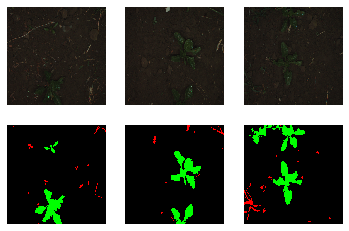

In [2]:

# load the prepared dataset
from numpy import load
from matplotlib import pyplot
# load the face dataset
data = load('maps_256_augmented.npz')
src_images, tar_images = data['arr_0'], data['arr_1']
print('Loaded: ', src_images.shape, tar_images.shape)
# plot source images
n_samples = 3
for i in range(n_samples):
    pyplot.subplot(2, n_samples, 1 + i)
    pyplot.axis('off')
    pyplot.imshow(src_images[i].astype('uint8'))
# plot target image
for i in range(n_samples):
    pyplot.subplot(2, n_samples, 1 + n_samples + i)
    pyplot.axis('off')
    pyplot.imshow(tar_images[i].astype('uint8'))
pyplot.show()

In [3]:
# define the discriminator model
def define_discriminator(image_shape):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # source image input
    in_src_image = Input(shape=image_shape)
    # target image input
    in_target_image = Input(shape=image_shape)
    # concatenate images channel-wise
    merged = Concatenate()([in_src_image, in_target_image])
    # C64
    d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(merged)
    d = LeakyReLU(alpha=0.2)(d)
    d = Dropout(0.3)(d)
    # C128
    d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    # C256
    d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    d = Dropout(0.3)(d)
    # C512
    d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    # second last output layer
    d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    d = Dropout(0.3)(d)
    # patch output
    d = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
    patch_out = Activation('sigmoid')(d)
    # define model
    model = Model([in_src_image, in_target_image], patch_out)
    # compile model
    opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=[0.5])
    return model

In [4]:
# define an encoder block
def define_encoder_block(layer_in, n_filters, batchnorm=True):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # add downsampling layer
    g = Conv2D(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
    # conditionally add batch normalization
    if batchnorm:
        g = BatchNormalization()(g, training=True)
    # leaky relu activation
    g = LeakyReLU(alpha=0.2)(g)
    return g

# define a decoder block
def decoder_block(layer_in, skip_in, n_filters, dropout=True):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # add upsampling layer
    g = Conv2DTranspose(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
    # add batch normalization
    g = BatchNormalization()(g, training=True)
    # conditionally add dropout
    if dropout:
        g = Dropout(0.5)(g, training=True)
    # merge with skip connection
    g = Concatenate()([g, skip_in])
    # relu activation
    g = Activation('relu')(g)
    return g

# define the standalone generator model
def define_generator(image_shape=(256,256,3)):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # image input
    in_image = Input(shape=image_shape)
    # encoder model
    e1 = define_encoder_block(in_image, 64, batchnorm=False)
    e2 = define_encoder_block(e1, 128)
    e2 = Dropout(0.3)(e2)
    e3 = define_encoder_block(e2, 256)
    e4 = define_encoder_block(e3, 512)
    e4 = Dropout(0.3)(e4)
    e5 = define_encoder_block(e4, 512)
    e6 = define_encoder_block(e5, 512)
    e6 = Dropout(0.3)(e6)
    e7 = define_encoder_block(e6, 512)
    # bottleneck, no batch norm and relu
    b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
    b = Activation('relu')(b)
    b = Dropout(0.3)(b)
    # decoder model
    d1 = decoder_block(b, e7, 512)
    d2 = decoder_block(d1, e6, 512)
    d3 = decoder_block(d2, e5, 512)
    d4 = decoder_block(d3, e4, 512, dropout=False)
    d4 = Dropout(0.3)(d4)
    d5 = decoder_block(d4, e3, 256, dropout=False)
    d5 = Dropout(0.3)(d5)
    d6 = decoder_block(d5, e2, 128, dropout=False)
    d7 = decoder_block(d6, e1, 64, dropout=False)
    d7 = Dropout(0.3)(d7)
    # output
    g = Conv2DTranspose(3, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7)
    out_image = Activation('tanh')(g)
    # define model
    model = Model(in_image, out_image)
    return model

In [5]:
# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model, image_shape):
    # make weights in the discriminator not trainable
    d_model.trainable = False
    # define the source image
    in_src = Input(shape=image_shape)
    # connect the source image to the generator input
    gen_out = g_model(in_src)
    # connect the source input and generator output to the discriminator input
    dis_out = d_model([in_src, gen_out])
    # src image as input, generated image and classification output
    model = Model(in_src, [dis_out, gen_out])
    # compile model
    opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss=['binary_crossentropy', 'mae'], optimizer=opt, loss_weights=[1,100])
    return model

In [6]:
# load and prepare training images
def load_real_samples(filename):
    # load compressed arrays
    data = load(filename)
    # unpack arrays
    X1, X2 = data['arr_0'], data['arr_1']
    X2first=X2[:,:,:,0]
    X2two=X2[:,:,:,1]
    X2three=X2[:,:,:,2]
    X2three[X2first==255]=255
    X2three[X2two==255]=255
    X2three[X2three==0]=5
    X2three[X2three==255]=0
    X2three[X2three==5]=255
    X2[:,:,:,2]=X2three
    plt.imshow(X2[15])
    # scale from [0,255] to [-1,1]
    X1 = (X1 - 127.5) / 127.5
    X2 = (X2 - 127.5) / 127.5
    return [X1, X2]

In [7]:
# select a batch of random samples, returns images and target
def generate_real_samples(dataset, n_samples, patch_shape):
    # unpack dataset
    trainA, trainB = dataset
    # choose random instances
    ix = randint(0, trainA.shape[0], n_samples)
    # retrieve selected images
    X1, X2 = trainA[ix], trainB[ix]
    # generate 'real' class labels (1)
    y = ones((n_samples, patch_shape, patch_shape, 1))
    return [X1, X2], y

In [8]:
# generate a batch of images, returns images and targets
def generate_fake_samples(g_model, samples, patch_shape):
    # generate fake instance
    X = g_model.predict(samples)
    # create 'fake' class labels (0)
    y = zeros((len(X), patch_shape, patch_shape, 1))
    return X, y

In [9]:
# generate samples and save as a plot and save the model
def summarize_performance(step, g_model, dataset, n_samples=3):
    # select a sample of input images
    [X_realA, X_realB], _ = generate_real_samples(dataset, n_samples, 1)
    # generate a batch of fake samples
    X_fakeB, _ = generate_fake_samples(g_model, X_realA, 1)
    # scale all pixels from [-1,1] to [0,1]
    X_realA = (X_realA + 1) / 2.0
    X_realB = (X_realB + 1) / 2.0
    X_fakeB = (X_fakeB + 1) / 2.0
    # plot real source images
    for i in range(n_samples):
        pyplot.subplot(3, n_samples, 1 + i)
        pyplot.axis('off')
        pyplot.imshow(X_realA[i])
    # plot generated target image
    for i in range(n_samples):
        pyplot.subplot(3, n_samples, 1 + n_samples + i)
        pyplot.axis('off')
        pyplot.imshow(X_fakeB[i])
    # plot real target image
    for i in range(n_samples):
        pyplot.subplot(3, n_samples, 1 + n_samples*2 + i)
        pyplot.axis('off')
        pyplot.imshow(X_realB[i])
    # save plot to file
    filename1 = 'plot_%06d.png' % (step+1)
    pyplot.savefig(filename1)
    pyplot.close()
    # save the generator model
    filename2 = 'model_%06d.h5' % (step+1)
    g_model.save(filename2)
    print('>Saved: %s and %s' % (filename1, filename2))

In [10]:
# train pix2pix model
def train(d_model, g_model, gan_model, dataset, n_epochs=100, n_batch=1):
    # determine the output square shape of the discriminator
    n_patch = d_model.output_shape[1]
    # unpack dataset
    trainA, trainB = dataset
    # calculate the number of batches per training epoch
    bat_per_epo = int(len(trainA) / n_batch)
    # calculate the number of training iterations
    n_steps = bat_per_epo * n_epochs
    d_loss1=np.zeros((n_steps,1))
    d_loss2=np.zeros((n_steps,1))
    g_loss=np.zeros((n_steps,1))
    # manually enumerate epochs
    for i in range(n_steps):
        [X_realA, X_realB], y_real = generate_real_samples(dataset, n_batch, n_patch)
        # generate a batch of fake samples
        X_fakeB, y_fake = generate_fake_samples(g_model, X_realA, n_patch)
        # update discriminator for real samples
        d_loss1[i] = d_model.train_on_batch([X_realA, X_realB], y_real)
        # update discriminator for generated samples
        d_loss2[i] = d_model.train_on_batch([X_realA, X_fakeB], y_fake)
        # update the generator
        g_loss[i], _, _ = gan_model.train_on_batch(X_realA, [y_real, X_realB])
          
    
        # summarize performance
        print('>%d, d1[%.3f] d2[%.3f] g[%.3f]' % (i+1, d_loss1[i], d_loss2[i], g_loss[i]))
        # summarize model performance
        if (i+1) % (bat_per_epo * 10) == 0:
            summarize_performance(i, g_model, dataset)
    return d_loss1,d_loss2,g_loss
    

Loaded (3000, 256, 256, 3) (3000, 256, 256, 3)


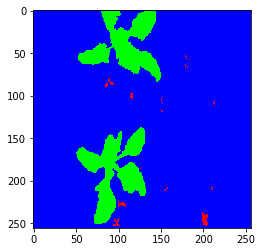

In [24]:
dataset = load_real_samples('maps_256_augmented.npz')
print('Loaded', dataset[0].shape, dataset[1].shape)
# define input shape based on the loaded dataset
image_shape = dataset[0].shape[1:]
# define the models
d_model = define_discriminator(image_shape)
g_model = define_generator(image_shape)
# define the composite model
gan_model = define_gan(g_model, d_model, image_shape)
# train model


In [31]:
da=dataset.copy()
dataset[0]=da[1]
dataset[1]=da[0]


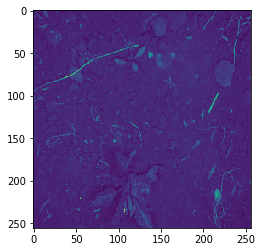

In [35]:
plt.imshow(dataset[1][0,:,:,1])

In [ ]:
dataset = load_real_samples('maps_256.npz')
print('Loaded', dataset[0].shape, dataset[1].shape)
# define input shape based on the loaded dataset
image_shape = dataset[0].shape[1:]
# define the models
d_model = define_discriminator(image_shape)
g_model = define_generator(image_shape)
# define the composite model
gan_model = define_gan(g_model, d_model, image_shape)

In [ ]:
dloss1,dloss2,ganloss=train(d_model, g_model, gan_model, dataset)

/home/sami/anaconda3/envs/py36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/home/sami/anaconda3/envs/py36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>1, d1[0.372] d2[0.737] g[74.384]


/home/sami/anaconda3/envs/py36/lib/python3.6/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


>2, d1[0.337] d2[0.665] g[71.500]
>3, d1[0.328] d2[0.574] g[67.911]
>4, d1[0.438] d2[0.514] g[65.000]
>5, d1[0.431] d2[0.507] g[61.993]
>6, d1[0.407] d2[0.488] g[59.181]
>7, d1[0.428] d2[0.494] g[55.504]
>8, d1[0.440] d2[0.437] g[52.449]
>9, d1[0.424] d2[0.462] g[50.552]
>10, d1[0.430] d2[0.438] g[47.600]
>11, d1[0.459] d2[0.447] g[44.739]
>12, d1[0.458] d2[0.415] g[42.370]
>13, d1[0.466] d2[0.421] g[37.949]
>14, d1[0.452] d2[0.482] g[35.901]
>15, d1[0.448] d2[0.477] g[34.029]
>16, d1[0.435] d2[0.440] g[32.231]
>17, d1[0.440] d2[0.439] g[29.091]
>18, d1[0.449] d2[0.453] g[26.766]
>19, d1[0.436] d2[0.460] g[25.490]
>20, d1[0.437] d2[0.443] g[23.641]
>21, d1[0.410] d2[0.422] g[20.521]
>22, d1[0.442] d2[0.479] g[19.184]
>23, d1[0.456] d2[0.424] g[17.209]
>24, d1[0.440] d2[0.424] g[15.180]
>25, d1[0.429] d2[0.454] g[14.884]
>26, d1[0.423] d2[0.437] g[13.282]
>27, d1[0.448] d2[0.436] g[11.901]
>28, d1[0.430] d2[0.463] g[11.957]
>29, d1[0.462] d2[0.432] g[11.140]
>30, d1[0.410] d2[0.434] g[1

>239, d1[0.404] d2[0.371] g[4.699]
>240, d1[0.370] d2[0.382] g[4.406]
>241, d1[0.394] d2[0.399] g[5.248]
>242, d1[0.383] d2[0.393] g[6.412]
>243, d1[0.414] d2[0.402] g[5.811]
>244, d1[0.394] d2[0.399] g[4.755]
>245, d1[0.422] d2[0.387] g[5.243]
>246, d1[0.391] d2[0.423] g[4.945]
>247, d1[0.372] d2[0.395] g[4.436]
>248, d1[0.404] d2[0.394] g[5.258]
>249, d1[0.389] d2[0.401] g[5.487]
>250, d1[0.389] d2[0.387] g[4.668]
>251, d1[0.380] d2[0.357] g[4.403]
>252, d1[0.394] d2[0.382] g[4.709]
>253, d1[0.391] d2[0.386] g[4.862]
>254, d1[0.390] d2[0.372] g[4.575]
>255, d1[0.385] d2[0.398] g[5.028]
>256, d1[0.378] d2[0.399] g[4.927]
>257, d1[0.382] d2[0.404] g[4.745]
>258, d1[0.390] d2[0.366] g[5.466]
>259, d1[0.403] d2[0.383] g[4.584]
>260, d1[0.403] d2[0.418] g[4.814]
>261, d1[0.379] d2[0.403] g[4.822]
>262, d1[0.391] d2[0.388] g[4.721]
>263, d1[0.402] d2[0.383] g[4.555]
>264, d1[0.379] d2[0.376] g[4.975]
>265, d1[0.397] d2[0.401] g[4.866]
>266, d1[0.398] d2[0.404] g[4.727]
>267, d1[0.375] d2[0

>474, d1[0.377] d2[0.377] g[4.793]
>475, d1[0.383] d2[0.423] g[4.144]
>476, d1[0.372] d2[0.379] g[4.304]
>477, d1[0.381] d2[0.372] g[4.303]
>478, d1[0.404] d2[0.371] g[4.376]
>479, d1[0.400] d2[0.388] g[4.165]
>480, d1[0.375] d2[0.389] g[4.189]
>481, d1[0.377] d2[0.378] g[4.520]
>482, d1[0.369] d2[0.396] g[4.246]
>483, d1[0.407] d2[0.395] g[4.561]
>484, d1[0.368] d2[0.372] g[4.018]
>485, d1[0.393] d2[0.375] g[4.424]
>486, d1[0.387] d2[0.399] g[4.798]
>487, d1[0.376] d2[0.362] g[4.000]
>488, d1[0.405] d2[0.399] g[3.934]
>489, d1[0.369] d2[0.383] g[4.385]
>490, d1[0.395] d2[0.404] g[4.569]
>491, d1[0.381] d2[0.399] g[4.763]
>492, d1[0.382] d2[0.395] g[4.384]
>493, d1[0.377] d2[0.393] g[4.404]
>494, d1[0.403] d2[0.377] g[5.327]
>495, d1[0.399] d2[0.366] g[4.302]
>496, d1[0.394] d2[0.372] g[4.407]
>497, d1[0.393] d2[0.388] g[4.228]
>498, d1[0.382] d2[0.377] g[4.359]
>499, d1[0.381] d2[0.382] g[4.370]
>500, d1[0.371] d2[0.392] g[4.060]
>501, d1[0.374] d2[0.371] g[4.251]
>502, d1[0.396] d2[0

>709, d1[0.383] d2[0.390] g[4.439]
>710, d1[0.384] d2[0.360] g[3.844]
>711, d1[0.391] d2[0.397] g[4.341]
>712, d1[0.378] d2[0.376] g[3.963]
>713, d1[0.381] d2[0.388] g[4.160]
>714, d1[0.384] d2[0.387] g[4.008]
>715, d1[0.395] d2[0.381] g[4.473]
>716, d1[0.379] d2[0.386] g[4.038]
>717, d1[0.377] d2[0.377] g[4.658]
>718, d1[0.381] d2[0.385] g[4.562]
>719, d1[0.385] d2[0.392] g[4.465]
>720, d1[0.403] d2[0.384] g[4.095]
>721, d1[0.381] d2[0.392] g[4.454]
>722, d1[0.364] d2[0.379] g[4.175]
>723, d1[0.391] d2[0.382] g[4.428]
>724, d1[0.378] d2[0.370] g[4.176]
>725, d1[0.358] d2[0.370] g[3.673]
>726, d1[0.383] d2[0.388] g[4.102]
>727, d1[0.390] d2[0.371] g[4.308]
>728, d1[0.378] d2[0.372] g[4.062]
>729, d1[0.381] d2[0.361] g[4.268]
>730, d1[0.377] d2[0.397] g[4.038]
>731, d1[0.369] d2[0.390] g[4.256]
>732, d1[0.376] d2[0.387] g[5.040]
>733, d1[0.372] d2[0.350] g[3.787]
>734, d1[0.404] d2[0.376] g[3.814]
>735, d1[0.378] d2[0.377] g[3.872]
>736, d1[0.378] d2[0.385] g[4.189]
>737, d1[0.364] d2[0

>944, d1[0.373] d2[0.382] g[3.925]
>945, d1[0.374] d2[0.382] g[4.598]
>946, d1[0.383] d2[0.378] g[3.609]
>947, d1[0.375] d2[0.382] g[3.746]
>948, d1[0.377] d2[0.369] g[3.879]
>949, d1[0.390] d2[0.391] g[4.399]
>950, d1[0.377] d2[0.366] g[4.196]
>951, d1[0.370] d2[0.382] g[4.442]
>952, d1[0.375] d2[0.379] g[3.855]
>953, d1[0.381] d2[0.383] g[4.138]
>954, d1[0.377] d2[0.384] g[4.250]
>955, d1[0.377] d2[0.375] g[3.706]
>956, d1[0.368] d2[0.367] g[4.068]
>957, d1[0.375] d2[0.377] g[3.815]
>958, d1[0.379] d2[0.378] g[3.792]
>959, d1[0.387] d2[0.364] g[5.545]
>960, d1[0.397] d2[0.402] g[5.419]
>961, d1[0.396] d2[0.378] g[5.583]
>962, d1[0.389] d2[0.379] g[4.780]
>963, d1[0.380] d2[0.387] g[3.834]
>964, d1[0.375] d2[0.384] g[4.381]
>965, d1[0.391] d2[0.388] g[4.304]
>966, d1[0.373] d2[0.385] g[4.391]
>967, d1[0.367] d2[0.375] g[3.999]
>968, d1[0.376] d2[0.371] g[4.592]
>969, d1[0.379] d2[0.367] g[4.082]
>970, d1[0.383] d2[0.376] g[3.795]
>971, d1[0.368] d2[0.387] g[4.260]
>972, d1[0.376] d2[0

>1174, d1[0.384] d2[0.390] g[4.038]
>1175, d1[0.371] d2[0.370] g[4.234]
>1176, d1[0.366] d2[0.360] g[3.836]
>1177, d1[0.385] d2[0.384] g[3.973]
>1178, d1[0.372] d2[0.358] g[4.013]
>1179, d1[0.375] d2[0.372] g[4.061]
>1180, d1[0.382] d2[0.362] g[3.854]
>1181, d1[0.372] d2[0.389] g[4.113]
>1182, d1[0.355] d2[0.385] g[4.045]
>1183, d1[0.372] d2[0.375] g[4.131]
>1184, d1[0.379] d2[0.362] g[3.515]
>1185, d1[0.379] d2[0.366] g[3.847]
>1186, d1[0.375] d2[0.369] g[3.812]
>1187, d1[0.366] d2[0.373] g[3.901]
>1188, d1[0.374] d2[0.358] g[4.063]
>1189, d1[0.376] d2[0.366] g[3.817]
>1190, d1[0.350] d2[0.371] g[3.656]
>1191, d1[0.368] d2[0.363] g[4.179]
>1192, d1[0.379] d2[0.388] g[3.855]
>1193, d1[0.365] d2[0.382] g[3.689]
>1194, d1[0.381] d2[0.370] g[5.292]
>1195, d1[0.368] d2[0.372] g[4.311]
>1196, d1[0.376] d2[0.360] g[3.713]
>1197, d1[0.378] d2[0.366] g[3.568]
>1198, d1[0.397] d2[0.379] g[5.438]
>1199, d1[0.378] d2[0.368] g[4.198]
>1200, d1[0.373] d2[0.367] g[3.950]
>1201, d1[0.370] d2[0.382] g

>1402, d1[0.364] d2[0.371] g[5.534]
>1403, d1[0.385] d2[0.374] g[4.723]
>1404, d1[0.374] d2[0.381] g[4.124]
>1405, d1[0.361] d2[0.393] g[4.054]
>1406, d1[0.358] d2[0.374] g[3.990]
>1407, d1[0.367] d2[0.363] g[4.041]
>1408, d1[0.387] d2[0.362] g[4.280]
>1409, d1[0.371] d2[0.358] g[4.223]
>1410, d1[0.366] d2[0.363] g[3.600]
>1411, d1[0.374] d2[0.382] g[4.100]
>1412, d1[0.372] d2[0.383] g[4.294]
>1413, d1[0.363] d2[0.383] g[4.338]
>1414, d1[0.361] d2[0.363] g[3.575]
>1415, d1[0.384] d2[0.352] g[3.851]
>1416, d1[0.374] d2[0.376] g[3.755]
>1417, d1[0.364] d2[0.382] g[3.572]
>1418, d1[0.368] d2[0.393] g[3.950]
>1419, d1[0.374] d2[0.374] g[5.392]
>1420, d1[0.376] d2[0.382] g[4.168]
>1421, d1[0.374] d2[0.370] g[3.977]
>1422, d1[0.393] d2[0.367] g[4.658]
>1423, d1[0.361] d2[0.366] g[3.617]
>1424, d1[0.364] d2[0.378] g[4.309]
>1425, d1[0.371] d2[0.370] g[3.962]
>1426, d1[0.376] d2[0.366] g[4.005]
>1427, d1[0.389] d2[0.381] g[5.713]
>1428, d1[0.362] d2[0.368] g[4.028]
>1429, d1[0.387] d2[0.414] g

>1630, d1[0.396] d2[0.365] g[3.465]
>1631, d1[0.369] d2[0.377] g[3.854]
>1632, d1[0.374] d2[0.390] g[4.949]
>1633, d1[0.360] d2[0.376] g[3.933]
>1634, d1[0.370] d2[0.366] g[4.044]
>1635, d1[0.375] d2[0.367] g[4.412]
>1636, d1[0.377] d2[0.379] g[4.212]
>1637, d1[0.378] d2[0.369] g[3.834]
>1638, d1[0.377] d2[0.369] g[3.749]
>1639, d1[0.358] d2[0.361] g[3.886]
>1640, d1[0.363] d2[0.356] g[3.422]
>1641, d1[0.373] d2[0.372] g[3.780]
>1642, d1[0.371] d2[0.350] g[3.937]
>1643, d1[0.380] d2[0.389] g[3.874]
>1644, d1[0.359] d2[0.380] g[4.014]
>1645, d1[0.363] d2[0.357] g[3.605]
>1646, d1[0.383] d2[0.358] g[4.085]
>1647, d1[0.364] d2[0.373] g[3.685]
>1648, d1[0.382] d2[0.371] g[3.836]
>1649, d1[0.368] d2[0.357] g[3.705]
>1650, d1[0.367] d2[0.371] g[3.779]
>1651, d1[0.370] d2[0.362] g[3.631]
>1652, d1[0.368] d2[0.369] g[3.709]
>1653, d1[0.379] d2[0.389] g[4.299]
>1654, d1[0.358] d2[0.364] g[3.409]
>1655, d1[0.369] d2[0.375] g[4.336]
>1656, d1[0.378] d2[0.368] g[3.913]
>1657, d1[0.379] d2[0.353] g

>1858, d1[0.364] d2[0.360] g[3.988]
>1859, d1[0.369] d2[0.373] g[4.507]
>1860, d1[0.369] d2[0.370] g[4.114]
>1861, d1[0.372] d2[0.364] g[4.251]
>1862, d1[0.355] d2[0.373] g[4.023]
>1863, d1[0.369] d2[0.372] g[3.479]
>1864, d1[0.366] d2[0.374] g[3.919]
>1865, d1[0.362] d2[0.381] g[4.054]
>1866, d1[0.358] d2[0.368] g[3.699]
>1867, d1[0.378] d2[0.367] g[4.605]
>1868, d1[0.367] d2[0.365] g[3.986]
>1869, d1[0.357] d2[0.375] g[3.355]
>1870, d1[0.350] d2[0.370] g[3.828]
>1871, d1[0.350] d2[0.358] g[3.767]
>1872, d1[0.362] d2[0.359] g[3.470]
>1873, d1[0.372] d2[0.371] g[3.533]
>1874, d1[0.359] d2[0.369] g[5.234]
>1875, d1[0.380] d2[0.361] g[4.640]
>1876, d1[0.362] d2[0.376] g[3.699]
>1877, d1[0.375] d2[0.382] g[3.762]
>1878, d1[0.367] d2[0.362] g[3.624]
>1879, d1[0.370] d2[0.358] g[3.695]
>1880, d1[0.366] d2[0.377] g[3.871]
>1881, d1[0.358] d2[0.366] g[3.414]
>1882, d1[0.357] d2[0.366] g[3.734]
>1883, d1[0.358] d2[0.362] g[3.447]
>1884, d1[0.372] d2[0.364] g[3.497]
>1885, d1[0.354] d2[0.369] g

>2086, d1[0.351] d2[0.388] g[3.715]
>2087, d1[0.343] d2[0.381] g[3.400]
>2088, d1[0.348] d2[0.378] g[3.422]
>2089, d1[0.351] d2[0.377] g[3.648]
>2090, d1[0.349] d2[0.370] g[3.780]
>2091, d1[0.360] d2[0.356] g[3.774]
>2092, d1[0.355] d2[0.365] g[3.931]
>2093, d1[0.365] d2[0.356] g[3.478]
>2094, d1[0.357] d2[0.368] g[3.714]
>2095, d1[0.356] d2[0.353] g[3.616]
>2096, d1[0.367] d2[0.367] g[4.196]
>2097, d1[0.356] d2[0.377] g[3.845]
>2098, d1[0.356] d2[0.362] g[3.810]
>2099, d1[0.387] d2[0.369] g[3.907]
>2100, d1[0.362] d2[0.345] g[3.546]
>2101, d1[0.369] d2[0.353] g[3.620]
>2102, d1[0.365] d2[0.362] g[3.800]
>2103, d1[0.377] d2[0.358] g[3.978]
>2104, d1[0.378] d2[0.360] g[3.713]
>2105, d1[0.358] d2[0.368] g[3.321]
>2106, d1[0.364] d2[0.354] g[3.825]
>2107, d1[0.361] d2[0.370] g[3.753]
>2108, d1[0.352] d2[0.365] g[3.719]
>2109, d1[0.349] d2[0.351] g[3.786]
>2110, d1[0.372] d2[0.345] g[3.699]
>2111, d1[0.366] d2[0.359] g[3.841]
>2112, d1[0.357] d2[0.362] g[4.018]
>2113, d1[0.351] d2[0.365] g

>2314, d1[0.377] d2[0.372] g[3.726]
>2315, d1[0.368] d2[0.350] g[3.795]
>2316, d1[0.377] d2[0.360] g[3.985]
>2317, d1[0.362] d2[0.353] g[3.272]
>2318, d1[0.362] d2[0.375] g[3.871]
>2319, d1[0.351] d2[0.360] g[3.537]
>2320, d1[0.354] d2[0.359] g[3.813]
>2321, d1[0.356] d2[0.366] g[4.109]
>2322, d1[0.362] d2[0.373] g[3.815]
>2323, d1[0.363] d2[0.373] g[3.939]
>2324, d1[0.358] d2[0.370] g[4.115]
>2325, d1[0.378] d2[0.356] g[3.944]
>2326, d1[0.358] d2[0.349] g[3.858]
>2327, d1[0.365] d2[0.365] g[3.731]
>2328, d1[0.363] d2[0.356] g[3.548]
>2329, d1[0.361] d2[0.346] g[3.408]
>2330, d1[0.372] d2[0.366] g[4.091]
>2331, d1[0.369] d2[0.361] g[3.265]
>2332, d1[0.367] d2[0.359] g[3.198]
>2333, d1[0.370] d2[0.364] g[3.431]
>2334, d1[0.363] d2[0.356] g[3.725]
>2335, d1[0.368] d2[0.366] g[3.432]
>2336, d1[0.363] d2[0.361] g[3.232]
>2337, d1[0.357] d2[0.357] g[3.716]
>2338, d1[0.363] d2[0.379] g[3.666]
>2339, d1[0.365] d2[0.369] g[3.152]
>2340, d1[0.354] d2[0.368] g[3.518]
>2341, d1[0.368] d2[0.359] g

>2542, d1[0.356] d2[0.370] g[3.618]
>2543, d1[0.367] d2[0.372] g[4.132]
>2544, d1[0.363] d2[0.372] g[3.764]
>2545, d1[0.357] d2[0.361] g[3.856]
>2546, d1[0.366] d2[0.351] g[3.603]
>2547, d1[0.362] d2[0.360] g[3.367]
>2548, d1[0.366] d2[0.358] g[3.645]
>2549, d1[0.372] d2[0.362] g[3.544]
>2550, d1[0.354] d2[0.357] g[3.461]
>2551, d1[0.368] d2[0.351] g[4.163]
>2552, d1[0.369] d2[0.351] g[3.665]
>2553, d1[0.364] d2[0.363] g[3.574]
>2554, d1[0.355] d2[0.361] g[3.627]
>2555, d1[0.374] d2[0.359] g[3.540]
>2556, d1[0.372] d2[0.355] g[3.284]
>2557, d1[0.374] d2[0.347] g[3.871]
>2558, d1[0.378] d2[0.361] g[3.891]
>2559, d1[0.370] d2[0.368] g[3.800]
>2560, d1[0.359] d2[0.359] g[3.411]
>2561, d1[0.379] d2[0.355] g[3.933]
>2562, d1[0.377] d2[0.361] g[3.428]
>2563, d1[0.362] d2[0.350] g[3.541]
>2564, d1[0.365] d2[0.359] g[3.458]
>2565, d1[0.360] d2[0.350] g[3.590]
>2566, d1[0.377] d2[0.364] g[3.681]
>2567, d1[0.367] d2[0.361] g[3.860]
>2568, d1[0.355] d2[0.356] g[3.493]
>2569, d1[0.361] d2[0.359] g

>2770, d1[0.371] d2[0.348] g[3.306]
>2771, d1[0.391] d2[0.356] g[4.153]
>2772, d1[0.386] d2[0.407] g[4.645]
>2773, d1[0.359] d2[0.346] g[3.776]
>2774, d1[0.377] d2[0.359] g[3.682]
>2775, d1[0.368] d2[0.359] g[3.729]
>2776, d1[0.368] d2[0.359] g[3.563]
>2777, d1[0.364] d2[0.355] g[3.206]
>2778, d1[0.362] d2[0.355] g[3.700]
>2779, d1[0.368] d2[0.355] g[3.577]
>2780, d1[0.365] d2[0.352] g[3.455]
>2781, d1[0.369] d2[0.347] g[3.476]
>2782, d1[0.359] d2[0.354] g[3.718]
>2783, d1[0.363] d2[0.355] g[3.283]
>2784, d1[0.365] d2[0.352] g[3.747]
>2785, d1[0.360] d2[0.357] g[3.377]
>2786, d1[0.371] d2[0.355] g[3.667]
>2787, d1[0.362] d2[0.358] g[5.663]
>2788, d1[0.368] d2[0.356] g[5.018]
>2789, d1[0.355] d2[0.366] g[4.953]
>2790, d1[0.355] d2[0.359] g[3.583]
>2791, d1[0.351] d2[0.363] g[3.740]
>2792, d1[0.364] d2[0.368] g[4.354]
>2793, d1[0.353] d2[0.378] g[3.598]
>2794, d1[0.364] d2[0.377] g[3.805]
>2795, d1[0.368] d2[0.379] g[3.808]
>2796, d1[0.362] d2[0.357] g[3.654]
>2797, d1[0.368] d2[0.355] g

>2998, d1[0.364] d2[0.358] g[3.356]
>2999, d1[0.356] d2[0.359] g[3.247]
>3000, d1[0.366] d2[0.373] g[3.829]
>3001, d1[0.355] d2[0.368] g[3.541]
>3002, d1[0.357] d2[0.355] g[3.644]
>3003, d1[0.349] d2[0.361] g[3.490]
>3004, d1[0.368] d2[0.360] g[3.706]
>3005, d1[0.367] d2[0.354] g[4.241]
>3006, d1[0.369] d2[0.367] g[4.883]
>3007, d1[0.355] d2[0.360] g[3.554]
>3008, d1[0.359] d2[0.355] g[3.399]
>3009, d1[0.361] d2[0.365] g[3.329]
>3010, d1[0.359] d2[0.360] g[3.247]
>3011, d1[0.360] d2[0.362] g[3.701]
>3012, d1[0.349] d2[0.360] g[3.649]
>3013, d1[0.365] d2[0.352] g[3.668]
>3014, d1[0.364] d2[0.352] g[3.679]
>3015, d1[0.353] d2[0.366] g[3.527]
>3016, d1[0.359] d2[0.354] g[3.635]
>3017, d1[0.361] d2[0.354] g[3.749]
>3018, d1[0.360] d2[0.351] g[3.640]
>3019, d1[0.364] d2[0.358] g[3.675]
>3020, d1[0.355] d2[0.355] g[3.742]
>3021, d1[0.358] d2[0.357] g[3.586]
>3022, d1[0.364] d2[0.363] g[3.550]
>3023, d1[0.370] d2[0.376] g[5.625]
>3024, d1[0.352] d2[0.355] g[3.647]
>3025, d1[0.375] d2[0.358] g

>3226, d1[0.362] d2[0.358] g[3.600]
>3227, d1[0.354] d2[0.355] g[3.502]
>3228, d1[0.364] d2[0.366] g[3.941]
>3229, d1[0.354] d2[0.358] g[3.532]
>3230, d1[0.360] d2[0.364] g[3.652]
>3231, d1[0.359] d2[0.367] g[3.352]
>3232, d1[0.362] d2[0.348] g[3.566]
>3233, d1[0.362] d2[0.358] g[3.557]
>3234, d1[0.366] d2[0.353] g[3.305]
>3235, d1[0.362] d2[0.367] g[3.750]
>3236, d1[0.350] d2[0.357] g[3.657]
>3237, d1[0.353] d2[0.360] g[3.615]
>3238, d1[0.356] d2[0.370] g[3.284]
>3239, d1[0.365] d2[0.360] g[3.701]
>3240, d1[0.372] d2[0.358] g[3.809]
>3241, d1[0.363] d2[0.357] g[5.046]
>3242, d1[0.369] d2[0.362] g[4.128]
>3243, d1[0.354] d2[0.363] g[3.418]
>3244, d1[0.356] d2[0.365] g[3.545]
>3245, d1[0.360] d2[0.362] g[3.281]
>3246, d1[0.364] d2[0.355] g[3.556]
>3247, d1[0.359] d2[0.360] g[3.699]
>3248, d1[0.365] d2[0.358] g[3.571]
>3249, d1[0.367] d2[0.357] g[3.610]
>3250, d1[0.357] d2[0.352] g[3.869]
>3251, d1[0.365] d2[0.358] g[3.295]
>3252, d1[0.368] d2[0.356] g[3.683]
>3253, d1[0.360] d2[0.359] g

>3454, d1[0.362] d2[0.361] g[3.608]
>3455, d1[0.355] d2[0.362] g[3.885]
>3456, d1[0.358] d2[0.360] g[3.755]
>3457, d1[0.364] d2[0.350] g[3.619]
>3458, d1[0.363] d2[0.363] g[3.401]
>3459, d1[0.356] d2[0.368] g[3.554]
>3460, d1[0.361] d2[0.365] g[3.634]
>3461, d1[0.351] d2[0.357] g[3.486]
>3462, d1[0.357] d2[0.372] g[3.630]
>3463, d1[0.363] d2[0.365] g[4.530]
>3464, d1[0.357] d2[0.359] g[4.064]
>3465, d1[0.368] d2[0.362] g[3.392]
>3466, d1[0.353] d2[0.372] g[4.391]
>3467, d1[0.356] d2[0.363] g[3.665]
>3468, d1[0.361] d2[0.361] g[3.896]
>3469, d1[0.358] d2[0.364] g[3.502]
>3470, d1[0.353] d2[0.358] g[3.625]
>3471, d1[0.349] d2[0.356] g[3.516]
>3472, d1[0.367] d2[0.360] g[3.401]
>3473, d1[0.353] d2[0.350] g[3.695]
>3474, d1[0.363] d2[0.353] g[3.513]
>3475, d1[0.367] d2[0.364] g[3.706]
>3476, d1[0.361] d2[0.360] g[3.624]
>3477, d1[0.351] d2[0.361] g[3.557]
>3478, d1[0.363] d2[0.361] g[3.743]
>3479, d1[0.360] d2[0.348] g[3.860]
>3480, d1[0.356] d2[0.353] g[3.674]
>3481, d1[0.361] d2[0.366] g

>3682, d1[0.357] d2[0.358] g[3.335]
>3683, d1[0.357] d2[0.351] g[5.224]
>3684, d1[0.357] d2[0.356] g[3.660]
>3685, d1[0.363] d2[0.351] g[3.501]
>3686, d1[0.364] d2[0.361] g[3.619]
>3687, d1[0.360] d2[0.362] g[3.390]
>3688, d1[0.354] d2[0.366] g[3.700]
>3689, d1[0.363] d2[0.361] g[3.681]
>3690, d1[0.360] d2[0.359] g[4.275]
>3691, d1[0.359] d2[0.360] g[3.636]
>3692, d1[0.360] d2[0.358] g[3.870]
>3693, d1[0.356] d2[0.353] g[3.616]
>3694, d1[0.362] d2[0.353] g[3.836]
>3695, d1[0.360] d2[0.362] g[3.171]
>3696, d1[0.354] d2[0.363] g[3.813]
>3697, d1[0.361] d2[0.363] g[3.611]
>3698, d1[0.357] d2[0.355] g[3.544]
>3699, d1[0.361] d2[0.363] g[3.224]
>3700, d1[0.361] d2[0.358] g[3.148]
>3701, d1[0.361] d2[0.358] g[3.742]
>3702, d1[0.357] d2[0.369] g[3.648]
>3703, d1[0.359] d2[0.359] g[3.654]
>3704, d1[0.357] d2[0.357] g[3.947]
>3705, d1[0.359] d2[0.353] g[3.703]
>3706, d1[0.361] d2[0.358] g[3.565]
>3707, d1[0.358] d2[0.355] g[3.529]
>3708, d1[0.359] d2[0.356] g[3.857]
>3709, d1[0.360] d2[0.366] g

>3910, d1[0.362] d2[0.348] g[3.233]
>3911, d1[0.358] d2[0.357] g[3.386]
>3912, d1[0.365] d2[0.356] g[3.501]
>3913, d1[0.361] d2[0.359] g[3.603]
>3914, d1[0.354] d2[0.354] g[3.318]
>3915, d1[0.356] d2[0.355] g[3.692]
>3916, d1[0.360] d2[0.362] g[3.736]
>3917, d1[0.340] d2[0.380] g[3.596]
>3918, d1[0.349] d2[0.371] g[4.097]
>3919, d1[0.359] d2[0.353] g[3.554]
>3920, d1[0.358] d2[0.356] g[3.598]
>3921, d1[0.365] d2[0.358] g[3.358]
>3922, d1[0.361] d2[0.365] g[3.199]
>3923, d1[0.359] d2[0.360] g[3.301]
>3924, d1[0.358] d2[0.365] g[3.680]
>3925, d1[0.353] d2[0.363] g[3.295]
>3926, d1[0.358] d2[0.358] g[3.468]
>3927, d1[0.364] d2[0.354] g[3.698]
>3928, d1[0.362] d2[0.349] g[3.641]
>3929, d1[0.363] d2[0.357] g[3.609]
>3930, d1[0.356] d2[0.364] g[5.451]
>3931, d1[0.359] d2[0.361] g[4.110]
>3932, d1[0.352] d2[0.366] g[3.991]
>3933, d1[0.352] d2[0.354] g[5.168]
>3934, d1[0.362] d2[0.359] g[3.658]
>3935, d1[0.360] d2[0.350] g[3.661]
>3936, d1[0.366] d2[0.367] g[4.721]
>3937, d1[0.353] d2[0.357] g

>4138, d1[0.359] d2[0.364] g[3.765]
>4139, d1[0.349] d2[0.370] g[3.375]
>4140, d1[0.350] d2[0.355] g[3.718]
>4141, d1[0.356] d2[0.360] g[3.537]
>4142, d1[0.356] d2[0.365] g[3.500]
>4143, d1[0.357] d2[0.359] g[3.343]
>4144, d1[0.352] d2[0.355] g[3.336]
>4145, d1[0.355] d2[0.353] g[3.211]
>4146, d1[0.357] d2[0.351] g[3.751]
>4147, d1[0.362] d2[0.361] g[4.151]
>4148, d1[0.358] d2[0.361] g[3.538]
>4149, d1[0.352] d2[0.354] g[3.438]
>4150, d1[0.359] d2[0.350] g[3.547]
>4151, d1[0.356] d2[0.352] g[3.564]
>4152, d1[0.355] d2[0.352] g[3.653]
>4153, d1[0.355] d2[0.362] g[3.230]
>4154, d1[0.352] d2[0.371] g[3.300]
>4155, d1[0.355] d2[0.373] g[3.669]
>4156, d1[0.350] d2[0.350] g[3.185]
>4157, d1[0.356] d2[0.360] g[3.835]
>4158, d1[0.352] d2[0.353] g[3.517]
>4159, d1[0.351] d2[0.360] g[3.643]
>4160, d1[0.351] d2[0.362] g[3.464]
>4161, d1[0.354] d2[0.358] g[3.110]
>4162, d1[0.350] d2[0.362] g[3.762]
>4163, d1[0.352] d2[0.359] g[3.722]
>4164, d1[0.352] d2[0.351] g[3.444]
>4165, d1[0.358] d2[0.361] g

>4366, d1[0.359] d2[0.356] g[3.538]
>4367, d1[0.362] d2[0.362] g[3.201]
>4368, d1[0.351] d2[0.347] g[3.242]
>4369, d1[0.357] d2[0.352] g[3.514]
>4370, d1[0.359] d2[0.350] g[3.125]
>4371, d1[0.358] d2[0.365] g[3.679]
>4372, d1[0.351] d2[0.359] g[3.905]
>4373, d1[0.357] d2[0.357] g[3.226]
>4374, d1[0.358] d2[0.357] g[3.540]
>4375, d1[0.351] d2[0.364] g[3.361]
>4376, d1[0.359] d2[0.355] g[3.723]
>4377, d1[0.363] d2[0.357] g[3.840]
>4378, d1[0.354] d2[0.354] g[4.534]
>4379, d1[0.364] d2[0.354] g[3.564]
>4380, d1[0.363] d2[0.367] g[4.559]
>4381, d1[0.355] d2[0.362] g[3.220]
>4382, d1[0.358] d2[0.348] g[3.604]
>4383, d1[0.360] d2[0.362] g[4.088]
>4384, d1[0.357] d2[0.349] g[3.554]
>4385, d1[0.367] d2[0.357] g[3.447]
>4386, d1[0.361] d2[0.356] g[3.573]
>4387, d1[0.356] d2[0.354] g[3.521]
>4388, d1[0.359] d2[0.350] g[3.336]
>4389, d1[0.355] d2[0.361] g[4.084]
>4390, d1[0.359] d2[0.358] g[3.638]
>4391, d1[0.355] d2[0.351] g[4.038]
>4392, d1[0.363] d2[0.357] g[5.551]
>4393, d1[0.356] d2[0.356] g

>4594, d1[0.352] d2[0.350] g[3.365]
>4595, d1[0.357] d2[0.354] g[3.696]
>4596, d1[0.353] d2[0.359] g[4.023]
>4597, d1[0.359] d2[0.355] g[3.391]
>4598, d1[0.359] d2[0.360] g[3.767]
>4599, d1[0.358] d2[0.360] g[3.636]
>4600, d1[0.353] d2[0.355] g[3.531]
>4601, d1[0.362] d2[0.359] g[3.875]
>4602, d1[0.350] d2[0.354] g[3.670]
>4603, d1[0.354] d2[0.355] g[3.368]
>4604, d1[0.358] d2[0.350] g[3.731]
>4605, d1[0.364] d2[0.349] g[3.070]
>4606, d1[0.367] d2[0.355] g[3.625]
>4607, d1[0.357] d2[0.353] g[3.539]
>4608, d1[0.362] d2[0.351] g[3.614]
>4609, d1[0.365] d2[0.356] g[3.528]
>4610, d1[0.355] d2[0.363] g[4.816]
>4611, d1[0.358] d2[0.360] g[4.015]
>4612, d1[0.355] d2[0.353] g[3.550]
>4613, d1[0.357] d2[0.354] g[5.191]
>4614, d1[0.355] d2[0.351] g[3.475]
>4615, d1[0.367] d2[0.360] g[3.408]
>4616, d1[0.341] d2[0.382] g[3.769]
>4617, d1[0.330] d2[0.378] g[4.033]
>4618, d1[0.342] d2[0.363] g[3.453]
>4619, d1[0.344] d2[0.366] g[3.480]
>4620, d1[0.343] d2[0.381] g[3.592]
>4621, d1[0.343] d2[0.375] g

>4822, d1[0.349] d2[0.346] g[3.511]
>4823, d1[0.352] d2[0.354] g[3.456]
>4824, d1[0.358] d2[0.356] g[3.251]
>4825, d1[0.356] d2[0.348] g[4.470]
>4826, d1[0.357] d2[0.368] g[4.119]
>4827, d1[0.349] d2[0.358] g[3.459]
>4828, d1[0.358] d2[0.354] g[3.747]
>4829, d1[0.354] d2[0.354] g[3.430]
>4830, d1[0.353] d2[0.353] g[3.581]
>4831, d1[0.357] d2[0.357] g[3.840]
>4832, d1[0.356] d2[0.351] g[3.488]
>4833, d1[0.355] d2[0.358] g[3.713]
>4834, d1[0.357] d2[0.357] g[4.065]
>4835, d1[0.351] d2[0.364] g[3.577]
>4836, d1[0.352] d2[0.361] g[3.578]
>4837, d1[0.351] d2[0.364] g[3.433]
>4838, d1[0.350] d2[0.351] g[3.805]
>4839, d1[0.355] d2[0.356] g[3.175]
>4840, d1[0.352] d2[0.350] g[3.536]
>4841, d1[0.356] d2[0.355] g[3.397]
>4842, d1[0.353] d2[0.349] g[3.118]
>4843, d1[0.354] d2[0.357] g[4.090]
>4844, d1[0.353] d2[0.358] g[3.650]
>4845, d1[0.353] d2[0.352] g[3.491]
>4846, d1[0.353] d2[0.357] g[3.890]
>4847, d1[0.354] d2[0.352] g[3.482]
>4848, d1[0.354] d2[0.365] g[3.649]
>4849, d1[0.356] d2[0.351] g

>5050, d1[0.350] d2[0.355] g[3.464]
>5051, d1[0.355] d2[0.353] g[3.553]
>5052, d1[0.354] d2[0.351] g[3.737]
>5053, d1[0.351] d2[0.352] g[3.564]
>5054, d1[0.355] d2[0.357] g[3.541]
>5055, d1[0.354] d2[0.354] g[3.138]
>5056, d1[0.351] d2[0.353] g[3.204]
>5057, d1[0.356] d2[0.357] g[3.686]
>5058, d1[0.352] d2[0.358] g[3.626]
>5059, d1[0.349] d2[0.350] g[3.599]
>5060, d1[0.356] d2[0.358] g[3.545]
>5061, d1[0.349] d2[0.361] g[3.256]
>5062, d1[0.350] d2[0.360] g[3.388]
>5063, d1[0.356] d2[0.357] g[3.449]
>5064, d1[0.354] d2[0.356] g[3.273]
>5065, d1[0.351] d2[0.351] g[3.823]
>5066, d1[0.349] d2[0.352] g[3.766]
>5067, d1[0.356] d2[0.357] g[3.796]
>5068, d1[0.355] d2[0.356] g[3.473]
>5069, d1[0.358] d2[0.359] g[3.627]
>5070, d1[0.355] d2[0.352] g[3.559]
>5071, d1[0.351] d2[0.354] g[3.197]
>5072, d1[0.354] d2[0.354] g[3.412]
>5073, d1[0.357] d2[0.362] g[3.513]
>5074, d1[0.350] d2[0.353] g[3.834]
>5075, d1[0.354] d2[0.347] g[3.517]
>5076, d1[0.349] d2[0.354] g[3.467]
>5077, d1[0.356] d2[0.354] g

>5278, d1[0.351] d2[0.356] g[3.371]
>5279, d1[0.355] d2[0.349] g[3.386]
>5280, d1[0.354] d2[0.348] g[3.484]
>5281, d1[0.361] d2[0.355] g[3.811]
>5282, d1[0.354] d2[0.355] g[3.430]
>5283, d1[0.356] d2[0.352] g[3.367]
>5284, d1[0.352] d2[0.356] g[3.600]
>5285, d1[0.352] d2[0.355] g[3.482]
>5286, d1[0.358] d2[0.357] g[3.524]
>5287, d1[0.353] d2[0.351] g[3.752]
>5288, d1[0.349] d2[0.352] g[3.472]
>5289, d1[0.351] d2[0.356] g[3.608]
>5290, d1[0.355] d2[0.351] g[3.879]
>5291, d1[0.358] d2[0.359] g[3.592]
>5292, d1[0.346] d2[0.363] g[3.848]
>5293, d1[0.354] d2[0.363] g[3.560]
>5294, d1[0.350] d2[0.358] g[3.485]
>5295, d1[0.350] d2[0.355] g[3.397]
>5296, d1[0.355] d2[0.356] g[3.511]
>5297, d1[0.357] d2[0.367] g[4.524]
>5298, d1[0.352] d2[0.356] g[3.802]
>5299, d1[0.355] d2[0.355] g[3.496]
>5300, d1[0.358] d2[0.416] g[4.410]
>5301, d1[0.351] d2[0.356] g[3.617]
>5302, d1[0.363] d2[0.352] g[3.683]
>5303, d1[0.358] d2[0.362] g[3.722]
>5304, d1[0.356] d2[0.349] g[3.508]
>5305, d1[0.361] d2[0.371] g

>5506, d1[0.354] d2[0.359] g[3.565]
>5507, d1[0.353] d2[0.348] g[3.260]
>5508, d1[0.357] d2[0.353] g[3.665]
>5509, d1[0.361] d2[0.350] g[3.778]
>5510, d1[0.353] d2[0.351] g[3.652]
>5511, d1[0.359] d2[0.351] g[3.697]
>5512, d1[0.352] d2[0.349] g[3.443]
>5513, d1[0.359] d2[0.353] g[3.643]
>5514, d1[0.354] d2[0.348] g[3.414]
>5515, d1[0.350] d2[0.349] g[3.391]
>5516, d1[0.355] d2[0.357] g[3.567]
>5517, d1[0.351] d2[0.347] g[3.627]
>5518, d1[0.359] d2[0.355] g[3.516]
>5519, d1[0.354] d2[0.352] g[4.824]
>5520, d1[0.352] d2[0.352] g[3.554]
>5521, d1[0.364] d2[0.357] g[3.945]
>5522, d1[0.352] d2[0.348] g[3.332]
>5523, d1[0.358] d2[0.353] g[3.843]
>5524, d1[0.356] d2[0.357] g[3.508]
>5525, d1[0.350] d2[0.350] g[3.309]
>5526, d1[0.360] d2[0.359] g[3.586]
>5527, d1[0.348] d2[0.350] g[3.659]
>5528, d1[0.361] d2[0.356] g[4.867]
>5529, d1[0.357] d2[0.354] g[3.611]
>5530, d1[0.353] d2[0.350] g[3.696]
>5531, d1[0.357] d2[0.358] g[3.550]
>5532, d1[0.354] d2[0.355] g[3.781]
>5533, d1[0.359] d2[0.352] g

>5734, d1[0.358] d2[0.351] g[3.937]
>5735, d1[0.350] d2[0.352] g[3.311]
>5736, d1[0.357] d2[0.360] g[3.535]
>5737, d1[0.349] d2[0.359] g[3.549]
>5738, d1[0.358] d2[0.355] g[3.383]
>5739, d1[0.354] d2[0.352] g[3.269]
>5740, d1[0.357] d2[0.354] g[3.821]
>5741, d1[0.357] d2[0.347] g[3.446]
>5742, d1[0.354] d2[0.350] g[3.424]
>5743, d1[0.360] d2[0.355] g[4.343]
>5744, d1[0.350] d2[0.348] g[3.031]
>5745, d1[0.353] d2[0.357] g[3.664]
>5746, d1[0.353] d2[0.355] g[3.480]
>5747, d1[0.357] d2[0.362] g[3.640]
>5748, d1[0.355] d2[0.350] g[3.180]
>5749, d1[0.354] d2[0.351] g[3.320]
>5750, d1[0.351] d2[0.350] g[3.326]
>5751, d1[0.358] d2[0.354] g[3.244]
>5752, d1[0.350] d2[0.367] g[3.207]
>5753, d1[0.352] d2[0.358] g[3.518]
>5754, d1[0.353] d2[0.353] g[3.003]
>5755, d1[0.354] d2[0.358] g[3.235]
>5756, d1[0.352] d2[0.352] g[3.743]
>5757, d1[0.358] d2[0.355] g[3.452]
>5758, d1[0.353] d2[0.360] g[3.760]
>5759, d1[0.348] d2[0.355] g[3.384]
>5760, d1[0.352] d2[0.358] g[3.374]
>5761, d1[0.357] d2[0.359] g

>5962, d1[0.350] d2[0.349] g[2.959]
>5963, d1[0.356] d2[0.353] g[3.712]
>5964, d1[0.353] d2[0.355] g[3.958]
>5965, d1[0.347] d2[0.353] g[3.679]
>5966, d1[0.348] d2[0.358] g[3.141]
>5967, d1[0.349] d2[0.353] g[3.118]
>5968, d1[0.352] d2[0.362] g[3.582]
>5969, d1[0.353] d2[0.355] g[4.904]
>5970, d1[0.354] d2[0.356] g[3.715]
>5971, d1[0.348] d2[0.349] g[3.609]
>5972, d1[0.355] d2[0.348] g[3.975]
>5973, d1[0.355] d2[0.370] g[4.589]
>5974, d1[0.354] d2[0.367] g[3.960]
>5975, d1[0.348] d2[0.358] g[3.595]
>5976, d1[0.353] d2[0.348] g[3.334]
>5977, d1[0.357] d2[0.350] g[4.056]
>5978, d1[0.352] d2[0.355] g[3.954]
>5979, d1[0.353] d2[0.351] g[3.464]
>5980, d1[0.354] d2[0.350] g[3.975]
>5981, d1[0.352] d2[0.352] g[3.406]
>5982, d1[0.353] d2[0.358] g[3.538]
>5983, d1[0.356] d2[0.349] g[3.426]
>5984, d1[0.352] d2[0.360] g[3.718]
>5985, d1[0.352] d2[0.352] g[3.502]
>5986, d1[0.353] d2[0.347] g[3.109]
>5987, d1[0.353] d2[0.348] g[3.466]
>5988, d1[0.352] d2[0.351] g[3.614]
>5989, d1[0.347] d2[0.346] g

>6190, d1[0.355] d2[0.349] g[3.628]
>6191, d1[0.352] d2[0.354] g[3.624]
>6192, d1[0.355] d2[0.352] g[3.674]
>6193, d1[0.353] d2[0.349] g[3.443]
>6194, d1[0.363] d2[0.357] g[3.546]
>6195, d1[0.355] d2[0.353] g[3.553]
>6196, d1[0.356] d2[0.352] g[3.671]
>6197, d1[0.353] d2[0.359] g[3.330]
>6198, d1[0.352] d2[0.356] g[3.751]
>6199, d1[0.353] d2[0.360] g[3.316]
>6200, d1[0.348] d2[0.352] g[3.242]
>6201, d1[0.347] d2[0.351] g[3.545]
>6202, d1[0.354] d2[0.351] g[3.747]
>6203, d1[0.356] d2[0.358] g[3.162]
>6204, d1[0.349] d2[0.357] g[3.565]
>6205, d1[0.355] d2[0.357] g[3.531]
>6206, d1[0.354] d2[0.358] g[3.537]
>6207, d1[0.356] d2[0.355] g[4.135]
>6208, d1[0.352] d2[0.357] g[3.153]
>6209, d1[0.349] d2[0.352] g[3.515]
>6210, d1[0.354] d2[0.351] g[3.697]
>6211, d1[0.351] d2[0.354] g[3.449]
>6212, d1[0.347] d2[0.350] g[3.409]
>6213, d1[0.352] d2[0.353] g[3.392]
>6214, d1[0.356] d2[0.354] g[3.383]
>6215, d1[0.350] d2[0.351] g[3.170]
>6216, d1[0.350] d2[0.353] g[3.333]
>6217, d1[0.348] d2[0.353] g

>6418, d1[0.351] d2[0.351] g[3.641]
>6419, d1[0.354] d2[0.357] g[3.576]
>6420, d1[0.353] d2[0.351] g[3.442]
>6421, d1[0.349] d2[0.346] g[3.385]
>6422, d1[0.359] d2[0.347] g[4.159]
>6423, d1[0.358] d2[0.352] g[3.663]
>6424, d1[0.359] d2[0.355] g[5.023]
>6425, d1[0.349] d2[0.352] g[3.491]
>6426, d1[0.360] d2[0.365] g[3.582]
>6427, d1[0.353] d2[0.354] g[3.849]
>6428, d1[0.346] d2[0.350] g[3.269]
>6429, d1[0.352] d2[0.351] g[3.396]
>6430, d1[0.352] d2[0.353] g[3.580]
>6431, d1[0.351] d2[0.352] g[3.739]
>6432, d1[0.352] d2[0.356] g[3.805]
>6433, d1[0.346] d2[0.354] g[3.584]
>6434, d1[0.351] d2[0.359] g[3.368]
>6435, d1[0.354] d2[0.355] g[3.463]
>6436, d1[0.349] d2[0.353] g[3.526]
>6437, d1[0.352] d2[0.351] g[3.692]
>6438, d1[0.356] d2[0.354] g[3.355]
>6439, d1[0.357] d2[0.353] g[3.700]
>6440, d1[0.346] d2[0.347] g[3.353]
>6441, d1[0.358] d2[0.382] g[3.669]
>6442, d1[0.349] d2[0.353] g[3.537]
>6443, d1[0.355] d2[0.349] g[3.723]
>6444, d1[0.353] d2[0.350] g[3.750]
>6445, d1[0.353] d2[0.351] g

>6646, d1[0.349] d2[0.354] g[3.104]
>6647, d1[0.351] d2[0.355] g[3.644]
>6648, d1[0.354] d2[0.350] g[3.314]
>6649, d1[0.348] d2[0.353] g[3.257]
>6650, d1[0.349] d2[0.351] g[3.548]
>6651, d1[0.352] d2[0.350] g[3.490]
>6652, d1[0.354] d2[0.360] g[3.124]
>6653, d1[0.347] d2[0.389] g[3.699]
>6654, d1[0.509] d2[0.354] g[3.477]
>6655, d1[0.391] d2[0.408] g[3.587]
>6656, d1[0.355] d2[0.363] g[3.641]
>6657, d1[0.371] d2[0.371] g[3.398]
>6658, d1[0.364] d2[0.362] g[3.378]
>6659, d1[0.362] d2[0.396] g[3.679]
>6660, d1[0.359] d2[0.349] g[3.350]
>6661, d1[0.386] d2[0.382] g[4.556]
>6662, d1[0.361] d2[0.360] g[3.273]
>6663, d1[0.365] d2[0.365] g[3.721]
>6664, d1[0.357] d2[0.345] g[3.532]
>6665, d1[0.364] d2[0.359] g[3.442]
>6666, d1[0.349] d2[0.369] g[3.387]
>6667, d1[0.351] d2[0.367] g[3.572]
>6668, d1[0.355] d2[0.353] g[3.488]
>6669, d1[0.362] d2[0.362] g[3.790]
>6670, d1[0.352] d2[0.362] g[4.183]
>6671, d1[0.361] d2[0.358] g[3.776]
>6672, d1[0.364] d2[0.371] g[3.511]
>6673, d1[0.354] d2[0.357] g

>6874, d1[0.355] d2[0.350] g[3.550]
>6875, d1[0.351] d2[0.357] g[3.580]
>6876, d1[0.356] d2[0.353] g[3.071]
>6877, d1[0.351] d2[0.351] g[3.776]
>6878, d1[0.348] d2[0.350] g[3.494]
>6879, d1[0.352] d2[0.356] g[3.152]
>6880, d1[0.356] d2[0.349] g[3.644]
>6881, d1[0.358] d2[0.351] g[3.531]
>6882, d1[0.351] d2[0.346] g[3.474]
>6883, d1[0.351] d2[0.348] g[3.550]
>6884, d1[0.359] d2[0.348] g[3.631]
>6885, d1[0.357] d2[0.346] g[3.313]
>6886, d1[0.357] d2[0.350] g[3.214]
>6887, d1[0.352] d2[0.351] g[3.193]
>6888, d1[0.350] d2[0.348] g[2.959]
>6889, d1[0.360] d2[0.356] g[3.393]
>6890, d1[0.353] d2[0.355] g[3.865]
>6891, d1[0.353] d2[0.355] g[3.583]
>6892, d1[0.356] d2[0.351] g[4.097]
>6893, d1[0.353] d2[0.350] g[3.341]
>6894, d1[0.353] d2[0.350] g[3.390]
>6895, d1[0.357] d2[0.354] g[3.606]
>6896, d1[0.352] d2[0.349] g[3.154]
>6897, d1[0.356] d2[0.350] g[3.666]
>6898, d1[0.352] d2[0.350] g[3.432]
>6899, d1[0.353] d2[0.358] g[3.350]
>6900, d1[0.349] d2[0.351] g[3.738]
>6901, d1[0.355] d2[0.349] g

>7102, d1[0.353] d2[0.347] g[2.933]
>7103, d1[0.352] d2[0.351] g[3.122]
>7104, d1[0.355] d2[0.354] g[3.619]
>7105, d1[0.353] d2[0.357] g[3.453]
>7106, d1[0.348] d2[0.351] g[3.416]
>7107, d1[0.352] d2[0.358] g[3.474]
>7108, d1[0.351] d2[0.352] g[3.462]
>7109, d1[0.348] d2[0.356] g[3.462]
>7110, d1[0.347] d2[0.346] g[3.416]
>7111, d1[0.352] d2[0.356] g[3.295]
>7112, d1[0.342] d2[0.365] g[3.513]
>7113, d1[0.348] d2[0.351] g[3.161]
>7114, d1[0.356] d2[0.351] g[3.252]
>7115, d1[0.352] d2[0.354] g[3.506]
>7116, d1[0.353] d2[0.346] g[3.504]
>7117, d1[0.349] d2[0.354] g[3.581]
>7118, d1[0.350] d2[0.359] g[4.990]
>7119, d1[0.347] d2[0.355] g[3.719]
>7120, d1[0.350] d2[0.350] g[3.436]
>7121, d1[0.351] d2[0.350] g[3.934]
>7122, d1[0.352] d2[0.348] g[3.086]
>7123, d1[0.352] d2[0.350] g[2.993]
>7124, d1[0.352] d2[0.349] g[3.150]
>7125, d1[0.351] d2[0.350] g[3.383]
>7126, d1[0.347] d2[0.349] g[3.383]
>7127, d1[0.350] d2[0.350] g[3.378]
>7128, d1[0.352] d2[0.351] g[3.105]
>7129, d1[0.350] d2[0.359] g

>7330, d1[0.354] d2[0.352] g[3.115]
>7331, d1[0.351] d2[0.356] g[3.395]
>7332, d1[0.348] d2[0.353] g[3.611]
>7333, d1[0.351] d2[0.350] g[3.432]
>7334, d1[0.354] d2[0.349] g[4.032]
>7335, d1[0.351] d2[0.356] g[3.599]
>7336, d1[0.350] d2[0.353] g[3.218]
>7337, d1[0.356] d2[0.357] g[3.521]
>7338, d1[0.350] d2[0.351] g[3.816]
>7339, d1[0.351] d2[0.347] g[3.692]
>7340, d1[0.351] d2[0.346] g[3.422]
>7341, d1[0.356] d2[0.356] g[4.041]
>7342, d1[0.353] d2[0.353] g[4.848]
>7343, d1[0.354] d2[0.349] g[4.211]
>7344, d1[0.353] d2[0.346] g[3.800]
>7345, d1[0.358] d2[0.352] g[4.960]
>7346, d1[0.353] d2[0.354] g[3.538]
>7347, d1[0.352] d2[0.347] g[3.659]
>7348, d1[0.358] d2[0.354] g[3.531]
>7349, d1[0.358] d2[0.353] g[3.612]
>7350, d1[0.354] d2[0.352] g[3.536]
>7351, d1[0.355] d2[0.356] g[3.960]
>7352, d1[0.353] d2[0.350] g[4.132]
>7353, d1[0.355] d2[0.359] g[3.500]
>7354, d1[0.351] d2[0.347] g[3.418]
>7355, d1[0.354] d2[0.349] g[3.706]
>7356, d1[0.360] d2[0.351] g[3.572]
>7357, d1[0.353] d2[0.349] g

>7558, d1[0.352] d2[0.346] g[3.148]
>7559, d1[0.355] d2[0.348] g[3.331]
>7560, d1[0.352] d2[0.352] g[3.414]
>7561, d1[0.352] d2[0.351] g[3.620]
>7562, d1[0.353] d2[0.354] g[3.379]
>7563, d1[0.347] d2[0.356] g[3.542]
>7564, d1[0.350] d2[0.346] g[3.472]
>7565, d1[0.352] d2[0.349] g[3.515]
>7566, d1[0.352] d2[0.353] g[3.203]
>7567, d1[0.351] d2[0.347] g[3.542]
>7568, d1[0.357] d2[0.348] g[3.662]
>7569, d1[0.352] d2[0.349] g[3.142]
>7570, d1[0.351] d2[0.348] g[3.386]
>7571, d1[0.350] d2[0.351] g[2.991]
>7572, d1[0.357] d2[0.360] g[3.353]
>7573, d1[0.352] d2[0.351] g[3.427]
>7574, d1[0.352] d2[0.350] g[3.923]
>7575, d1[0.350] d2[0.348] g[3.624]
>7576, d1[0.353] d2[0.356] g[3.418]
>7577, d1[0.350] d2[0.349] g[3.587]
>7578, d1[0.352] d2[0.349] g[3.588]
>7579, d1[0.352] d2[0.352] g[3.426]
>7580, d1[0.353] d2[0.360] g[4.756]
>7581, d1[0.352] d2[0.349] g[3.576]
>7582, d1[0.351] d2[0.346] g[3.428]
>7583, d1[0.358] d2[0.356] g[3.328]
>7584, d1[0.350] d2[0.346] g[3.336]
>7585, d1[0.350] d2[0.352] g

>7786, d1[0.357] d2[0.350] g[3.195]
>7787, d1[0.351] d2[0.362] g[3.548]
>7788, d1[0.350] d2[0.359] g[4.068]
>7789, d1[0.347] d2[0.354] g[3.753]
>7790, d1[0.354] d2[0.348] g[3.459]
>7791, d1[0.354] d2[0.347] g[3.238]
>7792, d1[0.354] d2[0.345] g[3.205]
>7793, d1[0.355] d2[0.351] g[3.741]
>7794, d1[0.353] d2[0.348] g[3.294]
>7795, d1[0.356] d2[0.345] g[3.066]
>7796, d1[0.356] d2[0.351] g[4.190]
>7797, d1[0.350] d2[0.351] g[3.778]
>7798, d1[0.346] d2[0.371] g[3.295]
>7799, d1[0.352] d2[0.354] g[3.864]
>7800, d1[0.353] d2[0.350] g[3.606]
>7801, d1[0.352] d2[0.356] g[3.170]
>7802, d1[0.351] d2[0.355] g[3.478]
>7803, d1[0.353] d2[0.358] g[3.437]
>7804, d1[0.354] d2[0.345] g[3.128]
>7805, d1[0.359] d2[0.350] g[3.494]
>7806, d1[0.353] d2[0.347] g[3.506]
>7807, d1[0.354] d2[0.356] g[3.503]
>7808, d1[0.353] d2[0.358] g[3.689]
>7809, d1[0.352] d2[0.348] g[3.576]
>7810, d1[0.356] d2[0.349] g[3.467]
>7811, d1[0.354] d2[0.353] g[3.365]
>7812, d1[0.349] d2[0.359] g[3.332]
>7813, d1[0.351] d2[0.356] g

>8014, d1[0.350] d2[0.351] g[3.231]
>8015, d1[0.352] d2[0.347] g[3.795]
>8016, d1[0.361] d2[0.352] g[3.490]
>8017, d1[0.356] d2[0.355] g[3.322]
>8018, d1[0.353] d2[0.346] g[3.419]
>8019, d1[0.350] d2[0.348] g[3.483]
>8020, d1[0.354] d2[0.353] g[3.112]
>8021, d1[0.354] d2[0.346] g[3.464]
>8022, d1[0.353] d2[0.348] g[3.457]
>8023, d1[0.351] d2[0.348] g[3.159]
>8024, d1[0.352] d2[0.348] g[3.081]
>8025, d1[0.358] d2[0.358] g[3.573]
>8026, d1[0.352] d2[0.348] g[3.132]
>8027, d1[0.354] d2[0.347] g[3.290]
>8028, d1[0.352] d2[0.347] g[3.667]
>8029, d1[0.355] d2[0.352] g[3.699]
>8030, d1[0.352] d2[0.350] g[3.638]
>8031, d1[0.350] d2[0.354] g[3.417]
>8032, d1[0.353] d2[0.351] g[3.469]
>8033, d1[0.349] d2[0.351] g[3.571]
>8034, d1[0.352] d2[0.351] g[3.010]
>8035, d1[0.351] d2[0.348] g[3.229]
>8036, d1[0.350] d2[0.352] g[3.105]
>8037, d1[0.350] d2[0.351] g[3.496]
>8038, d1[0.350] d2[0.347] g[3.371]
>8039, d1[0.357] d2[0.348] g[3.437]
>8040, d1[0.354] d2[0.347] g[3.322]
>8041, d1[0.355] d2[0.347] g

>8242, d1[0.360] d2[0.350] g[3.691]
>8243, d1[0.352] d2[0.352] g[3.891]
>8244, d1[0.353] d2[0.355] g[4.305]
>8245, d1[0.354] d2[0.352] g[3.540]
>8246, d1[0.354] d2[0.346] g[3.384]
>8247, d1[0.356] d2[0.347] g[3.947]
>8248, d1[0.355] d2[0.347] g[4.167]
>8249, d1[0.354] d2[0.347] g[3.529]
>8250, d1[0.360] d2[0.343] g[3.730]
>8251, d1[0.356] d2[0.347] g[3.590]
>8252, d1[0.354] d2[0.344] g[3.573]
>8253, d1[0.357] d2[0.346] g[3.902]
>8254, d1[0.362] d2[0.347] g[3.867]
>8255, d1[0.354] d2[0.344] g[3.049]
>8256, d1[0.352] d2[0.346] g[3.376]
>8257, d1[0.352] d2[0.348] g[3.445]
>8258, d1[0.360] d2[0.346] g[3.498]
>8259, d1[0.352] d2[0.344] g[3.252]
>8260, d1[0.356] d2[0.348] g[3.525]
>8261, d1[0.350] d2[0.349] g[2.996]
>8262, d1[0.352] d2[0.349] g[3.383]
>8263, d1[0.351] d2[0.349] g[3.338]
>8264, d1[0.351] d2[0.349] g[4.140]
>8265, d1[0.355] d2[0.349] g[3.568]
>8266, d1[0.354] d2[0.348] g[3.523]
>8267, d1[0.351] d2[0.350] g[3.495]
>8268, d1[0.353] d2[0.349] g[3.268]
>8269, d1[0.347] d2[0.346] g

>8470, d1[0.356] d2[0.351] g[3.406]
>8471, d1[0.352] d2[0.353] g[3.415]
>8472, d1[0.353] d2[0.348] g[3.730]
>8473, d1[0.351] d2[0.349] g[3.483]
>8474, d1[0.349] d2[0.350] g[3.468]
>8475, d1[0.361] d2[0.353] g[3.451]
>8476, d1[0.349] d2[0.350] g[3.717]
>8477, d1[0.351] d2[0.350] g[3.476]
>8478, d1[0.353] d2[0.350] g[3.589]
>8479, d1[0.350] d2[0.350] g[3.407]
>8480, d1[0.348] d2[0.350] g[3.197]
>8481, d1[0.349] d2[0.351] g[4.030]
>8482, d1[0.353] d2[0.349] g[3.829]
>8483, d1[0.348] d2[0.352] g[3.473]
>8484, d1[0.349] d2[0.350] g[3.731]
>8485, d1[0.348] d2[0.349] g[3.388]
>8486, d1[0.348] d2[0.349] g[3.515]
>8487, d1[0.346] d2[0.350] g[3.091]
>8488, d1[0.350] d2[0.351] g[3.473]
>8489, d1[0.348] d2[0.354] g[3.566]
>8490, d1[0.347] d2[0.352] g[3.475]
>8491, d1[0.346] d2[0.354] g[3.642]
>8492, d1[0.348] d2[0.353] g[3.601]
>8493, d1[0.350] d2[0.351] g[3.718]
>8494, d1[0.349] d2[0.349] g[3.222]
>8495, d1[0.352] d2[0.349] g[3.564]
>8496, d1[0.349] d2[0.349] g[3.372]
>8497, d1[0.354] d2[0.352] g

>8698, d1[0.347] d2[0.353] g[3.355]
>8699, d1[0.352] d2[0.351] g[3.785]
>8700, d1[0.351] d2[0.350] g[3.658]
>8701, d1[0.352] d2[0.350] g[3.352]
>8702, d1[0.350] d2[0.347] g[3.199]
>8703, d1[0.350] d2[0.350] g[3.605]
>8704, d1[0.353] d2[0.350] g[4.499]
>8705, d1[0.346] d2[0.351] g[3.132]
>8706, d1[0.349] d2[0.348] g[3.139]
>8707, d1[0.345] d2[0.350] g[3.583]
>8708, d1[0.342] d2[0.354] g[3.500]
>8709, d1[0.348] d2[0.351] g[3.631]
>8710, d1[0.353] d2[0.357] g[3.433]
>8711, d1[0.348] d2[0.348] g[3.578]
>8712, d1[0.348] d2[0.350] g[3.335]
>8713, d1[0.349] d2[0.353] g[3.511]
>8714, d1[0.351] d2[0.354] g[3.663]
>8715, d1[0.355] d2[0.347] g[3.464]
>8716, d1[0.352] d2[0.347] g[3.381]
>8717, d1[0.349] d2[0.348] g[3.818]
>8718, d1[0.355] d2[0.358] g[3.472]
>8719, d1[0.351] d2[0.349] g[3.500]
>8720, d1[0.349] d2[0.355] g[3.059]
>8721, d1[0.348] d2[0.347] g[3.361]
>8722, d1[0.355] d2[0.349] g[3.312]
>8723, d1[0.350] d2[0.349] g[3.323]
>8724, d1[0.352] d2[0.354] g[3.374]
>8725, d1[0.347] d2[0.349] g

>8926, d1[0.352] d2[0.346] g[3.627]
>8927, d1[0.355] d2[0.346] g[3.425]
>8928, d1[0.355] d2[0.350] g[3.468]
>8929, d1[0.350] d2[0.348] g[3.099]
>8930, d1[0.353] d2[0.349] g[3.597]
>8931, d1[0.350] d2[0.347] g[3.684]
>8932, d1[0.349] d2[0.348] g[3.715]
>8933, d1[0.349] d2[0.348] g[4.343]
>8934, d1[0.350] d2[0.352] g[3.562]
>8935, d1[0.354] d2[0.347] g[3.441]
>8936, d1[0.350] d2[0.352] g[3.697]
>8937, d1[0.351] d2[0.347] g[3.644]
>8938, d1[0.354] d2[0.348] g[3.523]
>8939, d1[0.351] d2[0.349] g[3.931]
>8940, d1[0.350] d2[0.352] g[3.473]
>8941, d1[0.348] d2[0.351] g[3.576]
>8942, d1[0.350] d2[0.350] g[4.030]
>8943, d1[0.353] d2[0.346] g[3.637]
>8944, d1[0.352] d2[0.350] g[3.238]
>8945, d1[0.358] d2[0.348] g[3.950]
>8946, d1[0.350] d2[0.352] g[4.665]
>8947, d1[0.351] d2[0.347] g[3.621]
>8948, d1[0.351] d2[0.347] g[3.219]
>8949, d1[0.350] d2[0.345] g[3.617]
>8950, d1[0.357] d2[0.347] g[3.278]
>8951, d1[0.350] d2[0.351] g[2.970]
>8952, d1[0.349] d2[0.359] g[3.547]
>8953, d1[0.349] d2[0.350] g

>9154, d1[0.347] d2[0.348] g[3.278]
>9155, d1[0.351] d2[0.348] g[3.680]
>9156, d1[0.346] d2[0.345] g[3.478]
>9157, d1[0.344] d2[0.354] g[3.395]
>9158, d1[0.356] d2[0.344] g[3.159]
>9159, d1[0.348] d2[0.355] g[3.131]
>9160, d1[0.345] d2[0.345] g[3.362]
>9161, d1[0.350] d2[0.345] g[3.402]
>9162, d1[0.346] d2[0.354] g[3.204]
>9163, d1[0.343] d2[0.350] g[3.306]
>9164, d1[0.350] d2[0.367] g[3.231]
>9165, d1[0.351] d2[0.346] g[3.085]
>9166, d1[0.351] d2[0.344] g[3.722]
>9167, d1[0.352] d2[0.345] g[3.211]
>9168, d1[0.350] d2[0.351] g[3.384]
>9169, d1[0.353] d2[0.346] g[3.343]
>9170, d1[0.351] d2[0.343] g[3.024]
>9171, d1[0.352] d2[0.347] g[3.526]
>9172, d1[0.353] d2[0.356] g[3.483]
>9173, d1[0.344] d2[0.351] g[3.552]
>9174, d1[0.341] d2[0.358] g[3.592]
>9175, d1[0.353] d2[0.355] g[3.490]
>9176, d1[0.354] d2[0.354] g[3.925]
>9177, d1[0.352] d2[0.345] g[3.157]
>9178, d1[0.350] d2[0.356] g[3.843]
>9179, d1[0.348] d2[0.344] g[3.240]
>9180, d1[0.349] d2[0.345] g[3.005]
>9181, d1[0.351] d2[0.349] g

>9382, d1[0.352] d2[0.345] g[3.329]
>9383, d1[0.349] d2[0.344] g[3.170]
>9384, d1[0.346] d2[0.354] g[3.633]
>9385, d1[0.350] d2[0.355] g[2.998]
>9386, d1[0.353] d2[0.345] g[3.081]
>9387, d1[0.353] d2[0.350] g[3.152]
>9388, d1[0.351] d2[0.350] g[3.253]
>9389, d1[0.354] d2[0.350] g[3.449]
>9390, d1[0.350] d2[0.355] g[3.708]
>9391, d1[0.351] d2[0.352] g[3.515]
>9392, d1[0.350] d2[0.350] g[3.724]
>9393, d1[0.357] d2[0.346] g[3.499]
>9394, d1[0.354] d2[0.344] g[3.234]
>9395, d1[0.347] d2[0.360] g[3.471]
>9396, d1[0.353] d2[0.344] g[3.135]
>9397, d1[0.352] d2[0.348] g[3.271]
>9398, d1[0.349] d2[0.349] g[2.988]
>9399, d1[0.357] d2[0.348] g[3.483]
>9400, d1[0.355] d2[0.342] g[3.548]
>9401, d1[0.354] d2[0.350] g[3.112]
>9402, d1[0.354] d2[0.343] g[3.516]
>9403, d1[0.353] d2[0.346] g[4.122]
>9404, d1[0.349] d2[0.354] g[4.263]
>9405, d1[0.350] d2[0.351] g[3.249]
>9406, d1[0.352] d2[0.349] g[3.590]
>9407, d1[0.355] d2[0.354] g[3.546]
>9408, d1[0.354] d2[0.350] g[4.612]
>9409, d1[0.349] d2[0.347] g

>9610, d1[0.355] d2[0.346] g[3.506]
>9611, d1[0.354] d2[0.347] g[3.577]
>9612, d1[0.354] d2[0.349] g[3.025]
>9613, d1[0.352] d2[0.349] g[3.349]
>9614, d1[0.353] d2[0.349] g[3.299]
>9615, d1[0.355] d2[0.348] g[3.563]
>9616, d1[0.349] d2[0.348] g[3.335]
>9617, d1[0.361] d2[0.352] g[3.346]
>9618, d1[0.348] d2[0.348] g[3.048]
>9619, d1[0.347] d2[0.348] g[3.621]
>9620, d1[0.352] d2[0.345] g[3.496]
>9621, d1[0.352] d2[0.350] g[3.557]
>9622, d1[0.352] d2[0.350] g[3.484]
>9623, d1[0.346] d2[0.347] g[3.216]
>9624, d1[0.351] d2[0.347] g[3.518]
>9625, d1[0.348] d2[0.346] g[3.421]
>9626, d1[0.350] d2[0.347] g[2.963]
>9627, d1[0.352] d2[0.348] g[3.421]
>9628, d1[0.350] d2[0.349] g[3.428]
>9629, d1[0.350] d2[0.350] g[3.264]
>9630, d1[0.355] d2[0.346] g[3.493]
>9631, d1[0.358] d2[0.348] g[3.494]
>9632, d1[0.349] d2[0.349] g[4.020]
>9633, d1[0.349] d2[0.350] g[2.957]
>9634, d1[0.351] d2[0.351] g[3.486]
>9635, d1[0.351] d2[0.345] g[3.388]
>9636, d1[0.350] d2[0.349] g[3.366]
>9637, d1[0.349] d2[0.349] g

>9838, d1[0.354] d2[0.355] g[4.184]
>9839, d1[0.351] d2[0.350] g[3.520]
>9840, d1[0.353] d2[0.350] g[3.384]
>9841, d1[0.350] d2[0.352] g[3.206]
>9842, d1[0.348] d2[0.344] g[3.412]
>9843, d1[0.349] d2[0.346] g[3.399]
>9844, d1[0.351] d2[0.349] g[3.140]
>9845, d1[0.352] d2[0.349] g[4.062]
>9846, d1[0.347] d2[0.350] g[3.254]
>9847, d1[0.349] d2[0.351] g[3.423]
>9848, d1[0.347] d2[0.363] g[4.164]
>9849, d1[0.349] d2[0.350] g[3.900]
>9850, d1[0.351] d2[0.346] g[3.410]
>9851, d1[0.352] d2[0.345] g[3.240]
>9852, d1[0.354] d2[0.350] g[3.561]
>9853, d1[0.351] d2[0.351] g[3.561]
>9854, d1[0.350] d2[0.351] g[3.445]
>9855, d1[0.352] d2[0.352] g[3.873]
>9856, d1[0.348] d2[0.351] g[3.394]
>9857, d1[0.350] d2[0.353] g[3.552]
>9858, d1[0.354] d2[0.346] g[3.351]
>9859, d1[0.350] d2[0.352] g[3.564]
>9860, d1[0.351] d2[0.348] g[3.167]
>9861, d1[0.348] d2[0.352] g[3.556]
>9862, d1[0.354] d2[0.349] g[2.998]
>9863, d1[0.345] d2[0.351] g[3.407]
>9864, d1[0.348] d2[0.357] g[3.645]
>9865, d1[0.349] d2[0.351] g

>10064, d1[0.351] d2[0.348] g[2.966]
>10065, d1[0.352] d2[0.351] g[3.412]
>10066, d1[0.349] d2[0.353] g[4.574]
>10067, d1[0.351] d2[0.351] g[3.324]
>10068, d1[0.347] d2[0.347] g[3.418]
>10069, d1[0.350] d2[0.346] g[3.158]
>10070, d1[0.353] d2[0.349] g[3.724]
>10071, d1[0.350] d2[0.348] g[3.199]
>10072, d1[0.348] d2[0.350] g[3.411]
>10073, d1[0.349] d2[0.346] g[3.557]
>10074, d1[0.351] d2[0.347] g[3.162]
>10075, d1[0.352] d2[0.348] g[3.983]
>10076, d1[0.352] d2[0.349] g[3.183]
>10077, d1[0.348] d2[0.348] g[3.473]
>10078, d1[0.349] d2[0.345] g[3.186]
>10079, d1[0.352] d2[0.347] g[3.508]
>10080, d1[0.357] d2[0.348] g[3.391]
>10081, d1[0.349] d2[0.347] g[3.727]
>10082, d1[0.355] d2[0.347] g[3.422]
>10083, d1[0.347] d2[0.347] g[3.348]
>10084, d1[0.352] d2[0.351] g[3.523]
>10085, d1[0.351] d2[0.349] g[3.161]
>10086, d1[0.351] d2[0.354] g[4.226]
>10087, d1[0.348] d2[0.349] g[3.523]
>10088, d1[0.349] d2[0.349] g[3.978]
>10089, d1[0.349] d2[0.345] g[3.497]
>10090, d1[0.350] d2[0.349] g[3.831]
>

>10286, d1[0.347] d2[0.353] g[4.046]
>10287, d1[0.347] d2[0.350] g[2.974]
>10288, d1[0.347] d2[0.352] g[3.127]
>10289, d1[0.348] d2[0.350] g[3.497]
>10290, d1[0.349] d2[0.346] g[2.938]
>10291, d1[0.350] d2[0.346] g[3.429]
>10292, d1[0.347] d2[0.350] g[3.546]
>10293, d1[0.346] d2[0.347] g[3.217]
>10294, d1[0.349] d2[0.349] g[3.383]
>10295, d1[0.351] d2[0.352] g[3.414]
>10296, d1[0.346] d2[0.347] g[3.501]
>10297, d1[0.347] d2[0.347] g[3.357]
>10298, d1[0.350] d2[0.350] g[3.485]
>10299, d1[0.349] d2[0.348] g[3.320]
>10300, d1[0.348] d2[0.351] g[3.967]
>10301, d1[0.353] d2[0.346] g[3.502]
>10302, d1[0.352] d2[0.345] g[4.149]
>10303, d1[0.351] d2[0.354] g[4.564]
>10304, d1[0.349] d2[0.345] g[3.048]
>10305, d1[0.352] d2[0.346] g[3.517]
>10306, d1[0.352] d2[0.354] g[3.445]
>10307, d1[0.351] d2[0.347] g[3.777]
>10308, d1[0.348] d2[0.348] g[3.089]
>10309, d1[0.352] d2[0.347] g[3.108]
>10310, d1[0.351] d2[0.349] g[3.072]
>10311, d1[0.349] d2[0.344] g[3.585]
>10312, d1[0.349] d2[0.346] g[3.635]
>

>10508, d1[0.348] d2[0.349] g[3.397]
>10509, d1[0.348] d2[0.349] g[3.685]
>10510, d1[0.350] d2[0.351] g[3.601]
>10511, d1[0.347] d2[0.354] g[3.090]
>10512, d1[0.347] d2[0.351] g[3.244]
>10513, d1[0.352] d2[0.348] g[3.183]
>10514, d1[0.350] d2[0.347] g[3.604]
>10515, d1[0.348] d2[0.349] g[3.468]
>10516, d1[0.353] d2[0.347] g[3.557]
>10517, d1[0.353] d2[0.352] g[3.430]
>10518, d1[0.349] d2[0.349] g[3.130]
>10519, d1[0.350] d2[0.350] g[3.388]
>10520, d1[0.349] d2[0.348] g[3.318]
>10521, d1[0.352] d2[0.354] g[3.435]
>10522, d1[0.348] d2[0.351] g[3.568]
>10523, d1[0.348] d2[0.347] g[3.441]
>10524, d1[0.351] d2[0.347] g[3.263]
>10525, d1[0.353] d2[0.348] g[3.562]
>10526, d1[0.349] d2[0.349] g[3.500]
>10527, d1[0.347] d2[0.351] g[3.545]
>10528, d1[0.352] d2[0.343] g[3.601]
>10529, d1[0.349] d2[0.347] g[3.426]
>10530, d1[0.352] d2[0.345] g[3.181]
>10531, d1[0.354] d2[0.347] g[2.959]
>10532, d1[0.353] d2[0.348] g[3.478]
>10533, d1[0.350] d2[0.351] g[3.136]
>10534, d1[0.351] d2[0.347] g[3.498]
>

>10730, d1[0.352] d2[0.344] g[3.155]
>10731, d1[0.350] d2[0.351] g[3.527]
>10732, d1[0.348] d2[0.346] g[4.107]
>10733, d1[0.349] d2[0.345] g[3.605]
>10734, d1[0.350] d2[0.351] g[3.677]
>10735, d1[0.349] d2[0.346] g[3.470]
>10736, d1[0.349] d2[0.348] g[3.144]
>10737, d1[0.355] d2[0.347] g[4.518]
>10738, d1[0.349] d2[0.350] g[3.300]
>10739, d1[0.353] d2[0.352] g[3.248]
>10740, d1[0.347] d2[0.355] g[3.606]
>10741, d1[0.350] d2[0.352] g[3.452]
>10742, d1[0.345] d2[0.352] g[3.159]
>10743, d1[0.351] d2[0.351] g[3.651]
>10744, d1[0.348] d2[0.350] g[3.492]
>10745, d1[0.342] d2[0.359] g[3.476]
>10746, d1[0.344] d2[0.348] g[3.546]
>10747, d1[0.353] d2[0.347] g[3.411]
>10748, d1[0.342] d2[0.351] g[3.537]
>10749, d1[0.348] d2[0.347] g[4.826]
>10750, d1[0.346] d2[0.350] g[3.140]
>10751, d1[0.353] d2[0.347] g[3.556]
>10752, d1[0.349] d2[0.350] g[3.230]
>10753, d1[0.352] d2[0.348] g[3.076]
>10754, d1[0.346] d2[0.347] g[3.503]
>10755, d1[0.345] d2[0.350] g[3.131]
>10756, d1[0.349] d2[0.349] g[3.555]
>

>10952, d1[0.349] d2[0.346] g[3.248]
>10953, d1[0.357] d2[0.343] g[4.021]
>10954, d1[0.354] d2[0.346] g[3.624]
>10955, d1[0.349] d2[0.349] g[3.239]
>10956, d1[0.354] d2[0.343] g[3.730]
>10957, d1[0.356] d2[0.345] g[3.600]
>10958, d1[0.356] d2[0.347] g[3.522]
>10959, d1[0.356] d2[0.345] g[3.355]
>10960, d1[0.353] d2[0.348] g[3.205]
>10961, d1[0.352] d2[0.347] g[3.539]
>10962, d1[0.349] d2[0.345] g[3.322]
>10963, d1[0.350] d2[0.344] g[3.351]
>10964, d1[0.346] d2[0.347] g[3.103]
>10965, d1[0.355] d2[0.344] g[3.485]
>10966, d1[0.351] d2[0.344] g[3.455]
>10967, d1[0.349] d2[0.346] g[3.347]
>10968, d1[0.354] d2[0.346] g[3.388]
>10969, d1[0.347] d2[0.350] g[3.018]
>10970, d1[0.349] d2[0.344] g[3.480]
>10971, d1[0.351] d2[0.345] g[3.225]
>10972, d1[0.347] d2[0.351] g[3.527]
>10973, d1[0.346] d2[0.347] g[3.399]
>10974, d1[0.347] d2[0.345] g[3.425]
>10975, d1[0.347] d2[0.351] g[3.318]
>10976, d1[0.347] d2[0.347] g[3.798]
>10977, d1[0.354] d2[0.346] g[3.692]
>10978, d1[0.354] d2[0.343] g[3.391]
>

>11174, d1[0.351] d2[0.345] g[3.343]
>11175, d1[0.350] d2[0.350] g[3.077]
>11176, d1[0.351] d2[0.348] g[3.734]
>11177, d1[0.348] d2[0.352] g[3.733]
>11178, d1[0.346] d2[0.349] g[3.085]
>11179, d1[0.350] d2[0.347] g[3.262]
>11180, d1[0.351] d2[0.348] g[3.420]
>11181, d1[0.351] d2[0.349] g[3.593]
>11182, d1[0.348] d2[0.349] g[3.389]
>11183, d1[0.348] d2[0.352] g[3.431]
>11184, d1[0.347] d2[0.350] g[3.965]
>11185, d1[0.347] d2[0.347] g[3.661]
>11186, d1[0.350] d2[0.347] g[3.319]
>11187, d1[0.349] d2[0.348] g[3.469]
>11188, d1[0.345] d2[0.350] g[3.104]
>11189, d1[0.347] d2[0.350] g[3.415]
>11190, d1[0.350] d2[0.349] g[3.343]
>11191, d1[0.345] d2[0.352] g[3.589]
>11192, d1[0.351] d2[0.345] g[3.515]
>11193, d1[0.342] d2[0.358] g[3.315]
>11194, d1[0.346] d2[0.346] g[3.528]
>11195, d1[0.350] d2[0.354] g[3.396]
>11196, d1[0.349] d2[0.348] g[3.560]
>11197, d1[0.351] d2[0.347] g[3.567]
>11198, d1[0.350] d2[0.350] g[3.444]
>11199, d1[0.348] d2[0.346] g[3.509]
>11200, d1[0.349] d2[0.347] g[3.651]
>

>11396, d1[0.359] d2[0.337] g[3.930]
>11397, d1[0.355] d2[0.356] g[3.132]
>11398, d1[0.360] d2[0.338] g[3.558]
>11399, d1[0.353] d2[0.340] g[3.511]
>11400, d1[0.352] d2[0.349] g[3.360]
>11401, d1[0.352] d2[0.351] g[3.211]
>11402, d1[0.349] d2[0.328] g[3.549]
>11403, d1[0.338] d2[0.341] g[3.409]
>11404, d1[0.338] d2[0.355] g[3.640]
>11405, d1[0.357] d2[0.332] g[3.450]
>11406, d1[0.346] d2[0.342] g[3.259]
>11407, d1[0.342] d2[0.344] g[3.909]
>11408, d1[0.334] d2[0.457] g[4.237]
>11409, d1[0.322] d2[0.344] g[3.319]
>11410, d1[0.354] d2[0.325] g[3.183]
>11411, d1[0.358] d2[0.327] g[3.006]
>11412, d1[0.348] d2[0.347] g[3.509]
>11413, d1[0.327] d2[0.324] g[3.619]
>11414, d1[0.342] d2[0.356] g[3.368]
>11415, d1[0.348] d2[0.330] g[4.701]
>11416, d1[0.348] d2[0.339] g[3.495]
>11417, d1[0.351] d2[0.341] g[3.553]
>11418, d1[0.313] d2[0.388] g[3.383]
>11419, d1[0.303] d2[0.353] g[3.211]
>11420, d1[0.344] d2[0.363] g[3.380]
>11421, d1[0.337] d2[0.345] g[4.046]
>11422, d1[0.344] d2[0.346] g[3.709]
>

>11618, d1[0.366] d2[0.333] g[3.920]
>11619, d1[0.363] d2[0.346] g[3.611]
>11620, d1[0.374] d2[0.303] g[3.775]
>11621, d1[0.365] d2[0.312] g[3.706]
>11622, d1[0.319] d2[0.356] g[3.946]
>11623, d1[0.327] d2[0.371] g[4.090]
>11624, d1[0.332] d2[0.339] g[4.057]
>11625, d1[0.365] d2[0.322] g[3.642]
>11626, d1[0.360] d2[0.390] g[3.564]
>11627, d1[0.341] d2[0.361] g[3.348]
>11628, d1[0.394] d2[0.306] g[4.043]
>11629, d1[0.364] d2[0.325] g[3.514]
>11630, d1[0.405] d2[0.325] g[3.712]
>11631, d1[0.388] d2[0.331] g[3.635]
>11632, d1[0.344] d2[0.335] g[3.104]
>11633, d1[0.361] d2[0.349] g[3.606]
>11634, d1[0.394] d2[0.344] g[3.620]
>11635, d1[0.355] d2[0.350] g[3.586]
>11636, d1[0.385] d2[0.370] g[3.362]
>11637, d1[0.338] d2[0.342] g[4.442]
>11638, d1[0.381] d2[0.319] g[3.811]
>11639, d1[0.309] d2[0.333] g[3.836]
>11640, d1[0.328] d2[0.351] g[3.749]
>11641, d1[0.333] d2[0.357] g[4.078]
>11642, d1[0.319] d2[0.352] g[3.820]
>11643, d1[0.311] d2[0.356] g[4.116]
>11644, d1[0.323] d2[0.357] g[3.789]
>

>11840, d1[0.371] d2[0.380] g[3.843]
>11841, d1[0.360] d2[0.341] g[4.527]
>11842, d1[0.250] d2[0.372] g[4.960]
>11843, d1[0.324] d2[0.382] g[3.448]
>11844, d1[0.294] d2[0.365] g[3.670]
>11845, d1[0.293] d2[0.292] g[3.703]
>11846, d1[0.279] d2[0.371] g[3.804]
>11847, d1[0.323] d2[0.510] g[3.640]
>11848, d1[0.285] d2[0.392] g[3.450]
>11849, d1[0.338] d2[0.401] g[3.691]
>11850, d1[0.340] d2[0.417] g[3.531]
>11851, d1[0.349] d2[0.293] g[3.811]
>11852, d1[0.358] d2[0.344] g[3.983]
>11853, d1[0.347] d2[0.296] g[4.234]
>11854, d1[0.404] d2[0.279] g[3.872]
>11855, d1[0.353] d2[0.328] g[3.773]
>11856, d1[0.429] d2[0.291] g[3.789]
>11857, d1[0.495] d2[0.266] g[3.970]
>11858, d1[0.417] d2[0.295] g[3.778]
>11859, d1[0.439] d2[0.353] g[3.649]
>11860, d1[0.367] d2[0.338] g[3.847]
>11861, d1[0.320] d2[0.332] g[3.910]
>11862, d1[0.294] d2[0.487] g[3.581]
>11863, d1[0.324] d2[0.450] g[3.575]
>11864, d1[0.313] d2[0.357] g[3.741]
>11865, d1[0.341] d2[0.256] g[4.782]
>11866, d1[0.422] d2[0.234] g[3.563]
>

>12062, d1[0.386] d2[0.337] g[3.540]
>12063, d1[0.364] d2[0.361] g[3.840]
>12064, d1[0.278] d2[0.368] g[3.484]
>12065, d1[0.366] d2[0.380] g[3.523]
>12066, d1[0.347] d2[0.318] g[3.610]
>12067, d1[0.347] d2[0.267] g[4.082]
>12068, d1[0.322] d2[0.281] g[3.999]
>12069, d1[0.344] d2[0.281] g[3.903]
>12070, d1[0.420] d2[0.342] g[3.350]
>12071, d1[0.374] d2[0.326] g[3.453]
>12072, d1[0.339] d2[0.324] g[3.588]
>12073, d1[0.343] d2[0.322] g[3.497]
>12074, d1[0.340] d2[0.324] g[4.206]
>12075, d1[0.363] d2[0.279] g[3.715]
>12076, d1[0.324] d2[0.313] g[3.718]
>12077, d1[0.298] d2[0.290] g[4.092]
>12078, d1[0.355] d2[0.302] g[3.971]
>12079, d1[0.367] d2[0.289] g[3.895]
>12080, d1[0.236] d2[0.293] g[4.802]
>12081, d1[0.360] d2[0.328] g[4.167]
>12082, d1[0.430] d2[0.396] g[3.549]
>12083, d1[0.367] d2[0.313] g[4.128]
>12084, d1[0.501] d2[0.332] g[3.485]
>12085, d1[0.413] d2[0.321] g[3.583]
>12086, d1[0.353] d2[0.285] g[4.049]
>12087, d1[0.381] d2[0.267] g[4.071]
>12088, d1[0.423] d2[0.292] g[3.405]
>

>12284, d1[0.394] d2[0.315] g[3.498]
>12285, d1[0.334] d2[0.314] g[3.588]
>12286, d1[0.278] d2[0.253] g[4.416]
>12287, d1[0.307] d2[0.356] g[3.516]
>12288, d1[0.373] d2[0.255] g[3.573]
>12289, d1[0.363] d2[0.266] g[3.711]
>12290, d1[0.276] d2[0.332] g[4.979]
>12291, d1[0.329] d2[0.303] g[4.190]
>12292, d1[0.426] d2[0.318] g[3.966]
>12293, d1[0.336] d2[0.270] g[3.949]
>12294, d1[0.345] d2[0.319] g[4.345]
>12295, d1[0.295] d2[0.303] g[4.137]
>12296, d1[0.304] d2[0.338] g[3.778]
>12297, d1[0.335] d2[0.270] g[3.804]
>12298, d1[0.312] d2[0.316] g[3.658]
>12299, d1[0.354] d2[0.235] g[4.022]
>12300, d1[0.271] d2[0.328] g[3.800]
>12301, d1[0.345] d2[0.285] g[4.062]
>12302, d1[0.370] d2[0.351] g[3.852]
>12303, d1[0.322] d2[0.439] g[3.924]
>12304, d1[0.318] d2[0.348] g[3.748]
>12305, d1[0.296] d2[0.256] g[3.879]
>12306, d1[0.327] d2[0.276] g[4.067]
>12307, d1[0.484] d2[0.271] g[3.476]
>12308, d1[0.316] d2[0.258] g[4.349]
>12309, d1[0.416] d2[0.214] g[3.701]
>12310, d1[0.319] d2[0.260] g[3.902]
>

>12506, d1[0.234] d2[0.324] g[4.167]
>12507, d1[0.316] d2[0.220] g[4.344]
>12508, d1[0.348] d2[0.311] g[3.828]
>12509, d1[0.335] d2[0.309] g[3.943]
>12510, d1[0.262] d2[0.355] g[3.588]
>12511, d1[0.269] d2[0.351] g[3.703]
>12512, d1[0.205] d2[0.368] g[3.838]
>12513, d1[0.209] d2[0.387] g[3.688]
>12514, d1[0.239] d2[0.320] g[3.987]
>12515, d1[0.174] d2[0.380] g[4.527]
>12516, d1[0.315] d2[0.297] g[3.404]
>12517, d1[0.334] d2[0.444] g[3.756]
>12518, d1[0.238] d2[0.367] g[4.455]
>12519, d1[0.410] d2[0.249] g[4.216]
>12520, d1[0.304] d2[0.257] g[4.177]
>12521, d1[0.483] d2[0.244] g[3.910]
>12522, d1[0.353] d2[0.280] g[3.793]
>12523, d1[0.342] d2[0.295] g[4.388]
>12524, d1[0.431] d2[0.336] g[3.799]
>12525, d1[0.365] d2[0.380] g[4.072]
>12526, d1[0.307] d2[0.368] g[4.095]
>12527, d1[0.247] d2[0.357] g[4.108]
>12528, d1[0.383] d2[0.323] g[4.034]
>12529, d1[0.280] d2[0.259] g[3.902]
>12530, d1[0.328] d2[0.310] g[3.997]
>12531, d1[0.337] d2[0.353] g[3.694]
>12532, d1[0.342] d2[0.272] g[3.968]
>

>12728, d1[0.285] d2[0.215] g[4.068]
>12729, d1[0.247] d2[0.247] g[4.595]
>12730, d1[0.322] d2[0.288] g[3.905]
>12731, d1[0.351] d2[0.280] g[3.660]
>12732, d1[0.304] d2[0.243] g[4.363]
>12733, d1[0.248] d2[0.285] g[4.249]
>12734, d1[0.395] d2[0.208] g[4.164]
>12735, d1[0.425] d2[0.373] g[4.013]
>12736, d1[0.317] d2[0.426] g[4.063]
>12737, d1[0.289] d2[0.345] g[4.648]
>12738, d1[0.362] d2[0.288] g[4.329]
>12739, d1[0.394] d2[0.325] g[3.899]
>12740, d1[0.380] d2[0.341] g[3.696]
>12741, d1[0.342] d2[0.342] g[4.081]
>12742, d1[0.327] d2[0.306] g[4.156]
>12743, d1[0.366] d2[0.275] g[4.141]
>12744, d1[0.359] d2[0.289] g[4.132]
>12745, d1[0.340] d2[0.348] g[3.717]
>12746, d1[0.309] d2[0.375] g[3.562]
>12747, d1[0.311] d2[0.288] g[3.824]
>12748, d1[0.269] d2[0.252] g[4.467]
>12749, d1[0.215] d2[0.272] g[4.749]
>12750, d1[0.283] d2[0.359] g[3.987]
>12751, d1[0.291] d2[0.312] g[4.084]
>12752, d1[0.358] d2[0.305] g[3.623]
>12753, d1[0.229] d2[0.406] g[3.895]
>12754, d1[0.314] d2[0.372] g[3.556]
>

>12950, d1[0.342] d2[0.319] g[4.116]
>12951, d1[0.268] d2[0.288] g[3.963]
>12952, d1[0.173] d2[0.273] g[3.851]
>12953, d1[0.225] d2[0.257] g[3.780]
>12954, d1[0.177] d2[0.260] g[4.064]
>12955, d1[0.305] d2[0.356] g[3.647]
>12956, d1[0.184] d2[0.558] g[4.353]
>12957, d1[0.301] d2[0.388] g[3.641]
>12958, d1[0.234] d2[0.327] g[3.861]
>12959, d1[0.215] d2[0.292] g[4.201]
>12960, d1[0.218] d2[0.205] g[4.848]
>12961, d1[0.338] d2[0.196] g[4.463]
>12962, d1[0.463] d2[0.209] g[3.987]
>12963, d1[0.350] d2[0.277] g[3.937]
>12964, d1[0.432] d2[0.269] g[4.063]
>12965, d1[0.297] d2[0.377] g[4.703]
>12966, d1[0.351] d2[0.433] g[4.173]
>12967, d1[0.252] d2[0.388] g[4.704]
>12968, d1[0.407] d2[0.383] g[4.123]
>12969, d1[0.590] d2[0.332] g[3.985]
>12970, d1[0.443] d2[0.349] g[3.992]
>12971, d1[0.486] d2[0.358] g[3.469]
>12972, d1[0.308] d2[0.358] g[3.663]
>12973, d1[0.454] d2[0.303] g[4.105]
>12974, d1[0.285] d2[0.366] g[4.074]
>12975, d1[0.358] d2[0.304] g[3.883]
>12976, d1[0.286] d2[0.312] g[3.984]
>

>13172, d1[0.352] d2[0.305] g[3.942]
>13173, d1[0.361] d2[0.342] g[3.971]
>13174, d1[0.380] d2[0.380] g[3.676]
>13175, d1[0.366] d2[0.345] g[3.929]
>13176, d1[0.290] d2[0.334] g[3.958]
>13177, d1[0.424] d2[0.355] g[3.350]
>13178, d1[0.302] d2[0.419] g[3.537]
>13179, d1[0.376] d2[0.302] g[4.005]
>13180, d1[0.366] d2[0.344] g[3.923]
>13181, d1[0.368] d2[0.353] g[3.869]
>13182, d1[0.271] d2[0.301] g[3.915]
>13183, d1[0.241] d2[0.308] g[3.959]
>13184, d1[0.402] d2[0.284] g[4.302]
>13185, d1[0.281] d2[0.310] g[4.064]
>13186, d1[0.337] d2[0.405] g[3.823]
>13187, d1[0.269] d2[0.307] g[4.126]
>13188, d1[0.313] d2[0.344] g[3.870]
>13189, d1[0.306] d2[0.322] g[4.253]
>13190, d1[0.319] d2[0.268] g[3.917]
>13191, d1[0.302] d2[0.343] g[3.817]
>13192, d1[0.394] d2[0.305] g[3.361]
>13193, d1[0.315] d2[0.379] g[4.009]
>13194, d1[0.292] d2[0.343] g[3.973]
>13195, d1[0.374] d2[0.413] g[3.799]
>13196, d1[0.357] d2[0.325] g[3.752]
>13197, d1[0.294] d2[0.385] g[3.744]
>13198, d1[0.304] d2[0.386] g[3.936]
>

>13394, d1[0.244] d2[0.311] g[5.362]
>13395, d1[0.334] d2[0.259] g[4.075]
>13396, d1[0.337] d2[0.319] g[4.142]
>13397, d1[0.322] d2[0.286] g[3.877]
>13398, d1[0.283] d2[0.253] g[4.373]
>13399, d1[0.351] d2[0.305] g[4.298]
>13400, d1[0.337] d2[0.332] g[3.687]
>13401, d1[0.289] d2[0.300] g[4.127]
>13402, d1[0.243] d2[0.283] g[4.006]
>13403, d1[0.274] d2[0.265] g[4.500]
>13404, d1[0.246] d2[0.362] g[5.219]
>13405, d1[0.321] d2[0.275] g[4.103]
>13406, d1[0.289] d2[0.276] g[3.757]
>13407, d1[0.271] d2[0.237] g[4.194]
>13408, d1[0.253] d2[0.361] g[4.644]
>13409, d1[0.237] d2[0.288] g[4.130]
>13410, d1[0.298] d2[0.336] g[4.073]
>13411, d1[0.365] d2[0.317] g[4.087]
>13412, d1[0.371] d2[0.338] g[4.010]
>13413, d1[0.226] d2[0.340] g[4.348]
>13414, d1[0.415] d2[0.360] g[4.041]
>13415, d1[0.331] d2[0.403] g[3.863]
>13416, d1[0.369] d2[0.436] g[3.604]
>13417, d1[0.319] d2[0.310] g[4.006]
>13418, d1[0.348] d2[0.305] g[4.045]
>13419, d1[0.269] d2[0.312] g[4.042]
>13420, d1[0.430] d2[0.331] g[3.905]
>

>13616, d1[0.220] d2[0.351] g[4.340]
>13617, d1[0.489] d2[0.273] g[3.829]
>13618, d1[0.324] d2[0.241] g[4.136]
>13619, d1[0.333] d2[0.274] g[4.383]
>13620, d1[0.315] d2[0.351] g[4.050]
>13621, d1[0.381] d2[0.260] g[4.045]
>13622, d1[0.414] d2[0.289] g[4.010]
>13623, d1[0.258] d2[0.315] g[4.457]
>13624, d1[0.351] d2[0.334] g[4.471]
>13625, d1[0.401] d2[0.325] g[3.890]
>13626, d1[0.272] d2[0.308] g[4.447]
>13627, d1[0.393] d2[0.306] g[4.388]
>13628, d1[0.378] d2[0.368] g[4.468]
>13629, d1[0.328] d2[0.367] g[4.438]
>13630, d1[0.344] d2[0.341] g[4.366]
>13631, d1[0.279] d2[0.336] g[4.497]
>13632, d1[0.282] d2[0.263] g[4.318]
>13633, d1[0.319] d2[0.383] g[3.736]
>13634, d1[0.392] d2[0.362] g[3.696]
>13635, d1[0.346] d2[0.443] g[3.765]
>13636, d1[0.333] d2[0.343] g[4.167]
>13637, d1[0.378] d2[0.377] g[3.544]
>13638, d1[0.230] d2[0.360] g[4.084]
>13639, d1[0.275] d2[0.311] g[3.752]
>13640, d1[0.228] d2[0.247] g[4.308]
>13641, d1[0.292] d2[0.266] g[3.914]
>13642, d1[0.189] d2[0.301] g[4.145]
>

>13838, d1[0.308] d2[0.296] g[4.019]
>13839, d1[0.372] d2[0.316] g[3.767]
>13840, d1[0.290] d2[0.277] g[4.054]
>13841, d1[0.268] d2[0.350] g[4.263]
>13842, d1[0.367] d2[0.393] g[3.923]
>13843, d1[0.376] d2[0.412] g[3.823]
>13844, d1[0.507] d2[0.266] g[4.393]
>13845, d1[0.327] d2[0.305] g[4.263]
>13846, d1[0.319] d2[0.289] g[4.587]
>13847, d1[0.188] d2[0.335] g[4.662]
>13848, d1[0.352] d2[0.305] g[4.265]
>13849, d1[0.268] d2[0.304] g[4.293]
>13850, d1[0.402] d2[0.395] g[4.974]
>13851, d1[0.395] d2[0.303] g[4.332]
>13852, d1[0.313] d2[0.398] g[4.037]
>13853, d1[0.287] d2[0.429] g[4.379]
>13854, d1[0.300] d2[0.405] g[3.964]
>13855, d1[0.485] d2[0.403] g[4.127]
>13856, d1[0.415] d2[0.470] g[4.175]
>13857, d1[0.404] d2[0.603] g[4.087]
>13858, d1[0.483] d2[0.372] g[4.275]
>13859, d1[0.305] d2[0.340] g[4.567]
>13860, d1[0.371] d2[0.339] g[5.116]
>13861, d1[0.471] d2[0.323] g[3.842]
>13862, d1[0.446] d2[0.346] g[3.880]
>13863, d1[0.336] d2[0.346] g[4.558]
>13864, d1[0.361] d2[0.366] g[3.872]
>

>14060, d1[0.331] d2[0.438] g[4.126]
>14061, d1[0.302] d2[0.314] g[4.756]
>14062, d1[0.380] d2[0.319] g[4.370]
>14063, d1[0.384] d2[0.231] g[4.379]
>14064, d1[0.434] d2[0.329] g[3.578]
>14065, d1[0.281] d2[0.378] g[3.483]
>14066, d1[0.357] d2[0.405] g[3.686]
>14067, d1[0.381] d2[0.342] g[3.600]
>14068, d1[0.372] d2[0.303] g[4.223]
>14069, d1[0.278] d2[0.394] g[3.977]
>14070, d1[0.321] d2[0.320] g[3.964]
>14071, d1[0.190] d2[0.393] g[4.310]
>14072, d1[0.399] d2[0.312] g[3.945]
>14073, d1[0.258] d2[0.293] g[4.110]
>14074, d1[0.274] d2[0.317] g[4.257]
>14075, d1[0.173] d2[0.296] g[5.316]
>14076, d1[0.503] d2[0.267] g[4.176]
>14077, d1[0.387] d2[0.248] g[4.268]
>14078, d1[0.385] d2[0.408] g[3.790]
>14079, d1[0.410] d2[0.247] g[4.059]
>14080, d1[0.400] d2[0.308] g[4.063]
>14081, d1[0.395] d2[0.356] g[4.149]
>14082, d1[0.307] d2[0.353] g[4.128]
>14083, d1[0.394] d2[0.322] g[4.176]
>14084, d1[0.452] d2[0.337] g[3.683]
>14085, d1[0.300] d2[0.319] g[4.316]
>14086, d1[0.330] d2[0.297] g[4.242]
>

>14282, d1[0.257] d2[0.361] g[4.106]
>14283, d1[0.240] d2[0.329] g[4.325]
>14284, d1[0.359] d2[0.247] g[4.295]
>14285, d1[0.309] d2[0.331] g[4.143]
>14286, d1[0.178] d2[0.330] g[5.246]
>14287, d1[0.402] d2[0.352] g[4.417]
>14288, d1[0.353] d2[0.262] g[4.179]
>14289, d1[0.417] d2[0.315] g[4.334]
>14290, d1[0.292] d2[0.310] g[4.202]
>14291, d1[0.335] d2[0.364] g[3.963]
>14292, d1[0.282] d2[0.390] g[4.277]
>14293, d1[0.493] d2[0.310] g[3.696]
>14294, d1[0.340] d2[0.287] g[4.265]
>14295, d1[0.308] d2[0.293] g[3.805]
>14296, d1[0.359] d2[0.354] g[4.933]
>14297, d1[0.219] d2[0.317] g[3.969]
>14298, d1[0.416] d2[0.242] g[4.074]
>14299, d1[0.328] d2[0.236] g[4.208]
>14300, d1[0.244] d2[0.301] g[4.033]
>14301, d1[0.266] d2[0.301] g[3.626]
>14302, d1[0.215] d2[0.278] g[4.284]
>14303, d1[0.239] d2[0.298] g[4.112]
>14304, d1[0.225] d2[0.295] g[3.808]
>14305, d1[0.288] d2[0.327] g[4.428]
>14306, d1[0.279] d2[0.324] g[3.674]
>14307, d1[0.193] d2[0.214] g[4.320]
>14308, d1[0.276] d2[0.263] g[4.355]
>

>14504, d1[0.432] d2[0.398] g[3.841]
>14505, d1[0.428] d2[0.502] g[3.647]
>14506, d1[0.448] d2[0.430] g[3.717]
>14507, d1[0.375] d2[0.378] g[3.978]
>14508, d1[0.426] d2[0.367] g[4.115]
>14509, d1[0.277] d2[0.321] g[3.929]
>14510, d1[0.280] d2[0.350] g[4.215]
>14511, d1[0.302] d2[0.324] g[4.151]
>14512, d1[0.256] d2[0.296] g[4.700]
>14513, d1[0.375] d2[0.364] g[4.049]
>14514, d1[0.269] d2[0.365] g[4.904]
>14515, d1[0.469] d2[0.257] g[3.922]
>14516, d1[0.283] d2[0.290] g[4.081]
>14517, d1[0.404] d2[0.365] g[3.908]
>14518, d1[0.259] d2[0.398] g[4.098]
>14519, d1[0.309] d2[0.357] g[3.895]
>14520, d1[0.410] d2[0.415] g[3.595]
>14521, d1[0.320] d2[0.282] g[3.940]
>14522, d1[0.347] d2[0.380] g[3.611]
>14523, d1[0.285] d2[0.353] g[3.847]
>14524, d1[0.306] d2[0.288] g[3.847]
>14525, d1[0.194] d2[0.304] g[4.357]
>14526, d1[0.316] d2[0.327] g[3.864]
>14527, d1[0.275] d2[0.339] g[4.465]
>14528, d1[0.239] d2[0.309] g[4.298]
>14529, d1[0.303] d2[0.320] g[4.106]
>14530, d1[0.191] d2[0.250] g[5.040]
>

>14726, d1[0.369] d2[0.307] g[4.260]
>14727, d1[0.428] d2[0.346] g[3.800]
>14728, d1[0.396] d2[0.281] g[3.886]
>14729, d1[0.321] d2[0.362] g[4.047]
>14730, d1[0.298] d2[0.325] g[4.125]
>14731, d1[0.259] d2[0.288] g[3.841]
>14732, d1[0.202] d2[0.320] g[5.236]
>14733, d1[0.352] d2[0.279] g[4.173]
>14734, d1[0.322] d2[0.320] g[4.232]
>14735, d1[0.230] d2[0.235] g[4.516]
>14736, d1[0.249] d2[0.270] g[4.598]
>14737, d1[0.275] d2[0.291] g[4.123]
>14738, d1[0.211] d2[0.343] g[4.535]
>14739, d1[0.511] d2[0.349] g[3.569]
>14740, d1[0.326] d2[0.321] g[4.324]
>14741, d1[0.344] d2[0.340] g[3.890]
>14742, d1[0.361] d2[0.236] g[4.225]
>14743, d1[0.359] d2[0.344] g[4.100]
>14744, d1[0.365] d2[0.331] g[4.274]
>14745, d1[0.317] d2[0.415] g[3.963]
>14746, d1[0.477] d2[0.349] g[3.826]
>14747, d1[0.342] d2[0.330] g[4.211]
>14748, d1[0.274] d2[0.273] g[4.463]
>14749, d1[0.363] d2[0.270] g[4.024]
>14750, d1[0.234] d2[0.286] g[4.841]
>14751, d1[0.350] d2[0.365] g[4.183]
>14752, d1[0.282] d2[0.242] g[4.244]
>

>14948, d1[0.405] d2[0.277] g[3.805]
>14949, d1[0.295] d2[0.315] g[4.492]
>14950, d1[0.285] d2[0.273] g[4.280]
>14951, d1[0.261] d2[0.344] g[4.272]
>14952, d1[0.271] d2[0.247] g[4.609]
>14953, d1[0.371] d2[0.346] g[3.684]
>14954, d1[0.246] d2[0.349] g[4.474]
>14955, d1[0.225] d2[0.185] g[4.440]
>14956, d1[0.344] d2[0.310] g[4.236]
>14957, d1[0.209] d2[0.346] g[5.137]
>14958, d1[0.371] d2[0.228] g[4.384]
>14959, d1[0.319] d2[0.284] g[4.366]
>14960, d1[0.373] d2[0.278] g[4.094]
>14961, d1[0.304] d2[0.256] g[4.451]
>14962, d1[0.275] d2[0.422] g[4.399]
>14963, d1[0.276] d2[0.302] g[4.338]
>14964, d1[0.313] d2[0.368] g[4.253]
>14965, d1[0.481] d2[0.329] g[3.653]
>14966, d1[0.329] d2[0.303] g[4.374]
>14967, d1[0.280] d2[0.305] g[4.182]
>14968, d1[0.367] d2[0.271] g[4.030]
>14969, d1[0.384] d2[0.291] g[3.682]
>14970, d1[0.233] d2[0.354] g[4.482]
>14971, d1[0.386] d2[0.342] g[4.006]
>14972, d1[0.277] d2[0.310] g[4.405]
>14973, d1[0.198] d2[0.316] g[4.414]
>14974, d1[0.336] d2[0.267] g[4.016]
>

>15170, d1[0.328] d2[0.211] g[4.007]
>15171, d1[0.447] d2[0.323] g[3.766]
>15172, d1[0.269] d2[0.332] g[4.323]
>15173, d1[0.332] d2[0.328] g[4.339]
>15174, d1[0.371] d2[0.376] g[3.745]
>15175, d1[0.239] d2[0.305] g[4.545]
>15176, d1[0.286] d2[0.287] g[4.109]
>15177, d1[0.464] d2[0.346] g[3.614]
>15178, d1[0.375] d2[0.327] g[4.161]
>15179, d1[0.296] d2[0.325] g[4.042]
>15180, d1[0.277] d2[0.298] g[4.153]
>15181, d1[0.313] d2[0.308] g[4.281]
>15182, d1[0.328] d2[0.301] g[4.305]
>15183, d1[0.262] d2[0.285] g[4.138]
>15184, d1[0.409] d2[0.272] g[3.992]
>15185, d1[0.435] d2[0.393] g[3.870]
>15186, d1[0.188] d2[0.322] g[4.107]
>15187, d1[0.338] d2[0.361] g[3.807]
>15188, d1[0.262] d2[0.445] g[3.864]
>15189, d1[0.288] d2[0.325] g[4.129]
>15190, d1[0.354] d2[0.312] g[3.742]
>15191, d1[0.351] d2[0.342] g[3.699]
>15192, d1[0.314] d2[0.286] g[4.161]
>15193, d1[0.383] d2[0.428] g[3.795]
>15194, d1[0.164] d2[0.262] g[4.335]
>15195, d1[0.212] d2[0.233] g[4.642]
>15196, d1[0.331] d2[0.260] g[4.270]
>

>15392, d1[0.389] d2[0.288] g[4.343]
>15393, d1[0.316] d2[0.319] g[4.165]
>15394, d1[0.274] d2[0.401] g[3.839]
>15395, d1[0.310] d2[0.217] g[4.610]
>15396, d1[0.337] d2[0.244] g[4.267]
>15397, d1[0.291] d2[0.279] g[4.052]
>15398, d1[0.310] d2[0.341] g[4.134]
>15399, d1[0.306] d2[0.395] g[3.752]
>15400, d1[0.229] d2[0.310] g[4.428]
>15401, d1[0.206] d2[0.294] g[4.209]
>15402, d1[0.356] d2[0.418] g[4.462]
>15403, d1[0.231] d2[0.215] g[5.186]
>15404, d1[0.315] d2[0.394] g[4.266]
>15405, d1[0.382] d2[0.223] g[4.664]
>15406, d1[0.404] d2[0.352] g[4.369]
>15407, d1[0.325] d2[0.389] g[4.312]
>15408, d1[0.425] d2[0.371] g[3.780]
>15409, d1[0.388] d2[0.335] g[3.713]
>15410, d1[0.307] d2[0.328] g[3.788]
>15411, d1[0.177] d2[0.407] g[4.786]
>15412, d1[0.198] d2[0.274] g[4.683]
>15413, d1[0.351] d2[0.290] g[4.260]
>15414, d1[0.441] d2[0.299] g[3.889]
>15415, d1[0.230] d2[0.309] g[4.265]
>15416, d1[0.345] d2[0.249] g[4.121]
>15417, d1[0.184] d2[0.382] g[4.290]
>15418, d1[0.264] d2[0.197] g[4.331]
>

>15614, d1[0.261] d2[0.344] g[4.554]
>15615, d1[0.174] d2[0.370] g[5.752]
>15616, d1[0.376] d2[0.228] g[4.681]
>15617, d1[0.535] d2[0.243] g[3.931]
>15618, d1[0.384] d2[0.317] g[4.082]
>15619, d1[0.317] d2[0.331] g[4.452]
>15620, d1[0.356] d2[0.325] g[4.217]
>15621, d1[0.418] d2[0.333] g[3.821]
>15622, d1[0.426] d2[0.362] g[3.826]
>15623, d1[0.223] d2[0.283] g[4.131]
>15624, d1[0.160] d2[0.306] g[5.114]
>15625, d1[0.172] d2[0.270] g[5.557]
>15626, d1[0.338] d2[0.229] g[3.955]
>15627, d1[0.306] d2[0.258] g[4.458]
>15628, d1[0.352] d2[0.358] g[4.058]
>15629, d1[0.268] d2[0.251] g[4.050]
>15630, d1[0.219] d2[0.265] g[4.196]
>15631, d1[0.174] d2[0.300] g[5.201]
>15632, d1[0.512] d2[0.301] g[3.732]
>15633, d1[0.163] d2[0.295] g[4.774]
>15634, d1[0.294] d2[0.321] g[4.239]
>15635, d1[0.323] d2[0.258] g[4.467]
>15636, d1[0.280] d2[0.329] g[4.482]
>15637, d1[0.337] d2[0.336] g[4.482]
>15638, d1[0.146] d2[0.323] g[5.447]
>15639, d1[0.402] d2[0.279] g[4.134]
>15640, d1[0.545] d2[0.286] g[3.932]
>

>15836, d1[0.228] d2[0.315] g[4.494]
>15837, d1[0.461] d2[0.254] g[4.326]
>15838, d1[0.258] d2[0.357] g[4.230]
>15839, d1[0.289] d2[0.272] g[4.819]
>15840, d1[0.311] d2[0.313] g[4.290]
>15841, d1[0.365] d2[0.307] g[4.407]
>15842, d1[0.238] d2[0.267] g[4.250]
>15843, d1[0.353] d2[0.336] g[3.969]
>15844, d1[0.405] d2[0.308] g[3.932]
>15845, d1[0.277] d2[0.292] g[4.607]
>15846, d1[0.288] d2[0.272] g[4.353]
>15847, d1[0.235] d2[0.291] g[4.328]
>15848, d1[0.289] d2[0.402] g[4.177]
>15849, d1[0.293] d2[0.378] g[4.154]
>15850, d1[0.226] d2[0.206] g[4.609]
>15851, d1[0.276] d2[0.324] g[4.413]
>15852, d1[0.380] d2[0.298] g[4.212]
>15853, d1[0.248] d2[0.293] g[4.728]
>15854, d1[0.366] d2[0.216] g[4.056]
>15855, d1[0.271] d2[0.345] g[4.461]
>15856, d1[0.211] d2[0.372] g[4.322]
>15857, d1[0.390] d2[0.289] g[4.049]
>15858, d1[0.365] d2[0.275] g[4.202]
>15859, d1[0.317] d2[0.246] g[4.491]
>15860, d1[0.227] d2[0.381] g[4.311]
>15861, d1[0.219] d2[0.394] g[4.173]
>15862, d1[0.373] d2[0.299] g[4.277]
>

>16058, d1[0.259] d2[0.187] g[4.733]
>16059, d1[0.348] d2[0.245] g[4.396]
>16060, d1[0.121] d2[0.275] g[5.816]
>16061, d1[0.225] d2[0.324] g[4.496]
>16062, d1[0.252] d2[0.279] g[4.963]
>16063, d1[0.205] d2[0.213] g[4.487]
>16064, d1[0.393] d2[0.253] g[4.496]
>16065, d1[0.348] d2[0.217] g[4.023]
>16066, d1[0.152] d2[0.291] g[4.612]
>16067, d1[0.316] d2[0.254] g[4.258]
>16068, d1[0.460] d2[0.327] g[3.955]
>16069, d1[0.252] d2[0.274] g[4.393]
>16070, d1[0.197] d2[0.281] g[4.787]
>16071, d1[0.390] d2[0.275] g[4.256]
>16072, d1[0.092] d2[0.421] g[5.642]
>16073, d1[0.611] d2[0.302] g[4.245]
>16074, d1[0.521] d2[0.454] g[4.594]
>16075, d1[0.293] d2[0.428] g[5.030]
>16076, d1[0.481] d2[0.408] g[4.626]
>16077, d1[0.387] d2[0.258] g[4.664]
>16078, d1[0.451] d2[0.271] g[4.976]
>16079, d1[0.351] d2[0.325] g[4.600]
>16080, d1[0.408] d2[0.224] g[4.700]
>16081, d1[0.334] d2[0.232] g[4.154]
>16082, d1[0.253] d2[0.339] g[4.108]
>16083, d1[0.389] d2[0.296] g[4.481]
>16084, d1[0.311] d2[0.297] g[4.217]
>

>16280, d1[0.429] d2[0.315] g[3.970]
>16281, d1[0.270] d2[0.257] g[4.556]
>16282, d1[0.270] d2[0.283] g[4.188]
>16283, d1[0.346] d2[0.224] g[4.456]
>16284, d1[0.318] d2[0.338] g[4.649]
>16285, d1[0.416] d2[0.333] g[4.575]
>16286, d1[0.432] d2[0.307] g[4.044]
>16287, d1[0.214] d2[0.295] g[4.823]
>16288, d1[0.278] d2[0.356] g[4.282]
>16289, d1[0.262] d2[0.248] g[4.723]
>16290, d1[0.405] d2[0.299] g[4.343]
>16291, d1[0.278] d2[0.247] g[4.604]
>16292, d1[0.362] d2[0.313] g[4.102]
>16293, d1[0.303] d2[0.276] g[4.325]
>16294, d1[0.164] d2[0.304] g[4.773]
>16295, d1[0.407] d2[0.446] g[4.584]
>16296, d1[0.250] d2[0.302] g[4.751]
>16297, d1[0.271] d2[0.387] g[4.451]
>16298, d1[0.170] d2[0.297] g[5.737]
>16299, d1[0.315] d2[0.193] g[4.543]
>16300, d1[0.236] d2[0.311] g[4.389]
>16301, d1[0.432] d2[0.182] g[4.590]
>16302, d1[0.251] d2[0.332] g[4.418]
>16303, d1[0.174] d2[0.289] g[4.622]
>16304, d1[0.258] d2[0.236] g[4.533]
>16305, d1[0.230] d2[0.340] g[4.606]
>16306, d1[0.420] d2[0.274] g[4.111]
>

>16502, d1[0.382] d2[0.232] g[4.408]
>16503, d1[0.372] d2[0.438] g[4.742]
>16504, d1[0.253] d2[0.379] g[5.016]
>16505, d1[0.395] d2[0.317] g[4.837]
>16506, d1[0.249] d2[0.287] g[4.684]
>16507, d1[0.309] d2[0.281] g[4.836]
>16508, d1[0.534] d2[0.231] g[4.213]
>16509, d1[0.276] d2[0.315] g[4.908]
>16510, d1[0.241] d2[0.377] g[4.604]
>16511, d1[0.457] d2[0.273] g[4.663]
>16512, d1[0.553] d2[0.350] g[4.369]
>16513, d1[0.373] d2[0.470] g[4.320]
>16514, d1[0.352] d2[0.368] g[5.043]
>16515, d1[0.410] d2[0.239] g[4.171]
>16516, d1[0.342] d2[0.389] g[4.091]
>16517, d1[0.174] d2[0.332] g[4.821]
>16518, d1[0.340] d2[0.333] g[4.829]
>16519, d1[0.353] d2[0.390] g[4.408]
>16520, d1[0.358] d2[0.253] g[5.096]
>16521, d1[0.284] d2[0.202] g[4.888]
>16522, d1[0.244] d2[0.412] g[4.405]
>16523, d1[0.325] d2[0.423] g[4.794]
>16524, d1[0.427] d2[0.305] g[4.321]
>16525, d1[0.372] d2[0.316] g[4.347]
>16526, d1[0.289] d2[0.305] g[4.027]
>16527, d1[0.316] d2[0.321] g[4.312]
>16528, d1[0.357] d2[0.294] g[4.477]
>

>16724, d1[0.286] d2[0.412] g[4.393]
>16725, d1[0.199] d2[0.193] g[4.634]
>16726, d1[0.347] d2[0.227] g[4.390]
>16727, d1[0.432] d2[0.459] g[3.846]
>16728, d1[0.096] d2[0.295] g[5.182]
>16729, d1[0.395] d2[0.266] g[4.814]
>16730, d1[0.141] d2[0.261] g[5.621]
>16731, d1[0.197] d2[0.197] g[5.199]
>16732, d1[0.429] d2[0.398] g[4.548]
>16733, d1[0.322] d2[0.258] g[4.692]
>16734, d1[0.212] d2[0.319] g[4.590]
>16735, d1[0.358] d2[0.306] g[4.588]
>16736, d1[0.311] d2[0.273] g[4.163]
>16737, d1[0.261] d2[0.306] g[5.040]
>16738, d1[0.234] d2[0.354] g[4.675]
>16739, d1[0.388] d2[0.262] g[5.070]
>16740, d1[0.239] d2[0.283] g[4.644]
>16741, d1[0.359] d2[0.315] g[4.468]
>16742, d1[0.544] d2[0.334] g[3.911]
>16743, d1[0.170] d2[0.279] g[5.376]
>16744, d1[0.347] d2[0.293] g[4.153]
>16745, d1[0.180] d2[0.293] g[4.803]
>16746, d1[0.311] d2[0.239] g[4.323]
>16747, d1[0.358] d2[0.323] g[4.575]
>16748, d1[0.438] d2[0.211] g[3.781]
>16749, d1[0.211] d2[0.324] g[4.749]
>16750, d1[0.189] d2[0.217] g[4.875]
>

>16946, d1[0.431] d2[0.276] g[4.465]
>16947, d1[0.359] d2[0.384] g[4.447]
>16948, d1[0.514] d2[0.278] g[4.062]
>16949, d1[0.428] d2[0.475] g[4.185]
>16950, d1[0.295] d2[0.293] g[4.498]
>16951, d1[0.266] d2[0.284] g[4.809]
>16952, d1[0.312] d2[0.383] g[4.510]
>16953, d1[0.313] d2[0.276] g[4.855]
>16954, d1[0.532] d2[0.393] g[4.369]
>16955, d1[0.441] d2[0.252] g[4.592]
>16956, d1[0.340] d2[0.328] g[4.220]
>16957, d1[0.189] d2[0.271] g[4.723]
>16958, d1[0.342] d2[0.185] g[4.364]
>16959, d1[0.210] d2[0.373] g[4.649]
>16960, d1[0.255] d2[0.284] g[4.616]
>16961, d1[0.288] d2[0.218] g[4.500]
>16962, d1[0.219] d2[0.288] g[4.550]
>16963, d1[0.371] d2[0.304] g[4.052]
>16964, d1[0.407] d2[0.343] g[4.330]
>16965, d1[0.246] d2[0.270] g[4.041]
>16966, d1[0.228] d2[0.330] g[4.617]
>16967, d1[0.149] d2[0.275] g[4.847]
>16968, d1[0.178] d2[0.201] g[4.628]
>16969, d1[0.347] d2[0.247] g[4.268]
>16970, d1[0.141] d2[0.237] g[4.863]
>16971, d1[0.162] d2[0.250] g[5.382]
>16972, d1[0.347] d2[0.250] g[4.629]
>

>17168, d1[0.348] d2[0.270] g[4.291]
>17169, d1[0.177] d2[0.272] g[5.258]
>17170, d1[0.322] d2[0.240] g[5.078]
>17171, d1[0.427] d2[0.317] g[4.636]
>17172, d1[0.198] d2[0.340] g[4.995]
>17173, d1[0.282] d2[0.283] g[4.957]
>17174, d1[0.421] d2[0.301] g[4.259]
>17175, d1[0.318] d2[0.256] g[4.356]
>17176, d1[0.410] d2[0.205] g[4.164]
>17177, d1[0.229] d2[0.292] g[4.073]
>17178, d1[0.283] d2[0.315] g[4.001]
>17179, d1[0.319] d2[0.459] g[3.857]
>17180, d1[0.421] d2[0.342] g[4.647]
>17181, d1[0.204] d2[0.335] g[4.594]
>17182, d1[0.466] d2[0.349] g[4.350]
>17183, d1[0.365] d2[0.489] g[3.866]
>17184, d1[0.309] d2[0.504] g[4.153]
>17185, d1[0.309] d2[0.381] g[4.585]
>17186, d1[0.344] d2[0.248] g[4.343]
>17187, d1[0.202] d2[0.220] g[5.317]
>17188, d1[0.346] d2[0.299] g[4.547]
>17189, d1[0.271] d2[0.277] g[4.512]
>17190, d1[0.380] d2[0.338] g[4.688]
>17191, d1[0.317] d2[0.250] g[4.303]
>17192, d1[0.232] d2[0.299] g[4.674]
>17193, d1[0.108] d2[0.309] g[5.602]
>17194, d1[0.247] d2[0.251] g[4.584]
>

>17390, d1[0.103] d2[0.250] g[5.157]
>17391, d1[0.437] d2[0.272] g[4.850]
>17392, d1[0.338] d2[0.390] g[4.980]
>17393, d1[0.126] d2[0.199] g[5.901]
>17394, d1[0.265] d2[0.301] g[5.894]
>17395, d1[0.458] d2[0.332] g[5.399]
>17396, d1[0.507] d2[0.468] g[4.789]
>17397, d1[0.427] d2[0.205] g[4.911]
>17398, d1[0.371] d2[0.265] g[5.044]
>17399, d1[0.185] d2[0.367] g[4.970]
>17400, d1[0.259] d2[0.422] g[5.108]
>17401, d1[0.264] d2[0.265] g[4.544]
>17402, d1[0.147] d2[0.128] g[6.004]
>17403, d1[0.594] d2[0.239] g[4.299]
>17404, d1[0.282] d2[0.211] g[4.960]
>17405, d1[0.245] d2[0.277] g[5.409]
>17406, d1[0.227] d2[0.281] g[4.475]
>17407, d1[0.194] d2[0.293] g[4.279]
>17408, d1[0.346] d2[0.203] g[4.277]
>17409, d1[0.156] d2[0.401] g[4.787]
>17410, d1[0.259] d2[0.207] g[4.620]
>17411, d1[0.274] d2[0.347] g[4.731]
>17412, d1[0.335] d2[0.275] g[5.038]
>17413, d1[0.290] d2[0.280] g[4.725]
>17414, d1[0.395] d2[0.547] g[4.676]
>17415, d1[0.246] d2[0.293] g[5.032]
>17416, d1[0.222] d2[0.183] g[5.075]
>

>17612, d1[0.142] d2[0.383] g[4.562]
>17613, d1[0.172] d2[0.208] g[6.046]
>17614, d1[0.290] d2[0.183] g[4.899]
>17615, d1[0.228] d2[0.231] g[4.930]
>17616, d1[0.268] d2[0.589] g[4.590]
>17617, d1[0.119] d2[0.216] g[5.831]
>17618, d1[0.484] d2[0.263] g[5.273]
>17619, d1[0.372] d2[0.369] g[4.350]
>17620, d1[0.138] d2[0.398] g[6.446]
>17621, d1[0.218] d2[0.139] g[5.993]
>17622, d1[0.423] d2[0.346] g[4.953]
>17623, d1[0.300] d2[0.221] g[4.329]
>17624, d1[0.346] d2[0.481] g[5.026]
>17625, d1[0.478] d2[0.206] g[4.391]
>17626, d1[0.623] d2[0.238] g[3.698]
>17627, d1[0.257] d2[0.433] g[4.463]
>17628, d1[0.086] d2[0.193] g[5.315]
>17629, d1[0.244] d2[0.221] g[4.627]
>17630, d1[0.195] d2[0.317] g[4.440]
>17631, d1[0.246] d2[0.219] g[4.819]
>17632, d1[0.531] d2[0.332] g[4.481]
>17633, d1[0.357] d2[0.345] g[4.669]
>17634, d1[0.232] d2[0.188] g[4.972]
>17635, d1[0.385] d2[0.473] g[5.094]
>17636, d1[0.428] d2[0.274] g[4.811]
>17637, d1[0.286] d2[0.387] g[4.961]
>17638, d1[0.347] d2[0.338] g[5.359]
>

>17834, d1[0.259] d2[0.283] g[4.158]
>17835, d1[0.301] d2[0.204] g[4.045]
>17836, d1[0.299] d2[0.208] g[3.917]
>17837, d1[0.115] d2[0.119] g[4.558]
>17838, d1[0.272] d2[0.266] g[4.104]
>17839, d1[0.103] d2[0.183] g[4.960]
>17840, d1[0.435] d2[0.322] g[3.919]
>17841, d1[0.115] d2[0.256] g[4.930]
>17842, d1[0.319] d2[0.366] g[4.645]
>17843, d1[0.280] d2[0.163] g[5.334]
>17844, d1[0.179] d2[0.226] g[5.298]
>17845, d1[0.339] d2[0.195] g[4.849]
>17846, d1[0.239] d2[0.435] g[4.759]
>17847, d1[0.182] d2[0.131] g[6.063]
>17848, d1[0.216] d2[0.201] g[5.330]
>17849, d1[0.198] d2[0.378] g[4.956]
>17850, d1[0.176] d2[0.311] g[5.746]
>17851, d1[0.277] d2[0.209] g[4.829]
>17852, d1[0.243] d2[0.331] g[5.127]
>17853, d1[0.144] d2[0.164] g[5.482]
>17854, d1[0.164] d2[0.182] g[5.210]
>17855, d1[0.289] d2[0.390] g[4.983]
>17856, d1[0.126] d2[0.186] g[6.033]
>17857, d1[0.281] d2[0.471] g[5.015]
>17858, d1[0.158] d2[0.110] g[5.909]
>17859, d1[0.305] d2[0.144] g[4.661]
>17860, d1[0.157] d2[0.192] g[4.934]
>

>18056, d1[0.181] d2[0.308] g[6.088]
>18057, d1[0.145] d2[0.190] g[5.857]
>18058, d1[0.526] d2[0.160] g[5.440]
>18059, d1[0.452] d2[0.309] g[4.794]
>18060, d1[0.323] d2[0.563] g[4.993]
>18061, d1[0.238] d2[0.162] g[5.089]
>18062, d1[0.206] d2[0.299] g[5.388]
>18063, d1[0.123] d2[0.461] g[5.633]
>18064, d1[0.256] d2[0.221] g[5.618]
>18065, d1[0.222] d2[0.156] g[4.902]
>18066, d1[0.314] d2[0.245] g[4.850]
>18067, d1[0.061] d2[0.227] g[5.601]
>18068, d1[0.320] d2[0.329] g[5.623]
>18069, d1[0.358] d2[0.162] g[5.231]
>18070, d1[0.247] d2[0.226] g[5.085]
>18071, d1[0.225] d2[0.150] g[4.391]
>18072, d1[0.356] d2[0.373] g[4.799]
>18073, d1[0.230] d2[0.278] g[4.682]
>18074, d1[0.207] d2[0.168] g[5.176]
>18075, d1[0.422] d2[0.319] g[4.459]
>18076, d1[0.106] d2[0.215] g[5.598]
>18077, d1[0.263] d2[0.276] g[5.217]
>18078, d1[0.294] d2[0.326] g[4.987]
>18079, d1[0.166] d2[0.144] g[5.176]
>18080, d1[0.647] d2[0.176] g[4.064]
>18081, d1[0.283] d2[0.415] g[4.802]
>18082, d1[0.138] d2[0.240] g[4.735]
>

>18278, d1[0.722] d2[0.236] g[5.624]
>18279, d1[0.114] d2[0.194] g[4.880]
>18280, d1[0.459] d2[0.303] g[4.579]
>18281, d1[0.271] d2[0.341] g[4.404]
>18282, d1[0.127] d2[0.262] g[4.386]
>18283, d1[0.350] d2[0.198] g[5.061]
>18284, d1[0.343] d2[0.222] g[4.539]
>18285, d1[0.321] d2[0.290] g[4.566]
>18286, d1[0.187] d2[0.408] g[4.835]
>18287, d1[0.152] d2[0.193] g[5.427]
>18288, d1[0.600] d2[0.200] g[5.044]
>18289, d1[0.275] d2[0.398] g[4.783]
>18290, d1[0.159] d2[0.256] g[5.293]
>18291, d1[0.130] d2[0.183] g[5.157]
>18292, d1[0.247] d2[0.154] g[4.535]
>18293, d1[0.248] d2[0.345] g[4.931]
>18294, d1[0.703] d2[0.208] g[4.348]
>18295, d1[0.317] d2[0.435] g[4.889]
>18296, d1[0.172] d2[0.419] g[5.781]
>18297, d1[0.257] d2[0.248] g[5.674]
>18298, d1[0.205] d2[0.111] g[5.385]
>18299, d1[0.062] d2[0.247] g[6.556]
>18300, d1[0.718] d2[0.157] g[4.989]
>18301, d1[0.369] d2[0.239] g[4.794]
>18302, d1[0.219] d2[0.182] g[4.598]
>18303, d1[0.228] d2[0.339] g[4.277]
>18304, d1[0.188] d2[0.224] g[5.914]
>

>18500, d1[0.233] d2[0.130] g[4.705]
>18501, d1[0.427] d2[0.234] g[3.898]
>18502, d1[0.097] d2[0.452] g[5.947]
>18503, d1[0.124] d2[0.240] g[5.061]
>18504, d1[0.103] d2[0.121] g[5.771]
>18505, d1[0.527] d2[0.339] g[4.780]
>18506, d1[0.356] d2[0.300] g[4.984]
>18507, d1[0.141] d2[0.155] g[4.797]
>18508, d1[0.194] d2[0.262] g[4.648]
>18509, d1[0.431] d2[0.303] g[4.781]
>18510, d1[0.050] d2[0.122] g[5.749]
>18511, d1[0.464] d2[0.226] g[4.403]
>18512, d1[0.167] d2[0.113] g[5.135]
>18513, d1[0.162] d2[0.188] g[4.888]
>18514, d1[0.411] d2[0.345] g[4.967]
>18515, d1[0.177] d2[0.345] g[5.585]
>18516, d1[0.354] d2[0.206] g[5.316]
>18517, d1[0.610] d2[0.505] g[4.571]
>18518, d1[0.143] d2[0.308] g[4.728]
>18519, d1[0.278] d2[0.258] g[4.639]
>18520, d1[0.280] d2[0.174] g[5.147]
>18521, d1[0.687] d2[0.228] g[4.954]
>18522, d1[0.108] d2[0.337] g[4.928]
>18523, d1[0.136] d2[0.293] g[4.621]
>18524, d1[0.274] d2[0.181] g[4.336]
>18525, d1[0.098] d2[0.125] g[5.344]
>18526, d1[0.222] d2[0.304] g[5.458]
>

>18722, d1[0.145] d2[0.181] g[5.106]
>18723, d1[0.044] d2[0.174] g[5.861]
>18724, d1[0.379] d2[0.261] g[5.579]
>18725, d1[0.174] d2[0.124] g[5.504]
>18726, d1[0.207] d2[0.377] g[5.694]
>18727, d1[0.395] d2[0.255] g[4.790]
>18728, d1[0.087] d2[0.140] g[5.713]
>18729, d1[0.435] d2[0.275] g[6.056]
>18730, d1[0.265] d2[0.264] g[5.428]
>18731, d1[0.181] d2[0.123] g[5.953]
>18732, d1[0.078] d2[0.227] g[5.931]
>18733, d1[0.289] d2[0.100] g[4.891]
>18734, d1[0.075] d2[0.307] g[6.263]
>18735, d1[0.385] d2[0.155] g[5.691]
>18736, d1[0.309] d2[0.271] g[5.989]
>18737, d1[0.234] d2[0.286] g[5.872]
>18738, d1[0.316] d2[0.131] g[5.692]
>18739, d1[0.141] d2[0.220] g[5.397]
>18740, d1[0.075] d2[0.165] g[5.149]
>18741, d1[0.374] d2[0.262] g[4.988]
>18742, d1[0.238] d2[0.369] g[4.935]
>18743, d1[0.138] d2[0.112] g[5.269]
>18744, d1[0.204] d2[0.330] g[5.669]
>18745, d1[0.234] d2[0.131] g[6.610]
>18746, d1[0.308] d2[0.400] g[6.836]
>18747, d1[0.075] d2[0.080] g[5.621]
>18748, d1[0.089] d2[0.307] g[6.895]
>

>18944, d1[0.201] d2[0.200] g[4.938]
>18945, d1[0.297] d2[0.209] g[4.698]
>18946, d1[0.397] d2[0.230] g[4.717]
>18947, d1[0.178] d2[0.653] g[5.725]
>18948, d1[0.193] d2[0.128] g[6.405]
>18949, d1[0.214] d2[0.057] g[5.534]
>18950, d1[0.607] d2[0.220] g[4.351]
>18951, d1[0.216] d2[0.205] g[5.005]
>18952, d1[0.197] d2[0.302] g[4.672]
>18953, d1[0.076] d2[0.174] g[5.233]
>18954, d1[0.524] d2[0.296] g[6.003]
>18955, d1[0.282] d2[0.179] g[5.049]
>18956, d1[0.131] d2[0.116] g[5.398]
>18957, d1[0.226] d2[0.435] g[5.016]
>18958, d1[0.597] d2[0.341] g[4.861]
>18959, d1[0.218] d2[0.174] g[6.151]
>18960, d1[0.174] d2[0.125] g[5.744]
>18961, d1[0.177] d2[0.198] g[5.016]
>18962, d1[0.114] d2[0.245] g[5.631]
>18963, d1[0.379] d2[0.262] g[5.451]
>18964, d1[0.048] d2[0.107] g[5.510]
>18965, d1[0.427] d2[0.291] g[5.638]
>18966, d1[0.202] d2[0.131] g[4.908]
>18967, d1[0.038] d2[0.193] g[5.953]
>18968, d1[0.285] d2[0.218] g[5.732]
>18969, d1[0.145] d2[0.134] g[5.653]
>18970, d1[0.093] d2[0.156] g[4.414]
>

>19166, d1[0.121] d2[0.165] g[6.282]
>19167, d1[0.109] d2[0.191] g[6.002]
>19168, d1[0.318] d2[0.147] g[5.530]
>19169, d1[0.413] d2[0.174] g[4.724]
>19170, d1[0.075] d2[0.262] g[5.564]
>19171, d1[0.155] d2[0.223] g[5.702]
>19172, d1[0.489] d2[0.166] g[6.515]
>19173, d1[0.096] d2[0.114] g[5.610]
>19174, d1[0.047] d2[0.303] g[5.658]
>19175, d1[0.453] d2[0.145] g[5.184]
>19176, d1[0.066] d2[0.187] g[6.563]
>19177, d1[0.131] d2[0.090] g[5.267]
>19178, d1[0.094] d2[0.272] g[6.310]
>19179, d1[0.570] d2[0.379] g[5.660]
>19180, d1[0.096] d2[0.136] g[5.463]
>19181, d1[0.422] d2[0.198] g[4.977]
>19182, d1[0.156] d2[0.430] g[5.429]
>19183, d1[0.145] d2[0.054] g[6.013]
>19184, d1[0.775] d2[0.305] g[5.749]
>19185, d1[0.025] d2[0.214] g[6.464]
>19186, d1[0.244] d2[0.074] g[5.463]
>19187, d1[0.225] d2[0.242] g[5.450]
>19188, d1[0.221] d2[0.099] g[6.087]
>19189, d1[0.147] d2[0.437] g[5.029]
>19190, d1[0.285] d2[0.250] g[4.744]
>19191, d1[0.045] d2[0.091] g[6.261]
>19192, d1[0.317] d2[0.202] g[5.145]
>

>19388, d1[0.418] d2[0.623] g[5.889]
>19389, d1[0.037] d2[0.187] g[5.919]
>19390, d1[0.267] d2[0.133] g[5.950]
>19391, d1[0.391] d2[0.419] g[5.139]
>19392, d1[0.167] d2[0.127] g[6.109]
>19393, d1[0.226] d2[0.311] g[6.528]
>19394, d1[0.391] d2[0.171] g[5.267]
>19395, d1[0.232] d2[0.376] g[5.406]
>19396, d1[1.030] d2[0.365] g[4.558]
>19397, d1[0.151] d2[0.318] g[6.131]
>19398, d1[0.039] d2[0.120] g[6.004]
>19399, d1[0.436] d2[0.202] g[6.138]
>19400, d1[0.331] d2[0.282] g[5.380]
>19401, d1[0.148] d2[0.213] g[5.543]
>19402, d1[0.113] d2[0.325] g[5.946]
>19403, d1[0.179] d2[0.116] g[6.256]
>19404, d1[0.493] d2[0.204] g[5.272]
>19405, d1[0.343] d2[0.317] g[5.670]
>19406, d1[0.043] d2[0.174] g[6.476]
>19407, d1[0.417] d2[0.212] g[5.782]
>19408, d1[0.218] d2[0.279] g[6.690]
>19409, d1[0.247] d2[0.158] g[5.660]
>19410, d1[0.102] d2[0.064] g[5.349]
>19411, d1[0.149] d2[0.209] g[5.909]
>19412, d1[0.215] d2[0.150] g[5.732]
>19413, d1[0.190] d2[0.120] g[5.259]
>19414, d1[0.062] d2[0.374] g[6.593]
>

>19610, d1[0.176] d2[0.340] g[5.819]
>19611, d1[0.231] d2[0.235] g[5.073]
>19612, d1[0.164] d2[0.041] g[5.468]
>19613, d1[0.174] d2[0.326] g[5.343]
>19614, d1[0.083] d2[0.098] g[6.412]
>19615, d1[0.047] d2[0.059] g[6.603]
>19616, d1[0.513] d2[0.290] g[5.674]
>19617, d1[0.172] d2[0.268] g[6.206]
>19618, d1[0.120] d2[0.162] g[6.168]
>19619, d1[0.177] d2[0.067] g[5.983]
>19620, d1[0.278] d2[0.174] g[5.115]
>19621, d1[0.168] d2[0.204] g[4.704]
>19622, d1[0.247] d2[0.114] g[5.466]
>19623, d1[0.032] d2[0.267] g[5.517]
>19624, d1[0.072] d2[0.054] g[5.505]
>19625, d1[0.072] d2[0.061] g[5.476]
>19626, d1[0.634] d2[0.170] g[5.486]
>19627, d1[0.396] d2[0.611] g[5.267]
>19628, d1[0.300] d2[0.086] g[5.144]
>19629, d1[0.217] d2[0.346] g[5.804]
>19630, d1[0.073] d2[0.133] g[4.633]
>19631, d1[0.237] d2[0.182] g[5.032]
>19632, d1[0.018] d2[0.127] g[6.237]
>19633, d1[0.199] d2[0.058] g[5.310]
>19634, d1[0.126] d2[0.214] g[5.317]
>19635, d1[0.096] d2[0.136] g[5.153]
>19636, d1[0.244] d2[0.270] g[4.939]
>

>19832, d1[0.193] d2[0.110] g[4.971]
>19833, d1[0.073] d2[0.136] g[4.706]
>19834, d1[0.083] d2[0.083] g[5.779]
>19835, d1[0.162] d2[0.232] g[6.314]
>19836, d1[0.303] d2[0.188] g[6.012]
>19837, d1[0.334] d2[0.209] g[5.211]
>19838, d1[0.094] d2[0.110] g[5.596]
>19839, d1[0.057] d2[0.045] g[5.926]
>19840, d1[0.460] d2[0.440] g[5.061]
>19841, d1[0.133] d2[0.203] g[5.603]
>19842, d1[0.196] d2[0.045] g[5.038]
>19843, d1[0.131] d2[0.328] g[5.489]
>19844, d1[0.031] d2[0.061] g[6.971]
>19845, d1[0.216] d2[0.335] g[6.495]
>19846, d1[0.163] d2[0.036] g[6.928]
>19847, d1[0.105] d2[0.122] g[6.673]
>19848, d1[0.511] d2[0.141] g[4.927]
>19849, d1[0.015] d2[0.230] g[6.141]
>19850, d1[0.095] d2[0.077] g[6.717]
>19851, d1[0.010] d2[0.217] g[7.749]
>19852, d1[0.063] d2[0.042] g[7.273]
>19853, d1[0.256] d2[0.243] g[6.477]
>19854, d1[0.272] d2[0.894] g[7.382]
>19855, d1[0.631] d2[0.184] g[6.098]
>19856, d1[0.206] d2[0.060] g[5.855]
>19857, d1[0.139] d2[0.507] g[5.727]
>19858, d1[0.308] d2[0.082] g[6.582]
>

>20054, d1[0.264] d2[0.023] g[4.882]
>20055, d1[0.247] d2[0.131] g[5.011]
>20056, d1[0.037] d2[0.170] g[4.896]
>20057, d1[0.077] d2[0.048] g[4.221]
>20058, d1[0.113] d2[0.020] g[4.574]
>20059, d1[0.035] d2[0.093] g[4.738]
>20060, d1[0.071] d2[0.034] g[4.471]
>20061, d1[0.210] d2[0.787] g[4.646]
>20062, d1[0.412] d2[0.020] g[4.650]
>20063, d1[0.090] d2[0.049] g[4.437]
>20064, d1[0.021] d2[0.068] g[4.383]
>20065, d1[0.127] d2[0.119] g[4.300]
>20066, d1[0.011] d2[0.028] g[4.450]
>20067, d1[0.014] d2[0.051] g[4.976]
>20068, d1[0.010] d2[0.013] g[4.432]
>20069, d1[0.040] d2[0.013] g[3.618]
>20070, d1[0.046] d2[0.044] g[4.397]
>20071, d1[0.085] d2[0.023] g[3.890]
>20072, d1[0.086] d2[0.036] g[5.107]
>20073, d1[0.015] d2[0.049] g[3.575]
>20074, d1[0.037] d2[0.019] g[3.609]
>20075, d1[0.003] d2[0.026] g[4.706]
>20076, d1[0.006] d2[0.037] g[4.086]
>20077, d1[0.026] d2[0.008] g[3.648]
>20078, d1[0.003] d2[0.015] g[3.710]
>20079, d1[0.027] d2[0.006] g[3.675]
>20080, d1[0.002] d2[0.009] g[3.681]
>

>20276, d1[0.000] d2[0.001] g[3.487]
>20277, d1[0.001] d2[0.001] g[2.887]
>20278, d1[0.001] d2[0.001] g[3.334]
>20279, d1[0.000] d2[0.007] g[3.870]
>20280, d1[0.001] d2[0.004] g[3.340]
>20281, d1[0.000] d2[0.003] g[3.328]
>20282, d1[0.000] d2[0.002] g[3.500]
>20283, d1[0.001] d2[0.001] g[3.057]
>20284, d1[0.001] d2[0.001] g[3.018]
>20285, d1[0.002] d2[0.001] g[3.090]
>20286, d1[0.000] d2[0.005] g[3.627]
>20287, d1[0.005] d2[0.001] g[3.289]
>20288, d1[0.001] d2[0.003] g[3.364]
>20289, d1[0.000] d2[0.005] g[3.396]
>20290, d1[0.001] d2[0.002] g[3.339]
>20291, d1[0.001] d2[0.001] g[3.074]
>20292, d1[0.001] d2[0.003] g[3.171]
>20293, d1[0.002] d2[0.002] g[3.082]
>20294, d1[0.001] d2[0.003] g[2.881]
>20295, d1[0.001] d2[0.001] g[3.877]
>20296, d1[0.001] d2[0.001] g[3.120]
>20297, d1[0.009] d2[0.007] g[3.308]
>20298, d1[0.000] d2[0.005] g[4.617]
>20299, d1[0.001] d2[0.001] g[3.174]
>20300, d1[0.001] d2[0.003] g[3.326]
>20301, d1[0.009] d2[0.002] g[2.784]
>20302, d1[0.000] d2[0.001] g[3.236]
>

>20498, d1[0.000] d2[0.001] g[3.200]
>20499, d1[0.000] d2[0.002] g[3.703]
>20500, d1[0.001] d2[0.001] g[2.743]
>20501, d1[0.002] d2[0.001] g[3.092]
>20502, d1[0.001] d2[0.005] g[3.228]
>20503, d1[0.000] d2[0.001] g[2.842]
>20504, d1[0.000] d2[0.002] g[4.142]
>20505, d1[0.000] d2[0.007] g[3.365]
>20506, d1[0.022] d2[0.003] g[2.548]
>20507, d1[0.000] d2[0.001] g[3.215]
>20508, d1[0.001] d2[0.001] g[3.026]
>20509, d1[0.000] d2[0.001] g[2.944]
>20510, d1[0.000] d2[0.004] g[3.273]
>20511, d1[0.000] d2[0.004] g[3.129]
>20512, d1[0.000] d2[0.006] g[4.435]
>20513, d1[0.001] d2[0.002] g[3.278]
>20514, d1[0.000] d2[0.000] g[3.113]
>20515, d1[0.005] d2[0.003] g[3.145]
>20516, d1[0.004] d2[0.002] g[2.988]
>20517, d1[0.001] d2[0.001] g[2.681]
>20518, d1[0.001] d2[0.001] g[3.226]
>20519, d1[0.001] d2[0.001] g[2.904]
>20520, d1[0.001] d2[0.001] g[2.931]
>20521, d1[0.000] d2[0.001] g[3.209]
>20522, d1[0.000] d2[0.001] g[3.489]
>20523, d1[0.000] d2[0.001] g[4.133]
>20524, d1[0.000] d2[0.001] g[3.277]
>

>20720, d1[0.000] d2[0.000] g[3.285]
>20721, d1[0.000] d2[0.000] g[2.911]
>20722, d1[0.000] d2[0.000] g[3.043]
>20723, d1[0.001] d2[0.001] g[2.713]
>20724, d1[0.000] d2[0.000] g[3.745]
>20725, d1[0.000] d2[0.010] g[3.321]
>20726, d1[0.000] d2[0.167] g[4.435]
>20727, d1[0.013] d2[0.002] g[3.764]
>20728, d1[0.430] d2[0.099] g[3.054]
>20729, d1[0.003] d2[0.372] g[3.205]
>20730, d1[0.119] d2[0.001] g[3.977]
>20731, d1[0.003] d2[0.005] g[3.984]
>20732, d1[0.024] d2[0.011] g[3.297]
>20733, d1[0.051] d2[0.034] g[3.113]
>20734, d1[0.001] d2[0.005] g[4.440]
>20735, d1[0.042] d2[0.005] g[3.047]
>20736, d1[0.005] d2[0.042] g[3.256]
>20737, d1[0.005] d2[0.010] g[3.514]
>20738, d1[0.002] d2[0.002] g[3.289]
>20739, d1[0.006] d2[0.004] g[3.404]
>20740, d1[0.001] d2[0.003] g[3.303]
>20741, d1[0.002] d2[0.001] g[4.311]
>20742, d1[0.006] d2[0.003] g[4.201]
>20743, d1[0.001] d2[0.010] g[5.071]
>20744, d1[0.016] d2[0.051] g[3.277]
>20745, d1[0.005] d2[0.023] g[3.622]
>20746, d1[0.043] d2[0.004] g[3.726]
>

>20942, d1[0.001] d2[0.000] g[3.194]
>20943, d1[0.000] d2[0.000] g[4.299]
>20944, d1[0.000] d2[0.005] g[3.316]
>20945, d1[0.000] d2[0.007] g[3.519]
>20946, d1[0.000] d2[0.018] g[3.458]
>20947, d1[0.002] d2[0.009] g[3.243]
>20948, d1[0.001] d2[0.010] g[4.131]
>20949, d1[0.003] d2[0.002] g[3.087]
>20950, d1[0.002] d2[0.001] g[4.187]
>20951, d1[0.041] d2[0.007] g[2.993]
>20952, d1[0.000] d2[0.007] g[3.750]
>20953, d1[0.001] d2[0.156] g[5.229]
>20954, d1[0.011] d2[0.000] g[4.996]
>20955, d1[0.371] d2[0.470] g[3.567]
>20956, d1[0.111] d2[0.005] g[3.582]
>20957, d1[0.018] d2[0.181] g[4.016]
>20958, d1[0.993] d2[2.796] g[6.149]
>20959, d1[0.434] d2[0.247] g[6.886]
>20960, d1[0.156] d2[0.016] g[9.197]
>20961, d1[0.370] d2[0.341] g[5.149]
>20962, d1[0.018] d2[0.014] g[6.160]
>20963, d1[0.149] d2[0.121] g[4.361]
>20964, d1[0.073] d2[0.021] g[4.934]
>20965, d1[0.042] d2[0.023] g[4.546]
>20966, d1[0.047] d2[0.073] g[3.942]
>20967, d1[0.094] d2[0.016] g[3.998]
>20968, d1[0.014] d2[0.043] g[4.622]
>

>21164, d1[0.013] d2[0.001] g[3.218]
>21165, d1[0.000] d2[0.000] g[3.250]
>21166, d1[0.002] d2[0.001] g[3.349]
>21167, d1[0.001] d2[0.001] g[3.279]
>21168, d1[0.001] d2[0.002] g[3.271]
>21169, d1[0.000] d2[0.002] g[3.288]
>21170, d1[0.001] d2[0.001] g[3.237]
>21171, d1[0.000] d2[0.003] g[3.586]
>21172, d1[0.000] d2[0.006] g[3.232]
>21173, d1[0.000] d2[0.002] g[3.391]
>21174, d1[0.002] d2[0.000] g[3.189]
>21175, d1[0.001] d2[0.001] g[3.042]
>21176, d1[0.000] d2[0.002] g[3.434]
>21177, d1[0.000] d2[0.002] g[2.986]
>21178, d1[0.002] d2[0.001] g[3.067]
>21179, d1[0.002] d2[0.001] g[2.929]
>21180, d1[0.002] d2[0.002] g[3.153]
>21181, d1[0.001] d2[0.001] g[3.777]
>21182, d1[0.001] d2[0.011] g[3.274]
>21183, d1[0.001] d2[0.005] g[3.429]
>21184, d1[0.003] d2[0.003] g[3.290]
>21185, d1[0.013] d2[0.002] g[2.657]
>21186, d1[0.006] d2[0.003] g[2.851]
>21187, d1[0.001] d2[0.001] g[3.321]
>21188, d1[0.000] d2[0.004] g[3.275]
>21189, d1[0.001] d2[0.006] g[3.031]
>21190, d1[0.003] d2[0.005] g[2.852]
>

>21386, d1[0.002] d2[0.005] g[3.233]
>21387, d1[0.000] d2[0.001] g[3.453]
>21388, d1[0.003] d2[0.004] g[2.729]
>21389, d1[0.002] d2[0.001] g[2.728]
>21390, d1[0.000] d2[0.003] g[3.141]
>21391, d1[0.001] d2[0.002] g[2.987]
>21392, d1[0.000] d2[0.002] g[2.960]
>21393, d1[0.000] d2[0.001] g[3.195]
>21394, d1[0.000] d2[0.001] g[3.299]
>21395, d1[0.000] d2[0.000] g[3.232]
>21396, d1[0.002] d2[0.001] g[3.099]
>21397, d1[0.003] d2[0.001] g[2.710]
>21398, d1[0.000] d2[0.001] g[3.146]
>21399, d1[0.000] d2[0.001] g[3.143]
>21400, d1[0.000] d2[0.001] g[3.305]
>21401, d1[0.000] d2[0.000] g[3.949]
>21402, d1[0.000] d2[0.001] g[3.072]
>21403, d1[0.001] d2[0.001] g[3.073]
>21404, d1[0.000] d2[0.016] g[3.095]
>21405, d1[0.000] d2[0.002] g[4.391]
>21406, d1[0.032] d2[0.001] g[2.974]
>21407, d1[0.007] d2[0.006] g[2.959]
>21408, d1[0.000] d2[0.002] g[3.325]
>21409, d1[0.001] d2[0.001] g[2.453]
>21410, d1[0.000] d2[0.003] g[3.486]
>21411, d1[0.001] d2[0.007] g[3.170]
>21412, d1[0.001] d2[0.011] g[3.375]
>

>21608, d1[0.001] d2[0.002] g[3.284]
>21609, d1[0.002] d2[0.001] g[3.188]
>21610, d1[0.000] d2[0.001] g[3.744]
>21611, d1[0.067] d2[0.002] g[2.953]
>21612, d1[0.001] d2[0.001] g[3.341]
>21613, d1[0.003] d2[0.008] g[3.357]
>21614, d1[0.002] d2[0.002] g[3.312]
>21615, d1[0.003] d2[0.002] g[3.353]
>21616, d1[0.002] d2[0.007] g[3.408]
>21617, d1[0.019] d2[0.003] g[3.151]
>21618, d1[0.001] d2[0.002] g[3.107]
>21619, d1[0.005] d2[0.001] g[3.100]
>21620, d1[0.000] d2[0.003] g[4.425]
>21621, d1[0.000] d2[0.002] g[3.561]
>21622, d1[0.001] d2[0.002] g[3.321]
>21623, d1[0.003] d2[0.002] g[3.141]
>21624, d1[0.001] d2[0.001] g[3.182]
>21625, d1[0.000] d2[0.001] g[3.579]
>21626, d1[0.003] d2[0.001] g[2.967]
>21627, d1[0.002] d2[0.004] g[2.908]
>21628, d1[0.000] d2[0.001] g[3.606]
>21629, d1[0.000] d2[0.002] g[3.784]
>21630, d1[0.001] d2[0.002] g[2.802]
>21631, d1[0.001] d2[0.001] g[2.951]
>21632, d1[0.006] d2[0.002] g[2.835]
>21633, d1[0.001] d2[0.005] g[2.949]
>21634, d1[0.001] d2[0.003] g[3.199]
>

>21830, d1[0.000] d2[0.000] g[3.217]
>21831, d1[0.000] d2[0.000] g[3.178]
>21832, d1[0.001] d2[0.000] g[2.699]
>21833, d1[0.004] d2[0.000] g[2.761]
>21834, d1[0.000] d2[0.000] g[3.179]
>21835, d1[0.001] d2[0.000] g[2.756]
>21836, d1[0.000] d2[0.000] g[3.658]
>21837, d1[0.002] d2[0.001] g[2.909]
>21838, d1[0.000] d2[0.000] g[3.603]
>21839, d1[0.003] d2[0.000] g[2.660]
>21840, d1[0.000] d2[0.001] g[3.220]
>21841, d1[0.001] d2[0.003] g[3.278]
>21842, d1[0.000] d2[0.002] g[2.938]
>21843, d1[0.000] d2[0.001] g[3.255]
>21844, d1[0.001] d2[0.001] g[3.010]
>21845, d1[0.000] d2[0.000] g[3.313]
>21846, d1[0.000] d2[0.001] g[2.932]
>21847, d1[0.000] d2[0.000] g[2.841]
>21848, d1[0.000] d2[0.001] g[2.935]
>21849, d1[0.000] d2[0.000] g[3.091]
>21850, d1[0.000] d2[0.000] g[2.948]
>21851, d1[0.003] d2[0.000] g[2.721]
>21852, d1[0.001] d2[0.000] g[3.063]
>21853, d1[0.000] d2[0.000] g[4.393]
>21854, d1[0.000] d2[0.000] g[2.892]
>21855, d1[0.000] d2[0.000] g[4.072]
>21856, d1[0.003] d2[0.001] g[2.641]
>

>22052, d1[0.000] d2[0.001] g[2.517]
>22053, d1[0.000] d2[0.000] g[3.163]
>22054, d1[0.000] d2[0.000] g[3.035]
>22055, d1[0.000] d2[0.000] g[2.848]
>22056, d1[0.000] d2[0.000] g[3.080]
>22057, d1[0.001] d2[0.000] g[2.615]
>22058, d1[0.000] d2[0.000] g[3.035]
>22059, d1[0.000] d2[0.001] g[2.901]
>22060, d1[0.000] d2[0.000] g[3.100]
>22061, d1[0.000] d2[0.000] g[3.190]
>22062, d1[0.000] d2[0.001] g[2.847]
>22063, d1[0.002] d2[0.001] g[2.773]
>22064, d1[0.009] d2[0.000] g[2.934]
>22065, d1[0.000] d2[0.000] g[2.990]
>22066, d1[0.000] d2[0.000] g[3.260]
>22067, d1[0.000] d2[0.000] g[2.970]
>22068, d1[0.000] d2[0.000] g[2.983]
>22069, d1[0.001] d2[0.000] g[2.647]
>22070, d1[0.000] d2[0.000] g[3.288]
>22071, d1[0.000] d2[0.001] g[2.601]
>22072, d1[0.000] d2[0.000] g[3.087]
>22073, d1[0.001] d2[0.000] g[2.956]
>22074, d1[0.000] d2[0.000] g[2.687]
>22075, d1[0.000] d2[0.000] g[3.105]
>22076, d1[0.000] d2[0.000] g[2.982]
>22077, d1[0.000] d2[0.000] g[3.838]
>22078, d1[0.000] d2[0.000] g[2.477]
>

>22274, d1[0.000] d2[0.003] g[3.156]
>22275, d1[0.001] d2[0.003] g[3.127]
>22276, d1[0.000] d2[0.003] g[3.530]
>22277, d1[0.000] d2[0.002] g[3.942]
>22278, d1[0.018] d2[0.004] g[2.562]
>22279, d1[0.000] d2[0.001] g[4.409]
>22280, d1[0.000] d2[0.002] g[3.266]
>22281, d1[0.001] d2[0.000] g[2.826]
>22282, d1[0.001] d2[0.003] g[3.044]
>22283, d1[0.002] d2[0.006] g[2.981]
>22284, d1[0.001] d2[0.002] g[2.689]
>22285, d1[0.004] d2[0.002] g[2.624]
>22286, d1[0.013] d2[0.002] g[2.576]
>22287, d1[0.001] d2[0.001] g[2.964]
>22288, d1[0.000] d2[0.002] g[2.966]
>22289, d1[0.000] d2[0.002] g[3.209]
>22290, d1[0.000] d2[0.005] g[3.072]
>22291, d1[0.000] d2[0.003] g[2.821]
>22292, d1[0.000] d2[0.005] g[3.002]
>22293, d1[0.001] d2[0.004] g[3.155]
>22294, d1[0.015] d2[0.034] g[2.901]
>22295, d1[0.018] d2[0.003] g[2.629]
>22296, d1[0.001] d2[0.001] g[3.017]
>22297, d1[0.002] d2[0.002] g[2.697]
>22298, d1[0.008] d2[0.005] g[2.648]
>22299, d1[0.005] d2[0.005] g[2.629]
>22300, d1[0.000] d2[0.003] g[4.032]
>

>22496, d1[0.001] d2[0.000] g[2.500]
>22497, d1[0.001] d2[0.000] g[2.542]
>22498, d1[0.001] d2[0.000] g[2.586]
>22499, d1[0.000] d2[0.000] g[3.068]
>22500, d1[0.000] d2[0.000] g[3.695]
>22501, d1[0.001] d2[0.000] g[2.682]
>22502, d1[0.008] d2[0.000] g[2.721]
>22503, d1[0.000] d2[0.002] g[3.022]
>22504, d1[0.000] d2[0.000] g[4.503]
>22505, d1[0.000] d2[0.000] g[3.090]
>22506, d1[0.000] d2[0.000] g[3.536]
>22507, d1[0.001] d2[0.002] g[2.857]
>22508, d1[0.000] d2[0.007] g[3.328]
>22509, d1[0.000] d2[0.010] g[3.474]
>22510, d1[0.001] d2[0.002] g[3.227]
>22511, d1[0.000] d2[0.001] g[2.913]
>22512, d1[0.000] d2[0.001] g[2.886]
>22513, d1[0.000] d2[0.000] g[3.072]
>22514, d1[0.001] d2[0.001] g[2.897]
>22515, d1[0.000] d2[0.000] g[3.893]
>22516, d1[0.000] d2[0.001] g[3.060]
>22517, d1[0.000] d2[0.001] g[3.131]
>22518, d1[0.000] d2[0.000] g[3.181]
>22519, d1[0.000] d2[0.001] g[3.298]
>22520, d1[0.001] d2[0.000] g[2.952]
>22521, d1[0.000] d2[0.000] g[3.162]
>22522, d1[0.000] d2[0.000] g[3.095]
>

>22718, d1[0.000] d2[0.000] g[2.967]
>22719, d1[0.000] d2[0.000] g[3.164]
>22720, d1[0.000] d2[0.000] g[2.980]
>22721, d1[0.001] d2[0.000] g[2.907]
>22722, d1[0.002] d2[0.001] g[3.119]
>22723, d1[0.000] d2[0.000] g[3.152]
>22724, d1[0.000] d2[0.000] g[3.433]
>22725, d1[0.000] d2[0.000] g[2.991]
>22726, d1[0.000] d2[0.000] g[3.187]
>22727, d1[0.000] d2[0.000] g[2.679]
>22728, d1[0.000] d2[0.000] g[3.501]
>22729, d1[0.000] d2[0.000] g[3.094]
>22730, d1[0.001] d2[0.000] g[2.798]
>22731, d1[0.002] d2[0.000] g[2.549]
>22732, d1[0.000] d2[0.000] g[3.311]
>22733, d1[0.000] d2[0.000] g[2.741]
>22734, d1[0.000] d2[0.000] g[3.108]
>22735, d1[0.000] d2[0.000] g[3.080]
>22736, d1[0.000] d2[0.000] g[3.234]
>22737, d1[0.000] d2[0.000] g[3.058]
>22738, d1[0.000] d2[0.000] g[2.885]
>22739, d1[0.000] d2[0.000] g[2.965]
>22740, d1[0.010] d2[0.000] g[2.440]
>22741, d1[0.000] d2[0.000] g[3.186]
>22742, d1[0.000] d2[0.000] g[3.491]
>22743, d1[0.000] d2[0.001] g[3.191]
>22744, d1[0.000] d2[0.000] g[3.291]
>

>22940, d1[0.000] d2[0.000] g[2.958]
>22941, d1[0.000] d2[0.000] g[3.125]
>22942, d1[0.000] d2[0.000] g[2.605]
>22943, d1[0.000] d2[0.000] g[3.272]
>22944, d1[0.000] d2[0.000] g[2.741]
>22945, d1[0.000] d2[0.000] g[2.867]
>22946, d1[0.002] d2[0.000] g[2.344]
>22947, d1[0.000] d2[0.000] g[3.028]
>22948, d1[0.000] d2[0.000] g[2.805]
>22949, d1[0.000] d2[0.000] g[2.912]
>22950, d1[0.000] d2[0.000] g[2.940]
>22951, d1[0.000] d2[0.000] g[2.755]
>22952, d1[0.000] d2[0.000] g[4.537]
>22953, d1[0.000] d2[0.000] g[2.651]
>22954, d1[0.000] d2[0.000] g[2.868]
>22955, d1[0.000] d2[0.000] g[2.705]
>22956, d1[0.002] d2[0.000] g[2.509]
>22957, d1[0.000] d2[0.000] g[3.166]
>22958, d1[0.000] d2[0.000] g[2.973]
>22959, d1[0.000] d2[0.000] g[2.708]
>22960, d1[0.000] d2[0.000] g[3.467]
>22961, d1[0.000] d2[0.000] g[3.338]
>22962, d1[0.007] d2[0.000] g[2.557]
>22963, d1[0.000] d2[0.000] g[2.587]
>22964, d1[0.000] d2[0.000] g[3.516]
>22965, d1[0.000] d2[0.000] g[2.819]
>22966, d1[0.000] d2[0.000] g[3.085]
>

>23162, d1[0.000] d2[0.002] g[3.706]
>23163, d1[0.000] d2[0.002] g[2.653]
>23164, d1[0.000] d2[0.000] g[2.981]
>23165, d1[0.000] d2[0.000] g[2.859]
>23166, d1[0.000] d2[0.000] g[3.188]
>23167, d1[0.000] d2[0.000] g[4.199]
>23168, d1[0.000] d2[0.000] g[3.096]
>23169, d1[0.000] d2[0.003] g[2.676]
>23170, d1[0.000] d2[0.014] g[3.433]
>23171, d1[0.000] d2[0.000] g[3.728]
>23172, d1[0.000] d2[0.001] g[3.218]
>23173, d1[0.000] d2[0.000] g[3.702]
>23174, d1[0.000] d2[0.003] g[3.376]
>23175, d1[0.004] d2[0.011] g[2.968]
>23176, d1[0.000] d2[0.003] g[3.579]
>23177, d1[0.000] d2[0.001] g[3.621]
>23178, d1[0.001] d2[0.000] g[2.949]
>23179, d1[0.000] d2[0.000] g[3.028]
>23180, d1[0.003] d2[0.000] g[2.793]
>23181, d1[0.001] d2[0.002] g[2.962]
>23182, d1[0.000] d2[0.001] g[3.264]
>23183, d1[0.000] d2[0.001] g[2.948]
>23184, d1[0.001] d2[0.000] g[3.096]
>23185, d1[0.000] d2[0.000] g[3.339]
>23186, d1[0.000] d2[0.000] g[3.229]
>23187, d1[0.000] d2[0.000] g[3.122]
>23188, d1[0.000] d2[0.000] g[3.312]
>

>23384, d1[0.004] d2[0.001] g[2.653]
>23385, d1[0.008] d2[0.002] g[3.403]
>23386, d1[0.001] d2[0.003] g[4.517]
>23387, d1[0.003] d2[0.004] g[2.836]
>23388, d1[0.002] d2[0.001] g[3.202]
>23389, d1[0.001] d2[0.001] g[3.013]
>23390, d1[0.002] d2[0.002] g[3.048]
>23391, d1[0.003] d2[0.002] g[3.123]
>23392, d1[0.008] d2[0.001] g[2.660]
>23393, d1[0.002] d2[0.003] g[3.200]
>23394, d1[0.001] d2[0.001] g[3.086]
>23395, d1[0.012] d2[0.003] g[2.689]
>23396, d1[0.005] d2[0.001] g[2.834]
>23397, d1[0.003] d2[0.002] g[3.215]
>23398, d1[0.008] d2[0.003] g[2.854]
>23399, d1[0.003] d2[0.006] g[3.159]
>23400, d1[0.000] d2[0.003] g[4.393]
>23401, d1[0.001] d2[0.001] g[3.099]
>23402, d1[0.004] d2[0.001] g[2.837]
>23403, d1[0.001] d2[0.001] g[2.930]
>23404, d1[0.003] d2[0.001] g[2.949]
>23405, d1[0.006] d2[0.001] g[2.745]
>23406, d1[0.001] d2[0.001] g[2.854]
>23407, d1[0.003] d2[0.001] g[2.721]
>23408, d1[0.001] d2[0.001] g[2.869]
>23409, d1[0.001] d2[0.001] g[3.144]
>23410, d1[0.001] d2[0.001] g[3.297]
>

>23606, d1[0.000] d2[0.000] g[2.721]
>23607, d1[0.000] d2[0.001] g[2.860]
>23608, d1[0.001] d2[0.000] g[2.509]
>23609, d1[0.000] d2[0.000] g[2.793]
>23610, d1[0.000] d2[0.000] g[3.373]
>23611, d1[0.000] d2[0.000] g[2.683]
>23612, d1[0.000] d2[0.000] g[3.023]
>23613, d1[0.000] d2[0.000] g[2.524]
>23614, d1[0.000] d2[0.000] g[3.236]
>23615, d1[0.000] d2[0.000] g[3.694]
>23616, d1[0.000] d2[0.000] g[3.048]
>23617, d1[0.000] d2[0.000] g[2.867]
>23618, d1[0.000] d2[0.000] g[4.243]
>23619, d1[0.000] d2[0.000] g[2.930]
>23620, d1[0.000] d2[0.000] g[2.881]
>23621, d1[0.000] d2[0.000] g[2.773]
>23622, d1[0.001] d2[0.000] g[2.449]
>23623, d1[0.000] d2[0.000] g[2.978]
>23624, d1[0.000] d2[0.000] g[2.583]
>23625, d1[0.000] d2[0.001] g[3.295]
>23626, d1[0.000] d2[0.000] g[3.064]
>23627, d1[0.000] d2[0.000] g[2.680]
>23628, d1[0.000] d2[0.001] g[2.757]
>23629, d1[0.000] d2[0.001] g[2.943]
>23630, d1[0.000] d2[0.000] g[2.914]
>23631, d1[0.001] d2[0.001] g[5.619]
>23632, d1[0.000] d2[0.066] g[3.216]
>

>23828, d1[0.000] d2[0.001] g[2.957]
>23829, d1[0.000] d2[0.001] g[2.905]
>23830, d1[0.011] d2[0.001] g[3.083]
>23831, d1[0.003] d2[0.002] g[2.662]
>23832, d1[0.000] d2[0.002] g[3.187]
>23833, d1[0.000] d2[0.002] g[2.940]
>23834, d1[0.000] d2[0.001] g[3.081]
>23835, d1[0.000] d2[0.001] g[4.118]
>23836, d1[0.000] d2[0.003] g[3.056]
>23837, d1[0.000] d2[0.002] g[3.150]
>23838, d1[0.000] d2[0.004] g[2.848]
>23839, d1[0.002] d2[0.001] g[2.680]
>23840, d1[0.000] d2[0.002] g[3.324]
>23841, d1[0.001] d2[0.000] g[2.633]
>23842, d1[0.000] d2[0.000] g[4.236]
>23843, d1[0.000] d2[0.000] g[2.749]
>23844, d1[0.000] d2[0.001] g[3.030]
>23845, d1[0.000] d2[0.001] g[3.613]
>23846, d1[0.001] d2[0.001] g[2.921]
>23847, d1[0.002] d2[0.002] g[2.823]
>23848, d1[0.000] d2[0.002] g[3.046]
>23849, d1[0.000] d2[0.000] g[3.052]
>23850, d1[0.001] d2[0.001] g[2.735]
>23851, d1[0.000] d2[0.001] g[2.985]
>23852, d1[0.000] d2[0.001] g[2.890]
>23853, d1[0.000] d2[0.001] g[3.069]
>23854, d1[0.002] d2[0.001] g[2.738]
>

>24050, d1[0.001] d2[0.001] g[3.015]
>24051, d1[0.002] d2[0.002] g[3.210]
>24052, d1[0.001] d2[0.002] g[3.209]
>24053, d1[0.021] d2[0.001] g[2.726]
>24054, d1[0.001] d2[0.004] g[2.851]
>24055, d1[0.001] d2[0.004] g[2.608]
>24056, d1[0.000] d2[0.003] g[3.574]
>24057, d1[0.004] d2[0.001] g[2.608]
>24058, d1[0.000] d2[0.001] g[2.960]
>24059, d1[0.001] d2[0.003] g[2.866]
>24060, d1[0.001] d2[0.004] g[2.987]
>24061, d1[0.000] d2[0.001] g[3.085]
>24062, d1[0.001] d2[0.002] g[2.920]
>24063, d1[0.001] d2[0.006] g[3.083]
>24064, d1[0.001] d2[0.006] g[2.913]
>24065, d1[0.005] d2[0.001] g[3.129]
>24066, d1[0.000] d2[0.006] g[3.543]
>24067, d1[0.000] d2[0.444] g[3.266]
>24068, d1[0.003] d2[0.023] g[3.544]
>24069, d1[0.532] d2[0.017] g[3.148]
>24070, d1[0.657] d2[3.368] g[3.147]
>24071, d1[0.004] d2[0.011] g[3.519]
>24072, d1[0.023] d2[0.025] g[4.362]
>24073, d1[0.060] d2[0.003] g[3.691]
>24074, d1[0.150] d2[0.047] g[3.344]
>24075, d1[0.004] d2[0.051] g[3.331]
>24076, d1[0.037] d2[0.005] g[3.059]
>

>24272, d1[0.040] d2[0.059] g[4.425]
>24273, d1[0.200] d2[0.353] g[4.078]
>24274, d1[0.010] d2[0.003] g[4.763]
>24275, d1[0.071] d2[0.002] g[5.200]
>24276, d1[0.042] d2[0.012] g[4.542]
>24277, d1[0.030] d2[0.007] g[4.191]
>24278, d1[0.012] d2[0.020] g[4.603]
>24279, d1[0.010] d2[0.006] g[3.884]
>24280, d1[0.012] d2[0.002] g[3.868]
>24281, d1[0.075] d2[0.003] g[3.344]
>24282, d1[0.088] d2[0.015] g[3.703]
>24283, d1[0.003] d2[0.009] g[3.755]
>24284, d1[0.021] d2[0.004] g[3.342]
>24285, d1[0.003] d2[0.002] g[3.381]
>24286, d1[0.023] d2[0.006] g[3.415]
>24287, d1[0.003] d2[0.001] g[3.354]
>24288, d1[0.005] d2[0.001] g[3.981]
>24289, d1[0.027] d2[0.003] g[3.282]
>24290, d1[0.001] d2[0.001] g[3.421]
>24291, d1[0.001] d2[0.005] g[3.305]
>24292, d1[0.003] d2[0.004] g[3.793]
>24293, d1[0.001] d2[0.006] g[4.539]
>24294, d1[0.002] d2[0.003] g[3.359]
>24295, d1[0.017] d2[0.001] g[3.022]
>24296, d1[0.002] d2[0.001] g[2.799]
>24297, d1[0.002] d2[0.001] g[3.361]
>24298, d1[0.002] d2[0.004] g[3.304]
>

>24494, d1[0.002] d2[0.001] g[3.023]
>24495, d1[0.003] d2[0.001] g[2.821]
>24496, d1[0.000] d2[0.001] g[3.464]
>24497, d1[0.000] d2[0.001] g[3.018]
>24498, d1[0.001] d2[0.002] g[3.171]
>24499, d1[0.001] d2[0.000] g[2.995]
>24500, d1[0.001] d2[0.000] g[2.980]
>24501, d1[0.000] d2[0.002] g[3.312]
>24502, d1[0.001] d2[0.005] g[3.485]
>24503, d1[0.000] d2[0.027] g[3.086]
>24504, d1[0.001] d2[0.008] g[3.134]
>24505, d1[0.001] d2[0.001] g[3.082]
>24506, d1[0.015] d2[0.000] g[2.950]
>24507, d1[0.001] d2[0.001] g[2.969]
>24508, d1[0.006] d2[0.002] g[3.119]
>24509, d1[0.001] d2[0.000] g[3.052]
>24510, d1[0.005] d2[0.001] g[2.927]
>24511, d1[0.001] d2[0.000] g[2.823]
>24512, d1[0.006] d2[0.001] g[2.998]
>24513, d1[0.000] d2[0.002] g[4.017]
>24514, d1[0.001] d2[0.002] g[2.874]
>24515, d1[0.000] d2[0.004] g[3.010]
>24516, d1[0.004] d2[0.050] g[4.325]
>24517, d1[0.009] d2[0.001] g[3.109]
>24518, d1[0.002] d2[0.000] g[2.805]
>24519, d1[0.001] d2[0.000] g[3.025]
>24520, d1[0.003] d2[0.001] g[2.778]
>

>24716, d1[0.000] d2[0.002] g[4.339]
>24717, d1[0.008] d2[0.000] g[2.624]
>24718, d1[0.000] d2[0.000] g[2.799]
>24719, d1[0.001] d2[0.000] g[3.162]
>24720, d1[0.000] d2[0.001] g[3.041]
>24721, d1[0.000] d2[0.000] g[3.852]
>24722, d1[0.002] d2[0.000] g[3.116]
>24723, d1[0.000] d2[0.000] g[2.672]
>24724, d1[0.000] d2[0.001] g[2.889]
>24725, d1[0.000] d2[0.001] g[3.160]
>24726, d1[0.000] d2[0.001] g[3.180]
>24727, d1[0.000] d2[0.001] g[3.234]
>24728, d1[0.000] d2[0.000] g[3.600]
>24729, d1[0.000] d2[0.001] g[3.247]
>24730, d1[0.000] d2[0.001] g[3.140]
>24731, d1[0.001] d2[0.000] g[2.826]
>24732, d1[0.017] d2[0.001] g[2.858]
>24733, d1[0.001] d2[0.001] g[2.916]
>24734, d1[0.001] d2[0.000] g[2.674]
>24735, d1[0.000] d2[0.000] g[2.961]
>24736, d1[0.000] d2[0.000] g[2.723]
>24737, d1[0.001] d2[0.000] g[2.825]
>24738, d1[0.000] d2[0.000] g[2.772]
>24739, d1[0.000] d2[0.000] g[2.810]
>24740, d1[0.002] d2[0.000] g[2.820]
>24741, d1[0.000] d2[0.000] g[2.840]
>24742, d1[0.000] d2[0.000] g[3.447]
>

>24938, d1[0.000] d2[0.000] g[2.960]
>24939, d1[0.000] d2[0.000] g[2.810]
>24940, d1[0.000] d2[0.000] g[3.087]
>24941, d1[0.000] d2[0.001] g[2.893]
>24942, d1[0.000] d2[0.001] g[3.032]
>24943, d1[0.000] d2[0.000] g[2.978]
>24944, d1[0.000] d2[0.000] g[2.716]
>24945, d1[0.000] d2[0.000] g[2.919]
>24946, d1[0.000] d2[0.000] g[2.465]
>24947, d1[0.000] d2[0.000] g[2.621]
>24948, d1[0.000] d2[0.000] g[2.973]
>24949, d1[0.000] d2[0.001] g[3.108]
>24950, d1[0.000] d2[0.002] g[3.097]
>24951, d1[0.000] d2[0.000] g[2.659]
>24952, d1[0.000] d2[0.001] g[3.098]
>24953, d1[0.000] d2[0.000] g[2.746]
>24954, d1[0.000] d2[0.000] g[2.513]
>24955, d1[0.001] d2[0.000] g[2.373]
>24956, d1[0.000] d2[0.000] g[2.902]
>24957, d1[0.000] d2[0.000] g[3.002]
>24958, d1[0.000] d2[0.000] g[2.523]
>24959, d1[0.001] d2[0.000] g[2.453]
>24960, d1[0.000] d2[0.000] g[3.766]
>24961, d1[0.000] d2[0.000] g[2.512]
>24962, d1[0.000] d2[0.003] g[3.494]
>24963, d1[0.000] d2[0.003] g[2.880]
>24964, d1[0.000] d2[0.003] g[3.025]
>

>25160, d1[0.001] d2[0.000] g[2.279]
>25161, d1[0.000] d2[0.000] g[3.769]
>25162, d1[0.000] d2[0.000] g[3.233]
>25163, d1[0.001] d2[0.000] g[2.464]
>25164, d1[0.000] d2[0.001] g[3.027]
>25165, d1[0.000] d2[0.000] g[2.616]
>25166, d1[0.000] d2[0.000] g[2.780]
>25167, d1[0.000] d2[0.000] g[2.866]
>25168, d1[0.000] d2[0.000] g[2.419]
>25169, d1[0.000] d2[0.000] g[3.086]
>25170, d1[0.000] d2[0.000] g[2.436]
>25171, d1[0.000] d2[0.000] g[2.487]
>25172, d1[0.000] d2[0.001] g[4.119]
>25173, d1[0.000] d2[0.001] g[2.961]
>25174, d1[0.000] d2[0.000] g[4.559]
>25175, d1[0.000] d2[0.002] g[2.572]
>25176, d1[0.000] d2[0.007] g[2.656]
>25177, d1[0.000] d2[0.004] g[2.947]
>25178, d1[0.000] d2[0.009] g[3.275]
>25179, d1[0.002] d2[0.001] g[2.543]
>25180, d1[0.001] d2[0.001] g[2.998]
>25181, d1[0.000] d2[0.001] g[3.377]
>25182, d1[0.000] d2[0.000] g[2.903]
>25183, d1[0.000] d2[0.001] g[2.798]
>25184, d1[0.000] d2[0.001] g[3.456]
>25185, d1[0.000] d2[0.000] g[2.771]
>25186, d1[0.000] d2[0.000] g[3.286]
>

>25382, d1[0.001] d2[0.000] g[2.342]
>25383, d1[0.000] d2[0.000] g[3.029]
>25384, d1[0.000] d2[0.000] g[3.222]
>25385, d1[0.000] d2[0.000] g[2.642]
>25386, d1[0.004] d2[0.000] g[2.431]
>25387, d1[0.000] d2[0.000] g[2.822]
>25388, d1[0.001] d2[0.000] g[3.120]
>25389, d1[0.000] d2[0.000] g[2.918]
>25390, d1[0.000] d2[0.000] g[3.027]
>25391, d1[0.000] d2[0.000] g[2.798]
>25392, d1[0.000] d2[0.000] g[2.814]
>25393, d1[0.002] d2[0.001] g[2.565]
>25394, d1[0.000] d2[0.000] g[2.877]
>25395, d1[0.000] d2[0.000] g[2.865]
>25396, d1[0.000] d2[0.000] g[2.801]
>25397, d1[0.000] d2[0.000] g[2.802]
>25398, d1[0.000] d2[0.000] g[3.181]
>25399, d1[0.000] d2[0.000] g[2.977]
>25400, d1[0.000] d2[0.000] g[3.046]
>25401, d1[0.000] d2[0.000] g[2.935]
>25402, d1[0.000] d2[0.000] g[2.859]
>25403, d1[0.000] d2[0.000] g[4.196]
>25404, d1[0.000] d2[0.000] g[3.470]
>25405, d1[0.000] d2[0.000] g[3.730]
>25406, d1[0.000] d2[0.000] g[3.012]
>25407, d1[0.000] d2[0.000] g[2.674]
>25408, d1[0.000] d2[0.000] g[2.914]
>

>25604, d1[0.000] d2[0.000] g[2.878]
>25605, d1[0.000] d2[0.000] g[2.717]
>25606, d1[0.000] d2[0.000] g[2.471]
>25607, d1[0.000] d2[0.000] g[2.667]
>25608, d1[0.000] d2[0.000] g[2.803]
>25609, d1[0.000] d2[0.000] g[2.677]
>25610, d1[0.000] d2[0.000] g[2.459]
>25611, d1[0.000] d2[0.000] g[2.526]
>25612, d1[0.000] d2[0.000] g[3.312]
>25613, d1[0.000] d2[0.000] g[3.071]
>25614, d1[0.000] d2[0.000] g[3.158]
>25615, d1[0.000] d2[0.000] g[2.964]
>25616, d1[0.000] d2[0.000] g[2.683]
>25617, d1[0.000] d2[0.000] g[3.181]
>25618, d1[0.000] d2[0.000] g[3.594]
>25619, d1[0.000] d2[0.000] g[3.035]
>25620, d1[0.000] d2[0.000] g[3.030]
>25621, d1[0.000] d2[0.000] g[2.757]
>25622, d1[0.000] d2[0.001] g[2.959]
>25623, d1[0.000] d2[0.000] g[3.484]
>25624, d1[0.000] d2[0.000] g[2.790]
>25625, d1[0.000] d2[0.000] g[2.932]
>25626, d1[0.000] d2[0.000] g[2.734]
>25627, d1[0.000] d2[0.000] g[2.792]
>25628, d1[0.000] d2[0.000] g[2.860]
>25629, d1[0.000] d2[0.000] g[2.933]
>25630, d1[0.000] d2[0.000] g[2.638]
>

>25826, d1[0.000] d2[0.000] g[2.653]
>25827, d1[0.000] d2[0.000] g[2.959]
>25828, d1[0.000] d2[0.000] g[2.887]
>25829, d1[0.000] d2[0.000] g[2.721]
>25830, d1[0.000] d2[0.000] g[2.533]
>25831, d1[0.000] d2[0.000] g[4.302]
>25832, d1[0.000] d2[0.000] g[3.211]
>25833, d1[0.000] d2[0.000] g[2.937]
>25834, d1[0.000] d2[0.000] g[2.714]
>25835, d1[0.000] d2[0.000] g[2.430]
>25836, d1[0.000] d2[0.000] g[2.975]
>25837, d1[0.000] d2[0.000] g[2.491]
>25838, d1[0.000] d2[0.000] g[3.143]
>25839, d1[0.000] d2[0.000] g[2.804]
>25840, d1[0.000] d2[0.000] g[2.813]
>25841, d1[0.000] d2[0.000] g[2.783]
>25842, d1[0.000] d2[0.000] g[3.062]
>25843, d1[0.000] d2[0.000] g[2.691]
>25844, d1[0.000] d2[0.000] g[2.677]
>25845, d1[0.000] d2[0.000] g[3.709]
>25846, d1[0.000] d2[0.000] g[2.474]
>25847, d1[0.000] d2[0.000] g[2.615]
>25848, d1[0.000] d2[0.000] g[2.871]
>25849, d1[0.000] d2[0.000] g[2.966]
>25850, d1[0.000] d2[0.000] g[2.776]
>25851, d1[0.000] d2[0.000] g[3.138]
>25852, d1[0.000] d2[0.000] g[3.020]
>

>26048, d1[0.002] d2[0.000] g[2.502]
>26049, d1[0.000] d2[0.000] g[2.920]
>26050, d1[0.001] d2[0.000] g[2.553]
>26051, d1[0.000] d2[0.000] g[2.879]
>26052, d1[0.000] d2[0.000] g[2.969]
>26053, d1[0.001] d2[0.000] g[2.820]
>26054, d1[0.003] d2[0.000] g[2.677]
>26055, d1[0.000] d2[0.001] g[3.067]
>26056, d1[0.000] d2[0.000] g[2.906]
>26057, d1[0.000] d2[0.000] g[2.855]
>26058, d1[0.000] d2[0.000] g[3.148]
>26059, d1[0.000] d2[0.000] g[2.679]
>26060, d1[0.000] d2[0.001] g[2.971]
>26061, d1[0.000] d2[0.001] g[2.804]
>26062, d1[0.000] d2[0.000] g[3.138]
>26063, d1[0.000] d2[0.000] g[2.921]
>26064, d1[0.000] d2[0.000] g[4.383]
>26065, d1[0.000] d2[0.000] g[3.377]
>26066, d1[0.000] d2[0.000] g[2.503]
>26067, d1[0.000] d2[0.000] g[2.665]
>26068, d1[0.000] d2[0.001] g[2.913]
>26069, d1[0.000] d2[0.000] g[2.738]
>26070, d1[0.000] d2[0.001] g[3.177]
>26071, d1[0.000] d2[0.000] g[2.859]
>26072, d1[0.000] d2[0.000] g[2.821]
>26073, d1[0.000] d2[0.000] g[2.515]
>26074, d1[0.000] d2[0.000] g[2.728]
>

>26270, d1[0.000] d2[0.000] g[2.359]
>26271, d1[0.000] d2[0.000] g[2.826]
>26272, d1[0.000] d2[0.000] g[2.831]
>26273, d1[0.000] d2[0.000] g[2.780]
>26274, d1[0.000] d2[0.000] g[2.591]
>26275, d1[0.000] d2[0.000] g[2.603]
>26276, d1[0.000] d2[0.000] g[2.880]
>26277, d1[0.000] d2[0.000] g[2.453]
>26278, d1[0.000] d2[0.000] g[2.610]
>26279, d1[0.000] d2[0.000] g[2.702]
>26280, d1[0.000] d2[0.000] g[2.572]
>26281, d1[0.000] d2[0.000] g[2.523]
>26282, d1[0.000] d2[0.000] g[2.791]
>26283, d1[0.000] d2[0.000] g[2.588]
>26284, d1[0.000] d2[0.000] g[2.986]
>26285, d1[0.000] d2[0.000] g[3.719]
>26286, d1[0.000] d2[0.000] g[2.619]
>26287, d1[0.001] d2[0.000] g[2.505]
>26288, d1[0.000] d2[0.000] g[2.905]
>26289, d1[0.000] d2[0.000] g[2.844]
>26290, d1[0.000] d2[0.000] g[4.030]
>26291, d1[0.000] d2[0.000] g[2.908]
>26292, d1[0.000] d2[0.000] g[2.985]
>26293, d1[0.000] d2[0.000] g[3.161]
>26294, d1[0.000] d2[0.000] g[2.900]
>26295, d1[0.000] d2[0.000] g[3.008]
>26296, d1[0.000] d2[0.000] g[2.922]
>

>26492, d1[0.000] d2[0.000] g[2.997]
>26493, d1[0.000] d2[0.000] g[2.800]
>26494, d1[0.000] d2[0.000] g[2.856]
>26495, d1[0.000] d2[0.000] g[2.829]
>26496, d1[0.000] d2[0.000] g[2.851]
>26497, d1[0.000] d2[0.000] g[2.695]
>26498, d1[0.002] d2[0.000] g[2.932]
>26499, d1[0.000] d2[0.000] g[2.622]
>26500, d1[0.001] d2[0.000] g[2.356]
>26501, d1[0.000] d2[0.000] g[2.677]
>26502, d1[0.000] d2[0.000] g[2.905]
>26503, d1[0.000] d2[0.000] g[2.437]
>26504, d1[0.001] d2[0.000] g[2.648]
>26505, d1[0.000] d2[0.000] g[2.850]
>26506, d1[0.000] d2[0.000] g[3.104]
>26507, d1[0.000] d2[0.000] g[2.866]
>26508, d1[0.000] d2[0.000] g[3.464]
>26509, d1[0.000] d2[0.000] g[2.814]
>26510, d1[0.000] d2[0.000] g[3.087]
>26511, d1[0.000] d2[0.000] g[2.768]
>26512, d1[0.000] d2[0.000] g[2.653]
>26513, d1[0.000] d2[0.000] g[3.076]
>26514, d1[0.000] d2[0.000] g[2.742]
>26515, d1[0.000] d2[0.000] g[2.871]
>26516, d1[0.000] d2[0.000] g[2.544]
>26517, d1[0.000] d2[0.000] g[2.870]
>26518, d1[0.000] d2[0.000] g[2.872]
>

>26714, d1[0.000] d2[0.000] g[2.848]
>26715, d1[0.000] d2[0.000] g[2.691]
>26716, d1[0.000] d2[0.000] g[2.590]
>26717, d1[0.000] d2[0.000] g[3.385]
>26718, d1[0.000] d2[0.000] g[2.760]
>26719, d1[0.000] d2[0.000] g[3.224]
>26720, d1[0.000] d2[0.000] g[2.472]
>26721, d1[0.000] d2[0.000] g[2.441]
>26722, d1[0.000] d2[0.000] g[2.753]
>26723, d1[0.000] d2[0.000] g[2.889]
>26724, d1[0.000] d2[0.000] g[2.323]
>26725, d1[0.000] d2[0.001] g[2.906]
>26726, d1[0.000] d2[0.000] g[3.157]
>26727, d1[0.000] d2[0.000] g[2.995]
>26728, d1[0.000] d2[0.000] g[2.636]
>26729, d1[0.000] d2[0.000] g[2.830]
>26730, d1[0.000] d2[0.000] g[2.930]
>26731, d1[0.000] d2[0.000] g[2.992]
>26732, d1[0.000] d2[0.000] g[2.442]
>26733, d1[0.000] d2[0.000] g[2.547]
>26734, d1[0.000] d2[0.000] g[3.389]
>26735, d1[0.000] d2[0.000] g[2.743]
>26736, d1[0.000] d2[0.000] g[3.669]
>26737, d1[0.000] d2[0.000] g[2.650]
>26738, d1[0.000] d2[0.000] g[2.432]
>26739, d1[0.000] d2[0.000] g[2.692]
>26740, d1[0.000] d2[0.000] g[3.706]
>

>26936, d1[0.000] d2[0.000] g[3.732]
>26937, d1[0.000] d2[0.001] g[2.428]
>26938, d1[0.000] d2[0.003] g[2.717]
>26939, d1[0.000] d2[0.003] g[3.217]
>26940, d1[0.000] d2[0.002] g[2.914]
>26941, d1[0.000] d2[0.000] g[2.687]
>26942, d1[0.000] d2[0.000] g[2.699]
>26943, d1[0.000] d2[0.000] g[2.318]
>26944, d1[0.000] d2[0.001] g[3.031]
>26945, d1[0.000] d2[0.000] g[2.910]
>26946, d1[0.000] d2[0.000] g[3.208]
>26947, d1[0.000] d2[0.000] g[2.807]
>26948, d1[0.000] d2[0.000] g[4.007]
>26949, d1[0.000] d2[0.000] g[2.965]
>26950, d1[0.000] d2[0.000] g[2.920]
>26951, d1[0.000] d2[0.000] g[4.076]
>26952, d1[0.000] d2[0.000] g[2.771]
>26953, d1[0.000] d2[0.000] g[2.723]
>26954, d1[0.000] d2[0.000] g[2.903]
>26955, d1[0.000] d2[0.000] g[2.635]
>26956, d1[0.000] d2[0.000] g[2.430]
>26957, d1[0.000] d2[0.000] g[2.795]
>26958, d1[0.000] d2[0.000] g[2.875]
>26959, d1[0.000] d2[0.000] g[2.793]
>26960, d1[0.000] d2[0.000] g[2.841]
>26961, d1[0.000] d2[0.000] g[2.497]
>26962, d1[0.000] d2[0.000] g[2.740]
>

>27158, d1[0.000] d2[0.000] g[3.671]
>27159, d1[0.000] d2[0.000] g[2.278]
>27160, d1[0.000] d2[0.000] g[2.784]
>27161, d1[0.000] d2[0.000] g[3.582]
>27162, d1[0.000] d2[0.000] g[3.672]
>27163, d1[0.000] d2[0.000] g[2.806]
>27164, d1[0.000] d2[0.000] g[3.182]
>27165, d1[0.000] d2[0.000] g[3.259]
>27166, d1[0.000] d2[0.000] g[2.773]
>27167, d1[0.000] d2[0.000] g[3.197]
>27168, d1[0.000] d2[0.000] g[2.414]
>27169, d1[0.000] d2[0.000] g[2.466]
>27170, d1[0.000] d2[0.000] g[3.472]
>27171, d1[0.000] d2[0.000] g[2.841]
>27172, d1[0.000] d2[0.000] g[2.178]
>27173, d1[0.000] d2[0.000] g[2.934]
>27174, d1[0.000] d2[0.000] g[2.679]
>27175, d1[0.000] d2[0.000] g[2.886]
>27176, d1[0.000] d2[0.000] g[2.775]
>27177, d1[0.000] d2[0.000] g[2.379]
>27178, d1[0.000] d2[0.000] g[2.235]
>27179, d1[0.000] d2[0.000] g[2.775]
>27180, d1[0.000] d2[0.000] g[2.535]
>27181, d1[0.000] d2[0.000] g[3.278]
>27182, d1[0.000] d2[0.000] g[3.059]
>27183, d1[0.000] d2[0.000] g[2.714]
>27184, d1[0.000] d2[0.000] g[2.815]
>

>27380, d1[0.000] d2[0.000] g[2.532]
>27381, d1[0.000] d2[0.000] g[2.319]
>27382, d1[0.000] d2[0.000] g[2.775]
>27383, d1[0.000] d2[0.000] g[2.638]
>27384, d1[0.000] d2[0.000] g[2.766]
>27385, d1[0.000] d2[0.000] g[3.203]
>27386, d1[0.000] d2[0.000] g[2.608]
>27387, d1[0.000] d2[0.000] g[3.638]
>27388, d1[0.000] d2[0.000] g[2.915]
>27389, d1[0.000] d2[0.000] g[2.932]
>27390, d1[0.000] d2[0.000] g[2.655]
>27391, d1[0.000] d2[0.000] g[3.144]
>27392, d1[0.000] d2[0.000] g[2.199]
>27393, d1[0.000] d2[0.000] g[4.203]
>27394, d1[0.000] d2[0.000] g[3.027]
>27395, d1[0.000] d2[0.000] g[3.155]
>27396, d1[0.000] d2[0.000] g[2.592]
>27397, d1[0.000] d2[0.000] g[2.936]
>27398, d1[0.000] d2[0.000] g[2.391]
>27399, d1[0.000] d2[0.000] g[2.625]
>27400, d1[0.000] d2[0.000] g[2.486]
>27401, d1[0.000] d2[0.000] g[2.663]
>27402, d1[0.000] d2[0.000] g[3.406]
>27403, d1[0.000] d2[0.000] g[2.745]
>27404, d1[0.000] d2[0.000] g[2.903]
>27405, d1[0.001] d2[0.000] g[2.391]
>27406, d1[0.000] d2[0.000] g[2.660]
>

>27602, d1[0.000] d2[0.000] g[2.809]
>27603, d1[0.000] d2[0.000] g[2.777]
>27604, d1[0.000] d2[0.000] g[2.692]
>27605, d1[0.000] d2[0.000] g[2.750]
>27606, d1[0.000] d2[0.000] g[2.812]
>27607, d1[0.000] d2[0.000] g[2.365]
>27608, d1[0.000] d2[0.000] g[2.870]
>27609, d1[0.000] d2[0.000] g[2.693]
>27610, d1[0.000] d2[0.000] g[2.799]
>27611, d1[0.000] d2[0.000] g[2.874]
>27612, d1[0.000] d2[0.000] g[3.188]
>27613, d1[0.000] d2[0.000] g[2.612]
>27614, d1[0.000] d2[0.000] g[2.394]
>27615, d1[0.000] d2[0.000] g[3.044]
>27616, d1[0.000] d2[0.000] g[2.212]
>27617, d1[0.000] d2[0.000] g[2.556]
>27618, d1[0.000] d2[0.000] g[2.371]
>27619, d1[0.000] d2[0.000] g[2.360]
>27620, d1[0.000] d2[0.000] g[4.288]
>27621, d1[0.000] d2[0.000] g[2.655]
>27622, d1[0.000] d2[0.000] g[2.815]
>27623, d1[0.000] d2[0.000] g[2.265]
>27624, d1[0.000] d2[0.000] g[2.817]
>27625, d1[0.000] d2[0.000] g[2.654]
>27626, d1[0.000] d2[0.000] g[4.060]
>27627, d1[0.000] d2[0.000] g[2.596]
>27628, d1[0.000] d2[0.000] g[2.626]
>

>27824, d1[0.000] d2[0.000] g[2.709]
>27825, d1[0.000] d2[0.000] g[2.776]
>27826, d1[0.000] d2[0.000] g[2.159]
>27827, d1[0.000] d2[0.000] g[2.427]
>27828, d1[0.000] d2[0.000] g[2.720]
>27829, d1[0.000] d2[0.000] g[2.584]
>27830, d1[0.000] d2[0.000] g[3.376]
>27831, d1[0.000] d2[0.000] g[2.657]
>27832, d1[0.000] d2[0.000] g[2.587]
>27833, d1[0.000] d2[0.000] g[2.768]
>27834, d1[0.000] d2[0.000] g[2.266]
>27835, d1[0.000] d2[0.000] g[2.230]
>27836, d1[0.000] d2[0.000] g[2.674]
>27837, d1[0.000] d2[0.000] g[2.434]
>27838, d1[0.000] d2[0.000] g[2.619]
>27839, d1[0.000] d2[0.000] g[2.886]
>27840, d1[0.000] d2[0.000] g[2.783]
>27841, d1[0.000] d2[0.000] g[2.778]
>27842, d1[0.000] d2[0.000] g[2.841]
>27843, d1[0.000] d2[0.000] g[2.755]
>27844, d1[0.000] d2[0.000] g[2.604]
>27845, d1[0.000] d2[0.000] g[2.746]
>27846, d1[0.000] d2[0.000] g[2.416]
>27847, d1[0.000] d2[0.000] g[3.032]
>27848, d1[0.000] d2[0.000] g[2.817]
>27849, d1[0.000] d2[0.000] g[2.618]
>27850, d1[0.000] d2[0.000] g[2.902]
>

>28046, d1[0.000] d2[0.000] g[2.737]
>28047, d1[0.000] d2[0.000] g[2.833]
>28048, d1[0.000] d2[0.000] g[2.605]
>28049, d1[0.000] d2[0.000] g[3.921]
>28050, d1[0.000] d2[0.000] g[2.760]
>28051, d1[0.000] d2[0.000] g[2.395]
>28052, d1[0.000] d2[0.000] g[2.662]
>28053, d1[0.000] d2[0.000] g[3.762]
>28054, d1[0.000] d2[0.000] g[2.714]
>28055, d1[0.000] d2[0.000] g[2.634]
>28056, d1[0.000] d2[0.000] g[3.079]
>28057, d1[0.000] d2[0.000] g[2.653]
>28058, d1[0.000] d2[0.000] g[2.679]
>28059, d1[0.000] d2[0.000] g[2.304]
>28060, d1[0.000] d2[0.000] g[2.856]
>28061, d1[0.000] d2[0.000] g[3.205]
>28062, d1[0.000] d2[0.000] g[2.706]
>28063, d1[0.000] d2[0.000] g[2.875]
>28064, d1[0.000] d2[0.000] g[2.842]
>28065, d1[0.000] d2[0.000] g[2.807]
>28066, d1[0.000] d2[0.000] g[2.952]
>28067, d1[0.000] d2[0.000] g[2.323]
>28068, d1[0.000] d2[0.000] g[3.431]
>28069, d1[0.000] d2[0.000] g[3.117]
>28070, d1[0.000] d2[0.000] g[2.612]
>28071, d1[0.000] d2[0.000] g[2.404]
>28072, d1[0.000] d2[0.000] g[2.266]
>

>28268, d1[0.000] d2[0.000] g[2.527]
>28269, d1[0.000] d2[0.000] g[2.917]
>28270, d1[0.000] d2[0.000] g[3.137]
>28271, d1[0.000] d2[0.000] g[2.565]
>28272, d1[0.000] d2[0.000] g[2.541]
>28273, d1[0.000] d2[0.000] g[2.758]
>28274, d1[0.000] d2[0.000] g[2.946]
>28275, d1[0.000] d2[0.000] g[2.597]
>28276, d1[0.000] d2[0.000] g[2.804]
>28277, d1[0.000] d2[0.000] g[2.802]
>28278, d1[0.000] d2[0.000] g[2.766]
>28279, d1[0.000] d2[0.000] g[2.349]
>28280, d1[0.000] d2[0.000] g[3.111]
>28281, d1[0.000] d2[0.000] g[2.665]
>28282, d1[0.000] d2[0.000] g[2.845]
>28283, d1[0.000] d2[0.000] g[3.097]
>28284, d1[0.000] d2[0.000] g[2.873]
>28285, d1[0.000] d2[0.000] g[2.841]
>28286, d1[0.000] d2[0.001] g[2.761]
>28287, d1[0.000] d2[0.004] g[2.977]
>28288, d1[0.001] d2[0.000] g[2.301]
>28289, d1[0.000] d2[0.000] g[3.456]
>28290, d1[0.000] d2[0.000] g[3.715]
>28291, d1[0.000] d2[0.000] g[2.854]
>28292, d1[0.000] d2[0.000] g[3.968]
>28293, d1[0.000] d2[0.000] g[2.598]
>28294, d1[0.000] d2[0.000] g[2.977]
>

>28490, d1[0.000] d2[0.000] g[2.997]
>28491, d1[0.000] d2[0.000] g[2.665]
>28492, d1[0.000] d2[0.000] g[2.341]
>28493, d1[0.000] d2[0.000] g[2.223]
>28494, d1[0.000] d2[0.000] g[2.717]
>28495, d1[0.000] d2[0.000] g[2.712]
>28496, d1[0.000] d2[0.000] g[2.742]
>28497, d1[0.000] d2[0.000] g[2.920]
>28498, d1[0.000] d2[0.000] g[2.217]
>28499, d1[0.000] d2[0.000] g[2.858]
>28500, d1[0.000] d2[0.000] g[3.156]
>28501, d1[0.000] d2[0.000] g[3.570]
>28502, d1[0.000] d2[0.000] g[2.616]
>28503, d1[0.000] d2[0.000] g[2.328]
>28504, d1[0.000] d2[0.000] g[2.760]
>28505, d1[0.000] d2[0.000] g[2.830]
>28506, d1[0.000] d2[0.000] g[2.524]
>28507, d1[0.000] d2[0.000] g[3.332]
>28508, d1[0.000] d2[0.000] g[2.711]
>28509, d1[0.000] d2[0.000] g[2.601]
>28510, d1[0.000] d2[0.000] g[2.737]
>28511, d1[0.000] d2[0.000] g[2.388]
>28512, d1[0.000] d2[0.000] g[2.709]
>28513, d1[0.000] d2[0.000] g[2.719]
>28514, d1[0.000] d2[0.000] g[2.486]
>28515, d1[0.000] d2[0.000] g[2.871]
>28516, d1[0.000] d2[0.000] g[2.796]
>

>28712, d1[0.001] d2[0.001] g[2.635]
>28713, d1[0.003] d2[0.001] g[2.773]
>28714, d1[0.001] d2[0.002] g[3.095]
>28715, d1[0.003] d2[0.000] g[2.870]
>28716, d1[0.004] d2[0.001] g[2.834]
>28717, d1[0.003] d2[0.000] g[2.696]
>28718, d1[0.004] d2[0.001] g[2.744]
>28719, d1[0.003] d2[0.000] g[2.439]
>28720, d1[0.005] d2[0.000] g[2.315]
>28721, d1[0.001] d2[0.002] g[3.615]
>28722, d1[0.003] d2[0.000] g[2.872]
>28723, d1[0.002] d2[0.000] g[2.518]
>28724, d1[0.003] d2[0.001] g[2.352]
>28725, d1[0.003] d2[0.000] g[3.551]
>28726, d1[0.002] d2[0.000] g[2.538]
>28727, d1[0.001] d2[0.000] g[2.885]
>28728, d1[0.002] d2[0.000] g[2.672]
>28729, d1[0.003] d2[0.000] g[2.624]
>28730, d1[0.007] d2[0.000] g[2.534]
>28731, d1[0.002] d2[0.000] g[2.348]
>28732, d1[0.003] d2[0.001] g[2.597]
>28733, d1[0.004] d2[0.006] g[2.664]
>28734, d1[0.002] d2[0.001] g[2.934]
>28735, d1[0.001] d2[0.000] g[2.868]
>28736, d1[0.002] d2[0.000] g[2.418]
>28737, d1[0.003] d2[0.000] g[2.284]
>28738, d1[0.004] d2[0.000] g[2.794]
>

>28934, d1[0.000] d2[0.000] g[2.699]
>28935, d1[0.001] d2[0.000] g[2.862]
>28936, d1[0.000] d2[0.000] g[2.758]
>28937, d1[0.001] d2[0.000] g[4.023]
>28938, d1[0.001] d2[0.000] g[2.672]
>28939, d1[0.000] d2[0.000] g[2.602]
>28940, d1[0.000] d2[0.000] g[2.400]
>28941, d1[0.004] d2[0.000] g[2.563]
>28942, d1[0.000] d2[0.000] g[3.047]
>28943, d1[0.000] d2[0.000] g[2.699]
>28944, d1[0.000] d2[0.000] g[2.620]
>28945, d1[0.001] d2[0.000] g[2.874]
>28946, d1[0.000] d2[0.000] g[3.544]
>28947, d1[0.001] d2[0.000] g[2.588]
>28948, d1[0.001] d2[0.001] g[2.756]
>28949, d1[0.000] d2[0.000] g[2.791]
>28950, d1[0.000] d2[0.001] g[2.604]
>28951, d1[0.001] d2[0.002] g[2.649]
>28952, d1[0.001] d2[0.000] g[2.694]
>28953, d1[0.000] d2[0.000] g[3.002]
>28954, d1[0.000] d2[0.000] g[3.081]
>28955, d1[0.001] d2[0.000] g[2.358]
>28956, d1[0.001] d2[0.000] g[2.533]
>28957, d1[0.000] d2[0.000] g[2.614]
>28958, d1[0.001] d2[0.000] g[2.300]
>28959, d1[0.000] d2[0.000] g[2.496]
>28960, d1[0.001] d2[0.000] g[2.400]
>

>29156, d1[0.000] d2[0.000] g[2.805]
>29157, d1[0.000] d2[0.000] g[2.595]
>29158, d1[0.000] d2[0.000] g[3.060]
>29159, d1[0.000] d2[0.000] g[2.886]
>29160, d1[0.000] d2[0.000] g[2.870]
>29161, d1[0.000] d2[0.000] g[3.646]
>29162, d1[0.000] d2[0.000] g[2.976]
>29163, d1[0.000] d2[0.000] g[2.693]
>29164, d1[0.000] d2[0.000] g[2.804]
>29165, d1[0.000] d2[0.000] g[2.575]
>29166, d1[0.000] d2[0.000] g[2.816]
>29167, d1[0.000] d2[0.000] g[2.834]
>29168, d1[0.001] d2[0.000] g[2.676]
>29169, d1[0.000] d2[0.000] g[2.576]
>29170, d1[0.000] d2[0.000] g[2.508]
>29171, d1[0.000] d2[0.000] g[2.744]
>29172, d1[0.000] d2[0.000] g[2.891]
>29173, d1[0.000] d2[0.000] g[2.589]
>29174, d1[0.003] d2[0.000] g[2.511]
>29175, d1[0.000] d2[0.000] g[2.123]
>29176, d1[0.000] d2[0.000] g[2.521]
>29177, d1[0.000] d2[0.000] g[2.249]
>29178, d1[0.000] d2[0.000] g[2.647]
>29179, d1[0.000] d2[0.000] g[2.406]
>29180, d1[0.000] d2[0.000] g[2.549]
>29181, d1[0.000] d2[0.000] g[2.848]
>29182, d1[0.000] d2[0.000] g[2.680]
>

>29378, d1[0.000] d2[0.000] g[2.777]
>29379, d1[0.000] d2[0.000] g[2.589]
>29380, d1[0.000] d2[0.000] g[2.724]
>29381, d1[0.000] d2[0.000] g[2.581]
>29382, d1[0.000] d2[0.000] g[2.552]
>29383, d1[0.000] d2[0.000] g[2.577]
>29384, d1[0.000] d2[0.000] g[2.122]
>29385, d1[0.000] d2[0.000] g[2.651]
>29386, d1[0.000] d2[0.000] g[2.522]
>29387, d1[0.000] d2[0.000] g[2.691]
>29388, d1[0.000] d2[0.000] g[2.477]
>29389, d1[0.000] d2[0.000] g[2.588]
>29390, d1[0.000] d2[0.000] g[2.779]
>29391, d1[0.000] d2[0.000] g[3.064]
>29392, d1[0.000] d2[0.000] g[2.968]
>29393, d1[0.000] d2[0.000] g[2.577]
>29394, d1[0.000] d2[0.000] g[2.955]
>29395, d1[0.000] d2[0.000] g[2.642]
>29396, d1[0.000] d2[0.000] g[2.517]
>29397, d1[0.000] d2[0.000] g[2.935]
>29398, d1[0.000] d2[0.000] g[3.231]
>29399, d1[0.000] d2[0.000] g[2.575]
>29400, d1[0.000] d2[0.000] g[2.495]
>29401, d1[0.001] d2[0.000] g[2.230]
>29402, d1[0.000] d2[0.000] g[2.564]
>29403, d1[0.000] d2[0.000] g[2.947]
>29404, d1[0.000] d2[0.000] g[2.644]
>

>29600, d1[0.001] d2[0.000] g[2.819]
>29601, d1[0.000] d2[0.000] g[2.603]
>29602, d1[0.001] d2[0.000] g[2.573]
>29603, d1[0.000] d2[0.000] g[2.686]
>29604, d1[0.001] d2[0.000] g[2.558]
>29605, d1[0.000] d2[0.000] g[2.384]
>29606, d1[0.000] d2[0.000] g[2.930]
>29607, d1[0.001] d2[0.000] g[2.568]
>29608, d1[0.001] d2[0.000] g[2.565]
>29609, d1[0.000] d2[0.000] g[2.586]
>29610, d1[0.000] d2[0.000] g[2.585]
>29611, d1[0.002] d2[0.000] g[2.745]
>29612, d1[0.000] d2[0.000] g[2.804]
>29613, d1[0.001] d2[0.000] g[3.340]
>29614, d1[0.000] d2[0.000] g[2.800]
>29615, d1[0.000] d2[0.000] g[2.693]
>29616, d1[0.001] d2[0.000] g[2.663]
>29617, d1[0.000] d2[0.000] g[2.542]
>29618, d1[0.000] d2[0.000] g[2.818]
>29619, d1[0.000] d2[0.000] g[2.364]
>29620, d1[0.000] d2[0.000] g[2.734]
>29621, d1[0.000] d2[0.000] g[2.731]
>29622, d1[0.002] d2[0.000] g[2.517]
>29623, d1[0.000] d2[0.000] g[2.500]
>29624, d1[0.000] d2[0.000] g[2.847]
>29625, d1[0.000] d2[0.000] g[2.849]
>29626, d1[0.000] d2[0.000] g[2.757]
>

>29822, d1[0.000] d2[0.000] g[2.563]
>29823, d1[0.001] d2[0.000] g[2.541]
>29824, d1[0.000] d2[0.000] g[2.806]
>29825, d1[0.000] d2[0.000] g[2.643]
>29826, d1[0.001] d2[0.000] g[2.602]
>29827, d1[0.001] d2[0.000] g[3.060]
>29828, d1[0.001] d2[0.000] g[2.394]
>29829, d1[0.000] d2[0.000] g[2.209]
>29830, d1[0.000] d2[0.000] g[2.461]
>29831, d1[0.000] d2[0.000] g[2.657]
>29832, d1[0.000] d2[0.000] g[2.963]
>29833, d1[0.001] d2[0.000] g[2.627]
>29834, d1[0.000] d2[0.000] g[2.752]
>29835, d1[0.000] d2[0.000] g[2.679]
>29836, d1[0.000] d2[0.000] g[2.670]
>29837, d1[0.000] d2[0.000] g[2.531]
>29838, d1[0.000] d2[0.000] g[2.804]
>29839, d1[0.000] d2[0.001] g[2.727]
>29840, d1[0.001] d2[0.000] g[2.493]
>29841, d1[0.000] d2[0.000] g[2.519]
>29842, d1[0.001] d2[0.000] g[2.181]
>29843, d1[0.000] d2[0.000] g[2.760]
>29844, d1[0.000] d2[0.000] g[3.131]
>29845, d1[0.000] d2[0.000] g[2.782]
>29846, d1[0.000] d2[0.000] g[2.604]
>29847, d1[0.000] d2[0.000] g[2.700]
>29848, d1[0.001] d2[0.000] g[2.454]
>

>30043, d1[0.000] d2[0.000] g[2.307]
>30044, d1[0.000] d2[0.000] g[2.880]
>30045, d1[0.000] d2[0.000] g[2.493]
>30046, d1[0.000] d2[0.000] g[4.154]
>30047, d1[0.000] d2[0.000] g[2.515]
>30048, d1[0.001] d2[0.000] g[2.523]
>30049, d1[0.000] d2[0.000] g[2.354]
>30050, d1[0.001] d2[0.000] g[2.322]
>30051, d1[0.000] d2[0.000] g[2.423]
>30052, d1[0.000] d2[0.000] g[2.644]
>30053, d1[0.000] d2[0.000] g[2.713]
>30054, d1[0.000] d2[0.000] g[2.489]
>30055, d1[0.000] d2[0.000] g[2.319]
>30056, d1[0.000] d2[0.000] g[2.793]
>30057, d1[0.000] d2[0.000] g[2.436]
>30058, d1[0.000] d2[0.000] g[2.748]
>30059, d1[0.000] d2[0.000] g[2.405]
>30060, d1[0.000] d2[0.000] g[3.547]
>30061, d1[0.000] d2[0.000] g[2.884]
>30062, d1[0.000] d2[0.000] g[2.674]
>30063, d1[0.001] d2[0.000] g[2.915]
>30064, d1[0.000] d2[0.000] g[2.456]
>30065, d1[0.000] d2[0.000] g[2.517]
>30066, d1[0.000] d2[0.000] g[2.776]
>30067, d1[0.000] d2[0.000] g[2.576]
>30068, d1[0.000] d2[0.000] g[2.434]
>30069, d1[0.000] d2[0.000] g[2.852]
>

>30265, d1[0.001] d2[0.000] g[2.796]
>30266, d1[0.000] d2[0.000] g[2.261]
>30267, d1[0.000] d2[0.000] g[2.305]
>30268, d1[0.000] d2[0.000] g[2.394]
>30269, d1[0.000] d2[0.000] g[2.493]
>30270, d1[0.000] d2[0.000] g[2.356]
>30271, d1[0.000] d2[0.000] g[2.778]
>30272, d1[0.000] d2[0.000] g[2.891]
>30273, d1[0.000] d2[0.000] g[2.245]
>30274, d1[0.000] d2[0.000] g[2.696]
>30275, d1[0.000] d2[0.000] g[3.132]
>30276, d1[0.000] d2[0.000] g[2.777]
>30277, d1[0.000] d2[0.000] g[2.280]
>30278, d1[0.000] d2[0.000] g[2.548]
>30279, d1[0.000] d2[0.000] g[3.541]
>30280, d1[0.000] d2[0.000] g[3.119]
>30281, d1[0.000] d2[0.000] g[3.082]
>30282, d1[0.000] d2[0.000] g[3.135]
>30283, d1[0.000] d2[0.000] g[2.832]
>30284, d1[0.000] d2[0.000] g[2.239]
>30285, d1[0.000] d2[0.000] g[2.732]
>30286, d1[0.000] d2[0.000] g[2.192]
>30287, d1[0.000] d2[0.000] g[2.690]
>30288, d1[0.000] d2[0.000] g[2.673]
>30289, d1[0.000] d2[0.000] g[2.531]
>30290, d1[0.000] d2[0.000] g[2.318]
>30291, d1[0.000] d2[0.000] g[3.343]
>

>30487, d1[0.000] d2[0.000] g[2.465]
>30488, d1[0.000] d2[0.000] g[2.294]
>30489, d1[0.000] d2[0.000] g[2.596]
>30490, d1[0.000] d2[0.000] g[2.309]
>30491, d1[0.000] d2[0.000] g[2.354]
>30492, d1[0.000] d2[0.000] g[2.773]
>30493, d1[0.000] d2[0.000] g[3.353]
>30494, d1[0.000] d2[0.000] g[2.466]
>30495, d1[0.000] d2[0.000] g[2.743]
>30496, d1[0.000] d2[0.000] g[2.729]
>30497, d1[0.000] d2[0.000] g[2.978]
>30498, d1[0.000] d2[0.000] g[2.787]
>30499, d1[0.000] d2[0.000] g[2.612]
>30500, d1[0.000] d2[0.000] g[2.631]
>30501, d1[0.000] d2[0.000] g[2.782]
>30502, d1[0.000] d2[0.000] g[2.938]
>30503, d1[0.000] d2[0.000] g[2.540]
>30504, d1[0.000] d2[0.000] g[3.825]
>30505, d1[0.000] d2[0.000] g[2.326]
>30506, d1[0.000] d2[0.000] g[2.750]
>30507, d1[0.000] d2[0.000] g[3.069]
>30508, d1[0.000] d2[0.000] g[2.932]
>30509, d1[0.000] d2[0.000] g[2.540]
>30510, d1[0.000] d2[0.000] g[2.930]
>30511, d1[0.000] d2[0.000] g[2.576]
>30512, d1[0.000] d2[0.000] g[2.701]
>30513, d1[0.000] d2[0.000] g[2.760]
>

>30709, d1[0.000] d2[0.000] g[2.824]
>30710, d1[0.000] d2[0.000] g[2.734]
>30711, d1[0.000] d2[0.000] g[2.599]
>30712, d1[0.000] d2[0.000] g[2.458]
>30713, d1[0.000] d2[0.000] g[2.423]
>30714, d1[0.000] d2[0.000] g[3.142]
>30715, d1[0.000] d2[0.000] g[3.200]
>30716, d1[0.000] d2[0.000] g[2.435]
>30717, d1[0.000] d2[0.000] g[2.538]
>30718, d1[0.000] d2[0.000] g[2.733]
>30719, d1[0.000] d2[0.000] g[2.885]
>30720, d1[0.000] d2[0.000] g[2.618]
>30721, d1[0.000] d2[0.000] g[2.553]
>30722, d1[0.000] d2[0.000] g[2.616]
>30723, d1[0.000] d2[0.000] g[2.923]
>30724, d1[0.000] d2[0.000] g[2.330]
>30725, d1[0.000] d2[0.000] g[2.632]
>30726, d1[0.000] d2[0.000] g[2.116]
>30727, d1[0.000] d2[0.000] g[2.566]
>30728, d1[0.000] d2[0.000] g[2.544]
>30729, d1[0.000] d2[0.000] g[3.156]
>30730, d1[0.000] d2[0.000] g[2.818]
>30731, d1[0.000] d2[0.000] g[2.693]
>30732, d1[0.000] d2[0.000] g[2.299]
>30733, d1[0.000] d2[0.000] g[2.696]
>30734, d1[0.000] d2[0.000] g[2.800]
>30735, d1[0.000] d2[0.000] g[2.544]
>

>30931, d1[0.000] d2[0.000] g[2.815]
>30932, d1[0.000] d2[0.000] g[2.532]
>30933, d1[0.000] d2[0.000] g[2.762]
>30934, d1[0.000] d2[0.000] g[2.232]
>30935, d1[0.000] d2[0.000] g[2.275]
>30936, d1[0.000] d2[0.000] g[2.748]
>30937, d1[0.000] d2[0.000] g[2.227]
>30938, d1[0.000] d2[0.000] g[2.506]
>30939, d1[0.000] d2[0.000] g[2.671]
>30940, d1[0.000] d2[0.000] g[2.519]
>30941, d1[0.000] d2[0.000] g[2.903]
>30942, d1[0.000] d2[0.000] g[2.345]
>30943, d1[0.000] d2[0.000] g[2.628]
>30944, d1[0.000] d2[0.000] g[2.721]
>30945, d1[0.000] d2[0.000] g[2.778]
>30946, d1[0.000] d2[0.000] g[3.978]
>30947, d1[0.000] d2[0.000] g[2.450]
>30948, d1[0.000] d2[0.000] g[3.127]
>30949, d1[0.000] d2[0.000] g[2.445]
>30950, d1[0.000] d2[0.000] g[2.531]
>30951, d1[0.000] d2[0.000] g[2.386]
>30952, d1[0.000] d2[0.000] g[2.804]
>30953, d1[0.000] d2[0.000] g[2.615]
>30954, d1[0.000] d2[0.000] g[2.800]
>30955, d1[0.000] d2[0.000] g[2.656]
>30956, d1[0.000] d2[0.000] g[2.846]
>30957, d1[0.000] d2[0.000] g[2.358]
>

>31153, d1[0.000] d2[0.000] g[2.629]
>31154, d1[0.000] d2[0.000] g[2.750]
>31155, d1[0.000] d2[0.000] g[2.347]
>31156, d1[0.000] d2[0.000] g[2.317]
>31157, d1[0.000] d2[0.000] g[2.701]
>31158, d1[0.000] d2[0.000] g[2.361]
>31159, d1[0.000] d2[0.000] g[2.598]
>31160, d1[0.000] d2[0.000] g[2.211]
>31161, d1[0.000] d2[0.000] g[2.466]
>31162, d1[0.000] d2[0.000] g[2.209]
>31163, d1[0.000] d2[0.000] g[2.625]
>31164, d1[0.000] d2[0.000] g[2.787]
>31165, d1[0.000] d2[0.000] g[2.323]
>31166, d1[0.000] d2[0.000] g[2.564]
>31167, d1[0.000] d2[0.000] g[3.016]
>31168, d1[0.000] d2[0.000] g[3.028]
>31169, d1[0.000] d2[0.000] g[3.859]
>31170, d1[0.000] d2[0.000] g[2.600]
>31171, d1[0.000] d2[0.000] g[3.064]
>31172, d1[0.000] d2[0.000] g[2.710]
>31173, d1[0.000] d2[0.000] g[2.992]
>31174, d1[0.000] d2[0.000] g[2.733]
>31175, d1[0.000] d2[0.000] g[2.751]
>31176, d1[0.000] d2[0.000] g[2.711]
>31177, d1[0.000] d2[0.000] g[2.469]
>31178, d1[0.000] d2[0.000] g[2.492]
>31179, d1[0.000] d2[0.000] g[2.677]
>

>31375, d1[0.000] d2[0.000] g[2.649]
>31376, d1[0.000] d2[0.000] g[2.291]
>31377, d1[0.000] d2[0.000] g[2.442]
>31378, d1[0.000] d2[0.000] g[2.645]
>31379, d1[0.000] d2[0.000] g[2.779]
>31380, d1[0.000] d2[0.000] g[2.230]
>31381, d1[0.000] d2[0.000] g[2.695]
>31382, d1[0.000] d2[0.000] g[2.810]
>31383, d1[0.000] d2[0.000] g[2.630]
>31384, d1[0.000] d2[0.000] g[2.961]
>31385, d1[0.000] d2[0.000] g[2.705]
>31386, d1[0.000] d2[0.000] g[3.251]
>31387, d1[0.000] d2[0.000] g[2.521]
>31388, d1[0.000] d2[0.000] g[2.840]
>31389, d1[0.000] d2[0.000] g[2.826]
>31390, d1[0.000] d2[0.000] g[2.586]
>31391, d1[0.000] d2[0.000] g[2.366]
>31392, d1[0.000] d2[0.000] g[2.408]
>31393, d1[0.000] d2[0.000] g[2.336]
>31394, d1[0.000] d2[0.000] g[2.737]
>31395, d1[0.000] d2[0.000] g[2.526]
>31396, d1[0.000] d2[0.000] g[2.725]
>31397, d1[0.000] d2[0.000] g[2.744]
>31398, d1[0.000] d2[0.000] g[2.615]
>31399, d1[0.000] d2[0.000] g[3.508]
>31400, d1[0.000] d2[0.000] g[2.490]
>31401, d1[0.000] d2[0.000] g[2.648]
>

>31597, d1[0.000] d2[0.000] g[2.540]
>31598, d1[0.000] d2[0.000] g[3.157]
>31599, d1[0.000] d2[0.000] g[2.551]
>31600, d1[0.000] d2[0.000] g[3.019]
>31601, d1[0.000] d2[0.000] g[2.709]
>31602, d1[0.000] d2[0.000] g[2.678]
>31603, d1[0.000] d2[0.000] g[2.913]
>31604, d1[0.000] d2[0.000] g[2.674]
>31605, d1[0.000] d2[0.000] g[2.798]
>31606, d1[0.000] d2[0.000] g[2.735]
>31607, d1[0.000] d2[0.000] g[2.928]
>31608, d1[0.000] d2[0.000] g[2.965]
>31609, d1[0.000] d2[0.000] g[2.561]
>31610, d1[0.000] d2[0.000] g[3.109]
>31611, d1[0.000] d2[0.000] g[2.617]
>31612, d1[0.000] d2[0.000] g[2.673]
>31613, d1[0.000] d2[0.000] g[3.480]
>31614, d1[0.000] d2[0.000] g[2.142]
>31615, d1[0.000] d2[0.000] g[2.841]
>31616, d1[0.000] d2[0.000] g[3.496]
>31617, d1[0.000] d2[0.000] g[2.604]
>31618, d1[0.000] d2[0.000] g[2.520]
>31619, d1[0.000] d2[0.000] g[2.590]
>31620, d1[0.000] d2[0.000] g[2.595]
>31621, d1[0.000] d2[0.000] g[2.765]
>31622, d1[0.000] d2[0.000] g[2.787]
>31623, d1[0.000] d2[0.000] g[2.556]
>

>31819, d1[0.000] d2[0.000] g[2.233]
>31820, d1[0.000] d2[0.000] g[2.983]
>31821, d1[0.000] d2[0.000] g[2.251]
>31822, d1[0.000] d2[0.000] g[2.625]
>31823, d1[0.000] d2[0.000] g[2.537]
>31824, d1[0.000] d2[0.000] g[2.214]
>31825, d1[0.000] d2[0.000] g[2.447]
>31826, d1[0.000] d2[0.000] g[2.783]
>31827, d1[0.000] d2[0.000] g[3.578]
>31828, d1[0.000] d2[0.000] g[2.564]
>31829, d1[0.000] d2[0.000] g[2.427]
>31830, d1[0.000] d2[0.000] g[2.707]
>31831, d1[0.000] d2[0.000] g[2.380]
>31832, d1[0.000] d2[0.000] g[2.736]
>31833, d1[0.000] d2[0.000] g[2.454]
>31834, d1[0.000] d2[0.000] g[2.683]
>31835, d1[0.000] d2[0.000] g[3.023]
>31836, d1[0.000] d2[0.000] g[2.565]
>31837, d1[0.000] d2[0.000] g[2.961]
>31838, d1[0.000] d2[0.000] g[2.332]
>31839, d1[0.000] d2[0.000] g[2.646]
>31840, d1[0.000] d2[0.000] g[3.253]
>31841, d1[0.000] d2[0.000] g[2.320]
>31842, d1[0.000] d2[0.000] g[2.600]
>31843, d1[0.000] d2[0.000] g[2.390]
>31844, d1[0.000] d2[0.000] g[2.477]
>31845, d1[0.000] d2[0.000] g[2.890]
>

>32041, d1[0.002] d2[0.000] g[2.300]
>32042, d1[0.000] d2[0.000] g[2.833]
>32043, d1[0.001] d2[0.001] g[2.814]
>32044, d1[0.000] d2[0.001] g[4.526]
>32045, d1[0.000] d2[0.000] g[3.065]
>32046, d1[0.000] d2[0.001] g[3.401]
>32047, d1[0.000] d2[0.000] g[2.853]
>32048, d1[0.000] d2[0.001] g[2.770]
>32049, d1[0.002] d2[0.000] g[2.425]
>32050, d1[0.003] d2[0.000] g[2.493]
>32051, d1[0.000] d2[0.001] g[2.899]
>32052, d1[0.000] d2[0.000] g[2.836]
>32053, d1[0.000] d2[0.000] g[2.800]
>32054, d1[0.000] d2[0.000] g[2.824]
>32055, d1[0.000] d2[0.000] g[3.032]
>32056, d1[0.000] d2[0.001] g[2.971]
>32057, d1[0.001] d2[0.001] g[2.589]
>32058, d1[0.000] d2[0.000] g[2.893]
>32059, d1[0.000] d2[0.000] g[2.453]
>32060, d1[0.001] d2[0.000] g[2.382]
>32061, d1[0.002] d2[0.000] g[2.348]
>32062, d1[0.000] d2[0.000] g[2.436]
>32063, d1[0.000] d2[0.000] g[4.028]
>32064, d1[0.000] d2[0.001] g[2.908]
>32065, d1[0.000] d2[0.000] g[3.227]
>32066, d1[0.001] d2[0.000] g[2.798]
>32067, d1[0.002] d2[0.001] g[2.696]
>

>32263, d1[0.000] d2[0.000] g[2.535]
>32264, d1[0.000] d2[0.000] g[2.849]
>32265, d1[0.000] d2[0.000] g[2.743]
>32266, d1[0.000] d2[0.000] g[2.419]
>32267, d1[0.000] d2[0.000] g[2.264]
>32268, d1[0.000] d2[0.000] g[2.378]
>32269, d1[0.003] d2[0.000] g[2.375]
>32270, d1[0.001] d2[0.000] g[2.461]
>32271, d1[0.000] d2[0.000] g[3.352]
>32272, d1[0.000] d2[0.000] g[2.655]
>32273, d1[0.000] d2[0.000] g[3.883]
>32274, d1[0.000] d2[0.000] g[3.468]
>32275, d1[0.000] d2[0.000] g[2.671]
>32276, d1[0.000] d2[0.000] g[2.609]
>32277, d1[0.000] d2[0.000] g[3.015]
>32278, d1[0.000] d2[0.000] g[2.606]
>32279, d1[0.000] d2[0.000] g[3.632]
>32280, d1[0.000] d2[0.000] g[2.734]
>32281, d1[0.000] d2[0.000] g[2.600]
>32282, d1[0.000] d2[0.000] g[3.025]
>32283, d1[0.000] d2[0.000] g[3.128]
>32284, d1[0.000] d2[0.000] g[2.749]
>32285, d1[0.000] d2[0.000] g[2.833]
>32286, d1[0.001] d2[0.000] g[2.564]
>32287, d1[0.000] d2[0.000] g[2.786]
>32288, d1[0.000] d2[0.000] g[3.064]
>32289, d1[0.000] d2[0.000] g[2.911]
>

>32485, d1[0.000] d2[0.000] g[2.796]
>32486, d1[0.001] d2[0.000] g[2.426]
>32487, d1[0.000] d2[0.001] g[3.379]
>32488, d1[0.000] d2[0.000] g[2.897]
>32489, d1[0.001] d2[0.000] g[3.060]
>32490, d1[0.000] d2[0.000] g[2.858]
>32491, d1[0.000] d2[0.000] g[2.841]
>32492, d1[0.000] d2[0.000] g[2.575]
>32493, d1[0.001] d2[0.000] g[2.556]
>32494, d1[0.000] d2[0.000] g[2.196]
>32495, d1[0.000] d2[0.000] g[2.645]
>32496, d1[0.000] d2[0.000] g[2.324]
>32497, d1[0.000] d2[0.000] g[2.795]
>32498, d1[0.000] d2[0.000] g[3.044]
>32499, d1[0.000] d2[0.000] g[2.655]
>32500, d1[0.000] d2[0.000] g[2.680]
>32501, d1[0.000] d2[0.000] g[3.209]
>32502, d1[0.000] d2[0.000] g[2.253]
>32503, d1[0.000] d2[0.000] g[2.700]
>32504, d1[0.000] d2[0.000] g[2.597]
>32505, d1[0.000] d2[0.000] g[2.692]
>32506, d1[0.000] d2[0.000] g[2.161]
>32507, d1[0.000] d2[0.000] g[2.335]
>32508, d1[0.000] d2[0.000] g[3.037]
>32509, d1[0.000] d2[0.000] g[2.756]
>32510, d1[0.000] d2[0.000] g[2.567]
>32511, d1[0.000] d2[0.000] g[2.119]
>

>32707, d1[0.000] d2[0.000] g[2.222]
>32708, d1[0.000] d2[0.000] g[2.781]
>32709, d1[0.000] d2[0.000] g[2.560]
>32710, d1[0.000] d2[0.000] g[2.500]
>32711, d1[0.000] d2[0.000] g[2.783]
>32712, d1[0.000] d2[0.000] g[2.871]
>32713, d1[0.000] d2[0.000] g[2.832]
>32714, d1[0.000] d2[0.000] g[2.764]
>32715, d1[0.000] d2[0.000] g[2.537]
>32716, d1[0.000] d2[0.000] g[2.502]
>32717, d1[0.000] d2[0.000] g[2.674]
>32718, d1[0.000] d2[0.000] g[2.079]
>32719, d1[0.000] d2[0.000] g[2.742]
>32720, d1[0.000] d2[0.000] g[2.869]
>32721, d1[0.000] d2[0.000] g[2.451]
>32722, d1[0.000] d2[0.000] g[3.142]
>32723, d1[0.000] d2[0.000] g[2.507]
>32724, d1[0.000] d2[0.000] g[2.498]
>32725, d1[0.000] d2[0.000] g[2.516]
>32726, d1[0.000] d2[0.000] g[2.544]
>32727, d1[0.000] d2[0.000] g[2.679]
>32728, d1[0.000] d2[0.000] g[2.750]
>32729, d1[0.000] d2[0.000] g[2.913]
>32730, d1[0.000] d2[0.000] g[2.332]
>32731, d1[0.000] d2[0.000] g[2.477]
>32732, d1[0.000] d2[0.000] g[2.486]
>32733, d1[0.000] d2[0.000] g[2.713]
>

>32929, d1[0.000] d2[0.000] g[2.848]
>32930, d1[0.000] d2[0.000] g[2.770]
>32931, d1[0.000] d2[0.000] g[2.634]
>32932, d1[0.000] d2[0.000] g[3.948]
>32933, d1[0.000] d2[0.000] g[4.053]
>32934, d1[0.000] d2[0.000] g[2.581]
>32935, d1[0.000] d2[0.000] g[3.037]
>32936, d1[0.000] d2[0.000] g[3.111]
>32937, d1[0.000] d2[0.000] g[2.939]
>32938, d1[0.000] d2[0.000] g[2.591]
>32939, d1[0.000] d2[0.000] g[2.735]
>32940, d1[0.000] d2[0.000] g[2.633]
>32941, d1[0.000] d2[0.000] g[2.449]
>32942, d1[0.000] d2[0.000] g[2.688]
>32943, d1[0.000] d2[0.000] g[2.558]
>32944, d1[0.000] d2[0.000] g[2.756]
>32945, d1[0.000] d2[0.000] g[2.852]
>32946, d1[0.001] d2[0.000] g[2.223]
>32947, d1[0.000] d2[0.000] g[2.678]
>32948, d1[0.000] d2[0.000] g[2.424]
>32949, d1[0.000] d2[0.000] g[2.599]
>32950, d1[0.000] d2[0.000] g[2.423]
>32951, d1[0.000] d2[0.000] g[3.082]
>32952, d1[0.000] d2[0.000] g[2.302]
>32953, d1[0.000] d2[0.000] g[3.008]
>32954, d1[0.000] d2[0.000] g[2.611]
>32955, d1[0.000] d2[0.000] g[2.627]
>

>33151, d1[0.000] d2[0.000] g[3.171]
>33152, d1[0.000] d2[0.000] g[3.143]
>33153, d1[0.000] d2[0.000] g[2.558]
>33154, d1[0.000] d2[0.000] g[2.667]
>33155, d1[0.000] d2[0.000] g[2.736]
>33156, d1[0.000] d2[0.000] g[2.724]
>33157, d1[0.000] d2[0.000] g[2.664]
>33158, d1[0.000] d2[0.001] g[3.566]
>33159, d1[0.000] d2[0.000] g[2.574]
>33160, d1[0.000] d2[0.000] g[2.672]
>33161, d1[0.000] d2[0.000] g[2.698]
>33162, d1[0.000] d2[0.000] g[2.788]
>33163, d1[0.000] d2[0.000] g[2.748]
>33164, d1[0.000] d2[0.000] g[2.557]
>33165, d1[0.000] d2[0.000] g[2.330]
>33166, d1[0.000] d2[0.000] g[2.604]
>33167, d1[0.000] d2[0.000] g[2.239]
>33168, d1[0.000] d2[0.000] g[2.806]
>33169, d1[0.000] d2[0.000] g[2.613]
>33170, d1[0.000] d2[0.000] g[3.254]
>33171, d1[0.000] d2[0.000] g[2.939]
>33172, d1[0.000] d2[0.000] g[2.811]
>33173, d1[0.000] d2[0.000] g[3.102]
>33174, d1[0.000] d2[0.000] g[2.579]
>33175, d1[0.000] d2[0.000] g[2.776]
>33176, d1[0.000] d2[0.000] g[2.514]
>33177, d1[0.000] d2[0.000] g[2.294]
>

>33373, d1[0.571] d2[0.168] g[3.861]
>33374, d1[0.212] d2[0.155] g[4.331]
>33375, d1[0.312] d2[0.071] g[2.820]
>33376, d1[0.046] d2[0.185] g[2.898]
>33377, d1[0.079] d2[0.050] g[2.926]
>33378, d1[0.078] d2[0.017] g[3.189]
>33379, d1[0.145] d2[0.066] g[3.240]
>33380, d1[0.026] d2[0.019] g[2.787]
>33381, d1[0.021] d2[0.010] g[3.161]
>33382, d1[0.040] d2[0.004] g[3.237]
>33383, d1[0.036] d2[0.003] g[3.055]
>33384, d1[0.022] d2[0.008] g[2.652]
>33385, d1[0.010] d2[0.002] g[2.894]
>33386, d1[0.010] d2[0.003] g[3.270]
>33387, d1[0.005] d2[0.007] g[2.885]
>33388, d1[0.008] d2[0.005] g[2.879]
>33389, d1[0.010] d2[0.001] g[3.592]
>33390, d1[0.006] d2[0.002] g[2.636]
>33391, d1[0.007] d2[0.003] g[2.644]
>33392, d1[0.012] d2[0.001] g[2.681]
>33393, d1[0.007] d2[0.001] g[2.648]
>33394, d1[0.005] d2[0.003] g[2.758]
>33395, d1[0.007] d2[0.002] g[2.390]
>33396, d1[0.003] d2[0.001] g[3.002]
>33397, d1[0.007] d2[0.005] g[3.071]
>33398, d1[0.007] d2[0.001] g[2.931]
>33399, d1[0.002] d2[0.015] g[2.644]
>

>33595, d1[0.000] d2[0.000] g[2.766]
>33596, d1[0.001] d2[0.000] g[2.633]
>33597, d1[0.000] d2[0.000] g[2.669]
>33598, d1[0.001] d2[0.000] g[2.333]
>33599, d1[0.000] d2[0.000] g[2.522]
>33600, d1[0.000] d2[0.001] g[2.299]
>33601, d1[0.000] d2[0.000] g[2.409]
>33602, d1[0.000] d2[0.000] g[3.305]
>33603, d1[0.000] d2[0.000] g[3.255]
>33604, d1[0.000] d2[0.000] g[2.551]
>33605, d1[0.001] d2[0.000] g[2.638]
>33606, d1[0.000] d2[0.000] g[2.522]
>33607, d1[0.000] d2[0.000] g[2.595]
>33608, d1[0.000] d2[0.000] g[2.672]
>33609, d1[0.000] d2[0.000] g[2.377]
>33610, d1[0.000] d2[0.000] g[2.789]
>33611, d1[0.000] d2[0.000] g[3.099]
>33612, d1[0.001] d2[0.001] g[2.723]
>33613, d1[0.000] d2[0.000] g[2.323]
>33614, d1[0.000] d2[0.000] g[2.539]
>33615, d1[0.001] d2[0.000] g[2.623]
>33616, d1[0.000] d2[0.000] g[2.937]
>33617, d1[0.000] d2[0.000] g[2.799]
>33618, d1[0.002] d2[0.000] g[2.840]
>33619, d1[0.000] d2[0.000] g[3.125]
>33620, d1[0.000] d2[0.000] g[2.329]
>33621, d1[0.000] d2[0.000] g[2.567]
>

>33817, d1[0.000] d2[0.000] g[2.483]
>33818, d1[0.000] d2[0.000] g[2.470]
>33819, d1[0.000] d2[0.000] g[3.522]
>33820, d1[0.000] d2[0.000] g[2.590]
>33821, d1[0.001] d2[0.000] g[2.202]
>33822, d1[0.000] d2[0.000] g[2.973]
>33823, d1[0.000] d2[0.000] g[2.198]
>33824, d1[0.000] d2[0.000] g[2.530]
>33825, d1[0.000] d2[0.000] g[2.690]
>33826, d1[0.001] d2[0.000] g[2.371]
>33827, d1[0.000] d2[0.000] g[2.867]
>33828, d1[0.000] d2[0.000] g[2.207]
>33829, d1[0.000] d2[0.000] g[2.427]
>33830, d1[0.000] d2[0.000] g[2.166]
>33831, d1[0.000] d2[0.000] g[2.705]
>33832, d1[0.000] d2[0.000] g[2.501]
>33833, d1[0.001] d2[0.000] g[3.277]
>33834, d1[0.000] d2[0.000] g[2.952]
>33835, d1[0.000] d2[0.000] g[3.835]
>33836, d1[0.000] d2[0.000] g[2.344]
>33837, d1[0.000] d2[0.000] g[2.450]
>33838, d1[0.000] d2[0.000] g[2.837]
>33839, d1[0.000] d2[0.000] g[3.627]
>33840, d1[0.000] d2[0.000] g[2.510]
>33841, d1[0.000] d2[0.000] g[2.443]
>33842, d1[0.000] d2[0.000] g[2.589]
>33843, d1[0.000] d2[0.000] g[2.827]
>

>34039, d1[0.000] d2[0.000] g[2.588]
>34040, d1[0.000] d2[0.000] g[2.138]
>34041, d1[0.000] d2[0.000] g[3.522]
>34042, d1[0.000] d2[0.000] g[2.553]
>34043, d1[0.000] d2[0.000] g[2.553]
>34044, d1[0.000] d2[0.000] g[2.733]
>34045, d1[0.000] d2[0.000] g[2.217]
>34046, d1[0.000] d2[0.000] g[2.653]
>34047, d1[0.000] d2[0.000] g[3.578]
>34048, d1[0.000] d2[0.000] g[2.359]
>34049, d1[0.000] d2[0.000] g[2.813]
>34050, d1[0.000] d2[0.000] g[2.358]
>34051, d1[0.000] d2[0.000] g[2.508]
>34052, d1[0.000] d2[0.000] g[2.665]
>34053, d1[0.000] d2[0.000] g[2.571]
>34054, d1[0.001] d2[0.000] g[2.894]
>34055, d1[0.000] d2[0.000] g[2.202]
>34056, d1[0.000] d2[0.000] g[2.429]
>34057, d1[0.000] d2[0.000] g[2.605]
>34058, d1[0.000] d2[0.000] g[2.728]
>34059, d1[0.000] d2[0.000] g[2.842]
>34060, d1[0.000] d2[0.000] g[2.628]
>34061, d1[0.000] d2[0.000] g[2.965]
>34062, d1[0.000] d2[0.000] g[3.295]
>34063, d1[0.000] d2[0.000] g[2.448]
>34064, d1[0.001] d2[0.000] g[2.836]
>34065, d1[0.000] d2[0.000] g[2.589]
>

>34261, d1[0.000] d2[0.000] g[2.705]
>34262, d1[0.000] d2[0.000] g[2.577]
>34263, d1[0.000] d2[0.000] g[2.805]
>34264, d1[0.000] d2[0.000] g[3.132]
>34265, d1[0.000] d2[0.000] g[2.696]
>34266, d1[0.000] d2[0.000] g[2.678]
>34267, d1[0.000] d2[0.000] g[2.974]
>34268, d1[0.000] d2[0.000] g[2.574]
>34269, d1[0.000] d2[0.000] g[3.534]
>34270, d1[0.000] d2[0.000] g[2.147]
>34271, d1[0.000] d2[0.000] g[2.700]
>34272, d1[0.000] d2[0.000] g[3.948]
>34273, d1[0.000] d2[0.000] g[2.849]
>34274, d1[0.000] d2[0.000] g[2.851]
>34275, d1[0.000] d2[0.000] g[2.821]
>34276, d1[0.000] d2[0.000] g[2.443]
>34277, d1[0.000] d2[0.000] g[2.790]
>34278, d1[0.000] d2[0.000] g[2.521]
>34279, d1[0.000] d2[0.000] g[2.738]
>34280, d1[0.000] d2[0.000] g[2.205]
>34281, d1[0.000] d2[0.000] g[2.602]
>34282, d1[0.000] d2[0.000] g[2.603]
>34283, d1[0.000] d2[0.000] g[2.259]
>34284, d1[0.000] d2[0.000] g[2.514]
>34285, d1[0.000] d2[0.000] g[2.522]
>34286, d1[0.000] d2[0.000] g[2.858]
>34287, d1[0.000] d2[0.000] g[2.219]
>

>34483, d1[0.000] d2[0.000] g[2.577]
>34484, d1[0.000] d2[0.000] g[3.232]
>34485, d1[0.000] d2[0.000] g[2.535]
>34486, d1[0.000] d2[0.000] g[2.497]
>34487, d1[0.000] d2[0.000] g[2.727]
>34488, d1[0.000] d2[0.000] g[2.572]
>34489, d1[0.000] d2[0.000] g[2.715]
>34490, d1[0.000] d2[0.000] g[2.532]
>34491, d1[0.000] d2[0.000] g[2.336]
>34492, d1[0.000] d2[0.000] g[3.482]
>34493, d1[0.000] d2[0.000] g[2.691]
>34494, d1[0.000] d2[0.000] g[2.631]
>34495, d1[0.000] d2[0.000] g[2.673]
>34496, d1[0.000] d2[0.000] g[2.964]
>34497, d1[0.000] d2[0.000] g[2.533]
>34498, d1[0.000] d2[0.000] g[2.744]
>34499, d1[0.000] d2[0.000] g[2.437]
>34500, d1[0.000] d2[0.000] g[2.285]
>34501, d1[0.000] d2[0.000] g[2.884]
>34502, d1[0.000] d2[0.000] g[2.763]
>34503, d1[0.000] d2[0.000] g[2.637]
>34504, d1[0.000] d2[0.000] g[2.205]
>34505, d1[0.000] d2[0.000] g[2.323]
>34506, d1[0.000] d2[0.000] g[2.457]
>34507, d1[0.000] d2[0.000] g[2.330]
>34508, d1[0.000] d2[0.000] g[2.726]
>34509, d1[0.000] d2[0.000] g[2.749]
>

>34705, d1[0.000] d2[0.000] g[3.189]
>34706, d1[0.000] d2[0.000] g[2.975]
>34707, d1[0.000] d2[0.000] g[2.657]
>34708, d1[0.000] d2[0.000] g[2.861]
>34709, d1[0.000] d2[0.000] g[2.540]
>34710, d1[0.000] d2[0.000] g[2.578]
>34711, d1[0.000] d2[0.000] g[2.690]
>34712, d1[0.000] d2[0.000] g[2.880]
>34713, d1[0.000] d2[0.000] g[2.120]
>34714, d1[0.000] d2[0.000] g[2.747]
>34715, d1[0.000] d2[0.000] g[2.644]
>34716, d1[0.000] d2[0.000] g[2.912]
>34717, d1[0.000] d2[0.000] g[3.121]
>34718, d1[0.000] d2[0.000] g[2.809]
>34719, d1[0.000] d2[0.000] g[2.778]
>34720, d1[0.000] d2[0.000] g[2.783]
>34721, d1[0.000] d2[0.000] g[2.484]
>34722, d1[0.000] d2[0.000] g[2.328]
>34723, d1[0.000] d2[0.000] g[2.735]
>34724, d1[0.000] d2[0.000] g[2.457]
>34725, d1[0.000] d2[0.000] g[2.635]
>34726, d1[0.000] d2[0.000] g[2.632]
>34727, d1[0.000] d2[0.000] g[2.650]
>34728, d1[0.000] d2[0.000] g[2.636]
>34729, d1[0.000] d2[0.000] g[2.511]
>34730, d1[0.000] d2[0.000] g[2.400]
>34731, d1[0.000] d2[0.000] g[2.860]
>

>34927, d1[0.000] d2[0.000] g[2.339]
>34928, d1[0.000] d2[0.000] g[3.785]
>34929, d1[0.000] d2[0.000] g[2.721]
>34930, d1[0.000] d2[0.000] g[2.661]
>34931, d1[0.000] d2[0.000] g[2.933]
>34932, d1[0.000] d2[0.000] g[2.600]
>34933, d1[0.000] d2[0.000] g[2.135]
>34934, d1[0.000] d2[0.000] g[2.580]
>34935, d1[0.000] d2[0.000] g[2.477]
>34936, d1[0.000] d2[0.000] g[2.576]
>34937, d1[0.000] d2[0.000] g[3.772]
>34938, d1[0.000] d2[0.000] g[3.348]
>34939, d1[0.000] d2[0.000] g[2.468]
>34940, d1[0.000] d2[0.000] g[2.766]
>34941, d1[0.000] d2[0.000] g[2.620]
>34942, d1[0.000] d2[0.000] g[2.790]
>34943, d1[0.000] d2[0.000] g[2.573]
>34944, d1[0.000] d2[0.000] g[3.505]
>34945, d1[0.000] d2[0.000] g[2.978]
>34946, d1[0.000] d2[0.000] g[2.677]
>34947, d1[0.000] d2[0.000] g[2.600]
>34948, d1[0.000] d2[0.000] g[2.799]
>34949, d1[0.000] d2[0.000] g[3.170]
>34950, d1[0.000] d2[0.000] g[2.629]
>34951, d1[0.000] d2[0.000] g[2.584]
>34952, d1[0.000] d2[0.000] g[2.781]
>34953, d1[0.000] d2[0.000] g[2.223]
>

>35149, d1[0.000] d2[0.000] g[2.642]
>35150, d1[0.000] d2[0.000] g[2.534]
>35151, d1[0.000] d2[0.000] g[2.088]
>35152, d1[0.000] d2[0.000] g[2.735]
>35153, d1[0.000] d2[0.000] g[2.689]
>35154, d1[0.000] d2[0.000] g[2.962]
>35155, d1[0.000] d2[0.000] g[2.617]
>35156, d1[0.000] d2[0.000] g[2.612]
>35157, d1[0.000] d2[0.000] g[3.456]
>35158, d1[0.000] d2[0.000] g[2.658]
>35159, d1[0.000] d2[0.000] g[2.556]
>35160, d1[0.000] d2[0.000] g[2.615]
>35161, d1[0.000] d2[0.000] g[3.475]
>35162, d1[0.000] d2[0.000] g[2.962]
>35163, d1[0.000] d2[0.000] g[2.636]
>35164, d1[0.000] d2[0.000] g[3.988]
>35165, d1[0.000] d2[0.000] g[2.749]
>35166, d1[0.000] d2[0.000] g[2.425]
>35167, d1[0.000] d2[0.000] g[2.538]
>35168, d1[0.000] d2[0.000] g[2.554]
>35169, d1[0.000] d2[0.000] g[3.084]
>35170, d1[0.000] d2[0.000] g[3.384]
>35171, d1[0.000] d2[0.000] g[2.782]
>35172, d1[0.000] d2[0.000] g[2.707]
>35173, d1[0.000] d2[0.000] g[2.542]
>35174, d1[0.000] d2[0.000] g[2.740]
>35175, d1[0.000] d2[0.000] g[2.858]
>

>35371, d1[0.000] d2[0.000] g[2.813]
>35372, d1[0.000] d2[0.000] g[3.769]
>35373, d1[0.000] d2[0.000] g[2.407]
>35374, d1[0.000] d2[0.000] g[3.413]
>35375, d1[0.000] d2[0.000] g[2.502]
>35376, d1[0.000] d2[0.000] g[2.615]
>35377, d1[0.000] d2[0.000] g[2.110]
>35378, d1[0.000] d2[0.000] g[2.703]
>35379, d1[0.000] d2[0.000] g[2.801]
>35380, d1[0.000] d2[0.000] g[2.513]
>35381, d1[0.000] d2[0.000] g[2.533]
>35382, d1[0.000] d2[0.000] g[3.280]
>35383, d1[0.000] d2[0.000] g[2.684]
>35384, d1[0.000] d2[0.000] g[2.248]
>35385, d1[0.000] d2[0.000] g[3.042]
>35386, d1[0.000] d2[0.000] g[2.341]
>35387, d1[0.000] d2[0.000] g[2.585]
>35388, d1[0.000] d2[0.000] g[2.658]
>35389, d1[0.000] d2[0.000] g[2.528]
>35390, d1[0.000] d2[0.000] g[2.617]
>35391, d1[0.000] d2[0.000] g[2.435]
>35392, d1[0.000] d2[0.000] g[2.654]
>35393, d1[0.000] d2[0.000] g[2.373]
>35394, d1[0.000] d2[0.000] g[3.149]
>35395, d1[0.000] d2[0.000] g[2.378]
>35396, d1[0.000] d2[0.000] g[2.696]
>35397, d1[0.000] d2[0.000] g[2.700]
>

>35593, d1[0.000] d2[0.000] g[2.185]
>35594, d1[0.000] d2[0.000] g[3.037]
>35595, d1[0.000] d2[0.000] g[2.749]
>35596, d1[0.000] d2[0.000] g[3.817]
>35597, d1[0.000] d2[0.000] g[3.520]
>35598, d1[0.000] d2[0.000] g[3.047]
>35599, d1[0.000] d2[0.000] g[2.799]
>35600, d1[0.000] d2[0.000] g[2.722]
>35601, d1[0.000] d2[0.000] g[2.366]
>35602, d1[0.000] d2[0.000] g[2.784]
>35603, d1[0.000] d2[0.000] g[2.740]
>35604, d1[0.000] d2[0.000] g[3.165]
>35605, d1[0.000] d2[0.000] g[3.142]
>35606, d1[0.000] d2[0.000] g[2.603]
>35607, d1[0.000] d2[0.000] g[2.531]
>35608, d1[0.000] d2[0.000] g[2.177]
>35609, d1[0.000] d2[0.000] g[2.390]
>35610, d1[0.000] d2[0.000] g[2.134]
>35611, d1[0.000] d2[0.000] g[2.493]
>35612, d1[0.000] d2[0.000] g[2.623]
>35613, d1[0.000] d2[0.000] g[2.363]
>35614, d1[0.000] d2[0.000] g[2.758]
>35615, d1[0.000] d2[0.000] g[2.540]
>35616, d1[0.000] d2[0.000] g[3.179]
>35617, d1[0.000] d2[0.000] g[2.819]
>35618, d1[0.000] d2[0.000] g[2.377]
>35619, d1[0.000] d2[0.000] g[2.687]
>

>35815, d1[0.000] d2[0.000] g[2.260]
>35816, d1[0.000] d2[0.000] g[2.956]
>35817, d1[0.000] d2[0.000] g[3.799]
>35818, d1[0.000] d2[0.000] g[3.013]
>35819, d1[0.000] d2[0.000] g[2.752]
>35820, d1[0.000] d2[0.000] g[2.493]
>35821, d1[0.000] d2[0.000] g[2.577]
>35822, d1[0.000] d2[0.000] g[2.602]
>35823, d1[0.000] d2[0.000] g[2.610]
>35824, d1[0.000] d2[0.000] g[2.636]
>35825, d1[0.000] d2[0.000] g[2.239]
>35826, d1[0.000] d2[0.000] g[2.625]
>35827, d1[0.000] d2[0.000] g[3.144]
>35828, d1[0.000] d2[0.000] g[3.173]
>35829, d1[0.000] d2[0.000] g[2.565]
>35830, d1[0.000] d2[0.000] g[2.326]
>35831, d1[0.000] d2[0.000] g[2.518]
>35832, d1[0.000] d2[0.000] g[2.806]
>35833, d1[0.000] d2[0.000] g[2.103]
>35834, d1[0.000] d2[0.000] g[2.804]
>35835, d1[0.000] d2[0.000] g[2.674]
>35836, d1[0.000] d2[0.000] g[2.097]
>35837, d1[0.000] d2[0.000] g[2.834]
>35838, d1[0.000] d2[0.000] g[2.078]
>35839, d1[0.000] d2[0.000] g[2.778]
>35840, d1[0.000] d2[0.000] g[2.341]
>35841, d1[0.000] d2[0.000] g[2.304]
>

>36037, d1[0.000] d2[0.000] g[2.233]
>36038, d1[0.000] d2[0.000] g[2.654]
>36039, d1[0.000] d2[0.000] g[2.560]
>36040, d1[0.000] d2[0.000] g[2.747]
>36041, d1[0.000] d2[0.000] g[2.648]
>36042, d1[0.000] d2[0.000] g[2.928]
>36043, d1[0.000] d2[0.000] g[3.178]
>36044, d1[0.000] d2[0.000] g[2.555]
>36045, d1[0.000] d2[0.000] g[2.289]
>36046, d1[0.000] d2[0.000] g[2.662]
>36047, d1[0.000] d2[0.000] g[2.781]
>36048, d1[0.000] d2[0.000] g[2.854]
>36049, d1[0.000] d2[0.000] g[2.656]
>36050, d1[0.000] d2[0.000] g[2.644]
>36051, d1[0.000] d2[0.000] g[2.592]
>36052, d1[0.000] d2[0.000] g[2.903]
>36053, d1[0.000] d2[0.000] g[2.143]
>36054, d1[0.000] d2[0.000] g[2.329]
>36055, d1[0.000] d2[0.000] g[2.667]
>36056, d1[0.000] d2[0.000] g[2.538]
>36057, d1[0.000] d2[0.000] g[5.470]
>36058, d1[0.000] d2[0.056] g[12.153]
>36059, d1[1.196] d2[4.225] g[3.787]
>36060, d1[0.133] d2[0.095] g[4.815]
>36061, d1[0.485] d2[0.205] g[3.983]
>36062, d1[0.225] d2[0.759] g[5.376]
>36063, d1[0.479] d2[0.119] g[6.193]


>36259, d1[0.010] d2[0.000] g[2.590]
>36260, d1[0.025] d2[0.000] g[2.404]
>36261, d1[0.005] d2[0.000] g[2.741]
>36262, d1[0.002] d2[0.007] g[3.016]
>36263, d1[0.009] d2[0.001] g[2.996]
>36264, d1[0.011] d2[0.000] g[2.734]
>36265, d1[0.003] d2[0.000] g[2.742]
>36266, d1[0.001] d2[0.001] g[2.988]
>36267, d1[0.003] d2[0.000] g[2.972]
>36268, d1[0.002] d2[0.000] g[3.080]
>36269, d1[0.002] d2[0.000] g[3.067]
>36270, d1[0.002] d2[0.001] g[2.854]
>36271, d1[0.001] d2[0.000] g[2.643]
>36272, d1[0.003] d2[0.001] g[3.127]
>36273, d1[0.002] d2[0.001] g[2.985]
>36274, d1[0.009] d2[0.000] g[2.808]
>36275, d1[0.006] d2[0.001] g[2.749]
>36276, d1[0.001] d2[0.000] g[2.931]
>36277, d1[0.002] d2[0.000] g[3.090]
>36278, d1[0.001] d2[0.000] g[2.923]
>36279, d1[0.008] d2[0.000] g[2.821]
>36280, d1[0.004] d2[0.000] g[2.534]
>36281, d1[0.002] d2[0.001] g[2.843]
>36282, d1[0.001] d2[0.001] g[3.154]
>36283, d1[0.002] d2[0.001] g[2.737]
>36284, d1[0.002] d2[0.001] g[3.125]
>36285, d1[0.001] d2[0.001] g[2.757]
>

>36481, d1[0.004] d2[0.000] g[2.773]
>36482, d1[0.001] d2[0.000] g[2.247]
>36483, d1[0.000] d2[0.000] g[2.611]
>36484, d1[0.000] d2[0.000] g[3.111]
>36485, d1[0.000] d2[0.000] g[2.661]
>36486, d1[0.002] d2[0.000] g[2.617]
>36487, d1[0.002] d2[0.000] g[2.231]
>36488, d1[0.000] d2[0.000] g[2.602]
>36489, d1[0.000] d2[0.001] g[3.461]
>36490, d1[0.000] d2[0.000] g[2.704]
>36491, d1[0.000] d2[0.000] g[2.321]
>36492, d1[0.000] d2[0.000] g[2.709]
>36493, d1[0.000] d2[0.000] g[3.302]
>36494, d1[0.001] d2[0.000] g[2.618]
>36495, d1[0.000] d2[0.000] g[2.559]
>36496, d1[0.001] d2[0.000] g[2.589]
>36497, d1[0.001] d2[0.000] g[2.537]
>36498, d1[0.000] d2[0.000] g[2.555]
>36499, d1[0.001] d2[0.000] g[2.381]
>36500, d1[0.000] d2[0.000] g[2.688]
>36501, d1[0.000] d2[0.000] g[2.580]
>36502, d1[0.000] d2[0.000] g[2.771]
>36503, d1[0.000] d2[0.000] g[2.328]
>36504, d1[0.000] d2[0.000] g[2.801]
>36505, d1[0.000] d2[0.000] g[2.582]
>36506, d1[0.001] d2[0.000] g[2.826]
>36507, d1[0.000] d2[0.000] g[2.541]
>

>36703, d1[0.000] d2[0.000] g[3.141]
>36704, d1[0.000] d2[0.000] g[2.255]
>36705, d1[0.000] d2[0.000] g[2.715]
>36706, d1[0.000] d2[0.000] g[2.240]
>36707, d1[0.000] d2[0.000] g[2.527]
>36708, d1[0.003] d2[0.000] g[2.445]
>36709, d1[0.000] d2[0.000] g[2.508]
>36710, d1[0.000] d2[0.000] g[2.550]
>36711, d1[0.002] d2[0.000] g[2.477]
>36712, d1[0.000] d2[0.000] g[2.746]
>36713, d1[0.001] d2[0.000] g[2.462]
>36714, d1[0.000] d2[0.000] g[2.182]
>36715, d1[0.000] d2[0.000] g[2.499]
>36716, d1[0.000] d2[0.000] g[3.525]
>36717, d1[0.000] d2[0.000] g[3.088]
>36718, d1[0.001] d2[0.000] g[2.361]
>36719, d1[0.000] d2[0.000] g[2.675]
>36720, d1[0.000] d2[0.000] g[2.536]
>36721, d1[0.000] d2[0.000] g[2.693]
>36722, d1[0.001] d2[0.000] g[2.489]
>36723, d1[0.002] d2[0.000] g[2.496]
>36724, d1[0.000] d2[0.001] g[2.705]
>36725, d1[0.079] d2[1.222] g[5.000]
>36726, d1[0.011] d2[0.000] g[3.710]
>36727, d1[0.048] d2[0.000] g[3.529]
>36728, d1[0.005] d2[0.000] g[3.143]
>36729, d1[1.304] d2[0.009] g[2.515]
>

>36925, d1[0.001] d2[0.000] g[2.359]
>36926, d1[0.000] d2[0.000] g[2.818]
>36927, d1[0.000] d2[0.000] g[2.793]
>36928, d1[0.000] d2[0.000] g[2.490]
>36929, d1[0.000] d2[0.000] g[2.570]
>36930, d1[0.000] d2[0.000] g[2.732]
>36931, d1[0.001] d2[0.000] g[2.601]
>36932, d1[0.000] d2[0.000] g[2.178]
>36933, d1[0.000] d2[0.000] g[2.703]
>36934, d1[0.000] d2[0.000] g[2.720]
>36935, d1[0.000] d2[0.000] g[2.914]
>36936, d1[0.000] d2[0.000] g[2.713]
>36937, d1[0.000] d2[0.000] g[2.488]
>36938, d1[0.000] d2[0.000] g[2.656]
>36939, d1[0.000] d2[0.000] g[2.703]
>36940, d1[0.000] d2[0.000] g[2.691]
>36941, d1[0.000] d2[0.000] g[2.731]
>36942, d1[0.002] d2[0.000] g[2.206]
>36943, d1[0.000] d2[0.000] g[2.753]
>36944, d1[0.000] d2[0.000] g[2.693]
>36945, d1[0.000] d2[0.000] g[2.594]
>36946, d1[0.001] d2[0.000] g[2.562]
>36947, d1[0.001] d2[0.002] g[2.751]
>36948, d1[0.000] d2[0.000] g[2.482]
>36949, d1[0.000] d2[0.000] g[2.707]
>36950, d1[0.000] d2[0.000] g[2.299]
>36951, d1[0.000] d2[0.000] g[2.608]
>

>37147, d1[0.001] d2[0.000] g[4.432]
>37148, d1[0.000] d2[0.003] g[3.046]
>37149, d1[0.001] d2[0.000] g[2.568]
>37150, d1[0.001] d2[0.000] g[2.426]
>37151, d1[0.000] d2[0.000] g[2.636]
>37152, d1[0.000] d2[0.000] g[2.787]
>37153, d1[0.001] d2[0.000] g[2.649]
>37154, d1[0.000] d2[0.000] g[2.388]
>37155, d1[0.000] d2[0.000] g[2.824]
>37156, d1[0.000] d2[0.000] g[2.812]
>37157, d1[0.000] d2[0.000] g[3.456]
>37158, d1[0.000] d2[0.000] g[2.812]
>37159, d1[0.000] d2[0.000] g[2.697]
>37160, d1[0.000] d2[0.000] g[2.672]
>37161, d1[0.000] d2[0.000] g[2.559]
>37162, d1[0.001] d2[0.000] g[2.325]
>37163, d1[0.000] d2[0.000] g[2.763]
>37164, d1[0.001] d2[0.000] g[2.172]
>37165, d1[0.000] d2[0.000] g[2.658]
>37166, d1[0.000] d2[0.000] g[2.583]
>37167, d1[0.000] d2[0.000] g[2.731]
>37168, d1[0.000] d2[0.000] g[2.898]
>37169, d1[0.000] d2[0.000] g[2.207]
>37170, d1[0.000] d2[0.000] g[2.838]
>37171, d1[0.000] d2[0.000] g[2.584]
>37172, d1[0.000] d2[0.000] g[2.923]
>37173, d1[0.000] d2[0.000] g[2.409]
>

>37369, d1[0.000] d2[0.000] g[2.590]
>37370, d1[0.000] d2[0.000] g[2.689]
>37371, d1[0.000] d2[0.000] g[3.934]
>37372, d1[0.000] d2[0.000] g[2.725]
>37373, d1[0.000] d2[0.000] g[2.523]
>37374, d1[0.000] d2[0.000] g[2.750]
>37375, d1[0.000] d2[0.000] g[2.718]
>37376, d1[0.000] d2[0.000] g[2.157]
>37377, d1[0.000] d2[0.000] g[2.241]
>37378, d1[0.000] d2[0.000] g[2.701]
>37379, d1[0.000] d2[0.000] g[2.481]
>37380, d1[0.000] d2[0.000] g[2.679]
>37381, d1[0.000] d2[0.000] g[3.098]
>37382, d1[0.000] d2[0.000] g[2.657]
>37383, d1[0.000] d2[0.000] g[2.560]
>37384, d1[0.001] d2[0.000] g[2.189]
>37385, d1[0.000] d2[0.000] g[3.042]
>37386, d1[0.000] d2[0.000] g[2.570]
>37387, d1[0.000] d2[0.000] g[2.518]
>37388, d1[0.000] d2[0.000] g[2.340]
>37389, d1[0.000] d2[0.000] g[2.692]
>37390, d1[0.000] d2[0.000] g[2.643]
>37391, d1[0.000] d2[0.000] g[3.367]
>37392, d1[0.000] d2[0.000] g[2.067]
>37393, d1[0.000] d2[0.000] g[2.508]
>37394, d1[0.000] d2[0.000] g[3.132]
>37395, d1[0.000] d2[0.000] g[2.348]
>

>37591, d1[0.000] d2[0.000] g[2.719]
>37592, d1[0.000] d2[0.000] g[2.595]
>37593, d1[0.000] d2[0.000] g[2.661]
>37594, d1[0.000] d2[0.000] g[2.694]
>37595, d1[0.000] d2[0.000] g[2.178]
>37596, d1[0.000] d2[0.000] g[2.519]
>37597, d1[0.000] d2[0.000] g[2.382]
>37598, d1[0.000] d2[0.000] g[2.760]
>37599, d1[0.000] d2[0.000] g[2.171]
>37600, d1[0.000] d2[0.000] g[2.670]
>37601, d1[0.000] d2[0.000] g[2.596]
>37602, d1[0.000] d2[0.000] g[2.510]
>37603, d1[0.000] d2[0.000] g[2.592]
>37604, d1[0.000] d2[0.000] g[2.575]
>37605, d1[0.000] d2[0.000] g[2.216]
>37606, d1[0.000] d2[0.000] g[2.726]
>37607, d1[0.000] d2[0.000] g[2.841]
>37608, d1[0.000] d2[0.000] g[2.529]
>37609, d1[0.000] d2[0.000] g[2.557]
>37610, d1[0.000] d2[0.000] g[2.081]
>37611, d1[0.000] d2[0.000] g[2.889]
>37612, d1[0.000] d2[0.000] g[3.735]
>37613, d1[0.000] d2[0.000] g[2.567]
>37614, d1[0.000] d2[0.000] g[2.729]
>37615, d1[0.000] d2[0.000] g[2.641]
>37616, d1[0.000] d2[0.000] g[2.605]
>37617, d1[0.000] d2[0.000] g[2.589]
>

>37813, d1[0.000] d2[0.000] g[2.667]
>37814, d1[0.000] d2[0.000] g[3.455]
>37815, d1[0.000] d2[0.000] g[2.618]
>37816, d1[0.000] d2[0.000] g[2.451]
>37817, d1[0.000] d2[0.000] g[2.689]
>37818, d1[0.000] d2[0.000] g[2.693]
>37819, d1[0.000] d2[0.000] g[2.423]
>37820, d1[0.000] d2[0.000] g[2.711]
>37821, d1[0.000] d2[0.000] g[2.840]
>37822, d1[0.000] d2[0.000] g[2.242]
>37823, d1[0.000] d2[0.000] g[2.515]
>37824, d1[0.000] d2[0.000] g[2.413]
>37825, d1[0.000] d2[0.000] g[2.258]
>37826, d1[0.000] d2[0.000] g[2.427]
>37827, d1[0.000] d2[0.000] g[2.544]
>37828, d1[0.000] d2[0.000] g[2.461]
>37829, d1[0.000] d2[0.000] g[2.543]
>37830, d1[0.000] d2[0.000] g[2.157]
>37831, d1[0.000] d2[0.000] g[2.264]
>37832, d1[0.000] d2[0.000] g[2.871]
>37833, d1[0.000] d2[0.000] g[2.864]
>37834, d1[0.000] d2[0.000] g[2.561]
>37835, d1[0.000] d2[0.000] g[2.914]
>37836, d1[0.000] d2[0.000] g[2.260]
>37837, d1[0.000] d2[0.000] g[2.585]
>37838, d1[0.000] d2[0.000] g[2.807]
>37839, d1[0.000] d2[0.000] g[2.609]
>

>38035, d1[0.000] d2[0.000] g[2.323]
>38036, d1[0.000] d2[0.000] g[2.434]
>38037, d1[0.000] d2[0.000] g[2.671]
>38038, d1[0.000] d2[0.000] g[2.673]
>38039, d1[0.000] d2[0.000] g[3.000]
>38040, d1[0.000] d2[0.000] g[2.779]
>38041, d1[0.000] d2[0.000] g[2.527]
>38042, d1[0.000] d2[0.000] g[2.507]
>38043, d1[0.000] d2[0.000] g[4.049]
>38044, d1[0.000] d2[0.000] g[2.616]
>38045, d1[0.000] d2[0.000] g[2.537]
>38046, d1[0.000] d2[0.000] g[2.661]
>38047, d1[0.000] d2[0.000] g[3.366]
>38048, d1[0.000] d2[0.000] g[2.821]
>38049, d1[0.000] d2[0.000] g[3.070]
>38050, d1[0.000] d2[0.000] g[2.378]
>38051, d1[0.000] d2[0.000] g[2.470]
>38052, d1[0.000] d2[0.001] g[3.419]
>38053, d1[0.000] d2[0.000] g[2.573]
>38054, d1[0.000] d2[0.000] g[2.480]
>38055, d1[0.000] d2[0.000] g[2.458]
>38056, d1[0.000] d2[0.000] g[2.457]
>38057, d1[0.000] d2[0.000] g[2.215]
>38058, d1[0.000] d2[0.000] g[2.756]
>38059, d1[0.000] d2[0.000] g[2.655]
>38060, d1[0.000] d2[0.000] g[2.622]
>38061, d1[0.000] d2[0.000] g[2.692]
>

>38257, d1[0.000] d2[0.000] g[2.581]
>38258, d1[0.000] d2[0.000] g[2.482]
>38259, d1[0.000] d2[0.000] g[2.620]
>38260, d1[0.000] d2[0.000] g[2.500]
>38261, d1[0.000] d2[0.000] g[2.745]
>38262, d1[0.000] d2[0.000] g[3.096]
>38263, d1[0.000] d2[0.000] g[2.573]
>38264, d1[0.000] d2[0.000] g[2.703]
>38265, d1[0.000] d2[0.000] g[3.083]
>38266, d1[0.000] d2[0.000] g[2.560]
>38267, d1[0.000] d2[0.000] g[2.248]
>38268, d1[0.000] d2[0.000] g[3.193]
>38269, d1[0.000] d2[0.000] g[3.001]
>38270, d1[0.000] d2[0.000] g[2.590]
>38271, d1[0.000] d2[0.000] g[2.645]
>38272, d1[0.000] d2[0.000] g[2.681]
>38273, d1[0.000] d2[0.000] g[2.546]
>38274, d1[0.000] d2[0.000] g[2.715]
>38275, d1[0.000] d2[0.000] g[2.780]
>38276, d1[0.000] d2[0.000] g[2.716]
>38277, d1[0.000] d2[0.000] g[2.194]
>38278, d1[0.000] d2[0.000] g[2.703]
>38279, d1[0.000] d2[0.000] g[2.804]
>38280, d1[0.000] d2[0.000] g[2.839]
>38281, d1[0.000] d2[0.000] g[2.224]
>38282, d1[0.000] d2[0.000] g[2.636]
>38283, d1[0.000] d2[0.000] g[2.652]
>

>38479, d1[0.000] d2[0.000] g[2.455]
>38480, d1[0.000] d2[0.000] g[2.741]
>38481, d1[0.000] d2[0.000] g[2.986]
>38482, d1[0.000] d2[0.000] g[2.503]
>38483, d1[0.000] d2[0.000] g[2.576]
>38484, d1[0.000] d2[0.000] g[2.385]
>38485, d1[0.000] d2[0.000] g[2.789]
>38486, d1[0.000] d2[0.000] g[2.426]
>38487, d1[0.000] d2[0.000] g[3.175]
>38488, d1[0.000] d2[0.000] g[2.692]
>38489, d1[0.000] d2[0.000] g[2.515]
>38490, d1[0.000] d2[0.000] g[3.597]
>38491, d1[0.000] d2[0.000] g[2.485]
>38492, d1[0.000] d2[0.000] g[3.140]
>38493, d1[0.000] d2[0.000] g[3.978]
>38494, d1[0.000] d2[0.000] g[2.579]
>38495, d1[0.000] d2[0.000] g[2.342]
>38496, d1[0.000] d2[0.000] g[2.415]
>38497, d1[0.000] d2[0.000] g[2.250]
>38498, d1[0.000] d2[0.000] g[2.612]
>38499, d1[0.000] d2[0.000] g[2.880]
>38500, d1[0.000] d2[0.000] g[2.426]
>38501, d1[0.000] d2[0.000] g[2.831]
>38502, d1[0.000] d2[0.000] g[2.506]
>38503, d1[0.000] d2[0.000] g[2.776]
>38504, d1[0.000] d2[0.000] g[2.733]
>38505, d1[0.000] d2[0.000] g[2.734]
>

>38701, d1[0.000] d2[0.000] g[3.528]
>38702, d1[0.000] d2[0.000] g[2.438]
>38703, d1[0.000] d2[0.000] g[2.553]
>38704, d1[0.000] d2[0.000] g[3.133]
>38705, d1[0.000] d2[0.000] g[2.145]
>38706, d1[0.000] d2[0.000] g[2.736]
>38707, d1[0.000] d2[0.000] g[3.844]
>38708, d1[0.000] d2[0.000] g[2.948]
>38709, d1[0.000] d2[0.000] g[3.080]
>38710, d1[0.000] d2[0.000] g[2.742]
>38711, d1[0.000] d2[0.000] g[2.547]
>38712, d1[0.000] d2[0.000] g[2.636]
>38713, d1[0.000] d2[0.000] g[3.578]
>38714, d1[0.000] d2[0.000] g[2.634]
>38715, d1[0.000] d2[0.000] g[2.189]
>38716, d1[0.000] d2[0.000] g[3.435]
>38717, d1[0.000] d2[0.000] g[2.247]
>38718, d1[0.000] d2[0.000] g[2.513]
>38719, d1[0.000] d2[0.000] g[2.109]
>38720, d1[0.000] d2[0.000] g[2.581]
>38721, d1[0.000] d2[0.000] g[2.115]
>38722, d1[0.000] d2[0.000] g[2.703]
>38723, d1[0.000] d2[0.000] g[2.527]
>38724, d1[0.000] d2[0.000] g[2.909]
>38725, d1[0.000] d2[0.000] g[2.720]
>38726, d1[0.000] d2[0.000] g[2.519]
>38727, d1[0.000] d2[0.000] g[2.583]
>

>38923, d1[0.000] d2[0.000] g[2.432]
>38924, d1[0.000] d2[0.000] g[2.884]
>38925, d1[0.000] d2[0.000] g[2.765]
>38926, d1[0.000] d2[0.000] g[3.334]
>38927, d1[0.000] d2[0.000] g[2.284]
>38928, d1[0.000] d2[0.000] g[2.614]
>38929, d1[0.000] d2[0.000] g[2.682]
>38930, d1[0.000] d2[0.000] g[2.688]
>38931, d1[0.000] d2[0.000] g[2.465]
>38932, d1[0.000] d2[0.000] g[2.720]
>38933, d1[0.000] d2[0.000] g[2.678]
>38934, d1[0.000] d2[0.000] g[2.575]
>38935, d1[0.000] d2[0.000] g[2.455]
>38936, d1[0.000] d2[0.000] g[2.517]
>38937, d1[0.000] d2[0.000] g[2.531]
>38938, d1[0.000] d2[0.000] g[2.718]
>38939, d1[0.000] d2[0.000] g[2.638]
>38940, d1[0.000] d2[0.000] g[2.471]
>38941, d1[0.000] d2[0.000] g[2.696]
>38942, d1[0.000] d2[0.000] g[2.316]
>38943, d1[0.000] d2[0.000] g[2.485]
>38944, d1[0.000] d2[0.000] g[2.618]
>38945, d1[0.000] d2[0.000] g[2.360]
>38946, d1[0.000] d2[0.000] g[2.291]
>38947, d1[0.000] d2[0.000] g[2.546]
>38948, d1[0.000] d2[0.000] g[2.638]
>38949, d1[0.000] d2[0.000] g[2.666]
>

>39145, d1[0.000] d2[0.000] g[2.665]
>39146, d1[0.000] d2[0.000] g[2.716]
>39147, d1[0.000] d2[0.000] g[2.567]
>39148, d1[0.000] d2[0.000] g[2.751]
>39149, d1[0.000] d2[0.000] g[2.534]
>39150, d1[0.000] d2[0.000] g[2.299]
>39151, d1[0.000] d2[0.000] g[2.869]
>39152, d1[0.000] d2[0.000] g[3.117]
>39153, d1[0.000] d2[0.000] g[3.163]
>39154, d1[0.000] d2[0.000] g[2.347]
>39155, d1[0.000] d2[0.000] g[2.430]
>39156, d1[0.000] d2[0.000] g[2.433]
>39157, d1[0.000] d2[0.000] g[2.628]
>39158, d1[0.000] d2[0.000] g[2.129]
>39159, d1[0.000] d2[0.000] g[2.455]
>39160, d1[0.000] d2[0.000] g[2.476]
>39161, d1[0.000] d2[0.000] g[2.622]
>39162, d1[0.000] d2[0.000] g[2.543]
>39163, d1[0.000] d2[0.000] g[2.552]
>39164, d1[0.000] d2[0.000] g[3.152]
>39165, d1[0.000] d2[0.000] g[2.726]
>39166, d1[0.000] d2[0.000] g[2.155]
>39167, d1[0.000] d2[0.000] g[3.032]
>39168, d1[0.000] d2[0.000] g[2.432]
>39169, d1[0.000] d2[0.000] g[2.250]
>39170, d1[0.000] d2[0.000] g[2.899]
>39171, d1[0.000] d2[0.000] g[2.562]
>

>39367, d1[0.000] d2[0.000] g[2.513]
>39368, d1[0.000] d2[0.000] g[2.503]
>39369, d1[0.000] d2[0.000] g[2.577]
>39370, d1[0.000] d2[0.000] g[2.588]
>39371, d1[0.000] d2[0.000] g[2.799]
>39372, d1[0.000] d2[0.000] g[2.779]
>39373, d1[0.000] d2[0.000] g[2.625]
>39374, d1[0.000] d2[0.000] g[2.461]
>39375, d1[0.000] d2[0.000] g[2.451]
>39376, d1[0.000] d2[0.000] g[2.762]
>39377, d1[0.000] d2[0.000] g[2.400]
>39378, d1[0.000] d2[0.000] g[2.384]
>39379, d1[0.000] d2[0.000] g[2.429]
>39380, d1[0.000] d2[0.000] g[2.500]
>39381, d1[0.000] d2[0.000] g[2.811]
>39382, d1[0.000] d2[0.000] g[2.552]
>39383, d1[0.000] d2[0.000] g[2.540]
>39384, d1[0.000] d2[0.000] g[2.643]
>39385, d1[0.000] d2[0.000] g[2.648]
>39386, d1[0.000] d2[0.000] g[2.510]
>39387, d1[0.000] d2[0.000] g[3.794]
>39388, d1[0.000] d2[0.000] g[3.101]
>39389, d1[0.000] d2[0.000] g[2.281]
>39390, d1[0.000] d2[0.000] g[2.567]
>39391, d1[0.000] d2[0.000] g[2.654]
>39392, d1[0.000] d2[0.000] g[2.635]
>39393, d1[0.000] d2[0.000] g[2.702]
>

>39589, d1[0.000] d2[0.000] g[3.073]
>39590, d1[0.000] d2[0.000] g[2.777]
>39591, d1[0.000] d2[0.000] g[2.580]
>39592, d1[0.000] d2[0.000] g[2.697]
>39593, d1[0.000] d2[0.000] g[2.727]
>39594, d1[0.000] d2[0.000] g[2.067]
>39595, d1[0.000] d2[0.000] g[2.424]
>39596, d1[0.000] d2[0.000] g[2.137]
>39597, d1[0.000] d2[0.000] g[2.719]
>39598, d1[0.000] d2[0.000] g[2.491]
>39599, d1[0.000] d2[0.000] g[2.591]
>39600, d1[0.000] d2[0.000] g[2.218]
>39601, d1[0.000] d2[0.000] g[2.187]
>39602, d1[0.000] d2[0.000] g[2.436]
>39603, d1[0.000] d2[0.000] g[3.231]
>39604, d1[0.000] d2[0.000] g[3.808]
>39605, d1[0.000] d2[0.000] g[2.435]
>39606, d1[0.000] d2[0.000] g[2.317]
>39607, d1[0.000] d2[0.000] g[2.236]
>39608, d1[0.000] d2[0.000] g[2.613]
>39609, d1[0.000] d2[0.000] g[2.397]
>39610, d1[0.000] d2[0.000] g[2.429]
>39611, d1[0.000] d2[0.000] g[2.690]
>39612, d1[0.000] d2[0.000] g[2.677]
>39613, d1[0.000] d2[0.000] g[2.621]
>39614, d1[0.000] d2[0.000] g[2.236]
>39615, d1[0.000] d2[0.000] g[2.599]
>

>39811, d1[0.000] d2[0.000] g[2.611]
>39812, d1[0.000] d2[0.000] g[2.586]
>39813, d1[0.000] d2[0.000] g[2.702]
>39814, d1[0.000] d2[0.000] g[2.630]
>39815, d1[0.000] d2[0.000] g[2.622]
>39816, d1[0.000] d2[0.000] g[2.578]
>39817, d1[0.000] d2[0.000] g[2.772]
>39818, d1[0.000] d2[0.000] g[2.696]
>39819, d1[0.000] d2[0.000] g[2.325]
>39820, d1[0.000] d2[0.000] g[2.727]
>39821, d1[0.000] d2[0.000] g[3.428]
>39822, d1[0.000] d2[0.000] g[2.711]
>39823, d1[0.000] d2[0.000] g[2.746]
>39824, d1[0.000] d2[0.000] g[2.485]
>39825, d1[0.000] d2[0.000] g[2.484]
>39826, d1[0.000] d2[0.000] g[2.566]
>39827, d1[0.000] d2[0.000] g[2.590]
>39828, d1[0.000] d2[0.000] g[2.692]
>39829, d1[0.000] d2[0.000] g[2.624]
>39830, d1[0.000] d2[0.000] g[2.569]
>39831, d1[0.000] d2[0.000] g[2.565]
>39832, d1[0.000] d2[0.000] g[2.663]
>39833, d1[0.000] d2[0.000] g[2.835]
>39834, d1[0.000] d2[0.000] g[2.424]
>39835, d1[0.000] d2[0.000] g[2.747]
>39836, d1[0.000] d2[0.000] g[2.098]
>39837, d1[0.000] d2[0.000] g[2.692]
>

>40033, d1[0.001] d2[0.004] g[3.141]
>40034, d1[0.000] d2[0.001] g[3.029]
>40035, d1[0.002] d2[0.001] g[2.564]
>40036, d1[0.001] d2[0.000] g[2.709]
>40037, d1[0.000] d2[0.021] g[2.847]
>40038, d1[0.001] d2[0.000] g[2.702]
>40039, d1[0.007] d2[0.000] g[2.367]
>40040, d1[0.000] d2[0.000] g[2.848]
>40041, d1[0.001] d2[0.000] g[2.235]
>40042, d1[0.000] d2[0.000] g[3.592]
>40043, d1[0.002] d2[0.000] g[2.565]
>40044, d1[0.001] d2[0.000] g[2.736]
>40045, d1[0.000] d2[0.000] g[2.805]
>40046, d1[0.002] d2[0.000] g[2.649]
>40047, d1[0.003] d2[0.000] g[2.303]
>40048, d1[0.002] d2[0.000] g[2.296]
>40049, d1[0.001] d2[0.000] g[2.582]
>40050, d1[0.001] d2[0.000] g[2.379]
>40051, d1[0.001] d2[0.000] g[2.623]
>40052, d1[0.001] d2[0.000] g[2.924]
>40053, d1[0.000] d2[0.000] g[2.900]
>40054, d1[0.001] d2[0.000] g[2.890]
>40055, d1[0.000] d2[0.002] g[2.847]
>40056, d1[0.001] d2[0.001] g[3.045]
>40057, d1[0.001] d2[0.001] g[2.812]
>40058, d1[0.001] d2[0.001] g[2.887]
>40059, d1[0.003] d2[0.002] g[2.827]
>

>40255, d1[0.000] d2[0.004] g[2.803]
>40256, d1[0.002] d2[0.001] g[2.634]
>40257, d1[0.003] d2[0.000] g[2.670]
>40258, d1[0.003] d2[0.001] g[2.339]
>40259, d1[0.001] d2[0.000] g[2.841]
>40260, d1[0.010] d2[0.000] g[2.733]
>40261, d1[0.000] d2[0.000] g[2.661]
>40262, d1[0.000] d2[0.000] g[2.797]
>40263, d1[0.001] d2[0.000] g[2.883]
>40264, d1[0.007] d2[0.000] g[2.767]
>40265, d1[0.003] d2[0.000] g[2.923]
>40266, d1[0.000] d2[0.001] g[2.670]
>40267, d1[0.004] d2[0.000] g[2.266]
>40268, d1[0.002] d2[0.001] g[2.427]
>40269, d1[0.005] d2[0.000] g[2.541]
>40270, d1[0.000] d2[0.000] g[3.246]
>40271, d1[0.001] d2[0.000] g[2.610]
>40272, d1[0.000] d2[0.000] g[2.779]
>40273, d1[0.001] d2[0.000] g[2.246]
>40274, d1[0.003] d2[0.000] g[3.015]
>40275, d1[0.000] d2[0.000] g[2.676]
>40276, d1[0.000] d2[0.000] g[2.523]
>40277, d1[0.000] d2[0.000] g[2.884]
>40278, d1[0.002] d2[0.000] g[2.402]
>40279, d1[0.000] d2[0.000] g[2.937]
>40280, d1[0.004] d2[0.000] g[2.557]
>40281, d1[0.000] d2[0.000] g[2.637]
>

>40477, d1[0.000] d2[0.000] g[3.012]
>40478, d1[0.000] d2[0.000] g[3.234]
>40479, d1[0.001] d2[0.000] g[2.335]
>40480, d1[0.001] d2[0.000] g[2.695]
>40481, d1[0.000] d2[0.000] g[2.836]
>40482, d1[0.001] d2[0.000] g[2.658]
>40483, d1[0.000] d2[0.000] g[2.606]
>40484, d1[0.001] d2[0.000] g[2.274]
>40485, d1[0.001] d2[0.000] g[2.281]
>40486, d1[0.000] d2[0.000] g[2.866]
>40487, d1[0.000] d2[0.000] g[2.521]
>40488, d1[0.000] d2[0.000] g[2.840]
>40489, d1[0.001] d2[0.000] g[2.615]
>40490, d1[0.000] d2[0.000] g[3.105]
>40491, d1[0.001] d2[0.000] g[2.409]
>40492, d1[0.000] d2[0.000] g[3.005]
>40493, d1[0.001] d2[0.000] g[2.370]
>40494, d1[0.000] d2[0.000] g[3.408]
>40495, d1[0.000] d2[0.000] g[2.819]
>40496, d1[0.001] d2[0.000] g[2.416]
>40497, d1[0.000] d2[0.001] g[2.931]
>40498, d1[0.002] d2[0.000] g[2.506]
>40499, d1[0.001] d2[0.000] g[2.757]
>40500, d1[0.000] d2[0.000] g[2.710]
>40501, d1[0.002] d2[0.000] g[2.705]
>40502, d1[0.000] d2[0.000] g[2.871]
>40503, d1[0.000] d2[0.000] g[2.578]
>

>40699, d1[0.000] d2[0.000] g[3.497]
>40700, d1[0.000] d2[0.000] g[3.167]
>40701, d1[0.000] d2[0.000] g[2.499]
>40702, d1[0.000] d2[0.000] g[2.886]
>40703, d1[0.001] d2[0.000] g[2.928]
>40704, d1[0.001] d2[0.000] g[2.683]
>40705, d1[0.000] d2[0.000] g[2.686]
>40706, d1[0.000] d2[0.000] g[2.340]
>40707, d1[0.000] d2[0.000] g[2.723]
>40708, d1[0.000] d2[0.000] g[2.654]
>40709, d1[0.004] d2[0.000] g[2.200]
>40710, d1[0.000] d2[0.000] g[2.561]
>40711, d1[0.000] d2[0.000] g[2.201]
>40712, d1[0.000] d2[0.000] g[2.811]
>40713, d1[0.000] d2[0.000] g[2.724]
>40714, d1[0.000] d2[0.000] g[2.636]
>40715, d1[0.000] d2[0.000] g[2.607]
>40716, d1[0.000] d2[0.000] g[2.688]
>40717, d1[0.000] d2[0.000] g[2.633]
>40718, d1[0.000] d2[0.000] g[2.106]
>40719, d1[0.000] d2[0.000] g[4.110]
>40720, d1[0.001] d2[0.000] g[2.562]
>40721, d1[0.000] d2[0.000] g[2.590]
>40722, d1[0.000] d2[0.000] g[2.284]
>40723, d1[0.000] d2[0.000] g[2.924]
>40724, d1[0.000] d2[0.000] g[2.667]
>40725, d1[0.000] d2[0.000] g[2.610]
>

>40921, d1[0.000] d2[0.000] g[2.679]
>40922, d1[0.000] d2[0.000] g[3.553]
>40923, d1[0.000] d2[0.000] g[2.645]
>40924, d1[0.000] d2[0.000] g[2.433]
>40925, d1[0.000] d2[0.000] g[2.696]
>40926, d1[0.000] d2[0.000] g[3.905]
>40927, d1[0.000] d2[0.000] g[2.724]
>40928, d1[0.000] d2[0.000] g[2.364]
>40929, d1[0.000] d2[0.000] g[2.845]
>40930, d1[0.000] d2[0.000] g[2.911]
>40931, d1[0.000] d2[0.000] g[2.327]
>40932, d1[0.000] d2[0.000] g[2.498]
>40933, d1[0.000] d2[0.000] g[2.848]
>40934, d1[0.000] d2[0.000] g[2.472]
>40935, d1[0.000] d2[0.000] g[2.484]
>40936, d1[0.000] d2[0.000] g[2.880]
>40937, d1[0.001] d2[0.000] g[2.486]
>40938, d1[0.000] d2[0.000] g[3.106]
>40939, d1[0.000] d2[0.000] g[2.338]
>40940, d1[0.000] d2[0.000] g[3.512]
>40941, d1[0.000] d2[0.000] g[3.430]
>40942, d1[0.000] d2[0.000] g[2.741]
>40943, d1[0.000] d2[0.000] g[3.760]
>40944, d1[0.000] d2[0.000] g[2.576]
>40945, d1[0.000] d2[0.000] g[2.648]
>40946, d1[0.000] d2[0.000] g[2.165]
>40947, d1[0.000] d2[0.000] g[2.623]
>

>41143, d1[0.000] d2[0.000] g[3.462]
>41144, d1[0.000] d2[0.000] g[2.652]
>41145, d1[0.000] d2[0.000] g[2.618]
>41146, d1[0.000] d2[0.000] g[2.659]
>41147, d1[0.000] d2[0.000] g[2.242]
>41148, d1[0.000] d2[0.000] g[3.742]
>41149, d1[0.000] d2[0.000] g[2.756]
>41150, d1[0.000] d2[0.000] g[2.622]
>41151, d1[0.000] d2[0.000] g[2.330]
>41152, d1[0.000] d2[0.000] g[2.654]
>41153, d1[0.000] d2[0.000] g[2.695]
>41154, d1[0.000] d2[0.000] g[2.184]
>41155, d1[0.000] d2[0.000] g[2.325]
>41156, d1[0.000] d2[0.000] g[2.561]
>41157, d1[0.000] d2[0.000] g[2.615]
>41158, d1[0.000] d2[0.000] g[3.152]
>41159, d1[0.000] d2[0.000] g[3.489]
>41160, d1[0.000] d2[0.000] g[2.632]
>41161, d1[0.000] d2[0.000] g[2.555]
>41162, d1[0.000] d2[0.000] g[2.853]
>41163, d1[0.000] d2[0.000] g[2.498]
>41164, d1[0.000] d2[0.000] g[2.694]
>41165, d1[0.000] d2[0.000] g[2.560]
>41166, d1[0.001] d2[0.000] g[2.221]
>41167, d1[0.000] d2[0.000] g[2.412]
>41168, d1[0.001] d2[0.000] g[2.509]
>41169, d1[0.000] d2[0.000] g[2.529]
>

>41365, d1[0.000] d2[0.000] g[2.636]
>41366, d1[0.000] d2[0.000] g[2.390]
>41367, d1[0.000] d2[0.000] g[2.856]
>41368, d1[0.000] d2[0.000] g[3.576]
>41369, d1[0.000] d2[0.000] g[2.869]
>41370, d1[0.000] d2[0.000] g[2.178]
>41371, d1[0.000] d2[0.000] g[3.079]
>41372, d1[0.000] d2[0.000] g[2.910]
>41373, d1[0.000] d2[0.000] g[2.242]
>41374, d1[0.000] d2[0.000] g[3.274]
>41375, d1[0.000] d2[0.000] g[2.798]
>41376, d1[0.000] d2[0.000] g[2.815]
>41377, d1[0.000] d2[0.000] g[2.128]
>41378, d1[0.000] d2[0.000] g[2.241]
>41379, d1[0.000] d2[0.000] g[2.375]
>41380, d1[0.000] d2[0.000] g[2.718]
>41381, d1[0.000] d2[0.000] g[2.572]
>41382, d1[0.000] d2[0.000] g[2.473]
>41383, d1[0.000] d2[0.000] g[2.518]
>41384, d1[0.000] d2[0.000] g[2.212]
>41385, d1[0.000] d2[0.000] g[2.725]
>41386, d1[0.000] d2[0.000] g[2.691]
>41387, d1[0.000] d2[0.000] g[2.367]
>41388, d1[0.000] d2[0.000] g[3.151]
>41389, d1[0.000] d2[0.000] g[2.383]
>41390, d1[0.000] d2[0.000] g[2.678]
>41391, d1[0.000] d2[0.000] g[2.678]
>

>41587, d1[0.000] d2[0.000] g[2.747]
>41588, d1[0.000] d2[0.000] g[2.859]
>41589, d1[0.000] d2[0.000] g[2.222]
>41590, d1[0.000] d2[0.000] g[2.860]
>41591, d1[0.000] d2[0.000] g[2.466]
>41592, d1[0.000] d2[0.000] g[2.764]
>41593, d1[0.000] d2[0.000] g[2.695]
>41594, d1[0.000] d2[0.000] g[2.666]
>41595, d1[0.000] d2[0.000] g[3.046]
>41596, d1[0.000] d2[0.000] g[2.571]
>41597, d1[0.000] d2[0.000] g[2.879]
>41598, d1[0.000] d2[0.000] g[2.626]
>41599, d1[0.001] d2[0.000] g[2.391]
>41600, d1[0.000] d2[0.000] g[2.710]
>41601, d1[0.000] d2[0.000] g[2.200]
>41602, d1[0.000] d2[0.000] g[2.978]
>41603, d1[0.000] d2[0.000] g[2.288]
>41604, d1[0.000] d2[0.000] g[2.877]
>41605, d1[0.000] d2[0.000] g[2.609]
>41606, d1[0.000] d2[0.000] g[2.555]
>41607, d1[0.000] d2[0.000] g[2.200]
>41608, d1[0.000] d2[0.000] g[2.333]
>41609, d1[0.000] d2[0.000] g[2.165]
>41610, d1[0.000] d2[0.000] g[2.067]
>41611, d1[0.000] d2[0.000] g[2.516]
>41612, d1[0.000] d2[0.000] g[2.266]
>41613, d1[0.000] d2[0.000] g[2.669]
>

>41809, d1[0.000] d2[0.000] g[2.527]
>41810, d1[0.000] d2[0.000] g[2.608]
>41811, d1[0.000] d2[0.000] g[2.718]
>41812, d1[0.000] d2[0.000] g[2.460]
>41813, d1[0.000] d2[0.000] g[2.639]
>41814, d1[0.000] d2[0.000] g[2.636]
>41815, d1[0.000] d2[0.000] g[2.634]
>41816, d1[0.000] d2[0.000] g[2.482]
>41817, d1[0.000] d2[0.000] g[2.271]
>41818, d1[0.000] d2[0.000] g[2.442]
>41819, d1[0.000] d2[0.000] g[2.606]
>41820, d1[0.000] d2[0.000] g[2.782]
>41821, d1[0.000] d2[0.000] g[3.096]
>41822, d1[0.000] d2[0.000] g[2.808]
>41823, d1[0.000] d2[0.000] g[2.479]
>41824, d1[0.000] d2[0.000] g[2.181]
>41825, d1[0.000] d2[0.000] g[2.322]
>41826, d1[0.000] d2[0.000] g[2.623]
>41827, d1[0.000] d2[0.001] g[2.584]
>41828, d1[0.000] d2[0.000] g[2.368]
>41829, d1[0.000] d2[0.000] g[2.249]
>41830, d1[0.000] d2[0.000] g[2.637]
>41831, d1[0.000] d2[0.000] g[2.606]
>41832, d1[0.000] d2[0.000] g[2.623]
>41833, d1[0.000] d2[0.000] g[2.591]
>41834, d1[0.000] d2[0.000] g[2.635]
>41835, d1[0.000] d2[0.000] g[2.727]
>

>42031, d1[0.000] d2[0.000] g[2.626]
>42032, d1[0.000] d2[0.000] g[2.180]
>42033, d1[0.000] d2[0.000] g[2.171]
>42034, d1[0.000] d2[0.000] g[2.510]
>42035, d1[0.000] d2[0.000] g[2.630]
>42036, d1[0.000] d2[0.000] g[2.662]
>42037, d1[0.000] d2[0.000] g[2.611]
>42038, d1[0.000] d2[0.000] g[2.155]
>42039, d1[0.000] d2[0.000] g[2.523]
>42040, d1[0.000] d2[0.000] g[2.706]
>42041, d1[0.000] d2[0.000] g[2.793]
>42042, d1[0.000] d2[0.000] g[2.330]
>42043, d1[0.000] d2[0.000] g[2.753]
>42044, d1[0.000] d2[0.000] g[2.687]
>42045, d1[0.000] d2[0.000] g[2.695]
>42046, d1[0.000] d2[0.000] g[3.851]
>42047, d1[0.000] d2[0.000] g[2.646]
>42048, d1[0.000] d2[0.000] g[2.742]
>42049, d1[0.000] d2[0.000] g[2.592]
>42050, d1[0.000] d2[0.000] g[2.668]
>42051, d1[0.000] d2[0.000] g[2.214]
>42052, d1[0.000] d2[0.000] g[2.406]
>42053, d1[0.000] d2[0.000] g[2.427]
>42054, d1[0.000] d2[0.000] g[2.520]
>42055, d1[0.000] d2[0.000] g[2.736]
>42056, d1[0.000] d2[0.000] g[2.716]
>42057, d1[0.000] d2[0.000] g[2.525]
>

>42253, d1[0.000] d2[0.000] g[2.482]
>42254, d1[0.000] d2[0.000] g[2.861]
>42255, d1[0.000] d2[0.000] g[2.292]
>42256, d1[0.000] d2[0.000] g[2.698]
>42257, d1[0.000] d2[0.000] g[2.713]
>42258, d1[0.000] d2[0.000] g[2.735]
>42259, d1[0.000] d2[0.000] g[2.684]
>42260, d1[0.000] d2[0.000] g[2.534]
>42261, d1[0.000] d2[0.000] g[2.938]
>42262, d1[0.000] d2[0.000] g[2.626]
>42263, d1[0.000] d2[0.000] g[2.285]
>42264, d1[0.000] d2[0.000] g[2.791]
>42265, d1[0.000] d2[0.000] g[3.045]
>42266, d1[0.000] d2[0.000] g[3.189]
>42267, d1[0.000] d2[0.000] g[2.589]
>42268, d1[0.000] d2[0.000] g[2.540]
>42269, d1[0.000] d2[0.000] g[2.222]
>42270, d1[0.000] d2[0.000] g[2.163]
>42271, d1[0.000] d2[0.000] g[2.630]
>42272, d1[0.000] d2[0.000] g[2.632]
>42273, d1[0.000] d2[0.000] g[2.630]
>42274, d1[0.000] d2[0.000] g[2.697]
>42275, d1[0.000] d2[0.000] g[2.636]
>42276, d1[0.000] d2[0.000] g[2.696]
>42277, d1[0.000] d2[0.000] g[3.061]
>42278, d1[0.000] d2[0.000] g[2.644]
>42279, d1[0.000] d2[0.000] g[2.912]
>

>42475, d1[0.000] d2[0.000] g[2.766]
>42476, d1[0.000] d2[0.000] g[2.761]
>42477, d1[0.000] d2[0.000] g[2.611]
>42478, d1[0.000] d2[0.000] g[2.559]
>42479, d1[0.000] d2[0.000] g[2.755]
>42480, d1[0.000] d2[0.000] g[2.528]
>42481, d1[0.000] d2[0.000] g[3.321]
>42482, d1[0.000] d2[0.000] g[2.626]
>42483, d1[0.000] d2[0.000] g[2.445]
>42484, d1[0.000] d2[0.000] g[2.554]
>42485, d1[0.000] d2[0.000] g[2.613]
>42486, d1[0.000] d2[0.000] g[2.748]
>42487, d1[0.000] d2[0.000] g[2.475]
>42488, d1[0.000] d2[0.000] g[2.340]
>42489, d1[0.000] d2[0.000] g[2.755]
>42490, d1[0.000] d2[0.000] g[2.825]
>42491, d1[0.000] d2[0.000] g[2.543]
>42492, d1[0.000] d2[0.000] g[2.481]
>42493, d1[0.000] d2[0.000] g[3.154]
>42494, d1[0.000] d2[0.000] g[2.383]
>42495, d1[0.000] d2[0.000] g[2.219]
>42496, d1[0.000] d2[0.000] g[2.436]
>42497, d1[0.000] d2[0.000] g[2.112]
>42498, d1[0.000] d2[0.000] g[2.287]
>42499, d1[0.000] d2[0.000] g[2.497]
>42500, d1[0.000] d2[0.000] g[2.732]
>42501, d1[0.000] d2[0.000] g[2.133]
>

>42697, d1[0.000] d2[0.000] g[2.646]
>42698, d1[0.000] d2[0.000] g[2.753]
>42699, d1[0.000] d2[0.000] g[2.554]
>42700, d1[0.000] d2[0.000] g[3.454]
>42701, d1[0.000] d2[0.000] g[2.684]
>42702, d1[0.000] d2[0.000] g[2.342]
>42703, d1[0.000] d2[0.000] g[2.636]
>42704, d1[0.000] d2[0.000] g[2.937]
>42705, d1[0.000] d2[0.000] g[2.980]
>42706, d1[0.000] d2[0.000] g[2.573]
>42707, d1[0.000] d2[0.000] g[2.175]
>42708, d1[0.000] d2[0.000] g[2.703]
>42709, d1[0.000] d2[0.000] g[2.730]
>42710, d1[0.000] d2[0.000] g[2.638]
>42711, d1[0.000] d2[0.000] g[2.249]
>42712, d1[0.000] d2[0.000] g[2.779]
>42713, d1[0.000] d2[0.000] g[2.748]
>42714, d1[0.000] d2[0.000] g[2.871]
>42715, d1[0.000] d2[0.000] g[3.157]
>42716, d1[0.000] d2[0.000] g[2.273]
>42717, d1[0.000] d2[0.000] g[2.402]
>42718, d1[0.000] d2[0.000] g[2.809]
>42719, d1[0.000] d2[0.000] g[2.362]
>42720, d1[0.000] d2[0.000] g[2.529]
>42721, d1[0.000] d2[0.000] g[2.799]
>42722, d1[0.000] d2[0.000] g[2.204]
>42723, d1[0.000] d2[0.000] g[2.893]
>

>42919, d1[0.000] d2[0.000] g[2.906]
>42920, d1[0.000] d2[0.000] g[2.448]
>42921, d1[0.000] d2[0.000] g[2.246]
>42922, d1[0.000] d2[0.000] g[2.665]
>42923, d1[0.000] d2[0.000] g[2.567]
>42924, d1[0.000] d2[0.000] g[2.585]
>42925, d1[0.000] d2[0.000] g[2.845]
>42926, d1[0.000] d2[0.000] g[2.686]
>42927, d1[0.000] d2[0.000] g[2.236]
>42928, d1[0.000] d2[0.000] g[2.305]
>42929, d1[0.000] d2[0.000] g[2.801]
>42930, d1[0.000] d2[0.000] g[2.230]
>42931, d1[0.000] d2[0.000] g[3.038]
>42932, d1[0.000] d2[0.000] g[3.057]
>42933, d1[0.000] d2[0.000] g[2.680]
>42934, d1[0.000] d2[0.000] g[2.441]
>42935, d1[0.000] d2[0.000] g[2.661]
>42936, d1[0.000] d2[0.000] g[2.565]
>42937, d1[0.000] d2[0.000] g[2.130]
>42938, d1[0.000] d2[0.000] g[4.383]
>42939, d1[0.000] d2[0.000] g[2.556]
>42940, d1[0.000] d2[0.000] g[2.725]
>42941, d1[0.000] d2[0.000] g[2.786]
>42942, d1[0.000] d2[0.001] g[3.215]
>42943, d1[0.000] d2[0.000] g[2.904]
>42944, d1[0.000] d2[0.000] g[2.725]
>42945, d1[0.000] d2[0.000] g[2.598]
>

>43141, d1[0.000] d2[0.000] g[3.113]
>43142, d1[0.006] d2[0.000] g[2.320]
>43143, d1[0.004] d2[0.001] g[2.749]
>43144, d1[0.005] d2[0.000] g[2.731]
>43145, d1[0.000] d2[0.000] g[2.842]
>43146, d1[0.000] d2[0.000] g[2.732]
>43147, d1[0.001] d2[0.000] g[2.721]
>43148, d1[0.002] d2[0.000] g[2.931]
>43149, d1[0.004] d2[0.000] g[2.678]
>43150, d1[0.010] d2[0.000] g[2.503]
>43151, d1[0.000] d2[0.000] g[2.967]
>43152, d1[0.000] d2[0.000] g[2.702]
>43153, d1[0.000] d2[0.000] g[2.695]
>43154, d1[0.001] d2[0.000] g[2.317]
>43155, d1[0.001] d2[0.000] g[2.650]
>43156, d1[0.008] d2[0.000] g[2.459]
>43157, d1[0.000] d2[0.000] g[2.898]
>43158, d1[0.000] d2[0.000] g[2.744]
>43159, d1[0.000] d2[0.000] g[2.230]
>43160, d1[0.001] d2[0.000] g[2.586]
>43161, d1[0.001] d2[0.000] g[2.487]
>43162, d1[0.000] d2[0.000] g[2.869]
>43163, d1[0.001] d2[0.000] g[2.622]
>43164, d1[0.000] d2[0.000] g[2.690]
>43165, d1[0.001] d2[0.000] g[2.512]
>43166, d1[0.002] d2[0.000] g[2.335]
>43167, d1[0.000] d2[0.000] g[2.567]
>

>43363, d1[0.000] d2[0.000] g[2.441]
>43364, d1[0.002] d2[0.000] g[2.552]
>43365, d1[0.000] d2[0.000] g[2.629]
>43366, d1[0.001] d2[0.000] g[2.395]
>43367, d1[0.000] d2[0.000] g[2.536]
>43368, d1[0.000] d2[0.000] g[2.542]
>43369, d1[0.000] d2[0.000] g[3.361]
>43370, d1[0.000] d2[0.000] g[2.582]
>43371, d1[0.001] d2[0.000] g[2.401]
>43372, d1[0.000] d2[0.000] g[2.814]
>43373, d1[0.000] d2[0.000] g[2.196]
>43374, d1[0.000] d2[0.000] g[2.756]
>43375, d1[0.000] d2[0.000] g[2.580]
>43376, d1[0.000] d2[0.000] g[2.339]
>43377, d1[0.000] d2[0.000] g[2.246]
>43378, d1[0.000] d2[0.000] g[2.516]
>43379, d1[0.000] d2[0.001] g[3.483]
>43380, d1[0.000] d2[0.000] g[2.817]
>43381, d1[0.000] d2[0.000] g[2.139]
>43382, d1[0.001] d2[0.001] g[2.674]
>43383, d1[0.000] d2[0.000] g[2.644]
>43384, d1[0.000] d2[0.000] g[2.504]
>43385, d1[0.000] d2[0.000] g[2.455]
>43386, d1[0.000] d2[0.000] g[2.540]
>43387, d1[0.000] d2[0.000] g[2.208]
>43388, d1[0.000] d2[0.000] g[2.407]
>43389, d1[0.000] d2[0.000] g[2.379]
>

>43585, d1[0.000] d2[0.000] g[3.170]
>43586, d1[0.000] d2[0.000] g[2.186]
>43587, d1[0.000] d2[0.000] g[2.386]
>43588, d1[0.000] d2[0.000] g[2.560]
>43589, d1[0.000] d2[0.000] g[2.644]
>43590, d1[0.000] d2[0.000] g[2.716]
>43591, d1[0.000] d2[0.000] g[2.410]
>43592, d1[0.000] d2[0.000] g[2.571]
>43593, d1[0.000] d2[0.000] g[2.771]
>43594, d1[0.000] d2[0.000] g[2.888]
>43595, d1[0.000] d2[0.000] g[2.315]
>43596, d1[0.000] d2[0.000] g[2.766]
>43597, d1[0.000] d2[0.000] g[2.410]
>43598, d1[0.000] d2[0.000] g[2.809]
>43599, d1[0.000] d2[0.000] g[2.698]
>43600, d1[0.000] d2[0.000] g[3.300]
>43601, d1[0.000] d2[0.000] g[2.579]
>43602, d1[0.001] d2[0.000] g[3.192]
>43603, d1[0.000] d2[0.000] g[2.506]
>43604, d1[0.000] d2[0.000] g[3.080]
>43605, d1[0.002] d2[0.000] g[2.174]
>43606, d1[0.000] d2[0.000] g[2.566]
>43607, d1[0.000] d2[0.000] g[2.523]
>43608, d1[0.000] d2[0.000] g[2.492]
>43609, d1[0.000] d2[0.000] g[2.404]
>43610, d1[0.000] d2[0.000] g[2.573]
>43611, d1[0.000] d2[0.000] g[2.533]
>

>43807, d1[0.000] d2[0.000] g[2.847]
>43808, d1[0.000] d2[0.000] g[2.948]
>43809, d1[0.000] d2[0.000] g[2.752]
>43810, d1[0.000] d2[0.000] g[2.695]
>43811, d1[0.000] d2[0.000] g[2.151]
>43812, d1[0.000] d2[0.000] g[2.700]
>43813, d1[0.000] d2[0.000] g[2.268]
>43814, d1[0.000] d2[0.000] g[2.759]
>43815, d1[0.000] d2[0.000] g[2.465]
>43816, d1[0.000] d2[0.000] g[2.636]
>43817, d1[0.000] d2[0.000] g[2.805]
>43818, d1[0.000] d2[0.000] g[2.560]
>43819, d1[0.000] d2[0.000] g[2.530]
>43820, d1[0.000] d2[0.000] g[3.049]
>43821, d1[0.000] d2[0.000] g[2.185]
>43822, d1[0.000] d2[0.000] g[2.647]
>43823, d1[0.000] d2[0.000] g[2.159]
>43824, d1[0.000] d2[0.000] g[3.649]
>43825, d1[0.000] d2[0.000] g[2.411]
>43826, d1[0.000] d2[0.000] g[2.614]
>43827, d1[0.000] d2[0.000] g[2.671]
>43828, d1[0.000] d2[0.000] g[2.446]
>43829, d1[0.000] d2[0.000] g[2.744]
>43830, d1[0.000] d2[0.000] g[2.151]
>43831, d1[0.000] d2[0.000] g[2.893]
>43832, d1[0.000] d2[0.000] g[2.600]
>43833, d1[0.000] d2[0.000] g[2.791]
>

>44029, d1[0.000] d2[0.000] g[2.587]
>44030, d1[0.000] d2[0.000] g[2.308]
>44031, d1[0.000] d2[0.000] g[2.861]
>44032, d1[0.000] d2[0.000] g[2.491]
>44033, d1[0.000] d2[0.000] g[2.473]
>44034, d1[0.000] d2[0.000] g[3.465]
>44035, d1[0.000] d2[0.000] g[2.175]
>44036, d1[0.000] d2[0.000] g[2.290]
>44037, d1[0.000] d2[0.000] g[2.921]
>44038, d1[0.000] d2[0.000] g[2.725]
>44039, d1[0.000] d2[0.000] g[2.742]
>44040, d1[0.000] d2[0.000] g[2.605]
>44041, d1[0.000] d2[0.000] g[2.352]
>44042, d1[0.000] d2[0.000] g[2.418]
>44043, d1[0.000] d2[0.000] g[2.131]
>44044, d1[0.000] d2[0.000] g[2.339]
>44045, d1[0.000] d2[0.000] g[2.601]
>44046, d1[0.000] d2[0.000] g[2.105]
>44047, d1[0.000] d2[0.000] g[2.148]
>44048, d1[0.000] d2[0.000] g[2.216]
>44049, d1[0.000] d2[0.000] g[2.467]
>44050, d1[0.000] d2[0.000] g[2.430]
>44051, d1[0.000] d2[0.000] g[2.693]
>44052, d1[0.000] d2[0.000] g[2.761]
>44053, d1[0.000] d2[0.000] g[2.985]
>44054, d1[0.000] d2[0.000] g[2.220]
>44055, d1[0.000] d2[0.000] g[2.459]
>

>44251, d1[0.000] d2[0.000] g[2.599]
>44252, d1[0.000] d2[0.000] g[3.052]
>44253, d1[0.000] d2[0.000] g[2.869]
>44254, d1[0.000] d2[0.000] g[2.920]
>44255, d1[0.000] d2[0.000] g[2.268]
>44256, d1[0.000] d2[0.000] g[2.256]
>44257, d1[0.000] d2[0.000] g[2.466]
>44258, d1[0.000] d2[0.000] g[2.801]
>44259, d1[0.000] d2[0.000] g[3.374]
>44260, d1[0.000] d2[0.000] g[2.565]
>44261, d1[0.000] d2[0.000] g[2.091]
>44262, d1[0.000] d2[0.000] g[2.671]
>44263, d1[0.000] d2[0.000] g[2.680]
>44264, d1[0.000] d2[0.000] g[2.555]
>44265, d1[0.000] d2[0.000] g[2.790]
>44266, d1[0.000] d2[0.000] g[2.804]
>44267, d1[0.000] d2[0.000] g[3.079]
>44268, d1[0.000] d2[0.000] g[2.288]
>44269, d1[0.000] d2[0.000] g[3.564]
>44270, d1[0.000] d2[0.000] g[2.694]
>44271, d1[0.000] d2[0.000] g[2.806]
>44272, d1[0.000] d2[0.000] g[2.468]
>44273, d1[0.000] d2[0.000] g[2.479]
>44274, d1[0.000] d2[0.000] g[2.653]
>44275, d1[0.000] d2[0.000] g[2.656]
>44276, d1[0.000] d2[0.000] g[3.040]
>44277, d1[0.000] d2[0.000] g[2.515]
>

>44473, d1[0.000] d2[0.000] g[2.207]
>44474, d1[0.000] d2[0.000] g[2.617]
>44475, d1[0.000] d2[0.000] g[2.736]
>44476, d1[0.000] d2[0.000] g[3.227]
>44477, d1[0.000] d2[0.000] g[2.721]
>44478, d1[0.000] d2[0.000] g[2.490]
>44479, d1[0.000] d2[0.000] g[2.802]
>44480, d1[0.000] d2[0.000] g[2.530]
>44481, d1[0.000] d2[0.000] g[2.486]
>44482, d1[0.000] d2[0.000] g[2.363]
>44483, d1[0.000] d2[0.000] g[2.695]
>44484, d1[0.000] d2[0.000] g[2.226]
>44485, d1[0.000] d2[0.000] g[2.329]
>44486, d1[0.000] d2[0.000] g[2.898]
>44487, d1[0.000] d2[0.000] g[2.858]
>44488, d1[0.000] d2[0.000] g[2.324]
>44489, d1[0.000] d2[0.000] g[2.687]
>44490, d1[0.000] d2[0.000] g[2.519]
>44491, d1[0.000] d2[0.000] g[2.136]
>44492, d1[0.000] d2[0.000] g[2.624]
>44493, d1[0.000] d2[0.000] g[2.593]
>44494, d1[0.000] d2[0.000] g[2.473]
>44495, d1[0.000] d2[0.000] g[2.788]
>44496, d1[0.000] d2[0.000] g[2.099]
>44497, d1[0.000] d2[0.000] g[2.572]
>44498, d1[0.000] d2[0.000] g[2.480]
>44499, d1[0.000] d2[0.000] g[3.356]
>

>44695, d1[0.000] d2[0.000] g[2.759]
>44696, d1[0.000] d2[0.000] g[2.590]
>44697, d1[0.000] d2[0.000] g[2.577]
>44698, d1[0.000] d2[0.000] g[2.795]
>44699, d1[0.000] d2[0.000] g[2.775]
>44700, d1[0.000] d2[0.000] g[3.746]
>44701, d1[0.000] d2[0.000] g[2.717]
>44702, d1[0.000] d2[0.000] g[2.638]
>44703, d1[0.000] d2[0.000] g[2.609]
>44704, d1[0.000] d2[0.000] g[2.393]
>44705, d1[0.000] d2[0.000] g[2.567]
>44706, d1[0.000] d2[0.000] g[2.609]
>44707, d1[0.000] d2[0.000] g[3.064]
>44708, d1[0.000] d2[0.000] g[2.564]
>44709, d1[0.000] d2[0.000] g[2.565]
>44710, d1[0.000] d2[0.000] g[2.333]
>44711, d1[0.000] d2[0.000] g[2.601]
>44712, d1[0.000] d2[0.000] g[2.568]
>44713, d1[0.000] d2[0.000] g[2.918]
>44714, d1[0.000] d2[0.000] g[2.651]
>44715, d1[0.000] d2[0.000] g[2.521]
>44716, d1[0.000] d2[0.000] g[2.459]
>44717, d1[0.000] d2[0.000] g[2.540]
>44718, d1[0.000] d2[0.000] g[2.557]
>44719, d1[0.000] d2[0.000] g[2.710]
>44720, d1[0.000] d2[0.000] g[2.494]
>44721, d1[0.000] d2[0.000] g[2.547]
>

>44917, d1[0.000] d2[0.000] g[2.237]
>44918, d1[0.000] d2[0.000] g[2.669]
>44919, d1[0.000] d2[0.000] g[2.346]
>44920, d1[0.000] d2[0.000] g[2.226]
>44921, d1[0.000] d2[0.000] g[3.680]
>44922, d1[0.000] d2[0.000] g[2.439]
>44923, d1[0.000] d2[0.000] g[2.626]
>44924, d1[0.000] d2[0.000] g[2.511]
>44925, d1[0.000] d2[0.000] g[2.705]
>44926, d1[0.000] d2[0.000] g[3.048]
>44927, d1[0.000] d2[0.000] g[2.407]
>44928, d1[0.000] d2[0.000] g[3.381]
>44929, d1[0.000] d2[0.000] g[2.439]
>44930, d1[0.000] d2[0.000] g[2.207]
>44931, d1[0.000] d2[0.000] g[2.601]
>44932, d1[0.000] d2[0.000] g[2.669]
>44933, d1[0.000] d2[0.000] g[2.411]
>44934, d1[0.000] d2[0.000] g[2.654]
>44935, d1[0.000] d2[0.000] g[2.542]
>44936, d1[0.000] d2[0.000] g[2.496]
>44937, d1[0.000] d2[0.000] g[3.035]
>44938, d1[0.000] d2[0.000] g[2.555]
>44939, d1[0.000] d2[0.000] g[2.481]
>44940, d1[0.000] d2[0.000] g[2.867]
>44941, d1[0.000] d2[0.000] g[2.957]
>44942, d1[0.000] d2[0.000] g[2.751]
>44943, d1[0.000] d2[0.000] g[2.606]
>

>45139, d1[0.001] d2[0.001] g[2.938]
>45140, d1[0.000] d2[0.001] g[2.933]
>45141, d1[0.006] d2[0.017] g[2.707]
>45142, d1[0.002] d2[0.000] g[2.241]
>45143, d1[0.001] d2[0.000] g[2.870]
>45144, d1[0.001] d2[0.000] g[2.788]
>45145, d1[0.001] d2[0.001] g[3.015]
>45146, d1[0.002] d2[0.000] g[2.981]
>45147, d1[0.001] d2[0.001] g[3.128]
>45148, d1[0.004] d2[0.001] g[2.276]
>45149, d1[0.001] d2[0.000] g[2.858]
>45150, d1[0.000] d2[0.001] g[3.331]
>45151, d1[0.007] d2[0.002] g[2.579]
>45152, d1[0.001] d2[0.003] g[2.879]
>45153, d1[0.001] d2[0.013] g[2.659]
>45154, d1[0.001] d2[0.002] g[2.794]
>45155, d1[0.000] d2[0.001] g[3.268]
>45156, d1[0.001] d2[0.003] g[2.921]
>45157, d1[0.005] d2[0.003] g[2.583]
>45158, d1[0.001] d2[0.001] g[2.810]
>45159, d1[0.001] d2[0.002] g[2.874]
>45160, d1[0.006] d2[0.000] g[2.647]
>45161, d1[0.008] d2[0.003] g[2.297]
>45162, d1[0.009] d2[0.002] g[2.462]
>45163, d1[0.000] d2[0.001] g[3.082]
>45164, d1[0.003] d2[0.004] g[2.392]
>45165, d1[0.001] d2[0.009] g[2.849]
>

>45361, d1[0.031] d2[0.001] g[2.545]
>45362, d1[0.002] d2[0.007] g[3.054]
>45363, d1[0.006] d2[0.001] g[2.470]
>45364, d1[0.012] d2[0.003] g[2.932]
>45365, d1[0.004] d2[0.000] g[2.468]
>45366, d1[0.000] d2[0.002] g[2.911]
>45367, d1[0.000] d2[0.005] g[3.773]
>45368, d1[0.001] d2[0.000] g[2.790]
>45369, d1[0.001] d2[0.000] g[2.504]
>45370, d1[0.004] d2[0.000] g[2.856]
>45371, d1[0.043] d2[0.000] g[2.361]
>45372, d1[0.005] d2[0.001] g[2.419]
>45373, d1[0.000] d2[0.003] g[2.924]
>45374, d1[0.001] d2[0.001] g[2.571]
>45375, d1[0.000] d2[0.001] g[2.745]
>45376, d1[0.000] d2[0.001] g[2.928]
>45377, d1[0.000] d2[0.002] g[2.910]
>45378, d1[0.000] d2[0.001] g[2.806]
>45379, d1[0.005] d2[0.000] g[2.703]
>45380, d1[0.002] d2[0.001] g[2.555]
>45381, d1[0.000] d2[0.000] g[2.865]
>45382, d1[0.001] d2[0.000] g[2.631]
>45383, d1[0.000] d2[0.001] g[2.899]
>45384, d1[0.001] d2[0.001] g[3.170]
>45385, d1[0.000] d2[0.001] g[4.007]
>45386, d1[0.001] d2[0.001] g[3.041]
>45387, d1[0.000] d2[0.000] g[2.826]
>

>45583, d1[0.001] d2[0.000] g[2.979]
>45584, d1[0.003] d2[0.000] g[2.744]
>45585, d1[0.000] d2[0.000] g[4.191]
>45586, d1[0.004] d2[0.001] g[2.654]
>45587, d1[0.025] d2[0.000] g[2.377]
>45588, d1[0.000] d2[0.000] g[2.759]
>45589, d1[0.003] d2[0.000] g[2.239]
>45590, d1[0.001] d2[0.000] g[2.260]
>45591, d1[0.001] d2[0.000] g[2.394]
>45592, d1[0.000] d2[0.001] g[2.902]
>45593, d1[0.000] d2[0.002] g[2.816]
>45594, d1[0.000] d2[0.006] g[2.929]
>45595, d1[0.000] d2[0.001] g[2.867]
>45596, d1[0.000] d2[0.000] g[3.185]
>45597, d1[0.000] d2[0.000] g[3.892]
>45598, d1[0.001] d2[0.000] g[2.622]
>45599, d1[0.000] d2[0.000] g[2.682]
>45600, d1[0.000] d2[0.000] g[2.697]
>45601, d1[0.000] d2[0.567] g[3.833]
>45602, d1[0.470] d2[0.000] g[2.756]
>45603, d1[0.006] d2[0.018] g[2.838]
>45604, d1[0.004] d2[0.001] g[2.709]
>45605, d1[0.002] d2[0.004] g[2.815]
>45606, d1[0.001] d2[0.001] g[2.715]
>45607, d1[0.004] d2[0.001] g[2.809]
>45608, d1[0.002] d2[0.004] g[2.901]
>45609, d1[0.002] d2[0.002] g[2.437]
>

>45805, d1[0.000] d2[0.000] g[2.626]
>45806, d1[0.000] d2[0.000] g[2.751]
>45807, d1[0.002] d2[0.000] g[2.222]
>45808, d1[0.000] d2[0.000] g[2.978]
>45809, d1[0.000] d2[0.000] g[2.999]
>45810, d1[0.000] d2[0.000] g[2.415]
>45811, d1[0.000] d2[0.000] g[2.441]
>45812, d1[0.001] d2[0.000] g[2.295]
>45813, d1[0.000] d2[0.000] g[2.726]
>45814, d1[0.000] d2[0.000] g[2.669]
>45815, d1[0.000] d2[0.000] g[2.862]
>45816, d1[0.000] d2[0.000] g[2.566]
>45817, d1[0.000] d2[0.000] g[2.684]
>45818, d1[0.000] d2[0.000] g[2.992]
>45819, d1[0.000] d2[0.000] g[2.849]
>45820, d1[0.000] d2[0.000] g[2.738]
>45821, d1[0.000] d2[0.001] g[3.356]
>45822, d1[0.000] d2[0.000] g[2.513]
>45823, d1[0.000] d2[0.000] g[2.695]
>45824, d1[0.000] d2[0.000] g[2.704]
>45825, d1[0.000] d2[0.000] g[2.525]
>45826, d1[0.000] d2[0.000] g[2.180]
>45827, d1[0.001] d2[0.000] g[2.497]
>45828, d1[0.000] d2[0.000] g[2.740]
>45829, d1[0.000] d2[0.000] g[2.382]
>45830, d1[0.000] d2[0.000] g[2.383]
>45831, d1[0.000] d2[0.000] g[2.564]
>

>46027, d1[0.000] d2[0.000] g[2.638]
>46028, d1[0.000] d2[0.000] g[2.516]
>46029, d1[0.000] d2[0.000] g[2.100]
>46030, d1[0.000] d2[0.000] g[2.339]
>46031, d1[0.000] d2[0.000] g[2.609]
>46032, d1[0.000] d2[0.000] g[2.628]
>46033, d1[0.000] d2[0.000] g[2.695]
>46034, d1[0.000] d2[0.000] g[2.267]
>46035, d1[0.000] d2[0.000] g[2.237]
>46036, d1[0.000] d2[0.000] g[2.314]
>46037, d1[0.000] d2[0.000] g[2.771]
>46038, d1[0.000] d2[0.000] g[2.794]
>46039, d1[0.000] d2[0.000] g[3.061]
>46040, d1[0.000] d2[0.000] g[3.376]
>46041, d1[0.000] d2[0.000] g[2.801]
>46042, d1[0.000] d2[0.000] g[2.499]
>46043, d1[0.000] d2[0.000] g[2.516]
>46044, d1[0.000] d2[0.000] g[2.579]
>46045, d1[0.000] d2[0.000] g[2.957]
>46046, d1[0.000] d2[0.000] g[3.410]
>46047, d1[0.000] d2[0.000] g[2.318]
>46048, d1[0.000] d2[0.000] g[2.266]
>46049, d1[0.000] d2[0.000] g[2.939]
>46050, d1[0.000] d2[0.000] g[2.734]
>46051, d1[0.000] d2[0.000] g[2.672]
>46052, d1[0.000] d2[0.000] g[2.308]
>46053, d1[0.000] d2[0.000] g[2.294]
>

>46249, d1[0.000] d2[0.000] g[2.567]
>46250, d1[0.000] d2[0.000] g[2.633]
>46251, d1[0.000] d2[0.000] g[2.594]
>46252, d1[0.000] d2[0.000] g[2.412]
>46253, d1[0.000] d2[0.000] g[2.856]
>46254, d1[0.000] d2[0.000] g[2.759]
>46255, d1[0.000] d2[0.000] g[2.474]
>46256, d1[0.000] d2[0.000] g[2.562]
>46257, d1[0.000] d2[0.000] g[2.722]
>46258, d1[0.000] d2[0.000] g[2.624]
>46259, d1[0.000] d2[0.000] g[2.216]
>46260, d1[0.000] d2[0.000] g[2.686]
>46261, d1[0.000] d2[0.000] g[2.549]
>46262, d1[0.000] d2[0.000] g[2.826]
>46263, d1[0.000] d2[0.000] g[2.564]
>46264, d1[0.000] d2[0.000] g[3.121]
>46265, d1[0.000] d2[0.000] g[2.474]
>46266, d1[0.000] d2[0.000] g[2.307]
>46267, d1[0.000] d2[0.000] g[2.567]
>46268, d1[0.000] d2[0.000] g[2.782]
>46269, d1[0.000] d2[0.000] g[2.179]
>46270, d1[0.000] d2[0.000] g[2.526]
>46271, d1[0.000] d2[0.000] g[2.564]
>46272, d1[0.000] d2[0.000] g[2.160]
>46273, d1[0.000] d2[0.000] g[2.621]
>46274, d1[0.000] d2[0.000] g[2.656]
>46275, d1[0.000] d2[0.000] g[2.563]
>

>46471, d1[0.000] d2[0.000] g[2.537]
>46472, d1[0.000] d2[0.000] g[2.639]
>46473, d1[0.000] d2[0.000] g[2.679]
>46474, d1[0.000] d2[0.000] g[2.605]
>46475, d1[0.000] d2[0.000] g[2.744]
>46476, d1[0.000] d2[0.000] g[2.576]
>46477, d1[0.000] d2[0.000] g[2.450]
>46478, d1[0.000] d2[0.000] g[2.780]
>46479, d1[0.000] d2[0.000] g[3.322]
>46480, d1[0.000] d2[0.000] g[2.653]
>46481, d1[0.000] d2[0.000] g[2.576]
>46482, d1[0.000] d2[0.000] g[2.404]
>46483, d1[0.000] d2[0.000] g[2.552]
>46484, d1[0.000] d2[0.000] g[2.616]
>46485, d1[0.000] d2[0.000] g[2.336]
>46486, d1[0.000] d2[0.000] g[2.644]
>46487, d1[0.000] d2[0.000] g[2.599]
>46488, d1[0.000] d2[0.000] g[2.575]
>46489, d1[0.000] d2[0.000] g[3.064]
>46490, d1[0.000] d2[0.000] g[2.566]
>46491, d1[0.000] d2[0.000] g[2.551]
>46492, d1[0.000] d2[0.000] g[2.654]
>46493, d1[0.000] d2[0.000] g[2.634]
>46494, d1[0.000] d2[0.000] g[2.671]
>46495, d1[0.000] d2[0.000] g[2.431]
>46496, d1[0.000] d2[0.000] g[2.594]
>46497, d1[0.000] d2[0.000] g[2.828]
>

>46693, d1[0.001] d2[0.000] g[2.469]
>46694, d1[0.001] d2[0.000] g[2.935]
>46695, d1[0.000] d2[0.000] g[2.721]
>46696, d1[0.001] d2[0.001] g[2.695]
>46697, d1[0.000] d2[0.000] g[2.763]
>46698, d1[0.000] d2[0.001] g[3.035]
>46699, d1[0.000] d2[0.001] g[2.788]
>46700, d1[0.000] d2[0.000] g[2.546]
>46701, d1[0.000] d2[0.001] g[2.841]
>46702, d1[0.000] d2[0.000] g[2.789]
>46703, d1[0.001] d2[0.000] g[2.803]
>46704, d1[0.000] d2[0.000] g[2.750]
>46705, d1[0.001] d2[0.000] g[2.609]
>46706, d1[0.000] d2[0.000] g[2.708]
>46707, d1[0.000] d2[0.000] g[2.726]
>46708, d1[0.000] d2[0.000] g[2.878]
>46709, d1[0.000] d2[0.000] g[3.505]
>46710, d1[0.000] d2[0.000] g[2.650]
>46711, d1[0.000] d2[0.000] g[2.673]
>46712, d1[0.000] d2[0.000] g[2.594]
>46713, d1[0.000] d2[0.000] g[2.662]
>46714, d1[0.001] d2[0.000] g[2.551]
>46715, d1[0.000] d2[0.000] g[2.860]
>46716, d1[0.000] d2[0.000] g[2.919]
>46717, d1[0.001] d2[0.000] g[2.377]
>46718, d1[0.001] d2[0.000] g[2.737]
>46719, d1[0.000] d2[0.000] g[2.766]
>

>46915, d1[0.000] d2[0.000] g[2.703]
>46916, d1[0.002] d2[0.000] g[2.207]
>46917, d1[0.002] d2[0.000] g[2.273]
>46918, d1[0.000] d2[0.000] g[2.809]
>46919, d1[0.000] d2[0.000] g[2.741]
>46920, d1[0.000] d2[0.000] g[3.831]
>46921, d1[0.005] d2[0.000] g[2.157]
>46922, d1[0.001] d2[0.000] g[2.821]
>46923, d1[0.000] d2[0.000] g[3.121]
>46924, d1[0.000] d2[0.000] g[2.846]
>46925, d1[0.001] d2[0.000] g[2.681]
>46926, d1[0.000] d2[0.000] g[2.614]
>46927, d1[0.000] d2[0.000] g[2.975]
>46928, d1[0.004] d2[0.000] g[2.294]
>46929, d1[0.007] d2[0.000] g[2.276]
>46930, d1[0.000] d2[0.000] g[2.690]
>46931, d1[0.000] d2[0.000] g[2.737]
>46932, d1[0.000] d2[0.000] g[2.350]
>46933, d1[0.000] d2[0.000] g[2.608]
>46934, d1[0.008] d2[0.000] g[2.273]
>46935, d1[0.001] d2[0.000] g[2.205]
>46936, d1[0.000] d2[0.000] g[2.578]
>46937, d1[0.001] d2[0.000] g[2.605]
>46938, d1[0.000] d2[0.000] g[2.896]
>46939, d1[0.000] d2[0.000] g[2.564]
>46940, d1[0.000] d2[0.000] g[2.768]
>46941, d1[0.000] d2[0.000] g[2.833]
>

>47137, d1[0.000] d2[0.001] g[2.755]
>47138, d1[0.000] d2[0.001] g[2.711]
>47139, d1[0.000] d2[0.036] g[3.621]
>47140, d1[0.000] d2[0.000] g[2.740]
>47141, d1[0.003] d2[0.000] g[2.796]
>47142, d1[0.001] d2[0.000] g[2.374]
>47143, d1[0.001] d2[0.000] g[2.859]
>47144, d1[0.000] d2[0.000] g[3.559]
>47145, d1[0.000] d2[0.000] g[2.675]
>47146, d1[0.015] d2[0.000] g[2.416]
>47147, d1[0.000] d2[0.000] g[2.633]
>47148, d1[0.000] d2[0.000] g[2.708]
>47149, d1[0.001] d2[0.000] g[2.175]
>47150, d1[0.001] d2[0.000] g[2.620]
>47151, d1[0.000] d2[0.000] g[2.719]
>47152, d1[0.002] d2[0.000] g[2.267]
>47153, d1[0.000] d2[0.000] g[2.829]
>47154, d1[0.007] d2[0.000] g[2.285]
>47155, d1[0.000] d2[0.000] g[2.931]
>47156, d1[0.000] d2[0.000] g[2.730]
>47157, d1[0.000] d2[0.000] g[2.644]
>47158, d1[0.000] d2[0.000] g[3.140]
>47159, d1[0.000] d2[0.000] g[2.550]
>47160, d1[0.000] d2[0.000] g[2.709]
>47161, d1[0.000] d2[0.000] g[2.766]
>47162, d1[0.000] d2[0.000] g[2.301]
>47163, d1[0.001] d2[0.000] g[2.717]
>

>47359, d1[0.000] d2[0.000] g[2.447]
>47360, d1[0.000] d2[0.000] g[3.408]
>47361, d1[0.000] d2[0.000] g[2.748]
>47362, d1[0.000] d2[0.000] g[2.262]
>47363, d1[0.000] d2[0.000] g[2.834]
>47364, d1[0.000] d2[0.000] g[2.546]
>47365, d1[0.000] d2[0.000] g[2.566]
>47366, d1[0.000] d2[0.000] g[3.567]
>47367, d1[0.000] d2[0.000] g[2.456]
>47368, d1[0.000] d2[0.000] g[2.681]
>47369, d1[0.000] d2[0.000] g[2.548]
>47370, d1[0.001] d2[0.000] g[2.154]
>47371, d1[0.000] d2[0.000] g[2.439]
>47372, d1[0.000] d2[0.000] g[2.863]
>47373, d1[0.000] d2[0.000] g[2.691]
>47374, d1[0.000] d2[0.000] g[2.558]
>47375, d1[0.000] d2[0.000] g[2.791]
>47376, d1[0.000] d2[0.000] g[3.735]
>47377, d1[0.000] d2[0.000] g[2.735]
>47378, d1[0.000] d2[0.000] g[2.505]
>47379, d1[0.000] d2[0.000] g[2.735]
>47380, d1[0.000] d2[0.000] g[2.960]
>47381, d1[0.000] d2[0.000] g[2.672]
>47382, d1[0.000] d2[0.000] g[2.351]
>47383, d1[0.000] d2[0.000] g[3.279]
>47384, d1[0.000] d2[0.000] g[2.523]
>47385, d1[0.000] d2[0.000] g[2.556]
>

>47581, d1[0.001] d2[0.000] g[2.553]
>47582, d1[0.000] d2[0.002] g[3.270]
>47583, d1[0.032] d2[0.000] g[2.214]
>47584, d1[0.000] d2[0.000] g[2.795]
>47585, d1[0.000] d2[0.000] g[2.644]
>47586, d1[0.000] d2[0.000] g[2.416]
>47587, d1[0.000] d2[0.000] g[2.775]
>47588, d1[0.000] d2[0.000] g[2.203]
>47589, d1[0.000] d2[0.000] g[2.688]
>47590, d1[0.000] d2[0.000] g[2.553]
>47591, d1[0.000] d2[0.001] g[2.755]
>47592, d1[0.000] d2[0.000] g[2.481]
>47593, d1[0.000] d2[0.000] g[2.629]
>47594, d1[0.000] d2[0.000] g[2.765]
>47595, d1[0.000] d2[0.000] g[2.812]
>47596, d1[0.000] d2[0.000] g[2.557]
>47597, d1[0.000] d2[0.000] g[2.738]
>47598, d1[0.000] d2[0.000] g[2.545]
>47599, d1[0.000] d2[0.000] g[3.983]
>47600, d1[0.000] d2[0.000] g[2.166]
>47601, d1[0.000] d2[0.000] g[2.694]
>47602, d1[0.000] d2[0.000] g[2.476]
>47603, d1[0.000] d2[0.000] g[2.809]
>47604, d1[0.000] d2[0.000] g[2.493]
>47605, d1[0.000] d2[0.000] g[2.495]
>47606, d1[0.000] d2[0.000] g[2.587]
>47607, d1[0.000] d2[0.000] g[2.538]
>

>47803, d1[0.000] d2[0.000] g[2.501]
>47804, d1[0.000] d2[0.000] g[2.540]
>47805, d1[0.000] d2[0.000] g[2.590]
>47806, d1[0.000] d2[0.000] g[2.690]
>47807, d1[0.000] d2[0.000] g[2.236]
>47808, d1[0.000] d2[0.000] g[3.811]
>47809, d1[0.000] d2[0.000] g[3.100]
>47810, d1[0.000] d2[0.000] g[2.142]
>47811, d1[0.000] d2[0.000] g[2.568]
>47812, d1[0.000] d2[0.000] g[2.612]
>47813, d1[0.000] d2[0.000] g[2.663]
>47814, d1[0.000] d2[0.000] g[2.768]
>47815, d1[0.000] d2[0.000] g[2.534]
>47816, d1[0.000] d2[0.000] g[2.814]
>47817, d1[0.000] d2[0.000] g[2.155]
>47818, d1[0.000] d2[0.000] g[2.513]
>47819, d1[0.000] d2[0.000] g[2.483]
>47820, d1[0.000] d2[0.000] g[2.635]
>47821, d1[0.000] d2[0.000] g[2.728]
>47822, d1[0.000] d2[0.000] g[2.505]
>47823, d1[0.000] d2[0.000] g[2.822]
>47824, d1[0.000] d2[0.000] g[2.181]
>47825, d1[0.000] d2[0.000] g[2.877]
>47826, d1[0.000] d2[0.000] g[2.473]
>47827, d1[0.000] d2[0.000] g[2.597]
>47828, d1[0.000] d2[0.000] g[2.615]
>47829, d1[0.000] d2[0.000] g[2.684]
>

>48025, d1[0.000] d2[0.000] g[2.369]
>48026, d1[0.000] d2[0.000] g[2.743]
>48027, d1[0.000] d2[0.000] g[2.610]
>48028, d1[0.000] d2[0.000] g[2.316]
>48029, d1[0.000] d2[0.000] g[2.273]
>48030, d1[0.000] d2[0.000] g[2.934]
>48031, d1[0.000] d2[0.000] g[2.887]
>48032, d1[0.000] d2[0.000] g[2.311]
>48033, d1[0.000] d2[0.000] g[3.055]
>48034, d1[0.000] d2[0.000] g[3.196]
>48035, d1[0.000] d2[0.000] g[2.523]
>48036, d1[0.000] d2[0.000] g[2.195]
>48037, d1[0.000] d2[0.000] g[2.252]
>48038, d1[0.000] d2[0.000] g[2.640]
>48039, d1[0.000] d2[0.000] g[2.636]
>48040, d1[0.000] d2[0.000] g[2.660]
>48041, d1[0.000] d2[0.000] g[2.481]
>48042, d1[0.000] d2[0.000] g[3.334]
>48043, d1[0.000] d2[0.000] g[3.478]
>48044, d1[0.000] d2[0.000] g[3.066]
>48045, d1[0.000] d2[0.000] g[2.537]
>48046, d1[0.000] d2[0.000] g[2.183]
>48047, d1[0.000] d2[0.000] g[2.675]
>48048, d1[0.000] d2[0.000] g[2.420]
>48049, d1[0.000] d2[0.000] g[2.642]
>48050, d1[0.000] d2[0.000] g[2.695]
>48051, d1[0.000] d2[0.000] g[2.827]
>

>48247, d1[0.050] d2[0.005] g[3.325]
>48248, d1[0.037] d2[0.001] g[3.865]
>48249, d1[0.072] d2[0.001] g[3.873]
>48250, d1[0.348] d2[0.030] g[3.015]
>48251, d1[0.004] d2[0.037] g[3.093]
>48252, d1[0.011] d2[0.006] g[2.806]
>48253, d1[0.005] d2[0.000] g[2.941]
>48254, d1[0.012] d2[0.002] g[3.128]
>48255, d1[0.004] d2[0.001] g[3.323]
>48256, d1[0.005] d2[0.001] g[3.018]
>48257, d1[0.002] d2[0.000] g[2.759]
>48258, d1[0.004] d2[0.001] g[3.006]
>48259, d1[0.010] d2[0.000] g[2.830]
>48260, d1[0.001] d2[0.001] g[3.442]
>48261, d1[0.001] d2[0.000] g[3.409]
>48262, d1[0.001] d2[0.000] g[2.937]
>48263, d1[0.004] d2[0.001] g[3.373]
>48264, d1[0.001] d2[0.000] g[2.889]
>48265, d1[0.003] d2[0.000] g[3.664]
>48266, d1[0.010] d2[0.000] g[2.528]
>48267, d1[0.001] d2[0.000] g[2.916]
>48268, d1[0.004] d2[0.000] g[2.749]
>48269, d1[0.000] d2[0.000] g[2.972]
>48270, d1[0.004] d2[0.000] g[2.796]
>48271, d1[0.004] d2[0.000] g[2.722]
>48272, d1[0.003] d2[0.000] g[3.108]
>48273, d1[0.001] d2[0.001] g[2.770]
>

>48469, d1[0.000] d2[0.000] g[2.910]
>48470, d1[0.001] d2[0.000] g[2.555]
>48471, d1[0.000] d2[0.000] g[2.635]
>48472, d1[0.000] d2[0.000] g[2.809]
>48473, d1[0.000] d2[0.000] g[2.842]
>48474, d1[0.007] d2[0.000] g[2.442]
>48475, d1[0.000] d2[0.000] g[2.706]
>48476, d1[0.001] d2[0.000] g[2.807]
>48477, d1[0.000] d2[0.000] g[2.773]
>48478, d1[0.004] d2[0.000] g[2.535]
>48479, d1[0.000] d2[0.000] g[2.824]
>48480, d1[0.001] d2[0.000] g[2.730]
>48481, d1[0.038] d2[0.000] g[2.239]
>48482, d1[0.000] d2[0.000] g[2.651]
>48483, d1[0.000] d2[0.000] g[3.125]
>48484, d1[0.000] d2[0.000] g[3.090]
>48485, d1[0.000] d2[0.000] g[2.861]
>48486, d1[0.000] d2[0.000] g[2.345]
>48487, d1[0.000] d2[0.000] g[2.505]
>48488, d1[0.000] d2[0.000] g[2.670]
>48489, d1[0.000] d2[0.000] g[2.774]
>48490, d1[0.001] d2[0.000] g[2.334]
>48491, d1[0.000] d2[0.000] g[2.963]
>48492, d1[0.000] d2[0.000] g[2.837]
>48493, d1[0.000] d2[0.000] g[2.743]
>48494, d1[0.001] d2[0.000] g[2.449]
>48495, d1[0.001] d2[0.000] g[2.200]
>

>48691, d1[0.000] d2[0.000] g[2.960]
>48692, d1[0.001] d2[0.001] g[3.177]
>48693, d1[0.001] d2[0.002] g[2.882]
>48694, d1[0.001] d2[0.000] g[2.701]
>48695, d1[0.000] d2[0.001] g[2.799]
>48696, d1[0.000] d2[0.001] g[3.456]
>48697, d1[0.000] d2[0.001] g[3.529]
>48698, d1[0.001] d2[0.000] g[3.290]
>48699, d1[0.002] d2[0.000] g[2.559]
>48700, d1[0.001] d2[0.003] g[2.792]
>48701, d1[0.000] d2[0.001] g[3.031]
>48702, d1[0.002] d2[0.000] g[2.760]
>48703, d1[0.000] d2[0.004] g[3.099]
>48704, d1[0.001] d2[0.001] g[2.809]
>48705, d1[0.001] d2[0.001] g[3.287]
>48706, d1[0.000] d2[0.006] g[2.738]
>48707, d1[0.004] d2[0.000] g[2.647]
>48708, d1[0.000] d2[0.001] g[2.928]
>48709, d1[0.000] d2[0.002] g[2.683]
>48710, d1[0.001] d2[0.003] g[2.724]
>48711, d1[0.001] d2[0.000] g[2.783]
>48712, d1[0.002] d2[0.001] g[2.680]
>48713, d1[0.000] d2[0.000] g[2.763]
>48714, d1[0.001] d2[0.000] g[2.822]
>48715, d1[0.000] d2[0.000] g[2.959]
>48716, d1[0.003] d2[0.000] g[2.653]
>48717, d1[0.001] d2[0.000] g[2.842]
>

>48913, d1[0.000] d2[0.000] g[2.641]
>48914, d1[0.000] d2[0.001] g[3.400]
>48915, d1[0.000] d2[0.001] g[2.755]
>48916, d1[0.000] d2[0.000] g[2.644]
>48917, d1[0.001] d2[0.000] g[2.448]
>48918, d1[0.000] d2[0.000] g[2.723]
>48919, d1[0.000] d2[0.000] g[2.863]
>48920, d1[0.000] d2[0.000] g[3.515]
>48921, d1[0.000] d2[0.000] g[2.397]
>48922, d1[0.001] d2[0.000] g[2.575]
>48923, d1[0.001] d2[0.000] g[2.572]
>48924, d1[0.000] d2[0.000] g[2.713]
>48925, d1[0.000] d2[0.001] g[3.483]
>48926, d1[0.005] d2[0.000] g[2.415]
>48927, d1[0.000] d2[0.000] g[2.434]
>48928, d1[0.000] d2[0.012] g[2.989]
>48929, d1[0.001] d2[0.000] g[2.805]
>48930, d1[0.000] d2[0.000] g[2.710]
>48931, d1[0.000] d2[0.000] g[3.056]
>48932, d1[0.000] d2[0.000] g[4.067]
>48933, d1[0.001] d2[0.000] g[2.539]
>48934, d1[0.001] d2[0.000] g[2.295]
>48935, d1[0.000] d2[0.016] g[4.012]
>48936, d1[0.000] d2[0.000] g[2.696]
>48937, d1[0.000] d2[0.000] g[2.742]
>48938, d1[0.000] d2[0.002] g[2.560]
>48939, d1[0.000] d2[0.000] g[2.752]
>

>49135, d1[0.001] d2[0.000] g[2.511]
>49136, d1[0.000] d2[0.000] g[2.727]
>49137, d1[0.000] d2[0.000] g[2.882]
>49138, d1[0.000] d2[0.000] g[2.596]
>49139, d1[0.000] d2[0.000] g[4.024]
>49140, d1[0.000] d2[0.000] g[2.254]
>49141, d1[0.001] d2[0.000] g[2.917]
>49142, d1[0.001] d2[0.000] g[2.705]
>49143, d1[0.001] d2[0.002] g[2.856]
>49144, d1[0.001] d2[0.000] g[2.306]
>49145, d1[0.000] d2[0.001] g[2.847]
>49146, d1[0.001] d2[0.001] g[2.666]
>49147, d1[0.001] d2[0.003] g[2.254]
>49148, d1[0.000] d2[0.001] g[2.624]
>49149, d1[0.000] d2[0.001] g[2.970]
>49150, d1[0.001] d2[0.000] g[2.360]
>49151, d1[0.003] d2[0.000] g[2.338]
>49152, d1[0.000] d2[0.000] g[2.907]
>49153, d1[0.001] d2[0.000] g[2.584]
>49154, d1[0.000] d2[0.001] g[2.321]
>49155, d1[0.001] d2[0.000] g[2.241]
>49156, d1[0.000] d2[0.000] g[2.813]
>49157, d1[0.000] d2[0.000] g[3.543]
>49158, d1[0.000] d2[0.001] g[2.826]
>49159, d1[0.001] d2[0.000] g[2.516]
>49160, d1[0.001] d2[0.001] g[2.283]
>49161, d1[0.000] d2[0.000] g[2.405]
>

>49357, d1[0.001] d2[0.000] g[2.662]
>49358, d1[0.001] d2[0.000] g[2.660]
>49359, d1[0.001] d2[0.001] g[2.672]
>49360, d1[0.046] d2[0.001] g[2.299]
>49361, d1[0.000] d2[0.001] g[2.897]
>49362, d1[0.000] d2[0.000] g[2.693]
>49363, d1[0.001] d2[0.001] g[2.340]
>49364, d1[0.000] d2[0.000] g[2.624]
>49365, d1[0.000] d2[0.001] g[2.675]
>49366, d1[0.000] d2[0.000] g[2.607]
>49367, d1[0.000] d2[0.014] g[3.471]
>49368, d1[0.000] d2[0.005] g[2.694]
>49369, d1[0.001] d2[0.000] g[2.383]
>49370, d1[0.001] d2[0.001] g[3.005]
>49371, d1[0.001] d2[0.001] g[2.242]
>49372, d1[0.000] d2[0.000] g[2.630]
>49373, d1[0.000] d2[0.000] g[2.715]
>49374, d1[0.000] d2[0.001] g[2.703]
>49375, d1[0.000] d2[0.001] g[2.832]
>49376, d1[0.001] d2[0.000] g[2.374]
>49377, d1[0.000] d2[0.002] g[2.720]
>49378, d1[0.001] d2[0.001] g[2.319]
>49379, d1[0.001] d2[0.000] g[2.458]
>49380, d1[0.001] d2[0.000] g[2.845]
>49381, d1[0.001] d2[0.000] g[2.664]
>49382, d1[0.000] d2[0.000] g[2.792]
>49383, d1[0.001] d2[0.000] g[2.602]
>

>49579, d1[0.001] d2[0.000] g[2.191]
>49580, d1[0.001] d2[0.000] g[2.891]
>49581, d1[0.000] d2[0.018] g[2.910]
>49582, d1[0.000] d2[0.018] g[3.274]
>49583, d1[0.000] d2[0.000] g[2.830]
>49584, d1[0.000] d2[0.001] g[3.078]
>49585, d1[0.000] d2[0.001] g[2.922]
>49586, d1[0.002] d2[0.000] g[2.755]
>49587, d1[0.000] d2[0.000] g[3.028]
>49588, d1[0.000] d2[0.000] g[2.944]
>49589, d1[0.000] d2[0.000] g[2.959]
>49590, d1[0.001] d2[0.000] g[2.583]
>49591, d1[0.002] d2[0.000] g[2.775]
>49592, d1[0.000] d2[0.000] g[2.818]
>49593, d1[0.000] d2[0.000] g[2.888]
>49594, d1[0.001] d2[0.000] g[3.056]
>49595, d1[0.000] d2[0.000] g[2.840]
>49596, d1[0.000] d2[0.000] g[3.700]
>49597, d1[0.000] d2[0.000] g[2.758]
>49598, d1[0.001] d2[0.000] g[2.954]
>49599, d1[0.000] d2[0.000] g[2.791]
>49600, d1[0.007] d2[0.000] g[2.581]
>49601, d1[0.003] d2[0.000] g[2.465]
>49602, d1[0.000] d2[0.000] g[2.717]
>49603, d1[0.000] d2[0.000] g[2.791]
>49604, d1[0.000] d2[0.000] g[2.714]
>49605, d1[0.001] d2[0.000] g[2.378]
>

>49801, d1[0.001] d2[0.000] g[2.692]
>49802, d1[0.000] d2[0.000] g[3.957]
>49803, d1[0.000] d2[0.000] g[2.612]
>49804, d1[0.000] d2[0.000] g[2.771]
>49805, d1[0.000] d2[0.000] g[2.717]
>49806, d1[0.000] d2[0.001] g[2.820]
>49807, d1[0.000] d2[0.000] g[2.699]
>49808, d1[0.000] d2[0.000] g[2.699]
>49809, d1[0.000] d2[0.000] g[3.883]
>49810, d1[0.001] d2[0.000] g[2.333]
>49811, d1[0.000] d2[0.001] g[2.776]
>49812, d1[0.000] d2[0.000] g[3.114]
>49813, d1[0.000] d2[0.000] g[2.799]
>49814, d1[0.000] d2[0.000] g[2.607]
>49815, d1[0.000] d2[0.000] g[2.701]
>49816, d1[0.000] d2[0.000] g[3.036]
>49817, d1[0.003] d2[0.000] g[2.255]
>49818, d1[0.001] d2[0.000] g[2.713]
>49819, d1[0.000] d2[0.000] g[2.731]
>49820, d1[0.000] d2[0.000] g[2.982]
>49821, d1[0.000] d2[0.000] g[2.911]
>49822, d1[0.000] d2[0.000] g[2.775]
>49823, d1[0.000] d2[0.000] g[2.680]
>49824, d1[0.000] d2[0.000] g[2.603]
>49825, d1[0.000] d2[0.000] g[2.728]
>49826, d1[0.000] d2[0.000] g[2.626]
>49827, d1[0.000] d2[0.000] g[2.565]
>

>50023, d1[0.000] d2[0.000] g[2.501]
>50024, d1[0.000] d2[0.000] g[2.692]
>50025, d1[0.000] d2[0.000] g[2.680]
>50026, d1[0.000] d2[0.000] g[2.965]
>50027, d1[0.002] d2[0.000] g[2.286]
>50028, d1[0.000] d2[0.000] g[2.853]
>50029, d1[0.000] d2[0.000] g[2.457]
>50030, d1[0.000] d2[0.000] g[2.945]
>50031, d1[0.000] d2[0.000] g[2.419]
>50032, d1[0.001] d2[0.000] g[2.102]
>50033, d1[0.000] d2[0.000] g[2.680]
>50034, d1[0.000] d2[0.000] g[2.573]
>50035, d1[0.000] d2[0.000] g[2.796]
>50036, d1[0.000] d2[0.000] g[2.710]
>50037, d1[0.000] d2[0.000] g[3.155]
>50038, d1[0.000] d2[0.000] g[2.848]
>50039, d1[0.000] d2[0.000] g[2.665]
>50040, d1[0.000] d2[0.000] g[2.839]
>50041, d1[0.000] d2[0.000] g[2.643]
>50042, d1[0.000] d2[0.000] g[2.727]
>50043, d1[0.000] d2[0.000] g[2.691]
>50044, d1[0.000] d2[0.000] g[2.202]
>50045, d1[0.000] d2[0.000] g[2.569]
>50046, d1[0.000] d2[0.000] g[2.445]
>50047, d1[0.001] d2[0.000] g[2.212]
>50048, d1[0.000] d2[0.000] g[2.882]
>50049, d1[0.000] d2[0.000] g[2.586]
>

>50245, d1[0.001] d2[0.000] g[2.276]
>50246, d1[0.000] d2[0.000] g[2.641]
>50247, d1[0.000] d2[0.000] g[2.803]
>50248, d1[0.000] d2[0.000] g[2.072]
>50249, d1[0.000] d2[0.000] g[2.679]
>50250, d1[0.000] d2[0.000] g[2.349]
>50251, d1[0.000] d2[0.000] g[2.550]
>50252, d1[0.000] d2[0.000] g[2.924]
>50253, d1[0.000] d2[0.000] g[2.148]
>50254, d1[0.000] d2[0.000] g[2.792]
>50255, d1[0.000] d2[0.000] g[2.715]
>50256, d1[0.000] d2[0.000] g[2.740]
>50257, d1[0.000] d2[0.000] g[2.636]
>50258, d1[0.000] d2[0.000] g[2.317]
>50259, d1[0.000] d2[0.000] g[2.459]
>50260, d1[0.000] d2[0.000] g[2.627]
>50261, d1[0.000] d2[0.000] g[2.394]
>50262, d1[0.000] d2[0.000] g[2.213]
>50263, d1[0.001] d2[0.000] g[2.570]
>50264, d1[0.000] d2[0.000] g[2.622]
>50265, d1[0.000] d2[0.000] g[2.244]
>50266, d1[0.000] d2[0.000] g[2.761]
>50267, d1[0.000] d2[0.000] g[2.764]
>50268, d1[0.001] d2[0.000] g[2.524]
>50269, d1[0.000] d2[0.000] g[2.465]
>50270, d1[0.000] d2[0.000] g[2.518]
>50271, d1[0.000] d2[0.000] g[3.479]
>

>50467, d1[0.000] d2[0.000] g[2.625]
>50468, d1[0.000] d2[0.000] g[2.780]
>50469, d1[0.000] d2[0.000] g[2.848]
>50470, d1[0.000] d2[0.004] g[4.141]
>50471, d1[0.000] d2[0.000] g[3.949]
>50472, d1[0.001] d2[0.000] g[2.508]
>50473, d1[0.002] d2[0.000] g[2.605]
>50474, d1[0.000] d2[0.000] g[3.968]
>50475, d1[0.000] d2[0.000] g[2.616]
>50476, d1[0.000] d2[0.002] g[2.948]
>50477, d1[0.002] d2[0.000] g[2.872]
>50478, d1[0.001] d2[0.000] g[2.460]
>50479, d1[0.001] d2[0.000] g[3.231]
>50480, d1[0.000] d2[0.000] g[2.975]
>50481, d1[0.001] d2[0.000] g[2.939]
>50482, d1[0.001] d2[0.001] g[2.630]
>50483, d1[0.000] d2[0.001] g[3.574]
>50484, d1[0.000] d2[0.000] g[3.218]
>50485, d1[0.000] d2[0.000] g[2.711]
>50486, d1[0.001] d2[0.000] g[2.566]
>50487, d1[0.000] d2[0.000] g[2.916]
>50488, d1[0.000] d2[0.001] g[2.899]
>50489, d1[0.001] d2[0.000] g[2.815]
>50490, d1[0.000] d2[0.000] g[2.866]
>50491, d1[0.000] d2[0.010] g[3.242]
>50492, d1[0.000] d2[0.062] g[3.022]
>50493, d1[0.036] d2[0.001] g[2.421]
>

>50689, d1[0.000] d2[0.000] g[2.821]
>50690, d1[0.000] d2[0.000] g[2.747]
>50691, d1[0.000] d2[0.000] g[2.641]
>50692, d1[0.000] d2[0.000] g[2.769]
>50693, d1[0.000] d2[0.000] g[2.652]
>50694, d1[0.000] d2[0.000] g[2.509]
>50695, d1[0.000] d2[0.000] g[2.397]
>50696, d1[0.000] d2[0.000] g[2.707]
>50697, d1[0.000] d2[0.000] g[3.763]
>50698, d1[0.000] d2[0.000] g[2.806]
>50699, d1[0.000] d2[0.001] g[2.361]
>50700, d1[0.000] d2[0.000] g[2.465]
>50701, d1[0.000] d2[0.000] g[2.585]
>50702, d1[0.000] d2[0.000] g[2.675]
>50703, d1[0.000] d2[0.000] g[2.439]
>50704, d1[0.000] d2[0.000] g[2.886]
>50705, d1[0.000] d2[0.000] g[3.108]
>50706, d1[0.000] d2[0.000] g[2.619]
>50707, d1[0.000] d2[0.000] g[2.653]
>50708, d1[0.000] d2[0.000] g[2.509]
>50709, d1[0.000] d2[0.000] g[2.733]
>50710, d1[0.000] d2[0.000] g[2.263]
>50711, d1[0.000] d2[0.000] g[2.603]
>50712, d1[0.000] d2[0.000] g[2.846]
>50713, d1[0.000] d2[0.000] g[3.490]
>50714, d1[0.000] d2[0.000] g[3.013]
>50715, d1[0.002] d2[0.000] g[2.239]
>

>50911, d1[0.000] d2[0.000] g[2.546]
>50912, d1[0.000] d2[0.000] g[2.337]
>50913, d1[0.000] d2[0.000] g[3.072]
>50914, d1[0.000] d2[0.000] g[2.631]
>50915, d1[0.000] d2[0.000] g[2.799]
>50916, d1[0.000] d2[0.000] g[2.399]
>50917, d1[0.000] d2[0.000] g[2.431]
>50918, d1[0.000] d2[0.001] g[2.392]
>50919, d1[0.000] d2[0.001] g[2.723]
>50920, d1[0.000] d2[0.000] g[2.715]
>50921, d1[0.000] d2[0.003] g[2.641]
>50922, d1[0.000] d2[0.000] g[2.743]
>50923, d1[0.000] d2[0.000] g[2.404]
>50924, d1[0.000] d2[0.015] g[2.764]
>50925, d1[0.000] d2[0.000] g[2.117]
>50926, d1[0.000] d2[0.000] g[2.382]
>50927, d1[0.000] d2[0.000] g[3.153]
>50928, d1[0.000] d2[0.003] g[3.407]
>50929, d1[0.000] d2[0.000] g[2.320]
>50930, d1[0.000] d2[0.000] g[2.644]
>50931, d1[0.000] d2[0.000] g[2.622]
>50932, d1[0.001] d2[0.000] g[2.390]
>50933, d1[0.000] d2[0.000] g[2.520]
>50934, d1[0.000] d2[0.000] g[2.524]
>50935, d1[0.001] d2[0.000] g[2.139]
>50936, d1[0.000] d2[0.000] g[2.670]
>50937, d1[0.000] d2[0.002] g[2.538]
>

>51133, d1[0.003] d2[0.000] g[2.930]
>51134, d1[0.000] d2[0.000] g[3.680]
>51135, d1[0.001] d2[0.000] g[3.110]
>51136, d1[0.001] d2[0.001] g[3.048]
>51137, d1[0.004] d2[0.006] g[3.125]
>51138, d1[0.002] d2[0.000] g[2.967]
>51139, d1[0.001] d2[0.000] g[3.036]
>51140, d1[0.002] d2[0.000] g[3.012]
>51141, d1[0.003] d2[0.000] g[3.004]
>51142, d1[0.000] d2[0.000] g[2.803]
>51143, d1[0.002] d2[0.000] g[2.904]
>51144, d1[0.000] d2[0.000] g[2.978]
>51145, d1[0.001] d2[0.000] g[3.444]
>51146, d1[0.006] d2[0.000] g[2.478]
>51147, d1[0.001] d2[0.000] g[2.598]
>51148, d1[0.005] d2[0.001] g[2.796]
>51149, d1[0.002] d2[0.000] g[3.759]
>51150, d1[0.000] d2[0.000] g[2.768]
>51151, d1[0.003] d2[0.000] g[2.396]
>51152, d1[0.000] d2[0.000] g[3.146]
>51153, d1[0.001] d2[0.000] g[2.861]
>51154, d1[0.001] d2[0.000] g[2.848]
>51155, d1[0.001] d2[0.000] g[2.551]
>51156, d1[0.001] d2[0.000] g[3.212]
>51157, d1[0.000] d2[0.003] g[2.890]
>51158, d1[0.000] d2[0.003] g[2.679]
>51159, d1[0.000] d2[0.005] g[2.995]
>

>51355, d1[0.002] d2[0.001] g[3.241]
>51356, d1[0.006] d2[0.013] g[3.441]
>51357, d1[0.002] d2[0.004] g[3.400]
>51358, d1[0.001] d2[0.003] g[4.383]
>51359, d1[0.004] d2[0.004] g[3.102]
>51360, d1[0.002] d2[0.006] g[3.215]
>51361, d1[0.001] d2[0.000] g[3.691]
>51362, d1[0.005] d2[0.004] g[3.041]
>51363, d1[0.010] d2[0.002] g[3.090]
>51364, d1[0.001] d2[0.003] g[3.196]
>51365, d1[0.002] d2[0.003] g[3.108]
>51366, d1[0.013] d2[0.002] g[3.201]
>51367, d1[0.001] d2[0.009] g[3.396]
>51368, d1[0.006] d2[0.003] g[2.923]
>51369, d1[0.204] d2[0.010] g[2.642]
>51370, d1[0.001] d2[0.096] g[3.110]
>51371, d1[0.002] d2[0.018] g[2.919]
>51372, d1[0.000] d2[0.000] g[4.228]
>51373, d1[0.002] d2[0.005] g[3.183]
>51374, d1[0.004] d2[0.002] g[2.598]
>51375, d1[0.000] d2[0.003] g[2.919]
>51376, d1[0.000] d2[0.001] g[3.124]
>51377, d1[0.001] d2[0.001] g[3.006]
>51378, d1[0.000] d2[0.001] g[2.871]
>51379, d1[0.001] d2[0.000] g[2.908]
>51380, d1[0.000] d2[0.001] g[2.633]
>51381, d1[0.002] d2[0.001] g[2.559]
>

>51577, d1[0.002] d2[0.000] g[2.498]
>51578, d1[0.000] d2[0.000] g[2.922]
>51579, d1[0.000] d2[0.001] g[2.678]
>51580, d1[0.000] d2[0.000] g[2.852]
>51581, d1[0.002] d2[0.000] g[2.699]
>51582, d1[0.000] d2[0.000] g[2.706]
>51583, d1[0.000] d2[0.000] g[2.746]
>51584, d1[0.000] d2[0.000] g[2.650]
>51585, d1[0.000] d2[0.000] g[2.704]
>51586, d1[0.013] d2[0.000] g[2.640]
>51587, d1[0.000] d2[0.000] g[2.816]
>51588, d1[0.000] d2[0.000] g[2.565]
>51589, d1[0.000] d2[0.000] g[2.879]
>51590, d1[0.001] d2[0.000] g[3.021]
>51591, d1[0.000] d2[0.000] g[3.714]
>51592, d1[0.000] d2[0.000] g[3.005]
>51593, d1[0.001] d2[0.000] g[2.605]
>51594, d1[0.000] d2[0.000] g[2.692]
>51595, d1[0.000] d2[0.000] g[2.912]
>51596, d1[0.000] d2[0.000] g[2.788]
>51597, d1[0.001] d2[0.000] g[2.714]
>51598, d1[0.001] d2[0.000] g[2.720]
>51599, d1[0.014] d2[0.000] g[2.366]
>51600, d1[0.000] d2[0.000] g[2.632]
>51601, d1[0.000] d2[0.000] g[2.825]
>51602, d1[0.002] d2[0.000] g[2.947]
>51603, d1[0.000] d2[0.000] g[2.701]
>

>51799, d1[0.000] d2[0.000] g[2.707]
>51800, d1[0.000] d2[0.000] g[2.964]
>51801, d1[0.000] d2[0.000] g[2.586]
>51802, d1[0.000] d2[0.000] g[2.229]
>51803, d1[0.000] d2[0.000] g[2.600]
>51804, d1[0.000] d2[0.000] g[2.814]
>51805, d1[0.000] d2[0.000] g[2.712]
>51806, d1[0.001] d2[0.000] g[2.392]
>51807, d1[0.001] d2[0.000] g[2.288]
>51808, d1[0.000] d2[0.000] g[2.894]
>51809, d1[0.000] d2[0.000] g[3.113]
>51810, d1[0.000] d2[0.000] g[2.329]
>51811, d1[0.000] d2[0.001] g[2.931]
>51812, d1[0.000] d2[0.000] g[2.666]
>51813, d1[0.001] d2[0.000] g[2.343]
>51814, d1[0.000] d2[0.000] g[2.734]
>51815, d1[0.001] d2[0.000] g[2.481]
>51816, d1[0.000] d2[0.000] g[2.674]
>51817, d1[0.000] d2[0.000] g[2.441]
>51818, d1[0.000] d2[0.000] g[2.860]
>51819, d1[0.000] d2[0.000] g[2.584]
>51820, d1[0.000] d2[0.000] g[2.849]
>51821, d1[0.000] d2[0.000] g[2.490]
>51822, d1[0.000] d2[0.000] g[3.457]
>51823, d1[0.001] d2[0.000] g[2.471]
>51824, d1[0.000] d2[0.000] g[2.774]
>51825, d1[0.000] d2[0.000] g[2.763]
>

>52021, d1[0.000] d2[0.000] g[2.739]
>52022, d1[0.000] d2[0.000] g[2.374]
>52023, d1[0.002] d2[0.000] g[2.139]
>52024, d1[0.000] d2[0.000] g[2.807]
>52025, d1[0.000] d2[0.000] g[3.057]
>52026, d1[0.000] d2[0.000] g[3.844]
>52027, d1[0.000] d2[0.000] g[2.746]
>52028, d1[0.000] d2[0.000] g[2.813]
>52029, d1[0.001] d2[0.000] g[2.725]
>52030, d1[0.000] d2[0.000] g[2.979]
>52031, d1[0.000] d2[0.000] g[2.812]
>52032, d1[0.001] d2[0.000] g[2.843]
>52033, d1[0.000] d2[0.000] g[2.613]
>52034, d1[0.004] d2[0.000] g[2.246]
>52035, d1[0.000] d2[0.000] g[2.535]
>52036, d1[0.000] d2[0.000] g[2.405]
>52037, d1[0.000] d2[0.000] g[2.474]
>52038, d1[0.000] d2[0.000] g[3.842]
>52039, d1[0.000] d2[0.000] g[2.600]
>52040, d1[0.001] d2[0.000] g[2.351]
>52041, d1[0.000] d2[0.000] g[2.627]
>52042, d1[0.000] d2[0.000] g[4.015]
>52043, d1[0.000] d2[0.001] g[2.789]
>52044, d1[0.001] d2[0.000] g[2.561]
>52045, d1[0.000] d2[0.000] g[2.751]
>52046, d1[0.000] d2[0.000] g[2.331]
>52047, d1[0.000] d2[0.000] g[2.695]
>

>52243, d1[0.000] d2[0.001] g[3.395]
>52244, d1[0.000] d2[0.000] g[2.686]
>52245, d1[0.000] d2[0.000] g[2.580]
>52246, d1[0.000] d2[0.004] g[2.718]
>52247, d1[0.000] d2[0.000] g[2.586]
>52248, d1[0.000] d2[0.000] g[2.638]
>52249, d1[0.000] d2[0.000] g[2.595]
>52250, d1[0.000] d2[0.000] g[2.595]
>52251, d1[0.000] d2[0.000] g[2.258]
>52252, d1[0.000] d2[0.000] g[3.133]
>52253, d1[0.000] d2[0.000] g[2.521]
>52254, d1[0.000] d2[0.000] g[2.709]
>52255, d1[0.000] d2[0.000] g[2.638]
>52256, d1[0.000] d2[0.000] g[2.558]
>52257, d1[0.000] d2[0.000] g[2.495]
>52258, d1[0.000] d2[0.000] g[2.345]
>52259, d1[0.000] d2[0.000] g[2.642]
>52260, d1[0.000] d2[0.000] g[2.577]
>52261, d1[0.000] d2[0.000] g[2.395]
>52262, d1[0.000] d2[0.000] g[3.173]
>52263, d1[0.000] d2[0.000] g[2.293]
>52264, d1[0.000] d2[0.000] g[2.539]
>52265, d1[0.000] d2[0.000] g[2.303]
>52266, d1[0.000] d2[0.000] g[2.498]
>52267, d1[0.000] d2[0.000] g[2.681]
>52268, d1[0.000] d2[0.000] g[2.567]
>52269, d1[0.000] d2[0.000] g[3.067]
>

>52465, d1[0.000] d2[0.000] g[3.099]
>52466, d1[0.000] d2[0.000] g[2.304]
>52467, d1[0.000] d2[0.000] g[2.660]
>52468, d1[0.000] d2[0.000] g[2.690]
>52469, d1[0.000] d2[0.000] g[2.251]
>52470, d1[0.000] d2[0.000] g[2.627]
>52471, d1[0.000] d2[0.000] g[2.232]
>52472, d1[0.000] d2[0.000] g[2.278]
>52473, d1[0.000] d2[0.000] g[2.756]
>52474, d1[0.000] d2[0.000] g[2.699]
>52475, d1[0.000] d2[0.000] g[2.519]
>52476, d1[0.000] d2[0.000] g[2.130]
>52477, d1[0.000] d2[0.000] g[2.650]
>52478, d1[0.000] d2[0.000] g[2.795]
>52479, d1[0.000] d2[0.000] g[2.426]
>52480, d1[0.000] d2[0.000] g[2.688]
>52481, d1[0.000] d2[0.000] g[2.655]
>52482, d1[0.000] d2[0.000] g[2.654]
>52483, d1[0.000] d2[0.000] g[2.666]
>52484, d1[0.000] d2[0.000] g[2.621]
>52485, d1[0.000] d2[0.000] g[2.903]
>52486, d1[0.000] d2[0.000] g[2.691]
>52487, d1[0.000] d2[0.000] g[2.291]
>52488, d1[0.000] d2[0.000] g[2.703]
>52489, d1[0.000] d2[0.000] g[2.619]
>52490, d1[0.000] d2[0.000] g[3.334]
>52491, d1[0.000] d2[0.000] g[3.834]
>

>52687, d1[0.000] d2[0.000] g[2.724]
>52688, d1[0.000] d2[0.001] g[2.638]
>52689, d1[0.000] d2[0.000] g[2.190]
>52690, d1[0.001] d2[0.001] g[2.144]
>52691, d1[0.000] d2[0.000] g[2.952]
>52692, d1[0.000] d2[0.000] g[3.374]
>52693, d1[0.000] d2[0.000] g[2.497]
>52694, d1[0.000] d2[0.000] g[2.648]
>52695, d1[0.000] d2[0.000] g[3.148]
>52696, d1[0.000] d2[0.006] g[2.839]
>52697, d1[0.000] d2[0.000] g[2.554]
>52698, d1[0.000] d2[0.000] g[2.683]
>52699, d1[0.000] d2[0.031] g[2.893]
>52700, d1[0.000] d2[0.000] g[2.431]
>52701, d1[0.000] d2[0.000] g[3.835]
>52702, d1[0.000] d2[0.000] g[4.033]
>52703, d1[0.011] d2[0.000] g[2.209]
>52704, d1[0.000] d2[0.000] g[3.133]
>52705, d1[0.000] d2[0.000] g[2.649]
>52706, d1[0.000] d2[0.000] g[2.338]
>52707, d1[0.000] d2[0.000] g[2.223]
>52708, d1[0.000] d2[0.000] g[2.435]
>52709, d1[0.000] d2[0.000] g[2.353]
>52710, d1[0.000] d2[0.000] g[2.372]
>52711, d1[0.000] d2[0.000] g[2.854]
>52712, d1[0.000] d2[0.000] g[2.106]
>52713, d1[0.000] d2[0.000] g[2.467]
>

>52909, d1[0.005] d2[0.000] g[2.370]
>52910, d1[0.000] d2[0.000] g[2.811]
>52911, d1[0.000] d2[0.000] g[2.746]
>52912, d1[0.001] d2[0.000] g[2.749]
>52913, d1[0.000] d2[0.000] g[2.878]
>52914, d1[0.000] d2[0.000] g[2.925]
>52915, d1[0.001] d2[0.000] g[2.851]
>52916, d1[0.000] d2[0.000] g[2.855]
>52917, d1[0.000] d2[0.000] g[3.006]
>52918, d1[0.000] d2[0.000] g[2.556]
>52919, d1[0.000] d2[0.000] g[2.873]
>52920, d1[0.008] d2[0.000] g[2.364]
>52921, d1[0.001] d2[0.000] g[2.226]
>52922, d1[0.001] d2[0.000] g[2.368]
>52923, d1[0.001] d2[0.000] g[2.855]
>52924, d1[0.000] d2[0.000] g[2.500]
>52925, d1[0.006] d2[0.000] g[2.293]
>52926, d1[0.000] d2[0.000] g[3.135]
>52927, d1[0.001] d2[0.000] g[2.615]
>52928, d1[0.001] d2[0.000] g[2.870]
>52929, d1[0.000] d2[0.001] g[3.496]
>52930, d1[0.002] d2[0.000] g[2.433]
>52931, d1[0.000] d2[0.000] g[2.977]
>52932, d1[0.001] d2[0.000] g[2.477]
>52933, d1[0.000] d2[0.000] g[2.858]
>52934, d1[0.000] d2[0.000] g[2.829]
>52935, d1[0.000] d2[0.000] g[2.642]
>

>53131, d1[0.000] d2[0.000] g[3.084]
>53132, d1[0.000] d2[0.000] g[2.663]
>53133, d1[0.000] d2[0.000] g[2.677]
>53134, d1[0.000] d2[0.000] g[2.583]
>53135, d1[0.000] d2[0.000] g[3.833]
>53136, d1[0.000] d2[0.000] g[2.871]
>53137, d1[0.000] d2[0.000] g[2.796]
>53138, d1[0.000] d2[0.000] g[3.017]
>53139, d1[0.000] d2[0.000] g[2.815]
>53140, d1[0.000] d2[0.000] g[2.651]
>53141, d1[0.000] d2[0.000] g[2.492]
>53142, d1[0.001] d2[0.001] g[2.919]
>53143, d1[0.000] d2[0.002] g[2.858]
>53144, d1[0.001] d2[0.000] g[2.463]
>53145, d1[0.000] d2[0.004] g[2.826]
>53146, d1[0.000] d2[0.000] g[2.594]
>53147, d1[0.000] d2[0.000] g[2.709]
>53148, d1[0.000] d2[0.000] g[2.650]
>53149, d1[0.000] d2[0.000] g[2.494]
>53150, d1[0.000] d2[0.000] g[3.177]
>53151, d1[0.000] d2[0.000] g[2.585]
>53152, d1[0.000] d2[0.000] g[2.677]
>53153, d1[0.000] d2[0.000] g[3.686]
>53154, d1[0.000] d2[0.000] g[2.503]
>53155, d1[0.000] d2[0.000] g[2.652]
>53156, d1[0.002] d2[0.000] g[2.469]
>53157, d1[0.000] d2[0.000] g[2.820]
>

>53353, d1[0.000] d2[0.000] g[2.703]
>53354, d1[0.000] d2[0.000] g[2.759]
>53355, d1[0.001] d2[0.000] g[2.782]
>53356, d1[0.000] d2[0.000] g[2.653]
>53357, d1[0.001] d2[0.000] g[2.494]
>53358, d1[0.001] d2[0.000] g[2.433]
>53359, d1[0.001] d2[0.000] g[2.616]
>53360, d1[0.001] d2[0.000] g[2.600]
>53361, d1[0.000] d2[0.000] g[2.547]
>53362, d1[0.000] d2[0.000] g[2.873]
>53363, d1[0.000] d2[0.000] g[3.249]
>53364, d1[0.004] d2[0.000] g[2.407]
>53365, d1[0.000] d2[0.000] g[2.513]
>53366, d1[0.004] d2[0.001] g[2.504]
>53367, d1[0.000] d2[0.005] g[3.112]
>53368, d1[0.001] d2[0.001] g[2.519]
>53369, d1[0.000] d2[0.001] g[2.667]
>53370, d1[0.002] d2[0.000] g[2.493]
>53371, d1[0.000] d2[0.003] g[3.343]
>53372, d1[0.000] d2[0.000] g[2.666]
>53373, d1[0.000] d2[0.000] g[3.017]
>53374, d1[0.000] d2[0.000] g[3.328]
>53375, d1[0.000] d2[0.000] g[3.184]
>53376, d1[0.000] d2[0.000] g[2.700]
>53377, d1[0.000] d2[0.000] g[2.771]
>53378, d1[0.000] d2[0.000] g[3.066]
>53379, d1[0.000] d2[0.000] g[2.776]
>

>53575, d1[0.000] d2[0.000] g[2.710]
>53576, d1[0.000] d2[0.000] g[2.783]
>53577, d1[0.001] d2[0.000] g[3.196]
>53578, d1[0.001] d2[0.000] g[2.869]
>53579, d1[0.001] d2[0.000] g[2.692]
>53580, d1[0.002] d2[0.001] g[2.803]
>53581, d1[0.001] d2[0.000] g[2.921]
>53582, d1[0.001] d2[0.000] g[2.807]
>53583, d1[0.000] d2[0.004] g[2.510]
>53584, d1[0.001] d2[0.000] g[2.940]
>53585, d1[0.001] d2[0.000] g[2.633]
>53586, d1[0.000] d2[0.000] g[2.633]
>53587, d1[0.001] d2[0.000] g[3.000]
>53588, d1[0.000] d2[0.000] g[2.836]
>53589, d1[0.002] d2[0.000] g[2.691]
>53590, d1[0.000] d2[0.000] g[2.992]
>53591, d1[0.000] d2[0.000] g[4.025]
>53592, d1[0.002] d2[0.000] g[2.617]
>53593, d1[0.001] d2[0.000] g[2.515]
>53594, d1[0.001] d2[0.000] g[2.508]
>53595, d1[0.000] d2[0.000] g[3.703]
>53596, d1[0.000] d2[0.000] g[2.764]
>53597, d1[0.001] d2[0.000] g[2.756]
>53598, d1[0.000] d2[0.000] g[2.594]
>53599, d1[0.000] d2[0.000] g[2.975]
>53600, d1[0.000] d2[0.000] g[3.549]
>53601, d1[0.001] d2[0.000] g[2.717]
>

>53797, d1[0.000] d2[0.000] g[2.403]
>53798, d1[0.000] d2[0.000] g[3.856]
>53799, d1[0.000] d2[0.001] g[2.820]
>53800, d1[0.000] d2[0.001] g[2.554]
>53801, d1[0.000] d2[0.000] g[2.371]
>53802, d1[0.002] d2[0.000] g[2.586]
>53803, d1[0.000] d2[0.001] g[2.605]
>53804, d1[0.000] d2[0.000] g[2.681]
>53805, d1[0.000] d2[0.000] g[2.659]
>53806, d1[0.000] d2[0.088] g[2.925]
>53807, d1[0.000] d2[0.000] g[3.193]
>53808, d1[0.002] d2[0.000] g[4.524]
>53809, d1[0.068] d2[0.000] g[2.424]
>53810, d1[0.001] d2[0.006] g[2.741]
>53811, d1[0.000] d2[0.000] g[3.018]
>53812, d1[0.001] d2[0.001] g[2.479]
>53813, d1[0.000] d2[0.001] g[3.000]
>53814, d1[0.002] d2[0.000] g[2.862]
>53815, d1[0.000] d2[0.000] g[2.658]
>53816, d1[0.000] d2[0.000] g[2.725]
>53817, d1[0.000] d2[0.000] g[2.818]
>53818, d1[0.001] d2[0.000] g[2.685]
>53819, d1[0.000] d2[0.000] g[2.412]
>53820, d1[0.000] d2[0.000] g[2.770]
>53821, d1[0.000] d2[0.000] g[2.418]
>53822, d1[0.001] d2[0.000] g[2.487]
>53823, d1[0.008] d2[0.000] g[2.309]
>

>54019, d1[0.000] d2[0.000] g[3.385]
>54020, d1[0.001] d2[0.000] g[2.948]
>54021, d1[0.008] d2[0.001] g[2.476]
>54022, d1[0.001] d2[0.000] g[2.422]
>54023, d1[0.001] d2[0.000] g[2.615]
>54024, d1[0.000] d2[0.000] g[2.914]
>54025, d1[0.000] d2[0.002] g[2.613]
>54026, d1[0.001] d2[0.000] g[2.697]
>54027, d1[0.000] d2[0.001] g[2.711]
>54028, d1[0.011] d2[0.012] g[2.448]
>54029, d1[0.000] d2[0.001] g[2.923]
>54030, d1[0.001] d2[0.000] g[2.192]
>54031, d1[0.000] d2[0.000] g[2.697]
>54032, d1[0.000] d2[0.001] g[3.130]
>54033, d1[0.000] d2[0.000] g[2.562]
>54034, d1[0.000] d2[0.001] g[2.692]
>54035, d1[0.000] d2[0.000] g[3.801]
>54036, d1[0.001] d2[0.000] g[2.600]
>54037, d1[0.000] d2[0.000] g[2.576]
>54038, d1[0.000] d2[0.000] g[2.724]
>54039, d1[0.003] d2[0.002] g[2.302]
>54040, d1[0.000] d2[0.000] g[2.675]
>54041, d1[0.012] d2[0.000] g[2.391]
>54042, d1[0.000] d2[0.000] g[2.772]
>54043, d1[0.000] d2[0.000] g[2.495]
>54044, d1[0.000] d2[0.001] g[2.562]
>54045, d1[0.000] d2[0.000] g[2.606]
>

>54241, d1[0.000] d2[0.000] g[3.426]
>54242, d1[0.000] d2[0.000] g[2.760]
>54243, d1[0.000] d2[0.000] g[2.364]
>54244, d1[0.000] d2[0.000] g[2.709]
>54245, d1[0.000] d2[0.000] g[2.632]
>54246, d1[0.000] d2[0.000] g[3.810]
>54247, d1[0.000] d2[0.000] g[2.953]
>54248, d1[0.000] d2[0.000] g[3.045]
>54249, d1[0.000] d2[0.000] g[2.597]
>54250, d1[0.000] d2[0.000] g[2.667]
>54251, d1[0.000] d2[0.000] g[2.669]
>54252, d1[0.000] d2[0.000] g[2.265]
>54253, d1[0.000] d2[0.000] g[2.316]
>54254, d1[0.000] d2[0.000] g[2.911]
>54255, d1[0.000] d2[0.000] g[2.896]
>54256, d1[0.000] d2[0.000] g[2.790]
>54257, d1[0.000] d2[0.000] g[2.205]
>54258, d1[0.000] d2[0.000] g[2.210]
>54259, d1[0.000] d2[0.000] g[2.596]
>54260, d1[0.000] d2[0.000] g[2.692]
>54261, d1[0.000] d2[0.001] g[2.665]
>54262, d1[0.000] d2[0.000] g[2.729]
>54263, d1[0.000] d2[0.000] g[2.428]
>54264, d1[0.000] d2[0.000] g[2.785]
>54265, d1[0.000] d2[0.000] g[2.948]
>54266, d1[0.000] d2[0.000] g[2.200]
>54267, d1[0.000] d2[0.000] g[3.480]
>

>54463, d1[0.000] d2[0.000] g[2.787]
>54464, d1[0.000] d2[0.000] g[2.591]
>54465, d1[0.000] d2[0.000] g[2.747]
>54466, d1[0.000] d2[0.000] g[2.685]
>54467, d1[0.000] d2[0.000] g[2.699]
>54468, d1[0.000] d2[0.000] g[2.692]
>54469, d1[0.000] d2[0.000] g[2.373]
>54470, d1[0.001] d2[0.000] g[2.463]
>54471, d1[0.000] d2[0.000] g[2.164]
>54472, d1[0.000] d2[0.000] g[2.722]
>54473, d1[0.000] d2[0.000] g[2.655]
>54474, d1[0.000] d2[0.000] g[2.674]
>54475, d1[0.000] d2[0.000] g[2.636]
>54476, d1[0.000] d2[0.000] g[2.561]
>54477, d1[0.000] d2[0.000] g[2.542]
>54478, d1[0.001] d2[0.000] g[2.100]
>54479, d1[0.000] d2[0.000] g[2.538]
>54480, d1[0.000] d2[0.000] g[2.641]
>54481, d1[0.000] d2[0.000] g[2.224]
>54482, d1[0.000] d2[0.000] g[2.583]
>54483, d1[0.000] d2[0.000] g[2.493]
>54484, d1[0.000] d2[0.000] g[2.290]
>54485, d1[0.000] d2[0.001] g[3.738]
>54486, d1[0.000] d2[0.000] g[2.619]
>54487, d1[0.000] d2[0.000] g[2.648]
>54488, d1[0.000] d2[0.000] g[2.410]
>54489, d1[0.000] d2[0.000] g[2.066]
>

>54685, d1[0.000] d2[0.000] g[2.601]
>54686, d1[0.000] d2[0.000] g[3.046]
>54687, d1[0.000] d2[0.000] g[2.540]
>54688, d1[0.000] d2[0.000] g[2.640]
>54689, d1[0.000] d2[0.000] g[2.517]
>54690, d1[0.000] d2[0.000] g[2.321]
>54691, d1[0.000] d2[0.000] g[2.676]
>54692, d1[0.000] d2[0.000] g[2.069]
>54693, d1[0.000] d2[0.000] g[2.598]
>54694, d1[0.000] d2[0.000] g[2.674]
>54695, d1[0.000] d2[0.000] g[2.870]
>54696, d1[0.000] d2[0.000] g[2.733]
>54697, d1[0.000] d2[0.000] g[2.684]
>54698, d1[0.000] d2[0.000] g[3.319]
>54699, d1[0.000] d2[0.000] g[2.530]
>54700, d1[0.000] d2[0.000] g[2.964]
>54701, d1[0.000] d2[0.000] g[2.280]
>54702, d1[0.001] d2[0.000] g[2.212]
>54703, d1[0.000] d2[0.000] g[2.654]
>54704, d1[0.000] d2[0.000] g[2.694]
>54705, d1[0.000] d2[0.000] g[2.462]
>54706, d1[0.000] d2[0.000] g[2.243]
>54707, d1[0.000] d2[0.000] g[2.733]
>54708, d1[0.000] d2[0.000] g[2.655]
>54709, d1[0.000] d2[0.000] g[2.229]
>54710, d1[0.000] d2[0.000] g[2.538]
>54711, d1[0.000] d2[0.000] g[2.714]
>

>54907, d1[0.000] d2[0.000] g[2.797]
>54908, d1[0.000] d2[0.000] g[2.321]
>54909, d1[0.000] d2[0.000] g[2.527]
>54910, d1[0.000] d2[0.000] g[2.242]
>54911, d1[0.000] d2[0.000] g[2.654]
>54912, d1[0.000] d2[0.000] g[2.106]
>54913, d1[0.000] d2[0.000] g[2.095]
>54914, d1[0.000] d2[0.000] g[2.077]
>54915, d1[0.000] d2[0.000] g[2.570]
>54916, d1[0.000] d2[0.000] g[2.330]
>54917, d1[0.000] d2[0.000] g[2.715]
>54918, d1[0.000] d2[0.000] g[2.152]
>54919, d1[0.000] d2[0.000] g[2.258]
>54920, d1[0.000] d2[0.000] g[2.545]
>54921, d1[0.000] d2[0.000] g[2.602]
>54922, d1[0.000] d2[0.000] g[2.340]
>54923, d1[0.000] d2[0.000] g[2.696]
>54924, d1[0.000] d2[0.000] g[2.604]
>54925, d1[0.000] d2[0.000] g[2.949]
>54926, d1[0.000] d2[0.000] g[2.661]
>54927, d1[0.000] d2[0.000] g[2.085]
>54928, d1[0.000] d2[0.000] g[2.770]
>54929, d1[0.000] d2[0.000] g[2.781]
>54930, d1[0.000] d2[0.000] g[2.653]
>54931, d1[0.000] d2[0.000] g[2.554]
>54932, d1[0.000] d2[0.000] g[2.634]
>54933, d1[0.000] d2[0.000] g[2.576]
>

>55129, d1[0.000] d2[0.000] g[2.499]
>55130, d1[0.000] d2[0.000] g[2.496]
>55131, d1[0.000] d2[0.000] g[3.441]
>55132, d1[0.001] d2[0.000] g[2.127]
>55133, d1[0.000] d2[0.000] g[2.656]
>55134, d1[0.000] d2[0.000] g[2.698]
>55135, d1[0.001] d2[0.000] g[2.198]
>55136, d1[0.000] d2[0.000] g[2.511]
>55137, d1[0.000] d2[0.000] g[2.866]
>55138, d1[0.000] d2[0.000] g[2.380]
>55139, d1[0.000] d2[0.000] g[3.802]
>55140, d1[0.000] d2[0.000] g[2.693]
>55141, d1[0.000] d2[0.000] g[2.400]
>55142, d1[0.000] d2[0.000] g[2.630]
>55143, d1[0.000] d2[0.000] g[2.466]
>55144, d1[0.000] d2[0.000] g[2.701]
>55145, d1[0.000] d2[0.000] g[2.610]
>55146, d1[0.000] d2[0.000] g[2.933]
>55147, d1[0.000] d2[0.000] g[2.764]
>55148, d1[0.000] d2[0.000] g[2.556]
>55149, d1[0.000] d2[0.000] g[2.668]
>55150, d1[0.000] d2[0.000] g[2.677]
>55151, d1[0.000] d2[0.000] g[3.312]
>55152, d1[0.000] d2[0.000] g[2.441]
>55153, d1[0.000] d2[0.000] g[2.702]
>55154, d1[0.000] d2[0.000] g[2.164]
>55155, d1[0.000] d2[0.000] g[2.615]
>

>55351, d1[0.000] d2[0.000] g[2.536]
>55352, d1[0.000] d2[0.000] g[2.787]
>55353, d1[0.000] d2[0.000] g[2.758]
>55354, d1[0.000] d2[0.000] g[2.681]
>55355, d1[0.000] d2[0.000] g[2.092]
>55356, d1[0.000] d2[0.000] g[2.611]
>55357, d1[0.000] d2[0.000] g[2.723]
>55358, d1[0.000] d2[0.000] g[2.606]
>55359, d1[0.000] d2[0.000] g[2.930]
>55360, d1[0.000] d2[0.000] g[2.323]
>55361, d1[0.000] d2[0.000] g[2.751]
>55362, d1[0.000] d2[0.000] g[2.466]
>55363, d1[0.000] d2[0.000] g[2.735]
>55364, d1[0.000] d2[0.000] g[2.628]
>55365, d1[0.000] d2[0.000] g[2.514]
>55366, d1[0.000] d2[0.000] g[2.432]
>55367, d1[0.000] d2[0.000] g[2.697]
>55368, d1[0.000] d2[0.000] g[2.536]
>55369, d1[0.000] d2[0.000] g[2.489]
>55370, d1[0.000] d2[0.000] g[2.632]
>55371, d1[0.000] d2[0.000] g[2.477]
>55372, d1[0.000] d2[0.000] g[2.155]
>55373, d1[0.000] d2[0.000] g[2.696]
>55374, d1[0.000] d2[0.000] g[2.243]
>55375, d1[0.000] d2[0.000] g[3.460]
>55376, d1[0.000] d2[0.000] g[2.592]
>55377, d1[0.000] d2[0.000] g[2.466]
>

>55573, d1[0.000] d2[0.000] g[2.306]
>55574, d1[0.000] d2[0.000] g[3.166]
>55575, d1[0.000] d2[0.000] g[2.432]
>55576, d1[0.000] d2[0.000] g[4.011]
>55577, d1[0.000] d2[0.000] g[2.562]
>55578, d1[0.000] d2[0.000] g[2.595]
>55579, d1[0.000] d2[0.000] g[2.681]
>55580, d1[0.000] d2[0.000] g[2.661]
>55581, d1[0.000] d2[0.000] g[3.178]
>55582, d1[0.000] d2[0.000] g[2.854]
>55583, d1[0.000] d2[0.000] g[2.356]
>55584, d1[0.000] d2[0.000] g[2.902]
>55585, d1[0.000] d2[0.000] g[2.721]
>55586, d1[0.000] d2[0.000] g[2.251]
>55587, d1[0.000] d2[0.000] g[2.088]
>55588, d1[0.000] d2[0.000] g[2.302]
>55589, d1[0.000] d2[0.000] g[2.694]
>55590, d1[0.000] d2[0.000] g[2.539]
>55591, d1[0.000] d2[0.000] g[3.134]
>55592, d1[0.000] d2[0.000] g[2.658]
>55593, d1[0.000] d2[0.000] g[2.211]
>55594, d1[0.000] d2[0.000] g[2.456]
>55595, d1[0.000] d2[0.000] g[2.537]
>55596, d1[0.000] d2[0.000] g[2.704]
>55597, d1[0.000] d2[0.000] g[2.503]
>55598, d1[0.000] d2[0.000] g[2.497]
>55599, d1[0.000] d2[0.000] g[2.096]
>

>55795, d1[0.000] d2[0.000] g[2.756]
>55796, d1[0.000] d2[0.000] g[2.516]
>55797, d1[0.000] d2[0.000] g[2.556]
>55798, d1[0.000] d2[0.000] g[2.657]
>55799, d1[0.000] d2[0.000] g[2.302]
>55800, d1[0.000] d2[0.000] g[2.345]
>55801, d1[0.000] d2[0.000] g[2.642]
>55802, d1[0.000] d2[0.000] g[3.741]
>55803, d1[0.001] d2[0.000] g[2.627]
>55804, d1[0.000] d2[0.000] g[2.819]
>55805, d1[0.000] d2[0.000] g[2.766]
>55806, d1[0.000] d2[0.000] g[2.403]
>55807, d1[0.000] d2[0.000] g[2.524]
>55808, d1[0.001] d2[0.000] g[2.148]
>55809, d1[0.000] d2[0.000] g[2.479]
>55810, d1[0.000] d2[0.000] g[2.280]
>55811, d1[0.001] d2[0.000] g[2.476]
>55812, d1[0.000] d2[0.000] g[2.179]
>55813, d1[0.000] d2[0.000] g[2.549]
>55814, d1[0.000] d2[0.000] g[2.605]
>55815, d1[0.002] d2[0.000] g[2.596]
>55816, d1[0.000] d2[0.000] g[2.341]
>55817, d1[0.000] d2[0.000] g[2.737]
>55818, d1[0.000] d2[0.000] g[2.172]
>55819, d1[0.000] d2[0.000] g[2.661]
>55820, d1[0.000] d2[0.000] g[2.689]
>55821, d1[0.000] d2[0.000] g[2.661]
>

>56017, d1[0.000] d2[0.000] g[2.538]
>56018, d1[0.000] d2[0.000] g[2.479]
>56019, d1[0.000] d2[0.000] g[2.571]
>56020, d1[0.000] d2[0.000] g[2.511]
>56021, d1[0.000] d2[0.000] g[2.645]
>56022, d1[0.000] d2[0.000] g[2.632]
>56023, d1[0.000] d2[0.000] g[2.620]
>56024, d1[0.000] d2[0.000] g[2.497]
>56025, d1[0.000] d2[0.000] g[3.119]
>56026, d1[0.000] d2[0.000] g[2.401]
>56027, d1[0.000] d2[0.000] g[2.956]
>56028, d1[0.000] d2[0.000] g[3.555]
>56029, d1[0.000] d2[0.000] g[2.611]
>56030, d1[0.000] d2[0.000] g[2.272]
>56031, d1[0.000] d2[0.000] g[2.096]
>56032, d1[0.000] d2[0.000] g[3.075]
>56033, d1[0.000] d2[0.000] g[2.845]
>56034, d1[0.000] d2[0.000] g[2.441]
>56035, d1[0.000] d2[0.000] g[2.386]
>56036, d1[0.000] d2[0.000] g[2.768]
>56037, d1[0.000] d2[0.000] g[2.448]
>56038, d1[0.000] d2[0.000] g[2.470]
>56039, d1[0.000] d2[0.000] g[2.556]
>56040, d1[0.000] d2[0.000] g[2.866]
>56041, d1[0.000] d2[0.000] g[2.585]
>56042, d1[0.000] d2[0.000] g[2.538]
>56043, d1[0.000] d2[0.000] g[2.821]
>

>56239, d1[0.000] d2[0.000] g[2.812]
>56240, d1[0.000] d2[0.000] g[2.783]
>56241, d1[0.000] d2[0.000] g[2.763]
>56242, d1[0.000] d2[0.000] g[2.186]
>56243, d1[0.000] d2[0.000] g[2.854]
>56244, d1[0.000] d2[0.000] g[2.721]
>56245, d1[0.000] d2[0.000] g[3.169]
>56246, d1[0.000] d2[0.000] g[2.943]
>56247, d1[0.000] d2[0.000] g[2.875]
>56248, d1[0.000] d2[0.000] g[2.731]
>56249, d1[0.000] d2[0.000] g[3.415]
>56250, d1[0.000] d2[0.000] g[2.503]
>56251, d1[0.001] d2[0.000] g[2.318]
>56252, d1[0.000] d2[0.000] g[2.683]
>56253, d1[0.000] d2[0.000] g[2.767]
>56254, d1[0.000] d2[0.000] g[3.367]
>56255, d1[0.000] d2[0.000] g[2.537]
>56256, d1[0.000] d2[0.000] g[2.558]
>56257, d1[0.002] d2[0.000] g[2.337]
>56258, d1[0.000] d2[0.000] g[2.624]
>56259, d1[0.000] d2[0.000] g[2.681]
>56260, d1[0.000] d2[0.000] g[2.775]
>56261, d1[0.000] d2[0.000] g[2.526]
>56262, d1[0.000] d2[0.000] g[2.851]
>56263, d1[0.000] d2[0.000] g[2.345]
>56264, d1[0.000] d2[0.000] g[2.665]
>56265, d1[0.000] d2[0.000] g[2.652]
>

>56461, d1[0.000] d2[0.000] g[2.382]
>56462, d1[0.000] d2[0.000] g[3.738]
>56463, d1[0.000] d2[0.000] g[2.602]
>56464, d1[0.000] d2[0.000] g[2.596]
>56465, d1[0.000] d2[0.000] g[2.712]
>56466, d1[0.000] d2[0.000] g[2.677]
>56467, d1[0.000] d2[0.000] g[2.305]
>56468, d1[0.000] d2[0.000] g[2.783]
>56469, d1[0.000] d2[0.000] g[2.305]
>56470, d1[0.000] d2[0.000] g[2.568]
>56471, d1[0.000] d2[0.000] g[2.230]
>56472, d1[0.000] d2[0.000] g[2.568]
>56473, d1[0.000] d2[0.000] g[2.347]
>56474, d1[0.000] d2[0.000] g[2.486]
>56475, d1[0.000] d2[0.000] g[2.566]
>56476, d1[0.000] d2[0.000] g[2.581]
>56477, d1[0.000] d2[0.000] g[2.508]
>56478, d1[0.000] d2[0.000] g[2.899]
>56479, d1[0.000] d2[0.000] g[2.214]
>56480, d1[0.000] d2[0.000] g[2.629]
>56481, d1[0.000] d2[0.000] g[2.599]
>56482, d1[0.000] d2[0.000] g[3.145]
>56483, d1[0.000] d2[0.000] g[2.598]
>56484, d1[0.000] d2[0.000] g[2.247]
>56485, d1[0.000] d2[0.000] g[2.134]
>56486, d1[0.000] d2[0.000] g[2.967]
>56487, d1[0.000] d2[0.000] g[2.429]
>

>56683, d1[0.000] d2[0.000] g[2.432]
>56684, d1[0.000] d2[0.000] g[2.643]
>56685, d1[0.000] d2[0.000] g[3.521]
>56686, d1[0.000] d2[0.000] g[2.612]
>56687, d1[0.000] d2[0.000] g[2.222]
>56688, d1[0.000] d2[0.000] g[2.606]
>56689, d1[0.000] d2[0.000] g[3.098]
>56690, d1[0.000] d2[0.000] g[2.818]
>56691, d1[0.000] d2[0.000] g[3.316]
>56692, d1[0.000] d2[0.000] g[2.610]
>56693, d1[0.000] d2[0.000] g[3.017]
>56694, d1[0.000] d2[0.000] g[2.260]
>56695, d1[0.000] d2[0.000] g[2.166]
>56696, d1[0.000] d2[0.000] g[2.550]
>56697, d1[0.000] d2[0.000] g[2.302]
>56698, d1[0.000] d2[0.000] g[3.332]
>56699, d1[0.000] d2[0.000] g[2.695]
>56700, d1[0.000] d2[0.000] g[2.331]
>56701, d1[0.000] d2[0.000] g[3.405]
>56702, d1[0.000] d2[0.000] g[2.477]
>56703, d1[0.000] d2[0.000] g[2.109]
>56704, d1[0.000] d2[0.000] g[2.549]
>56705, d1[0.000] d2[0.000] g[2.347]
>56706, d1[0.000] d2[0.000] g[2.655]
>56707, d1[0.000] d2[0.000] g[2.574]
>56708, d1[0.000] d2[0.000] g[2.496]
>56709, d1[0.000] d2[0.000] g[2.653]
>

>56905, d1[0.000] d2[0.000] g[2.737]
>56906, d1[0.000] d2[0.000] g[2.187]
>56907, d1[0.000] d2[0.000] g[3.104]
>56908, d1[0.000] d2[0.000] g[2.656]
>56909, d1[0.000] d2[0.000] g[2.573]
>56910, d1[0.000] d2[0.000] g[2.544]
>56911, d1[0.000] d2[0.065] g[3.055]
>56912, d1[0.002] d2[0.000] g[4.781]
>56913, d1[0.428] d2[0.000] g[2.762]
>56914, d1[0.000] d2[0.016] g[2.618]
>56915, d1[0.000] d2[0.000] g[2.589]
>56916, d1[0.000] d2[0.000] g[2.812]
>56917, d1[0.000] d2[0.000] g[2.464]
>56918, d1[0.000] d2[0.000] g[2.618]
>56919, d1[0.000] d2[0.000] g[2.640]
>56920, d1[0.000] d2[0.000] g[2.326]
>56921, d1[0.000] d2[0.000] g[2.830]
>56922, d1[0.005] d2[0.000] g[2.192]
>56923, d1[0.000] d2[0.000] g[2.731]
>56924, d1[0.000] d2[0.000] g[2.640]
>56925, d1[0.000] d2[0.000] g[2.571]
>56926, d1[0.000] d2[0.000] g[2.379]
>56927, d1[0.000] d2[0.000] g[2.780]
>56928, d1[0.000] d2[0.000] g[2.884]
>56929, d1[0.000] d2[0.000] g[2.708]
>56930, d1[0.000] d2[0.000] g[2.628]
>56931, d1[0.000] d2[0.000] g[2.294]
>

>57127, d1[0.000] d2[0.000] g[2.205]
>57128, d1[0.000] d2[0.000] g[2.753]
>57129, d1[0.000] d2[0.000] g[2.472]
>57130, d1[0.000] d2[0.000] g[2.113]
>57131, d1[0.000] d2[0.000] g[2.686]
>57132, d1[0.000] d2[0.000] g[2.677]
>57133, d1[0.000] d2[0.000] g[2.203]
>57134, d1[0.000] d2[0.000] g[2.665]
>57135, d1[0.000] d2[0.000] g[2.411]
>57136, d1[0.000] d2[0.000] g[2.518]
>57137, d1[0.000] d2[0.000] g[2.786]
>57138, d1[0.000] d2[0.000] g[2.075]
>57139, d1[0.000] d2[0.000] g[2.592]
>57140, d1[0.000] d2[0.000] g[2.605]
>57141, d1[0.000] d2[0.000] g[3.487]
>57142, d1[0.000] d2[0.000] g[3.040]
>57143, d1[0.000] d2[0.000] g[2.603]
>57144, d1[0.000] d2[0.000] g[2.266]
>57145, d1[0.000] d2[0.000] g[2.416]
>57146, d1[0.000] d2[0.000] g[2.714]
>57147, d1[0.000] d2[0.000] g[2.475]
>57148, d1[0.000] d2[0.000] g[2.674]
>57149, d1[0.000] d2[0.001] g[2.944]
>57150, d1[0.000] d2[0.000] g[2.460]
>57151, d1[0.000] d2[0.000] g[2.588]
>57152, d1[0.000] d2[0.000] g[2.567]
>57153, d1[0.000] d2[0.000] g[2.137]
>

>57349, d1[0.000] d2[0.001] g[2.822]
>57350, d1[0.003] d2[0.000] g[2.882]
>57351, d1[0.001] d2[0.001] g[2.783]
>57352, d1[0.001] d2[0.003] g[2.713]
>57353, d1[0.005] d2[0.000] g[2.647]
>57354, d1[0.001] d2[0.000] g[2.815]
>57355, d1[0.000] d2[0.000] g[3.897]
>57356, d1[0.001] d2[0.001] g[4.014]
>57357, d1[0.000] d2[0.000] g[2.700]
>57358, d1[0.002] d2[0.000] g[2.727]
>57359, d1[0.001] d2[0.002] g[3.301]
>57360, d1[0.001] d2[0.000] g[2.317]
>57361, d1[0.000] d2[0.000] g[2.989]
>57362, d1[0.002] d2[0.000] g[2.582]
>57363, d1[0.000] d2[0.000] g[2.664]
>57364, d1[0.001] d2[0.001] g[2.602]
>57365, d1[0.001] d2[0.000] g[2.674]
>57366, d1[0.001] d2[0.000] g[2.853]
>57367, d1[0.003] d2[0.000] g[2.377]
>57368, d1[0.000] d2[0.003] g[2.404]
>57369, d1[0.000] d2[0.000] g[2.842]
>57370, d1[0.000] d2[0.000] g[2.663]
>57371, d1[0.000] d2[0.000] g[3.637]
>57372, d1[0.003] d2[0.000] g[2.135]
>57373, d1[0.000] d2[0.000] g[2.745]
>57374, d1[0.000] d2[0.000] g[3.583]
>57375, d1[0.000] d2[0.003] g[2.692]
>

>57571, d1[0.001] d2[0.000] g[2.458]
>57572, d1[0.001] d2[0.000] g[2.887]
>57573, d1[0.000] d2[0.000] g[2.606]
>57574, d1[0.001] d2[0.000] g[2.733]
>57575, d1[0.001] d2[0.000] g[2.886]
>57576, d1[0.000] d2[0.000] g[2.598]
>57577, d1[0.000] d2[0.000] g[4.049]
>57578, d1[0.000] d2[0.000] g[2.655]
>57579, d1[0.000] d2[0.000] g[3.334]
>57580, d1[0.002] d2[0.000] g[2.627]
>57581, d1[0.001] d2[0.000] g[2.547]
>57582, d1[0.000] d2[0.000] g[2.784]
>57583, d1[0.000] d2[0.000] g[2.679]
>57584, d1[0.001] d2[0.000] g[2.415]
>57585, d1[0.000] d2[0.000] g[2.927]
>57586, d1[0.000] d2[0.001] g[2.813]
>57587, d1[0.000] d2[0.001] g[2.976]
>57588, d1[0.000] d2[0.000] g[2.699]
>57589, d1[0.000] d2[0.000] g[2.697]
>57590, d1[0.001] d2[0.000] g[2.822]
>57591, d1[0.001] d2[0.000] g[2.357]
>57592, d1[0.000] d2[0.000] g[2.696]
>57593, d1[0.001] d2[0.001] g[2.520]
>57594, d1[0.000] d2[0.000] g[2.658]
>57595, d1[0.001] d2[0.000] g[2.882]
>57596, d1[0.002] d2[0.000] g[2.504]
>57597, d1[0.000] d2[0.000] g[2.620]
>

>57793, d1[0.000] d2[0.000] g[2.808]
>57794, d1[0.000] d2[0.000] g[2.716]
>57795, d1[0.000] d2[0.003] g[2.755]
>57796, d1[0.001] d2[0.001] g[2.512]
>57797, d1[0.000] d2[0.002] g[3.142]
>57798, d1[0.000] d2[0.000] g[2.392]
>57799, d1[0.000] d2[0.000] g[2.625]
>57800, d1[0.000] d2[0.000] g[2.807]
>57801, d1[0.001] d2[0.000] g[2.493]
>57802, d1[0.000] d2[0.000] g[3.020]
>57803, d1[0.000] d2[0.000] g[2.604]
>57804, d1[0.000] d2[0.000] g[2.555]
>57805, d1[0.000] d2[0.000] g[2.673]
>57806, d1[0.000] d2[0.000] g[3.175]
>57807, d1[0.000] d2[0.000] g[3.846]
>57808, d1[0.000] d2[0.000] g[2.999]
>57809, d1[0.001] d2[0.000] g[2.659]
>57810, d1[0.009] d2[0.000] g[2.498]
>57811, d1[0.001] d2[0.000] g[2.433]
>57812, d1[0.000] d2[0.000] g[3.061]
>57813, d1[0.001] d2[0.022] g[2.889]
>57814, d1[0.000] d2[0.000] g[2.672]
>57815, d1[0.000] d2[0.000] g[2.478]
>57816, d1[0.003] d2[0.000] g[2.673]
>57817, d1[0.000] d2[0.000] g[2.503]
>57818, d1[0.000] d2[0.000] g[2.949]
>57819, d1[0.000] d2[0.000] g[2.219]
>

>58015, d1[0.003] d2[0.000] g[2.845]
>58016, d1[0.000] d2[0.000] g[3.108]
>58017, d1[0.001] d2[0.000] g[2.761]
>58018, d1[0.000] d2[0.000] g[2.832]
>58019, d1[0.000] d2[0.000] g[2.802]
>58020, d1[0.000] d2[0.000] g[2.829]
>58021, d1[0.000] d2[0.000] g[3.115]
>58022, d1[0.000] d2[0.008] g[2.990]
>58023, d1[0.001] d2[0.001] g[2.967]
>58024, d1[0.001] d2[0.002] g[2.910]
>58025, d1[0.005] d2[0.001] g[2.617]
>58026, d1[0.008] d2[0.002] g[2.452]
>58027, d1[0.003] d2[0.005] g[2.408]
>58028, d1[0.000] d2[0.000] g[2.969]
>58029, d1[0.005] d2[0.001] g[2.227]
>58030, d1[0.001] d2[0.001] g[2.620]
>58031, d1[0.000] d2[0.000] g[3.062]
>58032, d1[0.000] d2[0.000] g[3.035]
>58033, d1[0.004] d2[0.007] g[2.751]
>58034, d1[0.004] d2[0.002] g[2.449]
>58035, d1[0.000] d2[0.001] g[2.452]
>58036, d1[0.000] d2[0.000] g[2.636]
>58037, d1[0.002] d2[0.000] g[3.055]
>58038, d1[0.001] d2[0.001] g[2.650]
>58039, d1[0.001] d2[0.000] g[2.486]
>58040, d1[0.001] d2[0.001] g[2.758]
>58041, d1[0.000] d2[0.001] g[3.393]
>

>58237, d1[0.000] d2[0.000] g[2.893]
>58238, d1[0.000] d2[0.001] g[2.843]
>58239, d1[0.000] d2[0.000] g[2.639]
>58240, d1[0.000] d2[0.000] g[2.798]
>58241, d1[0.000] d2[0.000] g[2.635]
>58242, d1[0.000] d2[0.000] g[2.795]
>58243, d1[0.000] d2[0.000] g[3.331]
>58244, d1[0.002] d2[0.000] g[2.762]
>58245, d1[0.001] d2[0.001] g[2.806]
>58246, d1[0.000] d2[0.000] g[2.904]
>58247, d1[0.000] d2[0.000] g[3.035]
>58248, d1[0.001] d2[0.000] g[2.313]
>58249, d1[0.000] d2[0.000] g[2.669]
>58250, d1[0.000] d2[0.000] g[3.016]
>58251, d1[0.000] d2[0.000] g[2.913]
>58252, d1[0.006] d2[0.000] g[2.299]
>58253, d1[0.000] d2[0.000] g[2.832]
>58254, d1[0.003] d2[0.000] g[2.853]
>58255, d1[0.000] d2[0.000] g[3.136]
>58256, d1[0.000] d2[0.000] g[2.403]
>58257, d1[0.001] d2[0.000] g[2.537]
>58258, d1[0.000] d2[0.000] g[2.764]
>58259, d1[0.000] d2[0.000] g[2.559]
>58260, d1[0.000] d2[0.001] g[2.762]
>58261, d1[0.000] d2[0.000] g[2.816]
>58262, d1[0.000] d2[0.000] g[2.670]
>58263, d1[0.000] d2[0.000] g[2.358]
>

>58459, d1[0.000] d2[0.000] g[2.920]
>58460, d1[0.000] d2[0.000] g[2.627]
>58461, d1[0.000] d2[0.000] g[2.707]
>58462, d1[0.000] d2[0.000] g[2.631]
>58463, d1[0.000] d2[0.000] g[2.664]
>58464, d1[0.000] d2[0.000] g[2.664]
>58465, d1[0.000] d2[0.000] g[2.796]
>58466, d1[0.001] d2[0.000] g[2.176]
>58467, d1[0.000] d2[0.000] g[3.012]
>58468, d1[0.000] d2[0.000] g[2.652]
>58469, d1[0.000] d2[0.000] g[2.174]
>58470, d1[0.000] d2[0.000] g[2.736]
>58471, d1[0.000] d2[0.000] g[2.978]
>58472, d1[0.001] d2[0.495] g[6.688]
>58473, d1[0.002] d2[0.000] g[5.809]
>58474, d1[0.239] d2[0.000] g[3.630]
>58475, d1[0.042] d2[0.000] g[2.751]
>58476, d1[0.015] d2[0.000] g[2.555]
>58477, d1[0.004] d2[0.000] g[2.865]
>58478, d1[0.001] d2[0.000] g[2.841]
>58479, d1[0.000] d2[0.000] g[3.008]
>58480, d1[0.000] d2[0.000] g[2.942]
>58481, d1[0.326] d2[0.433] g[3.953]
>58482, d1[0.000] d2[0.000] g[2.716]
>58483, d1[0.001] d2[0.000] g[2.930]
>58484, d1[0.061] d2[0.000] g[2.838]
>58485, d1[0.005] d2[0.000] g[2.780]
>

>58681, d1[0.000] d2[0.000] g[2.761]
>58682, d1[0.000] d2[0.000] g[3.013]
>58683, d1[0.000] d2[0.000] g[2.614]
>58684, d1[0.000] d2[0.000] g[2.703]
>58685, d1[0.000] d2[0.000] g[2.159]
>58686, d1[0.000] d2[0.000] g[2.462]
>58687, d1[0.000] d2[0.000] g[2.479]
>58688, d1[0.000] d2[0.000] g[2.764]
>58689, d1[0.000] d2[0.000] g[2.913]
>58690, d1[0.000] d2[0.000] g[2.790]
>58691, d1[0.000] d2[0.000] g[2.539]
>58692, d1[0.000] d2[0.000] g[2.575]
>58693, d1[0.000] d2[0.000] g[2.485]
>58694, d1[0.000] d2[0.000] g[2.884]
>58695, d1[0.000] d2[0.000] g[3.035]
>58696, d1[0.000] d2[0.000] g[2.845]
>58697, d1[0.001] d2[0.000] g[2.390]
>58698, d1[0.000] d2[0.000] g[2.687]
>58699, d1[0.000] d2[0.000] g[2.611]
>58700, d1[0.000] d2[0.000] g[2.748]
>58701, d1[0.000] d2[0.000] g[2.724]
>58702, d1[0.000] d2[0.000] g[2.511]
>58703, d1[0.000] d2[0.000] g[2.591]
>58704, d1[0.000] d2[0.000] g[3.099]
>58705, d1[0.000] d2[0.000] g[2.643]
>58706, d1[0.000] d2[0.001] g[2.668]
>58707, d1[0.000] d2[0.000] g[2.638]
>

>58903, d1[0.000] d2[0.000] g[2.466]
>58904, d1[0.000] d2[0.000] g[2.426]
>58905, d1[0.000] d2[0.000] g[2.123]
>58906, d1[0.000] d2[0.000] g[2.587]
>58907, d1[0.000] d2[0.000] g[2.505]
>58908, d1[0.000] d2[0.000] g[2.338]
>58909, d1[0.000] d2[0.000] g[3.670]
>58910, d1[0.000] d2[0.000] g[2.470]
>58911, d1[0.000] d2[0.000] g[2.893]
>58912, d1[0.000] d2[0.000] g[2.213]
>58913, d1[0.000] d2[0.000] g[2.829]
>58914, d1[0.000] d2[0.000] g[3.402]
>58915, d1[0.000] d2[0.000] g[2.861]
>58916, d1[0.000] d2[0.000] g[2.292]
>58917, d1[0.000] d2[0.000] g[2.589]
>58918, d1[0.000] d2[0.000] g[3.561]
>58919, d1[0.000] d2[0.000] g[2.645]
>58920, d1[0.000] d2[0.000] g[2.680]
>58921, d1[0.000] d2[0.000] g[2.205]
>58922, d1[0.000] d2[0.000] g[2.566]
>58923, d1[0.000] d2[0.000] g[2.401]
>58924, d1[0.000] d2[0.000] g[2.624]
>58925, d1[0.000] d2[0.000] g[2.282]
>58926, d1[0.000] d2[0.000] g[2.636]
>58927, d1[0.000] d2[0.000] g[2.598]
>58928, d1[0.000] d2[0.000] g[2.593]
>58929, d1[0.000] d2[0.000] g[2.408]
>

>59125, d1[0.000] d2[0.000] g[2.483]
>59126, d1[0.000] d2[0.000] g[2.317]
>59127, d1[0.000] d2[0.000] g[3.679]
>59128, d1[0.000] d2[0.000] g[2.753]
>59129, d1[0.000] d2[0.000] g[2.424]
>59130, d1[0.000] d2[0.000] g[2.586]
>59131, d1[0.000] d2[0.000] g[2.638]
>59132, d1[0.000] d2[0.000] g[2.270]
>59133, d1[0.000] d2[0.000] g[2.551]
>59134, d1[0.000] d2[0.000] g[2.700]
>59135, d1[0.000] d2[0.000] g[2.668]
>59136, d1[0.000] d2[0.000] g[2.365]
>59137, d1[0.000] d2[0.000] g[3.778]
>59138, d1[0.000] d2[0.000] g[3.319]
>59139, d1[0.000] d2[0.000] g[2.678]
>59140, d1[0.000] d2[0.000] g[2.541]
>59141, d1[0.000] d2[0.000] g[2.699]
>59142, d1[0.000] d2[0.000] g[2.487]
>59143, d1[0.000] d2[0.000] g[2.728]
>59144, d1[0.000] d2[0.000] g[2.740]
>59145, d1[0.000] d2[0.000] g[3.045]
>59146, d1[0.000] d2[0.000] g[2.414]
>59147, d1[0.000] d2[0.000] g[3.131]
>59148, d1[0.000] d2[0.000] g[2.144]
>59149, d1[0.000] d2[0.000] g[2.860]
>59150, d1[0.000] d2[0.000] g[2.226]
>59151, d1[0.000] d2[0.000] g[2.152]
>

>59347, d1[0.000] d2[0.000] g[2.669]
>59348, d1[0.000] d2[0.000] g[2.551]
>59349, d1[0.000] d2[0.000] g[2.196]
>59350, d1[0.000] d2[0.000] g[2.343]
>59351, d1[0.000] d2[0.000] g[2.625]
>59352, d1[0.000] d2[0.000] g[2.671]
>59353, d1[0.000] d2[0.000] g[2.641]
>59354, d1[0.000] d2[0.000] g[2.727]
>59355, d1[0.000] d2[0.000] g[2.740]
>59356, d1[0.000] d2[0.000] g[2.570]
>59357, d1[0.000] d2[0.000] g[2.462]
>59358, d1[0.000] d2[0.000] g[2.372]
>59359, d1[0.000] d2[0.000] g[2.511]
>59360, d1[0.000] d2[0.000] g[2.503]
>59361, d1[0.000] d2[0.000] g[2.675]
>59362, d1[0.000] d2[0.000] g[2.541]
>59363, d1[0.000] d2[0.000] g[2.680]
>59364, d1[0.000] d2[0.000] g[2.760]
>59365, d1[0.000] d2[0.000] g[2.655]
>59366, d1[0.000] d2[0.000] g[2.320]
>59367, d1[0.000] d2[0.000] g[4.008]
>59368, d1[0.000] d2[0.000] g[2.544]
>59369, d1[0.000] d2[0.000] g[2.272]
>59370, d1[0.000] d2[0.000] g[2.487]
>59371, d1[0.000] d2[0.000] g[2.506]
>59372, d1[0.000] d2[0.000] g[3.525]
>59373, d1[0.000] d2[0.000] g[2.522]
>

>59569, d1[0.000] d2[0.000] g[2.524]
>59570, d1[0.000] d2[0.000] g[2.669]
>59571, d1[0.000] d2[0.000] g[2.727]
>59572, d1[0.000] d2[0.000] g[2.631]
>59573, d1[0.000] d2[0.000] g[2.208]
>59574, d1[0.000] d2[0.000] g[2.399]
>59575, d1[0.000] d2[0.000] g[2.632]
>59576, d1[0.000] d2[0.000] g[2.720]
>59577, d1[0.000] d2[0.000] g[2.487]
>59578, d1[0.000] d2[0.000] g[2.698]
>59579, d1[0.000] d2[0.000] g[2.178]
>59580, d1[0.000] d2[0.000] g[2.441]
>59581, d1[0.000] d2[0.000] g[2.676]
>59582, d1[0.000] d2[0.000] g[2.435]
>59583, d1[0.000] d2[0.000] g[3.295]
>59584, d1[0.000] d2[0.000] g[2.782]
>59585, d1[0.000] d2[0.000] g[2.771]
>59586, d1[0.000] d2[0.000] g[2.480]
>59587, d1[0.000] d2[0.000] g[2.578]
>59588, d1[0.000] d2[0.000] g[2.685]
>59589, d1[0.000] d2[0.000] g[2.783]
>59590, d1[0.000] d2[0.000] g[2.301]
>59591, d1[0.000] d2[0.000] g[2.510]
>59592, d1[0.000] d2[0.000] g[2.622]
>59593, d1[0.000] d2[0.000] g[2.640]
>59594, d1[0.000] d2[0.000] g[2.438]
>59595, d1[0.000] d2[0.000] g[2.536]
>

>59791, d1[0.000] d2[0.000] g[2.575]
>59792, d1[0.000] d2[0.000] g[2.580]
>59793, d1[0.000] d2[0.000] g[3.148]
>59794, d1[0.000] d2[0.000] g[2.330]
>59795, d1[0.000] d2[0.000] g[2.588]
>59796, d1[0.000] d2[0.000] g[2.833]
>59797, d1[0.000] d2[0.000] g[2.656]
>59798, d1[0.000] d2[0.000] g[2.648]
>59799, d1[0.000] d2[0.000] g[2.484]
>59800, d1[0.000] d2[0.000] g[2.514]
>59801, d1[0.000] d2[0.000] g[2.750]
>59802, d1[0.000] d2[0.000] g[2.452]
>59803, d1[0.000] d2[0.000] g[2.332]
>59804, d1[0.000] d2[0.000] g[2.642]
>59805, d1[0.000] d2[0.000] g[2.112]
>59806, d1[0.000] d2[0.000] g[2.477]
>59807, d1[0.000] d2[0.000] g[2.101]
>59808, d1[0.000] d2[0.000] g[2.613]
>59809, d1[0.000] d2[0.000] g[2.581]
>59810, d1[0.000] d2[0.000] g[2.602]
>59811, d1[0.000] d2[0.000] g[3.464]
>59812, d1[0.000] d2[0.000] g[2.597]
>59813, d1[0.000] d2[0.000] g[2.663]
>59814, d1[0.000] d2[0.000] g[2.269]
>59815, d1[0.000] d2[0.000] g[3.320]
>59816, d1[0.000] d2[0.000] g[2.662]
>59817, d1[0.000] d2[0.000] g[3.256]
>

>60012, d1[0.000] d2[0.000] g[2.704]
>60013, d1[0.000] d2[0.000] g[2.173]
>60014, d1[0.000] d2[0.000] g[2.411]
>60015, d1[0.000] d2[0.000] g[2.210]
>60016, d1[0.000] d2[0.000] g[2.534]
>60017, d1[0.000] d2[0.000] g[2.643]
>60018, d1[0.000] d2[0.000] g[2.657]
>60019, d1[0.000] d2[0.000] g[2.704]
>60020, d1[0.000] d2[0.000] g[2.612]
>60021, d1[0.000] d2[0.000] g[3.144]
>60022, d1[0.000] d2[0.000] g[2.967]
>60023, d1[0.000] d2[0.000] g[2.432]
>60024, d1[0.000] d2[0.000] g[2.826]
>60025, d1[0.000] d2[0.000] g[2.602]
>60026, d1[0.000] d2[0.000] g[2.542]
>60027, d1[0.000] d2[0.000] g[2.591]
>60028, d1[0.000] d2[0.000] g[3.489]
>60029, d1[0.000] d2[0.000] g[2.592]
>60030, d1[0.000] d2[0.000] g[2.598]
>60031, d1[0.000] d2[0.000] g[3.515]
>60032, d1[0.000] d2[0.000] g[2.479]
>60033, d1[0.000] d2[0.000] g[2.509]
>60034, d1[0.000] d2[0.000] g[2.598]
>60035, d1[0.000] d2[0.000] g[2.496]
>60036, d1[0.000] d2[0.000] g[2.700]
>60037, d1[0.000] d2[0.000] g[3.944]
>60038, d1[0.000] d2[0.000] g[3.086]
>

>60234, d1[0.000] d2[0.000] g[2.656]
>60235, d1[0.000] d2[0.000] g[2.692]
>60236, d1[0.000] d2[0.000] g[2.731]
>60237, d1[0.000] d2[0.000] g[2.467]
>60238, d1[0.000] d2[0.000] g[2.688]
>60239, d1[0.000] d2[0.000] g[2.761]
>60240, d1[0.000] d2[0.000] g[2.752]
>60241, d1[0.000] d2[0.000] g[2.699]
>60242, d1[0.000] d2[0.000] g[2.054]
>60243, d1[0.001] d2[0.000] g[2.806]
>60244, d1[0.000] d2[0.000] g[2.578]
>60245, d1[0.000] d2[0.000] g[2.594]
>60246, d1[0.000] d2[0.000] g[2.622]
>60247, d1[0.000] d2[0.000] g[2.192]
>60248, d1[0.000] d2[0.000] g[3.044]
>60249, d1[0.000] d2[0.000] g[2.581]
>60250, d1[0.000] d2[0.000] g[2.215]
>60251, d1[0.000] d2[0.000] g[2.475]
>60252, d1[0.000] d2[0.000] g[2.404]
>60253, d1[0.000] d2[0.000] g[2.588]
>60254, d1[0.000] d2[0.000] g[2.280]
>60255, d1[0.000] d2[0.000] g[3.253]
>60256, d1[0.000] d2[0.000] g[2.683]
>60257, d1[0.000] d2[0.000] g[2.684]
>60258, d1[0.000] d2[0.000] g[3.004]
>60259, d1[0.000] d2[0.000] g[2.674]
>60260, d1[0.000] d2[0.000] g[2.328]
>

>60456, d1[0.000] d2[0.000] g[2.689]
>60457, d1[0.000] d2[0.000] g[2.505]
>60458, d1[0.000] d2[0.000] g[2.171]
>60459, d1[0.000] d2[0.000] g[2.535]
>60460, d1[0.000] d2[0.000] g[2.841]
>60461, d1[0.000] d2[0.000] g[2.637]
>60462, d1[0.000] d2[0.000] g[2.573]
>60463, d1[0.000] d2[0.000] g[2.431]
>60464, d1[0.000] d2[0.000] g[2.739]
>60465, d1[0.000] d2[0.000] g[2.634]
>60466, d1[0.000] d2[0.000] g[2.156]
>60467, d1[0.000] d2[0.000] g[2.496]
>60468, d1[0.000] d2[0.000] g[2.825]
>60469, d1[0.000] d2[0.000] g[2.199]
>60470, d1[0.000] d2[0.000] g[3.344]
>60471, d1[0.000] d2[0.000] g[2.481]
>60472, d1[0.000] d2[0.000] g[2.264]
>60473, d1[0.000] d2[0.000] g[2.267]
>60474, d1[0.000] d2[0.000] g[2.546]
>60475, d1[0.000] d2[0.000] g[2.719]
>60476, d1[0.000] d2[0.000] g[2.839]
>60477, d1[0.000] d2[0.000] g[2.438]
>60478, d1[0.000] d2[0.000] g[2.521]
>60479, d1[0.000] d2[0.000] g[2.506]
>60480, d1[0.000] d2[0.000] g[2.510]
>60481, d1[0.000] d2[0.000] g[2.501]
>60482, d1[0.000] d2[0.000] g[2.472]
>

>60678, d1[0.000] d2[0.000] g[2.548]
>60679, d1[0.000] d2[0.000] g[2.571]
>60680, d1[0.000] d2[0.000] g[2.519]
>60681, d1[0.000] d2[0.000] g[2.050]
>60682, d1[0.000] d2[0.000] g[2.129]
>60683, d1[0.000] d2[0.000] g[2.625]
>60684, d1[0.000] d2[0.000] g[2.833]
>60685, d1[0.000] d2[0.000] g[2.591]
>60686, d1[0.000] d2[0.000] g[2.446]
>60687, d1[0.000] d2[0.000] g[2.517]
>60688, d1[0.000] d2[0.000] g[2.462]
>60689, d1[0.000] d2[0.000] g[2.730]
>60690, d1[0.000] d2[0.000] g[2.123]
>60691, d1[0.000] d2[0.000] g[2.502]
>60692, d1[0.000] d2[0.000] g[2.562]
>60693, d1[0.000] d2[0.000] g[2.610]
>60694, d1[0.000] d2[0.000] g[2.547]
>60695, d1[0.000] d2[0.000] g[2.981]
>60696, d1[0.000] d2[0.000] g[2.605]
>60697, d1[0.000] d2[0.000] g[2.651]
>60698, d1[0.000] d2[0.000] g[2.871]
>60699, d1[0.000] d2[0.000] g[2.169]
>60700, d1[0.000] d2[0.000] g[3.281]
>60701, d1[0.000] d2[0.000] g[2.542]
>60702, d1[0.000] d2[0.000] g[2.147]
>60703, d1[0.000] d2[0.000] g[2.219]
>60704, d1[0.000] d2[0.000] g[2.500]
>

>60900, d1[0.000] d2[0.000] g[2.543]
>60901, d1[0.000] d2[0.000] g[2.653]
>60902, d1[0.000] d2[0.000] g[2.204]
>60903, d1[0.000] d2[0.000] g[2.636]
>60904, d1[0.000] d2[0.000] g[2.771]
>60905, d1[0.000] d2[0.000] g[2.122]
>60906, d1[0.000] d2[0.000] g[2.570]
>60907, d1[0.000] d2[0.000] g[3.392]
>60908, d1[0.000] d2[0.000] g[3.062]
>60909, d1[0.000] d2[0.000] g[2.555]
>60910, d1[0.000] d2[0.000] g[2.517]
>60911, d1[0.000] d2[0.000] g[2.525]
>60912, d1[0.000] d2[0.000] g[2.662]
>60913, d1[0.000] d2[0.000] g[2.585]
>60914, d1[0.000] d2[0.000] g[2.590]
>60915, d1[0.000] d2[0.000] g[2.735]
>60916, d1[0.000] d2[0.000] g[2.772]
>60917, d1[0.000] d2[0.000] g[2.337]
>60918, d1[0.000] d2[0.000] g[2.481]
>60919, d1[0.000] d2[0.000] g[2.630]
>60920, d1[0.000] d2[0.000] g[2.669]
>60921, d1[0.000] d2[0.000] g[2.842]
>60922, d1[0.000] d2[0.000] g[2.675]
>60923, d1[0.000] d2[0.000] g[2.528]
>60924, d1[0.000] d2[0.000] g[2.991]
>60925, d1[0.000] d2[0.000] g[2.581]
>60926, d1[0.000] d2[0.000] g[3.162]
>

>61122, d1[0.000] d2[0.000] g[2.311]
>61123, d1[0.000] d2[0.000] g[2.571]
>61124, d1[0.000] d2[0.000] g[2.614]
>61125, d1[0.000] d2[0.000] g[2.905]
>61126, d1[0.000] d2[0.000] g[2.415]
>61127, d1[0.000] d2[0.000] g[2.538]
>61128, d1[0.000] d2[0.000] g[2.445]
>61129, d1[0.000] d2[0.000] g[2.577]
>61130, d1[0.000] d2[0.000] g[3.146]
>61131, d1[0.000] d2[0.000] g[2.647]
>61132, d1[0.000] d2[0.000] g[2.486]
>61133, d1[0.000] d2[0.000] g[2.156]
>61134, d1[0.000] d2[0.000] g[2.414]
>61135, d1[0.000] d2[0.000] g[3.214]
>61136, d1[0.000] d2[0.000] g[2.684]
>61137, d1[0.000] d2[0.000] g[2.622]
>61138, d1[0.000] d2[0.000] g[2.452]
>61139, d1[0.000] d2[0.000] g[2.571]
>61140, d1[0.000] d2[0.000] g[2.651]
>61141, d1[0.000] d2[0.000] g[2.641]
>61142, d1[0.000] d2[0.000] g[2.796]
>61143, d1[0.000] d2[0.000] g[2.519]
>61144, d1[0.000] d2[0.000] g[2.185]
>61145, d1[0.000] d2[0.000] g[2.736]
>61146, d1[0.000] d2[0.000] g[2.147]
>61147, d1[0.000] d2[0.000] g[2.532]
>61148, d1[0.000] d2[0.000] g[3.939]
>

>61344, d1[0.022] d2[0.405] g[11.185]
>61345, d1[0.462] d2[0.034] g[4.308]
>61346, d1[0.125] d2[1.112] g[10.479]
>61347, d1[0.604] d2[0.000] g[7.596]
>61348, d1[1.447] d2[3.445] g[6.435]
>61349, d1[0.041] d2[0.151] g[7.259]
>61350, d1[0.210] d2[0.615] g[8.286]
>61351, d1[0.314] d2[0.746] g[8.720]
>61352, d1[0.307] d2[0.581] g[7.634]
>61353, d1[1.278] d2[1.227] g[7.877]
>61354, d1[0.252] d2[0.386] g[7.953]
>61355, d1[0.247] d2[0.365] g[7.599]
>61356, d1[0.581] d2[0.647] g[7.210]
>61357, d1[0.362] d2[0.760] g[7.524]
>61358, d1[0.417] d2[1.012] g[7.351]
>61359, d1[0.573] d2[0.186] g[6.802]
>61360, d1[0.520] d2[0.618] g[6.015]
>61361, d1[0.391] d2[0.634] g[7.387]
>61362, d1[0.722] d2[0.435] g[6.764]
>61363, d1[0.693] d2[0.117] g[6.341]
>61364, d1[0.423] d2[0.954] g[6.211]
>61365, d1[0.228] d2[1.005] g[6.471]
>61366, d1[1.105] d2[0.381] g[7.126]
>61367, d1[1.149] d2[1.012] g[6.415]
>61368, d1[0.214] d2[0.600] g[8.048]
>61369, d1[1.211] d2[0.292] g[5.760]
>61370, d1[0.312] d2[0.886] g[6.016]

>61566, d1[0.001] d2[0.000] g[2.547]
>61567, d1[0.001] d2[0.001] g[2.723]
>61568, d1[0.002] d2[0.011] g[2.894]
>61569, d1[0.008] d2[0.008] g[3.036]
>61570, d1[0.001] d2[0.001] g[3.050]
>61571, d1[0.002] d2[0.002] g[2.876]
>61572, d1[0.003] d2[0.000] g[3.175]
>61573, d1[0.002] d2[0.003] g[3.068]
>61574, d1[0.002] d2[0.000] g[2.759]
>61575, d1[0.003] d2[0.001] g[2.832]
>61576, d1[0.003] d2[0.000] g[2.718]
>61577, d1[0.002] d2[0.003] g[3.100]
>61578, d1[0.006] d2[0.001] g[2.641]
>61579, d1[0.006] d2[0.000] g[2.441]
>61580, d1[0.004] d2[0.000] g[2.628]
>61581, d1[0.001] d2[0.000] g[2.769]
>61582, d1[0.003] d2[0.001] g[2.904]
>61583, d1[0.001] d2[0.000] g[2.907]
>61584, d1[0.008] d2[0.001] g[2.821]
>61585, d1[0.006] d2[0.003] g[2.933]
>61586, d1[0.001] d2[0.007] g[2.797]
>61587, d1[0.010] d2[0.005] g[2.719]
>61588, d1[0.001] d2[0.004] g[3.005]
>61589, d1[0.001] d2[0.001] g[2.824]
>61590, d1[0.001] d2[0.004] g[2.560]
>61591, d1[0.000] d2[0.000] g[3.331]
>61592, d1[0.000] d2[0.002] g[3.044]
>

>61788, d1[0.000] d2[0.021] g[3.007]
>61789, d1[0.005] d2[0.003] g[3.148]
>61790, d1[0.015] d2[0.001] g[2.723]
>61791, d1[0.001] d2[0.001] g[2.660]
>61792, d1[0.003] d2[0.001] g[2.575]
>61793, d1[0.003] d2[0.003] g[3.075]
>61794, d1[0.010] d2[0.004] g[2.719]
>61795, d1[0.004] d2[0.001] g[2.895]
>61796, d1[0.001] d2[0.006] g[3.041]
>61797, d1[0.001] d2[0.003] g[4.253]
>61798, d1[0.099] d2[0.002] g[2.500]
>61799, d1[0.001] d2[0.005] g[2.899]
>61800, d1[0.000] d2[0.007] g[3.042]
>61801, d1[0.002] d2[0.006] g[2.575]
>61802, d1[0.000] d2[0.006] g[2.797]
>61803, d1[0.000] d2[0.000] g[2.524]
>61804, d1[0.001] d2[0.000] g[2.688]
>61805, d1[0.000] d2[0.002] g[3.234]
>61806, d1[0.002] d2[0.000] g[2.790]
>61807, d1[0.000] d2[0.001] g[2.762]
>61808, d1[0.001] d2[0.001] g[2.927]
>61809, d1[0.000] d2[0.001] g[2.843]
>61810, d1[0.003] d2[0.006] g[2.733]
>61811, d1[0.001] d2[0.001] g[2.843]
>61812, d1[0.000] d2[0.003] g[3.960]
>61813, d1[0.000] d2[0.000] g[2.892]
>61814, d1[0.001] d2[0.001] g[2.312]
>

>62010, d1[0.002] d2[0.000] g[2.621]
>62011, d1[0.000] d2[0.000] g[4.268]
>62012, d1[0.002] d2[0.000] g[2.664]
>62013, d1[0.000] d2[0.000] g[2.817]
>62014, d1[0.001] d2[0.001] g[3.250]
>62015, d1[0.001] d2[0.000] g[2.540]
>62016, d1[0.001] d2[0.000] g[2.235]
>62017, d1[0.004] d2[0.000] g[2.289]
>62018, d1[0.000] d2[0.000] g[2.892]
>62019, d1[0.001] d2[0.000] g[2.692]
>62020, d1[0.029] d2[0.005] g[2.951]
>62021, d1[0.007] d2[0.001] g[2.715]
>62022, d1[0.000] d2[0.001] g[2.780]
>62023, d1[0.000] d2[0.001] g[3.733]
>62024, d1[0.000] d2[0.000] g[2.289]
>62025, d1[0.001] d2[0.001] g[2.911]
>62026, d1[0.001] d2[0.000] g[2.626]
>62027, d1[0.000] d2[0.000] g[2.868]
>62028, d1[0.000] d2[0.000] g[2.632]
>62029, d1[0.000] d2[0.000] g[2.756]
>62030, d1[0.000] d2[0.000] g[2.819]
>62031, d1[0.001] d2[0.000] g[2.844]
>62032, d1[0.000] d2[0.001] g[2.947]
>62033, d1[0.001] d2[0.000] g[2.439]
>62034, d1[0.000] d2[0.000] g[2.834]
>62035, d1[0.000] d2[0.000] g[3.920]
>62036, d1[0.000] d2[0.000] g[3.038]
>

>62232, d1[0.000] d2[0.000] g[2.998]
>62233, d1[0.000] d2[0.000] g[2.852]
>62234, d1[0.000] d2[0.000] g[4.013]
>62235, d1[0.000] d2[0.003] g[2.722]
>62236, d1[0.000] d2[0.000] g[2.756]
>62237, d1[0.000] d2[0.000] g[3.837]
>62238, d1[0.000] d2[0.000] g[2.988]
>62239, d1[0.006] d2[0.000] g[2.346]
>62240, d1[0.000] d2[0.000] g[2.353]
>62241, d1[0.000] d2[0.000] g[2.842]
>62242, d1[0.000] d2[0.000] g[2.545]
>62243, d1[0.000] d2[0.000] g[2.424]
>62244, d1[0.000] d2[0.000] g[2.259]
>62245, d1[0.001] d2[0.000] g[2.175]
>62246, d1[0.000] d2[0.000] g[2.646]
>62247, d1[0.000] d2[0.000] g[2.674]
>62248, d1[0.000] d2[0.000] g[3.146]
>62249, d1[0.000] d2[0.002] g[2.623]
>62250, d1[0.000] d2[0.002] g[2.825]
>62251, d1[0.000] d2[0.045] g[2.594]
>62252, d1[0.002] d2[0.020] g[2.684]
>62253, d1[0.014] d2[0.095] g[2.764]
>62254, d1[0.004] d2[0.000] g[2.758]
>62255, d1[0.012] d2[0.000] g[2.744]
>62256, d1[0.000] d2[0.001] g[3.055]
>62257, d1[0.001] d2[0.000] g[3.077]
>62258, d1[0.007] d2[0.000] g[2.945]
>

>62454, d1[0.000] d2[0.000] g[2.537]
>62455, d1[0.000] d2[0.000] g[2.946]
>62456, d1[0.000] d2[0.000] g[2.588]
>62457, d1[0.001] d2[0.000] g[2.242]
>62458, d1[0.000] d2[0.000] g[2.677]
>62459, d1[0.000] d2[0.000] g[2.734]
>62460, d1[0.000] d2[0.000] g[2.616]
>62461, d1[0.000] d2[0.000] g[2.775]
>62462, d1[0.000] d2[0.000] g[2.733]
>62463, d1[0.000] d2[0.000] g[3.194]
>62464, d1[0.000] d2[0.000] g[2.636]
>62465, d1[0.000] d2[0.000] g[2.633]
>62466, d1[0.000] d2[0.000] g[3.157]
>62467, d1[0.000] d2[0.000] g[2.754]
>62468, d1[0.000] d2[0.000] g[2.527]
>62469, d1[0.000] d2[0.000] g[2.632]
>62470, d1[0.000] d2[0.000] g[2.967]
>62471, d1[0.000] d2[0.000] g[2.466]
>62472, d1[0.000] d2[0.000] g[2.668]
>62473, d1[0.000] d2[0.000] g[2.542]
>62474, d1[0.000] d2[0.000] g[2.478]
>62475, d1[0.000] d2[0.000] g[2.825]
>62476, d1[0.000] d2[0.000] g[2.606]
>62477, d1[0.000] d2[0.000] g[2.607]
>62478, d1[0.000] d2[0.000] g[3.082]
>62479, d1[0.000] d2[0.000] g[2.523]
>62480, d1[0.000] d2[0.000] g[2.459]
>

>62676, d1[0.000] d2[0.000] g[2.786]
>62677, d1[0.000] d2[0.000] g[3.556]
>62678, d1[0.000] d2[0.000] g[2.719]
>62679, d1[0.000] d2[0.000] g[2.096]
>62680, d1[0.000] d2[0.000] g[2.744]
>62681, d1[0.000] d2[0.000] g[2.965]
>62682, d1[0.000] d2[0.000] g[2.563]
>62683, d1[0.000] d2[0.000] g[2.433]
>62684, d1[0.000] d2[0.000] g[2.801]
>62685, d1[0.000] d2[0.000] g[3.243]
>62686, d1[0.000] d2[0.000] g[2.927]
>62687, d1[0.000] d2[0.000] g[2.740]
>62688, d1[0.000] d2[0.001] g[3.103]
>62689, d1[0.000] d2[0.000] g[2.709]
>62690, d1[0.000] d2[0.000] g[2.667]
>62691, d1[0.000] d2[0.000] g[2.634]
>62692, d1[0.000] d2[0.000] g[2.773]
>62693, d1[0.000] d2[0.000] g[2.413]
>62694, d1[0.000] d2[0.000] g[2.224]
>62695, d1[0.000] d2[0.000] g[2.609]
>62696, d1[0.000] d2[0.000] g[2.603]
>62697, d1[0.000] d2[0.000] g[2.249]
>62698, d1[0.000] d2[0.000] g[2.517]
>62699, d1[0.000] d2[0.000] g[2.485]
>62700, d1[0.000] d2[0.000] g[2.631]
>62701, d1[0.000] d2[0.000] g[2.663]
>62702, d1[0.000] d2[0.000] g[2.678]
>

>62898, d1[0.000] d2[0.000] g[2.861]
>62899, d1[0.000] d2[0.000] g[2.784]
>62900, d1[0.000] d2[0.000] g[2.744]
>62901, d1[0.000] d2[0.000] g[2.809]
>62902, d1[0.000] d2[0.000] g[2.590]
>62903, d1[0.000] d2[0.000] g[2.804]
>62904, d1[0.000] d2[0.000] g[2.630]
>62905, d1[0.001] d2[0.000] g[2.595]
>62906, d1[0.000] d2[0.000] g[3.082]
>62907, d1[0.000] d2[0.000] g[2.503]
>62908, d1[0.000] d2[0.000] g[2.605]
>62909, d1[0.000] d2[0.000] g[2.257]
>62910, d1[0.000] d2[0.000] g[2.717]
>62911, d1[0.000] d2[0.000] g[3.139]
>62912, d1[0.000] d2[0.000] g[2.515]
>62913, d1[0.000] d2[0.000] g[2.697]
>62914, d1[0.000] d2[0.000] g[2.549]
>62915, d1[0.000] d2[0.000] g[2.816]
>62916, d1[0.000] d2[0.000] g[2.935]
>62917, d1[0.001] d2[0.000] g[2.207]
>62918, d1[0.000] d2[0.000] g[2.584]
>62919, d1[0.000] d2[0.000] g[2.626]
>62920, d1[0.000] d2[0.000] g[2.516]
>62921, d1[0.000] d2[0.000] g[2.213]
>62922, d1[0.000] d2[0.000] g[2.801]
>62923, d1[0.000] d2[0.000] g[2.402]
>62924, d1[0.000] d2[0.000] g[2.494]
>

>63120, d1[0.000] d2[0.000] g[2.279]
>63121, d1[0.000] d2[0.000] g[2.586]
>63122, d1[0.000] d2[0.000] g[2.244]
>63123, d1[0.000] d2[0.000] g[2.797]
>63124, d1[0.000] d2[0.000] g[3.186]
>63125, d1[0.000] d2[0.000] g[3.443]
>63126, d1[0.000] d2[0.000] g[2.561]
>63127, d1[0.000] d2[0.000] g[2.102]
>63128, d1[0.000] d2[0.000] g[2.654]
>63129, d1[0.000] d2[0.000] g[2.953]
>63130, d1[0.000] d2[0.000] g[2.670]
>63131, d1[0.000] d2[0.000] g[2.529]
>63132, d1[0.000] d2[0.000] g[2.581]
>63133, d1[0.000] d2[0.000] g[2.108]
>63134, d1[0.000] d2[0.000] g[2.199]
>63135, d1[0.000] d2[0.000] g[2.742]
>63136, d1[0.000] d2[0.000] g[2.589]
>63137, d1[0.000] d2[0.000] g[2.614]
>63138, d1[0.000] d2[0.000] g[2.600]
>63139, d1[0.000] d2[0.000] g[2.498]
>63140, d1[0.000] d2[0.001] g[2.429]
>63141, d1[0.000] d2[0.000] g[2.576]
>63142, d1[0.000] d2[0.000] g[2.601]
>63143, d1[0.000] d2[0.000] g[2.791]
>63144, d1[0.000] d2[0.000] g[2.838]
>63145, d1[0.000] d2[0.000] g[2.489]
>63146, d1[0.000] d2[0.000] g[2.313]
>

>63342, d1[0.000] d2[0.000] g[2.699]
>63343, d1[0.000] d2[0.000] g[2.588]
>63344, d1[0.000] d2[0.000] g[2.374]
>63345, d1[0.000] d2[0.000] g[2.565]
>63346, d1[0.000] d2[0.000] g[3.113]
>63347, d1[0.000] d2[0.000] g[2.706]
>63348, d1[0.000] d2[0.000] g[2.663]
>63349, d1[0.000] d2[0.000] g[2.657]
>63350, d1[0.000] d2[0.000] g[2.748]
>63351, d1[0.000] d2[0.000] g[2.349]
>63352, d1[0.000] d2[0.000] g[2.604]
>63353, d1[0.000] d2[0.000] g[2.129]
>63354, d1[0.000] d2[0.000] g[2.736]
>63355, d1[0.000] d2[0.000] g[2.647]
>63356, d1[0.000] d2[0.000] g[2.498]
>63357, d1[0.000] d2[0.000] g[2.547]
>63358, d1[0.000] d2[0.000] g[2.675]
>63359, d1[0.000] d2[0.000] g[2.755]
>63360, d1[0.000] d2[0.000] g[2.548]
>63361, d1[0.000] d2[0.000] g[2.740]
>63362, d1[0.000] d2[0.000] g[2.607]
>63363, d1[0.000] d2[0.000] g[2.847]
>63364, d1[0.000] d2[0.000] g[2.500]
>63365, d1[0.000] d2[0.000] g[2.232]
>63366, d1[0.000] d2[0.000] g[2.664]
>63367, d1[0.000] d2[0.000] g[2.628]
>63368, d1[0.000] d2[0.000] g[2.557]
>

>63564, d1[0.000] d2[0.000] g[2.657]
>63565, d1[0.000] d2[0.000] g[3.820]
>63566, d1[0.000] d2[0.000] g[2.818]
>63567, d1[0.000] d2[0.000] g[2.539]
>63568, d1[0.000] d2[0.000] g[2.123]
>63569, d1[0.000] d2[0.000] g[2.736]
>63570, d1[0.000] d2[0.000] g[2.564]
>63571, d1[0.000] d2[0.000] g[2.322]
>63572, d1[0.000] d2[0.001] g[4.077]
>63573, d1[0.000] d2[0.000] g[2.684]
>63574, d1[0.000] d2[0.000] g[2.135]
>63575, d1[0.000] d2[0.000] g[2.390]
>63576, d1[0.000] d2[0.000] g[2.257]
>63577, d1[0.000] d2[0.000] g[2.872]
>63578, d1[0.000] d2[0.000] g[2.332]
>63579, d1[0.000] d2[0.000] g[2.263]
>63580, d1[0.000] d2[0.000] g[2.249]
>63581, d1[0.000] d2[0.000] g[2.214]
>63582, d1[0.000] d2[0.000] g[2.623]
>63583, d1[0.000] d2[0.000] g[2.755]
>63584, d1[0.000] d2[0.000] g[2.611]
>63585, d1[0.000] d2[0.000] g[2.852]
>63586, d1[0.000] d2[0.000] g[2.729]
>63587, d1[0.000] d2[0.000] g[2.737]
>63588, d1[0.000] d2[0.000] g[2.462]
>63589, d1[0.000] d2[0.000] g[2.778]
>63590, d1[0.000] d2[0.000] g[2.355]
>

>63786, d1[0.000] d2[0.000] g[2.751]
>63787, d1[0.000] d2[0.000] g[2.683]
>63788, d1[0.000] d2[0.000] g[2.845]
>63789, d1[0.000] d2[0.000] g[3.565]
>63790, d1[0.000] d2[0.000] g[2.673]
>63791, d1[0.000] d2[0.000] g[2.495]
>63792, d1[0.000] d2[0.000] g[2.361]
>63793, d1[0.000] d2[0.000] g[2.742]
>63794, d1[0.000] d2[0.000] g[3.849]
>63795, d1[0.000] d2[0.000] g[3.179]
>63796, d1[0.000] d2[0.000] g[2.766]
>63797, d1[0.000] d2[0.000] g[2.370]
>63798, d1[0.000] d2[0.000] g[2.699]
>63799, d1[0.000] d2[0.000] g[3.405]
>63800, d1[0.000] d2[0.000] g[2.676]
>63801, d1[0.000] d2[0.000] g[2.417]
>63802, d1[0.000] d2[0.000] g[2.780]
>63803, d1[0.001] d2[0.000] g[2.264]
>63804, d1[0.000] d2[0.000] g[2.892]
>63805, d1[0.000] d2[0.000] g[2.197]
>63806, d1[0.000] d2[0.000] g[2.847]
>63807, d1[0.000] d2[0.000] g[2.329]
>63808, d1[0.000] d2[0.000] g[3.257]
>63809, d1[0.000] d2[0.000] g[2.681]
>63810, d1[0.000] d2[0.000] g[2.679]
>63811, d1[0.000] d2[0.000] g[2.493]
>63812, d1[0.000] d2[0.000] g[2.598]
>

>64008, d1[0.000] d2[0.000] g[3.326]
>64009, d1[0.000] d2[0.000] g[2.537]
>64010, d1[0.000] d2[0.000] g[2.544]
>64011, d1[0.000] d2[0.000] g[3.103]
>64012, d1[0.000] d2[0.000] g[2.480]
>64013, d1[0.000] d2[0.000] g[2.509]
>64014, d1[0.000] d2[0.000] g[2.282]
>64015, d1[0.000] d2[0.000] g[2.531]
>64016, d1[0.000] d2[0.000] g[2.468]
>64017, d1[0.000] d2[0.000] g[3.007]
>64018, d1[0.000] d2[0.000] g[2.619]
>64019, d1[0.000] d2[0.000] g[2.572]
>64020, d1[0.000] d2[0.000] g[2.814]
>64021, d1[0.000] d2[0.000] g[2.700]
>64022, d1[0.000] d2[0.000] g[2.797]
>64023, d1[0.000] d2[0.000] g[2.257]
>64024, d1[0.001] d2[0.000] g[2.237]
>64025, d1[0.000] d2[0.000] g[2.881]
>64026, d1[0.000] d2[0.000] g[2.908]
>64027, d1[0.000] d2[0.000] g[2.823]
>64028, d1[0.000] d2[0.000] g[2.859]
>64029, d1[0.000] d2[0.000] g[2.702]
>64030, d1[0.000] d2[0.000] g[2.430]
>64031, d1[0.000] d2[0.000] g[2.538]
>64032, d1[0.000] d2[0.000] g[2.354]
>64033, d1[0.000] d2[0.000] g[3.012]
>64034, d1[0.000] d2[0.000] g[2.623]
>

>64230, d1[0.000] d2[0.000] g[2.587]
>64231, d1[0.000] d2[0.000] g[2.934]
>64232, d1[0.000] d2[0.001] g[2.559]
>64233, d1[0.000] d2[0.013] g[4.133]
>64234, d1[0.000] d2[0.000] g[2.701]
>64235, d1[0.000] d2[0.000] g[2.690]
>64236, d1[0.000] d2[0.000] g[2.629]
>64237, d1[0.000] d2[0.000] g[3.300]
>64238, d1[0.000] d2[0.000] g[3.012]
>64239, d1[0.000] d2[0.000] g[2.819]
>64240, d1[0.000] d2[0.000] g[2.518]
>64241, d1[0.000] d2[0.000] g[3.526]
>64242, d1[0.002] d2[0.000] g[2.255]
>64243, d1[0.001] d2[0.000] g[2.441]
>64244, d1[0.000] d2[0.000] g[3.021]
>64245, d1[0.003] d2[0.000] g[2.281]
>64246, d1[0.000] d2[0.000] g[2.310]
>64247, d1[0.000] d2[0.000] g[2.809]
>64248, d1[0.000] d2[0.000] g[2.365]
>64249, d1[0.000] d2[0.000] g[2.590]
>64250, d1[0.000] d2[0.000] g[2.825]
>64251, d1[0.000] d2[0.000] g[2.710]
>64252, d1[0.000] d2[0.000] g[2.416]
>64253, d1[0.000] d2[0.000] g[2.653]
>64254, d1[0.000] d2[0.000] g[2.330]
>64255, d1[0.000] d2[0.000] g[2.774]
>64256, d1[0.000] d2[0.000] g[2.521]
>

>64452, d1[0.000] d2[0.000] g[2.512]
>64453, d1[0.000] d2[0.000] g[2.621]
>64454, d1[0.000] d2[0.000] g[2.729]
>64455, d1[0.000] d2[0.000] g[2.297]
>64456, d1[0.000] d2[0.000] g[2.766]
>64457, d1[0.000] d2[0.000] g[2.610]
>64458, d1[0.000] d2[0.000] g[2.778]
>64459, d1[0.000] d2[0.000] g[2.391]
>64460, d1[0.000] d2[0.000] g[2.729]
>64461, d1[0.000] d2[0.000] g[2.245]
>64462, d1[0.000] d2[0.000] g[3.253]
>64463, d1[0.000] d2[0.000] g[2.730]
>64464, d1[0.000] d2[0.000] g[2.511]
>64465, d1[0.000] d2[0.000] g[2.421]
>64466, d1[0.000] d2[0.000] g[2.692]
>64467, d1[0.000] d2[0.000] g[2.206]
>64468, d1[0.000] d2[0.000] g[2.396]
>64469, d1[0.000] d2[0.000] g[2.356]
>64470, d1[0.000] d2[0.000] g[2.413]
>64471, d1[0.000] d2[0.000] g[2.209]
>64472, d1[0.000] d2[0.000] g[2.473]
>64473, d1[0.000] d2[0.000] g[2.789]
>64474, d1[0.000] d2[0.000] g[2.614]
>64475, d1[0.000] d2[0.000] g[2.691]
>64476, d1[0.000] d2[0.000] g[2.466]
>64477, d1[0.000] d2[0.000] g[2.434]
>64478, d1[0.000] d2[0.000] g[2.554]
>

>64674, d1[0.000] d2[0.000] g[2.482]
>64675, d1[0.000] d2[0.000] g[2.723]
>64676, d1[0.000] d2[0.000] g[2.675]
>64677, d1[0.000] d2[0.000] g[2.751]
>64678, d1[0.000] d2[0.000] g[2.695]
>64679, d1[0.000] d2[0.000] g[2.604]
>64680, d1[0.000] d2[0.000] g[2.710]
>64681, d1[0.000] d2[0.000] g[2.698]
>64682, d1[0.000] d2[0.000] g[2.417]
>64683, d1[0.000] d2[0.000] g[2.593]
>64684, d1[0.000] d2[0.000] g[2.322]
>64685, d1[0.000] d2[0.000] g[2.657]
>64686, d1[0.000] d2[0.000] g[2.099]
>64687, d1[0.000] d2[0.000] g[2.591]
>64688, d1[0.000] d2[0.000] g[2.633]
>64689, d1[0.000] d2[0.000] g[2.788]
>64690, d1[0.000] d2[0.000] g[2.162]
>64691, d1[0.000] d2[0.000] g[2.557]
>64692, d1[0.000] d2[0.000] g[2.206]
>64693, d1[0.000] d2[0.000] g[2.824]
>64694, d1[0.000] d2[0.000] g[2.691]
>64695, d1[0.000] d2[0.000] g[2.645]
>64696, d1[0.000] d2[0.000] g[2.701]
>64697, d1[0.000] d2[0.000] g[2.665]
>64698, d1[0.000] d2[0.000] g[2.449]
>64699, d1[0.000] d2[0.000] g[2.374]
>64700, d1[0.000] d2[0.000] g[3.034]
>

>64896, d1[0.000] d2[0.000] g[2.713]
>64897, d1[0.000] d2[0.000] g[2.547]
>64898, d1[0.000] d2[0.000] g[2.431]
>64899, d1[0.000] d2[0.000] g[2.745]
>64900, d1[0.000] d2[0.000] g[2.935]
>64901, d1[0.000] d2[0.000] g[2.350]
>64902, d1[0.000] d2[0.000] g[2.305]
>64903, d1[0.000] d2[0.000] g[2.866]
>64904, d1[0.000] d2[0.000] g[2.789]
>64905, d1[0.000] d2[0.000] g[2.628]
>64906, d1[0.000] d2[0.000] g[2.438]
>64907, d1[0.000] d2[0.000] g[2.682]
>64908, d1[0.000] d2[0.000] g[2.214]
>64909, d1[0.000] d2[0.000] g[2.785]
>64910, d1[0.000] d2[0.000] g[3.374]
>64911, d1[0.000] d2[0.000] g[2.877]
>64912, d1[0.000] d2[0.000] g[2.801]
>64913, d1[0.000] d2[0.000] g[2.477]
>64914, d1[0.000] d2[0.000] g[2.860]
>64915, d1[0.000] d2[0.000] g[2.810]
>64916, d1[0.000] d2[0.000] g[2.175]
>64917, d1[0.000] d2[0.000] g[2.613]
>64918, d1[0.000] d2[0.000] g[2.498]
>64919, d1[0.000] d2[0.000] g[2.618]
>64920, d1[0.000] d2[0.000] g[2.683]
>64921, d1[0.000] d2[0.000] g[2.635]
>64922, d1[0.000] d2[0.000] g[2.348]
>

>65118, d1[0.000] d2[0.000] g[2.661]
>65119, d1[0.000] d2[0.000] g[2.788]
>65120, d1[0.000] d2[0.000] g[2.685]
>65121, d1[0.000] d2[0.000] g[2.254]
>65122, d1[0.000] d2[0.000] g[2.562]
>65123, d1[0.000] d2[0.000] g[2.974]
>65124, d1[0.000] d2[0.000] g[2.198]
>65125, d1[0.000] d2[0.000] g[2.255]
>65126, d1[0.000] d2[0.000] g[2.751]
>65127, d1[0.000] d2[0.000] g[2.742]
>65128, d1[0.000] d2[0.000] g[2.512]
>65129, d1[0.000] d2[0.000] g[2.607]
>65130, d1[0.000] d2[0.000] g[2.613]
>65131, d1[0.000] d2[0.000] g[2.445]
>65132, d1[0.000] d2[0.000] g[2.045]
>65133, d1[0.000] d2[0.000] g[2.856]
>65134, d1[0.000] d2[0.000] g[2.128]
>65135, d1[0.000] d2[0.000] g[2.454]
>65136, d1[0.000] d2[0.000] g[2.321]
>65137, d1[0.000] d2[0.000] g[2.639]
>65138, d1[0.000] d2[0.000] g[2.625]
>65139, d1[0.000] d2[0.000] g[2.451]
>65140, d1[0.000] d2[0.000] g[2.653]
>65141, d1[0.000] d2[0.000] g[2.561]
>65142, d1[0.000] d2[0.000] g[2.278]
>65143, d1[0.000] d2[0.000] g[2.565]
>65144, d1[0.000] d2[0.000] g[3.481]
>

>65340, d1[0.000] d2[0.000] g[2.582]
>65341, d1[0.000] d2[0.000] g[2.914]
>65342, d1[0.000] d2[0.000] g[2.547]
>65343, d1[0.000] d2[0.000] g[2.112]
>65344, d1[0.000] d2[0.000] g[2.635]
>65345, d1[0.000] d2[0.000] g[2.619]
>65346, d1[0.000] d2[0.000] g[2.223]
>65347, d1[0.000] d2[0.000] g[2.172]
>65348, d1[0.000] d2[0.000] g[2.652]
>65349, d1[0.000] d2[0.000] g[2.650]
>65350, d1[0.000] d2[0.000] g[3.072]
>65351, d1[0.000] d2[0.000] g[2.517]
>65352, d1[0.000] d2[0.000] g[2.322]
>65353, d1[0.000] d2[0.000] g[2.685]
>65354, d1[0.000] d2[0.000] g[2.131]
>65355, d1[0.000] d2[0.000] g[2.135]
>65356, d1[0.000] d2[0.000] g[2.840]
>65357, d1[0.000] d2[0.000] g[2.565]
>65358, d1[0.000] d2[0.000] g[2.558]
>65359, d1[0.000] d2[0.000] g[2.102]
>65360, d1[0.000] d2[0.000] g[2.610]
>65361, d1[0.000] d2[0.000] g[2.563]
>65362, d1[0.000] d2[0.000] g[3.699]
>65363, d1[0.000] d2[0.000] g[2.140]
>65364, d1[0.000] d2[0.000] g[2.401]
>65365, d1[0.000] d2[0.000] g[2.515]
>65366, d1[0.000] d2[0.000] g[2.481]
>

>65562, d1[0.000] d2[0.000] g[2.655]
>65563, d1[0.000] d2[0.000] g[2.252]
>65564, d1[0.000] d2[0.000] g[2.529]
>65565, d1[0.000] d2[0.000] g[2.503]
>65566, d1[0.000] d2[0.000] g[2.593]
>65567, d1[0.000] d2[0.000] g[2.636]
>65568, d1[0.000] d2[0.000] g[2.536]
>65569, d1[0.000] d2[0.000] g[2.462]
>65570, d1[0.000] d2[0.000] g[2.171]
>65571, d1[0.000] d2[0.000] g[3.184]
>65572, d1[0.000] d2[0.000] g[2.571]
>65573, d1[0.000] d2[0.000] g[2.506]
>65574, d1[0.000] d2[0.000] g[2.406]
>65575, d1[0.000] d2[0.000] g[2.210]
>65576, d1[0.000] d2[0.000] g[2.218]
>65577, d1[0.000] d2[0.000] g[2.733]
>65578, d1[0.000] d2[0.000] g[2.481]
>65579, d1[0.000] d2[0.000] g[2.596]
>65580, d1[0.000] d2[0.000] g[2.082]
>65581, d1[0.000] d2[0.000] g[2.533]
>65582, d1[0.000] d2[0.000] g[2.065]
>65583, d1[0.000] d2[0.000] g[2.769]
>65584, d1[0.000] d2[0.000] g[2.667]
>65585, d1[0.000] d2[0.000] g[2.521]
>65586, d1[0.000] d2[0.000] g[2.593]
>65587, d1[0.000] d2[0.000] g[2.729]
>65588, d1[0.000] d2[0.000] g[2.568]
>

>65784, d1[0.000] d2[0.000] g[2.545]
>65785, d1[0.000] d2[0.000] g[2.673]
>65786, d1[0.000] d2[0.000] g[2.798]
>65787, d1[0.000] d2[0.000] g[2.709]
>65788, d1[0.000] d2[0.000] g[2.553]
>65789, d1[0.000] d2[0.000] g[2.344]
>65790, d1[0.000] d2[0.000] g[2.848]
>65791, d1[0.000] d2[0.000] g[2.575]
>65792, d1[0.000] d2[0.000] g[2.300]
>65793, d1[0.000] d2[0.000] g[2.521]
>65794, d1[0.000] d2[0.000] g[2.292]
>65795, d1[0.000] d2[0.000] g[2.587]
>65796, d1[0.000] d2[0.000] g[2.167]
>65797, d1[0.000] d2[0.000] g[2.864]
>65798, d1[0.000] d2[0.000] g[2.544]
>65799, d1[0.000] d2[0.000] g[2.709]
>65800, d1[0.000] d2[0.000] g[3.196]
>65801, d1[0.000] d2[0.000] g[2.373]
>65802, d1[0.000] d2[0.000] g[2.927]
>65803, d1[0.000] d2[0.000] g[2.169]
>65804, d1[0.000] d2[0.000] g[2.539]
>65805, d1[0.000] d2[0.000] g[2.658]
>65806, d1[0.000] d2[0.000] g[2.095]
>65807, d1[0.000] d2[0.000] g[2.687]
>65808, d1[0.000] d2[0.000] g[2.643]
>65809, d1[0.000] d2[0.000] g[2.438]
>65810, d1[0.000] d2[0.000] g[2.706]
>

>66006, d1[0.000] d2[0.000] g[2.822]
>66007, d1[0.000] d2[0.000] g[2.643]
>66008, d1[0.000] d2[0.000] g[2.507]
>66009, d1[0.000] d2[0.000] g[2.163]
>66010, d1[0.000] d2[0.000] g[2.632]
>66011, d1[0.000] d2[0.000] g[2.527]
>66012, d1[0.000] d2[0.000] g[2.537]
>66013, d1[0.000] d2[0.000] g[2.268]
>66014, d1[0.000] d2[0.000] g[2.654]
>66015, d1[0.000] d2[0.000] g[2.426]
>66016, d1[0.000] d2[0.000] g[2.432]
>66017, d1[0.000] d2[0.000] g[2.554]
>66018, d1[0.000] d2[0.000] g[3.306]
>66019, d1[0.000] d2[0.000] g[2.560]
>66020, d1[0.000] d2[0.000] g[2.485]
>66021, d1[0.000] d2[0.000] g[3.100]
>66022, d1[0.000] d2[0.000] g[2.253]
>66023, d1[0.000] d2[0.000] g[2.668]
>66024, d1[0.000] d2[0.000] g[2.639]
>66025, d1[0.000] d2[0.000] g[2.038]
>66026, d1[0.000] d2[0.000] g[2.175]
>66027, d1[0.000] d2[0.000] g[3.484]
>66028, d1[0.000] d2[0.000] g[2.640]
>66029, d1[0.000] d2[0.000] g[2.536]
>66030, d1[0.000] d2[0.000] g[2.691]
>66031, d1[0.000] d2[0.000] g[2.716]
>66032, d1[0.000] d2[0.000] g[2.564]
>

>66228, d1[0.000] d2[0.000] g[2.749]
>66229, d1[0.000] d2[0.000] g[2.444]
>66230, d1[0.000] d2[0.000] g[2.632]
>66231, d1[0.000] d2[0.000] g[2.552]
>66232, d1[0.000] d2[0.000] g[2.255]
>66233, d1[0.000] d2[0.000] g[2.689]
>66234, d1[0.000] d2[0.000] g[3.374]
>66235, d1[0.000] d2[0.000] g[2.252]
>66236, d1[0.000] d2[0.000] g[3.001]
>66237, d1[0.000] d2[0.000] g[2.544]
>66238, d1[0.000] d2[0.000] g[2.099]
>66239, d1[0.000] d2[0.000] g[2.512]
>66240, d1[0.000] d2[0.000] g[2.533]
>66241, d1[0.000] d2[0.000] g[2.554]
>66242, d1[0.000] d2[0.000] g[2.612]
>66243, d1[0.000] d2[0.000] g[2.744]
>66244, d1[0.000] d2[0.000] g[2.669]
>66245, d1[0.000] d2[0.000] g[2.610]
>66246, d1[0.000] d2[0.000] g[2.218]
>66247, d1[0.000] d2[0.000] g[2.117]
>66248, d1[0.000] d2[0.000] g[2.531]
>66249, d1[0.000] d2[0.000] g[3.268]
>66250, d1[0.000] d2[0.000] g[2.334]
>66251, d1[0.000] d2[0.000] g[2.640]
>66252, d1[0.000] d2[0.000] g[2.678]
>66253, d1[0.000] d2[0.000] g[3.790]
>66254, d1[0.000] d2[0.000] g[2.692]
>

>66450, d1[0.000] d2[0.000] g[2.925]
>66451, d1[0.000] d2[0.000] g[2.696]
>66452, d1[0.000] d2[0.000] g[2.459]
>66453, d1[0.000] d2[0.000] g[2.582]
>66454, d1[0.000] d2[0.000] g[2.684]
>66455, d1[0.000] d2[0.000] g[2.180]
>66456, d1[0.000] d2[0.000] g[2.530]
>66457, d1[0.000] d2[0.000] g[2.651]
>66458, d1[0.000] d2[0.000] g[2.445]
>66459, d1[0.000] d2[0.000] g[2.500]
>66460, d1[0.000] d2[0.000] g[2.473]
>66461, d1[0.000] d2[0.000] g[2.598]
>66462, d1[0.000] d2[0.000] g[2.255]
>66463, d1[0.000] d2[0.000] g[2.328]
>66464, d1[0.000] d2[0.000] g[2.692]
>66465, d1[0.000] d2[0.000] g[2.466]
>66466, d1[0.000] d2[0.000] g[2.546]
>66467, d1[0.000] d2[0.000] g[2.522]
>66468, d1[0.000] d2[0.000] g[3.369]
>66469, d1[0.000] d2[0.000] g[2.617]
>66470, d1[0.000] d2[0.000] g[2.448]
>66471, d1[0.000] d2[0.000] g[2.475]
>66472, d1[0.000] d2[0.000] g[2.557]
>66473, d1[0.000] d2[0.000] g[2.410]
>66474, d1[0.000] d2[0.000] g[2.639]
>66475, d1[0.000] d2[0.000] g[2.626]
>66476, d1[0.000] d2[0.000] g[2.674]
>

>66672, d1[0.000] d2[0.000] g[2.702]
>66673, d1[0.000] d2[0.000] g[2.892]
>66674, d1[0.000] d2[0.000] g[2.982]
>66675, d1[0.000] d2[0.000] g[2.408]
>66676, d1[0.000] d2[0.000] g[2.456]
>66677, d1[0.000] d2[0.000] g[2.747]
>66678, d1[0.000] d2[0.000] g[2.587]
>66679, d1[0.000] d2[0.000] g[2.280]
>66680, d1[0.000] d2[0.000] g[2.714]
>66681, d1[0.000] d2[0.000] g[2.805]
>66682, d1[0.000] d2[0.000] g[2.027]
>66683, d1[0.000] d2[0.000] g[2.488]
>66684, d1[0.000] d2[0.000] g[2.499]
>66685, d1[0.000] d2[0.000] g[2.629]
>66686, d1[0.000] d2[0.000] g[2.579]
>66687, d1[0.000] d2[0.000] g[2.254]
>66688, d1[0.000] d2[0.000] g[2.448]
>66689, d1[0.000] d2[0.000] g[3.081]
>66690, d1[0.000] d2[0.000] g[2.672]
>66691, d1[0.000] d2[0.000] g[2.358]
>66692, d1[0.000] d2[0.000] g[2.471]
>66693, d1[0.000] d2[0.000] g[2.239]
>66694, d1[0.000] d2[0.000] g[2.628]
>66695, d1[0.000] d2[0.000] g[2.827]
>66696, d1[0.000] d2[0.000] g[2.315]
>66697, d1[0.000] d2[0.000] g[3.726]
>66698, d1[0.000] d2[0.000] g[2.242]
>

>66894, d1[0.000] d2[0.000] g[2.625]
>66895, d1[0.000] d2[0.000] g[2.452]
>66896, d1[0.000] d2[0.000] g[2.418]
>66897, d1[0.000] d2[0.000] g[2.514]
>66898, d1[0.000] d2[0.000] g[2.571]
>66899, d1[0.000] d2[0.000] g[2.192]
>66900, d1[0.000] d2[0.000] g[2.627]
>66901, d1[0.000] d2[0.000] g[2.590]
>66902, d1[0.000] d2[0.000] g[2.401]
>66903, d1[0.000] d2[0.000] g[2.159]
>66904, d1[0.000] d2[0.000] g[2.592]
>66905, d1[0.000] d2[0.000] g[2.637]
>66906, d1[0.000] d2[0.000] g[2.497]
>66907, d1[0.000] d2[0.000] g[2.141]
>66908, d1[0.000] d2[0.000] g[2.554]
>66909, d1[0.000] d2[0.000] g[2.041]
>66910, d1[0.000] d2[0.000] g[2.568]
>66911, d1[0.000] d2[0.000] g[2.147]
>66912, d1[0.000] d2[0.000] g[2.586]
>66913, d1[0.000] d2[0.000] g[2.445]
>66914, d1[0.000] d2[0.000] g[2.509]
>66915, d1[0.000] d2[0.001] g[3.620]
>66916, d1[0.000] d2[0.000] g[2.584]
>66917, d1[0.000] d2[0.000] g[2.667]
>66918, d1[0.000] d2[0.000] g[2.909]
>66919, d1[0.000] d2[0.000] g[2.518]
>66920, d1[0.000] d2[0.000] g[2.698]
>

>67116, d1[0.000] d2[0.000] g[2.718]
>67117, d1[0.000] d2[0.000] g[2.710]
>67118, d1[0.000] d2[0.000] g[2.221]
>67119, d1[0.000] d2[0.000] g[2.506]
>67120, d1[0.000] d2[0.000] g[2.667]
>67121, d1[0.000] d2[0.000] g[2.482]
>67122, d1[0.000] d2[0.000] g[2.769]
>67123, d1[0.000] d2[0.000] g[2.495]
>67124, d1[0.000] d2[0.000] g[2.068]
>67125, d1[0.000] d2[0.000] g[2.453]
>67126, d1[0.000] d2[0.000] g[2.774]
>67127, d1[0.000] d2[0.000] g[2.265]
>67128, d1[0.000] d2[0.000] g[2.648]
>67129, d1[0.000] d2[0.000] g[2.697]
>67130, d1[0.000] d2[0.000] g[2.965]
>67131, d1[0.000] d2[0.000] g[2.183]
>67132, d1[0.000] d2[0.000] g[2.885]
>67133, d1[0.000] d2[0.000] g[2.349]
>67134, d1[0.000] d2[0.000] g[2.706]
>67135, d1[0.000] d2[0.001] g[3.785]
>67136, d1[0.000] d2[0.000] g[2.503]
>67137, d1[0.000] d2[0.000] g[2.232]
>67138, d1[0.000] d2[0.000] g[2.320]
>67139, d1[0.000] d2[0.000] g[2.492]
>67140, d1[0.000] d2[0.000] g[2.282]
>67141, d1[0.000] d2[0.000] g[2.652]
>67142, d1[0.000] d2[0.000] g[2.115]
>

>67338, d1[0.000] d2[0.000] g[2.673]
>67339, d1[0.000] d2[0.000] g[3.190]
>67340, d1[0.000] d2[0.000] g[2.458]
>67341, d1[0.000] d2[0.000] g[2.126]
>67342, d1[0.000] d2[0.000] g[2.734]
>67343, d1[0.000] d2[0.000] g[2.677]
>67344, d1[0.000] d2[0.000] g[2.541]
>67345, d1[0.000] d2[0.000] g[2.726]
>67346, d1[0.000] d2[0.000] g[2.531]
>67347, d1[0.000] d2[0.000] g[2.475]
>67348, d1[0.000] d2[0.000] g[2.511]
>67349, d1[0.000] d2[0.000] g[2.576]
>67350, d1[0.000] d2[0.000] g[2.687]
>67351, d1[0.000] d2[0.000] g[2.554]
>67352, d1[0.000] d2[0.000] g[2.871]
>67353, d1[0.000] d2[0.000] g[2.666]
>67354, d1[0.000] d2[0.000] g[3.428]
>67355, d1[0.000] d2[0.000] g[2.521]
>67356, d1[0.000] d2[0.000] g[2.641]
>67357, d1[0.000] d2[0.000] g[2.887]
>67358, d1[0.000] d2[0.000] g[3.384]
>67359, d1[0.000] d2[0.000] g[2.763]
>67360, d1[0.000] d2[0.000] g[2.936]
>67361, d1[0.000] d2[0.000] g[2.794]
>67362, d1[0.000] d2[0.000] g[2.699]
>67363, d1[0.000] d2[0.000] g[2.419]
>67364, d1[0.000] d2[0.000] g[2.491]
>

>67560, d1[0.000] d2[0.000] g[2.235]
>67561, d1[0.000] d2[0.000] g[2.393]
>67562, d1[0.000] d2[0.000] g[2.619]
>67563, d1[0.000] d2[0.000] g[2.441]
>67564, d1[0.000] d2[0.000] g[2.744]
>67565, d1[0.000] d2[0.000] g[2.641]
>67566, d1[0.000] d2[0.000] g[2.269]
>67567, d1[0.000] d2[0.000] g[2.330]
>67568, d1[0.000] d2[0.000] g[2.493]
>67569, d1[0.000] d2[0.000] g[2.132]
>67570, d1[0.000] d2[0.000] g[2.051]
>67571, d1[0.000] d2[0.000] g[2.460]
>67572, d1[0.000] d2[0.000] g[2.624]
>67573, d1[0.000] d2[0.000] g[2.965]
>67574, d1[0.000] d2[0.000] g[2.464]
>67575, d1[0.000] d2[0.000] g[2.437]
>67576, d1[0.000] d2[0.000] g[2.595]
>67577, d1[0.000] d2[0.001] g[3.048]
>67578, d1[0.000] d2[0.000] g[2.441]
>67579, d1[0.000] d2[0.000] g[2.157]
>67580, d1[0.000] d2[0.000] g[2.564]
>67581, d1[0.000] d2[0.000] g[2.708]
>67582, d1[0.000] d2[0.000] g[3.455]
>67583, d1[0.000] d2[0.000] g[2.688]
>67584, d1[0.000] d2[0.000] g[2.601]
>67585, d1[0.000] d2[0.000] g[3.374]
>67586, d1[0.000] d2[0.000] g[2.732]
>

>67782, d1[0.000] d2[0.000] g[2.895]
>67783, d1[0.001] d2[0.000] g[2.541]
>67784, d1[0.016] d2[0.000] g[2.811]
>67785, d1[0.293] d2[0.011] g[2.855]
>67786, d1[0.000] d2[0.086] g[3.192]
>67787, d1[0.000] d2[0.000] g[2.939]
>67788, d1[0.000] d2[0.000] g[3.059]
>67789, d1[0.000] d2[0.000] g[2.312]
>67790, d1[0.000] d2[0.000] g[2.812]
>67791, d1[0.000] d2[0.000] g[2.357]
>67792, d1[0.000] d2[0.000] g[2.903]
>67793, d1[0.000] d2[0.000] g[2.921]
>67794, d1[0.001] d2[0.000] g[2.337]
>67795, d1[0.000] d2[0.000] g[3.227]
>67796, d1[0.000] d2[0.000] g[3.236]
>67797, d1[0.010] d2[0.000] g[2.737]
>67798, d1[0.000] d2[0.000] g[3.091]
>67799, d1[0.000] d2[0.000] g[2.625]
>67800, d1[0.000] d2[0.000] g[2.544]
>67801, d1[0.000] d2[0.000] g[2.933]
>67802, d1[0.000] d2[0.000] g[2.750]
>67803, d1[0.001] d2[0.000] g[2.445]
>67804, d1[0.000] d2[0.000] g[2.600]
>67805, d1[0.000] d2[0.000] g[2.572]
>67806, d1[0.000] d2[0.000] g[3.240]
>67807, d1[0.000] d2[0.000] g[2.771]
>67808, d1[0.000] d2[0.000] g[2.555]
>

>68004, d1[0.000] d2[0.003] g[2.644]
>68005, d1[0.001] d2[0.000] g[2.973]
>68006, d1[0.000] d2[0.000] g[2.603]
>68007, d1[0.000] d2[0.000] g[2.641]
>68008, d1[0.000] d2[0.001] g[2.932]
>68009, d1[0.000] d2[0.001] g[3.677]
>68010, d1[0.000] d2[0.000] g[2.542]
>68011, d1[0.000] d2[0.000] g[2.285]
>68012, d1[0.000] d2[0.000] g[2.257]
>68013, d1[0.000] d2[0.000] g[3.080]
>68014, d1[0.000] d2[0.000] g[2.376]
>68015, d1[0.000] d2[0.000] g[2.602]
>68016, d1[0.000] d2[0.000] g[2.877]
>68017, d1[0.003] d2[0.000] g[2.185]
>68018, d1[0.000] d2[0.000] g[2.327]
>68019, d1[0.000] d2[0.000] g[2.514]
>68020, d1[0.000] d2[0.000] g[2.598]
>68021, d1[0.000] d2[0.000] g[2.644]
>68022, d1[0.001] d2[0.000] g[2.524]
>68023, d1[0.001] d2[0.000] g[2.247]
>68024, d1[0.000] d2[0.000] g[2.676]
>68025, d1[0.000] d2[0.000] g[3.059]
>68026, d1[0.000] d2[0.000] g[2.656]
>68027, d1[0.000] d2[0.000] g[2.837]
>68028, d1[0.000] d2[0.000] g[2.710]
>68029, d1[0.003] d2[0.000] g[2.084]
>68030, d1[0.000] d2[0.000] g[2.562]
>

>68226, d1[0.000] d2[0.000] g[2.180]
>68227, d1[0.000] d2[0.000] g[2.622]
>68228, d1[0.000] d2[0.000] g[2.565]
>68229, d1[0.000] d2[0.000] g[2.623]
>68230, d1[0.000] d2[0.000] g[2.298]
>68231, d1[0.000] d2[0.000] g[2.660]
>68232, d1[0.000] d2[0.000] g[2.956]
>68233, d1[0.000] d2[0.000] g[2.456]
>68234, d1[0.000] d2[0.000] g[2.579]
>68235, d1[0.000] d2[0.000] g[2.608]
>68236, d1[0.000] d2[0.000] g[2.513]
>68237, d1[0.000] d2[0.000] g[3.750]
>68238, d1[0.000] d2[0.000] g[2.563]
>68239, d1[0.000] d2[0.000] g[2.688]
>68240, d1[0.000] d2[0.000] g[2.693]
>68241, d1[0.000] d2[0.000] g[2.535]
>68242, d1[0.000] d2[0.000] g[2.398]
>68243, d1[0.000] d2[0.000] g[2.815]
>68244, d1[0.000] d2[0.000] g[2.591]
>68245, d1[0.000] d2[0.000] g[2.665]
>68246, d1[0.000] d2[0.000] g[2.478]
>68247, d1[0.000] d2[0.000] g[3.585]
>68248, d1[0.000] d2[0.000] g[2.951]
>68249, d1[0.001] d2[0.000] g[2.774]
>68250, d1[0.000] d2[0.000] g[2.845]
>68251, d1[0.000] d2[0.000] g[2.293]
>68252, d1[0.000] d2[0.000] g[2.671]
>

>68448, d1[0.000] d2[0.000] g[2.265]
>68449, d1[0.000] d2[0.000] g[2.610]
>68450, d1[0.000] d2[0.000] g[2.269]
>68451, d1[0.000] d2[0.000] g[2.500]
>68452, d1[0.000] d2[0.000] g[2.781]
>68453, d1[0.000] d2[0.000] g[2.714]
>68454, d1[0.000] d2[0.000] g[2.583]
>68455, d1[0.000] d2[0.000] g[2.556]
>68456, d1[0.000] d2[0.000] g[2.487]
>68457, d1[0.000] d2[0.000] g[3.055]
>68458, d1[0.000] d2[0.000] g[2.223]
>68459, d1[0.000] d2[0.000] g[2.763]
>68460, d1[0.000] d2[0.000] g[2.272]
>68461, d1[0.009] d2[0.000] g[2.241]
>68462, d1[0.001] d2[0.000] g[2.166]
>68463, d1[0.000] d2[0.000] g[2.902]
>68464, d1[0.000] d2[0.000] g[2.254]
>68465, d1[0.000] d2[0.000] g[2.521]
>68466, d1[0.000] d2[0.000] g[2.722]
>68467, d1[0.000] d2[0.000] g[2.471]
>68468, d1[0.000] d2[0.000] g[2.688]
>68469, d1[0.000] d2[0.000] g[2.537]
>68470, d1[0.000] d2[0.000] g[2.622]
>68471, d1[0.000] d2[0.000] g[2.507]
>68472, d1[0.000] d2[0.000] g[2.601]
>68473, d1[0.002] d2[0.000] g[2.441]
>68474, d1[0.001] d2[0.000] g[2.663]
>

>68670, d1[0.000] d2[0.000] g[2.658]
>68671, d1[0.000] d2[0.000] g[2.711]
>68672, d1[0.000] d2[0.000] g[2.679]
>68673, d1[0.000] d2[0.000] g[2.582]
>68674, d1[0.000] d2[0.000] g[2.437]
>68675, d1[0.000] d2[0.000] g[3.735]
>68676, d1[0.000] d2[0.000] g[2.576]
>68677, d1[0.000] d2[0.000] g[2.168]
>68678, d1[0.000] d2[0.000] g[2.655]
>68679, d1[0.000] d2[0.000] g[2.662]
>68680, d1[0.000] d2[0.000] g[2.264]
>68681, d1[0.000] d2[0.000] g[2.248]
>68682, d1[0.001] d2[0.000] g[2.282]
>68683, d1[0.000] d2[0.000] g[2.582]
>68684, d1[0.001] d2[0.000] g[2.752]
>68685, d1[0.001] d2[0.000] g[2.187]
>68686, d1[0.000] d2[0.000] g[2.604]
>68687, d1[0.000] d2[0.000] g[2.873]
>68688, d1[0.000] d2[0.000] g[2.489]
>68689, d1[0.000] d2[0.000] g[2.420]
>68690, d1[0.000] d2[0.000] g[2.665]
>68691, d1[0.000] d2[0.000] g[2.109]
>68692, d1[0.000] d2[0.000] g[2.336]
>68693, d1[0.000] d2[0.000] g[2.605]
>68694, d1[0.000] d2[0.000] g[2.500]
>68695, d1[0.000] d2[0.000] g[2.225]
>68696, d1[0.000] d2[0.000] g[2.745]
>

>68892, d1[0.000] d2[0.000] g[2.648]
>68893, d1[0.000] d2[0.000] g[2.199]
>68894, d1[0.000] d2[0.000] g[2.798]
>68895, d1[0.000] d2[0.000] g[2.207]
>68896, d1[0.000] d2[0.000] g[2.468]
>68897, d1[0.000] d2[0.000] g[2.237]
>68898, d1[0.000] d2[0.000] g[2.603]
>68899, d1[0.000] d2[0.000] g[3.696]
>68900, d1[0.000] d2[0.000] g[2.616]
>68901, d1[0.000] d2[0.000] g[2.437]
>68902, d1[0.000] d2[0.000] g[2.644]
>68903, d1[0.000] d2[0.000] g[2.556]
>68904, d1[0.000] d2[0.000] g[2.569]
>68905, d1[0.000] d2[0.000] g[2.262]
>68906, d1[0.000] d2[0.000] g[2.712]
>68907, d1[0.000] d2[0.000] g[2.308]
>68908, d1[0.000] d2[0.000] g[3.723]
>68909, d1[0.000] d2[0.000] g[2.604]
>68910, d1[0.000] d2[0.000] g[2.212]
>68911, d1[0.000] d2[0.000] g[2.855]
>68912, d1[0.000] d2[0.000] g[2.110]
>68913, d1[0.000] d2[0.000] g[2.577]
>68914, d1[0.000] d2[0.000] g[2.567]
>68915, d1[0.000] d2[0.000] g[2.661]
>68916, d1[0.000] d2[0.000] g[3.259]
>68917, d1[0.000] d2[0.000] g[2.458]
>68918, d1[0.000] d2[0.000] g[2.794]
>

>69114, d1[0.000] d2[0.000] g[2.521]
>69115, d1[0.000] d2[0.000] g[2.856]
>69116, d1[0.000] d2[0.000] g[3.034]
>69117, d1[0.000] d2[0.000] g[2.453]
>69118, d1[0.000] d2[0.000] g[2.617]
>69119, d1[0.000] d2[0.000] g[2.235]
>69120, d1[0.000] d2[0.000] g[3.286]
>69121, d1[0.000] d2[0.000] g[2.639]
>69122, d1[0.000] d2[0.000] g[2.530]
>69123, d1[0.000] d2[0.000] g[2.610]
>69124, d1[0.000] d2[0.000] g[2.180]
>69125, d1[0.000] d2[0.000] g[2.240]
>69126, d1[0.000] d2[0.000] g[3.233]
>69127, d1[0.000] d2[0.000] g[2.275]
>69128, d1[0.000] d2[0.000] g[3.267]
>69129, d1[0.000] d2[0.000] g[2.481]
>69130, d1[0.000] d2[0.000] g[3.365]
>69131, d1[0.001] d2[0.000] g[2.522]
>69132, d1[0.000] d2[0.000] g[2.551]
>69133, d1[0.000] d2[0.000] g[2.511]
>69134, d1[0.001] d2[0.000] g[2.533]
>69135, d1[0.000] d2[0.000] g[2.474]
>69136, d1[0.000] d2[0.000] g[2.267]
>69137, d1[0.000] d2[0.000] g[2.371]
>69138, d1[0.000] d2[0.000] g[2.358]
>69139, d1[0.000] d2[0.000] g[2.507]
>69140, d1[0.001] d2[0.000] g[2.387]
>

>69336, d1[0.000] d2[0.000] g[2.161]
>69337, d1[0.000] d2[0.000] g[2.219]
>69338, d1[0.000] d2[0.000] g[2.247]
>69339, d1[0.000] d2[0.000] g[2.465]
>69340, d1[0.000] d2[0.000] g[2.550]
>69341, d1[0.000] d2[0.000] g[2.592]
>69342, d1[0.000] d2[0.000] g[2.442]
>69343, d1[0.000] d2[0.000] g[2.280]
>69344, d1[0.000] d2[0.000] g[2.335]
>69345, d1[0.000] d2[0.000] g[2.341]
>69346, d1[0.000] d2[0.000] g[2.485]
>69347, d1[0.000] d2[0.000] g[2.815]
>69348, d1[0.000] d2[0.000] g[2.603]
>69349, d1[0.000] d2[0.000] g[3.054]
>69350, d1[0.000] d2[0.000] g[2.415]
>69351, d1[0.000] d2[0.000] g[2.470]
>69352, d1[0.000] d2[0.000] g[2.373]
>69353, d1[0.000] d2[0.000] g[2.609]
>69354, d1[0.000] d2[0.000] g[3.464]
>69355, d1[0.000] d2[0.000] g[2.560]
>69356, d1[0.000] d2[0.000] g[2.683]
>69357, d1[0.000] d2[0.000] g[2.059]
>69358, d1[0.000] d2[0.000] g[2.968]
>69359, d1[0.000] d2[0.000] g[2.685]
>69360, d1[0.000] d2[0.000] g[2.544]
>69361, d1[0.000] d2[0.000] g[2.719]
>69362, d1[0.000] d2[0.000] g[3.276]
>

>69558, d1[0.000] d2[0.000] g[2.305]
>69559, d1[0.000] d2[0.000] g[2.616]
>69560, d1[0.000] d2[0.000] g[2.869]
>69561, d1[0.000] d2[0.000] g[2.433]
>69562, d1[0.000] d2[0.000] g[2.732]
>69563, d1[0.000] d2[0.000] g[2.250]
>69564, d1[0.000] d2[0.000] g[3.140]
>69565, d1[0.000] d2[0.000] g[2.510]
>69566, d1[0.000] d2[0.000] g[2.268]
>69567, d1[0.000] d2[0.000] g[2.262]
>69568, d1[0.000] d2[0.000] g[2.704]
>69569, d1[0.000] d2[0.000] g[2.626]
>69570, d1[0.000] d2[0.000] g[2.614]
>69571, d1[0.000] d2[0.000] g[2.911]
>69572, d1[0.000] d2[0.000] g[2.210]
>69573, d1[0.000] d2[0.000] g[3.402]
>69574, d1[0.000] d2[0.000] g[2.427]
>69575, d1[0.000] d2[0.000] g[2.472]
>69576, d1[0.000] d2[0.000] g[2.456]
>69577, d1[0.000] d2[0.000] g[2.404]
>69578, d1[0.000] d2[0.000] g[2.398]
>69579, d1[0.000] d2[0.000] g[3.773]
>69580, d1[0.000] d2[0.000] g[2.317]
>69581, d1[0.000] d2[0.000] g[2.410]
>69582, d1[0.000] d2[0.000] g[2.763]
>69583, d1[0.000] d2[0.000] g[2.178]
>69584, d1[0.000] d2[0.000] g[2.829]
>

>69780, d1[0.000] d2[0.000] g[2.349]
>69781, d1[0.000] d2[0.000] g[2.403]
>69782, d1[0.000] d2[0.000] g[2.430]
>69783, d1[0.000] d2[0.000] g[2.888]
>69784, d1[0.000] d2[0.000] g[2.566]
>69785, d1[0.000] d2[0.000] g[2.686]
>69786, d1[0.000] d2[0.000] g[2.616]
>69787, d1[0.000] d2[0.000] g[2.202]
>69788, d1[0.000] d2[0.000] g[2.289]
>69789, d1[0.000] d2[0.000] g[2.149]
>69790, d1[0.000] d2[0.000] g[2.281]
>69791, d1[0.000] d2[0.000] g[2.442]
>69792, d1[0.000] d2[0.000] g[2.610]
>69793, d1[0.000] d2[0.000] g[2.483]
>69794, d1[0.000] d2[0.000] g[2.405]
>69795, d1[0.000] d2[0.000] g[2.447]
>69796, d1[0.000] d2[0.000] g[2.652]
>69797, d1[0.000] d2[0.000] g[2.683]
>69798, d1[0.000] d2[0.000] g[3.515]
>69799, d1[0.000] d2[0.000] g[2.164]
>69800, d1[0.000] d2[0.000] g[2.469]
>69801, d1[0.000] d2[0.000] g[2.514]
>69802, d1[0.000] d2[0.000] g[2.258]
>69803, d1[0.000] d2[0.000] g[2.573]
>69804, d1[0.000] d2[0.000] g[2.480]
>69805, d1[0.000] d2[0.000] g[2.102]
>69806, d1[0.000] d2[0.000] g[2.460]
>

>70002, d1[0.000] d2[0.000] g[2.684]
>70003, d1[0.000] d2[0.000] g[2.697]
>70004, d1[0.000] d2[0.000] g[2.647]
>70005, d1[0.000] d2[0.000] g[2.613]
>70006, d1[0.000] d2[0.000] g[2.378]
>70007, d1[0.000] d2[0.000] g[2.653]
>70008, d1[0.000] d2[0.000] g[2.707]
>70009, d1[0.000] d2[0.000] g[2.236]
>70010, d1[0.000] d2[0.000] g[2.499]
>70011, d1[0.000] d2[0.000] g[2.256]
>70012, d1[0.000] d2[0.000] g[2.874]
>70013, d1[0.000] d2[0.000] g[2.369]
>70014, d1[0.000] d2[0.000] g[2.690]
>70015, d1[0.000] d2[0.000] g[2.400]
>70016, d1[0.000] d2[0.000] g[2.896]
>70017, d1[0.000] d2[0.000] g[2.509]
>70018, d1[0.000] d2[0.000] g[2.973]
>70019, d1[0.000] d2[0.000] g[2.509]
>70020, d1[0.000] d2[0.000] g[2.195]
>70021, d1[0.000] d2[0.000] g[2.195]
>70022, d1[0.000] d2[0.000] g[2.752]
>70023, d1[0.000] d2[0.000] g[2.727]
>70024, d1[0.000] d2[0.000] g[2.593]
>70025, d1[0.000] d2[0.000] g[2.308]
>70026, d1[0.000] d2[0.000] g[2.284]
>70027, d1[0.000] d2[0.000] g[2.325]
>70028, d1[0.000] d2[0.000] g[2.487]
>

>70224, d1[0.000] d2[0.000] g[3.270]
>70225, d1[0.000] d2[0.000] g[2.593]
>70226, d1[0.000] d2[0.000] g[2.567]
>70227, d1[0.000] d2[0.000] g[2.148]
>70228, d1[0.000] d2[0.000] g[2.578]
>70229, d1[0.000] d2[0.000] g[2.646]
>70230, d1[0.000] d2[0.000] g[3.390]
>70231, d1[0.000] d2[0.000] g[2.595]
>70232, d1[0.000] d2[0.000] g[2.608]
>70233, d1[0.000] d2[0.000] g[2.459]
>70234, d1[0.000] d2[0.000] g[2.445]
>70235, d1[0.000] d2[0.000] g[3.367]
>70236, d1[0.000] d2[0.000] g[2.448]
>70237, d1[0.000] d2[0.000] g[2.529]
>70238, d1[0.000] d2[0.000] g[2.464]
>70239, d1[0.000] d2[0.000] g[2.503]
>70240, d1[0.000] d2[0.000] g[2.553]
>70241, d1[0.000] d2[0.000] g[2.256]
>70242, d1[0.000] d2[0.000] g[2.411]
>70243, d1[0.000] d2[0.000] g[2.275]
>70244, d1[0.000] d2[0.000] g[2.074]
>70245, d1[0.000] d2[0.000] g[2.631]
>70246, d1[0.000] d2[0.000] g[3.013]
>70247, d1[0.000] d2[0.000] g[2.528]
>70248, d1[0.000] d2[0.000] g[3.370]
>70249, d1[0.000] d2[0.000] g[2.961]
>70250, d1[0.000] d2[0.000] g[2.692]
>

>70446, d1[0.000] d2[0.000] g[2.313]
>70447, d1[0.000] d2[0.000] g[2.677]
>70448, d1[0.000] d2[0.000] g[2.728]
>70449, d1[0.000] d2[0.000] g[2.546]
>70450, d1[0.000] d2[0.000] g[2.447]
>70451, d1[0.000] d2[0.000] g[2.260]
>70452, d1[0.000] d2[0.000] g[2.617]
>70453, d1[0.000] d2[0.000] g[3.006]
>70454, d1[0.000] d2[0.000] g[2.582]
>70455, d1[0.000] d2[0.000] g[2.138]
>70456, d1[0.000] d2[0.000] g[2.434]
>70457, d1[0.000] d2[0.000] g[3.220]
>70458, d1[0.000] d2[0.000] g[2.903]
>70459, d1[0.000] d2[0.000] g[2.694]
>70460, d1[0.000] d2[0.000] g[2.634]
>70461, d1[0.000] d2[0.000] g[2.521]
>70462, d1[0.000] d2[0.000] g[2.403]
>70463, d1[0.002] d2[0.000] g[2.260]
>70464, d1[0.000] d2[0.000] g[2.721]
>70465, d1[0.000] d2[0.000] g[2.704]
>70466, d1[0.001] d2[0.000] g[2.159]
>70467, d1[0.000] d2[0.000] g[2.558]
>70468, d1[0.000] d2[0.000] g[3.131]
>70469, d1[0.000] d2[0.000] g[2.464]
>70470, d1[0.000] d2[0.000] g[2.820]
>70471, d1[0.000] d2[0.000] g[2.092]
>70472, d1[0.000] d2[0.000] g[2.372]
>

>70668, d1[0.000] d2[0.000] g[2.505]
>70669, d1[0.000] d2[0.000] g[2.599]
>70670, d1[0.000] d2[0.000] g[2.701]
>70671, d1[0.000] d2[0.000] g[2.663]
>70672, d1[0.000] d2[0.000] g[3.679]
>70673, d1[0.000] d2[0.000] g[2.355]
>70674, d1[0.000] d2[0.000] g[2.573]
>70675, d1[0.000] d2[0.000] g[2.169]
>70676, d1[0.000] d2[0.000] g[2.609]
>70677, d1[0.000] d2[0.000] g[2.746]
>70678, d1[0.000] d2[0.000] g[2.447]
>70679, d1[0.000] d2[0.000] g[2.455]
>70680, d1[0.000] d2[0.000] g[2.279]
>70681, d1[0.000] d2[0.000] g[2.411]
>70682, d1[0.000] d2[0.000] g[2.845]
>70683, d1[0.000] d2[0.000] g[2.658]
>70684, d1[0.000] d2[0.000] g[2.096]
>70685, d1[0.000] d2[0.000] g[2.710]
>70686, d1[0.000] d2[0.000] g[2.323]
>70687, d1[0.000] d2[0.000] g[2.672]
>70688, d1[0.000] d2[0.000] g[2.513]
>70689, d1[0.000] d2[0.000] g[2.660]
>70690, d1[0.000] d2[0.000] g[2.656]
>70691, d1[0.000] d2[0.000] g[2.339]
>70692, d1[0.000] d2[0.000] g[2.573]
>70693, d1[0.000] d2[0.000] g[2.410]
>70694, d1[0.000] d2[0.000] g[2.558]
>

>70890, d1[0.000] d2[0.000] g[2.842]
>70891, d1[0.000] d2[0.000] g[2.421]
>70892, d1[0.000] d2[0.000] g[2.192]
>70893, d1[0.000] d2[0.000] g[2.259]
>70894, d1[0.000] d2[0.000] g[2.374]
>70895, d1[0.000] d2[0.000] g[2.609]
>70896, d1[0.000] d2[0.000] g[3.340]
>70897, d1[0.000] d2[0.000] g[2.650]
>70898, d1[0.000] d2[0.000] g[2.421]
>70899, d1[0.000] d2[0.000] g[3.192]
>70900, d1[0.000] d2[0.000] g[2.213]
>70901, d1[0.000] d2[0.000] g[2.601]
>70902, d1[0.000] d2[0.000] g[2.532]
>70903, d1[0.000] d2[0.000] g[2.648]
>70904, d1[0.000] d2[0.000] g[2.028]
>70905, d1[0.000] d2[0.000] g[2.038]
>70906, d1[0.000] d2[0.000] g[2.548]
>70907, d1[0.000] d2[0.000] g[2.335]
>70908, d1[0.000] d2[0.000] g[2.486]
>70909, d1[0.000] d2[0.000] g[2.723]
>70910, d1[0.000] d2[0.000] g[2.459]
>70911, d1[0.000] d2[0.000] g[2.945]
>70912, d1[0.000] d2[0.000] g[2.437]
>70913, d1[0.000] d2[0.000] g[2.181]
>70914, d1[0.000] d2[0.000] g[2.590]
>70915, d1[0.000] d2[0.000] g[3.913]
>70916, d1[0.000] d2[0.000] g[2.390]
>

>71112, d1[0.000] d2[0.000] g[3.645]
>71113, d1[0.000] d2[0.000] g[2.584]
>71114, d1[0.000] d2[0.000] g[2.323]
>71115, d1[0.000] d2[0.000] g[3.101]
>71116, d1[0.000] d2[0.000] g[2.504]
>71117, d1[0.000] d2[0.047] g[3.897]
>71118, d1[0.025] d2[0.000] g[2.480]
>71119, d1[0.011] d2[0.014] g[2.603]
>71120, d1[0.000] d2[0.847] g[13.768]
>71121, d1[3.908] d2[0.000] g[5.576]
>71122, d1[0.624] d2[3.387] g[3.921]
>71123, d1[0.003] d2[0.007] g[4.825]
>71124, d1[0.574] d2[0.368] g[3.894]
>71125, d1[0.004] d2[0.132] g[4.051]
>71126, d1[0.622] d2[0.327] g[3.145]
>71127, d1[0.001] d2[0.090] g[4.393]
>71128, d1[0.019] d2[0.024] g[4.248]
>71129, d1[0.011] d2[0.041] g[4.659]
>71130, d1[0.028] d2[0.011] g[4.276]
>71131, d1[0.033] d2[0.016] g[3.654]
>71132, d1[0.437] d2[0.291] g[3.874]
>71133, d1[0.016] d2[0.000] g[3.752]
>71134, d1[1.243] d2[0.157] g[2.871]
>71135, d1[0.000] d2[0.193] g[4.908]
>71136, d1[0.000] d2[0.043] g[3.892]
>71137, d1[0.007] d2[0.000] g[3.214]
>71138, d1[0.007] d2[0.099] g[4.936]


>71334, d1[0.000] d2[0.000] g[2.758]
>71335, d1[0.001] d2[0.000] g[2.115]
>71336, d1[0.000] d2[0.000] g[2.569]
>71337, d1[0.000] d2[0.000] g[2.591]
>71338, d1[0.000] d2[0.000] g[2.793]
>71339, d1[0.007] d2[0.000] g[2.408]
>71340, d1[0.000] d2[0.000] g[2.649]
>71341, d1[0.000] d2[0.000] g[2.715]
>71342, d1[0.000] d2[0.000] g[2.435]
>71343, d1[0.000] d2[0.000] g[2.913]
>71344, d1[0.000] d2[0.001] g[3.255]
>71345, d1[0.000] d2[0.000] g[2.655]
>71346, d1[0.002] d2[0.000] g[2.290]
>71347, d1[0.000] d2[0.000] g[2.997]
>71348, d1[0.000] d2[0.000] g[2.517]
>71349, d1[0.000] d2[0.000] g[3.084]
>71350, d1[0.001] d2[0.000] g[2.475]
>71351, d1[0.000] d2[0.000] g[2.804]
>71352, d1[0.000] d2[0.000] g[3.484]
>71353, d1[0.000] d2[0.000] g[2.612]
>71354, d1[0.000] d2[0.000] g[2.550]
>71355, d1[0.007] d2[0.000] g[2.191]
>71356, d1[0.000] d2[0.000] g[2.795]
>71357, d1[0.000] d2[0.000] g[2.551]
>71358, d1[0.000] d2[0.008] g[2.427]
>71359, d1[0.000] d2[0.000] g[2.583]
>71360, d1[0.000] d2[0.000] g[2.487]
>

>71556, d1[0.000] d2[0.000] g[2.651]
>71557, d1[0.000] d2[0.000] g[2.784]
>71558, d1[0.000] d2[0.000] g[2.406]
>71559, d1[0.000] d2[0.000] g[2.760]
>71560, d1[0.000] d2[0.000] g[3.605]
>71561, d1[0.000] d2[0.000] g[2.895]
>71562, d1[0.000] d2[0.000] g[2.633]
>71563, d1[0.000] d2[0.000] g[2.802]
>71564, d1[0.000] d2[0.000] g[3.063]
>71565, d1[0.000] d2[0.000] g[2.717]
>71566, d1[0.000] d2[0.000] g[2.428]
>71567, d1[0.000] d2[0.000] g[3.703]
>71568, d1[0.000] d2[0.000] g[2.408]
>71569, d1[0.000] d2[0.000] g[2.406]
>71570, d1[0.000] d2[0.000] g[2.540]
>71571, d1[0.000] d2[0.000] g[2.361]
>71572, d1[0.000] d2[0.000] g[2.822]
>71573, d1[0.000] d2[0.000] g[2.074]
>71574, d1[0.000] d2[0.000] g[2.986]
>71575, d1[0.000] d2[0.000] g[2.837]
>71576, d1[0.000] d2[0.000] g[2.421]
>71577, d1[0.000] d2[0.000] g[2.810]
>71578, d1[0.000] d2[0.000] g[2.407]
>71579, d1[0.000] d2[0.000] g[2.515]
>71580, d1[0.000] d2[0.000] g[2.589]
>71581, d1[0.001] d2[0.000] g[2.500]
>71582, d1[0.000] d2[0.000] g[2.919]
>

>71778, d1[0.000] d2[0.000] g[2.295]
>71779, d1[0.000] d2[0.000] g[2.719]
>71780, d1[0.000] d2[0.000] g[2.723]
>71781, d1[0.000] d2[0.000] g[2.563]
>71782, d1[0.000] d2[0.000] g[2.238]
>71783, d1[0.000] d2[0.000] g[2.180]
>71784, d1[0.000] d2[0.000] g[2.792]
>71785, d1[0.000] d2[0.000] g[2.373]
>71786, d1[0.000] d2[0.000] g[2.775]
>71787, d1[0.000] d2[0.000] g[2.229]
>71788, d1[0.001] d2[0.000] g[2.525]
>71789, d1[0.000] d2[0.000] g[3.150]
>71790, d1[0.000] d2[0.000] g[2.428]
>71791, d1[0.000] d2[0.000] g[2.670]
>71792, d1[0.000] d2[0.000] g[2.654]
>71793, d1[0.000] d2[0.000] g[2.416]
>71794, d1[0.000] d2[0.000] g[3.132]
>71795, d1[0.000] d2[0.000] g[2.574]
>71796, d1[0.000] d2[0.000] g[2.541]
>71797, d1[0.000] d2[0.000] g[2.552]
>71798, d1[0.000] d2[0.000] g[2.196]
>71799, d1[0.000] d2[0.000] g[2.978]
>71800, d1[0.000] d2[0.000] g[2.707]
>71801, d1[0.000] d2[0.000] g[2.601]
>71802, d1[0.000] d2[0.000] g[2.094]
>71803, d1[0.001] d2[0.000] g[2.139]
>71804, d1[0.000] d2[0.000] g[2.498]
>

>72000, d1[0.000] d2[0.000] g[3.888]
>72001, d1[0.000] d2[0.000] g[3.283]
>72002, d1[0.000] d2[0.000] g[2.601]
>72003, d1[0.000] d2[0.000] g[2.443]
>72004, d1[0.000] d2[0.000] g[2.805]
>72005, d1[0.000] d2[0.000] g[2.638]
>72006, d1[0.000] d2[0.000] g[2.348]
>72007, d1[0.000] d2[0.000] g[2.584]
>72008, d1[0.000] d2[0.000] g[2.557]
>72009, d1[0.000] d2[0.000] g[2.633]
>72010, d1[0.000] d2[0.000] g[2.666]
>72011, d1[0.000] d2[0.000] g[2.909]
>72012, d1[0.000] d2[0.000] g[2.412]
>72013, d1[0.000] d2[0.000] g[2.821]
>72014, d1[0.000] d2[0.000] g[2.621]
>72015, d1[0.000] d2[0.000] g[2.150]
>72016, d1[0.000] d2[0.000] g[2.598]
>72017, d1[0.000] d2[0.000] g[2.671]
>72018, d1[0.000] d2[0.000] g[2.101]
>72019, d1[0.000] d2[0.000] g[2.704]
>72020, d1[0.000] d2[0.000] g[2.998]
>72021, d1[0.000] d2[0.000] g[2.671]
>72022, d1[0.000] d2[0.000] g[2.463]
>72023, d1[0.000] d2[0.000] g[3.448]
>72024, d1[0.000] d2[0.000] g[2.526]
>72025, d1[0.000] d2[0.000] g[2.444]
>72026, d1[0.000] d2[0.000] g[2.443]
>

>72222, d1[0.000] d2[0.000] g[2.190]
>72223, d1[0.000] d2[0.000] g[2.608]
>72224, d1[0.000] d2[0.000] g[2.751]
>72225, d1[0.000] d2[0.000] g[2.424]
>72226, d1[0.000] d2[0.000] g[2.043]
>72227, d1[0.000] d2[0.000] g[2.050]
>72228, d1[0.000] d2[0.000] g[2.485]
>72229, d1[0.000] d2[0.000] g[2.491]
>72230, d1[0.000] d2[0.000] g[2.102]
>72231, d1[0.000] d2[0.000] g[3.260]
>72232, d1[0.000] d2[0.000] g[2.265]
>72233, d1[0.000] d2[0.000] g[2.419]
>72234, d1[0.000] d2[0.000] g[2.419]
>72235, d1[0.000] d2[0.000] g[2.400]
>72236, d1[0.000] d2[0.000] g[2.389]
>72237, d1[0.001] d2[0.000] g[2.771]
>72238, d1[0.000] d2[0.000] g[2.551]
>72239, d1[0.000] d2[0.000] g[3.736]
>72240, d1[0.000] d2[0.000] g[2.274]
>72241, d1[0.000] d2[0.000] g[3.650]
>72242, d1[0.000] d2[0.000] g[2.408]
>72243, d1[0.000] d2[0.000] g[2.546]
>72244, d1[0.000] d2[0.000] g[2.491]
>72245, d1[0.000] d2[0.000] g[2.495]
>72246, d1[0.000] d2[0.000] g[2.649]
>72247, d1[0.000] d2[0.000] g[2.142]
>72248, d1[0.000] d2[0.000] g[2.552]
>

>72444, d1[0.000] d2[0.000] g[2.516]
>72445, d1[0.000] d2[0.000] g[2.308]
>72446, d1[0.000] d2[0.000] g[2.918]
>72447, d1[0.000] d2[0.000] g[2.388]
>72448, d1[0.000] d2[0.000] g[2.940]
>72449, d1[0.000] d2[0.000] g[2.633]
>72450, d1[0.000] d2[0.000] g[2.482]
>72451, d1[0.000] d2[0.000] g[2.591]
>72452, d1[0.000] d2[0.000] g[2.981]
>72453, d1[0.000] d2[0.000] g[2.468]
>72454, d1[0.000] d2[0.000] g[2.484]
>72455, d1[0.000] d2[0.000] g[2.402]
>72456, d1[0.000] d2[0.000] g[2.333]
>72457, d1[0.000] d2[0.000] g[2.339]
>72458, d1[0.000] d2[0.000] g[2.429]
>72459, d1[0.000] d2[0.000] g[2.536]
>72460, d1[0.000] d2[0.000] g[2.662]
>72461, d1[0.000] d2[0.000] g[2.347]
>72462, d1[0.000] d2[0.000] g[2.669]
>72463, d1[0.000] d2[0.000] g[2.024]
>72464, d1[0.000] d2[0.000] g[2.777]
>72465, d1[0.000] d2[0.000] g[2.537]
>72466, d1[0.000] d2[0.000] g[3.715]
>72467, d1[0.000] d2[0.000] g[2.553]
>72468, d1[0.000] d2[0.000] g[2.211]
>72469, d1[0.000] d2[0.000] g[2.506]
>72470, d1[0.000] d2[0.000] g[2.382]
>

>72666, d1[0.000] d2[0.000] g[2.510]
>72667, d1[0.000] d2[0.000] g[2.490]
>72668, d1[0.000] d2[0.000] g[2.497]
>72669, d1[0.000] d2[0.000] g[2.574]
>72670, d1[0.000] d2[0.000] g[2.260]
>72671, d1[0.000] d2[0.000] g[2.689]
>72672, d1[0.000] d2[0.000] g[2.540]
>72673, d1[0.000] d2[0.000] g[2.892]
>72674, d1[0.000] d2[0.000] g[2.738]
>72675, d1[0.000] d2[0.000] g[2.101]
>72676, d1[0.000] d2[0.000] g[2.065]
>72677, d1[0.000] d2[0.000] g[2.498]
>72678, d1[0.000] d2[0.000] g[2.192]
>72679, d1[0.000] d2[0.000] g[2.963]
>72680, d1[0.000] d2[0.000] g[2.000]
>72681, d1[0.000] d2[0.000] g[2.559]
>72682, d1[0.000] d2[0.000] g[2.398]
>72683, d1[0.000] d2[0.000] g[2.738]
>72684, d1[0.000] d2[0.000] g[3.812]
>72685, d1[0.000] d2[0.000] g[2.379]
>72686, d1[0.000] d2[0.000] g[2.500]
>72687, d1[0.000] d2[0.000] g[2.130]
>72688, d1[0.000] d2[0.000] g[2.675]
>72689, d1[0.000] d2[0.000] g[2.924]
>72690, d1[0.000] d2[0.000] g[2.352]
>72691, d1[0.000] d2[0.000] g[2.503]
>72692, d1[0.000] d2[0.000] g[2.376]
>

>72888, d1[0.000] d2[0.000] g[3.317]
>72889, d1[0.000] d2[0.000] g[2.384]
>72890, d1[0.000] d2[0.000] g[2.484]
>72891, d1[0.000] d2[0.000] g[2.503]
>72892, d1[0.000] d2[0.000] g[2.070]
>72893, d1[0.000] d2[0.000] g[2.590]
>72894, d1[0.000] d2[0.000] g[2.588]
>72895, d1[0.000] d2[0.000] g[2.502]
>72896, d1[0.000] d2[0.000] g[2.708]
>72897, d1[0.000] d2[0.000] g[2.534]
>72898, d1[0.000] d2[0.000] g[2.160]
>72899, d1[0.000] d2[0.000] g[2.644]
>72900, d1[0.000] d2[0.000] g[2.170]
>72901, d1[0.000] d2[0.000] g[2.191]
>72902, d1[0.000] d2[0.000] g[2.951]
>72903, d1[0.000] d2[0.000] g[2.829]
>72904, d1[0.000] d2[0.000] g[2.496]
>72905, d1[0.000] d2[0.000] g[2.542]
>72906, d1[0.000] d2[0.000] g[2.925]
>72907, d1[0.000] d2[0.000] g[2.507]
>72908, d1[0.000] d2[0.000] g[2.572]
>72909, d1[0.000] d2[0.000] g[3.235]
>72910, d1[0.000] d2[0.000] g[2.656]
>72911, d1[0.000] d2[0.000] g[2.391]
>72912, d1[0.000] d2[0.000] g[2.553]
>72913, d1[0.000] d2[0.000] g[2.379]
>72914, d1[0.000] d2[0.000] g[2.355]
>

>73110, d1[0.000] d2[0.000] g[2.438]
>73111, d1[0.000] d2[0.000] g[2.030]
>73112, d1[0.000] d2[0.000] g[2.445]
>73113, d1[0.000] d2[0.000] g[2.190]
>73114, d1[0.000] d2[0.000] g[3.129]
>73115, d1[0.000] d2[0.000] g[2.878]
>73116, d1[0.000] d2[0.000] g[2.176]
>73117, d1[0.000] d2[0.000] g[3.492]
>73118, d1[0.000] d2[0.000] g[2.119]
>73119, d1[0.000] d2[0.000] g[3.817]
>73120, d1[0.000] d2[0.000] g[2.572]
>73121, d1[0.000] d2[0.000] g[2.515]
>73122, d1[0.000] d2[0.000] g[3.358]
>73123, d1[0.000] d2[0.000] g[2.472]
>73124, d1[0.000] d2[0.000] g[2.891]
>73125, d1[0.000] d2[0.000] g[2.495]
>73126, d1[0.000] d2[0.000] g[2.676]
>73127, d1[0.000] d2[0.000] g[2.212]
>73128, d1[0.000] d2[0.000] g[2.111]
>73129, d1[0.000] d2[0.000] g[2.634]
>73130, d1[0.000] d2[0.000] g[2.151]
>73131, d1[0.000] d2[0.000] g[2.699]
>73132, d1[0.000] d2[0.000] g[2.498]
>73133, d1[0.000] d2[0.000] g[2.002]
>73134, d1[0.000] d2[0.000] g[2.353]
>73135, d1[0.000] d2[0.000] g[2.158]
>73136, d1[0.000] d2[0.000] g[2.669]
>

>73332, d1[0.000] d2[0.000] g[2.880]
>73333, d1[0.000] d2[0.000] g[2.785]
>73334, d1[0.000] d2[0.000] g[2.436]
>73335, d1[0.000] d2[0.000] g[2.248]
>73336, d1[0.000] d2[0.000] g[2.517]
>73337, d1[0.000] d2[0.000] g[2.431]
>73338, d1[0.000] d2[0.000] g[3.293]
>73339, d1[0.000] d2[0.000] g[2.400]
>73340, d1[0.000] d2[0.000] g[2.907]
>73341, d1[0.000] d2[0.000] g[3.220]
>73342, d1[0.000] d2[0.000] g[2.406]
>73343, d1[0.000] d2[0.000] g[2.076]
>73344, d1[0.000] d2[0.000] g[2.212]
>73345, d1[0.000] d2[0.000] g[2.099]
>73346, d1[0.000] d2[0.000] g[2.968]
>73347, d1[0.000] d2[0.000] g[2.319]
>73348, d1[0.000] d2[0.000] g[2.453]
>73349, d1[0.000] d2[0.000] g[2.716]
>73350, d1[0.000] d2[0.000] g[3.400]
>73351, d1[0.000] d2[0.000] g[2.519]
>73352, d1[0.000] d2[0.000] g[2.529]
>73353, d1[0.001] d2[0.000] g[3.240]
>73354, d1[0.000] d2[0.000] g[2.695]
>73355, d1[0.000] d2[0.000] g[2.063]
>73356, d1[0.000] d2[0.000] g[2.366]
>73357, d1[0.000] d2[0.000] g[2.969]
>73358, d1[0.000] d2[0.000] g[2.670]
>

>73554, d1[0.000] d2[0.000] g[2.425]
>73555, d1[0.000] d2[0.000] g[2.313]
>73556, d1[0.000] d2[0.000] g[2.419]
>73557, d1[0.000] d2[0.000] g[2.477]
>73558, d1[0.000] d2[0.000] g[2.359]
>73559, d1[0.000] d2[0.000] g[2.105]
>73560, d1[0.000] d2[0.000] g[3.672]
>73561, d1[0.000] d2[0.000] g[2.058]
>73562, d1[0.000] d2[0.000] g[2.557]
>73563, d1[0.000] d2[0.000] g[2.499]
>73564, d1[0.000] d2[0.000] g[2.795]
>73565, d1[0.000] d2[0.000] g[2.264]
>73566, d1[0.000] d2[0.000] g[2.539]
>73567, d1[0.000] d2[0.000] g[2.680]
>73568, d1[0.000] d2[0.000] g[2.845]
>73569, d1[0.000] d2[0.000] g[3.375]
>73570, d1[0.000] d2[0.000] g[2.229]
>73571, d1[0.000] d2[0.000] g[2.417]
>73572, d1[0.000] d2[0.000] g[2.308]
>73573, d1[0.000] d2[0.000] g[2.391]
>73574, d1[0.000] d2[0.000] g[2.527]
>73575, d1[0.000] d2[0.000] g[2.594]
>73576, d1[0.000] d2[0.000] g[2.328]
>73577, d1[0.000] d2[0.000] g[2.782]
>73578, d1[0.000] d2[0.000] g[2.631]
>73579, d1[0.000] d2[0.000] g[2.461]
>73580, d1[0.000] d2[0.000] g[2.655]
>

>73776, d1[0.000] d2[0.000] g[2.383]
>73777, d1[0.000] d2[0.000] g[2.633]
>73778, d1[0.000] d2[0.000] g[2.410]
>73779, d1[0.000] d2[0.000] g[2.068]
>73780, d1[0.000] d2[0.000] g[2.431]
>73781, d1[0.000] d2[0.000] g[2.034]
>73782, d1[0.000] d2[0.000] g[3.177]
>73783, d1[0.000] d2[0.000] g[2.340]
>73784, d1[0.000] d2[0.000] g[2.517]
>73785, d1[0.000] d2[0.000] g[1.968]
>73786, d1[0.000] d2[0.000] g[2.575]
>73787, d1[0.000] d2[0.000] g[2.374]
>73788, d1[0.000] d2[0.000] g[2.472]
>73789, d1[0.000] d2[0.000] g[2.108]
>73790, d1[0.000] d2[0.000] g[2.429]
>73791, d1[0.000] d2[0.000] g[2.624]
>73792, d1[0.000] d2[0.000] g[2.026]
>73793, d1[0.000] d2[0.000] g[2.455]
>73794, d1[0.000] d2[0.000] g[2.442]
>73795, d1[0.000] d2[0.000] g[2.215]
>73796, d1[0.000] d2[0.000] g[2.434]
>73797, d1[0.000] d2[0.000] g[2.582]
>73798, d1[0.000] d2[0.000] g[2.465]
>73799, d1[0.000] d2[0.000] g[2.364]
>73800, d1[0.000] d2[0.000] g[2.417]
>73801, d1[0.000] d2[0.000] g[2.513]
>73802, d1[0.000] d2[0.000] g[2.356]
>

>73998, d1[0.000] d2[0.000] g[2.560]
>73999, d1[0.000] d2[0.000] g[2.114]
>74000, d1[0.000] d2[0.000] g[1.961]
>74001, d1[0.000] d2[0.000] g[2.361]
>74002, d1[0.000] d2[0.000] g[2.333]
>74003, d1[0.000] d2[0.000] g[2.406]
>74004, d1[0.000] d2[0.000] g[2.586]
>74005, d1[0.000] d2[0.000] g[2.261]
>74006, d1[0.000] d2[0.000] g[2.507]
>74007, d1[0.000] d2[0.000] g[2.508]
>74008, d1[0.000] d2[0.000] g[2.428]
>74009, d1[0.000] d2[0.000] g[2.685]
>74010, d1[0.000] d2[0.000] g[2.651]
>74011, d1[0.000] d2[0.000] g[2.528]
>74012, d1[0.000] d2[0.000] g[2.532]
>74013, d1[0.000] d2[0.000] g[2.315]
>74014, d1[0.000] d2[0.000] g[2.067]
>74015, d1[0.000] d2[0.000] g[2.460]
>74016, d1[0.000] d2[0.000] g[2.590]
>74017, d1[0.000] d2[0.000] g[2.475]
>74018, d1[0.000] d2[0.000] g[2.603]
>74019, d1[0.000] d2[0.000] g[2.580]
>74020, d1[0.000] d2[0.000] g[2.540]
>74021, d1[0.000] d2[0.000] g[2.452]
>74022, d1[0.000] d2[0.000] g[2.408]
>74023, d1[0.000] d2[0.000] g[2.482]
>74024, d1[0.000] d2[0.000] g[2.159]
>

>74220, d1[0.000] d2[0.000] g[2.503]
>74221, d1[0.000] d2[0.000] g[2.306]
>74222, d1[0.000] d2[0.000] g[2.394]
>74223, d1[0.000] d2[0.000] g[3.687]
>74224, d1[0.000] d2[0.000] g[2.611]
>74225, d1[0.000] d2[0.000] g[2.402]
>74226, d1[0.000] d2[0.000] g[2.298]
>74227, d1[0.000] d2[0.000] g[2.413]
>74228, d1[0.000] d2[0.000] g[2.651]
>74229, d1[0.000] d2[0.000] g[2.374]
>74230, d1[0.000] d2[0.000] g[2.520]
>74231, d1[0.000] d2[0.000] g[3.689]
>74232, d1[0.000] d2[0.000] g[2.169]
>74233, d1[0.000] d2[0.000] g[2.829]
>74234, d1[0.000] d2[0.000] g[2.532]
>74235, d1[0.000] d2[0.000] g[2.757]
>74236, d1[0.000] d2[0.000] g[2.136]
>74237, d1[0.000] d2[0.000] g[2.715]
>74238, d1[0.000] d2[0.000] g[2.572]
>74239, d1[0.000] d2[0.000] g[2.177]
>74240, d1[0.000] d2[0.000] g[2.570]
>74241, d1[0.000] d2[0.000] g[2.352]
>74242, d1[0.000] d2[0.000] g[2.475]
>74243, d1[0.000] d2[0.000] g[2.691]
>74244, d1[0.000] d2[0.000] g[2.460]
>74245, d1[0.000] d2[0.000] g[2.057]
>74246, d1[0.000] d2[0.000] g[2.626]
>

>74442, d1[0.000] d2[0.000] g[2.544]
>74443, d1[0.001] d2[0.000] g[2.087]
>74444, d1[0.001] d2[0.000] g[2.135]
>74445, d1[0.001] d2[0.001] g[2.716]
>74446, d1[0.000] d2[0.000] g[3.394]
>74447, d1[0.000] d2[0.000] g[2.394]
>74448, d1[0.000] d2[0.001] g[3.428]
>74449, d1[0.000] d2[0.000] g[3.230]
>74450, d1[0.001] d2[0.000] g[3.320]
>74451, d1[0.001] d2[0.000] g[2.714]
>74452, d1[0.000] d2[0.000] g[2.340]
>74453, d1[0.000] d2[0.000] g[2.321]
>74454, d1[0.000] d2[0.000] g[2.623]
>74455, d1[0.007] d2[0.002] g[2.604]
>74456, d1[0.000] d2[0.000] g[2.582]
>74457, d1[0.000] d2[0.000] g[2.800]
>74458, d1[0.000] d2[0.000] g[2.383]
>74459, d1[0.000] d2[0.000] g[2.809]
>74460, d1[0.000] d2[0.000] g[2.817]
>74461, d1[0.000] d2[0.000] g[2.416]
>74462, d1[0.000] d2[0.000] g[2.329]
>74463, d1[0.000] d2[0.000] g[2.716]
>74464, d1[0.000] d2[0.000] g[2.410]
>74465, d1[0.000] d2[0.000] g[2.115]
>74466, d1[0.000] d2[0.000] g[2.455]
>74467, d1[0.000] d2[0.000] g[3.724]
>74468, d1[0.000] d2[0.000] g[2.134]
>

>74664, d1[0.000] d2[0.000] g[2.371]
>74665, d1[0.000] d2[0.000] g[2.700]
>74666, d1[0.000] d2[0.000] g[2.056]
>74667, d1[0.001] d2[0.000] g[2.345]
>74668, d1[0.000] d2[0.000] g[2.578]
>74669, d1[0.000] d2[0.000] g[2.250]
>74670, d1[0.000] d2[0.000] g[2.713]
>74671, d1[0.000] d2[0.000] g[3.090]
>74672, d1[0.000] d2[0.000] g[2.579]
>74673, d1[0.001] d2[0.000] g[2.698]
>74674, d1[0.000] d2[0.000] g[2.466]
>74675, d1[0.000] d2[0.000] g[2.374]
>74676, d1[0.000] d2[0.000] g[2.482]
>74677, d1[0.000] d2[0.000] g[3.009]
>74678, d1[0.000] d2[0.000] g[2.375]
>74679, d1[0.000] d2[0.000] g[2.702]
>74680, d1[0.000] d2[0.000] g[2.402]
>74681, d1[0.000] d2[0.000] g[2.062]
>74682, d1[0.000] d2[0.000] g[2.258]
>74683, d1[0.057] d2[0.235] g[4.076]
>74684, d1[0.002] d2[0.000] g[2.628]
>74685, d1[0.120] d2[0.002] g[2.133]
>74686, d1[0.000] d2[0.024] g[2.868]
>74687, d1[0.000] d2[0.000] g[2.621]
>74688, d1[0.003] d2[0.000] g[2.652]
>74689, d1[0.000] d2[0.000] g[2.347]
>74690, d1[0.000] d2[0.000] g[3.696]
>

>74886, d1[0.000] d2[0.000] g[2.475]
>74887, d1[0.000] d2[0.000] g[2.632]
>74888, d1[0.000] d2[0.000] g[2.856]
>74889, d1[0.000] d2[0.000] g[2.886]
>74890, d1[0.000] d2[0.000] g[2.030]
>74891, d1[0.000] d2[0.000] g[2.677]
>74892, d1[0.000] d2[0.000] g[2.580]
>74893, d1[0.000] d2[0.000] g[2.486]
>74894, d1[0.000] d2[0.000] g[2.012]
>74895, d1[0.000] d2[0.000] g[2.169]
>74896, d1[0.000] d2[0.000] g[2.549]
>74897, d1[0.000] d2[0.000] g[2.249]
>74898, d1[0.000] d2[0.000] g[2.363]
>74899, d1[0.000] d2[0.000] g[2.781]
>74900, d1[0.000] d2[0.000] g[2.487]
>74901, d1[0.000] d2[0.000] g[2.277]
>74902, d1[0.000] d2[0.000] g[2.549]
>74903, d1[0.000] d2[0.000] g[2.374]
>74904, d1[0.000] d2[0.000] g[2.723]
>74905, d1[0.000] d2[0.000] g[2.714]
>74906, d1[0.000] d2[0.000] g[2.355]
>74907, d1[0.000] d2[0.000] g[2.323]
>74908, d1[0.000] d2[0.000] g[2.344]
>74909, d1[0.000] d2[0.000] g[2.674]
>74910, d1[0.000] d2[0.000] g[2.382]
>74911, d1[0.000] d2[0.000] g[2.217]
>74912, d1[0.000] d2[0.000] g[2.568]
>

>75108, d1[0.000] d2[0.000] g[2.311]
>75109, d1[0.000] d2[0.000] g[2.688]
>75110, d1[0.000] d2[0.000] g[2.120]
>75111, d1[0.000] d2[0.000] g[2.198]
>75112, d1[0.000] d2[0.000] g[2.309]
>75113, d1[0.000] d2[0.000] g[2.292]
>75114, d1[0.000] d2[0.000] g[3.120]
>75115, d1[0.000] d2[0.000] g[2.005]
>75116, d1[0.000] d2[0.000] g[2.451]
>75117, d1[0.000] d2[0.000] g[2.438]
>75118, d1[0.000] d2[0.000] g[2.578]
>75119, d1[0.000] d2[0.000] g[2.342]
>75120, d1[0.000] d2[0.000] g[2.446]
>75121, d1[0.000] d2[0.000] g[2.621]
>75122, d1[0.000] d2[0.000] g[2.380]
>75123, d1[0.000] d2[0.000] g[2.672]
>75124, d1[0.000] d2[0.002] g[2.496]
>75125, d1[0.000] d2[0.000] g[2.762]
>75126, d1[0.000] d2[0.000] g[2.186]
>75127, d1[0.000] d2[0.000] g[2.552]
>75128, d1[0.000] d2[0.000] g[2.445]
>75129, d1[0.000] d2[0.000] g[2.387]
>75130, d1[0.000] d2[0.000] g[2.260]
>75131, d1[0.000] d2[0.000] g[2.589]
>75132, d1[0.000] d2[0.000] g[2.518]
>75133, d1[0.000] d2[0.001] g[2.578]
>75134, d1[0.000] d2[0.000] g[2.417]
>

>75330, d1[0.002] d2[0.001] g[2.723]
>75331, d1[0.000] d2[0.001] g[2.848]
>75332, d1[0.000] d2[0.001] g[3.213]
>75333, d1[0.003] d2[0.011] g[2.740]
>75334, d1[0.000] d2[0.009] g[2.958]
>75335, d1[0.000] d2[0.023] g[4.530]
>75336, d1[0.002] d2[0.008] g[2.716]
>75337, d1[0.004] d2[0.002] g[2.458]
>75338, d1[0.010] d2[0.004] g[2.661]
>75339, d1[0.000] d2[0.001] g[2.868]
>75340, d1[0.001] d2[0.001] g[2.818]
>75341, d1[0.000] d2[0.001] g[2.817]
>75342, d1[0.002] d2[0.001] g[2.509]
>75343, d1[0.000] d2[0.003] g[2.994]
>75344, d1[0.007] d2[0.001] g[2.738]
>75345, d1[0.003] d2[0.000] g[2.338]
>75346, d1[0.002] d2[0.001] g[2.794]
>75347, d1[0.014] d2[0.001] g[2.364]
>75348, d1[0.001] d2[0.001] g[2.791]
>75349, d1[0.018] d2[0.000] g[2.240]
>75350, d1[0.001] d2[0.001] g[2.606]
>75351, d1[0.000] d2[0.002] g[3.438]
>75352, d1[0.002] d2[0.001] g[2.561]
>75353, d1[0.000] d2[0.000] g[2.960]
>75354, d1[0.001] d2[0.000] g[2.441]
>75355, d1[0.000] d2[0.000] g[2.622]
>75356, d1[0.001] d2[0.004] g[3.005]
>

>75552, d1[0.000] d2[0.000] g[2.450]
>75553, d1[0.000] d2[0.000] g[2.708]
>75554, d1[0.001] d2[0.001] g[2.407]
>75555, d1[0.001] d2[0.001] g[2.395]
>75556, d1[0.000] d2[0.000] g[2.860]
>75557, d1[0.000] d2[0.000] g[2.645]
>75558, d1[0.000] d2[0.000] g[2.712]
>75559, d1[0.000] d2[0.000] g[2.314]
>75560, d1[0.001] d2[0.000] g[2.125]
>75561, d1[0.000] d2[0.001] g[2.727]
>75562, d1[0.027] d2[0.011] g[2.729]
>75563, d1[0.000] d2[0.003] g[2.770]
>75564, d1[0.000] d2[0.000] g[2.573]
>75565, d1[0.000] d2[0.000] g[2.628]
>75566, d1[0.000] d2[0.000] g[2.913]
>75567, d1[0.000] d2[0.000] g[2.941]
>75568, d1[0.001] d2[0.003] g[2.308]
>75569, d1[0.000] d2[0.001] g[2.618]
>75570, d1[0.000] d2[0.001] g[3.918]
>75571, d1[0.001] d2[0.000] g[2.385]
>75572, d1[0.000] d2[0.001] g[2.807]
>75573, d1[0.000] d2[0.001] g[3.533]
>75574, d1[0.000] d2[0.001] g[2.776]
>75575, d1[0.000] d2[0.001] g[2.427]
>75576, d1[0.000] d2[0.001] g[2.586]
>75577, d1[0.001] d2[0.000] g[2.539]
>75578, d1[0.001] d2[0.000] g[2.839]
>

>75774, d1[0.001] d2[0.043] g[3.380]
>75775, d1[0.069] d2[0.005] g[2.834]
>75776, d1[0.005] d2[0.012] g[3.438]
>75777, d1[0.003] d2[0.034] g[3.141]
>75778, d1[0.001] d2[0.011] g[3.226]
>75779, d1[0.004] d2[0.003] g[3.279]
>75780, d1[0.002] d2[0.003] g[3.126]
>75781, d1[0.003] d2[0.112] g[3.260]
>75782, d1[0.005] d2[0.017] g[3.268]
>75783, d1[1.667] d2[0.797] g[2.859]
>75784, d1[0.006] d2[0.067] g[3.337]
>75785, d1[0.007] d2[0.001] g[4.420]
>75786, d1[0.027] d2[0.004] g[3.328]
>75787, d1[0.074] d2[0.011] g[2.768]
>75788, d1[0.002] d2[0.043] g[3.460]
>75789, d1[0.002] d2[0.011] g[2.966]
>75790, d1[0.004] d2[0.019] g[3.306]
>75791, d1[0.004] d2[0.000] g[3.142]
>75792, d1[0.051] d2[0.001] g[2.878]
>75793, d1[0.002] d2[0.004] g[3.134]
>75794, d1[0.023] d2[0.001] g[2.730]
>75795, d1[0.003] d2[0.000] g[2.888]
>75796, d1[0.009] d2[0.000] g[2.523]
>75797, d1[0.001] d2[0.003] g[2.970]
>75798, d1[0.027] d2[0.002] g[2.772]
>75799, d1[0.000] d2[0.005] g[3.251]
>75800, d1[0.000] d2[0.004] g[2.922]
>

>75996, d1[0.000] d2[0.000] g[2.677]
>75997, d1[0.000] d2[0.000] g[2.941]
>75998, d1[0.000] d2[0.001] g[2.731]
>75999, d1[0.000] d2[0.005] g[2.831]
>76000, d1[0.000] d2[0.001] g[2.684]
>76001, d1[0.003] d2[0.000] g[2.177]
>76002, d1[0.000] d2[0.001] g[3.004]
>76003, d1[0.001] d2[0.000] g[2.729]
>76004, d1[0.001] d2[0.000] g[2.751]
>76005, d1[0.000] d2[0.001] g[2.621]
>76006, d1[0.001] d2[0.000] g[2.437]
>76007, d1[0.000] d2[0.000] g[2.667]
>76008, d1[0.000] d2[0.011] g[2.627]
>76009, d1[0.000] d2[0.002] g[2.767]
>76010, d1[0.000] d2[0.001] g[2.893]
>76011, d1[0.000] d2[0.000] g[3.508]
>76012, d1[0.000] d2[0.335] g[4.305]
>76013, d1[0.011] d2[0.000] g[4.575]
>76014, d1[0.299] d2[0.008] g[3.260]
>76015, d1[0.007] d2[0.397] g[3.437]
>76016, d1[2.221] d2[0.400] g[2.833]
>76017, d1[0.001] d2[0.162] g[3.343]
>76018, d1[0.006] d2[0.009] g[3.057]
>76019, d1[0.003] d2[0.005] g[3.926]
>76020, d1[0.031] d2[0.281] g[3.300]
>76021, d1[0.015] d2[0.010] g[4.311]
>76022, d1[0.035] d2[0.004] g[3.231]
>

>76218, d1[0.000] d2[0.000] g[2.632]
>76219, d1[0.001] d2[0.000] g[2.152]
>76220, d1[0.000] d2[0.000] g[2.311]
>76221, d1[0.000] d2[0.000] g[2.867]
>76222, d1[0.000] d2[0.000] g[2.462]
>76223, d1[0.000] d2[0.000] g[3.226]
>76224, d1[0.000] d2[0.000] g[2.449]
>76225, d1[0.000] d2[0.000] g[2.503]
>76226, d1[0.000] d2[0.000] g[2.875]
>76227, d1[0.000] d2[0.000] g[3.172]
>76228, d1[0.000] d2[0.000] g[2.402]
>76229, d1[0.000] d2[0.000] g[3.213]
>76230, d1[0.000] d2[0.000] g[2.557]
>76231, d1[0.000] d2[0.000] g[2.539]
>76232, d1[0.000] d2[0.000] g[2.594]
>76233, d1[0.000] d2[0.000] g[2.100]
>76234, d1[0.000] d2[0.000] g[2.327]
>76235, d1[0.000] d2[0.000] g[2.534]
>76236, d1[0.000] d2[0.000] g[2.465]
>76237, d1[0.000] d2[0.000] g[2.696]
>76238, d1[0.000] d2[0.000] g[2.483]
>76239, d1[0.000] d2[0.000] g[2.528]
>76240, d1[0.000] d2[0.003] g[3.332]
>76241, d1[0.000] d2[0.000] g[2.564]
>76242, d1[0.000] d2[0.000] g[2.711]
>76243, d1[0.000] d2[0.000] g[3.364]
>76244, d1[0.000] d2[0.000] g[2.719]
>

>76440, d1[0.000] d2[0.000] g[2.388]
>76441, d1[0.000] d2[0.000] g[2.592]
>76442, d1[0.000] d2[0.000] g[2.451]
>76443, d1[0.000] d2[0.000] g[2.666]
>76444, d1[0.000] d2[0.000] g[2.512]
>76445, d1[0.000] d2[0.000] g[2.421]
>76446, d1[0.000] d2[0.000] g[2.485]
>76447, d1[0.000] d2[0.000] g[2.759]
>76448, d1[0.001] d2[0.000] g[2.526]
>76449, d1[0.000] d2[0.000] g[2.455]
>76450, d1[0.000] d2[0.000] g[2.551]
>76451, d1[0.000] d2[0.000] g[2.488]
>76452, d1[0.001] d2[0.000] g[2.247]
>76453, d1[0.001] d2[0.000] g[2.063]
>76454, d1[0.000] d2[0.000] g[2.763]
>76455, d1[0.000] d2[0.000] g[2.599]
>76456, d1[0.000] d2[0.000] g[2.547]
>76457, d1[0.001] d2[0.000] g[2.269]
>76458, d1[0.000] d2[0.000] g[2.586]
>76459, d1[0.000] d2[0.000] g[2.618]
>76460, d1[0.001] d2[0.000] g[2.224]
>76461, d1[0.002] d2[0.000] g[2.223]
>76462, d1[0.000] d2[0.000] g[2.174]
>76463, d1[0.000] d2[0.000] g[2.435]
>76464, d1[0.000] d2[0.000] g[2.671]
>76465, d1[0.000] d2[0.000] g[2.577]
>76466, d1[0.000] d2[0.000] g[2.698]
>

>76662, d1[0.000] d2[0.000] g[2.083]
>76663, d1[0.000] d2[0.000] g[2.467]
>76664, d1[0.000] d2[0.000] g[2.529]
>76665, d1[0.000] d2[0.000] g[3.408]
>76666, d1[0.000] d2[0.000] g[2.386]
>76667, d1[0.000] d2[0.000] g[2.497]
>76668, d1[0.000] d2[0.000] g[2.070]
>76669, d1[0.000] d2[0.000] g[2.536]
>76670, d1[0.000] d2[0.000] g[2.544]
>76671, d1[0.000] d2[0.000] g[2.679]
>76672, d1[0.000] d2[0.000] g[2.113]
>76673, d1[0.000] d2[0.000] g[2.554]
>76674, d1[0.000] d2[0.000] g[2.494]
>76675, d1[0.000] d2[0.000] g[3.954]
>76676, d1[0.000] d2[0.000] g[2.609]
>76677, d1[0.000] d2[0.000] g[2.762]
>76678, d1[0.000] d2[0.000] g[3.221]
>76679, d1[0.000] d2[0.000] g[2.554]
>76680, d1[0.000] d2[0.000] g[2.547]
>76681, d1[0.000] d2[0.000] g[2.840]
>76682, d1[0.000] d2[0.000] g[2.902]
>76683, d1[0.000] d2[0.000] g[2.707]
>76684, d1[0.000] d2[0.000] g[2.597]
>76685, d1[0.000] d2[0.000] g[2.650]
>76686, d1[0.000] d2[0.000] g[2.532]
>76687, d1[0.000] d2[0.000] g[2.498]
>76688, d1[0.000] d2[0.000] g[2.938]
>

>76884, d1[0.000] d2[0.000] g[2.583]
>76885, d1[0.000] d2[0.000] g[2.517]
>76886, d1[0.000] d2[0.000] g[2.815]
>76887, d1[0.000] d2[0.000] g[2.706]
>76888, d1[0.000] d2[0.000] g[2.055]
>76889, d1[0.000] d2[0.000] g[1.985]
>76890, d1[0.000] d2[0.000] g[2.308]
>76891, d1[0.000] d2[0.000] g[2.294]
>76892, d1[0.000] d2[0.000] g[2.849]
>76893, d1[0.000] d2[0.000] g[2.806]
>76894, d1[0.000] d2[0.000] g[3.655]
>76895, d1[0.000] d2[0.000] g[2.630]
>76896, d1[0.000] d2[0.000] g[3.644]
>76897, d1[0.000] d2[0.000] g[2.383]
>76898, d1[0.000] d2[0.000] g[2.892]
>76899, d1[0.000] d2[0.000] g[2.396]
>76900, d1[0.000] d2[0.000] g[2.914]
>76901, d1[0.000] d2[0.000] g[2.554]
>76902, d1[0.000] d2[0.000] g[2.571]
>76903, d1[0.000] d2[0.000] g[2.428]
>76904, d1[0.000] d2[0.000] g[2.679]
>76905, d1[0.000] d2[0.000] g[2.453]
>76906, d1[0.000] d2[0.000] g[2.734]
>76907, d1[0.000] d2[0.000] g[2.647]
>76908, d1[0.000] d2[0.000] g[2.525]
>76909, d1[0.000] d2[0.000] g[2.493]
>76910, d1[0.000] d2[0.000] g[3.644]
>

>77106, d1[0.000] d2[0.000] g[2.272]
>77107, d1[0.000] d2[0.000] g[2.556]
>77108, d1[0.001] d2[0.000] g[2.692]
>77109, d1[0.000] d2[0.000] g[2.454]
>77110, d1[0.000] d2[0.000] g[2.301]
>77111, d1[0.000] d2[0.000] g[3.132]
>77112, d1[0.000] d2[0.000] g[2.545]
>77113, d1[0.000] d2[0.000] g[2.507]
>77114, d1[0.000] d2[0.000] g[2.146]
>77115, d1[0.000] d2[0.000] g[2.688]
>77116, d1[0.000] d2[0.000] g[2.694]
>77117, d1[0.000] d2[0.000] g[2.976]
>77118, d1[0.000] d2[0.000] g[3.655]
>77119, d1[0.000] d2[0.000] g[2.375]
>77120, d1[0.000] d2[0.000] g[2.593]
>77121, d1[0.000] d2[0.000] g[2.689]
>77122, d1[0.000] d2[0.000] g[2.101]
>77123, d1[0.000] d2[0.000] g[2.505]
>77124, d1[0.000] d2[0.000] g[2.925]
>77125, d1[0.000] d2[0.000] g[3.697]
>77126, d1[0.000] d2[0.000] g[2.509]
>77127, d1[0.000] d2[0.000] g[2.513]
>77128, d1[0.000] d2[0.000] g[2.552]
>77129, d1[0.000] d2[0.000] g[2.423]
>77130, d1[0.000] d2[0.000] g[2.693]
>77131, d1[0.000] d2[0.000] g[2.526]
>77132, d1[0.000] d2[0.001] g[2.647]
>

>77328, d1[0.100] d2[0.030] g[3.059]
>77329, d1[0.044] d2[0.008] g[3.114]
>77330, d1[0.003] d2[0.016] g[3.377]
>77331, d1[0.002] d2[0.012] g[3.190]
>77332, d1[0.006] d2[0.001] g[3.337]
>77333, d1[0.001] d2[0.006] g[3.191]
>77334, d1[0.006] d2[0.001] g[3.105]
>77335, d1[0.006] d2[0.000] g[2.905]
>77336, d1[0.001] d2[0.001] g[3.929]
>77337, d1[0.001] d2[0.001] g[4.426]
>77338, d1[0.006] d2[0.002] g[3.056]
>77339, d1[0.087] d2[0.015] g[3.923]
>77340, d1[0.001] d2[0.000] g[2.884]
>77341, d1[0.001] d2[0.003] g[3.058]
>77342, d1[0.002] d2[0.000] g[3.365]
>77343, d1[0.001] d2[0.002] g[3.047]
>77344, d1[0.006] d2[0.000] g[2.753]
>77345, d1[0.001] d2[0.000] g[2.543]
>77346, d1[0.004] d2[0.000] g[2.422]
>77347, d1[0.000] d2[0.004] g[4.033]
>77348, d1[0.000] d2[0.001] g[2.903]
>77349, d1[0.003] d2[0.000] g[2.793]
>77350, d1[0.017] d2[0.000] g[2.339]
>77351, d1[0.000] d2[0.000] g[2.836]
>77352, d1[0.001] d2[0.000] g[2.801]
>77353, d1[0.000] d2[0.008] g[2.952]
>77354, d1[0.002] d2[0.001] g[2.921]
>

>77550, d1[0.000] d2[0.000] g[2.784]
>77551, d1[0.000] d2[0.000] g[3.088]
>77552, d1[0.000] d2[0.002] g[2.794]
>77553, d1[0.002] d2[0.000] g[2.231]
>77554, d1[0.000] d2[0.000] g[2.672]
>77555, d1[0.000] d2[0.000] g[2.754]
>77556, d1[0.001] d2[0.000] g[2.689]
>77557, d1[0.002] d2[0.000] g[2.111]
>77558, d1[0.000] d2[0.000] g[2.537]
>77559, d1[0.000] d2[0.000] g[2.570]
>77560, d1[0.000] d2[0.000] g[2.583]
>77561, d1[0.000] d2[0.017] g[2.944]
>77562, d1[0.000] d2[0.000] g[2.856]
>77563, d1[0.002] d2[0.000] g[2.399]
>77564, d1[0.000] d2[0.000] g[2.585]
>77565, d1[0.001] d2[0.000] g[2.911]
>77566, d1[0.000] d2[0.000] g[2.821]
>77567, d1[0.000] d2[0.000] g[2.576]
>77568, d1[0.001] d2[0.000] g[2.528]
>77569, d1[0.000] d2[0.000] g[2.322]
>77570, d1[0.001] d2[0.000] g[2.351]
>77571, d1[0.000] d2[0.000] g[2.736]
>77572, d1[0.000] d2[0.000] g[2.717]
>77573, d1[0.000] d2[0.000] g[2.696]
>77574, d1[0.000] d2[0.000] g[2.712]
>77575, d1[0.000] d2[0.000] g[2.666]
>77576, d1[0.000] d2[0.000] g[2.692]
>

>77772, d1[0.000] d2[0.000] g[3.713]
>77773, d1[0.000] d2[0.000] g[2.691]
>77774, d1[0.000] d2[0.000] g[3.227]
>77775, d1[0.011] d2[0.000] g[2.380]
>77776, d1[0.002] d2[0.000] g[2.212]
>77777, d1[0.000] d2[0.000] g[2.909]
>77778, d1[0.000] d2[0.000] g[2.971]
>77779, d1[0.000] d2[0.000] g[2.836]
>77780, d1[0.000] d2[0.000] g[2.816]
>77781, d1[0.000] d2[0.000] g[2.877]
>77782, d1[0.000] d2[0.000] g[2.829]
>77783, d1[0.000] d2[0.000] g[3.513]
>77784, d1[0.000] d2[0.000] g[2.634]
>77785, d1[0.000] d2[0.000] g[2.484]
>77786, d1[0.001] d2[0.000] g[2.758]
>77787, d1[0.002] d2[0.000] g[2.619]
>77788, d1[0.001] d2[0.000] g[2.591]
>77789, d1[0.000] d2[0.000] g[2.551]
>77790, d1[0.000] d2[0.000] g[2.550]
>77791, d1[0.000] d2[0.000] g[2.744]
>77792, d1[0.000] d2[0.000] g[2.800]
>77793, d1[0.000] d2[0.000] g[2.859]
>77794, d1[0.001] d2[0.000] g[3.530]
>77795, d1[0.000] d2[0.000] g[2.821]
>77796, d1[0.000] d2[0.000] g[3.021]
>77797, d1[0.002] d2[0.000] g[2.185]
>77798, d1[0.000] d2[0.000] g[2.876]
>

>77994, d1[0.000] d2[0.000] g[2.601]
>77995, d1[0.001] d2[0.000] g[2.192]
>77996, d1[0.000] d2[0.000] g[2.332]
>77997, d1[0.000] d2[0.000] g[3.906]
>77998, d1[0.000] d2[0.000] g[2.464]
>77999, d1[0.000] d2[0.000] g[2.648]
>78000, d1[0.000] d2[0.000] g[3.398]
>78001, d1[0.000] d2[0.000] g[2.310]
>78002, d1[0.000] d2[0.000] g[2.485]
>78003, d1[0.000] d2[0.000] g[2.596]
>78004, d1[0.000] d2[0.000] g[2.653]
>78005, d1[0.000] d2[0.000] g[3.074]
>78006, d1[0.000] d2[0.000] g[3.109]
>78007, d1[0.000] d2[0.000] g[2.296]
>78008, d1[0.000] d2[0.000] g[2.503]
>78009, d1[0.000] d2[0.000] g[2.209]
>78010, d1[0.000] d2[0.000] g[2.226]
>78011, d1[0.000] d2[0.000] g[2.662]
>78012, d1[0.000] d2[0.000] g[2.438]
>78013, d1[0.000] d2[0.000] g[2.420]
>78014, d1[0.000] d2[0.000] g[2.694]
>78015, d1[0.000] d2[0.000] g[2.960]
>78016, d1[0.000] d2[0.000] g[2.755]
>78017, d1[0.000] d2[0.000] g[2.592]
>78018, d1[0.000] d2[0.000] g[2.418]
>78019, d1[0.000] d2[0.000] g[2.613]
>78020, d1[0.000] d2[0.000] g[2.815]
>

>78216, d1[0.000] d2[0.000] g[3.132]
>78217, d1[0.000] d2[0.000] g[3.476]
>78218, d1[0.000] d2[0.000] g[2.689]
>78219, d1[0.000] d2[0.000] g[2.562]
>78220, d1[0.000] d2[0.000] g[2.610]
>78221, d1[0.000] d2[0.000] g[2.442]
>78222, d1[0.000] d2[0.000] g[2.399]
>78223, d1[0.000] d2[0.000] g[2.075]
>78224, d1[0.000] d2[0.000] g[2.564]
>78225, d1[0.000] d2[0.000] g[2.641]
>78226, d1[0.000] d2[0.000] g[3.682]
>78227, d1[0.000] d2[0.000] g[2.956]
>78228, d1[0.000] d2[0.000] g[2.689]
>78229, d1[0.000] d2[0.000] g[2.393]
>78230, d1[0.000] d2[0.000] g[3.060]
>78231, d1[0.000] d2[0.000] g[3.674]
>78232, d1[0.000] d2[0.000] g[2.396]
>78233, d1[0.000] d2[0.000] g[3.896]
>78234, d1[0.000] d2[0.000] g[2.399]
>78235, d1[0.000] d2[0.000] g[2.434]
>78236, d1[0.000] d2[0.000] g[2.093]
>78237, d1[0.000] d2[0.000] g[2.559]
>78238, d1[0.000] d2[0.000] g[2.590]
>78239, d1[0.000] d2[0.000] g[2.658]
>78240, d1[0.000] d2[0.000] g[3.090]
>78241, d1[0.000] d2[0.000] g[2.592]
>78242, d1[0.000] d2[0.000] g[2.168]
>

>78438, d1[0.000] d2[0.000] g[2.253]
>78439, d1[0.000] d2[0.000] g[2.336]
>78440, d1[0.000] d2[0.000] g[2.396]
>78441, d1[0.000] d2[0.000] g[2.661]
>78442, d1[0.000] d2[0.000] g[2.132]
>78443, d1[0.000] d2[0.000] g[2.673]
>78444, d1[0.000] d2[0.000] g[2.525]
>78445, d1[0.000] d2[0.000] g[2.559]
>78446, d1[0.000] d2[0.000] g[2.510]
>78447, d1[0.000] d2[0.000] g[2.278]
>78448, d1[0.000] d2[0.000] g[2.508]
>78449, d1[0.000] d2[0.000] g[2.532]
>78450, d1[0.000] d2[0.000] g[2.184]
>78451, d1[0.000] d2[0.000] g[2.546]
>78452, d1[0.000] d2[0.000] g[2.418]
>78453, d1[0.000] d2[0.000] g[2.798]
>78454, d1[0.000] d2[0.000] g[2.469]
>78455, d1[0.000] d2[0.000] g[2.630]
>78456, d1[0.000] d2[0.000] g[2.633]
>78457, d1[0.000] d2[0.000] g[2.066]
>78458, d1[0.000] d2[0.000] g[2.543]
>78459, d1[0.000] d2[0.000] g[2.073]
>78460, d1[0.000] d2[0.000] g[3.697]
>78461, d1[0.000] d2[0.000] g[2.577]
>78462, d1[0.000] d2[0.000] g[2.694]
>78463, d1[0.000] d2[0.000] g[2.627]
>78464, d1[0.000] d2[0.000] g[2.498]
>

>78660, d1[0.000] d2[0.000] g[2.135]
>78661, d1[0.000] d2[0.000] g[2.704]
>78662, d1[0.000] d2[0.000] g[2.552]
>78663, d1[0.000] d2[0.000] g[2.758]
>78664, d1[0.000] d2[0.000] g[3.323]
>78665, d1[0.000] d2[0.000] g[2.425]
>78666, d1[0.000] d2[0.000] g[2.107]
>78667, d1[0.000] d2[0.000] g[2.498]
>78668, d1[0.000] d2[0.000] g[2.603]
>78669, d1[0.000] d2[0.000] g[2.614]
>78670, d1[0.000] d2[0.000] g[2.755]
>78671, d1[0.000] d2[0.000] g[2.602]
>78672, d1[0.000] d2[0.000] g[2.696]
>78673, d1[0.000] d2[0.000] g[2.822]
>78674, d1[0.000] d2[0.000] g[2.468]
>78675, d1[0.000] d2[0.000] g[2.931]
>78676, d1[0.000] d2[0.000] g[2.863]
>78677, d1[0.000] d2[0.000] g[2.635]
>78678, d1[0.000] d2[0.000] g[2.687]
>78679, d1[0.000] d2[0.000] g[2.640]
>78680, d1[0.000] d2[0.000] g[2.465]
>78681, d1[0.000] d2[0.000] g[2.773]
>78682, d1[0.000] d2[0.000] g[2.591]
>78683, d1[0.000] d2[0.000] g[3.183]
>78684, d1[0.000] d2[0.000] g[2.992]
>78685, d1[0.000] d2[0.000] g[2.716]
>78686, d1[0.000] d2[0.000] g[2.079]
>

>78882, d1[0.000] d2[0.000] g[2.048]
>78883, d1[0.000] d2[0.000] g[2.457]
>78884, d1[0.000] d2[0.000] g[3.685]
>78885, d1[0.000] d2[0.000] g[2.552]
>78886, d1[0.000] d2[0.000] g[2.738]
>78887, d1[0.000] d2[0.000] g[2.654]
>78888, d1[0.000] d2[0.000] g[2.170]
>78889, d1[0.000] d2[0.000] g[2.254]
>78890, d1[0.000] d2[0.000] g[2.630]
>78891, d1[0.000] d2[0.000] g[2.801]
>78892, d1[0.000] d2[0.000] g[2.129]
>78893, d1[0.000] d2[0.000] g[2.350]
>78894, d1[0.000] d2[0.000] g[2.523]
>78895, d1[0.000] d2[0.000] g[2.654]
>78896, d1[0.000] d2[0.000] g[2.467]
>78897, d1[0.000] d2[0.000] g[2.375]
>78898, d1[0.000] d2[0.000] g[2.253]
>78899, d1[0.000] d2[0.000] g[2.968]
>78900, d1[0.000] d2[0.000] g[2.740]
>78901, d1[0.000] d2[0.000] g[3.001]
>78902, d1[0.000] d2[0.000] g[2.176]
>78903, d1[0.000] d2[0.000] g[2.188]
>78904, d1[0.000] d2[0.000] g[2.774]
>78905, d1[0.000] d2[0.000] g[2.520]
>78906, d1[0.000] d2[0.000] g[2.685]
>78907, d1[0.000] d2[0.000] g[3.072]
>78908, d1[0.000] d2[0.000] g[2.224]
>

>79104, d1[0.000] d2[0.000] g[2.366]
>79105, d1[0.000] d2[0.000] g[2.573]
>79106, d1[0.000] d2[0.000] g[2.240]
>79107, d1[0.000] d2[0.000] g[2.620]
>79108, d1[0.000] d2[0.000] g[3.193]
>79109, d1[0.000] d2[0.000] g[2.812]
>79110, d1[0.000] d2[0.000] g[2.278]
>79111, d1[0.000] d2[0.000] g[2.842]
>79112, d1[0.001] d2[0.000] g[2.430]
>79113, d1[0.000] d2[0.000] g[2.240]
>79114, d1[0.000] d2[0.000] g[2.634]
>79115, d1[0.000] d2[0.000] g[2.345]
>79116, d1[0.000] d2[0.000] g[2.605]
>79117, d1[0.000] d2[0.000] g[2.492]
>79118, d1[0.000] d2[0.000] g[2.459]
>79119, d1[0.000] d2[0.000] g[2.453]
>79120, d1[0.000] d2[0.000] g[2.864]
>79121, d1[0.000] d2[0.000] g[2.601]
>79122, d1[0.000] d2[0.000] g[2.147]
>79123, d1[0.000] d2[0.000] g[3.410]
>79124, d1[0.000] d2[0.000] g[2.708]
>79125, d1[0.000] d2[0.000] g[3.187]
>79126, d1[0.000] d2[0.000] g[2.774]
>79127, d1[0.000] d2[0.000] g[2.544]
>79128, d1[0.000] d2[0.000] g[2.241]
>79129, d1[0.000] d2[0.000] g[2.604]
>79130, d1[0.000] d2[0.000] g[2.353]
>

>79326, d1[0.000] d2[0.000] g[2.375]
>79327, d1[0.000] d2[0.000] g[2.635]
>79328, d1[0.000] d2[0.000] g[2.618]
>79329, d1[0.000] d2[0.000] g[2.788]
>79330, d1[0.000] d2[0.000] g[2.598]
>79331, d1[0.000] d2[0.000] g[2.231]
>79332, d1[0.000] d2[0.000] g[2.042]
>79333, d1[0.000] d2[0.000] g[2.127]
>79334, d1[0.000] d2[0.000] g[2.535]
>79335, d1[0.000] d2[0.000] g[2.759]
>79336, d1[0.000] d2[0.000] g[2.467]
>79337, d1[0.000] d2[0.000] g[3.188]
>79338, d1[0.000] d2[0.000] g[2.754]
>79339, d1[0.000] d2[0.000] g[2.511]
>79340, d1[0.000] d2[0.000] g[2.639]
>79341, d1[0.000] d2[0.000] g[2.361]
>79342, d1[0.000] d2[0.000] g[2.485]
>79343, d1[0.000] d2[0.000] g[2.495]
>79344, d1[0.000] d2[0.000] g[2.537]
>79345, d1[0.000] d2[0.000] g[3.688]
>79346, d1[0.000] d2[0.000] g[2.614]
>79347, d1[0.000] d2[0.000] g[2.594]
>79348, d1[0.000] d2[0.000] g[2.586]
>79349, d1[0.000] d2[0.000] g[2.713]
>79350, d1[0.000] d2[0.000] g[2.113]
>79351, d1[0.000] d2[0.000] g[2.472]
>79352, d1[0.000] d2[0.000] g[2.785]
>

>79548, d1[0.000] d2[0.000] g[2.682]
>79549, d1[0.000] d2[0.000] g[2.678]
>79550, d1[0.000] d2[0.000] g[2.944]
>79551, d1[0.000] d2[0.000] g[2.185]
>79552, d1[0.000] d2[0.000] g[2.673]
>79553, d1[0.000] d2[0.000] g[2.573]
>79554, d1[0.000] d2[0.000] g[2.528]
>79555, d1[0.000] d2[0.000] g[2.036]
>79556, d1[0.000] d2[0.000] g[2.197]
>79557, d1[0.000] d2[0.000] g[3.113]
>79558, d1[0.000] d2[0.000] g[2.601]
>79559, d1[0.000] d2[0.000] g[2.546]
>79560, d1[0.000] d2[0.000] g[2.930]
>79561, d1[0.000] d2[0.000] g[2.529]
>79562, d1[0.000] d2[0.000] g[2.449]
>79563, d1[0.000] d2[0.000] g[2.451]
>79564, d1[0.000] d2[0.000] g[2.598]
>79565, d1[0.000] d2[0.000] g[2.336]
>79566, d1[0.000] d2[0.000] g[2.528]
>79567, d1[0.000] d2[0.000] g[2.505]
>79568, d1[0.000] d2[0.000] g[2.355]
>79569, d1[0.000] d2[0.000] g[2.702]
>79570, d1[0.000] d2[0.000] g[2.957]
>79571, d1[0.000] d2[0.000] g[3.215]
>79572, d1[0.000] d2[0.000] g[2.395]
>79573, d1[0.000] d2[0.000] g[2.494]
>79574, d1[0.000] d2[0.000] g[2.527]
>

>79770, d1[0.000] d2[0.000] g[2.337]
>79771, d1[0.000] d2[0.000] g[2.488]
>79772, d1[0.000] d2[0.000] g[2.976]
>79773, d1[0.000] d2[0.000] g[2.354]
>79774, d1[0.000] d2[0.000] g[2.022]
>79775, d1[0.000] d2[0.000] g[2.183]
>79776, d1[0.000] d2[0.000] g[2.538]
>79777, d1[0.000] d2[0.000] g[2.593]
>79778, d1[0.000] d2[0.000] g[2.208]
>79779, d1[0.000] d2[0.000] g[2.898]
>79780, d1[0.000] d2[0.000] g[2.926]
>79781, d1[0.000] d2[0.000] g[2.470]
>79782, d1[0.000] d2[0.000] g[2.557]
>79783, d1[0.000] d2[0.000] g[2.385]
>79784, d1[0.000] d2[0.000] g[1.962]
>79785, d1[0.000] d2[0.000] g[2.155]
>79786, d1[0.000] d2[0.000] g[2.436]
>79787, d1[0.000] d2[0.000] g[2.629]
>79788, d1[0.000] d2[0.000] g[2.618]
>79789, d1[0.000] d2[0.000] g[2.985]
>79790, d1[0.000] d2[0.000] g[2.428]
>79791, d1[0.000] d2[0.000] g[2.103]
>79792, d1[0.000] d2[0.000] g[3.513]
>79793, d1[0.000] d2[0.000] g[2.444]
>79794, d1[0.000] d2[0.000] g[2.195]
>79795, d1[0.000] d2[0.000] g[2.110]
>79796, d1[0.000] d2[0.000] g[3.631]
>

>79992, d1[0.000] d2[0.000] g[2.220]
>79993, d1[0.000] d2[0.000] g[3.645]
>79994, d1[0.000] d2[0.000] g[2.556]
>79995, d1[0.000] d2[0.000] g[2.308]
>79996, d1[0.000] d2[0.000] g[3.033]
>79997, d1[0.000] d2[0.000] g[2.560]
>79998, d1[0.000] d2[0.000] g[2.328]
>79999, d1[0.000] d2[0.000] g[3.017]
>80000, d1[0.000] d2[0.000] g[2.431]
>80001, d1[0.000] d2[0.000] g[2.613]
>80002, d1[0.000] d2[0.000] g[2.501]
>80003, d1[0.000] d2[0.000] g[2.479]
>80004, d1[0.000] d2[0.000] g[3.245]
>80005, d1[0.000] d2[0.000] g[2.512]
>80006, d1[0.000] d2[0.000] g[2.653]
>80007, d1[0.000] d2[0.000] g[2.441]
>80008, d1[0.000] d2[0.000] g[3.354]
>80009, d1[0.000] d2[0.000] g[2.380]
>80010, d1[0.000] d2[0.000] g[2.604]
>80011, d1[0.000] d2[0.000] g[2.482]
>80012, d1[0.000] d2[0.000] g[2.506]
>80013, d1[0.000] d2[0.000] g[2.536]
>80014, d1[0.000] d2[0.000] g[2.324]
>80015, d1[0.000] d2[0.000] g[2.475]
>80016, d1[0.000] d2[0.000] g[2.398]
>80017, d1[0.000] d2[0.000] g[2.530]
>80018, d1[0.000] d2[0.000] g[2.378]
>

>80214, d1[0.000] d2[0.000] g[2.117]
>80215, d1[0.000] d2[0.000] g[2.498]
>80216, d1[0.000] d2[0.000] g[2.115]
>80217, d1[0.000] d2[0.000] g[2.581]
>80218, d1[0.000] d2[0.000] g[2.505]
>80219, d1[0.000] d2[0.000] g[2.790]
>80220, d1[0.000] d2[0.000] g[2.378]
>80221, d1[0.000] d2[0.000] g[2.555]
>80222, d1[0.000] d2[0.000] g[2.495]
>80223, d1[0.000] d2[0.000] g[3.652]
>80224, d1[0.000] d2[0.000] g[2.542]
>80225, d1[0.000] d2[0.000] g[2.471]
>80226, d1[0.000] d2[0.000] g[2.588]
>80227, d1[0.000] d2[0.000] g[2.139]
>80228, d1[0.000] d2[0.000] g[2.684]
>80229, d1[0.000] d2[0.000] g[2.965]
>80230, d1[0.000] d2[0.000] g[2.321]
>80231, d1[0.000] d2[0.000] g[2.087]
>80232, d1[0.000] d2[0.000] g[2.310]
>80233, d1[0.000] d2[0.000] g[2.573]
>80234, d1[0.000] d2[0.000] g[2.739]
>80235, d1[0.000] d2[0.000] g[2.474]
>80236, d1[0.000] d2[0.000] g[2.480]
>80237, d1[0.000] d2[0.000] g[2.909]
>80238, d1[0.000] d2[0.000] g[2.612]
>80239, d1[0.000] d2[0.000] g[3.198]
>80240, d1[0.000] d2[0.000] g[2.087]
>

>80436, d1[0.000] d2[0.000] g[2.393]
>80437, d1[0.000] d2[0.000] g[2.811]
>80438, d1[0.000] d2[0.000] g[2.640]
>80439, d1[0.000] d2[0.000] g[2.643]
>80440, d1[0.000] d2[0.000] g[2.477]
>80441, d1[0.000] d2[0.000] g[2.282]
>80442, d1[0.000] d2[0.000] g[2.670]
>80443, d1[0.000] d2[0.000] g[2.767]
>80444, d1[0.000] d2[0.000] g[2.606]
>80445, d1[0.000] d2[0.000] g[2.445]
>80446, d1[0.000] d2[0.000] g[2.644]
>80447, d1[0.000] d2[0.000] g[2.569]
>80448, d1[0.000] d2[0.000] g[2.396]
>80449, d1[0.000] d2[0.000] g[2.637]
>80450, d1[0.000] d2[0.000] g[2.681]
>80451, d1[0.000] d2[0.000] g[2.306]
>80452, d1[0.000] d2[0.000] g[2.593]
>80453, d1[0.000] d2[0.000] g[2.901]
>80454, d1[0.000] d2[0.000] g[2.190]
>80455, d1[0.000] d2[0.000] g[2.377]
>80456, d1[0.000] d2[0.000] g[2.509]
>80457, d1[0.000] d2[0.000] g[3.610]
>80458, d1[0.000] d2[0.000] g[2.351]
>80459, d1[0.000] d2[0.000] g[3.163]
>80460, d1[0.000] d2[0.000] g[2.365]
>80461, d1[0.000] d2[0.000] g[2.797]
>80462, d1[0.000] d2[0.000] g[2.526]
>

>80658, d1[0.000] d2[0.000] g[2.367]
>80659, d1[0.000] d2[0.000] g[1.929]
>80660, d1[0.000] d2[0.000] g[2.527]
>80661, d1[0.000] d2[0.000] g[2.603]
>80662, d1[0.000] d2[0.000] g[2.559]
>80663, d1[0.000] d2[0.000] g[2.614]
>80664, d1[0.000] d2[0.000] g[2.551]
>80665, d1[0.000] d2[0.000] g[2.446]
>80666, d1[0.000] d2[0.000] g[2.022]
>80667, d1[0.000] d2[0.000] g[2.287]
>80668, d1[0.000] d2[0.000] g[2.613]
>80669, d1[0.000] d2[0.000] g[2.244]
>80670, d1[0.000] d2[0.002] g[3.034]
>80671, d1[0.000] d2[0.000] g[2.401]
>80672, d1[0.000] d2[0.000] g[2.363]
>80673, d1[0.000] d2[0.000] g[3.165]
>80674, d1[0.000] d2[0.000] g[2.631]
>80675, d1[0.000] d2[0.000] g[2.498]
>80676, d1[0.000] d2[0.000] g[2.583]
>80677, d1[0.000] d2[0.000] g[2.475]
>80678, d1[0.000] d2[0.000] g[2.581]
>80679, d1[0.000] d2[0.000] g[2.665]
>80680, d1[0.000] d2[0.000] g[2.583]
>80681, d1[0.000] d2[0.000] g[2.689]
>80682, d1[0.000] d2[0.000] g[2.332]
>80683, d1[0.000] d2[0.000] g[2.546]
>80684, d1[0.000] d2[0.000] g[2.248]
>

>80880, d1[0.000] d2[0.000] g[2.582]
>80881, d1[0.000] d2[0.000] g[2.617]
>80882, d1[0.000] d2[0.000] g[2.520]
>80883, d1[0.000] d2[0.000] g[2.614]
>80884, d1[0.000] d2[0.000] g[2.068]
>80885, d1[0.000] d2[0.000] g[2.823]
>80886, d1[0.000] d2[0.000] g[2.422]
>80887, d1[0.000] d2[0.000] g[2.470]
>80888, d1[0.000] d2[0.000] g[2.787]
>80889, d1[0.000] d2[0.000] g[2.368]
>80890, d1[0.000] d2[0.000] g[2.445]
>80891, d1[0.000] d2[0.000] g[2.612]
>80892, d1[0.000] d2[0.000] g[2.533]
>80893, d1[0.000] d2[0.000] g[2.410]
>80894, d1[0.000] d2[0.000] g[2.295]
>80895, d1[0.000] d2[0.000] g[2.511]
>80896, d1[0.000] d2[0.000] g[2.419]
>80897, d1[0.000] d2[0.000] g[2.299]
>80898, d1[0.000] d2[0.000] g[2.300]
>80899, d1[0.000] d2[0.000] g[2.656]
>80900, d1[0.000] d2[0.000] g[3.125]
>80901, d1[0.000] d2[0.000] g[2.592]
>80902, d1[0.000] d2[0.000] g[2.043]
>80903, d1[0.000] d2[0.000] g[2.473]
>80904, d1[0.000] d2[0.000] g[2.685]
>80905, d1[0.000] d2[0.000] g[2.737]
>80906, d1[0.000] d2[0.000] g[2.550]
>

>81102, d1[0.000] d2[0.000] g[2.310]
>81103, d1[0.000] d2[0.000] g[2.143]
>81104, d1[0.000] d2[0.000] g[2.469]
>81105, d1[0.000] d2[0.000] g[3.332]
>81106, d1[0.000] d2[0.000] g[2.117]
>81107, d1[0.000] d2[0.000] g[2.561]
>81108, d1[0.000] d2[0.000] g[2.144]
>81109, d1[0.000] d2[0.000] g[2.493]
>81110, d1[0.000] d2[0.000] g[2.042]
>81111, d1[0.000] d2[0.000] g[2.598]
>81112, d1[0.000] d2[0.000] g[2.936]
>81113, d1[0.000] d2[0.000] g[2.764]
>81114, d1[0.000] d2[0.000] g[2.564]
>81115, d1[0.000] d2[0.000] g[2.198]
>81116, d1[0.000] d2[0.000] g[2.727]
>81117, d1[0.000] d2[0.000] g[2.395]
>81118, d1[0.000] d2[0.000] g[2.383]
>81119, d1[0.000] d2[0.000] g[2.227]
>81120, d1[0.000] d2[0.000] g[2.339]
>81121, d1[0.000] d2[0.000] g[2.851]
>81122, d1[0.000] d2[0.000] g[2.597]
>81123, d1[0.000] d2[0.000] g[2.483]
>81124, d1[0.000] d2[0.000] g[2.323]
>81125, d1[0.000] d2[0.000] g[2.146]
>81126, d1[0.000] d2[0.000] g[2.523]
>81127, d1[0.000] d2[0.000] g[2.232]
>81128, d1[0.000] d2[0.000] g[2.499]
>

>81324, d1[0.000] d2[0.000] g[2.444]
>81325, d1[0.000] d2[0.000] g[2.517]
>81326, d1[0.000] d2[0.000] g[2.386]
>81327, d1[0.000] d2[0.000] g[2.799]
>81328, d1[0.000] d2[0.000] g[2.524]
>81329, d1[0.000] d2[0.000] g[2.505]
>81330, d1[0.000] d2[0.000] g[2.527]
>81331, d1[0.000] d2[0.000] g[2.040]
>81332, d1[0.000] d2[0.000] g[2.636]
>81333, d1[0.000] d2[0.000] g[2.204]
>81334, d1[0.000] d2[0.000] g[2.038]
>81335, d1[0.000] d2[0.000] g[2.666]
>81336, d1[0.000] d2[0.000] g[2.573]
>81337, d1[0.000] d2[0.000] g[2.537]
>81338, d1[0.000] d2[0.000] g[2.626]
>81339, d1[0.000] d2[0.000] g[2.486]
>81340, d1[0.000] d2[0.000] g[2.456]
>81341, d1[0.000] d2[0.000] g[2.042]
>81342, d1[0.000] d2[0.000] g[2.748]
>81343, d1[0.000] d2[0.000] g[2.151]
>81344, d1[0.000] d2[0.000] g[2.514]
>81345, d1[0.000] d2[0.000] g[2.449]
>81346, d1[0.000] d2[0.000] g[2.450]
>81347, d1[0.000] d2[0.000] g[2.626]
>81348, d1[0.000] d2[0.000] g[2.513]
>81349, d1[0.000] d2[0.000] g[2.457]
>81350, d1[0.000] d2[0.000] g[2.448]
>

>81546, d1[0.000] d2[0.000] g[2.077]
>81547, d1[0.000] d2[0.000] g[2.520]
>81548, d1[0.000] d2[0.000] g[2.292]
>81549, d1[0.000] d2[0.000] g[2.085]
>81550, d1[0.000] d2[0.000] g[2.415]
>81551, d1[0.000] d2[0.000] g[2.163]
>81552, d1[0.000] d2[0.000] g[4.628]
>81553, d1[0.000] d2[0.000] g[2.337]
>81554, d1[0.000] d2[0.000] g[3.019]
>81555, d1[0.000] d2[0.000] g[2.844]
>81556, d1[0.000] d2[0.000] g[2.160]
>81557, d1[0.000] d2[0.000] g[2.461]
>81558, d1[0.000] d2[0.000] g[2.181]
>81559, d1[0.000] d2[0.000] g[2.549]
>81560, d1[0.000] d2[0.000] g[2.754]
>81561, d1[0.000] d2[0.000] g[2.307]
>81562, d1[0.000] d2[0.000] g[2.379]
>81563, d1[0.000] d2[0.000] g[3.912]
>81564, d1[0.000] d2[0.000] g[3.112]
>81565, d1[0.000] d2[0.000] g[2.577]
>81566, d1[0.000] d2[0.000] g[2.974]
>81567, d1[0.000] d2[0.000] g[2.651]
>81568, d1[0.000] d2[0.000] g[2.308]
>81569, d1[0.000] d2[0.000] g[2.730]
>81570, d1[0.000] d2[0.000] g[2.359]
>81571, d1[0.000] d2[0.000] g[2.512]
>81572, d1[0.000] d2[0.000] g[2.247]
>

>81768, d1[0.000] d2[0.000] g[2.571]
>81769, d1[0.000] d2[0.000] g[2.548]
>81770, d1[0.000] d2[0.000] g[2.969]
>81771, d1[0.000] d2[0.000] g[2.487]
>81772, d1[0.000] d2[0.000] g[2.624]
>81773, d1[0.000] d2[0.000] g[2.241]
>81774, d1[0.000] d2[0.000] g[2.165]
>81775, d1[0.000] d2[0.000] g[2.799]
>81776, d1[0.000] d2[0.000] g[2.529]
>81777, d1[0.000] d2[0.000] g[2.060]
>81778, d1[0.000] d2[0.000] g[2.271]
>81779, d1[0.000] d2[0.000] g[2.451]
>81780, d1[0.000] d2[0.000] g[2.661]
>81781, d1[0.000] d2[0.000] g[3.077]
>81782, d1[0.000] d2[0.000] g[2.391]
>81783, d1[0.000] d2[0.000] g[2.160]
>81784, d1[0.000] d2[0.000] g[2.297]
>81785, d1[0.000] d2[0.000] g[2.439]
>81786, d1[0.000] d2[0.000] g[2.355]
>81787, d1[0.000] d2[0.000] g[2.312]
>81788, d1[0.000] d2[0.000] g[2.555]
>81789, d1[0.000] d2[0.000] g[2.443]
>81790, d1[0.000] d2[0.000] g[3.315]
>81791, d1[0.000] d2[0.000] g[2.606]
>81792, d1[0.000] d2[0.000] g[2.336]
>81793, d1[0.000] d2[0.000] g[2.704]
>81794, d1[0.000] d2[0.000] g[1.996]
>

>81990, d1[0.000] d2[0.000] g[2.445]
>81991, d1[0.000] d2[0.000] g[2.075]
>81992, d1[0.000] d2[0.000] g[2.672]
>81993, d1[0.000] d2[0.000] g[2.906]
>81994, d1[0.000] d2[0.000] g[2.710]
>81995, d1[0.000] d2[0.000] g[2.538]
>81996, d1[0.000] d2[0.000] g[2.375]
>81997, d1[0.000] d2[0.000] g[2.891]
>81998, d1[0.000] d2[0.000] g[2.495]
>81999, d1[0.000] d2[0.000] g[2.142]
>82000, d1[0.000] d2[0.000] g[2.575]
>82001, d1[0.000] d2[0.000] g[2.388]
>82002, d1[0.000] d2[0.000] g[2.456]
>82003, d1[0.000] d2[0.000] g[2.509]
>82004, d1[0.000] d2[0.000] g[2.088]
>82005, d1[0.000] d2[0.000] g[2.716]
>82006, d1[0.000] d2[0.000] g[2.277]
>82007, d1[0.000] d2[0.000] g[2.322]
>82008, d1[0.000] d2[0.000] g[2.306]
>82009, d1[0.000] d2[0.000] g[2.436]
>82010, d1[0.000] d2[0.000] g[2.277]
>82011, d1[0.000] d2[0.000] g[2.088]
>82012, d1[0.000] d2[0.000] g[2.265]
>82013, d1[0.000] d2[0.000] g[2.620]
>82014, d1[0.000] d2[0.000] g[2.471]
>82015, d1[0.000] d2[0.000] g[2.496]
>82016, d1[0.000] d2[0.000] g[2.712]
>

>82212, d1[0.000] d2[0.000] g[2.426]
>82213, d1[0.000] d2[0.000] g[2.544]
>82214, d1[0.000] d2[0.000] g[2.495]
>82215, d1[0.000] d2[0.000] g[2.346]
>82216, d1[0.000] d2[0.000] g[2.213]
>82217, d1[0.000] d2[0.000] g[2.858]
>82218, d1[0.000] d2[0.000] g[2.627]
>82219, d1[0.000] d2[0.000] g[2.187]
>82220, d1[0.000] d2[0.000] g[2.610]
>82221, d1[0.000] d2[0.000] g[2.556]
>82222, d1[0.000] d2[0.000] g[2.587]
>82223, d1[0.000] d2[0.000] g[2.236]
>82224, d1[0.000] d2[0.000] g[2.405]
>82225, d1[0.000] d2[0.000] g[2.552]
>82226, d1[0.000] d2[0.000] g[2.614]
>82227, d1[0.000] d2[0.000] g[2.373]
>82228, d1[0.000] d2[0.000] g[2.110]
>82229, d1[0.000] d2[0.000] g[3.207]
>82230, d1[0.000] d2[0.000] g[2.337]
>82231, d1[0.000] d2[0.000] g[2.416]
>82232, d1[0.000] d2[0.000] g[2.201]
>82233, d1[0.000] d2[0.000] g[3.237]
>82234, d1[0.000] d2[0.000] g[2.138]
>82235, d1[0.000] d2[0.000] g[2.086]
>82236, d1[0.000] d2[0.000] g[2.679]
>82237, d1[0.000] d2[0.000] g[3.170]
>82238, d1[0.000] d2[0.000] g[2.269]
>

>82434, d1[0.000] d2[0.000] g[2.770]
>82435, d1[0.000] d2[0.000] g[2.883]
>82436, d1[0.008] d2[0.000] g[2.987]
>82437, d1[0.000] d2[0.000] g[2.509]
>82438, d1[0.000] d2[0.000] g[3.146]
>82439, d1[0.000] d2[0.000] g[3.118]
>82440, d1[0.000] d2[0.000] g[2.691]
>82441, d1[0.000] d2[0.000] g[2.743]
>82442, d1[0.000] d2[0.000] g[2.917]
>82443, d1[0.035] d2[0.215] g[4.205]
>82444, d1[0.000] d2[0.000] g[2.780]
>82445, d1[0.001] d2[0.000] g[3.000]
>82446, d1[0.002] d2[0.000] g[2.779]
>82447, d1[0.000] d2[0.000] g[2.932]
>82448, d1[0.000] d2[0.000] g[2.835]
>82449, d1[0.000] d2[0.000] g[2.542]
>82450, d1[0.000] d2[0.000] g[2.733]
>82451, d1[0.005] d2[0.000] g[3.041]
>82452, d1[0.002] d2[0.000] g[2.811]
>82453, d1[0.000] d2[0.000] g[2.799]
>82454, d1[0.000] d2[0.000] g[2.728]
>82455, d1[0.001] d2[0.000] g[2.762]
>82456, d1[0.003] d2[0.000] g[2.599]
>82457, d1[0.001] d2[0.000] g[2.851]
>82458, d1[0.001] d2[0.000] g[2.500]
>82459, d1[0.000] d2[0.000] g[2.629]
>82460, d1[0.000] d2[0.000] g[2.665]
>

>82656, d1[0.001] d2[0.001] g[3.330]
>82657, d1[0.000] d2[0.000] g[2.645]
>82658, d1[0.000] d2[0.000] g[2.865]
>82659, d1[0.000] d2[0.000] g[2.844]
>82660, d1[0.001] d2[0.000] g[2.766]
>82661, d1[0.000] d2[0.000] g[2.303]
>82662, d1[0.000] d2[0.000] g[2.377]
>82663, d1[0.000] d2[0.000] g[2.526]
>82664, d1[0.000] d2[0.000] g[2.578]
>82665, d1[0.000] d2[0.000] g[2.170]
>82666, d1[0.000] d2[0.000] g[2.949]
>82667, d1[0.000] d2[0.000] g[2.485]
>82668, d1[0.000] d2[0.000] g[2.558]
>82669, d1[0.000] d2[0.000] g[2.540]
>82670, d1[0.000] d2[0.000] g[2.526]
>82671, d1[0.000] d2[0.000] g[2.564]
>82672, d1[0.000] d2[0.000] g[2.572]
>82673, d1[0.000] d2[0.000] g[3.809]
>82674, d1[0.000] d2[0.000] g[2.715]
>82675, d1[0.000] d2[0.000] g[2.538]
>82676, d1[0.000] d2[0.000] g[2.688]
>82677, d1[0.000] d2[0.000] g[2.456]
>82678, d1[0.000] d2[0.000] g[2.151]
>82679, d1[0.000] d2[0.000] g[2.347]
>82680, d1[0.000] d2[0.000] g[3.002]
>82681, d1[0.000] d2[0.000] g[3.419]
>82682, d1[0.000] d2[0.000] g[2.189]
>

>82878, d1[0.000] d2[0.000] g[2.518]
>82879, d1[0.000] d2[0.002] g[2.707]
>82880, d1[0.000] d2[0.000] g[2.194]
>82881, d1[0.000] d2[0.000] g[2.700]
>82882, d1[0.000] d2[0.000] g[2.566]
>82883, d1[0.000] d2[0.000] g[2.502]
>82884, d1[0.000] d2[0.000] g[2.670]
>82885, d1[0.000] d2[0.000] g[2.654]
>82886, d1[0.000] d2[0.000] g[2.738]
>82887, d1[0.000] d2[0.000] g[3.652]
>82888, d1[0.000] d2[0.000] g[2.554]
>82889, d1[0.000] d2[0.000] g[3.703]
>82890, d1[0.000] d2[0.000] g[2.784]
>82891, d1[0.000] d2[0.001] g[2.427]
>82892, d1[0.000] d2[0.000] g[2.747]
>82893, d1[0.000] d2[0.000] g[3.906]
>82894, d1[0.000] d2[0.000] g[2.587]
>82895, d1[0.000] d2[0.000] g[2.795]
>82896, d1[0.000] d2[0.000] g[2.760]
>82897, d1[0.000] d2[0.002] g[2.739]
>82898, d1[0.000] d2[0.000] g[2.744]
>82899, d1[0.000] d2[0.000] g[2.670]
>82900, d1[0.000] d2[0.000] g[2.143]
>82901, d1[0.000] d2[0.000] g[2.779]
>82902, d1[0.000] d2[0.000] g[2.465]
>82903, d1[0.000] d2[0.000] g[3.039]
>82904, d1[0.001] d2[0.000] g[2.567]
>

>83100, d1[0.000] d2[0.000] g[2.451]
>83101, d1[0.000] d2[0.000] g[2.630]
>83102, d1[0.000] d2[0.000] g[2.602]
>83103, d1[0.000] d2[0.000] g[2.738]
>83104, d1[0.000] d2[0.000] g[2.456]
>83105, d1[0.000] d2[0.000] g[2.513]
>83106, d1[0.000] d2[0.000] g[2.584]
>83107, d1[0.000] d2[0.000] g[2.628]
>83108, d1[0.000] d2[0.000] g[2.821]
>83109, d1[0.000] d2[0.000] g[2.705]
>83110, d1[0.000] d2[0.000] g[2.380]
>83111, d1[0.000] d2[0.000] g[2.597]
>83112, d1[0.000] d2[0.000] g[2.357]
>83113, d1[0.000] d2[0.000] g[2.447]
>83114, d1[0.000] d2[0.000] g[2.541]
>83115, d1[0.000] d2[0.000] g[2.450]
>83116, d1[0.000] d2[0.000] g[2.846]
>83117, d1[0.000] d2[0.000] g[2.254]
>83118, d1[0.000] d2[0.000] g[2.644]
>83119, d1[0.000] d2[0.000] g[2.272]
>83120, d1[0.000] d2[0.000] g[2.655]
>83121, d1[0.000] d2[0.000] g[2.196]
>83122, d1[0.000] d2[0.000] g[2.113]
>83123, d1[0.000] d2[0.000] g[2.794]
>83124, d1[0.000] d2[0.000] g[2.466]
>83125, d1[0.000] d2[0.000] g[2.651]
>83126, d1[0.000] d2[0.000] g[3.017]
>

>83322, d1[0.000] d2[0.000] g[2.149]
>83323, d1[0.000] d2[0.000] g[2.981]
>83324, d1[0.000] d2[0.000] g[2.491]
>83325, d1[0.000] d2[0.000] g[2.663]
>83326, d1[0.000] d2[0.000] g[2.165]
>83327, d1[0.000] d2[0.000] g[2.796]
>83328, d1[0.000] d2[0.000] g[2.584]
>83329, d1[0.000] d2[0.000] g[2.699]
>83330, d1[0.000] d2[0.000] g[2.147]
>83331, d1[0.000] d2[0.000] g[2.484]
>83332, d1[0.000] d2[0.000] g[2.703]
>83333, d1[0.000] d2[0.000] g[2.486]
>83334, d1[0.000] d2[0.000] g[2.679]
>83335, d1[0.000] d2[0.000] g[2.695]
>83336, d1[0.000] d2[0.000] g[2.248]
>83337, d1[0.000] d2[0.000] g[2.462]
>83338, d1[0.000] d2[0.000] g[2.163]
>83339, d1[0.000] d2[0.000] g[2.446]
>83340, d1[0.000] d2[0.000] g[2.382]
>83341, d1[0.000] d2[0.000] g[2.434]
>83342, d1[0.000] d2[0.000] g[2.519]
>83343, d1[0.000] d2[0.000] g[3.391]
>83344, d1[0.000] d2[0.000] g[2.495]
>83345, d1[0.000] d2[0.000] g[2.349]
>83346, d1[0.000] d2[0.000] g[3.138]
>83347, d1[0.000] d2[0.000] g[2.593]
>83348, d1[0.000] d2[0.000] g[2.606]
>

>83544, d1[0.000] d2[0.000] g[3.740]
>83545, d1[0.000] d2[0.000] g[2.553]
>83546, d1[0.000] d2[0.000] g[3.690]
>83547, d1[0.000] d2[0.000] g[2.144]
>83548, d1[0.000] d2[0.000] g[2.151]
>83549, d1[0.000] d2[0.000] g[2.495]
>83550, d1[0.000] d2[0.000] g[2.849]
>83551, d1[0.000] d2[0.000] g[2.437]
>83552, d1[0.000] d2[0.000] g[2.435]
>83553, d1[0.000] d2[0.000] g[2.971]
>83554, d1[0.000] d2[0.000] g[2.507]
>83555, d1[0.000] d2[0.000] g[2.675]
>83556, d1[0.000] d2[0.000] g[2.456]
>83557, d1[0.000] d2[0.000] g[3.383]
>83558, d1[0.000] d2[0.000] g[2.133]
>83559, d1[0.000] d2[0.000] g[2.971]
>83560, d1[0.000] d2[0.000] g[2.546]
>83561, d1[0.000] d2[0.000] g[2.433]
>83562, d1[0.000] d2[0.000] g[2.086]
>83563, d1[0.000] d2[0.000] g[2.329]
>83564, d1[0.000] d2[0.000] g[2.515]
>83565, d1[0.000] d2[0.000] g[2.435]
>83566, d1[0.000] d2[0.000] g[2.342]
>83567, d1[0.000] d2[0.000] g[2.550]
>83568, d1[0.000] d2[0.000] g[2.540]
>83569, d1[0.000] d2[0.000] g[2.405]
>83570, d1[0.000] d2[0.000] g[2.602]
>

>83766, d1[0.000] d2[0.000] g[2.788]
>83767, d1[0.000] d2[0.000] g[2.561]
>83768, d1[0.000] d2[0.000] g[2.513]
>83769, d1[0.000] d2[0.000] g[3.069]
>83770, d1[0.000] d2[0.000] g[2.607]
>83771, d1[0.000] d2[0.000] g[2.869]
>83772, d1[0.000] d2[0.000] g[2.750]
>83773, d1[0.000] d2[0.000] g[2.755]
>83774, d1[0.000] d2[0.000] g[2.807]
>83775, d1[0.000] d2[0.000] g[2.952]
>83776, d1[0.000] d2[0.000] g[2.664]
>83777, d1[0.000] d2[0.000] g[2.724]
>83778, d1[0.000] d2[0.000] g[2.456]
>83779, d1[0.000] d2[0.000] g[2.365]
>83780, d1[0.000] d2[0.000] g[3.594]
>83781, d1[0.000] d2[0.000] g[3.026]
>83782, d1[0.000] d2[0.000] g[2.614]
>83783, d1[0.000] d2[0.000] g[2.617]
>83784, d1[0.000] d2[0.000] g[3.430]
>83785, d1[0.000] d2[0.000] g[2.259]
>83786, d1[0.000] d2[0.000] g[2.531]
>83787, d1[0.000] d2[0.000] g[2.637]
>83788, d1[0.000] d2[0.000] g[2.409]
>83789, d1[0.000] d2[0.000] g[2.374]
>83790, d1[0.000] d2[0.000] g[2.139]
>83791, d1[0.000] d2[0.000] g[2.653]
>83792, d1[0.000] d2[0.000] g[2.572]
>

>83988, d1[0.000] d2[0.000] g[2.961]
>83989, d1[0.000] d2[0.000] g[2.624]
>83990, d1[0.000] d2[0.000] g[2.854]
>83991, d1[0.000] d2[0.000] g[2.543]
>83992, d1[0.000] d2[0.000] g[2.419]
>83993, d1[0.000] d2[0.000] g[2.492]
>83994, d1[0.000] d2[0.000] g[2.401]
>83995, d1[0.000] d2[0.000] g[2.227]
>83996, d1[0.000] d2[0.000] g[2.628]
>83997, d1[0.000] d2[0.000] g[2.965]
>83998, d1[0.000] d2[0.000] g[2.575]
>83999, d1[0.000] d2[0.000] g[2.471]
>84000, d1[0.000] d2[0.000] g[2.397]
>84001, d1[0.000] d2[0.000] g[2.159]
>84002, d1[0.000] d2[0.000] g[2.796]
>84003, d1[0.000] d2[0.000] g[2.848]
>84004, d1[0.000] d2[0.000] g[2.616]
>84005, d1[0.000] d2[0.000] g[2.835]
>84006, d1[0.000] d2[0.000] g[2.650]
>84007, d1[0.000] d2[0.000] g[2.553]
>84008, d1[0.000] d2[0.000] g[2.425]
>84009, d1[0.000] d2[0.000] g[2.566]
>84010, d1[0.000] d2[0.000] g[2.651]
>84011, d1[0.000] d2[0.000] g[2.419]
>84012, d1[0.000] d2[0.000] g[2.116]
>84013, d1[0.000] d2[0.000] g[3.322]
>84014, d1[0.000] d2[0.000] g[2.653]
>

>84210, d1[0.000] d2[0.000] g[3.667]
>84211, d1[0.000] d2[0.000] g[2.388]
>84212, d1[0.000] d2[0.000] g[2.515]
>84213, d1[0.000] d2[0.000] g[2.473]
>84214, d1[0.000] d2[0.000] g[2.743]
>84215, d1[0.000] d2[0.000] g[2.427]
>84216, d1[0.000] d2[0.000] g[2.812]
>84217, d1[0.000] d2[0.000] g[2.592]
>84218, d1[0.000] d2[0.000] g[2.562]
>84219, d1[0.000] d2[0.000] g[2.072]
>84220, d1[0.000] d2[0.000] g[2.723]
>84221, d1[0.000] d2[0.000] g[2.114]
>84222, d1[0.000] d2[0.000] g[2.482]
>84223, d1[0.000] d2[0.000] g[2.482]
>84224, d1[0.000] d2[0.000] g[2.497]
>84225, d1[0.000] d2[0.000] g[2.784]
>84226, d1[0.000] d2[0.000] g[2.515]
>84227, d1[0.000] d2[0.000] g[2.597]
>84228, d1[0.000] d2[0.000] g[2.701]
>84229, d1[0.000] d2[0.000] g[2.415]
>84230, d1[0.000] d2[0.000] g[2.452]
>84231, d1[0.000] d2[0.000] g[2.566]
>84232, d1[0.000] d2[0.000] g[2.240]
>84233, d1[0.000] d2[0.000] g[2.360]
>84234, d1[0.000] d2[0.000] g[2.545]
>84235, d1[0.000] d2[0.000] g[2.442]
>84236, d1[0.000] d2[0.000] g[2.662]
>

>84432, d1[0.000] d2[0.000] g[2.816]
>84433, d1[0.000] d2[0.000] g[2.237]
>84434, d1[0.000] d2[0.000] g[2.398]
>84435, d1[0.000] d2[0.000] g[2.692]
>84436, d1[0.000] d2[0.000] g[2.785]
>84437, d1[0.000] d2[0.000] g[2.563]
>84438, d1[0.000] d2[0.000] g[2.241]
>84439, d1[0.000] d2[0.000] g[2.164]
>84440, d1[0.000] d2[0.000] g[2.579]
>84441, d1[0.000] d2[0.000] g[2.722]
>84442, d1[0.000] d2[0.000] g[2.518]
>84443, d1[0.000] d2[0.000] g[2.488]
>84444, d1[0.000] d2[0.000] g[2.225]
>84445, d1[0.000] d2[0.000] g[2.197]
>84446, d1[0.000] d2[0.000] g[2.891]
>84447, d1[0.000] d2[0.000] g[2.441]
>84448, d1[0.000] d2[0.000] g[2.410]
>84449, d1[0.000] d2[0.000] g[2.606]
>84450, d1[0.000] d2[0.000] g[2.571]
>84451, d1[0.000] d2[0.000] g[2.390]
>84452, d1[0.000] d2[0.000] g[2.163]
>84453, d1[0.000] d2[0.000] g[2.415]
>84454, d1[0.000] d2[0.000] g[2.528]
>84455, d1[0.000] d2[0.000] g[3.365]
>84456, d1[0.000] d2[0.000] g[3.683]
>84457, d1[0.000] d2[0.000] g[2.549]
>84458, d1[0.000] d2[0.000] g[2.272]
>

>84654, d1[0.000] d2[0.000] g[2.799]
>84655, d1[0.000] d2[0.000] g[2.695]
>84656, d1[0.000] d2[0.000] g[2.492]
>84657, d1[0.000] d2[0.000] g[2.087]
>84658, d1[0.000] d2[0.000] g[2.589]
>84659, d1[0.000] d2[0.000] g[2.482]
>84660, d1[0.000] d2[0.000] g[2.319]
>84661, d1[0.000] d2[0.000] g[2.208]
>84662, d1[0.000] d2[0.000] g[2.239]
>84663, d1[0.000] d2[0.000] g[2.453]
>84664, d1[0.000] d2[0.000] g[2.206]
>84665, d1[0.000] d2[0.000] g[3.428]
>84666, d1[0.000] d2[0.000] g[2.569]
>84667, d1[0.000] d2[0.000] g[2.427]
>84668, d1[0.000] d2[0.000] g[2.461]
>84669, d1[0.000] d2[0.000] g[2.583]
>84670, d1[0.000] d2[0.000] g[2.162]
>84671, d1[0.000] d2[0.000] g[2.661]
>84672, d1[0.000] d2[0.000] g[2.529]
>84673, d1[0.000] d2[0.000] g[2.527]
>84674, d1[0.000] d2[0.000] g[2.549]
>84675, d1[0.000] d2[0.000] g[2.693]
>84676, d1[0.000] d2[0.000] g[2.400]
>84677, d1[0.000] d2[0.000] g[2.278]
>84678, d1[0.000] d2[0.000] g[2.954]
>84679, d1[0.000] d2[0.000] g[2.582]
>84680, d1[0.000] d2[0.000] g[2.213]
>

>84876, d1[0.000] d2[0.000] g[3.325]
>84877, d1[0.000] d2[0.000] g[2.764]
>84878, d1[0.000] d2[0.000] g[2.178]
>84879, d1[0.000] d2[0.000] g[2.471]
>84880, d1[0.000] d2[0.000] g[2.896]
>84881, d1[0.000] d2[0.000] g[2.418]
>84882, d1[0.000] d2[0.000] g[2.446]
>84883, d1[0.000] d2[0.000] g[2.801]
>84884, d1[0.000] d2[0.000] g[2.784]
>84885, d1[0.000] d2[0.000] g[2.609]
>84886, d1[0.000] d2[0.000] g[2.006]
>84887, d1[0.000] d2[0.000] g[2.153]
>84888, d1[0.000] d2[0.000] g[2.245]
>84889, d1[0.000] d2[0.000] g[2.492]
>84890, d1[0.000] d2[0.000] g[2.430]
>84891, d1[0.000] d2[0.000] g[2.145]
>84892, d1[0.000] d2[0.000] g[2.661]
>84893, d1[0.000] d2[0.000] g[2.812]
>84894, d1[0.000] d2[0.000] g[2.716]
>84895, d1[0.000] d2[0.000] g[2.406]
>84896, d1[0.000] d2[0.000] g[2.033]
>84897, d1[0.000] d2[0.000] g[2.406]
>84898, d1[0.000] d2[0.000] g[3.009]
>84899, d1[0.000] d2[0.000] g[2.418]
>84900, d1[0.000] d2[0.000] g[2.161]
>84901, d1[0.000] d2[0.000] g[2.656]
>84902, d1[0.000] d2[0.000] g[2.622]
>

>85098, d1[0.000] d2[0.000] g[2.640]
>85099, d1[0.000] d2[0.000] g[2.480]
>85100, d1[0.000] d2[0.000] g[2.692]
>85101, d1[0.000] d2[0.000] g[2.638]
>85102, d1[0.000] d2[0.000] g[2.579]
>85103, d1[0.000] d2[0.000] g[3.560]
>85104, d1[0.000] d2[0.000] g[2.283]
>85105, d1[0.000] d2[0.000] g[2.504]
>85106, d1[0.000] d2[0.000] g[2.447]
>85107, d1[0.000] d2[0.000] g[2.627]
>85108, d1[0.000] d2[0.000] g[3.281]
>85109, d1[0.000] d2[0.000] g[2.354]
>85110, d1[0.000] d2[0.000] g[2.468]
>85111, d1[0.000] d2[0.000] g[2.717]
>85112, d1[0.000] d2[0.000] g[1.999]
>85113, d1[0.000] d2[0.000] g[2.376]
>85114, d1[0.000] d2[0.000] g[3.593]
>85115, d1[0.000] d2[0.000] g[2.061]
>85116, d1[0.000] d2[0.000] g[2.638]
>85117, d1[0.000] d2[0.000] g[2.474]
>85118, d1[0.000] d2[0.000] g[2.409]
>85119, d1[0.000] d2[0.000] g[2.572]
>85120, d1[0.000] d2[0.000] g[2.496]
>85121, d1[0.000] d2[0.000] g[2.614]
>85122, d1[0.000] d2[0.000] g[2.392]
>85123, d1[0.000] d2[0.000] g[2.750]
>85124, d1[0.000] d2[0.000] g[2.222]
>

>85320, d1[0.000] d2[0.000] g[2.392]
>85321, d1[0.000] d2[0.000] g[2.490]
>85322, d1[0.000] d2[0.000] g[2.548]
>85323, d1[0.000] d2[0.000] g[2.605]
>85324, d1[0.000] d2[0.000] g[2.542]
>85325, d1[0.000] d2[0.000] g[2.582]
>85326, d1[0.000] d2[0.000] g[2.399]
>85327, d1[0.000] d2[0.000] g[2.004]
>85328, d1[0.000] d2[0.000] g[2.502]
>85329, d1[0.000] d2[0.000] g[2.353]
>85330, d1[0.000] d2[0.000] g[3.256]
>85331, d1[0.000] d2[0.000] g[2.532]
>85332, d1[0.000] d2[0.000] g[2.176]
>85333, d1[0.000] d2[0.000] g[3.265]
>85334, d1[0.000] d2[0.000] g[3.037]
>85335, d1[0.000] d2[0.000] g[2.130]
>85336, d1[0.000] d2[0.000] g[2.709]
>85337, d1[0.000] d2[0.000] g[2.626]
>85338, d1[0.000] d2[0.000] g[2.351]
>85339, d1[0.000] d2[0.000] g[2.636]
>85340, d1[0.000] d2[0.000] g[2.653]
>85341, d1[0.000] d2[0.000] g[3.011]
>85342, d1[0.000] d2[0.000] g[2.482]
>85343, d1[0.000] d2[0.000] g[2.472]
>85344, d1[0.000] d2[0.000] g[2.763]
>85345, d1[0.000] d2[0.000] g[2.773]
>85346, d1[0.000] d2[0.000] g[2.551]
>

>85542, d1[0.000] d2[0.000] g[2.672]
>85543, d1[0.000] d2[0.000] g[2.739]
>85544, d1[0.000] d2[0.000] g[2.379]
>85545, d1[0.000] d2[0.000] g[2.913]
>85546, d1[0.000] d2[0.000] g[2.660]
>85547, d1[0.000] d2[0.000] g[2.150]
>85548, d1[0.000] d2[0.000] g[2.364]
>85549, d1[0.000] d2[0.000] g[2.358]
>85550, d1[0.000] d2[0.000] g[2.645]
>85551, d1[0.000] d2[0.000] g[2.402]
>85552, d1[0.000] d2[0.000] g[2.019]
>85553, d1[0.000] d2[0.000] g[2.739]
>85554, d1[0.000] d2[0.000] g[2.231]
>85555, d1[0.000] d2[0.000] g[2.385]
>85556, d1[0.000] d2[0.000] g[2.322]
>85557, d1[0.000] d2[0.000] g[2.420]
>85558, d1[0.000] d2[0.000] g[2.837]
>85559, d1[0.000] d2[0.000] g[2.601]
>85560, d1[0.000] d2[0.000] g[2.204]
>85561, d1[0.000] d2[0.000] g[2.525]
>85562, d1[0.000] d2[0.000] g[2.249]
>85563, d1[0.000] d2[0.000] g[2.387]
>85564, d1[0.000] d2[0.000] g[2.791]
>85565, d1[0.000] d2[0.000] g[3.013]
>85566, d1[0.000] d2[0.000] g[2.214]
>85567, d1[0.000] d2[0.000] g[2.677]
>85568, d1[0.000] d2[0.000] g[2.315]
>

>85764, d1[0.000] d2[0.000] g[2.590]
>85765, d1[0.000] d2[0.000] g[3.799]
>85766, d1[0.000] d2[0.000] g[2.609]
>85767, d1[0.000] d2[0.000] g[2.524]
>85768, d1[0.000] d2[0.000] g[2.503]
>85769, d1[0.000] d2[0.000] g[2.665]
>85770, d1[0.000] d2[0.000] g[2.469]
>85771, d1[0.000] d2[0.000] g[2.152]
>85772, d1[0.000] d2[0.000] g[2.476]
>85773, d1[0.000] d2[0.000] g[3.032]
>85774, d1[0.000] d2[0.000] g[2.159]
>85775, d1[0.000] d2[0.000] g[2.476]
>85776, d1[0.000] d2[0.000] g[2.688]
>85777, d1[0.000] d2[0.000] g[2.675]
>85778, d1[0.000] d2[0.000] g[2.760]
>85779, d1[0.000] d2[0.000] g[2.492]
>85780, d1[0.000] d2[0.000] g[2.362]
>85781, d1[0.000] d2[0.000] g[2.454]
>85782, d1[0.000] d2[0.000] g[2.574]
>85783, d1[0.000] d2[0.000] g[2.233]
>85784, d1[0.000] d2[0.000] g[2.324]
>85785, d1[0.000] d2[0.000] g[2.122]
>85786, d1[0.000] d2[0.000] g[2.346]
>85787, d1[0.000] d2[0.000] g[2.568]
>85788, d1[0.000] d2[0.000] g[2.707]
>85789, d1[0.000] d2[0.000] g[2.533]
>85790, d1[0.000] d2[0.000] g[2.099]
>

>85986, d1[0.000] d2[0.000] g[2.541]
>85987, d1[0.000] d2[0.000] g[2.464]
>85988, d1[0.000] d2[0.000] g[2.490]
>85989, d1[0.000] d2[0.000] g[2.278]
>85990, d1[0.000] d2[0.000] g[2.481]
>85991, d1[0.000] d2[0.000] g[2.292]
>85992, d1[0.000] d2[0.000] g[2.502]
>85993, d1[0.000] d2[0.000] g[2.445]
>85994, d1[0.000] d2[0.000] g[2.857]
>85995, d1[0.000] d2[0.000] g[2.658]
>85996, d1[0.000] d2[0.000] g[2.515]
>85997, d1[0.000] d2[0.000] g[2.625]
>85998, d1[0.000] d2[0.000] g[2.614]
>85999, d1[0.000] d2[0.000] g[2.130]
>86000, d1[0.000] d2[0.000] g[2.352]
>86001, d1[0.000] d2[0.000] g[2.275]
>86002, d1[0.000] d2[0.000] g[2.105]
>86003, d1[0.000] d2[0.000] g[2.303]
>86004, d1[0.000] d2[0.000] g[2.132]
>86005, d1[0.000] d2[0.000] g[3.974]
>86006, d1[0.000] d2[0.000] g[2.470]
>86007, d1[0.000] d2[0.000] g[3.628]
>86008, d1[0.000] d2[0.000] g[3.096]
>86009, d1[0.000] d2[0.000] g[2.632]
>86010, d1[0.000] d2[0.000] g[2.634]
>86011, d1[0.000] d2[0.000] g[2.303]
>86012, d1[0.000] d2[0.000] g[2.761]
>

>86208, d1[0.000] d2[0.000] g[2.806]
>86209, d1[0.000] d2[0.000] g[2.221]
>86210, d1[0.000] d2[0.000] g[2.470]
>86211, d1[0.000] d2[0.000] g[2.428]
>86212, d1[0.000] d2[0.000] g[2.154]
>86213, d1[0.000] d2[0.000] g[2.124]
>86214, d1[0.000] d2[0.000] g[2.737]
>86215, d1[0.000] d2[0.000] g[2.952]
>86216, d1[0.000] d2[0.000] g[2.471]
>86217, d1[0.000] d2[0.000] g[2.553]
>86218, d1[0.000] d2[0.000] g[2.683]
>86219, d1[0.000] d2[0.000] g[2.656]
>86220, d1[0.000] d2[0.000] g[3.003]
>86221, d1[0.000] d2[0.000] g[2.994]
>86222, d1[0.000] d2[0.000] g[2.981]
>86223, d1[0.000] d2[0.000] g[2.845]
>86224, d1[0.000] d2[0.000] g[2.676]
>86225, d1[0.000] d2[0.000] g[2.477]
>86226, d1[0.000] d2[0.000] g[2.333]
>86227, d1[0.000] d2[0.000] g[2.844]
>86228, d1[0.000] d2[0.000] g[2.775]
>86229, d1[0.000] d2[0.000] g[2.285]
>86230, d1[0.000] d2[0.000] g[2.471]
>86231, d1[0.000] d2[0.000] g[2.862]
>86232, d1[0.000] d2[0.000] g[2.608]
>86233, d1[0.000] d2[0.000] g[2.733]
>86234, d1[0.000] d2[0.000] g[2.315]
>

>86430, d1[0.000] d2[0.000] g[2.433]
>86431, d1[0.000] d2[0.000] g[2.973]
>86432, d1[0.000] d2[0.000] g[2.687]
>86433, d1[0.000] d2[0.000] g[2.407]
>86434, d1[0.000] d2[0.000] g[2.118]
>86435, d1[0.000] d2[0.000] g[2.537]
>86436, d1[0.000] d2[0.000] g[2.520]
>86437, d1[0.000] d2[0.000] g[2.950]
>86438, d1[0.000] d2[0.000] g[2.423]
>86439, d1[0.000] d2[0.000] g[2.496]
>86440, d1[0.000] d2[0.000] g[2.463]
>86441, d1[0.000] d2[0.000] g[2.657]
>86442, d1[0.000] d2[0.000] g[2.672]
>86443, d1[0.000] d2[0.000] g[2.628]
>86444, d1[0.000] d2[0.000] g[2.601]
>86445, d1[0.000] d2[0.000] g[2.528]
>86446, d1[0.000] d2[0.000] g[2.127]
>86447, d1[0.000] d2[0.000] g[3.410]
>86448, d1[0.000] d2[0.000] g[2.648]
>86449, d1[0.000] d2[0.000] g[2.353]
>86450, d1[0.000] d2[0.000] g[2.620]
>86451, d1[0.000] d2[0.000] g[2.233]
>86452, d1[0.000] d2[0.000] g[3.256]
>86453, d1[0.000] d2[0.000] g[2.707]
>86454, d1[0.000] d2[0.000] g[2.511]
>86455, d1[0.000] d2[0.000] g[3.275]
>86456, d1[0.000] d2[0.000] g[2.467]
>

>86652, d1[0.000] d2[0.000] g[2.567]
>86653, d1[0.000] d2[0.000] g[2.623]
>86654, d1[0.000] d2[0.000] g[2.663]
>86655, d1[0.000] d2[0.000] g[2.501]
>86656, d1[0.000] d2[0.000] g[2.563]
>86657, d1[0.000] d2[0.000] g[2.660]
>86658, d1[0.000] d2[0.000] g[2.691]
>86659, d1[0.000] d2[0.000] g[3.351]
>86660, d1[0.000] d2[0.000] g[2.192]
>86661, d1[0.000] d2[0.000] g[2.647]
>86662, d1[0.000] d2[0.000] g[2.922]
>86663, d1[0.000] d2[0.000] g[2.424]
>86664, d1[0.000] d2[0.000] g[2.290]
>86665, d1[0.000] d2[0.000] g[2.469]
>86666, d1[0.000] d2[0.000] g[2.606]
>86667, d1[0.000] d2[0.000] g[2.786]
>86668, d1[0.000] d2[0.000] g[2.527]
>86669, d1[0.000] d2[0.000] g[2.276]
>86670, d1[0.000] d2[0.000] g[2.355]
>86671, d1[0.000] d2[0.000] g[2.186]
>86672, d1[0.000] d2[0.000] g[2.549]
>86673, d1[0.000] d2[0.000] g[2.804]
>86674, d1[0.000] d2[0.000] g[2.439]
>86675, d1[0.000] d2[0.000] g[2.207]
>86676, d1[0.000] d2[0.000] g[2.084]
>86677, d1[0.000] d2[0.000] g[2.182]
>86678, d1[0.000] d2[0.000] g[2.705]
>

>86874, d1[0.000] d2[0.000] g[2.682]
>86875, d1[0.000] d2[0.000] g[2.125]
>86876, d1[0.000] d2[0.000] g[3.008]
>86877, d1[0.000] d2[0.000] g[2.664]
>86878, d1[0.000] d2[0.000] g[2.440]
>86879, d1[0.000] d2[0.000] g[2.069]
>86880, d1[0.000] d2[0.000] g[2.449]
>86881, d1[0.000] d2[0.000] g[2.606]
>86882, d1[0.000] d2[0.000] g[2.648]
>86883, d1[0.000] d2[0.000] g[2.163]
>86884, d1[0.000] d2[0.000] g[2.504]
>86885, d1[0.000] d2[0.000] g[2.371]
>86886, d1[0.000] d2[0.000] g[4.168]
>86887, d1[0.000] d2[0.000] g[2.620]
>86888, d1[0.000] d2[0.000] g[2.133]
>86889, d1[0.000] d2[0.000] g[2.440]
>86890, d1[0.000] d2[0.000] g[2.549]
>86891, d1[0.000] d2[0.000] g[2.627]
>86892, d1[0.000] d2[0.000] g[2.739]
>86893, d1[0.000] d2[0.000] g[2.606]
>86894, d1[0.000] d2[0.000] g[2.617]
>86895, d1[0.000] d2[0.000] g[2.448]
>86896, d1[0.000] d2[0.000] g[3.068]
>86897, d1[0.000] d2[0.000] g[3.230]
>86898, d1[0.000] d2[0.000] g[2.194]
>86899, d1[0.000] d2[0.000] g[2.686]
>86900, d1[0.000] d2[0.000] g[2.070]
>

>87096, d1[0.000] d2[0.000] g[2.956]
>87097, d1[0.000] d2[0.000] g[2.069]
>87098, d1[0.000] d2[0.000] g[2.742]
>87099, d1[0.000] d2[0.000] g[2.879]
>87100, d1[0.000] d2[0.000] g[2.529]
>87101, d1[0.000] d2[0.000] g[2.969]
>87102, d1[0.000] d2[0.000] g[2.499]
>87103, d1[0.000] d2[0.000] g[2.537]
>87104, d1[0.000] d2[0.000] g[2.456]
>87105, d1[0.000] d2[0.000] g[2.630]
>87106, d1[0.000] d2[0.000] g[2.620]
>87107, d1[0.000] d2[0.000] g[2.411]
>87108, d1[0.000] d2[0.000] g[2.300]
>87109, d1[0.000] d2[0.000] g[3.718]
>87110, d1[0.000] d2[0.000] g[3.678]
>87111, d1[0.000] d2[0.000] g[2.403]
>87112, d1[0.000] d2[0.000] g[3.193]
>87113, d1[0.000] d2[0.000] g[2.102]
>87114, d1[0.000] d2[0.000] g[2.715]
>87115, d1[0.000] d2[0.000] g[2.695]
>87116, d1[0.000] d2[0.000] g[2.233]
>87117, d1[0.000] d2[0.000] g[2.726]
>87118, d1[0.000] d2[0.000] g[2.995]
>87119, d1[0.000] d2[0.000] g[2.495]
>87120, d1[0.000] d2[0.000] g[2.447]
>87121, d1[0.000] d2[0.000] g[2.101]
>87122, d1[0.000] d2[0.000] g[2.442]
>

>87318, d1[0.000] d2[0.000] g[2.103]
>87319, d1[0.000] d2[0.000] g[2.524]
>87320, d1[0.000] d2[0.000] g[2.703]
>87321, d1[0.000] d2[0.000] g[3.564]
>87322, d1[0.000] d2[0.000] g[2.109]
>87323, d1[0.000] d2[0.000] g[2.578]
>87324, d1[0.000] d2[0.000] g[2.404]
>87325, d1[0.000] d2[0.000] g[2.566]
>87326, d1[0.000] d2[0.000] g[2.565]
>87327, d1[0.000] d2[0.000] g[3.332]
>87328, d1[0.000] d2[0.000] g[2.603]
>87329, d1[0.000] d2[0.000] g[2.680]
>87330, d1[0.000] d2[0.000] g[2.643]
>87331, d1[0.000] d2[0.000] g[2.184]
>87332, d1[0.000] d2[0.000] g[2.630]
>87333, d1[0.000] d2[0.000] g[2.495]
>87334, d1[0.000] d2[0.000] g[2.102]
>87335, d1[0.000] d2[0.000] g[2.414]
>87336, d1[0.000] d2[0.000] g[2.776]
>87337, d1[0.000] d2[0.000] g[2.545]
>87338, d1[0.000] d2[0.000] g[2.985]
>87339, d1[0.000] d2[0.000] g[2.863]
>87340, d1[0.000] d2[0.000] g[2.450]
>87341, d1[0.000] d2[0.000] g[2.619]
>87342, d1[0.000] d2[0.000] g[2.428]
>87343, d1[0.000] d2[0.000] g[2.614]
>87344, d1[0.000] d2[0.000] g[2.213]
>

>87540, d1[0.000] d2[0.000] g[2.427]
>87541, d1[0.000] d2[0.000] g[2.631]
>87542, d1[0.000] d2[0.000] g[2.510]
>87543, d1[0.000] d2[0.000] g[2.112]
>87544, d1[0.000] d2[0.000] g[2.323]
>87545, d1[0.000] d2[0.000] g[3.837]
>87546, d1[0.000] d2[0.000] g[2.550]
>87547, d1[0.000] d2[0.000] g[2.365]
>87548, d1[0.000] d2[0.000] g[2.173]
>87549, d1[0.000] d2[0.000] g[2.520]
>87550, d1[0.000] d2[0.000] g[2.427]
>87551, d1[0.000] d2[0.000] g[2.327]
>87552, d1[0.000] d2[0.000] g[3.029]
>87553, d1[0.000] d2[0.000] g[2.618]
>87554, d1[0.000] d2[0.000] g[2.665]
>87555, d1[0.000] d2[0.000] g[2.637]
>87556, d1[0.000] d2[0.000] g[3.263]
>87557, d1[0.000] d2[0.000] g[2.385]
>87558, d1[0.000] d2[0.000] g[2.663]
>87559, d1[0.000] d2[0.000] g[3.183]
>87560, d1[0.000] d2[0.000] g[2.458]
>87561, d1[0.000] d2[0.000] g[2.482]
>87562, d1[0.000] d2[0.000] g[2.486]
>87563, d1[0.000] d2[0.000] g[2.245]
>87564, d1[0.000] d2[0.000] g[2.450]
>87565, d1[0.000] d2[0.000] g[2.928]
>87566, d1[0.000] d2[0.000] g[2.697]
>

>87762, d1[0.000] d2[0.000] g[2.727]
>87763, d1[0.000] d2[0.000] g[3.032]
>87764, d1[0.000] d2[0.000] g[2.142]
>87765, d1[0.000] d2[0.000] g[2.435]
>87766, d1[0.000] d2[0.000] g[2.801]
>87767, d1[0.000] d2[0.000] g[2.226]
>87768, d1[0.000] d2[0.000] g[2.639]
>87769, d1[0.000] d2[0.000] g[3.129]
>87770, d1[0.000] d2[0.000] g[3.225]
>87771, d1[0.000] d2[0.000] g[2.467]
>87772, d1[0.000] d2[0.000] g[2.593]
>87773, d1[0.000] d2[0.000] g[2.556]
>87774, d1[0.000] d2[0.000] g[2.326]
>87775, d1[0.000] d2[0.000] g[2.736]
>87776, d1[0.000] d2[0.000] g[2.230]
>87777, d1[0.000] d2[0.000] g[2.886]
>87778, d1[0.000] d2[0.000] g[2.646]
>87779, d1[0.000] d2[0.000] g[3.057]
>87780, d1[0.000] d2[0.000] g[2.224]
>87781, d1[0.000] d2[0.000] g[2.675]
>87782, d1[0.000] d2[0.000] g[2.451]
>87783, d1[0.000] d2[0.000] g[2.441]
>87784, d1[0.000] d2[0.000] g[2.537]
>87785, d1[0.000] d2[0.000] g[2.905]
>87786, d1[0.000] d2[0.000] g[2.679]
>87787, d1[0.000] d2[0.000] g[2.911]
>87788, d1[0.000] d2[0.000] g[2.795]
>

>87984, d1[0.000] d2[0.000] g[2.567]
>87985, d1[0.000] d2[0.000] g[2.386]
>87986, d1[0.000] d2[0.000] g[2.524]
>87987, d1[0.000] d2[0.000] g[2.574]
>87988, d1[0.000] d2[0.000] g[2.183]
>87989, d1[0.000] d2[0.000] g[2.452]
>87990, d1[0.000] d2[0.000] g[2.557]
>87991, d1[0.000] d2[0.000] g[2.467]
>87992, d1[0.000] d2[0.000] g[3.654]
>87993, d1[0.000] d2[0.000] g[2.382]
>87994, d1[0.000] d2[0.000] g[2.746]
>87995, d1[0.000] d2[0.000] g[2.237]
>87996, d1[0.000] d2[0.000] g[2.466]
>87997, d1[0.000] d2[0.000] g[2.377]
>87998, d1[0.000] d2[0.000] g[2.487]
>87999, d1[0.000] d2[0.000] g[2.452]
>88000, d1[0.000] d2[0.000] g[2.524]
>88001, d1[0.000] d2[0.000] g[2.292]
>88002, d1[0.000] d2[0.000] g[2.164]
>88003, d1[0.000] d2[0.000] g[2.668]
>88004, d1[0.000] d2[0.000] g[2.487]
>88005, d1[0.000] d2[0.000] g[2.643]
>88006, d1[0.000] d2[0.000] g[2.463]
>88007, d1[0.000] d2[0.000] g[2.685]
>88008, d1[0.000] d2[0.000] g[2.272]
>88009, d1[0.000] d2[0.000] g[2.738]
>88010, d1[0.000] d2[0.000] g[2.719]
>

>88206, d1[0.000] d2[0.000] g[2.473]
>88207, d1[0.000] d2[0.000] g[3.308]
>88208, d1[0.000] d2[0.000] g[2.065]
>88209, d1[0.000] d2[0.000] g[2.542]
>88210, d1[0.000] d2[0.000] g[2.841]
>88211, d1[0.000] d2[0.000] g[2.354]
>88212, d1[0.000] d2[0.000] g[2.775]
>88213, d1[0.000] d2[0.000] g[2.580]
>88214, d1[0.000] d2[0.000] g[2.110]
>88215, d1[0.000] d2[0.000] g[2.711]
>88216, d1[0.000] d2[0.000] g[2.609]
>88217, d1[0.000] d2[0.000] g[2.448]
>88218, d1[0.000] d2[0.000] g[2.597]
>88219, d1[0.000] d2[0.000] g[2.572]
>88220, d1[0.000] d2[0.000] g[2.549]
>88221, d1[0.000] d2[0.000] g[2.115]
>88222, d1[0.000] d2[0.000] g[2.458]
>88223, d1[0.000] d2[0.000] g[2.514]
>88224, d1[0.000] d2[0.000] g[2.428]
>88225, d1[0.000] d2[0.000] g[2.668]
>88226, d1[0.000] d2[0.000] g[2.005]
>88227, d1[0.000] d2[0.000] g[2.745]
>88228, d1[0.000] d2[0.000] g[2.774]
>88229, d1[0.000] d2[0.000] g[2.296]
>88230, d1[0.000] d2[0.000] g[2.607]
>88231, d1[0.000] d2[0.000] g[2.614]
>88232, d1[0.000] d2[0.000] g[2.276]
>

>88428, d1[0.000] d2[0.000] g[2.791]
>88429, d1[0.000] d2[0.000] g[2.545]
>88430, d1[0.000] d2[0.000] g[2.458]
>88431, d1[0.000] d2[0.000] g[2.532]
>88432, d1[0.000] d2[0.000] g[2.667]
>88433, d1[0.000] d2[0.000] g[2.545]
>88434, d1[0.000] d2[0.000] g[2.447]
>88435, d1[0.000] d2[0.000] g[2.568]
>88436, d1[0.000] d2[0.000] g[2.632]
>88437, d1[0.000] d2[0.000] g[2.103]
>88438, d1[0.000] d2[0.000] g[2.692]
>88439, d1[0.000] d2[0.000] g[2.542]
>88440, d1[0.000] d2[0.000] g[2.297]
>88441, d1[0.000] d2[0.000] g[2.536]
>88442, d1[0.000] d2[0.000] g[2.467]
>88443, d1[0.000] d2[0.000] g[2.658]
>88444, d1[0.000] d2[0.000] g[2.185]
>88445, d1[0.000] d2[0.000] g[2.563]
>88446, d1[0.000] d2[0.000] g[2.436]
>88447, d1[0.000] d2[0.000] g[2.647]
>88448, d1[0.000] d2[0.000] g[2.940]
>88449, d1[0.000] d2[0.000] g[2.603]
>88450, d1[0.000] d2[0.000] g[2.247]
>88451, d1[0.000] d2[0.000] g[2.798]
>88452, d1[0.000] d2[0.000] g[2.620]
>88453, d1[0.000] d2[0.000] g[2.338]
>88454, d1[0.000] d2[0.000] g[2.724]
>

>88650, d1[0.000] d2[0.000] g[2.560]
>88651, d1[0.000] d2[0.000] g[2.687]
>88652, d1[0.000] d2[0.000] g[2.639]
>88653, d1[0.000] d2[0.000] g[2.446]
>88654, d1[0.000] d2[0.000] g[2.593]
>88655, d1[0.000] d2[0.000] g[2.570]
>88656, d1[0.000] d2[0.000] g[2.271]
>88657, d1[0.000] d2[0.000] g[2.542]
>88658, d1[0.000] d2[0.000] g[2.557]
>88659, d1[0.000] d2[0.000] g[2.669]
>88660, d1[0.000] d2[0.000] g[2.646]
>88661, d1[0.000] d2[0.000] g[2.572]
>88662, d1[0.000] d2[0.000] g[2.347]
>88663, d1[0.000] d2[0.000] g[2.311]
>88664, d1[0.000] d2[0.000] g[2.208]
>88665, d1[0.000] d2[0.000] g[2.115]
>88666, d1[0.000] d2[0.000] g[2.619]
>88667, d1[0.000] d2[0.000] g[2.152]
>88668, d1[0.000] d2[0.000] g[2.098]
>88669, d1[0.000] d2[0.000] g[2.375]
>88670, d1[0.000] d2[0.000] g[2.514]
>88671, d1[0.000] d2[0.000] g[2.643]
>88672, d1[0.000] d2[0.000] g[2.170]
>88673, d1[0.000] d2[0.000] g[2.151]
>88674, d1[0.000] d2[0.000] g[2.457]
>88675, d1[0.000] d2[0.000] g[2.074]
>88676, d1[0.000] d2[0.000] g[3.118]
>

>88872, d1[0.000] d2[0.000] g[2.301]
>88873, d1[0.000] d2[0.000] g[2.418]
>88874, d1[0.000] d2[0.000] g[2.303]
>88875, d1[0.000] d2[0.000] g[2.807]
>88876, d1[0.000] d2[0.000] g[2.343]
>88877, d1[0.000] d2[0.000] g[2.260]
>88878, d1[0.000] d2[0.000] g[2.322]
>88879, d1[0.000] d2[0.000] g[2.664]
>88880, d1[0.000] d2[0.000] g[2.295]
>88881, d1[0.000] d2[0.000] g[2.526]
>88882, d1[0.000] d2[0.000] g[2.974]
>88883, d1[0.000] d2[0.000] g[2.271]
>88884, d1[0.000] d2[0.000] g[2.696]
>88885, d1[0.000] d2[0.000] g[2.128]
>88886, d1[0.000] d2[0.000] g[2.635]
>88887, d1[0.000] d2[0.000] g[2.289]
>88888, d1[0.000] d2[0.000] g[2.530]
>88889, d1[0.000] d2[0.000] g[2.577]
>88890, d1[0.000] d2[0.000] g[3.688]
>88891, d1[0.000] d2[0.000] g[2.787]
>88892, d1[0.000] d2[0.000] g[2.343]
>88893, d1[0.000] d2[0.000] g[2.483]
>88894, d1[0.000] d2[0.000] g[2.627]
>88895, d1[0.000] d2[0.000] g[3.235]
>88896, d1[0.000] d2[0.000] g[2.998]
>88897, d1[0.000] d2[0.000] g[2.439]
>88898, d1[0.000] d2[0.000] g[2.631]
>

>89094, d1[0.000] d2[0.000] g[2.867]
>89095, d1[0.000] d2[0.000] g[2.390]
>89096, d1[0.000] d2[0.000] g[2.042]
>89097, d1[0.000] d2[0.000] g[2.428]
>89098, d1[0.000] d2[0.000] g[2.681]
>89099, d1[0.000] d2[0.000] g[2.139]
>89100, d1[0.000] d2[0.000] g[2.160]
>89101, d1[0.000] d2[0.000] g[2.920]
>89102, d1[0.000] d2[0.000] g[2.660]
>89103, d1[0.000] d2[0.000] g[2.528]
>89104, d1[0.000] d2[0.000] g[2.003]
>89105, d1[0.000] d2[0.000] g[3.505]
>89106, d1[0.000] d2[0.000] g[2.629]
>89107, d1[0.000] d2[0.000] g[2.401]
>89108, d1[0.000] d2[0.000] g[2.539]
>89109, d1[0.000] d2[0.000] g[2.593]
>89110, d1[0.000] d2[0.000] g[2.071]
>89111, d1[0.000] d2[0.000] g[2.550]
>89112, d1[0.000] d2[0.000] g[2.514]
>89113, d1[0.000] d2[0.000] g[2.674]
>89114, d1[0.000] d2[0.000] g[2.426]
>89115, d1[0.000] d2[0.000] g[2.514]
>89116, d1[0.000] d2[0.000] g[2.336]
>89117, d1[0.000] d2[0.000] g[2.545]
>89118, d1[0.000] d2[0.000] g[2.148]
>89119, d1[0.000] d2[0.000] g[2.256]
>89120, d1[0.000] d2[0.000] g[2.577]
>

>89316, d1[0.000] d2[0.000] g[2.707]
>89317, d1[0.000] d2[0.000] g[2.769]
>89318, d1[0.000] d2[0.000] g[3.374]
>89319, d1[0.000] d2[0.000] g[2.266]
>89320, d1[0.000] d2[0.000] g[2.417]
>89321, d1[0.000] d2[0.000] g[2.527]
>89322, d1[0.000] d2[0.000] g[2.134]
>89323, d1[0.000] d2[0.000] g[2.771]
>89324, d1[0.000] d2[0.000] g[2.987]
>89325, d1[0.000] d2[0.000] g[2.730]
>89326, d1[0.000] d2[0.000] g[2.411]
>89327, d1[0.000] d2[0.000] g[2.551]
>89328, d1[0.000] d2[0.000] g[2.977]
>89329, d1[0.000] d2[0.000] g[2.397]
>89330, d1[0.000] d2[0.000] g[3.437]
>89331, d1[0.000] d2[0.000] g[2.388]
>89332, d1[0.000] d2[0.000] g[2.609]
>89333, d1[0.000] d2[0.000] g[2.511]
>89334, d1[0.000] d2[0.000] g[2.214]
>89335, d1[0.000] d2[0.000] g[2.401]
>89336, d1[0.000] d2[0.000] g[2.421]
>89337, d1[0.000] d2[0.000] g[2.615]
>89338, d1[0.000] d2[0.000] g[2.705]
>89339, d1[0.000] d2[0.000] g[2.414]
>89340, d1[0.000] d2[0.000] g[2.642]
>89341, d1[0.000] d2[0.000] g[2.523]
>89342, d1[0.000] d2[0.000] g[2.423]
>

>89538, d1[0.000] d2[0.000] g[2.628]
>89539, d1[0.000] d2[0.000] g[2.494]
>89540, d1[0.000] d2[0.000] g[2.212]
>89541, d1[0.000] d2[0.000] g[3.419]
>89542, d1[0.000] d2[0.000] g[2.373]
>89543, d1[0.000] d2[0.000] g[2.359]
>89544, d1[0.000] d2[0.000] g[2.269]
>89545, d1[0.000] d2[0.000] g[2.395]
>89546, d1[0.000] d2[0.000] g[3.371]
>89547, d1[0.000] d2[0.000] g[2.663]
>89548, d1[0.000] d2[0.000] g[2.684]
>89549, d1[0.000] d2[0.000] g[2.113]
>89550, d1[0.000] d2[0.000] g[2.439]
>89551, d1[0.000] d2[0.000] g[2.617]
>89552, d1[0.000] d2[0.000] g[5.618]
>89553, d1[0.000] d2[0.000] g[2.208]
>89554, d1[0.000] d2[0.000] g[2.391]
>89555, d1[0.000] d2[0.000] g[2.574]
>89556, d1[0.000] d2[0.000] g[3.731]
>89557, d1[0.000] d2[0.000] g[2.104]
>89558, d1[0.000] d2[0.000] g[2.630]
>89559, d1[0.000] d2[0.000] g[2.805]
>89560, d1[0.000] d2[0.000] g[2.130]
>89561, d1[0.000] d2[0.000] g[2.547]
>89562, d1[0.000] d2[0.000] g[2.648]
>89563, d1[0.000] d2[0.000] g[2.420]
>89564, d1[0.000] d2[0.000] g[2.528]
>

>89760, d1[0.000] d2[0.000] g[3.899]
>89761, d1[0.000] d2[0.000] g[2.604]
>89762, d1[0.000] d2[0.000] g[2.596]
>89763, d1[0.000] d2[0.000] g[2.494]
>89764, d1[0.000] d2[0.000] g[2.112]
>89765, d1[0.000] d2[0.000] g[2.536]
>89766, d1[0.000] d2[0.000] g[2.344]
>89767, d1[0.000] d2[0.000] g[3.899]
>89768, d1[0.000] d2[0.000] g[2.672]
>89769, d1[0.000] d2[0.000] g[3.695]
>89770, d1[0.000] d2[0.000] g[2.726]
>89771, d1[0.000] d2[0.000] g[2.493]
>89772, d1[0.000] d2[0.000] g[2.840]
>89773, d1[0.000] d2[0.000] g[2.442]
>89774, d1[0.000] d2[0.000] g[2.602]
>89775, d1[0.000] d2[0.000] g[2.044]
>89776, d1[0.000] d2[0.000] g[2.251]
>89777, d1[0.000] d2[0.000] g[2.473]
>89778, d1[0.000] d2[0.000] g[2.390]
>89779, d1[0.000] d2[0.000] g[2.185]
>89780, d1[0.000] d2[0.000] g[2.387]
>89781, d1[0.000] d2[0.000] g[3.169]
>89782, d1[0.000] d2[0.000] g[2.190]
>89783, d1[0.000] d2[0.000] g[2.681]
>89784, d1[0.000] d2[0.000] g[2.315]
>89785, d1[0.000] d2[0.000] g[2.627]
>89786, d1[0.000] d2[0.000] g[2.494]
>

>89982, d1[0.000] d2[0.000] g[2.681]
>89983, d1[0.000] d2[0.000] g[3.267]
>89984, d1[0.000] d2[0.000] g[2.705]
>89985, d1[0.000] d2[0.000] g[2.726]
>89986, d1[0.000] d2[0.000] g[2.648]
>89987, d1[0.000] d2[0.000] g[2.925]
>89988, d1[0.000] d2[0.000] g[2.531]
>89989, d1[0.000] d2[0.000] g[2.375]
>89990, d1[0.000] d2[0.000] g[2.370]
>89991, d1[0.000] d2[0.000] g[2.692]
>89992, d1[0.000] d2[0.000] g[2.566]
>89993, d1[0.000] d2[0.000] g[2.442]
>89994, d1[0.000] d2[0.000] g[2.479]
>89995, d1[0.000] d2[0.000] g[2.263]
>89996, d1[0.000] d2[0.000] g[2.311]
>89997, d1[0.000] d2[0.000] g[2.622]
>89998, d1[0.000] d2[0.000] g[2.216]
>89999, d1[0.000] d2[0.000] g[2.511]
>90000, d1[0.000] d2[0.000] g[2.799]
>Saved: plot_090000.png and model_090000.h5
>90001, d1[0.000] d2[0.000] g[3.214]
>90002, d1[0.000] d2[0.000] g[2.432]
>90003, d1[0.000] d2[0.000] g[2.710]
>90004, d1[0.000] d2[0.000] g[2.718]
>90005, d1[0.000] d2[0.000] g[2.719]
>90006, d1[0.000] d2[0.000] g[2.060]
>90007, d1[0.000] d2[0.000] g[3

>90203, d1[0.000] d2[0.000] g[2.952]
>90204, d1[0.000] d2[0.000] g[2.608]
>90205, d1[0.000] d2[0.000] g[2.267]
>90206, d1[0.000] d2[0.000] g[2.696]
>90207, d1[0.000] d2[0.000] g[2.721]
>90208, d1[0.000] d2[0.000] g[2.433]
>90209, d1[0.000] d2[0.000] g[2.513]
>90210, d1[0.000] d2[0.000] g[2.211]
>90211, d1[0.000] d2[0.000] g[2.602]
>90212, d1[0.000] d2[0.000] g[2.311]
>90213, d1[0.000] d2[0.000] g[3.287]
>90214, d1[0.000] d2[0.000] g[2.162]
>90215, d1[0.000] d2[0.000] g[2.792]
>90216, d1[0.000] d2[0.000] g[2.606]
>90217, d1[0.000] d2[0.000] g[3.338]
>90218, d1[0.000] d2[0.000] g[2.509]
>90219, d1[0.000] d2[0.000] g[2.767]
>90220, d1[0.000] d2[0.000] g[2.036]
>90221, d1[0.000] d2[0.000] g[2.321]
>90222, d1[0.000] d2[0.000] g[2.642]
>90223, d1[0.000] d2[0.000] g[2.527]
>90224, d1[0.000] d2[0.000] g[2.324]
>90225, d1[0.000] d2[0.000] g[2.235]
>90226, d1[0.000] d2[0.000] g[3.651]
>90227, d1[0.000] d2[0.000] g[2.656]
>90228, d1[0.000] d2[0.000] g[2.548]
>90229, d1[0.000] d2[0.000] g[2.137]
>

>90425, d1[0.000] d2[0.000] g[2.601]
>90426, d1[0.000] d2[0.000] g[2.514]
>90427, d1[0.000] d2[0.000] g[2.392]
>90428, d1[0.000] d2[0.000] g[2.968]
>90429, d1[0.000] d2[0.000] g[2.562]
>90430, d1[0.000] d2[0.000] g[2.501]
>90431, d1[0.000] d2[0.000] g[2.509]
>90432, d1[0.000] d2[0.000] g[2.053]
>90433, d1[0.000] d2[0.000] g[2.425]
>90434, d1[0.000] d2[0.000] g[2.410]
>90435, d1[0.000] d2[0.000] g[3.185]
>90436, d1[0.000] d2[0.000] g[2.037]
>90437, d1[0.000] d2[0.000] g[2.566]
>90438, d1[0.000] d2[0.000] g[2.426]
>90439, d1[0.000] d2[0.000] g[2.551]
>90440, d1[0.000] d2[0.000] g[2.553]
>90441, d1[0.000] d2[0.000] g[2.996]
>90442, d1[0.000] d2[0.000] g[2.959]
>90443, d1[0.000] d2[0.000] g[2.394]
>90444, d1[0.000] d2[0.000] g[2.506]
>90445, d1[0.000] d2[0.000] g[2.341]
>90446, d1[0.000] d2[0.000] g[2.504]
>90447, d1[0.000] d2[0.000] g[2.697]
>90448, d1[0.000] d2[0.000] g[2.580]
>90449, d1[0.000] d2[0.000] g[2.366]
>90450, d1[0.000] d2[0.000] g[2.528]
>90451, d1[0.000] d2[0.000] g[2.433]
>

>90647, d1[0.000] d2[0.000] g[3.191]
>90648, d1[0.000] d2[0.000] g[2.279]
>90649, d1[0.000] d2[0.000] g[2.692]
>90650, d1[0.000] d2[0.000] g[2.294]
>90651, d1[0.000] d2[0.000] g[2.234]
>90652, d1[0.000] d2[0.000] g[2.724]
>90653, d1[0.000] d2[0.000] g[2.209]
>90654, d1[0.000] d2[0.000] g[2.473]
>90655, d1[0.000] d2[0.000] g[2.198]
>90656, d1[0.000] d2[0.000] g[2.333]
>90657, d1[0.000] d2[0.000] g[2.793]
>90658, d1[0.000] d2[0.000] g[2.016]
>90659, d1[0.000] d2[0.000] g[2.269]
>90660, d1[0.000] d2[0.000] g[2.419]
>90661, d1[0.000] d2[0.000] g[2.498]
>90662, d1[0.000] d2[0.000] g[2.670]
>90663, d1[0.000] d2[0.000] g[2.184]
>90664, d1[0.000] d2[0.000] g[3.994]
>90665, d1[0.000] d2[0.000] g[2.538]
>90666, d1[0.000] d2[0.000] g[2.430]
>90667, d1[0.000] d2[0.000] g[3.172]
>90668, d1[0.000] d2[0.000] g[2.892]
>90669, d1[0.000] d2[0.000] g[2.221]
>90670, d1[0.000] d2[0.000] g[3.782]
>90671, d1[0.000] d2[0.000] g[2.548]
>90672, d1[0.000] d2[0.000] g[2.742]
>90673, d1[0.000] d2[0.000] g[2.545]
>

>90869, d1[0.000] d2[0.000] g[2.404]
>90870, d1[0.000] d2[0.000] g[2.132]
>90871, d1[0.000] d2[0.000] g[2.576]
>90872, d1[0.000] d2[0.000] g[2.598]
>90873, d1[0.000] d2[0.000] g[2.366]
>90874, d1[0.000] d2[0.000] g[3.170]
>90875, d1[0.000] d2[0.000] g[2.626]
>90876, d1[0.000] d2[0.000] g[2.494]
>90877, d1[0.000] d2[0.000] g[2.487]
>90878, d1[0.000] d2[0.000] g[2.595]
>90879, d1[0.000] d2[0.000] g[2.364]
>90880, d1[0.000] d2[0.000] g[2.459]
>90881, d1[0.000] d2[0.000] g[2.405]
>90882, d1[0.000] d2[0.000] g[2.300]
>90883, d1[0.000] d2[0.000] g[2.917]
>90884, d1[0.000] d2[0.000] g[2.433]
>90885, d1[0.000] d2[0.000] g[2.489]
>90886, d1[0.000] d2[0.000] g[2.104]
>90887, d1[0.000] d2[0.000] g[2.395]
>90888, d1[0.000] d2[0.000] g[2.551]
>90889, d1[0.000] d2[0.000] g[2.647]
>90890, d1[0.000] d2[0.000] g[2.605]
>90891, d1[0.000] d2[0.000] g[2.474]
>90892, d1[0.000] d2[0.000] g[2.808]
>90893, d1[0.000] d2[0.000] g[2.506]
>90894, d1[0.000] d2[0.000] g[2.119]
>90895, d1[0.000] d2[0.000] g[2.931]
>

>91091, d1[0.000] d2[0.000] g[2.737]
>91092, d1[0.000] d2[0.000] g[2.433]
>91093, d1[0.000] d2[0.000] g[2.551]
>91094, d1[0.000] d2[0.000] g[2.478]
>91095, d1[0.000] d2[0.000] g[2.584]
>91096, d1[0.000] d2[0.000] g[2.410]
>91097, d1[0.000] d2[0.000] g[2.970]
>91098, d1[0.000] d2[0.000] g[2.547]
>91099, d1[0.000] d2[0.000] g[2.414]
>91100, d1[0.000] d2[0.000] g[2.244]
>91101, d1[0.000] d2[0.000] g[2.592]
>91102, d1[0.000] d2[0.000] g[2.475]
>91103, d1[0.000] d2[0.000] g[2.529]
>91104, d1[0.000] d2[0.000] g[2.072]
>91105, d1[0.000] d2[0.000] g[2.380]
>91106, d1[0.000] d2[0.000] g[2.706]
>91107, d1[0.000] d2[0.000] g[2.650]
>91108, d1[0.000] d2[0.000] g[2.211]
>91109, d1[0.000] d2[0.000] g[2.581]
>91110, d1[0.000] d2[0.000] g[3.727]
>91111, d1[0.000] d2[0.000] g[2.460]
>91112, d1[0.000] d2[0.000] g[2.397]
>91113, d1[0.000] d2[0.000] g[2.613]
>91114, d1[0.000] d2[0.000] g[2.690]
>91115, d1[0.000] d2[0.000] g[2.419]
>91116, d1[0.000] d2[0.000] g[2.410]
>91117, d1[0.000] d2[0.000] g[2.592]
>

>91313, d1[0.000] d2[0.000] g[2.098]
>91314, d1[0.000] d2[0.000] g[2.754]
>91315, d1[0.000] d2[0.000] g[2.070]
>91316, d1[0.000] d2[0.000] g[2.345]
>91317, d1[0.000] d2[0.000] g[2.480]
>91318, d1[0.000] d2[0.000] g[2.645]
>91319, d1[0.000] d2[0.000] g[2.450]
>91320, d1[0.000] d2[0.000] g[2.518]
>91321, d1[0.000] d2[0.000] g[2.582]
>91322, d1[0.000] d2[0.000] g[2.569]
>91323, d1[0.000] d2[0.000] g[2.439]
>91324, d1[0.000] d2[0.000] g[2.513]
>91325, d1[0.000] d2[0.000] g[2.559]
>91326, d1[0.000] d2[0.000] g[2.824]
>91327, d1[0.000] d2[0.000] g[2.611]
>91328, d1[0.000] d2[0.000] g[2.054]
>91329, d1[0.000] d2[0.000] g[2.378]
>91330, d1[0.000] d2[0.000] g[2.519]
>91331, d1[0.000] d2[0.000] g[2.420]
>91332, d1[0.000] d2[0.000] g[3.343]
>91333, d1[0.000] d2[0.000] g[2.438]
>91334, d1[0.000] d2[0.000] g[3.361]
>91335, d1[0.000] d2[0.000] g[2.131]
>91336, d1[0.000] d2[0.000] g[2.545]
>91337, d1[0.000] d2[0.000] g[2.149]
>91338, d1[0.000] d2[0.000] g[2.010]
>91339, d1[0.000] d2[0.000] g[2.002]
>

>91535, d1[0.000] d2[0.000] g[3.363]
>91536, d1[0.000] d2[0.000] g[2.439]
>91537, d1[0.000] d2[0.000] g[2.361]
>91538, d1[0.000] d2[0.000] g[2.017]
>91539, d1[0.000] d2[0.000] g[2.360]
>91540, d1[0.000] d2[0.000] g[2.237]
>91541, d1[0.000] d2[0.000] g[2.412]
>91542, d1[0.000] d2[0.000] g[3.645]
>91543, d1[0.000] d2[0.000] g[2.751]
>91544, d1[0.000] d2[0.000] g[2.492]
>91545, d1[0.000] d2[0.000] g[2.266]
>91546, d1[0.000] d2[0.000] g[2.080]
>91547, d1[0.000] d2[0.000] g[3.228]
>91548, d1[0.000] d2[0.000] g[2.111]
>91549, d1[0.000] d2[0.000] g[2.644]
>91550, d1[0.000] d2[0.000] g[2.113]
>91551, d1[0.000] d2[0.000] g[2.550]
>91552, d1[0.000] d2[0.000] g[2.017]
>91553, d1[0.000] d2[0.000] g[2.747]
>91554, d1[0.000] d2[0.000] g[2.108]
>91555, d1[0.000] d2[0.000] g[2.510]
>91556, d1[0.000] d2[0.000] g[2.404]
>91557, d1[0.000] d2[0.000] g[2.724]
>91558, d1[0.000] d2[0.000] g[2.491]
>91559, d1[0.000] d2[0.000] g[2.072]
>91560, d1[0.000] d2[0.000] g[2.513]
>91561, d1[0.000] d2[0.000] g[2.420]
>

>91757, d1[0.000] d2[0.000] g[2.034]
>91758, d1[0.000] d2[0.000] g[2.414]
>91759, d1[0.000] d2[0.000] g[2.787]
>91760, d1[0.000] d2[0.000] g[2.605]
>91761, d1[0.000] d2[0.000] g[2.556]
>91762, d1[0.000] d2[0.000] g[2.449]
>91763, d1[0.000] d2[0.000] g[2.196]
>91764, d1[0.000] d2[0.000] g[2.655]
>91765, d1[0.000] d2[0.000] g[2.069]
>91766, d1[0.000] d2[0.000] g[2.337]
>91767, d1[0.000] d2[0.000] g[2.065]
>91768, d1[0.000] d2[0.000] g[2.332]
>91769, d1[0.000] d2[0.000] g[2.507]
>91770, d1[0.000] d2[0.000] g[2.653]
>91771, d1[0.000] d2[0.000] g[2.328]
>91772, d1[0.000] d2[0.000] g[2.440]
>91773, d1[0.000] d2[0.000] g[2.419]
>91774, d1[0.000] d2[0.000] g[2.530]
>91775, d1[0.000] d2[0.000] g[2.341]
>91776, d1[0.000] d2[0.000] g[3.148]
>91777, d1[0.000] d2[0.000] g[2.786]
>91778, d1[0.000] d2[0.000] g[2.622]
>91779, d1[0.000] d2[0.000] g[2.630]
>91780, d1[0.000] d2[0.000] g[2.672]
>91781, d1[0.000] d2[0.000] g[2.395]
>91782, d1[0.000] d2[0.000] g[2.091]
>91783, d1[0.000] d2[0.000] g[2.851]
>

>91979, d1[0.000] d2[0.000] g[2.512]
>91980, d1[0.000] d2[0.000] g[2.504]
>91981, d1[0.000] d2[0.000] g[2.059]
>91982, d1[0.000] d2[0.000] g[2.567]
>91983, d1[0.000] d2[0.000] g[3.113]
>91984, d1[0.000] d2[0.000] g[2.320]
>91985, d1[0.000] d2[0.000] g[2.577]
>91986, d1[0.000] d2[0.000] g[2.606]
>91987, d1[0.000] d2[0.000] g[2.043]
>91988, d1[0.000] d2[0.000] g[2.115]
>91989, d1[0.000] d2[0.000] g[2.412]
>91990, d1[0.000] d2[0.000] g[2.324]
>91991, d1[0.000] d2[0.000] g[2.353]
>91992, d1[0.000] d2[0.000] g[2.556]
>91993, d1[0.000] d2[0.000] g[2.286]
>91994, d1[0.000] d2[0.000] g[2.254]
>91995, d1[0.000] d2[0.000] g[2.662]
>91996, d1[0.000] d2[0.000] g[2.602]
>91997, d1[0.000] d2[0.000] g[2.546]
>91998, d1[0.000] d2[0.000] g[2.378]
>91999, d1[0.000] d2[0.000] g[2.502]
>92000, d1[0.000] d2[0.000] g[3.058]
>92001, d1[0.000] d2[0.000] g[2.637]
>92002, d1[0.000] d2[0.000] g[2.268]
>92003, d1[0.000] d2[0.000] g[2.175]
>92004, d1[0.000] d2[0.000] g[2.414]
>92005, d1[0.000] d2[0.000] g[2.388]
>

>92201, d1[0.000] d2[0.000] g[2.097]
>92202, d1[0.000] d2[0.000] g[3.314]
>92203, d1[0.000] d2[0.000] g[2.588]
>92204, d1[0.000] d2[0.000] g[2.474]
>92205, d1[0.000] d2[0.000] g[2.056]
>92206, d1[0.000] d2[0.000] g[2.754]
>92207, d1[0.000] d2[0.000] g[2.443]
>92208, d1[0.000] d2[0.000] g[2.564]
>92209, d1[0.000] d2[0.000] g[2.133]
>92210, d1[0.000] d2[0.000] g[2.605]
>92211, d1[0.000] d2[0.000] g[2.225]
>92212, d1[0.000] d2[0.000] g[2.957]
>92213, d1[0.000] d2[0.000] g[2.756]
>92214, d1[0.000] d2[0.000] g[2.321]
>92215, d1[0.000] d2[0.000] g[3.120]
>92216, d1[0.000] d2[0.000] g[2.179]
>92217, d1[0.000] d2[0.000] g[2.481]
>92218, d1[0.000] d2[0.000] g[2.437]
>92219, d1[0.000] d2[0.000] g[2.333]
>92220, d1[0.000] d2[0.000] g[2.180]
>92221, d1[0.000] d2[0.000] g[2.128]
>92222, d1[0.000] d2[0.000] g[2.656]
>92223, d1[0.000] d2[0.000] g[2.718]
>92224, d1[0.000] d2[0.000] g[2.104]
>92225, d1[0.000] d2[0.000] g[1.995]
>92226, d1[0.000] d2[0.000] g[2.556]
>92227, d1[0.000] d2[0.000] g[2.419]
>

>92423, d1[0.000] d2[0.000] g[2.351]
>92424, d1[0.000] d2[0.000] g[3.589]
>92425, d1[0.000] d2[0.000] g[2.103]
>92426, d1[0.000] d2[0.000] g[2.093]
>92427, d1[0.000] d2[0.000] g[2.513]
>92428, d1[0.000] d2[0.000] g[2.644]
>92429, d1[0.000] d2[0.000] g[2.421]
>92430, d1[0.000] d2[0.000] g[2.276]
>92431, d1[0.000] d2[0.000] g[2.168]
>92432, d1[0.000] d2[0.000] g[2.655]
>92433, d1[0.000] d2[0.000] g[2.686]
>92434, d1[0.000] d2[0.000] g[2.667]
>92435, d1[0.000] d2[0.000] g[2.405]
>92436, d1[0.000] d2[0.000] g[2.662]
>92437, d1[0.000] d2[0.000] g[2.421]
>92438, d1[0.000] d2[0.000] g[2.358]
>92439, d1[0.000] d2[0.000] g[2.396]
>92440, d1[0.000] d2[0.000] g[2.892]
>92441, d1[0.000] d2[0.000] g[2.582]
>92442, d1[0.000] d2[0.000] g[2.538]
>92443, d1[0.000] d2[0.000] g[2.278]
>92444, d1[0.000] d2[0.000] g[2.029]
>92445, d1[0.000] d2[0.000] g[2.007]
>92446, d1[0.000] d2[0.000] g[2.273]
>92447, d1[0.000] d2[0.000] g[2.366]
>92448, d1[0.000] d2[0.000] g[2.565]
>92449, d1[0.000] d2[0.000] g[2.484]
>

>92645, d1[0.000] d2[0.000] g[2.867]
>92646, d1[0.000] d2[0.000] g[2.240]
>92647, d1[0.000] d2[0.000] g[2.560]
>92648, d1[0.000] d2[0.000] g[2.535]
>92649, d1[0.000] d2[0.000] g[2.401]
>92650, d1[0.000] d2[0.000] g[2.690]
>92651, d1[0.000] d2[0.000] g[2.439]
>92652, d1[0.000] d2[0.000] g[2.526]
>92653, d1[0.000] d2[0.000] g[2.553]
>92654, d1[0.000] d2[0.000] g[2.710]
>92655, d1[0.000] d2[0.000] g[2.976]
>92656, d1[0.000] d2[0.000] g[2.580]
>92657, d1[0.000] d2[0.000] g[2.181]
>92658, d1[0.000] d2[0.000] g[2.371]
>92659, d1[0.000] d2[0.000] g[2.548]
>92660, d1[0.000] d2[0.000] g[2.775]
>92661, d1[0.000] d2[0.000] g[2.752]
>92662, d1[0.000] d2[0.000] g[2.515]
>92663, d1[0.000] d2[0.000] g[2.413]
>92664, d1[0.000] d2[0.000] g[2.651]
>92665, d1[0.000] d2[0.000] g[2.629]
>92666, d1[0.000] d2[0.000] g[2.932]
>92667, d1[0.000] d2[0.000] g[2.078]
>92668, d1[0.000] d2[0.000] g[2.633]
>92669, d1[0.000] d2[0.000] g[2.503]
>92670, d1[0.000] d2[0.000] g[2.410]
>92671, d1[0.000] d2[0.000] g[2.668]
>

>92867, d1[0.000] d2[0.000] g[2.496]
>92868, d1[0.000] d2[0.000] g[2.591]
>92869, d1[0.000] d2[0.000] g[3.560]
>92870, d1[0.000] d2[0.000] g[2.446]
>92871, d1[0.000] d2[0.000] g[2.958]
>92872, d1[0.000] d2[0.000] g[2.341]
>92873, d1[0.000] d2[0.000] g[2.241]
>92874, d1[0.000] d2[0.000] g[2.556]
>92875, d1[0.000] d2[0.000] g[2.068]
>92876, d1[0.000] d2[0.000] g[2.983]
>92877, d1[0.000] d2[0.000] g[2.487]
>92878, d1[0.000] d2[0.000] g[2.984]
>92879, d1[0.000] d2[0.000] g[2.465]
>92880, d1[0.000] d2[0.000] g[2.202]
>92881, d1[0.000] d2[0.000] g[2.533]
>92882, d1[0.000] d2[0.000] g[2.405]
>92883, d1[0.000] d2[0.000] g[2.936]
>92884, d1[0.000] d2[0.000] g[2.402]
>92885, d1[0.000] d2[0.000] g[3.251]
>92886, d1[0.000] d2[0.000] g[2.257]
>92887, d1[0.000] d2[0.000] g[2.646]
>92888, d1[0.000] d2[0.000] g[2.454]
>92889, d1[0.000] d2[0.000] g[3.313]
>92890, d1[0.000] d2[0.000] g[2.220]
>92891, d1[0.000] d2[0.000] g[3.327]
>92892, d1[0.000] d2[0.000] g[2.630]
>92893, d1[0.000] d2[0.000] g[2.183]
>

>93089, d1[0.000] d2[0.000] g[2.726]
>93090, d1[0.000] d2[0.000] g[2.412]
>93091, d1[0.000] d2[0.000] g[2.428]
>93092, d1[0.000] d2[0.000] g[2.415]
>93093, d1[0.000] d2[0.000] g[2.433]
>93094, d1[0.000] d2[0.000] g[2.073]
>93095, d1[0.000] d2[0.000] g[2.552]
>93096, d1[0.000] d2[0.000] g[2.660]
>93097, d1[0.000] d2[0.000] g[2.649]
>93098, d1[0.000] d2[0.000] g[2.632]
>93099, d1[0.000] d2[0.000] g[2.967]
>93100, d1[0.000] d2[0.000] g[2.157]
>93101, d1[0.000] d2[0.000] g[2.565]
>93102, d1[0.000] d2[0.000] g[2.540]
>93103, d1[0.000] d2[0.000] g[2.607]
>93104, d1[0.000] d2[0.000] g[2.115]
>93105, d1[0.000] d2[0.000] g[2.490]
>93106, d1[0.000] d2[0.000] g[2.476]
>93107, d1[0.000] d2[0.000] g[2.294]
>93108, d1[0.000] d2[0.000] g[2.602]
>93109, d1[0.000] d2[0.000] g[2.178]
>93110, d1[0.000] d2[0.000] g[2.657]
>93111, d1[0.000] d2[0.000] g[2.477]
>93112, d1[0.000] d2[0.000] g[2.590]
>93113, d1[0.000] d2[0.000] g[2.112]
>93114, d1[0.000] d2[0.000] g[1.966]
>93115, d1[0.000] d2[0.000] g[2.472]
>

>93311, d1[0.000] d2[0.000] g[2.591]
>93312, d1[0.000] d2[0.000] g[2.654]
>93313, d1[0.000] d2[0.000] g[2.404]
>93314, d1[0.000] d2[0.000] g[2.446]
>93315, d1[0.000] d2[0.000] g[2.363]
>93316, d1[0.000] d2[0.000] g[2.162]
>93317, d1[0.000] d2[0.000] g[2.308]
>93318, d1[0.000] d2[0.000] g[2.453]
>93319, d1[0.000] d2[0.000] g[3.080]
>93320, d1[0.000] d2[0.000] g[2.749]
>93321, d1[0.000] d2[0.000] g[2.457]
>93322, d1[0.000] d2[0.000] g[3.630]
>93323, d1[0.000] d2[0.000] g[2.428]
>93324, d1[0.000] d2[0.000] g[2.112]
>93325, d1[0.000] d2[0.000] g[1.986]
>93326, d1[0.000] d2[0.000] g[2.347]
>93327, d1[0.000] d2[0.000] g[2.410]
>93328, d1[0.000] d2[0.000] g[2.044]
>93329, d1[0.000] d2[0.000] g[2.311]
>93330, d1[0.000] d2[0.000] g[2.084]
>93331, d1[0.000] d2[0.000] g[2.591]
>93332, d1[0.000] d2[0.000] g[2.591]
>93333, d1[0.000] d2[0.000] g[2.467]
>93334, d1[0.000] d2[0.000] g[2.354]
>93335, d1[0.000] d2[0.000] g[3.320]
>93336, d1[0.000] d2[0.000] g[2.338]
>93337, d1[0.000] d2[0.000] g[2.438]
>

>93533, d1[0.000] d2[0.000] g[2.151]
>93534, d1[0.000] d2[0.000] g[2.870]
>93535, d1[0.000] d2[0.000] g[3.033]
>93536, d1[0.000] d2[0.000] g[2.482]
>93537, d1[0.000] d2[0.000] g[2.486]
>93538, d1[0.000] d2[0.000] g[2.557]
>93539, d1[0.000] d2[0.000] g[2.116]
>93540, d1[0.000] d2[0.000] g[2.991]
>93541, d1[0.000] d2[0.000] g[2.368]
>93542, d1[0.000] d2[0.000] g[2.592]
>93543, d1[0.000] d2[0.000] g[2.020]
>93544, d1[0.000] d2[0.000] g[2.574]
>93545, d1[0.000] d2[0.000] g[2.243]
>93546, d1[0.000] d2[0.000] g[2.612]
>93547, d1[0.000] d2[0.000] g[2.567]
>93548, d1[0.000] d2[0.000] g[2.783]
>93549, d1[0.000] d2[0.000] g[2.567]
>93550, d1[0.000] d2[0.000] g[2.571]
>93551, d1[0.000] d2[0.000] g[2.972]
>93552, d1[0.000] d2[0.000] g[2.513]
>93553, d1[0.000] d2[0.000] g[2.484]
>93554, d1[0.000] d2[0.000] g[2.431]
>93555, d1[0.000] d2[0.000] g[2.526]
>93556, d1[0.000] d2[0.000] g[2.466]
>93557, d1[0.000] d2[0.000] g[2.444]
>93558, d1[0.000] d2[0.000] g[2.717]
>93559, d1[0.000] d2[0.000] g[2.349]
>

>93755, d1[0.000] d2[0.000] g[2.658]
>93756, d1[0.000] d2[0.000] g[2.260]
>93757, d1[0.000] d2[0.000] g[2.554]
>93758, d1[0.000] d2[0.000] g[2.554]
>93759, d1[0.000] d2[0.000] g[2.547]
>93760, d1[0.000] d2[0.000] g[2.967]
>93761, d1[0.000] d2[0.000] g[2.228]
>93762, d1[0.000] d2[0.000] g[2.512]
>93763, d1[0.000] d2[0.000] g[2.326]
>93764, d1[0.000] d2[0.000] g[2.797]
>93765, d1[0.000] d2[0.000] g[2.378]
>93766, d1[0.000] d2[0.000] g[2.403]
>93767, d1[0.000] d2[0.000] g[3.360]
>93768, d1[0.000] d2[0.000] g[2.839]
>93769, d1[0.000] d2[0.000] g[2.511]
>93770, d1[0.000] d2[0.000] g[2.298]
>93771, d1[0.000] d2[0.000] g[2.888]
>93772, d1[0.000] d2[0.000] g[2.507]
>93773, d1[0.000] d2[0.000] g[2.457]
>93774, d1[0.000] d2[0.000] g[2.758]
>93775, d1[0.000] d2[0.000] g[2.698]
>93776, d1[0.000] d2[0.000] g[2.489]
>93777, d1[0.000] d2[0.000] g[2.623]
>93778, d1[0.000] d2[0.000] g[2.623]
>93779, d1[0.000] d2[0.000] g[2.499]
>93780, d1[0.000] d2[0.000] g[2.538]
>93781, d1[0.000] d2[0.000] g[2.608]
>

>93977, d1[0.000] d2[0.000] g[2.366]
>93978, d1[0.000] d2[0.000] g[2.485]
>93979, d1[0.000] d2[0.000] g[2.368]
>93980, d1[0.000] d2[0.000] g[2.747]
>93981, d1[0.000] d2[0.000] g[2.376]
>93982, d1[0.000] d2[0.000] g[2.524]
>93983, d1[0.000] d2[0.000] g[2.811]
>93984, d1[0.000] d2[0.000] g[2.258]
>93985, d1[0.000] d2[0.000] g[2.533]
>93986, d1[0.000] d2[0.000] g[2.190]
>93987, d1[0.000] d2[0.000] g[2.337]
>93988, d1[0.000] d2[0.000] g[2.225]
>93989, d1[0.000] d2[0.000] g[2.479]
>93990, d1[0.000] d2[0.000] g[2.654]
>93991, d1[0.000] d2[0.000] g[2.326]
>93992, d1[0.000] d2[0.000] g[2.348]
>93993, d1[0.000] d2[0.000] g[3.150]
>93994, d1[0.000] d2[0.000] g[2.651]
>93995, d1[0.000] d2[0.000] g[2.692]
>93996, d1[0.000] d2[0.000] g[2.513]
>93997, d1[0.000] d2[0.000] g[2.659]
>93998, d1[0.000] d2[0.000] g[2.629]
>93999, d1[0.000] d2[0.000] g[2.644]
>94000, d1[0.000] d2[0.000] g[2.125]
>94001, d1[0.000] d2[0.000] g[2.168]
>94002, d1[0.000] d2[0.000] g[2.237]
>94003, d1[0.000] d2[0.000] g[2.412]
>

>94199, d1[0.000] d2[0.000] g[2.526]
>94200, d1[0.000] d2[0.000] g[2.087]
>94201, d1[0.000] d2[0.000] g[3.141]
>94202, d1[0.000] d2[0.000] g[2.562]
>94203, d1[0.000] d2[0.000] g[2.527]
>94204, d1[0.000] d2[0.000] g[2.706]
>94205, d1[0.000] d2[0.000] g[2.661]
>94206, d1[0.000] d2[0.000] g[2.225]
>94207, d1[0.000] d2[0.000] g[2.330]
>94208, d1[0.000] d2[0.000] g[2.633]
>94209, d1[0.000] d2[0.000] g[2.580]
>94210, d1[0.000] d2[0.000] g[2.481]
>94211, d1[0.000] d2[0.000] g[2.412]
>94212, d1[0.000] d2[0.000] g[2.538]
>94213, d1[0.000] d2[0.000] g[2.348]
>94214, d1[0.000] d2[0.000] g[2.222]
>94215, d1[0.000] d2[0.000] g[2.474]
>94216, d1[0.000] d2[0.000] g[2.786]
>94217, d1[0.000] d2[0.000] g[2.673]
>94218, d1[0.000] d2[0.000] g[2.621]
>94219, d1[0.000] d2[0.000] g[2.013]
>94220, d1[0.000] d2[0.000] g[2.355]
>94221, d1[0.000] d2[0.000] g[2.949]
>94222, d1[0.000] d2[0.000] g[2.137]
>94223, d1[0.000] d2[0.000] g[2.566]
>94224, d1[0.000] d2[0.000] g[2.465]
>94225, d1[0.000] d2[0.000] g[2.949]
>

>94421, d1[0.000] d2[0.000] g[2.669]
>94422, d1[0.000] d2[0.000] g[2.313]
>94423, d1[0.000] d2[0.000] g[2.643]
>94424, d1[0.000] d2[0.000] g[2.525]
>94425, d1[0.000] d2[0.000] g[2.398]
>94426, d1[0.000] d2[0.000] g[2.039]
>94427, d1[0.000] d2[0.000] g[2.797]
>94428, d1[0.000] d2[0.000] g[2.757]
>94429, d1[0.000] d2[0.000] g[2.241]
>94430, d1[0.000] d2[0.000] g[2.396]
>94431, d1[0.000] d2[0.000] g[2.593]
>94432, d1[0.000] d2[0.000] g[2.705]
>94433, d1[0.000] d2[0.000] g[2.197]
>94434, d1[0.000] d2[0.000] g[3.788]
>94435, d1[0.000] d2[0.000] g[2.571]
>94436, d1[0.000] d2[0.000] g[3.270]
>94437, d1[0.000] d2[0.000] g[3.138]
>94438, d1[0.000] d2[0.000] g[2.413]
>94439, d1[0.000] d2[0.000] g[2.479]
>94440, d1[0.000] d2[0.000] g[2.432]
>94441, d1[0.000] d2[0.000] g[2.523]
>94442, d1[0.000] d2[0.000] g[2.643]
>94443, d1[0.000] d2[0.000] g[2.532]
>94444, d1[0.000] d2[0.000] g[2.555]
>94445, d1[0.000] d2[0.000] g[2.746]
>94446, d1[0.000] d2[0.000] g[2.755]
>94447, d1[0.000] d2[0.000] g[2.772]
>

>94643, d1[0.000] d2[0.000] g[2.393]
>94644, d1[0.000] d2[0.000] g[2.648]
>94645, d1[0.000] d2[0.000] g[2.540]
>94646, d1[0.000] d2[0.000] g[2.532]
>94647, d1[0.000] d2[0.000] g[2.089]
>94648, d1[0.000] d2[0.000] g[2.598]
>94649, d1[0.000] d2[0.000] g[2.138]
>94650, d1[0.000] d2[0.000] g[2.173]
>94651, d1[0.000] d2[0.000] g[2.411]
>94652, d1[0.000] d2[0.000] g[2.052]
>94653, d1[0.000] d2[0.000] g[2.336]
>94654, d1[0.000] d2[0.000] g[2.329]
>94655, d1[0.000] d2[0.000] g[2.430]
>94656, d1[0.000] d2[0.000] g[2.298]
>94657, d1[0.000] d2[0.000] g[2.472]
>94658, d1[0.000] d2[0.000] g[2.855]
>94659, d1[0.000] d2[0.000] g[2.426]
>94660, d1[0.000] d2[0.000] g[2.507]
>94661, d1[0.000] d2[0.000] g[2.446]
>94662, d1[0.000] d2[0.000] g[2.660]
>94663, d1[0.000] d2[0.000] g[2.519]
>94664, d1[0.000] d2[0.000] g[2.381]
>94665, d1[0.000] d2[0.000] g[2.426]
>94666, d1[0.000] d2[0.000] g[2.339]
>94667, d1[0.000] d2[0.000] g[2.362]
>94668, d1[0.000] d2[0.000] g[2.371]
>94669, d1[0.000] d2[0.000] g[2.569]
>

>94865, d1[0.000] d2[0.000] g[2.720]
>94866, d1[0.000] d2[0.000] g[3.189]
>94867, d1[0.000] d2[0.000] g[2.702]
>94868, d1[0.000] d2[0.000] g[2.261]
>94869, d1[0.000] d2[0.000] g[2.244]
>94870, d1[0.000] d2[0.000] g[2.399]
>94871, d1[0.000] d2[0.000] g[2.054]
>94872, d1[0.000] d2[0.000] g[2.286]
>94873, d1[0.000] d2[0.000] g[2.496]
>94874, d1[0.000] d2[0.000] g[2.392]
>94875, d1[0.000] d2[0.000] g[2.379]
>94876, d1[0.000] d2[0.000] g[2.627]
>94877, d1[0.000] d2[0.000] g[2.531]
>94878, d1[0.000] d2[0.000] g[2.448]
>94879, d1[0.000] d2[0.000] g[2.655]
>94880, d1[0.000] d2[0.000] g[2.559]
>94881, d1[0.000] d2[0.000] g[2.352]
>94882, d1[0.000] d2[0.000] g[2.108]
>94883, d1[0.000] d2[0.000] g[2.297]
>94884, d1[0.000] d2[0.000] g[2.472]
>94885, d1[0.000] d2[0.000] g[2.468]
>94886, d1[0.000] d2[0.000] g[2.688]
>94887, d1[0.000] d2[0.000] g[2.591]
>94888, d1[0.000] d2[0.000] g[2.189]
>94889, d1[0.000] d2[0.000] g[2.325]
>94890, d1[0.000] d2[0.000] g[3.634]
>94891, d1[0.000] d2[0.000] g[2.390]
>

>95087, d1[0.000] d2[0.000] g[2.600]
>95088, d1[0.000] d2[0.000] g[2.495]
>95089, d1[0.000] d2[0.000] g[2.109]
>95090, d1[0.000] d2[0.000] g[2.316]
>95091, d1[0.000] d2[0.000] g[2.063]
>95092, d1[0.000] d2[0.000] g[2.536]
>95093, d1[0.000] d2[0.000] g[2.365]
>95094, d1[0.000] d2[0.000] g[2.480]
>95095, d1[0.000] d2[0.000] g[2.360]
>95096, d1[0.000] d2[0.000] g[2.268]
>95097, d1[0.000] d2[0.000] g[2.749]
>95098, d1[0.000] d2[0.000] g[2.244]
>95099, d1[0.000] d2[0.000] g[2.567]
>95100, d1[0.000] d2[0.000] g[2.556]
>95101, d1[0.000] d2[0.000] g[2.602]
>95102, d1[0.000] d2[0.000] g[2.440]
>95103, d1[0.000] d2[0.000] g[2.706]
>95104, d1[0.000] d2[0.000] g[2.664]
>95105, d1[0.000] d2[0.000] g[2.720]
>95106, d1[0.000] d2[0.000] g[2.094]
>95107, d1[0.000] d2[0.000] g[2.543]
>95108, d1[0.000] d2[0.000] g[2.736]
>95109, d1[0.000] d2[0.000] g[2.531]
>95110, d1[0.000] d2[0.000] g[2.609]
>95111, d1[0.000] d2[0.000] g[2.564]
>95112, d1[0.000] d2[0.000] g[2.616]
>95113, d1[0.000] d2[0.000] g[2.105]
>

>95309, d1[0.000] d2[0.000] g[2.190]
>95310, d1[0.000] d2[0.000] g[2.607]
>95311, d1[0.000] d2[0.000] g[2.339]
>95312, d1[0.000] d2[0.000] g[2.615]
>95313, d1[0.000] d2[0.000] g[2.224]
>95314, d1[0.000] d2[0.000] g[2.476]
>95315, d1[0.000] d2[0.000] g[2.613]
>95316, d1[0.000] d2[0.000] g[2.047]
>95317, d1[0.000] d2[0.000] g[2.590]
>95318, d1[0.000] d2[0.000] g[2.578]
>95319, d1[0.000] d2[0.000] g[2.347]
>95320, d1[0.000] d2[0.000] g[2.519]
>95321, d1[0.000] d2[0.000] g[3.198]
>95322, d1[0.000] d2[0.000] g[2.229]
>95323, d1[0.000] d2[0.000] g[2.438]
>95324, d1[0.000] d2[0.000] g[2.428]
>95325, d1[0.000] d2[0.000] g[2.368]
>95326, d1[0.000] d2[0.000] g[2.749]
>95327, d1[0.000] d2[0.000] g[2.587]
>95328, d1[0.000] d2[0.000] g[2.648]
>95329, d1[0.000] d2[0.000] g[2.573]
>95330, d1[0.000] d2[0.000] g[2.511]
>95331, d1[0.000] d2[0.000] g[2.267]
>95332, d1[0.000] d2[0.000] g[2.122]
>95333, d1[0.000] d2[0.000] g[2.422]
>95334, d1[0.000] d2[0.000] g[2.679]
>95335, d1[0.000] d2[0.000] g[2.456]
>

>95531, d1[0.000] d2[0.013] g[2.469]
>95532, d1[0.000] d2[0.000] g[2.649]
>95533, d1[0.000] d2[0.000] g[2.316]
>95534, d1[0.000] d2[0.001] g[2.668]
>95535, d1[0.000] d2[0.000] g[2.250]
>95536, d1[0.000] d2[0.001] g[2.396]
>95537, d1[0.000] d2[0.000] g[2.511]
>95538, d1[0.000] d2[0.007] g[2.866]
>95539, d1[0.000] d2[0.000] g[2.556]
>95540, d1[0.000] d2[0.000] g[2.483]
>95541, d1[0.000] d2[0.000] g[2.089]
>95542, d1[0.000] d2[0.000] g[2.279]
>95543, d1[0.000] d2[0.000] g[2.528]
>95544, d1[0.000] d2[0.000] g[2.699]
>95545, d1[0.000] d2[0.000] g[2.266]
>95546, d1[0.000] d2[0.000] g[2.353]
>95547, d1[0.000] d2[0.000] g[2.476]
>95548, d1[0.000] d2[0.000] g[2.931]
>95549, d1[0.002] d2[0.000] g[2.301]
>95550, d1[0.000] d2[0.000] g[2.588]
>95551, d1[0.000] d2[0.000] g[2.579]
>95552, d1[0.000] d2[0.000] g[2.132]
>95553, d1[0.000] d2[0.000] g[2.486]
>95554, d1[0.000] d2[0.000] g[2.509]
>95555, d1[0.000] d2[0.000] g[2.576]
>95556, d1[0.000] d2[0.000] g[2.208]
>95557, d1[0.000] d2[0.000] g[2.268]
>

>95753, d1[0.000] d2[0.000] g[2.995]
>95754, d1[0.000] d2[0.007] g[2.183]
>95755, d1[0.000] d2[0.000] g[2.662]
>95756, d1[0.000] d2[0.000] g[3.597]
>95757, d1[0.000] d2[0.000] g[2.479]
>95758, d1[0.000] d2[0.000] g[2.562]
>95759, d1[0.000] d2[0.000] g[2.468]
>95760, d1[0.000] d2[0.000] g[2.770]
>95761, d1[0.000] d2[0.000] g[2.484]
>95762, d1[0.001] d2[0.000] g[2.266]
>95763, d1[0.000] d2[0.000] g[2.435]
>95764, d1[0.000] d2[0.000] g[2.886]
>95765, d1[0.000] d2[0.000] g[2.744]
>95766, d1[0.000] d2[0.000] g[2.364]
>95767, d1[0.000] d2[0.000] g[2.405]
>95768, d1[0.000] d2[0.000] g[2.353]
>95769, d1[0.000] d2[0.000] g[2.544]
>95770, d1[0.000] d2[0.000] g[2.260]
>95771, d1[0.000] d2[0.000] g[2.438]
>95772, d1[0.000] d2[0.000] g[2.662]
>95773, d1[0.004] d2[0.000] g[2.135]
>95774, d1[0.000] d2[0.000] g[2.201]
>95775, d1[0.000] d2[0.000] g[2.401]
>95776, d1[0.000] d2[0.000] g[2.186]
>95777, d1[0.000] d2[0.000] g[2.483]
>95778, d1[0.000] d2[0.000] g[3.013]
>95779, d1[0.000] d2[0.002] g[2.175]
>

>95975, d1[0.000] d2[0.000] g[2.562]
>95976, d1[0.000] d2[0.000] g[2.574]
>95977, d1[0.000] d2[0.000] g[2.443]
>95978, d1[0.000] d2[0.000] g[2.460]
>95979, d1[0.000] d2[0.000] g[2.505]
>95980, d1[0.000] d2[0.000] g[2.384]
>95981, d1[0.000] d2[0.000] g[2.549]
>95982, d1[0.000] d2[0.000] g[2.560]
>95983, d1[0.000] d2[0.000] g[2.187]
>95984, d1[0.000] d2[0.000] g[2.383]
>95985, d1[0.000] d2[0.000] g[2.586]
>95986, d1[0.000] d2[0.000] g[2.301]
>95987, d1[0.000] d2[0.000] g[2.373]
>95988, d1[0.000] d2[0.000] g[2.635]
>95989, d1[0.000] d2[0.000] g[2.904]
>95990, d1[0.000] d2[0.000] g[2.564]
>95991, d1[0.000] d2[0.000] g[2.465]
>95992, d1[0.000] d2[0.000] g[2.123]
>95993, d1[0.000] d2[0.000] g[2.511]
>95994, d1[0.000] d2[0.000] g[2.458]
>95995, d1[0.000] d2[0.000] g[2.654]
>95996, d1[0.000] d2[0.000] g[2.352]
>95997, d1[0.000] d2[0.000] g[2.325]
>95998, d1[0.000] d2[0.000] g[2.139]
>95999, d1[0.000] d2[0.000] g[2.136]
>96000, d1[0.000] d2[0.000] g[3.099]
>96001, d1[0.000] d2[0.000] g[2.342]
>

>96197, d1[0.000] d2[0.000] g[2.661]
>96198, d1[0.000] d2[0.000] g[2.139]
>96199, d1[0.000] d2[0.000] g[2.390]
>96200, d1[0.000] d2[0.000] g[2.351]
>96201, d1[0.000] d2[0.000] g[2.590]
>96202, d1[0.000] d2[0.000] g[2.361]
>96203, d1[0.000] d2[0.000] g[2.867]
>96204, d1[0.000] d2[0.000] g[2.528]
>96205, d1[0.000] d2[0.000] g[2.234]
>96206, d1[0.000] d2[0.000] g[2.465]
>96207, d1[0.000] d2[0.000] g[2.498]
>96208, d1[0.000] d2[0.000] g[2.710]
>96209, d1[0.000] d2[0.000] g[2.338]
>96210, d1[0.000] d2[0.000] g[2.546]
>96211, d1[0.000] d2[0.000] g[2.048]
>96212, d1[0.000] d2[0.000] g[2.465]
>96213, d1[0.000] d2[0.000] g[2.576]
>96214, d1[0.000] d2[0.000] g[2.147]
>96215, d1[0.000] d2[0.000] g[2.457]
>96216, d1[0.000] d2[0.000] g[2.599]
>96217, d1[0.000] d2[0.000] g[2.674]
>96218, d1[0.000] d2[0.000] g[2.574]
>96219, d1[0.000] d2[0.000] g[2.040]
>96220, d1[0.000] d2[0.000] g[2.701]
>96221, d1[0.000] d2[0.000] g[2.376]
>96222, d1[0.000] d2[0.000] g[2.480]
>96223, d1[0.000] d2[0.000] g[2.346]
>

>96419, d1[0.000] d2[0.000] g[2.180]
>96420, d1[0.000] d2[0.000] g[2.488]
>96421, d1[0.000] d2[0.000] g[2.662]
>96422, d1[0.000] d2[0.000] g[2.516]
>96423, d1[0.000] d2[0.000] g[3.328]
>96424, d1[0.000] d2[0.000] g[3.272]
>96425, d1[0.000] d2[0.000] g[2.803]
>96426, d1[0.000] d2[0.000] g[2.580]
>96427, d1[0.000] d2[0.000] g[2.480]
>96428, d1[0.000] d2[0.000] g[2.248]
>96429, d1[0.000] d2[0.000] g[2.605]
>96430, d1[0.000] d2[0.000] g[2.573]
>96431, d1[0.000] d2[0.000] g[2.258]
>96432, d1[0.000] d2[0.001] g[2.138]
>96433, d1[0.000] d2[0.000] g[3.130]
>96434, d1[0.000] d2[0.000] g[3.034]
>96435, d1[0.000] d2[0.000] g[2.172]
>96436, d1[0.000] d2[0.000] g[2.532]
>96437, d1[0.000] d2[0.000] g[2.205]
>96438, d1[0.000] d2[0.000] g[2.239]
>96439, d1[0.000] d2[0.000] g[2.405]
>96440, d1[0.000] d2[0.000] g[2.156]
>96441, d1[0.000] d2[0.000] g[2.958]
>96442, d1[0.000] d2[0.000] g[2.432]
>96443, d1[0.000] d2[0.000] g[3.068]
>96444, d1[0.000] d2[0.000] g[3.004]
>96445, d1[0.000] d2[0.000] g[2.122]
>

>96641, d1[0.000] d2[0.000] g[2.447]
>96642, d1[0.000] d2[0.000] g[2.324]
>96643, d1[0.000] d2[0.000] g[2.406]
>96644, d1[0.000] d2[0.000] g[2.189]
>96645, d1[0.000] d2[0.000] g[2.564]
>96646, d1[0.000] d2[0.000] g[2.553]
>96647, d1[0.000] d2[0.000] g[1.973]
>96648, d1[0.000] d2[0.000] g[2.459]
>96649, d1[0.000] d2[0.000] g[2.717]
>96650, d1[0.000] d2[0.000] g[2.398]
>96651, d1[0.000] d2[0.000] g[2.468]
>96652, d1[0.000] d2[0.000] g[2.407]
>96653, d1[0.000] d2[0.000] g[2.644]
>96654, d1[0.000] d2[0.000] g[2.540]
>96655, d1[0.000] d2[0.000] g[2.092]
>96656, d1[0.000] d2[0.000] g[2.615]
>96657, d1[0.000] d2[0.000] g[2.814]
>96658, d1[0.000] d2[0.000] g[2.483]
>96659, d1[0.000] d2[0.000] g[2.497]
>96660, d1[0.000] d2[0.000] g[2.457]
>96661, d1[0.000] d2[0.000] g[2.076]
>96662, d1[0.000] d2[0.000] g[2.609]
>96663, d1[0.000] d2[0.000] g[1.964]
>96664, d1[0.000] d2[0.000] g[2.624]
>96665, d1[0.000] d2[0.000] g[2.204]
>96666, d1[0.000] d2[0.000] g[2.647]
>96667, d1[0.000] d2[0.000] g[2.529]
>

>96863, d1[0.000] d2[0.000] g[2.628]
>96864, d1[0.000] d2[0.000] g[2.533]
>96865, d1[0.000] d2[0.000] g[2.656]
>96866, d1[0.000] d2[0.000] g[3.355]
>96867, d1[0.000] d2[0.000] g[3.096]
>96868, d1[0.000] d2[0.000] g[2.635]
>96869, d1[0.000] d2[0.000] g[2.511]
>96870, d1[0.000] d2[0.000] g[2.172]
>96871, d1[0.000] d2[0.000] g[2.704]
>96872, d1[0.000] d2[0.000] g[2.104]
>96873, d1[0.000] d2[0.000] g[3.634]
>96874, d1[0.000] d2[0.000] g[2.425]
>96875, d1[0.000] d2[0.000] g[2.637]
>96876, d1[0.000] d2[0.000] g[2.453]
>96877, d1[0.000] d2[0.000] g[2.683]
>96878, d1[0.000] d2[0.000] g[2.495]
>96879, d1[0.000] d2[0.000] g[2.406]
>96880, d1[0.000] d2[0.000] g[2.647]
>96881, d1[0.000] d2[0.000] g[2.421]
>96882, d1[0.000] d2[0.000] g[2.671]
>96883, d1[0.000] d2[0.000] g[2.411]
>96884, d1[0.000] d2[0.000] g[2.237]
>96885, d1[0.000] d2[0.000] g[2.584]
>96886, d1[0.000] d2[0.000] g[2.254]
>96887, d1[0.000] d2[0.000] g[2.436]
>96888, d1[0.000] d2[0.000] g[3.347]
>96889, d1[0.000] d2[0.000] g[3.671]
>

>97085, d1[0.000] d2[0.000] g[2.660]
>97086, d1[0.000] d2[0.000] g[2.384]
>97087, d1[0.000] d2[0.000] g[2.199]
>97088, d1[0.000] d2[0.000] g[2.622]
>97089, d1[0.000] d2[0.000] g[2.582]
>97090, d1[0.000] d2[0.000] g[2.679]
>97091, d1[0.000] d2[0.000] g[2.458]
>97092, d1[0.000] d2[0.000] g[2.186]
>97093, d1[0.000] d2[0.000] g[1.967]
>97094, d1[0.000] d2[0.000] g[2.358]
>97095, d1[0.000] d2[0.000] g[2.556]
>97096, d1[0.000] d2[0.000] g[2.634]
>97097, d1[0.000] d2[0.000] g[2.122]
>97098, d1[0.000] d2[0.000] g[2.793]
>97099, d1[0.000] d2[0.000] g[2.421]
>97100, d1[0.000] d2[0.000] g[2.429]
>97101, d1[0.000] d2[0.000] g[2.592]
>97102, d1[0.000] d2[0.000] g[2.399]
>97103, d1[0.000] d2[0.000] g[2.540]
>97104, d1[0.000] d2[0.000] g[2.627]
>97105, d1[0.000] d2[0.000] g[2.499]
>97106, d1[0.000] d2[0.000] g[2.725]
>97107, d1[0.000] d2[0.000] g[2.793]
>97108, d1[0.000] d2[0.000] g[2.476]
>97109, d1[0.000] d2[0.000] g[3.221]
>97110, d1[0.000] d2[0.000] g[2.132]
>97111, d1[0.000] d2[0.000] g[3.524]
>

>97307, d1[0.000] d2[0.000] g[2.312]
>97308, d1[0.000] d2[0.000] g[2.369]
>97309, d1[0.000] d2[0.000] g[2.386]
>97310, d1[0.000] d2[0.000] g[3.642]
>97311, d1[0.000] d2[0.000] g[2.449]
>97312, d1[0.000] d2[0.000] g[2.635]
>97313, d1[0.000] d2[0.000] g[2.559]
>97314, d1[0.000] d2[0.000] g[2.023]
>97315, d1[0.000] d2[0.000] g[2.414]
>97316, d1[0.000] d2[0.000] g[2.385]
>97317, d1[0.000] d2[0.000] g[2.187]
>97318, d1[0.000] d2[0.000] g[2.476]
>97319, d1[0.000] d2[0.000] g[2.807]
>97320, d1[0.000] d2[0.000] g[2.616]
>97321, d1[0.000] d2[0.000] g[2.557]
>97322, d1[0.000] d2[0.000] g[2.420]
>97323, d1[0.000] d2[0.000] g[2.675]
>97324, d1[0.000] d2[0.000] g[2.636]
>97325, d1[0.000] d2[0.000] g[2.151]
>97326, d1[0.000] d2[0.000] g[2.527]
>97327, d1[0.000] d2[0.000] g[2.611]
>97328, d1[0.000] d2[0.000] g[2.476]
>97329, d1[0.000] d2[0.000] g[2.725]
>97330, d1[0.000] d2[0.000] g[2.551]
>97331, d1[0.000] d2[0.000] g[2.534]
>97332, d1[0.000] d2[0.000] g[2.215]
>97333, d1[0.000] d2[0.000] g[2.125]
>

>97529, d1[0.000] d2[0.000] g[2.592]
>97530, d1[0.000] d2[0.000] g[2.126]
>97531, d1[0.000] d2[0.000] g[2.564]
>97532, d1[0.000] d2[0.000] g[2.286]
>97533, d1[0.000] d2[0.000] g[2.394]
>97534, d1[0.000] d2[0.000] g[2.512]
>97535, d1[0.000] d2[0.000] g[2.333]
>97536, d1[0.000] d2[0.000] g[2.484]
>97537, d1[0.000] d2[0.000] g[2.661]
>97538, d1[0.000] d2[0.000] g[2.725]
>97539, d1[0.000] d2[0.000] g[2.187]
>97540, d1[0.000] d2[0.000] g[2.030]
>97541, d1[0.000] d2[0.000] g[2.959]
>97542, d1[0.000] d2[0.000] g[2.180]
>97543, d1[0.000] d2[0.000] g[2.427]
>97544, d1[0.000] d2[0.000] g[3.240]
>97545, d1[0.000] d2[0.000] g[2.332]
>97546, d1[0.000] d2[0.000] g[2.097]
>97547, d1[0.000] d2[0.000] g[2.014]
>97548, d1[0.000] d2[0.000] g[2.369]
>97549, d1[0.000] d2[0.000] g[2.626]
>97550, d1[0.000] d2[0.000] g[2.497]
>97551, d1[0.000] d2[0.000] g[2.190]
>97552, d1[0.000] d2[0.000] g[2.572]
>97553, d1[0.000] d2[0.000] g[2.516]
>97554, d1[0.000] d2[0.000] g[2.392]
>97555, d1[0.000] d2[0.000] g[2.767]
>

>97751, d1[0.000] d2[0.000] g[2.454]
>97752, d1[0.000] d2[0.000] g[2.509]
>97753, d1[0.000] d2[0.000] g[2.581]
>97754, d1[0.000] d2[0.000] g[1.998]
>97755, d1[0.000] d2[0.000] g[2.377]
>97756, d1[0.000] d2[0.000] g[2.221]
>97757, d1[0.000] d2[0.000] g[2.254]
>97758, d1[0.000] d2[0.000] g[2.652]
>97759, d1[0.000] d2[0.000] g[2.335]
>97760, d1[0.000] d2[0.000] g[2.541]
>97761, d1[0.000] d2[0.000] g[2.597]
>97762, d1[0.000] d2[0.000] g[2.328]
>97763, d1[0.000] d2[0.000] g[3.094]
>97764, d1[0.000] d2[0.000] g[2.994]
>97765, d1[0.000] d2[0.000] g[2.641]
>97766, d1[0.000] d2[0.000] g[2.553]
>97767, d1[0.000] d2[0.000] g[2.392]
>97768, d1[0.000] d2[0.000] g[2.116]
>97769, d1[0.000] d2[0.000] g[2.370]
>97770, d1[0.000] d2[0.000] g[2.466]
>97771, d1[0.000] d2[0.000] g[2.609]
>97772, d1[0.000] d2[0.000] g[2.637]
>97773, d1[0.000] d2[0.000] g[2.406]
>97774, d1[0.000] d2[0.000] g[2.606]
>97775, d1[0.000] d2[0.000] g[2.513]
>97776, d1[0.000] d2[0.000] g[2.372]
>97777, d1[0.000] d2[0.000] g[2.429]
>

>97973, d1[0.000] d2[0.000] g[3.294]
>97974, d1[0.000] d2[0.000] g[2.343]
>97975, d1[0.000] d2[0.000] g[2.390]
>97976, d1[0.000] d2[0.000] g[2.915]
>97977, d1[0.000] d2[0.000] g[2.068]
>97978, d1[0.000] d2[0.000] g[2.510]
>97979, d1[0.000] d2[0.000] g[2.344]
>97980, d1[0.000] d2[0.000] g[3.263]
>97981, d1[0.000] d2[0.000] g[2.491]
>97982, d1[0.000] d2[0.000] g[2.346]
>97983, d1[0.000] d2[0.000] g[2.246]
>97984, d1[0.000] d2[0.000] g[2.429]
>97985, d1[0.000] d2[0.000] g[2.561]
>97986, d1[0.000] d2[0.000] g[2.427]
>97987, d1[0.000] d2[0.000] g[2.507]
>97988, d1[0.000] d2[0.000] g[3.629]
>97989, d1[0.000] d2[0.000] g[2.478]
>97990, d1[0.000] d2[0.000] g[2.516]
>97991, d1[0.000] d2[0.000] g[2.019]
>97992, d1[0.000] d2[0.000] g[2.090]
>97993, d1[0.000] d2[0.000] g[2.386]
>97994, d1[0.000] d2[0.000] g[2.328]
>97995, d1[0.000] d2[0.000] g[2.681]
>97996, d1[0.000] d2[0.000] g[2.519]
>97997, d1[0.000] d2[0.000] g[2.078]
>97998, d1[0.000] d2[0.000] g[2.405]
>97999, d1[0.000] d2[0.000] g[2.587]
>

>98195, d1[0.000] d2[0.000] g[2.780]
>98196, d1[0.000] d2[0.000] g[2.572]
>98197, d1[0.000] d2[0.000] g[2.698]
>98198, d1[0.000] d2[0.000] g[2.074]
>98199, d1[0.000] d2[0.000] g[2.421]
>98200, d1[0.000] d2[0.000] g[2.904]
>98201, d1[0.000] d2[0.000] g[2.575]
>98202, d1[0.000] d2[0.000] g[2.420]
>98203, d1[0.000] d2[0.000] g[3.184]
>98204, d1[0.000] d2[0.000] g[2.585]
>98205, d1[0.000] d2[0.000] g[2.192]
>98206, d1[0.000] d2[0.000] g[2.820]
>98207, d1[0.000] d2[0.000] g[2.787]
>98208, d1[0.000] d2[0.000] g[2.469]
>98209, d1[0.000] d2[0.000] g[2.824]
>98210, d1[0.000] d2[0.000] g[2.415]
>98211, d1[0.000] d2[0.000] g[2.423]
>98212, d1[0.000] d2[0.000] g[2.636]
>98213, d1[0.000] d2[0.000] g[2.722]
>98214, d1[0.000] d2[0.000] g[2.586]
>98215, d1[0.000] d2[0.000] g[2.673]
>98216, d1[0.000] d2[0.000] g[2.667]
>98217, d1[0.000] d2[0.000] g[2.196]
>98218, d1[0.000] d2[0.000] g[2.599]
>98219, d1[0.000] d2[0.000] g[2.330]
>98220, d1[0.000] d2[0.000] g[2.711]
>98221, d1[0.000] d2[0.000] g[2.418]
>

>98417, d1[0.000] d2[0.000] g[2.682]
>98418, d1[0.000] d2[0.000] g[2.213]
>98419, d1[0.000] d2[0.000] g[2.297]
>98420, d1[0.000] d2[0.000] g[2.304]
>98421, d1[0.000] d2[0.000] g[2.238]
>98422, d1[0.000] d2[0.000] g[2.654]
>98423, d1[0.000] d2[0.000] g[2.182]
>98424, d1[0.000] d2[0.000] g[2.534]
>98425, d1[0.000] d2[0.000] g[2.424]
>98426, d1[0.000] d2[0.000] g[2.325]
>98427, d1[0.000] d2[0.000] g[2.387]
>98428, d1[0.000] d2[0.000] g[2.683]
>98429, d1[0.000] d2[0.000] g[2.216]
>98430, d1[0.000] d2[0.000] g[2.409]
>98431, d1[0.000] d2[0.000] g[2.438]
>98432, d1[0.000] d2[0.000] g[2.823]
>98433, d1[0.000] d2[0.000] g[2.222]
>98434, d1[0.000] d2[0.000] g[2.075]
>98435, d1[0.000] d2[0.000] g[2.410]
>98436, d1[0.000] d2[0.000] g[2.976]
>98437, d1[0.000] d2[0.000] g[2.329]
>98438, d1[0.000] d2[0.000] g[2.330]
>98439, d1[0.000] d2[0.000] g[3.657]
>98440, d1[0.000] d2[0.000] g[2.683]
>98441, d1[0.000] d2[0.000] g[2.177]
>98442, d1[0.000] d2[0.000] g[2.457]
>98443, d1[0.000] d2[0.000] g[2.599]
>

>98639, d1[0.000] d2[0.000] g[2.245]
>98640, d1[0.000] d2[0.000] g[2.483]
>98641, d1[0.000] d2[0.000] g[2.799]
>98642, d1[0.000] d2[0.000] g[2.493]
>98643, d1[0.000] d2[0.000] g[3.806]
>98644, d1[0.000] d2[0.000] g[2.006]
>98645, d1[0.000] d2[0.000] g[2.446]
>98646, d1[0.000] d2[0.000] g[2.543]
>98647, d1[0.000] d2[0.000] g[2.387]
>98648, d1[0.000] d2[0.000] g[2.409]
>98649, d1[0.000] d2[0.000] g[2.103]
>98650, d1[0.000] d2[0.000] g[2.341]
>98651, d1[0.000] d2[0.000] g[2.135]
>98652, d1[0.000] d2[0.000] g[3.174]
>98653, d1[0.000] d2[0.000] g[2.513]
>98654, d1[0.000] d2[0.000] g[2.318]
>98655, d1[0.000] d2[0.000] g[2.141]
>98656, d1[0.000] d2[0.000] g[2.059]
>98657, d1[0.000] d2[0.000] g[2.179]
>98658, d1[0.000] d2[0.000] g[2.590]
>98659, d1[0.000] d2[0.000] g[2.645]
>98660, d1[0.000] d2[0.000] g[2.886]
>98661, d1[0.000] d2[0.000] g[2.577]
>98662, d1[0.000] d2[0.000] g[2.973]
>98663, d1[0.000] d2[0.000] g[2.523]
>98664, d1[0.000] d2[0.000] g[2.495]
>98665, d1[0.000] d2[0.000] g[2.377]
>

>98861, d1[0.000] d2[0.000] g[2.536]
>98862, d1[0.000] d2[0.000] g[2.536]
>98863, d1[0.000] d2[0.000] g[2.191]
>98864, d1[0.000] d2[0.000] g[2.400]
>98865, d1[0.000] d2[0.000] g[2.430]
>98866, d1[0.000] d2[0.000] g[2.443]
>98867, d1[0.000] d2[0.000] g[2.695]
>98868, d1[0.000] d2[0.000] g[2.322]
>98869, d1[0.000] d2[0.000] g[2.225]
>98870, d1[0.000] d2[0.000] g[3.344]
>98871, d1[0.000] d2[0.000] g[2.134]
>98872, d1[0.000] d2[0.000] g[2.050]
>98873, d1[0.000] d2[0.000] g[2.341]
>98874, d1[0.000] d2[0.000] g[2.824]
>98875, d1[0.000] d2[0.000] g[2.677]
>98876, d1[0.000] d2[0.000] g[2.255]
>98877, d1[0.000] d2[0.000] g[2.442]
>98878, d1[0.000] d2[0.000] g[3.175]
>98879, d1[0.000] d2[0.000] g[3.027]
>98880, d1[0.000] d2[0.000] g[2.317]
>98881, d1[0.000] d2[0.000] g[2.614]
>98882, d1[0.000] d2[0.000] g[2.524]
>98883, d1[0.000] d2[0.000] g[2.646]
>98884, d1[0.000] d2[0.000] g[2.378]
>98885, d1[0.000] d2[0.000] g[2.460]
>98886, d1[0.000] d2[0.000] g[2.151]
>98887, d1[0.000] d2[0.000] g[2.418]
>

>99083, d1[0.000] d2[0.000] g[2.426]
>99084, d1[0.000] d2[0.000] g[2.276]
>99085, d1[0.000] d2[0.000] g[2.572]
>99086, d1[0.000] d2[0.000] g[2.489]
>99087, d1[0.000] d2[0.000] g[2.559]
>99088, d1[0.000] d2[0.000] g[2.521]
>99089, d1[0.000] d2[0.000] g[2.718]
>99090, d1[0.000] d2[0.000] g[2.538]
>99091, d1[0.000] d2[0.000] g[2.510]
>99092, d1[0.000] d2[0.000] g[2.483]
>99093, d1[0.000] d2[0.000] g[2.576]
>99094, d1[0.000] d2[0.000] g[2.335]
>99095, d1[0.000] d2[0.000] g[2.096]
>99096, d1[0.000] d2[0.000] g[2.155]
>99097, d1[0.000] d2[0.000] g[2.057]
>99098, d1[0.000] d2[0.000] g[2.360]
>99099, d1[0.000] d2[0.000] g[2.599]
>99100, d1[0.000] d2[0.000] g[2.699]
>99101, d1[0.000] d2[0.000] g[2.095]
>99102, d1[0.000] d2[0.000] g[2.522]
>99103, d1[0.000] d2[0.000] g[2.427]
>99104, d1[0.000] d2[0.000] g[2.564]
>99105, d1[0.000] d2[0.000] g[2.328]
>99106, d1[0.000] d2[0.000] g[2.209]
>99107, d1[0.000] d2[0.000] g[2.560]
>99108, d1[0.000] d2[0.000] g[2.543]
>99109, d1[0.000] d2[0.000] g[2.153]
>

>99305, d1[0.000] d2[0.000] g[2.030]
>99306, d1[0.000] d2[0.000] g[2.490]
>99307, d1[0.000] d2[0.000] g[2.194]
>99308, d1[0.000] d2[0.000] g[2.494]
>99309, d1[0.000] d2[0.000] g[2.379]
>99310, d1[0.000] d2[0.000] g[2.388]
>99311, d1[0.000] d2[0.000] g[2.467]
>99312, d1[0.000] d2[0.000] g[3.342]
>99313, d1[0.000] d2[0.000] g[2.839]
>99314, d1[0.000] d2[0.000] g[2.482]
>99315, d1[0.000] d2[0.000] g[2.488]
>99316, d1[0.000] d2[0.000] g[2.637]
>99317, d1[0.000] d2[0.000] g[2.458]
>99318, d1[0.000] d2[0.000] g[2.291]
>99319, d1[0.000] d2[0.000] g[2.406]
>99320, d1[0.000] d2[0.000] g[2.492]
>99321, d1[0.000] d2[0.000] g[2.256]
>99322, d1[0.000] d2[0.000] g[2.467]
>99323, d1[0.000] d2[0.000] g[2.578]
>99324, d1[0.000] d2[0.000] g[2.161]
>99325, d1[0.000] d2[0.000] g[2.643]
>99326, d1[0.000] d2[0.000] g[2.543]
>99327, d1[0.000] d2[0.000] g[2.468]
>99328, d1[0.000] d2[0.000] g[2.396]
>99329, d1[0.000] d2[0.000] g[2.575]
>99330, d1[0.000] d2[0.000] g[2.129]
>99331, d1[0.000] d2[0.000] g[2.730]
>

>99527, d1[0.000] d2[0.000] g[2.347]
>99528, d1[0.000] d2[0.000] g[2.021]
>99529, d1[0.000] d2[0.000] g[3.206]
>99530, d1[0.000] d2[0.000] g[2.297]
>99531, d1[0.000] d2[0.000] g[2.571]
>99532, d1[0.000] d2[0.000] g[2.679]
>99533, d1[0.000] d2[0.000] g[2.296]
>99534, d1[0.000] d2[0.000] g[2.090]
>99535, d1[0.000] d2[0.000] g[2.438]
>99536, d1[0.000] d2[0.000] g[3.462]
>99537, d1[0.000] d2[0.000] g[2.260]
>99538, d1[0.000] d2[0.000] g[2.635]
>99539, d1[0.000] d2[0.000] g[2.138]
>99540, d1[0.000] d2[0.000] g[2.256]
>99541, d1[0.000] d2[0.000] g[2.551]
>99542, d1[0.000] d2[0.000] g[2.217]
>99543, d1[0.000] d2[0.000] g[2.034]
>99544, d1[0.000] d2[0.000] g[2.614]
>99545, d1[0.000] d2[0.000] g[2.525]
>99546, d1[0.000] d2[0.000] g[2.415]
>99547, d1[0.000] d2[0.000] g[2.490]
>99548, d1[0.000] d2[0.000] g[2.146]
>99549, d1[0.000] d2[0.000] g[2.246]
>99550, d1[0.000] d2[0.000] g[2.634]
>99551, d1[0.000] d2[0.000] g[2.413]
>99552, d1[0.000] d2[0.000] g[3.294]
>99553, d1[0.000] d2[0.000] g[2.478]
>

>99749, d1[0.000] d2[0.000] g[2.785]
>99750, d1[0.000] d2[0.000] g[2.542]
>99751, d1[0.000] d2[0.000] g[3.086]
>99752, d1[0.000] d2[0.000] g[2.391]
>99753, d1[0.000] d2[0.000] g[3.065]
>99754, d1[0.000] d2[0.000] g[2.237]
>99755, d1[0.000] d2[0.000] g[2.453]
>99756, d1[0.000] d2[0.000] g[2.299]
>99757, d1[0.000] d2[0.000] g[2.516]
>99758, d1[0.000] d2[0.000] g[2.446]
>99759, d1[0.000] d2[0.000] g[2.186]
>99760, d1[0.000] d2[0.000] g[2.573]
>99761, d1[0.000] d2[0.000] g[2.469]
>99762, d1[0.000] d2[0.000] g[2.529]
>99763, d1[0.000] d2[0.000] g[2.430]
>99764, d1[0.000] d2[0.000] g[2.624]
>99765, d1[0.000] d2[0.000] g[2.430]
>99766, d1[0.000] d2[0.000] g[2.778]
>99767, d1[0.000] d2[0.000] g[2.583]
>99768, d1[0.000] d2[0.000] g[2.627]
>99769, d1[0.000] d2[0.000] g[2.093]
>99770, d1[0.000] d2[0.000] g[3.243]
>99771, d1[0.000] d2[0.000] g[2.563]
>99772, d1[0.000] d2[0.000] g[2.406]
>99773, d1[0.000] d2[0.000] g[2.287]
>99774, d1[0.000] d2[0.000] g[2.080]
>99775, d1[0.000] d2[0.000] g[2.098]
>

>99971, d1[0.000] d2[0.000] g[2.342]
>99972, d1[0.000] d2[0.000] g[2.613]
>99973, d1[0.000] d2[0.000] g[2.328]
>99974, d1[0.000] d2[0.000] g[2.530]
>99975, d1[0.000] d2[0.000] g[2.559]
>99976, d1[0.000] d2[0.000] g[2.437]
>99977, d1[0.000] d2[0.000] g[2.114]
>99978, d1[0.000] d2[0.000] g[2.919]
>99979, d1[0.000] d2[0.000] g[2.307]
>99980, d1[0.000] d2[0.000] g[2.100]
>99981, d1[0.000] d2[0.000] g[2.590]
>99982, d1[0.000] d2[0.000] g[2.523]
>99983, d1[0.000] d2[0.000] g[2.525]
>99984, d1[0.000] d2[0.000] g[2.406]
>99985, d1[0.000] d2[0.000] g[2.078]
>99986, d1[0.000] d2[0.000] g[2.730]
>99987, d1[0.000] d2[0.000] g[2.386]
>99988, d1[0.000] d2[0.000] g[2.477]
>99989, d1[0.000] d2[0.000] g[2.530]
>99990, d1[0.000] d2[0.000] g[2.220]
>99991, d1[0.000] d2[0.000] g[2.582]
>99992, d1[0.000] d2[0.000] g[2.628]
>99993, d1[0.000] d2[0.000] g[2.763]
>99994, d1[0.000] d2[0.000] g[2.595]
>99995, d1[0.000] d2[0.000] g[3.112]
>99996, d1[0.000] d2[0.000] g[2.604]
>99997, d1[0.000] d2[0.000] g[2.783]
>

>100188, d1[0.000] d2[0.000] g[2.469]
>100189, d1[0.000] d2[0.000] g[2.011]
>100190, d1[0.000] d2[0.000] g[2.572]
>100191, d1[0.000] d2[0.000] g[2.424]
>100192, d1[0.000] d2[0.000] g[2.152]
>100193, d1[0.000] d2[0.000] g[2.695]
>100194, d1[0.000] d2[0.000] g[2.077]
>100195, d1[0.000] d2[0.000] g[2.418]
>100196, d1[0.000] d2[0.000] g[2.374]
>100197, d1[0.000] d2[0.000] g[2.409]
>100198, d1[0.000] d2[0.000] g[2.953]
>100199, d1[0.000] d2[0.000] g[3.865]
>100200, d1[0.000] d2[0.000] g[2.477]
>100201, d1[0.000] d2[0.000] g[2.365]
>100202, d1[0.000] d2[0.000] g[2.437]
>100203, d1[0.000] d2[0.000] g[2.071]
>100204, d1[0.000] d2[0.000] g[2.384]
>100205, d1[0.000] d2[0.000] g[2.952]
>100206, d1[0.000] d2[0.000] g[2.537]
>100207, d1[0.000] d2[0.000] g[2.524]
>100208, d1[0.000] d2[0.000] g[2.515]
>100209, d1[0.000] d2[0.000] g[2.639]
>100210, d1[0.000] d2[0.000] g[2.416]
>100211, d1[0.000] d2[0.000] g[2.586]
>100212, d1[0.000] d2[0.000] g[2.555]
>100213, d1[0.000] d2[0.000] g[2.216]
>100214, d1[

>100404, d1[0.000] d2[0.000] g[3.379]
>100405, d1[0.000] d2[0.000] g[2.399]
>100406, d1[0.000] d2[0.000] g[2.638]
>100407, d1[0.000] d2[0.000] g[2.473]
>100408, d1[0.000] d2[0.000] g[2.157]
>100409, d1[0.000] d2[0.000] g[3.063]
>100410, d1[0.000] d2[0.000] g[2.171]
>100411, d1[0.000] d2[0.000] g[2.555]
>100412, d1[0.000] d2[0.000] g[2.503]
>100413, d1[0.000] d2[0.000] g[2.147]
>100414, d1[0.000] d2[0.000] g[2.460]
>100415, d1[0.000] d2[0.000] g[2.511]
>100416, d1[0.000] d2[0.000] g[2.154]
>100417, d1[0.000] d2[0.000] g[2.751]
>100418, d1[0.000] d2[0.000] g[2.511]
>100419, d1[0.000] d2[0.000] g[2.675]
>100420, d1[0.000] d2[0.000] g[2.191]
>100421, d1[0.000] d2[0.000] g[2.217]
>100422, d1[0.000] d2[0.000] g[2.470]
>100423, d1[0.000] d2[0.000] g[2.747]
>100424, d1[0.000] d2[0.000] g[2.380]
>100425, d1[0.000] d2[0.000] g[3.764]
>100426, d1[0.000] d2[0.000] g[2.524]
>100427, d1[0.000] d2[0.000] g[2.520]
>100428, d1[0.000] d2[0.000] g[3.275]
>100429, d1[0.000] d2[0.000] g[2.555]
>100430, d1[

>100620, d1[0.000] d2[0.000] g[2.422]
>100621, d1[0.000] d2[0.000] g[2.490]
>100622, d1[0.000] d2[0.000] g[2.447]
>100623, d1[0.000] d2[0.000] g[2.656]
>100624, d1[0.000] d2[0.000] g[2.585]
>100625, d1[0.000] d2[0.000] g[2.570]
>100626, d1[0.000] d2[0.000] g[2.386]
>100627, d1[0.000] d2[0.000] g[2.289]
>100628, d1[0.000] d2[0.000] g[1.996]
>100629, d1[0.000] d2[0.000] g[2.464]
>100630, d1[0.000] d2[0.000] g[2.572]
>100631, d1[0.000] d2[0.000] g[2.946]
>100632, d1[0.000] d2[0.000] g[2.562]
>100633, d1[0.000] d2[0.000] g[2.530]
>100634, d1[0.000] d2[0.000] g[2.290]
>100635, d1[0.000] d2[0.000] g[3.115]
>100636, d1[0.000] d2[0.000] g[2.632]
>100637, d1[0.000] d2[0.000] g[2.382]
>100638, d1[0.000] d2[0.000] g[2.873]
>100639, d1[0.000] d2[0.000] g[2.167]
>100640, d1[0.000] d2[0.000] g[2.736]
>100641, d1[0.000] d2[0.000] g[2.231]
>100642, d1[0.000] d2[0.000] g[2.478]
>100643, d1[0.000] d2[0.000] g[2.263]
>100644, d1[0.000] d2[0.000] g[2.237]
>100645, d1[0.000] d2[0.000] g[2.306]
>100646, d1[

>100836, d1[0.000] d2[0.000] g[2.630]
>100837, d1[0.000] d2[0.000] g[2.504]
>100838, d1[0.000] d2[0.000] g[2.301]
>100839, d1[0.000] d2[0.000] g[2.437]
>100840, d1[0.000] d2[0.000] g[2.393]
>100841, d1[0.000] d2[0.000] g[2.755]
>100842, d1[0.000] d2[0.000] g[2.984]
>100843, d1[0.000] d2[0.000] g[2.606]
>100844, d1[0.000] d2[0.000] g[2.092]
>100845, d1[0.000] d2[0.000] g[2.531]
>100846, d1[0.000] d2[0.000] g[2.468]
>100847, d1[0.000] d2[0.000] g[2.208]
>100848, d1[0.000] d2[0.000] g[2.344]
>100849, d1[0.000] d2[0.000] g[2.141]
>100850, d1[0.000] d2[0.000] g[2.484]
>100851, d1[0.000] d2[0.000] g[3.276]
>100852, d1[0.000] d2[0.000] g[2.351]
>100853, d1[0.000] d2[0.000] g[2.464]
>100854, d1[0.000] d2[0.000] g[2.375]
>100855, d1[0.000] d2[0.000] g[2.501]
>100856, d1[0.000] d2[0.000] g[2.537]
>100857, d1[0.000] d2[0.000] g[2.331]
>100858, d1[0.000] d2[0.000] g[2.476]
>100859, d1[0.000] d2[0.000] g[2.413]
>100860, d1[0.000] d2[0.000] g[2.551]
>100861, d1[0.000] d2[0.000] g[2.928]
>100862, d1[

>101052, d1[0.000] d2[0.000] g[2.004]
>101053, d1[0.000] d2[0.000] g[2.770]
>101054, d1[0.000] d2[0.000] g[2.422]
>101055, d1[0.000] d2[0.000] g[2.437]
>101056, d1[0.000] d2[0.000] g[3.029]
>101057, d1[0.000] d2[0.000] g[2.409]
>101058, d1[0.000] d2[0.000] g[2.531]
>101059, d1[0.000] d2[0.000] g[2.188]
>101060, d1[0.000] d2[0.000] g[2.433]
>101061, d1[0.000] d2[0.000] g[2.650]
>101062, d1[0.000] d2[0.000] g[2.381]
>101063, d1[0.000] d2[0.000] g[2.480]
>101064, d1[0.000] d2[0.000] g[2.464]
>101065, d1[0.000] d2[0.000] g[2.355]
>101066, d1[0.000] d2[0.000] g[2.174]
>101067, d1[0.000] d2[0.000] g[2.461]
>101068, d1[0.000] d2[0.001] g[2.295]
>101069, d1[0.000] d2[0.000] g[2.651]
>101070, d1[0.000] d2[0.000] g[2.418]
>101071, d1[0.000] d2[0.000] g[2.120]
>101072, d1[0.001] d2[0.000] g[2.556]
>101073, d1[0.000] d2[0.000] g[3.323]
>101074, d1[0.000] d2[0.000] g[2.568]
>101075, d1[0.000] d2[0.000] g[2.005]
>101076, d1[0.000] d2[0.000] g[1.997]
>101077, d1[0.000] d2[0.000] g[2.657]
>101078, d1[

>101268, d1[0.000] d2[0.000] g[2.202]
>101269, d1[0.000] d2[0.000] g[2.670]
>101270, d1[0.000] d2[0.000] g[2.591]
>101271, d1[0.000] d2[0.000] g[2.957]
>101272, d1[0.000] d2[0.000] g[2.594]
>101273, d1[0.000] d2[0.000] g[2.758]
>101274, d1[0.000] d2[0.000] g[1.996]
>101275, d1[0.000] d2[0.000] g[2.479]
>101276, d1[0.000] d2[0.000] g[2.596]
>101277, d1[0.000] d2[0.000] g[2.114]
>101278, d1[0.000] d2[0.000] g[2.394]
>101279, d1[0.000] d2[0.000] g[2.332]
>101280, d1[0.000] d2[0.000] g[2.726]
>101281, d1[0.000] d2[0.000] g[2.453]
>101282, d1[0.000] d2[0.000] g[2.410]
>101283, d1[0.000] d2[0.000] g[2.338]
>101284, d1[0.000] d2[0.000] g[2.641]
>101285, d1[0.000] d2[0.000] g[2.306]
>101286, d1[0.000] d2[0.000] g[2.463]
>101287, d1[0.000] d2[0.000] g[2.457]
>101288, d1[0.000] d2[0.000] g[2.324]
>101289, d1[0.000] d2[0.000] g[2.509]
>101290, d1[0.000] d2[0.000] g[2.443]
>101291, d1[0.000] d2[0.000] g[2.500]
>101292, d1[0.000] d2[0.000] g[2.583]
>101293, d1[0.000] d2[0.000] g[3.595]
>101294, d1[

>101484, d1[0.000] d2[0.000] g[2.421]
>101485, d1[0.000] d2[0.000] g[2.314]
>101486, d1[0.000] d2[0.000] g[2.117]
>101487, d1[0.000] d2[0.000] g[2.140]
>101488, d1[0.000] d2[0.000] g[3.049]
>101489, d1[0.000] d2[0.000] g[2.389]
>101490, d1[0.000] d2[0.000] g[2.110]
>101491, d1[0.000] d2[0.000] g[2.444]
>101492, d1[0.000] d2[0.000] g[2.197]
>101493, d1[0.000] d2[0.000] g[2.422]
>101494, d1[0.000] d2[0.000] g[2.534]
>101495, d1[0.001] d2[0.000] g[2.805]
>101496, d1[0.000] d2[0.000] g[2.703]
>101497, d1[0.000] d2[0.000] g[2.502]
>101498, d1[0.000] d2[0.000] g[3.048]
>101499, d1[0.000] d2[0.000] g[2.433]
>101500, d1[0.000] d2[0.000] g[2.071]
>101501, d1[0.000] d2[0.000] g[2.633]
>101502, d1[0.000] d2[0.000] g[2.586]
>101503, d1[0.000] d2[0.000] g[2.629]
>101504, d1[0.000] d2[0.000] g[2.277]
>101505, d1[0.000] d2[0.000] g[2.521]
>101506, d1[0.001] d2[0.000] g[2.345]
>101507, d1[0.000] d2[0.000] g[2.675]
>101508, d1[0.000] d2[0.000] g[2.826]
>101509, d1[0.000] d2[0.000] g[2.561]
>101510, d1[

>101700, d1[0.000] d2[0.000] g[2.623]
>101701, d1[0.000] d2[0.000] g[2.134]
>101702, d1[0.000] d2[0.000] g[2.166]
>101703, d1[0.000] d2[0.000] g[2.310]
>101704, d1[0.000] d2[0.000] g[2.603]
>101705, d1[0.000] d2[0.000] g[2.242]
>101706, d1[0.000] d2[0.000] g[2.625]
>101707, d1[0.000] d2[0.000] g[2.451]
>101708, d1[0.000] d2[0.000] g[2.497]
>101709, d1[0.000] d2[0.000] g[1.993]
>101710, d1[0.000] d2[0.000] g[2.894]
>101711, d1[0.000] d2[0.000] g[2.028]
>101712, d1[0.000] d2[0.000] g[2.583]
>101713, d1[0.000] d2[0.000] g[2.215]
>101714, d1[0.000] d2[0.000] g[2.491]
>101715, d1[0.000] d2[0.000] g[2.176]
>101716, d1[0.000] d2[0.000] g[2.735]
>101717, d1[0.000] d2[0.000] g[2.533]
>101718, d1[0.000] d2[0.000] g[2.755]
>101719, d1[0.000] d2[0.000] g[2.475]
>101720, d1[0.000] d2[0.000] g[3.090]
>101721, d1[0.000] d2[0.000] g[2.711]
>101722, d1[0.000] d2[0.000] g[2.881]
>101723, d1[0.000] d2[0.000] g[2.439]
>101724, d1[0.000] d2[0.000] g[2.585]
>101725, d1[0.000] d2[0.000] g[2.400]
>101726, d1[

>101916, d1[0.000] d2[0.000] g[2.200]
>101917, d1[0.000] d2[0.000] g[2.475]
>101918, d1[0.000] d2[0.000] g[2.540]
>101919, d1[0.000] d2[0.000] g[3.015]
>101920, d1[0.000] d2[0.000] g[2.235]
>101921, d1[0.000] d2[0.000] g[2.218]
>101922, d1[0.000] d2[0.000] g[2.584]
>101923, d1[0.000] d2[0.000] g[2.529]
>101924, d1[0.000] d2[0.000] g[2.696]
>101925, d1[0.000] d2[0.000] g[2.395]
>101926, d1[0.000] d2[0.000] g[2.547]
>101927, d1[0.000] d2[0.000] g[2.421]
>101928, d1[0.000] d2[0.000] g[2.525]
>101929, d1[0.000] d2[0.000] g[2.466]
>101930, d1[0.000] d2[0.000] g[2.218]
>101931, d1[0.000] d2[0.000] g[2.786]
>101932, d1[0.000] d2[0.000] g[2.676]
>101933, d1[0.000] d2[0.000] g[2.198]
>101934, d1[0.000] d2[0.000] g[2.508]
>101935, d1[0.000] d2[0.000] g[2.487]
>101936, d1[0.000] d2[0.000] g[2.242]
>101937, d1[0.000] d2[0.000] g[2.698]
>101938, d1[0.000] d2[0.000] g[2.528]
>101939, d1[0.000] d2[0.000] g[2.163]
>101940, d1[0.000] d2[0.000] g[2.565]
>101941, d1[0.000] d2[0.000] g[2.386]
>101942, d1[

>102132, d1[0.000] d2[0.000] g[2.518]
>102133, d1[0.000] d2[0.000] g[2.560]
>102134, d1[0.000] d2[0.000] g[2.038]
>102135, d1[0.000] d2[0.000] g[2.570]
>102136, d1[0.000] d2[0.000] g[2.009]
>102137, d1[0.000] d2[0.000] g[2.935]
>102138, d1[0.000] d2[0.000] g[2.648]
>102139, d1[0.000] d2[0.000] g[2.531]
>102140, d1[0.000] d2[0.000] g[2.830]
>102141, d1[0.000] d2[0.000] g[2.375]
>102142, d1[0.000] d2[0.000] g[2.493]
>102143, d1[0.000] d2[0.000] g[2.355]
>102144, d1[0.000] d2[0.000] g[2.492]
>102145, d1[0.000] d2[0.000] g[3.016]
>102146, d1[0.000] d2[0.000] g[2.435]
>102147, d1[0.000] d2[0.000] g[2.566]
>102148, d1[0.000] d2[0.000] g[2.378]
>102149, d1[0.000] d2[0.000] g[2.111]
>102150, d1[0.000] d2[0.000] g[2.547]
>102151, d1[0.000] d2[0.000] g[3.670]
>102152, d1[0.000] d2[0.000] g[2.515]
>102153, d1[0.000] d2[0.000] g[2.231]
>102154, d1[0.000] d2[0.000] g[2.404]
>102155, d1[0.000] d2[0.000] g[2.004]
>102156, d1[0.000] d2[0.000] g[2.467]
>102157, d1[0.000] d2[0.000] g[2.598]
>102158, d1[

>102348, d1[0.000] d2[0.000] g[2.541]
>102349, d1[0.000] d2[0.000] g[2.719]
>102350, d1[0.000] d2[0.000] g[2.579]
>102351, d1[0.000] d2[0.000] g[2.349]
>102352, d1[0.000] d2[0.000] g[2.350]
>102353, d1[0.000] d2[0.000] g[2.572]
>102354, d1[0.000] d2[0.000] g[2.319]
>102355, d1[0.000] d2[0.000] g[2.363]
>102356, d1[0.000] d2[0.000] g[2.888]
>102357, d1[0.000] d2[0.000] g[2.406]
>102358, d1[0.000] d2[0.000] g[2.536]
>102359, d1[0.000] d2[0.000] g[2.620]
>102360, d1[0.000] d2[0.000] g[2.558]
>102361, d1[0.000] d2[0.000] g[2.125]
>102362, d1[0.000] d2[0.000] g[2.492]
>102363, d1[0.000] d2[0.000] g[2.569]
>102364, d1[0.000] d2[0.000] g[2.938]
>102365, d1[0.000] d2[0.000] g[2.685]
>102366, d1[0.000] d2[0.000] g[3.237]
>102367, d1[0.000] d2[0.000] g[2.325]
>102368, d1[0.000] d2[0.000] g[2.367]
>102369, d1[0.000] d2[0.000] g[2.499]
>102370, d1[0.000] d2[0.000] g[2.326]
>102371, d1[0.000] d2[0.000] g[2.802]
>102372, d1[0.000] d2[0.000] g[2.594]
>102373, d1[0.000] d2[0.000] g[2.542]
>102374, d1[

>102564, d1[0.000] d2[0.000] g[2.436]
>102565, d1[0.000] d2[0.000] g[2.438]
>102566, d1[0.000] d2[0.000] g[2.683]
>102567, d1[0.000] d2[0.000] g[2.671]
>102568, d1[0.000] d2[0.000] g[2.702]
>102569, d1[0.000] d2[0.000] g[3.379]
>102570, d1[0.000] d2[0.000] g[2.458]
>102571, d1[0.000] d2[0.000] g[2.619]
>102572, d1[0.000] d2[0.000] g[3.235]
>102573, d1[0.000] d2[0.000] g[2.478]
>102574, d1[0.000] d2[0.000] g[2.348]
>102575, d1[0.000] d2[0.000] g[2.529]
>102576, d1[0.000] d2[0.000] g[2.539]
>102577, d1[0.000] d2[0.000] g[2.581]
>102578, d1[0.000] d2[0.000] g[2.189]
>102579, d1[0.000] d2[0.000] g[2.184]
>102580, d1[0.000] d2[0.000] g[2.586]
>102581, d1[0.000] d2[0.000] g[2.813]
>102582, d1[0.000] d2[0.000] g[3.010]
>102583, d1[0.000] d2[0.000] g[2.216]
>102584, d1[0.000] d2[0.000] g[2.022]
>102585, d1[0.000] d2[0.000] g[2.375]
>102586, d1[0.000] d2[0.000] g[2.027]
>102587, d1[0.000] d2[0.000] g[3.045]
>102588, d1[0.000] d2[0.000] g[2.397]
>102589, d1[0.000] d2[0.000] g[2.669]
>102590, d1[

>102780, d1[0.000] d2[0.000] g[2.589]
>102781, d1[0.000] d2[0.000] g[2.315]
>102782, d1[0.000] d2[0.000] g[2.495]
>102783, d1[0.000] d2[0.000] g[2.422]
>102784, d1[0.000] d2[0.000] g[2.439]
>102785, d1[0.000] d2[0.000] g[2.005]
>102786, d1[0.000] d2[0.000] g[2.608]
>102787, d1[0.000] d2[0.000] g[2.770]
>102788, d1[0.000] d2[0.000] g[2.726]
>102789, d1[0.000] d2[0.000] g[2.581]
>102790, d1[0.000] d2[0.000] g[2.264]
>102791, d1[0.000] d2[0.000] g[2.649]
>102792, d1[0.000] d2[0.000] g[2.763]
>102793, d1[0.000] d2[0.000] g[2.627]
>102794, d1[0.000] d2[0.000] g[2.091]
>102795, d1[0.000] d2[0.000] g[3.105]
>102796, d1[0.000] d2[0.000] g[3.265]
>102797, d1[0.000] d2[0.000] g[2.246]
>102798, d1[0.000] d2[0.002] g[2.500]
>102799, d1[0.000] d2[0.000] g[2.488]
>102800, d1[0.000] d2[0.000] g[2.531]
>102801, d1[0.000] d2[0.000] g[2.299]
>102802, d1[0.000] d2[0.000] g[2.590]
>102803, d1[0.000] d2[0.000] g[2.513]
>102804, d1[0.000] d2[0.000] g[3.591]
>102805, d1[0.000] d2[0.000] g[2.314]
>102806, d1[

>102996, d1[0.000] d2[0.000] g[2.750]
>102997, d1[0.000] d2[0.000] g[2.324]
>102998, d1[0.000] d2[0.000] g[2.362]
>102999, d1[0.000] d2[0.000] g[2.162]
>103000, d1[0.000] d2[0.000] g[2.147]
>103001, d1[0.000] d2[0.000] g[2.636]
>103002, d1[0.000] d2[0.000] g[2.325]
>103003, d1[0.000] d2[0.000] g[2.585]
>103004, d1[0.000] d2[0.000] g[1.972]
>103005, d1[0.000] d2[0.000] g[3.144]
>103006, d1[0.000] d2[0.000] g[2.496]
>103007, d1[0.000] d2[0.000] g[2.805]
>103008, d1[0.000] d2[0.000] g[2.350]
>103009, d1[0.000] d2[0.000] g[2.713]
>103010, d1[0.000] d2[0.000] g[2.338]
>103011, d1[0.000] d2[0.000] g[2.566]
>103012, d1[0.000] d2[0.000] g[2.547]
>103013, d1[0.000] d2[0.000] g[2.397]
>103014, d1[0.000] d2[0.000] g[2.360]
>103015, d1[0.000] d2[0.000] g[2.264]
>103016, d1[0.000] d2[0.000] g[2.182]
>103017, d1[0.000] d2[0.000] g[2.435]
>103018, d1[0.000] d2[0.000] g[2.119]
>103019, d1[0.000] d2[0.000] g[2.421]
>103020, d1[0.000] d2[0.000] g[2.570]
>103021, d1[0.000] d2[0.000] g[2.460]
>103022, d1[

>103212, d1[0.000] d2[0.000] g[2.590]
>103213, d1[0.000] d2[0.000] g[2.719]
>103214, d1[0.000] d2[0.000] g[2.531]
>103215, d1[0.000] d2[0.000] g[2.079]
>103216, d1[0.000] d2[0.000] g[2.407]
>103217, d1[0.000] d2[0.000] g[2.475]
>103218, d1[0.000] d2[0.000] g[2.509]
>103219, d1[0.000] d2[0.000] g[2.503]
>103220, d1[0.000] d2[0.000] g[2.319]
>103221, d1[0.000] d2[0.000] g[2.613]
>103222, d1[0.000] d2[0.000] g[2.438]
>103223, d1[0.000] d2[0.000] g[2.339]
>103224, d1[0.000] d2[0.000] g[2.445]
>103225, d1[0.000] d2[0.000] g[2.457]
>103226, d1[0.000] d2[0.000] g[2.502]
>103227, d1[0.000] d2[0.000] g[2.571]
>103228, d1[0.000] d2[0.000] g[2.457]
>103229, d1[0.000] d2[0.000] g[3.335]
>103230, d1[0.000] d2[0.000] g[2.936]
>103231, d1[0.000] d2[0.000] g[2.414]
>103232, d1[0.000] d2[0.000] g[2.379]
>103233, d1[0.000] d2[0.000] g[2.434]
>103234, d1[0.000] d2[0.000] g[2.670]
>103235, d1[0.000] d2[0.000] g[2.288]
>103236, d1[0.000] d2[0.000] g[2.020]
>103237, d1[0.000] d2[0.000] g[3.560]
>103238, d1[

>103428, d1[0.000] d2[0.000] g[3.171]
>103429, d1[0.000] d2[0.000] g[2.605]
>103430, d1[0.000] d2[0.000] g[2.808]
>103431, d1[0.000] d2[0.000] g[2.509]
>103432, d1[0.000] d2[0.000] g[2.165]
>103433, d1[0.000] d2[0.000] g[2.243]
>103434, d1[0.000] d2[0.000] g[2.510]
>103435, d1[0.000] d2[0.000] g[2.383]
>103436, d1[0.000] d2[0.000] g[2.589]
>103437, d1[0.000] d2[0.000] g[2.516]
>103438, d1[0.000] d2[0.000] g[2.460]
>103439, d1[0.000] d2[0.000] g[2.639]
>103440, d1[0.000] d2[0.000] g[2.489]
>103441, d1[0.000] d2[0.000] g[2.502]
>103442, d1[0.000] d2[0.000] g[2.529]
>103443, d1[0.000] d2[0.000] g[2.617]
>103444, d1[0.000] d2[0.000] g[2.523]
>103445, d1[0.000] d2[0.000] g[2.367]
>103446, d1[0.000] d2[0.000] g[2.551]
>103447, d1[0.000] d2[0.000] g[2.293]
>103448, d1[0.000] d2[0.000] g[2.378]
>103449, d1[0.000] d2[0.000] g[2.628]
>103450, d1[0.000] d2[0.000] g[2.751]
>103451, d1[0.000] d2[0.000] g[2.164]
>103452, d1[0.000] d2[0.000] g[2.609]
>103453, d1[0.000] d2[0.000] g[2.569]
>103454, d1[

>103644, d1[0.001] d2[0.000] g[2.568]
>103645, d1[0.005] d2[0.000] g[2.154]
>103646, d1[0.000] d2[0.000] g[2.621]
>103647, d1[0.001] d2[0.000] g[2.443]
>103648, d1[0.003] d2[0.000] g[2.194]
>103649, d1[0.001] d2[0.000] g[2.207]
>103650, d1[0.001] d2[0.000] g[2.405]
>103651, d1[0.000] d2[0.000] g[2.642]
>103652, d1[0.000] d2[0.000] g[2.742]
>103653, d1[0.001] d2[0.000] g[2.497]
>103654, d1[0.000] d2[0.000] g[2.636]
>103655, d1[0.007] d2[0.000] g[2.148]
>103656, d1[0.000] d2[0.000] g[2.386]
>103657, d1[0.038] d2[0.000] g[2.419]
>103658, d1[0.000] d2[0.000] g[2.141]
>103659, d1[0.000] d2[0.000] g[2.581]
>103660, d1[0.000] d2[0.000] g[3.436]
>103661, d1[0.000] d2[0.000] g[2.418]
>103662, d1[0.000] d2[0.000] g[2.584]
>103663, d1[0.000] d2[0.000] g[2.305]
>103664, d1[0.000] d2[0.000] g[2.146]
>103665, d1[0.000] d2[0.000] g[2.401]
>103666, d1[0.000] d2[0.000] g[2.378]
>103667, d1[0.000] d2[0.000] g[2.546]
>103668, d1[0.000] d2[0.000] g[2.863]
>103669, d1[0.000] d2[0.000] g[2.192]
>103670, d1[

>103860, d1[0.000] d2[0.000] g[2.161]
>103861, d1[0.006] d2[0.000] g[2.044]
>103862, d1[0.000] d2[0.000] g[2.364]
>103863, d1[0.000] d2[0.000] g[2.580]
>103864, d1[0.000] d2[0.000] g[2.415]
>103865, d1[0.000] d2[0.000] g[2.373]
>103866, d1[0.000] d2[0.000] g[2.437]
>103867, d1[0.000] d2[0.000] g[2.465]
>103868, d1[0.000] d2[0.000] g[2.545]
>103869, d1[0.000] d2[0.000] g[2.844]
>103870, d1[0.000] d2[0.000] g[2.232]
>103871, d1[0.000] d2[0.000] g[2.089]
>103872, d1[0.000] d2[0.021] g[2.192]
>103873, d1[0.000] d2[0.000] g[2.178]
>103874, d1[0.000] d2[0.000] g[2.385]
>103875, d1[0.000] d2[0.000] g[2.461]
>103876, d1[0.000] d2[0.000] g[3.076]
>103877, d1[0.000] d2[0.000] g[2.442]
>103878, d1[0.000] d2[0.000] g[2.465]
>103879, d1[0.000] d2[0.000] g[2.132]
>103880, d1[0.000] d2[0.000] g[2.670]
>103881, d1[0.000] d2[0.000] g[2.919]
>103882, d1[0.001] d2[0.000] g[2.393]
>103883, d1[0.000] d2[0.000] g[2.407]
>103884, d1[0.000] d2[0.000] g[2.173]
>103885, d1[0.000] d2[0.000] g[2.364]
>103886, d1[

>104076, d1[0.000] d2[0.000] g[2.465]
>104077, d1[0.000] d2[0.000] g[2.410]
>104078, d1[0.000] d2[0.000] g[2.312]
>104079, d1[0.000] d2[0.000] g[2.488]
>104080, d1[0.000] d2[0.000] g[2.784]
>104081, d1[0.000] d2[0.000] g[2.423]
>104082, d1[0.000] d2[0.000] g[2.551]
>104083, d1[0.000] d2[0.000] g[2.047]
>104084, d1[0.000] d2[0.000] g[2.182]
>104085, d1[0.000] d2[0.000] g[3.560]
>104086, d1[0.000] d2[0.000] g[2.582]
>104087, d1[0.000] d2[0.000] g[2.661]
>104088, d1[0.000] d2[0.000] g[2.588]
>104089, d1[0.000] d2[0.000] g[2.317]
>104090, d1[0.000] d2[0.000] g[2.180]
>104091, d1[0.000] d2[0.000] g[2.405]
>104092, d1[0.000] d2[0.000] g[2.580]
>104093, d1[0.000] d2[0.000] g[2.528]
>104094, d1[0.000] d2[0.000] g[2.450]
>104095, d1[0.000] d2[0.000] g[2.697]
>104096, d1[0.000] d2[0.000] g[2.394]
>104097, d1[0.000] d2[0.000] g[2.498]
>104098, d1[0.000] d2[0.000] g[1.978]
>104099, d1[0.000] d2[0.000] g[2.371]
>104100, d1[0.000] d2[0.000] g[2.554]
>104101, d1[0.000] d2[0.000] g[2.919]
>104102, d1[

>104292, d1[0.000] d2[0.000] g[2.395]
>104293, d1[0.000] d2[0.000] g[2.677]
>104294, d1[0.000] d2[0.000] g[2.771]
>104295, d1[0.000] d2[0.000] g[2.550]
>104296, d1[0.000] d2[0.000] g[2.412]
>104297, d1[0.000] d2[0.000] g[2.472]
>104298, d1[0.000] d2[0.000] g[2.560]
>104299, d1[0.000] d2[0.000] g[2.493]
>104300, d1[0.000] d2[0.000] g[2.568]
>104301, d1[0.000] d2[0.000] g[2.350]
>104302, d1[0.000] d2[0.000] g[2.100]
>104303, d1[0.000] d2[0.000] g[2.146]
>104304, d1[0.000] d2[0.000] g[2.181]
>104305, d1[0.000] d2[0.000] g[2.279]
>104306, d1[0.000] d2[0.000] g[2.356]
>104307, d1[0.000] d2[0.000] g[2.765]
>104308, d1[0.000] d2[0.000] g[2.106]
>104309, d1[0.000] d2[0.000] g[2.354]
>104310, d1[0.000] d2[0.000] g[2.151]
>104311, d1[0.000] d2[0.000] g[2.324]
>104312, d1[0.000] d2[0.000] g[2.914]
>104313, d1[0.000] d2[0.000] g[2.341]
>104314, d1[0.000] d2[0.000] g[3.332]
>104315, d1[0.000] d2[0.000] g[2.516]
>104316, d1[0.000] d2[0.000] g[2.552]
>104317, d1[0.000] d2[0.000] g[2.884]
>104318, d1[

>104508, d1[0.000] d2[0.000] g[2.153]
>104509, d1[0.000] d2[0.000] g[2.580]
>104510, d1[0.000] d2[0.000] g[2.420]
>104511, d1[0.000] d2[0.000] g[2.362]
>104512, d1[0.000] d2[0.000] g[2.487]
>104513, d1[0.000] d2[0.000] g[2.937]
>104514, d1[0.000] d2[0.000] g[2.519]
>104515, d1[0.000] d2[0.000] g[2.624]
>104516, d1[0.000] d2[0.000] g[2.747]
>104517, d1[0.000] d2[0.000] g[2.398]
>104518, d1[0.000] d2[0.000] g[2.399]
>104519, d1[0.000] d2[0.000] g[2.329]
>104520, d1[0.000] d2[0.000] g[2.566]
>104521, d1[0.000] d2[0.000] g[2.719]
>104522, d1[0.000] d2[0.000] g[3.673]
>104523, d1[0.000] d2[0.000] g[2.306]
>104524, d1[0.000] d2[0.000] g[2.639]
>104525, d1[0.000] d2[0.000] g[2.240]
>104526, d1[0.000] d2[0.000] g[2.573]
>104527, d1[0.000] d2[0.000] g[2.394]
>104528, d1[0.000] d2[0.000] g[2.256]
>104529, d1[0.000] d2[0.000] g[2.253]
>104530, d1[0.000] d2[0.000] g[2.711]
>104531, d1[0.000] d2[0.000] g[2.302]
>104532, d1[0.000] d2[0.000] g[2.638]
>104533, d1[0.000] d2[0.000] g[2.511]
>104534, d1[

>104724, d1[0.000] d2[0.000] g[2.418]
>104725, d1[0.000] d2[0.000] g[2.106]
>104726, d1[0.000] d2[0.000] g[2.119]
>104727, d1[0.000] d2[0.000] g[2.515]
>104728, d1[0.000] d2[0.000] g[2.345]
>104729, d1[0.000] d2[0.000] g[2.101]
>104730, d1[0.000] d2[0.000] g[2.594]
>104731, d1[0.000] d2[0.000] g[2.226]
>104732, d1[0.000] d2[0.000] g[2.585]
>104733, d1[0.000] d2[0.000] g[2.766]
>104734, d1[0.000] d2[0.000] g[2.371]
>104735, d1[0.000] d2[0.000] g[2.214]
>104736, d1[0.000] d2[0.000] g[3.287]
>104737, d1[0.000] d2[0.000] g[2.717]
>104738, d1[0.000] d2[0.000] g[2.401]
>104739, d1[0.000] d2[0.000] g[2.435]
>104740, d1[0.000] d2[0.000] g[2.906]
>104741, d1[0.000] d2[0.000] g[2.826]
>104742, d1[0.000] d2[0.000] g[2.385]
>104743, d1[0.000] d2[0.000] g[2.637]
>104744, d1[0.000] d2[0.000] g[1.988]
>104745, d1[0.000] d2[0.000] g[2.100]
>104746, d1[0.000] d2[0.000] g[2.622]
>104747, d1[0.000] d2[0.000] g[2.578]
>104748, d1[0.000] d2[0.000] g[2.714]
>104749, d1[0.000] d2[0.000] g[2.120]
>104750, d1[

>104940, d1[0.000] d2[0.000] g[2.435]
>104941, d1[0.000] d2[0.000] g[2.732]
>104942, d1[0.000] d2[0.000] g[2.518]
>104943, d1[0.000] d2[0.000] g[2.360]
>104944, d1[0.000] d2[0.000] g[2.377]
>104945, d1[0.000] d2[0.000] g[2.481]
>104946, d1[0.000] d2[0.000] g[2.508]
>104947, d1[0.000] d2[0.000] g[2.545]
>104948, d1[0.000] d2[0.000] g[2.555]
>104949, d1[0.000] d2[0.000] g[2.491]
>104950, d1[0.000] d2[0.000] g[2.586]
>104951, d1[0.000] d2[0.000] g[2.415]
>104952, d1[0.000] d2[0.000] g[3.746]
>104953, d1[0.000] d2[0.000] g[2.534]
>104954, d1[0.000] d2[0.000] g[2.376]
>104955, d1[0.000] d2[0.000] g[2.665]
>104956, d1[0.000] d2[0.000] g[2.644]
>104957, d1[0.000] d2[0.000] g[2.075]
>104958, d1[0.000] d2[0.000] g[2.414]
>104959, d1[0.000] d2[0.000] g[2.480]
>104960, d1[0.000] d2[0.000] g[2.493]
>104961, d1[0.000] d2[0.000] g[3.046]
>104962, d1[0.000] d2[0.000] g[2.338]
>104963, d1[0.000] d2[0.000] g[2.556]
>104964, d1[0.000] d2[0.000] g[2.744]
>104965, d1[0.000] d2[0.000] g[2.650]
>104966, d1[

>105156, d1[0.000] d2[0.000] g[2.173]
>105157, d1[0.000] d2[0.000] g[2.038]
>105158, d1[0.000] d2[0.000] g[2.967]
>105159, d1[0.000] d2[0.000] g[2.511]
>105160, d1[0.000] d2[0.000] g[2.438]
>105161, d1[0.000] d2[0.000] g[2.373]
>105162, d1[0.000] d2[0.000] g[2.532]
>105163, d1[0.000] d2[0.000] g[2.478]
>105164, d1[0.000] d2[0.000] g[2.924]
>105165, d1[0.000] d2[0.000] g[2.271]
>105166, d1[0.000] d2[0.000] g[2.289]
>105167, d1[0.000] d2[0.000] g[3.538]
>105168, d1[0.000] d2[0.000] g[1.999]
>105169, d1[0.000] d2[0.000] g[2.353]
>105170, d1[0.000] d2[0.000] g[3.474]
>105171, d1[0.000] d2[0.000] g[2.645]
>105172, d1[0.000] d2[0.000] g[2.440]
>105173, d1[0.000] d2[0.000] g[2.551]
>105174, d1[0.000] d2[0.000] g[2.223]
>105175, d1[0.000] d2[0.000] g[2.859]
>105176, d1[0.000] d2[0.000] g[2.452]
>105177, d1[0.000] d2[0.000] g[2.286]
>105178, d1[0.000] d2[0.000] g[2.365]
>105179, d1[0.000] d2[0.000] g[2.287]
>105180, d1[0.000] d2[0.000] g[3.054]
>105181, d1[0.000] d2[0.000] g[2.737]
>105182, d1[

>105372, d1[0.000] d2[0.000] g[2.642]
>105373, d1[0.000] d2[0.000] g[3.182]
>105374, d1[0.000] d2[0.000] g[2.522]
>105375, d1[0.001] d2[0.000] g[2.963]
>105376, d1[0.000] d2[0.000] g[2.732]
>105377, d1[0.000] d2[0.000] g[2.412]
>105378, d1[0.000] d2[0.000] g[2.562]
>105379, d1[0.000] d2[0.000] g[2.776]
>105380, d1[0.000] d2[0.000] g[2.758]
>105381, d1[0.000] d2[0.000] g[2.814]
>105382, d1[0.000] d2[0.001] g[2.833]
>105383, d1[0.002] d2[0.001] g[3.008]
>105384, d1[0.000] d2[0.001] g[2.662]
>105385, d1[0.000] d2[0.000] g[2.588]
>105386, d1[0.003] d2[0.001] g[3.811]
>105387, d1[0.001] d2[0.000] g[2.506]
>105388, d1[0.000] d2[0.002] g[3.151]
>105389, d1[0.000] d2[0.000] g[2.632]
>105390, d1[0.004] d2[0.000] g[2.650]
>105391, d1[0.005] d2[0.000] g[2.491]
>105392, d1[0.000] d2[0.010] g[2.585]
>105393, d1[0.006] d2[0.005] g[2.386]
>105394, d1[0.001] d2[0.040] g[2.490]
>105395, d1[0.000] d2[0.006] g[2.990]
>105396, d1[0.000] d2[0.000] g[2.731]
>105397, d1[0.016] d2[0.000] g[2.360]
>105398, d1[

>105588, d1[0.005] d2[0.000] g[2.397]
>105589, d1[0.000] d2[0.000] g[2.600]
>105590, d1[0.000] d2[0.004] g[2.854]
>105591, d1[0.000] d2[0.000] g[2.782]
>105592, d1[0.000] d2[0.000] g[2.511]
>105593, d1[0.000] d2[0.000] g[2.805]
>105594, d1[0.000] d2[0.000] g[3.391]
>105595, d1[0.000] d2[0.000] g[2.880]
>105596, d1[0.000] d2[0.000] g[2.769]
>105597, d1[0.000] d2[0.000] g[2.710]
>105598, d1[0.001] d2[0.000] g[2.597]
>105599, d1[0.000] d2[0.000] g[2.604]
>105600, d1[0.000] d2[0.000] g[2.901]
>105601, d1[0.000] d2[0.000] g[2.882]
>105602, d1[0.000] d2[0.000] g[2.968]
>105603, d1[0.000] d2[0.000] g[2.481]
>105604, d1[0.000] d2[0.000] g[2.283]
>105605, d1[0.000] d2[0.000] g[2.847]
>105606, d1[0.000] d2[0.000] g[2.939]
>105607, d1[0.000] d2[0.000] g[2.734]
>105608, d1[0.000] d2[0.000] g[2.543]
>105609, d1[0.000] d2[0.000] g[2.472]
>105610, d1[0.000] d2[0.000] g[2.706]
>105611, d1[0.000] d2[0.000] g[2.457]
>105612, d1[0.000] d2[0.000] g[2.782]
>105613, d1[0.006] d2[0.000] g[2.456]
>105614, d1[

>105804, d1[0.000] d2[0.000] g[2.579]
>105805, d1[0.015] d2[0.000] g[2.262]
>105806, d1[0.000] d2[0.000] g[2.383]
>105807, d1[0.000] d2[0.000] g[2.759]
>105808, d1[0.000] d2[0.000] g[2.571]
>105809, d1[0.000] d2[0.000] g[2.655]
>105810, d1[0.000] d2[0.000] g[2.562]
>105811, d1[0.001] d2[0.000] g[2.179]
>105812, d1[0.000] d2[0.000] g[2.501]
>105813, d1[0.000] d2[0.000] g[2.377]
>105814, d1[0.000] d2[0.000] g[2.490]
>105815, d1[0.000] d2[0.000] g[3.748]
>105816, d1[0.000] d2[0.000] g[3.399]
>105817, d1[0.000] d2[0.000] g[2.738]
>105818, d1[0.000] d2[0.000] g[3.226]
>105819, d1[0.000] d2[0.000] g[2.578]
>105820, d1[0.001] d2[0.000] g[2.225]
>105821, d1[0.003] d2[0.000] g[2.390]
>105822, d1[0.000] d2[0.000] g[2.567]
>105823, d1[0.000] d2[0.000] g[2.498]
>105824, d1[0.000] d2[0.000] g[2.356]
>105825, d1[0.000] d2[0.000] g[3.087]
>105826, d1[0.000] d2[0.000] g[2.381]
>105827, d1[0.000] d2[0.001] g[2.236]
>105828, d1[0.000] d2[0.005] g[2.667]
>105829, d1[0.000] d2[0.000] g[2.755]
>105830, d1[

>106020, d1[0.010] d2[1.090] g[7.328]
>106021, d1[4.025] d2[0.000] g[2.635]
>106022, d1[0.001] d2[0.046] g[3.610]
>106023, d1[0.002] d2[0.250] g[3.266]
>106024, d1[0.171] d2[0.007] g[3.496]
>106025, d1[0.004] d2[0.005] g[3.785]
>106026, d1[0.007] d2[0.022] g[3.372]
>106027, d1[0.001] d2[0.204] g[3.372]
>106028, d1[0.003] d2[0.007] g[4.028]
>106029, d1[0.064] d2[0.008] g[3.041]
>106030, d1[0.029] d2[0.008] g[2.956]
>106031, d1[0.813] d2[0.684] g[2.776]
>106032, d1[0.021] d2[0.008] g[3.038]
>106033, d1[0.010] d2[0.034] g[2.641]
>106034, d1[0.176] d2[0.063] g[2.664]
>106035, d1[0.001] d2[0.002] g[3.021]
>106036, d1[0.005] d2[0.044] g[2.843]
>106037, d1[0.012] d2[0.003] g[2.724]
>106038, d1[0.000] d2[0.006] g[2.842]
>106039, d1[0.000] d2[0.006] g[3.080]
>106040, d1[0.000] d2[0.004] g[4.062]
>106041, d1[0.000] d2[0.001] g[3.061]
>106042, d1[0.000] d2[0.019] g[3.532]
>106043, d1[0.000] d2[0.004] g[2.832]
>106044, d1[0.000] d2[0.019] g[3.565]
>106045, d1[0.000] d2[0.001] g[3.059]
>106046, d1[

>106236, d1[0.000] d2[0.000] g[2.202]
>106237, d1[0.000] d2[0.002] g[2.405]
>106238, d1[0.000] d2[0.000] g[2.717]
>106239, d1[0.000] d2[0.000] g[2.558]
>106240, d1[0.000] d2[0.000] g[2.814]
>106241, d1[0.002] d2[0.000] g[2.222]
>106242, d1[0.000] d2[0.001] g[2.636]
>106243, d1[0.000] d2[0.000] g[2.749]
>106244, d1[0.000] d2[0.004] g[2.933]
>106245, d1[0.000] d2[0.000] g[2.610]
>106246, d1[0.001] d2[0.000] g[2.209]
>106247, d1[0.000] d2[0.000] g[2.703]
>106248, d1[0.000] d2[0.000] g[2.742]
>106249, d1[0.000] d2[0.000] g[3.331]
>106250, d1[0.000] d2[0.000] g[2.489]
>106251, d1[0.000] d2[0.000] g[2.956]
>106252, d1[0.000] d2[0.000] g[2.730]
>106253, d1[0.001] d2[0.000] g[2.521]
>106254, d1[0.000] d2[0.000] g[2.674]
>106255, d1[0.001] d2[0.002] g[2.232]
>106256, d1[0.000] d2[0.000] g[2.474]
>106257, d1[0.000] d2[0.000] g[3.003]
>106258, d1[0.000] d2[0.000] g[2.865]
>106259, d1[0.000] d2[0.000] g[2.723]
>106260, d1[0.001] d2[0.001] g[2.766]
>106261, d1[0.000] d2[0.000] g[2.812]
>106262, d1[

>106452, d1[0.000] d2[0.000] g[2.513]
>106453, d1[0.000] d2[0.000] g[2.299]
>106454, d1[0.000] d2[0.001] g[2.206]
>106455, d1[0.000] d2[0.000] g[2.642]
>106456, d1[0.000] d2[0.000] g[2.616]
>106457, d1[0.000] d2[0.000] g[2.655]
>106458, d1[0.000] d2[0.000] g[2.661]
>106459, d1[0.000] d2[0.000] g[3.426]
>106460, d1[0.000] d2[0.000] g[2.677]
>106461, d1[0.000] d2[0.000] g[3.185]
>106462, d1[0.000] d2[0.000] g[2.526]
>106463, d1[0.000] d2[0.000] g[2.543]
>106464, d1[0.000] d2[0.000] g[2.570]
>106465, d1[0.000] d2[0.000] g[2.616]
>106466, d1[0.000] d2[0.000] g[2.663]
>106467, d1[0.000] d2[0.000] g[2.853]
>106468, d1[0.000] d2[0.000] g[2.865]
>106469, d1[0.001] d2[0.000] g[2.198]
>106470, d1[0.000] d2[0.000] g[2.661]
>106471, d1[0.000] d2[0.000] g[2.683]
>106472, d1[0.000] d2[0.000] g[2.261]
>106473, d1[0.000] d2[0.000] g[2.935]
>106474, d1[0.000] d2[0.001] g[2.237]
>106475, d1[0.000] d2[0.000] g[2.714]
>106476, d1[0.001] d2[0.000] g[2.226]
>106477, d1[0.000] d2[0.000] g[2.631]
>106478, d1[

>106668, d1[0.000] d2[0.000] g[2.642]
>106669, d1[0.000] d2[0.000] g[3.441]
>106670, d1[0.000] d2[0.000] g[2.254]
>106671, d1[0.000] d2[0.000] g[2.543]
>106672, d1[0.000] d2[0.002] g[2.673]
>106673, d1[0.000] d2[0.000] g[2.864]
>106674, d1[0.000] d2[0.000] g[2.504]
>106675, d1[0.000] d2[0.000] g[2.566]
>106676, d1[0.000] d2[0.000] g[3.341]
>106677, d1[0.000] d2[0.000] g[2.288]
>106678, d1[0.000] d2[0.000] g[2.491]
>106679, d1[0.000] d2[0.000] g[2.765]
>106680, d1[0.000] d2[0.000] g[2.622]
>106681, d1[0.000] d2[0.000] g[2.443]
>106682, d1[0.000] d2[0.000] g[2.761]
>106683, d1[0.000] d2[0.000] g[2.743]
>106684, d1[0.000] d2[0.000] g[2.672]
>106685, d1[0.000] d2[0.000] g[2.707]
>106686, d1[0.000] d2[0.000] g[2.558]
>106687, d1[0.000] d2[0.000] g[2.170]
>106688, d1[0.000] d2[0.000] g[2.561]
>106689, d1[0.000] d2[0.000] g[2.643]
>106690, d1[0.000] d2[0.000] g[2.534]
>106691, d1[0.000] d2[0.000] g[2.597]
>106692, d1[0.000] d2[0.000] g[2.542]
>106693, d1[0.000] d2[0.000] g[2.579]
>106694, d1[

>106884, d1[0.000] d2[0.000] g[2.726]
>106885, d1[0.000] d2[0.000] g[2.441]
>106886, d1[0.000] d2[0.000] g[2.695]
>106887, d1[0.000] d2[0.000] g[2.612]
>106888, d1[0.000] d2[0.000] g[2.906]
>106889, d1[0.000] d2[0.000] g[2.627]
>106890, d1[0.000] d2[0.000] g[2.412]
>106891, d1[0.000] d2[0.000] g[2.511]
>106892, d1[0.000] d2[0.000] g[2.664]
>106893, d1[0.000] d2[0.000] g[3.046]
>106894, d1[0.000] d2[0.000] g[2.750]
>106895, d1[0.000] d2[0.000] g[2.706]
>106896, d1[0.000] d2[0.000] g[2.580]
>106897, d1[0.000] d2[0.000] g[3.144]
>106898, d1[0.000] d2[0.005] g[2.885]
>106899, d1[0.000] d2[0.000] g[2.963]
>106900, d1[0.000] d2[0.000] g[2.440]
>106901, d1[0.000] d2[0.000] g[2.154]
>106902, d1[0.000] d2[0.000] g[2.491]
>106903, d1[0.000] d2[0.000] g[2.644]
>106904, d1[0.000] d2[0.000] g[3.078]
>106905, d1[0.000] d2[0.000] g[2.250]
>106906, d1[0.000] d2[0.000] g[2.922]
>106907, d1[0.000] d2[0.000] g[3.760]
>106908, d1[0.000] d2[0.000] g[2.882]
>106909, d1[0.000] d2[0.000] g[2.387]
>106910, d1[

>107100, d1[0.000] d2[0.000] g[3.293]
>107101, d1[0.000] d2[0.000] g[2.524]
>107102, d1[0.000] d2[0.000] g[2.602]
>107103, d1[0.000] d2[0.000] g[2.930]
>107104, d1[0.000] d2[0.000] g[2.580]
>107105, d1[0.000] d2[0.000] g[2.413]
>107106, d1[0.000] d2[0.000] g[2.587]
>107107, d1[0.000] d2[0.000] g[2.517]
>107108, d1[0.000] d2[0.001] g[2.366]
>107109, d1[0.000] d2[0.000] g[2.536]
>107110, d1[0.000] d2[0.000] g[2.493]
>107111, d1[0.000] d2[0.000] g[2.451]
>107112, d1[0.000] d2[0.000] g[3.101]
>107113, d1[0.000] d2[0.000] g[2.630]
>107114, d1[0.000] d2[0.000] g[2.623]
>107115, d1[0.000] d2[0.003] g[2.375]
>107116, d1[0.000] d2[0.000] g[2.151]
>107117, d1[0.000] d2[0.000] g[2.487]
>107118, d1[0.000] d2[0.000] g[2.761]
>107119, d1[0.000] d2[0.000] g[2.507]
>107120, d1[0.000] d2[0.000] g[2.593]
>107121, d1[0.000] d2[0.000] g[2.626]
>107122, d1[0.000] d2[0.001] g[2.652]
>107123, d1[0.001] d2[0.000] g[2.099]
>107124, d1[0.000] d2[0.000] g[2.631]
>107125, d1[0.000] d2[0.000] g[2.761]
>107126, d1[

>107316, d1[0.339] d2[0.063] g[7.963]
>107317, d1[0.706] d2[0.644] g[8.203]
>107318, d1[0.045] d2[0.815] g[8.188]
>107319, d1[0.623] d2[0.422] g[9.474]
>107320, d1[0.162] d2[1.097] g[10.173]
>107321, d1[0.977] d2[0.548] g[10.227]
>107322, d1[0.357] d2[0.226] g[9.418]
>107323, d1[0.508] d2[0.600] g[7.947]
>107324, d1[0.274] d2[0.884] g[8.128]
>107325, d1[0.187] d2[0.124] g[8.344]
>107326, d1[0.796] d2[0.238] g[6.354]
>107327, d1[0.983] d2[0.607] g[5.978]
>107328, d1[0.085] d2[0.011] g[5.606]
>107329, d1[0.352] d2[0.069] g[4.352]
>107330, d1[0.110] d2[0.084] g[4.916]
>107331, d1[0.124] d2[0.020] g[4.344]
>107332, d1[0.079] d2[0.004] g[4.073]
>107333, d1[0.247] d2[0.740] g[3.692]
>107334, d1[0.074] d2[0.000] g[4.458]
>107335, d1[1.307] d2[0.111] g[4.208]
>107336, d1[0.007] d2[1.167] g[4.751]
>107337, d1[0.324] d2[0.000] g[4.383]
>107338, d1[0.012] d2[0.001] g[5.031]
>107339, d1[0.066] d2[0.000] g[3.811]
>107340, d1[0.019] d2[0.030] g[4.074]
>107341, d1[0.015] d2[0.000] g[3.994]
>107342, d

>107532, d1[0.001] d2[0.002] g[3.700]
>107533, d1[0.002] d2[0.000] g[2.479]
>107534, d1[0.000] d2[0.000] g[3.004]
>107535, d1[0.001] d2[0.001] g[3.010]
>107536, d1[0.002] d2[0.003] g[3.008]
>107537, d1[0.006] d2[0.002] g[2.436]
>107538, d1[0.001] d2[0.001] g[3.510]
>107539, d1[0.001] d2[0.001] g[3.086]
>107540, d1[0.001] d2[0.001] g[2.735]
>107541, d1[0.004] d2[0.007] g[2.412]
>107542, d1[0.004] d2[0.001] g[2.601]
>107543, d1[0.001] d2[0.003] g[2.976]
>107544, d1[0.000] d2[0.001] g[2.728]
>107545, d1[0.000] d2[0.002] g[2.959]
>107546, d1[0.000] d2[0.003] g[2.948]
>107547, d1[0.000] d2[0.002] g[2.685]
>107548, d1[0.004] d2[0.004] g[2.981]
>107549, d1[0.003] d2[0.002] g[3.500]
>107550, d1[0.000] d2[0.000] g[2.670]
>107551, d1[0.000] d2[0.002] g[3.588]
>107552, d1[0.001] d2[0.002] g[2.698]
>107553, d1[0.004] d2[0.000] g[2.900]
>107554, d1[0.000] d2[0.002] g[3.585]
>107555, d1[0.003] d2[0.006] g[2.813]
>107556, d1[0.001] d2[0.001] g[3.097]
>107557, d1[0.055] d2[0.001] g[2.304]
>107558, d1[

>107748, d1[0.001] d2[0.000] g[2.730]
>107749, d1[0.001] d2[0.000] g[3.159]
>107750, d1[0.000] d2[0.006] g[2.988]
>107751, d1[0.027] d2[0.009] g[2.700]
>107752, d1[0.001] d2[0.001] g[2.416]
>107753, d1[0.015] d2[0.002] g[2.526]
>107754, d1[0.000] d2[0.002] g[2.900]
>107755, d1[0.001] d2[0.000] g[2.750]
>107756, d1[0.002] d2[0.004] g[3.149]
>107757, d1[0.001] d2[0.001] g[2.721]
>107758, d1[0.002] d2[0.001] g[2.503]
>107759, d1[0.001] d2[0.000] g[2.810]
>107760, d1[0.000] d2[0.000] g[2.904]
>107761, d1[0.001] d2[0.001] g[3.001]
>107762, d1[0.000] d2[0.004] g[3.051]
>107763, d1[0.001] d2[0.001] g[2.859]
>107764, d1[0.002] d2[0.001] g[2.915]
>107765, d1[0.001] d2[0.000] g[3.056]
>107766, d1[0.001] d2[0.003] g[2.968]
>107767, d1[0.000] d2[0.003] g[2.944]
>107768, d1[0.001] d2[0.003] g[2.948]
>107769, d1[0.005] d2[0.009] g[2.485]
>107770, d1[0.000] d2[0.000] g[2.877]
>107771, d1[0.000] d2[0.004] g[3.203]
>107772, d1[0.002] d2[0.004] g[2.668]
>107773, d1[0.004] d2[0.002] g[2.399]
>107774, d1[

>107964, d1[0.002] d2[0.000] g[2.769]
>107965, d1[0.000] d2[0.000] g[3.499]
>107966, d1[0.002] d2[0.001] g[3.085]
>107967, d1[0.001] d2[0.001] g[2.887]
>107968, d1[0.002] d2[0.003] g[3.063]
>107969, d1[0.007] d2[0.001] g[2.997]
>107970, d1[0.007] d2[0.027] g[2.468]
>107971, d1[0.002] d2[0.004] g[3.012]
>107972, d1[0.003] d2[0.013] g[2.654]
>107973, d1[0.006] d2[0.002] g[2.516]
>107974, d1[0.001] d2[0.001] g[2.777]
>107975, d1[0.003] d2[0.001] g[3.049]
>107976, d1[0.016] d2[0.001] g[3.010]
>107977, d1[0.001] d2[0.002] g[2.873]
>107978, d1[0.000] d2[0.002] g[3.417]
>107979, d1[0.000] d2[0.000] g[3.003]
>107980, d1[0.001] d2[0.001] g[2.903]
>107981, d1[0.001] d2[0.009] g[2.835]
>107982, d1[0.001] d2[0.000] g[2.916]
>107983, d1[0.001] d2[0.000] g[2.958]
>107984, d1[0.024] d2[0.000] g[2.473]
>107985, d1[0.020] d2[0.005] g[2.317]
>107986, d1[0.000] d2[0.065] g[3.247]
>107987, d1[0.000] d2[0.002] g[2.806]
>107988, d1[0.007] d2[0.001] g[2.727]
>107989, d1[0.000] d2[0.001] g[4.125]
>107990, d1[

>108180, d1[0.000] d2[0.000] g[2.550]
>108181, d1[0.000] d2[0.000] g[3.173]
>108182, d1[0.000] d2[0.040] g[3.037]
>108183, d1[0.000] d2[0.002] g[2.659]
>108184, d1[0.004] d2[0.000] g[2.939]
>108185, d1[0.000] d2[0.000] g[2.790]
>108186, d1[0.004] d2[0.000] g[2.393]
>108187, d1[0.000] d2[0.009] g[3.539]
>108188, d1[0.000] d2[0.000] g[2.580]
>108189, d1[0.000] d2[0.000] g[2.800]
>108190, d1[0.000] d2[0.000] g[2.679]
>108191, d1[0.000] d2[0.000] g[2.741]
>108192, d1[0.001] d2[0.000] g[2.514]
>108193, d1[0.000] d2[0.000] g[3.290]
>108194, d1[0.000] d2[0.001] g[3.163]
>108195, d1[0.000] d2[0.000] g[2.624]
>108196, d1[0.001] d2[0.000] g[2.471]
>108197, d1[0.000] d2[0.000] g[3.501]
>108198, d1[0.000] d2[0.000] g[2.555]
>108199, d1[0.000] d2[0.000] g[2.780]
>108200, d1[0.001] d2[0.000] g[2.311]
>108201, d1[0.003] d2[0.000] g[2.402]
>108202, d1[0.001] d2[0.001] g[3.024]
>108203, d1[0.002] d2[0.001] g[2.301]
>108204, d1[0.004] d2[0.000] g[2.301]
>108205, d1[0.000] d2[0.000] g[2.696]
>108206, d1[

>108396, d1[0.001] d2[0.000] g[2.436]
>108397, d1[0.000] d2[0.000] g[2.243]
>108398, d1[0.000] d2[0.001] g[3.160]
>108399, d1[0.000] d2[0.000] g[2.811]
>108400, d1[0.002] d2[0.000] g[2.252]
>108401, d1[0.000] d2[0.000] g[2.245]
>108402, d1[0.000] d2[0.000] g[2.778]
>108403, d1[0.000] d2[0.000] g[3.024]
>108404, d1[0.000] d2[0.000] g[2.341]
>108405, d1[0.002] d2[0.000] g[2.364]
>108406, d1[0.000] d2[0.000] g[2.717]
>108407, d1[0.000] d2[0.000] g[2.741]
>108408, d1[0.000] d2[0.000] g[2.763]
>108409, d1[0.000] d2[0.000] g[2.702]
>108410, d1[0.000] d2[0.000] g[2.483]
>108411, d1[0.000] d2[0.000] g[2.314]
>108412, d1[0.000] d2[0.000] g[2.704]
>108413, d1[0.000] d2[0.001] g[2.399]
>108414, d1[0.000] d2[0.001] g[2.607]
>108415, d1[0.000] d2[0.001] g[3.653]
>108416, d1[0.000] d2[0.000] g[2.490]
>108417, d1[0.001] d2[0.000] g[2.841]
>108418, d1[0.000] d2[0.000] g[2.261]
>108419, d1[0.000] d2[0.000] g[2.737]
>108420, d1[0.000] d2[0.000] g[2.614]
>108421, d1[0.000] d2[0.000] g[2.652]
>108422, d1[

>108612, d1[0.006] d2[0.000] g[2.500]
>108613, d1[0.000] d2[0.000] g[2.727]
>108614, d1[0.000] d2[0.000] g[2.802]
>108615, d1[0.000] d2[0.000] g[2.634]
>108616, d1[0.000] d2[0.000] g[3.038]
>108617, d1[0.000] d2[0.000] g[2.632]
>108618, d1[0.000] d2[0.000] g[2.517]
>108619, d1[0.000] d2[0.000] g[2.557]
>108620, d1[0.000] d2[0.000] g[2.797]
>108621, d1[0.000] d2[0.000] g[2.856]
>108622, d1[0.000] d2[0.000] g[3.452]
>108623, d1[0.000] d2[0.000] g[2.563]
>108624, d1[0.000] d2[0.001] g[3.762]
>108625, d1[0.000] d2[0.001] g[2.772]
>108626, d1[0.000] d2[0.001] g[3.875]
>108627, d1[0.000] d2[0.000] g[2.675]
>108628, d1[0.000] d2[0.000] g[2.522]
>108629, d1[0.000] d2[0.000] g[2.662]
>108630, d1[0.000] d2[0.001] g[2.480]
>108631, d1[0.000] d2[0.001] g[2.617]
>108632, d1[0.000] d2[0.000] g[3.103]
>108633, d1[0.000] d2[0.000] g[2.828]
>108634, d1[0.000] d2[0.001] g[2.677]
>108635, d1[0.000] d2[0.001] g[2.616]
>108636, d1[0.000] d2[0.000] g[2.865]
>108637, d1[0.000] d2[0.013] g[2.576]
>108638, d1[

>108828, d1[0.000] d2[0.000] g[3.303]
>108829, d1[0.000] d2[0.000] g[2.370]
>108830, d1[0.000] d2[0.000] g[3.879]
>108831, d1[0.000] d2[0.000] g[2.595]
>108832, d1[0.000] d2[0.000] g[3.732]
>108833, d1[0.000] d2[0.000] g[2.655]
>108834, d1[0.000] d2[0.004] g[3.813]
>108835, d1[0.000] d2[0.000] g[2.863]
>108836, d1[0.000] d2[0.001] g[2.494]
>108837, d1[0.000] d2[0.002] g[2.701]
>108838, d1[0.000] d2[0.000] g[2.786]
>108839, d1[0.000] d2[0.000] g[2.334]
>108840, d1[0.000] d2[0.000] g[2.724]
>108841, d1[0.000] d2[0.001] g[2.640]
>108842, d1[0.000] d2[0.000] g[2.734]
>108843, d1[0.000] d2[0.000] g[2.715]
>108844, d1[0.000] d2[0.000] g[2.341]
>108845, d1[0.000] d2[0.000] g[2.723]
>108846, d1[0.000] d2[0.000] g[2.956]
>108847, d1[0.000] d2[0.000] g[2.780]
>108848, d1[0.001] d2[0.000] g[2.117]
>108849, d1[0.000] d2[0.000] g[2.635]
>108850, d1[0.000] d2[0.000] g[2.593]
>108851, d1[0.000] d2[0.001] g[2.898]
>108852, d1[0.000] d2[0.000] g[2.505]
>108853, d1[0.000] d2[0.000] g[2.892]
>108854, d1[

>109044, d1[0.001] d2[0.000] g[2.182]
>109045, d1[0.000] d2[0.000] g[2.437]
>109046, d1[0.000] d2[0.000] g[3.372]
>109047, d1[0.000] d2[0.000] g[2.563]
>109048, d1[0.000] d2[0.040] g[3.166]
>109049, d1[0.000] d2[0.000] g[3.282]
>109050, d1[0.000] d2[0.000] g[2.753]
>109051, d1[0.001] d2[0.000] g[3.163]
>109052, d1[0.000] d2[0.000] g[3.242]
>109053, d1[0.005] d2[0.000] g[2.650]
>109054, d1[0.019] d2[0.000] g[2.158]
>109055, d1[0.002] d2[0.000] g[2.246]
>109056, d1[0.024] d2[0.000] g[2.199]
>109057, d1[0.000] d2[0.001] g[2.776]
>109058, d1[0.000] d2[0.000] g[2.692]
>109059, d1[0.000] d2[0.000] g[2.720]
>109060, d1[0.000] d2[0.000] g[2.867]
>109061, d1[0.000] d2[0.001] g[2.356]
>109062, d1[0.000] d2[0.000] g[2.513]
>109063, d1[0.000] d2[0.000] g[2.770]
>109064, d1[0.000] d2[0.000] g[2.573]
>109065, d1[0.000] d2[0.000] g[2.955]
>109066, d1[0.000] d2[0.002] g[3.106]
>109067, d1[0.000] d2[0.000] g[2.598]
>109068, d1[0.000] d2[0.000] g[2.536]
>109069, d1[0.000] d2[0.000] g[2.541]
>109070, d1[

>109260, d1[0.000] d2[0.000] g[2.759]
>109261, d1[0.000] d2[0.001] g[2.491]
>109262, d1[0.000] d2[0.000] g[2.506]
>109263, d1[0.000] d2[0.000] g[2.552]
>109264, d1[0.000] d2[0.001] g[2.860]
>109265, d1[0.000] d2[0.000] g[2.501]
>109266, d1[0.000] d2[0.023] g[3.296]
>109267, d1[0.002] d2[0.000] g[2.285]
>109268, d1[0.001] d2[0.000] g[2.815]
>109269, d1[0.000] d2[0.000] g[2.674]
>109270, d1[0.000] d2[0.000] g[2.897]
>109271, d1[0.000] d2[0.000] g[3.185]
>109272, d1[0.000] d2[0.000] g[2.695]
>109273, d1[0.000] d2[0.000] g[2.705]
>109274, d1[0.003] d2[0.001] g[2.390]
>109275, d1[0.000] d2[0.000] g[2.950]
>109276, d1[0.000] d2[0.000] g[2.329]
>109277, d1[0.000] d2[0.000] g[2.497]
>109278, d1[0.004] d2[0.000] g[2.139]
>109279, d1[0.000] d2[0.000] g[2.666]
>109280, d1[0.000] d2[0.000] g[2.422]
>109281, d1[0.000] d2[0.000] g[3.660]
>109282, d1[0.000] d2[0.000] g[2.618]
>109283, d1[0.001] d2[0.000] g[2.763]
>109284, d1[0.000] d2[0.000] g[2.512]
>109285, d1[0.000] d2[0.000] g[3.280]
>109286, d1[

>109476, d1[0.000] d2[0.000] g[2.475]
>109477, d1[0.000] d2[0.000] g[2.591]
>109478, d1[0.000] d2[0.000] g[2.761]
>109479, d1[0.000] d2[0.000] g[2.525]
>109480, d1[0.000] d2[0.000] g[2.612]
>109481, d1[0.000] d2[0.000] g[2.556]
>109482, d1[0.000] d2[0.000] g[2.314]
>109483, d1[0.000] d2[0.000] g[2.860]
>109484, d1[0.000] d2[0.000] g[2.471]
>109485, d1[0.000] d2[0.000] g[3.099]
>109486, d1[0.000] d2[0.000] g[2.830]
>109487, d1[0.000] d2[0.000] g[2.553]
>109488, d1[0.000] d2[0.003] g[2.737]
>109489, d1[0.000] d2[0.002] g[2.712]
>109490, d1[0.000] d2[0.082] g[3.751]
>109491, d1[0.001] d2[0.000] g[3.344]
>109492, d1[0.029] d2[0.000] g[3.209]
>109493, d1[0.075] d2[0.003] g[2.696]
>109494, d1[0.000] d2[0.000] g[2.402]
>109495, d1[0.000] d2[0.177] g[4.285]
>109496, d1[0.744] d2[0.227] g[2.694]
>109497, d1[0.000] d2[0.000] g[2.518]
>109498, d1[0.001] d2[0.001] g[2.627]
>109499, d1[0.000] d2[0.006] g[2.821]
>109500, d1[0.046] d2[0.001] g[2.398]
>109501, d1[0.000] d2[0.000] g[2.719]
>109502, d1[

>109692, d1[0.000] d2[0.000] g[2.533]
>109693, d1[0.000] d2[0.000] g[2.131]
>109694, d1[0.000] d2[0.000] g[2.758]
>109695, d1[0.000] d2[0.000] g[2.529]
>109696, d1[0.000] d2[0.000] g[2.199]
>109697, d1[0.000] d2[0.000] g[2.637]
>109698, d1[0.000] d2[0.000] g[2.513]
>109699, d1[0.000] d2[0.000] g[2.527]
>109700, d1[0.000] d2[0.000] g[2.131]
>109701, d1[0.000] d2[0.000] g[2.593]
>109702, d1[0.000] d2[0.000] g[2.869]
>109703, d1[0.000] d2[0.000] g[2.437]
>109704, d1[0.000] d2[0.000] g[2.545]
>109705, d1[0.000] d2[0.000] g[2.985]
>109706, d1[0.000] d2[0.000] g[2.455]
>109707, d1[0.000] d2[0.000] g[2.024]
>109708, d1[0.000] d2[0.000] g[3.540]
>109709, d1[0.000] d2[0.000] g[2.484]
>109710, d1[0.000] d2[0.000] g[2.489]
>109711, d1[0.000] d2[0.000] g[2.541]
>109712, d1[0.000] d2[0.000] g[2.598]
>109713, d1[0.000] d2[0.000] g[2.656]
>109714, d1[0.000] d2[0.000] g[2.606]
>109715, d1[0.000] d2[0.000] g[2.376]
>109716, d1[0.000] d2[0.000] g[2.574]
>109717, d1[0.000] d2[0.000] g[2.454]
>109718, d1[

>109908, d1[0.000] d2[0.000] g[2.287]
>109909, d1[0.000] d2[0.000] g[2.362]
>109910, d1[0.000] d2[0.000] g[2.577]
>109911, d1[0.000] d2[0.000] g[2.523]
>109912, d1[0.000] d2[0.000] g[2.397]
>109913, d1[0.000] d2[0.000] g[2.678]
>109914, d1[0.000] d2[0.000] g[2.580]
>109915, d1[0.000] d2[0.000] g[2.550]
>109916, d1[0.000] d2[0.000] g[2.506]
>109917, d1[0.000] d2[0.000] g[2.618]
>109918, d1[0.000] d2[0.000] g[3.219]
>109919, d1[0.000] d2[0.000] g[2.650]
>109920, d1[0.000] d2[0.000] g[2.225]
>109921, d1[0.000] d2[0.000] g[2.452]
>109922, d1[0.000] d2[0.000] g[3.156]
>109923, d1[0.000] d2[0.000] g[2.597]
>109924, d1[0.000] d2[0.000] g[2.669]
>109925, d1[0.000] d2[0.000] g[2.476]
>109926, d1[0.000] d2[0.000] g[2.199]
>109927, d1[0.000] d2[0.000] g[2.382]
>109928, d1[0.000] d2[0.000] g[2.439]
>109929, d1[0.000] d2[0.000] g[2.603]
>109930, d1[0.000] d2[0.000] g[2.598]
>109931, d1[0.000] d2[0.000] g[2.485]
>109932, d1[0.000] d2[0.000] g[2.546]
>109933, d1[0.000] d2[0.000] g[2.679]
>109934, d1[

>110124, d1[0.000] d2[0.000] g[2.492]
>110125, d1[0.000] d2[0.000] g[2.277]
>110126, d1[0.000] d2[0.000] g[2.583]
>110127, d1[0.000] d2[0.000] g[2.385]
>110128, d1[0.000] d2[0.000] g[3.088]
>110129, d1[0.000] d2[0.000] g[3.073]
>110130, d1[0.000] d2[0.000] g[2.524]
>110131, d1[0.000] d2[0.000] g[3.008]
>110132, d1[0.000] d2[0.000] g[3.707]
>110133, d1[0.000] d2[0.000] g[2.722]
>110134, d1[0.000] d2[0.000] g[2.117]
>110135, d1[0.000] d2[0.000] g[2.223]
>110136, d1[0.000] d2[0.000] g[2.121]
>110137, d1[0.000] d2[0.000] g[3.005]
>110138, d1[0.000] d2[0.000] g[2.571]
>110139, d1[0.000] d2[0.000] g[2.778]
>110140, d1[0.000] d2[0.000] g[2.570]
>110141, d1[0.000] d2[0.000] g[2.414]
>110142, d1[0.000] d2[0.000] g[3.712]
>110143, d1[0.000] d2[0.000] g[2.655]
>110144, d1[0.000] d2[0.000] g[2.524]
>110145, d1[0.000] d2[0.000] g[2.460]
>110146, d1[0.000] d2[0.000] g[2.282]
>110147, d1[0.000] d2[0.000] g[2.561]
>110148, d1[0.000] d2[0.000] g[2.525]
>110149, d1[0.000] d2[0.000] g[3.396]
>110150, d1[

>110340, d1[0.000] d2[0.000] g[2.380]
>110341, d1[0.000] d2[0.000] g[2.537]
>110342, d1[0.000] d2[0.000] g[3.639]
>110343, d1[0.000] d2[0.000] g[2.553]
>110344, d1[0.000] d2[0.000] g[2.532]
>110345, d1[0.000] d2[0.000] g[2.418]
>110346, d1[0.000] d2[0.000] g[3.158]
>110347, d1[0.000] d2[0.000] g[2.596]
>110348, d1[0.000] d2[0.000] g[2.228]
>110349, d1[0.000] d2[0.000] g[2.429]
>110350, d1[0.000] d2[0.000] g[2.286]
>110351, d1[0.000] d2[0.000] g[2.522]
>110352, d1[0.000] d2[0.000] g[2.572]
>110353, d1[0.000] d2[0.000] g[2.245]
>110354, d1[0.000] d2[0.000] g[2.809]
>110355, d1[0.000] d2[0.000] g[2.498]
>110356, d1[0.000] d2[0.000] g[2.572]
>110357, d1[0.000] d2[0.000] g[2.269]
>110358, d1[0.000] d2[0.000] g[2.553]
>110359, d1[0.000] d2[0.000] g[2.689]
>110360, d1[0.000] d2[0.000] g[2.756]
>110361, d1[0.000] d2[0.000] g[2.581]
>110362, d1[0.000] d2[0.000] g[2.677]
>110363, d1[0.000] d2[0.000] g[2.535]
>110364, d1[0.000] d2[0.000] g[2.415]
>110365, d1[0.000] d2[0.000] g[2.174]
>110366, d1[

>110556, d1[0.000] d2[0.000] g[2.616]
>110557, d1[0.000] d2[0.000] g[2.602]
>110558, d1[0.000] d2[0.000] g[3.652]
>110559, d1[0.000] d2[0.000] g[2.075]
>110560, d1[0.000] d2[0.000] g[2.645]
>110561, d1[0.000] d2[0.000] g[2.474]
>110562, d1[0.000] d2[0.000] g[2.311]
>110563, d1[0.000] d2[0.000] g[2.569]
>110564, d1[0.000] d2[0.000] g[2.046]
>110565, d1[0.000] d2[0.000] g[2.282]
>110566, d1[0.000] d2[0.000] g[2.570]
>110567, d1[0.000] d2[0.000] g[2.798]
>110568, d1[0.000] d2[0.000] g[2.449]
>110569, d1[0.000] d2[0.000] g[2.270]
>110570, d1[0.000] d2[0.000] g[2.360]
>110571, d1[0.000] d2[0.000] g[2.481]
>110572, d1[0.000] d2[0.000] g[2.184]
>110573, d1[0.000] d2[0.000] g[2.444]
>110574, d1[0.000] d2[0.000] g[2.267]
>110575, d1[0.000] d2[0.000] g[3.011]
>110576, d1[0.000] d2[0.000] g[2.614]
>110577, d1[0.000] d2[0.000] g[2.570]
>110578, d1[0.000] d2[0.000] g[2.897]
>110579, d1[0.000] d2[0.000] g[2.751]
>110580, d1[0.000] d2[0.000] g[2.688]
>110581, d1[0.000] d2[0.000] g[3.131]
>110582, d1[

>110772, d1[0.000] d2[0.000] g[2.423]
>110773, d1[0.000] d2[0.000] g[2.320]
>110774, d1[0.000] d2[0.000] g[2.364]
>110775, d1[0.000] d2[0.000] g[2.576]
>110776, d1[0.000] d2[0.000] g[2.746]
>110777, d1[0.000] d2[0.000] g[2.494]
>110778, d1[0.000] d2[0.000] g[2.831]
>110779, d1[0.000] d2[0.000] g[2.477]
>110780, d1[0.000] d2[0.000] g[2.939]
>110781, d1[0.000] d2[0.000] g[2.506]
>110782, d1[0.000] d2[0.000] g[2.785]
>110783, d1[0.000] d2[0.000] g[2.047]
>110784, d1[0.000] d2[0.000] g[2.759]
>110785, d1[0.000] d2[0.000] g[2.547]
>110786, d1[0.000] d2[0.000] g[2.465]
>110787, d1[0.000] d2[0.000] g[2.622]
>110788, d1[0.000] d2[0.000] g[2.436]
>110789, d1[0.000] d2[0.000] g[2.228]
>110790, d1[0.000] d2[0.000] g[2.550]
>110791, d1[0.000] d2[0.000] g[2.788]
>110792, d1[0.000] d2[0.000] g[2.441]
>110793, d1[0.000] d2[0.000] g[2.714]
>110794, d1[0.000] d2[0.000] g[2.533]
>110795, d1[0.000] d2[0.000] g[2.453]
>110796, d1[0.000] d2[0.000] g[2.498]
>110797, d1[0.000] d2[0.000] g[2.610]
>110798, d1[

>110988, d1[0.000] d2[0.000] g[2.820]
>110989, d1[0.000] d2[0.000] g[2.325]
>110990, d1[0.000] d2[0.000] g[2.631]
>110991, d1[0.000] d2[0.000] g[2.115]
>110992, d1[0.000] d2[0.000] g[2.426]
>110993, d1[0.000] d2[0.000] g[2.312]
>110994, d1[0.000] d2[0.000] g[2.465]
>110995, d1[0.000] d2[0.000] g[2.596]
>110996, d1[0.000] d2[0.000] g[2.516]
>110997, d1[0.000] d2[0.000] g[2.686]
>110998, d1[0.000] d2[0.000] g[2.620]
>110999, d1[0.000] d2[0.000] g[2.381]
>111000, d1[0.000] d2[0.000] g[2.145]
>111001, d1[0.000] d2[0.000] g[2.623]
>111002, d1[0.000] d2[0.000] g[3.204]
>111003, d1[0.000] d2[0.000] g[2.198]
>111004, d1[0.000] d2[0.000] g[2.593]
>111005, d1[0.000] d2[0.000] g[2.988]
>111006, d1[0.000] d2[0.000] g[2.499]
>111007, d1[0.000] d2[0.000] g[3.118]
>111008, d1[0.000] d2[0.000] g[2.724]
>111009, d1[0.000] d2[0.000] g[2.493]
>111010, d1[0.000] d2[0.000] g[2.662]
>111011, d1[0.000] d2[0.000] g[2.588]
>111012, d1[0.000] d2[0.000] g[2.501]
>111013, d1[0.000] d2[0.000] g[2.501]
>111014, d1[

>111204, d1[0.000] d2[0.000] g[2.097]
>111205, d1[0.000] d2[0.000] g[2.675]
>111206, d1[0.000] d2[0.000] g[2.482]
>111207, d1[0.000] d2[0.000] g[2.191]
>111208, d1[0.000] d2[0.000] g[2.651]
>111209, d1[0.000] d2[0.000] g[2.463]
>111210, d1[0.000] d2[0.000] g[3.203]
>111211, d1[0.000] d2[0.000] g[2.093]
>111212, d1[0.000] d2[0.000] g[2.616]
>111213, d1[0.000] d2[0.000] g[2.498]
>111214, d1[0.000] d2[0.000] g[2.703]
>111215, d1[0.000] d2[0.001] g[2.279]
>111216, d1[0.000] d2[0.000] g[2.366]
>111217, d1[0.000] d2[0.000] g[2.706]
>111218, d1[0.000] d2[0.000] g[2.665]
>111219, d1[0.000] d2[0.000] g[2.573]
>111220, d1[0.000] d2[0.000] g[2.640]
>111221, d1[0.000] d2[0.000] g[2.672]
>111222, d1[0.000] d2[0.000] g[3.843]
>111223, d1[0.000] d2[0.000] g[2.354]
>111224, d1[0.000] d2[0.000] g[2.704]
>111225, d1[0.000] d2[0.000] g[2.313]
>111226, d1[0.000] d2[0.000] g[3.438]
>111227, d1[0.000] d2[0.001] g[2.827]
>111228, d1[0.000] d2[0.000] g[2.413]
>111229, d1[0.000] d2[0.000] g[2.587]
>111230, d1[

>111420, d1[0.000] d2[0.000] g[2.475]
>111421, d1[0.000] d2[0.000] g[2.573]
>111422, d1[0.000] d2[0.000] g[2.723]
>111423, d1[0.000] d2[0.000] g[2.665]
>111424, d1[0.000] d2[0.000] g[3.122]
>111425, d1[0.000] d2[0.000] g[2.271]
>111426, d1[0.000] d2[0.000] g[2.627]
>111427, d1[0.000] d2[0.000] g[2.634]
>111428, d1[0.000] d2[0.000] g[2.584]
>111429, d1[0.000] d2[0.000] g[2.636]
>111430, d1[0.001] d2[0.000] g[2.231]
>111431, d1[0.000] d2[0.000] g[2.110]
>111432, d1[0.000] d2[0.000] g[2.421]
>111433, d1[0.000] d2[0.000] g[2.661]
>111434, d1[0.000] d2[0.000] g[2.801]
>111435, d1[0.000] d2[0.000] g[2.763]
>111436, d1[0.000] d2[0.000] g[2.561]
>111437, d1[0.000] d2[0.000] g[2.689]
>111438, d1[0.000] d2[0.000] g[2.672]
>111439, d1[0.000] d2[0.000] g[2.212]
>111440, d1[0.000] d2[0.000] g[2.467]
>111441, d1[0.000] d2[0.000] g[2.478]
>111442, d1[0.000] d2[0.000] g[2.249]
>111443, d1[0.000] d2[0.000] g[2.563]
>111444, d1[0.000] d2[0.000] g[2.477]
>111445, d1[0.000] d2[0.000] g[2.426]
>111446, d1[

>111636, d1[0.000] d2[0.000] g[2.553]
>111637, d1[0.000] d2[0.000] g[2.571]
>111638, d1[0.000] d2[0.000] g[2.463]
>111639, d1[0.000] d2[0.000] g[2.114]
>111640, d1[0.000] d2[0.000] g[2.512]
>111641, d1[0.000] d2[0.000] g[2.096]
>111642, d1[0.000] d2[0.000] g[2.095]
>111643, d1[0.000] d2[0.000] g[2.468]
>111644, d1[0.000] d2[0.000] g[2.632]
>111645, d1[0.000] d2[0.000] g[2.613]
>111646, d1[0.000] d2[0.000] g[2.396]
>111647, d1[0.000] d2[0.000] g[2.156]
>111648, d1[0.000] d2[0.000] g[2.378]
>111649, d1[0.000] d2[0.000] g[2.494]
>111650, d1[0.000] d2[0.000] g[2.380]
>111651, d1[0.000] d2[0.000] g[2.636]
>111652, d1[0.000] d2[0.000] g[2.544]
>111653, d1[0.000] d2[0.000] g[2.601]
>111654, d1[0.000] d2[0.000] g[2.554]
>111655, d1[0.000] d2[0.000] g[2.588]
>111656, d1[0.000] d2[0.000] g[2.061]
>111657, d1[0.000] d2[0.000] g[2.406]
>111658, d1[0.000] d2[0.000] g[2.668]
>111659, d1[0.000] d2[0.000] g[2.396]
>111660, d1[0.000] d2[0.000] g[2.536]
>111661, d1[0.000] d2[0.000] g[2.296]
>111662, d1[

>111852, d1[0.000] d2[0.000] g[2.500]
>111853, d1[0.000] d2[0.000] g[2.621]
>111854, d1[0.000] d2[0.000] g[2.403]
>111855, d1[0.000] d2[0.000] g[2.564]
>111856, d1[0.000] d2[0.000] g[2.124]
>111857, d1[0.000] d2[0.000] g[2.980]
>111858, d1[0.000] d2[0.000] g[2.281]
>111859, d1[0.000] d2[0.000] g[2.850]
>111860, d1[0.000] d2[0.000] g[2.449]
>111861, d1[0.000] d2[0.000] g[2.526]
>111862, d1[0.000] d2[0.000] g[2.532]
>111863, d1[0.000] d2[0.000] g[2.457]
>111864, d1[0.000] d2[0.000] g[2.161]
>111865, d1[0.000] d2[0.000] g[2.667]
>111866, d1[0.000] d2[0.000] g[2.417]
>111867, d1[0.000] d2[0.000] g[2.493]
>111868, d1[0.000] d2[0.000] g[2.661]
>111869, d1[0.000] d2[0.000] g[3.715]
>111870, d1[0.000] d2[0.000] g[2.540]
>111871, d1[0.000] d2[0.000] g[2.485]
>111872, d1[0.000] d2[0.000] g[2.940]
>111873, d1[0.000] d2[0.000] g[2.446]
>111874, d1[0.000] d2[0.000] g[2.689]
>111875, d1[0.000] d2[0.000] g[2.750]
>111876, d1[0.000] d2[0.000] g[3.363]
>111877, d1[0.000] d2[0.000] g[2.414]
>111878, d1[

>112068, d1[0.000] d2[0.004] g[2.524]
>112069, d1[0.000] d2[0.000] g[2.607]
>112070, d1[0.000] d2[0.000] g[2.826]
>112071, d1[0.000] d2[0.000] g[2.211]
>112072, d1[0.000] d2[0.000] g[2.240]
>112073, d1[0.000] d2[0.000] g[2.074]
>112074, d1[0.000] d2[0.000] g[2.713]
>112075, d1[0.000] d2[0.000] g[2.304]
>112076, d1[0.000] d2[0.000] g[2.581]
>112077, d1[0.000] d2[0.000] g[2.244]
>112078, d1[0.000] d2[0.000] g[2.619]
>112079, d1[0.000] d2[0.000] g[2.789]
>112080, d1[0.000] d2[0.000] g[2.194]
>112081, d1[0.000] d2[0.000] g[2.125]
>112082, d1[0.000] d2[0.000] g[2.191]
>112083, d1[0.000] d2[0.000] g[2.371]
>112084, d1[0.000] d2[0.000] g[2.563]
>112085, d1[0.000] d2[0.000] g[2.328]
>112086, d1[0.000] d2[0.000] g[2.660]
>112087, d1[0.000] d2[0.013] g[3.564]
>112088, d1[0.000] d2[0.000] g[2.516]
>112089, d1[0.000] d2[0.000] g[3.628]
>112090, d1[0.000] d2[0.000] g[2.374]
>112091, d1[0.014] d2[0.000] g[2.515]
>112092, d1[0.000] d2[0.819] g[5.443]
>112093, d1[0.005] d2[0.000] g[6.779]
>112094, d1[

>112284, d1[0.000] d2[0.003] g[2.656]
>112285, d1[0.000] d2[0.060] g[3.793]
>112286, d1[0.000] d2[0.000] g[2.783]
>112287, d1[0.001] d2[0.003] g[3.102]
>112288, d1[0.000] d2[0.000] g[2.850]
>112289, d1[0.001] d2[0.000] g[2.767]
>112290, d1[0.003] d2[0.000] g[2.804]
>112291, d1[0.002] d2[0.000] g[2.765]
>112292, d1[0.001] d2[0.000] g[2.356]
>112293, d1[0.000] d2[0.000] g[2.758]
>112294, d1[0.006] d2[0.000] g[2.456]
>112295, d1[0.003] d2[0.000] g[2.782]
>112296, d1[0.002] d2[0.000] g[2.370]
>112297, d1[0.001] d2[0.000] g[2.918]
>112298, d1[0.000] d2[0.000] g[2.772]
>112299, d1[0.000] d2[0.000] g[2.792]
>112300, d1[0.000] d2[0.002] g[2.808]
>112301, d1[0.001] d2[0.000] g[2.896]
>112302, d1[0.001] d2[0.000] g[2.585]
>112303, d1[0.011] d2[0.000] g[2.442]
>112304, d1[0.002] d2[0.000] g[2.620]
>112305, d1[0.000] d2[0.000] g[3.275]
>112306, d1[0.002] d2[0.000] g[2.224]
>112307, d1[0.002] d2[0.000] g[2.504]
>112308, d1[0.002] d2[0.000] g[2.287]
>112309, d1[0.001] d2[0.001] g[2.877]
>112310, d1[

>112500, d1[0.000] d2[0.001] g[2.695]
>112501, d1[0.000] d2[0.000] g[2.698]
>112502, d1[0.000] d2[0.000] g[2.838]
>112503, d1[0.004] d2[0.000] g[2.194]
>112504, d1[0.006] d2[0.000] g[2.319]
>112505, d1[0.000] d2[0.000] g[2.932]
>112506, d1[0.000] d2[0.000] g[2.651]
>112507, d1[0.001] d2[0.000] g[2.590]
>112508, d1[0.001] d2[0.000] g[2.647]
>112509, d1[0.000] d2[0.000] g[2.457]
>112510, d1[0.000] d2[0.000] g[2.743]
>112511, d1[0.000] d2[0.000] g[2.512]
>112512, d1[0.000] d2[0.000] g[2.769]
>112513, d1[0.001] d2[0.000] g[2.751]
>112514, d1[0.000] d2[0.000] g[2.744]
>112515, d1[0.001] d2[0.000] g[3.111]
>112516, d1[0.000] d2[0.000] g[2.660]
>112517, d1[0.000] d2[0.000] g[3.658]
>112518, d1[0.000] d2[0.004] g[2.870]
>112519, d1[0.002] d2[0.000] g[2.522]
>112520, d1[0.001] d2[0.000] g[2.736]
>112521, d1[0.001] d2[0.000] g[2.677]
>112522, d1[0.002] d2[0.000] g[2.496]
>112523, d1[0.001] d2[0.000] g[2.810]
>112524, d1[0.002] d2[0.000] g[2.244]
>112525, d1[0.000] d2[0.000] g[2.611]
>112526, d1[

>112716, d1[0.000] d2[0.000] g[2.264]
>112717, d1[0.002] d2[0.000] g[2.205]
>112718, d1[0.000] d2[0.000] g[2.595]
>112719, d1[0.000] d2[0.000] g[2.698]
>112720, d1[0.000] d2[0.000] g[2.782]
>112721, d1[0.005] d2[0.000] g[2.513]
>112722, d1[0.006] d2[0.000] g[2.204]
>112723, d1[0.001] d2[0.000] g[2.405]
>112724, d1[0.001] d2[0.000] g[3.777]
>112725, d1[0.000] d2[0.000] g[2.839]
>112726, d1[0.000] d2[0.001] g[3.545]
>112727, d1[0.000] d2[0.000] g[2.595]
>112728, d1[0.001] d2[0.000] g[2.545]
>112729, d1[0.000] d2[0.000] g[3.291]
>112730, d1[0.000] d2[0.000] g[2.752]
>112731, d1[0.000] d2[0.000] g[2.625]
>112732, d1[0.001] d2[0.000] g[2.844]
>112733, d1[0.001] d2[0.000] g[2.638]
>112734, d1[0.000] d2[0.000] g[2.789]
>112735, d1[0.000] d2[0.000] g[2.923]
>112736, d1[0.000] d2[0.000] g[2.832]
>112737, d1[0.002] d2[0.000] g[2.725]
>112738, d1[0.000] d2[0.000] g[2.910]
>112739, d1[0.005] d2[0.000] g[2.314]
>112740, d1[0.000] d2[0.000] g[3.089]
>112741, d1[0.001] d2[0.004] g[3.694]
>112742, d1[

>112932, d1[0.000] d2[0.000] g[2.452]
>112933, d1[0.002] d2[0.000] g[2.191]
>112934, d1[0.001] d2[0.000] g[2.466]
>112935, d1[0.000] d2[0.000] g[2.463]
>112936, d1[0.000] d2[0.000] g[2.505]
>112937, d1[0.001] d2[0.000] g[2.696]
>112938, d1[0.001] d2[0.001] g[3.365]
>112939, d1[0.000] d2[0.000] g[2.608]
>112940, d1[0.000] d2[0.000] g[2.608]
>112941, d1[0.000] d2[0.000] g[2.748]
>112942, d1[0.000] d2[0.000] g[2.172]
>112943, d1[0.000] d2[0.000] g[2.651]
>112944, d1[0.000] d2[0.000] g[2.582]
>112945, d1[0.001] d2[0.000] g[2.432]
>112946, d1[0.000] d2[0.000] g[2.754]
>112947, d1[0.000] d2[0.000] g[2.277]
>112948, d1[0.000] d2[0.000] g[2.667]
>112949, d1[0.000] d2[0.000] g[2.240]
>112950, d1[0.001] d2[0.000] g[2.673]
>112951, d1[0.000] d2[0.000] g[2.867]
>112952, d1[0.000] d2[0.000] g[2.398]
>112953, d1[0.000] d2[0.000] g[2.753]
>112954, d1[0.000] d2[0.000] g[2.820]
>112955, d1[0.000] d2[0.000] g[2.800]
>112956, d1[0.000] d2[0.000] g[2.512]
>112957, d1[0.000] d2[0.004] g[2.707]
>112958, d1[

>113148, d1[0.000] d2[0.000] g[2.321]
>113149, d1[0.000] d2[0.000] g[2.151]
>113150, d1[0.000] d2[0.000] g[2.173]
>113151, d1[0.000] d2[0.000] g[2.608]
>113152, d1[0.000] d2[0.000] g[2.640]
>113153, d1[0.000] d2[0.000] g[2.697]
>113154, d1[0.000] d2[0.000] g[2.140]
>113155, d1[0.000] d2[0.000] g[2.563]
>113156, d1[0.000] d2[0.000] g[2.374]
>113157, d1[0.000] d2[0.000] g[2.262]
>113158, d1[0.001] d2[0.000] g[2.695]
>113159, d1[0.001] d2[0.000] g[2.228]
>113160, d1[0.000] d2[0.000] g[2.474]
>113161, d1[0.000] d2[0.000] g[2.576]
>113162, d1[0.000] d2[0.000] g[2.787]
>113163, d1[0.000] d2[0.000] g[2.621]
>113164, d1[0.000] d2[0.000] g[2.660]
>113165, d1[0.000] d2[0.000] g[3.759]
>113166, d1[0.000] d2[0.000] g[2.699]
>113167, d1[0.000] d2[0.000] g[3.021]
>113168, d1[0.001] d2[0.000] g[2.440]
>113169, d1[0.000] d2[0.000] g[2.726]
>113170, d1[0.000] d2[0.000] g[2.428]
>113171, d1[0.001] d2[0.000] g[2.529]
>113172, d1[0.000] d2[0.000] g[2.869]
>113173, d1[0.000] d2[0.000] g[2.489]
>113174, d1[

>113364, d1[0.000] d2[0.000] g[2.806]
>113365, d1[0.000] d2[0.000] g[2.489]
>113366, d1[0.000] d2[0.000] g[2.365]
>113367, d1[0.000] d2[0.000] g[2.559]
>113368, d1[0.000] d2[0.000] g[2.081]
>113369, d1[0.000] d2[0.000] g[2.427]
>113370, d1[0.001] d2[0.000] g[2.182]
>113371, d1[0.000] d2[0.000] g[2.557]
>113372, d1[0.000] d2[0.000] g[2.538]
>113373, d1[0.000] d2[0.000] g[3.534]
>113374, d1[0.000] d2[0.000] g[2.451]
>113375, d1[0.000] d2[0.000] g[2.649]
>113376, d1[0.000] d2[0.000] g[2.617]
>113377, d1[0.000] d2[0.000] g[2.610]
>113378, d1[0.000] d2[0.000] g[3.097]
>113379, d1[0.000] d2[0.000] g[2.496]
>113380, d1[0.000] d2[0.000] g[2.639]
>113381, d1[0.000] d2[0.000] g[2.489]
>113382, d1[0.000] d2[0.000] g[2.463]
>113383, d1[0.000] d2[0.000] g[3.621]
>113384, d1[0.000] d2[0.000] g[3.291]
>113385, d1[0.000] d2[0.000] g[2.482]
>113386, d1[0.000] d2[0.000] g[2.626]
>113387, d1[0.000] d2[0.000] g[2.616]
>113388, d1[0.000] d2[0.000] g[3.195]
>113389, d1[0.000] d2[0.000] g[2.451]
>113390, d1[

>113580, d1[0.000] d2[0.000] g[2.313]
>113581, d1[0.000] d2[0.000] g[2.947]
>113582, d1[0.000] d2[0.000] g[2.580]
>113583, d1[0.000] d2[0.000] g[2.898]
>113584, d1[0.000] d2[0.000] g[2.532]
>113585, d1[0.000] d2[0.000] g[2.782]
>113586, d1[0.000] d2[0.000] g[2.766]
>113587, d1[0.000] d2[0.000] g[2.622]
>113588, d1[0.000] d2[0.000] g[2.654]
>113589, d1[0.000] d2[0.000] g[2.373]
>113590, d1[0.000] d2[0.000] g[2.555]
>113591, d1[0.000] d2[0.000] g[2.338]
>113592, d1[0.000] d2[0.000] g[2.540]
>113593, d1[0.000] d2[0.000] g[2.533]
>113594, d1[0.000] d2[0.000] g[2.344]
>113595, d1[0.000] d2[0.000] g[2.369]
>113596, d1[0.000] d2[0.000] g[2.735]
>113597, d1[0.000] d2[0.000] g[3.853]
>113598, d1[0.000] d2[0.000] g[2.662]
>113599, d1[0.000] d2[0.000] g[2.527]
>113600, d1[0.000] d2[0.000] g[2.589]
>113601, d1[0.000] d2[0.000] g[2.860]
>113602, d1[0.000] d2[0.000] g[2.279]
>113603, d1[0.000] d2[0.000] g[2.524]
>113604, d1[0.000] d2[0.000] g[2.663]
>113605, d1[0.000] d2[0.000] g[2.452]
>113606, d1[

>113796, d1[0.000] d2[0.000] g[2.586]
>113797, d1[0.000] d2[0.000] g[2.641]
>113798, d1[0.000] d2[0.000] g[2.459]
>113799, d1[0.000] d2[0.000] g[2.540]
>113800, d1[0.000] d2[0.000] g[2.531]
>113801, d1[0.000] d2[0.000] g[2.512]
>113802, d1[0.000] d2[0.000] g[2.181]
>113803, d1[0.000] d2[0.000] g[3.286]
>113804, d1[0.000] d2[0.000] g[2.601]
>113805, d1[0.000] d2[0.000] g[2.617]
>113806, d1[0.000] d2[0.000] g[2.498]
>113807, d1[0.000] d2[0.000] g[2.606]
>113808, d1[0.000] d2[0.000] g[2.400]
>113809, d1[0.000] d2[0.000] g[2.343]
>113810, d1[0.000] d2[0.000] g[2.413]
>113811, d1[0.000] d2[0.000] g[2.463]
>113812, d1[0.000] d2[0.000] g[2.241]
>113813, d1[0.000] d2[0.000] g[2.700]
>113814, d1[0.000] d2[0.000] g[2.615]
>113815, d1[0.000] d2[0.000] g[2.256]
>113816, d1[0.000] d2[0.000] g[2.415]
>113817, d1[0.000] d2[0.000] g[2.493]
>113818, d1[0.000] d2[0.000] g[2.475]
>113819, d1[0.000] d2[0.000] g[2.445]
>113820, d1[0.000] d2[0.000] g[2.572]
>113821, d1[0.000] d2[0.000] g[2.586]
>113822, d1[

>114012, d1[0.044] d2[0.097] g[4.915]
>114013, d1[0.860] d2[0.032] g[3.901]
>114014, d1[0.088] d2[0.289] g[3.921]
>114015, d1[0.005] d2[0.875] g[5.746]
>114016, d1[0.036] d2[0.003] g[6.782]
>114017, d1[0.130] d2[0.002] g[7.559]
>114018, d1[0.341] d2[0.086] g[3.887]
>114019, d1[0.054] d2[0.072] g[3.675]
>114020, d1[0.146] d2[0.035] g[3.939]
>114021, d1[0.003] d2[0.021] g[3.655]
>114022, d1[0.147] d2[0.395] g[4.462]
>114023, d1[0.096] d2[0.022] g[3.708]
>114024, d1[0.013] d2[0.003] g[4.370]
>114025, d1[0.014] d2[0.001] g[4.038]
>114026, d1[0.026] d2[0.004] g[4.254]
>114027, d1[0.004] d2[0.039] g[4.654]
>114028, d1[0.144] d2[0.016] g[2.990]
>114029, d1[0.007] d2[0.025] g[3.757]
>114030, d1[0.146] d2[0.166] g[3.691]
>114031, d1[0.009] d2[0.014] g[3.498]
>114032, d1[0.103] d2[0.003] g[3.017]
>114033, d1[0.011] d2[0.001] g[3.319]
>114034, d1[0.000] d2[0.013] g[4.075]
>114035, d1[0.008] d2[0.012] g[3.240]
>114036, d1[0.002] d2[0.001] g[3.503]
>114037, d1[0.012] d2[0.002] g[3.058]
>114038, d1[

>114228, d1[0.000] d2[0.000] g[2.673]
>114229, d1[0.000] d2[0.001] g[4.007]
>114230, d1[0.001] d2[0.000] g[2.820]
>114231, d1[0.000] d2[0.000] g[2.840]
>114232, d1[0.000] d2[0.000] g[2.346]
>114233, d1[0.000] d2[0.000] g[2.263]
>114234, d1[0.000] d2[0.000] g[2.710]
>114235, d1[0.000] d2[0.000] g[2.533]
>114236, d1[0.000] d2[0.000] g[2.470]
>114237, d1[0.003] d2[0.000] g[2.207]
>114238, d1[0.000] d2[0.003] g[2.982]
>114239, d1[0.000] d2[0.000] g[2.632]
>114240, d1[0.000] d2[0.001] g[2.690]
>114241, d1[0.000] d2[0.000] g[2.721]
>114242, d1[0.000] d2[0.000] g[2.655]
>114243, d1[0.001] d2[0.001] g[3.443]
>114244, d1[0.000] d2[0.000] g[2.816]
>114245, d1[0.000] d2[0.000] g[2.688]
>114246, d1[0.001] d2[0.000] g[2.752]
>114247, d1[0.007] d2[0.002] g[2.684]
>114248, d1[0.001] d2[0.000] g[2.399]
>114249, d1[0.000] d2[0.000] g[2.661]
>114250, d1[0.000] d2[0.000] g[2.778]
>114251, d1[0.000] d2[0.000] g[2.515]
>114252, d1[0.000] d2[0.000] g[2.905]
>114253, d1[0.000] d2[0.000] g[2.694]
>114254, d1[

>114444, d1[0.000] d2[0.000] g[2.550]
>114445, d1[0.000] d2[0.000] g[2.557]
>114446, d1[0.000] d2[0.000] g[2.588]
>114447, d1[0.000] d2[0.000] g[2.539]
>114448, d1[0.000] d2[0.000] g[2.582]
>114449, d1[0.000] d2[0.000] g[2.726]
>114450, d1[0.000] d2[0.000] g[2.498]
>114451, d1[0.001] d2[0.000] g[4.630]
>114452, d1[0.001] d2[0.066] g[2.892]
>114453, d1[0.012] d2[0.076] g[2.641]
>114454, d1[0.004] d2[0.001] g[3.074]
>114455, d1[0.002] d2[0.008] g[3.899]
>114456, d1[0.007] d2[0.001] g[3.044]
>114457, d1[0.003] d2[0.000] g[2.966]
>114458, d1[0.001] d2[0.001] g[2.802]
>114459, d1[0.000] d2[0.000] g[4.024]
>114460, d1[0.002] d2[0.000] g[2.823]
>114461, d1[0.007] d2[0.000] g[2.848]
>114462, d1[0.037] d2[0.000] g[2.571]
>114463, d1[0.001] d2[0.000] g[3.031]
>114464, d1[0.000] d2[0.000] g[3.183]
>114465, d1[0.051] d2[0.000] g[2.237]
>114466, d1[0.001] d2[0.000] g[2.624]
>114467, d1[0.000] d2[0.000] g[2.690]
>114468, d1[0.001] d2[0.000] g[2.685]
>114469, d1[0.001] d2[0.001] g[2.538]
>114470, d1[

>114660, d1[0.000] d2[0.000] g[2.838]
>114661, d1[0.000] d2[0.000] g[2.613]
>114662, d1[0.000] d2[0.000] g[2.692]
>114663, d1[0.000] d2[0.000] g[2.604]
>114664, d1[0.000] d2[0.000] g[2.610]
>114665, d1[0.000] d2[0.001] g[2.614]
>114666, d1[0.000] d2[0.000] g[3.268]
>114667, d1[0.000] d2[0.000] g[2.559]
>114668, d1[0.000] d2[0.000] g[3.278]
>114669, d1[0.000] d2[0.000] g[2.767]
>114670, d1[0.000] d2[0.000] g[2.568]
>114671, d1[0.000] d2[0.000] g[2.798]
>114672, d1[0.000] d2[0.000] g[2.503]
>114673, d1[0.001] d2[0.000] g[2.300]
>114674, d1[0.002] d2[0.000] g[2.696]
>114675, d1[0.000] d2[0.000] g[2.377]
>114676, d1[0.000] d2[0.003] g[2.796]
>114677, d1[0.000] d2[0.003] g[2.800]
>114678, d1[0.000] d2[0.001] g[2.671]
>114679, d1[0.000] d2[0.005] g[2.663]
>114680, d1[0.000] d2[0.001] g[2.388]
>114681, d1[0.000] d2[0.001] g[2.327]
>114682, d1[0.000] d2[0.000] g[2.556]
>114683, d1[0.000] d2[0.002] g[2.669]
>114684, d1[0.004] d2[0.000] g[2.274]
>114685, d1[0.002] d2[0.000] g[2.265]
>114686, d1[

>114876, d1[0.000] d2[0.000] g[2.184]
>114877, d1[0.000] d2[0.000] g[2.305]
>114878, d1[0.000] d2[0.000] g[2.658]
>114879, d1[0.000] d2[0.000] g[2.278]
>114880, d1[0.000] d2[0.000] g[2.480]
>114881, d1[0.000] d2[0.000] g[2.632]
>114882, d1[0.001] d2[0.000] g[2.223]
>114883, d1[0.000] d2[0.000] g[2.237]
>114884, d1[0.000] d2[0.000] g[2.675]
>114885, d1[0.000] d2[0.000] g[2.599]
>114886, d1[0.000] d2[0.000] g[2.299]
>114887, d1[0.001] d2[0.000] g[2.589]
>114888, d1[0.000] d2[0.000] g[3.149]
>114889, d1[0.000] d2[0.000] g[2.639]
>114890, d1[0.000] d2[0.000] g[2.275]
>114891, d1[0.000] d2[0.000] g[2.811]
>114892, d1[0.000] d2[0.000] g[2.577]
>114893, d1[0.000] d2[0.000] g[2.224]
>114894, d1[0.000] d2[0.000] g[2.424]
>114895, d1[0.000] d2[0.000] g[3.885]
>114896, d1[0.000] d2[0.000] g[3.072]
>114897, d1[0.000] d2[0.000] g[2.440]
>114898, d1[0.000] d2[0.000] g[2.689]
>114899, d1[0.000] d2[0.000] g[2.497]
>114900, d1[0.000] d2[0.000] g[2.703]
>114901, d1[0.000] d2[0.000] g[3.028]
>114902, d1[

>115092, d1[0.000] d2[0.000] g[3.045]
>115093, d1[0.000] d2[0.000] g[2.571]
>115094, d1[0.003] d2[0.000] g[2.175]
>115095, d1[0.001] d2[0.000] g[2.063]
>115096, d1[0.000] d2[0.007] g[2.914]
>115097, d1[0.000] d2[0.038] g[2.833]
>115098, d1[0.000] d2[0.000] g[2.415]
>115099, d1[0.000] d2[0.000] g[2.809]
>115100, d1[0.000] d2[0.000] g[2.928]
>115101, d1[0.002] d2[0.003] g[2.521]
>115102, d1[0.000] d2[0.005] g[2.619]
>115103, d1[0.000] d2[0.001] g[3.417]
>115104, d1[0.000] d2[0.000] g[2.757]
>115105, d1[0.000] d2[0.000] g[2.547]
>115106, d1[0.002] d2[0.000] g[2.519]
>115107, d1[0.000] d2[0.000] g[2.561]
>115108, d1[0.000] d2[0.000] g[2.603]
>115109, d1[0.000] d2[0.001] g[2.712]
>115110, d1[0.027] d2[0.000] g[2.277]
>115111, d1[0.012] d2[0.000] g[2.282]
>115112, d1[0.000] d2[0.001] g[2.683]
>115113, d1[0.000] d2[0.000] g[3.061]
>115114, d1[0.000] d2[0.000] g[2.692]
>115115, d1[0.000] d2[0.000] g[3.381]
>115116, d1[0.000] d2[0.000] g[2.853]
>115117, d1[0.000] d2[0.000] g[2.151]
>115118, d1[

>115308, d1[0.000] d2[0.000] g[2.744]
>115309, d1[0.000] d2[0.000] g[2.565]
>115310, d1[0.000] d2[0.000] g[2.517]
>115311, d1[0.000] d2[0.000] g[2.718]
>115312, d1[0.000] d2[0.000] g[2.806]
>115313, d1[0.001] d2[0.000] g[2.766]
>115314, d1[0.000] d2[0.000] g[2.544]
>115315, d1[0.000] d2[0.103] g[3.103]
>115316, d1[0.000] d2[0.000] g[2.593]
>115317, d1[0.034] d2[0.000] g[3.048]
>115318, d1[0.000] d2[0.000] g[2.937]
>115319, d1[0.004] d2[0.000] g[2.653]
>115320, d1[0.001] d2[0.000] g[2.920]
>115321, d1[0.000] d2[0.013] g[3.236]
>115322, d1[0.152] d2[0.070] g[2.538]
>115323, d1[0.000] d2[0.002] g[3.168]
>115324, d1[0.000] d2[0.006] g[3.261]
>115325, d1[0.002] d2[0.002] g[2.656]
>115326, d1[0.000] d2[0.000] g[2.954]
>115327, d1[0.000] d2[0.000] g[3.713]
>115328, d1[0.000] d2[0.000] g[4.274]
>115329, d1[0.000] d2[0.006] g[2.835]
>115330, d1[0.000] d2[0.002] g[2.790]
>115331, d1[0.000] d2[0.008] g[3.036]
>115332, d1[0.006] d2[0.000] g[2.592]
>115333, d1[0.000] d2[0.000] g[2.865]
>115334, d1[

>115524, d1[0.000] d2[0.000] g[2.651]
>115525, d1[0.000] d2[0.000] g[2.727]
>115526, d1[0.000] d2[0.000] g[2.556]
>115527, d1[0.000] d2[0.000] g[2.616]
>115528, d1[0.000] d2[0.000] g[2.523]
>115529, d1[0.000] d2[0.000] g[3.018]
>115530, d1[0.000] d2[0.000] g[2.658]
>115531, d1[0.000] d2[0.000] g[2.467]
>115532, d1[0.000] d2[0.000] g[2.163]
>115533, d1[0.000] d2[0.000] g[3.360]
>115534, d1[0.000] d2[0.000] g[2.209]
>115535, d1[0.000] d2[0.000] g[2.821]
>115536, d1[0.000] d2[0.000] g[2.642]
>115537, d1[0.000] d2[0.000] g[3.232]
>115538, d1[0.000] d2[0.000] g[2.596]
>115539, d1[0.000] d2[0.000] g[2.786]
>115540, d1[0.000] d2[0.000] g[3.809]
>115541, d1[0.000] d2[0.000] g[3.010]
>115542, d1[0.000] d2[0.000] g[2.535]
>115543, d1[0.000] d2[0.000] g[2.111]
>115544, d1[0.000] d2[0.000] g[2.561]
>115545, d1[0.000] d2[0.000] g[3.033]
>115546, d1[0.000] d2[0.000] g[2.554]
>115547, d1[0.000] d2[0.000] g[2.869]
>115548, d1[0.000] d2[0.000] g[2.258]
>115549, d1[0.000] d2[0.000] g[2.706]
>115550, d1[

>115740, d1[0.000] d2[0.000] g[2.695]
>115741, d1[0.000] d2[0.000] g[2.959]
>115742, d1[0.000] d2[0.000] g[2.522]
>115743, d1[0.000] d2[0.000] g[3.142]
>115744, d1[0.000] d2[0.000] g[2.783]
>115745, d1[0.000] d2[0.001] g[3.281]
>115746, d1[0.000] d2[0.000] g[3.396]
>115747, d1[0.000] d2[0.006] g[3.306]
>115748, d1[0.000] d2[0.000] g[2.570]
>115749, d1[0.000] d2[0.000] g[2.125]
>115750, d1[0.000] d2[0.000] g[2.672]
>115751, d1[0.000] d2[0.000] g[2.583]
>115752, d1[0.000] d2[0.000] g[2.837]
>115753, d1[0.000] d2[0.000] g[2.623]
>115754, d1[0.000] d2[0.000] g[2.873]
>115755, d1[0.000] d2[0.000] g[2.622]
>115756, d1[0.000] d2[0.000] g[2.670]
>115757, d1[0.000] d2[0.000] g[2.479]
>115758, d1[0.000] d2[0.000] g[2.562]
>115759, d1[0.000] d2[0.000] g[2.325]
>115760, d1[0.000] d2[0.000] g[2.703]
>115761, d1[0.000] d2[0.000] g[2.620]
>115762, d1[0.000] d2[0.000] g[2.572]
>115763, d1[0.000] d2[0.000] g[2.479]
>115764, d1[0.000] d2[0.000] g[2.738]
>115765, d1[0.000] d2[0.000] g[2.718]
>115766, d1[

>115956, d1[0.000] d2[0.000] g[2.798]
>115957, d1[0.000] d2[0.000] g[2.569]
>115958, d1[0.000] d2[0.000] g[2.967]
>115959, d1[0.000] d2[0.000] g[2.378]
>115960, d1[0.000] d2[0.000] g[2.696]
>115961, d1[0.000] d2[0.000] g[2.475]
>115962, d1[0.000] d2[0.000] g[2.438]
>115963, d1[0.000] d2[0.000] g[2.571]
>115964, d1[0.000] d2[0.000] g[2.622]
>115965, d1[0.000] d2[0.000] g[2.420]
>115966, d1[0.000] d2[0.000] g[2.726]
>115967, d1[0.000] d2[0.000] g[2.578]
>115968, d1[0.000] d2[0.000] g[2.636]
>115969, d1[0.000] d2[0.000] g[2.603]
>115970, d1[0.000] d2[0.000] g[2.703]
>115971, d1[0.001] d2[0.000] g[2.287]
>115972, d1[0.000] d2[0.000] g[2.258]
>115973, d1[0.000] d2[0.000] g[2.464]
>115974, d1[0.000] d2[0.000] g[2.118]
>115975, d1[0.000] d2[0.000] g[3.198]
>115976, d1[0.000] d2[0.000] g[2.423]
>115977, d1[0.000] d2[0.000] g[2.255]
>115978, d1[0.000] d2[0.000] g[2.392]
>115979, d1[0.000] d2[0.000] g[2.427]
>115980, d1[0.000] d2[0.000] g[2.242]
>115981, d1[0.000] d2[0.000] g[2.455]
>115982, d1[

>116172, d1[0.000] d2[0.000] g[3.112]
>116173, d1[0.000] d2[0.000] g[2.729]
>116174, d1[0.000] d2[0.000] g[2.140]
>116175, d1[0.000] d2[0.000] g[2.437]
>116176, d1[0.000] d2[0.000] g[2.549]
>116177, d1[0.000] d2[0.000] g[2.504]
>116178, d1[0.000] d2[0.000] g[2.614]
>116179, d1[0.000] d2[0.000] g[2.051]
>116180, d1[0.000] d2[0.000] g[2.563]
>116181, d1[0.000] d2[0.000] g[2.203]
>116182, d1[0.000] d2[0.000] g[2.468]
>116183, d1[0.000] d2[0.000] g[2.135]
>116184, d1[0.000] d2[0.000] g[2.519]
>116185, d1[0.000] d2[0.000] g[2.468]
>116186, d1[0.000] d2[0.000] g[3.016]
>116187, d1[0.000] d2[0.000] g[2.622]
>116188, d1[0.000] d2[0.000] g[2.489]
>116189, d1[0.000] d2[0.000] g[2.057]
>116190, d1[0.000] d2[0.000] g[2.289]
>116191, d1[0.000] d2[0.000] g[2.218]
>116192, d1[0.000] d2[0.000] g[2.372]
>116193, d1[0.000] d2[0.000] g[2.655]
>116194, d1[0.000] d2[0.000] g[2.079]
>116195, d1[0.000] d2[0.000] g[3.511]
>116196, d1[0.000] d2[0.000] g[2.557]
>116197, d1[0.000] d2[0.010] g[2.409]
>116198, d1[

>116388, d1[0.000] d2[0.000] g[2.122]
>116389, d1[0.000] d2[0.000] g[2.546]
>116390, d1[0.000] d2[0.000] g[2.625]
>116391, d1[0.000] d2[0.000] g[2.617]
>116392, d1[0.000] d2[0.000] g[2.426]
>116393, d1[0.000] d2[0.000] g[2.456]
>116394, d1[0.000] d2[0.000] g[2.464]
>116395, d1[0.000] d2[0.000] g[2.376]
>116396, d1[0.000] d2[0.000] g[2.442]
>116397, d1[0.000] d2[0.000] g[2.434]
>116398, d1[0.000] d2[0.000] g[2.459]
>116399, d1[0.000] d2[0.000] g[2.964]
>116400, d1[0.000] d2[0.000] g[2.178]
>116401, d1[0.000] d2[0.000] g[2.542]
>116402, d1[0.000] d2[0.000] g[2.791]
>116403, d1[0.000] d2[0.000] g[2.581]
>116404, d1[0.000] d2[0.000] g[2.490]
>116405, d1[0.000] d2[0.000] g[2.706]
>116406, d1[0.000] d2[0.000] g[2.541]
>116407, d1[0.000] d2[0.000] g[2.439]
>116408, d1[0.000] d2[0.000] g[2.369]
>116409, d1[0.000] d2[0.000] g[2.568]
>116410, d1[0.000] d2[0.000] g[2.356]
>116411, d1[0.000] d2[0.000] g[2.518]
>116412, d1[0.000] d2[0.000] g[2.253]
>116413, d1[0.000] d2[0.000] g[2.242]
>116414, d1[

>116604, d1[0.000] d2[0.000] g[2.569]
>116605, d1[0.000] d2[0.000] g[2.802]
>116606, d1[0.000] d2[0.000] g[2.540]
>116607, d1[0.000] d2[0.000] g[2.568]
>116608, d1[0.000] d2[0.000] g[2.429]
>116609, d1[0.000] d2[0.000] g[3.302]
>116610, d1[0.000] d2[0.000] g[2.969]
>116611, d1[0.000] d2[0.000] g[2.215]
>116612, d1[0.000] d2[0.000] g[2.575]
>116613, d1[0.000] d2[0.000] g[2.395]
>116614, d1[0.000] d2[0.000] g[2.971]
>116615, d1[0.000] d2[0.000] g[2.537]
>116616, d1[0.000] d2[0.000] g[2.150]
>116617, d1[0.000] d2[0.000] g[2.408]
>116618, d1[0.000] d2[0.000] g[2.538]
>116619, d1[0.000] d2[0.000] g[2.260]
>116620, d1[0.000] d2[0.000] g[3.101]
>116621, d1[0.000] d2[0.000] g[2.043]
>116622, d1[0.000] d2[0.000] g[2.560]
>116623, d1[0.000] d2[0.000] g[2.044]
>116624, d1[0.000] d2[0.000] g[3.281]
>116625, d1[0.000] d2[0.000] g[2.660]
>116626, d1[0.000] d2[0.000] g[2.295]
>116627, d1[0.000] d2[0.000] g[2.964]
>116628, d1[0.000] d2[0.000] g[2.193]
>116629, d1[0.000] d2[0.000] g[2.592]
>116630, d1[

>116820, d1[0.000] d2[0.000] g[2.208]
>116821, d1[0.000] d2[0.000] g[2.529]
>116822, d1[0.000] d2[0.000] g[2.060]
>116823, d1[0.000] d2[0.000] g[2.492]
>116824, d1[0.000] d2[0.000] g[2.155]
>116825, d1[0.000] d2[0.000] g[2.529]
>116826, d1[0.000] d2[0.000] g[2.529]
>116827, d1[0.000] d2[0.000] g[2.417]
>116828, d1[0.000] d2[0.000] g[2.470]
>116829, d1[0.000] d2[0.000] g[2.638]
>116830, d1[0.000] d2[0.000] g[2.644]
>116831, d1[0.000] d2[0.000] g[2.222]
>116832, d1[0.000] d2[0.000] g[2.114]
>116833, d1[0.000] d2[0.000] g[2.537]
>116834, d1[0.000] d2[0.000] g[2.776]
>116835, d1[0.000] d2[0.000] g[3.197]
>116836, d1[0.000] d2[0.000] g[2.500]
>116837, d1[0.000] d2[0.000] g[2.384]
>116838, d1[0.000] d2[0.000] g[2.403]
>116839, d1[0.000] d2[0.000] g[2.646]
>116840, d1[0.000] d2[0.000] g[2.461]
>116841, d1[0.000] d2[0.000] g[2.565]
>116842, d1[0.000] d2[0.000] g[2.810]
>116843, d1[0.000] d2[0.000] g[2.513]
>116844, d1[0.000] d2[0.000] g[2.583]
>116845, d1[0.000] d2[0.000] g[2.492]
>116846, d1[

>117036, d1[0.000] d2[0.000] g[2.489]
>117037, d1[0.000] d2[0.000] g[2.344]
>117038, d1[0.000] d2[0.000] g[2.151]
>117039, d1[0.000] d2[0.000] g[2.390]
>117040, d1[0.000] d2[0.000] g[2.571]
>117041, d1[0.000] d2[0.000] g[2.546]
>117042, d1[0.000] d2[0.000] g[2.607]
>117043, d1[0.000] d2[0.000] g[2.612]
>117044, d1[0.000] d2[0.000] g[2.143]
>117045, d1[0.000] d2[0.000] g[2.014]
>117046, d1[0.000] d2[0.000] g[6.657]
>117047, d1[0.000] d2[0.000] g[2.441]
>117048, d1[0.000] d2[0.000] g[2.640]
>117049, d1[0.000] d2[0.000] g[2.302]
>117050, d1[0.000] d2[0.000] g[2.548]
>117051, d1[0.000] d2[0.000] g[3.314]
>117052, d1[0.000] d2[0.000] g[3.831]
>117053, d1[0.000] d2[0.000] g[2.516]
>117054, d1[0.000] d2[0.000] g[2.707]
>117055, d1[0.000] d2[0.000] g[2.530]
>117056, d1[0.000] d2[0.000] g[2.499]
>117057, d1[0.000] d2[0.000] g[2.465]
>117058, d1[0.000] d2[0.000] g[3.724]
>117059, d1[0.000] d2[0.000] g[2.507]
>117060, d1[0.000] d2[0.000] g[2.618]
>117061, d1[0.000] d2[0.000] g[3.006]
>117062, d1[

>117252, d1[0.000] d2[0.000] g[3.175]
>117253, d1[0.000] d2[0.000] g[2.471]
>117254, d1[0.000] d2[0.000] g[2.135]
>117255, d1[0.000] d2[0.000] g[2.594]
>117256, d1[0.000] d2[0.000] g[2.199]
>117257, d1[0.000] d2[0.000] g[2.115]
>117258, d1[0.000] d2[0.000] g[2.504]
>117259, d1[0.000] d2[0.000] g[2.398]
>117260, d1[0.000] d2[0.000] g[2.507]
>117261, d1[0.000] d2[0.000] g[2.674]
>117262, d1[0.000] d2[0.000] g[2.536]
>117263, d1[0.000] d2[0.000] g[2.580]
>117264, d1[0.000] d2[0.000] g[2.552]
>117265, d1[0.000] d2[0.000] g[2.463]
>117266, d1[0.000] d2[0.000] g[2.509]
>117267, d1[0.000] d2[0.000] g[3.396]
>117268, d1[0.000] d2[0.000] g[3.051]
>117269, d1[0.000] d2[0.000] g[2.518]
>117270, d1[0.000] d2[0.000] g[2.382]
>117271, d1[0.000] d2[0.000] g[2.484]
>117272, d1[0.000] d2[0.000] g[2.445]
>117273, d1[0.000] d2[0.000] g[2.625]
>117274, d1[0.000] d2[0.000] g[2.347]
>117275, d1[0.000] d2[0.000] g[2.639]
>117276, d1[0.000] d2[0.000] g[3.307]
>117277, d1[0.000] d2[0.000] g[2.638]
>117278, d1[

>117468, d1[0.000] d2[0.000] g[2.725]
>117469, d1[0.000] d2[0.000] g[3.350]
>117470, d1[0.000] d2[0.000] g[2.127]
>117471, d1[0.000] d2[0.000] g[2.327]
>117472, d1[0.000] d2[0.000] g[2.402]
>117473, d1[0.000] d2[0.000] g[2.509]
>117474, d1[0.000] d2[0.000] g[2.071]
>117475, d1[0.000] d2[0.000] g[2.479]
>117476, d1[0.000] d2[0.000] g[2.440]
>117477, d1[0.000] d2[0.000] g[2.525]
>117478, d1[0.000] d2[0.000] g[2.636]
>117479, d1[0.000] d2[0.000] g[2.249]
>117480, d1[0.000] d2[0.000] g[2.322]
>117481, d1[0.000] d2[0.000] g[2.053]
>117482, d1[0.000] d2[0.000] g[3.604]
>117483, d1[0.000] d2[0.000] g[2.482]
>117484, d1[0.000] d2[0.000] g[2.589]
>117485, d1[0.000] d2[0.000] g[2.656]
>117486, d1[0.000] d2[0.000] g[2.638]
>117487, d1[0.000] d2[0.000] g[2.542]
>117488, d1[0.000] d2[0.000] g[2.418]
>117489, d1[0.000] d2[0.000] g[2.463]
>117490, d1[0.000] d2[0.000] g[2.658]
>117491, d1[0.000] d2[0.000] g[2.448]
>117492, d1[0.000] d2[0.000] g[2.546]
>117493, d1[0.000] d2[0.000] g[2.359]
>117494, d1[

>117684, d1[0.000] d2[0.000] g[2.175]
>117685, d1[0.000] d2[0.000] g[2.328]
>117686, d1[0.000] d2[0.000] g[2.329]
>117687, d1[0.000] d2[0.000] g[2.342]
>117688, d1[0.000] d2[0.000] g[2.349]
>117689, d1[0.000] d2[0.000] g[2.273]
>117690, d1[0.000] d2[0.000] g[2.197]
>117691, d1[0.000] d2[0.000] g[2.409]
>117692, d1[0.000] d2[0.000] g[2.027]
>117693, d1[0.000] d2[0.000] g[2.454]
>117694, d1[0.000] d2[0.000] g[2.319]
>117695, d1[0.000] d2[0.000] g[2.346]
>117696, d1[0.000] d2[0.000] g[2.473]
>117697, d1[0.000] d2[0.000] g[2.630]
>117698, d1[0.000] d2[0.000] g[2.541]
>117699, d1[0.000] d2[0.000] g[2.460]
>117700, d1[0.000] d2[0.000] g[2.303]
>117701, d1[0.000] d2[0.000] g[2.528]
>117702, d1[0.000] d2[0.000] g[2.563]
>117703, d1[0.000] d2[0.000] g[2.589]
>117704, d1[0.000] d2[0.000] g[3.633]
>117705, d1[0.000] d2[0.000] g[3.518]
>117706, d1[0.000] d2[0.000] g[2.136]
>117707, d1[0.000] d2[0.000] g[2.382]
>117708, d1[0.000] d2[0.000] g[2.466]
>117709, d1[0.000] d2[0.000] g[2.216]
>117710, d1[

>117900, d1[0.000] d2[0.000] g[2.646]
>117901, d1[0.000] d2[0.000] g[2.938]
>117902, d1[0.000] d2[0.000] g[2.119]
>117903, d1[0.000] d2[0.000] g[2.468]
>117904, d1[0.000] d2[0.000] g[2.310]
>117905, d1[0.000] d2[0.000] g[2.474]
>117906, d1[0.000] d2[0.000] g[2.080]
>117907, d1[0.000] d2[0.000] g[2.229]
>117908, d1[0.000] d2[0.000] g[3.150]
>117909, d1[0.000] d2[0.000] g[2.477]
>117910, d1[0.000] d2[0.000] g[2.383]
>117911, d1[0.000] d2[0.000] g[2.303]
>117912, d1[0.000] d2[0.000] g[2.581]
>117913, d1[0.000] d2[0.000] g[2.539]
>117914, d1[0.000] d2[0.000] g[2.073]
>117915, d1[0.000] d2[0.000] g[2.432]
>117916, d1[0.000] d2[0.000] g[2.546]
>117917, d1[0.000] d2[0.000] g[2.228]
>117918, d1[0.000] d2[0.000] g[2.479]
>117919, d1[0.000] d2[0.000] g[2.059]
>117920, d1[0.000] d2[0.000] g[2.549]
>117921, d1[0.000] d2[0.000] g[2.925]
>117922, d1[0.000] d2[0.000] g[3.235]
>117923, d1[0.000] d2[0.000] g[2.441]
>117924, d1[0.000] d2[0.000] g[2.496]
>117925, d1[0.000] d2[0.000] g[2.432]
>117926, d1[

>118116, d1[0.000] d2[0.000] g[2.434]
>118117, d1[0.000] d2[0.000] g[2.429]
>118118, d1[0.000] d2[0.000] g[2.479]
>118119, d1[0.000] d2[0.000] g[2.510]
>118120, d1[0.000] d2[0.000] g[2.141]
>118121, d1[0.000] d2[0.000] g[2.326]
>118122, d1[0.000] d2[0.000] g[2.545]
>118123, d1[0.000] d2[0.000] g[2.395]
>118124, d1[0.000] d2[0.000] g[2.529]
>118125, d1[0.000] d2[0.000] g[3.223]
>118126, d1[0.000] d2[0.000] g[2.406]
>118127, d1[0.000] d2[0.000] g[2.372]
>118128, d1[0.000] d2[0.000] g[2.755]
>118129, d1[0.000] d2[0.000] g[2.499]
>118130, d1[0.000] d2[0.000] g[2.348]
>118131, d1[0.000] d2[0.000] g[2.742]
>118132, d1[0.000] d2[0.000] g[2.508]
>118133, d1[0.000] d2[0.000] g[2.739]
>118134, d1[0.000] d2[0.000] g[2.489]
>118135, d1[0.000] d2[0.000] g[2.149]
>118136, d1[0.000] d2[0.000] g[2.467]
>118137, d1[0.000] d2[0.000] g[3.227]
>118138, d1[0.000] d2[0.000] g[2.521]
>118139, d1[0.000] d2[0.000] g[2.485]
>118140, d1[0.000] d2[0.000] g[2.821]
>118141, d1[0.000] d2[0.000] g[2.122]
>118142, d1[

>118332, d1[0.000] d2[0.000] g[2.582]
>118333, d1[0.000] d2[0.000] g[2.923]
>118334, d1[0.000] d2[0.000] g[2.466]
>118335, d1[0.000] d2[0.000] g[2.070]
>118336, d1[0.000] d2[0.000] g[2.786]
>118337, d1[0.000] d2[0.000] g[2.763]
>118338, d1[0.000] d2[0.000] g[2.021]
>118339, d1[0.000] d2[0.000] g[2.608]
>118340, d1[0.000] d2[0.000] g[2.523]
>118341, d1[0.000] d2[0.000] g[2.514]
>118342, d1[0.000] d2[0.000] g[2.091]
>118343, d1[0.000] d2[0.000] g[2.388]
>118344, d1[0.000] d2[0.000] g[2.335]
>118345, d1[0.000] d2[0.000] g[2.228]
>118346, d1[0.000] d2[0.000] g[2.378]
>118347, d1[0.000] d2[0.000] g[2.803]
>118348, d1[0.000] d2[0.000] g[2.651]
>118349, d1[0.000] d2[0.000] g[2.665]
>118350, d1[0.000] d2[0.000] g[2.364]
>118351, d1[0.000] d2[0.000] g[2.501]
>118352, d1[0.000] d2[0.000] g[2.443]
>118353, d1[0.000] d2[0.000] g[2.507]
>118354, d1[0.000] d2[0.000] g[2.581]
>118355, d1[0.000] d2[0.000] g[2.459]
>118356, d1[0.000] d2[0.000] g[3.155]
>118357, d1[0.000] d2[0.000] g[2.326]
>118358, d1[

>118548, d1[0.000] d2[0.000] g[3.234]
>118549, d1[0.000] d2[0.000] g[2.485]
>118550, d1[0.000] d2[0.000] g[2.501]
>118551, d1[0.000] d2[0.000] g[2.704]
>118552, d1[0.000] d2[0.000] g[2.239]
>118553, d1[0.000] d2[0.000] g[2.495]
>118554, d1[0.000] d2[0.000] g[2.622]
>118555, d1[0.000] d2[0.000] g[2.443]
>118556, d1[0.000] d2[0.000] g[2.485]
>118557, d1[0.000] d2[0.000] g[2.528]
>118558, d1[0.000] d2[0.000] g[2.206]
>118559, d1[0.000] d2[0.000] g[2.563]
>118560, d1[0.000] d2[0.000] g[2.369]
>118561, d1[0.000] d2[0.000] g[2.024]
>118562, d1[0.000] d2[0.000] g[2.175]
>118563, d1[0.000] d2[0.000] g[2.061]
>118564, d1[0.000] d2[0.000] g[2.460]
>118565, d1[0.000] d2[0.000] g[2.207]
>118566, d1[0.000] d2[0.000] g[2.224]
>118567, d1[0.000] d2[0.000] g[2.491]
>118568, d1[0.000] d2[0.000] g[2.665]
>118569, d1[0.000] d2[0.000] g[2.474]
>118570, d1[0.000] d2[0.000] g[2.777]
>118571, d1[0.000] d2[0.000] g[2.391]
>118572, d1[0.000] d2[0.000] g[2.773]
>118573, d1[0.000] d2[0.000] g[2.441]
>118574, d1[

>118764, d1[0.034] d2[0.000] g[3.406]
>118765, d1[0.001] d2[0.000] g[3.134]
>118766, d1[0.016] d2[0.000] g[3.105]
>118767, d1[0.006] d2[0.000] g[3.157]
>118768, d1[0.007] d2[0.001] g[3.103]
>118769, d1[0.101] d2[0.001] g[2.758]
>118770, d1[0.005] d2[0.000] g[2.930]
>118771, d1[0.008] d2[0.000] g[2.926]
>118772, d1[0.001] d2[0.000] g[2.930]
>118773, d1[0.005] d2[0.001] g[3.089]
>118774, d1[0.016] d2[0.000] g[2.886]
>118775, d1[0.004] d2[0.004] g[3.220]
>118776, d1[0.001] d2[0.000] g[2.874]
>118777, d1[0.001] d2[0.000] g[2.946]
>118778, d1[0.001] d2[0.000] g[2.565]
>118779, d1[0.022] d2[0.000] g[3.026]
>118780, d1[0.005] d2[0.000] g[2.798]
>118781, d1[0.001] d2[0.003] g[3.630]
>118782, d1[0.002] d2[0.000] g[3.081]
>118783, d1[0.026] d2[0.001] g[3.002]
>118784, d1[0.001] d2[0.000] g[2.866]
>118785, d1[0.005] d2[0.002] g[2.715]
>118786, d1[0.001] d2[0.000] g[2.768]
>118787, d1[0.001] d2[0.001] g[3.670]
>118788, d1[0.002] d2[0.000] g[2.883]
>118789, d1[0.005] d2[0.000] g[3.012]
>118790, d1[

>118980, d1[0.000] d2[0.000] g[2.977]
>118981, d1[0.000] d2[0.000] g[2.577]
>118982, d1[0.000] d2[0.000] g[2.624]
>118983, d1[0.000] d2[0.002] g[2.573]
>118984, d1[0.000] d2[0.000] g[2.634]
>118985, d1[0.000] d2[0.000] g[2.532]
>118986, d1[0.001] d2[0.000] g[2.502]
>118987, d1[0.000] d2[0.000] g[2.538]
>118988, d1[0.001] d2[0.001] g[2.787]
>118989, d1[0.000] d2[0.000] g[2.840]
>118990, d1[0.000] d2[0.000] g[2.652]
>118991, d1[0.000] d2[0.000] g[2.755]
>118992, d1[0.000] d2[0.004] g[2.247]
>118993, d1[0.001] d2[0.003] g[2.380]
>118994, d1[0.000] d2[0.184] g[2.994]
>118995, d1[0.341] d2[0.000] g[2.304]
>118996, d1[0.000] d2[0.000] g[2.647]
>118997, d1[0.000] d2[0.000] g[2.634]
>118998, d1[0.001] d2[0.000] g[2.162]
>118999, d1[0.001] d2[0.000] g[2.356]
>119000, d1[0.000] d2[0.000] g[2.628]
>119001, d1[0.000] d2[0.000] g[2.519]
>119002, d1[0.000] d2[0.000] g[2.743]
>119003, d1[0.000] d2[0.000] g[2.681]
>119004, d1[0.000] d2[0.000] g[2.708]
>119005, d1[0.001] d2[0.000] g[2.532]
>119006, d1[

>119196, d1[0.000] d2[0.000] g[2.466]
>119197, d1[0.000] d2[0.000] g[2.907]
>119198, d1[0.001] d2[0.000] g[2.207]
>119199, d1[0.000] d2[0.000] g[2.692]
>119200, d1[0.000] d2[0.000] g[2.517]
>119201, d1[0.000] d2[0.000] g[2.730]
>119202, d1[0.000] d2[0.000] g[2.507]
>119203, d1[0.000] d2[0.000] g[2.143]
>119204, d1[0.000] d2[0.000] g[3.825]
>119205, d1[0.000] d2[0.000] g[3.315]
>119206, d1[0.000] d2[0.000] g[3.124]
>119207, d1[0.000] d2[0.000] g[2.650]
>119208, d1[0.000] d2[0.000] g[2.571]
>119209, d1[0.000] d2[0.000] g[2.724]
>119210, d1[0.000] d2[0.000] g[2.825]
>119211, d1[0.001] d2[0.000] g[2.071]
>119212, d1[0.000] d2[0.000] g[2.132]
>119213, d1[0.000] d2[0.000] g[2.664]
>119214, d1[0.000] d2[0.000] g[2.633]
>119215, d1[0.000] d2[0.000] g[3.726]
>119216, d1[0.000] d2[0.000] g[2.983]
>119217, d1[0.000] d2[0.000] g[2.647]
>119218, d1[0.001] d2[0.000] g[2.566]
>119219, d1[0.000] d2[0.000] g[2.946]
>119220, d1[0.000] d2[0.000] g[2.318]
>119221, d1[0.000] d2[0.000] g[2.549]
>119222, d1[

>119412, d1[0.000] d2[0.000] g[2.502]
>119413, d1[0.000] d2[0.000] g[2.509]
>119414, d1[0.000] d2[0.000] g[2.566]
>119415, d1[0.000] d2[0.000] g[2.665]
>119416, d1[0.000] d2[0.000] g[2.582]
>119417, d1[0.000] d2[0.000] g[2.470]
>119418, d1[0.000] d2[0.000] g[2.451]
>119419, d1[0.001] d2[0.001] g[3.255]
>119420, d1[0.000] d2[0.000] g[2.503]
>119421, d1[0.000] d2[0.000] g[2.521]
>119422, d1[0.000] d2[0.000] g[2.090]
>119423, d1[0.000] d2[0.000] g[2.961]
>119424, d1[0.000] d2[0.000] g[2.623]
>119425, d1[0.000] d2[0.000] g[2.583]
>119426, d1[0.000] d2[0.000] g[2.360]
>119427, d1[0.000] d2[0.000] g[2.114]
>119428, d1[0.000] d2[0.000] g[2.543]
>119429, d1[0.000] d2[0.000] g[3.689]
>119430, d1[0.000] d2[0.000] g[2.400]
>119431, d1[0.000] d2[0.000] g[2.413]
>119432, d1[0.000] d2[0.000] g[2.524]
>119433, d1[0.000] d2[0.000] g[3.218]
>119434, d1[0.000] d2[0.000] g[2.405]
>119435, d1[0.000] d2[0.000] g[2.131]
>119436, d1[0.000] d2[0.001] g[2.325]
>119437, d1[0.000] d2[0.000] g[2.509]
>119438, d1[

>119628, d1[0.000] d2[0.000] g[2.152]
>119629, d1[0.000] d2[0.001] g[2.654]
>119630, d1[0.000] d2[0.000] g[2.676]
>119631, d1[0.000] d2[0.000] g[2.166]
>119632, d1[0.000] d2[0.000] g[2.141]
>119633, d1[0.000] d2[0.000] g[2.441]
>119634, d1[0.000] d2[0.000] g[2.139]
>119635, d1[0.000] d2[0.000] g[2.499]
>119636, d1[0.000] d2[0.000] g[2.402]
>119637, d1[0.000] d2[0.000] g[2.409]
>119638, d1[0.000] d2[0.000] g[2.598]
>119639, d1[0.000] d2[0.000] g[2.487]
>119640, d1[0.000] d2[0.000] g[2.834]
>119641, d1[0.000] d2[0.000] g[2.581]
>119642, d1[0.000] d2[0.000] g[2.543]
>119643, d1[0.000] d2[0.000] g[2.966]
>119644, d1[0.000] d2[0.000] g[3.570]
>119645, d1[0.000] d2[0.000] g[2.631]
>119646, d1[0.000] d2[0.000] g[2.560]
>119647, d1[0.000] d2[0.000] g[2.571]
>119648, d1[0.000] d2[0.000] g[2.664]
>119649, d1[0.000] d2[0.000] g[2.506]
>119650, d1[0.000] d2[0.000] g[2.690]
>119651, d1[0.000] d2[0.000] g[2.792]
>119652, d1[0.000] d2[0.000] g[2.472]
>119653, d1[0.000] d2[0.000] g[2.329]
>119654, d1[

>119844, d1[0.000] d2[0.000] g[2.775]
>119845, d1[0.000] d2[0.000] g[2.495]
>119846, d1[0.000] d2[0.005] g[3.130]
>119847, d1[0.000] d2[0.000] g[2.604]
>119848, d1[0.000] d2[0.000] g[2.611]
>119849, d1[0.001] d2[0.005] g[2.148]
>119850, d1[0.000] d2[0.000] g[2.674]
>119851, d1[0.000] d2[0.000] g[2.726]
>119852, d1[0.000] d2[0.000] g[2.435]
>119853, d1[0.000] d2[0.000] g[2.776]
>119854, d1[0.000] d2[0.000] g[2.596]
>119855, d1[0.000] d2[0.000] g[2.413]
>119856, d1[0.000] d2[0.000] g[2.600]
>119857, d1[0.000] d2[0.000] g[2.784]
>119858, d1[0.000] d2[0.000] g[2.473]
>119859, d1[0.000] d2[0.000] g[2.272]
>119860, d1[0.000] d2[0.000] g[2.510]
>119861, d1[0.000] d2[0.000] g[2.382]
>119862, d1[0.000] d2[0.000] g[2.611]
>119863, d1[0.000] d2[0.000] g[2.489]
>119864, d1[0.000] d2[0.000] g[2.287]
>119865, d1[0.000] d2[0.000] g[2.621]
>119866, d1[0.000] d2[0.000] g[2.520]
>119867, d1[0.000] d2[0.000] g[2.070]
>119868, d1[0.000] d2[0.000] g[2.771]
>119869, d1[0.000] d2[0.000] g[2.407]
>119870, d1[

>120059, d1[0.002] d2[0.000] g[3.090]
>120060, d1[0.000] d2[0.000] g[2.660]
>120061, d1[0.000] d2[0.000] g[2.467]
>120062, d1[0.000] d2[0.000] g[3.224]
>120063, d1[0.000] d2[0.000] g[2.680]
>120064, d1[0.000] d2[0.000] g[2.516]
>120065, d1[0.000] d2[0.000] g[2.382]
>120066, d1[0.000] d2[0.000] g[2.520]
>120067, d1[0.000] d2[0.041] g[2.652]
>120068, d1[0.000] d2[0.000] g[2.525]
>120069, d1[0.000] d2[0.000] g[2.492]
>120070, d1[0.000] d2[0.000] g[2.860]
>120071, d1[0.000] d2[0.000] g[2.447]
>120072, d1[0.000] d2[0.000] g[2.649]
>120073, d1[0.000] d2[0.000] g[2.688]
>120074, d1[0.000] d2[0.000] g[2.709]
>120075, d1[0.000] d2[0.000] g[3.724]
>120076, d1[0.000] d2[0.000] g[2.775]
>120077, d1[0.000] d2[0.000] g[2.787]
>120078, d1[0.001] d2[0.000] g[2.029]
>120079, d1[0.000] d2[0.000] g[2.399]
>120080, d1[0.000] d2[0.000] g[2.511]
>120081, d1[0.001] d2[0.000] g[2.229]
>120082, d1[0.000] d2[0.000] g[2.276]
>120083, d1[0.000] d2[0.000] g[2.700]
>120084, d1[0.000] d2[0.000] g[2.525]
>120085, d1[

>120275, d1[0.000] d2[0.000] g[2.066]
>120276, d1[0.000] d2[0.000] g[2.675]
>120277, d1[0.000] d2[0.000] g[2.350]
>120278, d1[0.000] d2[0.000] g[3.208]
>120279, d1[0.000] d2[0.000] g[2.290]
>120280, d1[0.000] d2[0.000] g[2.688]
>120281, d1[0.000] d2[0.000] g[3.052]
>120282, d1[0.000] d2[0.000] g[2.517]
>120283, d1[0.000] d2[0.000] g[3.645]
>120284, d1[0.000] d2[0.000] g[2.590]
>120285, d1[0.000] d2[0.003] g[2.606]
>120286, d1[0.000] d2[0.000] g[2.563]
>120287, d1[0.000] d2[0.000] g[3.611]
>120288, d1[0.000] d2[0.000] g[2.490]
>120289, d1[0.000] d2[0.000] g[2.564]
>120290, d1[0.000] d2[0.000] g[2.542]
>120291, d1[0.000] d2[0.000] g[2.456]
>120292, d1[0.000] d2[0.000] g[2.464]
>120293, d1[0.000] d2[0.000] g[2.450]
>120294, d1[0.000] d2[0.000] g[3.109]
>120295, d1[0.000] d2[0.000] g[2.646]
>120296, d1[0.001] d2[0.000] g[2.204]
>120297, d1[0.000] d2[0.000] g[2.245]
>120298, d1[0.000] d2[0.000] g[2.353]
>120299, d1[0.000] d2[0.000] g[3.262]
>120300, d1[0.000] d2[0.000] g[2.575]
>120301, d1[

>120491, d1[0.000] d2[0.000] g[2.646]
>120492, d1[0.000] d2[0.000] g[2.516]
>120493, d1[0.000] d2[0.000] g[2.705]
>120494, d1[0.000] d2[0.000] g[3.289]
>120495, d1[0.000] d2[0.000] g[2.237]
>120496, d1[0.000] d2[0.000] g[2.510]
>120497, d1[0.000] d2[0.000] g[2.453]
>120498, d1[0.000] d2[0.000] g[2.506]
>120499, d1[0.000] d2[0.000] g[2.334]
>120500, d1[0.000] d2[0.000] g[2.478]
>120501, d1[0.000] d2[0.000] g[2.932]
>120502, d1[0.000] d2[0.000] g[3.484]
>120503, d1[0.000] d2[0.000] g[2.235]
>120504, d1[0.000] d2[0.000] g[2.574]
>120505, d1[0.000] d2[0.000] g[2.878]
>120506, d1[0.000] d2[0.000] g[2.570]
>120507, d1[0.000] d2[0.000] g[2.434]
>120508, d1[0.000] d2[0.000] g[2.419]
>120509, d1[0.000] d2[0.000] g[3.778]
>120510, d1[0.000] d2[0.000] g[2.116]
>120511, d1[0.000] d2[0.000] g[2.261]
>120512, d1[0.000] d2[0.000] g[2.563]
>120513, d1[0.000] d2[0.000] g[2.186]
>120514, d1[0.000] d2[0.000] g[2.405]
>120515, d1[0.000] d2[0.000] g[2.522]
>120516, d1[0.000] d2[0.000] g[2.651]
>120517, d1[

>120707, d1[0.000] d2[0.000] g[2.971]
>120708, d1[0.000] d2[0.000] g[2.898]
>120709, d1[0.000] d2[0.000] g[2.318]
>120710, d1[0.000] d2[0.000] g[3.013]
>120711, d1[0.000] d2[0.000] g[2.205]
>120712, d1[0.000] d2[0.000] g[2.374]
>120713, d1[0.000] d2[0.000] g[3.297]
>120714, d1[0.000] d2[0.000] g[2.382]
>120715, d1[0.000] d2[0.000] g[2.455]
>120716, d1[0.000] d2[0.000] g[2.315]
>120717, d1[0.000] d2[0.000] g[2.517]
>120718, d1[0.000] d2[0.000] g[2.473]
>120719, d1[0.000] d2[0.000] g[2.078]
>120720, d1[0.000] d2[0.000] g[2.184]
>120721, d1[0.000] d2[0.000] g[2.013]
>120722, d1[0.000] d2[0.000] g[2.683]
>120723, d1[0.000] d2[0.000] g[2.572]
>120724, d1[0.000] d2[0.000] g[3.110]
>120725, d1[0.000] d2[0.000] g[2.952]
>120726, d1[0.000] d2[0.000] g[2.284]
>120727, d1[0.000] d2[0.000] g[2.814]
>120728, d1[0.000] d2[0.000] g[2.101]
>120729, d1[0.000] d2[0.000] g[2.208]
>120730, d1[0.000] d2[0.000] g[2.536]
>120731, d1[0.000] d2[0.000] g[2.408]
>120732, d1[0.000] d2[0.000] g[2.031]
>120733, d1[

>120923, d1[0.000] d2[0.000] g[2.514]
>120924, d1[0.000] d2[0.000] g[2.826]
>120925, d1[0.000] d2[0.000] g[2.489]
>120926, d1[0.000] d2[0.000] g[2.459]
>120927, d1[0.000] d2[0.000] g[2.031]
>120928, d1[0.000] d2[0.000] g[2.168]
>120929, d1[0.000] d2[0.000] g[2.694]
>120930, d1[0.000] d2[0.000] g[2.226]
>120931, d1[0.000] d2[0.000] g[2.325]
>120932, d1[0.000] d2[0.000] g[2.614]
>120933, d1[0.000] d2[0.000] g[2.531]
>120934, d1[0.000] d2[0.000] g[2.126]
>120935, d1[0.000] d2[0.000] g[2.604]
>120936, d1[0.000] d2[0.000] g[2.552]
>120937, d1[0.000] d2[0.000] g[3.924]
>120938, d1[0.000] d2[0.000] g[2.591]
>120939, d1[0.000] d2[0.000] g[2.001]
>120940, d1[0.000] d2[0.000] g[2.174]
>120941, d1[0.000] d2[0.000] g[2.480]
>120942, d1[0.000] d2[0.000] g[2.344]
>120943, d1[0.000] d2[0.000] g[2.591]
>120944, d1[0.000] d2[0.000] g[2.310]
>120945, d1[0.000] d2[0.000] g[2.522]
>120946, d1[0.000] d2[0.000] g[2.315]
>120947, d1[0.000] d2[0.000] g[2.770]
>120948, d1[0.000] d2[0.000] g[2.536]
>120949, d1[

>121139, d1[0.000] d2[0.000] g[2.431]
>121140, d1[0.000] d2[0.000] g[2.807]
>121141, d1[0.000] d2[0.000] g[2.226]
>121142, d1[0.000] d2[0.000] g[2.930]
>121143, d1[0.000] d2[0.000] g[2.396]
>121144, d1[0.000] d2[0.000] g[2.057]
>121145, d1[0.000] d2[0.000] g[2.603]
>121146, d1[0.000] d2[0.000] g[2.557]
>121147, d1[0.000] d2[0.000] g[2.536]
>121148, d1[0.000] d2[0.000] g[2.471]
>121149, d1[0.000] d2[0.000] g[2.455]
>121150, d1[0.000] d2[0.000] g[2.587]
>121151, d1[0.000] d2[0.000] g[3.006]
>121152, d1[0.000] d2[0.000] g[2.491]
>121153, d1[0.000] d2[0.000] g[2.244]
>121154, d1[0.000] d2[0.000] g[2.612]
>121155, d1[0.000] d2[0.000] g[2.225]
>121156, d1[0.000] d2[0.000] g[2.337]
>121157, d1[0.000] d2[0.000] g[2.524]
>121158, d1[0.000] d2[0.000] g[3.324]
>121159, d1[0.000] d2[0.000] g[3.013]
>121160, d1[0.000] d2[0.000] g[2.856]
>121161, d1[0.000] d2[0.000] g[2.413]
>121162, d1[0.000] d2[0.000] g[2.375]
>121163, d1[0.000] d2[0.000] g[2.392]
>121164, d1[0.000] d2[0.000] g[2.521]
>121165, d1[

>121355, d1[0.000] d2[0.000] g[2.525]
>121356, d1[0.000] d2[0.000] g[2.926]
>121357, d1[0.000] d2[0.000] g[2.158]
>121358, d1[0.000] d2[0.000] g[2.200]
>121359, d1[0.000] d2[0.000] g[2.367]
>121360, d1[0.000] d2[0.000] g[2.364]
>121361, d1[0.000] d2[0.000] g[2.613]
>121362, d1[0.000] d2[0.000] g[3.337]
>121363, d1[0.000] d2[0.000] g[2.451]
>121364, d1[0.000] d2[0.000] g[2.474]
>121365, d1[0.000] d2[0.000] g[2.800]
>121366, d1[0.000] d2[0.000] g[2.592]
>121367, d1[0.000] d2[0.000] g[2.388]
>121368, d1[0.000] d2[0.000] g[2.388]
>121369, d1[0.000] d2[0.000] g[2.635]
>121370, d1[0.000] d2[0.000] g[2.701]
>121371, d1[0.000] d2[0.000] g[2.239]
>121372, d1[0.000] d2[0.000] g[2.167]
>121373, d1[0.000] d2[0.000] g[2.530]
>121374, d1[0.000] d2[0.000] g[2.624]
>121375, d1[0.000] d2[0.000] g[2.687]
>121376, d1[0.000] d2[0.000] g[2.310]
>121377, d1[0.000] d2[0.000] g[2.424]
>121378, d1[0.000] d2[0.000] g[2.446]
>121379, d1[0.000] d2[0.000] g[2.220]
>121380, d1[0.000] d2[0.000] g[2.516]
>121381, d1[

>121571, d1[0.000] d2[0.000] g[2.397]
>121572, d1[0.000] d2[0.000] g[2.514]
>121573, d1[0.000] d2[0.000] g[3.645]
>121574, d1[0.000] d2[0.000] g[2.723]
>121575, d1[0.000] d2[0.000] g[2.734]
>121576, d1[0.000] d2[0.000] g[2.544]
>121577, d1[0.000] d2[0.000] g[2.308]
>121578, d1[0.000] d2[0.000] g[2.640]
>121579, d1[0.000] d2[0.000] g[2.400]
>121580, d1[0.000] d2[0.000] g[2.562]
>121581, d1[0.000] d2[0.000] g[2.390]
>121582, d1[0.000] d2[0.000] g[2.959]
>121583, d1[0.000] d2[0.000] g[2.539]
>121584, d1[0.000] d2[0.000] g[2.038]
>121585, d1[0.000] d2[0.000] g[2.437]
>121586, d1[0.000] d2[0.000] g[2.505]
>121587, d1[0.000] d2[0.000] g[2.457]
>121588, d1[0.000] d2[0.000] g[3.295]
>121589, d1[0.000] d2[0.000] g[3.278]
>121590, d1[0.000] d2[0.000] g[2.301]
>121591, d1[0.000] d2[0.000] g[2.462]
>121592, d1[0.000] d2[0.000] g[2.383]
>121593, d1[0.000] d2[0.000] g[2.367]
>121594, d1[0.000] d2[0.000] g[2.143]
>121595, d1[0.000] d2[0.000] g[2.480]
>121596, d1[0.001] d2[0.000] g[3.097]
>121597, d1[

>121787, d1[0.000] d2[0.000] g[2.412]
>121788, d1[0.000] d2[0.000] g[2.372]
>121789, d1[0.000] d2[0.000] g[2.098]
>121790, d1[0.000] d2[0.000] g[2.521]
>121791, d1[0.000] d2[0.000] g[2.419]
>121792, d1[0.000] d2[0.000] g[2.204]
>121793, d1[0.000] d2[0.000] g[1.969]
>121794, d1[0.000] d2[0.000] g[2.716]
>121795, d1[0.000] d2[0.000] g[3.295]
>121796, d1[0.000] d2[0.000] g[2.224]
>121797, d1[0.000] d2[0.000] g[2.647]
>121798, d1[0.000] d2[0.000] g[2.482]
>121799, d1[0.000] d2[0.000] g[2.278]
>121800, d1[0.000] d2[0.000] g[2.419]
>121801, d1[0.000] d2[0.000] g[2.485]
>121802, d1[0.000] d2[0.000] g[2.616]
>121803, d1[0.000] d2[0.000] g[2.482]
>121804, d1[0.000] d2[0.000] g[2.144]
>121805, d1[0.000] d2[0.000] g[2.147]
>121806, d1[0.000] d2[0.000] g[2.060]
>121807, d1[0.000] d2[0.000] g[2.498]
>121808, d1[0.000] d2[0.000] g[2.389]
>121809, d1[0.000] d2[0.000] g[2.510]
>121810, d1[0.000] d2[0.000] g[3.496]
>121811, d1[0.000] d2[0.000] g[2.306]
>121812, d1[0.000] d2[0.000] g[2.355]
>121813, d1[

>122003, d1[0.000] d2[0.000] g[2.140]
>122004, d1[0.000] d2[0.000] g[2.946]
>122005, d1[0.000] d2[0.000] g[2.686]
>122006, d1[0.000] d2[0.000] g[3.266]
>122007, d1[0.000] d2[0.000] g[2.524]
>122008, d1[0.000] d2[0.000] g[2.385]
>122009, d1[0.000] d2[0.000] g[2.619]
>122010, d1[0.000] d2[0.000] g[2.127]
>122011, d1[0.000] d2[0.000] g[2.508]
>122012, d1[0.000] d2[0.000] g[2.669]
>122013, d1[0.000] d2[0.000] g[2.425]
>122014, d1[0.000] d2[0.000] g[2.583]
>122015, d1[0.000] d2[0.000] g[2.368]
>122016, d1[0.000] d2[0.000] g[2.463]
>122017, d1[0.000] d2[0.000] g[2.612]
>122018, d1[0.000] d2[0.000] g[2.451]
>122019, d1[0.000] d2[0.000] g[2.848]
>122020, d1[0.000] d2[0.000] g[2.217]
>122021, d1[0.000] d2[0.000] g[3.245]
>122022, d1[0.000] d2[0.000] g[2.537]
>122023, d1[0.000] d2[0.000] g[2.869]
>122024, d1[0.000] d2[0.000] g[2.634]
>122025, d1[0.000] d2[0.000] g[2.622]
>122026, d1[0.000] d2[0.000] g[2.484]
>122027, d1[0.000] d2[0.000] g[2.344]
>122028, d1[0.000] d2[0.000] g[3.255]
>122029, d1[

>122219, d1[0.000] d2[0.000] g[2.570]
>122220, d1[0.000] d2[0.000] g[3.586]
>122221, d1[0.000] d2[0.000] g[2.072]
>122222, d1[0.000] d2[0.000] g[2.156]
>122223, d1[0.000] d2[0.000] g[2.547]
>122224, d1[0.000] d2[0.000] g[2.359]
>122225, d1[0.000] d2[0.000] g[2.449]
>122226, d1[0.000] d2[0.000] g[2.541]
>122227, d1[0.000] d2[0.000] g[2.599]
>122228, d1[0.000] d2[0.000] g[2.085]
>122229, d1[0.000] d2[0.000] g[2.452]
>122230, d1[0.000] d2[0.000] g[2.436]
>122231, d1[0.000] d2[0.000] g[2.479]
>122232, d1[0.000] d2[0.000] g[2.628]
>122233, d1[0.000] d2[0.000] g[2.206]
>122234, d1[0.000] d2[0.000] g[2.993]
>122235, d1[0.000] d2[0.000] g[2.640]
>122236, d1[0.000] d2[0.000] g[2.023]
>122237, d1[0.000] d2[0.000] g[2.683]
>122238, d1[0.000] d2[0.000] g[2.435]
>122239, d1[0.000] d2[0.000] g[2.409]
>122240, d1[0.000] d2[0.000] g[2.151]
>122241, d1[0.000] d2[0.000] g[3.285]
>122242, d1[0.000] d2[0.000] g[2.471]
>122243, d1[0.000] d2[0.000] g[2.162]
>122244, d1[0.000] d2[0.000] g[2.539]
>122245, d1[

>122435, d1[0.000] d2[0.000] g[2.286]
>122436, d1[0.000] d2[0.000] g[2.623]
>122437, d1[0.000] d2[0.000] g[2.717]
>122438, d1[0.000] d2[0.000] g[2.537]
>122439, d1[0.000] d2[0.000] g[2.542]
>122440, d1[0.000] d2[0.000] g[2.831]
>122441, d1[0.000] d2[0.000] g[2.580]
>122442, d1[0.000] d2[0.000] g[2.800]
>122443, d1[0.000] d2[0.000] g[2.650]
>122444, d1[0.000] d2[0.000] g[2.099]
>122445, d1[0.000] d2[0.000] g[3.026]
>122446, d1[0.000] d2[0.000] g[2.974]
>122447, d1[0.000] d2[0.000] g[2.423]
>122448, d1[0.000] d2[0.000] g[2.729]
>122449, d1[0.000] d2[0.000] g[2.561]
>122450, d1[0.000] d2[0.000] g[2.723]
>122451, d1[0.000] d2[0.000] g[2.627]
>122452, d1[0.000] d2[0.000] g[2.930]
>122453, d1[0.000] d2[0.000] g[2.611]
>122454, d1[0.000] d2[0.000] g[3.606]
>122455, d1[0.000] d2[0.000] g[3.268]
>122456, d1[0.000] d2[0.000] g[2.611]
>122457, d1[0.000] d2[0.000] g[2.667]
>122458, d1[0.000] d2[0.000] g[3.725]
>122459, d1[0.000] d2[0.000] g[2.649]
>122460, d1[0.000] d2[0.000] g[2.055]
>122461, d1[

>122651, d1[0.000] d2[0.000] g[3.080]
>122652, d1[0.000] d2[0.000] g[2.650]
>122653, d1[0.000] d2[0.000] g[2.512]
>122654, d1[0.000] d2[0.000] g[2.616]
>122655, d1[0.000] d2[0.000] g[2.561]
>122656, d1[0.000] d2[0.000] g[2.484]
>122657, d1[0.000] d2[0.000] g[2.123]
>122658, d1[0.000] d2[0.000] g[2.845]
>122659, d1[0.000] d2[0.000] g[2.454]
>122660, d1[0.000] d2[0.000] g[2.352]
>122661, d1[0.000] d2[0.000] g[2.576]
>122662, d1[0.000] d2[0.000] g[2.800]
>122663, d1[0.000] d2[0.000] g[2.356]
>122664, d1[0.000] d2[0.000] g[2.365]
>122665, d1[0.000] d2[0.000] g[2.100]
>122666, d1[0.000] d2[0.000] g[2.201]
>122667, d1[0.000] d2[0.000] g[2.386]
>122668, d1[0.000] d2[0.000] g[2.013]
>122669, d1[0.000] d2[0.000] g[2.411]
>122670, d1[0.000] d2[0.000] g[2.554]
>122671, d1[0.000] d2[0.000] g[2.440]
>122672, d1[0.000] d2[0.000] g[2.266]
>122673, d1[0.000] d2[0.000] g[2.384]
>122674, d1[0.000] d2[0.000] g[2.464]
>122675, d1[0.000] d2[0.000] g[2.157]
>122676, d1[0.000] d2[0.000] g[2.524]
>122677, d1[

>122867, d1[0.000] d2[0.000] g[2.664]
>122868, d1[0.000] d2[0.000] g[2.577]
>122869, d1[0.000] d2[0.000] g[2.616]
>122870, d1[0.000] d2[0.000] g[2.494]
>122871, d1[0.000] d2[0.000] g[2.551]
>122872, d1[0.000] d2[0.000] g[2.226]
>122873, d1[0.000] d2[0.000] g[2.492]
>122874, d1[0.000] d2[0.000] g[2.586]
>122875, d1[0.000] d2[0.000] g[2.198]
>122876, d1[0.000] d2[0.000] g[2.495]
>122877, d1[0.000] d2[0.000] g[2.211]
>122878, d1[0.000] d2[0.000] g[2.685]
>122879, d1[0.000] d2[0.000] g[2.564]
>122880, d1[0.000] d2[0.000] g[2.725]
>122881, d1[0.000] d2[0.000] g[2.668]
>122882, d1[0.000] d2[0.000] g[2.764]
>122883, d1[0.000] d2[0.000] g[2.547]
>122884, d1[0.000] d2[0.000] g[2.393]
>122885, d1[0.000] d2[0.000] g[2.255]
>122886, d1[0.000] d2[0.000] g[2.128]
>122887, d1[0.000] d2[0.000] g[2.631]
>122888, d1[0.000] d2[0.000] g[3.621]
>122889, d1[0.000] d2[0.000] g[2.590]
>122890, d1[0.000] d2[0.000] g[2.580]
>122891, d1[0.000] d2[0.000] g[2.417]
>122892, d1[0.000] d2[0.000] g[2.206]
>122893, d1[

>123083, d1[0.000] d2[0.000] g[2.133]
>123084, d1[0.000] d2[0.000] g[2.716]
>123085, d1[0.000] d2[0.000] g[2.395]
>123086, d1[0.000] d2[0.000] g[2.831]
>123087, d1[0.000] d2[0.000] g[2.634]
>123088, d1[0.000] d2[0.000] g[2.511]
>123089, d1[0.000] d2[0.000] g[2.058]
>123090, d1[0.000] d2[0.000] g[2.367]
>123091, d1[0.000] d2[0.000] g[2.591]
>123092, d1[0.000] d2[0.000] g[2.549]
>123093, d1[0.000] d2[0.000] g[2.335]
>123094, d1[0.000] d2[0.000] g[2.362]
>123095, d1[0.000] d2[0.000] g[3.551]
>123096, d1[0.000] d2[0.000] g[2.558]
>123097, d1[0.000] d2[0.000] g[2.503]
>123098, d1[0.000] d2[0.000] g[2.591]
>123099, d1[0.000] d2[0.000] g[3.098]
>123100, d1[0.000] d2[0.000] g[2.492]
>123101, d1[0.000] d2[0.000] g[2.014]
>123102, d1[0.000] d2[0.000] g[3.300]
>123103, d1[0.000] d2[0.000] g[2.349]
>123104, d1[0.000] d2[0.000] g[2.538]
>123105, d1[0.000] d2[0.000] g[2.393]
>123106, d1[0.000] d2[0.000] g[2.900]
>123107, d1[0.000] d2[0.000] g[2.230]
>123108, d1[0.000] d2[0.000] g[2.508]
>123109, d1[

>123299, d1[0.000] d2[0.000] g[2.558]
>123300, d1[0.000] d2[0.000] g[2.621]
>123301, d1[0.000] d2[0.000] g[2.226]
>123302, d1[0.000] d2[0.000] g[2.895]
>123303, d1[0.000] d2[0.000] g[2.303]
>123304, d1[0.000] d2[0.000] g[2.436]
>123305, d1[0.000] d2[0.000] g[2.351]
>123306, d1[0.000] d2[0.000] g[2.769]
>123307, d1[0.000] d2[0.000] g[2.188]
>123308, d1[0.000] d2[0.000] g[3.210]
>123309, d1[0.000] d2[0.000] g[2.343]
>123310, d1[0.000] d2[0.000] g[2.220]
>123311, d1[0.000] d2[0.000] g[2.613]
>123312, d1[0.000] d2[0.000] g[2.669]
>123313, d1[0.000] d2[0.000] g[2.330]
>123314, d1[0.000] d2[0.000] g[2.560]
>123315, d1[0.000] d2[0.000] g[2.465]
>123316, d1[0.000] d2[0.000] g[2.349]
>123317, d1[0.000] d2[0.000] g[1.995]
>123318, d1[0.000] d2[0.000] g[2.750]
>123319, d1[0.000] d2[0.000] g[2.346]
>123320, d1[0.000] d2[0.000] g[2.314]
>123321, d1[0.000] d2[0.000] g[2.461]
>123322, d1[0.000] d2[0.000] g[2.349]
>123323, d1[0.000] d2[0.000] g[2.269]
>123324, d1[0.000] d2[0.000] g[3.155]
>123325, d1[

>123515, d1[0.000] d2[0.000] g[3.666]
>123516, d1[0.000] d2[0.000] g[2.481]
>123517, d1[0.000] d2[0.000] g[2.546]
>123518, d1[0.000] d2[0.000] g[2.489]
>123519, d1[0.000] d2[0.000] g[2.505]
>123520, d1[0.000] d2[0.000] g[2.631]
>123521, d1[0.000] d2[0.000] g[2.438]
>123522, d1[0.000] d2[0.000] g[2.378]
>123523, d1[0.000] d2[0.000] g[2.545]
>123524, d1[0.000] d2[0.000] g[2.125]
>123525, d1[0.000] d2[0.000] g[2.021]
>123526, d1[0.000] d2[0.000] g[2.045]
>123527, d1[0.000] d2[0.000] g[2.375]
>123528, d1[0.000] d2[0.001] g[2.268]
>123529, d1[0.000] d2[0.000] g[2.205]
>123530, d1[0.000] d2[0.000] g[2.534]
>123531, d1[0.000] d2[0.000] g[2.498]
>123532, d1[0.000] d2[0.000] g[2.229]
>123533, d1[0.000] d2[0.000] g[3.027]
>123534, d1[0.000] d2[0.000] g[2.764]
>123535, d1[0.000] d2[0.000] g[2.335]
>123536, d1[0.000] d2[0.000] g[2.339]
>123537, d1[0.000] d2[0.000] g[2.424]
>123538, d1[0.000] d2[0.000] g[2.141]
>123539, d1[0.000] d2[0.000] g[2.122]
>123540, d1[0.000] d2[0.000] g[2.814]
>123541, d1[

>123731, d1[0.000] d2[0.000] g[2.545]
>123732, d1[0.000] d2[0.000] g[2.073]
>123733, d1[0.000] d2[0.000] g[2.530]
>123734, d1[0.000] d2[0.000] g[2.735]
>123735, d1[0.000] d2[0.000] g[2.561]
>123736, d1[0.000] d2[0.000] g[2.073]
>123737, d1[0.000] d2[0.000] g[2.494]
>123738, d1[0.000] d2[0.000] g[2.418]
>123739, d1[0.000] d2[0.000] g[2.375]
>123740, d1[0.000] d2[0.000] g[1.959]
>123741, d1[0.000] d2[0.000] g[2.476]
>123742, d1[0.000] d2[0.000] g[2.280]
>123743, d1[0.000] d2[0.000] g[2.584]
>123744, d1[0.000] d2[0.000] g[2.169]
>123745, d1[0.000] d2[0.000] g[2.141]
>123746, d1[0.000] d2[0.000] g[2.979]
>123747, d1[0.000] d2[0.000] g[2.583]
>123748, d1[0.000] d2[0.000] g[2.683]
>123749, d1[0.000] d2[0.000] g[2.469]
>123750, d1[0.000] d2[0.000] g[3.093]
>123751, d1[0.000] d2[0.000] g[2.638]
>123752, d1[0.000] d2[0.000] g[2.656]
>123753, d1[0.000] d2[0.000] g[2.243]
>123754, d1[0.000] d2[0.000] g[2.560]
>123755, d1[0.000] d2[0.000] g[2.132]
>123756, d1[0.000] d2[0.000] g[2.887]
>123757, d1[

>123947, d1[0.000] d2[0.000] g[2.564]
>123948, d1[0.000] d2[0.000] g[2.472]
>123949, d1[0.000] d2[0.000] g[2.292]
>123950, d1[0.000] d2[0.000] g[2.682]
>123951, d1[0.000] d2[0.000] g[2.607]
>123952, d1[0.000] d2[0.000] g[2.354]
>123953, d1[0.000] d2[0.000] g[3.480]
>123954, d1[0.000] d2[0.000] g[2.388]
>123955, d1[0.000] d2[0.001] g[2.564]
>123956, d1[0.000] d2[0.000] g[2.875]
>123957, d1[0.000] d2[0.000] g[2.252]
>123958, d1[0.000] d2[0.000] g[2.364]
>123959, d1[0.000] d2[0.000] g[2.450]
>123960, d1[0.000] d2[0.000] g[2.549]
>123961, d1[0.000] d2[0.000] g[2.024]
>123962, d1[0.000] d2[0.000] g[2.630]
>123963, d1[0.000] d2[0.000] g[2.078]
>123964, d1[0.000] d2[0.000] g[2.603]
>123965, d1[0.000] d2[0.000] g[2.294]
>123966, d1[0.000] d2[0.000] g[2.489]
>123967, d1[0.000] d2[0.000] g[1.980]
>123968, d1[0.000] d2[0.000] g[2.926]
>123969, d1[0.000] d2[0.000] g[2.148]
>123970, d1[0.000] d2[0.000] g[2.079]
>123971, d1[0.000] d2[0.000] g[2.647]
>123972, d1[0.000] d2[0.000] g[2.521]
>123973, d1[

>124163, d1[0.000] d2[0.000] g[2.598]
>124164, d1[0.000] d2[0.000] g[2.620]
>124165, d1[0.000] d2[0.000] g[2.312]
>124166, d1[0.000] d2[0.000] g[2.608]
>124167, d1[0.000] d2[0.000] g[2.602]
>124168, d1[0.000] d2[0.000] g[2.437]
>124169, d1[0.000] d2[0.000] g[2.178]
>124170, d1[0.000] d2[0.000] g[2.378]
>124171, d1[0.000] d2[0.001] g[2.664]
>124172, d1[0.000] d2[0.000] g[2.173]
>124173, d1[0.000] d2[0.000] g[2.723]
>124174, d1[0.000] d2[0.000] g[2.126]
>124175, d1[0.000] d2[0.000] g[2.379]
>124176, d1[0.000] d2[0.000] g[2.514]
>124177, d1[0.000] d2[0.000] g[2.893]
>124178, d1[0.000] d2[0.000] g[2.102]
>124179, d1[0.000] d2[0.000] g[2.457]
>124180, d1[0.000] d2[0.000] g[2.554]
>124181, d1[0.000] d2[0.000] g[2.619]
>124182, d1[0.000] d2[0.000] g[3.372]
>124183, d1[0.000] d2[0.000] g[2.607]
>124184, d1[0.000] d2[0.000] g[2.400]
>124185, d1[0.000] d2[0.000] g[2.103]
>124186, d1[0.000] d2[0.000] g[2.767]
>124187, d1[0.000] d2[0.000] g[2.567]
>124188, d1[0.000] d2[0.000] g[2.103]
>124189, d1[

>124379, d1[0.000] d2[0.000] g[2.367]
>124380, d1[0.000] d2[0.000] g[2.827]
>124381, d1[0.000] d2[0.000] g[1.992]
>124382, d1[0.000] d2[0.000] g[2.082]
>124383, d1[0.000] d2[0.000] g[2.299]
>124384, d1[0.000] d2[0.000] g[2.465]
>124385, d1[0.000] d2[0.000] g[2.504]
>124386, d1[0.000] d2[0.000] g[2.641]
>124387, d1[0.000] d2[0.000] g[2.334]
>124388, d1[0.000] d2[0.000] g[2.379]
>124389, d1[0.000] d2[0.000] g[2.430]
>124390, d1[0.000] d2[0.000] g[2.898]
>124391, d1[0.000] d2[0.000] g[2.441]
>124392, d1[0.000] d2[0.000] g[2.794]
>124393, d1[0.000] d2[0.000] g[2.488]
>124394, d1[0.000] d2[0.000] g[2.500]
>124395, d1[0.000] d2[0.000] g[2.769]
>124396, d1[0.000] d2[0.000] g[3.271]
>124397, d1[0.000] d2[0.000] g[1.989]
>124398, d1[0.000] d2[0.000] g[2.563]
>124399, d1[0.000] d2[0.000] g[2.416]
>124400, d1[0.000] d2[0.000] g[2.316]
>124401, d1[0.000] d2[0.000] g[2.827]
>124402, d1[0.000] d2[0.000] g[2.589]
>124403, d1[0.000] d2[0.000] g[2.060]
>124404, d1[0.000] d2[0.000] g[2.832]
>124405, d1[

>124595, d1[0.000] d2[0.000] g[3.038]
>124596, d1[0.000] d2[0.000] g[2.630]
>124597, d1[0.000] d2[0.000] g[2.457]
>124598, d1[0.000] d2[0.000] g[2.355]
>124599, d1[0.000] d2[0.000] g[2.697]
>124600, d1[0.000] d2[0.000] g[2.501]
>124601, d1[0.000] d2[0.000] g[2.271]
>124602, d1[0.000] d2[0.000] g[2.536]
>124603, d1[0.000] d2[0.000] g[2.672]
>124604, d1[0.000] d2[0.000] g[2.099]
>124605, d1[0.000] d2[0.000] g[2.130]
>124606, d1[0.000] d2[0.000] g[2.584]
>124607, d1[0.000] d2[0.000] g[2.743]
>124608, d1[0.000] d2[0.000] g[2.479]
>124609, d1[0.000] d2[0.000] g[2.508]
>124610, d1[0.000] d2[0.000] g[2.374]
>124611, d1[0.000] d2[0.000] g[2.369]
>124612, d1[0.000] d2[0.000] g[2.288]
>124613, d1[0.000] d2[0.000] g[2.058]
>124614, d1[0.000] d2[0.000] g[2.821]
>124615, d1[0.000] d2[0.000] g[2.481]
>124616, d1[0.000] d2[0.000] g[2.389]
>124617, d1[0.000] d2[0.000] g[3.569]
>124618, d1[0.000] d2[0.000] g[2.207]
>124619, d1[0.000] d2[0.000] g[2.250]
>124620, d1[0.000] d2[0.000] g[2.194]
>124621, d1[

>124811, d1[0.000] d2[0.000] g[2.428]
>124812, d1[0.000] d2[0.000] g[2.777]
>124813, d1[0.000] d2[0.000] g[2.733]
>124814, d1[0.000] d2[0.000] g[2.705]
>124815, d1[0.000] d2[0.000] g[2.501]
>124816, d1[0.000] d2[0.000] g[2.398]
>124817, d1[0.000] d2[0.000] g[2.211]
>124818, d1[0.000] d2[0.000] g[2.995]
>124819, d1[0.000] d2[0.000] g[2.573]
>124820, d1[0.000] d2[0.000] g[2.430]
>124821, d1[0.000] d2[0.000] g[2.207]
>124822, d1[0.000] d2[0.000] g[2.479]
>124823, d1[0.000] d2[0.000] g[2.136]
>124824, d1[0.000] d2[0.000] g[2.408]
>124825, d1[0.000] d2[0.000] g[2.625]
>124826, d1[0.000] d2[0.000] g[2.320]
>124827, d1[0.000] d2[0.000] g[2.355]
>124828, d1[0.000] d2[0.000] g[2.480]
>124829, d1[0.000] d2[0.000] g[2.304]
>124830, d1[0.000] d2[0.000] g[2.322]
>124831, d1[0.000] d2[0.000] g[2.568]
>124832, d1[0.000] d2[0.000] g[2.603]
>124833, d1[0.000] d2[0.000] g[3.189]
>124834, d1[0.000] d2[0.000] g[2.492]
>124835, d1[0.000] d2[0.000] g[2.451]
>124836, d1[0.000] d2[0.000] g[2.356]
>124837, d1[

>125027, d1[0.000] d2[0.000] g[1.997]
>125028, d1[0.000] d2[0.000] g[3.255]
>125029, d1[0.000] d2[0.000] g[2.059]
>125030, d1[0.000] d2[0.000] g[3.525]
>125031, d1[0.000] d2[0.000] g[2.556]
>125032, d1[0.000] d2[0.000] g[2.035]
>125033, d1[0.000] d2[0.000] g[2.331]
>125034, d1[0.000] d2[0.000] g[2.445]
>125035, d1[0.000] d2[0.000] g[2.566]
>125036, d1[0.000] d2[0.000] g[2.484]
>125037, d1[0.000] d2[0.000] g[2.460]
>125038, d1[0.000] d2[0.000] g[2.402]
>125039, d1[0.000] d2[0.000] g[2.571]
>125040, d1[0.000] d2[0.000] g[2.828]
>125041, d1[0.000] d2[0.000] g[2.359]
>125042, d1[0.000] d2[0.000] g[2.334]
>125043, d1[0.000] d2[0.000] g[2.512]
>125044, d1[0.000] d2[0.000] g[2.204]
>125045, d1[0.000] d2[0.000] g[2.367]
>125046, d1[0.000] d2[0.000] g[2.485]
>125047, d1[0.000] d2[0.000] g[2.559]
>125048, d1[0.000] d2[0.000] g[1.969]
>125049, d1[0.000] d2[0.000] g[2.274]
>125050, d1[0.000] d2[0.000] g[2.292]
>125051, d1[0.000] d2[0.000] g[2.174]
>125052, d1[0.000] d2[0.000] g[2.532]
>125053, d1[

>125243, d1[0.000] d2[0.000] g[2.576]
>125244, d1[0.000] d2[0.000] g[2.679]
>125245, d1[0.000] d2[0.000] g[2.376]
>125246, d1[0.000] d2[0.000] g[2.574]
>125247, d1[0.000] d2[0.000] g[2.563]
>125248, d1[0.000] d2[0.000] g[2.240]
>125249, d1[0.000] d2[0.000] g[2.500]
>125250, d1[0.000] d2[0.000] g[2.566]
>125251, d1[0.000] d2[0.000] g[2.550]
>125252, d1[0.000] d2[0.000] g[2.471]
>125253, d1[0.000] d2[0.000] g[2.540]
>125254, d1[0.000] d2[0.000] g[2.270]
>125255, d1[0.000] d2[0.000] g[2.503]
>125256, d1[0.000] d2[0.000] g[3.151]
>125257, d1[0.000] d2[0.000] g[2.556]
>125258, d1[0.000] d2[0.000] g[1.982]
>125259, d1[0.000] d2[0.000] g[2.414]
>125260, d1[0.000] d2[0.000] g[2.438]
>125261, d1[0.000] d2[0.000] g[2.066]
>125262, d1[0.000] d2[0.000] g[2.728]
>125263, d1[0.000] d2[0.000] g[2.479]
>125264, d1[0.000] d2[0.000] g[2.393]
>125265, d1[0.000] d2[0.000] g[3.587]
>125266, d1[0.000] d2[0.000] g[2.355]
>125267, d1[0.000] d2[0.000] g[2.486]
>125268, d1[0.000] d2[0.000] g[2.157]
>125269, d1[

>125459, d1[0.000] d2[0.000] g[2.607]
>125460, d1[0.000] d2[0.000] g[2.362]
>125461, d1[0.000] d2[0.000] g[3.316]
>125462, d1[0.000] d2[0.000] g[2.240]
>125463, d1[0.000] d2[0.000] g[2.425]
>125464, d1[0.000] d2[0.000] g[2.484]
>125465, d1[0.000] d2[0.000] g[2.434]
>125466, d1[0.000] d2[0.000] g[2.594]
>125467, d1[0.000] d2[0.000] g[2.369]
>125468, d1[0.000] d2[0.000] g[2.423]
>125469, d1[0.000] d2[0.000] g[2.391]
>125470, d1[0.000] d2[0.000] g[2.600]
>125471, d1[0.000] d2[0.000] g[2.366]
>125472, d1[0.000] d2[0.000] g[2.234]
>125473, d1[0.000] d2[0.000] g[2.383]
>125474, d1[0.000] d2[0.000] g[2.932]
>125475, d1[0.000] d2[0.000] g[2.236]
>125476, d1[0.000] d2[0.000] g[2.565]
>125477, d1[0.000] d2[0.000] g[2.089]
>125478, d1[0.000] d2[0.000] g[2.521]
>125479, d1[0.000] d2[0.000] g[3.309]
>125480, d1[0.000] d2[0.000] g[2.478]
>125481, d1[0.000] d2[0.000] g[2.438]
>125482, d1[0.000] d2[0.000] g[3.529]
>125483, d1[0.000] d2[0.000] g[2.520]
>125484, d1[0.000] d2[0.000] g[2.237]
>125485, d1[

>125675, d1[0.000] d2[0.000] g[2.291]
>125676, d1[0.000] d2[0.000] g[2.318]
>125677, d1[0.000] d2[0.000] g[2.199]
>125678, d1[0.000] d2[0.000] g[2.531]
>125679, d1[0.000] d2[0.000] g[2.373]
>125680, d1[0.000] d2[0.000] g[2.230]
>125681, d1[0.000] d2[0.000] g[2.435]
>125682, d1[0.000] d2[0.000] g[2.837]
>125683, d1[0.000] d2[0.000] g[3.139]
>125684, d1[0.000] d2[0.000] g[2.250]
>125685, d1[0.000] d2[0.000] g[2.634]
>125686, d1[0.000] d2[0.000] g[2.418]
>125687, d1[0.000] d2[0.000] g[2.469]
>125688, d1[0.000] d2[0.000] g[2.567]
>125689, d1[0.000] d2[0.000] g[2.413]
>125690, d1[0.000] d2[0.000] g[2.307]
>125691, d1[0.000] d2[0.000] g[4.747]
>125692, d1[0.000] d2[0.000] g[2.596]
>125693, d1[0.000] d2[0.000] g[2.527]
>125694, d1[0.000] d2[0.000] g[2.382]
>125695, d1[0.000] d2[0.000] g[2.071]
>125696, d1[0.000] d2[0.000] g[2.438]
>125697, d1[0.000] d2[0.000] g[2.109]
>125698, d1[0.000] d2[0.000] g[2.149]
>125699, d1[0.000] d2[0.000] g[2.254]
>125700, d1[0.000] d2[0.000] g[3.619]
>125701, d1[

>125891, d1[0.000] d2[0.000] g[2.507]
>125892, d1[0.000] d2[0.000] g[2.404]
>125893, d1[0.000] d2[0.000] g[2.445]
>125894, d1[0.000] d2[0.000] g[2.629]
>125895, d1[0.000] d2[0.000] g[2.907]
>125896, d1[0.000] d2[0.000] g[2.536]
>125897, d1[0.000] d2[0.000] g[2.365]
>125898, d1[0.000] d2[0.000] g[2.731]
>125899, d1[0.000] d2[0.000] g[2.097]
>125900, d1[0.000] d2[0.000] g[2.498]
>125901, d1[0.000] d2[0.000] g[2.760]
>125902, d1[0.000] d2[0.000] g[1.966]
>125903, d1[0.000] d2[0.000] g[2.943]
>125904, d1[0.000] d2[0.000] g[2.536]
>125905, d1[0.000] d2[0.000] g[2.407]
>125906, d1[0.000] d2[0.000] g[2.508]
>125907, d1[0.000] d2[0.000] g[2.958]
>125908, d1[0.000] d2[0.000] g[3.230]
>125909, d1[0.000] d2[0.000] g[2.221]
>125910, d1[0.000] d2[0.000] g[2.547]
>125911, d1[0.000] d2[0.000] g[2.364]
>125912, d1[0.000] d2[0.000] g[2.540]
>125913, d1[0.000] d2[0.000] g[2.807]
>125914, d1[0.000] d2[0.000] g[2.479]
>125915, d1[0.000] d2[0.000] g[2.477]
>125916, d1[0.000] d2[0.000] g[2.709]
>125917, d1[

>126107, d1[0.000] d2[0.000] g[2.197]
>126108, d1[0.000] d2[0.000] g[2.300]
>126109, d1[0.000] d2[0.000] g[2.192]
>126110, d1[0.000] d2[0.000] g[2.534]
>126111, d1[0.000] d2[0.000] g[2.599]
>126112, d1[0.000] d2[0.000] g[2.561]
>126113, d1[0.000] d2[0.000] g[2.640]
>126114, d1[0.000] d2[0.000] g[2.287]
>126115, d1[0.000] d2[0.000] g[2.463]
>126116, d1[0.000] d2[0.000] g[2.395]
>126117, d1[0.000] d2[0.000] g[2.152]
>126118, d1[0.000] d2[0.000] g[2.556]
>126119, d1[0.000] d2[0.000] g[2.584]
>126120, d1[0.000] d2[0.000] g[2.592]
>126121, d1[0.000] d2[0.000] g[2.684]
>126122, d1[0.000] d2[0.000] g[2.131]
>126123, d1[0.000] d2[0.000] g[2.452]
>126124, d1[0.000] d2[0.000] g[2.594]
>126125, d1[0.000] d2[0.000] g[2.862]
>126126, d1[0.000] d2[0.000] g[2.502]
>126127, d1[0.000] d2[0.000] g[2.017]
>126128, d1[0.000] d2[0.000] g[2.270]
>126129, d1[0.000] d2[0.000] g[3.045]
>126130, d1[0.000] d2[0.000] g[2.707]
>126131, d1[0.000] d2[0.000] g[2.339]
>126132, d1[0.000] d2[0.000] g[2.444]
>126133, d1[

>126323, d1[0.000] d2[0.000] g[2.238]
>126324, d1[0.000] d2[0.000] g[2.360]
>126325, d1[0.000] d2[0.000] g[2.656]
>126326, d1[0.000] d2[0.000] g[3.222]
>126327, d1[0.000] d2[0.000] g[2.195]
>126328, d1[0.000] d2[0.000] g[2.479]
>126329, d1[0.000] d2[0.000] g[2.535]
>126330, d1[0.000] d2[0.000] g[2.334]
>126331, d1[0.000] d2[0.000] g[2.450]
>126332, d1[0.000] d2[0.000] g[2.408]
>126333, d1[0.000] d2[0.000] g[2.159]
>126334, d1[0.000] d2[0.000] g[2.246]
>126335, d1[0.000] d2[0.000] g[2.481]
>126336, d1[0.000] d2[0.000] g[2.419]
>126337, d1[0.000] d2[0.000] g[2.521]
>126338, d1[0.000] d2[0.000] g[2.398]
>126339, d1[0.000] d2[0.000] g[3.684]
>126340, d1[0.000] d2[0.000] g[2.491]
>126341, d1[0.000] d2[0.000] g[2.430]
>126342, d1[0.000] d2[0.000] g[2.375]
>126343, d1[0.000] d2[0.000] g[2.538]
>126344, d1[0.000] d2[0.000] g[2.458]
>126345, d1[0.000] d2[0.000] g[2.553]
>126346, d1[0.000] d2[0.000] g[2.046]
>126347, d1[0.000] d2[0.000] g[2.129]
>126348, d1[0.000] d2[0.000] g[2.355]
>126349, d1[

>126539, d1[0.001] d2[0.000] g[2.479]
>126540, d1[0.000] d2[0.000] g[2.298]
>126541, d1[0.000] d2[0.000] g[2.744]
>126542, d1[0.000] d2[0.000] g[2.321]
>126543, d1[0.000] d2[0.000] g[2.719]
>126544, d1[0.001] d2[0.000] g[2.264]
>126545, d1[0.000] d2[0.000] g[2.446]
>126546, d1[0.002] d2[0.000] g[2.020]
>126547, d1[0.000] d2[0.000] g[2.453]
>126548, d1[0.000] d2[0.000] g[2.504]
>126549, d1[0.003] d2[0.000] g[2.091]
>126550, d1[0.000] d2[0.000] g[2.489]
>126551, d1[0.000] d2[0.000] g[2.103]
>126552, d1[0.000] d2[0.000] g[2.820]
>126553, d1[0.000] d2[0.000] g[2.536]
>126554, d1[0.000] d2[0.000] g[2.553]
>126555, d1[0.000] d2[0.000] g[2.087]
>126556, d1[0.000] d2[0.000] g[2.575]
>126557, d1[0.000] d2[0.000] g[2.393]
>126558, d1[0.000] d2[0.000] g[2.325]
>126559, d1[0.000] d2[0.000] g[2.405]
>126560, d1[0.000] d2[0.000] g[2.763]
>126561, d1[0.000] d2[0.000] g[2.080]
>126562, d1[0.000] d2[0.000] g[2.598]
>126563, d1[0.000] d2[0.000] g[2.566]
>126564, d1[0.000] d2[0.000] g[2.015]
>126565, d1[

>126755, d1[0.000] d2[0.000] g[2.256]
>126756, d1[0.001] d2[0.000] g[2.704]
>126757, d1[0.001] d2[0.000] g[2.443]
>126758, d1[0.000] d2[0.000] g[2.649]
>126759, d1[0.003] d2[0.000] g[2.451]
>126760, d1[0.009] d2[0.000] g[2.334]
>126761, d1[0.000] d2[0.000] g[2.447]
>126762, d1[0.000] d2[0.000] g[2.702]
>126763, d1[0.020] d2[0.002] g[2.779]
>126764, d1[0.000] d2[0.000] g[2.629]
>126765, d1[0.002] d2[0.078] g[2.821]
>126766, d1[0.000] d2[0.000] g[2.545]
>126767, d1[0.003] d2[0.000] g[3.067]
>126768, d1[0.020] d2[0.000] g[2.317]
>126769, d1[0.001] d2[0.000] g[2.612]
>126770, d1[0.008] d2[0.000] g[2.574]
>126771, d1[0.002] d2[0.000] g[2.365]
>126772, d1[0.000] d2[0.000] g[2.684]
>126773, d1[0.000] d2[0.000] g[2.725]
>126774, d1[0.001] d2[0.000] g[2.756]
>126775, d1[0.000] d2[0.000] g[2.670]
>126776, d1[0.014] d2[0.000] g[2.360]
>126777, d1[0.000] d2[0.000] g[2.800]
>126778, d1[0.000] d2[0.000] g[2.598]
>126779, d1[0.002] d2[0.000] g[2.435]
>126780, d1[0.000] d2[0.000] g[2.464]
>126781, d1[

>126971, d1[0.000] d2[0.000] g[2.602]
>126972, d1[0.000] d2[0.000] g[2.675]
>126973, d1[0.000] d2[0.000] g[2.161]
>126974, d1[0.000] d2[0.000] g[2.552]
>126975, d1[0.001] d2[0.000] g[2.233]
>126976, d1[0.000] d2[0.000] g[2.558]
>126977, d1[0.000] d2[0.000] g[2.663]
>126978, d1[0.000] d2[0.000] g[3.322]
>126979, d1[0.001] d2[0.000] g[2.176]
>126980, d1[0.000] d2[0.000] g[2.719]
>126981, d1[0.000] d2[0.000] g[2.534]
>126982, d1[0.000] d2[0.000] g[2.122]
>126983, d1[0.000] d2[0.000] g[3.002]
>126984, d1[0.000] d2[0.000] g[2.225]
>126985, d1[0.000] d2[0.000] g[2.605]
>126986, d1[0.000] d2[0.000] g[2.606]
>126987, d1[0.000] d2[0.000] g[2.397]
>126988, d1[0.000] d2[0.000] g[2.581]
>126989, d1[0.000] d2[0.000] g[2.441]
>126990, d1[0.000] d2[0.000] g[2.675]
>126991, d1[0.000] d2[0.000] g[2.259]
>126992, d1[0.000] d2[0.000] g[2.640]
>126993, d1[0.000] d2[0.000] g[2.390]
>126994, d1[0.003] d2[0.000] g[2.276]
>126995, d1[0.000] d2[0.000] g[2.254]
>126996, d1[0.000] d2[0.000] g[2.590]
>126997, d1[

>127187, d1[0.000] d2[0.000] g[2.831]
>127188, d1[0.000] d2[0.000] g[3.597]
>127189, d1[0.000] d2[0.000] g[2.305]
>127190, d1[0.000] d2[0.000] g[3.646]
>127191, d1[0.000] d2[0.000] g[2.525]
>127192, d1[0.000] d2[0.000] g[2.449]
>127193, d1[0.000] d2[0.000] g[2.170]
>127194, d1[0.000] d2[0.000] g[2.498]
>127195, d1[0.000] d2[0.004] g[3.854]
>127196, d1[0.000] d2[0.000] g[2.686]
>127197, d1[0.000] d2[0.000] g[2.910]
>127198, d1[0.000] d2[0.000] g[2.541]
>127199, d1[0.000] d2[0.000] g[2.550]
>127200, d1[0.000] d2[0.000] g[2.686]
>127201, d1[0.000] d2[0.000] g[2.057]
>127202, d1[0.000] d2[0.000] g[2.412]
>127203, d1[0.000] d2[0.000] g[2.511]
>127204, d1[0.005] d2[0.000] g[2.514]
>127205, d1[0.000] d2[0.000] g[2.276]
>127206, d1[0.000] d2[0.000] g[2.650]
>127207, d1[0.000] d2[0.000] g[2.557]
>127208, d1[0.000] d2[0.000] g[2.527]
>127209, d1[0.000] d2[0.000] g[2.619]
>127210, d1[0.000] d2[0.000] g[2.392]
>127211, d1[0.000] d2[0.000] g[2.333]
>127212, d1[0.000] d2[0.000] g[2.612]
>127213, d1[

>127403, d1[0.000] d2[0.000] g[2.906]
>127404, d1[0.000] d2[0.000] g[2.103]
>127405, d1[0.000] d2[0.000] g[2.548]
>127406, d1[0.000] d2[0.000] g[2.423]
>127407, d1[0.000] d2[0.000] g[2.244]
>127408, d1[0.000] d2[0.000] g[2.523]
>127409, d1[0.000] d2[0.000] g[2.592]
>127410, d1[0.000] d2[0.000] g[2.584]
>127411, d1[0.000] d2[0.000] g[2.207]
>127412, d1[0.000] d2[0.000] g[2.440]
>127413, d1[0.000] d2[0.000] g[2.352]
>127414, d1[0.000] d2[0.000] g[2.213]
>127415, d1[0.000] d2[0.001] g[2.677]
>127416, d1[0.000] d2[0.000] g[2.782]
>127417, d1[0.000] d2[0.000] g[2.520]
>127418, d1[0.000] d2[0.000] g[2.580]
>127419, d1[0.000] d2[0.000] g[2.130]
>127420, d1[0.000] d2[0.000] g[2.562]
>127421, d1[0.000] d2[0.000] g[2.658]
>127422, d1[0.000] d2[0.000] g[2.459]
>127423, d1[0.000] d2[0.000] g[2.585]
>127424, d1[0.000] d2[0.000] g[2.645]
>127425, d1[0.000] d2[0.000] g[2.471]
>127426, d1[0.000] d2[0.000] g[3.207]
>127427, d1[0.000] d2[0.000] g[2.604]
>127428, d1[0.000] d2[0.000] g[2.621]
>127429, d1[

>127619, d1[0.000] d2[0.000] g[2.505]
>127620, d1[0.000] d2[0.000] g[2.630]
>127621, d1[0.000] d2[0.000] g[2.526]
>127622, d1[0.000] d2[0.000] g[3.507]
>127623, d1[0.000] d2[0.000] g[2.047]
>127624, d1[0.000] d2[0.000] g[2.456]
>127625, d1[0.000] d2[0.000] g[2.431]
>127626, d1[0.001] d2[0.000] g[2.010]
>127627, d1[0.000] d2[0.000] g[2.366]
>127628, d1[0.000] d2[0.000] g[2.535]
>127629, d1[0.000] d2[0.000] g[2.661]
>127630, d1[0.000] d2[0.000] g[2.720]
>127631, d1[0.000] d2[0.000] g[2.509]
>127632, d1[0.000] d2[0.000] g[2.538]
>127633, d1[0.000] d2[0.000] g[2.120]
>127634, d1[0.000] d2[0.000] g[2.230]
>127635, d1[0.000] d2[0.000] g[2.104]
>127636, d1[0.000] d2[0.000] g[2.743]
>127637, d1[0.000] d2[0.000] g[2.565]
>127638, d1[0.000] d2[0.000] g[2.234]
>127639, d1[0.000] d2[0.000] g[2.216]
>127640, d1[0.000] d2[0.000] g[2.254]
>127641, d1[0.000] d2[0.000] g[2.401]
>127642, d1[0.000] d2[0.000] g[2.429]
>127643, d1[0.000] d2[0.000] g[2.116]
>127644, d1[0.001] d2[0.000] g[2.108]
>127645, d1[

>127835, d1[0.000] d2[0.000] g[1.992]
>127836, d1[0.000] d2[0.000] g[2.464]
>127837, d1[0.000] d2[0.000] g[2.376]
>127838, d1[0.000] d2[0.000] g[2.303]
>127839, d1[0.000] d2[0.000] g[2.309]
>127840, d1[0.000] d2[0.000] g[2.089]
>127841, d1[0.000] d2[0.000] g[2.482]
>127842, d1[0.000] d2[0.000] g[2.900]
>127843, d1[0.000] d2[0.000] g[2.116]
>127844, d1[0.000] d2[0.000] g[2.501]
>127845, d1[0.000] d2[0.000] g[2.337]
>127846, d1[0.000] d2[0.000] g[2.502]
>127847, d1[0.000] d2[0.000] g[2.119]
>127848, d1[0.000] d2[0.000] g[2.437]
>127849, d1[0.000] d2[0.000] g[2.561]
>127850, d1[0.000] d2[0.000] g[2.061]
>127851, d1[0.000] d2[0.000] g[2.503]
>127852, d1[0.000] d2[0.000] g[2.321]
>127853, d1[0.000] d2[0.000] g[3.236]
>127854, d1[0.000] d2[0.000] g[2.485]
>127855, d1[0.000] d2[0.000] g[2.379]
>127856, d1[0.000] d2[0.000] g[2.095]
>127857, d1[0.000] d2[0.000] g[2.429]
>127858, d1[0.000] d2[0.000] g[2.596]
>127859, d1[0.000] d2[0.000] g[2.640]
>127860, d1[0.000] d2[0.000] g[2.365]
>127861, d1[

>128051, d1[0.000] d2[0.000] g[2.478]
>128052, d1[0.000] d2[0.000] g[2.471]
>128053, d1[0.000] d2[0.000] g[2.242]
>128054, d1[0.000] d2[0.000] g[2.476]
>128055, d1[0.000] d2[0.000] g[2.376]
>128056, d1[0.000] d2[0.000] g[3.348]
>128057, d1[0.000] d2[0.000] g[2.116]
>128058, d1[0.000] d2[0.000] g[2.352]
>128059, d1[0.000] d2[0.000] g[2.561]
>128060, d1[0.000] d2[0.000] g[2.540]
>128061, d1[0.000] d2[0.000] g[2.033]
>128062, d1[0.000] d2[0.000] g[2.753]
>128063, d1[0.000] d2[0.000] g[2.022]
>128064, d1[0.000] d2[0.000] g[2.183]
>128065, d1[0.000] d2[0.000] g[2.379]
>128066, d1[0.000] d2[0.000] g[2.665]
>128067, d1[0.000] d2[0.000] g[2.568]
>128068, d1[0.000] d2[0.000] g[3.201]
>128069, d1[0.000] d2[0.001] g[3.741]
>128070, d1[0.000] d2[0.000] g[2.811]
>128071, d1[0.000] d2[0.000] g[3.389]
>128072, d1[0.000] d2[0.000] g[2.073]
>128073, d1[0.000] d2[0.000] g[3.189]
>128074, d1[0.000] d2[0.000] g[2.402]
>128075, d1[0.000] d2[0.000] g[2.475]
>128076, d1[0.000] d2[0.000] g[2.641]
>128077, d1[

>128267, d1[0.000] d2[0.000] g[2.555]
>128268, d1[0.000] d2[0.000] g[2.406]
>128269, d1[0.000] d2[0.000] g[2.586]
>128270, d1[0.000] d2[0.000] g[2.411]
>128271, d1[0.000] d2[0.000] g[2.395]
>128272, d1[0.000] d2[0.000] g[2.598]
>128273, d1[0.000] d2[0.000] g[2.603]
>128274, d1[0.000] d2[0.000] g[2.398]
>128275, d1[0.000] d2[0.000] g[2.439]
>128276, d1[0.000] d2[0.000] g[2.555]
>128277, d1[0.000] d2[0.000] g[2.413]
>128278, d1[0.000] d2[0.000] g[2.518]
>128279, d1[0.000] d2[0.000] g[2.174]
>128280, d1[0.000] d2[0.000] g[2.082]
>128281, d1[0.000] d2[0.000] g[2.173]
>128282, d1[0.000] d2[0.000] g[2.545]
>128283, d1[0.000] d2[0.000] g[2.382]
>128284, d1[0.000] d2[0.000] g[2.606]
>128285, d1[0.000] d2[0.000] g[2.556]
>128286, d1[0.000] d2[0.000] g[2.571]
>128287, d1[0.000] d2[0.000] g[2.603]
>128288, d1[0.000] d2[0.000] g[2.184]
>128289, d1[0.000] d2[0.000] g[2.420]
>128290, d1[0.000] d2[0.000] g[2.182]
>128291, d1[0.000] d2[0.000] g[2.284]
>128292, d1[0.000] d2[0.000] g[2.653]
>128293, d1[

>128483, d1[0.000] d2[0.000] g[2.439]
>128484, d1[0.000] d2[0.000] g[2.406]
>128485, d1[0.000] d2[0.000] g[2.156]
>128486, d1[0.000] d2[0.000] g[2.480]
>128487, d1[0.000] d2[0.000] g[2.915]
>128488, d1[0.000] d2[0.000] g[2.627]
>128489, d1[0.000] d2[0.000] g[2.201]
>128490, d1[0.000] d2[0.000] g[2.244]
>128491, d1[0.000] d2[0.000] g[2.162]
>128492, d1[0.000] d2[0.000] g[2.479]
>128493, d1[0.000] d2[0.000] g[2.215]
>128494, d1[0.000] d2[0.000] g[2.408]
>128495, d1[0.000] d2[0.000] g[2.376]
>128496, d1[0.000] d2[0.000] g[2.771]
>128497, d1[0.000] d2[0.000] g[2.165]
>128498, d1[0.000] d2[0.000] g[2.597]
>128499, d1[0.000] d2[0.000] g[2.199]
>128500, d1[0.000] d2[0.000] g[2.590]
>128501, d1[0.000] d2[0.000] g[2.167]
>128502, d1[0.000] d2[0.000] g[2.536]
>128503, d1[0.000] d2[0.000] g[2.283]
>128504, d1[0.000] d2[0.000] g[2.601]
>128505, d1[0.000] d2[0.000] g[2.153]
>128506, d1[0.000] d2[0.000] g[2.461]
>128507, d1[0.000] d2[0.000] g[2.047]
>128508, d1[0.000] d2[0.000] g[1.980]
>128509, d1[

>128699, d1[0.000] d2[0.000] g[2.393]
>128700, d1[0.000] d2[0.000] g[2.014]
>128701, d1[0.000] d2[0.000] g[2.405]
>128702, d1[0.000] d2[0.000] g[2.580]
>128703, d1[0.000] d2[0.000] g[2.350]
>128704, d1[0.000] d2[0.000] g[2.573]
>128705, d1[0.000] d2[0.000] g[2.334]
>128706, d1[0.000] d2[0.000] g[2.667]
>128707, d1[0.000] d2[0.000] g[2.082]
>128708, d1[0.000] d2[0.000] g[2.261]
>128709, d1[0.000] d2[0.000] g[2.035]
>128710, d1[0.000] d2[0.000] g[2.382]
>128711, d1[0.000] d2[0.000] g[2.410]
>128712, d1[0.000] d2[0.000] g[2.587]
>128713, d1[0.000] d2[0.000] g[2.323]
>128714, d1[0.000] d2[0.000] g[2.235]
>128715, d1[0.000] d2[0.000] g[2.465]
>128716, d1[0.000] d2[0.000] g[2.480]
>128717, d1[0.000] d2[0.000] g[2.163]
>128718, d1[0.000] d2[0.000] g[2.672]
>128719, d1[0.000] d2[0.000] g[2.422]
>128720, d1[0.000] d2[0.000] g[2.391]
>128721, d1[0.000] d2[0.000] g[2.415]
>128722, d1[0.000] d2[0.000] g[2.216]
>128723, d1[0.000] d2[0.000] g[2.186]
>128724, d1[0.000] d2[0.000] g[2.635]
>128725, d1[

>128915, d1[0.000] d2[0.000] g[2.352]
>128916, d1[0.000] d2[0.000] g[2.630]
>128917, d1[0.000] d2[0.000] g[2.606]
>128918, d1[0.000] d2[0.000] g[2.263]
>128919, d1[0.000] d2[0.000] g[2.763]
>128920, d1[0.000] d2[0.000] g[2.479]
>128921, d1[0.000] d2[0.000] g[2.424]
>128922, d1[0.000] d2[0.000] g[2.439]
>128923, d1[0.000] d2[0.000] g[2.583]
>128924, d1[0.000] d2[0.000] g[2.356]
>128925, d1[0.000] d2[0.000] g[2.598]
>128926, d1[0.000] d2[0.000] g[2.536]
>128927, d1[0.000] d2[0.000] g[2.420]
>128928, d1[0.000] d2[0.000] g[2.747]
>128929, d1[0.000] d2[0.000] g[2.497]
>128930, d1[0.000] d2[0.000] g[2.016]
>128931, d1[0.000] d2[0.000] g[2.573]
>128932, d1[0.000] d2[0.000] g[2.474]
>128933, d1[0.000] d2[0.000] g[2.086]
>128934, d1[0.000] d2[0.000] g[2.494]
>128935, d1[0.000] d2[0.000] g[2.488]
>128936, d1[0.000] d2[0.000] g[2.387]
>128937, d1[0.000] d2[0.000] g[2.089]
>128938, d1[0.000] d2[0.000] g[2.607]
>128939, d1[0.000] d2[0.000] g[2.470]
>128940, d1[0.000] d2[0.000] g[2.735]
>128941, d1[

>129131, d1[0.000] d2[0.000] g[2.160]
>129132, d1[0.000] d2[0.000] g[2.378]
>129133, d1[0.000] d2[0.000] g[3.541]
>129134, d1[0.000] d2[0.000] g[2.581]
>129135, d1[0.000] d2[0.000] g[2.630]
>129136, d1[0.000] d2[0.000] g[2.555]
>129137, d1[0.000] d2[0.000] g[2.420]
>129138, d1[0.000] d2[0.000] g[2.391]
>129139, d1[0.000] d2[0.000] g[2.693]
>129140, d1[0.000] d2[0.000] g[2.633]
>129141, d1[0.000] d2[0.000] g[2.953]
>129142, d1[0.000] d2[0.000] g[2.398]
>129143, d1[0.000] d2[0.000] g[2.143]
>129144, d1[0.000] d2[0.000] g[2.484]
>129145, d1[0.000] d2[0.000] g[2.193]
>129146, d1[0.000] d2[0.000] g[2.490]
>129147, d1[0.000] d2[0.000] g[2.091]
>129148, d1[0.000] d2[0.000] g[2.196]
>129149, d1[0.000] d2[0.000] g[2.631]
>129150, d1[0.000] d2[0.000] g[2.190]
>129151, d1[0.000] d2[0.000] g[2.510]
>129152, d1[0.000] d2[0.000] g[2.327]
>129153, d1[0.000] d2[0.000] g[2.164]
>129154, d1[0.000] d2[0.000] g[2.139]
>129155, d1[0.000] d2[0.000] g[2.195]
>129156, d1[0.000] d2[0.000] g[2.368]
>129157, d1[

>129347, d1[0.000] d2[0.000] g[2.387]
>129348, d1[0.000] d2[0.000] g[2.457]
>129349, d1[0.000] d2[0.000] g[2.540]
>129350, d1[0.000] d2[0.000] g[2.573]
>129351, d1[0.000] d2[0.000] g[2.524]
>129352, d1[0.000] d2[0.000] g[2.254]
>129353, d1[0.000] d2[0.000] g[2.391]
>129354, d1[0.000] d2[0.000] g[2.379]
>129355, d1[0.000] d2[0.000] g[2.377]
>129356, d1[0.000] d2[0.000] g[2.405]
>129357, d1[0.000] d2[0.000] g[2.383]
>129358, d1[0.000] d2[0.000] g[2.561]
>129359, d1[0.000] d2[0.000] g[2.348]
>129360, d1[0.000] d2[0.000] g[2.341]
>129361, d1[0.000] d2[0.000] g[2.334]
>129362, d1[0.000] d2[0.000] g[2.484]
>129363, d1[0.000] d2[0.000] g[2.441]
>129364, d1[0.000] d2[0.000] g[2.374]
>129365, d1[0.000] d2[0.000] g[2.397]
>129366, d1[0.000] d2[0.000] g[2.710]
>129367, d1[0.000] d2[0.000] g[2.669]
>129368, d1[0.000] d2[0.000] g[2.689]
>129369, d1[0.000] d2[0.000] g[2.508]
>129370, d1[0.000] d2[0.000] g[2.767]
>129371, d1[0.000] d2[0.000] g[2.594]
>129372, d1[0.000] d2[0.000] g[2.489]
>129373, d1[

>129563, d1[0.000] d2[0.000] g[2.076]
>129564, d1[0.000] d2[0.000] g[2.554]
>129565, d1[0.000] d2[0.000] g[2.566]
>129566, d1[0.000] d2[0.000] g[2.475]
>129567, d1[0.000] d2[0.000] g[3.025]
>129568, d1[0.000] d2[0.000] g[2.458]
>129569, d1[0.000] d2[0.000] g[2.480]
>129570, d1[0.000] d2[0.000] g[2.259]
>129571, d1[0.000] d2[0.000] g[2.471]
>129572, d1[0.000] d2[0.000] g[2.510]
>129573, d1[0.000] d2[0.000] g[2.438]
>129574, d1[0.000] d2[0.000] g[2.112]
>129575, d1[0.000] d2[0.000] g[2.595]
>129576, d1[0.000] d2[0.000] g[2.403]
>129577, d1[0.000] d2[0.000] g[2.496]
>129578, d1[0.000] d2[0.000] g[2.647]
>129579, d1[0.000] d2[0.000] g[2.546]
>129580, d1[0.000] d2[0.001] g[3.764]
>129581, d1[0.000] d2[0.000] g[2.386]
>129582, d1[0.000] d2[0.000] g[2.492]
>129583, d1[0.000] d2[0.000] g[2.958]
>129584, d1[0.000] d2[0.000] g[2.478]
>129585, d1[0.000] d2[0.000] g[2.514]
>129586, d1[0.000] d2[0.000] g[2.173]
>129587, d1[0.000] d2[0.000] g[2.086]
>129588, d1[0.000] d2[0.000] g[2.061]
>129589, d1[

>129779, d1[0.000] d2[0.000] g[2.039]
>129780, d1[0.000] d2[0.000] g[2.359]
>129781, d1[0.000] d2[0.000] g[2.482]
>129782, d1[0.000] d2[0.000] g[2.566]
>129783, d1[0.000] d2[0.000] g[2.667]
>129784, d1[0.000] d2[0.000] g[2.211]
>129785, d1[0.000] d2[0.000] g[2.129]
>129786, d1[0.000] d2[0.000] g[2.435]
>129787, d1[0.000] d2[0.000] g[2.599]
>129788, d1[0.000] d2[0.000] g[2.540]
>129789, d1[0.000] d2[0.000] g[3.505]
>129790, d1[0.000] d2[0.000] g[2.132]
>129791, d1[0.000] d2[0.000] g[3.571]
>129792, d1[0.000] d2[0.000] g[2.461]
>129793, d1[0.000] d2[0.000] g[2.290]
>129794, d1[0.000] d2[0.000] g[2.409]
>129795, d1[0.000] d2[0.000] g[2.292]
>129796, d1[0.000] d2[0.000] g[2.032]
>129797, d1[0.000] d2[0.000] g[2.487]
>129798, d1[0.000] d2[0.000] g[2.482]
>129799, d1[0.000] d2[0.000] g[3.553]
>129800, d1[0.000] d2[0.000] g[2.552]
>129801, d1[0.000] d2[0.000] g[3.072]
>129802, d1[0.000] d2[0.000] g[2.608]
>129803, d1[0.000] d2[0.000] g[2.496]
>129804, d1[0.000] d2[0.000] g[2.611]
>129805, d1[

>129995, d1[0.000] d2[0.000] g[2.137]
>129996, d1[0.000] d2[0.000] g[3.602]
>129997, d1[0.000] d2[0.000] g[2.577]
>129998, d1[0.000] d2[0.000] g[2.422]
>129999, d1[0.000] d2[0.000] g[2.575]
>130000, d1[0.000] d2[0.000] g[2.443]
>130001, d1[0.000] d2[0.000] g[2.558]
>130002, d1[0.000] d2[0.000] g[2.452]
>130003, d1[0.000] d2[0.000] g[2.754]
>130004, d1[0.000] d2[0.000] g[2.595]
>130005, d1[0.000] d2[0.000] g[2.476]
>130006, d1[0.000] d2[0.000] g[2.453]
>130007, d1[0.000] d2[0.000] g[2.551]
>130008, d1[0.000] d2[0.000] g[2.708]
>130009, d1[0.000] d2[0.000] g[3.122]
>130010, d1[0.000] d2[0.000] g[2.361]
>130011, d1[0.000] d2[0.000] g[2.498]
>130012, d1[0.000] d2[0.000] g[2.403]
>130013, d1[0.000] d2[0.000] g[2.159]
>130014, d1[0.000] d2[0.000] g[2.469]
>130015, d1[0.000] d2[0.000] g[2.537]
>130016, d1[0.000] d2[0.000] g[2.021]
>130017, d1[0.000] d2[0.000] g[2.469]
>130018, d1[0.000] d2[0.000] g[2.232]
>130019, d1[0.000] d2[0.000] g[2.585]
>130020, d1[0.000] d2[0.000] g[2.520]
>130021, d1[

>130211, d1[0.001] d2[0.001] g[2.791]
>130212, d1[0.004] d2[0.000] g[2.862]
>130213, d1[0.001] d2[0.000] g[2.786]
>130214, d1[0.011] d2[0.000] g[2.576]
>130215, d1[0.000] d2[0.000] g[3.650]
>130216, d1[0.054] d2[0.010] g[3.053]
>130217, d1[0.001] d2[0.000] g[2.720]
>130218, d1[0.002] d2[0.000] g[2.816]
>130219, d1[0.010] d2[0.000] g[2.384]
>130220, d1[0.001] d2[0.000] g[2.818]
>130221, d1[0.001] d2[0.000] g[3.073]
>130222, d1[0.006] d2[0.000] g[2.611]
>130223, d1[0.001] d2[0.001] g[2.872]
>130224, d1[0.001] d2[0.000] g[2.820]
>130225, d1[0.001] d2[0.000] g[2.925]
>130226, d1[0.000] d2[0.000] g[2.979]
>130227, d1[0.000] d2[0.000] g[2.836]
>130228, d1[0.011] d2[0.000] g[2.397]
>130229, d1[0.008] d2[0.000] g[2.291]
>130230, d1[0.000] d2[0.000] g[3.204]
>130231, d1[0.001] d2[0.000] g[2.613]
>130232, d1[0.002] d2[0.000] g[2.808]
>130233, d1[0.003] d2[0.000] g[2.373]
>130234, d1[0.000] d2[0.000] g[2.705]
>130235, d1[0.009] d2[0.000] g[2.280]
>130236, d1[0.000] d2[0.000] g[3.022]
>130237, d1[

>130427, d1[0.000] d2[0.001] g[2.599]
>130428, d1[0.003] d2[0.000] g[2.287]
>130429, d1[0.000] d2[0.000] g[2.617]
>130430, d1[0.001] d2[0.000] g[2.542]
>130431, d1[0.000] d2[0.000] g[2.437]
>130432, d1[0.000] d2[0.000] g[2.615]
>130433, d1[0.000] d2[0.000] g[2.349]
>130434, d1[0.000] d2[0.000] g[3.169]
>130435, d1[0.001] d2[0.000] g[2.304]
>130436, d1[0.000] d2[0.000] g[2.748]
>130437, d1[0.001] d2[0.000] g[2.265]
>130438, d1[0.002] d2[0.000] g[2.491]
>130439, d1[0.000] d2[0.000] g[2.694]
>130440, d1[0.000] d2[0.000] g[3.155]
>130441, d1[0.001] d2[0.000] g[2.324]
>130442, d1[0.000] d2[0.000] g[2.756]
>130443, d1[0.000] d2[0.000] g[2.495]
>130444, d1[0.001] d2[0.000] g[2.536]
>130445, d1[0.000] d2[0.000] g[2.504]
>130446, d1[0.002] d2[0.000] g[2.458]
>130447, d1[0.000] d2[0.000] g[2.546]
>130448, d1[0.000] d2[0.000] g[3.423]
>130449, d1[0.000] d2[0.000] g[2.592]
>130450, d1[0.000] d2[0.000] g[2.953]
>130451, d1[0.000] d2[0.000] g[2.407]
>130452, d1[0.000] d2[0.000] g[2.346]
>130453, d1[

>130643, d1[0.000] d2[0.000] g[2.442]
>130644, d1[0.000] d2[0.000] g[2.568]
>130645, d1[0.000] d2[0.000] g[2.373]
>130646, d1[0.000] d2[0.000] g[2.536]
>130647, d1[0.000] d2[0.000] g[2.948]
>130648, d1[0.000] d2[0.000] g[2.395]
>130649, d1[0.000] d2[0.000] g[2.270]
>130650, d1[0.001] d2[0.000] g[2.207]
>130651, d1[0.000] d2[0.000] g[2.769]
>130652, d1[0.000] d2[0.000] g[2.578]
>130653, d1[0.000] d2[0.000] g[2.258]
>130654, d1[0.000] d2[0.000] g[2.431]
>130655, d1[0.000] d2[0.000] g[2.348]
>130656, d1[0.000] d2[0.000] g[3.141]
>130657, d1[0.000] d2[0.000] g[2.441]
>130658, d1[0.000] d2[0.000] g[2.614]
>130659, d1[0.000] d2[0.000] g[2.095]
>130660, d1[0.000] d2[0.000] g[3.608]
>130661, d1[0.000] d2[0.000] g[2.649]
>130662, d1[0.000] d2[0.000] g[2.594]
>130663, d1[0.000] d2[0.000] g[2.396]
>130664, d1[0.000] d2[0.000] g[2.701]
>130665, d1[0.000] d2[0.000] g[2.409]
>130666, d1[0.000] d2[0.000] g[2.388]
>130667, d1[0.000] d2[0.000] g[2.809]
>130668, d1[0.000] d2[0.000] g[2.196]
>130669, d1[

>130859, d1[0.000] d2[0.000] g[2.617]
>130860, d1[0.000] d2[0.000] g[2.417]
>130861, d1[0.001] d2[0.000] g[2.120]
>130862, d1[0.000] d2[0.000] g[2.466]
>130863, d1[0.000] d2[0.000] g[2.604]
>130864, d1[0.001] d2[0.000] g[2.168]
>130865, d1[0.000] d2[0.000] g[2.638]
>130866, d1[0.000] d2[0.000] g[2.635]
>130867, d1[0.000] d2[0.000] g[2.533]
>130868, d1[0.000] d2[0.000] g[3.051]
>130869, d1[0.000] d2[0.000] g[3.168]
>130870, d1[0.000] d2[0.000] g[3.089]
>130871, d1[0.000] d2[0.000] g[3.639]
>130872, d1[0.001] d2[0.000] g[2.195]
>130873, d1[0.000] d2[0.000] g[2.597]
>130874, d1[0.000] d2[0.000] g[2.447]
>130875, d1[0.001] d2[0.000] g[2.131]
>130876, d1[0.000] d2[0.000] g[2.934]
>130877, d1[0.000] d2[0.000] g[2.355]
>130878, d1[0.000] d2[0.000] g[2.720]
>130879, d1[0.000] d2[0.000] g[2.368]
>130880, d1[0.000] d2[0.000] g[2.612]
>130881, d1[0.000] d2[0.000] g[2.529]
>130882, d1[0.000] d2[0.000] g[2.758]
>130883, d1[0.000] d2[0.000] g[2.180]
>130884, d1[0.001] d2[0.000] g[2.535]
>130885, d1[

>131075, d1[0.000] d2[0.000] g[2.435]
>131076, d1[0.000] d2[0.000] g[2.047]
>131077, d1[0.000] d2[0.000] g[2.398]
>131078, d1[0.000] d2[0.000] g[2.495]
>131079, d1[0.000] d2[0.000] g[2.352]
>131080, d1[0.000] d2[0.000] g[2.292]
>131081, d1[0.000] d2[0.000] g[2.602]
>131082, d1[0.000] d2[0.000] g[2.406]
>131083, d1[0.000] d2[0.000] g[2.244]
>131084, d1[0.000] d2[0.000] g[2.411]
>131085, d1[0.000] d2[0.000] g[2.444]
>131086, d1[0.000] d2[0.000] g[2.558]
>131087, d1[0.000] d2[0.000] g[2.211]
>131088, d1[0.000] d2[0.000] g[2.560]
>131089, d1[0.000] d2[0.000] g[2.375]
>131090, d1[0.000] d2[0.000] g[2.517]
>131091, d1[0.000] d2[0.000] g[2.564]
>131092, d1[0.000] d2[0.000] g[2.409]
>131093, d1[0.000] d2[0.000] g[3.533]
>131094, d1[0.000] d2[0.000] g[2.540]
>131095, d1[0.000] d2[0.000] g[2.514]
>131096, d1[0.000] d2[0.001] g[2.297]
>131097, d1[0.000] d2[0.000] g[3.608]
>131098, d1[0.000] d2[0.000] g[2.454]
>131099, d1[0.000] d2[0.000] g[2.518]
>131100, d1[0.000] d2[0.000] g[2.273]
>131101, d1[

>131291, d1[0.000] d2[0.000] g[2.197]
>131292, d1[0.000] d2[0.000] g[2.512]
>131293, d1[0.000] d2[0.000] g[2.767]
>131294, d1[0.000] d2[0.000] g[2.549]
>131295, d1[0.000] d2[0.000] g[2.420]
>131296, d1[0.000] d2[0.000] g[2.428]
>131297, d1[0.000] d2[0.000] g[2.094]
>131298, d1[0.000] d2[0.000] g[2.102]
>131299, d1[0.000] d2[0.000] g[2.565]
>131300, d1[0.000] d2[0.000] g[3.353]
>131301, d1[0.000] d2[0.000] g[2.506]
>131302, d1[0.000] d2[0.000] g[2.528]
>131303, d1[0.000] d2[0.000] g[2.251]
>131304, d1[0.000] d2[0.000] g[2.534]
>131305, d1[0.000] d2[0.000] g[2.538]
>131306, d1[0.000] d2[0.000] g[3.054]
>131307, d1[0.000] d2[0.000] g[2.604]
>131308, d1[0.000] d2[0.000] g[2.740]
>131309, d1[0.000] d2[0.000] g[2.240]
>131310, d1[0.000] d2[0.001] g[3.341]
>131311, d1[0.000] d2[0.000] g[3.064]
>131312, d1[0.000] d2[0.000] g[2.669]
>131313, d1[0.000] d2[0.000] g[2.089]
>131314, d1[0.000] d2[0.000] g[2.568]
>131315, d1[0.000] d2[0.000] g[2.408]
>131316, d1[0.000] d2[0.000] g[2.541]
>131317, d1[

>131507, d1[0.000] d2[0.002] g[2.466]
>131508, d1[0.000] d2[0.000] g[2.591]
>131509, d1[0.000] d2[0.000] g[2.611]
>131510, d1[0.000] d2[0.000] g[2.607]
>131511, d1[0.000] d2[0.000] g[2.094]
>131512, d1[0.000] d2[0.000] g[2.206]
>131513, d1[0.000] d2[0.000] g[2.507]
>131514, d1[0.000] d2[0.000] g[2.624]
>131515, d1[0.000] d2[0.000] g[2.594]
>131516, d1[0.000] d2[0.000] g[2.512]
>131517, d1[0.000] d2[0.000] g[3.141]
>131518, d1[0.000] d2[0.000] g[2.262]
>131519, d1[0.000] d2[0.000] g[2.294]
>131520, d1[0.000] d2[0.000] g[2.465]
>131521, d1[0.000] d2[0.000] g[2.516]
>131522, d1[0.000] d2[0.000] g[2.153]
>131523, d1[0.000] d2[0.000] g[2.712]
>131524, d1[0.000] d2[0.000] g[2.407]
>131525, d1[0.000] d2[0.000] g[2.548]
>131526, d1[0.000] d2[0.000] g[2.534]
>131527, d1[0.000] d2[0.000] g[2.600]
>131528, d1[0.000] d2[0.000] g[2.633]
>131529, d1[0.000] d2[0.000] g[2.489]
>131530, d1[0.000] d2[0.000] g[2.570]
>131531, d1[0.000] d2[0.000] g[2.560]
>131532, d1[0.000] d2[0.000] g[2.966]
>131533, d1[

>131723, d1[0.000] d2[0.000] g[2.391]
>131724, d1[0.000] d2[0.000] g[2.413]
>131725, d1[0.000] d2[0.000] g[2.436]
>131726, d1[0.000] d2[0.000] g[2.910]
>131727, d1[0.000] d2[0.000] g[2.433]
>131728, d1[0.000] d2[0.001] g[2.856]
>131729, d1[0.000] d2[0.000] g[2.420]
>131730, d1[0.000] d2[0.000] g[2.044]
>131731, d1[0.000] d2[0.000] g[2.359]
>131732, d1[0.000] d2[0.000] g[2.696]
>131733, d1[0.000] d2[0.000] g[2.050]
>131734, d1[0.000] d2[0.000] g[2.320]
>131735, d1[0.000] d2[0.000] g[2.064]
>131736, d1[0.000] d2[0.000] g[2.084]
>131737, d1[0.000] d2[0.000] g[2.210]
>131738, d1[0.000] d2[0.000] g[3.031]
>131739, d1[0.000] d2[0.000] g[2.856]
>131740, d1[0.000] d2[0.000] g[2.457]
>131741, d1[0.000] d2[0.000] g[2.107]
>131742, d1[0.000] d2[0.000] g[2.443]
>131743, d1[0.000] d2[0.000] g[2.312]
>131744, d1[0.000] d2[0.000] g[2.616]
>131745, d1[0.000] d2[0.000] g[2.792]
>131746, d1[0.000] d2[0.000] g[2.460]
>131747, d1[0.000] d2[0.000] g[2.666]
>131748, d1[0.000] d2[0.000] g[2.497]
>131749, d1[

>131939, d1[0.000] d2[0.000] g[2.162]
>131940, d1[0.000] d2[0.000] g[2.558]
>131941, d1[0.000] d2[0.000] g[2.710]
>131942, d1[0.000] d2[0.000] g[2.502]
>131943, d1[0.000] d2[0.000] g[2.411]
>131944, d1[0.000] d2[0.000] g[2.467]
>131945, d1[0.000] d2[0.000] g[3.094]
>131946, d1[0.000] d2[0.000] g[2.777]
>131947, d1[0.000] d2[0.000] g[2.551]
>131948, d1[0.000] d2[0.000] g[2.517]
>131949, d1[0.000] d2[0.000] g[2.602]
>131950, d1[0.000] d2[0.000] g[2.496]
>131951, d1[0.000] d2[0.000] g[2.354]
>131952, d1[0.000] d2[0.000] g[2.615]
>131953, d1[0.000] d2[0.000] g[2.531]
>131954, d1[0.000] d2[0.000] g[2.311]
>131955, d1[0.000] d2[0.000] g[2.352]
>131956, d1[0.000] d2[0.000] g[2.482]
>131957, d1[0.000] d2[0.000] g[2.423]
>131958, d1[0.000] d2[0.000] g[2.545]
>131959, d1[0.000] d2[0.000] g[2.519]
>131960, d1[0.000] d2[0.000] g[2.406]
>131961, d1[0.000] d2[0.000] g[3.551]
>131962, d1[0.000] d2[0.000] g[3.222]
>131963, d1[0.000] d2[0.000] g[2.947]
>131964, d1[0.000] d2[0.000] g[1.978]
>131965, d1[

>132155, d1[0.000] d2[0.000] g[2.387]
>132156, d1[0.000] d2[0.000] g[3.214]
>132157, d1[0.000] d2[0.000] g[2.664]
>132158, d1[0.000] d2[0.000] g[2.513]
>132159, d1[0.000] d2[0.000] g[3.221]
>132160, d1[0.000] d2[0.000] g[2.990]
>132161, d1[0.000] d2[0.000] g[3.329]
>132162, d1[0.000] d2[0.000] g[2.557]
>132163, d1[0.000] d2[0.000] g[2.461]
>132164, d1[0.000] d2[0.000] g[2.474]
>132165, d1[0.000] d2[0.000] g[2.772]
>132166, d1[0.000] d2[0.000] g[2.653]
>132167, d1[0.000] d2[0.000] g[2.385]
>132168, d1[0.000] d2[0.000] g[2.622]
>132169, d1[0.000] d2[0.000] g[3.660]
>132170, d1[0.000] d2[0.000] g[2.462]
>132171, d1[0.000] d2[0.000] g[2.550]
>132172, d1[0.000] d2[0.000] g[2.533]
>132173, d1[0.000] d2[0.000] g[3.022]
>132174, d1[0.000] d2[0.000] g[2.576]
>132175, d1[0.000] d2[0.000] g[2.590]
>132176, d1[0.000] d2[0.000] g[2.598]
>132177, d1[0.000] d2[0.000] g[2.171]
>132178, d1[0.000] d2[0.000] g[3.070]
>132179, d1[0.000] d2[0.000] g[2.390]
>132180, d1[0.000] d2[0.000] g[2.971]
>132181, d1[

>132371, d1[0.000] d2[0.000] g[2.236]
>132372, d1[0.000] d2[0.000] g[2.548]
>132373, d1[0.000] d2[0.000] g[2.402]
>132374, d1[0.000] d2[0.000] g[2.336]
>132375, d1[0.000] d2[0.000] g[3.188]
>132376, d1[0.000] d2[0.000] g[3.670]
>132377, d1[0.000] d2[0.000] g[2.328]
>132378, d1[0.000] d2[0.000] g[2.397]
>132379, d1[0.000] d2[0.000] g[2.483]
>132380, d1[0.000] d2[0.000] g[2.945]
>132381, d1[0.000] d2[0.000] g[2.106]
>132382, d1[0.000] d2[0.000] g[2.348]
>132383, d1[0.000] d2[0.000] g[2.502]
>132384, d1[0.000] d2[0.000] g[2.379]
>132385, d1[0.000] d2[0.000] g[1.991]
>132386, d1[0.000] d2[0.000] g[2.455]
>132387, d1[0.000] d2[0.000] g[2.437]
>132388, d1[0.000] d2[0.000] g[2.230]
>132389, d1[0.000] d2[0.000] g[2.469]
>132390, d1[0.000] d2[0.000] g[2.151]
>132391, d1[0.000] d2[0.000] g[3.261]
>132392, d1[0.000] d2[0.000] g[2.464]
>132393, d1[0.000] d2[0.000] g[2.125]
>132394, d1[0.000] d2[0.000] g[2.504]
>132395, d1[0.000] d2[0.000] g[2.475]
>132396, d1[0.000] d2[0.000] g[2.390]
>132397, d1[

>132587, d1[0.000] d2[0.000] g[2.925]
>132588, d1[0.000] d2[0.000] g[2.575]
>132589, d1[0.000] d2[0.000] g[2.380]
>132590, d1[0.000] d2[0.000] g[2.674]
>132591, d1[0.000] d2[0.000] g[2.456]
>132592, d1[0.000] d2[0.000] g[3.020]
>132593, d1[0.000] d2[0.000] g[2.146]
>132594, d1[0.000] d2[0.000] g[2.589]
>132595, d1[0.000] d2[0.000] g[3.061]
>132596, d1[0.000] d2[0.000] g[2.400]
>132597, d1[0.000] d2[0.000] g[2.471]
>132598, d1[0.000] d2[0.000] g[2.107]
>132599, d1[0.000] d2[0.000] g[2.465]
>132600, d1[0.000] d2[0.000] g[2.395]
>132601, d1[0.000] d2[0.000] g[2.495]
>132602, d1[0.000] d2[0.000] g[2.583]
>132603, d1[0.000] d2[0.000] g[2.580]
>132604, d1[0.000] d2[0.000] g[1.999]
>132605, d1[0.000] d2[0.000] g[2.175]
>132606, d1[0.000] d2[0.000] g[2.376]
>132607, d1[0.000] d2[0.000] g[2.326]
>132608, d1[0.000] d2[0.000] g[2.402]
>132609, d1[0.000] d2[0.000] g[2.730]
>132610, d1[0.000] d2[0.000] g[2.652]
>132611, d1[0.000] d2[0.000] g[2.382]
>132612, d1[0.000] d2[0.000] g[3.733]
>132613, d1[

>132803, d1[0.000] d2[0.007] g[3.119]
>132804, d1[0.001] d2[0.000] g[2.666]
>132805, d1[0.002] d2[0.000] g[2.855]
>132806, d1[0.000] d2[0.000] g[2.877]
>132807, d1[0.000] d2[0.000] g[2.777]
>132808, d1[0.000] d2[0.000] g[2.675]
>132809, d1[0.001] d2[0.000] g[2.587]
>132810, d1[0.005] d2[0.000] g[2.606]
>132811, d1[0.000] d2[0.001] g[2.752]
>132812, d1[0.011] d2[0.001] g[2.681]
>132813, d1[0.000] d2[0.126] g[3.684]
>132814, d1[0.000] d2[0.000] g[2.841]
>132815, d1[0.022] d2[0.000] g[2.357]
>132816, d1[0.001] d2[0.000] g[3.009]
>132817, d1[0.003] d2[0.000] g[3.072]
>132818, d1[0.003] d2[0.000] g[2.780]
>132819, d1[0.001] d2[0.001] g[3.194]
>132820, d1[0.001] d2[0.000] g[2.819]
>132821, d1[0.001] d2[0.000] g[2.685]
>132822, d1[0.001] d2[0.000] g[2.723]
>132823, d1[0.002] d2[0.000] g[2.902]
>132824, d1[0.038] d2[0.000] g[2.609]
>132825, d1[0.001] d2[0.000] g[2.846]
>132826, d1[0.001] d2[0.000] g[2.679]
>132827, d1[0.026] d2[0.000] g[2.690]
>132828, d1[0.000] d2[0.000] g[2.592]
>132829, d1[

>133019, d1[0.000] d2[0.000] g[2.515]
>133020, d1[0.001] d2[0.000] g[2.441]
>133021, d1[0.000] d2[0.000] g[2.648]
>133022, d1[0.000] d2[0.000] g[2.957]
>133023, d1[0.000] d2[0.000] g[2.547]
>133024, d1[0.000] d2[0.000] g[2.609]
>133025, d1[0.000] d2[0.000] g[2.704]
>133026, d1[0.000] d2[0.000] g[2.318]
>133027, d1[0.001] d2[0.000] g[2.673]
>133028, d1[0.000] d2[0.000] g[2.542]
>133029, d1[0.000] d2[0.000] g[2.548]
>133030, d1[0.000] d2[0.000] g[2.905]
>133031, d1[0.000] d2[0.000] g[2.272]
>133032, d1[0.000] d2[0.000] g[2.803]
>133033, d1[0.000] d2[0.000] g[2.993]
>133034, d1[0.000] d2[0.001] g[3.427]
>133035, d1[0.000] d2[0.000] g[2.483]
>133036, d1[0.000] d2[0.000] g[3.044]
>133037, d1[0.001] d2[0.000] g[2.403]
>133038, d1[0.002] d2[0.011] g[2.307]
>133039, d1[0.000] d2[0.000] g[2.646]
>133040, d1[0.000] d2[0.000] g[2.674]
>133041, d1[0.000] d2[0.000] g[2.574]
>133042, d1[0.003] d2[0.000] g[2.408]
>133043, d1[0.000] d2[0.005] g[2.502]
>133044, d1[0.000] d2[0.000] g[2.734]
>133045, d1[

>133235, d1[0.007] d2[0.001] g[2.428]
>133236, d1[0.000] d2[0.000] g[2.746]
>133237, d1[0.001] d2[0.000] g[2.387]
>133238, d1[0.001] d2[0.005] g[2.520]
>133239, d1[0.000] d2[0.002] g[3.420]
>133240, d1[0.000] d2[0.003] g[2.754]
>133241, d1[0.010] d2[0.000] g[2.431]
>133242, d1[0.000] d2[0.000] g[2.616]
>133243, d1[0.000] d2[0.000] g[3.655]
>133244, d1[0.000] d2[0.000] g[2.573]
>133245, d1[0.000] d2[0.000] g[2.830]
>133246, d1[0.000] d2[0.000] g[2.198]
>133247, d1[0.000] d2[0.000] g[2.621]
>133248, d1[0.001] d2[0.000] g[2.276]
>133249, d1[0.001] d2[0.000] g[2.540]
>133250, d1[0.000] d2[0.000] g[2.736]
>133251, d1[0.001] d2[0.007] g[2.157]
>133252, d1[0.001] d2[0.000] g[2.243]
>133253, d1[0.001] d2[0.002] g[2.136]
>133254, d1[0.000] d2[0.001] g[2.701]
>133255, d1[0.000] d2[0.002] g[3.109]
>133256, d1[0.000] d2[0.000] g[2.812]
>133257, d1[0.000] d2[0.000] g[2.650]
>133258, d1[0.000] d2[0.000] g[2.689]
>133259, d1[0.002] d2[0.000] g[2.117]
>133260, d1[0.000] d2[0.000] g[2.585]
>133261, d1[

>133451, d1[0.000] d2[0.000] g[2.797]
>133452, d1[0.000] d2[0.000] g[2.550]
>133453, d1[0.000] d2[0.000] g[2.618]
>133454, d1[0.000] d2[0.000] g[2.243]
>133455, d1[0.000] d2[0.000] g[2.744]
>133456, d1[0.000] d2[0.000] g[2.563]
>133457, d1[0.000] d2[0.000] g[2.706]
>133458, d1[0.000] d2[0.000] g[2.384]
>133459, d1[0.000] d2[0.000] g[2.413]
>133460, d1[0.000] d2[0.000] g[2.584]
>133461, d1[0.000] d2[0.000] g[2.620]
>133462, d1[0.000] d2[0.000] g[2.257]
>133463, d1[0.000] d2[0.000] g[2.090]
>133464, d1[0.000] d2[0.000] g[2.537]
>133465, d1[0.000] d2[0.000] g[2.620]
>133466, d1[0.000] d2[0.000] g[2.701]
>133467, d1[0.000] d2[0.000] g[2.543]
>133468, d1[0.000] d2[0.000] g[2.955]
>133469, d1[0.000] d2[0.000] g[2.681]
>133470, d1[0.000] d2[0.000] g[2.396]
>133471, d1[0.000] d2[0.000] g[2.552]
>133472, d1[0.000] d2[0.000] g[2.544]
>133473, d1[0.000] d2[0.000] g[2.537]
>133474, d1[0.000] d2[0.001] g[2.384]
>133475, d1[0.000] d2[0.001] g[2.472]
>133476, d1[0.000] d2[0.000] g[2.463]
>133477, d1[

>133667, d1[0.000] d2[0.000] g[2.479]
>133668, d1[0.000] d2[0.000] g[2.433]
>133669, d1[0.000] d2[0.000] g[2.155]
>133670, d1[0.000] d2[0.000] g[2.129]
>133671, d1[0.000] d2[0.000] g[3.590]
>133672, d1[0.000] d2[0.000] g[3.198]
>133673, d1[0.000] d2[0.000] g[2.518]
>133674, d1[0.000] d2[0.000] g[3.038]
>133675, d1[0.000] d2[0.000] g[2.557]
>133676, d1[0.000] d2[0.000] g[2.571]
>133677, d1[0.000] d2[0.000] g[3.217]
>133678, d1[0.000] d2[0.000] g[2.541]
>133679, d1[0.000] d2[0.000] g[2.465]
>133680, d1[0.000] d2[0.000] g[2.539]
>133681, d1[0.000] d2[0.000] g[2.300]
>133682, d1[0.000] d2[0.000] g[2.431]
>133683, d1[0.000] d2[0.000] g[2.257]
>133684, d1[0.000] d2[0.000] g[2.194]
>133685, d1[0.000] d2[0.000] g[2.319]
>133686, d1[0.000] d2[0.000] g[2.725]
>133687, d1[0.000] d2[0.000] g[2.629]
>133688, d1[0.000] d2[0.000] g[2.752]
>133689, d1[0.000] d2[0.000] g[2.448]
>133690, d1[0.000] d2[0.000] g[2.300]
>133691, d1[0.000] d2[0.000] g[2.489]
>133692, d1[0.000] d2[0.000] g[3.315]
>133693, d1[

>133883, d1[0.000] d2[0.000] g[3.555]
>133884, d1[0.000] d2[0.000] g[2.217]
>133885, d1[0.000] d2[0.000] g[2.518]
>133886, d1[0.000] d2[0.000] g[2.739]
>133887, d1[0.000] d2[0.000] g[2.738]
>133888, d1[0.000] d2[0.000] g[2.725]
>133889, d1[0.000] d2[0.000] g[2.169]
>133890, d1[0.000] d2[0.000] g[2.661]
>133891, d1[0.000] d2[0.000] g[2.796]
>133892, d1[0.000] d2[0.000] g[2.404]
>133893, d1[0.000] d2[0.000] g[2.410]
>133894, d1[0.000] d2[0.000] g[3.172]
>133895, d1[0.000] d2[0.000] g[2.648]
>133896, d1[0.000] d2[0.000] g[2.072]
>133897, d1[0.000] d2[0.000] g[2.422]
>133898, d1[0.000] d2[0.000] g[2.445]
>133899, d1[0.000] d2[0.000] g[2.548]
>133900, d1[0.000] d2[0.000] g[2.481]
>133901, d1[0.000] d2[0.000] g[2.451]
>133902, d1[0.000] d2[0.000] g[2.464]
>133903, d1[0.000] d2[0.000] g[2.452]
>133904, d1[0.000] d2[0.000] g[3.195]
>133905, d1[0.000] d2[0.000] g[2.524]
>133906, d1[0.000] d2[0.000] g[2.583]
>133907, d1[0.000] d2[0.000] g[3.277]
>133908, d1[0.000] d2[0.000] g[3.062]
>133909, d1[

>134099, d1[0.000] d2[0.000] g[2.685]
>134100, d1[0.000] d2[0.000] g[2.590]
>134101, d1[0.000] d2[0.000] g[2.306]
>134102, d1[0.000] d2[0.001] g[2.622]
>134103, d1[0.000] d2[0.000] g[2.520]
>134104, d1[0.000] d2[0.001] g[2.649]
>134105, d1[0.000] d2[0.000] g[2.545]
>134106, d1[0.000] d2[0.000] g[2.539]
>134107, d1[0.000] d2[0.039] g[3.105]
>134108, d1[0.002] d2[0.000] g[2.589]
>134109, d1[0.000] d2[0.001] g[3.135]
>134110, d1[0.002] d2[0.000] g[2.315]
>134111, d1[0.005] d2[0.000] g[2.382]
>134112, d1[0.001] d2[0.000] g[2.782]
>134113, d1[0.000] d2[0.000] g[2.480]
>134114, d1[0.000] d2[0.000] g[2.596]
>134115, d1[0.001] d2[0.000] g[2.892]
>134116, d1[0.000] d2[0.000] g[2.312]
>134117, d1[0.025] d2[0.000] g[2.083]
>134118, d1[0.000] d2[0.000] g[2.446]
>134119, d1[0.000] d2[0.000] g[2.780]
>134120, d1[0.000] d2[0.000] g[2.411]
>134121, d1[0.000] d2[0.000] g[2.437]
>134122, d1[0.000] d2[0.000] g[2.945]
>134123, d1[0.000] d2[0.000] g[3.107]
>134124, d1[0.000] d2[0.000] g[2.565]
>134125, d1[

>134315, d1[0.002] d2[0.000] g[2.244]
>134316, d1[0.001] d2[0.001] g[2.504]
>134317, d1[0.000] d2[0.002] g[2.674]
>134318, d1[0.005] d2[0.000] g[2.501]
>134319, d1[0.000] d2[0.000] g[2.809]
>134320, d1[0.000] d2[0.000] g[2.551]
>134321, d1[0.000] d2[0.002] g[3.206]
>134322, d1[0.000] d2[0.000] g[3.176]
>134323, d1[0.002] d2[0.000] g[2.170]
>134324, d1[0.002] d2[0.000] g[2.631]
>134325, d1[0.000] d2[0.001] g[2.833]
>134326, d1[0.001] d2[0.000] g[2.175]
>134327, d1[0.000] d2[0.000] g[2.582]
>134328, d1[0.000] d2[0.000] g[2.726]
>134329, d1[0.001] d2[0.001] g[2.694]
>134330, d1[0.001] d2[0.000] g[3.065]
>134331, d1[0.003] d2[0.000] g[2.148]
>134332, d1[0.001] d2[0.000] g[2.297]
>134333, d1[0.000] d2[0.003] g[2.743]
>134334, d1[0.002] d2[0.000] g[2.639]
>134335, d1[0.000] d2[0.002] g[2.602]
>134336, d1[0.001] d2[0.000] g[2.667]
>134337, d1[0.001] d2[0.002] g[3.344]
>134338, d1[0.004] d2[0.000] g[2.279]
>134339, d1[0.005] d2[0.001] g[3.387]
>134340, d1[0.001] d2[0.000] g[2.248]
>134341, d1[

>134531, d1[0.000] d2[0.000] g[2.585]
>134532, d1[0.001] d2[0.000] g[2.665]
>134533, d1[0.001] d2[0.000] g[2.536]
>134534, d1[0.000] d2[0.000] g[2.794]
>134535, d1[0.001] d2[0.000] g[2.546]
>134536, d1[0.000] d2[0.000] g[3.046]
>134537, d1[0.000] d2[0.000] g[3.234]
>134538, d1[0.000] d2[0.000] g[2.680]
>134539, d1[0.000] d2[0.000] g[2.507]
>134540, d1[0.000] d2[0.000] g[2.344]
>134541, d1[0.000] d2[0.000] g[2.646]
>134542, d1[0.002] d2[0.000] g[2.602]
>134543, d1[0.000] d2[0.000] g[2.532]
>134544, d1[0.001] d2[0.000] g[2.661]
>134545, d1[0.000] d2[0.000] g[2.690]
>134546, d1[0.001] d2[0.000] g[3.380]
>134547, d1[0.000] d2[0.000] g[2.545]
>134548, d1[0.001] d2[0.000] g[2.724]
>134549, d1[0.000] d2[0.001] g[2.733]
>134550, d1[0.000] d2[0.000] g[2.546]
>134551, d1[0.000] d2[0.001] g[3.015]
>134552, d1[0.001] d2[0.000] g[2.661]
>134553, d1[0.000] d2[0.000] g[3.832]
>134554, d1[0.000] d2[0.000] g[2.340]
>134555, d1[0.000] d2[0.000] g[3.839]
>134556, d1[0.000] d2[0.000] g[2.594]
>134557, d1[

>134747, d1[0.000] d2[0.000] g[2.424]
>134748, d1[0.000] d2[0.000] g[2.514]
>134749, d1[0.000] d2[0.000] g[2.664]
>134750, d1[0.000] d2[0.000] g[2.286]
>134751, d1[0.000] d2[0.000] g[2.194]
>134752, d1[0.000] d2[0.000] g[2.443]
>134753, d1[0.000] d2[0.000] g[2.817]
>134754, d1[0.000] d2[0.000] g[2.383]
>134755, d1[0.001] d2[0.000] g[2.375]
>134756, d1[0.000] d2[0.000] g[2.185]
>134757, d1[0.000] d2[0.000] g[2.277]
>134758, d1[0.000] d2[0.000] g[2.344]
>134759, d1[0.000] d2[0.000] g[2.424]
>134760, d1[0.000] d2[0.000] g[2.367]
>134761, d1[0.000] d2[0.000] g[2.185]
>134762, d1[0.000] d2[0.001] g[2.721]
>134763, d1[0.000] d2[0.000] g[2.574]
>134764, d1[0.000] d2[0.000] g[2.577]
>134765, d1[0.000] d2[0.000] g[2.536]
>134766, d1[0.000] d2[0.000] g[3.294]
>134767, d1[0.000] d2[0.000] g[2.479]
>134768, d1[0.000] d2[0.000] g[2.262]
>134769, d1[0.000] d2[0.000] g[2.351]
>134770, d1[0.001] d2[0.000] g[2.288]
>134771, d1[0.000] d2[0.000] g[2.612]
>134772, d1[0.000] d2[0.000] g[2.572]
>134773, d1[

>134963, d1[0.000] d2[0.000] g[3.088]
>134964, d1[0.000] d2[0.000] g[2.505]
>134965, d1[0.000] d2[0.004] g[2.662]
>134966, d1[0.000] d2[0.000] g[2.172]
>134967, d1[0.000] d2[0.000] g[2.401]
>134968, d1[0.000] d2[0.000] g[2.545]
>134969, d1[0.000] d2[0.000] g[2.249]
>134970, d1[0.000] d2[0.000] g[2.201]
>134971, d1[0.000] d2[0.000] g[2.323]
>134972, d1[0.000] d2[0.000] g[2.441]
>134973, d1[0.000] d2[0.000] g[2.195]
>134974, d1[0.000] d2[0.000] g[2.490]
>134975, d1[0.000] d2[0.000] g[2.520]
>134976, d1[0.001] d2[0.000] g[2.402]
>134977, d1[0.000] d2[0.000] g[2.548]
>134978, d1[0.000] d2[0.000] g[2.393]
>134979, d1[0.000] d2[0.000] g[2.380]
>134980, d1[0.000] d2[0.000] g[2.276]
>134981, d1[0.000] d2[0.000] g[2.435]
>134982, d1[0.000] d2[0.000] g[2.576]
>134983, d1[0.000] d2[0.000] g[2.709]
>134984, d1[0.000] d2[0.000] g[2.424]
>134985, d1[0.000] d2[0.000] g[2.642]
>134986, d1[0.000] d2[0.000] g[2.375]
>134987, d1[0.000] d2[0.000] g[2.511]
>134988, d1[0.000] d2[0.000] g[2.940]
>134989, d1[

>135179, d1[0.000] d2[0.000] g[2.378]
>135180, d1[0.000] d2[0.000] g[2.338]
>135181, d1[0.000] d2[0.000] g[2.271]
>135182, d1[0.000] d2[0.000] g[2.730]
>135183, d1[0.000] d2[0.000] g[2.456]
>135184, d1[0.000] d2[0.000] g[2.640]
>135185, d1[0.000] d2[0.000] g[2.512]
>135186, d1[0.000] d2[0.000] g[2.456]
>135187, d1[0.000] d2[0.000] g[2.519]
>135188, d1[0.000] d2[0.000] g[2.743]
>135189, d1[0.000] d2[0.000] g[2.489]
>135190, d1[0.000] d2[0.000] g[2.927]
>135191, d1[0.000] d2[0.000] g[2.304]
>135192, d1[0.000] d2[0.000] g[2.297]
>135193, d1[0.000] d2[0.000] g[2.163]
>135194, d1[0.001] d2[0.000] g[2.169]
>135195, d1[0.000] d2[0.000] g[3.605]
>135196, d1[0.000] d2[0.002] g[2.404]
>135197, d1[0.000] d2[0.000] g[2.372]
>135198, d1[0.000] d2[0.000] g[2.680]
>135199, d1[0.000] d2[0.000] g[2.763]
>135200, d1[0.000] d2[0.000] g[2.668]
>135201, d1[0.000] d2[0.000] g[3.137]
>135202, d1[0.000] d2[0.000] g[3.167]
>135203, d1[0.000] d2[0.000] g[2.391]
>135204, d1[0.000] d2[0.000] g[2.415]
>135205, d1[

>135395, d1[0.001] d2[0.000] g[2.634]
>135396, d1[0.042] d2[0.000] g[2.454]
>135397, d1[0.000] d2[0.002] g[3.811]
>135398, d1[0.009] d2[0.000] g[2.544]
>135399, d1[0.049] d2[0.001] g[2.579]
>135400, d1[0.000] d2[0.000] g[2.281]
>135401, d1[0.000] d2[0.000] g[3.198]
>135402, d1[0.000] d2[0.000] g[2.603]
>135403, d1[0.000] d2[0.018] g[2.702]
>135404, d1[0.000] d2[0.000] g[2.852]
>135405, d1[0.000] d2[0.000] g[2.517]
>135406, d1[0.000] d2[0.000] g[2.760]
>135407, d1[0.000] d2[0.000] g[2.860]
>135408, d1[0.001] d2[0.000] g[2.404]
>135409, d1[0.000] d2[0.000] g[2.432]
>135410, d1[0.000] d2[0.000] g[2.297]
>135411, d1[0.000] d2[0.000] g[2.661]
>135412, d1[0.001] d2[0.000] g[2.123]
>135413, d1[0.001] d2[0.000] g[2.468]
>135414, d1[0.000] d2[0.000] g[2.512]
>135415, d1[0.000] d2[0.000] g[2.334]
>135416, d1[0.013] d2[0.000] g[2.512]
>135417, d1[0.000] d2[0.000] g[2.632]
>135418, d1[0.000] d2[0.000] g[2.414]
>135419, d1[0.000] d2[0.002] g[2.622]
>135420, d1[0.000] d2[0.000] g[2.800]
>135421, d1[

>135611, d1[0.000] d2[0.000] g[3.174]
>135612, d1[0.000] d2[0.000] g[2.056]
>135613, d1[0.000] d2[0.000] g[2.947]
>135614, d1[0.000] d2[0.000] g[2.626]
>135615, d1[0.001] d2[0.000] g[2.219]
>135616, d1[0.000] d2[0.000] g[2.630]
>135617, d1[0.000] d2[0.000] g[2.896]
>135618, d1[0.000] d2[0.000] g[2.559]
>135619, d1[0.000] d2[0.000] g[2.467]
>135620, d1[0.000] d2[0.000] g[2.665]
>135621, d1[0.000] d2[0.000] g[2.695]
>135622, d1[0.000] d2[0.000] g[2.525]
>135623, d1[0.000] d2[0.000] g[2.551]
>135624, d1[0.000] d2[0.000] g[2.448]
>135625, d1[0.000] d2[0.000] g[3.265]
>135626, d1[0.000] d2[0.000] g[2.655]
>135627, d1[0.000] d2[0.000] g[2.406]
>135628, d1[0.001] d2[0.000] g[2.185]
>135629, d1[0.000] d2[0.000] g[2.563]
>135630, d1[0.000] d2[0.000] g[2.072]
>135631, d1[0.000] d2[0.000] g[2.527]
>135632, d1[0.000] d2[0.000] g[3.063]
>135633, d1[0.000] d2[0.001] g[2.466]
>135634, d1[0.000] d2[0.000] g[2.539]
>135635, d1[0.000] d2[0.000] g[2.617]
>135636, d1[0.000] d2[0.000] g[2.697]
>135637, d1[

>135827, d1[0.000] d2[0.000] g[2.518]
>135828, d1[0.000] d2[0.000] g[2.624]
>135829, d1[0.000] d2[0.000] g[2.761]
>135830, d1[0.000] d2[0.000] g[2.416]
>135831, d1[0.000] d2[0.000] g[2.231]
>135832, d1[0.000] d2[0.000] g[2.346]
>135833, d1[0.000] d2[0.000] g[2.206]
>135834, d1[0.000] d2[0.000] g[2.129]
>135835, d1[0.000] d2[0.000] g[2.398]
>135836, d1[0.000] d2[0.000] g[2.263]
>135837, d1[0.000] d2[0.000] g[2.416]
>135838, d1[0.000] d2[0.000] g[2.043]
>135839, d1[0.000] d2[0.000] g[2.793]
>135840, d1[0.000] d2[0.000] g[2.423]
>135841, d1[0.000] d2[0.000] g[2.454]
>135842, d1[0.000] d2[0.000] g[2.207]
>135843, d1[0.000] d2[0.000] g[2.237]
>135844, d1[0.000] d2[0.000] g[2.522]
>135845, d1[0.000] d2[0.000] g[2.320]
>135846, d1[0.000] d2[0.000] g[2.611]
>135847, d1[0.000] d2[0.000] g[2.346]
>135848, d1[0.000] d2[0.000] g[2.430]
>135849, d1[0.000] d2[0.000] g[2.624]
>135850, d1[0.000] d2[0.000] g[2.758]
>135851, d1[0.000] d2[0.000] g[2.567]
>135852, d1[0.000] d2[0.000] g[2.182]
>135853, d1[

>136043, d1[0.000] d2[0.000] g[2.390]
>136044, d1[0.000] d2[0.000] g[2.644]
>136045, d1[0.000] d2[0.000] g[2.475]
>136046, d1[0.000] d2[0.000] g[2.622]
>136047, d1[0.000] d2[0.000] g[2.564]
>136048, d1[0.000] d2[0.000] g[2.504]
>136049, d1[0.000] d2[0.000] g[2.604]
>136050, d1[0.000] d2[0.000] g[2.467]
>136051, d1[0.000] d2[0.000] g[2.074]
>136052, d1[0.000] d2[0.000] g[2.008]
>136053, d1[0.000] d2[0.000] g[2.013]
>136054, d1[0.000] d2[0.000] g[1.992]
>136055, d1[0.000] d2[0.000] g[2.432]
>136056, d1[0.000] d2[0.000] g[2.337]
>136057, d1[0.000] d2[0.000] g[2.741]
>136058, d1[0.000] d2[0.000] g[2.406]
>136059, d1[0.000] d2[0.000] g[2.887]
>136060, d1[0.000] d2[0.000] g[2.524]
>136061, d1[0.000] d2[0.000] g[2.910]
>136062, d1[0.000] d2[0.000] g[2.641]
>136063, d1[0.000] d2[0.014] g[2.466]
>136064, d1[0.000] d2[0.000] g[2.690]
>136065, d1[0.000] d2[0.000] g[2.490]
>136066, d1[0.000] d2[0.000] g[2.716]
>136067, d1[0.000] d2[0.000] g[2.757]
>136068, d1[0.000] d2[0.000] g[2.758]
>136069, d1[

>136259, d1[0.117] d2[1.076] g[6.441]
>136260, d1[0.180] d2[0.096] g[8.735]
>136261, d1[0.785] d2[0.765] g[6.318]
>136262, d1[0.399] d2[1.234] g[8.019]
>136263, d1[0.858] d2[0.161] g[7.295]
>136264, d1[0.672] d2[0.269] g[5.898]
>136265, d1[0.140] d2[0.346] g[6.189]
>136266, d1[0.204] d2[0.831] g[5.365]
>136267, d1[0.058] d2[0.091] g[5.802]
>136268, d1[0.353] d2[0.570] g[4.825]
>136269, d1[0.150] d2[0.222] g[4.884]
>136270, d1[1.683] d2[1.337] g[4.454]
>136271, d1[0.550] d2[0.196] g[4.587]
>136272, d1[0.048] d2[0.420] g[5.483]
>136273, d1[0.250] d2[0.147] g[4.475]
>136274, d1[0.166] d2[0.246] g[5.571]
>136275, d1[0.255] d2[0.110] g[4.886]
>136276, d1[0.157] d2[0.125] g[4.335]
>136277, d1[0.043] d2[1.001] g[6.069]
>136278, d1[0.695] d2[0.032] g[3.872]
>136279, d1[0.900] d2[0.614] g[3.738]
>136280, d1[0.029] d2[0.342] g[4.223]
>136281, d1[0.062] d2[0.209] g[4.891]
>136282, d1[0.201] d2[0.123] g[5.043]
>136283, d1[0.100] d2[0.299] g[6.167]
>136284, d1[0.308] d2[0.151] g[5.672]
>136285, d1[

>136475, d1[0.001] d2[0.000] g[2.689]
>136476, d1[0.000] d2[0.000] g[2.492]
>136477, d1[0.000] d2[0.000] g[2.750]
>136478, d1[0.002] d2[0.000] g[2.175]
>136479, d1[0.000] d2[0.000] g[2.962]
>136480, d1[0.002] d2[0.000] g[2.594]
>136481, d1[0.000] d2[0.000] g[2.805]
>136482, d1[0.000] d2[0.001] g[2.787]
>136483, d1[0.001] d2[0.001] g[2.280]
>136484, d1[0.001] d2[0.000] g[2.308]
>136485, d1[0.006] d2[0.004] g[2.458]
>136486, d1[0.001] d2[0.000] g[2.407]
>136487, d1[0.002] d2[0.001] g[2.721]
>136488, d1[0.002] d2[0.006] g[2.584]
>136489, d1[0.003] d2[0.000] g[2.522]
>136490, d1[0.001] d2[0.000] g[2.453]
>136491, d1[0.001] d2[0.000] g[2.706]
>136492, d1[0.000] d2[0.000] g[3.105]
>136493, d1[0.004] d2[0.008] g[2.601]
>136494, d1[0.000] d2[0.001] g[2.753]
>136495, d1[0.001] d2[0.000] g[2.666]
>136496, d1[0.001] d2[0.000] g[2.622]
>136497, d1[0.000] d2[0.003] g[2.579]
>136498, d1[0.001] d2[0.071] g[3.914]
>136499, d1[0.000] d2[0.000] g[2.941]
>136500, d1[0.002] d2[0.000] g[2.778]
>136501, d1[

>136691, d1[0.114] d2[0.000] g[2.580]
>136692, d1[0.293] d2[0.127] g[2.365]
>136693, d1[0.000] d2[0.047] g[2.806]
>136694, d1[0.000] d2[0.387] g[3.935]
>136695, d1[0.026] d2[0.000] g[2.443]
>136696, d1[0.006] d2[0.000] g[3.566]
>136697, d1[0.002] d2[0.001] g[2.944]
>136698, d1[0.482] d2[0.001] g[2.655]
>136699, d1[0.000] d2[0.027] g[2.800]
>136700, d1[0.004] d2[0.006] g[2.584]
>136701, d1[0.001] d2[0.003] g[3.103]
>136702, d1[0.001] d2[0.000] g[2.719]
>136703, d1[0.002] d2[0.001] g[2.619]
>136704, d1[0.003] d2[0.013] g[2.745]
>136705, d1[0.096] d2[0.000] g[2.287]
>136706, d1[0.000] d2[0.001] g[2.708]
>136707, d1[0.000] d2[0.019] g[2.705]
>136708, d1[0.000] d2[0.000] g[2.680]
>136709, d1[0.000] d2[0.000] g[2.309]
>136710, d1[0.000] d2[0.001] g[2.840]
>136711, d1[0.000] d2[0.011] g[2.766]
>136712, d1[0.000] d2[0.000] g[2.671]
>136713, d1[0.019] d2[0.000] g[2.356]
>136714, d1[0.002] d2[0.000] g[2.611]
>136715, d1[0.006] d2[0.001] g[2.528]
>136716, d1[0.001] d2[0.003] g[2.778]
>136717, d1[

>136907, d1[0.002] d2[0.009] g[2.553]
>136908, d1[0.002] d2[0.002] g[2.569]
>136909, d1[0.001] d2[0.000] g[2.703]
>136910, d1[0.000] d2[0.000] g[2.841]
>136911, d1[0.001] d2[0.000] g[2.919]
>136912, d1[0.000] d2[0.000] g[2.759]
>136913, d1[0.000] d2[0.000] g[3.061]
>136914, d1[0.000] d2[0.000] g[2.776]
>136915, d1[0.000] d2[0.000] g[2.988]
>136916, d1[0.000] d2[0.000] g[3.368]
>136917, d1[0.000] d2[0.000] g[2.772]
>136918, d1[0.007] d2[0.001] g[2.540]
>136919, d1[0.001] d2[0.000] g[2.761]
>136920, d1[0.000] d2[0.000] g[3.188]
>136921, d1[0.001] d2[0.000] g[2.942]
>136922, d1[0.000] d2[0.000] g[2.983]
>136923, d1[0.000] d2[0.000] g[2.707]
>136924, d1[0.004] d2[0.011] g[2.584]
>136925, d1[0.005] d2[0.000] g[2.645]
>136926, d1[0.000] d2[0.000] g[2.830]
>136927, d1[0.000] d2[0.000] g[2.807]
>136928, d1[0.076] d2[0.000] g[2.218]
>136929, d1[0.000] d2[0.001] g[2.665]
>136930, d1[0.000] d2[0.000] g[2.708]
>136931, d1[0.000] d2[0.001] g[2.526]
>136932, d1[0.000] d2[0.005] g[2.870]
>136933, d1[

>137123, d1[0.000] d2[0.000] g[2.613]
>137124, d1[0.000] d2[0.000] g[2.769]
>137125, d1[0.000] d2[0.001] g[2.822]
>137126, d1[0.000] d2[0.003] g[2.851]
>137127, d1[0.000] d2[0.008] g[2.696]
>137128, d1[0.001] d2[0.000] g[2.531]
>137129, d1[0.001] d2[0.000] g[2.103]
>137130, d1[0.000] d2[0.000] g[3.206]
>137131, d1[0.000] d2[0.000] g[2.384]
>137132, d1[0.000] d2[0.000] g[3.439]
>137133, d1[0.001] d2[0.000] g[2.579]
>137134, d1[0.000] d2[0.001] g[2.877]
>137135, d1[0.000] d2[0.125] g[2.576]
>137136, d1[0.004] d2[0.000] g[2.349]
>137137, d1[0.001] d2[0.000] g[2.661]
>137138, d1[0.025] d2[0.000] g[3.335]
>137139, d1[0.000] d2[0.000] g[2.700]
>137140, d1[0.002] d2[0.000] g[2.795]
>137141, d1[0.000] d2[0.000] g[2.831]
>137142, d1[0.012] d2[0.000] g[2.705]
>137143, d1[0.000] d2[0.000] g[3.114]
>137144, d1[0.009] d2[0.000] g[2.595]
>137145, d1[0.001] d2[0.000] g[2.426]
>137146, d1[0.000] d2[0.000] g[2.584]
>137147, d1[0.007] d2[0.000] g[2.318]
>137148, d1[0.000] d2[0.000] g[2.634]
>137149, d1[

>137339, d1[0.000] d2[0.000] g[2.709]
>137340, d1[0.001] d2[0.000] g[2.631]
>137341, d1[0.000] d2[0.000] g[2.642]
>137342, d1[0.012] d2[0.004] g[2.739]
>137343, d1[0.000] d2[0.000] g[3.070]
>137344, d1[0.000] d2[0.000] g[3.010]
>137345, d1[0.000] d2[0.000] g[2.499]
>137346, d1[0.000] d2[0.001] g[2.654]
>137347, d1[0.001] d2[0.000] g[2.705]
>137348, d1[0.000] d2[0.000] g[2.803]
>137349, d1[0.000] d2[0.000] g[2.738]
>137350, d1[0.002] d2[0.001] g[2.444]
>137351, d1[0.000] d2[0.000] g[2.201]
>137352, d1[0.000] d2[0.000] g[2.889]
>137353, d1[0.012] d2[0.000] g[2.288]
>137354, d1[0.000] d2[0.000] g[2.457]
>137355, d1[0.000] d2[0.001] g[2.421]
>137356, d1[0.000] d2[0.000] g[2.854]
>137357, d1[0.002] d2[0.000] g[2.358]
>137358, d1[0.002] d2[0.000] g[2.280]
>137359, d1[0.000] d2[0.001] g[2.614]
>137360, d1[0.000] d2[0.010] g[2.696]
>137361, d1[0.001] d2[0.000] g[2.394]
>137362, d1[0.000] d2[0.000] g[2.731]
>137363, d1[0.001] d2[0.000] g[2.531]
>137364, d1[0.005] d2[0.000] g[2.361]
>137365, d1[

>137555, d1[0.000] d2[0.001] g[3.814]
>137556, d1[0.000] d2[0.000] g[2.737]
>137557, d1[0.000] d2[0.000] g[2.735]
>137558, d1[0.000] d2[0.000] g[3.070]
>137559, d1[0.000] d2[0.000] g[2.894]
>137560, d1[0.000] d2[0.000] g[2.701]
>137561, d1[0.006] d2[0.000] g[2.270]
>137562, d1[0.000] d2[0.000] g[2.396]
>137563, d1[0.000] d2[0.000] g[2.788]
>137564, d1[0.000] d2[0.000] g[2.626]
>137565, d1[0.000] d2[0.000] g[3.423]
>137566, d1[0.000] d2[0.000] g[2.745]
>137567, d1[0.000] d2[0.000] g[2.550]
>137568, d1[0.000] d2[0.000] g[2.246]
>137569, d1[0.000] d2[0.000] g[3.033]
>137570, d1[0.000] d2[0.000] g[2.405]
>137571, d1[0.000] d2[0.000] g[2.431]
>137572, d1[0.000] d2[0.000] g[2.666]
>137573, d1[0.000] d2[0.001] g[2.146]
>137574, d1[0.000] d2[0.000] g[2.655]
>137575, d1[0.000] d2[0.000] g[3.430]
>137576, d1[0.000] d2[0.001] g[3.719]
>137577, d1[0.000] d2[0.000] g[3.419]
>137578, d1[0.000] d2[0.001] g[2.764]
>137579, d1[0.000] d2[0.000] g[2.884]
>137580, d1[0.000] d2[0.000] g[2.379]
>137581, d1[

>137771, d1[0.336] d2[0.340] g[4.865]
>137772, d1[0.730] d2[0.535] g[3.594]
>137773, d1[0.319] d2[0.427] g[4.032]
>137774, d1[0.311] d2[0.468] g[4.148]
>137775, d1[0.367] d2[0.363] g[4.727]
>137776, d1[0.760] d2[0.341] g[4.535]
>137777, d1[0.515] d2[0.273] g[3.715]
>137778, d1[0.153] d2[0.524] g[4.242]
>137779, d1[0.214] d2[0.244] g[4.003]
>137780, d1[0.357] d2[0.204] g[3.826]
>137781, d1[0.680] d2[0.282] g[3.670]
>137782, d1[0.265] d2[0.434] g[4.048]
>137783, d1[0.340] d2[0.536] g[4.090]
>137784, d1[0.182] d2[0.308] g[4.901]
>137785, d1[0.596] d2[0.714] g[3.706]
>137786, d1[0.660] d2[0.365] g[4.041]
>137787, d1[0.625] d2[0.387] g[4.466]
>137788, d1[0.297] d2[0.268] g[3.950]
>137789, d1[0.338] d2[0.329] g[3.790]
>137790, d1[0.523] d2[0.406] g[3.434]
>137791, d1[0.348] d2[0.374] g[4.620]
>137792, d1[0.145] d2[0.356] g[4.711]
>137793, d1[0.822] d2[0.704] g[4.351]
>137794, d1[0.473] d2[0.194] g[5.124]
>137795, d1[0.272] d2[0.401] g[4.257]
>137796, d1[0.358] d2[0.231] g[4.273]
>137797, d1[

>137987, d1[0.026] d2[0.007] g[3.224]
>137988, d1[0.405] d2[0.013] g[2.665]
>137989, d1[0.020] d2[0.075] g[2.983]
>137990, d1[0.013] d2[0.028] g[3.151]
>137991, d1[0.028] d2[0.069] g[3.265]
>137992, d1[0.008] d2[0.010] g[3.201]
>137993, d1[0.010] d2[0.402] g[4.176]
>137994, d1[0.094] d2[0.018] g[3.557]
>137995, d1[0.023] d2[0.033] g[3.689]
>137996, d1[0.735] d2[0.018] g[2.864]
>137997, d1[0.054] d2[0.011] g[2.978]
>137998, d1[0.034] d2[0.106] g[2.971]
>137999, d1[0.055] d2[0.084] g[2.735]
>138000, d1[0.063] d2[0.019] g[3.144]
>138001, d1[0.045] d2[0.042] g[3.268]
>138002, d1[0.048] d2[0.005] g[3.157]
>138003, d1[0.012] d2[0.023] g[2.859]
>138004, d1[0.024] d2[0.065] g[3.232]
>138005, d1[0.023] d2[0.001] g[3.150]
>138006, d1[0.129] d2[0.033] g[2.613]
>138007, d1[0.265] d2[0.029] g[2.704]
>138008, d1[0.012] d2[0.086] g[3.086]
>138009, d1[0.018] d2[0.030] g[3.015]
>138010, d1[0.035] d2[0.006] g[3.056]
>138011, d1[0.011] d2[0.009] g[3.068]
>138012, d1[0.018] d2[0.039] g[2.909]
>138013, d1[

>138203, d1[0.004] d2[0.001] g[2.686]
>138204, d1[0.007] d2[0.000] g[2.549]
>138205, d1[0.003] d2[0.001] g[2.632]
>138206, d1[0.001] d2[0.009] g[3.358]
>138207, d1[0.003] d2[0.000] g[2.506]
>138208, d1[0.001] d2[0.005] g[3.277]
>138209, d1[0.001] d2[0.001] g[2.874]
>138210, d1[0.003] d2[0.000] g[2.301]
>138211, d1[0.000] d2[0.000] g[2.732]
>138212, d1[0.001] d2[0.000] g[2.895]
>138213, d1[0.023] d2[0.000] g[2.164]
>138214, d1[0.002] d2[0.006] g[2.819]
>138215, d1[0.001] d2[0.000] g[2.581]
>138216, d1[0.001] d2[0.000] g[2.696]
>138217, d1[0.004] d2[0.000] g[2.635]
>138218, d1[0.000] d2[0.000] g[2.900]
>138219, d1[0.001] d2[0.000] g[2.897]
>138220, d1[0.007] d2[0.000] g[2.310]
>138221, d1[0.002] d2[0.000] g[2.599]
>138222, d1[0.002] d2[0.000] g[2.771]
>138223, d1[0.001] d2[0.000] g[2.808]
>138224, d1[0.002] d2[0.000] g[2.215]
>138225, d1[0.004] d2[0.008] g[3.450]
>138226, d1[0.001] d2[0.000] g[2.557]
>138227, d1[0.002] d2[0.000] g[2.600]
>138228, d1[0.001] d2[0.001] g[2.784]
>138229, d1[

>138419, d1[0.012] d2[0.000] g[2.420]
>138420, d1[0.028] d2[0.000] g[2.679]
>138421, d1[0.005] d2[0.000] g[2.528]
>138422, d1[0.001] d2[0.000] g[2.828]
>138423, d1[0.003] d2[0.000] g[2.370]
>138424, d1[0.005] d2[0.000] g[2.534]
>138425, d1[0.002] d2[0.000] g[2.616]
>138426, d1[0.000] d2[0.000] g[2.779]
>138427, d1[0.000] d2[0.000] g[2.744]
>138428, d1[0.001] d2[0.000] g[2.491]
>138429, d1[0.001] d2[0.000] g[2.579]
>138430, d1[0.001] d2[0.000] g[2.422]
>138431, d1[0.001] d2[0.000] g[2.463]
>138432, d1[0.001] d2[0.000] g[2.591]
>138433, d1[0.001] d2[0.000] g[2.494]
>138434, d1[0.003] d2[0.000] g[2.437]
>138435, d1[0.000] d2[0.000] g[2.899]
>138436, d1[0.028] d2[0.000] g[2.152]
>138437, d1[0.001] d2[0.000] g[2.647]
>138438, d1[0.007] d2[0.000] g[2.248]
>138439, d1[0.001] d2[0.000] g[2.580]
>138440, d1[0.001] d2[0.000] g[3.217]
>138441, d1[0.000] d2[0.000] g[3.221]
>138442, d1[0.000] d2[0.000] g[2.718]
>138443, d1[0.001] d2[0.000] g[2.759]
>138444, d1[0.002] d2[0.000] g[2.542]
>138445, d1[

>138635, d1[0.000] d2[0.000] g[2.543]
>138636, d1[0.000] d2[0.000] g[2.755]
>138637, d1[0.000] d2[0.000] g[2.420]
>138638, d1[0.001] d2[0.000] g[2.169]
>138639, d1[0.001] d2[0.000] g[2.431]
>138640, d1[0.001] d2[0.000] g[2.410]
>138641, d1[0.000] d2[0.000] g[2.974]
>138642, d1[0.001] d2[0.000] g[2.854]
>138643, d1[0.000] d2[0.000] g[2.649]
>138644, d1[0.000] d2[0.000] g[2.475]
>138645, d1[0.000] d2[0.000] g[3.799]
>138646, d1[0.000] d2[0.000] g[2.745]
>138647, d1[0.000] d2[0.000] g[2.468]
>138648, d1[0.000] d2[0.000] g[2.715]
>138649, d1[0.001] d2[0.000] g[2.557]
>138650, d1[0.000] d2[0.000] g[2.477]
>138651, d1[0.000] d2[0.000] g[3.110]
>138652, d1[0.000] d2[0.000] g[2.333]
>138653, d1[0.001] d2[0.000] g[3.089]
>138654, d1[0.000] d2[0.000] g[2.645]
>138655, d1[0.000] d2[0.000] g[2.458]
>138656, d1[0.000] d2[0.000] g[2.628]
>138657, d1[0.000] d2[0.000] g[2.509]
>138658, d1[0.001] d2[0.000] g[3.174]
>138659, d1[0.000] d2[0.000] g[2.423]
>138660, d1[0.000] d2[0.000] g[3.220]
>138661, d1[

>138851, d1[0.000] d2[0.000] g[2.562]
>138852, d1[0.001] d2[0.000] g[2.228]
>138853, d1[0.000] d2[0.000] g[2.328]
>138854, d1[0.000] d2[0.000] g[2.510]
>138855, d1[0.000] d2[0.000] g[2.731]
>138856, d1[0.001] d2[0.000] g[2.525]
>138857, d1[0.000] d2[0.000] g[2.755]
>138858, d1[0.000] d2[0.000] g[3.213]
>138859, d1[0.000] d2[0.000] g[2.383]
>138860, d1[0.001] d2[0.000] g[2.303]
>138861, d1[0.000] d2[0.000] g[2.984]
>138862, d1[0.000] d2[0.000] g[2.529]
>138863, d1[0.000] d2[0.000] g[2.700]
>138864, d1[0.000] d2[0.000] g[2.489]
>138865, d1[0.001] d2[0.000] g[2.231]
>138866, d1[0.000] d2[0.000] g[2.715]
>138867, d1[0.000] d2[0.000] g[2.513]
>138868, d1[0.000] d2[0.000] g[2.467]
>138869, d1[0.000] d2[0.000] g[2.423]
>138870, d1[0.000] d2[0.000] g[2.754]
>138871, d1[0.000] d2[0.000] g[2.574]
>138872, d1[0.000] d2[0.000] g[2.280]
>138873, d1[0.000] d2[0.000] g[2.624]
>138874, d1[0.000] d2[0.000] g[2.658]
>138875, d1[0.000] d2[0.000] g[2.080]
>138876, d1[0.000] d2[0.000] g[2.538]
>138877, d1[

>139067, d1[0.000] d2[0.000] g[2.264]
>139068, d1[0.000] d2[0.000] g[2.380]
>139069, d1[0.000] d2[0.000] g[2.779]
>139070, d1[0.001] d2[0.000] g[2.296]
>139071, d1[0.000] d2[0.000] g[2.806]
>139072, d1[0.000] d2[0.000] g[2.644]
>139073, d1[0.000] d2[0.000] g[2.560]
>139074, d1[0.000] d2[0.000] g[2.569]
>139075, d1[0.000] d2[0.000] g[2.668]
>139076, d1[0.000] d2[0.000] g[3.366]
>139077, d1[0.000] d2[0.000] g[2.181]
>139078, d1[0.000] d2[0.000] g[2.747]
>139079, d1[0.000] d2[0.000] g[2.514]
>139080, d1[0.000] d2[0.000] g[3.040]
>139081, d1[0.001] d2[0.000] g[2.300]
>139082, d1[0.000] d2[0.000] g[2.380]
>139083, d1[0.000] d2[0.000] g[2.465]
>139084, d1[0.000] d2[0.000] g[2.540]
>139085, d1[0.000] d2[0.000] g[2.462]
>139086, d1[0.000] d2[0.000] g[2.741]
>139087, d1[0.000] d2[0.000] g[3.383]
>139088, d1[0.000] d2[0.000] g[2.538]
>139089, d1[0.000] d2[0.000] g[2.679]
>139090, d1[0.001] d2[0.000] g[2.290]
>139091, d1[0.000] d2[0.000] g[2.295]
>139092, d1[0.001] d2[0.000] g[2.145]
>139093, d1[

>139283, d1[0.011] d2[0.000] g[2.669]
>139284, d1[0.015] d2[0.000] g[2.239]
>139285, d1[0.002] d2[0.000] g[2.618]
>139286, d1[0.001] d2[0.000] g[3.068]
>139287, d1[0.001] d2[0.000] g[2.485]
>139288, d1[0.000] d2[0.000] g[2.518]
>139289, d1[0.002] d2[0.000] g[2.094]
>139290, d1[0.001] d2[0.000] g[2.939]
>139291, d1[0.001] d2[0.000] g[2.560]
>139292, d1[0.001] d2[0.000] g[2.646]
>139293, d1[0.000] d2[0.000] g[2.436]
>139294, d1[0.000] d2[0.000] g[2.857]
>139295, d1[0.001] d2[0.000] g[2.170]
>139296, d1[0.001] d2[0.000] g[2.236]
>139297, d1[0.002] d2[0.000] g[2.363]
>139298, d1[0.000] d2[0.000] g[2.780]
>139299, d1[0.001] d2[0.000] g[2.576]
>139300, d1[0.000] d2[0.000] g[2.736]
>139301, d1[0.000] d2[0.000] g[2.474]
>139302, d1[0.000] d2[0.000] g[2.849]
>139303, d1[0.001] d2[0.000] g[2.591]
>139304, d1[0.001] d2[0.000] g[2.187]
>139305, d1[0.001] d2[0.000] g[2.514]
>139306, d1[0.003] d2[0.000] g[2.353]
>139307, d1[0.000] d2[0.000] g[3.063]
>139308, d1[0.000] d2[0.000] g[2.530]
>139309, d1[

>139499, d1[0.000] d2[0.001] g[2.744]
>139500, d1[0.000] d2[0.000] g[2.544]
>139501, d1[0.000] d2[0.000] g[2.463]
>139502, d1[0.000] d2[0.000] g[2.669]
>139503, d1[0.001] d2[0.000] g[2.708]
>139504, d1[0.000] d2[0.000] g[2.506]
>139505, d1[0.000] d2[0.000] g[2.677]
>139506, d1[0.000] d2[0.000] g[2.416]
>139507, d1[0.000] d2[0.000] g[2.219]
>139508, d1[0.000] d2[0.000] g[2.176]
>139509, d1[0.000] d2[0.000] g[2.791]
>139510, d1[0.000] d2[0.000] g[2.640]
>139511, d1[0.001] d2[0.000] g[2.534]
>139512, d1[0.000] d2[0.000] g[2.467]
>139513, d1[0.000] d2[0.000] g[3.116]
>139514, d1[0.000] d2[0.000] g[2.520]
>139515, d1[0.000] d2[0.000] g[2.143]
>139516, d1[0.000] d2[0.000] g[3.459]
>139517, d1[0.000] d2[0.000] g[2.513]
>139518, d1[0.001] d2[0.000] g[2.573]
>139519, d1[0.000] d2[0.000] g[2.315]
>139520, d1[0.000] d2[0.000] g[2.522]
>139521, d1[0.000] d2[0.002] g[2.462]
>139522, d1[0.000] d2[0.000] g[2.475]
>139523, d1[0.000] d2[0.000] g[2.455]
>139524, d1[0.000] d2[0.000] g[2.612]
>139525, d1[

>139715, d1[0.001] d2[0.000] g[2.257]
>139716, d1[0.000] d2[0.000] g[2.284]
>139717, d1[0.000] d2[0.000] g[2.463]
>139718, d1[0.000] d2[0.000] g[2.855]
>139719, d1[0.000] d2[0.000] g[3.558]
>139720, d1[0.000] d2[0.000] g[3.574]
>139721, d1[0.000] d2[0.000] g[2.408]
>139722, d1[0.000] d2[0.000] g[2.619]
>139723, d1[0.001] d2[0.000] g[2.593]
>139724, d1[0.000] d2[0.000] g[2.764]
>139725, d1[0.000] d2[0.000] g[2.732]
>139726, d1[0.000] d2[0.000] g[2.471]
>139727, d1[0.000] d2[0.000] g[2.727]
>139728, d1[0.001] d2[0.000] g[2.403]
>139729, d1[0.000] d2[0.001] g[3.299]
>139730, d1[0.000] d2[0.000] g[2.843]
>139731, d1[0.000] d2[0.000] g[2.229]
>139732, d1[0.000] d2[0.000] g[2.665]
>139733, d1[0.000] d2[0.000] g[2.137]
>139734, d1[0.000] d2[0.000] g[2.683]
>139735, d1[0.000] d2[0.000] g[2.696]
>139736, d1[0.001] d2[0.000] g[2.252]
>139737, d1[0.000] d2[0.000] g[2.722]
>139738, d1[0.000] d2[0.000] g[2.996]
>139739, d1[0.000] d2[0.000] g[2.944]
>139740, d1[0.000] d2[0.000] g[2.421]
>139741, d1[

>139931, d1[0.000] d2[0.000] g[2.724]
>139932, d1[0.000] d2[0.000] g[3.330]
>139933, d1[0.000] d2[0.000] g[2.395]
>139934, d1[0.000] d2[0.000] g[3.228]
>139935, d1[0.000] d2[0.000] g[2.225]
>139936, d1[0.000] d2[0.000] g[2.012]
>139937, d1[0.000] d2[0.000] g[2.966]
>139938, d1[0.000] d2[0.000] g[2.912]
>139939, d1[0.000] d2[0.000] g[2.416]
>139940, d1[0.000] d2[0.000] g[2.658]
>139941, d1[0.000] d2[0.000] g[2.694]
>139942, d1[0.000] d2[0.000] g[3.006]
>139943, d1[0.000] d2[0.000] g[2.186]
>139944, d1[0.000] d2[0.000] g[2.627]
>139945, d1[0.000] d2[0.000] g[2.611]
>139946, d1[0.000] d2[0.000] g[2.823]
>139947, d1[0.000] d2[0.000] g[2.953]
>139948, d1[0.000] d2[0.000] g[2.087]
>139949, d1[0.000] d2[0.000] g[2.433]
>139950, d1[0.000] d2[0.000] g[2.999]
>139951, d1[0.000] d2[0.000] g[2.399]
>139952, d1[0.000] d2[0.000] g[2.458]
>139953, d1[0.000] d2[0.000] g[2.396]
>139954, d1[0.000] d2[0.000] g[2.555]
>139955, d1[0.000] d2[0.000] g[2.327]
>139956, d1[0.000] d2[0.000] g[2.594]
>139957, d1[

>140147, d1[0.000] d2[0.000] g[3.829]
>140148, d1[0.000] d2[0.000] g[2.572]
>140149, d1[0.000] d2[0.000] g[2.651]
>140150, d1[0.000] d2[0.000] g[2.580]
>140151, d1[0.000] d2[0.000] g[3.366]
>140152, d1[0.000] d2[0.000] g[2.737]
>140153, d1[0.000] d2[0.005] g[2.580]
>140154, d1[0.000] d2[0.000] g[2.555]
>140155, d1[0.000] d2[0.000] g[2.540]
>140156, d1[0.000] d2[0.000] g[2.402]
>140157, d1[0.000] d2[0.000] g[2.617]
>140158, d1[0.000] d2[0.000] g[2.794]
>140159, d1[0.000] d2[0.000] g[2.344]
>140160, d1[0.000] d2[0.000] g[2.509]
>140161, d1[0.000] d2[0.000] g[3.077]
>140162, d1[0.000] d2[0.000] g[2.720]
>140163, d1[0.000] d2[0.000] g[2.524]
>140164, d1[0.000] d2[0.000] g[2.701]
>140165, d1[0.000] d2[0.000] g[2.227]
>140166, d1[0.000] d2[0.000] g[2.708]
>140167, d1[0.000] d2[0.000] g[3.294]
>140168, d1[0.001] d2[0.000] g[2.627]
>140169, d1[0.000] d2[0.000] g[3.132]
>140170, d1[0.000] d2[0.000] g[2.649]
>140171, d1[0.000] d2[0.000] g[2.664]
>140172, d1[0.000] d2[0.001] g[2.364]
>140173, d1[

>140363, d1[0.000] d2[0.000] g[2.319]
>140364, d1[0.000] d2[0.000] g[2.556]
>140365, d1[0.000] d2[0.000] g[2.655]
>140366, d1[0.000] d2[0.000] g[2.603]
>140367, d1[0.000] d2[0.000] g[2.587]
>140368, d1[0.000] d2[0.000] g[2.777]
>140369, d1[0.000] d2[0.000] g[2.628]
>140370, d1[0.001] d2[0.000] g[2.187]
>140371, d1[0.000] d2[0.000] g[2.608]
>140372, d1[0.000] d2[0.000] g[2.671]
>140373, d1[0.000] d2[0.000] g[2.646]
>140374, d1[0.000] d2[0.000] g[2.556]
>140375, d1[0.000] d2[0.000] g[2.174]
>140376, d1[0.000] d2[0.000] g[2.621]
>140377, d1[0.000] d2[0.000] g[2.542]
>140378, d1[0.000] d2[0.000] g[2.594]
>140379, d1[0.000] d2[0.000] g[2.394]
>140380, d1[0.000] d2[0.000] g[2.700]
>140381, d1[0.000] d2[0.000] g[2.458]
>140382, d1[0.000] d2[0.000] g[2.070]
>140383, d1[0.000] d2[0.000] g[2.540]
>140384, d1[0.000] d2[0.000] g[2.629]
>140385, d1[0.000] d2[0.000] g[2.601]
>140386, d1[0.000] d2[0.000] g[2.771]
>140387, d1[0.000] d2[0.000] g[2.796]
>140388, d1[0.000] d2[0.000] g[2.972]
>140389, d1[

>140579, d1[0.000] d2[0.000] g[2.631]
>140580, d1[0.000] d2[0.000] g[2.377]
>140581, d1[0.000] d2[0.000] g[2.430]
>140582, d1[0.000] d2[0.000] g[2.842]
>140583, d1[0.000] d2[0.000] g[2.324]
>140584, d1[0.000] d2[0.000] g[2.625]
>140585, d1[0.000] d2[0.000] g[2.563]
>140586, d1[0.000] d2[0.000] g[2.227]
>140587, d1[0.000] d2[0.000] g[2.744]
>140588, d1[0.000] d2[0.000] g[2.402]
>140589, d1[0.000] d2[0.000] g[2.553]
>140590, d1[0.000] d2[0.000] g[3.206]
>140591, d1[0.000] d2[0.000] g[2.534]
>140592, d1[0.004] d2[0.000] g[3.157]
>140593, d1[0.000] d2[0.000] g[2.662]
>140594, d1[0.000] d2[0.000] g[2.383]
>140595, d1[0.000] d2[0.000] g[2.563]
>140596, d1[0.000] d2[0.000] g[2.450]
>140597, d1[0.000] d2[0.000] g[2.630]
>140598, d1[0.000] d2[0.000] g[2.210]
>140599, d1[0.000] d2[0.000] g[2.517]
>140600, d1[0.000] d2[0.000] g[2.399]
>140601, d1[0.000] d2[0.000] g[2.447]
>140602, d1[0.000] d2[0.000] g[2.097]
>140603, d1[0.000] d2[0.000] g[3.055]
>140604, d1[0.000] d2[0.000] g[2.524]
>140605, d1[

>140795, d1[0.006] d2[0.006] g[3.203]
>140796, d1[0.041] d2[0.008] g[3.397]
>140797, d1[0.004] d2[0.063] g[4.033]
>140798, d1[0.003] d2[0.002] g[3.477]
>140799, d1[0.007] d2[0.003] g[3.108]
>140800, d1[0.089] d2[0.009] g[2.783]
>140801, d1[0.004] d2[0.033] g[3.200]
>140802, d1[0.001] d2[0.133] g[3.379]
>140803, d1[0.230] d2[0.003] g[2.736]
>140804, d1[0.001] d2[0.022] g[3.339]
>140805, d1[0.001] d2[0.007] g[3.240]
>140806, d1[0.001] d2[0.005] g[2.968]
>140807, d1[0.002] d2[0.056] g[3.198]
>140808, d1[0.002] d2[0.002] g[3.395]
>140809, d1[0.001] d2[0.038] g[4.146]
>140810, d1[0.006] d2[0.000] g[3.018]
>140811, d1[0.006] d2[0.000] g[3.026]
>140812, d1[0.016] d2[0.009] g[3.162]
>140813, d1[0.004] d2[0.002] g[2.965]
>140814, d1[0.106] d2[0.006] g[2.969]
>140815, d1[0.007] d2[0.003] g[2.903]
>140816, d1[0.001] d2[0.004] g[2.867]
>140817, d1[0.000] d2[0.015] g[3.189]
>140818, d1[0.001] d2[0.009] g[3.034]
>140819, d1[0.001] d2[0.010] g[3.228]
>140820, d1[0.000] d2[0.000] g[2.885]
>140821, d1[

>141011, d1[0.002] d2[0.004] g[2.792]
>141012, d1[0.000] d2[0.000] g[3.020]
>141013, d1[0.001] d2[0.000] g[2.783]
>141014, d1[0.001] d2[0.000] g[2.511]
>141015, d1[0.001] d2[0.000] g[2.645]
>141016, d1[0.001] d2[0.003] g[2.674]
>141017, d1[0.029] d2[0.000] g[2.513]
>141018, d1[0.000] d2[0.001] g[3.012]
>141019, d1[0.000] d2[0.000] g[2.587]
>141020, d1[0.000] d2[0.000] g[3.499]
>141021, d1[0.000] d2[0.000] g[2.866]
>141022, d1[0.000] d2[0.000] g[2.424]
>141023, d1[0.001] d2[0.000] g[2.780]
>141024, d1[0.001] d2[0.000] g[2.671]
>141025, d1[0.002] d2[0.000] g[3.410]
>141026, d1[0.001] d2[0.000] g[3.804]
>141027, d1[0.000] d2[0.002] g[2.404]
>141028, d1[0.002] d2[0.000] g[2.865]
>141029, d1[0.000] d2[0.000] g[2.462]
>141030, d1[0.000] d2[0.000] g[2.677]
>141031, d1[0.002] d2[0.000] g[3.675]
>141032, d1[0.001] d2[0.000] g[2.628]
>141033, d1[0.000] d2[0.000] g[3.251]
>141034, d1[0.001] d2[0.000] g[2.780]
>141035, d1[0.004] d2[0.000] g[2.350]
>141036, d1[0.001] d2[0.000] g[2.783]
>141037, d1[

>141227, d1[0.000] d2[0.000] g[2.742]
>141228, d1[0.000] d2[0.000] g[2.709]
>141229, d1[0.001] d2[0.000] g[2.554]
>141230, d1[0.000] d2[0.000] g[2.433]
>141231, d1[0.000] d2[0.000] g[2.744]
>141232, d1[0.000] d2[0.000] g[2.204]
>141233, d1[0.001] d2[0.000] g[2.541]
>141234, d1[0.001] d2[0.000] g[2.491]
>141235, d1[0.000] d2[0.000] g[2.731]
>141236, d1[0.002] d2[0.000] g[2.726]
>141237, d1[0.002] d2[0.001] g[2.581]
>141238, d1[0.000] d2[0.002] g[2.747]
>141239, d1[0.001] d2[0.000] g[2.519]
>141240, d1[0.001] d2[0.000] g[2.462]
>141241, d1[0.000] d2[0.000] g[2.094]
>141242, d1[0.002] d2[0.000] g[2.300]
>141243, d1[0.000] d2[0.000] g[2.987]
>141244, d1[0.000] d2[0.000] g[2.759]
>141245, d1[0.000] d2[0.000] g[2.294]
>141246, d1[0.001] d2[0.000] g[2.417]
>141247, d1[0.000] d2[0.000] g[2.733]
>141248, d1[0.001] d2[0.000] g[2.286]
>141249, d1[0.001] d2[0.000] g[2.251]
>141250, d1[0.001] d2[0.000] g[3.738]
>141251, d1[0.000] d2[0.000] g[2.696]
>141252, d1[0.000] d2[0.000] g[2.450]
>141253, d1[

>141443, d1[0.000] d2[0.000] g[2.483]
>141444, d1[0.000] d2[0.000] g[2.553]
>141445, d1[0.000] d2[0.000] g[2.938]
>141446, d1[0.000] d2[0.000] g[2.565]
>141447, d1[0.000] d2[0.000] g[2.969]
>141448, d1[0.000] d2[0.000] g[2.543]
>141449, d1[0.000] d2[0.002] g[2.643]
>141450, d1[0.000] d2[0.000] g[2.457]
>141451, d1[0.003] d2[0.000] g[2.178]
>141452, d1[0.000] d2[0.000] g[2.759]
>141453, d1[0.000] d2[0.000] g[2.842]
>141454, d1[0.000] d2[0.000] g[2.668]
>141455, d1[0.000] d2[0.000] g[3.007]
>141456, d1[0.000] d2[0.005] g[2.617]
>141457, d1[0.000] d2[0.000] g[2.741]
>141458, d1[0.000] d2[0.001] g[3.124]
>141459, d1[0.000] d2[0.000] g[2.578]
>141460, d1[0.000] d2[0.000] g[2.237]
>141461, d1[0.000] d2[0.000] g[2.563]
>141462, d1[0.000] d2[0.000] g[3.034]
>141463, d1[0.000] d2[0.000] g[3.027]
>141464, d1[0.000] d2[0.003] g[3.799]
>141465, d1[0.000] d2[0.006] g[3.788]
>141466, d1[0.000] d2[0.000] g[2.142]
>141467, d1[0.001] d2[0.065] g[2.635]
>141468, d1[0.001] d2[0.000] g[2.463]
>141469, d1[

>141659, d1[0.000] d2[0.000] g[2.643]
>141660, d1[0.001] d2[0.000] g[2.461]
>141661, d1[0.000] d2[0.000] g[3.545]
>141662, d1[0.000] d2[0.000] g[2.676]
>141663, d1[0.000] d2[0.000] g[2.218]
>141664, d1[0.003] d2[0.000] g[2.178]
>141665, d1[0.000] d2[0.000] g[2.746]
>141666, d1[0.000] d2[0.000] g[2.218]
>141667, d1[0.000] d2[0.000] g[2.455]
>141668, d1[0.000] d2[0.000] g[2.588]
>141669, d1[0.000] d2[0.000] g[2.680]
>141670, d1[0.000] d2[0.000] g[2.409]
>141671, d1[0.000] d2[0.000] g[2.559]
>141672, d1[0.002] d2[0.000] g[2.504]
>141673, d1[0.000] d2[0.000] g[2.211]
>141674, d1[0.000] d2[0.000] g[2.236]
>141675, d1[0.000] d2[0.000] g[2.661]
>141676, d1[0.000] d2[0.000] g[2.558]
>141677, d1[0.000] d2[0.000] g[2.600]
>141678, d1[0.000] d2[0.000] g[2.473]
>141679, d1[0.000] d2[0.000] g[2.701]
>141680, d1[0.001] d2[0.000] g[2.197]
>141681, d1[0.000] d2[0.000] g[2.794]
>141682, d1[0.000] d2[0.000] g[2.471]
>141683, d1[0.000] d2[0.000] g[2.441]
>141684, d1[0.000] d2[0.000] g[2.511]
>141685, d1[

>141875, d1[0.000] d2[0.000] g[2.207]
>141876, d1[0.000] d2[0.000] g[2.105]
>141877, d1[0.000] d2[0.000] g[2.395]
>141878, d1[0.000] d2[0.000] g[2.616]
>141879, d1[0.000] d2[0.000] g[2.711]
>141880, d1[0.000] d2[0.000] g[2.777]
>141881, d1[0.000] d2[0.000] g[2.535]
>141882, d1[0.000] d2[0.000] g[2.814]
>141883, d1[0.000] d2[0.000] g[3.746]
>141884, d1[0.000] d2[0.000] g[2.435]
>141885, d1[0.000] d2[0.000] g[2.555]
>141886, d1[0.000] d2[0.000] g[2.709]
>141887, d1[0.000] d2[0.000] g[2.450]
>141888, d1[0.000] d2[0.000] g[2.755]
>141889, d1[0.000] d2[0.000] g[2.749]
>141890, d1[0.000] d2[0.000] g[2.500]
>141891, d1[0.000] d2[0.000] g[2.278]
>141892, d1[0.000] d2[0.000] g[3.308]
>141893, d1[0.000] d2[0.000] g[2.646]
>141894, d1[0.000] d2[0.000] g[2.783]
>141895, d1[0.000] d2[0.000] g[2.550]
>141896, d1[0.000] d2[0.000] g[2.516]
>141897, d1[0.000] d2[0.000] g[2.132]
>141898, d1[0.000] d2[0.000] g[2.138]
>141899, d1[0.000] d2[0.000] g[2.533]
>141900, d1[0.000] d2[0.000] g[2.423]
>141901, d1[

>142091, d1[0.000] d2[0.000] g[2.679]
>142092, d1[0.000] d2[0.000] g[2.451]
>142093, d1[0.000] d2[0.000] g[2.403]
>142094, d1[0.000] d2[0.000] g[2.526]
>142095, d1[0.000] d2[0.000] g[2.145]
>142096, d1[0.000] d2[0.000] g[2.472]
>142097, d1[0.000] d2[0.000] g[2.748]
>142098, d1[0.000] d2[0.000] g[2.521]
>142099, d1[0.000] d2[0.000] g[2.488]
>142100, d1[0.000] d2[0.000] g[2.499]
>142101, d1[0.000] d2[0.000] g[2.592]
>142102, d1[0.000] d2[0.000] g[2.318]
>142103, d1[0.000] d2[0.000] g[2.103]
>142104, d1[0.000] d2[0.000] g[2.170]
>142105, d1[0.000] d2[0.000] g[2.128]
>142106, d1[0.000] d2[0.000] g[2.633]
>142107, d1[0.001] d2[0.000] g[2.234]
>142108, d1[0.000] d2[0.000] g[2.803]
>142109, d1[0.000] d2[0.000] g[2.614]
>142110, d1[0.000] d2[0.000] g[2.250]
>142111, d1[0.000] d2[0.000] g[2.519]
>142112, d1[0.000] d2[0.000] g[2.181]
>142113, d1[0.000] d2[0.000] g[2.602]
>142114, d1[0.000] d2[0.000] g[2.523]
>142115, d1[0.001] d2[0.000] g[2.429]
>142116, d1[0.000] d2[0.000] g[2.264]
>142117, d1[

>142307, d1[0.000] d2[0.000] g[2.255]
>142308, d1[0.001] d2[0.000] g[3.105]
>142309, d1[0.000] d2[0.000] g[2.133]
>142310, d1[0.000] d2[0.000] g[2.556]
>142311, d1[0.000] d2[0.000] g[2.440]
>142312, d1[0.000] d2[0.000] g[2.221]
>142313, d1[0.000] d2[0.000] g[2.597]
>142314, d1[0.000] d2[0.000] g[2.448]
>142315, d1[0.000] d2[0.000] g[1.993]
>142316, d1[0.000] d2[0.000] g[2.795]
>142317, d1[0.000] d2[0.000] g[2.399]
>142318, d1[0.000] d2[0.000] g[2.923]
>142319, d1[0.000] d2[0.000] g[2.148]
>142320, d1[0.000] d2[0.000] g[2.517]
>142321, d1[0.000] d2[0.000] g[2.707]
>142322, d1[0.000] d2[0.000] g[2.075]
>142323, d1[0.000] d2[0.000] g[2.426]
>142324, d1[0.000] d2[0.000] g[2.472]
>142325, d1[0.000] d2[0.000] g[2.890]
>142326, d1[0.000] d2[0.000] g[2.482]
>142327, d1[0.000] d2[0.000] g[2.458]
>142328, d1[0.000] d2[0.000] g[2.516]
>142329, d1[0.000] d2[0.000] g[2.002]
>142330, d1[0.000] d2[0.000] g[2.594]
>142331, d1[0.000] d2[0.000] g[2.374]
>142332, d1[0.000] d2[0.000] g[2.718]
>142333, d1[

>142523, d1[0.000] d2[0.000] g[2.670]
>142524, d1[0.000] d2[0.000] g[2.550]
>142525, d1[0.000] d2[0.000] g[2.375]
>142526, d1[0.000] d2[0.000] g[2.509]
>142527, d1[0.000] d2[0.000] g[2.634]
>142528, d1[0.000] d2[0.000] g[2.601]
>142529, d1[0.000] d2[0.000] g[2.439]
>142530, d1[0.000] d2[0.000] g[2.519]
>142531, d1[0.000] d2[0.000] g[2.711]
>142532, d1[0.000] d2[0.000] g[2.428]
>142533, d1[0.000] d2[0.000] g[2.529]
>142534, d1[0.000] d2[0.000] g[2.717]
>142535, d1[0.000] d2[0.000] g[2.674]
>142536, d1[0.000] d2[0.000] g[2.491]
>142537, d1[0.000] d2[0.003] g[2.513]
>142538, d1[0.000] d2[0.000] g[2.893]
>142539, d1[0.000] d2[0.000] g[2.600]
>142540, d1[0.000] d2[0.000] g[2.539]
>142541, d1[0.000] d2[0.000] g[2.769]
>142542, d1[0.000] d2[0.000] g[2.258]
>142543, d1[0.000] d2[0.000] g[2.168]
>142544, d1[0.000] d2[0.000] g[3.350]
>142545, d1[0.000] d2[0.000] g[2.484]
>142546, d1[0.000] d2[0.000] g[2.621]
>142547, d1[0.000] d2[0.000] g[2.451]
>142548, d1[0.000] d2[0.000] g[2.501]
>142549, d1[

>142739, d1[0.000] d2[0.000] g[2.013]
>142740, d1[0.000] d2[0.000] g[2.572]
>142741, d1[0.000] d2[0.000] g[3.564]
>142742, d1[0.000] d2[0.000] g[2.050]
>142743, d1[0.000] d2[0.000] g[3.039]
>142744, d1[0.000] d2[0.000] g[2.442]
>142745, d1[0.000] d2[0.000] g[2.861]
>142746, d1[0.000] d2[0.000] g[2.482]
>142747, d1[0.000] d2[0.000] g[2.501]
>142748, d1[0.000] d2[0.000] g[2.219]
>142749, d1[0.000] d2[0.000] g[2.509]
>142750, d1[0.000] d2[0.000] g[2.732]
>142751, d1[0.000] d2[0.000] g[2.566]
>142752, d1[0.000] d2[0.000] g[2.107]
>142753, d1[0.000] d2[0.000] g[2.520]
>142754, d1[0.000] d2[0.000] g[2.161]
>142755, d1[0.000] d2[0.000] g[3.137]
>142756, d1[0.000] d2[0.000] g[2.251]
>142757, d1[0.000] d2[0.000] g[2.738]
>142758, d1[0.000] d2[0.001] g[2.717]
>142759, d1[0.000] d2[0.000] g[2.594]
>142760, d1[0.000] d2[0.000] g[2.259]
>142761, d1[0.000] d2[0.000] g[2.440]
>142762, d1[0.000] d2[0.000] g[2.663]
>142763, d1[0.000] d2[0.000] g[2.268]
>142764, d1[0.000] d2[0.000] g[2.618]
>142765, d1[

>142955, d1[0.000] d2[0.000] g[2.383]
>142956, d1[0.000] d2[0.000] g[2.558]
>142957, d1[0.000] d2[0.000] g[2.127]
>142958, d1[0.000] d2[0.000] g[2.393]
>142959, d1[0.000] d2[0.000] g[2.408]
>142960, d1[0.000] d2[0.000] g[2.280]
>142961, d1[0.000] d2[0.000] g[2.507]
>142962, d1[0.000] d2[0.000] g[2.601]
>142963, d1[0.000] d2[0.000] g[2.283]
>142964, d1[0.000] d2[0.000] g[2.552]
>142965, d1[0.000] d2[0.000] g[2.679]
>142966, d1[0.000] d2[0.000] g[2.665]
>142967, d1[0.000] d2[0.000] g[2.493]
>142968, d1[0.000] d2[0.000] g[2.194]
>142969, d1[0.000] d2[0.000] g[2.917]
>142970, d1[0.000] d2[0.000] g[2.456]
>142971, d1[0.000] d2[0.000] g[2.478]
>142972, d1[0.000] d2[0.000] g[2.353]
>142973, d1[0.000] d2[0.000] g[2.204]
>142974, d1[0.000] d2[0.000] g[3.016]
>142975, d1[0.000] d2[0.000] g[2.435]
>142976, d1[0.000] d2[0.000] g[2.550]
>142977, d1[0.000] d2[0.000] g[2.759]
>142978, d1[0.000] d2[0.000] g[2.399]
>142979, d1[0.000] d2[0.000] g[2.517]
>142980, d1[0.000] d2[0.000] g[2.479]
>142981, d1[

>143171, d1[0.000] d2[0.000] g[2.067]
>143172, d1[0.000] d2[0.000] g[2.519]
>143173, d1[0.000] d2[0.000] g[2.648]
>143174, d1[0.000] d2[0.000] g[3.106]
>143175, d1[0.000] d2[0.000] g[2.389]
>143176, d1[0.000] d2[0.000] g[2.336]
>143177, d1[0.000] d2[0.000] g[2.398]
>143178, d1[0.000] d2[0.000] g[3.298]
>143179, d1[0.000] d2[0.000] g[2.511]
>143180, d1[0.000] d2[0.000] g[2.578]
>143181, d1[0.000] d2[0.000] g[2.518]
>143182, d1[0.000] d2[0.000] g[2.405]
>143183, d1[0.000] d2[0.000] g[5.610]
>143184, d1[0.000] d2[0.000] g[2.231]
>143185, d1[0.000] d2[0.000] g[2.750]
>143186, d1[0.000] d2[0.001] g[2.656]
>143187, d1[0.000] d2[0.000] g[2.254]
>143188, d1[0.000] d2[0.001] g[2.685]
>143189, d1[0.000] d2[0.000] g[2.513]
>143190, d1[0.000] d2[0.000] g[2.638]
>143191, d1[0.000] d2[0.000] g[2.252]
>143192, d1[0.000] d2[0.000] g[2.516]
>143193, d1[0.000] d2[0.000] g[2.479]
>143194, d1[0.000] d2[0.000] g[2.131]
>143195, d1[0.000] d2[0.000] g[2.404]
>143196, d1[0.000] d2[0.000] g[2.485]
>143197, d1[

>143387, d1[0.000] d2[0.000] g[3.036]
>143388, d1[0.000] d2[0.000] g[2.468]
>143389, d1[0.000] d2[0.000] g[2.681]
>143390, d1[0.000] d2[0.000] g[2.134]
>143391, d1[0.000] d2[0.000] g[2.338]
>143392, d1[0.000] d2[0.000] g[2.447]
>143393, d1[0.000] d2[0.000] g[2.650]
>143394, d1[0.000] d2[0.000] g[2.421]
>143395, d1[0.000] d2[0.000] g[2.372]
>143396, d1[0.000] d2[0.000] g[2.552]
>143397, d1[0.000] d2[0.000] g[2.973]
>143398, d1[0.000] d2[0.000] g[2.431]
>143399, d1[0.000] d2[0.000] g[2.947]
>143400, d1[0.000] d2[0.000] g[3.560]
>143401, d1[0.000] d2[0.000] g[2.560]
>143402, d1[0.000] d2[0.000] g[2.062]
>143403, d1[0.000] d2[0.000] g[2.194]
>143404, d1[0.000] d2[0.000] g[2.381]
>143405, d1[0.000] d2[0.000] g[2.505]
>143406, d1[0.000] d2[0.000] g[2.441]
>143407, d1[0.000] d2[0.000] g[2.424]
>143408, d1[0.000] d2[0.000] g[2.599]
>143409, d1[0.000] d2[0.000] g[2.503]
>143410, d1[0.000] d2[0.000] g[2.553]
>143411, d1[0.000] d2[0.000] g[3.023]
>143412, d1[0.000] d2[0.000] g[2.103]
>143413, d1[

>143603, d1[0.000] d2[0.000] g[2.646]
>143604, d1[0.000] d2[0.000] g[2.831]
>143605, d1[0.000] d2[0.000] g[3.515]
>143606, d1[0.000] d2[0.000] g[2.759]
>143607, d1[0.000] d2[0.000] g[2.566]
>143608, d1[0.000] d2[0.000] g[2.514]
>143609, d1[0.000] d2[0.000] g[2.198]
>143610, d1[0.000] d2[0.000] g[2.565]
>143611, d1[0.000] d2[0.000] g[2.584]
>143612, d1[0.000] d2[0.000] g[2.412]
>143613, d1[0.000] d2[0.000] g[2.391]
>143614, d1[0.000] d2[0.000] g[3.132]
>143615, d1[0.000] d2[0.000] g[2.204]
>143616, d1[0.000] d2[0.000] g[2.374]
>143617, d1[0.000] d2[0.000] g[2.880]
>143618, d1[0.000] d2[0.000] g[3.013]
>143619, d1[0.000] d2[0.000] g[3.167]
>143620, d1[0.000] d2[0.000] g[2.417]
>143621, d1[0.000] d2[0.000] g[3.133]
>143622, d1[0.000] d2[0.000] g[2.014]
>143623, d1[0.000] d2[0.000] g[2.247]
>143624, d1[0.000] d2[0.000] g[3.035]
>143625, d1[0.000] d2[0.000] g[2.573]
>143626, d1[0.000] d2[0.000] g[2.279]
>143627, d1[0.000] d2[0.000] g[2.112]
>143628, d1[0.000] d2[0.000] g[2.498]
>143629, d1[

>143819, d1[0.000] d2[0.000] g[3.228]
>143820, d1[0.000] d2[0.000] g[2.466]
>143821, d1[0.000] d2[0.000] g[1.971]
>143822, d1[0.000] d2[0.000] g[2.639]
>143823, d1[0.000] d2[0.000] g[2.296]
>143824, d1[0.000] d2[0.000] g[2.181]
>143825, d1[0.000] d2[0.000] g[2.445]
>143826, d1[0.000] d2[0.000] g[2.955]
>143827, d1[0.000] d2[0.000] g[3.267]
>143828, d1[0.000] d2[0.000] g[2.413]
>143829, d1[0.000] d2[0.000] g[2.591]
>143830, d1[0.000] d2[0.000] g[2.114]
>143831, d1[0.000] d2[0.000] g[2.456]
>143832, d1[0.000] d2[0.000] g[3.269]
>143833, d1[0.000] d2[0.000] g[2.488]
>143834, d1[0.000] d2[0.000] g[2.495]
>143835, d1[0.000] d2[0.000] g[2.116]
>143836, d1[0.000] d2[0.000] g[2.946]
>143837, d1[0.000] d2[0.000] g[2.213]
>143838, d1[0.000] d2[0.000] g[2.346]
>143839, d1[0.000] d2[0.000] g[2.615]
>143840, d1[0.000] d2[0.000] g[2.861]
>143841, d1[0.000] d2[0.000] g[2.354]
>143842, d1[0.000] d2[0.000] g[2.229]
>143843, d1[0.000] d2[0.000] g[2.177]
>143844, d1[0.000] d2[0.000] g[2.218]
>143845, d1[

>144035, d1[0.000] d2[0.000] g[2.075]
>144036, d1[0.000] d2[0.000] g[2.994]
>144037, d1[0.000] d2[0.000] g[2.635]
>144038, d1[0.000] d2[0.000] g[2.138]
>144039, d1[0.000] d2[0.000] g[2.661]
>144040, d1[0.000] d2[0.000] g[2.476]
>144041, d1[0.000] d2[0.000] g[2.674]
>144042, d1[0.000] d2[0.000] g[2.323]
>144043, d1[0.000] d2[0.000] g[2.086]
>144044, d1[0.000] d2[0.000] g[2.175]
>144045, d1[0.000] d2[0.000] g[2.470]
>144046, d1[0.000] d2[0.000] g[2.074]
>144047, d1[0.000] d2[0.000] g[2.657]
>144048, d1[0.000] d2[0.000] g[2.249]
>144049, d1[0.000] d2[0.000] g[2.556]
>144050, d1[0.000] d2[0.000] g[2.535]
>144051, d1[0.000] d2[0.000] g[2.497]
>144052, d1[0.000] d2[0.000] g[2.548]
>144053, d1[0.000] d2[0.000] g[2.401]
>144054, d1[0.000] d2[0.000] g[2.299]
>144055, d1[0.000] d2[0.000] g[1.998]
>144056, d1[0.000] d2[0.000] g[2.201]
>144057, d1[0.000] d2[0.000] g[2.580]
>144058, d1[0.000] d2[0.000] g[2.714]
>144059, d1[0.000] d2[0.000] g[2.550]
>144060, d1[0.000] d2[0.000] g[2.421]
>144061, d1[

>144251, d1[0.000] d2[0.000] g[2.813]
>144252, d1[0.000] d2[0.000] g[2.478]
>144253, d1[0.000] d2[0.000] g[2.425]
>144254, d1[0.000] d2[0.000] g[2.570]
>144255, d1[0.000] d2[0.000] g[3.073]
>144256, d1[0.000] d2[0.000] g[2.189]
>144257, d1[0.000] d2[0.000] g[2.697]
>144258, d1[0.000] d2[0.000] g[2.218]
>144259, d1[0.000] d2[0.000] g[2.641]
>144260, d1[0.000] d2[0.000] g[2.494]
>144261, d1[0.000] d2[0.000] g[2.263]
>144262, d1[0.000] d2[0.000] g[2.442]
>144263, d1[0.000] d2[0.000] g[2.387]
>144264, d1[0.000] d2[0.000] g[2.586]
>144265, d1[0.000] d2[0.000] g[2.547]
>144266, d1[0.000] d2[0.000] g[1.992]
>144267, d1[0.000] d2[0.000] g[2.174]
>144268, d1[0.000] d2[0.000] g[3.570]
>144269, d1[0.000] d2[0.000] g[2.400]
>144270, d1[0.000] d2[0.000] g[2.432]
>144271, d1[0.000] d2[0.000] g[2.920]
>144272, d1[0.000] d2[0.000] g[2.663]
>144273, d1[0.000] d2[0.000] g[2.135]
>144274, d1[0.000] d2[0.000] g[2.757]
>144275, d1[0.000] d2[0.000] g[3.183]
>144276, d1[0.000] d2[0.000] g[2.986]
>144277, d1[

>144467, d1[0.000] d2[0.000] g[2.546]
>144468, d1[0.000] d2[0.000] g[2.453]
>144469, d1[0.000] d2[0.000] g[2.482]
>144470, d1[0.000] d2[0.000] g[2.875]
>144471, d1[0.000] d2[0.000] g[2.093]
>144472, d1[0.000] d2[0.000] g[2.537]
>144473, d1[0.000] d2[0.000] g[2.261]
>144474, d1[0.000] d2[0.000] g[2.431]
>144475, d1[0.000] d2[0.000] g[3.006]
>144476, d1[0.000] d2[0.000] g[1.987]
>144477, d1[0.000] d2[0.000] g[2.641]
>144478, d1[0.000] d2[0.000] g[3.514]
>144479, d1[0.000] d2[0.000] g[2.462]
>144480, d1[0.000] d2[0.000] g[2.315]
>144481, d1[0.000] d2[0.000] g[2.975]
>144482, d1[0.000] d2[0.000] g[2.572]
>144483, d1[0.000] d2[0.000] g[2.441]
>144484, d1[0.000] d2[0.000] g[2.569]
>144485, d1[0.000] d2[0.000] g[2.567]
>144486, d1[0.000] d2[0.000] g[2.496]
>144487, d1[0.000] d2[0.000] g[2.296]
>144488, d1[0.000] d2[0.000] g[2.708]
>144489, d1[0.000] d2[0.000] g[1.969]
>144490, d1[0.000] d2[0.000] g[2.806]
>144491, d1[0.000] d2[0.000] g[2.683]
>144492, d1[0.000] d2[0.000] g[2.344]
>144493, d1[

>144683, d1[0.000] d2[0.000] g[2.614]
>144684, d1[0.000] d2[0.000] g[1.977]
>144685, d1[0.000] d2[0.000] g[2.301]
>144686, d1[0.000] d2[0.000] g[2.413]
>144687, d1[0.000] d2[0.000] g[2.353]
>144688, d1[0.000] d2[0.000] g[2.370]
>144689, d1[0.000] d2[0.000] g[2.474]
>144690, d1[0.000] d2[0.000] g[2.401]
>144691, d1[0.000] d2[0.000] g[2.802]
>144692, d1[0.000] d2[0.000] g[3.086]
>144693, d1[0.000] d2[0.000] g[2.498]
>144694, d1[0.000] d2[0.000] g[2.527]
>144695, d1[0.000] d2[0.000] g[2.510]
>144696, d1[0.000] d2[0.000] g[2.622]
>144697, d1[0.000] d2[0.000] g[2.945]
>144698, d1[0.000] d2[0.000] g[1.961]
>144699, d1[0.000] d2[0.000] g[2.438]
>144700, d1[0.000] d2[0.000] g[2.673]
>144701, d1[0.000] d2[0.000] g[2.264]
>144702, d1[0.000] d2[0.000] g[2.489]
>144703, d1[0.000] d2[0.000] g[2.503]
>144704, d1[0.000] d2[0.000] g[2.799]
>144705, d1[0.000] d2[0.000] g[2.448]
>144706, d1[0.000] d2[0.000] g[2.410]
>144707, d1[0.000] d2[0.000] g[2.382]
>144708, d1[0.000] d2[0.000] g[3.534]
>144709, d1[

>144899, d1[0.000] d2[0.000] g[2.208]
>144900, d1[0.000] d2[0.000] g[2.637]
>144901, d1[0.000] d2[0.000] g[2.497]
>144902, d1[0.000] d2[0.000] g[2.271]
>144903, d1[0.000] d2[0.000] g[2.398]
>144904, d1[0.000] d2[0.000] g[2.640]
>144905, d1[0.000] d2[0.000] g[2.673]
>144906, d1[0.000] d2[0.000] g[2.435]
>144907, d1[0.000] d2[0.000] g[2.423]
>144908, d1[0.000] d2[0.000] g[2.228]
>144909, d1[0.000] d2[0.000] g[2.626]
>144910, d1[0.000] d2[0.000] g[2.366]
>144911, d1[0.000] d2[0.000] g[2.408]
>144912, d1[0.000] d2[0.000] g[2.162]
>144913, d1[0.000] d2[0.000] g[2.617]
>144914, d1[0.000] d2[0.000] g[2.356]
>144915, d1[0.000] d2[0.000] g[3.345]
>144916, d1[0.000] d2[0.000] g[2.133]
>144917, d1[0.000] d2[0.000] g[2.492]
>144918, d1[0.000] d2[0.000] g[2.306]
>144919, d1[0.000] d2[0.000] g[2.945]
>144920, d1[0.000] d2[0.000] g[3.104]
>144921, d1[0.000] d2[0.000] g[2.361]
>144922, d1[0.000] d2[0.000] g[2.764]
>144923, d1[0.000] d2[0.000] g[2.292]
>144924, d1[0.000] d2[0.000] g[2.680]
>144925, d1[

>145115, d1[0.001] d2[0.000] g[2.531]
>145116, d1[0.002] d2[0.000] g[2.522]
>145117, d1[0.002] d2[0.048] g[2.520]
>145118, d1[0.000] d2[0.000] g[2.882]
>145119, d1[0.005] d2[0.001] g[3.375]
>145120, d1[0.001] d2[0.001] g[2.887]
>145121, d1[0.001] d2[0.001] g[3.499]
>145122, d1[0.001] d2[0.000] g[2.615]
>145123, d1[0.008] d2[0.000] g[2.439]
>145124, d1[0.001] d2[0.001] g[2.847]
>145125, d1[0.001] d2[0.000] g[3.286]
>145126, d1[0.001] d2[0.000] g[2.547]
>145127, d1[0.001] d2[0.000] g[2.777]
>145128, d1[0.002] d2[0.000] g[2.742]
>145129, d1[0.001] d2[0.000] g[2.812]
>145130, d1[0.005] d2[0.000] g[2.585]
>145131, d1[0.003] d2[0.000] g[2.939]
>145132, d1[0.001] d2[0.006] g[3.147]
>145133, d1[0.001] d2[0.000] g[2.382]
>145134, d1[0.001] d2[0.000] g[2.908]
>145135, d1[0.004] d2[0.000] g[2.535]
>145136, d1[0.001] d2[0.000] g[2.748]
>145137, d1[0.002] d2[0.000] g[2.763]
>145138, d1[0.002] d2[0.001] g[3.532]
>145139, d1[0.000] d2[0.000] g[2.756]
>145140, d1[0.002] d2[0.000] g[3.344]
>145141, d1[

>145331, d1[0.002] d2[0.000] g[2.614]
>145332, d1[0.001] d2[0.006] g[2.708]
>145333, d1[0.000] d2[0.001] g[3.153]
>145334, d1[0.001] d2[0.000] g[2.404]
>145335, d1[0.000] d2[0.000] g[2.763]
>145336, d1[0.001] d2[0.001] g[3.681]
>145337, d1[0.000] d2[0.000] g[2.648]
>145338, d1[0.000] d2[0.000] g[2.687]
>145339, d1[0.001] d2[0.000] g[2.406]
>145340, d1[0.000] d2[0.000] g[2.869]
>145341, d1[0.000] d2[0.000] g[3.020]
>145342, d1[0.001] d2[0.001] g[3.640]
>145343, d1[0.000] d2[0.008] g[3.235]
>145344, d1[0.002] d2[0.000] g[2.617]
>145345, d1[0.001] d2[0.000] g[2.308]
>145346, d1[0.000] d2[0.000] g[2.697]
>145347, d1[0.000] d2[0.000] g[2.773]
>145348, d1[0.000] d2[0.000] g[3.455]
>145349, d1[0.001] d2[0.000] g[2.597]
>145350, d1[0.000] d2[0.000] g[2.780]
>145351, d1[0.004] d2[0.003] g[2.703]
>145352, d1[0.000] d2[0.000] g[2.788]
>145353, d1[0.001] d2[0.000] g[2.547]
>145354, d1[0.000] d2[0.000] g[2.972]
>145355, d1[0.003] d2[0.000] g[2.198]
>145356, d1[0.001] d2[0.000] g[2.663]
>145357, d1[

>145547, d1[0.000] d2[0.000] g[2.373]
>145548, d1[0.001] d2[0.001] g[2.591]
>145549, d1[0.000] d2[0.000] g[2.523]
>145550, d1[0.000] d2[0.000] g[2.598]
>145551, d1[0.000] d2[0.000] g[2.658]
>145552, d1[0.001] d2[0.000] g[2.400]
>145553, d1[0.000] d2[0.000] g[2.632]
>145554, d1[0.000] d2[0.000] g[2.450]
>145555, d1[0.000] d2[0.000] g[2.757]
>145556, d1[0.000] d2[0.000] g[2.583]
>145557, d1[0.000] d2[0.000] g[2.594]
>145558, d1[0.000] d2[0.001] g[3.291]
>145559, d1[0.000] d2[0.000] g[2.744]
>145560, d1[0.000] d2[0.009] g[2.633]
>145561, d1[0.000] d2[0.000] g[2.728]
>145562, d1[0.001] d2[0.000] g[3.264]
>145563, d1[0.000] d2[0.000] g[2.480]
>145564, d1[0.000] d2[0.000] g[2.831]
>145565, d1[0.000] d2[0.000] g[3.124]
>145566, d1[0.000] d2[0.000] g[2.617]
>145567, d1[0.000] d2[0.000] g[2.579]
>145568, d1[0.000] d2[0.000] g[2.220]
>145569, d1[0.000] d2[0.001] g[2.823]
>145570, d1[0.000] d2[0.000] g[2.598]
>145571, d1[0.000] d2[0.000] g[2.983]
>145572, d1[0.001] d2[0.000] g[2.790]
>145573, d1[

>145763, d1[0.000] d2[0.000] g[2.681]
>145764, d1[0.004] d2[0.000] g[2.137]
>145765, d1[0.000] d2[0.000] g[2.481]
>145766, d1[0.000] d2[0.000] g[2.750]
>145767, d1[0.000] d2[0.000] g[2.517]
>145768, d1[0.000] d2[0.000] g[2.491]
>145769, d1[0.000] d2[0.000] g[2.470]
>145770, d1[0.000] d2[0.002] g[2.999]
>145771, d1[0.000] d2[0.000] g[2.540]
>145772, d1[0.000] d2[0.000] g[2.681]
>145773, d1[0.000] d2[0.000] g[2.214]
>145774, d1[0.000] d2[0.000] g[2.445]
>145775, d1[0.000] d2[0.003] g[3.259]
>145776, d1[0.001] d2[0.002] g[2.593]
>145777, d1[0.001] d2[0.000] g[2.524]
>145778, d1[0.000] d2[0.000] g[2.494]
>145779, d1[0.000] d2[0.000] g[2.316]
>145780, d1[0.001] d2[0.000] g[2.247]
>145781, d1[0.000] d2[0.000] g[2.583]
>145782, d1[0.000] d2[0.000] g[3.482]
>145783, d1[0.001] d2[0.000] g[3.078]
>145784, d1[0.000] d2[0.000] g[3.382]
>145785, d1[0.000] d2[0.000] g[2.648]
>145786, d1[0.000] d2[0.001] g[2.168]
>145787, d1[0.000] d2[0.000] g[2.153]
>145788, d1[0.000] d2[0.000] g[2.136]
>145789, d1[

>145979, d1[0.000] d2[0.000] g[2.640]
>145980, d1[0.000] d2[0.000] g[2.801]
>145981, d1[0.000] d2[0.000] g[2.196]
>145982, d1[0.000] d2[0.000] g[2.574]
>145983, d1[0.000] d2[0.000] g[2.507]
>145984, d1[0.000] d2[0.000] g[3.313]
>145985, d1[0.000] d2[0.000] g[2.556]
>145986, d1[0.000] d2[0.000] g[2.786]
>145987, d1[0.000] d2[0.000] g[2.158]
>145988, d1[0.000] d2[0.000] g[2.654]
>145989, d1[0.000] d2[0.000] g[2.639]
>145990, d1[0.000] d2[0.000] g[2.574]
>145991, d1[0.000] d2[0.000] g[2.700]
>145992, d1[0.001] d2[0.000] g[3.012]
>145993, d1[0.000] d2[0.000] g[3.734]
>145994, d1[0.000] d2[0.000] g[2.625]
>145995, d1[0.001] d2[0.000] g[2.552]
>145996, d1[0.000] d2[0.000] g[2.418]
>145997, d1[0.000] d2[0.001] g[2.487]
>145998, d1[0.000] d2[0.000] g[2.430]
>145999, d1[0.001] d2[0.000] g[2.219]
>146000, d1[0.000] d2[0.000] g[2.590]
>146001, d1[0.001] d2[0.003] g[2.599]
>146002, d1[0.000] d2[0.000] g[2.508]
>146003, d1[0.000] d2[0.000] g[2.570]
>146004, d1[0.000] d2[0.000] g[2.252]
>146005, d1[

>146195, d1[0.000] d2[0.000] g[2.783]
>146196, d1[0.000] d2[0.000] g[2.261]
>146197, d1[0.000] d2[0.000] g[2.551]
>146198, d1[0.000] d2[0.000] g[3.111]
>146199, d1[0.000] d2[0.000] g[3.090]
>146200, d1[0.000] d2[0.000] g[2.684]
>146201, d1[0.000] d2[0.000] g[3.036]
>146202, d1[0.000] d2[0.000] g[2.543]
>146203, d1[0.001] d2[0.000] g[2.318]
>146204, d1[0.003] d2[0.000] g[2.390]
>146205, d1[0.000] d2[0.000] g[2.759]
>146206, d1[0.000] d2[0.000] g[2.693]
>146207, d1[0.000] d2[0.000] g[2.453]
>146208, d1[0.000] d2[0.000] g[2.465]
>146209, d1[0.000] d2[0.000] g[2.753]
>146210, d1[0.000] d2[0.000] g[3.646]
>146211, d1[0.000] d2[0.000] g[2.331]
>146212, d1[0.001] d2[0.000] g[2.184]
>146213, d1[0.000] d2[0.000] g[2.409]
>146214, d1[0.000] d2[0.000] g[2.349]
>146215, d1[0.000] d2[0.000] g[2.480]
>146216, d1[0.000] d2[0.000] g[2.774]
>146217, d1[0.001] d2[0.000] g[2.233]
>146218, d1[0.000] d2[0.000] g[2.446]
>146219, d1[0.000] d2[0.002] g[2.748]
>146220, d1[0.001] d2[0.000] g[2.458]
>146221, d1[

>146411, d1[0.000] d2[0.000] g[2.521]
>146412, d1[0.000] d2[0.002] g[2.620]
>146413, d1[0.000] d2[0.000] g[2.804]
>146414, d1[0.000] d2[0.000] g[3.065]
>146415, d1[0.000] d2[0.000] g[2.650]
>146416, d1[0.000] d2[0.000] g[2.413]
>146417, d1[0.000] d2[0.000] g[2.525]
>146418, d1[0.000] d2[0.000] g[2.813]
>146419, d1[0.000] d2[0.000] g[2.811]
>146420, d1[0.000] d2[0.000] g[2.279]
>146421, d1[0.000] d2[0.000] g[2.461]
>146422, d1[0.000] d2[0.000] g[2.580]
>146423, d1[0.000] d2[0.000] g[2.568]
>146424, d1[0.001] d2[0.000] g[2.261]
>146425, d1[0.000] d2[0.000] g[2.789]
>146426, d1[0.001] d2[0.000] g[2.209]
>146427, d1[0.000] d2[0.000] g[2.242]
>146428, d1[0.000] d2[0.000] g[2.655]
>146429, d1[0.000] d2[0.000] g[2.824]
>146430, d1[0.000] d2[0.000] g[2.407]
>146431, d1[0.001] d2[0.000] g[2.267]
>146432, d1[0.000] d2[0.000] g[2.692]
>146433, d1[0.000] d2[0.000] g[3.169]
>146434, d1[0.000] d2[0.000] g[2.626]
>146435, d1[0.000] d2[0.000] g[2.721]
>146436, d1[0.000] d2[0.001] g[2.536]
>146437, d1[

>146627, d1[0.000] d2[0.000] g[2.607]
>146628, d1[0.001] d2[0.000] g[2.524]
>146629, d1[0.000] d2[0.000] g[2.588]
>146630, d1[0.000] d2[0.000] g[2.452]
>146631, d1[0.000] d2[0.000] g[2.723]
>146632, d1[0.000] d2[0.000] g[2.162]
>146633, d1[0.000] d2[0.000] g[2.634]
>146634, d1[0.001] d2[0.000] g[3.053]
>146635, d1[0.000] d2[0.000] g[2.509]
>146636, d1[0.000] d2[0.031] g[2.654]
>146637, d1[0.001] d2[0.000] g[2.516]
>146638, d1[0.000] d2[0.000] g[3.047]
>146639, d1[0.000] d2[0.000] g[2.418]
>146640, d1[0.000] d2[0.000] g[3.570]
>146641, d1[0.000] d2[0.000] g[3.674]
>146642, d1[0.000] d2[0.000] g[2.697]
>146643, d1[0.000] d2[0.000] g[2.434]
>146644, d1[0.000] d2[0.000] g[2.619]
>146645, d1[0.000] d2[0.000] g[2.620]
>146646, d1[0.005] d2[0.000] g[2.268]
>146647, d1[0.002] d2[0.000] g[2.241]
>146648, d1[0.000] d2[0.000] g[2.716]
>146649, d1[0.001] d2[0.000] g[2.720]
>146650, d1[0.000] d2[0.000] g[2.674]
>146651, d1[0.007] d2[0.000] g[2.528]
>146652, d1[0.000] d2[0.000] g[2.890]
>146653, d1[

>146843, d1[0.000] d2[0.000] g[2.669]
>146844, d1[0.000] d2[0.000] g[2.737]
>146845, d1[0.000] d2[0.000] g[2.474]
>146846, d1[0.000] d2[0.000] g[2.737]
>146847, d1[0.000] d2[0.000] g[2.487]
>146848, d1[0.000] d2[0.000] g[2.303]
>146849, d1[0.000] d2[0.000] g[2.212]
>146850, d1[0.000] d2[0.000] g[2.562]
>146851, d1[0.000] d2[0.000] g[2.341]
>146852, d1[0.000] d2[0.000] g[2.652]
>146853, d1[0.000] d2[0.000] g[2.620]
>146854, d1[0.000] d2[0.000] g[2.804]
>146855, d1[0.000] d2[0.000] g[2.441]
>146856, d1[0.000] d2[0.000] g[2.556]
>146857, d1[0.000] d2[0.000] g[2.360]
>146858, d1[0.000] d2[0.000] g[2.306]
>146859, d1[0.000] d2[0.000] g[2.239]
>146860, d1[0.000] d2[0.000] g[2.155]
>146861, d1[0.000] d2[0.000] g[2.658]
>146862, d1[0.000] d2[0.000] g[2.495]
>146863, d1[0.000] d2[0.000] g[2.200]
>146864, d1[0.000] d2[0.000] g[2.653]
>146865, d1[0.000] d2[0.000] g[2.168]
>146866, d1[0.000] d2[0.000] g[2.486]
>146867, d1[0.000] d2[0.000] g[3.989]
>146868, d1[0.000] d2[0.000] g[2.687]
>146869, d1[

>147059, d1[0.000] d2[0.000] g[2.245]
>147060, d1[0.000] d2[0.000] g[2.544]
>147061, d1[0.000] d2[0.000] g[2.015]
>147062, d1[0.000] d2[0.000] g[2.176]
>147063, d1[0.000] d2[0.000] g[2.637]
>147064, d1[0.000] d2[0.002] g[2.636]
>147065, d1[0.000] d2[0.000] g[2.534]
>147066, d1[0.000] d2[0.000] g[2.676]
>147067, d1[0.000] d2[0.000] g[2.478]
>147068, d1[0.000] d2[0.000] g[3.224]
>147069, d1[0.000] d2[0.000] g[2.983]
>147070, d1[0.000] d2[0.000] g[2.343]
>147071, d1[0.000] d2[0.000] g[2.604]
>147072, d1[0.000] d2[0.000] g[2.910]
>147073, d1[0.000] d2[0.000] g[2.799]
>147074, d1[0.000] d2[0.000] g[2.643]
>147075, d1[0.000] d2[0.000] g[2.416]
>147076, d1[0.000] d2[0.000] g[2.617]
>147077, d1[0.000] d2[0.000] g[2.438]
>147078, d1[0.000] d2[0.000] g[2.320]
>147079, d1[0.000] d2[0.000] g[2.624]
>147080, d1[0.000] d2[0.000] g[2.646]
>147081, d1[0.000] d2[0.000] g[2.475]
>147082, d1[0.000] d2[0.000] g[2.600]
>147083, d1[0.000] d2[0.000] g[2.485]
>147084, d1[0.001] d2[0.000] g[2.490]
>147085, d1[

>147275, d1[0.000] d2[0.000] g[2.995]
>147276, d1[0.000] d2[0.000] g[2.310]
>147277, d1[0.000] d2[0.000] g[2.662]
>147278, d1[0.000] d2[0.000] g[2.903]
>147279, d1[0.000] d2[0.000] g[2.549]
>147280, d1[0.000] d2[0.000] g[2.354]
>147281, d1[0.000] d2[0.000] g[2.402]
>147282, d1[0.000] d2[0.000] g[2.471]
>147283, d1[0.000] d2[0.000] g[2.865]
>147284, d1[0.000] d2[0.000] g[2.222]
>147285, d1[0.000] d2[0.000] g[2.283]
>147286, d1[0.000] d2[0.000] g[2.465]
>147287, d1[0.000] d2[0.000] g[2.625]
>147288, d1[0.000] d2[0.000] g[2.142]
>147289, d1[0.000] d2[0.000] g[2.562]
>147290, d1[0.000] d2[0.000] g[2.120]
>147291, d1[0.000] d2[0.000] g[2.418]
>147292, d1[0.000] d2[0.000] g[2.232]
>147293, d1[0.000] d2[0.000] g[2.581]
>147294, d1[0.000] d2[0.000] g[2.741]
>147295, d1[0.000] d2[0.000] g[2.102]
>147296, d1[0.000] d2[0.000] g[2.608]
>147297, d1[0.000] d2[0.000] g[2.598]
>147298, d1[0.000] d2[0.000] g[2.222]
>147299, d1[0.000] d2[0.000] g[2.485]
>147300, d1[0.000] d2[0.000] g[3.238]
>147301, d1[

>147491, d1[0.000] d2[0.000] g[2.383]
>147492, d1[0.000] d2[0.000] g[2.173]
>147493, d1[0.000] d2[0.000] g[2.206]
>147494, d1[0.000] d2[0.000] g[2.098]
>147495, d1[0.000] d2[0.000] g[2.459]
>147496, d1[0.000] d2[0.000] g[2.772]
>147497, d1[0.000] d2[0.000] g[2.457]
>147498, d1[0.000] d2[0.000] g[2.088]
>147499, d1[0.001] d2[0.000] g[2.461]
>147500, d1[0.000] d2[0.000] g[2.795]
>147501, d1[0.000] d2[0.000] g[2.392]
>147502, d1[0.000] d2[0.000] g[2.653]
>147503, d1[0.000] d2[0.000] g[2.702]
>147504, d1[0.000] d2[0.000] g[2.461]
>147505, d1[0.000] d2[0.000] g[3.523]
>147506, d1[0.000] d2[0.000] g[2.753]
>147507, d1[0.000] d2[0.000] g[2.566]
>147508, d1[0.000] d2[0.000] g[2.627]
>147509, d1[0.000] d2[0.000] g[2.593]
>147510, d1[0.000] d2[0.000] g[2.482]
>147511, d1[0.000] d2[0.000] g[2.536]
>147512, d1[0.000] d2[0.000] g[2.218]
>147513, d1[0.000] d2[0.000] g[2.221]
>147514, d1[0.000] d2[0.000] g[2.578]
>147515, d1[0.000] d2[0.000] g[2.067]
>147516, d1[0.000] d2[0.000] g[2.640]
>147517, d1[

>147707, d1[0.000] d2[0.000] g[2.618]
>147708, d1[0.000] d2[0.000] g[2.416]
>147709, d1[0.000] d2[0.000] g[2.664]
>147710, d1[0.000] d2[0.000] g[4.190]
>147711, d1[0.000] d2[0.000] g[2.562]
>147712, d1[0.000] d2[0.000] g[2.725]
>147713, d1[0.000] d2[0.000] g[2.205]
>147714, d1[0.000] d2[0.000] g[2.571]
>147715, d1[0.000] d2[0.000] g[2.159]
>147716, d1[0.000] d2[0.000] g[2.975]
>147717, d1[0.000] d2[0.000] g[2.410]
>147718, d1[0.000] d2[0.000] g[2.051]
>147719, d1[0.000] d2[0.000] g[2.204]
>147720, d1[0.000] d2[0.000] g[2.534]
>147721, d1[0.000] d2[0.000] g[2.695]
>147722, d1[0.000] d2[0.000] g[1.996]
>147723, d1[0.000] d2[0.000] g[2.778]
>147724, d1[0.000] d2[0.000] g[2.483]
>147725, d1[0.000] d2[0.000] g[2.950]
>147726, d1[0.000] d2[0.000] g[2.732]
>147727, d1[0.000] d2[0.002] g[2.650]
>147728, d1[0.000] d2[0.000] g[2.645]
>147729, d1[0.000] d2[0.000] g[2.485]
>147730, d1[0.000] d2[0.003] g[3.769]
>147731, d1[0.000] d2[0.000] g[2.490]
>147732, d1[0.000] d2[0.000] g[2.675]
>147733, d1[

>147923, d1[0.000] d2[0.000] g[2.280]
>147924, d1[0.000] d2[0.000] g[2.224]
>147925, d1[0.016] d2[0.000] g[2.082]
>147926, d1[0.000] d2[0.000] g[2.658]
>147927, d1[0.000] d2[0.000] g[2.674]
>147928, d1[0.000] d2[0.000] g[2.595]
>147929, d1[0.000] d2[0.000] g[2.221]
>147930, d1[0.000] d2[0.000] g[2.587]
>147931, d1[0.000] d2[0.000] g[2.420]
>147932, d1[0.000] d2[0.000] g[2.517]
>147933, d1[0.000] d2[0.000] g[2.566]
>147934, d1[0.000] d2[0.000] g[2.846]
>147935, d1[0.000] d2[0.000] g[2.773]
>147936, d1[0.000] d2[0.000] g[2.510]
>147937, d1[0.000] d2[0.000] g[2.202]
>147938, d1[0.000] d2[0.000] g[2.509]
>147939, d1[0.000] d2[0.000] g[2.622]
>147940, d1[0.000] d2[0.000] g[2.326]
>147941, d1[0.000] d2[0.000] g[2.545]
>147942, d1[0.000] d2[0.000] g[2.339]
>147943, d1[0.000] d2[0.000] g[2.557]
>147944, d1[0.000] d2[0.001] g[2.734]
>147945, d1[0.000] d2[0.000] g[2.044]
>147946, d1[0.000] d2[0.000] g[3.166]
>147947, d1[0.000] d2[0.000] g[3.262]
>147948, d1[0.000] d2[0.000] g[2.426]
>147949, d1[

>148139, d1[0.000] d2[0.000] g[2.296]
>148140, d1[0.000] d2[0.000] g[2.277]
>148141, d1[0.000] d2[0.000] g[3.053]
>148142, d1[0.000] d2[0.000] g[2.401]
>148143, d1[0.000] d2[0.000] g[2.344]
>148144, d1[0.000] d2[0.000] g[2.672]
>148145, d1[0.000] d2[0.000] g[2.133]
>148146, d1[0.000] d2[0.000] g[3.362]
>148147, d1[0.000] d2[0.000] g[2.107]
>148148, d1[0.000] d2[0.000] g[3.209]
>148149, d1[0.000] d2[0.000] g[2.508]
>148150, d1[0.000] d2[0.000] g[2.114]
>148151, d1[0.000] d2[0.000] g[2.180]
>148152, d1[0.000] d2[0.000] g[2.666]
>148153, d1[0.000] d2[0.000] g[2.661]
>148154, d1[0.000] d2[0.000] g[3.503]
>148155, d1[0.000] d2[0.000] g[2.440]
>148156, d1[0.000] d2[0.000] g[3.365]
>148157, d1[0.000] d2[0.000] g[2.347]
>148158, d1[0.000] d2[0.000] g[2.833]
>148159, d1[0.000] d2[0.000] g[2.443]
>148160, d1[0.000] d2[0.000] g[2.505]
>148161, d1[0.000] d2[0.000] g[2.549]
>148162, d1[0.000] d2[0.000] g[2.665]
>148163, d1[0.000] d2[0.000] g[2.376]
>148164, d1[0.000] d2[0.000] g[2.199]
>148165, d1[

>148355, d1[0.000] d2[0.000] g[2.671]
>148356, d1[0.000] d2[0.000] g[2.414]
>148357, d1[0.000] d2[0.000] g[2.413]
>148358, d1[0.000] d2[0.000] g[2.520]
>148359, d1[0.000] d2[0.000] g[3.467]
>148360, d1[0.000] d2[0.000] g[2.151]
>148361, d1[0.000] d2[0.000] g[3.002]
>148362, d1[0.000] d2[0.000] g[3.582]
>148363, d1[0.000] d2[0.000] g[2.879]
>148364, d1[0.000] d2[0.000] g[2.463]
>148365, d1[0.000] d2[0.000] g[2.958]
>148366, d1[0.000] d2[0.000] g[3.465]
>148367, d1[0.000] d2[0.000] g[2.138]
>148368, d1[0.000] d2[0.000] g[2.765]
>148369, d1[0.000] d2[0.000] g[2.109]
>148370, d1[0.000] d2[0.000] g[2.403]
>148371, d1[0.000] d2[0.000] g[2.516]
>148372, d1[0.000] d2[0.000] g[2.946]
>148373, d1[0.000] d2[0.000] g[2.723]
>148374, d1[0.000] d2[0.000] g[2.230]
>148375, d1[0.000] d2[0.000] g[2.634]
>148376, d1[0.000] d2[0.000] g[2.521]
>148377, d1[0.000] d2[0.000] g[2.548]
>148378, d1[0.000] d2[0.000] g[3.292]
>148379, d1[0.000] d2[0.000] g[3.390]
>148380, d1[0.000] d2[0.000] g[2.750]
>148381, d1[

>148571, d1[0.000] d2[0.000] g[2.670]
>148572, d1[0.000] d2[0.000] g[2.591]
>148573, d1[0.000] d2[0.000] g[2.436]
>148574, d1[0.000] d2[0.000] g[2.806]
>148575, d1[0.000] d2[0.000] g[2.118]
>148576, d1[0.000] d2[0.000] g[2.502]
>148577, d1[0.000] d2[0.000] g[2.777]
>148578, d1[0.000] d2[0.000] g[2.230]
>148579, d1[0.000] d2[0.000] g[2.449]
>148580, d1[0.000] d2[0.000] g[2.560]
>148581, d1[0.000] d2[0.000] g[1.984]
>148582, d1[0.000] d2[0.000] g[2.437]
>148583, d1[0.000] d2[0.000] g[2.636]
>148584, d1[0.000] d2[0.000] g[2.394]
>148585, d1[0.000] d2[0.000] g[2.460]
>148586, d1[0.000] d2[0.000] g[2.197]
>148587, d1[0.000] d2[0.000] g[2.516]
>148588, d1[0.000] d2[0.000] g[3.499]
>148589, d1[0.000] d2[0.000] g[2.736]
>148590, d1[0.000] d2[0.000] g[3.739]
>148591, d1[0.000] d2[0.000] g[2.607]
>148592, d1[0.000] d2[0.000] g[2.312]
>148593, d1[0.000] d2[0.000] g[2.551]
>148594, d1[0.000] d2[0.000] g[2.687]
>148595, d1[0.000] d2[0.000] g[2.373]
>148596, d1[0.000] d2[0.000] g[2.657]
>148597, d1[

>148787, d1[0.000] d2[0.000] g[3.409]
>148788, d1[0.000] d2[0.000] g[2.924]
>148789, d1[0.000] d2[0.000] g[2.590]
>148790, d1[0.000] d2[0.000] g[2.493]
>148791, d1[0.000] d2[0.000] g[2.243]
>148792, d1[0.000] d2[0.000] g[2.342]
>148793, d1[0.000] d2[0.000] g[2.450]
>148794, d1[0.000] d2[0.000] g[2.930]
>148795, d1[0.000] d2[0.000] g[2.384]
>148796, d1[0.000] d2[0.000] g[3.221]
>148797, d1[0.000] d2[0.000] g[2.452]
>148798, d1[0.000] d2[0.000] g[2.797]
>148799, d1[0.000] d2[0.000] g[2.860]
>148800, d1[0.000] d2[0.000] g[2.699]
>148801, d1[0.000] d2[0.000] g[2.446]
>148802, d1[0.000] d2[0.000] g[2.324]
>148803, d1[0.000] d2[0.000] g[2.238]
>148804, d1[0.000] d2[0.000] g[2.157]
>148805, d1[0.000] d2[0.000] g[2.231]
>148806, d1[0.000] d2[0.000] g[2.109]
>148807, d1[0.000] d2[0.000] g[2.667]
>148808, d1[0.000] d2[0.000] g[2.774]
>148809, d1[0.000] d2[0.000] g[2.681]
>148810, d1[0.000] d2[0.000] g[2.507]
>148811, d1[0.000] d2[0.000] g[2.455]
>148812, d1[0.000] d2[0.000] g[2.247]
>148813, d1[

>149003, d1[0.000] d2[0.000] g[2.338]
>149004, d1[0.000] d2[0.000] g[2.580]
>149005, d1[0.000] d2[0.000] g[2.461]
>149006, d1[0.000] d2[0.000] g[3.286]
>149007, d1[0.000] d2[0.000] g[2.880]
>149008, d1[0.000] d2[0.001] g[2.291]
>149009, d1[0.000] d2[0.000] g[3.248]
>149010, d1[0.000] d2[0.000] g[2.593]
>149011, d1[0.000] d2[0.000] g[2.463]
>149012, d1[0.000] d2[0.000] g[2.842]
>149013, d1[0.000] d2[0.000] g[2.723]
>149014, d1[0.000] d2[0.000] g[2.128]
>149015, d1[0.000] d2[0.001] g[2.512]
>149016, d1[0.000] d2[0.000] g[2.572]
>149017, d1[0.000] d2[0.000] g[2.639]
>149018, d1[0.000] d2[0.000] g[2.624]
>149019, d1[0.000] d2[0.000] g[3.598]
>149020, d1[0.000] d2[0.000] g[2.446]
>149021, d1[0.000] d2[0.000] g[2.030]
>149022, d1[0.000] d2[0.000] g[2.612]
>149023, d1[0.000] d2[0.000] g[2.643]
>149024, d1[0.000] d2[0.000] g[2.092]
>149025, d1[0.000] d2[0.000] g[2.705]
>149026, d1[0.000] d2[0.000] g[2.389]
>149027, d1[0.000] d2[0.000] g[2.923]
>149028, d1[0.000] d2[0.000] g[2.682]
>149029, d1[

>149219, d1[0.000] d2[0.000] g[2.462]
>149220, d1[0.000] d2[0.000] g[2.471]
>149221, d1[0.000] d2[0.000] g[2.469]
>149222, d1[0.000] d2[0.000] g[2.455]
>149223, d1[0.000] d2[0.000] g[2.664]
>149224, d1[0.000] d2[0.000] g[1.955]
>149225, d1[0.000] d2[0.000] g[2.553]
>149226, d1[0.000] d2[0.000] g[2.791]
>149227, d1[0.000] d2[0.000] g[2.141]
>149228, d1[0.000] d2[0.000] g[3.308]
>149229, d1[0.000] d2[0.000] g[2.664]
>149230, d1[0.000] d2[0.000] g[3.019]
>149231, d1[0.000] d2[0.000] g[2.706]
>149232, d1[0.000] d2[0.000] g[2.528]
>149233, d1[0.000] d2[0.000] g[2.137]
>149234, d1[0.000] d2[0.000] g[2.590]
>149235, d1[0.000] d2[0.000] g[2.614]
>149236, d1[0.000] d2[0.000] g[2.303]
>149237, d1[0.000] d2[0.000] g[2.681]
>149238, d1[0.000] d2[0.000] g[3.244]
>149239, d1[0.000] d2[0.000] g[2.357]
>149240, d1[0.000] d2[0.000] g[2.486]
>149241, d1[0.000] d2[0.000] g[2.482]
>149242, d1[0.000] d2[0.000] g[2.747]
>149243, d1[0.000] d2[0.000] g[2.155]
>149244, d1[0.000] d2[0.000] g[2.643]
>149245, d1[

>149435, d1[0.002] d2[0.001] g[2.929]
>149436, d1[0.001] d2[0.005] g[2.878]
>149437, d1[0.002] d2[0.000] g[3.001]
>149438, d1[0.013] d2[0.000] g[2.390]
>149439, d1[0.008] d2[0.003] g[2.463]
>149440, d1[0.003] d2[0.017] g[2.937]
>149441, d1[0.001] d2[0.000] g[2.796]
>149442, d1[0.002] d2[0.000] g[2.695]
>149443, d1[0.000] d2[0.000] g[2.540]
>149444, d1[0.004] d2[0.000] g[2.844]
>149445, d1[0.003] d2[0.022] g[2.732]
>149446, d1[0.004] d2[0.000] g[2.436]
>149447, d1[0.001] d2[0.000] g[3.088]
>149448, d1[0.003] d2[0.001] g[2.816]
>149449, d1[0.011] d2[0.000] g[2.699]
>149450, d1[0.006] d2[0.009] g[2.503]
>149451, d1[0.054] d2[0.000] g[2.467]
>149452, d1[0.001] d2[0.003] g[2.778]
>149453, d1[0.001] d2[0.001] g[2.606]
>149454, d1[0.000] d2[0.000] g[2.776]
>149455, d1[0.001] d2[0.001] g[2.676]
>149456, d1[0.010] d2[0.001] g[2.705]
>149457, d1[0.001] d2[0.000] g[2.793]
>149458, d1[0.022] d2[0.001] g[2.349]
>149459, d1[0.001] d2[0.020] g[3.680]
>149460, d1[0.001] d2[0.000] g[2.680]
>149461, d1[

>149651, d1[0.003] d2[0.000] g[2.391]
>149652, d1[0.000] d2[0.000] g[2.343]
>149653, d1[0.000] d2[0.000] g[2.723]
>149654, d1[0.000] d2[0.000] g[2.551]
>149655, d1[0.000] d2[0.001] g[2.759]
>149656, d1[0.019] d2[0.000] g[2.232]
>149657, d1[0.000] d2[0.000] g[2.659]
>149658, d1[0.001] d2[0.000] g[2.570]
>149659, d1[0.000] d2[0.000] g[2.527]
>149660, d1[0.000] d2[0.004] g[2.956]
>149661, d1[0.000] d2[0.000] g[2.382]
>149662, d1[0.000] d2[0.000] g[2.572]
>149663, d1[0.001] d2[0.000] g[2.731]
>149664, d1[0.000] d2[0.000] g[2.554]
>149665, d1[0.001] d2[0.001] g[3.306]
>149666, d1[0.001] d2[0.000] g[2.637]
>149667, d1[0.004] d2[0.005] g[2.357]
>149668, d1[0.000] d2[0.000] g[2.735]
>149669, d1[0.000] d2[0.008] g[3.232]
>149670, d1[0.000] d2[0.007] g[3.409]
>149671, d1[0.000] d2[0.000] g[2.655]
>149672, d1[0.000] d2[0.000] g[2.562]
>149673, d1[0.000] d2[0.000] g[2.759]
>149674, d1[0.001] d2[0.008] g[3.245]
>149675, d1[0.000] d2[0.000] g[2.900]
>149676, d1[0.001] d2[0.000] g[2.695]
>149677, d1[

>149867, d1[0.001] d2[0.000] g[2.582]
>149868, d1[0.000] d2[0.000] g[2.575]
>149869, d1[0.002] d2[0.000] g[2.815]
>149870, d1[0.000] d2[0.000] g[2.541]
>149871, d1[0.000] d2[0.000] g[3.087]
>149872, d1[0.000] d2[0.000] g[2.805]
>149873, d1[0.000] d2[0.000] g[2.718]
>149874, d1[0.001] d2[0.000] g[2.624]
>149875, d1[0.001] d2[0.000] g[2.147]
>149876, d1[0.000] d2[0.000] g[2.733]
>149877, d1[0.000] d2[0.000] g[3.048]
>149878, d1[0.000] d2[0.000] g[2.682]
>149879, d1[0.004] d2[0.000] g[2.354]
>149880, d1[0.000] d2[0.000] g[3.176]
>149881, d1[0.000] d2[0.000] g[2.736]
>149882, d1[0.000] d2[0.000] g[2.501]
>149883, d1[0.000] d2[0.000] g[2.670]
>149884, d1[0.000] d2[0.000] g[3.054]
>149885, d1[0.001] d2[0.000] g[2.777]
>149886, d1[0.000] d2[0.000] g[2.134]
>149887, d1[0.000] d2[0.000] g[2.750]
>149888, d1[0.000] d2[0.000] g[2.621]
>149889, d1[0.000] d2[0.000] g[2.472]
>149890, d1[0.000] d2[0.000] g[2.682]
>149891, d1[0.000] d2[0.000] g[2.579]
>149892, d1[0.000] d2[0.000] g[2.686]
>149893, d1[

>150082, d1[0.000] d2[0.000] g[2.688]
>150083, d1[0.000] d2[0.000] g[2.774]
>150084, d1[0.000] d2[0.000] g[2.410]
>150085, d1[0.001] d2[0.000] g[2.479]
>150086, d1[0.000] d2[0.000] g[2.576]
>150087, d1[0.000] d2[0.000] g[2.679]
>150088, d1[0.000] d2[0.000] g[2.559]
>150089, d1[0.000] d2[0.000] g[3.426]
>150090, d1[0.001] d2[0.000] g[2.254]
>150091, d1[0.000] d2[0.000] g[2.134]
>150092, d1[0.000] d2[0.000] g[2.739]
>150093, d1[0.001] d2[0.000] g[2.180]
>150094, d1[0.000] d2[0.000] g[2.378]
>150095, d1[0.000] d2[0.000] g[2.705]
>150096, d1[0.000] d2[0.000] g[2.804]
>150097, d1[0.000] d2[0.000] g[2.580]
>150098, d1[0.000] d2[0.000] g[2.216]
>150099, d1[0.001] d2[0.000] g[2.083]
>150100, d1[0.000] d2[0.000] g[2.601]
>150101, d1[0.000] d2[0.000] g[2.728]
>150102, d1[0.000] d2[0.000] g[2.464]
>150103, d1[0.000] d2[0.000] g[2.557]
>150104, d1[0.000] d2[0.000] g[2.192]
>150105, d1[0.000] d2[0.000] g[2.670]
>150106, d1[0.000] d2[0.000] g[2.219]
>150107, d1[0.000] d2[0.003] g[2.610]
>150108, d1[

>150298, d1[0.000] d2[0.014] g[2.489]
>150299, d1[0.000] d2[0.000] g[2.859]
>150300, d1[0.000] d2[0.000] g[2.133]
>150301, d1[0.001] d2[0.000] g[2.132]
>150302, d1[0.000] d2[0.000] g[2.471]
>150303, d1[0.000] d2[0.000] g[2.594]
>150304, d1[0.000] d2[0.000] g[2.718]
>150305, d1[0.000] d2[0.000] g[2.212]
>150306, d1[0.000] d2[0.000] g[2.701]
>150307, d1[0.000] d2[0.000] g[2.613]
>150308, d1[0.000] d2[0.000] g[2.647]
>150309, d1[0.000] d2[0.000] g[2.722]
>150310, d1[0.000] d2[0.000] g[2.207]
>150311, d1[0.000] d2[0.000] g[2.664]
>150312, d1[0.000] d2[0.045] g[3.550]
>150313, d1[0.000] d2[0.000] g[3.278]
>150314, d1[0.003] d2[0.000] g[2.508]
>150315, d1[0.001] d2[0.000] g[2.481]
>150316, d1[0.000] d2[0.000] g[2.776]
>150317, d1[0.000] d2[0.000] g[2.514]
>150318, d1[0.000] d2[0.000] g[2.711]
>150319, d1[0.000] d2[0.000] g[2.568]
>150320, d1[0.000] d2[0.000] g[2.554]
>150321, d1[0.001] d2[0.000] g[2.188]
>150322, d1[0.000] d2[0.000] g[2.878]
>150323, d1[0.000] d2[0.000] g[2.918]
>150324, d1[

>150514, d1[0.000] d2[0.000] g[2.608]
>150515, d1[0.000] d2[0.000] g[2.746]
>150516, d1[0.000] d2[0.000] g[2.514]
>150517, d1[0.000] d2[0.000] g[3.615]
>150518, d1[0.002] d2[0.000] g[2.335]
>150519, d1[0.000] d2[0.000] g[2.655]
>150520, d1[0.000] d2[0.000] g[2.549]
>150521, d1[0.000] d2[0.000] g[2.240]
>150522, d1[0.000] d2[0.000] g[2.672]
>150523, d1[0.000] d2[0.000] g[2.843]
>150524, d1[0.000] d2[0.000] g[2.484]
>150525, d1[0.000] d2[0.000] g[2.753]
>150526, d1[0.000] d2[0.000] g[3.619]
>150527, d1[0.000] d2[0.000] g[2.661]
>150528, d1[0.000] d2[0.000] g[2.437]
>150529, d1[0.000] d2[0.000] g[2.515]
>150530, d1[0.000] d2[0.000] g[2.234]
>150531, d1[0.000] d2[0.000] g[2.693]
>150532, d1[0.002] d2[0.000] g[2.289]
>150533, d1[0.000] d2[0.000] g[2.189]
>150534, d1[0.000] d2[0.000] g[2.533]
>150535, d1[0.000] d2[0.000] g[2.424]
>150536, d1[0.000] d2[0.000] g[3.392]
>150537, d1[0.000] d2[0.000] g[2.235]
>150538, d1[0.000] d2[0.000] g[2.649]
>150539, d1[0.000] d2[0.000] g[2.557]
>150540, d1[

>150730, d1[0.012] d2[0.000] g[2.207]
>150731, d1[0.000] d2[0.003] g[2.575]
>150732, d1[0.000] d2[0.000] g[3.648]
>150733, d1[0.000] d2[0.000] g[2.730]
>150734, d1[0.000] d2[0.000] g[2.527]
>150735, d1[0.000] d2[0.000] g[2.484]
>150736, d1[0.000] d2[0.000] g[2.627]
>150737, d1[0.000] d2[0.000] g[2.480]
>150738, d1[0.000] d2[0.000] g[3.438]
>150739, d1[0.000] d2[0.000] g[2.551]
>150740, d1[0.000] d2[0.000] g[2.121]
>150741, d1[0.001] d2[0.000] g[2.140]
>150742, d1[0.000] d2[0.000] g[2.380]
>150743, d1[0.000] d2[0.000] g[2.569]
>150744, d1[0.000] d2[0.000] g[2.486]
>150745, d1[0.000] d2[0.000] g[2.990]
>150746, d1[0.000] d2[0.000] g[2.512]
>150747, d1[0.000] d2[0.000] g[2.658]
>150748, d1[0.000] d2[0.000] g[2.642]
>150749, d1[0.000] d2[0.000] g[2.540]
>150750, d1[0.000] d2[0.000] g[2.615]
>150751, d1[0.000] d2[0.000] g[2.222]
>150752, d1[0.000] d2[0.000] g[2.864]
>150753, d1[0.000] d2[0.000] g[2.411]
>150754, d1[0.000] d2[0.000] g[2.820]
>150755, d1[0.000] d2[0.000] g[2.656]
>150756, d1[

>150946, d1[0.000] d2[0.000] g[2.597]
>150947, d1[0.000] d2[0.000] g[2.638]
>150948, d1[0.000] d2[0.000] g[2.616]
>150949, d1[0.003] d2[0.000] g[2.232]
>150950, d1[0.001] d2[0.000] g[2.715]
>150951, d1[0.000] d2[0.000] g[2.457]
>150952, d1[0.000] d2[0.000] g[2.660]
>150953, d1[0.000] d2[0.000] g[2.831]
>150954, d1[0.000] d2[0.000] g[2.620]
>150955, d1[0.000] d2[0.000] g[2.376]
>150956, d1[0.000] d2[0.000] g[2.923]
>150957, d1[0.000] d2[0.000] g[2.163]
>150958, d1[0.000] d2[0.000] g[2.413]
>150959, d1[0.000] d2[0.000] g[2.684]
>150960, d1[0.000] d2[0.000] g[2.851]
>150961, d1[0.000] d2[0.000] g[2.732]
>150962, d1[0.000] d2[0.000] g[2.872]
>150963, d1[0.000] d2[0.000] g[2.507]
>150964, d1[0.000] d2[0.000] g[2.615]
>150965, d1[0.000] d2[0.002] g[3.356]
>150966, d1[0.000] d2[0.000] g[2.545]
>150967, d1[0.000] d2[0.001] g[2.524]
>150968, d1[0.000] d2[0.000] g[2.579]
>150969, d1[0.000] d2[0.000] g[2.485]
>150970, d1[0.000] d2[0.000] g[2.739]
>150971, d1[0.000] d2[0.000] g[2.455]
>150972, d1[

>151162, d1[0.019] d2[0.000] g[3.654]
>151163, d1[0.008] d2[0.003] g[2.534]
>151164, d1[0.001] d2[0.010] g[3.125]
>151165, d1[0.054] d2[0.031] g[2.890]
>151166, d1[0.002] d2[0.103] g[3.463]
>151167, d1[0.011] d2[0.001] g[3.076]
>151168, d1[0.012] d2[0.001] g[3.167]
>151169, d1[0.025] d2[0.001] g[3.308]
>151170, d1[0.061] d2[0.002] g[2.598]
>151171, d1[0.001] d2[0.003] g[3.129]
>151172, d1[0.021] d2[0.016] g[3.006]
>151173, d1[0.016] d2[0.006] g[2.950]
>151174, d1[0.003] d2[0.003] g[2.700]
>151175, d1[0.002] d2[0.001] g[3.126]
>151176, d1[0.005] d2[0.003] g[3.125]
>151177, d1[0.002] d2[0.003] g[3.542]
>151178, d1[0.001] d2[0.005] g[3.446]
>151179, d1[0.001] d2[0.000] g[3.082]
>151180, d1[0.004] d2[0.002] g[2.697]
>151181, d1[0.001] d2[0.002] g[3.020]
>151182, d1[0.005] d2[0.000] g[2.496]
>151183, d1[0.001] d2[0.001] g[3.160]
>151184, d1[0.002] d2[0.001] g[2.848]
>151185, d1[0.002] d2[0.000] g[3.127]
>151186, d1[0.002] d2[0.011] g[3.114]
>151187, d1[0.001] d2[0.000] g[3.028]
>151188, d1[

>151378, d1[0.000] d2[0.000] g[2.787]
>151379, d1[0.000] d2[0.000] g[2.590]
>151380, d1[0.000] d2[0.000] g[2.558]
>151381, d1[0.000] d2[0.000] g[2.744]
>151382, d1[0.000] d2[0.000] g[2.819]
>151383, d1[0.001] d2[0.000] g[2.438]
>151384, d1[0.000] d2[0.000] g[2.597]
>151385, d1[0.000] d2[0.000] g[3.718]
>151386, d1[0.000] d2[0.000] g[2.908]
>151387, d1[0.000] d2[0.000] g[2.803]
>151388, d1[0.001] d2[0.000] g[2.743]
>151389, d1[0.000] d2[0.000] g[2.751]
>151390, d1[0.000] d2[0.000] g[3.050]
>151391, d1[0.000] d2[0.000] g[2.688]
>151392, d1[0.000] d2[0.000] g[2.551]
>151393, d1[0.001] d2[0.000] g[2.613]
>151394, d1[0.000] d2[0.000] g[3.019]
>151395, d1[0.001] d2[0.000] g[2.412]
>151396, d1[0.000] d2[0.000] g[2.614]
>151397, d1[0.000] d2[0.000] g[2.893]
>151398, d1[0.000] d2[0.000] g[2.790]
>151399, d1[0.000] d2[0.000] g[3.035]
>151400, d1[0.000] d2[0.001] g[2.804]
>151401, d1[0.001] d2[0.000] g[2.548]
>151402, d1[0.000] d2[0.000] g[2.306]
>151403, d1[0.000] d2[0.000] g[2.525]
>151404, d1[

>151594, d1[0.000] d2[0.000] g[2.728]
>151595, d1[0.002] d2[0.000] g[2.577]
>151596, d1[0.000] d2[0.000] g[2.734]
>151597, d1[0.000] d2[0.004] g[2.720]
>151598, d1[0.001] d2[0.000] g[2.362]
>151599, d1[0.000] d2[0.001] g[2.544]
>151600, d1[0.000] d2[0.000] g[2.754]
>151601, d1[0.000] d2[0.000] g[2.693]
>151602, d1[0.000] d2[0.000] g[2.817]
>151603, d1[0.000] d2[0.000] g[2.834]
>151604, d1[0.000] d2[0.004] g[3.459]
>151605, d1[0.001] d2[0.000] g[2.751]
>151606, d1[0.000] d2[0.001] g[2.792]
>151607, d1[0.000] d2[0.000] g[3.062]
>151608, d1[0.002] d2[0.000] g[2.652]
>151609, d1[0.000] d2[0.000] g[2.476]
>151610, d1[0.001] d2[0.000] g[2.689]
>151611, d1[0.001] d2[0.000] g[2.663]
>151612, d1[0.001] d2[0.016] g[2.203]
>151613, d1[0.000] d2[0.000] g[2.595]
>151614, d1[0.001] d2[0.000] g[2.824]
>151615, d1[0.001] d2[0.000] g[2.637]
>151616, d1[0.000] d2[0.000] g[3.405]
>151617, d1[0.000] d2[0.000] g[2.558]
>151618, d1[0.001] d2[0.002] g[2.381]
>151619, d1[0.001] d2[0.000] g[2.573]
>151620, d1[

>151810, d1[0.000] d2[0.000] g[3.486]
>151811, d1[0.000] d2[0.000] g[2.313]
>151812, d1[0.000] d2[0.000] g[2.928]
>151813, d1[0.000] d2[0.000] g[2.819]
>151814, d1[0.000] d2[0.000] g[2.527]
>151815, d1[0.000] d2[0.000] g[2.921]
>151816, d1[0.000] d2[0.000] g[2.420]
>151817, d1[0.000] d2[0.000] g[2.509]
>151818, d1[0.000] d2[0.000] g[2.938]
>151819, d1[0.000] d2[0.000] g[2.604]
>151820, d1[0.000] d2[0.000] g[2.600]
>151821, d1[0.000] d2[0.000] g[2.583]
>151822, d1[0.000] d2[0.000] g[2.611]
>151823, d1[0.001] d2[0.000] g[2.257]
>151824, d1[0.000] d2[0.000] g[3.669]
>151825, d1[0.001] d2[0.000] g[2.523]
>151826, d1[0.000] d2[0.000] g[2.185]
>151827, d1[0.000] d2[0.000] g[2.698]
>151828, d1[0.000] d2[0.000] g[2.276]
>151829, d1[0.000] d2[0.000] g[2.389]
>151830, d1[0.000] d2[0.000] g[2.521]
>151831, d1[0.000] d2[0.000] g[3.452]
>151832, d1[0.000] d2[0.000] g[2.606]
>151833, d1[0.000] d2[0.000] g[2.659]
>151834, d1[0.000] d2[0.000] g[2.289]
>151835, d1[0.000] d2[0.000] g[2.358]
>151836, d1[

>152026, d1[0.002] d2[0.000] g[2.461]
>152027, d1[0.000] d2[0.000] g[2.655]
>152028, d1[0.000] d2[0.000] g[2.645]
>152029, d1[0.001] d2[0.000] g[2.646]
>152030, d1[0.015] d2[0.000] g[2.653]
>152031, d1[0.000] d2[0.000] g[2.740]
>152032, d1[0.000] d2[0.019] g[3.109]
>152033, d1[0.001] d2[0.000] g[3.559]
>152034, d1[0.006] d2[0.001] g[3.159]
>152035, d1[0.002] d2[0.000] g[2.679]
>152036, d1[0.000] d2[0.000] g[2.778]
>152037, d1[0.001] d2[0.000] g[2.485]
>152038, d1[0.001] d2[0.000] g[2.144]
>152039, d1[0.001] d2[0.000] g[2.566]
>152040, d1[0.000] d2[0.000] g[2.810]
>152041, d1[0.000] d2[0.000] g[2.782]
>152042, d1[0.001] d2[0.000] g[2.593]
>152043, d1[0.000] d2[0.000] g[2.552]
>152044, d1[0.001] d2[0.000] g[2.700]
>152045, d1[0.000] d2[0.000] g[2.671]
>152046, d1[0.010] d2[0.000] g[2.827]
>152047, d1[0.001] d2[0.000] g[2.332]
>152048, d1[0.000] d2[0.000] g[2.728]
>152049, d1[0.000] d2[0.000] g[2.752]
>152050, d1[0.000] d2[0.000] g[2.917]
>152051, d1[0.000] d2[0.000] g[2.699]
>152052, d1[

>152242, d1[0.000] d2[0.000] g[2.647]
>152243, d1[0.001] d2[0.000] g[2.157]
>152244, d1[0.000] d2[0.000] g[2.316]
>152245, d1[0.000] d2[0.000] g[2.500]
>152246, d1[0.000] d2[0.000] g[2.538]
>152247, d1[0.000] d2[0.000] g[2.530]
>152248, d1[0.000] d2[0.000] g[2.627]
>152249, d1[0.000] d2[0.000] g[2.629]
>152250, d1[0.002] d2[0.000] g[2.351]
>152251, d1[0.000] d2[0.000] g[2.724]
>152252, d1[0.002] d2[0.000] g[2.572]
>152253, d1[0.000] d2[0.000] g[2.583]
>152254, d1[0.001] d2[0.000] g[2.554]
>152255, d1[0.000] d2[0.000] g[2.086]
>152256, d1[0.000] d2[0.000] g[2.336]
>152257, d1[0.000] d2[0.001] g[3.570]
>152258, d1[0.000] d2[0.000] g[2.987]
>152259, d1[0.000] d2[0.000] g[2.630]
>152260, d1[0.000] d2[0.000] g[2.505]
>152261, d1[0.000] d2[0.000] g[2.579]
>152262, d1[0.000] d2[0.000] g[2.767]
>152263, d1[0.000] d2[0.000] g[2.484]
>152264, d1[0.001] d2[0.000] g[2.215]
>152265, d1[0.000] d2[0.000] g[2.890]
>152266, d1[0.000] d2[0.001] g[2.515]
>152267, d1[0.000] d2[0.000] g[2.399]
>152268, d1[

>152458, d1[0.000] d2[0.000] g[2.930]
>152459, d1[0.001] d2[0.000] g[2.163]
>152460, d1[0.000] d2[0.000] g[2.460]
>152461, d1[0.000] d2[0.000] g[2.481]
>152462, d1[0.000] d2[0.000] g[2.629]
>152463, d1[0.000] d2[0.000] g[2.107]
>152464, d1[0.000] d2[0.000] g[2.684]
>152465, d1[0.001] d2[0.000] g[2.337]
>152466, d1[0.000] d2[0.000] g[2.620]
>152467, d1[0.000] d2[0.000] g[2.543]
>152468, d1[0.000] d2[0.000] g[3.621]
>152469, d1[0.000] d2[0.000] g[2.619]
>152470, d1[0.000] d2[0.000] g[2.590]
>152471, d1[0.000] d2[0.000] g[2.483]
>152472, d1[0.000] d2[0.000] g[2.555]
>152473, d1[0.000] d2[0.000] g[2.104]
>152474, d1[0.000] d2[0.089] g[3.780]
>152475, d1[0.003] d2[0.000] g[2.085]
>152476, d1[0.002] d2[0.000] g[2.265]
>152477, d1[0.001] d2[0.000] g[2.632]
>152478, d1[0.104] d2[0.000] g[2.138]
>152479, d1[0.000] d2[0.004] g[2.585]
>152480, d1[0.000] d2[0.101] g[2.617]
>152481, d1[0.000] d2[0.000] g[2.852]
>152482, d1[0.001] d2[0.000] g[2.469]
>152483, d1[0.013] d2[0.000] g[2.581]
>152484, d1[

>152674, d1[0.000] d2[0.000] g[2.875]
>152675, d1[0.000] d2[0.000] g[2.572]
>152676, d1[0.000] d2[0.000] g[2.586]
>152677, d1[0.000] d2[0.000] g[2.823]
>152678, d1[0.000] d2[0.000] g[2.768]
>152679, d1[0.000] d2[0.000] g[2.566]
>152680, d1[0.000] d2[0.000] g[2.311]
>152681, d1[0.000] d2[0.000] g[2.753]
>152682, d1[0.001] d2[0.000] g[2.509]
>152683, d1[0.000] d2[0.000] g[2.464]
>152684, d1[0.000] d2[0.000] g[2.229]
>152685, d1[0.000] d2[0.000] g[2.230]
>152686, d1[0.000] d2[0.000] g[3.800]
>152687, d1[0.000] d2[0.000] g[2.175]
>152688, d1[0.000] d2[0.000] g[2.755]
>152689, d1[0.000] d2[0.000] g[2.652]
>152690, d1[0.000] d2[0.000] g[2.636]
>152691, d1[0.000] d2[0.000] g[2.688]
>152692, d1[0.000] d2[0.000] g[2.279]
>152693, d1[0.000] d2[0.000] g[2.630]
>152694, d1[0.000] d2[0.000] g[2.645]
>152695, d1[0.000] d2[0.000] g[2.471]
>152696, d1[0.000] d2[0.000] g[2.595]
>152697, d1[0.000] d2[0.000] g[2.361]
>152698, d1[0.000] d2[0.000] g[2.448]
>152699, d1[0.000] d2[0.000] g[2.526]
>152700, d1[

>152890, d1[0.000] d2[0.000] g[2.544]
>152891, d1[0.000] d2[0.000] g[3.090]
>152892, d1[0.000] d2[0.000] g[2.220]
>152893, d1[0.000] d2[0.000] g[2.691]
>152894, d1[0.000] d2[0.000] g[2.545]
>152895, d1[0.000] d2[0.000] g[2.358]
>152896, d1[0.000] d2[0.000] g[2.659]
>152897, d1[0.000] d2[0.000] g[2.388]
>152898, d1[0.000] d2[0.000] g[2.135]
>152899, d1[0.000] d2[0.000] g[2.707]
>152900, d1[0.000] d2[0.000] g[2.707]
>152901, d1[0.000] d2[0.000] g[2.992]
>152902, d1[0.000] d2[0.000] g[2.457]
>152903, d1[0.000] d2[0.000] g[2.990]
>152904, d1[0.000] d2[0.000] g[2.619]
>152905, d1[0.000] d2[0.000] g[3.107]
>152906, d1[0.000] d2[0.000] g[2.643]
>152907, d1[0.000] d2[0.000] g[2.363]
>152908, d1[0.000] d2[0.000] g[2.996]
>152909, d1[0.000] d2[0.000] g[2.246]
>152910, d1[0.000] d2[0.000] g[2.444]
>152911, d1[0.000] d2[0.000] g[2.678]
>152912, d1[0.000] d2[0.000] g[2.544]
>152913, d1[0.000] d2[0.000] g[3.071]
>152914, d1[0.000] d2[0.000] g[2.144]
>152915, d1[0.001] d2[0.000] g[2.083]
>152916, d1[

>153106, d1[0.000] d2[0.000] g[2.064]
>153107, d1[0.000] d2[0.000] g[2.277]
>153108, d1[0.000] d2[0.000] g[2.612]
>153109, d1[0.000] d2[0.000] g[2.021]
>153110, d1[0.000] d2[0.000] g[2.303]
>153111, d1[0.000] d2[0.000] g[2.449]
>153112, d1[0.000] d2[0.000] g[2.239]
>153113, d1[0.000] d2[0.000] g[2.476]
>153114, d1[0.000] d2[0.000] g[2.225]
>153115, d1[0.000] d2[0.000] g[2.256]
>153116, d1[0.000] d2[0.000] g[2.637]
>153117, d1[0.000] d2[0.000] g[2.301]
>153118, d1[0.000] d2[0.000] g[2.704]
>153119, d1[0.000] d2[0.000] g[2.487]
>153120, d1[0.000] d2[0.000] g[2.563]
>153121, d1[0.000] d2[0.000] g[3.539]
>153122, d1[0.000] d2[0.000] g[2.565]
>153123, d1[0.000] d2[0.000] g[2.386]
>153124, d1[0.000] d2[0.000] g[2.558]
>153125, d1[0.000] d2[0.000] g[2.768]
>153126, d1[0.000] d2[0.000] g[2.640]
>153127, d1[0.000] d2[0.000] g[2.565]
>153128, d1[0.000] d2[0.000] g[2.654]
>153129, d1[0.000] d2[0.000] g[2.340]
>153130, d1[0.000] d2[0.000] g[2.567]
>153131, d1[0.000] d2[0.000] g[2.452]
>153132, d1[

>153322, d1[0.000] d2[0.000] g[2.048]
>153323, d1[0.000] d2[0.000] g[2.269]
>153324, d1[0.000] d2[0.000] g[2.294]
>153325, d1[0.000] d2[0.000] g[2.259]
>153326, d1[0.000] d2[0.000] g[2.422]
>153327, d1[0.000] d2[0.000] g[2.573]
>153328, d1[0.000] d2[0.000] g[2.706]
>153329, d1[0.000] d2[0.000] g[2.503]
>153330, d1[0.000] d2[0.000] g[3.272]
>153331, d1[0.000] d2[0.000] g[2.449]
>153332, d1[0.000] d2[0.000] g[2.394]
>153333, d1[0.000] d2[0.000] g[3.022]
>153334, d1[0.000] d2[0.000] g[2.431]
>153335, d1[0.000] d2[0.000] g[2.417]
>153336, d1[0.000] d2[0.000] g[2.102]
>153337, d1[0.000] d2[0.000] g[2.524]
>153338, d1[0.000] d2[0.000] g[2.743]
>153339, d1[0.000] d2[0.000] g[2.229]
>153340, d1[0.000] d2[0.000] g[2.332]
>153341, d1[0.000] d2[0.000] g[2.512]
>153342, d1[0.000] d2[0.000] g[2.635]
>153343, d1[0.000] d2[0.000] g[2.573]
>153344, d1[0.000] d2[0.000] g[2.405]
>153345, d1[0.000] d2[0.000] g[2.373]
>153346, d1[0.000] d2[0.000] g[2.430]
>153347, d1[0.000] d2[0.000] g[2.667]
>153348, d1[

>153538, d1[0.000] d2[0.000] g[2.565]
>153539, d1[0.000] d2[0.000] g[2.452]
>153540, d1[0.000] d2[0.000] g[2.590]
>153541, d1[0.000] d2[0.000] g[2.049]
>153542, d1[0.000] d2[0.000] g[2.676]
>153543, d1[0.000] d2[0.000] g[2.599]
>153544, d1[0.000] d2[0.000] g[3.291]
>153545, d1[0.000] d2[0.000] g[2.247]
>153546, d1[0.000] d2[0.000] g[2.501]
>153547, d1[0.000] d2[0.000] g[3.732]
>153548, d1[0.000] d2[0.000] g[2.650]
>153549, d1[0.000] d2[0.000] g[2.593]
>153550, d1[0.000] d2[0.000] g[2.245]
>153551, d1[0.000] d2[0.000] g[2.533]
>153552, d1[0.000] d2[0.000] g[2.918]
>153553, d1[0.000] d2[0.000] g[2.481]
>153554, d1[0.000] d2[0.000] g[2.657]
>153555, d1[0.000] d2[0.000] g[2.359]
>153556, d1[0.000] d2[0.000] g[2.666]
>153557, d1[0.000] d2[0.000] g[2.521]
>153558, d1[0.000] d2[0.000] g[2.082]
>153559, d1[0.000] d2[0.000] g[2.167]
>153560, d1[0.000] d2[0.000] g[2.661]
>153561, d1[0.000] d2[0.000] g[2.144]
>153562, d1[0.000] d2[0.000] g[2.666]
>153563, d1[0.000] d2[0.000] g[2.524]
>153564, d1[

>153754, d1[0.000] d2[0.000] g[2.231]
>153755, d1[0.000] d2[0.000] g[2.196]
>153756, d1[0.000] d2[0.000] g[2.513]
>153757, d1[0.000] d2[0.000] g[2.532]
>153758, d1[0.000] d2[0.000] g[2.550]
>153759, d1[0.000] d2[0.000] g[2.376]
>153760, d1[0.000] d2[0.000] g[2.026]
>153761, d1[0.000] d2[0.000] g[3.548]
>153762, d1[0.000] d2[0.000] g[2.596]
>153763, d1[0.000] d2[0.000] g[2.456]
>153764, d1[0.000] d2[0.000] g[2.445]
>153765, d1[0.000] d2[0.000] g[2.291]
>153766, d1[0.000] d2[0.000] g[2.218]
>153767, d1[0.000] d2[0.000] g[2.408]
>153768, d1[0.000] d2[0.000] g[2.231]
>153769, d1[0.000] d2[0.000] g[2.576]
>153770, d1[0.000] d2[0.000] g[2.660]
>153771, d1[0.000] d2[0.000] g[2.593]
>153772, d1[0.000] d2[0.000] g[2.530]
>153773, d1[0.000] d2[0.000] g[2.530]
>153774, d1[0.000] d2[0.000] g[2.580]
>153775, d1[0.000] d2[0.000] g[2.589]
>153776, d1[0.000] d2[0.000] g[2.681]
>153777, d1[0.000] d2[0.000] g[2.473]
>153778, d1[0.000] d2[0.000] g[2.473]
>153779, d1[0.000] d2[0.000] g[2.041]
>153780, d1[

>153970, d1[0.000] d2[0.000] g[2.344]
>153971, d1[0.000] d2[0.000] g[2.483]
>153972, d1[0.000] d2[0.000] g[2.064]
>153973, d1[0.000] d2[0.000] g[2.048]
>153974, d1[0.000] d2[0.000] g[2.461]
>153975, d1[0.000] d2[0.000] g[2.923]
>153976, d1[0.000] d2[0.000] g[2.932]
>153977, d1[0.000] d2[0.000] g[2.534]
>153978, d1[0.000] d2[0.000] g[2.441]
>153979, d1[0.000] d2[0.000] g[2.416]
>153980, d1[0.000] d2[0.000] g[2.141]
>153981, d1[0.000] d2[0.000] g[2.585]
>153982, d1[0.000] d2[0.000] g[2.595]
>153983, d1[0.000] d2[0.000] g[3.148]
>153984, d1[0.000] d2[0.000] g[2.562]
>153985, d1[0.000] d2[0.000] g[2.216]
>153986, d1[0.000] d2[0.000] g[2.383]
>153987, d1[0.000] d2[0.000] g[2.490]
>153988, d1[0.000] d2[0.000] g[2.650]
>153989, d1[0.000] d2[0.000] g[2.505]
>153990, d1[0.000] d2[0.000] g[2.255]
>153991, d1[0.000] d2[0.000] g[2.399]
>153992, d1[0.000] d2[0.000] g[2.364]
>153993, d1[0.000] d2[0.000] g[3.302]
>153994, d1[0.000] d2[0.000] g[2.729]
>153995, d1[0.000] d2[0.000] g[3.297]
>153996, d1[

>154186, d1[0.000] d2[0.000] g[2.859]
>154187, d1[0.000] d2[0.000] g[2.222]
>154188, d1[0.000] d2[0.000] g[3.532]
>154189, d1[0.000] d2[0.000] g[2.520]
>154190, d1[0.000] d2[0.000] g[2.420]
>154191, d1[0.000] d2[0.000] g[2.229]
>154192, d1[0.000] d2[0.000] g[2.523]
>154193, d1[0.000] d2[0.000] g[2.358]
>154194, d1[0.000] d2[0.000] g[2.411]
>154195, d1[0.000] d2[0.000] g[2.533]
>154196, d1[0.000] d2[0.000] g[2.055]
>154197, d1[0.000] d2[0.000] g[2.127]
>154198, d1[0.000] d2[0.000] g[2.573]
>154199, d1[0.000] d2[0.000] g[2.564]
>154200, d1[0.000] d2[0.000] g[2.623]
>154201, d1[0.000] d2[0.000] g[2.172]
>154202, d1[0.000] d2[0.000] g[2.626]
>154203, d1[0.000] d2[0.000] g[2.530]
>154204, d1[0.000] d2[0.000] g[2.416]
>154205, d1[0.000] d2[0.000] g[2.575]
>154206, d1[0.000] d2[0.000] g[2.526]
>154207, d1[0.000] d2[0.000] g[2.683]
>154208, d1[0.000] d2[0.000] g[2.429]
>154209, d1[0.000] d2[0.000] g[2.179]
>154210, d1[0.000] d2[0.000] g[2.282]
>154211, d1[0.000] d2[0.000] g[2.584]
>154212, d1[

>154402, d1[0.000] d2[0.000] g[2.438]
>154403, d1[0.000] d2[0.000] g[2.809]
>154404, d1[0.000] d2[0.000] g[2.611]
>154405, d1[0.000] d2[0.000] g[2.509]
>154406, d1[0.000] d2[0.000] g[2.483]
>154407, d1[0.000] d2[0.000] g[2.435]
>154408, d1[0.000] d2[0.000] g[2.559]
>154409, d1[0.000] d2[0.000] g[2.736]
>154410, d1[0.000] d2[0.000] g[2.430]
>154411, d1[0.000] d2[0.000] g[2.779]
>154412, d1[0.000] d2[0.000] g[2.444]
>154413, d1[0.000] d2[0.000] g[2.452]
>154414, d1[0.000] d2[0.000] g[2.488]
>154415, d1[0.000] d2[0.000] g[2.913]
>154416, d1[0.000] d2[0.000] g[2.296]
>154417, d1[0.000] d2[0.000] g[2.422]
>154418, d1[0.000] d2[0.000] g[2.560]
>154419, d1[0.000] d2[0.000] g[2.547]
>154420, d1[0.000] d2[0.000] g[2.599]
>154421, d1[0.000] d2[0.000] g[2.387]
>154422, d1[0.000] d2[0.000] g[2.480]
>154423, d1[0.000] d2[0.000] g[2.442]
>154424, d1[0.000] d2[0.000] g[2.609]
>154425, d1[0.000] d2[0.000] g[2.504]
>154426, d1[0.000] d2[0.000] g[2.509]
>154427, d1[0.000] d2[0.000] g[2.240]
>154428, d1[

>154618, d1[0.000] d2[0.000] g[2.974]
>154619, d1[0.000] d2[0.000] g[2.429]
>154620, d1[0.000] d2[0.000] g[2.637]
>154621, d1[0.000] d2[0.000] g[2.050]
>154622, d1[0.000] d2[0.000] g[2.338]
>154623, d1[0.000] d2[0.000] g[2.403]
>154624, d1[0.000] d2[0.000] g[2.394]
>154625, d1[0.000] d2[0.000] g[2.394]
>154626, d1[0.000] d2[0.000] g[2.489]
>154627, d1[0.000] d2[0.000] g[3.660]
>154628, d1[0.000] d2[0.000] g[2.286]
>154629, d1[0.000] d2[0.000] g[2.391]
>154630, d1[0.000] d2[0.000] g[2.508]
>154631, d1[0.000] d2[0.000] g[2.402]
>154632, d1[0.000] d2[0.000] g[2.791]
>154633, d1[0.000] d2[0.000] g[2.271]
>154634, d1[0.000] d2[0.000] g[2.409]
>154635, d1[0.000] d2[0.000] g[2.775]
>154636, d1[0.000] d2[0.000] g[3.052]
>154637, d1[0.000] d2[0.000] g[2.309]
>154638, d1[0.000] d2[0.000] g[2.485]
>154639, d1[0.000] d2[0.000] g[2.219]
>154640, d1[0.000] d2[0.000] g[2.473]
>154641, d1[0.000] d2[0.000] g[2.162]
>154642, d1[0.000] d2[0.000] g[2.544]
>154643, d1[0.000] d2[0.000] g[2.117]
>154644, d1[

>154834, d1[0.000] d2[0.000] g[2.231]
>154835, d1[0.000] d2[0.000] g[2.501]
>154836, d1[0.000] d2[0.000] g[2.340]
>154837, d1[0.000] d2[0.000] g[2.449]
>154838, d1[0.000] d2[0.000] g[2.305]
>154839, d1[0.000] d2[0.000] g[2.561]
>154840, d1[0.000] d2[0.000] g[2.199]
>154841, d1[0.000] d2[0.000] g[2.580]
>154842, d1[0.000] d2[0.000] g[2.594]
>154843, d1[0.000] d2[0.000] g[3.047]
>154844, d1[0.000] d2[0.000] g[2.317]
>154845, d1[0.000] d2[0.000] g[2.528]
>154846, d1[0.000] d2[0.000] g[2.397]
>154847, d1[0.000] d2[0.000] g[2.635]
>154848, d1[0.000] d2[0.000] g[3.239]
>154849, d1[0.000] d2[0.000] g[2.244]
>154850, d1[0.000] d2[0.000] g[2.663]
>154851, d1[0.000] d2[0.000] g[2.542]
>154852, d1[0.000] d2[0.000] g[2.581]
>154853, d1[0.000] d2[0.000] g[2.548]
>154854, d1[0.000] d2[0.000] g[3.232]
>154855, d1[0.000] d2[0.000] g[2.481]
>154856, d1[0.000] d2[0.000] g[3.111]
>154857, d1[0.000] d2[0.000] g[2.169]
>154858, d1[0.000] d2[0.000] g[3.603]
>154859, d1[0.000] d2[0.000] g[2.065]
>154860, d1[

>155050, d1[0.000] d2[0.000] g[2.252]
>155051, d1[0.000] d2[0.000] g[2.570]
>155052, d1[0.000] d2[0.000] g[2.662]
>155053, d1[0.000] d2[0.000] g[2.570]
>155054, d1[0.000] d2[0.000] g[2.430]
>155055, d1[0.000] d2[0.000] g[2.379]
>155056, d1[0.000] d2[0.000] g[2.410]
>155057, d1[0.000] d2[0.000] g[2.670]
>155058, d1[0.000] d2[0.000] g[2.232]
>155059, d1[0.000] d2[0.000] g[2.381]
>155060, d1[0.000] d2[0.000] g[2.477]
>155061, d1[0.000] d2[0.000] g[2.217]
>155062, d1[0.000] d2[0.000] g[2.647]
>155063, d1[0.000] d2[0.000] g[2.199]
>155064, d1[0.000] d2[0.000] g[2.205]
>155065, d1[0.000] d2[0.000] g[2.583]
>155066, d1[0.000] d2[0.000] g[2.474]
>155067, d1[0.000] d2[0.000] g[2.411]
>155068, d1[0.000] d2[0.000] g[3.011]
>155069, d1[0.000] d2[0.000] g[2.333]
>155070, d1[0.000] d2[0.000] g[2.620]
>155071, d1[0.000] d2[0.000] g[2.888]
>155072, d1[0.000] d2[0.000] g[2.214]
>155073, d1[0.000] d2[0.000] g[2.173]
>155074, d1[0.000] d2[0.000] g[2.642]
>155075, d1[0.000] d2[0.000] g[2.092]
>155076, d1[

>155266, d1[0.003] d2[0.000] g[2.498]
>155267, d1[0.000] d2[0.000] g[3.292]
>155268, d1[0.000] d2[0.000] g[2.814]
>155269, d1[0.003] d2[0.000] g[2.412]
>155270, d1[0.000] d2[0.020] g[3.837]
>155271, d1[0.000] d2[0.000] g[2.811]
>155272, d1[0.011] d2[0.000] g[2.777]
>155273, d1[0.001] d2[0.000] g[2.363]
>155274, d1[0.000] d2[0.000] g[3.840]
>155275, d1[0.009] d2[0.000] g[2.384]
>155276, d1[0.000] d2[0.000] g[2.640]
>155277, d1[0.000] d2[0.000] g[3.350]
>155278, d1[0.000] d2[0.000] g[2.694]
>155279, d1[0.000] d2[0.000] g[2.808]
>155280, d1[0.000] d2[0.000] g[2.950]
>155281, d1[0.000] d2[0.000] g[2.811]
>155282, d1[0.000] d2[0.000] g[3.099]
>155283, d1[0.000] d2[0.000] g[3.047]
>155284, d1[0.000] d2[0.000] g[2.307]
>155285, d1[0.000] d2[0.000] g[3.200]
>155286, d1[0.000] d2[0.000] g[2.622]
>155287, d1[0.000] d2[0.000] g[2.675]
>155288, d1[0.002] d2[0.001] g[2.446]
>155289, d1[0.000] d2[0.002] g[2.973]
>155290, d1[0.000] d2[0.000] g[2.748]
>155291, d1[0.003] d2[0.000] g[2.427]
>155292, d1[

>155482, d1[0.000] d2[0.000] g[2.611]
>155483, d1[0.000] d2[0.000] g[2.314]
>155484, d1[0.000] d2[0.000] g[2.407]
>155485, d1[0.000] d2[0.000] g[2.712]
>155486, d1[0.000] d2[0.000] g[2.744]
>155487, d1[0.000] d2[0.000] g[2.640]
>155488, d1[0.000] d2[0.001] g[2.374]
>155489, d1[0.000] d2[0.001] g[2.804]
>155490, d1[0.000] d2[0.000] g[2.396]
>155491, d1[0.024] d2[0.000] g[2.478]
>155492, d1[0.000] d2[0.000] g[2.769]
>155493, d1[0.001] d2[0.000] g[2.304]
>155494, d1[0.000] d2[0.000] g[3.039]
>155495, d1[0.000] d2[0.000] g[2.354]
>155496, d1[0.000] d2[0.001] g[2.574]
>155497, d1[0.000] d2[0.000] g[3.136]
>155498, d1[0.000] d2[0.000] g[2.392]
>155499, d1[0.000] d2[0.000] g[2.645]
>155500, d1[0.001] d2[0.000] g[2.578]
>155501, d1[0.000] d2[0.000] g[2.696]
>155502, d1[0.000] d2[0.000] g[2.659]
>155503, d1[0.001] d2[0.000] g[2.478]
>155504, d1[0.001] d2[0.000] g[2.420]
>155505, d1[0.000] d2[0.001] g[2.885]
>155506, d1[0.001] d2[0.000] g[2.415]
>155507, d1[0.000] d2[0.000] g[2.730]
>155508, d1[

>155698, d1[0.751] d2[0.510] g[4.629]
>155699, d1[0.500] d2[0.253] g[4.198]
>155700, d1[0.504] d2[0.739] g[4.511]
>155701, d1[0.498] d2[0.662] g[4.275]
>155702, d1[0.411] d2[0.418] g[4.502]
>155703, d1[0.285] d2[0.512] g[4.086]
>155704, d1[0.452] d2[0.349] g[4.931]
>155705, d1[0.494] d2[0.305] g[4.179]
>155706, d1[0.491] d2[0.242] g[4.455]
>155707, d1[0.463] d2[0.238] g[5.126]
>155708, d1[0.222] d2[0.381] g[4.063]
>155709, d1[0.573] d2[0.544] g[5.129]
>155710, d1[0.496] d2[0.636] g[5.023]
>155711, d1[0.283] d2[0.474] g[4.078]
>155712, d1[0.194] d2[0.185] g[5.352]
>155713, d1[0.640] d2[0.227] g[4.743]
>155714, d1[0.279] d2[0.436] g[4.770]
>155715, d1[0.259] d2[0.320] g[4.701]
>155716, d1[0.160] d2[0.478] g[4.500]
>155717, d1[0.329] d2[0.220] g[5.622]
>155718, d1[0.355] d2[0.311] g[4.539]
>155719, d1[0.572] d2[0.227] g[4.636]
>155720, d1[0.191] d2[0.264] g[5.280]
>155721, d1[0.478] d2[0.526] g[4.599]
>155722, d1[0.548] d2[0.650] g[4.916]
>155723, d1[0.325] d2[0.152] g[5.135]
>155724, d1[

>155914, d1[0.036] d2[0.007] g[3.093]
>155915, d1[0.012] d2[0.033] g[2.838]
>155916, d1[0.045] d2[0.026] g[2.586]
>155917, d1[0.017] d2[0.002] g[3.096]
>155918, d1[0.003] d2[0.004] g[3.100]
>155919, d1[0.004] d2[0.000] g[3.354]
>155920, d1[0.012] d2[0.002] g[2.567]
>155921, d1[0.008] d2[0.001] g[2.921]
>155922, d1[0.013] d2[0.013] g[2.961]
>155923, d1[0.039] d2[0.002] g[2.927]
>155924, d1[0.001] d2[0.006] g[3.578]
>155925, d1[0.006] d2[0.001] g[2.518]
>155926, d1[0.073] d2[0.040] g[2.535]
>155927, d1[0.004] d2[0.001] g[2.794]
>155928, d1[0.006] d2[0.038] g[2.707]
>155929, d1[0.003] d2[0.007] g[2.809]
>155930, d1[0.004] d2[0.001] g[2.858]
>155931, d1[0.002] d2[0.001] g[3.686]
>155932, d1[0.002] d2[0.000] g[3.330]
>155933, d1[0.035] d2[0.002] g[2.405]
>155934, d1[0.001] d2[0.003] g[3.723]
>155935, d1[0.001] d2[0.018] g[2.731]
>155936, d1[0.010] d2[0.001] g[2.732]
>155937, d1[0.004] d2[0.004] g[3.174]
>155938, d1[0.002] d2[0.002] g[3.092]
>155939, d1[0.002] d2[0.000] g[2.941]
>155940, d1[

>156130, d1[0.001] d2[0.000] g[2.889]
>156131, d1[0.001] d2[0.000] g[2.795]
>156132, d1[0.001] d2[0.000] g[2.696]
>156133, d1[0.006] d2[0.000] g[2.302]
>156134, d1[0.001] d2[0.000] g[2.862]
>156135, d1[0.001] d2[0.000] g[3.017]
>156136, d1[0.002] d2[0.000] g[2.529]
>156137, d1[0.000] d2[0.003] g[2.807]
>156138, d1[0.001] d2[0.000] g[2.574]
>156139, d1[0.000] d2[0.005] g[3.135]
>156140, d1[0.000] d2[0.079] g[3.930]
>156141, d1[0.000] d2[0.001] g[3.177]
>156142, d1[0.007] d2[0.000] g[2.692]
>156143, d1[0.001] d2[0.000] g[2.812]
>156144, d1[0.000] d2[0.000] g[2.768]
>156145, d1[0.002] d2[0.000] g[2.739]
>156146, d1[0.051] d2[0.000] g[2.243]
>156147, d1[0.000] d2[0.000] g[2.745]
>156148, d1[0.001] d2[0.000] g[2.255]
>156149, d1[0.001] d2[0.000] g[2.596]
>156150, d1[0.001] d2[0.000] g[2.744]
>156151, d1[0.003] d2[0.000] g[2.514]
>156152, d1[0.005] d2[0.000] g[2.480]
>156153, d1[0.007] d2[0.001] g[3.332]
>156154, d1[0.000] d2[0.000] g[2.921]
>156155, d1[0.000] d2[0.000] g[2.533]
>156156, d1[

>156346, d1[0.001] d2[0.001] g[2.750]
>156347, d1[0.000] d2[0.001] g[2.154]
>156348, d1[0.001] d2[0.000] g[2.392]
>156349, d1[0.000] d2[0.000] g[2.387]
>156350, d1[0.000] d2[0.000] g[2.906]
>156351, d1[0.001] d2[0.000] g[2.734]
>156352, d1[0.000] d2[0.000] g[2.670]
>156353, d1[0.006] d2[0.000] g[2.265]
>156354, d1[0.000] d2[0.000] g[2.510]
>156355, d1[0.000] d2[0.000] g[2.178]
>156356, d1[0.000] d2[0.000] g[2.606]
>156357, d1[0.000] d2[0.000] g[2.554]
>156358, d1[0.000] d2[0.000] g[2.482]
>156359, d1[0.000] d2[0.000] g[2.970]
>156360, d1[0.000] d2[0.000] g[2.746]
>156361, d1[0.000] d2[0.000] g[3.238]
>156362, d1[0.000] d2[0.000] g[2.182]
>156363, d1[0.000] d2[0.000] g[2.623]
>156364, d1[0.003] d2[0.000] g[2.295]
>156365, d1[0.001] d2[0.000] g[2.746]
>156366, d1[0.000] d2[0.000] g[2.518]
>156367, d1[0.001] d2[0.000] g[2.494]
>156368, d1[0.000] d2[0.003] g[2.646]
>156369, d1[0.000] d2[0.000] g[2.705]
>156370, d1[0.000] d2[0.000] g[2.591]
>156371, d1[0.000] d2[0.000] g[2.736]
>156372, d1[

>156562, d1[0.000] d2[0.000] g[2.430]
>156563, d1[0.000] d2[0.000] g[2.562]
>156564, d1[0.001] d2[0.000] g[2.691]
>156565, d1[0.001] d2[0.000] g[2.694]
>156566, d1[0.000] d2[0.001] g[3.333]
>156567, d1[0.000] d2[0.000] g[2.474]
>156568, d1[0.000] d2[0.000] g[3.020]
>156569, d1[0.000] d2[0.000] g[2.412]
>156570, d1[0.000] d2[0.000] g[3.593]
>156571, d1[0.002] d2[0.000] g[2.304]
>156572, d1[0.000] d2[0.174] g[2.978]
>156573, d1[0.009] d2[0.000] g[2.995]
>156574, d1[0.012] d2[0.000] g[2.651]
>156575, d1[0.190] d2[0.001] g[2.398]
>156576, d1[0.000] d2[0.008] g[2.885]
>156577, d1[0.001] d2[0.002] g[2.741]
>156578, d1[0.000] d2[0.000] g[2.389]
>156579, d1[0.000] d2[0.000] g[2.607]
>156580, d1[0.000] d2[0.017] g[2.825]
>156581, d1[0.000] d2[0.005] g[3.741]
>156582, d1[0.000] d2[0.002] g[2.793]
>156583, d1[0.000] d2[0.000] g[2.928]
>156584, d1[0.001] d2[0.000] g[2.563]
>156585, d1[0.001] d2[0.000] g[2.607]
>156586, d1[0.000] d2[0.001] g[2.807]
>156587, d1[0.000] d2[0.000] g[2.900]
>156588, d1[

>156778, d1[0.001] d2[0.000] g[2.599]
>156779, d1[0.000] d2[0.000] g[2.387]
>156780, d1[0.001] d2[0.000] g[2.635]
>156781, d1[0.000] d2[0.000] g[2.438]
>156782, d1[0.000] d2[0.004] g[2.681]
>156783, d1[0.000] d2[0.000] g[3.025]
>156784, d1[0.000] d2[0.000] g[2.671]
>156785, d1[0.000] d2[0.001] g[3.842]
>156786, d1[0.000] d2[0.000] g[2.553]
>156787, d1[0.000] d2[0.000] g[2.772]
>156788, d1[0.000] d2[0.000] g[2.592]
>156789, d1[0.000] d2[0.000] g[2.466]
>156790, d1[0.000] d2[0.000] g[2.346]
>156791, d1[0.000] d2[0.000] g[2.659]
>156792, d1[0.000] d2[0.000] g[2.410]
>156793, d1[0.000] d2[0.000] g[2.488]
>156794, d1[0.000] d2[0.000] g[2.529]
>156795, d1[0.000] d2[0.000] g[2.870]
>156796, d1[0.000] d2[0.000] g[2.490]
>156797, d1[0.001] d2[0.000] g[2.625]
>156798, d1[0.000] d2[0.000] g[2.678]
>156799, d1[0.001] d2[0.000] g[2.301]
>156800, d1[0.000] d2[0.000] g[2.314]
>156801, d1[0.000] d2[0.000] g[2.368]
>156802, d1[0.000] d2[0.000] g[2.586]
>156803, d1[0.000] d2[0.000] g[2.461]
>156804, d1[

>156994, d1[0.000] d2[0.000] g[2.455]
>156995, d1[0.000] d2[0.000] g[2.202]
>156996, d1[0.000] d2[0.000] g[2.568]
>156997, d1[0.001] d2[0.000] g[2.654]
>156998, d1[0.000] d2[0.000] g[2.650]
>156999, d1[0.000] d2[0.000] g[3.209]
>157000, d1[0.000] d2[0.000] g[2.635]
>157001, d1[0.000] d2[0.000] g[2.443]
>157002, d1[0.000] d2[0.000] g[2.393]
>157003, d1[0.000] d2[0.000] g[2.688]
>157004, d1[0.000] d2[0.000] g[3.469]
>157005, d1[0.001] d2[0.000] g[2.128]
>157006, d1[0.000] d2[0.009] g[3.236]
>157007, d1[0.000] d2[0.000] g[2.465]
>157008, d1[0.000] d2[0.000] g[2.409]
>157009, d1[0.000] d2[0.000] g[2.935]
>157010, d1[0.000] d2[0.000] g[2.215]
>157011, d1[0.000] d2[0.000] g[2.464]
>157012, d1[0.000] d2[0.000] g[2.551]
>157013, d1[0.000] d2[0.000] g[2.924]
>157014, d1[0.000] d2[0.000] g[2.446]
>157015, d1[0.000] d2[0.000] g[2.842]
>157016, d1[0.000] d2[0.000] g[2.354]
>157017, d1[0.000] d2[0.000] g[2.480]
>157018, d1[0.000] d2[0.000] g[2.663]
>157019, d1[0.000] d2[0.000] g[2.649]
>157020, d1[

>157210, d1[0.000] d2[0.000] g[2.653]
>157211, d1[0.000] d2[0.000] g[2.600]
>157212, d1[0.000] d2[0.000] g[2.262]
>157213, d1[0.000] d2[0.000] g[2.584]
>157214, d1[0.000] d2[0.000] g[2.627]
>157215, d1[0.000] d2[0.000] g[2.533]
>157216, d1[0.000] d2[0.000] g[2.432]
>157217, d1[0.000] d2[0.000] g[2.486]
>157218, d1[0.000] d2[0.000] g[2.314]
>157219, d1[0.000] d2[0.000] g[2.627]
>157220, d1[0.000] d2[0.000] g[3.656]
>157221, d1[0.000] d2[0.000] g[2.474]
>157222, d1[0.000] d2[0.000] g[2.684]
>157223, d1[0.000] d2[0.000] g[2.546]
>157224, d1[0.000] d2[0.000] g[2.275]
>157225, d1[0.000] d2[0.003] g[2.608]
>157226, d1[0.000] d2[0.000] g[2.456]
>157227, d1[0.000] d2[0.000] g[2.625]
>157228, d1[0.000] d2[0.000] g[2.658]
>157229, d1[0.001] d2[0.000] g[2.284]
>157230, d1[0.000] d2[0.000] g[2.435]
>157231, d1[0.000] d2[0.000] g[2.342]
>157232, d1[0.000] d2[0.001] g[2.731]
>157233, d1[0.000] d2[0.000] g[2.487]
>157234, d1[0.000] d2[0.000] g[2.516]
>157235, d1[0.000] d2[0.000] g[2.577]
>157236, d1[

>157426, d1[0.000] d2[0.000] g[2.615]
>157427, d1[0.000] d2[0.000] g[2.613]
>157428, d1[0.000] d2[0.000] g[2.515]
>157429, d1[0.000] d2[0.000] g[2.526]
>157430, d1[0.000] d2[0.000] g[2.696]
>157431, d1[0.000] d2[0.013] g[2.774]
>157432, d1[0.000] d2[0.000] g[2.654]
>157433, d1[0.001] d2[0.000] g[2.188]
>157434, d1[0.000] d2[0.000] g[2.870]
>157435, d1[0.000] d2[0.000] g[2.495]
>157436, d1[0.000] d2[0.000] g[2.480]
>157437, d1[0.001] d2[0.000] g[2.661]
>157438, d1[0.002] d2[0.000] g[2.283]
>157439, d1[0.000] d2[0.000] g[2.618]
>157440, d1[0.000] d2[0.000] g[2.636]
>157441, d1[0.000] d2[0.000] g[2.671]
>157442, d1[0.000] d2[0.000] g[2.679]
>157443, d1[0.000] d2[0.000] g[2.588]
>157444, d1[0.000] d2[0.000] g[2.636]
>157445, d1[0.000] d2[0.000] g[2.223]
>157446, d1[0.000] d2[0.000] g[2.479]
>157447, d1[0.000] d2[0.000] g[2.426]
>157448, d1[0.000] d2[0.000] g[2.440]
>157449, d1[0.000] d2[0.000] g[2.465]
>157450, d1[0.000] d2[0.000] g[2.099]
>157451, d1[0.000] d2[0.000] g[2.716]
>157452, d1[

>157642, d1[0.000] d2[0.000] g[2.714]
>157643, d1[0.000] d2[0.000] g[2.661]
>157644, d1[0.000] d2[0.000] g[2.767]
>157645, d1[0.000] d2[0.000] g[2.584]
>157646, d1[0.000] d2[0.000] g[2.808]
>157647, d1[0.000] d2[0.000] g[2.259]
>157648, d1[0.000] d2[0.000] g[2.055]
>157649, d1[0.000] d2[0.000] g[2.387]
>157650, d1[0.000] d2[0.000] g[2.776]
>157651, d1[0.000] d2[0.000] g[2.608]
>157652, d1[0.000] d2[0.000] g[2.678]
>157653, d1[0.000] d2[0.000] g[2.345]
>157654, d1[0.000] d2[0.000] g[2.339]
>157655, d1[0.000] d2[0.000] g[2.672]
>157656, d1[0.000] d2[0.000] g[2.386]
>157657, d1[0.000] d2[0.000] g[2.005]
>157658, d1[0.000] d2[0.000] g[2.801]
>157659, d1[0.000] d2[0.000] g[3.137]
>157660, d1[0.000] d2[0.000] g[2.558]
>157661, d1[0.000] d2[0.001] g[3.273]
>157662, d1[0.000] d2[0.000] g[2.212]
>157663, d1[0.000] d2[0.003] g[2.992]
>157664, d1[0.000] d2[0.000] g[2.178]
>157665, d1[0.000] d2[0.000] g[2.953]
>157666, d1[0.000] d2[0.000] g[2.476]
>157667, d1[0.000] d2[0.000] g[2.269]
>157668, d1[

>157858, d1[0.000] d2[0.000] g[2.076]
>157859, d1[0.000] d2[0.000] g[3.137]
>157860, d1[0.000] d2[0.000] g[2.654]
>157861, d1[0.000] d2[0.000] g[2.525]
>157862, d1[0.000] d2[0.000] g[2.573]
>157863, d1[0.000] d2[0.000] g[2.792]
>157864, d1[0.000] d2[0.000] g[2.495]
>157865, d1[0.000] d2[0.000] g[2.584]
>157866, d1[0.000] d2[0.000] g[2.533]
>157867, d1[0.000] d2[0.000] g[2.750]
>157868, d1[0.000] d2[0.000] g[2.130]
>157869, d1[0.000] d2[0.000] g[2.282]
>157870, d1[0.000] d2[0.000] g[2.580]
>157871, d1[0.000] d2[0.000] g[2.614]
>157872, d1[0.000] d2[0.000] g[2.482]
>157873, d1[0.000] d2[0.000] g[2.481]
>157874, d1[0.000] d2[0.000] g[2.524]
>157875, d1[0.001] d2[0.000] g[2.082]
>157876, d1[0.000] d2[0.000] g[2.521]
>157877, d1[0.000] d2[0.000] g[2.789]
>157878, d1[0.000] d2[0.000] g[2.918]
>157879, d1[0.000] d2[0.000] g[2.562]
>157880, d1[0.000] d2[0.000] g[2.451]
>157881, d1[0.000] d2[0.000] g[2.736]
>157882, d1[0.000] d2[0.000] g[2.404]
>157883, d1[0.000] d2[0.000] g[2.485]
>157884, d1[

>158074, d1[0.000] d2[0.000] g[2.399]
>158075, d1[0.000] d2[0.000] g[2.521]
>158076, d1[0.000] d2[0.000] g[2.660]
>158077, d1[0.000] d2[0.000] g[2.992]
>158078, d1[0.000] d2[0.000] g[3.207]
>158079, d1[0.000] d2[0.000] g[2.084]
>158080, d1[0.000] d2[0.000] g[2.472]
>158081, d1[0.000] d2[0.000] g[2.718]
>158082, d1[0.000] d2[0.000] g[2.659]
>158083, d1[0.000] d2[0.000] g[2.932]
>158084, d1[0.000] d2[0.000] g[2.673]
>158085, d1[0.000] d2[0.000] g[2.154]
>158086, d1[0.000] d2[0.000] g[3.517]
>158087, d1[0.000] d2[0.000] g[2.607]
>158088, d1[0.000] d2[0.000] g[2.966]
>158089, d1[0.000] d2[0.000] g[2.204]
>158090, d1[0.000] d2[0.000] g[2.636]
>158091, d1[0.000] d2[0.000] g[2.160]
>158092, d1[0.000] d2[0.000] g[2.343]
>158093, d1[0.000] d2[0.000] g[2.446]
>158094, d1[0.000] d2[0.000] g[2.335]
>158095, d1[0.000] d2[0.000] g[2.657]
>158096, d1[0.000] d2[0.000] g[2.262]
>158097, d1[0.000] d2[0.000] g[2.239]
>158098, d1[0.000] d2[0.000] g[2.418]
>158099, d1[0.000] d2[0.000] g[2.704]
>158100, d1[

>158290, d1[0.000] d2[0.000] g[2.604]
>158291, d1[0.000] d2[0.000] g[2.508]
>158292, d1[0.000] d2[0.000] g[2.188]
>158293, d1[0.000] d2[0.000] g[2.616]
>158294, d1[0.000] d2[0.000] g[2.673]
>158295, d1[0.000] d2[0.000] g[2.558]
>158296, d1[0.000] d2[0.000] g[2.546]
>158297, d1[0.000] d2[0.000] g[2.804]
>158298, d1[0.000] d2[0.000] g[2.465]
>158299, d1[0.000] d2[0.000] g[2.482]
>158300, d1[0.000] d2[0.000] g[2.428]
>158301, d1[0.000] d2[0.000] g[2.485]
>158302, d1[0.000] d2[0.000] g[3.302]
>158303, d1[0.000] d2[0.000] g[3.509]
>158304, d1[0.000] d2[0.000] g[2.046]
>158305, d1[0.000] d2[0.000] g[2.268]
>158306, d1[0.000] d2[0.000] g[2.547]
>158307, d1[0.000] d2[0.000] g[2.581]
>158308, d1[0.000] d2[0.000] g[2.033]
>158309, d1[0.000] d2[0.000] g[2.679]
>158310, d1[0.000] d2[0.000] g[2.219]
>158311, d1[0.000] d2[0.000] g[2.772]
>158312, d1[0.000] d2[0.000] g[2.093]
>158313, d1[0.000] d2[0.000] g[2.564]
>158314, d1[0.000] d2[0.000] g[2.612]
>158315, d1[0.000] d2[0.000] g[2.485]
>158316, d1[

>158506, d1[0.000] d2[0.000] g[3.042]
>158507, d1[0.000] d2[0.000] g[2.226]
>158508, d1[0.000] d2[0.000] g[2.456]
>158509, d1[0.000] d2[0.000] g[2.386]
>158510, d1[0.000] d2[0.000] g[2.034]
>158511, d1[0.000] d2[0.000] g[2.569]
>158512, d1[0.000] d2[0.000] g[2.560]
>158513, d1[0.000] d2[0.000] g[2.627]
>158514, d1[0.000] d2[0.000] g[2.429]
>158515, d1[0.000] d2[0.000] g[2.448]
>158516, d1[0.000] d2[0.000] g[2.652]
>158517, d1[0.000] d2[0.000] g[2.594]
>158518, d1[0.000] d2[0.000] g[2.642]
>158519, d1[0.000] d2[0.000] g[2.527]
>158520, d1[0.000] d2[0.000] g[2.325]
>158521, d1[0.000] d2[0.000] g[2.685]
>158522, d1[0.000] d2[0.000] g[2.507]
>158523, d1[0.000] d2[0.000] g[2.231]
>158524, d1[0.000] d2[0.000] g[2.526]
>158525, d1[0.000] d2[0.000] g[2.219]
>158526, d1[0.000] d2[0.000] g[2.965]
>158527, d1[0.000] d2[0.000] g[2.531]
>158528, d1[0.000] d2[0.000] g[3.590]
>158529, d1[0.000] d2[0.000] g[2.596]
>158530, d1[0.000] d2[0.000] g[2.704]
>158531, d1[0.000] d2[0.000] g[2.715]
>158532, d1[

>158722, d1[0.000] d2[0.000] g[2.439]
>158723, d1[0.000] d2[0.000] g[2.634]
>158724, d1[0.000] d2[0.000] g[2.605]
>158725, d1[0.000] d2[0.000] g[2.568]
>158726, d1[0.000] d2[0.000] g[2.146]
>158727, d1[0.000] d2[0.000] g[3.168]
>158728, d1[0.000] d2[0.000] g[2.615]
>158729, d1[0.000] d2[0.000] g[2.253]
>158730, d1[0.000] d2[0.000] g[2.541]
>158731, d1[0.000] d2[0.000] g[2.558]
>158732, d1[0.000] d2[0.000] g[2.527]
>158733, d1[0.000] d2[0.000] g[2.399]
>158734, d1[0.000] d2[0.000] g[2.807]
>158735, d1[0.000] d2[0.000] g[2.085]
>158736, d1[0.000] d2[0.000] g[2.425]
>158737, d1[0.000] d2[0.000] g[2.195]
>158738, d1[0.000] d2[0.000] g[2.917]
>158739, d1[0.000] d2[0.000] g[2.529]
>158740, d1[0.000] d2[0.000] g[2.353]
>158741, d1[0.000] d2[0.000] g[2.046]
>158742, d1[0.000] d2[0.000] g[2.514]
>158743, d1[0.000] d2[0.000] g[2.296]
>158744, d1[0.000] d2[0.000] g[2.251]
>158745, d1[0.000] d2[0.000] g[2.546]
>158746, d1[0.000] d2[0.000] g[2.119]
>158747, d1[0.000] d2[0.000] g[2.216]
>158748, d1[

>158938, d1[0.000] d2[0.000] g[2.587]
>158939, d1[0.000] d2[0.002] g[2.789]
>158940, d1[0.000] d2[0.000] g[2.523]
>158941, d1[0.000] d2[0.000] g[2.626]
>158942, d1[0.000] d2[0.000] g[2.536]
>158943, d1[0.000] d2[0.000] g[2.496]
>158944, d1[0.000] d2[0.000] g[2.541]
>158945, d1[0.000] d2[0.000] g[2.379]
>158946, d1[0.000] d2[0.000] g[2.568]
>158947, d1[0.000] d2[0.000] g[2.861]
>158948, d1[0.000] d2[0.000] g[2.561]
>158949, d1[0.000] d2[0.000] g[2.123]
>158950, d1[0.000] d2[0.000] g[2.207]
>158951, d1[0.000] d2[0.000] g[2.520]
>158952, d1[0.000] d2[0.000] g[2.836]
>158953, d1[0.000] d2[0.000] g[3.084]
>158954, d1[0.000] d2[0.000] g[2.568]
>158955, d1[0.000] d2[0.000] g[2.576]
>158956, d1[0.000] d2[0.000] g[2.627]
>158957, d1[0.000] d2[0.000] g[3.245]
>158958, d1[0.000] d2[0.000] g[2.009]
>158959, d1[0.000] d2[0.000] g[2.422]
>158960, d1[0.000] d2[0.000] g[2.841]
>158961, d1[0.000] d2[0.000] g[2.126]
>158962, d1[0.000] d2[0.000] g[2.604]
>158963, d1[0.000] d2[0.000] g[2.668]
>158964, d1[

>159154, d1[0.000] d2[0.000] g[2.348]
>159155, d1[0.000] d2[0.000] g[2.834]
>159156, d1[0.000] d2[0.000] g[2.827]
>159157, d1[0.000] d2[0.000] g[2.216]
>159158, d1[0.000] d2[0.000] g[2.613]
>159159, d1[0.000] d2[0.000] g[2.723]
>159160, d1[0.000] d2[0.000] g[2.097]
>159161, d1[0.000] d2[0.000] g[2.198]
>159162, d1[0.000] d2[0.000] g[2.180]
>159163, d1[0.000] d2[0.000] g[2.681]
>159164, d1[0.000] d2[0.000] g[2.528]
>159165, d1[0.000] d2[0.000] g[3.399]
>159166, d1[0.000] d2[0.000] g[2.613]
>159167, d1[0.000] d2[0.000] g[2.240]
>159168, d1[0.000] d2[0.000] g[2.472]
>159169, d1[0.000] d2[0.000] g[2.567]
>159170, d1[0.000] d2[0.000] g[2.128]
>159171, d1[0.000] d2[0.000] g[2.561]
>159172, d1[0.000] d2[0.000] g[2.509]
>159173, d1[0.000] d2[0.000] g[2.030]
>159174, d1[0.000] d2[0.000] g[2.345]
>159175, d1[0.000] d2[0.000] g[2.360]
>159176, d1[0.000] d2[0.000] g[2.593]
>159177, d1[0.000] d2[0.000] g[2.288]
>159178, d1[0.000] d2[0.000] g[2.740]
>159179, d1[0.000] d2[0.000] g[2.238]
>159180, d1[

>159370, d1[0.000] d2[0.000] g[2.916]
>159371, d1[0.000] d2[0.000] g[2.136]
>159372, d1[0.000] d2[0.000] g[2.417]
>159373, d1[0.000] d2[0.000] g[2.671]
>159374, d1[0.000] d2[0.000] g[2.748]
>159375, d1[0.000] d2[0.000] g[2.561]
>159376, d1[0.000] d2[0.000] g[2.313]
>159377, d1[0.000] d2[0.000] g[2.507]
>159378, d1[0.000] d2[0.000] g[2.151]
>159379, d1[0.000] d2[0.000] g[2.147]
>159380, d1[0.000] d2[0.000] g[3.224]
>159381, d1[0.000] d2[0.000] g[2.294]
>159382, d1[0.000] d2[0.000] g[2.353]
>159383, d1[0.000] d2[0.000] g[2.488]
>159384, d1[0.000] d2[0.000] g[2.297]
>159385, d1[0.000] d2[0.000] g[2.371]
>159386, d1[0.000] d2[0.000] g[2.076]
>159387, d1[0.000] d2[0.000] g[2.245]
>159388, d1[0.000] d2[0.000] g[2.111]
>159389, d1[0.000] d2[0.000] g[2.823]
>159390, d1[0.000] d2[0.000] g[2.191]
>159391, d1[0.000] d2[0.000] g[2.911]
>159392, d1[0.000] d2[0.000] g[2.581]
>159393, d1[0.000] d2[0.000] g[2.988]
>159394, d1[0.000] d2[0.000] g[2.857]
>159395, d1[0.000] d2[0.000] g[2.202]
>159396, d1[

>159586, d1[0.090] d2[0.034] g[8.641]
>159587, d1[0.933] d2[0.498] g[6.189]
>159588, d1[0.496] d2[0.495] g[5.481]
>159589, d1[0.356] d2[0.331] g[4.843]
>159590, d1[0.048] d2[0.339] g[6.348]
>159591, d1[0.402] d2[0.314] g[5.586]
>159592, d1[0.231] d2[0.162] g[4.845]
>159593, d1[0.242] d2[0.266] g[5.510]
>159594, d1[0.159] d2[0.459] g[6.291]
>159595, d1[0.521] d2[0.352] g[5.686]
>159596, d1[0.154] d2[0.261] g[6.221]
>159597, d1[0.319] d2[0.572] g[6.537]
>159598, d1[0.533] d2[0.190] g[6.049]
>159599, d1[0.208] d2[0.121] g[5.235]
>159600, d1[0.162] d2[0.355] g[6.021]
>159601, d1[0.076] d2[0.661] g[6.203]
>159602, d1[0.360] d2[0.081] g[6.970]
>159603, d1[1.041] d2[0.634] g[6.348]
>159604, d1[0.748] d2[0.571] g[5.416]
>159605, d1[0.610] d2[0.452] g[5.852]
>159606, d1[0.150] d2[0.302] g[5.320]
>159607, d1[0.141] d2[0.260] g[5.458]
>159608, d1[0.656] d2[0.489] g[4.481]
>159609, d1[0.101] d2[0.369] g[5.814]
>159610, d1[0.131] d2[0.170] g[5.432]
>159611, d1[0.504] d2[0.083] g[4.155]
>159612, d1[

>159802, d1[0.000] d2[0.000] g[2.620]
>159803, d1[0.000] d2[0.000] g[2.764]
>159804, d1[0.001] d2[0.000] g[3.066]
>159805, d1[0.001] d2[0.000] g[2.381]
>159806, d1[0.000] d2[0.000] g[2.439]
>159807, d1[0.000] d2[0.000] g[2.716]
>159808, d1[0.000] d2[0.000] g[3.132]
>159809, d1[0.000] d2[0.003] g[2.310]
>159810, d1[0.000] d2[0.001] g[2.767]
>159811, d1[0.000] d2[0.000] g[2.651]
>159812, d1[0.006] d2[0.000] g[2.312]
>159813, d1[0.000] d2[0.001] g[2.810]
>159814, d1[0.000] d2[0.015] g[2.563]
>159815, d1[0.001] d2[0.001] g[2.412]
>159816, d1[0.003] d2[0.000] g[2.290]
>159817, d1[0.001] d2[0.000] g[2.642]
>159818, d1[0.001] d2[0.000] g[2.332]
>159819, d1[0.000] d2[0.000] g[2.831]
>159820, d1[0.004] d2[0.000] g[2.606]
>159821, d1[0.000] d2[0.002] g[2.789]
>159822, d1[0.000] d2[0.000] g[2.556]
>159823, d1[0.000] d2[0.000] g[2.613]
>159824, d1[0.001] d2[0.000] g[2.288]
>159825, d1[0.000] d2[0.000] g[2.891]
>159826, d1[0.001] d2[0.000] g[2.687]
>159827, d1[0.000] d2[0.001] g[2.442]
>159828, d1[

>160018, d1[0.000] d2[0.000] g[2.755]
>160019, d1[0.000] d2[0.000] g[2.620]
>160020, d1[0.000] d2[0.000] g[2.625]
>160021, d1[0.001] d2[0.000] g[2.535]
>160022, d1[0.002] d2[0.000] g[2.384]
>160023, d1[0.000] d2[0.002] g[2.937]
>160024, d1[0.000] d2[0.000] g[2.735]
>160025, d1[0.000] d2[0.001] g[2.752]
>160026, d1[0.001] d2[0.001] g[2.557]
>160027, d1[0.000] d2[0.000] g[2.516]
>160028, d1[0.000] d2[0.000] g[2.453]
>160029, d1[0.000] d2[0.000] g[2.501]
>160030, d1[0.000] d2[0.000] g[3.235]
>160031, d1[0.000] d2[0.000] g[2.392]
>160032, d1[0.000] d2[0.000] g[2.757]
>160033, d1[0.000] d2[0.000] g[2.636]
>160034, d1[0.006] d2[0.000] g[2.434]
>160035, d1[0.000] d2[0.000] g[2.460]
>160036, d1[0.000] d2[0.000] g[2.724]
>160037, d1[0.001] d2[0.000] g[2.528]
>160038, d1[0.000] d2[0.000] g[2.680]
>160039, d1[0.000] d2[0.000] g[2.591]
>160040, d1[0.000] d2[0.001] g[2.457]
>160041, d1[0.002] d2[0.000] g[2.335]
>160042, d1[0.000] d2[0.000] g[2.752]
>160043, d1[0.000] d2[0.000] g[2.770]
>160044, d1[

>160234, d1[0.017] d2[0.017] g[2.673]
>160235, d1[0.011] d2[0.000] g[2.371]
>160236, d1[0.000] d2[0.000] g[3.325]
>160237, d1[0.002] d2[0.000] g[2.761]
>160238, d1[0.000] d2[0.001] g[2.451]
>160239, d1[0.000] d2[0.000] g[2.717]
>160240, d1[0.000] d2[0.000] g[3.116]
>160241, d1[0.100] d2[0.046] g[2.363]
>160242, d1[0.004] d2[0.000] g[2.264]
>160243, d1[0.000] d2[0.009] g[2.986]
>160244, d1[0.008] d2[0.000] g[2.313]
>160245, d1[0.013] d2[0.001] g[2.402]
>160246, d1[0.000] d2[0.000] g[2.540]
>160247, d1[0.000] d2[0.003] g[2.635]
>160248, d1[0.000] d2[0.003] g[2.760]
>160249, d1[0.001] d2[0.003] g[2.713]
>160250, d1[0.000] d2[0.001] g[2.325]
>160251, d1[0.000] d2[0.000] g[2.721]
>160252, d1[0.001] d2[0.001] g[2.607]
>160253, d1[0.000] d2[0.001] g[2.714]
>160254, d1[0.000] d2[0.000] g[2.781]
>160255, d1[0.000] d2[0.000] g[2.435]
>160256, d1[0.000] d2[0.002] g[2.898]
>160257, d1[0.000] d2[0.000] g[3.093]
>160258, d1[0.002] d2[0.000] g[2.420]
>160259, d1[0.000] d2[0.000] g[3.168]
>160260, d1[

>160450, d1[0.001] d2[0.000] g[2.555]
>160451, d1[0.000] d2[0.000] g[2.670]
>160452, d1[0.000] d2[0.000] g[2.889]
>160453, d1[0.000] d2[0.000] g[2.671]
>160454, d1[0.000] d2[0.000] g[2.797]
>160455, d1[0.000] d2[0.000] g[2.453]
>160456, d1[0.001] d2[0.000] g[2.575]
>160457, d1[0.002] d2[0.000] g[2.224]
>160458, d1[0.001] d2[0.000] g[2.312]
>160459, d1[0.001] d2[0.000] g[2.705]
>160460, d1[0.000] d2[0.000] g[3.191]
>160461, d1[0.000] d2[0.000] g[2.527]
>160462, d1[0.000] d2[0.000] g[2.522]
>160463, d1[0.007] d2[0.000] g[2.407]
>160464, d1[0.000] d2[0.000] g[2.353]
>160465, d1[0.000] d2[0.000] g[2.932]
>160466, d1[0.000] d2[0.000] g[2.674]
>160467, d1[0.002] d2[0.000] g[2.238]
>160468, d1[0.000] d2[0.000] g[2.784]
>160469, d1[0.000] d2[0.000] g[2.470]
>160470, d1[0.000] d2[0.000] g[3.474]
>160471, d1[0.000] d2[0.000] g[2.766]
>160472, d1[0.000] d2[0.000] g[2.768]
>160473, d1[0.000] d2[0.000] g[2.393]
>160474, d1[0.000] d2[0.000] g[2.586]
>160475, d1[0.000] d2[0.000] g[2.287]
>160476, d1[

>160666, d1[0.000] d2[0.000] g[2.284]
>160667, d1[0.000] d2[0.000] g[2.615]
>160668, d1[0.000] d2[0.000] g[2.798]
>160669, d1[0.000] d2[0.000] g[3.026]
>160670, d1[0.000] d2[0.000] g[2.278]
>160671, d1[0.000] d2[0.000] g[2.594]
>160672, d1[0.000] d2[0.000] g[2.153]
>160673, d1[0.000] d2[0.000] g[2.636]
>160674, d1[0.000] d2[0.000] g[2.596]
>160675, d1[0.000] d2[0.000] g[2.686]
>160676, d1[0.000] d2[0.000] g[2.658]
>160677, d1[0.000] d2[0.000] g[2.813]
>160678, d1[0.000] d2[0.000] g[2.696]
>160679, d1[0.000] d2[0.000] g[2.935]
>160680, d1[0.000] d2[0.000] g[2.660]
>160681, d1[0.000] d2[0.000] g[2.172]
>160682, d1[0.000] d2[0.000] g[2.603]
>160683, d1[0.000] d2[0.000] g[3.859]
>160684, d1[0.000] d2[0.000] g[2.674]
>160685, d1[0.000] d2[0.000] g[2.751]
>160686, d1[0.000] d2[0.000] g[2.609]
>160687, d1[0.000] d2[0.001] g[2.678]
>160688, d1[0.000] d2[0.000] g[2.300]
>160689, d1[0.000] d2[0.000] g[2.660]
>160690, d1[0.000] d2[0.000] g[2.929]
>160691, d1[0.000] d2[0.000] g[3.006]
>160692, d1[

>160882, d1[0.000] d2[0.000] g[2.347]
>160883, d1[0.000] d2[0.000] g[2.225]
>160884, d1[0.000] d2[0.000] g[2.627]
>160885, d1[0.000] d2[0.000] g[2.662]
>160886, d1[0.000] d2[0.000] g[2.719]
>160887, d1[0.000] d2[0.001] g[2.713]
>160888, d1[0.000] d2[0.000] g[2.682]
>160889, d1[0.000] d2[0.000] g[2.999]
>160890, d1[0.000] d2[0.000] g[2.766]
>160891, d1[0.000] d2[0.000] g[2.424]
>160892, d1[0.000] d2[0.000] g[2.503]
>160893, d1[0.000] d2[0.000] g[2.804]
>160894, d1[0.000] d2[0.000] g[2.899]
>160895, d1[0.000] d2[0.000] g[3.302]
>160896, d1[0.000] d2[0.000] g[2.570]
>160897, d1[0.001] d2[0.000] g[2.287]
>160898, d1[0.000] d2[0.000] g[2.479]
>160899, d1[0.000] d2[0.000] g[2.346]
>160900, d1[0.000] d2[0.000] g[2.488]
>160901, d1[0.000] d2[0.000] g[2.632]
>160902, d1[0.000] d2[0.000] g[2.489]
>160903, d1[0.000] d2[0.000] g[2.677]
>160904, d1[0.001] d2[0.000] g[2.205]
>160905, d1[0.000] d2[0.000] g[2.639]
>160906, d1[0.000] d2[0.000] g[2.205]
>160907, d1[0.001] d2[0.000] g[2.147]
>160908, d1[

>161098, d1[0.000] d2[0.000] g[2.373]
>161099, d1[0.000] d2[0.000] g[2.651]
>161100, d1[0.000] d2[0.000] g[2.499]
>161101, d1[0.000] d2[0.000] g[2.228]
>161102, d1[0.000] d2[0.000] g[2.590]
>161103, d1[0.000] d2[0.000] g[2.563]
>161104, d1[0.000] d2[0.000] g[2.728]
>161105, d1[0.000] d2[0.000] g[2.692]
>161106, d1[0.000] d2[0.000] g[2.613]
>161107, d1[0.000] d2[0.000] g[2.491]
>161108, d1[0.000] d2[0.000] g[2.510]
>161109, d1[0.000] d2[0.000] g[2.564]
>161110, d1[0.000] d2[0.000] g[2.526]
>161111, d1[0.000] d2[0.000] g[2.542]
>161112, d1[0.000] d2[0.000] g[2.506]
>161113, d1[0.000] d2[0.000] g[2.536]
>161114, d1[0.000] d2[0.000] g[3.335]
>161115, d1[0.000] d2[0.000] g[2.029]
>161116, d1[0.000] d2[0.000] g[3.135]
>161117, d1[0.000] d2[0.000] g[2.193]
>161118, d1[0.000] d2[0.000] g[3.400]
>161119, d1[0.000] d2[0.000] g[2.554]
>161120, d1[0.000] d2[0.000] g[2.104]
>161121, d1[0.000] d2[0.000] g[2.418]
>161122, d1[0.000] d2[0.000] g[2.369]
>161123, d1[0.000] d2[0.000] g[2.290]
>161124, d1[

>161314, d1[0.000] d2[0.000] g[2.664]
>161315, d1[0.000] d2[0.000] g[2.576]
>161316, d1[0.001] d2[0.000] g[3.192]
>161317, d1[0.000] d2[0.000] g[2.574]
>161318, d1[0.000] d2[0.000] g[2.625]
>161319, d1[0.000] d2[0.000] g[2.658]
>161320, d1[0.000] d2[0.000] g[2.564]
>161321, d1[0.000] d2[0.000] g[2.707]
>161322, d1[0.000] d2[0.000] g[2.451]
>161323, d1[0.000] d2[0.000] g[2.692]
>161324, d1[0.000] d2[0.000] g[2.509]
>161325, d1[0.000] d2[0.000] g[2.400]
>161326, d1[0.000] d2[0.000] g[2.709]
>161327, d1[0.000] d2[0.000] g[2.523]
>161328, d1[0.000] d2[0.000] g[3.107]
>161329, d1[0.000] d2[0.000] g[2.987]
>161330, d1[0.000] d2[0.000] g[2.685]
>161331, d1[0.000] d2[0.000] g[2.411]
>161332, d1[0.000] d2[0.000] g[2.623]
>161333, d1[0.000] d2[0.000] g[2.658]
>161334, d1[0.000] d2[0.000] g[2.486]
>161335, d1[0.000] d2[0.000] g[2.509]
>161336, d1[0.000] d2[0.000] g[2.605]
>161337, d1[0.000] d2[0.000] g[2.920]
>161338, d1[0.000] d2[0.000] g[2.543]
>161339, d1[0.000] d2[0.000] g[3.498]
>161340, d1[

>161530, d1[0.000] d2[0.000] g[2.642]
>161531, d1[0.000] d2[0.000] g[2.679]
>161532, d1[0.000] d2[0.000] g[2.204]
>161533, d1[0.000] d2[0.000] g[2.656]
>161534, d1[0.000] d2[0.000] g[2.383]
>161535, d1[0.000] d2[0.000] g[2.431]
>161536, d1[0.000] d2[0.000] g[2.551]
>161537, d1[0.000] d2[0.000] g[2.653]
>161538, d1[0.000] d2[0.000] g[2.638]
>161539, d1[0.000] d2[0.000] g[2.273]
>161540, d1[0.000] d2[0.000] g[2.524]
>161541, d1[0.000] d2[0.000] g[2.212]
>161542, d1[0.000] d2[0.000] g[2.223]
>161543, d1[0.000] d2[0.000] g[3.368]
>161544, d1[0.000] d2[0.000] g[2.187]
>161545, d1[0.000] d2[0.000] g[2.490]
>161546, d1[0.000] d2[0.000] g[2.137]
>161547, d1[0.000] d2[0.000] g[2.683]
>161548, d1[0.000] d2[0.000] g[2.679]
>161549, d1[0.000] d2[0.000] g[2.677]
>161550, d1[0.000] d2[0.000] g[2.655]
>161551, d1[0.000] d2[0.000] g[2.761]
>161552, d1[0.000] d2[0.000] g[2.615]
>161553, d1[0.000] d2[0.000] g[2.976]
>161554, d1[0.000] d2[0.000] g[2.420]
>161555, d1[0.000] d2[0.000] g[2.570]
>161556, d1[

>161746, d1[0.000] d2[0.000] g[2.993]
>161747, d1[0.000] d2[0.000] g[2.944]
>161748, d1[0.000] d2[0.000] g[2.760]
>161749, d1[0.000] d2[0.000] g[2.277]
>161750, d1[0.000] d2[0.000] g[2.363]
>161751, d1[0.000] d2[0.000] g[2.656]
>161752, d1[0.000] d2[0.000] g[2.056]
>161753, d1[0.000] d2[0.000] g[3.208]
>161754, d1[0.000] d2[0.000] g[2.661]
>161755, d1[0.000] d2[0.000] g[2.540]
>161756, d1[0.000] d2[0.000] g[2.905]
>161757, d1[0.000] d2[0.000] g[2.444]
>161758, d1[0.000] d2[0.000] g[2.604]
>161759, d1[0.000] d2[0.000] g[2.282]
>161760, d1[0.000] d2[0.000] g[2.445]
>161761, d1[0.000] d2[0.000] g[2.530]
>161762, d1[0.000] d2[0.000] g[2.670]
>161763, d1[0.000] d2[0.000] g[2.560]
>161764, d1[0.000] d2[0.000] g[2.078]
>161765, d1[0.000] d2[0.000] g[2.066]
>161766, d1[0.000] d2[0.000] g[2.146]
>161767, d1[0.000] d2[0.000] g[3.167]
>161768, d1[0.000] d2[0.000] g[3.071]
>161769, d1[0.000] d2[0.000] g[2.376]
>161770, d1[0.000] d2[0.000] g[2.435]
>161771, d1[0.000] d2[0.000] g[2.651]
>161772, d1[

>161962, d1[0.000] d2[0.000] g[2.655]
>161963, d1[0.000] d2[0.000] g[2.578]
>161964, d1[0.028] d2[0.000] g[2.116]
>161965, d1[0.000] d2[0.075] g[2.729]
>161966, d1[0.000] d2[0.000] g[3.414]
>161967, d1[0.000] d2[0.000] g[3.774]
>161968, d1[0.001] d2[0.000] g[3.053]
>161969, d1[0.006] d2[0.000] g[2.693]
>161970, d1[0.005] d2[0.001] g[3.032]
>161971, d1[0.001] d2[0.000] g[2.510]
>161972, d1[0.000] d2[0.000] g[2.670]
>161973, d1[0.002] d2[0.000] g[2.931]
>161974, d1[0.000] d2[0.000] g[2.766]
>161975, d1[0.003] d2[0.000] g[2.630]
>161976, d1[0.000] d2[0.000] g[2.590]
>161977, d1[0.001] d2[0.000] g[2.616]
>161978, d1[0.015] d2[0.019] g[3.200]
>161979, d1[0.000] d2[0.001] g[3.151]
>161980, d1[0.000] d2[0.000] g[2.852]
>161981, d1[0.000] d2[0.000] g[2.556]
>161982, d1[0.000] d2[0.000] g[2.440]
>161983, d1[0.000] d2[0.000] g[2.610]
>161984, d1[0.006] d2[0.000] g[2.199]
>161985, d1[0.000] d2[0.000] g[2.467]
>161986, d1[0.005] d2[0.000] g[2.260]
>161987, d1[0.000] d2[0.001] g[2.692]
>161988, d1[

>162178, d1[0.000] d2[0.000] g[2.537]
>162179, d1[0.000] d2[0.000] g[2.535]
>162180, d1[0.000] d2[0.000] g[2.472]
>162181, d1[0.000] d2[0.000] g[2.451]
>162182, d1[0.000] d2[0.000] g[2.003]
>162183, d1[0.000] d2[0.000] g[2.148]
>162184, d1[0.000] d2[0.000] g[3.040]
>162185, d1[0.000] d2[0.000] g[2.482]
>162186, d1[0.000] d2[0.000] g[3.072]
>162187, d1[0.000] d2[0.000] g[2.684]
>162188, d1[0.000] d2[0.000] g[2.490]
>162189, d1[0.001] d2[0.000] g[2.265]
>162190, d1[0.000] d2[0.000] g[2.705]
>162191, d1[0.000] d2[0.000] g[2.413]
>162192, d1[0.000] d2[0.000] g[2.196]
>162193, d1[0.000] d2[0.000] g[2.861]
>162194, d1[0.000] d2[0.000] g[2.567]
>162195, d1[0.000] d2[0.000] g[2.857]
>162196, d1[0.000] d2[0.000] g[2.767]
>162197, d1[0.000] d2[0.000] g[3.499]
>162198, d1[0.000] d2[0.000] g[2.612]
>162199, d1[0.000] d2[0.000] g[2.724]
>162200, d1[0.000] d2[0.000] g[3.158]
>162201, d1[0.000] d2[0.001] g[2.506]
>162202, d1[0.000] d2[0.000] g[2.452]
>162203, d1[0.000] d2[0.000] g[2.305]
>162204, d1[

>162394, d1[0.000] d2[0.000] g[2.295]
>162395, d1[0.000] d2[0.000] g[2.666]
>162396, d1[0.000] d2[0.000] g[2.230]
>162397, d1[0.000] d2[0.000] g[2.578]
>162398, d1[0.000] d2[0.000] g[2.689]
>162399, d1[0.000] d2[0.000] g[2.237]
>162400, d1[0.000] d2[0.000] g[2.439]
>162401, d1[0.003] d2[0.000] g[2.293]
>162402, d1[0.000] d2[0.000] g[2.311]
>162403, d1[0.000] d2[0.000] g[2.592]
>162404, d1[0.000] d2[0.000] g[2.555]
>162405, d1[0.000] d2[0.000] g[2.855]
>162406, d1[0.001] d2[0.000] g[2.165]
>162407, d1[0.000] d2[0.000] g[2.424]
>162408, d1[0.000] d2[0.000] g[2.075]
>162409, d1[0.000] d2[0.000] g[2.861]
>162410, d1[0.000] d2[0.000] g[2.585]
>162411, d1[0.000] d2[0.000] g[3.130]
>162412, d1[0.000] d2[0.001] g[2.644]
>162413, d1[0.000] d2[0.001] g[2.230]
>162414, d1[0.000] d2[0.000] g[2.754]
>162415, d1[0.000] d2[0.000] g[2.476]
>162416, d1[0.000] d2[0.000] g[2.243]
>162417, d1[0.000] d2[0.000] g[2.316]
>162418, d1[0.000] d2[0.000] g[3.346]
>162419, d1[0.000] d2[0.000] g[3.275]
>162420, d1[

>162610, d1[0.000] d2[0.000] g[2.646]
>162611, d1[0.000] d2[0.000] g[2.992]
>162612, d1[0.000] d2[0.000] g[2.528]
>162613, d1[0.000] d2[0.000] g[2.610]
>162614, d1[0.000] d2[0.000] g[2.653]
>162615, d1[0.000] d2[0.000] g[2.542]
>162616, d1[0.000] d2[0.000] g[2.502]
>162617, d1[0.000] d2[0.000] g[2.541]
>162618, d1[0.000] d2[0.000] g[2.715]
>162619, d1[0.000] d2[0.000] g[2.992]
>162620, d1[0.000] d2[0.000] g[2.262]
>162621, d1[0.000] d2[0.000] g[3.301]
>162622, d1[0.000] d2[0.000] g[2.289]
>162623, d1[0.000] d2[0.000] g[2.031]
>162624, d1[0.000] d2[0.000] g[2.515]
>162625, d1[0.000] d2[0.000] g[2.488]
>162626, d1[0.000] d2[0.000] g[2.644]
>162627, d1[0.000] d2[0.000] g[2.498]
>162628, d1[0.000] d2[0.000] g[2.426]
>162629, d1[0.000] d2[0.000] g[2.660]
>162630, d1[0.000] d2[0.000] g[2.719]
>162631, d1[0.000] d2[0.000] g[2.876]
>162632, d1[0.000] d2[0.000] g[2.279]
>162633, d1[0.000] d2[0.000] g[2.514]
>162634, d1[0.000] d2[0.000] g[2.569]
>162635, d1[0.000] d2[0.000] g[3.215]
>162636, d1[

>162826, d1[0.000] d2[0.000] g[2.602]
>162827, d1[0.000] d2[0.000] g[2.430]
>162828, d1[0.000] d2[0.000] g[2.061]
>162829, d1[0.000] d2[0.000] g[2.525]
>162830, d1[0.000] d2[0.000] g[2.662]
>162831, d1[0.000] d2[0.000] g[2.618]
>162832, d1[0.000] d2[0.000] g[2.426]
>162833, d1[0.000] d2[0.000] g[2.475]
>162834, d1[0.000] d2[0.000] g[2.595]
>162835, d1[0.000] d2[0.000] g[2.519]
>162836, d1[0.000] d2[0.000] g[2.670]
>162837, d1[0.000] d2[0.000] g[2.153]
>162838, d1[0.000] d2[0.000] g[2.469]
>162839, d1[0.000] d2[0.000] g[2.409]
>162840, d1[0.000] d2[0.000] g[2.617]
>162841, d1[0.000] d2[0.000] g[2.626]
>162842, d1[0.000] d2[0.000] g[2.233]
>162843, d1[0.002] d2[0.000] g[2.175]
>162844, d1[0.000] d2[0.000] g[2.121]
>162845, d1[0.000] d2[0.000] g[2.592]
>162846, d1[0.000] d2[0.000] g[2.333]
>162847, d1[0.000] d2[0.000] g[2.615]
>162848, d1[0.000] d2[0.000] g[2.191]
>162849, d1[0.000] d2[0.000] g[2.596]
>162850, d1[0.000] d2[0.000] g[2.454]
>162851, d1[0.000] d2[0.000] g[2.372]
>162852, d1[

>163042, d1[0.000] d2[0.000] g[2.685]
>163043, d1[0.000] d2[0.000] g[2.570]
>163044, d1[0.000] d2[0.000] g[2.116]
>163045, d1[0.000] d2[0.000] g[2.945]
>163046, d1[0.000] d2[0.000] g[2.530]
>163047, d1[0.000] d2[0.000] g[2.565]
>163048, d1[0.000] d2[0.000] g[2.452]
>163049, d1[0.000] d2[0.000] g[2.689]
>163050, d1[0.000] d2[0.000] g[2.689]
>163051, d1[0.000] d2[0.000] g[2.206]
>163052, d1[0.000] d2[0.000] g[3.148]
>163053, d1[0.000] d2[0.000] g[2.684]
>163054, d1[0.000] d2[0.000] g[3.749]
>163055, d1[0.000] d2[0.000] g[2.249]
>163056, d1[0.000] d2[0.000] g[2.559]
>163057, d1[0.000] d2[0.000] g[2.892]
>163058, d1[0.000] d2[0.000] g[2.504]
>163059, d1[0.000] d2[0.000] g[2.356]
>163060, d1[0.000] d2[0.000] g[2.578]
>163061, d1[0.000] d2[0.000] g[2.372]
>163062, d1[0.000] d2[0.000] g[2.738]
>163063, d1[0.000] d2[0.000] g[2.236]
>163064, d1[0.000] d2[0.000] g[2.802]
>163065, d1[0.000] d2[0.000] g[3.638]
>163066, d1[0.000] d2[0.000] g[2.742]
>163067, d1[0.000] d2[0.000] g[3.331]
>163068, d1[

>163258, d1[0.000] d2[0.000] g[2.505]
>163259, d1[0.000] d2[0.000] g[2.322]
>163260, d1[0.000] d2[0.000] g[2.558]
>163261, d1[0.000] d2[0.000] g[2.491]
>163262, d1[0.000] d2[0.000] g[2.127]
>163263, d1[0.000] d2[0.000] g[2.497]
>163264, d1[0.000] d2[0.000] g[2.569]
>163265, d1[0.000] d2[0.000] g[2.564]
>163266, d1[0.000] d2[0.000] g[2.477]
>163267, d1[0.000] d2[0.000] g[2.445]
>163268, d1[0.000] d2[0.000] g[2.190]
>163269, d1[0.000] d2[0.000] g[2.496]
>163270, d1[0.000] d2[0.000] g[2.660]
>163271, d1[0.000] d2[0.000] g[2.417]
>163272, d1[0.000] d2[0.000] g[3.046]
>163273, d1[0.000] d2[0.000] g[3.067]
>163274, d1[0.000] d2[0.000] g[2.654]
>163275, d1[0.000] d2[0.000] g[2.574]
>163276, d1[0.000] d2[0.000] g[2.520]
>163277, d1[0.000] d2[0.000] g[2.411]
>163278, d1[0.000] d2[0.000] g[2.204]
>163279, d1[0.000] d2[0.000] g[2.740]
>163280, d1[0.000] d2[0.000] g[2.237]
>163281, d1[0.000] d2[0.000] g[2.322]
>163282, d1[0.000] d2[0.000] g[2.531]
>163283, d1[0.000] d2[0.000] g[2.518]
>163284, d1[

>163474, d1[0.000] d2[0.000] g[2.548]
>163475, d1[0.000] d2[0.000] g[2.554]
>163476, d1[0.000] d2[0.000] g[2.687]
>163477, d1[0.000] d2[0.000] g[2.080]
>163478, d1[0.000] d2[0.000] g[2.656]
>163479, d1[0.000] d2[0.000] g[2.341]
>163480, d1[0.000] d2[0.000] g[2.678]
>163481, d1[0.000] d2[0.000] g[2.599]
>163482, d1[0.000] d2[0.000] g[2.954]
>163483, d1[0.000] d2[0.000] g[2.563]
>163484, d1[0.000] d2[0.000] g[2.489]
>163485, d1[0.000] d2[0.000] g[2.587]
>163486, d1[0.000] d2[0.000] g[2.587]
>163487, d1[0.000] d2[0.000] g[2.282]
>163488, d1[0.000] d2[0.000] g[2.183]
>163489, d1[0.000] d2[0.000] g[2.492]
>163490, d1[0.000] d2[0.000] g[2.450]
>163491, d1[0.000] d2[0.000] g[2.501]
>163492, d1[0.000] d2[0.000] g[2.176]
>163493, d1[0.000] d2[0.000] g[2.645]
>163494, d1[0.000] d2[0.000] g[2.475]
>163495, d1[0.000] d2[0.000] g[2.528]
>163496, d1[0.000] d2[0.000] g[2.396]
>163497, d1[0.000] d2[0.000] g[2.296]
>163498, d1[0.000] d2[0.000] g[2.409]
>163499, d1[0.000] d2[0.000] g[2.483]
>163500, d1[

>163690, d1[0.000] d2[0.000] g[2.873]
>163691, d1[0.000] d2[0.000] g[3.087]
>163692, d1[0.000] d2[0.000] g[2.502]
>163693, d1[0.000] d2[0.000] g[2.451]
>163694, d1[0.000] d2[0.000] g[2.491]
>163695, d1[0.000] d2[0.000] g[2.254]
>163696, d1[0.000] d2[0.000] g[2.376]
>163697, d1[0.000] d2[0.000] g[2.828]
>163698, d1[0.000] d2[0.000] g[2.737]
>163699, d1[0.000] d2[0.000] g[2.175]
>163700, d1[0.000] d2[0.000] g[2.445]
>163701, d1[0.000] d2[0.000] g[2.627]
>163702, d1[0.000] d2[0.000] g[2.595]
>163703, d1[0.000] d2[0.000] g[2.526]
>163704, d1[0.000] d2[0.000] g[2.556]
>163705, d1[0.000] d2[0.000] g[2.214]
>163706, d1[0.000] d2[0.000] g[2.369]
>163707, d1[0.000] d2[0.000] g[3.057]
>163708, d1[0.000] d2[0.000] g[2.498]
>163709, d1[0.000] d2[0.000] g[2.788]
>163710, d1[0.000] d2[0.000] g[2.336]
>163711, d1[0.000] d2[0.000] g[2.487]
>163712, d1[0.000] d2[0.000] g[2.733]
>163713, d1[0.000] d2[0.000] g[2.109]
>163714, d1[0.000] d2[0.000] g[2.166]
>163715, d1[0.000] d2[0.000] g[2.352]
>163716, d1[

>163906, d1[0.000] d2[0.000] g[2.378]
>163907, d1[0.000] d2[0.000] g[2.407]
>163908, d1[0.000] d2[0.000] g[2.509]
>163909, d1[0.000] d2[0.000] g[2.441]
>163910, d1[0.000] d2[0.000] g[2.929]
>163911, d1[0.000] d2[0.000] g[2.473]
>163912, d1[0.000] d2[0.000] g[2.048]
>163913, d1[0.000] d2[0.000] g[2.011]
>163914, d1[0.000] d2[0.000] g[2.245]
>163915, d1[0.000] d2[0.000] g[2.248]
>163916, d1[0.000] d2[0.000] g[2.527]
>163917, d1[0.000] d2[0.000] g[2.360]
>163918, d1[0.000] d2[0.000] g[3.080]
>163919, d1[0.000] d2[0.000] g[2.568]
>163920, d1[0.000] d2[0.000] g[2.791]
>163921, d1[0.000] d2[0.000] g[2.426]
>163922, d1[0.000] d2[0.000] g[2.334]
>163923, d1[0.000] d2[0.000] g[2.091]
>163924, d1[0.000] d2[0.000] g[2.173]
>163925, d1[0.000] d2[0.000] g[2.915]
>163926, d1[0.000] d2[0.000] g[2.638]
>163927, d1[0.000] d2[0.000] g[2.928]
>163928, d1[0.000] d2[0.000] g[2.329]
>163929, d1[0.000] d2[0.000] g[2.325]
>163930, d1[0.000] d2[0.000] g[2.333]
>163931, d1[0.000] d2[0.000] g[2.404]
>163932, d1[

>164122, d1[0.000] d2[0.000] g[2.633]
>164123, d1[0.000] d2[0.000] g[2.487]
>164124, d1[0.000] d2[0.000] g[2.444]
>164125, d1[0.000] d2[0.000] g[2.065]
>164126, d1[0.000] d2[0.000] g[2.378]
>164127, d1[0.000] d2[0.000] g[2.560]
>164128, d1[0.000] d2[0.000] g[2.587]
>164129, d1[0.000] d2[0.000] g[2.431]
>164130, d1[0.000] d2[0.000] g[2.567]
>164131, d1[0.000] d2[0.000] g[2.465]
>164132, d1[0.000] d2[0.000] g[2.528]
>164133, d1[0.000] d2[0.000] g[2.351]
>164134, d1[0.000] d2[0.000] g[2.699]
>164135, d1[0.000] d2[0.000] g[2.030]
>164136, d1[0.000] d2[0.000] g[2.238]
>164137, d1[0.000] d2[0.000] g[2.746]
>164138, d1[0.000] d2[0.000] g[2.510]
>164139, d1[0.000] d2[0.000] g[2.374]
>164140, d1[0.000] d2[0.000] g[2.235]
>164141, d1[0.000] d2[0.000] g[2.390]
>164142, d1[0.000] d2[0.000] g[2.113]
>164143, d1[0.000] d2[0.000] g[2.625]
>164144, d1[0.000] d2[0.000] g[2.332]
>164145, d1[0.000] d2[0.000] g[2.651]
>164146, d1[0.000] d2[0.000] g[2.571]
>164147, d1[0.000] d2[0.000] g[2.568]
>164148, d1[

>164338, d1[0.000] d2[0.000] g[2.610]
>164339, d1[0.000] d2[0.000] g[2.845]
>164340, d1[0.000] d2[0.000] g[2.353]
>164341, d1[0.000] d2[0.000] g[3.526]
>164342, d1[0.000] d2[0.000] g[2.452]
>164343, d1[0.000] d2[0.000] g[2.439]
>164344, d1[0.000] d2[0.000] g[2.880]
>164345, d1[0.000] d2[0.000] g[2.753]
>164346, d1[0.000] d2[0.000] g[2.204]
>164347, d1[0.000] d2[0.000] g[2.366]
>164348, d1[0.000] d2[0.000] g[2.405]
>164349, d1[0.000] d2[0.000] g[2.318]
>164350, d1[0.000] d2[0.000] g[2.332]
>164351, d1[0.000] d2[0.000] g[3.011]
>164352, d1[0.000] d2[0.000] g[2.457]
>164353, d1[0.000] d2[0.000] g[2.472]
>164354, d1[0.000] d2[0.000] g[2.415]
>164355, d1[0.000] d2[0.000] g[2.025]
>164356, d1[0.000] d2[0.000] g[2.625]
>164357, d1[0.000] d2[0.000] g[2.702]
>164358, d1[0.000] d2[0.000] g[2.609]
>164359, d1[0.000] d2[0.000] g[2.349]
>164360, d1[0.000] d2[0.000] g[2.815]
>164361, d1[0.000] d2[0.000] g[2.500]
>164362, d1[0.000] d2[0.000] g[2.906]
>164363, d1[0.000] d2[0.000] g[2.177]
>164364, d1[

>164554, d1[0.000] d2[0.000] g[2.041]
>164555, d1[0.000] d2[0.000] g[3.670]
>164556, d1[0.000] d2[0.000] g[3.490]
>164557, d1[0.000] d2[0.000] g[2.116]
>164558, d1[0.000] d2[0.000] g[2.371]
>164559, d1[0.000] d2[0.000] g[1.973]
>164560, d1[0.000] d2[0.000] g[2.482]
>164561, d1[0.000] d2[0.000] g[2.295]
>164562, d1[0.000] d2[0.000] g[2.889]
>164563, d1[0.000] d2[0.000] g[2.482]
>164564, d1[0.000] d2[0.000] g[2.325]
>164565, d1[0.000] d2[0.000] g[2.589]
>164566, d1[0.000] d2[0.000] g[2.405]
>164567, d1[0.000] d2[0.000] g[3.629]
>164568, d1[0.000] d2[0.000] g[2.106]
>164569, d1[0.000] d2[0.000] g[2.770]
>164570, d1[0.000] d2[0.000] g[2.700]
>164571, d1[0.000] d2[0.000] g[2.590]
>164572, d1[0.000] d2[0.000] g[2.216]
>164573, d1[0.000] d2[0.000] g[2.024]
>164574, d1[0.000] d2[0.000] g[2.365]
>164575, d1[0.000] d2[0.000] g[2.420]
>164576, d1[0.000] d2[0.000] g[2.209]
>164577, d1[0.000] d2[0.000] g[3.485]
>164578, d1[0.000] d2[0.000] g[3.557]
>164579, d1[0.000] d2[0.000] g[2.133]
>164580, d1[

>164770, d1[0.000] d2[0.000] g[2.351]
>164771, d1[0.000] d2[0.000] g[2.355]
>164772, d1[0.000] d2[0.000] g[2.089]
>164773, d1[0.000] d2[0.000] g[2.160]
>164774, d1[0.000] d2[0.000] g[3.144]
>164775, d1[0.000] d2[0.000] g[2.627]
>164776, d1[0.000] d2[0.000] g[2.197]
>164777, d1[0.000] d2[0.000] g[2.178]
>164778, d1[0.000] d2[0.000] g[2.497]
>164779, d1[0.000] d2[0.000] g[2.683]
>164780, d1[0.000] d2[0.000] g[2.714]
>164781, d1[0.000] d2[0.000] g[2.412]
>164782, d1[0.000] d2[0.000] g[2.462]
>164783, d1[0.000] d2[0.000] g[2.215]
>164784, d1[0.000] d2[0.000] g[2.635]
>164785, d1[0.000] d2[0.000] g[2.697]
>164786, d1[0.000] d2[0.000] g[2.470]
>164787, d1[0.000] d2[0.000] g[3.302]
>164788, d1[0.000] d2[0.000] g[2.556]
>164789, d1[0.000] d2[0.000] g[2.501]
>164790, d1[0.000] d2[0.000] g[2.659]
>164791, d1[0.000] d2[0.000] g[2.202]
>164792, d1[0.000] d2[0.000] g[2.425]
>164793, d1[0.000] d2[0.000] g[2.441]
>164794, d1[0.000] d2[0.000] g[2.564]
>164795, d1[0.000] d2[0.000] g[2.522]
>164796, d1[

>164986, d1[0.000] d2[0.000] g[2.869]
>164987, d1[0.000] d2[0.000] g[2.154]
>164988, d1[0.000] d2[0.000] g[2.572]
>164989, d1[0.000] d2[0.000] g[2.472]
>164990, d1[0.000] d2[0.000] g[2.882]
>164991, d1[0.000] d2[0.000] g[2.199]
>164992, d1[0.000] d2[0.000] g[1.991]
>164993, d1[0.000] d2[0.000] g[2.394]
>164994, d1[0.000] d2[0.000] g[2.812]
>164995, d1[0.000] d2[0.000] g[2.529]
>164996, d1[0.000] d2[0.000] g[2.441]
>164997, d1[0.000] d2[0.000] g[3.496]
>164998, d1[0.000] d2[0.000] g[2.506]
>164999, d1[0.000] d2[0.000] g[2.291]
>165000, d1[0.000] d2[0.000] g[2.264]
>165001, d1[0.000] d2[0.000] g[2.407]
>165002, d1[0.000] d2[0.000] g[2.467]
>165003, d1[0.000] d2[0.000] g[2.523]
>165004, d1[0.000] d2[0.000] g[2.342]
>165005, d1[0.000] d2[0.000] g[2.641]
>165006, d1[0.000] d2[0.000] g[2.534]
>165007, d1[0.000] d2[0.000] g[2.064]
>165008, d1[0.000] d2[0.000] g[2.495]
>165009, d1[0.000] d2[0.000] g[2.425]
>165010, d1[0.000] d2[0.000] g[2.083]
>165011, d1[0.000] d2[0.000] g[2.394]
>165012, d1[

>165202, d1[0.000] d2[0.000] g[2.652]
>165203, d1[0.000] d2[0.000] g[2.574]
>165204, d1[0.000] d2[0.000] g[2.538]
>165205, d1[0.000] d2[0.000] g[2.311]
>165206, d1[0.000] d2[0.000] g[2.362]
>165207, d1[0.000] d2[0.000] g[2.392]
>165208, d1[0.000] d2[0.000] g[2.510]
>165209, d1[0.000] d2[0.000] g[2.471]
>165210, d1[0.000] d2[0.000] g[2.473]
>165211, d1[0.000] d2[0.000] g[2.121]
>165212, d1[0.000] d2[0.000] g[2.621]
>165213, d1[0.000] d2[0.000] g[2.490]
>165214, d1[0.000] d2[0.000] g[2.409]
>165215, d1[0.000] d2[0.000] g[2.223]
>165216, d1[0.000] d2[0.000] g[2.609]
>165217, d1[0.000] d2[0.000] g[2.544]
>165218, d1[0.000] d2[0.000] g[2.591]
>165219, d1[0.000] d2[0.000] g[2.901]
>165220, d1[0.000] d2[0.000] g[2.250]
>165221, d1[0.000] d2[0.000] g[2.558]
>165222, d1[0.000] d2[0.000] g[2.283]
>165223, d1[0.000] d2[0.000] g[2.181]
>165224, d1[0.000] d2[0.000] g[2.182]
>165225, d1[0.000] d2[0.000] g[2.195]
>165226, d1[0.000] d2[0.000] g[2.004]
>165227, d1[0.000] d2[0.000] g[2.120]
>165228, d1[

>165418, d1[0.000] d2[0.000] g[2.670]
>165419, d1[0.000] d2[0.000] g[2.669]
>165420, d1[0.000] d2[0.000] g[2.725]
>165421, d1[0.000] d2[0.000] g[2.171]
>165422, d1[0.000] d2[0.000] g[2.027]
>165423, d1[0.000] d2[0.000] g[2.192]
>165424, d1[0.000] d2[0.000] g[2.740]
>165425, d1[0.000] d2[0.000] g[2.363]
>165426, d1[0.000] d2[0.000] g[2.056]
>165427, d1[0.000] d2[0.000] g[2.395]
>165428, d1[0.000] d2[0.000] g[3.452]
>165429, d1[0.000] d2[0.000] g[2.610]
>165430, d1[0.000] d2[0.000] g[2.669]
>165431, d1[0.000] d2[0.000] g[2.628]
>165432, d1[0.000] d2[0.000] g[2.539]
>165433, d1[0.000] d2[0.000] g[2.785]
>165434, d1[0.000] d2[0.000] g[2.365]
>165435, d1[0.000] d2[0.000] g[2.766]
>165436, d1[0.000] d2[0.000] g[3.014]
>165437, d1[0.000] d2[0.000] g[2.358]
>165438, d1[0.000] d2[0.000] g[2.243]
>165439, d1[0.000] d2[0.000] g[2.472]
>165440, d1[0.000] d2[0.000] g[2.414]
>165441, d1[0.000] d2[0.000] g[2.525]
>165442, d1[0.000] d2[0.000] g[2.423]
>165443, d1[0.000] d2[0.000] g[2.127]
>165444, d1[

>165634, d1[0.000] d2[0.000] g[3.256]
>165635, d1[0.000] d2[0.000] g[2.180]
>165636, d1[0.000] d2[0.000] g[2.514]
>165637, d1[0.000] d2[0.000] g[2.942]
>165638, d1[0.000] d2[0.000] g[2.369]
>165639, d1[0.000] d2[0.000] g[2.110]
>165640, d1[0.000] d2[0.000] g[2.535]
>165641, d1[0.000] d2[0.000] g[2.385]
>165642, d1[0.000] d2[0.000] g[2.124]
>165643, d1[0.000] d2[0.000] g[2.463]
>165644, d1[0.000] d2[0.000] g[2.669]
>165645, d1[0.000] d2[0.000] g[2.211]
>165646, d1[0.000] d2[0.000] g[2.893]
>165647, d1[0.000] d2[0.000] g[2.356]
>165648, d1[0.000] d2[0.000] g[2.137]
>165649, d1[0.000] d2[0.000] g[2.337]
>165650, d1[0.000] d2[0.000] g[2.394]
>165651, d1[0.000] d2[0.000] g[2.317]
>165652, d1[0.000] d2[0.000] g[2.348]
>165653, d1[0.000] d2[0.000] g[1.989]
>165654, d1[0.000] d2[0.000] g[2.587]
>165655, d1[0.000] d2[0.000] g[2.434]
>165656, d1[0.000] d2[0.000] g[2.255]
>165657, d1[0.000] d2[0.000] g[2.715]
>165658, d1[0.000] d2[0.000] g[3.459]
>165659, d1[0.000] d2[0.000] g[2.880]
>165660, d1[

>165850, d1[0.000] d2[0.000] g[2.600]
>165851, d1[0.000] d2[0.000] g[2.350]
>165852, d1[0.000] d2[0.000] g[2.597]
>165853, d1[0.000] d2[0.000] g[2.567]
>165854, d1[0.000] d2[0.000] g[2.850]
>165855, d1[0.000] d2[0.000] g[2.033]
>165856, d1[0.000] d2[0.000] g[2.521]
>165857, d1[0.000] d2[0.000] g[2.732]
>165858, d1[0.000] d2[0.000] g[2.281]
>165859, d1[0.000] d2[0.000] g[2.526]
>165860, d1[0.000] d2[0.000] g[2.171]
>165861, d1[0.000] d2[0.000] g[3.100]
>165862, d1[0.000] d2[0.000] g[3.514]
>165863, d1[0.000] d2[0.000] g[3.187]
>165864, d1[0.000] d2[0.000] g[2.077]
>165865, d1[0.000] d2[0.000] g[2.380]
>165866, d1[0.000] d2[0.000] g[3.168]
>165867, d1[0.000] d2[0.000] g[2.398]
>165868, d1[0.000] d2[0.000] g[2.473]
>165869, d1[0.000] d2[0.000] g[2.388]
>165870, d1[0.000] d2[0.000] g[2.344]
>165871, d1[0.000] d2[0.000] g[2.260]
>165872, d1[0.000] d2[0.000] g[2.505]
>165873, d1[0.000] d2[0.000] g[2.633]
>165874, d1[0.000] d2[0.000] g[2.495]
>165875, d1[0.000] d2[0.000] g[2.468]
>165876, d1[

>166066, d1[0.000] d2[0.000] g[2.514]
>166067, d1[0.000] d2[0.000] g[2.438]
>166068, d1[0.000] d2[0.000] g[2.557]
>166069, d1[0.000] d2[0.000] g[2.694]
>166070, d1[0.000] d2[0.000] g[2.558]
>166071, d1[0.000] d2[0.000] g[1.962]
>166072, d1[0.000] d2[0.000] g[3.245]
>166073, d1[0.000] d2[0.000] g[2.327]
>166074, d1[0.000] d2[0.000] g[2.880]
>166075, d1[0.000] d2[0.000] g[2.680]
>166076, d1[0.000] d2[0.000] g[2.591]
>166077, d1[0.000] d2[0.000] g[2.396]
>166078, d1[0.000] d2[0.000] g[2.304]
>166079, d1[0.000] d2[0.000] g[2.452]
>166080, d1[0.000] d2[0.000] g[2.553]
>166081, d1[0.000] d2[0.000] g[2.358]
>166082, d1[0.000] d2[0.000] g[2.120]
>166083, d1[0.000] d2[0.000] g[2.546]
>166084, d1[0.000] d2[0.000] g[3.493]
>166085, d1[0.000] d2[0.000] g[2.353]
>166086, d1[0.000] d2[0.000] g[2.569]
>166087, d1[0.000] d2[0.000] g[2.747]
>166088, d1[0.000] d2[0.000] g[2.087]
>166089, d1[0.000] d2[0.000] g[2.085]
>166090, d1[0.000] d2[0.000] g[2.652]
>166091, d1[0.000] d2[0.000] g[2.463]
>166092, d1[

>166282, d1[0.000] d2[0.000] g[2.425]
>166283, d1[0.000] d2[0.000] g[2.431]
>166284, d1[0.000] d2[0.000] g[2.516]
>166285, d1[0.000] d2[0.000] g[2.811]
>166286, d1[0.000] d2[0.000] g[2.188]
>166287, d1[0.000] d2[0.000] g[2.523]
>166288, d1[0.000] d2[0.000] g[2.390]
>166289, d1[0.000] d2[0.000] g[2.552]
>166290, d1[0.000] d2[0.000] g[2.534]
>166291, d1[0.000] d2[0.000] g[2.545]
>166292, d1[0.000] d2[0.000] g[2.498]
>166293, d1[0.000] d2[0.000] g[2.387]
>166294, d1[0.000] d2[0.000] g[2.235]
>166295, d1[0.000] d2[0.000] g[2.749]
>166296, d1[0.000] d2[0.000] g[2.722]
>166297, d1[0.000] d2[0.000] g[2.629]
>166298, d1[0.000] d2[0.000] g[2.260]
>166299, d1[0.000] d2[0.000] g[2.211]
>166300, d1[0.000] d2[0.000] g[2.375]
>166301, d1[0.000] d2[0.000] g[2.495]
>166302, d1[0.000] d2[0.000] g[2.301]
>166303, d1[0.000] d2[0.000] g[3.011]
>166304, d1[0.000] d2[0.000] g[2.508]
>166305, d1[0.000] d2[0.000] g[2.694]
>166306, d1[0.000] d2[0.000] g[3.439]
>166307, d1[0.000] d2[0.000] g[2.016]
>166308, d1[

>166498, d1[0.000] d2[0.000] g[2.854]
>166499, d1[0.000] d2[0.000] g[2.675]
>166500, d1[0.000] d2[0.000] g[2.878]
>166501, d1[0.000] d2[0.000] g[2.472]
>166502, d1[0.000] d2[0.000] g[2.057]
>166503, d1[0.000] d2[0.000] g[2.434]
>166504, d1[0.000] d2[0.000] g[2.542]
>166505, d1[0.000] d2[0.000] g[2.325]
>166506, d1[0.000] d2[0.000] g[2.378]
>166507, d1[0.000] d2[0.000] g[2.140]
>166508, d1[0.000] d2[0.000] g[2.515]
>166509, d1[0.000] d2[0.000] g[2.545]
>166510, d1[0.000] d2[0.000] g[2.981]
>166511, d1[0.000] d2[0.000] g[2.410]
>166512, d1[0.000] d2[0.000] g[2.526]
>166513, d1[0.000] d2[0.000] g[2.537]
>166514, d1[0.000] d2[0.000] g[3.131]
>166515, d1[0.000] d2[0.000] g[2.732]
>166516, d1[0.000] d2[0.000] g[2.041]
>166517, d1[0.000] d2[0.000] g[2.666]
>166518, d1[0.000] d2[0.000] g[2.272]
>166519, d1[0.000] d2[0.000] g[3.480]
>166520, d1[0.000] d2[0.000] g[1.978]
>166521, d1[0.000] d2[0.000] g[2.490]
>166522, d1[0.000] d2[0.000] g[2.218]
>166523, d1[0.000] d2[0.000] g[2.579]
>166524, d1[

>166714, d1[0.110] d2[0.013] g[4.032]
>166715, d1[0.250] d2[0.000] g[3.254]
>166716, d1[0.010] d2[0.021] g[3.454]
>166717, d1[0.057] d2[0.010] g[2.937]
>166718, d1[0.053] d2[0.047] g[3.341]
>166719, d1[0.034] d2[0.003] g[3.266]
>166720, d1[0.013] d2[0.014] g[3.458]
>166721, d1[0.023] d2[0.173] g[3.498]
>166722, d1[0.073] d2[0.000] g[3.400]
>166723, d1[0.094] d2[0.092] g[3.617]
>166724, d1[0.006] d2[0.005] g[4.741]
>166725, d1[0.291] d2[0.185] g[2.972]
>166726, d1[0.178] d2[0.001] g[2.967]
>166727, d1[0.074] d2[0.067] g[2.993]
>166728, d1[0.068] d2[0.010] g[2.825]
>166729, d1[0.005] d2[0.006] g[2.792]
>166730, d1[0.004] d2[0.020] g[2.657]
>166731, d1[0.003] d2[0.002] g[3.713]
>166732, d1[0.007] d2[0.097] g[3.327]
>166733, d1[0.007] d2[0.003] g[3.337]
>166734, d1[0.017] d2[0.000] g[2.976]
>166735, d1[0.410] d2[0.050] g[3.010]
>166736, d1[0.002] d2[0.004] g[2.965]
>166737, d1[0.001] d2[0.000] g[2.856]
>166738, d1[0.012] d2[0.002] g[3.050]
>166739, d1[0.002] d2[0.000] g[3.051]
>166740, d1[

>166930, d1[0.000] d2[0.000] g[2.333]
>166931, d1[0.000] d2[0.000] g[3.073]
>166932, d1[0.004] d2[0.000] g[2.618]
>166933, d1[0.000] d2[0.000] g[3.069]
>166934, d1[0.000] d2[0.000] g[2.891]
>166935, d1[0.000] d2[0.000] g[2.665]
>166936, d1[0.000] d2[0.000] g[2.676]
>166937, d1[0.000] d2[0.000] g[2.814]
>166938, d1[0.000] d2[0.000] g[2.704]
>166939, d1[0.000] d2[0.000] g[2.663]
>166940, d1[0.000] d2[0.000] g[2.737]
>166941, d1[0.000] d2[0.000] g[2.577]
>166942, d1[0.000] d2[0.000] g[2.718]
>166943, d1[0.000] d2[0.001] g[3.743]
>166944, d1[0.000] d2[0.000] g[2.658]
>166945, d1[0.000] d2[0.000] g[3.662]
>166946, d1[0.000] d2[0.000] g[2.864]
>166947, d1[0.001] d2[0.000] g[2.629]
>166948, d1[0.001] d2[0.000] g[2.410]
>166949, d1[0.000] d2[0.000] g[3.295]
>166950, d1[0.001] d2[0.000] g[2.566]
>166951, d1[0.000] d2[0.000] g[2.651]
>166952, d1[0.000] d2[0.000] g[2.768]
>166953, d1[0.000] d2[0.000] g[2.235]
>166954, d1[0.001] d2[0.000] g[2.140]
>166955, d1[0.003] d2[0.000] g[2.166]
>166956, d1[

>167146, d1[0.000] d2[0.000] g[2.755]
>167147, d1[0.000] d2[0.004] g[3.038]
>167148, d1[0.000] d2[0.000] g[4.050]
>167149, d1[0.000] d2[0.000] g[2.552]
>167150, d1[0.000] d2[0.000] g[2.732]
>167151, d1[0.000] d2[0.000] g[2.210]
>167152, d1[0.000] d2[0.000] g[2.441]
>167153, d1[0.000] d2[0.000] g[2.325]
>167154, d1[0.000] d2[0.000] g[2.566]
>167155, d1[0.000] d2[0.000] g[2.508]
>167156, d1[0.000] d2[0.000] g[2.752]
>167157, d1[0.000] d2[0.000] g[2.226]
>167158, d1[0.000] d2[0.000] g[2.409]
>167159, d1[0.000] d2[0.000] g[2.402]
>167160, d1[0.000] d2[0.000] g[2.720]
>167161, d1[0.000] d2[0.000] g[2.515]
>167162, d1[0.000] d2[0.000] g[2.519]
>167163, d1[0.000] d2[0.000] g[2.701]
>167164, d1[0.000] d2[0.000] g[2.628]
>167165, d1[0.000] d2[0.000] g[2.522]
>167166, d1[0.000] d2[0.002] g[2.835]
>167167, d1[0.000] d2[0.000] g[3.661]
>167168, d1[0.000] d2[0.000] g[2.311]
>167169, d1[0.001] d2[0.000] g[2.238]
>167170, d1[0.000] d2[0.001] g[2.569]
>167171, d1[0.000] d2[0.130] g[3.089]
>167172, d1[

>167362, d1[0.009] d2[0.000] g[2.311]
>167363, d1[0.000] d2[0.000] g[2.551]
>167364, d1[0.000] d2[0.003] g[2.759]
>167365, d1[0.000] d2[0.001] g[2.538]
>167366, d1[0.000] d2[0.002] g[2.711]
>167367, d1[0.000] d2[0.000] g[2.337]
>167368, d1[0.000] d2[0.000] g[2.269]
>167369, d1[0.000] d2[0.000] g[2.762]
>167370, d1[0.000] d2[0.000] g[2.454]
>167371, d1[0.000] d2[0.000] g[2.203]
>167372, d1[0.000] d2[0.000] g[2.662]
>167373, d1[0.000] d2[0.000] g[2.721]
>167374, d1[0.000] d2[0.000] g[2.499]
>167375, d1[0.000] d2[0.000] g[2.576]
>167376, d1[0.000] d2[0.000] g[2.857]
>167377, d1[0.000] d2[0.000] g[2.290]
>167378, d1[0.000] d2[0.000] g[2.636]
>167379, d1[0.000] d2[0.000] g[2.723]
>167380, d1[0.000] d2[0.000] g[2.578]
>167381, d1[0.000] d2[0.000] g[2.088]
>167382, d1[0.000] d2[0.004] g[2.932]
>167383, d1[0.000] d2[0.000] g[2.679]
>167384, d1[0.003] d2[0.000] g[2.211]
>167385, d1[0.000] d2[0.000] g[2.427]
>167386, d1[0.000] d2[0.000] g[2.386]
>167387, d1[0.000] d2[0.000] g[2.447]
>167388, d1[

>167578, d1[0.000] d2[0.003] g[2.797]
>167579, d1[0.000] d2[0.000] g[2.468]
>167580, d1[0.000] d2[0.000] g[2.251]
>167581, d1[0.000] d2[0.000] g[2.385]
>167582, d1[0.000] d2[0.000] g[2.767]
>167583, d1[0.000] d2[0.000] g[2.246]
>167584, d1[0.000] d2[0.000] g[2.439]
>167585, d1[0.000] d2[0.000] g[3.160]
>167586, d1[0.000] d2[0.000] g[2.341]
>167587, d1[0.000] d2[0.000] g[2.723]
>167588, d1[0.000] d2[0.000] g[2.583]
>167589, d1[0.001] d2[0.000] g[2.463]
>167590, d1[0.000] d2[0.000] g[2.393]
>167591, d1[0.000] d2[0.000] g[3.105]
>167592, d1[0.000] d2[0.000] g[2.405]
>167593, d1[0.000] d2[0.000] g[2.449]
>167594, d1[0.000] d2[0.000] g[2.711]
>167595, d1[0.000] d2[0.000] g[2.602]
>167596, d1[0.000] d2[0.000] g[2.917]
>167597, d1[0.000] d2[0.000] g[2.799]
>167598, d1[0.000] d2[0.000] g[3.312]
>167599, d1[0.000] d2[0.000] g[2.603]
>167600, d1[0.000] d2[0.000] g[2.204]
>167601, d1[0.000] d2[0.000] g[2.720]
>167602, d1[0.000] d2[0.000] g[2.651]
>167603, d1[0.000] d2[0.000] g[2.888]
>167604, d1[

>167794, d1[0.000] d2[0.000] g[3.704]
>167795, d1[0.000] d2[0.000] g[2.254]
>167796, d1[0.000] d2[0.002] g[2.593]
>167797, d1[0.000] d2[0.000] g[2.477]
>167798, d1[0.000] d2[0.000] g[2.978]
>167799, d1[0.000] d2[0.000] g[2.607]
>167800, d1[0.001] d2[0.000] g[2.654]
>167801, d1[0.001] d2[0.000] g[2.152]
>167802, d1[0.000] d2[0.000] g[2.560]
>167803, d1[0.000] d2[0.000] g[2.295]
>167804, d1[0.000] d2[0.000] g[2.495]
>167805, d1[0.000] d2[0.000] g[2.630]
>167806, d1[0.000] d2[0.000] g[2.685]
>167807, d1[0.000] d2[0.000] g[2.724]
>167808, d1[0.000] d2[0.000] g[2.919]
>167809, d1[0.000] d2[0.000] g[2.667]
>167810, d1[0.002] d2[0.000] g[2.267]
>167811, d1[0.001] d2[0.000] g[2.108]
>167812, d1[0.000] d2[0.000] g[2.501]
>167813, d1[0.000] d2[0.000] g[2.501]
>167814, d1[0.000] d2[0.000] g[2.363]
>167815, d1[0.000] d2[0.000] g[2.230]
>167816, d1[0.000] d2[0.000] g[2.706]
>167817, d1[0.000] d2[0.000] g[2.437]
>167818, d1[0.002] d2[0.000] g[2.066]
>167819, d1[0.000] d2[0.000] g[2.577]
>167820, d1[

>168010, d1[0.000] d2[0.000] g[2.800]
>168011, d1[0.001] d2[0.001] g[2.377]
>168012, d1[0.000] d2[0.000] g[2.531]
>168013, d1[0.000] d2[0.002] g[2.722]
>168014, d1[0.000] d2[0.000] g[2.435]
>168015, d1[0.000] d2[0.000] g[2.654]
>168016, d1[0.000] d2[0.000] g[2.464]
>168017, d1[0.000] d2[0.000] g[2.419]
>168018, d1[0.001] d2[0.000] g[2.218]
>168019, d1[0.000] d2[0.000] g[2.517]
>168020, d1[0.000] d2[0.005] g[2.517]
>168021, d1[0.000] d2[0.000] g[2.303]
>168022, d1[0.000] d2[0.001] g[2.479]
>168023, d1[0.001] d2[0.000] g[2.152]
>168024, d1[0.000] d2[0.000] g[2.485]
>168025, d1[0.000] d2[0.000] g[3.303]
>168026, d1[0.000] d2[0.000] g[2.269]
>168027, d1[0.000] d2[0.003] g[2.227]
>168028, d1[0.000] d2[0.000] g[2.824]
>168029, d1[0.001] d2[0.002] g[2.192]
>168030, d1[0.000] d2[0.000] g[2.313]
>168031, d1[0.000] d2[0.000] g[2.404]
>168032, d1[0.000] d2[0.001] g[2.344]
>168033, d1[0.000] d2[0.000] g[2.577]
>168034, d1[0.000] d2[0.000] g[2.202]
>168035, d1[0.000] d2[0.001] g[2.569]
>168036, d1[

>168226, d1[0.000] d2[0.000] g[2.635]
>168227, d1[0.000] d2[0.000] g[2.523]
>168228, d1[0.000] d2[0.001] g[2.405]
>168229, d1[0.000] d2[0.000] g[2.366]
>168230, d1[0.000] d2[0.000] g[2.484]
>168231, d1[0.000] d2[0.001] g[3.119]
>168232, d1[0.000] d2[0.000] g[2.747]
>168233, d1[0.000] d2[0.000] g[2.607]
>168234, d1[0.000] d2[0.000] g[2.563]
>168235, d1[0.000] d2[0.000] g[2.810]
>168236, d1[0.000] d2[0.000] g[3.037]
>168237, d1[0.000] d2[0.000] g[2.618]
>168238, d1[0.000] d2[0.000] g[2.654]
>168239, d1[0.000] d2[0.000] g[2.651]
>168240, d1[0.000] d2[0.000] g[2.623]
>168241, d1[0.000] d2[0.000] g[2.694]
>168242, d1[0.000] d2[0.000] g[2.642]
>168243, d1[0.000] d2[0.000] g[2.642]
>168244, d1[0.000] d2[0.000] g[2.826]
>168245, d1[0.000] d2[0.000] g[2.710]
>168246, d1[0.000] d2[0.000] g[3.233]
>168247, d1[0.000] d2[0.001] g[2.368]
>168248, d1[0.000] d2[0.000] g[2.719]
>168249, d1[0.000] d2[0.000] g[2.804]
>168250, d1[0.000] d2[0.000] g[2.722]
>168251, d1[0.000] d2[0.000] g[2.741]
>168252, d1[

>168442, d1[0.000] d2[0.000] g[2.875]
>168443, d1[0.001] d2[0.000] g[2.342]
>168444, d1[0.000] d2[0.000] g[2.672]
>168445, d1[0.000] d2[0.000] g[2.744]
>168446, d1[0.000] d2[0.000] g[2.782]
>168447, d1[0.000] d2[0.000] g[2.541]
>168448, d1[0.000] d2[0.000] g[2.647]
>168449, d1[0.000] d2[0.000] g[2.809]
>168450, d1[0.000] d2[0.000] g[2.604]
>168451, d1[0.005] d2[0.000] g[3.166]
>168452, d1[0.000] d2[0.000] g[3.661]
>168453, d1[0.000] d2[0.000] g[2.527]
>168454, d1[0.000] d2[0.000] g[2.587]
>168455, d1[0.000] d2[0.000] g[3.212]
>168456, d1[0.000] d2[0.000] g[2.673]
>168457, d1[0.000] d2[0.000] g[2.639]
>168458, d1[0.000] d2[0.000] g[2.490]
>168459, d1[0.000] d2[0.001] g[2.169]
>168460, d1[0.000] d2[0.000] g[2.106]
>168461, d1[0.000] d2[0.000] g[2.680]
>168462, d1[0.000] d2[0.000] g[2.514]
>168463, d1[0.000] d2[0.000] g[2.493]
>168464, d1[0.000] d2[0.000] g[3.034]
>168465, d1[0.000] d2[0.000] g[2.212]
>168466, d1[0.000] d2[0.000] g[3.333]
>168467, d1[0.000] d2[0.000] g[2.565]
>168468, d1[

>168658, d1[0.000] d2[0.002] g[3.092]
>168659, d1[0.000] d2[0.000] g[2.670]
>168660, d1[0.000] d2[0.000] g[2.322]
>168661, d1[0.000] d2[0.000] g[2.758]
>168662, d1[0.000] d2[0.000] g[2.463]
>168663, d1[0.000] d2[0.000] g[2.918]
>168664, d1[0.000] d2[0.000] g[2.700]
>168665, d1[0.000] d2[0.000] g[2.758]
>168666, d1[0.000] d2[0.000] g[2.281]
>168667, d1[0.000] d2[0.000] g[2.562]
>168668, d1[0.000] d2[0.000] g[2.549]
>168669, d1[0.000] d2[0.000] g[2.586]
>168670, d1[0.000] d2[0.000] g[2.687]
>168671, d1[0.000] d2[0.000] g[2.536]
>168672, d1[0.000] d2[0.000] g[2.611]
>168673, d1[0.000] d2[0.000] g[2.154]
>168674, d1[0.000] d2[0.000] g[2.729]
>168675, d1[0.000] d2[0.000] g[2.575]
>168676, d1[0.000] d2[0.000] g[2.607]
>168677, d1[0.000] d2[0.000] g[3.725]
>168678, d1[0.000] d2[0.001] g[2.573]
>168679, d1[0.000] d2[0.000] g[3.423]
>168680, d1[0.000] d2[0.000] g[2.536]
>168681, d1[0.000] d2[0.000] g[2.616]
>168682, d1[0.000] d2[0.000] g[2.212]
>168683, d1[0.000] d2[0.000] g[2.547]
>168684, d1[

>168874, d1[0.000] d2[0.000] g[2.430]
>168875, d1[0.001] d2[0.000] g[2.551]
>168876, d1[0.000] d2[0.000] g[2.571]
>168877, d1[0.000] d2[0.000] g[2.597]
>168878, d1[0.001] d2[0.000] g[2.305]
>168879, d1[0.000] d2[0.000] g[2.720]
>168880, d1[0.000] d2[0.000] g[2.665]
>168881, d1[0.000] d2[0.000] g[2.605]
>168882, d1[0.000] d2[0.000] g[2.814]
>168883, d1[0.000] d2[0.000] g[2.312]
>168884, d1[0.000] d2[0.000] g[2.452]
>168885, d1[0.000] d2[0.000] g[3.169]
>168886, d1[0.000] d2[0.000] g[2.626]
>168887, d1[0.000] d2[0.000] g[2.730]
>168888, d1[0.000] d2[0.000] g[2.452]
>168889, d1[0.000] d2[0.000] g[2.582]
>168890, d1[0.000] d2[0.000] g[2.650]
>168891, d1[0.000] d2[0.000] g[3.284]
>168892, d1[0.000] d2[0.000] g[2.524]
>168893, d1[0.000] d2[0.000] g[2.407]
>168894, d1[0.000] d2[0.000] g[2.402]
>168895, d1[0.002] d2[0.000] g[2.290]
>168896, d1[0.000] d2[0.000] g[2.842]
>168897, d1[0.001] d2[0.000] g[2.229]
>168898, d1[0.000] d2[0.000] g[2.656]
>168899, d1[0.000] d2[0.000] g[3.138]
>168900, d1[

>169090, d1[0.000] d2[0.000] g[2.496]
>169091, d1[0.000] d2[0.000] g[2.101]
>169092, d1[0.000] d2[0.000] g[3.254]
>169093, d1[0.000] d2[0.000] g[2.113]
>169094, d1[0.000] d2[0.000] g[3.674]
>169095, d1[0.000] d2[0.000] g[2.038]
>169096, d1[0.000] d2[0.000] g[2.567]
>169097, d1[0.000] d2[0.000] g[2.613]
>169098, d1[0.000] d2[0.000] g[2.465]
>169099, d1[0.000] d2[0.000] g[2.680]
>169100, d1[0.000] d2[0.000] g[2.131]
>169101, d1[0.000] d2[0.000] g[2.368]
>169102, d1[0.000] d2[0.001] g[2.611]
>169103, d1[0.000] d2[0.000] g[2.577]
>169104, d1[0.000] d2[0.000] g[2.397]
>169105, d1[0.000] d2[0.000] g[2.131]
>169106, d1[0.000] d2[0.000] g[2.593]
>169107, d1[0.000] d2[0.000] g[2.424]
>169108, d1[0.000] d2[0.000] g[2.399]
>169109, d1[0.000] d2[0.000] g[2.625]
>169110, d1[0.000] d2[0.000] g[2.433]
>169111, d1[0.000] d2[0.000] g[2.368]
>169112, d1[0.000] d2[0.000] g[2.247]
>169113, d1[0.000] d2[0.000] g[2.658]
>169114, d1[0.000] d2[0.000] g[2.539]
>169115, d1[0.000] d2[0.000] g[2.231]
>169116, d1[

>169306, d1[0.000] d2[0.000] g[2.432]
>169307, d1[0.000] d2[0.000] g[2.610]
>169308, d1[0.000] d2[0.000] g[2.757]
>169309, d1[0.000] d2[0.000] g[3.163]
>169310, d1[0.000] d2[0.000] g[2.602]
>169311, d1[0.000] d2[0.000] g[2.774]
>169312, d1[0.000] d2[0.000] g[2.302]
>169313, d1[0.000] d2[0.000] g[2.505]
>169314, d1[0.000] d2[0.001] g[3.030]
>169315, d1[0.000] d2[0.000] g[2.659]
>169316, d1[0.000] d2[0.000] g[2.523]
>169317, d1[0.000] d2[0.000] g[2.613]
>169318, d1[0.000] d2[0.000] g[2.459]
>169319, d1[0.000] d2[0.000] g[2.459]
>169320, d1[0.000] d2[0.000] g[2.605]
>169321, d1[0.000] d2[0.000] g[3.588]
>169322, d1[0.000] d2[0.000] g[2.401]
>169323, d1[0.000] d2[0.002] g[2.631]
>169324, d1[0.000] d2[0.000] g[2.585]
>169325, d1[0.000] d2[0.000] g[2.523]
>169326, d1[0.000] d2[0.000] g[2.591]
>169327, d1[0.000] d2[0.000] g[2.657]
>169328, d1[0.000] d2[0.000] g[2.594]
>169329, d1[0.000] d2[0.000] g[2.698]
>169330, d1[0.000] d2[0.000] g[2.236]
>169331, d1[0.000] d2[0.000] g[2.679]
>169332, d1[

>169522, d1[0.000] d2[0.000] g[3.040]
>169523, d1[0.000] d2[0.000] g[2.704]
>169524, d1[0.000] d2[0.000] g[3.383]
>169525, d1[0.000] d2[0.000] g[2.395]
>169526, d1[0.000] d2[0.000] g[2.823]
>169527, d1[0.000] d2[0.000] g[2.105]
>169528, d1[0.000] d2[0.000] g[3.510]
>169529, d1[0.000] d2[0.000] g[2.687]
>169530, d1[0.000] d2[0.000] g[2.645]
>169531, d1[0.000] d2[0.000] g[2.446]
>169532, d1[0.000] d2[0.000] g[2.626]
>169533, d1[0.000] d2[0.000] g[2.206]
>169534, d1[0.000] d2[0.000] g[2.408]
>169535, d1[0.000] d2[0.000] g[2.722]
>169536, d1[0.000] d2[0.000] g[2.659]
>169537, d1[0.000] d2[0.000] g[2.856]
>169538, d1[0.000] d2[0.000] g[2.354]
>169539, d1[0.000] d2[0.000] g[2.418]
>169540, d1[0.000] d2[0.000] g[2.504]
>169541, d1[0.000] d2[0.000] g[2.137]
>169542, d1[0.000] d2[0.000] g[2.628]
>169543, d1[0.000] d2[0.000] g[2.101]
>169544, d1[0.000] d2[0.000] g[2.336]
>169545, d1[0.000] d2[0.000] g[2.831]
>169546, d1[0.000] d2[0.000] g[2.673]
>169547, d1[0.000] d2[0.000] g[2.457]
>169548, d1[

>169738, d1[0.000] d2[0.000] g[2.724]
>169739, d1[0.006] d2[0.000] g[2.213]
>169740, d1[0.000] d2[0.000] g[2.484]
>169741, d1[0.000] d2[0.000] g[2.561]
>169742, d1[0.000] d2[0.000] g[3.136]
>169743, d1[0.000] d2[0.000] g[2.592]
>169744, d1[0.000] d2[0.000] g[2.699]
>169745, d1[0.000] d2[0.000] g[2.159]
>169746, d1[0.000] d2[0.000] g[2.294]
>169747, d1[0.000] d2[0.000] g[2.469]
>169748, d1[0.000] d2[0.000] g[2.841]
>169749, d1[0.000] d2[0.000] g[3.041]
>169750, d1[0.000] d2[0.011] g[2.617]
>169751, d1[0.000] d2[0.000] g[3.570]
>169752, d1[0.000] d2[0.000] g[2.541]
>169753, d1[0.004] d2[0.000] g[2.350]
>169754, d1[0.000] d2[0.000] g[2.792]
>169755, d1[0.000] d2[0.000] g[2.705]
>169756, d1[0.014] d2[0.000] g[2.154]
>169757, d1[0.000] d2[0.000] g[2.533]
>169758, d1[0.000] d2[0.000] g[3.013]
>169759, d1[0.000] d2[0.000] g[3.013]
>169760, d1[0.000] d2[0.000] g[2.730]
>169761, d1[0.000] d2[0.000] g[2.627]
>169762, d1[0.000] d2[0.000] g[2.547]
>169763, d1[0.000] d2[0.000] g[2.622]
>169764, d1[

>169954, d1[0.008] d2[0.084] g[3.575]
>169955, d1[0.032] d2[0.001] g[3.647]
>169956, d1[0.027] d2[0.026] g[3.408]
>169957, d1[0.023] d2[0.001] g[3.312]
>169958, d1[0.104] d2[0.014] g[2.880]
>169959, d1[0.046] d2[0.004] g[2.609]
>169960, d1[0.004] d2[0.033] g[3.369]
>169961, d1[0.010] d2[0.100] g[3.283]
>169962, d1[0.044] d2[0.000] g[3.051]
>169963, d1[0.006] d2[0.000] g[2.993]
>169964, d1[0.012] d2[0.005] g[2.875]
>169965, d1[0.003] d2[0.000] g[3.338]
>169966, d1[0.004] d2[0.000] g[3.206]
>169967, d1[0.007] d2[0.002] g[2.981]
>169968, d1[0.003] d2[0.000] g[2.954]
>169969, d1[0.087] d2[0.001] g[2.707]
>169970, d1[0.002] d2[0.002] g[2.921]
>169971, d1[0.002] d2[0.039] g[2.775]
>169972, d1[0.008] d2[0.000] g[3.128]
>169973, d1[0.001] d2[0.001] g[3.201]
>169974, d1[0.006] d2[0.000] g[2.961]
>169975, d1[0.001] d2[0.000] g[2.976]
>169976, d1[0.003] d2[0.000] g[3.717]
>169977, d1[0.009] d2[0.001] g[2.966]
>169978, d1[0.001] d2[0.000] g[3.011]
>169979, d1[0.001] d2[0.000] g[2.962]
>169980, d1[

>170170, d1[0.001] d2[0.000] g[2.785]
>170171, d1[0.000] d2[0.000] g[2.732]
>170172, d1[0.003] d2[0.000] g[2.213]
>170173, d1[0.000] d2[0.001] g[2.552]
>170174, d1[0.001] d2[0.000] g[2.662]
>170175, d1[0.000] d2[0.000] g[2.612]
>170176, d1[0.001] d2[0.000] g[2.999]
>170177, d1[0.000] d2[0.000] g[2.586]
>170178, d1[0.000] d2[0.000] g[2.637]
>170179, d1[0.001] d2[0.000] g[2.840]
>170180, d1[0.000] d2[0.000] g[2.775]
>170181, d1[0.001] d2[0.000] g[2.255]
>170182, d1[0.000] d2[0.000] g[2.656]
>170183, d1[0.000] d2[0.000] g[2.714]
>170184, d1[0.000] d2[0.000] g[2.437]
>170185, d1[0.000] d2[0.000] g[3.094]
>170186, d1[0.000] d2[0.000] g[2.715]
>170187, d1[0.000] d2[0.000] g[2.703]
>170188, d1[0.003] d2[0.000] g[2.553]
>170189, d1[0.000] d2[0.000] g[3.209]
>170190, d1[0.015] d2[0.000] g[2.099]
>170191, d1[0.000] d2[0.000] g[3.116]
>170192, d1[0.000] d2[0.000] g[2.730]
>170193, d1[0.000] d2[0.000] g[2.568]
>170194, d1[0.000] d2[0.000] g[2.502]
>170195, d1[0.000] d2[0.000] g[3.225]
>170196, d1[

>170386, d1[0.000] d2[0.000] g[2.712]
>170387, d1[0.000] d2[0.000] g[2.308]
>170388, d1[0.000] d2[0.000] g[2.144]
>170389, d1[0.001] d2[0.000] g[2.702]
>170390, d1[0.000] d2[0.000] g[2.806]
>170391, d1[0.000] d2[0.000] g[3.036]
>170392, d1[0.000] d2[0.000] g[2.764]
>170393, d1[0.000] d2[0.000] g[2.547]
>170394, d1[0.000] d2[0.000] g[2.580]
>170395, d1[0.000] d2[0.000] g[2.794]
>170396, d1[0.000] d2[0.000] g[2.684]
>170397, d1[0.000] d2[0.000] g[3.210]
>170398, d1[0.000] d2[0.000] g[2.489]
>170399, d1[0.000] d2[0.000] g[2.501]
>170400, d1[0.000] d2[0.000] g[2.661]
>170401, d1[0.000] d2[0.000] g[2.664]
>170402, d1[0.000] d2[0.000] g[3.066]
>170403, d1[0.000] d2[0.000] g[2.676]
>170404, d1[0.000] d2[0.000] g[2.609]
>170405, d1[0.000] d2[0.000] g[2.885]
>170406, d1[0.000] d2[0.000] g[3.300]
>170407, d1[0.000] d2[0.000] g[2.757]
>170408, d1[0.000] d2[0.000] g[2.717]
>170409, d1[0.000] d2[0.000] g[2.582]
>170410, d1[0.000] d2[0.000] g[2.571]
>170411, d1[0.000] d2[0.000] g[2.711]
>170412, d1[

>170602, d1[0.000] d2[0.000] g[2.351]
>170603, d1[0.000] d2[0.000] g[2.474]
>170604, d1[0.000] d2[0.000] g[2.170]
>170605, d1[0.000] d2[0.000] g[2.525]
>170606, d1[0.000] d2[0.000] g[2.239]
>170607, d1[0.001] d2[0.000] g[2.510]
>170608, d1[0.000] d2[0.000] g[2.691]
>170609, d1[0.000] d2[0.000] g[2.689]
>170610, d1[0.000] d2[0.000] g[2.917]
>170611, d1[0.000] d2[0.000] g[2.705]
>170612, d1[0.000] d2[0.000] g[2.403]
>170613, d1[0.000] d2[0.000] g[2.545]
>170614, d1[0.000] d2[0.000] g[2.557]
>170615, d1[0.000] d2[0.000] g[2.677]
>170616, d1[0.000] d2[0.000] g[2.631]
>170617, d1[0.000] d2[0.000] g[2.523]
>170618, d1[0.000] d2[0.000] g[2.637]
>170619, d1[0.000] d2[0.005] g[2.552]
>170620, d1[0.000] d2[0.000] g[2.545]
>170621, d1[0.000] d2[0.000] g[2.674]
>170622, d1[0.000] d2[0.000] g[2.396]
>170623, d1[0.000] d2[0.000] g[2.305]
>170624, d1[0.000] d2[0.000] g[2.587]
>170625, d1[0.000] d2[0.000] g[2.333]
>170626, d1[0.000] d2[0.000] g[2.524]
>170627, d1[0.001] d2[0.000] g[2.395]
>170628, d1[

>170818, d1[0.000] d2[0.000] g[2.591]
>170819, d1[0.001] d2[0.000] g[2.392]
>170820, d1[0.000] d2[0.000] g[2.713]
>170821, d1[0.000] d2[0.000] g[3.267]
>170822, d1[0.000] d2[0.000] g[2.632]
>170823, d1[0.000] d2[0.000] g[3.032]
>170824, d1[0.000] d2[0.000] g[2.578]
>170825, d1[0.000] d2[0.000] g[2.653]
>170826, d1[0.000] d2[0.000] g[2.619]
>170827, d1[0.000] d2[0.000] g[2.685]
>170828, d1[0.000] d2[0.000] g[2.669]
>170829, d1[0.000] d2[0.000] g[2.655]
>170830, d1[0.001] d2[0.000] g[2.352]
>170831, d1[0.000] d2[0.000] g[2.567]
>170832, d1[0.000] d2[0.000] g[2.573]
>170833, d1[0.000] d2[0.000] g[2.559]
>170834, d1[0.000] d2[0.000] g[2.465]
>170835, d1[0.000] d2[0.000] g[2.511]
>170836, d1[0.000] d2[0.000] g[2.661]
>170837, d1[0.000] d2[0.000] g[2.733]
>170838, d1[0.000] d2[0.000] g[2.201]
>170839, d1[0.001] d2[0.000] g[2.491]
>170840, d1[0.000] d2[0.000] g[2.744]
>170841, d1[0.000] d2[0.000] g[2.501]
>170842, d1[0.000] d2[0.000] g[2.692]
>170843, d1[0.000] d2[0.000] g[2.963]
>170844, d1[

>171034, d1[0.001] d2[0.000] g[2.621]
>171035, d1[0.004] d2[0.000] g[2.780]
>171036, d1[0.001] d2[0.000] g[2.943]
>171037, d1[0.001] d2[0.000] g[2.877]
>171038, d1[0.001] d2[0.000] g[2.898]
>171039, d1[0.001] d2[0.000] g[2.803]
>171040, d1[0.000] d2[0.000] g[3.273]
>171041, d1[0.000] d2[0.000] g[2.495]
>171042, d1[0.002] d2[0.000] g[2.693]
>171043, d1[0.001] d2[0.000] g[2.773]
>171044, d1[0.001] d2[0.000] g[2.522]
>171045, d1[0.001] d2[0.000] g[2.919]
>171046, d1[0.001] d2[0.000] g[2.710]
>171047, d1[0.001] d2[0.002] g[2.611]
>171048, d1[0.001] d2[0.002] g[2.881]
>171049, d1[0.000] d2[0.000] g[2.628]
>171050, d1[0.001] d2[0.000] g[2.782]
>171051, d1[0.002] d2[0.000] g[2.853]
>171052, d1[0.000] d2[0.000] g[2.686]
>171053, d1[0.001] d2[0.000] g[2.404]
>171054, d1[0.001] d2[0.000] g[2.995]
>171055, d1[0.000] d2[0.000] g[3.108]
>171056, d1[0.000] d2[0.000] g[2.829]
>171057, d1[0.001] d2[0.000] g[2.470]
>171058, d1[0.002] d2[0.001] g[2.749]
>171059, d1[0.000] d2[0.000] g[2.774]
>171060, d1[

>171250, d1[0.000] d2[0.000] g[2.691]
>171251, d1[0.000] d2[0.000] g[2.627]
>171252, d1[0.000] d2[0.000] g[2.647]
>171253, d1[0.001] d2[0.000] g[2.241]
>171254, d1[0.000] d2[0.000] g[2.541]
>171255, d1[0.000] d2[0.000] g[2.553]
>171256, d1[0.000] d2[0.000] g[2.586]
>171257, d1[0.001] d2[0.000] g[2.409]
>171258, d1[0.000] d2[0.000] g[2.687]
>171259, d1[0.000] d2[0.000] g[2.490]
>171260, d1[0.000] d2[0.000] g[2.420]
>171261, d1[0.000] d2[0.000] g[2.356]
>171262, d1[0.000] d2[0.000] g[2.705]
>171263, d1[0.000] d2[0.000] g[2.444]
>171264, d1[0.000] d2[0.000] g[2.678]
>171265, d1[0.000] d2[0.000] g[2.607]
>171266, d1[0.000] d2[0.000] g[3.018]
>171267, d1[0.000] d2[0.000] g[2.401]
>171268, d1[0.002] d2[0.000] g[2.136]
>171269, d1[0.000] d2[0.000] g[2.381]
>171270, d1[0.000] d2[0.000] g[2.590]
>171271, d1[0.000] d2[0.000] g[2.734]
>171272, d1[0.000] d2[0.000] g[2.943]
>171273, d1[0.000] d2[0.000] g[2.732]
>171274, d1[0.002] d2[0.000] g[2.320]
>171275, d1[0.000] d2[0.000] g[2.742]
>171276, d1[

>171466, d1[0.000] d2[0.000] g[2.143]
>171467, d1[0.000] d2[0.002] g[2.454]
>171468, d1[0.000] d2[0.000] g[2.455]
>171469, d1[0.000] d2[0.000] g[2.996]
>171470, d1[0.000] d2[0.000] g[2.788]
>171471, d1[0.001] d2[0.000] g[2.395]
>171472, d1[0.000] d2[0.000] g[2.268]
>171473, d1[0.000] d2[0.000] g[3.037]
>171474, d1[0.000] d2[0.000] g[2.541]
>171475, d1[0.000] d2[0.000] g[2.663]
>171476, d1[0.000] d2[0.000] g[2.243]
>171477, d1[0.000] d2[0.000] g[2.789]
>171478, d1[0.000] d2[0.000] g[2.153]
>171479, d1[0.000] d2[0.001] g[3.201]
>171480, d1[0.000] d2[0.000] g[2.305]
>171481, d1[0.000] d2[0.000] g[2.605]
>171482, d1[0.000] d2[0.000] g[2.968]
>171483, d1[0.000] d2[0.000] g[2.643]
>171484, d1[0.000] d2[0.000] g[2.501]
>171485, d1[0.000] d2[0.000] g[2.829]
>171486, d1[0.000] d2[0.000] g[2.522]
>171487, d1[0.000] d2[0.000] g[2.515]
>171488, d1[0.000] d2[0.000] g[2.603]
>171489, d1[0.000] d2[0.000] g[2.733]
>171490, d1[0.001] d2[0.000] g[2.511]
>171491, d1[0.000] d2[0.000] g[2.554]
>171492, d1[

>171682, d1[0.000] d2[0.000] g[2.507]
>171683, d1[0.000] d2[0.000] g[2.208]
>171684, d1[0.000] d2[0.000] g[2.602]
>171685, d1[0.000] d2[0.000] g[2.370]
>171686, d1[0.000] d2[0.000] g[2.218]
>171687, d1[0.000] d2[0.000] g[2.486]
>171688, d1[0.000] d2[0.000] g[2.451]
>171689, d1[0.000] d2[0.000] g[2.487]
>171690, d1[0.000] d2[0.000] g[2.815]
>171691, d1[0.000] d2[0.000] g[2.509]
>171692, d1[0.000] d2[0.000] g[2.324]
>171693, d1[0.000] d2[0.000] g[2.708]
>171694, d1[0.000] d2[0.000] g[2.236]
>171695, d1[0.000] d2[0.000] g[2.230]
>171696, d1[0.000] d2[0.000] g[2.691]
>171697, d1[0.000] d2[0.000] g[2.102]
>171698, d1[0.000] d2[0.000] g[2.653]
>171699, d1[0.000] d2[0.000] g[2.947]
>171700, d1[0.000] d2[0.000] g[2.632]
>171701, d1[0.000] d2[0.000] g[2.766]
>171702, d1[0.000] d2[0.000] g[2.609]
>171703, d1[0.000] d2[0.000] g[2.993]
>171704, d1[0.000] d2[0.000] g[2.608]
>171705, d1[0.000] d2[0.000] g[2.279]
>171706, d1[0.000] d2[0.000] g[2.655]
>171707, d1[0.000] d2[0.000] g[2.889]
>171708, d1[

>171898, d1[0.000] d2[0.000] g[2.487]
>171899, d1[0.000] d2[0.000] g[2.617]
>171900, d1[0.000] d2[0.000] g[2.510]
>171901, d1[0.000] d2[0.000] g[2.587]
>171902, d1[0.000] d2[0.000] g[2.580]
>171903, d1[0.000] d2[0.000] g[2.488]
>171904, d1[0.000] d2[0.000] g[2.433]
>171905, d1[0.000] d2[0.023] g[2.530]
>171906, d1[0.000] d2[0.000] g[2.403]
>171907, d1[0.000] d2[0.000] g[2.677]
>171908, d1[0.000] d2[0.000] g[2.236]
>171909, d1[0.000] d2[0.000] g[2.853]
>171910, d1[0.000] d2[0.000] g[2.268]
>171911, d1[0.000] d2[0.000] g[2.692]
>171912, d1[0.000] d2[0.000] g[2.492]
>171913, d1[0.000] d2[0.000] g[2.606]
>171914, d1[0.000] d2[0.000] g[2.651]
>171915, d1[0.000] d2[0.000] g[2.945]
>171916, d1[0.000] d2[0.000] g[2.558]
>171917, d1[0.000] d2[0.000] g[2.768]
>171918, d1[0.000] d2[0.000] g[2.613]
>171919, d1[0.000] d2[0.000] g[2.569]
>171920, d1[0.000] d2[0.000] g[2.602]
>171921, d1[0.001] d2[0.000] g[2.526]
>171922, d1[0.000] d2[0.000] g[2.555]
>171923, d1[0.000] d2[0.000] g[2.482]
>171924, d1[

>172114, d1[0.000] d2[0.000] g[2.694]
>172115, d1[0.000] d2[0.000] g[2.513]
>172116, d1[0.000] d2[0.000] g[2.466]
>172117, d1[0.000] d2[0.000] g[2.468]
>172118, d1[0.000] d2[0.000] g[2.435]
>172119, d1[0.000] d2[0.000] g[2.696]
>172120, d1[0.000] d2[0.000] g[2.390]
>172121, d1[0.000] d2[0.000] g[2.490]
>172122, d1[0.000] d2[0.000] g[2.675]
>172123, d1[0.000] d2[0.000] g[2.726]
>172124, d1[0.000] d2[0.000] g[2.099]
>172125, d1[0.000] d2[0.000] g[2.767]
>172126, d1[0.000] d2[0.000] g[2.173]
>172127, d1[0.000] d2[0.000] g[2.667]
>172128, d1[0.000] d2[0.000] g[2.119]
>172129, d1[0.000] d2[0.000] g[2.453]
>172130, d1[0.000] d2[0.000] g[2.555]
>172131, d1[0.000] d2[0.000] g[2.679]
>172132, d1[0.000] d2[0.000] g[2.641]
>172133, d1[0.000] d2[0.000] g[2.674]
>172134, d1[0.000] d2[0.000] g[2.509]
>172135, d1[0.000] d2[0.000] g[2.448]
>172136, d1[0.000] d2[0.000] g[2.072]
>172137, d1[0.000] d2[0.000] g[2.630]
>172138, d1[0.000] d2[0.000] g[2.032]
>172139, d1[0.000] d2[0.000] g[2.218]
>172140, d1[

>172330, d1[0.000] d2[0.000] g[2.089]
>172331, d1[0.000] d2[0.000] g[2.002]
>172332, d1[0.000] d2[0.001] g[2.344]
>172333, d1[0.000] d2[0.000] g[2.766]
>172334, d1[0.000] d2[0.000] g[2.065]
>172335, d1[0.000] d2[0.000] g[2.945]
>172336, d1[0.000] d2[0.000] g[2.543]
>172337, d1[0.000] d2[0.000] g[2.409]
>172338, d1[0.000] d2[0.000] g[2.123]
>172339, d1[0.000] d2[0.000] g[2.327]
>172340, d1[0.000] d2[0.000] g[2.683]
>172341, d1[0.000] d2[0.000] g[2.180]
>172342, d1[0.000] d2[0.000] g[2.232]
>172343, d1[0.000] d2[0.000] g[2.358]
>172344, d1[0.000] d2[0.000] g[2.156]
>172345, d1[0.000] d2[0.000] g[2.307]
>172346, d1[0.000] d2[0.000] g[2.182]
>172347, d1[0.000] d2[0.000] g[2.278]
>172348, d1[0.000] d2[0.000] g[2.649]
>172349, d1[0.000] d2[0.000] g[2.569]
>172350, d1[0.000] d2[0.000] g[2.693]
>172351, d1[0.000] d2[0.000] g[2.331]
>172352, d1[0.000] d2[0.000] g[2.889]
>172353, d1[0.000] d2[0.000] g[2.489]
>172354, d1[0.000] d2[0.000] g[2.239]
>172355, d1[0.000] d2[0.000] g[1.982]
>172356, d1[

>172546, d1[0.000] d2[0.000] g[2.231]
>172547, d1[0.000] d2[0.000] g[2.346]
>172548, d1[0.000] d2[0.000] g[2.712]
>172549, d1[0.000] d2[0.000] g[2.596]
>172550, d1[0.000] d2[0.000] g[2.721]
>172551, d1[0.000] d2[0.000] g[2.613]
>172552, d1[0.000] d2[0.000] g[2.182]
>172553, d1[0.000] d2[0.000] g[2.394]
>172554, d1[0.000] d2[0.000] g[2.134]
>172555, d1[0.000] d2[0.000] g[3.012]
>172556, d1[0.000] d2[0.000] g[2.633]
>172557, d1[0.000] d2[0.000] g[2.672]
>172558, d1[0.000] d2[0.000] g[2.580]
>172559, d1[0.000] d2[0.000] g[2.117]
>172560, d1[0.000] d2[0.000] g[2.763]
>172561, d1[0.000] d2[0.000] g[2.475]
>172562, d1[0.000] d2[0.000] g[2.235]
>172563, d1[0.000] d2[0.000] g[2.717]
>172564, d1[0.000] d2[0.000] g[3.534]
>172565, d1[0.000] d2[0.000] g[2.387]
>172566, d1[0.000] d2[0.000] g[2.628]
>172567, d1[0.000] d2[0.000] g[2.595]
>172568, d1[0.000] d2[0.002] g[3.097]
>172569, d1[0.000] d2[0.000] g[2.238]
>172570, d1[0.000] d2[0.000] g[2.349]
>172571, d1[0.000] d2[0.001] g[3.687]
>172572, d1[

>172762, d1[0.000] d2[0.000] g[2.886]
>172763, d1[0.000] d2[0.000] g[2.755]
>172764, d1[0.000] d2[0.000] g[2.699]
>172765, d1[0.000] d2[0.000] g[2.633]
>172766, d1[0.000] d2[0.000] g[2.611]
>172767, d1[0.000] d2[0.000] g[2.779]
>172768, d1[0.000] d2[0.000] g[2.412]
>172769, d1[0.000] d2[0.000] g[2.715]
>172770, d1[0.000] d2[0.000] g[2.216]
>172771, d1[0.000] d2[0.000] g[3.140]
>172772, d1[0.001] d2[0.000] g[2.373]
>172773, d1[0.000] d2[0.000] g[3.022]
>172774, d1[0.000] d2[0.000] g[2.491]
>172775, d1[0.000] d2[0.000] g[2.633]
>172776, d1[0.000] d2[0.000] g[2.760]
>172777, d1[0.000] d2[0.000] g[2.388]
>172778, d1[0.000] d2[0.000] g[2.453]
>172779, d1[0.001] d2[0.000] g[2.467]
>172780, d1[0.000] d2[0.000] g[2.506]
>172781, d1[0.000] d2[0.000] g[2.240]
>172782, d1[0.000] d2[0.000] g[2.643]
>172783, d1[0.000] d2[0.000] g[2.471]
>172784, d1[0.000] d2[0.000] g[2.246]
>172785, d1[0.000] d2[0.000] g[2.546]
>172786, d1[0.000] d2[0.000] g[2.280]
>172787, d1[0.000] d2[0.000] g[2.664]
>172788, d1[

>172978, d1[0.000] d2[0.000] g[2.201]
>172979, d1[0.000] d2[0.000] g[2.546]
>172980, d1[0.000] d2[0.000] g[2.344]
>172981, d1[0.000] d2[0.000] g[2.048]
>172982, d1[0.000] d2[0.000] g[2.679]
>172983, d1[0.000] d2[0.000] g[2.506]
>172984, d1[0.000] d2[0.000] g[2.739]
>172985, d1[0.000] d2[0.000] g[2.645]
>172986, d1[0.000] d2[0.000] g[2.749]
>172987, d1[0.000] d2[0.000] g[2.480]
>172988, d1[0.000] d2[0.000] g[2.364]
>172989, d1[0.000] d2[0.000] g[2.119]
>172990, d1[0.000] d2[0.000] g[2.458]
>172991, d1[0.000] d2[0.000] g[2.464]
>172992, d1[0.000] d2[0.000] g[2.731]
>172993, d1[0.000] d2[0.000] g[2.712]
>172994, d1[0.000] d2[0.000] g[2.783]
>172995, d1[0.000] d2[0.000] g[2.490]
>172996, d1[0.000] d2[0.000] g[2.920]
>172997, d1[0.000] d2[0.000] g[2.648]
>172998, d1[0.000] d2[0.000] g[2.501]
>172999, d1[0.000] d2[0.000] g[2.280]
>173000, d1[0.000] d2[0.000] g[2.651]
>173001, d1[0.007] d2[0.000] g[2.102]
>173002, d1[0.000] d2[0.000] g[2.091]
>173003, d1[0.000] d2[0.000] g[2.240]
>173004, d1[

>173194, d1[0.424] d2[0.131] g[4.612]
>173195, d1[0.019] d2[0.587] g[5.813]
>173196, d1[1.219] d2[0.135] g[5.054]
>173197, d1[0.076] d2[1.428] g[6.892]
>173198, d1[0.556] d2[0.001] g[7.622]
>173199, d1[0.101] d2[0.070] g[4.949]
>173200, d1[0.532] d2[0.989] g[4.373]
>173201, d1[0.142] d2[0.142] g[5.683]
>173202, d1[0.608] d2[1.149] g[6.219]
>173203, d1[0.177] d2[0.345] g[6.307]
>173204, d1[0.734] d2[0.031] g[4.408]
>173205, d1[0.286] d2[0.910] g[3.919]
>173206, d1[0.287] d2[0.057] g[4.728]
>173207, d1[0.208] d2[0.360] g[5.324]
>173208, d1[0.028] d2[0.452] g[6.365]
>173209, d1[0.139] d2[0.454] g[5.666]
>173210, d1[1.159] d2[0.372] g[5.359]
>173211, d1[0.476] d2[0.445] g[6.222]
>173212, d1[0.335] d2[0.815] g[6.670]
>173213, d1[0.535] d2[0.984] g[6.878]
>173214, d1[0.077] d2[0.678] g[6.376]
>173215, d1[0.438] d2[0.345] g[5.823]
>173216, d1[0.895] d2[0.698] g[5.450]
>173217, d1[0.919] d2[0.512] g[4.979]
>173218, d1[0.136] d2[0.492] g[4.634]
>173219, d1[0.255] d2[0.210] g[5.534]
>173220, d1[

>173410, d1[0.428] d2[0.315] g[3.922]
>173411, d1[0.197] d2[0.370] g[4.511]
>173412, d1[0.160] d2[0.481] g[4.323]
>173413, d1[0.280] d2[0.235] g[4.472]
>173414, d1[0.386] d2[0.403] g[4.367]
>173415, d1[0.424] d2[0.317] g[4.510]
>173416, d1[0.227] d2[0.280] g[4.790]
>173417, d1[0.418] d2[0.342] g[4.467]
>173418, d1[0.556] d2[0.370] g[5.079]
>173419, d1[0.393] d2[0.306] g[4.125]
>173420, d1[0.138] d2[0.422] g[4.764]
>173421, d1[0.238] d2[0.423] g[3.784]
>173422, d1[0.709] d2[0.261] g[3.881]
>173423, d1[0.306] d2[0.358] g[4.602]
>173424, d1[0.163] d2[0.397] g[4.230]
>173425, d1[0.266] d2[0.210] g[5.344]
>173426, d1[0.455] d2[0.229] g[4.589]
>173427, d1[0.164] d2[0.333] g[4.748]
>173428, d1[0.203] d2[0.483] g[4.404]
>173429, d1[0.641] d2[0.252] g[5.471]
>173430, d1[1.012] d2[0.519] g[3.974]
>173431, d1[0.431] d2[0.365] g[4.566]
>173432, d1[0.445] d2[0.380] g[3.933]
>173433, d1[0.479] d2[0.498] g[4.123]
>173434, d1[0.247] d2[0.381] g[4.085]
>173435, d1[0.892] d2[0.387] g[4.064]
>173436, d1[

>173626, d1[0.127] d2[0.323] g[3.628]
>173627, d1[0.368] d2[0.241] g[4.193]
>173628, d1[0.326] d2[0.282] g[3.166]
>173629, d1[0.213] d2[0.291] g[3.594]
>173630, d1[0.225] d2[0.231] g[4.398]
>173631, d1[0.264] d2[0.147] g[4.161]
>173632, d1[0.260] d2[0.118] g[3.653]
>173633, d1[0.149] d2[0.320] g[3.954]
>173634, d1[0.206] d2[0.279] g[3.720]
>173635, d1[0.118] d2[0.177] g[3.730]
>173636, d1[0.263] d2[0.090] g[4.022]
>173637, d1[0.477] d2[0.370] g[3.034]
>173638, d1[0.148] d2[0.537] g[3.684]
>173639, d1[0.180] d2[0.277] g[3.926]
>173640, d1[0.262] d2[0.235] g[4.151]
>173641, d1[0.166] d2[0.126] g[3.873]
>173642, d1[0.280] d2[0.040] g[4.148]
>173643, d1[0.333] d2[0.343] g[3.819]
>173644, d1[0.102] d2[0.121] g[4.163]
>173645, d1[0.512] d2[0.091] g[3.882]
>173646, d1[0.139] d2[0.477] g[3.415]
>173647, d1[0.487] d2[0.118] g[3.767]
>173648, d1[0.297] d2[0.477] g[3.304]
>173649, d1[0.146] d2[0.306] g[3.856]
>173650, d1[0.371] d2[0.129] g[4.280]
>173651, d1[0.353] d2[0.231] g[3.645]
>173652, d1[

>173842, d1[0.076] d2[0.356] g[3.949]
>173843, d1[0.327] d2[0.042] g[3.574]
>173844, d1[0.320] d2[0.075] g[3.138]
>173845, d1[0.077] d2[0.092] g[3.891]
>173846, d1[0.134] d2[0.346] g[3.400]
>173847, d1[0.267] d2[0.093] g[3.878]
>173848, d1[0.068] d2[0.326] g[3.625]
>173849, d1[0.427] d2[0.070] g[3.532]
>173850, d1[0.034] d2[0.255] g[3.877]
>173851, d1[0.223] d2[0.073] g[4.307]
>173852, d1[0.164] d2[0.261] g[3.633]
>173853, d1[0.045] d2[0.179] g[3.846]
>173854, d1[0.471] d2[0.351] g[3.860]
>173855, d1[0.154] d2[0.190] g[4.126]
>173856, d1[0.051] d2[0.469] g[4.343]
>173857, d1[0.282] d2[0.103] g[3.970]
>173858, d1[1.237] d2[0.205] g[3.584]
>173859, d1[0.106] d2[0.384] g[3.662]
>173860, d1[0.061] d2[0.558] g[3.840]
>173861, d1[0.539] d2[0.141] g[3.346]
>173862, d1[0.154] d2[0.285] g[4.103]
>173863, d1[0.315] d2[0.067] g[3.528]
>173864, d1[0.154] d2[0.112] g[3.706]
>173865, d1[0.041] d2[0.195] g[3.782]
>173866, d1[0.221] d2[0.075] g[3.982]
>173867, d1[0.051] d2[0.253] g[4.100]
>173868, d1[

>174058, d1[0.008] d2[0.074] g[2.866]
>174059, d1[0.017] d2[0.308] g[4.306]
>174060, d1[0.065] d2[0.010] g[3.015]
>174061, d1[0.027] d2[0.008] g[3.066]
>174062, d1[0.014] d2[0.006] g[2.926]
>174063, d1[0.033] d2[0.323] g[4.448]
>174064, d1[0.023] d2[0.065] g[3.819]
>174065, d1[0.021] d2[0.001] g[3.446]
>174066, d1[0.090] d2[0.003] g[3.452]
>174067, d1[0.116] d2[0.048] g[3.167]
>174068, d1[0.284] d2[0.070] g[2.652]
>174069, d1[0.020] d2[0.195] g[2.963]
>174070, d1[0.012] d2[0.098] g[3.670]
>174071, d1[0.098] d2[0.004] g[3.279]
>174072, d1[0.066] d2[0.158] g[2.890]
>174073, d1[0.126] d2[0.001] g[2.721]
>174074, d1[0.014] d2[0.006] g[3.077]
>174075, d1[0.050] d2[0.067] g[3.166]
>174076, d1[0.014] d2[0.007] g[3.467]
>174077, d1[0.094] d2[0.001] g[3.257]
>174078, d1[0.015] d2[0.000] g[3.215]
>174079, d1[0.144] d2[0.018] g[2.679]
>174080, d1[0.049] d2[0.020] g[2.771]
>174081, d1[0.014] d2[0.008] g[3.403]
>174082, d1[0.019] d2[0.008] g[2.886]
>174083, d1[0.004] d2[0.009] g[3.272]
>174084, d1[

>174274, d1[0.001] d2[0.000] g[2.863]
>174275, d1[0.001] d2[0.000] g[2.671]
>174276, d1[0.001] d2[0.000] g[2.648]
>174277, d1[0.000] d2[0.002] g[3.867]
>174278, d1[0.005] d2[0.001] g[2.641]
>174279, d1[0.012] d2[0.001] g[2.746]
>174280, d1[0.003] d2[0.003] g[2.755]
>174281, d1[0.001] d2[0.000] g[2.563]
>174282, d1[0.001] d2[0.000] g[2.394]
>174283, d1[0.000] d2[0.000] g[2.847]
>174284, d1[0.005] d2[0.002] g[2.776]
>174285, d1[0.001] d2[0.001] g[2.827]
>174286, d1[0.002] d2[0.001] g[2.304]
>174287, d1[0.001] d2[0.002] g[2.726]
>174288, d1[0.002] d2[0.003] g[2.280]
>174289, d1[0.002] d2[0.000] g[2.879]
>174290, d1[0.000] d2[0.003] g[2.960]
>174291, d1[0.002] d2[0.001] g[2.639]
>174292, d1[0.003] d2[0.001] g[2.893]
>174293, d1[0.001] d2[0.000] g[2.695]
>174294, d1[0.000] d2[0.000] g[2.706]
>174295, d1[0.015] d2[0.001] g[2.926]
>174296, d1[0.001] d2[0.000] g[2.510]
>174297, d1[0.000] d2[0.000] g[2.665]
>174298, d1[0.000] d2[0.002] g[3.365]
>174299, d1[0.001] d2[0.003] g[2.389]
>174300, d1[

>174490, d1[0.000] d2[0.000] g[2.863]
>174491, d1[0.000] d2[0.000] g[2.517]
>174492, d1[0.000] d2[0.001] g[2.671]
>174493, d1[0.000] d2[0.000] g[2.773]
>174494, d1[0.000] d2[0.000] g[2.505]
>174495, d1[0.000] d2[0.000] g[2.816]
>174496, d1[0.000] d2[0.000] g[2.664]
>174497, d1[0.001] d2[0.000] g[2.593]
>174498, d1[0.001] d2[0.003] g[2.556]
>174499, d1[0.000] d2[0.001] g[2.786]
>174500, d1[0.000] d2[0.000] g[2.883]
>174501, d1[0.000] d2[0.000] g[2.747]
>174502, d1[0.000] d2[0.000] g[2.952]
>174503, d1[0.001] d2[0.000] g[2.445]
>174504, d1[0.000] d2[0.000] g[3.684]
>174505, d1[0.000] d2[0.000] g[2.682]
>174506, d1[0.000] d2[0.000] g[3.318]
>174507, d1[0.000] d2[0.000] g[2.617]
>174508, d1[0.000] d2[0.000] g[3.884]
>174509, d1[0.003] d2[0.000] g[2.451]
>174510, d1[0.001] d2[0.000] g[2.794]
>174511, d1[0.001] d2[0.000] g[2.812]
>174512, d1[0.000] d2[0.001] g[2.503]
>174513, d1[0.000] d2[0.000] g[2.610]
>174514, d1[0.000] d2[0.000] g[3.416]
>174515, d1[0.005] d2[0.000] g[2.574]
>174516, d1[

>174706, d1[0.000] d2[0.002] g[3.018]
>174707, d1[0.000] d2[0.000] g[3.435]
>174708, d1[0.001] d2[0.000] g[2.794]
>174709, d1[0.000] d2[0.000] g[2.692]
>174710, d1[0.000] d2[0.002] g[2.755]
>174711, d1[0.000] d2[0.002] g[3.164]
>174712, d1[0.001] d2[0.000] g[2.214]
>174713, d1[0.001] d2[0.000] g[2.533]
>174714, d1[0.000] d2[0.000] g[2.569]
>174715, d1[0.000] d2[0.001] g[3.772]
>174716, d1[0.000] d2[0.000] g[2.745]
>174717, d1[0.000] d2[0.000] g[3.866]
>174718, d1[0.001] d2[0.000] g[2.677]
>174719, d1[0.001] d2[0.000] g[2.326]
>174720, d1[0.000] d2[0.000] g[2.755]
>174721, d1[0.000] d2[0.000] g[3.779]
>174722, d1[0.000] d2[0.000] g[2.614]
>174723, d1[0.000] d2[0.000] g[3.092]
>174724, d1[0.000] d2[0.000] g[2.674]
>174725, d1[0.004] d2[0.001] g[2.285]
>174726, d1[0.000] d2[0.000] g[2.750]
>174727, d1[0.000] d2[0.000] g[2.740]
>174728, d1[0.000] d2[0.000] g[2.666]
>174729, d1[0.000] d2[0.000] g[2.752]
>174730, d1[0.000] d2[0.000] g[2.615]
>174731, d1[0.000] d2[0.000] g[2.162]
>174732, d1[

>174922, d1[0.000] d2[0.000] g[2.659]
>174923, d1[0.002] d2[0.000] g[2.116]
>174924, d1[0.001] d2[0.000] g[2.140]
>174925, d1[0.000] d2[0.000] g[2.497]
>174926, d1[0.000] d2[0.000] g[2.510]
>174927, d1[0.000] d2[0.000] g[2.683]
>174928, d1[0.000] d2[0.000] g[2.659]
>174929, d1[0.002] d2[0.000] g[2.111]
>174930, d1[0.000] d2[0.000] g[2.193]
>174931, d1[0.000] d2[0.000] g[2.503]
>174932, d1[0.001] d2[0.000] g[2.251]
>174933, d1[0.000] d2[0.000] g[2.652]
>174934, d1[0.000] d2[0.000] g[2.520]
>174935, d1[0.000] d2[0.000] g[2.709]
>174936, d1[0.000] d2[0.000] g[2.413]
>174937, d1[0.001] d2[0.000] g[2.495]
>174938, d1[0.000] d2[0.000] g[3.255]
>174939, d1[0.000] d2[0.000] g[2.451]
>174940, d1[0.000] d2[0.000] g[3.019]
>174941, d1[0.000] d2[0.000] g[3.682]
>174942, d1[0.000] d2[0.002] g[2.686]
>174943, d1[0.000] d2[0.000] g[2.758]
>174944, d1[0.000] d2[0.000] g[2.474]
>174945, d1[0.000] d2[0.000] g[2.873]
>174946, d1[0.000] d2[0.000] g[2.233]
>174947, d1[0.000] d2[0.000] g[2.590]
>174948, d1[

>175138, d1[0.000] d2[0.000] g[2.156]
>175139, d1[0.000] d2[0.000] g[2.537]
>175140, d1[0.000] d2[0.000] g[2.373]
>175141, d1[0.000] d2[0.000] g[2.579]
>175142, d1[0.000] d2[0.000] g[2.914]
>175143, d1[0.000] d2[0.000] g[2.485]
>175144, d1[0.000] d2[0.000] g[2.647]
>175145, d1[0.000] d2[0.000] g[3.436]
>175146, d1[0.007] d2[0.000] g[3.221]
>175147, d1[0.000] d2[0.000] g[2.486]
>175148, d1[0.000] d2[0.000] g[2.962]
>175149, d1[0.000] d2[0.000] g[2.558]
>175150, d1[0.000] d2[0.000] g[2.399]
>175151, d1[0.000] d2[0.000] g[2.444]
>175152, d1[0.000] d2[0.000] g[2.343]
>175153, d1[0.000] d2[0.000] g[2.172]
>175154, d1[0.000] d2[0.000] g[2.603]
>175155, d1[0.000] d2[0.000] g[3.593]
>175156, d1[0.000] d2[0.000] g[2.669]
>175157, d1[0.000] d2[0.000] g[2.602]
>175158, d1[0.000] d2[0.000] g[2.525]
>175159, d1[0.000] d2[0.000] g[2.456]
>175160, d1[0.000] d2[0.000] g[2.676]
>175161, d1[0.000] d2[0.000] g[2.467]
>175162, d1[0.000] d2[0.000] g[2.516]
>175163, d1[0.001] d2[0.000] g[2.042]
>175164, d1[

>175354, d1[0.000] d2[0.000] g[2.140]
>175355, d1[0.000] d2[0.000] g[2.524]
>175356, d1[0.001] d2[0.000] g[2.886]
>175357, d1[0.000] d2[0.000] g[2.513]
>175358, d1[0.000] d2[0.000] g[2.374]
>175359, d1[0.000] d2[0.000] g[2.563]
>175360, d1[0.000] d2[0.000] g[2.317]
>175361, d1[0.000] d2[0.000] g[2.652]
>175362, d1[0.000] d2[0.000] g[2.567]
>175363, d1[0.000] d2[0.000] g[2.737]
>175364, d1[0.000] d2[0.000] g[2.633]
>175365, d1[0.000] d2[0.000] g[2.500]
>175366, d1[0.000] d2[0.000] g[2.276]
>175367, d1[0.000] d2[0.000] g[2.754]
>175368, d1[0.000] d2[0.000] g[2.321]
>175369, d1[0.000] d2[0.000] g[2.250]
>175370, d1[0.000] d2[0.000] g[2.356]
>175371, d1[0.000] d2[0.000] g[2.989]
>175372, d1[0.000] d2[0.000] g[2.507]
>175373, d1[0.000] d2[0.000] g[2.445]
>175374, d1[0.000] d2[0.000] g[2.380]
>175375, d1[0.000] d2[0.001] g[3.609]
>175376, d1[0.000] d2[0.000] g[2.482]
>175377, d1[0.000] d2[0.002] g[2.662]
>175378, d1[0.000] d2[0.000] g[2.674]
>175379, d1[0.000] d2[0.000] g[2.685]
>175380, d1[

>175570, d1[0.000] d2[0.000] g[2.584]
>175571, d1[0.000] d2[0.000] g[2.604]
>175572, d1[0.000] d2[0.000] g[2.554]
>175573, d1[0.000] d2[0.000] g[2.330]
>175574, d1[0.000] d2[0.000] g[2.194]
>175575, d1[0.000] d2[0.000] g[2.481]
>175576, d1[0.000] d2[0.000] g[2.506]
>175577, d1[0.000] d2[0.000] g[2.339]
>175578, d1[0.001] d2[0.000] g[2.235]
>175579, d1[0.000] d2[0.000] g[2.607]
>175580, d1[0.000] d2[0.000] g[2.187]
>175581, d1[0.000] d2[0.000] g[2.140]
>175582, d1[0.003] d2[0.000] g[3.163]
>175583, d1[0.000] d2[0.000] g[2.591]
>175584, d1[0.000] d2[0.000] g[2.494]
>175585, d1[0.000] d2[0.000] g[2.578]
>175586, d1[0.000] d2[0.000] g[3.869]
>175587, d1[0.000] d2[0.000] g[2.522]
>175588, d1[0.000] d2[0.000] g[2.760]
>175589, d1[0.000] d2[0.001] g[3.442]
>175590, d1[0.000] d2[0.001] g[2.703]
>175591, d1[0.000] d2[0.000] g[2.338]
>175592, d1[0.000] d2[0.000] g[2.550]
>175593, d1[0.000] d2[0.000] g[2.571]
>175594, d1[0.000] d2[0.000] g[2.646]
>175595, d1[0.000] d2[0.292] g[3.873]
>175596, d1[

>175786, d1[0.000] d2[0.000] g[2.334]
>175787, d1[0.000] d2[0.000] g[2.257]
>175788, d1[0.000] d2[0.000] g[2.477]
>175789, d1[0.000] d2[0.000] g[2.831]
>175790, d1[0.000] d2[0.000] g[2.625]
>175791, d1[0.000] d2[0.000] g[2.268]
>175792, d1[0.000] d2[0.000] g[2.471]
>175793, d1[0.000] d2[0.000] g[2.476]
>175794, d1[0.000] d2[0.000] g[2.703]
>175795, d1[0.000] d2[0.000] g[2.511]
>175796, d1[0.000] d2[0.001] g[2.730]
>175797, d1[0.000] d2[0.000] g[2.475]
>175798, d1[0.000] d2[0.000] g[2.495]
>175799, d1[0.000] d2[0.000] g[2.333]
>175800, d1[0.000] d2[0.000] g[2.515]
>175801, d1[0.000] d2[0.000] g[3.003]
>175802, d1[0.000] d2[0.000] g[2.612]
>175803, d1[0.000] d2[0.000] g[2.501]
>175804, d1[0.000] d2[0.000] g[2.626]
>175805, d1[0.000] d2[0.000] g[2.625]
>175806, d1[0.000] d2[0.000] g[2.598]
>175807, d1[0.003] d2[0.000] g[2.207]
>175808, d1[0.000] d2[0.000] g[2.608]
>175809, d1[0.001] d2[0.000] g[2.225]
>175810, d1[0.000] d2[0.000] g[2.825]
>175811, d1[0.000] d2[0.000] g[2.220]
>175812, d1[

>176002, d1[0.001] d2[0.003] g[2.938]
>176003, d1[0.001] d2[0.003] g[2.857]
>176004, d1[0.003] d2[0.001] g[3.149]
>176005, d1[0.001] d2[0.003] g[2.951]
>176006, d1[0.001] d2[0.006] g[3.265]
>176007, d1[0.001] d2[0.001] g[3.110]
>176008, d1[0.003] d2[0.000] g[3.122]
>176009, d1[0.015] d2[0.000] g[2.888]
>176010, d1[0.003] d2[0.003] g[2.517]
>176011, d1[0.013] d2[0.000] g[2.602]
>176012, d1[0.002] d2[0.028] g[2.533]
>176013, d1[0.001] d2[0.000] g[3.893]
>176014, d1[0.005] d2[0.000] g[2.616]
>176015, d1[0.013] d2[0.000] g[2.825]
>176016, d1[0.001] d2[0.000] g[3.012]
>176017, d1[0.009] d2[0.001] g[2.859]
>176018, d1[0.001] d2[0.002] g[3.601]
>176019, d1[0.047] d2[0.000] g[2.482]
>176020, d1[0.001] d2[0.003] g[2.465]
>176021, d1[0.000] d2[0.001] g[4.010]
>176022, d1[0.001] d2[0.063] g[2.866]
>176023, d1[0.000] d2[0.003] g[3.392]
>176024, d1[0.003] d2[0.000] g[2.901]
>176025, d1[0.001] d2[0.000] g[3.068]
>176026, d1[0.014] d2[0.000] g[3.016]
>176027, d1[0.001] d2[0.001] g[2.766]
>176028, d1[

>176218, d1[0.001] d2[0.000] g[2.975]
>176219, d1[0.000] d2[0.057] g[3.160]
>176220, d1[0.019] d2[0.000] g[2.770]
>176221, d1[0.002] d2[0.000] g[3.056]
>176222, d1[0.001] d2[0.000] g[2.745]
>176223, d1[0.022] d2[0.000] g[2.916]
>176224, d1[0.012] d2[0.000] g[2.675]
>176225, d1[0.001] d2[0.001] g[3.247]
>176226, d1[0.001] d2[0.000] g[2.855]
>176227, d1[0.005] d2[0.001] g[2.776]
>176228, d1[0.004] d2[0.000] g[2.686]
>176229, d1[0.001] d2[0.000] g[2.459]
>176230, d1[0.000] d2[0.000] g[3.860]
>176231, d1[0.002] d2[0.000] g[2.528]
>176232, d1[0.044] d2[0.000] g[2.328]
>176233, d1[0.000] d2[0.000] g[2.930]
>176234, d1[0.000] d2[0.000] g[2.584]
>176235, d1[0.000] d2[0.000] g[2.788]
>176236, d1[0.000] d2[0.000] g[2.707]
>176237, d1[0.000] d2[0.007] g[3.277]
>176238, d1[0.000] d2[0.000] g[2.636]
>176239, d1[0.000] d2[0.011] g[3.093]
>176240, d1[0.000] d2[0.000] g[2.481]
>176241, d1[0.000] d2[0.000] g[2.888]
>176242, d1[0.000] d2[0.000] g[3.168]
>176243, d1[0.000] d2[0.001] g[2.957]
>176244, d1[

>176434, d1[0.000] d2[0.000] g[2.537]
>176435, d1[0.000] d2[0.000] g[2.781]
>176436, d1[0.000] d2[0.000] g[2.827]
>176437, d1[0.000] d2[0.000] g[2.206]
>176438, d1[0.000] d2[0.000] g[3.027]
>176439, d1[0.000] d2[0.000] g[2.734]
>176440, d1[0.000] d2[0.000] g[2.782]
>176441, d1[0.000] d2[0.000] g[2.637]
>176442, d1[0.000] d2[0.000] g[2.615]
>176443, d1[0.000] d2[0.000] g[2.266]
>176444, d1[0.000] d2[0.000] g[2.553]
>176445, d1[0.000] d2[0.000] g[2.608]
>176446, d1[0.000] d2[0.000] g[2.494]
>176447, d1[0.000] d2[0.000] g[2.644]
>176448, d1[0.000] d2[0.000] g[2.556]
>176449, d1[0.000] d2[0.000] g[3.196]
>176450, d1[0.000] d2[0.000] g[2.152]
>176451, d1[0.000] d2[0.000] g[2.524]
>176452, d1[0.000] d2[0.000] g[2.700]
>176453, d1[0.000] d2[0.000] g[3.181]
>176454, d1[0.000] d2[0.000] g[2.635]
>176455, d1[0.000] d2[0.000] g[3.085]
>176456, d1[0.000] d2[0.000] g[2.487]
>176457, d1[0.000] d2[0.000] g[2.709]
>176458, d1[0.000] d2[0.000] g[3.019]
>176459, d1[0.000] d2[0.000] g[2.793]
>176460, d1[

>176650, d1[0.000] d2[0.000] g[3.246]
>176651, d1[0.000] d2[0.000] g[2.569]
>176652, d1[0.000] d2[0.000] g[2.503]
>176653, d1[0.000] d2[0.000] g[2.675]
>176654, d1[0.000] d2[0.000] g[2.441]
>176655, d1[0.000] d2[0.000] g[3.324]
>176656, d1[0.000] d2[0.000] g[2.381]
>176657, d1[0.000] d2[0.000] g[2.382]
>176658, d1[0.000] d2[0.000] g[3.471]
>176659, d1[0.000] d2[0.000] g[2.513]
>176660, d1[0.001] d2[0.000] g[2.330]
>176661, d1[0.000] d2[0.000] g[2.683]
>176662, d1[0.000] d2[0.000] g[2.703]
>176663, d1[0.000] d2[0.001] g[2.836]
>176664, d1[0.000] d2[0.000] g[2.741]
>176665, d1[0.000] d2[0.000] g[2.646]
>176666, d1[0.000] d2[0.000] g[3.793]
>176667, d1[0.000] d2[0.000] g[2.404]
>176668, d1[0.000] d2[0.000] g[2.797]
>176669, d1[0.000] d2[0.000] g[2.279]
>176670, d1[0.000] d2[0.000] g[2.318]
>176671, d1[0.000] d2[0.001] g[3.173]
>176672, d1[0.000] d2[0.001] g[2.675]
>176673, d1[0.000] d2[0.000] g[2.695]
>176674, d1[0.000] d2[0.000] g[2.793]
>176675, d1[0.000] d2[0.001] g[2.894]
>176676, d1[

>176866, d1[0.000] d2[0.000] g[2.825]
>176867, d1[0.000] d2[0.000] g[2.299]
>176868, d1[0.000] d2[0.000] g[2.352]
>176869, d1[0.000] d2[0.000] g[2.584]
>176870, d1[0.000] d2[0.000] g[2.974]
>176871, d1[0.000] d2[0.000] g[2.341]
>176872, d1[0.000] d2[0.000] g[2.439]
>176873, d1[0.000] d2[0.000] g[3.016]
>176874, d1[0.000] d2[0.000] g[2.212]
>176875, d1[0.000] d2[0.000] g[2.421]
>176876, d1[0.000] d2[0.000] g[2.644]
>176877, d1[0.000] d2[0.000] g[2.199]
>176878, d1[0.000] d2[0.000] g[2.191]
>176879, d1[0.000] d2[0.000] g[2.505]
>176880, d1[0.000] d2[0.000] g[2.155]
>176881, d1[0.000] d2[0.000] g[2.574]
>176882, d1[0.000] d2[0.000] g[2.206]
>176883, d1[0.000] d2[0.000] g[2.502]
>176884, d1[0.000] d2[0.000] g[2.162]
>176885, d1[0.000] d2[0.000] g[2.445]
>176886, d1[0.000] d2[0.000] g[2.918]
>176887, d1[0.000] d2[0.000] g[2.737]
>176888, d1[0.000] d2[0.000] g[2.364]
>176889, d1[0.000] d2[0.000] g[3.155]
>176890, d1[0.000] d2[0.000] g[2.679]
>176891, d1[0.000] d2[0.000] g[2.291]
>176892, d1[

>177082, d1[0.001] d2[0.000] g[2.536]
>177083, d1[0.000] d2[0.000] g[2.930]
>177084, d1[0.000] d2[0.000] g[2.773]
>177085, d1[0.000] d2[0.000] g[2.886]
>177086, d1[0.000] d2[0.000] g[2.774]
>177087, d1[0.000] d2[0.000] g[2.571]
>177088, d1[0.000] d2[0.000] g[2.798]
>177089, d1[0.000] d2[0.000] g[2.571]
>177090, d1[0.000] d2[0.000] g[2.769]
>177091, d1[0.000] d2[0.000] g[2.472]
>177092, d1[0.000] d2[0.000] g[2.633]
>177093, d1[0.000] d2[0.001] g[2.752]
>177094, d1[0.000] d2[0.000] g[2.459]
>177095, d1[0.000] d2[0.000] g[2.705]
>177096, d1[0.000] d2[0.000] g[2.404]
>177097, d1[0.000] d2[0.000] g[2.881]
>177098, d1[0.000] d2[0.000] g[2.612]
>177099, d1[0.000] d2[0.000] g[2.403]
>177100, d1[0.000] d2[0.000] g[2.365]
>177101, d1[0.000] d2[0.000] g[2.662]
>177102, d1[0.000] d2[0.000] g[2.907]
>177103, d1[0.000] d2[0.000] g[2.675]
>177104, d1[0.000] d2[0.000] g[2.763]
>177105, d1[0.000] d2[0.000] g[2.707]
>177106, d1[0.003] d2[0.000] g[2.127]
>177107, d1[0.000] d2[0.000] g[2.597]
>177108, d1[

>177298, d1[0.000] d2[0.000] g[2.675]
>177299, d1[0.000] d2[0.000] g[2.403]
>177300, d1[0.000] d2[0.000] g[2.876]
>177301, d1[0.000] d2[0.000] g[2.542]
>177302, d1[0.000] d2[0.000] g[2.448]
>177303, d1[0.000] d2[0.000] g[2.181]
>177304, d1[0.000] d2[0.000] g[2.389]
>177305, d1[0.000] d2[0.000] g[2.531]
>177306, d1[0.000] d2[0.000] g[2.159]
>177307, d1[0.000] d2[0.002] g[2.529]
>177308, d1[0.000] d2[0.000] g[2.488]
>177309, d1[0.000] d2[0.000] g[2.691]
>177310, d1[0.000] d2[0.000] g[2.491]
>177311, d1[0.000] d2[0.000] g[2.762]
>177312, d1[0.001] d2[0.000] g[2.057]
>177313, d1[0.000] d2[0.000] g[2.923]
>177314, d1[0.000] d2[0.000] g[2.551]
>177315, d1[0.000] d2[0.001] g[2.654]
>177316, d1[0.000] d2[0.003] g[2.788]
>177317, d1[0.000] d2[0.002] g[2.732]
>177318, d1[0.000] d2[0.000] g[2.574]
>177319, d1[0.000] d2[0.000] g[2.703]
>177320, d1[0.000] d2[0.002] g[3.034]
>177321, d1[0.000] d2[0.001] g[2.740]
>177322, d1[0.000] d2[0.000] g[2.298]
>177323, d1[0.000] d2[0.001] g[3.094]
>177324, d1[

>177514, d1[0.000] d2[0.000] g[2.694]
>177515, d1[0.000] d2[0.000] g[2.242]
>177516, d1[0.000] d2[0.000] g[3.448]
>177517, d1[0.000] d2[0.000] g[2.780]
>177518, d1[0.000] d2[0.000] g[2.376]
>177519, d1[0.000] d2[0.000] g[2.180]
>177520, d1[0.000] d2[0.000] g[2.385]
>177521, d1[0.000] d2[0.000] g[2.661]
>177522, d1[0.000] d2[0.000] g[2.061]
>177523, d1[0.000] d2[0.001] g[2.466]
>177524, d1[0.000] d2[0.000] g[3.709]
>177525, d1[0.000] d2[0.000] g[2.756]
>177526, d1[0.000] d2[0.000] g[2.384]
>177527, d1[0.000] d2[0.000] g[2.586]
>177528, d1[0.000] d2[0.002] g[2.370]
>177529, d1[0.000] d2[0.002] g[3.046]
>177530, d1[0.000] d2[0.000] g[2.561]
>177531, d1[0.000] d2[0.000] g[2.871]
>177532, d1[0.000] d2[0.000] g[2.662]
>177533, d1[0.000] d2[0.000] g[3.208]
>177534, d1[0.000] d2[0.000] g[2.729]
>177535, d1[0.000] d2[0.000] g[2.349]
>177536, d1[0.000] d2[0.000] g[2.665]
>177537, d1[0.000] d2[0.000] g[2.723]
>177538, d1[0.000] d2[0.000] g[2.527]
>177539, d1[0.000] d2[0.000] g[2.874]
>177540, d1[

>177730, d1[0.000] d2[0.000] g[2.403]
>177731, d1[0.000] d2[0.000] g[2.354]
>177732, d1[0.000] d2[0.000] g[2.507]
>177733, d1[0.001] d2[0.000] g[2.360]
>177734, d1[0.000] d2[0.000] g[3.398]
>177735, d1[0.000] d2[0.000] g[3.256]
>177736, d1[0.000] d2[0.000] g[2.737]
>177737, d1[0.000] d2[0.000] g[3.357]
>177738, d1[0.000] d2[0.000] g[2.532]
>177739, d1[0.000] d2[0.000] g[3.363]
>177740, d1[0.000] d2[0.000] g[2.748]
>177741, d1[0.000] d2[0.000] g[2.312]
>177742, d1[0.000] d2[0.000] g[2.706]
>177743, d1[0.000] d2[0.000] g[2.532]
>177744, d1[0.000] d2[0.000] g[2.577]
>177745, d1[0.000] d2[0.001] g[2.751]
>177746, d1[0.000] d2[0.000] g[2.655]
>177747, d1[0.000] d2[0.000] g[2.593]
>177748, d1[0.000] d2[0.000] g[2.294]
>177749, d1[0.000] d2[0.000] g[3.055]
>177750, d1[0.000] d2[0.000] g[2.889]
>177751, d1[0.000] d2[0.000] g[2.482]
>177752, d1[0.000] d2[0.000] g[2.616]
>177753, d1[0.000] d2[0.000] g[2.711]
>177754, d1[0.000] d2[0.000] g[2.817]
>177755, d1[0.001] d2[0.000] g[2.264]
>177756, d1[

>177946, d1[0.000] d2[0.000] g[2.646]
>177947, d1[0.000] d2[0.000] g[2.610]
>177948, d1[0.000] d2[0.000] g[3.074]
>177949, d1[0.000] d2[0.000] g[2.748]
>177950, d1[0.001] d2[0.000] g[2.443]
>177951, d1[0.000] d2[0.000] g[2.655]
>177952, d1[0.000] d2[0.000] g[2.931]
>177953, d1[0.000] d2[0.105] g[4.327]
>177954, d1[0.001] d2[0.000] g[8.539]
>177955, d1[0.257] d2[0.004] g[2.942]
>177956, d1[0.002] d2[0.343] g[3.100]
>177957, d1[0.178] d2[0.000] g[3.264]
>177958, d1[0.000] d2[0.006] g[2.830]
>177959, d1[0.000] d2[0.019] g[3.007]
>177960, d1[0.000] d2[0.000] g[2.782]
>177961, d1[0.001] d2[0.000] g[2.974]
>177962, d1[0.000] d2[0.000] g[2.831]
>177963, d1[0.002] d2[0.000] g[2.897]
>177964, d1[0.207] d2[0.118] g[2.486]
>177965, d1[0.000] d2[0.003] g[2.906]
>177966, d1[0.000] d2[0.004] g[3.098]
>177967, d1[0.000] d2[0.010] g[2.926]
>177968, d1[0.010] d2[0.000] g[3.008]
>177969, d1[0.000] d2[0.000] g[2.604]
>177970, d1[0.000] d2[0.000] g[2.205]
>177971, d1[0.000] d2[0.000] g[2.852]
>177972, d1[

>178162, d1[0.000] d2[0.000] g[2.381]
>178163, d1[0.000] d2[0.000] g[2.781]
>178164, d1[0.000] d2[0.000] g[2.967]
>178165, d1[0.000] d2[0.000] g[2.008]
>178166, d1[0.000] d2[0.000] g[2.548]
>178167, d1[0.000] d2[0.000] g[2.394]
>178168, d1[0.000] d2[0.000] g[3.083]
>178169, d1[0.000] d2[0.000] g[2.144]
>178170, d1[0.000] d2[0.000] g[2.389]
>178171, d1[0.000] d2[0.000] g[2.496]
>178172, d1[0.000] d2[0.000] g[2.141]
>178173, d1[0.000] d2[0.000] g[2.495]
>178174, d1[0.000] d2[0.000] g[3.058]
>178175, d1[0.000] d2[0.000] g[2.414]
>178176, d1[0.000] d2[0.000] g[3.389]
>178177, d1[0.000] d2[0.000] g[2.808]
>178178, d1[0.000] d2[0.000] g[2.401]
>178179, d1[0.000] d2[0.000] g[2.696]
>178180, d1[0.000] d2[0.000] g[2.394]
>178181, d1[0.000] d2[0.000] g[2.546]
>178182, d1[0.000] d2[0.000] g[2.635]
>178183, d1[0.000] d2[0.000] g[2.739]
>178184, d1[0.000] d2[0.000] g[2.518]
>178185, d1[0.000] d2[0.000] g[2.493]
>178186, d1[0.000] d2[0.000] g[2.377]
>178187, d1[0.000] d2[0.000] g[2.449]
>178188, d1[

>178378, d1[0.000] d2[0.000] g[2.541]
>178379, d1[0.000] d2[0.000] g[2.600]
>178380, d1[0.000] d2[0.000] g[2.591]
>178381, d1[0.000] d2[0.000] g[2.394]
>178382, d1[0.000] d2[0.001] g[2.851]
>178383, d1[0.000] d2[0.000] g[3.175]
>178384, d1[0.000] d2[0.000] g[2.484]
>178385, d1[0.000] d2[0.000] g[2.196]
>178386, d1[0.000] d2[0.000] g[2.623]
>178387, d1[0.000] d2[0.000] g[2.091]
>178388, d1[0.000] d2[0.000] g[2.160]
>178389, d1[0.000] d2[0.000] g[2.843]
>178390, d1[0.000] d2[0.000] g[2.273]
>178391, d1[0.002] d2[0.000] g[2.577]
>178392, d1[0.000] d2[0.000] g[3.274]
>178393, d1[0.000] d2[0.000] g[2.435]
>178394, d1[0.000] d2[0.000] g[2.289]
>178395, d1[0.000] d2[0.000] g[2.399]
>178396, d1[0.001] d2[0.000] g[2.090]
>178397, d1[0.000] d2[0.000] g[2.427]
>178398, d1[0.001] d2[0.000] g[2.313]
>178399, d1[0.000] d2[0.000] g[2.373]
>178400, d1[0.000] d2[0.000] g[2.430]
>178401, d1[0.001] d2[0.000] g[2.231]
>178402, d1[0.000] d2[0.000] g[2.577]
>178403, d1[0.000] d2[0.000] g[2.542]
>178404, d1[

>178594, d1[0.000] d2[0.002] g[3.283]
>178595, d1[0.002] d2[0.000] g[3.196]
>178596, d1[0.001] d2[0.000] g[2.601]
>178597, d1[0.000] d2[0.000] g[2.929]
>178598, d1[0.005] d2[0.000] g[2.460]
>178599, d1[0.002] d2[0.002] g[3.052]
>178600, d1[0.000] d2[0.000] g[2.912]
>178601, d1[0.000] d2[0.000] g[2.928]
>178602, d1[0.002] d2[0.000] g[2.754]
>178603, d1[0.041] d2[0.000] g[2.263]
>178604, d1[0.000] d2[0.000] g[2.928]
>178605, d1[0.000] d2[0.000] g[2.501]
>178606, d1[0.001] d2[0.000] g[2.571]
>178607, d1[0.000] d2[0.000] g[2.796]
>178608, d1[0.000] d2[0.000] g[2.976]
>178609, d1[0.000] d2[0.000] g[2.643]
>178610, d1[0.000] d2[0.000] g[2.805]
>178611, d1[0.001] d2[0.000] g[3.025]
>178612, d1[0.001] d2[0.000] g[2.606]
>178613, d1[0.000] d2[0.000] g[2.761]
>178614, d1[0.002] d2[0.000] g[2.748]
>178615, d1[0.000] d2[0.000] g[2.583]
>178616, d1[0.001] d2[0.000] g[2.650]
>178617, d1[0.000] d2[0.000] g[2.531]
>178618, d1[0.000] d2[0.000] g[2.681]
>178619, d1[0.067] d2[0.000] g[2.383]
>178620, d1[

>178810, d1[0.000] d2[0.000] g[2.490]
>178811, d1[0.000] d2[0.001] g[2.666]
>178812, d1[0.000] d2[0.000] g[2.144]
>178813, d1[0.000] d2[0.000] g[2.081]
>178814, d1[0.000] d2[0.000] g[2.528]
>178815, d1[0.000] d2[0.000] g[2.556]
>178816, d1[0.000] d2[0.000] g[3.676]
>178817, d1[0.000] d2[0.000] g[2.491]
>178818, d1[0.000] d2[0.000] g[2.665]
>178819, d1[0.000] d2[0.000] g[2.676]
>178820, d1[0.000] d2[0.000] g[2.361]
>178821, d1[0.000] d2[0.000] g[2.153]
>178822, d1[0.000] d2[0.000] g[2.613]
>178823, d1[0.000] d2[0.000] g[2.314]
>178824, d1[0.000] d2[0.000] g[2.715]
>178825, d1[0.000] d2[0.000] g[2.696]
>178826, d1[0.000] d2[0.000] g[2.772]
>178827, d1[0.000] d2[0.000] g[2.577]
>178828, d1[0.000] d2[0.000] g[2.385]
>178829, d1[0.000] d2[0.000] g[2.565]
>178830, d1[0.001] d2[0.000] g[2.206]
>178831, d1[0.000] d2[0.000] g[2.599]
>178832, d1[0.000] d2[0.000] g[2.692]
>178833, d1[0.002] d2[0.000] g[2.241]
>178834, d1[0.000] d2[0.000] g[2.393]
>178835, d1[0.000] d2[0.000] g[2.698]
>178836, d1[

>179026, d1[0.000] d2[0.000] g[2.671]
>179027, d1[0.006] d2[0.000] g[2.215]
>179028, d1[0.000] d2[0.000] g[2.550]
>179029, d1[0.000] d2[0.000] g[2.317]
>179030, d1[0.000] d2[0.000] g[2.738]
>179031, d1[0.000] d2[0.000] g[2.913]
>179032, d1[0.000] d2[0.000] g[3.713]
>179033, d1[0.000] d2[0.000] g[4.031]
>179034, d1[0.001] d2[0.000] g[2.484]
>179035, d1[0.000] d2[0.002] g[2.170]
>179036, d1[0.000] d2[0.000] g[2.682]
>179037, d1[0.000] d2[0.000] g[2.667]
>179038, d1[0.000] d2[0.000] g[2.664]
>179039, d1[0.000] d2[0.000] g[2.665]
>179040, d1[0.000] d2[0.000] g[2.658]
>179041, d1[0.000] d2[0.000] g[2.455]
>179042, d1[0.000] d2[0.000] g[2.239]
>179043, d1[0.000] d2[0.000] g[2.662]
>179044, d1[0.000] d2[0.002] g[2.587]
>179045, d1[0.001] d2[0.000] g[2.193]
>179046, d1[0.000] d2[0.000] g[2.297]
>179047, d1[0.000] d2[0.004] g[2.584]
>179048, d1[0.000] d2[0.000] g[2.617]
>179049, d1[0.000] d2[0.000] g[2.582]
>179050, d1[0.000] d2[0.000] g[2.115]
>179051, d1[0.000] d2[0.000] g[2.663]
>179052, d1[

>179242, d1[0.000] d2[0.000] g[2.635]
>179243, d1[0.000] d2[0.000] g[2.366]
>179244, d1[0.000] d2[0.000] g[3.235]
>179245, d1[0.000] d2[0.001] g[2.525]
>179246, d1[0.000] d2[0.000] g[2.587]
>179247, d1[0.000] d2[0.000] g[2.769]
>179248, d1[0.000] d2[0.000] g[2.118]
>179249, d1[0.000] d2[0.000] g[2.553]
>179250, d1[0.000] d2[0.000] g[2.680]
>179251, d1[0.000] d2[0.001] g[2.616]
>179252, d1[0.000] d2[0.000] g[2.656]
>179253, d1[0.000] d2[0.000] g[2.740]
>179254, d1[0.000] d2[0.000] g[2.368]
>179255, d1[0.000] d2[0.000] g[2.715]
>179256, d1[0.000] d2[0.000] g[2.625]
>179257, d1[0.000] d2[0.000] g[2.190]
>179258, d1[0.000] d2[0.000] g[2.520]
>179259, d1[0.002] d2[0.000] g[2.527]
>179260, d1[0.000] d2[0.000] g[2.712]
>179261, d1[0.000] d2[0.000] g[2.696]
>179262, d1[0.000] d2[0.000] g[2.523]
>179263, d1[0.000] d2[0.000] g[2.639]
>179264, d1[0.000] d2[0.000] g[2.497]
>179265, d1[0.000] d2[0.000] g[2.434]
>179266, d1[0.000] d2[0.000] g[2.300]
>179267, d1[0.000] d2[0.001] g[2.838]
>179268, d1[

>179458, d1[0.002] d2[0.000] g[2.286]
>179459, d1[0.000] d2[0.000] g[2.301]
>179460, d1[0.000] d2[0.000] g[2.135]
>179461, d1[0.000] d2[0.000] g[2.930]
>179462, d1[0.000] d2[0.000] g[2.331]
>179463, d1[0.000] d2[0.000] g[2.359]
>179464, d1[0.000] d2[0.000] g[2.878]
>179465, d1[0.000] d2[0.000] g[2.653]
>179466, d1[0.000] d2[0.000] g[2.473]
>179467, d1[0.000] d2[0.000] g[2.461]
>179468, d1[0.000] d2[0.001] g[3.566]
>179469, d1[0.000] d2[0.000] g[2.659]
>179470, d1[0.000] d2[0.000] g[2.703]
>179471, d1[0.000] d2[0.000] g[2.546]
>179472, d1[0.000] d2[0.000] g[2.225]
>179473, d1[0.000] d2[0.000] g[2.561]
>179474, d1[0.000] d2[0.000] g[2.190]
>179475, d1[0.000] d2[0.000] g[2.492]
>179476, d1[0.000] d2[0.000] g[2.790]
>179477, d1[0.000] d2[0.000] g[2.594]
>179478, d1[0.000] d2[0.000] g[3.515]
>179479, d1[0.000] d2[0.000] g[2.639]
>179480, d1[0.000] d2[0.001] g[2.599]
>179481, d1[0.000] d2[0.000] g[2.460]
>179482, d1[0.000] d2[0.000] g[2.732]
>179483, d1[0.000] d2[0.000] g[2.600]
>179484, d1[

>179674, d1[0.000] d2[0.011] g[3.085]
>179675, d1[0.000] d2[0.000] g[3.500]
>179676, d1[0.003] d2[0.000] g[2.860]
>179677, d1[0.000] d2[0.000] g[3.153]
>179678, d1[0.023] d2[0.000] g[2.554]
>179679, d1[0.008] d2[0.004] g[2.886]
>179680, d1[0.007] d2[0.000] g[2.485]
>179681, d1[0.010] d2[0.000] g[2.429]
>179682, d1[0.000] d2[0.000] g[2.981]
>179683, d1[0.001] d2[0.003] g[2.646]
>179684, d1[0.001] d2[0.000] g[2.439]
>179685, d1[0.000] d2[0.000] g[3.573]
>179686, d1[0.000] d2[0.000] g[2.744]
>179687, d1[0.002] d2[0.000] g[2.759]
>179688, d1[0.009] d2[0.000] g[2.817]
>179689, d1[0.001] d2[0.000] g[2.793]
>179690, d1[0.000] d2[0.000] g[2.921]
>179691, d1[0.007] d2[0.000] g[2.561]
>179692, d1[0.000] d2[0.002] g[2.719]
>179693, d1[0.018] d2[0.001] g[2.387]
>179694, d1[0.000] d2[0.000] g[2.473]
>179695, d1[0.000] d2[0.000] g[2.728]
>179696, d1[0.000] d2[0.000] g[2.720]
>179697, d1[0.000] d2[0.000] g[2.853]
>179698, d1[0.000] d2[0.000] g[2.845]
>179699, d1[0.000] d2[0.000] g[2.946]
>179700, d1[

>179890, d1[0.000] d2[0.000] g[2.670]
>179891, d1[0.000] d2[0.000] g[2.445]
>179892, d1[0.000] d2[0.001] g[2.998]
>179893, d1[0.000] d2[0.000] g[3.071]
>179894, d1[0.000] d2[0.000] g[2.877]
>179895, d1[0.000] d2[0.000] g[2.685]
>179896, d1[0.001] d2[0.000] g[3.088]
>179897, d1[0.000] d2[0.000] g[2.231]
>179898, d1[0.000] d2[0.000] g[2.653]
>179899, d1[0.001] d2[0.000] g[2.565]
>179900, d1[0.000] d2[0.000] g[2.534]
>179901, d1[0.000] d2[0.000] g[2.894]
>179902, d1[0.000] d2[0.000] g[2.351]
>179903, d1[0.000] d2[0.000] g[3.189]
>179904, d1[0.000] d2[0.000] g[2.503]
>179905, d1[0.000] d2[0.000] g[2.656]
>179906, d1[0.000] d2[0.000] g[2.435]
>179907, d1[0.000] d2[0.000] g[2.223]
>179908, d1[0.000] d2[0.000] g[2.545]
>179909, d1[0.000] d2[0.000] g[2.478]
>179910, d1[0.000] d2[0.000] g[3.635]
>179911, d1[0.000] d2[0.000] g[2.676]
>179912, d1[0.000] d2[0.000] g[2.456]
>179913, d1[0.000] d2[0.000] g[2.322]
>179914, d1[0.000] d2[0.000] g[2.475]
>179915, d1[0.000] d2[0.000] g[2.189]
>179916, d1[

>180105, d1[0.000] d2[0.000] g[2.440]
>180106, d1[0.000] d2[0.000] g[2.286]
>180107, d1[0.000] d2[0.000] g[2.735]
>180108, d1[0.000] d2[0.000] g[2.244]
>180109, d1[0.000] d2[0.000] g[2.167]
>180110, d1[0.000] d2[0.000] g[2.209]
>180111, d1[0.000] d2[0.000] g[3.208]
>180112, d1[0.000] d2[0.000] g[2.698]
>180113, d1[0.000] d2[0.000] g[2.520]
>180114, d1[0.000] d2[0.000] g[2.516]
>180115, d1[0.000] d2[0.000] g[2.443]
>180116, d1[0.000] d2[0.000] g[2.697]
>180117, d1[0.000] d2[0.000] g[2.299]
>180118, d1[0.000] d2[0.000] g[2.921]
>180119, d1[0.000] d2[0.000] g[2.850]
>180120, d1[0.000] d2[0.000] g[2.203]
>180121, d1[0.000] d2[0.000] g[2.622]
>180122, d1[0.000] d2[0.000] g[2.472]
>180123, d1[0.000] d2[0.000] g[2.656]
>180124, d1[0.000] d2[0.000] g[2.074]
>180125, d1[0.000] d2[0.000] g[2.594]
>180126, d1[0.000] d2[0.000] g[2.318]
>180127, d1[0.000] d2[0.000] g[2.497]
>180128, d1[0.000] d2[0.000] g[2.615]
>180129, d1[0.000] d2[0.000] g[2.432]
>180130, d1[0.000] d2[0.000] g[2.487]
>180131, d1[

>180321, d1[0.000] d2[0.000] g[2.724]
>180322, d1[0.000] d2[0.000] g[2.638]
>180323, d1[0.001] d2[0.005] g[2.841]
>180324, d1[0.002] d2[0.000] g[2.641]
>180325, d1[0.002] d2[0.000] g[2.426]
>180326, d1[0.000] d2[0.000] g[2.742]
>180327, d1[0.000] d2[0.000] g[2.704]
>180328, d1[0.000] d2[0.000] g[2.628]
>180329, d1[0.000] d2[0.000] g[3.085]
>180330, d1[0.001] d2[0.000] g[2.627]
>180331, d1[0.000] d2[0.000] g[2.646]
>180332, d1[0.001] d2[0.000] g[2.641]
>180333, d1[0.002] d2[0.000] g[2.826]
>180334, d1[0.000] d2[0.015] g[3.122]
>180335, d1[0.000] d2[0.000] g[2.850]
>180336, d1[0.000] d2[0.000] g[2.984]
>180337, d1[0.000] d2[0.002] g[3.138]
>180338, d1[0.000] d2[0.000] g[2.856]
>180339, d1[0.000] d2[0.000] g[2.834]
>180340, d1[0.000] d2[0.000] g[2.525]
>180341, d1[0.000] d2[0.000] g[2.738]
>180342, d1[0.000] d2[0.000] g[2.619]
>180343, d1[0.000] d2[0.000] g[3.179]
>180344, d1[0.000] d2[0.000] g[2.695]
>180345, d1[0.000] d2[0.002] g[3.744]
>180346, d1[0.000] d2[0.000] g[2.624]
>180347, d1[

>180537, d1[0.000] d2[0.000] g[2.479]
>180538, d1[0.000] d2[0.000] g[2.688]
>180539, d1[0.000] d2[0.000] g[2.475]
>180540, d1[0.000] d2[0.000] g[2.488]
>180541, d1[0.000] d2[0.000] g[2.485]
>180542, d1[0.000] d2[0.000] g[2.427]
>180543, d1[0.000] d2[0.000] g[2.456]
>180544, d1[0.000] d2[0.000] g[2.623]
>180545, d1[0.000] d2[0.000] g[2.242]
>180546, d1[0.000] d2[0.000] g[2.481]
>180547, d1[0.000] d2[0.000] g[2.453]
>180548, d1[0.000] d2[0.000] g[2.121]
>180549, d1[0.000] d2[0.000] g[2.267]
>180550, d1[0.000] d2[0.000] g[2.643]
>180551, d1[0.000] d2[0.000] g[2.424]
>180552, d1[0.000] d2[0.000] g[2.502]
>180553, d1[0.000] d2[0.000] g[2.637]
>180554, d1[0.000] d2[0.000] g[2.227]
>180555, d1[0.000] d2[0.000] g[2.605]
>180556, d1[0.000] d2[0.000] g[2.626]
>180557, d1[0.000] d2[0.000] g[2.305]
>180558, d1[0.000] d2[0.000] g[2.468]
>180559, d1[0.000] d2[0.000] g[2.182]
>180560, d1[0.000] d2[0.000] g[2.630]
>180561, d1[0.000] d2[0.000] g[2.557]
>180562, d1[0.000] d2[0.000] g[2.641]
>180563, d1[

>180753, d1[0.000] d2[0.000] g[2.273]
>180754, d1[0.000] d2[0.000] g[2.146]
>180755, d1[0.000] d2[0.000] g[2.452]
>180756, d1[0.000] d2[0.000] g[2.482]
>180757, d1[0.000] d2[0.000] g[2.620]
>180758, d1[0.000] d2[0.000] g[2.294]
>180759, d1[0.000] d2[0.000] g[2.305]
>180760, d1[0.000] d2[0.000] g[3.015]
>180761, d1[0.000] d2[0.000] g[2.454]
>180762, d1[0.000] d2[0.000] g[2.105]
>180763, d1[0.000] d2[0.000] g[2.464]
>180764, d1[0.000] d2[0.000] g[3.295]
>180765, d1[0.000] d2[0.000] g[2.387]
>180766, d1[0.000] d2[0.000] g[2.563]
>180767, d1[0.000] d2[0.000] g[2.352]
>180768, d1[0.000] d2[0.000] g[2.749]
>180769, d1[0.000] d2[0.000] g[2.532]
>180770, d1[0.000] d2[0.000] g[2.464]
>180771, d1[0.000] d2[0.000] g[2.499]
>180772, d1[0.000] d2[0.000] g[2.426]
>180773, d1[0.000] d2[0.000] g[3.604]
>180774, d1[0.000] d2[0.000] g[2.257]
>180775, d1[0.000] d2[0.000] g[2.392]
>180776, d1[0.000] d2[0.000] g[3.611]
>180777, d1[0.000] d2[0.000] g[2.454]
>180778, d1[0.000] d2[0.000] g[2.177]
>180779, d1[

>180969, d1[0.000] d2[0.000] g[2.722]
>180970, d1[0.000] d2[0.000] g[3.560]
>180971, d1[0.000] d2[0.000] g[2.405]
>180972, d1[0.000] d2[0.000] g[2.478]
>180973, d1[0.000] d2[0.000] g[2.564]
>180974, d1[0.000] d2[0.000] g[2.615]
>180975, d1[0.000] d2[0.000] g[2.461]
>180976, d1[0.000] d2[0.000] g[2.401]
>180977, d1[0.000] d2[0.000] g[2.831]
>180978, d1[0.000] d2[0.000] g[2.221]
>180979, d1[0.000] d2[0.000] g[2.379]
>180980, d1[0.000] d2[0.000] g[2.473]
>180981, d1[0.000] d2[0.000] g[2.537]
>180982, d1[0.000] d2[0.000] g[2.050]
>180983, d1[0.000] d2[0.000] g[2.488]
>180984, d1[0.000] d2[0.000] g[2.145]
>180985, d1[0.000] d2[0.000] g[2.540]
>180986, d1[0.000] d2[0.000] g[2.588]
>180987, d1[0.000] d2[0.000] g[2.648]
>180988, d1[0.000] d2[0.000] g[3.676]
>180989, d1[0.000] d2[0.000] g[2.459]
>180990, d1[0.000] d2[0.000] g[2.361]
>180991, d1[0.000] d2[0.000] g[2.873]
>180992, d1[0.000] d2[0.000] g[2.435]
>180993, d1[0.000] d2[0.000] g[2.483]
>180994, d1[0.000] d2[0.000] g[3.047]
>180995, d1[

>181185, d1[0.000] d2[0.000] g[2.644]
>181186, d1[0.000] d2[0.000] g[2.737]
>181187, d1[0.000] d2[0.000] g[2.159]
>181188, d1[0.000] d2[0.000] g[2.948]
>181189, d1[0.000] d2[0.000] g[3.171]
>181190, d1[0.000] d2[0.000] g[2.582]
>181191, d1[0.001] d2[0.000] g[2.220]
>181192, d1[0.000] d2[0.000] g[2.999]
>181193, d1[0.000] d2[0.000] g[2.631]
>181194, d1[0.000] d2[0.000] g[2.495]
>181195, d1[0.000] d2[0.000] g[2.648]
>181196, d1[0.000] d2[0.000] g[2.112]
>181197, d1[0.000] d2[0.000] g[2.506]
>181198, d1[0.000] d2[0.000] g[2.544]
>181199, d1[0.000] d2[0.000] g[3.464]
>181200, d1[0.000] d2[0.000] g[2.486]
>181201, d1[0.000] d2[0.000] g[2.629]
>181202, d1[0.000] d2[0.000] g[2.811]
>181203, d1[0.000] d2[0.000] g[2.530]
>181204, d1[0.000] d2[0.000] g[2.631]
>181205, d1[0.000] d2[0.000] g[2.365]
>181206, d1[0.000] d2[0.000] g[3.101]
>181207, d1[0.000] d2[0.000] g[2.484]
>181208, d1[0.000] d2[0.000] g[2.125]
>181209, d1[0.000] d2[0.000] g[3.338]
>181210, d1[0.000] d2[0.000] g[2.518]
>181211, d1[

>181401, d1[0.000] d2[0.000] g[3.492]
>181402, d1[0.000] d2[0.000] g[2.465]
>181403, d1[0.000] d2[0.000] g[2.208]
>181404, d1[0.001] d2[0.000] g[2.167]
>181405, d1[0.000] d2[0.000] g[2.105]
>181406, d1[0.000] d2[0.000] g[2.585]
>181407, d1[0.000] d2[0.000] g[2.056]
>181408, d1[0.000] d2[0.000] g[2.660]
>181409, d1[0.000] d2[0.000] g[3.277]
>181410, d1[0.000] d2[0.000] g[2.584]
>181411, d1[0.000] d2[0.000] g[2.550]
>181412, d1[0.000] d2[0.000] g[2.768]
>181413, d1[0.000] d2[0.000] g[2.641]
>181414, d1[0.000] d2[0.000] g[2.546]
>181415, d1[0.000] d2[0.000] g[2.789]
>181416, d1[0.000] d2[0.000] g[2.685]
>181417, d1[0.000] d2[0.000] g[2.554]
>181418, d1[0.000] d2[0.000] g[2.673]
>181419, d1[0.000] d2[0.000] g[2.666]
>181420, d1[0.000] d2[0.000] g[2.590]
>181421, d1[0.000] d2[0.000] g[2.376]
>181422, d1[0.000] d2[0.000] g[2.206]
>181423, d1[0.000] d2[0.000] g[3.347]
>181424, d1[0.000] d2[0.000] g[2.537]
>181425, d1[0.000] d2[0.000] g[3.244]
>181426, d1[0.000] d2[0.000] g[3.040]
>181427, d1[

>181617, d1[0.000] d2[0.000] g[2.641]
>181618, d1[0.000] d2[0.000] g[2.785]
>181619, d1[0.000] d2[0.000] g[2.639]
>181620, d1[0.000] d2[0.000] g[2.723]
>181621, d1[0.000] d2[0.000] g[2.707]
>181622, d1[0.000] d2[0.000] g[2.560]
>181623, d1[0.000] d2[0.000] g[1.990]
>181624, d1[0.000] d2[0.000] g[2.279]
>181625, d1[0.000] d2[0.000] g[2.512]
>181626, d1[0.000] d2[0.000] g[2.601]
>181627, d1[0.000] d2[0.000] g[2.543]
>181628, d1[0.000] d2[0.000] g[2.528]
>181629, d1[0.000] d2[0.000] g[2.265]
>181630, d1[0.000] d2[0.000] g[2.210]
>181631, d1[0.000] d2[0.000] g[2.176]
>181632, d1[0.000] d2[0.000] g[2.712]
>181633, d1[0.000] d2[0.000] g[2.436]
>181634, d1[0.000] d2[0.000] g[2.490]
>181635, d1[0.000] d2[0.000] g[2.618]
>181636, d1[0.000] d2[0.000] g[2.065]
>181637, d1[0.000] d2[0.000] g[2.539]
>181638, d1[0.000] d2[0.000] g[2.291]
>181639, d1[0.000] d2[0.000] g[2.263]
>181640, d1[0.000] d2[0.000] g[2.515]
>181641, d1[0.000] d2[0.000] g[2.603]
>181642, d1[0.000] d2[0.000] g[2.572]
>181643, d1[

>181833, d1[0.000] d2[0.000] g[2.260]
>181834, d1[0.000] d2[0.000] g[2.525]
>181835, d1[0.000] d2[0.000] g[2.481]
>181836, d1[0.000] d2[0.000] g[2.247]
>181837, d1[0.000] d2[0.000] g[2.679]
>181838, d1[0.000] d2[0.000] g[2.272]
>181839, d1[0.000] d2[0.000] g[2.497]
>181840, d1[0.000] d2[0.000] g[2.409]
>181841, d1[0.000] d2[0.000] g[2.144]
>181842, d1[0.000] d2[0.000] g[2.414]
>181843, d1[0.000] d2[0.000] g[2.266]
>181844, d1[0.000] d2[0.000] g[2.628]
>181845, d1[0.000] d2[0.000] g[2.234]
>181846, d1[0.000] d2[0.000] g[2.770]
>181847, d1[0.000] d2[0.000] g[3.243]
>181848, d1[0.000] d2[0.000] g[2.499]
>181849, d1[0.000] d2[0.000] g[2.523]
>181850, d1[0.000] d2[0.000] g[2.694]
>181851, d1[0.000] d2[0.000] g[2.473]
>181852, d1[0.000] d2[0.000] g[2.496]
>181853, d1[0.000] d2[0.000] g[2.291]
>181854, d1[0.000] d2[0.000] g[3.630]
>181855, d1[0.000] d2[0.000] g[2.122]
>181856, d1[0.000] d2[0.000] g[2.469]
>181857, d1[0.000] d2[0.000] g[2.583]
>181858, d1[0.000] d2[0.000] g[2.514]
>181859, d1[

>182049, d1[0.000] d2[0.000] g[2.406]
>182050, d1[0.000] d2[0.000] g[2.441]
>182051, d1[0.000] d2[0.000] g[3.523]
>182052, d1[0.000] d2[0.000] g[2.414]
>182053, d1[0.000] d2[0.000] g[2.523]
>182054, d1[0.000] d2[0.000] g[2.675]
>182055, d1[0.000] d2[0.000] g[2.611]
>182056, d1[0.000] d2[0.000] g[2.387]
>182057, d1[0.000] d2[0.000] g[3.590]
>182058, d1[0.000] d2[0.000] g[2.160]
>182059, d1[0.000] d2[0.000] g[2.574]
>182060, d1[0.000] d2[0.000] g[2.382]
>182061, d1[0.000] d2[0.000] g[2.815]
>182062, d1[0.000] d2[0.000] g[2.626]
>182063, d1[0.000] d2[0.000] g[2.312]
>182064, d1[0.000] d2[0.000] g[2.626]
>182065, d1[0.000] d2[0.000] g[2.501]
>182066, d1[0.000] d2[0.000] g[3.059]
>182067, d1[0.000] d2[0.000] g[2.209]
>182068, d1[0.000] d2[0.000] g[2.354]
>182069, d1[0.000] d2[0.000] g[2.925]
>182070, d1[0.000] d2[0.000] g[2.701]
>182071, d1[0.000] d2[0.000] g[2.138]
>182072, d1[0.000] d2[0.000] g[2.242]
>182073, d1[0.000] d2[0.000] g[2.203]
>182074, d1[0.000] d2[0.000] g[2.495]
>182075, d1[

>182265, d1[0.000] d2[0.000] g[2.780]
>182266, d1[0.000] d2[0.000] g[2.621]
>182267, d1[0.000] d2[0.000] g[2.754]
>182268, d1[0.000] d2[0.000] g[2.978]
>182269, d1[0.000] d2[0.000] g[2.178]
>182270, d1[0.000] d2[0.000] g[2.464]
>182271, d1[0.000] d2[0.000] g[2.550]
>182272, d1[0.000] d2[0.000] g[2.511]
>182273, d1[0.000] d2[0.000] g[2.251]
>182274, d1[0.000] d2[0.000] g[2.625]
>182275, d1[0.000] d2[0.000] g[2.263]
>182276, d1[0.000] d2[0.000] g[2.236]
>182277, d1[0.000] d2[0.000] g[2.841]
>182278, d1[0.000] d2[0.000] g[3.171]
>182279, d1[0.000] d2[0.000] g[2.604]
>182280, d1[0.000] d2[0.000] g[2.608]
>182281, d1[0.000] d2[0.000] g[2.586]
>182282, d1[0.000] d2[0.000] g[2.078]
>182283, d1[0.000] d2[0.000] g[2.611]
>182284, d1[0.000] d2[0.000] g[2.478]
>182285, d1[0.000] d2[0.000] g[2.508]
>182286, d1[0.000] d2[0.000] g[2.705]
>182287, d1[0.000] d2[0.000] g[2.627]
>182288, d1[0.000] d2[0.000] g[2.399]
>182289, d1[0.000] d2[0.000] g[3.216]
>182290, d1[0.000] d2[0.000] g[2.479]
>182291, d1[

>182481, d1[0.000] d2[0.000] g[2.440]
>182482, d1[0.000] d2[0.000] g[2.491]
>182483, d1[0.000] d2[0.000] g[2.681]
>182484, d1[0.000] d2[0.000] g[2.585]
>182485, d1[0.000] d2[0.000] g[2.378]
>182486, d1[0.000] d2[0.000] g[2.656]
>182487, d1[0.000] d2[0.000] g[2.595]
>182488, d1[0.000] d2[0.000] g[2.307]
>182489, d1[0.000] d2[0.000] g[2.146]
>182490, d1[0.000] d2[0.000] g[2.768]
>182491, d1[0.000] d2[0.000] g[2.579]
>182492, d1[0.000] d2[0.000] g[2.705]
>182493, d1[0.000] d2[0.000] g[2.598]
>182494, d1[0.000] d2[0.000] g[2.690]
>182495, d1[0.000] d2[0.000] g[2.609]
>182496, d1[0.000] d2[0.000] g[2.987]
>182497, d1[0.000] d2[0.000] g[2.466]
>182498, d1[0.000] d2[0.000] g[2.136]
>182499, d1[0.000] d2[0.000] g[3.175]
>182500, d1[0.000] d2[0.000] g[2.263]
>182501, d1[0.000] d2[0.000] g[2.031]
>182502, d1[0.000] d2[0.000] g[2.559]
>182503, d1[0.000] d2[0.000] g[2.480]
>182504, d1[0.000] d2[0.000] g[2.588]
>182505, d1[0.000] d2[0.000] g[2.361]
>182506, d1[0.000] d2[0.000] g[2.239]
>182507, d1[

>182697, d1[0.000] d2[0.000] g[2.197]
>182698, d1[0.000] d2[0.000] g[2.657]
>182699, d1[0.000] d2[0.000] g[2.460]
>182700, d1[0.000] d2[0.000] g[3.361]
>182701, d1[0.000] d2[0.000] g[2.473]
>182702, d1[0.000] d2[0.000] g[2.528]
>182703, d1[0.000] d2[0.000] g[2.669]
>182704, d1[0.000] d2[0.000] g[3.067]
>182705, d1[0.000] d2[0.000] g[2.601]
>182706, d1[0.000] d2[0.000] g[2.009]
>182707, d1[0.000] d2[0.000] g[2.184]
>182708, d1[0.000] d2[0.000] g[2.362]
>182709, d1[0.000] d2[0.000] g[2.720]
>182710, d1[0.000] d2[0.000] g[2.635]
>182711, d1[0.000] d2[0.000] g[2.727]
>182712, d1[0.000] d2[0.000] g[2.658]
>182713, d1[0.000] d2[0.000] g[2.653]
>182714, d1[0.000] d2[0.000] g[2.188]
>182715, d1[0.000] d2[0.000] g[2.894]
>182716, d1[0.000] d2[0.000] g[2.496]
>182717, d1[0.000] d2[0.000] g[2.508]
>182718, d1[0.000] d2[0.000] g[2.267]
>182719, d1[0.000] d2[0.000] g[2.625]
>182720, d1[0.000] d2[0.000] g[2.463]
>182721, d1[0.000] d2[0.000] g[2.532]
>182722, d1[0.000] d2[0.000] g[2.714]
>182723, d1[

>182913, d1[1.348] d2[0.410] g[6.213]
>182914, d1[0.208] d2[0.364] g[6.232]
>182915, d1[0.334] d2[0.071] g[5.714]
>182916, d1[0.112] d2[0.524] g[6.583]
>182917, d1[0.217] d2[0.397] g[5.819]
>182918, d1[0.102] d2[0.457] g[6.910]
>182919, d1[0.836] d2[0.143] g[7.514]
>182920, d1[0.345] d2[0.262] g[6.992]
>182921, d1[0.055] d2[0.379] g[6.592]
>182922, d1[0.160] d2[0.235] g[5.962]
>182923, d1[0.604] d2[0.194] g[5.116]
>182924, d1[0.237] d2[0.552] g[5.073]
>182925, d1[0.139] d2[0.245] g[5.418]
>182926, d1[0.485] d2[0.209] g[4.832]
>182927, d1[0.773] d2[0.616] g[4.351]
>182928, d1[0.251] d2[0.194] g[4.363]
>182929, d1[0.248] d2[0.733] g[4.369]
>182930, d1[0.309] d2[0.404] g[4.595]
>182931, d1[0.145] d2[0.212] g[4.772]
>182932, d1[0.482] d2[0.156] g[5.258]
>182933, d1[0.427] d2[0.659] g[4.195]
>182934, d1[0.287] d2[0.177] g[4.134]
>182935, d1[0.312] d2[0.417] g[4.433]
>182936, d1[0.490] d2[0.201] g[4.482]
>182937, d1[0.528] d2[0.719] g[3.784]
>182938, d1[0.310] d2[0.268] g[3.673]
>182939, d1[

>183129, d1[0.156] d2[0.069] g[3.844]
>183130, d1[0.341] d2[0.125] g[3.826]
>183131, d1[0.047] d2[0.167] g[4.116]
>183132, d1[0.233] d2[0.122] g[3.928]
>183133, d1[0.421] d2[0.462] g[4.360]
>183134, d1[0.078] d2[0.150] g[4.567]
>183135, d1[0.118] d2[0.078] g[3.867]
>183136, d1[0.090] d2[0.240] g[4.129]
>183137, d1[0.190] d2[0.075] g[4.146]
>183138, d1[0.586] d2[0.069] g[3.722]
>183139, d1[0.014] d2[0.111] g[3.525]
>183140, d1[0.154] d2[0.208] g[3.954]
>183141, d1[0.126] d2[0.207] g[3.827]
>183142, d1[0.053] d2[0.468] g[3.835]
>183143, d1[0.174] d2[0.084] g[3.824]
>183144, d1[0.180] d2[0.049] g[4.427]
>183145, d1[0.111] d2[0.387] g[4.305]
>183146, d1[0.571] d2[0.062] g[3.721]
>183147, d1[0.455] d2[0.870] g[3.329]
>183148, d1[0.129] d2[0.207] g[4.369]
>183149, d1[0.443] d2[0.578] g[4.313]
>183150, d1[0.250] d2[0.220] g[4.281]
>183151, d1[0.576] d2[0.179] g[3.806]
>183152, d1[0.115] d2[0.288] g[3.779]
>183153, d1[0.346] d2[0.172] g[4.386]
>183154, d1[0.137] d2[0.487] g[4.422]
>183155, d1[

>183345, d1[0.007] d2[0.001] g[2.675]
>183346, d1[0.000] d2[0.001] g[2.421]
>183347, d1[0.000] d2[0.001] g[2.684]
>183348, d1[0.002] d2[0.000] g[2.662]
>183349, d1[0.002] d2[0.000] g[2.824]
>183350, d1[0.002] d2[0.000] g[2.380]
>183351, d1[0.009] d2[0.001] g[2.249]
>183352, d1[0.001] d2[0.000] g[2.676]
>183353, d1[0.002] d2[0.001] g[2.847]
>183354, d1[0.001] d2[0.000] g[2.546]
>183355, d1[0.003] d2[0.000] g[2.762]
>183356, d1[0.005] d2[0.000] g[2.540]
>183357, d1[0.025] d2[0.000] g[2.337]
>183358, d1[0.006] d2[0.001] g[2.598]
>183359, d1[0.000] d2[0.001] g[2.568]
>183360, d1[0.003] d2[0.000] g[2.511]
>183361, d1[0.001] d2[0.006] g[3.000]
>183362, d1[0.001] d2[0.000] g[2.591]
>183363, d1[0.000] d2[0.001] g[3.570]
>183364, d1[0.004] d2[0.001] g[2.351]
>183365, d1[0.001] d2[0.001] g[2.448]
>183366, d1[0.001] d2[0.000] g[2.543]
>183367, d1[0.003] d2[0.001] g[2.746]
>183368, d1[0.000] d2[0.001] g[2.642]
>183369, d1[0.000] d2[0.001] g[3.906]
>183370, d1[0.001] d2[0.019] g[3.707]
>183371, d1[

>183561, d1[0.001] d2[0.007] g[2.102]
>183562, d1[0.000] d2[0.003] g[2.435]
>183563, d1[0.000] d2[0.006] g[2.517]
>183564, d1[0.000] d2[0.002] g[2.164]
>183565, d1[0.000] d2[0.000] g[2.611]
>183566, d1[0.000] d2[0.001] g[2.383]
>183567, d1[0.000] d2[0.000] g[2.715]
>183568, d1[0.000] d2[0.024] g[2.342]
>183569, d1[0.000] d2[0.001] g[2.385]
>183570, d1[0.000] d2[0.000] g[2.388]
>183571, d1[0.000] d2[0.000] g[2.649]
>183572, d1[0.000] d2[0.000] g[2.780]
>183573, d1[0.000] d2[0.001] g[2.855]
>183574, d1[0.000] d2[0.000] g[2.485]
>183575, d1[0.000] d2[0.001] g[2.743]
>183576, d1[0.000] d2[0.001] g[3.749]
>183577, d1[0.001] d2[0.008] g[2.677]
>183578, d1[0.000] d2[0.000] g[2.123]
>183579, d1[0.000] d2[0.000] g[2.362]
>183580, d1[0.001] d2[0.000] g[2.698]
>183581, d1[0.000] d2[0.000] g[2.226]
>183582, d1[0.000] d2[0.000] g[2.654]
>183583, d1[0.000] d2[0.004] g[3.551]
>183584, d1[0.000] d2[0.000] g[2.437]
>183585, d1[0.000] d2[0.001] g[3.054]
>183586, d1[0.008] d2[0.000] g[2.250]
>183587, d1[

>183777, d1[0.000] d2[0.000] g[2.607]
>183778, d1[0.000] d2[0.000] g[2.235]
>183779, d1[0.000] d2[0.001] g[2.314]
>183780, d1[0.000] d2[0.002] g[2.347]
>183781, d1[0.000] d2[0.000] g[2.628]
>183782, d1[0.001] d2[0.000] g[2.507]
>183783, d1[0.001] d2[0.000] g[2.518]
>183784, d1[0.000] d2[0.000] g[2.556]
>183785, d1[0.000] d2[0.001] g[2.309]
>183786, d1[0.000] d2[0.000] g[2.863]
>183787, d1[0.000] d2[0.000] g[2.243]
>183788, d1[0.002] d2[0.001] g[2.188]
>183789, d1[0.000] d2[0.000] g[2.292]
>183790, d1[0.000] d2[0.000] g[2.695]
>183791, d1[0.000] d2[0.000] g[2.737]
>183792, d1[0.000] d2[0.000] g[2.534]
>183793, d1[0.001] d2[0.000] g[2.070]
>183794, d1[0.000] d2[0.000] g[2.222]
>183795, d1[0.000] d2[0.000] g[2.500]
>183796, d1[0.000] d2[0.000] g[3.162]
>183797, d1[0.000] d2[0.000] g[2.998]
>183798, d1[0.001] d2[0.000] g[2.647]
>183799, d1[0.000] d2[0.000] g[2.507]
>183800, d1[0.000] d2[0.000] g[2.588]
>183801, d1[0.001] d2[0.000] g[2.446]
>183802, d1[0.000] d2[0.000] g[2.561]
>183803, d1[

>183993, d1[0.000] d2[0.000] g[2.432]
>183994, d1[0.000] d2[0.000] g[2.726]
>183995, d1[0.000] d2[0.000] g[2.764]
>183996, d1[0.000] d2[0.001] g[2.472]
>183997, d1[0.000] d2[0.001] g[2.474]
>183998, d1[0.000] d2[0.001] g[3.604]
>183999, d1[0.000] d2[0.000] g[2.540]
>184000, d1[0.000] d2[0.000] g[2.446]
>184001, d1[0.001] d2[0.001] g[2.566]
>184002, d1[0.000] d2[0.000] g[2.682]
>184003, d1[0.000] d2[0.000] g[2.306]
>184004, d1[0.000] d2[0.000] g[3.487]
>184005, d1[0.000] d2[0.007] g[2.489]
>184006, d1[0.000] d2[0.006] g[3.820]
>184007, d1[0.000] d2[0.002] g[2.617]
>184008, d1[0.000] d2[0.003] g[2.748]
>184009, d1[0.000] d2[0.003] g[3.093]
>184010, d1[0.000] d2[0.002] g[3.257]
>184011, d1[0.000] d2[0.002] g[2.676]
>184012, d1[0.012] d2[0.001] g[2.338]
>184013, d1[0.000] d2[0.001] g[3.258]
>184014, d1[0.000] d2[0.001] g[2.629]
>184015, d1[0.000] d2[0.001] g[2.392]
>184016, d1[0.000] d2[0.001] g[2.692]
>184017, d1[0.000] d2[0.000] g[2.553]
>184018, d1[0.001] d2[0.000] g[2.644]
>184019, d1[

>184209, d1[0.000] d2[0.000] g[2.626]
>184210, d1[0.000] d2[0.000] g[2.420]
>184211, d1[0.000] d2[0.000] g[2.560]
>184212, d1[0.000] d2[0.000] g[2.346]
>184213, d1[0.000] d2[0.000] g[2.628]
>184214, d1[0.001] d2[0.000] g[2.569]
>184215, d1[0.000] d2[0.000] g[2.597]
>184216, d1[0.000] d2[0.000] g[2.745]
>184217, d1[0.000] d2[0.000] g[2.465]
>184218, d1[0.001] d2[0.000] g[2.247]
>184219, d1[0.000] d2[0.000] g[3.314]
>184220, d1[0.000] d2[0.000] g[2.191]
>184221, d1[0.000] d2[0.000] g[2.512]
>184222, d1[0.000] d2[0.000] g[2.619]
>184223, d1[0.000] d2[0.000] g[2.372]
>184224, d1[0.000] d2[0.000] g[2.195]
>184225, d1[0.000] d2[0.000] g[2.154]
>184226, d1[0.000] d2[0.000] g[2.792]
>184227, d1[0.000] d2[0.000] g[2.606]
>184228, d1[0.000] d2[0.000] g[2.597]
>184229, d1[0.000] d2[0.000] g[3.255]
>184230, d1[0.000] d2[0.000] g[2.104]
>184231, d1[0.000] d2[0.000] g[2.444]
>184232, d1[0.000] d2[0.000] g[2.627]
>184233, d1[0.000] d2[0.000] g[2.416]
>184234, d1[0.000] d2[0.000] g[2.212]
>184235, d1[

>184425, d1[0.000] d2[0.000] g[2.188]
>184426, d1[0.000] d2[0.000] g[2.816]
>184427, d1[0.000] d2[0.000] g[2.694]
>184428, d1[0.000] d2[0.000] g[2.248]
>184429, d1[0.000] d2[0.000] g[2.291]
>184430, d1[0.000] d2[0.000] g[2.497]
>184431, d1[0.000] d2[0.000] g[2.248]
>184432, d1[0.000] d2[0.000] g[2.420]
>184433, d1[0.000] d2[0.000] g[2.704]
>184434, d1[0.000] d2[0.000] g[2.642]
>184435, d1[0.000] d2[0.000] g[3.082]
>184436, d1[0.000] d2[0.000] g[2.290]
>184437, d1[0.000] d2[0.000] g[2.690]
>184438, d1[0.000] d2[0.000] g[2.601]
>184439, d1[0.000] d2[0.000] g[2.601]
>184440, d1[0.000] d2[0.000] g[2.191]
>184441, d1[0.000] d2[0.000] g[2.616]
>184442, d1[0.000] d2[0.000] g[2.085]
>184443, d1[0.000] d2[0.000] g[2.694]
>184444, d1[0.000] d2[0.000] g[2.788]
>184445, d1[0.000] d2[0.000] g[2.098]
>184446, d1[0.000] d2[0.000] g[2.387]
>184447, d1[0.000] d2[0.000] g[2.435]
>184448, d1[0.000] d2[0.000] g[2.529]
>184449, d1[0.000] d2[0.000] g[2.788]
>184450, d1[0.000] d2[0.000] g[2.249]
>184451, d1[

>184641, d1[0.000] d2[0.000] g[2.270]
>184642, d1[0.000] d2[0.000] g[2.666]
>184643, d1[0.000] d2[0.000] g[2.726]
>184644, d1[0.000] d2[0.000] g[2.330]
>184645, d1[0.000] d2[0.000] g[2.525]
>184646, d1[0.000] d2[0.000] g[2.745]
>184647, d1[0.000] d2[0.000] g[2.223]
>184648, d1[0.000] d2[0.000] g[2.587]
>184649, d1[0.000] d2[0.000] g[2.161]
>184650, d1[0.000] d2[0.000] g[2.594]
>184651, d1[0.000] d2[0.000] g[3.406]
>184652, d1[0.000] d2[0.000] g[2.700]
>184653, d1[0.000] d2[0.000] g[2.601]
>184654, d1[0.000] d2[0.000] g[2.176]
>184655, d1[0.000] d2[0.000] g[2.654]
>184656, d1[0.000] d2[0.000] g[2.105]
>184657, d1[0.000] d2[0.000] g[3.673]
>184658, d1[0.000] d2[0.000] g[2.335]
>184659, d1[0.000] d2[0.000] g[2.662]
>184660, d1[0.000] d2[0.000] g[2.214]
>184661, d1[0.000] d2[0.000] g[2.122]
>184662, d1[0.000] d2[0.000] g[2.665]
>184663, d1[0.000] d2[0.000] g[2.379]
>184664, d1[0.000] d2[0.000] g[2.499]
>184665, d1[0.000] d2[0.000] g[2.316]
>184666, d1[0.000] d2[0.000] g[2.134]
>184667, d1[

>184857, d1[0.000] d2[0.001] g[3.512]
>184858, d1[0.001] d2[0.000] g[2.655]
>184859, d1[0.000] d2[0.000] g[2.768]
>184860, d1[0.002] d2[0.000] g[2.356]
>184861, d1[0.001] d2[0.000] g[2.353]
>184862, d1[0.000] d2[0.000] g[2.643]
>184863, d1[0.000] d2[0.000] g[2.667]
>184864, d1[0.000] d2[0.000] g[2.795]
>184865, d1[0.000] d2[0.000] g[2.659]
>184866, d1[0.000] d2[0.000] g[2.570]
>184867, d1[0.012] d2[0.000] g[2.305]
>184868, d1[0.000] d2[0.000] g[2.167]
>184869, d1[0.000] d2[0.001] g[2.368]
>184870, d1[0.001] d2[0.000] g[2.263]
>184871, d1[0.000] d2[0.000] g[2.616]
>184872, d1[0.000] d2[0.000] g[2.863]
>184873, d1[0.000] d2[0.000] g[2.658]
>184874, d1[0.000] d2[0.000] g[2.568]
>184875, d1[0.000] d2[0.000] g[2.764]
>184876, d1[0.000] d2[0.000] g[2.523]
>184877, d1[0.000] d2[0.000] g[3.118]
>184878, d1[0.000] d2[0.000] g[2.541]
>184879, d1[0.000] d2[0.000] g[2.638]
>184880, d1[0.000] d2[0.000] g[2.823]
>184881, d1[0.000] d2[0.000] g[2.215]
>184882, d1[0.000] d2[0.000] g[2.752]
>184883, d1[

>185073, d1[0.001] d2[0.000] g[2.456]
>185074, d1[0.000] d2[0.000] g[2.545]
>185075, d1[0.000] d2[0.000] g[2.590]
>185076, d1[0.000] d2[0.000] g[2.115]
>185077, d1[0.000] d2[0.000] g[2.514]
>185078, d1[0.000] d2[0.000] g[2.791]
>185079, d1[0.000] d2[0.001] g[2.243]
>185080, d1[0.000] d2[0.000] g[2.672]
>185081, d1[0.000] d2[0.000] g[2.397]
>185082, d1[0.000] d2[0.000] g[2.632]
>185083, d1[0.000] d2[0.000] g[2.670]
>185084, d1[0.000] d2[0.000] g[2.755]
>185085, d1[0.000] d2[0.000] g[2.632]
>185086, d1[0.001] d2[0.000] g[2.327]
>185087, d1[0.000] d2[0.000] g[2.633]
>185088, d1[0.000] d2[0.000] g[2.694]
>185089, d1[0.000] d2[0.000] g[2.630]
>185090, d1[0.000] d2[0.000] g[2.735]
>185091, d1[0.000] d2[0.005] g[2.508]
>185092, d1[0.000] d2[0.000] g[2.341]
>185093, d1[0.000] d2[0.000] g[2.422]
>185094, d1[0.000] d2[0.003] g[2.752]
>185095, d1[0.000] d2[0.000] g[2.619]
>185096, d1[0.000] d2[0.000] g[2.379]
>185097, d1[0.000] d2[0.000] g[2.438]
>185098, d1[0.000] d2[0.004] g[2.721]
>185099, d1[

>185289, d1[0.000] d2[0.000] g[2.918]
>185290, d1[0.000] d2[0.000] g[3.113]
>185291, d1[0.001] d2[0.000] g[2.100]
>185292, d1[0.000] d2[0.000] g[2.546]
>185293, d1[0.026] d2[0.000] g[2.472]
>185294, d1[0.000] d2[0.000] g[2.649]
>185295, d1[0.000] d2[0.000] g[2.606]
>185296, d1[0.000] d2[0.000] g[2.415]
>185297, d1[0.000] d2[0.000] g[2.756]
>185298, d1[0.000] d2[0.000] g[3.182]
>185299, d1[0.000] d2[0.000] g[2.587]
>185300, d1[0.000] d2[0.000] g[3.062]
>185301, d1[0.000] d2[0.000] g[2.413]
>185302, d1[0.000] d2[0.000] g[2.406]
>185303, d1[0.000] d2[0.000] g[2.697]
>185304, d1[0.000] d2[0.000] g[2.712]
>185305, d1[0.000] d2[0.000] g[2.281]
>185306, d1[0.000] d2[0.000] g[2.943]
>185307, d1[0.000] d2[0.000] g[2.889]
>185308, d1[0.000] d2[0.000] g[2.498]
>185309, d1[0.000] d2[0.000] g[2.628]
>185310, d1[0.000] d2[0.000] g[2.422]
>185311, d1[0.000] d2[0.000] g[2.747]
>185312, d1[0.000] d2[0.000] g[2.434]
>185313, d1[0.000] d2[0.000] g[3.725]
>185314, d1[0.000] d2[0.000] g[2.637]
>185315, d1[

>185505, d1[0.000] d2[0.000] g[2.605]
>185506, d1[0.000] d2[0.000] g[2.715]
>185507, d1[0.000] d2[0.000] g[2.283]
>185508, d1[0.000] d2[0.000] g[2.630]
>185509, d1[0.000] d2[0.000] g[3.196]
>185510, d1[0.000] d2[0.000] g[2.399]
>185511, d1[0.000] d2[0.000] g[2.589]
>185512, d1[0.001] d2[0.000] g[2.156]
>185513, d1[0.000] d2[0.000] g[2.464]
>185514, d1[0.000] d2[0.000] g[2.802]
>185515, d1[0.000] d2[0.000] g[2.436]
>185516, d1[0.000] d2[0.000] g[2.562]
>185517, d1[0.000] d2[0.000] g[2.177]
>185518, d1[0.000] d2[0.000] g[2.973]
>185519, d1[0.000] d2[0.000] g[2.694]
>185520, d1[0.000] d2[0.000] g[2.507]
>185521, d1[0.000] d2[0.000] g[2.685]
>185522, d1[0.000] d2[0.000] g[2.202]
>185523, d1[0.000] d2[0.000] g[2.100]
>185524, d1[0.000] d2[0.000] g[2.686]
>185525, d1[0.000] d2[0.000] g[2.518]
>185526, d1[0.000] d2[0.001] g[2.803]
>185527, d1[0.000] d2[0.000] g[2.445]
>185528, d1[0.000] d2[0.000] g[2.791]
>185529, d1[0.001] d2[0.000] g[2.154]
>185530, d1[0.000] d2[0.000] g[2.595]
>185531, d1[

>185721, d1[0.000] d2[0.000] g[2.042]
>185722, d1[0.000] d2[0.000] g[2.775]
>185723, d1[0.000] d2[0.000] g[3.566]
>185724, d1[0.000] d2[0.000] g[2.573]
>185725, d1[0.000] d2[0.000] g[2.599]
>185726, d1[0.000] d2[0.000] g[2.290]
>185727, d1[0.000] d2[0.000] g[2.384]
>185728, d1[0.000] d2[0.000] g[3.370]
>185729, d1[0.000] d2[0.000] g[2.418]
>185730, d1[0.000] d2[0.000] g[3.424]
>185731, d1[0.000] d2[0.000] g[2.575]
>185732, d1[0.000] d2[0.000] g[2.576]
>185733, d1[0.000] d2[0.000] g[2.410]
>185734, d1[0.000] d2[0.000] g[2.157]
>185735, d1[0.000] d2[0.000] g[2.678]
>185736, d1[0.000] d2[0.000] g[2.544]
>185737, d1[0.000] d2[0.000] g[2.624]
>185738, d1[0.000] d2[0.000] g[2.767]
>185739, d1[0.003] d2[0.000] g[2.175]
>185740, d1[0.000] d2[0.000] g[2.470]
>185741, d1[0.000] d2[0.000] g[2.638]
>185742, d1[0.000] d2[0.000] g[2.677]
>185743, d1[0.000] d2[0.000] g[2.590]
>185744, d1[0.000] d2[0.000] g[2.425]
>185745, d1[0.000] d2[0.000] g[2.284]
>185746, d1[0.000] d2[0.000] g[2.196]
>185747, d1[

>185937, d1[0.000] d2[0.000] g[2.827]
>185938, d1[0.000] d2[0.000] g[2.227]
>185939, d1[0.000] d2[0.000] g[2.529]
>185940, d1[0.000] d2[0.000] g[3.198]
>185941, d1[0.000] d2[0.000] g[2.640]
>185942, d1[0.000] d2[0.000] g[2.747]
>185943, d1[0.000] d2[0.000] g[2.747]
>185944, d1[0.000] d2[0.001] g[2.788]
>185945, d1[0.001] d2[0.001] g[3.235]
>185946, d1[0.000] d2[0.000] g[2.354]
>185947, d1[0.000] d2[0.000] g[2.582]
>185948, d1[0.000] d2[0.000] g[2.666]
>185949, d1[0.000] d2[0.000] g[2.507]
>185950, d1[0.000] d2[0.000] g[2.600]
>185951, d1[0.000] d2[0.000] g[2.705]
>185952, d1[0.000] d2[0.000] g[2.192]
>185953, d1[0.000] d2[0.000] g[2.651]
>185954, d1[0.000] d2[0.000] g[2.310]
>185955, d1[0.000] d2[0.000] g[2.306]
>185956, d1[0.000] d2[0.000] g[2.614]
>185957, d1[0.000] d2[0.000] g[2.318]
>185958, d1[0.000] d2[0.001] g[2.745]
>185959, d1[0.000] d2[0.000] g[2.533]
>185960, d1[0.000] d2[0.000] g[2.981]
>185961, d1[0.000] d2[0.000] g[2.640]
>185962, d1[0.000] d2[0.000] g[2.093]
>185963, d1[

>186153, d1[0.000] d2[0.000] g[2.290]
>186154, d1[0.000] d2[0.000] g[2.648]
>186155, d1[0.000] d2[0.000] g[2.392]
>186156, d1[0.000] d2[0.000] g[2.600]
>186157, d1[0.000] d2[0.000] g[2.482]
>186158, d1[0.000] d2[0.001] g[3.664]
>186159, d1[0.000] d2[0.000] g[2.511]
>186160, d1[0.000] d2[0.000] g[2.524]
>186161, d1[0.000] d2[0.000] g[2.351]
>186162, d1[0.000] d2[0.000] g[2.600]
>186163, d1[0.000] d2[0.000] g[2.769]
>186164, d1[0.000] d2[0.000] g[2.399]
>186165, d1[0.000] d2[0.000] g[2.518]
>186166, d1[0.000] d2[0.000] g[2.748]
>186167, d1[0.000] d2[0.000] g[2.878]
>186168, d1[0.000] d2[0.000] g[2.901]
>186169, d1[0.000] d2[0.000] g[2.540]
>186170, d1[0.001] d2[0.000] g[2.231]
>186171, d1[0.000] d2[0.000] g[2.653]
>186172, d1[0.000] d2[0.000] g[2.864]
>186173, d1[0.000] d2[0.000] g[2.565]
>186174, d1[0.000] d2[0.000] g[2.369]
>186175, d1[0.000] d2[0.001] g[2.726]
>186176, d1[0.000] d2[0.000] g[2.452]
>186177, d1[0.000] d2[0.000] g[2.621]
>186178, d1[0.000] d2[0.000] g[2.285]
>186179, d1[

>186369, d1[0.000] d2[0.001] g[2.830]
>186370, d1[0.000] d2[0.000] g[2.665]
>186371, d1[0.010] d2[0.000] g[2.759]
>186372, d1[0.000] d2[0.000] g[2.996]
>186373, d1[0.001] d2[0.000] g[2.575]
>186374, d1[0.003] d2[0.003] g[2.900]
>186375, d1[0.001] d2[0.000] g[2.827]
>186376, d1[0.003] d2[0.000] g[2.374]
>186377, d1[0.038] d2[0.000] g[2.405]
>186378, d1[0.000] d2[0.000] g[2.726]
>186379, d1[0.005] d2[0.000] g[2.606]
>186380, d1[0.001] d2[0.014] g[2.770]
>186381, d1[0.006] d2[0.000] g[2.167]
>186382, d1[0.002] d2[0.000] g[2.526]
>186383, d1[0.001] d2[0.000] g[2.242]
>186384, d1[0.001] d2[0.000] g[2.686]
>186385, d1[0.003] d2[0.000] g[2.310]
>186386, d1[0.000] d2[0.007] g[3.819]
>186387, d1[0.000] d2[0.000] g[2.616]
>186388, d1[0.000] d2[0.001] g[3.783]
>186389, d1[0.000] d2[0.000] g[2.760]
>186390, d1[0.000] d2[0.000] g[2.789]
>186391, d1[0.001] d2[0.000] g[2.885]
>186392, d1[0.000] d2[0.007] g[3.578]
>186393, d1[0.002] d2[0.000] g[2.263]
>186394, d1[0.005] d2[0.001] g[2.164]
>186395, d1[

>186585, d1[0.001] d2[0.000] g[2.505]
>186586, d1[0.000] d2[0.001] g[2.997]
>186587, d1[0.000] d2[0.000] g[2.625]
>186588, d1[0.000] d2[0.000] g[2.493]
>186589, d1[0.001] d2[0.021] g[2.376]
>186590, d1[0.000] d2[0.000] g[2.322]
>186591, d1[0.000] d2[0.000] g[3.082]
>186592, d1[0.001] d2[0.000] g[2.573]
>186593, d1[0.001] d2[0.000] g[2.708]
>186594, d1[0.002] d2[0.000] g[2.165]
>186595, d1[0.001] d2[0.000] g[2.718]
>186596, d1[0.000] d2[0.000] g[2.674]
>186597, d1[0.003] d2[0.000] g[2.186]
>186598, d1[0.000] d2[0.002] g[2.308]
>186599, d1[0.000] d2[0.000] g[2.883]
>186600, d1[0.011] d2[0.001] g[2.287]
>186601, d1[0.001] d2[0.001] g[2.228]
>186602, d1[0.000] d2[0.002] g[2.656]
>186603, d1[0.179] d2[0.003] g[3.296]
>186604, d1[0.000] d2[0.000] g[2.912]
>186605, d1[0.000] d2[0.008] g[2.779]
>186606, d1[0.000] d2[0.001] g[2.567]
>186607, d1[0.000] d2[0.011] g[2.625]
>186608, d1[0.000] d2[0.000] g[2.583]
>186609, d1[0.000] d2[0.000] g[2.159]
>186610, d1[0.000] d2[0.000] g[2.667]
>186611, d1[

>186801, d1[0.000] d2[0.015] g[2.561]
>186802, d1[0.001] d2[0.000] g[2.397]
>186803, d1[0.000] d2[0.008] g[2.950]
>186804, d1[0.000] d2[0.007] g[2.741]
>186805, d1[0.001] d2[0.000] g[2.260]
>186806, d1[0.001] d2[0.002] g[2.234]
>186807, d1[0.000] d2[0.000] g[2.687]
>186808, d1[0.001] d2[0.002] g[2.456]
>186809, d1[0.000] d2[0.002] g[2.567]
>186810, d1[0.000] d2[0.000] g[2.536]
>186811, d1[0.000] d2[0.000] g[2.622]
>186812, d1[0.000] d2[0.000] g[2.391]
>186813, d1[0.001] d2[0.000] g[2.189]
>186814, d1[0.000] d2[0.000] g[2.314]
>186815, d1[0.000] d2[0.000] g[2.473]
>186816, d1[0.000] d2[0.000] g[2.606]
>186817, d1[0.000] d2[0.000] g[2.582]
>186818, d1[0.000] d2[0.000] g[3.139]
>186819, d1[0.000] d2[0.003] g[2.633]
>186820, d1[0.000] d2[0.000] g[2.395]
>186821, d1[0.000] d2[0.000] g[2.515]
>186822, d1[0.000] d2[0.000] g[2.561]
>186823, d1[0.004] d2[0.000] g[2.269]
>186824, d1[0.000] d2[0.000] g[2.263]
>186825, d1[0.000] d2[0.000] g[2.287]
>186826, d1[0.000] d2[0.000] g[2.690]
>186827, d1[

>187017, d1[0.000] d2[0.000] g[2.583]
>187018, d1[0.000] d2[0.000] g[2.729]
>187019, d1[0.004] d2[0.000] g[2.467]
>187020, d1[0.002] d2[0.000] g[2.446]
>187021, d1[0.000] d2[0.000] g[3.576]
>187022, d1[0.000] d2[0.000] g[2.939]
>187023, d1[0.000] d2[0.000] g[3.202]
>187024, d1[0.001] d2[0.001] g[2.678]
>187025, d1[0.001] d2[0.000] g[2.421]
>187026, d1[0.000] d2[0.000] g[2.795]
>187027, d1[0.002] d2[0.000] g[2.487]
>187028, d1[0.000] d2[0.000] g[2.119]
>187029, d1[0.000] d2[0.000] g[2.440]
>187030, d1[0.000] d2[0.000] g[2.534]
>187031, d1[0.000] d2[0.000] g[2.751]
>187032, d1[0.000] d2[0.000] g[2.451]
>187033, d1[0.000] d2[0.000] g[2.562]
>187034, d1[0.000] d2[0.001] g[2.990]
>187035, d1[0.000] d2[0.000] g[2.576]
>187036, d1[0.000] d2[0.000] g[2.279]
>187037, d1[0.000] d2[0.000] g[2.153]
>187038, d1[0.000] d2[0.000] g[2.540]
>187039, d1[0.003] d2[0.000] g[2.534]
>187040, d1[0.000] d2[0.000] g[2.461]
>187041, d1[0.000] d2[0.000] g[2.266]
>187042, d1[0.000] d2[0.000] g[2.430]
>187043, d1[

>187233, d1[0.000] d2[0.004] g[2.775]
>187234, d1[0.000] d2[0.000] g[2.435]
>187235, d1[0.000] d2[0.000] g[2.388]
>187236, d1[0.000] d2[0.000] g[2.216]
>187237, d1[0.000] d2[0.000] g[2.641]
>187238, d1[0.000] d2[0.000] g[2.542]
>187239, d1[0.000] d2[0.000] g[2.443]
>187240, d1[0.000] d2[0.007] g[3.009]
>187241, d1[0.000] d2[0.000] g[2.483]
>187242, d1[0.000] d2[0.000] g[2.563]
>187243, d1[0.000] d2[0.001] g[2.126]
>187244, d1[0.000] d2[0.000] g[2.404]
>187245, d1[0.000] d2[0.000] g[2.598]
>187246, d1[0.000] d2[0.000] g[2.583]
>187247, d1[0.000] d2[0.000] g[2.608]
>187248, d1[0.000] d2[0.000] g[2.522]
>187249, d1[0.000] d2[0.000] g[2.381]
>187250, d1[0.000] d2[0.000] g[2.635]
>187251, d1[0.000] d2[0.000] g[2.493]
>187252, d1[0.000] d2[0.000] g[2.763]
>187253, d1[0.000] d2[0.000] g[3.126]
>187254, d1[0.000] d2[0.000] g[2.579]
>187255, d1[0.000] d2[0.000] g[2.674]
>187256, d1[0.000] d2[0.000] g[3.069]
>187257, d1[0.000] d2[0.000] g[2.697]
>187258, d1[0.000] d2[0.000] g[3.096]
>187259, d1[

>187449, d1[0.000] d2[0.000] g[2.530]
>187450, d1[0.000] d2[0.000] g[2.666]
>187451, d1[0.000] d2[0.000] g[2.641]
>187452, d1[0.001] d2[0.000] g[2.148]
>187453, d1[0.000] d2[0.000] g[2.507]
>187454, d1[0.000] d2[0.000] g[2.404]
>187455, d1[0.000] d2[0.000] g[2.664]
>187456, d1[0.002] d2[0.000] g[2.277]
>187457, d1[0.000] d2[0.000] g[2.541]
>187458, d1[0.001] d2[0.000] g[2.065]
>187459, d1[0.000] d2[0.000] g[2.338]
>187460, d1[0.000] d2[0.000] g[2.421]
>187461, d1[0.000] d2[0.000] g[2.492]
>187462, d1[0.000] d2[0.000] g[2.603]
>187463, d1[0.000] d2[0.000] g[2.721]
>187464, d1[0.000] d2[0.000] g[3.099]
>187465, d1[0.000] d2[0.000] g[2.646]
>187466, d1[0.000] d2[0.000] g[3.329]
>187467, d1[0.000] d2[0.000] g[2.187]
>187468, d1[0.000] d2[0.000] g[2.758]
>187469, d1[0.000] d2[0.000] g[2.626]
>187470, d1[0.000] d2[0.000] g[2.507]
>187471, d1[0.000] d2[0.000] g[2.689]
>187472, d1[0.000] d2[0.000] g[2.377]
>187473, d1[0.000] d2[0.000] g[2.531]
>187474, d1[0.000] d2[0.000] g[2.483]
>187475, d1[

>187665, d1[0.000] d2[0.000] g[2.862]
>187666, d1[0.006] d2[0.004] g[3.583]
>187667, d1[0.001] d2[0.000] g[2.528]
>187668, d1[0.000] d2[0.000] g[3.689]
>187669, d1[0.000] d2[0.000] g[3.015]
>187670, d1[0.010] d2[0.000] g[2.496]
>187671, d1[0.000] d2[0.000] g[2.885]
>187672, d1[0.000] d2[0.000] g[2.615]
>187673, d1[0.001] d2[0.000] g[2.391]
>187674, d1[0.000] d2[0.000] g[3.141]
>187675, d1[0.000] d2[0.001] g[3.322]
>187676, d1[0.001] d2[0.000] g[2.755]
>187677, d1[0.000] d2[0.000] g[2.346]
>187678, d1[0.001] d2[0.000] g[2.675]
>187679, d1[0.004] d2[0.000] g[2.258]
>187680, d1[0.000] d2[0.000] g[2.707]
>187681, d1[0.000] d2[0.000] g[2.625]
>187682, d1[0.001] d2[0.000] g[2.331]
>187683, d1[0.000] d2[0.000] g[2.205]
>187684, d1[0.000] d2[0.000] g[2.331]
>187685, d1[0.000] d2[0.000] g[2.829]
>187686, d1[0.001] d2[0.000] g[2.699]
>187687, d1[0.000] d2[0.000] g[2.801]
>187688, d1[0.000] d2[0.000] g[2.839]
>187689, d1[0.009] d2[0.001] g[2.789]
>187690, d1[0.001] d2[0.000] g[2.474]
>187691, d1[

>187881, d1[0.000] d2[0.000] g[2.318]
>187882, d1[0.000] d2[0.000] g[3.109]
>187883, d1[0.000] d2[0.000] g[2.620]
>187884, d1[0.000] d2[0.000] g[2.838]
>187885, d1[0.000] d2[0.002] g[2.201]
>187886, d1[0.000] d2[0.000] g[3.076]
>187887, d1[0.002] d2[0.000] g[2.579]
>187888, d1[0.000] d2[0.000] g[2.534]
>187889, d1[0.000] d2[0.000] g[2.732]
>187890, d1[0.000] d2[0.000] g[2.630]
>187891, d1[0.000] d2[0.000] g[2.679]
>187892, d1[0.000] d2[0.000] g[2.566]
>187893, d1[0.000] d2[0.000] g[2.244]
>187894, d1[0.001] d2[0.000] g[2.413]
>187895, d1[0.000] d2[0.000] g[2.205]
>187896, d1[0.000] d2[0.000] g[2.428]
>187897, d1[0.000] d2[0.000] g[2.727]
>187898, d1[0.000] d2[0.000] g[2.676]
>187899, d1[0.000] d2[0.000] g[2.546]
>187900, d1[0.000] d2[0.000] g[3.542]
>187901, d1[0.000] d2[0.000] g[2.611]
>187902, d1[0.001] d2[0.000] g[2.411]
>187903, d1[0.000] d2[0.000] g[2.616]
>187904, d1[0.000] d2[0.000] g[2.735]
>187905, d1[0.000] d2[0.000] g[2.613]
>187906, d1[0.000] d2[0.000] g[2.953]
>187907, d1[

>188097, d1[0.000] d2[0.000] g[2.604]
>188098, d1[0.000] d2[0.000] g[3.219]
>188099, d1[0.000] d2[0.000] g[3.185]
>188100, d1[0.001] d2[0.003] g[3.225]
>188101, d1[0.000] d2[0.000] g[2.571]
>188102, d1[0.000] d2[0.000] g[2.380]
>188103, d1[0.000] d2[0.000] g[2.562]
>188104, d1[0.000] d2[0.000] g[2.123]
>188105, d1[0.000] d2[0.000] g[2.299]
>188106, d1[0.000] d2[0.000] g[2.474]
>188107, d1[0.000] d2[0.000] g[2.707]
>188108, d1[0.000] d2[0.000] g[2.668]
>188109, d1[0.000] d2[0.000] g[2.617]
>188110, d1[0.000] d2[0.000] g[2.645]
>188111, d1[0.001] d2[0.000] g[2.065]
>188112, d1[0.000] d2[0.000] g[2.523]
>188113, d1[0.000] d2[0.000] g[2.152]
>188114, d1[0.000] d2[0.000] g[2.129]
>188115, d1[0.000] d2[0.000] g[2.172]
>188116, d1[0.000] d2[0.000] g[2.367]
>188117, d1[0.006] d2[0.023] g[3.209]
>188118, d1[0.001] d2[0.000] g[2.435]
>188119, d1[0.001] d2[0.000] g[2.464]
>188120, d1[0.000] d2[0.000] g[3.337]
>188121, d1[0.000] d2[0.000] g[3.230]
>188122, d1[0.000] d2[0.000] g[2.750]
>188123, d1[

>188313, d1[0.000] d2[0.000] g[2.709]
>188314, d1[0.000] d2[0.000] g[2.637]
>188315, d1[0.000] d2[0.000] g[2.130]
>188316, d1[0.000] d2[0.000] g[2.833]
>188317, d1[0.000] d2[0.000] g[2.048]
>188318, d1[0.000] d2[0.000] g[2.456]
>188319, d1[0.000] d2[0.000] g[2.440]
>188320, d1[0.000] d2[0.000] g[3.013]
>188321, d1[0.000] d2[0.000] g[2.889]
>188322, d1[0.000] d2[0.000] g[2.087]
>188323, d1[0.000] d2[0.000] g[2.559]
>188324, d1[0.000] d2[0.000] g[2.408]
>188325, d1[0.000] d2[0.000] g[2.136]
>188326, d1[0.001] d2[0.000] g[2.385]
>188327, d1[0.000] d2[0.000] g[2.013]
>188328, d1[0.000] d2[0.000] g[2.699]
>188329, d1[0.000] d2[0.000] g[2.560]
>188330, d1[0.000] d2[0.000] g[2.407]
>188331, d1[0.000] d2[0.000] g[2.151]
>188332, d1[0.000] d2[0.000] g[2.912]
>188333, d1[0.000] d2[0.000] g[2.351]
>188334, d1[0.000] d2[0.000] g[2.653]
>188335, d1[0.000] d2[0.000] g[2.751]
>188336, d1[0.000] d2[0.000] g[2.870]
>188337, d1[0.000] d2[0.000] g[2.483]
>188338, d1[0.000] d2[0.000] g[2.536]
>188339, d1[

>188529, d1[0.353] d2[0.262] g[4.498]
>188530, d1[0.054] d2[0.115] g[4.674]
>188531, d1[0.164] d2[0.600] g[4.515]
>188532, d1[0.794] d2[0.345] g[4.293]
>188533, d1[0.510] d2[0.320] g[4.293]
>188534, d1[0.124] d2[0.402] g[5.277]
>188535, d1[0.432] d2[0.174] g[5.360]
>188536, d1[0.114] d2[0.162] g[5.103]
>188537, d1[0.321] d2[0.298] g[4.192]
>188538, d1[0.110] d2[0.274] g[4.664]
>188539, d1[0.365] d2[0.245] g[4.428]
>188540, d1[0.205] d2[0.430] g[4.397]
>188541, d1[0.513] d2[0.556] g[5.075]
>188542, d1[0.354] d2[0.218] g[5.072]
>188543, d1[0.398] d2[0.349] g[4.247]
>188544, d1[0.511] d2[0.469] g[4.582]
>188545, d1[0.458] d2[0.243] g[4.699]
>188546, d1[0.461] d2[0.181] g[3.976]
>188547, d1[0.740] d2[0.799] g[4.234]
>188548, d1[0.113] d2[0.118] g[6.731]
>188549, d1[0.279] d2[0.632] g[5.342]
>188550, d1[0.238] d2[0.285] g[4.761]
>188551, d1[0.175] d2[0.184] g[5.436]
>188552, d1[0.379] d2[0.157] g[4.009]
>188553, d1[0.107] d2[0.221] g[5.267]
>188554, d1[0.125] d2[0.153] g[4.934]
>188555, d1[

>188745, d1[0.011] d2[0.000] g[2.420]
>188746, d1[0.002] d2[0.000] g[2.832]
>188747, d1[0.000] d2[0.000] g[2.858]
>188748, d1[0.006] d2[0.000] g[2.826]
>188749, d1[0.001] d2[0.000] g[2.345]
>188750, d1[0.003] d2[0.000] g[2.533]
>188751, d1[0.001] d2[0.000] g[2.975]
>188752, d1[0.001] d2[0.000] g[2.972]
>188753, d1[0.001] d2[0.000] g[2.705]
>188754, d1[0.001] d2[0.000] g[2.693]
>188755, d1[0.006] d2[0.000] g[2.384]
>188756, d1[0.000] d2[0.001] g[3.301]
>188757, d1[0.001] d2[0.000] g[2.887]
>188758, d1[0.001] d2[0.000] g[2.357]
>188759, d1[0.001] d2[0.001] g[2.469]
>188760, d1[0.000] d2[0.001] g[2.737]
>188761, d1[0.005] d2[0.000] g[2.416]
>188762, d1[0.003] d2[0.000] g[2.484]
>188763, d1[0.000] d2[0.000] g[2.801]
>188764, d1[0.001] d2[0.000] g[3.226]
>188765, d1[0.003] d2[0.000] g[2.319]
>188766, d1[0.001] d2[0.000] g[2.377]
>188767, d1[0.002] d2[0.000] g[2.288]
>188768, d1[0.001] d2[0.000] g[2.431]
>188769, d1[0.000] d2[0.000] g[2.722]
>188770, d1[0.000] d2[0.002] g[3.503]
>188771, d1[

>188961, d1[0.000] d2[0.001] g[2.685]
>188962, d1[0.000] d2[0.000] g[2.603]
>188963, d1[0.001] d2[0.000] g[2.740]
>188964, d1[0.000] d2[0.000] g[2.705]
>188965, d1[0.000] d2[0.003] g[2.954]
>188966, d1[0.000] d2[0.000] g[2.577]
>188967, d1[0.001] d2[0.000] g[2.666]
>188968, d1[0.000] d2[0.000] g[2.658]
>188969, d1[0.001] d2[0.000] g[2.663]
>188970, d1[0.002] d2[0.000] g[2.733]
>188971, d1[0.000] d2[0.000] g[2.628]
>188972, d1[0.000] d2[0.000] g[2.779]
>188973, d1[0.000] d2[0.000] g[2.720]
>188974, d1[0.000] d2[0.001] g[3.476]
>188975, d1[0.000] d2[0.002] g[3.079]
>188976, d1[0.000] d2[0.001] g[2.661]
>188977, d1[0.000] d2[0.000] g[3.684]
>188978, d1[0.000] d2[0.000] g[2.773]
>188979, d1[0.000] d2[0.000] g[2.670]
>188980, d1[0.000] d2[0.000] g[2.809]
>188981, d1[0.000] d2[0.000] g[2.645]
>188982, d1[0.000] d2[0.000] g[2.520]
>188983, d1[0.001] d2[0.000] g[2.805]
>188984, d1[0.000] d2[0.000] g[2.831]
>188985, d1[0.011] d2[0.001] g[2.737]
>188986, d1[0.000] d2[0.000] g[2.608]
>188987, d1[

>189177, d1[0.000] d2[0.000] g[3.251]
>189178, d1[0.000] d2[0.000] g[2.155]
>189179, d1[0.000] d2[0.000] g[2.371]
>189180, d1[0.000] d2[0.000] g[2.457]
>189181, d1[0.000] d2[0.000] g[2.968]
>189182, d1[0.000] d2[0.000] g[2.417]
>189183, d1[0.000] d2[0.000] g[2.693]
>189184, d1[0.000] d2[0.000] g[2.580]
>189185, d1[0.000] d2[0.000] g[2.725]
>189186, d1[0.000] d2[0.000] g[2.565]
>189187, d1[0.000] d2[0.000] g[2.771]
>189188, d1[0.000] d2[0.001] g[2.774]
>189189, d1[0.000] d2[0.000] g[2.845]
>189190, d1[0.000] d2[0.000] g[2.559]
>189191, d1[0.000] d2[0.000] g[2.583]
>189192, d1[0.000] d2[0.000] g[2.673]
>189193, d1[0.001] d2[0.000] g[2.547]
>189194, d1[0.000] d2[0.000] g[2.528]
>189195, d1[0.001] d2[0.000] g[2.205]
>189196, d1[0.000] d2[0.000] g[2.342]
>189197, d1[0.000] d2[0.000] g[2.706]
>189198, d1[0.000] d2[0.000] g[2.457]
>189199, d1[0.000] d2[0.000] g[2.773]
>189200, d1[0.000] d2[0.000] g[2.576]
>189201, d1[0.001] d2[0.000] g[2.614]
>189202, d1[0.000] d2[0.000] g[2.209]
>189203, d1[

>189393, d1[0.001] d2[0.000] g[2.063]
>189394, d1[0.000] d2[0.000] g[2.444]
>189395, d1[0.000] d2[0.000] g[3.474]
>189396, d1[0.000] d2[0.003] g[3.289]
>189397, d1[0.000] d2[0.000] g[2.665]
>189398, d1[0.000] d2[0.000] g[2.814]
>189399, d1[0.001] d2[0.000] g[2.306]
>189400, d1[0.000] d2[0.000] g[2.427]
>189401, d1[0.000] d2[0.000] g[2.810]
>189402, d1[0.000] d2[0.000] g[2.715]
>189403, d1[0.000] d2[0.000] g[2.446]
>189404, d1[0.000] d2[0.000] g[2.427]
>189405, d1[0.003] d2[0.000] g[2.581]
>189406, d1[0.000] d2[0.000] g[2.604]
>189407, d1[0.000] d2[0.000] g[2.638]
>189408, d1[0.000] d2[0.000] g[2.630]
>189409, d1[0.000] d2[0.000] g[2.135]
>189410, d1[0.000] d2[0.000] g[2.633]
>189411, d1[0.000] d2[0.000] g[2.531]
>189412, d1[0.000] d2[0.000] g[2.593]
>189413, d1[0.000] d2[0.000] g[2.236]
>189414, d1[0.000] d2[0.000] g[3.432]
>189415, d1[0.000] d2[0.000] g[2.219]
>189416, d1[0.000] d2[0.000] g[2.499]
>189417, d1[0.000] d2[0.000] g[2.483]
>189418, d1[0.000] d2[0.000] g[2.572]
>189419, d1[

>189609, d1[0.000] d2[0.000] g[2.579]
>189610, d1[0.000] d2[0.000] g[2.620]
>189611, d1[0.000] d2[0.000] g[2.402]
>189612, d1[0.000] d2[0.000] g[2.172]
>189613, d1[0.001] d2[0.000] g[3.104]
>189614, d1[0.000] d2[0.000] g[2.401]
>189615, d1[0.000] d2[0.000] g[2.448]
>189616, d1[0.000] d2[0.000] g[2.173]
>189617, d1[0.001] d2[0.000] g[2.427]
>189618, d1[0.000] d2[0.004] g[2.825]
>189619, d1[0.000] d2[0.000] g[2.243]
>189620, d1[0.000] d2[0.000] g[2.429]
>189621, d1[0.000] d2[0.001] g[3.643]
>189622, d1[0.000] d2[0.000] g[2.312]
>189623, d1[0.000] d2[0.000] g[2.397]
>189624, d1[0.000] d2[0.000] g[2.469]
>189625, d1[0.000] d2[0.000] g[2.417]
>189626, d1[0.000] d2[0.000] g[2.374]
>189627, d1[0.000] d2[0.000] g[2.482]
>189628, d1[0.000] d2[0.000] g[2.147]
>189629, d1[0.000] d2[0.000] g[2.506]
>189630, d1[0.000] d2[0.000] g[2.538]
>189631, d1[0.000] d2[0.000] g[3.015]
>189632, d1[0.000] d2[0.000] g[2.526]
>189633, d1[0.000] d2[0.000] g[2.534]
>189634, d1[0.001] d2[0.000] g[2.187]
>189635, d1[

>189825, d1[0.000] d2[0.000] g[2.584]
>189826, d1[0.000] d2[0.000] g[2.416]
>189827, d1[0.000] d2[0.000] g[2.713]
>189828, d1[0.000] d2[0.000] g[2.631]
>189829, d1[0.000] d2[0.000] g[2.474]
>189830, d1[0.000] d2[0.000] g[2.518]
>189831, d1[0.000] d2[0.000] g[2.449]
>189832, d1[0.001] d2[0.000] g[2.215]
>189833, d1[0.000] d2[0.000] g[2.454]
>189834, d1[0.000] d2[0.000] g[2.435]
>189835, d1[0.000] d2[0.000] g[3.025]
>189836, d1[0.000] d2[0.000] g[2.498]
>189837, d1[0.000] d2[0.000] g[3.120]
>189838, d1[0.005] d2[0.000] g[2.205]
>189839, d1[0.000] d2[0.000] g[2.533]
>189840, d1[0.000] d2[0.000] g[2.832]
>189841, d1[0.000] d2[0.000] g[2.667]
>189842, d1[0.001] d2[0.000] g[2.459]
>189843, d1[0.000] d2[0.000] g[3.636]
>189844, d1[0.000] d2[0.000] g[2.652]
>189845, d1[0.000] d2[0.000] g[2.706]
>189846, d1[0.000] d2[0.001] g[2.594]
>189847, d1[0.000] d2[0.000] g[2.280]
>189848, d1[0.000] d2[0.000] g[2.930]
>189849, d1[0.000] d2[0.000] g[2.649]
>189850, d1[0.000] d2[0.000] g[2.177]
>189851, d1[

>190041, d1[0.000] d2[0.000] g[3.560]
>190042, d1[0.000] d2[0.000] g[2.389]
>190043, d1[0.000] d2[0.000] g[3.050]
>190044, d1[0.000] d2[0.002] g[2.872]
>190045, d1[0.000] d2[0.000] g[2.413]
>190046, d1[0.000] d2[0.000] g[2.407]
>190047, d1[0.000] d2[0.000] g[2.157]
>190048, d1[0.001] d2[0.001] g[2.376]
>190049, d1[0.000] d2[0.000] g[2.123]
>190050, d1[0.000] d2[0.000] g[2.397]
>190051, d1[0.000] d2[0.000] g[2.371]
>190052, d1[0.000] d2[0.000] g[2.994]
>190053, d1[0.000] d2[0.000] g[2.604]
>190054, d1[0.000] d2[0.000] g[2.730]
>190055, d1[0.000] d2[0.000] g[2.742]
>190056, d1[0.000] d2[0.000] g[2.528]
>190057, d1[0.000] d2[0.000] g[2.558]
>190058, d1[0.000] d2[0.000] g[1.992]
>190059, d1[0.000] d2[0.000] g[2.157]
>190060, d1[0.000] d2[0.000] g[2.740]
>190061, d1[0.000] d2[0.000] g[2.149]
>190062, d1[0.000] d2[0.000] g[2.389]
>190063, d1[0.000] d2[0.000] g[2.672]
>190064, d1[0.000] d2[0.000] g[2.719]
>190065, d1[0.000] d2[0.000] g[2.227]
>190066, d1[0.000] d2[0.000] g[2.896]
>190067, d1[

>190257, d1[0.000] d2[0.000] g[2.432]
>190258, d1[0.000] d2[0.000] g[2.817]
>190259, d1[0.000] d2[0.000] g[2.346]
>190260, d1[0.000] d2[0.000] g[2.456]
>190261, d1[0.000] d2[0.000] g[2.325]
>190262, d1[0.000] d2[0.000] g[2.647]
>190263, d1[0.000] d2[0.000] g[2.454]
>190264, d1[0.000] d2[0.000] g[2.500]
>190265, d1[0.000] d2[0.000] g[2.576]
>190266, d1[0.000] d2[0.000] g[2.184]
>190267, d1[0.000] d2[0.000] g[2.623]
>190268, d1[0.000] d2[0.000] g[2.500]
>190269, d1[0.000] d2[0.000] g[2.680]
>190270, d1[0.000] d2[0.000] g[2.708]
>190271, d1[0.000] d2[0.000] g[2.811]
>190272, d1[0.000] d2[0.000] g[2.884]
>190273, d1[0.000] d2[0.000] g[2.529]
>190274, d1[0.000] d2[0.000] g[2.322]
>190275, d1[0.000] d2[0.000] g[2.664]
>190276, d1[0.000] d2[0.000] g[2.954]
>190277, d1[0.000] d2[0.000] g[2.145]
>190278, d1[0.000] d2[0.000] g[2.535]
>190279, d1[0.000] d2[0.000] g[2.101]
>190280, d1[0.000] d2[0.000] g[2.508]
>190281, d1[0.000] d2[0.000] g[2.785]
>190282, d1[0.000] d2[0.000] g[2.558]
>190283, d1[

>190473, d1[0.000] d2[0.000] g[2.422]
>190474, d1[0.000] d2[0.000] g[2.533]
>190475, d1[0.000] d2[0.000] g[2.955]
>190476, d1[0.000] d2[0.000] g[2.643]
>190477, d1[0.000] d2[0.000] g[2.543]
>190478, d1[0.000] d2[0.000] g[2.499]
>190479, d1[0.000] d2[0.000] g[2.901]
>190480, d1[0.000] d2[0.000] g[2.713]
>190481, d1[0.000] d2[0.000] g[3.136]
>190482, d1[0.000] d2[0.000] g[2.495]
>190483, d1[0.000] d2[0.000] g[2.141]
>190484, d1[0.000] d2[0.000] g[2.658]
>190485, d1[0.000] d2[0.000] g[2.594]
>190486, d1[0.000] d2[0.000] g[2.679]
>190487, d1[0.000] d2[0.000] g[2.195]
>190488, d1[0.000] d2[0.000] g[2.408]
>190489, d1[0.000] d2[0.000] g[2.481]
>190490, d1[0.000] d2[0.000] g[2.588]
>190491, d1[0.000] d2[0.000] g[2.599]
>190492, d1[0.000] d2[0.000] g[2.689]
>190493, d1[0.000] d2[0.000] g[2.651]
>190494, d1[0.000] d2[0.000] g[2.848]
>190495, d1[0.000] d2[0.000] g[2.326]
>190496, d1[0.000] d2[0.000] g[2.522]
>190497, d1[0.000] d2[0.000] g[2.792]
>190498, d1[0.000] d2[0.000] g[2.678]
>190499, d1[

>190689, d1[0.000] d2[0.000] g[2.590]
>190690, d1[0.000] d2[0.000] g[2.545]
>190691, d1[0.000] d2[0.000] g[2.421]
>190692, d1[0.000] d2[0.000] g[2.300]
>190693, d1[0.000] d2[0.000] g[2.438]
>190694, d1[0.000] d2[0.000] g[2.387]
>190695, d1[0.000] d2[0.000] g[2.408]
>190696, d1[0.000] d2[0.000] g[2.402]
>190697, d1[0.000] d2[0.000] g[2.405]
>190698, d1[0.000] d2[0.000] g[2.121]
>190699, d1[0.000] d2[0.000] g[2.992]
>190700, d1[0.000] d2[0.000] g[2.083]
>190701, d1[0.000] d2[0.000] g[2.201]
>190702, d1[0.000] d2[0.000] g[2.646]
>190703, d1[0.000] d2[0.000] g[2.398]
>190704, d1[0.000] d2[0.000] g[2.262]
>190705, d1[0.000] d2[0.000] g[2.423]
>190706, d1[0.000] d2[0.000] g[2.580]
>190707, d1[0.000] d2[0.000] g[2.467]
>190708, d1[0.000] d2[0.000] g[2.440]
>190709, d1[0.000] d2[0.000] g[2.467]
>190710, d1[0.000] d2[0.000] g[3.463]
>190711, d1[0.000] d2[0.000] g[2.083]
>190712, d1[0.000] d2[0.000] g[2.635]
>190713, d1[0.000] d2[0.000] g[2.855]
>190714, d1[0.000] d2[0.000] g[3.314]
>190715, d1[

>190905, d1[0.000] d2[0.000] g[2.131]
>190906, d1[0.000] d2[0.000] g[2.515]
>190907, d1[0.000] d2[0.000] g[2.384]
>190908, d1[0.000] d2[0.000] g[2.468]
>190909, d1[0.000] d2[0.000] g[2.191]
>190910, d1[0.000] d2[0.000] g[2.633]
>190911, d1[0.000] d2[0.000] g[2.543]
>190912, d1[0.000] d2[0.000] g[2.808]
>190913, d1[0.000] d2[0.000] g[2.433]
>190914, d1[0.000] d2[0.000] g[2.490]
>190915, d1[0.000] d2[0.000] g[2.107]
>190916, d1[0.000] d2[0.000] g[2.560]
>190917, d1[0.000] d2[0.000] g[2.213]
>190918, d1[0.000] d2[0.000] g[2.574]
>190919, d1[0.000] d2[0.000] g[2.531]
>190920, d1[0.000] d2[0.000] g[2.166]
>190921, d1[0.000] d2[0.000] g[2.913]
>190922, d1[0.000] d2[0.000] g[2.406]
>190923, d1[0.000] d2[0.000] g[2.752]
>190924, d1[0.000] d2[0.000] g[2.175]
>190925, d1[0.000] d2[0.000] g[2.048]
>190926, d1[0.000] d2[0.000] g[2.089]
>190927, d1[0.000] d2[0.000] g[2.415]
>190928, d1[0.000] d2[0.000] g[2.364]
>190929, d1[0.000] d2[0.000] g[2.646]
>190930, d1[0.000] d2[0.000] g[2.619]
>190931, d1[

>191121, d1[0.000] d2[0.000] g[2.537]
>191122, d1[0.000] d2[0.000] g[2.074]
>191123, d1[0.000] d2[0.000] g[2.312]
>191124, d1[0.000] d2[0.000] g[2.347]
>191125, d1[0.000] d2[0.000] g[2.631]
>191126, d1[0.000] d2[0.000] g[2.484]
>191127, d1[0.000] d2[0.000] g[2.194]
>191128, d1[0.000] d2[0.000] g[2.407]
>191129, d1[0.000] d2[0.000] g[2.534]
>191130, d1[0.000] d2[0.000] g[2.512]
>191131, d1[0.000] d2[0.000] g[3.747]
>191132, d1[0.000] d2[0.000] g[2.173]
>191133, d1[0.000] d2[0.000] g[2.648]
>191134, d1[0.000] d2[0.000] g[2.575]
>191135, d1[0.000] d2[0.000] g[2.735]
>191136, d1[0.000] d2[0.000] g[2.688]
>191137, d1[0.000] d2[0.005] g[2.356]
>191138, d1[0.000] d2[0.000] g[2.589]
>191139, d1[0.000] d2[0.000] g[2.446]
>191140, d1[0.000] d2[0.000] g[2.319]
>191141, d1[0.000] d2[0.000] g[2.674]
>191142, d1[0.000] d2[0.000] g[2.486]
>191143, d1[0.001] d2[0.000] g[2.300]
>191144, d1[0.000] d2[0.000] g[2.257]
>191145, d1[0.000] d2[0.000] g[2.109]
>191146, d1[0.000] d2[0.000] g[2.469]
>191147, d1[

>191337, d1[0.000] d2[0.000] g[3.137]
>191338, d1[0.000] d2[0.000] g[2.230]
>191339, d1[0.000] d2[0.000] g[2.562]
>191340, d1[0.000] d2[0.000] g[2.315]
>191341, d1[0.000] d2[0.000] g[2.397]
>191342, d1[0.000] d2[0.000] g[2.245]
>191343, d1[0.000] d2[0.000] g[2.472]
>191344, d1[0.000] d2[0.000] g[2.568]
>191345, d1[0.000] d2[0.000] g[2.309]
>191346, d1[0.000] d2[0.000] g[2.119]
>191347, d1[0.000] d2[0.000] g[1.993]
>191348, d1[0.000] d2[0.000] g[2.615]
>191349, d1[0.000] d2[0.000] g[2.370]
>191350, d1[0.000] d2[0.000] g[2.925]
>191351, d1[0.000] d2[0.000] g[2.415]
>191352, d1[0.000] d2[0.000] g[3.257]
>191353, d1[0.000] d2[0.000] g[2.575]
>191354, d1[0.000] d2[0.000] g[2.531]
>191355, d1[0.000] d2[0.000] g[2.628]
>191356, d1[0.000] d2[0.000] g[2.134]
>191357, d1[0.000] d2[0.000] g[2.339]
>191358, d1[0.000] d2[0.000] g[2.532]
>191359, d1[0.000] d2[0.000] g[2.830]
>191360, d1[0.000] d2[0.000] g[2.461]
>191361, d1[0.000] d2[0.000] g[2.432]
>191362, d1[0.000] d2[0.000] g[2.562]
>191363, d1[

>191553, d1[0.000] d2[0.000] g[2.464]
>191554, d1[0.000] d2[0.000] g[2.318]
>191555, d1[0.000] d2[0.000] g[2.721]
>191556, d1[0.000] d2[0.000] g[2.346]
>191557, d1[0.000] d2[0.000] g[2.563]
>191558, d1[0.000] d2[0.000] g[2.582]
>191559, d1[0.000] d2[0.000] g[2.309]
>191560, d1[0.000] d2[0.000] g[2.495]
>191561, d1[0.000] d2[0.001] g[2.972]
>191562, d1[0.000] d2[0.000] g[2.727]
>191563, d1[0.000] d2[0.000] g[2.453]
>191564, d1[0.000] d2[0.012] g[3.255]
>191565, d1[0.000] d2[0.000] g[3.704]
>191566, d1[0.019] d2[0.000] g[2.227]
>191567, d1[0.000] d2[0.001] g[2.458]
>191568, d1[0.000] d2[0.000] g[2.085]
>191569, d1[0.000] d2[0.001] g[2.519]
>191570, d1[0.000] d2[0.001] g[2.188]
>191571, d1[0.000] d2[0.000] g[2.481]
>191572, d1[0.000] d2[0.034] g[3.078]
>191573, d1[0.000] d2[0.000] g[4.623]
>191574, d1[0.291] d2[0.013] g[2.658]
>191575, d1[0.000] d2[0.926] g[6.057]
>191576, d1[0.011] d2[0.000] g[9.335]
>191577, d1[0.548] d2[0.137] g[3.147]
>191578, d1[0.001] d2[0.033] g[2.754]
>191579, d1[

>191769, d1[0.155] d2[0.029] g[4.517]
>191770, d1[0.091] d2[0.022] g[4.381]
>191771, d1[0.184] d2[0.035] g[3.972]
>191772, d1[0.257] d2[0.178] g[4.048]
>191773, d1[0.199] d2[0.266] g[3.442]
>191774, d1[0.036] d2[0.033] g[4.134]
>191775, d1[0.049] d2[0.012] g[3.716]
>191776, d1[0.336] d2[0.181] g[3.035]
>191777, d1[0.036] d2[0.019] g[4.009]
>191778, d1[0.018] d2[0.015] g[4.296]
>191779, d1[0.016] d2[0.405] g[4.198]
>191780, d1[0.080] d2[0.003] g[4.704]
>191781, d1[0.757] d2[0.135] g[4.852]
>191782, d1[0.097] d2[0.559] g[3.949]
>191783, d1[0.419] d2[0.077] g[3.855]
>191784, d1[0.039] d2[0.266] g[3.786]
>191785, d1[0.068] d2[0.048] g[3.570]
>191786, d1[0.035] d2[0.008] g[3.829]
>191787, d1[0.026] d2[0.026] g[3.567]
>191788, d1[0.025] d2[0.014] g[4.504]
>191789, d1[0.036] d2[0.010] g[3.694]
>191790, d1[0.028] d2[0.449] g[3.959]
>191791, d1[0.318] d2[0.010] g[3.722]
>191792, d1[0.021] d2[0.141] g[3.830]
>191793, d1[0.026] d2[0.020] g[4.450]
>191794, d1[0.524] d2[0.003] g[3.075]
>191795, d1[

>191985, d1[0.001] d2[0.000] g[2.143]
>191986, d1[0.000] d2[0.000] g[2.631]
>191987, d1[0.000] d2[0.002] g[2.871]
>191988, d1[0.006] d2[0.000] g[2.298]
>191989, d1[0.000] d2[0.000] g[2.565]
>191990, d1[0.000] d2[0.000] g[2.706]
>191991, d1[0.000] d2[0.000] g[3.383]
>191992, d1[0.000] d2[0.000] g[2.557]
>191993, d1[0.000] d2[0.000] g[2.533]
>191994, d1[0.000] d2[0.000] g[2.545]
>191995, d1[0.000] d2[0.000] g[2.547]
>191996, d1[0.001] d2[0.000] g[2.742]
>191997, d1[0.000] d2[0.000] g[3.696]
>191998, d1[0.000] d2[0.000] g[2.637]
>191999, d1[0.000] d2[0.000] g[2.579]
>192000, d1[0.000] d2[0.000] g[2.335]
>192001, d1[0.000] d2[0.000] g[2.221]
>192002, d1[0.000] d2[0.000] g[2.287]
>192003, d1[0.000] d2[0.000] g[2.192]
>192004, d1[0.000] d2[0.000] g[2.444]
>192005, d1[0.000] d2[0.000] g[2.569]
>192006, d1[0.000] d2[0.000] g[2.672]
>192007, d1[0.000] d2[0.000] g[2.502]
>192008, d1[0.002] d2[0.000] g[2.207]
>192009, d1[0.000] d2[0.000] g[2.595]
>192010, d1[0.000] d2[0.000] g[2.983]
>192011, d1[

>192201, d1[0.000] d2[0.000] g[2.810]
>192202, d1[0.000] d2[0.000] g[2.662]
>192203, d1[0.000] d2[0.000] g[2.728]
>192204, d1[0.000] d2[0.000] g[2.228]
>192205, d1[0.000] d2[0.000] g[2.360]
>192206, d1[0.000] d2[0.000] g[2.267]
>192207, d1[0.000] d2[0.000] g[3.635]
>192208, d1[0.000] d2[0.000] g[2.545]
>192209, d1[0.001] d2[0.000] g[2.072]
>192210, d1[0.000] d2[0.000] g[2.605]
>192211, d1[0.000] d2[0.000] g[2.519]
>192212, d1[0.000] d2[0.000] g[2.318]
>192213, d1[0.000] d2[0.000] g[2.880]
>192214, d1[0.000] d2[0.000] g[2.535]
>192215, d1[0.000] d2[0.000] g[2.387]
>192216, d1[0.000] d2[0.000] g[3.455]
>192217, d1[0.000] d2[0.000] g[2.675]
>192218, d1[0.000] d2[0.000] g[2.517]
>192219, d1[0.000] d2[0.000] g[2.233]
>192220, d1[0.000] d2[0.000] g[2.240]
>192221, d1[0.000] d2[0.000] g[2.682]
>192222, d1[0.000] d2[0.001] g[3.240]
>192223, d1[0.000] d2[0.000] g[2.307]
>192224, d1[0.000] d2[0.000] g[2.113]
>192225, d1[0.000] d2[0.000] g[2.436]
>192226, d1[0.000] d2[0.000] g[2.436]
>192227, d1[

>192417, d1[0.000] d2[0.000] g[2.654]
>192418, d1[0.000] d2[0.000] g[2.430]
>192419, d1[0.000] d2[0.000] g[2.858]
>192420, d1[0.000] d2[0.000] g[2.278]
>192421, d1[0.000] d2[0.000] g[2.511]
>192422, d1[0.000] d2[0.000] g[2.176]
>192423, d1[0.000] d2[0.000] g[2.275]
>192424, d1[0.000] d2[0.000] g[2.021]
>192425, d1[0.000] d2[0.000] g[2.719]
>192426, d1[0.000] d2[0.000] g[2.433]
>192427, d1[0.000] d2[0.000] g[2.665]
>192428, d1[0.000] d2[0.000] g[2.460]
>192429, d1[0.000] d2[0.000] g[2.436]
>192430, d1[0.000] d2[0.000] g[2.587]
>192431, d1[0.000] d2[0.000] g[2.577]
>192432, d1[0.000] d2[0.000] g[2.305]
>192433, d1[0.000] d2[0.000] g[3.390]
>192434, d1[0.000] d2[0.000] g[2.859]
>192435, d1[0.000] d2[0.006] g[2.262]
>192436, d1[0.000] d2[0.001] g[2.321]
>192437, d1[0.000] d2[0.001] g[2.426]
>192438, d1[0.000] d2[0.011] g[2.916]
>192439, d1[0.000] d2[0.018] g[2.648]
>192440, d1[0.012] d2[0.000] g[2.298]
>192441, d1[0.000] d2[0.001] g[2.367]
>192442, d1[0.000] d2[0.000] g[2.649]
>192443, d1[

>192633, d1[0.000] d2[0.000] g[2.706]
>192634, d1[0.000] d2[0.000] g[2.619]
>192635, d1[0.002] d2[0.000] g[2.368]
>192636, d1[0.000] d2[0.000] g[2.696]
>192637, d1[0.000] d2[0.000] g[2.700]
>192638, d1[0.000] d2[0.000] g[2.082]
>192639, d1[0.000] d2[0.000] g[2.313]
>192640, d1[0.000] d2[0.000] g[2.609]
>192641, d1[0.000] d2[0.000] g[2.644]
>192642, d1[0.001] d2[0.000] g[2.248]
>192643, d1[0.000] d2[0.000] g[2.480]
>192644, d1[0.000] d2[0.000] g[2.538]
>192645, d1[0.000] d2[0.000] g[2.389]
>192646, d1[0.000] d2[0.000] g[2.672]
>192647, d1[0.000] d2[0.000] g[2.078]
>192648, d1[0.000] d2[0.000] g[3.184]
>192649, d1[0.000] d2[0.000] g[2.621]
>192650, d1[0.000] d2[0.000] g[2.490]
>192651, d1[0.000] d2[0.000] g[2.663]
>192652, d1[0.000] d2[0.000] g[2.610]
>192653, d1[0.000] d2[0.000] g[2.665]
>192654, d1[0.000] d2[0.000] g[2.688]
>192655, d1[0.000] d2[0.000] g[2.185]
>192656, d1[0.000] d2[0.000] g[3.030]
>192657, d1[0.000] d2[0.000] g[2.683]
>192658, d1[0.000] d2[0.000] g[2.422]
>192659, d1[

>192849, d1[0.000] d2[0.000] g[2.526]
>192850, d1[0.000] d2[0.000] g[2.594]
>192851, d1[0.000] d2[0.000] g[2.636]
>192852, d1[0.000] d2[0.000] g[2.599]
>192853, d1[0.000] d2[0.000] g[2.617]
>192854, d1[0.000] d2[0.000] g[2.093]
>192855, d1[0.000] d2[0.000] g[2.667]
>192856, d1[0.000] d2[0.000] g[2.856]
>192857, d1[0.000] d2[0.000] g[2.307]
>192858, d1[0.000] d2[0.000] g[2.511]
>192859, d1[0.000] d2[0.000] g[2.233]
>192860, d1[0.000] d2[0.000] g[2.166]
>192861, d1[0.000] d2[0.000] g[2.224]
>192862, d1[0.000] d2[0.000] g[3.251]
>192863, d1[0.000] d2[0.000] g[2.748]
>192864, d1[0.000] d2[0.000] g[2.125]
>192865, d1[0.000] d2[0.000] g[2.283]
>192866, d1[0.000] d2[0.000] g[2.698]
>192867, d1[0.000] d2[0.000] g[2.632]
>192868, d1[0.000] d2[0.001] g[2.458]
>192869, d1[0.001] d2[0.000] g[2.312]
>192870, d1[0.000] d2[0.000] g[2.450]
>192871, d1[0.000] d2[0.000] g[2.713]
>192872, d1[0.000] d2[0.000] g[3.024]
>192873, d1[0.000] d2[0.001] g[2.768]
>192874, d1[0.000] d2[0.000] g[2.600]
>192875, d1[

>193065, d1[0.000] d2[0.000] g[2.848]
>193066, d1[0.000] d2[0.000] g[2.474]
>193067, d1[0.000] d2[0.000] g[2.549]
>193068, d1[0.000] d2[0.000] g[2.650]
>193069, d1[0.000] d2[0.000] g[2.286]
>193070, d1[0.000] d2[0.000] g[2.231]
>193071, d1[0.000] d2[0.000] g[2.603]
>193072, d1[0.000] d2[0.000] g[2.358]
>193073, d1[0.000] d2[0.000] g[2.535]
>193074, d1[0.000] d2[0.000] g[2.459]
>193075, d1[0.000] d2[0.000] g[2.394]
>193076, d1[0.000] d2[0.000] g[2.986]
>193077, d1[0.000] d2[0.000] g[2.704]
>193078, d1[0.000] d2[0.000] g[2.462]
>193079, d1[0.000] d2[0.000] g[2.555]
>193080, d1[0.000] d2[0.000] g[2.424]
>193081, d1[0.000] d2[0.000] g[2.778]
>193082, d1[0.000] d2[0.000] g[2.185]
>193083, d1[0.000] d2[0.000] g[2.409]
>193084, d1[0.000] d2[0.000] g[2.500]
>193085, d1[0.000] d2[0.000] g[2.444]
>193086, d1[0.000] d2[0.000] g[2.483]
>193087, d1[0.000] d2[0.000] g[2.551]
>193088, d1[0.000] d2[0.000] g[3.336]
>193089, d1[0.000] d2[0.002] g[3.178]
>193090, d1[0.000] d2[0.000] g[2.780]
>193091, d1[

>193281, d1[0.000] d2[0.000] g[2.749]
>193282, d1[0.000] d2[0.000] g[2.633]
>193283, d1[0.000] d2[0.000] g[2.180]
>193284, d1[0.000] d2[0.000] g[2.781]
>193285, d1[0.000] d2[0.000] g[2.410]
>193286, d1[0.000] d2[0.000] g[2.519]
>193287, d1[0.000] d2[0.000] g[2.127]
>193288, d1[0.000] d2[0.000] g[2.103]
>193289, d1[0.000] d2[0.000] g[2.478]
>193290, d1[0.000] d2[0.000] g[2.930]
>193291, d1[0.000] d2[0.000] g[2.671]
>193292, d1[0.000] d2[0.000] g[2.643]
>193293, d1[0.000] d2[0.000] g[2.508]
>193294, d1[0.000] d2[0.000] g[2.525]
>193295, d1[0.000] d2[0.000] g[2.120]
>193296, d1[0.000] d2[0.000] g[2.708]
>193297, d1[0.000] d2[0.000] g[2.540]
>193298, d1[0.000] d2[0.000] g[2.639]
>193299, d1[0.000] d2[0.000] g[2.952]
>193300, d1[0.000] d2[0.000] g[2.170]
>193301, d1[0.000] d2[0.000] g[2.483]
>193302, d1[0.000] d2[0.000] g[2.256]
>193303, d1[0.000] d2[0.000] g[3.082]
>193304, d1[0.000] d2[0.000] g[2.602]
>193305, d1[0.000] d2[0.000] g[2.504]
>193306, d1[0.000] d2[0.000] g[2.672]
>193307, d1[

>193497, d1[0.000] d2[0.000] g[2.644]
>193498, d1[0.000] d2[0.000] g[2.339]
>193499, d1[0.000] d2[0.000] g[2.529]
>193500, d1[0.000] d2[0.000] g[2.535]
>193501, d1[0.000] d2[0.000] g[2.869]
>193502, d1[0.000] d2[0.000] g[2.739]
>193503, d1[0.000] d2[0.000] g[2.076]
>193504, d1[0.000] d2[0.000] g[2.329]
>193505, d1[0.000] d2[0.000] g[3.011]
>193506, d1[0.000] d2[0.000] g[2.287]
>193507, d1[0.000] d2[0.000] g[2.595]
>193508, d1[0.000] d2[0.000] g[2.858]
>193509, d1[0.000] d2[0.000] g[2.681]
>193510, d1[0.000] d2[0.000] g[2.925]
>193511, d1[0.000] d2[0.000] g[2.830]
>193512, d1[0.000] d2[0.000] g[3.384]
>193513, d1[0.000] d2[0.000] g[2.047]
>193514, d1[0.000] d2[0.000] g[2.436]
>193515, d1[0.000] d2[0.000] g[2.783]
>193516, d1[0.000] d2[0.000] g[2.128]
>193517, d1[0.000] d2[0.000] g[2.538]
>193518, d1[0.000] d2[0.000] g[2.526]
>193519, d1[0.000] d2[0.000] g[2.442]
>193520, d1[0.000] d2[0.000] g[2.367]
>193521, d1[0.000] d2[0.000] g[2.473]
>193522, d1[0.000] d2[0.000] g[2.153]
>193523, d1[

>193713, d1[0.000] d2[0.000] g[3.197]
>193714, d1[0.000] d2[0.000] g[2.483]
>193715, d1[0.000] d2[0.000] g[2.493]
>193716, d1[0.000] d2[0.000] g[2.454]
>193717, d1[0.000] d2[0.000] g[2.105]
>193718, d1[0.000] d2[0.000] g[2.420]
>193719, d1[0.000] d2[0.000] g[3.744]
>193720, d1[0.000] d2[0.000] g[2.615]
>193721, d1[0.000] d2[0.000] g[2.434]
>193722, d1[0.001] d2[0.000] g[2.705]
>193723, d1[0.000] d2[0.026] g[2.829]
>193724, d1[0.000] d2[0.000] g[2.719]
>193725, d1[0.007] d2[0.003] g[2.446]
>193726, d1[0.032] d2[0.000] g[2.550]
>193727, d1[0.000] d2[0.000] g[2.723]
>193728, d1[0.000] d2[0.000] g[2.584]
>193729, d1[0.000] d2[0.000] g[2.300]
>193730, d1[0.000] d2[0.000] g[2.565]
>193731, d1[0.000] d2[0.000] g[2.424]
>193732, d1[0.000] d2[0.009] g[2.702]
>193733, d1[0.000] d2[0.000] g[2.534]
>193734, d1[0.000] d2[0.000] g[2.756]
>193735, d1[0.000] d2[0.000] g[2.499]
>193736, d1[0.000] d2[0.000] g[2.682]
>193737, d1[0.000] d2[0.000] g[2.423]
>193738, d1[0.001] d2[0.000] g[2.303]
>193739, d1[

>193929, d1[0.000] d2[0.000] g[2.512]
>193930, d1[0.000] d2[0.000] g[3.489]
>193931, d1[0.000] d2[0.000] g[2.730]
>193932, d1[0.000] d2[0.000] g[2.513]
>193933, d1[0.000] d2[0.000] g[2.645]
>193934, d1[0.000] d2[0.000] g[2.752]
>193935, d1[0.000] d2[0.000] g[2.390]
>193936, d1[0.000] d2[0.000] g[2.475]
>193937, d1[0.000] d2[0.000] g[2.408]
>193938, d1[0.000] d2[0.000] g[2.671]
>193939, d1[0.000] d2[0.000] g[2.615]
>193940, d1[0.000] d2[0.000] g[2.541]
>193941, d1[0.000] d2[0.000] g[2.437]
>193942, d1[0.000] d2[0.000] g[2.461]
>193943, d1[0.000] d2[0.000] g[3.099]
>193944, d1[0.000] d2[0.000] g[2.454]
>193945, d1[0.000] d2[0.000] g[2.390]
>193946, d1[0.000] d2[0.000] g[2.109]
>193947, d1[0.000] d2[0.000] g[2.831]
>193948, d1[0.000] d2[0.000] g[2.383]
>193949, d1[0.000] d2[0.000] g[2.791]
>193950, d1[0.000] d2[0.000] g[2.716]
>193951, d1[0.000] d2[0.000] g[2.231]
>193952, d1[0.000] d2[0.000] g[2.666]
>193953, d1[0.000] d2[0.000] g[2.365]
>193954, d1[0.000] d2[0.000] g[3.587]
>193955, d1[

>194145, d1[0.000] d2[0.000] g[2.963]
>194146, d1[0.000] d2[0.000] g[2.414]
>194147, d1[0.000] d2[0.000] g[2.144]
>194148, d1[0.000] d2[0.000] g[3.517]
>194149, d1[0.000] d2[0.000] g[2.439]
>194150, d1[0.000] d2[0.000] g[2.402]
>194151, d1[0.000] d2[0.000] g[2.166]
>194152, d1[0.000] d2[0.000] g[2.098]
>194153, d1[0.000] d2[0.000] g[2.530]
>194154, d1[0.000] d2[0.000] g[2.596]
>194155, d1[0.000] d2[0.000] g[2.344]
>194156, d1[0.000] d2[0.000] g[2.568]
>194157, d1[0.000] d2[0.000] g[2.728]
>194158, d1[0.000] d2[0.000] g[2.647]
>194159, d1[0.000] d2[0.000] g[2.784]
>194160, d1[0.000] d2[0.000] g[2.767]
>194161, d1[0.000] d2[0.000] g[2.394]
>194162, d1[0.000] d2[0.000] g[2.705]
>194163, d1[0.000] d2[0.000] g[2.541]
>194164, d1[0.000] d2[0.000] g[2.422]
>194165, d1[0.000] d2[0.000] g[2.958]
>194166, d1[0.000] d2[0.000] g[2.510]
>194167, d1[0.000] d2[0.000] g[2.597]
>194168, d1[0.000] d2[0.000] g[2.054]
>194169, d1[0.000] d2[0.000] g[2.701]
>194170, d1[0.000] d2[0.000] g[2.423]
>194171, d1[

>194361, d1[0.000] d2[0.000] g[2.599]
>194362, d1[0.000] d2[0.000] g[2.924]
>194363, d1[0.000] d2[0.000] g[2.238]
>194364, d1[0.000] d2[0.000] g[2.827]
>194365, d1[0.000] d2[0.000] g[2.145]
>194366, d1[0.000] d2[0.000] g[2.288]
>194367, d1[0.000] d2[0.000] g[2.580]
>194368, d1[0.000] d2[0.000] g[2.598]
>194369, d1[0.000] d2[0.000] g[3.254]
>194370, d1[0.000] d2[0.000] g[2.089]
>194371, d1[0.000] d2[0.000] g[2.534]
>194372, d1[0.000] d2[0.000] g[2.532]
>194373, d1[0.000] d2[0.000] g[2.780]
>194374, d1[0.000] d2[0.000] g[2.473]
>194375, d1[0.000] d2[0.000] g[2.713]
>194376, d1[0.000] d2[0.000] g[3.589]
>194377, d1[0.000] d2[0.000] g[2.489]
>194378, d1[0.000] d2[0.000] g[2.233]
>194379, d1[0.000] d2[0.000] g[2.447]
>194380, d1[0.000] d2[0.000] g[2.556]
>194381, d1[0.000] d2[0.000] g[2.065]
>194382, d1[0.000] d2[0.000] g[2.274]
>194383, d1[0.000] d2[0.000] g[2.615]
>194384, d1[0.000] d2[0.000] g[2.413]
>194385, d1[0.000] d2[0.000] g[2.284]
>194386, d1[0.000] d2[0.000] g[2.590]
>194387, d1[

>194577, d1[0.000] d2[0.000] g[2.481]
>194578, d1[0.000] d2[0.000] g[2.306]
>194579, d1[0.000] d2[0.000] g[2.241]
>194580, d1[0.000] d2[0.000] g[2.433]
>194581, d1[0.000] d2[0.000] g[2.264]
>194582, d1[0.000] d2[0.000] g[1.958]
>194583, d1[0.000] d2[0.000] g[2.239]
>194584, d1[0.000] d2[0.000] g[3.241]
>194585, d1[0.000] d2[0.000] g[2.517]
>194586, d1[0.000] d2[0.000] g[2.554]
>194587, d1[0.000] d2[0.000] g[2.513]
>194588, d1[0.000] d2[0.000] g[3.643]
>194589, d1[0.000] d2[0.000] g[2.333]
>194590, d1[0.000] d2[0.000] g[2.253]
>194591, d1[0.000] d2[0.000] g[2.448]
>194592, d1[0.000] d2[0.000] g[2.702]
>194593, d1[0.000] d2[0.000] g[2.405]
>194594, d1[0.000] d2[0.000] g[2.673]
>194595, d1[0.000] d2[0.000] g[2.197]
>194596, d1[0.000] d2[0.000] g[2.417]
>194597, d1[0.000] d2[0.000] g[2.672]
>194598, d1[0.000] d2[0.000] g[2.579]
>194599, d1[0.000] d2[0.001] g[3.158]
>194600, d1[0.000] d2[0.000] g[2.399]
>194601, d1[0.000] d2[0.000] g[2.582]
>194602, d1[0.000] d2[0.000] g[2.532]
>194603, d1[

>194793, d1[0.000] d2[0.000] g[2.017]
>194794, d1[0.000] d2[0.000] g[2.329]
>194795, d1[0.000] d2[0.000] g[2.426]
>194796, d1[0.000] d2[0.000] g[2.549]
>194797, d1[0.000] d2[0.000] g[2.413]
>194798, d1[0.000] d2[0.000] g[2.508]
>194799, d1[0.000] d2[0.000] g[2.571]
>194800, d1[0.000] d2[0.000] g[2.176]
>194801, d1[0.001] d2[0.000] g[2.188]
>194802, d1[0.000] d2[0.000] g[2.743]
>194803, d1[0.000] d2[0.000] g[2.063]
>194804, d1[0.000] d2[0.000] g[2.372]
>194805, d1[0.000] d2[0.000] g[2.565]
>194806, d1[0.000] d2[0.000] g[2.496]
>194807, d1[0.000] d2[0.000] g[2.421]
>194808, d1[0.000] d2[0.000] g[2.366]
>194809, d1[0.000] d2[0.000] g[2.488]
>194810, d1[0.001] d2[0.002] g[2.920]
>194811, d1[0.000] d2[0.000] g[2.022]
>194812, d1[0.000] d2[0.000] g[2.429]
>194813, d1[0.000] d2[0.000] g[2.487]
>194814, d1[0.000] d2[0.000] g[2.375]
>194815, d1[0.000] d2[0.000] g[2.595]
>194816, d1[0.000] d2[0.000] g[2.453]
>194817, d1[0.000] d2[0.000] g[2.248]
>194818, d1[0.000] d2[0.000] g[2.590]
>194819, d1[

>195009, d1[0.000] d2[0.000] g[2.557]
>195010, d1[0.000] d2[0.000] g[2.372]
>195011, d1[0.000] d2[0.000] g[2.660]
>195012, d1[0.000] d2[0.000] g[2.403]
>195013, d1[0.000] d2[0.000] g[2.235]
>195014, d1[0.000] d2[0.000] g[3.504]
>195015, d1[0.000] d2[0.000] g[2.236]
>195016, d1[0.000] d2[0.000] g[2.397]
>195017, d1[0.000] d2[0.000] g[2.505]
>195018, d1[0.000] d2[0.000] g[2.191]
>195019, d1[0.000] d2[0.000] g[2.417]
>195020, d1[0.000] d2[0.000] g[2.715]
>195021, d1[0.000] d2[0.000] g[2.155]
>195022, d1[0.000] d2[0.000] g[2.571]
>195023, d1[0.000] d2[0.000] g[2.086]
>195024, d1[0.000] d2[0.000] g[2.481]
>195025, d1[0.000] d2[0.000] g[3.485]
>195026, d1[0.000] d2[0.000] g[2.666]
>195027, d1[0.000] d2[0.000] g[2.740]
>195028, d1[0.000] d2[0.000] g[2.537]
>195029, d1[0.000] d2[0.000] g[2.500]
>195030, d1[0.000] d2[0.000] g[2.574]
>195031, d1[0.000] d2[0.000] g[2.552]
>195032, d1[0.000] d2[0.000] g[2.553]
>195033, d1[0.000] d2[0.000] g[2.592]
>195034, d1[0.000] d2[0.000] g[2.378]
>195035, d1[

>195225, d1[0.000] d2[0.000] g[2.421]
>195226, d1[0.000] d2[0.000] g[2.850]
>195227, d1[0.000] d2[0.000] g[2.470]
>195228, d1[0.000] d2[0.000] g[2.547]
>195229, d1[0.000] d2[0.000] g[2.648]
>195230, d1[0.000] d2[0.000] g[2.373]
>195231, d1[0.000] d2[0.000] g[2.198]
>195232, d1[0.000] d2[0.000] g[2.612]
>195233, d1[0.000] d2[0.000] g[2.230]
>195234, d1[0.000] d2[0.000] g[2.475]
>195235, d1[0.000] d2[0.000] g[2.784]
>195236, d1[0.000] d2[0.000] g[2.579]
>195237, d1[0.000] d2[0.000] g[2.387]
>195238, d1[0.000] d2[0.000] g[2.852]
>195239, d1[0.000] d2[0.000] g[2.614]
>195240, d1[0.000] d2[0.000] g[2.437]
>195241, d1[0.000] d2[0.000] g[2.182]
>195242, d1[0.000] d2[0.000] g[2.555]
>195243, d1[0.000] d2[0.000] g[2.546]
>195244, d1[0.000] d2[0.000] g[2.493]
>195245, d1[0.000] d2[0.000] g[2.089]
>195246, d1[0.000] d2[0.000] g[2.625]
>195247, d1[0.000] d2[0.000] g[2.572]
>195248, d1[0.000] d2[0.000] g[3.138]
>195249, d1[0.000] d2[0.000] g[2.172]
>195250, d1[0.000] d2[0.000] g[2.561]
>195251, d1[

>195441, d1[0.000] d2[0.000] g[2.172]
>195442, d1[0.000] d2[0.000] g[2.681]
>195443, d1[0.000] d2[0.000] g[2.678]
>195444, d1[0.000] d2[0.000] g[2.468]
>195445, d1[0.000] d2[0.000] g[2.084]
>195446, d1[0.000] d2[0.000] g[2.090]
>195447, d1[0.000] d2[0.000] g[2.439]
>195448, d1[0.000] d2[0.001] g[2.382]
>195449, d1[0.000] d2[0.000] g[2.682]
>195450, d1[0.000] d2[0.000] g[2.148]
>195451, d1[0.000] d2[0.000] g[2.705]
>195452, d1[0.000] d2[0.000] g[3.029]
>195453, d1[0.000] d2[0.000] g[2.529]
>195454, d1[0.000] d2[0.000] g[2.508]
>195455, d1[0.000] d2[0.000] g[2.088]
>195456, d1[0.000] d2[0.000] g[2.342]
>195457, d1[0.000] d2[0.000] g[2.544]
>195458, d1[0.000] d2[0.000] g[2.168]
>195459, d1[0.000] d2[0.000] g[2.575]
>195460, d1[0.000] d2[0.000] g[2.411]
>195461, d1[0.000] d2[0.000] g[2.476]
>195462, d1[0.000] d2[0.000] g[2.559]
>195463, d1[0.000] d2[0.000] g[2.194]
>195464, d1[0.000] d2[0.000] g[2.842]
>195465, d1[0.000] d2[0.000] g[2.602]
>195466, d1[0.000] d2[0.000] g[2.469]
>195467, d1[

>195657, d1[0.000] d2[0.000] g[2.592]
>195658, d1[0.000] d2[0.000] g[2.344]
>195659, d1[0.000] d2[0.000] g[2.835]
>195660, d1[0.000] d2[0.000] g[2.268]
>195661, d1[0.000] d2[0.000] g[2.549]
>195662, d1[0.000] d2[0.000] g[2.454]
>195663, d1[0.000] d2[0.000] g[2.223]
>195664, d1[0.000] d2[0.000] g[2.408]
>195665, d1[0.000] d2[0.000] g[2.637]
>195666, d1[0.000] d2[0.000] g[2.538]
>195667, d1[0.000] d2[0.000] g[2.744]
>195668, d1[0.000] d2[0.000] g[2.122]
>195669, d1[0.000] d2[0.000] g[2.525]
>195670, d1[0.000] d2[0.000] g[2.340]
>195671, d1[0.000] d2[0.000] g[2.293]
>195672, d1[0.000] d2[0.000] g[3.576]
>195673, d1[0.000] d2[0.000] g[2.406]
>195674, d1[0.000] d2[0.000] g[2.634]
>195675, d1[0.000] d2[0.000] g[2.614]
>195676, d1[0.000] d2[0.000] g[2.126]
>195677, d1[0.000] d2[0.000] g[3.180]
>195678, d1[0.000] d2[0.000] g[2.441]
>195679, d1[0.000] d2[0.000] g[3.321]
>195680, d1[0.000] d2[0.000] g[2.185]
>195681, d1[0.000] d2[0.001] g[2.510]
>195682, d1[0.000] d2[0.000] g[2.551]
>195683, d1[

>195873, d1[0.000] d2[0.000] g[2.658]
>195874, d1[0.000] d2[0.000] g[2.355]
>195875, d1[0.000] d2[0.000] g[2.409]
>195876, d1[0.000] d2[0.000] g[2.338]
>195877, d1[0.000] d2[0.000] g[2.336]
>195878, d1[0.000] d2[0.000] g[2.471]
>195879, d1[0.000] d2[0.000] g[2.549]
>195880, d1[0.000] d2[0.000] g[2.211]
>195881, d1[0.000] d2[0.000] g[2.585]
>195882, d1[0.004] d2[0.000] g[2.093]
>195883, d1[0.000] d2[0.000] g[3.121]
>195884, d1[0.000] d2[0.000] g[2.482]
>195885, d1[0.000] d2[0.000] g[2.172]
>195886, d1[0.000] d2[0.000] g[2.048]
>195887, d1[0.000] d2[0.000] g[2.066]
>195888, d1[0.000] d2[0.000] g[2.410]
>195889, d1[0.000] d2[0.000] g[2.485]
>195890, d1[0.000] d2[0.000] g[2.471]
>195891, d1[0.000] d2[0.000] g[2.469]
>195892, d1[0.000] d2[0.000] g[2.656]
>195893, d1[0.000] d2[0.000] g[2.573]
>195894, d1[0.000] d2[0.000] g[1.944]
>195895, d1[0.000] d2[0.000] g[2.160]
>195896, d1[0.000] d2[0.000] g[2.404]
>195897, d1[0.000] d2[0.000] g[2.598]
>195898, d1[0.001] d2[0.000] g[2.274]
>195899, d1[

>196089, d1[0.000] d2[0.000] g[2.556]
>196090, d1[0.000] d2[0.000] g[2.446]
>196091, d1[0.000] d2[0.000] g[2.050]
>196092, d1[0.000] d2[0.000] g[2.589]
>196093, d1[0.000] d2[0.000] g[2.369]
>196094, d1[0.000] d2[0.000] g[2.460]
>196095, d1[0.000] d2[0.000] g[2.403]
>196096, d1[0.000] d2[0.000] g[2.432]
>196097, d1[0.000] d2[0.000] g[2.455]
>196098, d1[0.000] d2[0.000] g[2.383]
>196099, d1[0.000] d2[0.000] g[2.473]
>196100, d1[0.000] d2[0.000] g[2.376]
>196101, d1[0.000] d2[0.000] g[2.628]
>196102, d1[0.000] d2[0.000] g[2.210]
>196103, d1[0.000] d2[0.000] g[2.279]
>196104, d1[0.000] d2[0.000] g[2.140]
>196105, d1[0.000] d2[0.000] g[2.163]
>196106, d1[0.000] d2[0.000] g[2.814]
>196107, d1[0.000] d2[0.000] g[2.218]
>196108, d1[0.000] d2[0.000] g[2.571]
>196109, d1[0.000] d2[0.000] g[2.625]
>196110, d1[0.000] d2[0.000] g[2.205]
>196111, d1[0.000] d2[0.000] g[2.575]
>196112, d1[0.000] d2[0.000] g[2.318]
>196113, d1[0.000] d2[0.000] g[1.962]
>196114, d1[0.000] d2[0.000] g[3.074]
>196115, d1[

>196305, d1[0.000] d2[0.000] g[2.264]
>196306, d1[0.000] d2[0.000] g[2.478]
>196307, d1[0.000] d2[0.000] g[2.433]
>196308, d1[0.000] d2[0.000] g[2.538]
>196309, d1[0.000] d2[0.000] g[2.559]
>196310, d1[0.000] d2[0.000] g[2.479]
>196311, d1[0.001] d2[0.000] g[2.204]
>196312, d1[0.000] d2[0.000] g[2.367]
>196313, d1[0.000] d2[0.000] g[3.041]
>196314, d1[0.000] d2[0.000] g[2.384]
>196315, d1[0.000] d2[0.000] g[2.627]
>196316, d1[0.000] d2[0.000] g[2.352]
>196317, d1[0.000] d2[0.000] g[2.357]
>196318, d1[0.000] d2[0.000] g[2.697]
>196319, d1[0.000] d2[0.000] g[2.421]
>196320, d1[0.000] d2[0.000] g[2.052]
>196321, d1[0.000] d2[0.000] g[2.900]
>196322, d1[0.000] d2[0.000] g[2.348]
>196323, d1[0.000] d2[0.000] g[2.139]
>196324, d1[0.000] d2[0.000] g[3.277]
>196325, d1[0.000] d2[0.000] g[3.408]
>196326, d1[0.000] d2[0.000] g[2.413]
>196327, d1[0.000] d2[0.000] g[2.556]
>196328, d1[0.001] d2[0.000] g[2.074]
>196329, d1[0.000] d2[0.000] g[3.012]
>196330, d1[0.000] d2[0.000] g[2.507]
>196331, d1[

>196521, d1[0.000] d2[0.000] g[2.661]
>196522, d1[0.000] d2[0.000] g[2.774]
>196523, d1[0.000] d2[0.000] g[2.393]
>196524, d1[0.000] d2[0.000] g[2.508]
>196525, d1[0.000] d2[0.000] g[2.339]
>196526, d1[0.000] d2[0.000] g[2.164]
>196527, d1[0.000] d2[0.000] g[2.210]
>196528, d1[0.000] d2[0.000] g[2.845]
>196529, d1[0.000] d2[0.000] g[2.590]
>196530, d1[0.000] d2[0.000] g[3.214]
>196531, d1[0.000] d2[0.000] g[2.427]
>196532, d1[0.000] d2[0.000] g[2.629]
>196533, d1[0.000] d2[0.000] g[2.161]
>196534, d1[0.000] d2[0.000] g[2.592]
>196535, d1[0.000] d2[0.000] g[2.443]
>196536, d1[0.000] d2[0.000] g[2.633]
>196537, d1[0.000] d2[0.000] g[2.873]
>196538, d1[0.000] d2[0.000] g[2.396]
>196539, d1[0.000] d2[0.000] g[2.372]
>196540, d1[0.000] d2[0.000] g[2.670]
>196541, d1[0.000] d2[0.000] g[2.259]
>196542, d1[0.000] d2[0.000] g[2.573]
>196543, d1[0.000] d2[0.000] g[2.285]
>196544, d1[0.000] d2[0.000] g[2.654]
>196545, d1[0.000] d2[0.000] g[2.292]
>196546, d1[0.001] d2[0.000] g[2.481]
>196547, d1[

>196737, d1[0.000] d2[0.000] g[2.316]
>196738, d1[0.000] d2[0.000] g[3.280]
>196739, d1[0.000] d2[0.000] g[2.293]
>196740, d1[0.001] d2[0.000] g[1.985]
>196741, d1[0.000] d2[0.000] g[2.505]
>196742, d1[0.000] d2[0.000] g[2.614]
>196743, d1[0.000] d2[0.000] g[2.413]
>196744, d1[0.000] d2[0.000] g[2.577]
>196745, d1[0.000] d2[0.000] g[2.332]
>196746, d1[0.000] d2[0.000] g[2.090]
>196747, d1[0.000] d2[0.000] g[2.409]
>196748, d1[0.000] d2[0.000] g[2.221]
>196749, d1[0.000] d2[0.000] g[2.379]
>196750, d1[0.000] d2[0.000] g[2.553]
>196751, d1[0.000] d2[0.000] g[2.432]
>196752, d1[0.000] d2[0.000] g[2.444]
>196753, d1[0.000] d2[0.000] g[2.055]
>196754, d1[0.000] d2[0.000] g[2.473]
>196755, d1[0.000] d2[0.000] g[2.152]
>196756, d1[0.000] d2[0.000] g[2.191]
>196757, d1[0.000] d2[0.000] g[2.582]
>196758, d1[0.000] d2[0.000] g[2.153]
>196759, d1[0.000] d2[0.000] g[2.422]
>196760, d1[0.000] d2[0.000] g[2.395]
>196761, d1[0.000] d2[0.000] g[2.121]
>196762, d1[0.000] d2[0.000] g[2.605]
>196763, d1[

>196953, d1[0.000] d2[0.000] g[2.339]
>196954, d1[0.000] d2[0.000] g[3.298]
>196955, d1[0.000] d2[0.000] g[2.575]
>196956, d1[0.000] d2[0.000] g[2.397]
>196957, d1[0.000] d2[0.000] g[2.314]
>196958, d1[0.000] d2[0.000] g[3.268]
>196959, d1[0.000] d2[0.000] g[2.425]
>196960, d1[0.000] d2[0.000] g[2.920]
>196961, d1[0.000] d2[0.000] g[2.386]
>196962, d1[0.000] d2[0.000] g[2.123]
>196963, d1[0.000] d2[0.000] g[2.469]
>196964, d1[0.000] d2[0.000] g[2.519]
>196965, d1[0.000] d2[0.000] g[2.590]
>196966, d1[0.000] d2[0.000] g[2.530]
>196967, d1[0.000] d2[0.000] g[2.768]
>196968, d1[0.000] d2[0.000] g[2.350]
>196969, d1[0.000] d2[0.000] g[2.439]
>196970, d1[0.000] d2[0.000] g[2.393]
>196971, d1[0.000] d2[0.000] g[1.998]
>196972, d1[0.000] d2[0.000] g[2.217]
>196973, d1[0.000] d2[0.000] g[2.505]
>196974, d1[0.000] d2[0.000] g[2.061]
>196975, d1[0.000] d2[0.000] g[2.507]
>196976, d1[0.000] d2[0.000] g[2.358]
>196977, d1[0.000] d2[0.000] g[2.467]
>196978, d1[0.000] d2[0.000] g[2.442]
>196979, d1[

>197169, d1[0.000] d2[0.000] g[2.169]
>197170, d1[0.000] d2[0.000] g[2.091]
>197171, d1[0.000] d2[0.000] g[2.741]
>197172, d1[0.000] d2[0.000] g[3.173]
>197173, d1[0.000] d2[0.000] g[2.483]
>197174, d1[0.000] d2[0.000] g[2.154]
>197175, d1[0.000] d2[0.000] g[2.275]
>197176, d1[0.000] d2[0.000] g[2.547]
>197177, d1[0.000] d2[0.000] g[2.875]
>197178, d1[0.000] d2[0.000] g[2.524]
>197179, d1[0.000] d2[0.000] g[2.620]
>197180, d1[0.000] d2[0.000] g[2.596]
>197181, d1[0.000] d2[0.000] g[2.277]
>197182, d1[0.000] d2[0.000] g[2.614]
>197183, d1[0.000] d2[0.000] g[2.394]
>197184, d1[0.000] d2[0.000] g[2.030]
>197185, d1[0.000] d2[0.000] g[2.824]
>197186, d1[0.000] d2[0.000] g[2.355]
>197187, d1[0.000] d2[0.000] g[3.594]
>197188, d1[0.000] d2[0.000] g[2.413]
>197189, d1[0.000] d2[0.000] g[2.422]
>197190, d1[0.000] d2[0.000] g[2.420]
>197191, d1[0.000] d2[0.000] g[2.489]
>197192, d1[0.000] d2[0.000] g[2.445]
>197193, d1[0.000] d2[0.000] g[2.107]
>197194, d1[0.000] d2[0.000] g[2.399]
>197195, d1[

>197385, d1[0.000] d2[0.000] g[2.926]
>197386, d1[0.000] d2[0.000] g[2.463]
>197387, d1[0.000] d2[0.000] g[2.325]
>197388, d1[0.000] d2[0.000] g[2.434]
>197389, d1[0.000] d2[0.000] g[2.244]
>197390, d1[0.000] d2[0.000] g[2.456]
>197391, d1[0.000] d2[0.000] g[2.361]
>197392, d1[0.000] d2[0.000] g[2.404]
>197393, d1[0.000] d2[0.000] g[2.751]
>197394, d1[0.000] d2[0.000] g[2.379]
>197395, d1[0.000] d2[0.000] g[3.427]
>197396, d1[0.000] d2[0.000] g[2.540]
>197397, d1[0.000] d2[0.000] g[2.812]
>197398, d1[0.000] d2[0.000] g[2.017]
>197399, d1[0.000] d2[0.000] g[2.355]
>197400, d1[0.000] d2[0.000] g[2.290]
>197401, d1[0.000] d2[0.000] g[2.608]
>197402, d1[0.000] d2[0.000] g[2.103]
>197403, d1[0.000] d2[0.000] g[2.638]
>197404, d1[0.000] d2[0.000] g[2.096]
>197405, d1[0.000] d2[0.000] g[2.602]
>197406, d1[0.000] d2[0.000] g[2.086]
>197407, d1[0.000] d2[0.000] g[2.591]
>197408, d1[0.000] d2[0.000] g[2.396]
>197409, d1[0.000] d2[0.000] g[2.285]
>197410, d1[0.000] d2[0.000] g[2.586]
>197411, d1[

>197601, d1[0.000] d2[0.000] g[2.725]
>197602, d1[0.000] d2[0.000] g[1.966]
>197603, d1[0.000] d2[0.000] g[2.483]
>197604, d1[0.000] d2[0.000] g[2.196]
>197605, d1[0.000] d2[0.000] g[2.185]
>197606, d1[0.000] d2[0.000] g[2.535]
>197607, d1[0.000] d2[0.000] g[3.162]
>197608, d1[0.000] d2[0.000] g[2.344]
>197609, d1[0.000] d2[0.000] g[2.760]
>197610, d1[0.000] d2[0.000] g[2.737]
>197611, d1[0.000] d2[0.000] g[2.192]
>197612, d1[0.000] d2[0.000] g[2.070]
>197613, d1[0.000] d2[0.000] g[2.546]
>197614, d1[0.000] d2[0.000] g[2.402]
>197615, d1[0.000] d2[0.000] g[3.147]
>197616, d1[0.000] d2[0.000] g[2.403]
>197617, d1[0.000] d2[0.000] g[2.208]
>197618, d1[0.000] d2[0.000] g[2.596]
>197619, d1[0.000] d2[0.000] g[2.618]
>197620, d1[0.000] d2[0.000] g[2.451]
>197621, d1[0.000] d2[0.000] g[2.375]
>197622, d1[0.000] d2[0.000] g[2.526]
>197623, d1[0.000] d2[0.000] g[2.497]
>197624, d1[0.000] d2[0.000] g[2.127]
>197625, d1[0.000] d2[0.000] g[2.286]
>197626, d1[0.000] d2[0.000] g[2.617]
>197627, d1[

>197817, d1[0.000] d2[0.000] g[2.755]
>197818, d1[0.000] d2[0.000] g[2.425]
>197819, d1[0.000] d2[0.000] g[2.028]
>197820, d1[0.000] d2[0.000] g[2.285]
>197821, d1[0.000] d2[0.000] g[2.159]
>197822, d1[0.000] d2[0.000] g[2.447]
>197823, d1[0.000] d2[0.000] g[2.144]
>197824, d1[0.000] d2[0.000] g[2.340]
>197825, d1[0.000] d2[0.000] g[2.144]
>197826, d1[0.000] d2[0.000] g[2.188]
>197827, d1[0.000] d2[0.000] g[2.483]
>197828, d1[0.000] d2[0.000] g[2.548]
>197829, d1[0.000] d2[0.000] g[2.378]
>197830, d1[0.000] d2[0.000] g[2.573]
>197831, d1[0.000] d2[0.000] g[3.568]
>197832, d1[0.000] d2[0.000] g[2.664]
>197833, d1[0.000] d2[0.000] g[2.628]
>197834, d1[0.000] d2[0.000] g[2.542]
>197835, d1[0.000] d2[0.000] g[3.165]
>197836, d1[0.000] d2[0.000] g[2.438]
>197837, d1[0.000] d2[0.000] g[2.562]
>197838, d1[0.000] d2[0.000] g[2.479]
>197839, d1[0.000] d2[0.000] g[2.240]
>197840, d1[0.000] d2[0.000] g[2.317]
>197841, d1[0.000] d2[0.000] g[2.978]
>197842, d1[0.000] d2[0.000] g[2.434]
>197843, d1[

>198033, d1[0.000] d2[0.000] g[3.567]
>198034, d1[0.000] d2[0.000] g[2.777]
>198035, d1[0.000] d2[0.000] g[2.399]
>198036, d1[0.000] d2[0.000] g[2.939]
>198037, d1[0.000] d2[0.000] g[2.451]
>198038, d1[0.000] d2[0.000] g[2.121]
>198039, d1[0.000] d2[0.000] g[2.631]
>198040, d1[0.000] d2[0.000] g[2.376]
>198041, d1[0.000] d2[0.000] g[2.204]
>198042, d1[0.000] d2[0.000] g[2.478]
>198043, d1[0.000] d2[0.000] g[2.520]
>198044, d1[0.000] d2[0.000] g[2.344]
>198045, d1[0.000] d2[0.000] g[1.997]
>198046, d1[0.000] d2[0.000] g[2.712]
>198047, d1[0.000] d2[0.000] g[2.549]
>198048, d1[0.000] d2[0.000] g[2.761]
>198049, d1[0.000] d2[0.000] g[2.597]
>198050, d1[0.000] d2[0.000] g[2.392]
>198051, d1[0.000] d2[0.000] g[2.508]
>198052, d1[0.000] d2[0.000] g[2.339]
>198053, d1[0.000] d2[0.000] g[2.403]
>198054, d1[0.000] d2[0.000] g[2.474]
>198055, d1[0.000] d2[0.000] g[2.520]
>198056, d1[0.000] d2[0.000] g[2.490]
>198057, d1[0.000] d2[0.000] g[2.377]
>198058, d1[0.000] d2[0.000] g[2.238]
>198059, d1[

>198249, d1[0.000] d2[0.000] g[2.520]
>198250, d1[0.000] d2[0.000] g[2.209]
>198251, d1[0.000] d2[0.000] g[2.328]
>198252, d1[0.000] d2[0.000] g[2.408]
>198253, d1[0.000] d2[0.000] g[2.321]
>198254, d1[0.000] d2[0.000] g[2.724]
>198255, d1[0.000] d2[0.000] g[2.724]
>198256, d1[0.000] d2[0.000] g[2.628]
>198257, d1[0.000] d2[0.000] g[2.615]
>198258, d1[0.000] d2[0.000] g[2.434]
>198259, d1[0.000] d2[0.000] g[2.863]
>198260, d1[0.000] d2[0.000] g[2.914]
>198261, d1[0.000] d2[0.000] g[2.351]
>198262, d1[0.000] d2[0.000] g[2.776]
>198263, d1[0.000] d2[0.000] g[2.547]
>198264, d1[0.000] d2[0.000] g[2.105]
>198265, d1[0.000] d2[0.000] g[2.473]
>198266, d1[0.000] d2[0.000] g[2.159]
>198267, d1[0.000] d2[0.000] g[2.642]
>198268, d1[0.000] d2[0.000] g[2.098]
>198269, d1[0.000] d2[0.000] g[2.253]
>198270, d1[0.000] d2[0.000] g[2.432]
>198271, d1[0.000] d2[0.000] g[2.504]
>198272, d1[0.000] d2[0.000] g[3.442]
>198273, d1[0.000] d2[0.000] g[2.449]
>198274, d1[0.000] d2[0.000] g[2.468]
>198275, d1[

>198465, d1[0.000] d2[0.000] g[2.461]
>198466, d1[0.000] d2[0.000] g[2.359]
>198467, d1[0.000] d2[0.000] g[2.313]
>198468, d1[0.000] d2[0.000] g[2.048]
>198469, d1[0.000] d2[0.000] g[2.498]
>198470, d1[0.000] d2[0.000] g[2.659]
>198471, d1[0.000] d2[0.000] g[2.514]
>198472, d1[0.000] d2[0.000] g[2.607]
>198473, d1[0.000] d2[0.000] g[2.513]
>198474, d1[0.000] d2[0.000] g[2.446]
>198475, d1[0.000] d2[0.000] g[2.470]
>198476, d1[0.000] d2[0.000] g[2.563]
>198477, d1[0.000] d2[0.000] g[2.414]
>198478, d1[0.000] d2[0.000] g[2.392]
>198479, d1[0.000] d2[0.000] g[3.522]
>198480, d1[0.000] d2[0.000] g[2.658]
>198481, d1[0.000] d2[0.000] g[2.675]
>198482, d1[0.000] d2[0.000] g[2.618]
>198483, d1[0.000] d2[0.000] g[2.551]
>198484, d1[0.000] d2[0.000] g[2.348]
>198485, d1[0.000] d2[0.000] g[2.490]
>198486, d1[0.000] d2[0.000] g[2.549]
>198487, d1[0.000] d2[0.000] g[2.625]
>198488, d1[0.000] d2[0.000] g[2.474]
>198489, d1[0.000] d2[0.000] g[2.586]
>198490, d1[0.000] d2[0.000] g[2.831]
>198491, d1[

>198681, d1[0.000] d2[0.000] g[2.598]
>198682, d1[0.000] d2[0.000] g[2.380]
>198683, d1[0.000] d2[0.000] g[2.436]
>198684, d1[0.000] d2[0.000] g[2.173]
>198685, d1[0.000] d2[0.000] g[3.445]
>198686, d1[0.000] d2[0.000] g[2.379]
>198687, d1[0.000] d2[0.000] g[2.588]
>198688, d1[0.000] d2[0.000] g[2.599]
>198689, d1[0.000] d2[0.000] g[2.441]
>198690, d1[0.000] d2[0.000] g[2.483]
>198691, d1[0.000] d2[0.000] g[2.355]
>198692, d1[0.000] d2[0.000] g[2.441]
>198693, d1[0.000] d2[0.000] g[3.538]
>198694, d1[0.000] d2[0.000] g[2.400]
>198695, d1[0.000] d2[0.000] g[2.485]
>198696, d1[0.000] d2[0.000] g[2.906]
>198697, d1[0.000] d2[0.000] g[2.600]
>198698, d1[0.000] d2[0.000] g[2.453]
>198699, d1[0.000] d2[0.000] g[2.033]
>198700, d1[0.000] d2[0.000] g[2.801]
>198701, d1[0.000] d2[0.000] g[2.088]
>198702, d1[0.000] d2[0.000] g[2.361]
>198703, d1[0.000] d2[0.000] g[2.453]
>198704, d1[0.000] d2[0.000] g[2.638]
>198705, d1[0.000] d2[0.000] g[2.430]
>198706, d1[0.000] d2[0.000] g[2.458]
>198707, d1[

>198897, d1[0.000] d2[0.000] g[2.441]
>198898, d1[0.000] d2[0.000] g[2.409]
>198899, d1[0.000] d2[0.000] g[2.014]
>198900, d1[0.000] d2[0.000] g[2.088]
>198901, d1[0.000] d2[0.000] g[2.220]
>198902, d1[0.000] d2[0.000] g[2.229]
>198903, d1[0.000] d2[0.000] g[2.400]
>198904, d1[0.000] d2[0.000] g[2.421]
>198905, d1[0.000] d2[0.000] g[2.180]
>198906, d1[0.000] d2[0.000] g[2.531]
>198907, d1[0.000] d2[0.000] g[2.209]
>198908, d1[0.000] d2[0.000] g[2.455]
>198909, d1[0.000] d2[0.000] g[2.378]
>198910, d1[0.000] d2[0.000] g[2.361]
>198911, d1[0.000] d2[0.000] g[3.279]
>198912, d1[0.000] d2[0.000] g[2.474]
>198913, d1[0.000] d2[0.000] g[2.455]
>198914, d1[0.000] d2[0.000] g[2.740]
>198915, d1[0.000] d2[0.000] g[1.998]
>198916, d1[0.000] d2[0.000] g[3.162]
>198917, d1[0.000] d2[0.000] g[2.154]
>198918, d1[0.000] d2[0.000] g[2.516]
>198919, d1[0.000] d2[0.000] g[2.384]
>198920, d1[0.000] d2[0.000] g[2.522]
>198921, d1[0.000] d2[0.000] g[2.295]
>198922, d1[0.000] d2[0.000] g[2.149]
>198923, d1[

>199113, d1[0.000] d2[0.000] g[2.224]
>199114, d1[0.000] d2[0.000] g[2.226]
>199115, d1[0.000] d2[0.000] g[2.089]
>199116, d1[0.000] d2[0.000] g[2.761]
>199117, d1[0.000] d2[0.000] g[2.535]
>199118, d1[0.000] d2[0.000] g[2.469]
>199119, d1[0.000] d2[0.000] g[2.546]
>199120, d1[0.000] d2[0.000] g[2.539]
>199121, d1[0.000] d2[0.000] g[2.640]
>199122, d1[0.000] d2[0.000] g[2.187]
>199123, d1[0.000] d2[0.000] g[2.735]
>199124, d1[0.000] d2[0.000] g[2.401]
>199125, d1[0.000] d2[0.000] g[2.669]
>199126, d1[0.000] d2[0.000] g[2.213]
>199127, d1[0.000] d2[0.000] g[2.391]
>199128, d1[0.000] d2[0.000] g[2.403]
>199129, d1[0.000] d2[0.000] g[2.754]
>199130, d1[0.000] d2[0.000] g[2.423]
>199131, d1[0.000] d2[0.000] g[2.646]
>199132, d1[0.000] d2[0.000] g[2.419]
>199133, d1[0.000] d2[0.000] g[3.258]
>199134, d1[0.000] d2[0.000] g[2.991]
>199135, d1[0.000] d2[0.000] g[2.592]
>199136, d1[0.000] d2[0.000] g[2.511]
>199137, d1[0.000] d2[0.000] g[2.400]
>199138, d1[0.000] d2[0.000] g[3.266]
>199139, d1[

>199329, d1[0.000] d2[0.000] g[2.000]
>199330, d1[0.000] d2[0.000] g[2.306]
>199331, d1[0.000] d2[0.000] g[2.385]
>199332, d1[0.000] d2[0.000] g[2.348]
>199333, d1[0.000] d2[0.000] g[2.452]
>199334, d1[0.000] d2[0.000] g[2.622]
>199335, d1[0.000] d2[0.000] g[2.533]
>199336, d1[0.000] d2[0.000] g[2.472]
>199337, d1[0.000] d2[0.000] g[2.161]
>199338, d1[0.000] d2[0.000] g[3.096]
>199339, d1[0.000] d2[0.000] g[2.385]
>199340, d1[0.000] d2[0.000] g[2.376]
>199341, d1[0.000] d2[0.000] g[2.025]
>199342, d1[0.000] d2[0.000] g[2.107]
>199343, d1[0.000] d2[0.000] g[2.703]
>199344, d1[0.000] d2[0.000] g[2.066]
>199345, d1[0.000] d2[0.000] g[2.906]
>199346, d1[0.000] d2[0.000] g[2.789]
>199347, d1[0.000] d2[0.000] g[2.578]
>199348, d1[0.000] d2[0.000] g[2.578]
>199349, d1[0.000] d2[0.000] g[2.283]
>199350, d1[0.000] d2[0.000] g[2.586]
>199351, d1[0.000] d2[0.000] g[2.530]
>199352, d1[0.000] d2[0.000] g[2.090]
>199353, d1[0.000] d2[0.000] g[2.377]
>199354, d1[0.000] d2[0.000] g[2.378]
>199355, d1[

>199545, d1[0.000] d2[0.000] g[2.248]
>199546, d1[0.000] d2[0.000] g[2.106]
>199547, d1[0.000] d2[0.000] g[2.526]
>199548, d1[0.000] d2[0.000] g[3.214]
>199549, d1[0.000] d2[0.000] g[2.546]
>199550, d1[0.000] d2[0.000] g[2.993]
>199551, d1[0.000] d2[0.000] g[2.505]
>199552, d1[0.000] d2[0.000] g[2.576]
>199553, d1[0.000] d2[0.000] g[2.361]
>199554, d1[0.000] d2[0.000] g[2.303]
>199555, d1[0.000] d2[0.000] g[2.208]
>199556, d1[0.000] d2[0.000] g[2.353]
>199557, d1[0.000] d2[0.000] g[2.607]
>199558, d1[0.000] d2[0.000] g[2.343]
>199559, d1[0.000] d2[0.000] g[2.423]
>199560, d1[0.000] d2[0.000] g[2.345]
>199561, d1[0.000] d2[0.000] g[2.438]
>199562, d1[0.000] d2[0.000] g[2.110]
>199563, d1[0.000] d2[0.000] g[2.350]
>199564, d1[0.000] d2[0.000] g[2.504]
>199565, d1[0.000] d2[0.000] g[2.307]
>199566, d1[0.000] d2[0.000] g[2.476]
>199567, d1[0.000] d2[0.000] g[2.326]
>199568, d1[0.000] d2[0.000] g[2.362]
>199569, d1[0.000] d2[0.000] g[2.547]
>199570, d1[0.000] d2[0.000] g[3.002]
>199571, d1[

>199761, d1[0.000] d2[0.000] g[2.078]
>199762, d1[0.000] d2[0.000] g[2.563]
>199763, d1[0.000] d2[0.000] g[2.073]
>199764, d1[0.000] d2[0.000] g[2.583]
>199765, d1[0.000] d2[0.000] g[2.601]
>199766, d1[0.000] d2[0.000] g[2.725]
>199767, d1[0.000] d2[0.000] g[2.307]
>199768, d1[0.000] d2[0.000] g[2.699]
>199769, d1[0.000] d2[0.000] g[2.696]
>199770, d1[0.000] d2[0.000] g[2.572]
>199771, d1[0.000] d2[0.000] g[2.937]
>199772, d1[0.000] d2[0.000] g[2.060]
>199773, d1[0.000] d2[0.000] g[2.222]
>199774, d1[0.000] d2[0.000] g[2.214]
>199775, d1[0.000] d2[0.000] g[2.550]
>199776, d1[0.000] d2[0.000] g[2.476]
>199777, d1[0.000] d2[0.000] g[2.094]
>199778, d1[0.000] d2[0.000] g[2.471]
>199779, d1[0.000] d2[0.000] g[2.170]
>199780, d1[0.000] d2[0.000] g[2.539]
>199781, d1[0.000] d2[0.000] g[2.373]
>199782, d1[0.000] d2[0.000] g[2.509]
>199783, d1[0.000] d2[0.000] g[2.232]
>199784, d1[0.000] d2[0.000] g[2.384]
>199785, d1[0.000] d2[0.000] g[2.060]
>199786, d1[0.000] d2[0.000] g[2.595]
>199787, d1[

>199977, d1[0.000] d2[0.000] g[2.567]
>199978, d1[0.000] d2[0.000] g[2.197]
>199979, d1[0.000] d2[0.000] g[2.973]
>199980, d1[0.000] d2[0.000] g[2.289]
>199981, d1[0.000] d2[0.000] g[2.067]
>199982, d1[0.000] d2[0.000] g[1.965]
>199983, d1[0.000] d2[0.000] g[3.147]
>199984, d1[0.000] d2[0.000] g[2.325]
>199985, d1[0.000] d2[0.000] g[2.198]
>199986, d1[0.000] d2[0.000] g[2.266]
>199987, d1[0.000] d2[0.000] g[2.206]
>199988, d1[0.000] d2[0.000] g[2.458]
>199989, d1[0.000] d2[0.000] g[2.575]
>199990, d1[0.000] d2[0.000] g[2.354]
>199991, d1[0.000] d2[0.000] g[2.675]
>199992, d1[0.000] d2[0.000] g[2.129]
>199993, d1[0.000] d2[0.000] g[2.148]
>199994, d1[0.000] d2[0.000] g[2.240]
>199995, d1[0.000] d2[0.000] g[1.995]
>199996, d1[0.000] d2[0.000] g[2.072]
>199997, d1[0.000] d2[0.000] g[2.594]
>199998, d1[0.000] d2[0.000] g[2.370]
>199999, d1[0.000] d2[0.000] g[2.450]
>200000, d1[0.000] d2[0.000] g[3.207]
>200001, d1[0.000] d2[0.000] g[2.513]
>200002, d1[0.000] d2[0.000] g[3.210]
>200003, d1[

>200193, d1[0.000] d2[0.000] g[2.448]
>200194, d1[0.000] d2[0.000] g[2.451]
>200195, d1[0.000] d2[0.000] g[2.246]
>200196, d1[0.000] d2[0.000] g[3.086]
>200197, d1[0.000] d2[0.000] g[2.678]
>200198, d1[0.000] d2[0.000] g[2.519]
>200199, d1[0.000] d2[0.000] g[2.430]
>200200, d1[0.000] d2[0.000] g[2.003]
>200201, d1[0.000] d2[0.000] g[3.124]
>200202, d1[0.000] d2[0.000] g[2.234]
>200203, d1[0.000] d2[0.000] g[2.394]
>200204, d1[0.000] d2[0.000] g[2.611]
>200205, d1[0.000] d2[0.000] g[2.340]
>200206, d1[0.000] d2[0.000] g[2.466]
>200207, d1[0.000] d2[0.000] g[2.311]
>200208, d1[0.000] d2[0.000] g[2.249]
>200209, d1[0.000] d2[0.000] g[2.206]
>200210, d1[0.000] d2[0.000] g[2.549]
>200211, d1[0.000] d2[0.000] g[2.561]
>200212, d1[0.000] d2[0.000] g[2.237]
>200213, d1[0.000] d2[0.000] g[3.079]
>200214, d1[0.000] d2[0.000] g[2.201]
>200215, d1[0.000] d2[0.000] g[2.078]
>200216, d1[0.000] d2[0.000] g[2.543]
>200217, d1[0.000] d2[0.000] g[2.443]
>200218, d1[0.000] d2[0.000] g[2.553]
>200219, d1[

>200409, d1[0.000] d2[0.000] g[2.750]
>200410, d1[0.000] d2[0.000] g[2.484]
>200411, d1[0.000] d2[0.000] g[2.656]
>200412, d1[0.000] d2[0.000] g[2.221]
>200413, d1[0.000] d2[0.000] g[2.699]
>200414, d1[0.000] d2[0.000] g[2.440]
>200415, d1[0.000] d2[0.000] g[2.558]
>200416, d1[0.000] d2[0.000] g[2.504]
>200417, d1[0.000] d2[0.000] g[2.579]
>200418, d1[0.000] d2[0.000] g[2.671]
>200419, d1[0.000] d2[0.000] g[2.725]
>200420, d1[0.000] d2[0.000] g[2.618]
>200421, d1[0.000] d2[0.000] g[2.718]
>200422, d1[0.000] d2[0.000] g[2.682]
>200423, d1[0.000] d2[0.000] g[2.156]
>200424, d1[0.000] d2[0.000] g[2.557]
>200425, d1[0.000] d2[0.000] g[2.918]
>200426, d1[0.000] d2[0.000] g[2.805]
>200427, d1[0.000] d2[0.000] g[2.640]
>200428, d1[0.000] d2[0.000] g[2.603]
>200429, d1[0.000] d2[0.000] g[2.140]
>200430, d1[0.000] d2[0.000] g[2.135]
>200431, d1[0.000] d2[0.000] g[2.615]
>200432, d1[0.000] d2[0.000] g[2.179]
>200433, d1[0.000] d2[0.000] g[2.374]
>200434, d1[0.000] d2[0.000] g[2.197]
>200435, d1[

>200625, d1[0.000] d2[0.000] g[2.004]
>200626, d1[0.000] d2[0.000] g[2.255]
>200627, d1[0.000] d2[0.000] g[2.510]
>200628, d1[0.000] d2[0.000] g[2.490]
>200629, d1[0.000] d2[0.000] g[2.902]
>200630, d1[0.000] d2[0.000] g[2.920]
>200631, d1[0.000] d2[0.000] g[2.635]
>200632, d1[0.000] d2[0.000] g[2.590]
>200633, d1[0.000] d2[0.000] g[3.077]
>200634, d1[0.000] d2[0.000] g[2.516]
>200635, d1[0.000] d2[0.000] g[2.254]
>200636, d1[0.000] d2[0.000] g[2.604]
>200637, d1[0.000] d2[0.000] g[2.399]
>200638, d1[0.000] d2[0.000] g[3.195]
>200639, d1[0.000] d2[0.000] g[3.630]
>200640, d1[0.000] d2[0.000] g[2.217]
>200641, d1[0.000] d2[0.000] g[2.509]
>200642, d1[0.000] d2[0.000] g[2.423]
>200643, d1[0.000] d2[0.000] g[3.194]
>200644, d1[0.000] d2[0.000] g[2.712]
>200645, d1[0.000] d2[0.000] g[2.277]
>200646, d1[0.000] d2[0.000] g[2.468]
>200647, d1[0.000] d2[0.000] g[2.448]
>200648, d1[0.000] d2[0.000] g[2.178]
>200649, d1[0.000] d2[0.000] g[2.658]
>200650, d1[0.000] d2[0.000] g[2.763]
>200651, d1[

>200841, d1[0.000] d2[0.000] g[2.618]
>200842, d1[0.000] d2[0.000] g[2.732]
>200843, d1[0.000] d2[0.000] g[3.215]
>200844, d1[0.000] d2[0.000] g[2.699]
>200845, d1[0.000] d2[0.000] g[2.469]
>200846, d1[0.000] d2[0.000] g[2.510]
>200847, d1[0.000] d2[0.000] g[2.485]
>200848, d1[0.000] d2[0.000] g[2.467]
>200849, d1[0.000] d2[0.000] g[2.551]
>200850, d1[0.000] d2[0.000] g[2.593]
>200851, d1[0.000] d2[0.000] g[2.458]
>200852, d1[0.000] d2[0.000] g[2.262]
>200853, d1[0.000] d2[0.000] g[2.680]
>200854, d1[0.000] d2[0.000] g[3.346]
>200855, d1[0.000] d2[0.000] g[2.506]
>200856, d1[0.000] d2[0.000] g[2.492]
>200857, d1[0.000] d2[0.000] g[2.917]
>200858, d1[0.000] d2[0.000] g[2.512]
>200859, d1[0.000] d2[0.000] g[2.312]
>200860, d1[0.000] d2[0.000] g[2.477]
>200861, d1[0.000] d2[0.000] g[2.253]
>200862, d1[0.000] d2[0.000] g[2.486]
>200863, d1[0.000] d2[0.000] g[2.590]
>200864, d1[0.000] d2[0.000] g[2.660]
>200865, d1[0.000] d2[0.000] g[2.384]
>200866, d1[0.000] d2[0.000] g[2.444]
>200867, d1[

>201057, d1[0.000] d2[0.000] g[2.367]
>201058, d1[0.000] d2[0.000] g[2.514]
>201059, d1[0.000] d2[0.000] g[2.932]
>201060, d1[0.000] d2[0.000] g[2.428]
>201061, d1[0.000] d2[0.000] g[2.396]
>201062, d1[0.000] d2[0.000] g[2.263]
>201063, d1[0.000] d2[0.000] g[2.422]
>201064, d1[0.000] d2[0.000] g[2.644]
>201065, d1[0.000] d2[0.000] g[2.682]
>201066, d1[0.000] d2[0.000] g[2.491]
>201067, d1[0.000] d2[0.000] g[2.216]
>201068, d1[0.000] d2[0.000] g[2.507]
>201069, d1[0.000] d2[0.000] g[2.479]
>201070, d1[0.000] d2[0.000] g[2.422]
>201071, d1[0.000] d2[0.000] g[2.528]
>201072, d1[0.000] d2[0.000] g[2.554]
>201073, d1[0.000] d2[0.000] g[2.240]
>201074, d1[0.000] d2[0.000] g[3.269]
>201075, d1[0.000] d2[0.000] g[2.626]
>201076, d1[0.000] d2[0.000] g[2.459]
>201077, d1[0.000] d2[0.000] g[2.675]
>201078, d1[0.000] d2[0.000] g[2.447]
>201079, d1[0.000] d2[0.000] g[2.563]
>201080, d1[0.000] d2[0.000] g[2.027]
>201081, d1[0.000] d2[0.000] g[2.406]
>201082, d1[0.000] d2[0.000] g[2.641]
>201083, d1[

>201273, d1[0.000] d2[0.000] g[2.308]
>201274, d1[0.000] d2[0.000] g[2.400]
>201275, d1[0.000] d2[0.000] g[2.781]
>201276, d1[0.000] d2[0.000] g[2.473]
>201277, d1[0.000] d2[0.000] g[2.392]
>201278, d1[0.000] d2[0.000] g[2.633]
>201279, d1[0.000] d2[0.000] g[2.545]
>201280, d1[0.000] d2[0.000] g[2.552]
>201281, d1[0.000] d2[0.000] g[2.344]
>201282, d1[0.000] d2[0.000] g[2.661]
>201283, d1[0.000] d2[0.000] g[2.155]
>201284, d1[0.000] d2[0.000] g[2.392]
>201285, d1[0.000] d2[0.000] g[2.627]
>201286, d1[0.000] d2[0.000] g[2.832]
>201287, d1[0.000] d2[0.000] g[2.501]
>201288, d1[0.000] d2[0.000] g[2.417]
>201289, d1[0.000] d2[0.000] g[2.413]
>201290, d1[0.000] d2[0.000] g[2.109]
>201291, d1[0.000] d2[0.000] g[2.567]
>201292, d1[0.000] d2[0.000] g[2.421]
>201293, d1[0.000] d2[0.000] g[2.411]
>201294, d1[0.000] d2[0.000] g[2.085]
>201295, d1[0.000] d2[0.000] g[2.261]
>201296, d1[0.000] d2[0.000] g[2.222]
>201297, d1[0.000] d2[0.000] g[2.630]
>201298, d1[0.000] d2[0.000] g[2.171]
>201299, d1[

>201489, d1[0.000] d2[0.000] g[2.434]
>201490, d1[0.000] d2[0.000] g[2.552]
>201491, d1[0.000] d2[0.000] g[2.804]
>201492, d1[0.000] d2[0.000] g[2.524]
>201493, d1[0.000] d2[0.000] g[2.634]
>201494, d1[0.000] d2[0.000] g[2.508]
>201495, d1[0.000] d2[0.000] g[2.153]
>201496, d1[0.000] d2[0.000] g[2.482]
>201497, d1[0.000] d2[0.000] g[2.509]
>201498, d1[0.000] d2[0.000] g[3.108]
>201499, d1[0.000] d2[0.000] g[2.761]
>201500, d1[0.000] d2[0.000] g[2.516]
>201501, d1[0.000] d2[0.000] g[2.516]
>201502, d1[0.000] d2[0.000] g[2.795]
>201503, d1[0.000] d2[0.000] g[2.629]
>201504, d1[0.000] d2[0.000] g[2.435]
>201505, d1[0.000] d2[0.000] g[2.526]
>201506, d1[0.000] d2[0.000] g[3.464]
>201507, d1[0.000] d2[0.000] g[2.896]
>201508, d1[0.000] d2[0.000] g[2.393]
>201509, d1[0.000] d2[0.000] g[2.476]
>201510, d1[0.000] d2[0.000] g[2.300]
>201511, d1[0.000] d2[0.000] g[2.807]
>201512, d1[0.000] d2[0.000] g[2.448]
>201513, d1[0.000] d2[0.000] g[2.876]
>201514, d1[0.000] d2[0.000] g[2.635]
>201515, d1[

>201705, d1[0.000] d2[0.000] g[2.401]
>201706, d1[0.000] d2[0.000] g[2.459]
>201707, d1[0.000] d2[0.000] g[2.141]
>201708, d1[0.000] d2[0.000] g[2.484]
>201709, d1[0.000] d2[0.000] g[2.876]
>201710, d1[0.000] d2[0.000] g[2.470]
>201711, d1[0.000] d2[0.000] g[2.133]
>201712, d1[0.000] d2[0.000] g[2.560]
>201713, d1[0.000] d2[0.000] g[2.327]
>201714, d1[0.000] d2[0.000] g[2.248]
>201715, d1[0.000] d2[0.000] g[2.589]
>201716, d1[0.000] d2[0.000] g[2.684]
>201717, d1[0.000] d2[0.000] g[2.488]
>201718, d1[0.000] d2[0.000] g[2.038]
>201719, d1[0.000] d2[0.000] g[2.404]
>201720, d1[0.000] d2[0.000] g[2.628]
>201721, d1[0.000] d2[0.000] g[3.311]
>201722, d1[0.000] d2[0.000] g[2.510]
>201723, d1[0.000] d2[0.000] g[2.654]
>201724, d1[0.000] d2[0.000] g[2.753]
>201725, d1[0.000] d2[0.000] g[2.115]
>201726, d1[0.000] d2[0.000] g[2.573]
>201727, d1[0.000] d2[0.000] g[2.385]
>201728, d1[0.000] d2[0.000] g[1.997]
>201729, d1[0.000] d2[0.000] g[2.326]
>201730, d1[0.000] d2[0.000] g[2.596]
>201731, d1[

>201921, d1[0.000] d2[0.000] g[2.092]
>201922, d1[0.000] d2[0.000] g[3.069]
>201923, d1[0.000] d2[0.000] g[2.493]
>201924, d1[0.000] d2[0.000] g[2.104]
>201925, d1[0.000] d2[0.000] g[2.500]
>201926, d1[0.000] d2[0.000] g[2.604]
>201927, d1[0.000] d2[0.000] g[2.521]
>201928, d1[0.000] d2[0.000] g[2.808]
>201929, d1[0.000] d2[0.000] g[2.650]
>201930, d1[0.000] d2[0.000] g[2.574]
>201931, d1[0.000] d2[0.000] g[2.518]
>201932, d1[0.000] d2[0.000] g[2.546]
>201933, d1[0.000] d2[0.000] g[2.478]
>201934, d1[0.000] d2[0.000] g[2.154]
>201935, d1[0.000] d2[0.000] g[2.054]
>201936, d1[0.000] d2[0.000] g[2.473]
>201937, d1[0.000] d2[0.000] g[2.421]
>201938, d1[0.000] d2[0.000] g[3.278]
>201939, d1[0.000] d2[0.000] g[2.563]
>201940, d1[0.000] d2[0.000] g[2.379]
>201941, d1[0.000] d2[0.000] g[2.615]
>201942, d1[0.000] d2[0.000] g[2.450]
>201943, d1[0.000] d2[0.000] g[2.579]
>201944, d1[0.000] d2[0.000] g[1.987]
>201945, d1[0.000] d2[0.000] g[2.247]
>201946, d1[0.000] d2[0.000] g[2.082]
>201947, d1[

>202137, d1[0.001] d2[0.001] g[3.402]
>202138, d1[0.002] d2[0.000] g[3.066]
>202139, d1[0.004] d2[0.000] g[3.096]
>202140, d1[0.003] d2[0.000] g[3.053]
>202141, d1[0.004] d2[0.000] g[3.096]
>202142, d1[0.022] d2[0.000] g[3.261]
>202143, d1[0.001] d2[0.000] g[2.957]
>202144, d1[0.001] d2[0.000] g[2.963]
>202145, d1[0.002] d2[0.000] g[3.103]
>202146, d1[0.001] d2[0.002] g[3.273]
>202147, d1[0.005] d2[0.000] g[2.908]
>202148, d1[0.011] d2[0.000] g[2.465]
>202149, d1[0.002] d2[0.005] g[3.205]
>202150, d1[0.011] d2[0.000] g[2.922]
>202151, d1[0.010] d2[0.000] g[2.896]
>202152, d1[0.000] d2[0.082] g[3.150]
>202153, d1[0.001] d2[0.000] g[3.160]
>202154, d1[0.002] d2[0.000] g[3.087]
>202155, d1[0.012] d2[0.000] g[2.606]
>202156, d1[0.001] d2[0.000] g[2.834]
>202157, d1[0.001] d2[0.000] g[3.048]
>202158, d1[0.022] d2[0.000] g[2.851]
>202159, d1[0.005] d2[0.000] g[3.009]
>202160, d1[0.002] d2[0.000] g[2.735]
>202161, d1[0.000] d2[0.004] g[3.570]
>202162, d1[0.004] d2[0.000] g[2.888]
>202163, d1[

>202353, d1[0.000] d2[0.000] g[2.816]
>202354, d1[0.011] d2[0.000] g[3.508]
>202355, d1[0.000] d2[0.000] g[2.646]
>202356, d1[0.000] d2[0.000] g[2.846]
>202357, d1[0.000] d2[0.001] g[3.584]
>202358, d1[0.001] d2[0.000] g[2.342]
>202359, d1[0.001] d2[0.000] g[2.832]
>202360, d1[0.001] d2[0.000] g[2.521]
>202361, d1[0.007] d2[0.000] g[3.109]
>202362, d1[0.001] d2[0.000] g[2.531]
>202363, d1[0.000] d2[0.001] g[3.225]
>202364, d1[0.010] d2[0.000] g[2.362]
>202365, d1[0.000] d2[0.000] g[2.628]
>202366, d1[0.006] d2[0.000] g[2.403]
>202367, d1[0.002] d2[0.000] g[2.791]
>202368, d1[0.000] d2[0.000] g[3.811]
>202369, d1[0.000] d2[0.000] g[2.683]
>202370, d1[0.001] d2[0.000] g[2.959]
>202371, d1[0.000] d2[0.000] g[2.872]
>202372, d1[0.000] d2[0.010] g[2.980]
>202373, d1[0.001] d2[0.000] g[2.668]
>202374, d1[0.001] d2[0.000] g[2.738]
>202375, d1[0.000] d2[0.000] g[2.471]
>202376, d1[0.001] d2[0.000] g[2.708]
>202377, d1[0.001] d2[0.000] g[2.612]
>202378, d1[0.000] d2[0.000] g[2.743]
>202379, d1[

>202569, d1[0.000] d2[0.000] g[2.605]
>202570, d1[0.000] d2[0.000] g[2.601]
>202571, d1[0.003] d2[0.000] g[2.553]
>202572, d1[0.000] d2[0.000] g[2.728]
>202573, d1[0.000] d2[0.000] g[2.816]
>202574, d1[0.000] d2[0.000] g[2.974]
>202575, d1[0.001] d2[0.000] g[2.499]
>202576, d1[0.000] d2[0.000] g[2.553]
>202577, d1[0.000] d2[0.000] g[2.631]
>202578, d1[0.000] d2[0.000] g[2.816]
>202579, d1[0.000] d2[0.000] g[2.375]
>202580, d1[0.000] d2[0.000] g[2.654]
>202581, d1[0.003] d2[0.000] g[2.263]
>202582, d1[0.000] d2[0.000] g[3.768]
>202583, d1[0.001] d2[0.000] g[2.694]
>202584, d1[0.000] d2[0.000] g[2.690]
>202585, d1[0.004] d2[0.000] g[2.656]
>202586, d1[0.000] d2[0.000] g[2.595]
>202587, d1[0.005] d2[0.000] g[2.346]
>202588, d1[0.000] d2[0.000] g[2.848]
>202589, d1[0.000] d2[0.000] g[2.757]
>202590, d1[0.000] d2[0.000] g[2.574]
>202591, d1[0.000] d2[0.000] g[3.676]
>202592, d1[0.000] d2[0.000] g[2.815]
>202593, d1[0.000] d2[0.000] g[2.589]
>202594, d1[0.000] d2[0.000] g[2.720]
>202595, d1[

>202785, d1[0.000] d2[0.000] g[2.434]
>202786, d1[0.000] d2[0.001] g[3.418]
>202787, d1[0.000] d2[0.000] g[2.855]
>202788, d1[0.000] d2[0.000] g[2.458]
>202789, d1[0.000] d2[0.000] g[2.539]
>202790, d1[0.000] d2[0.000] g[3.247]
>202791, d1[0.000] d2[0.000] g[3.690]
>202792, d1[0.000] d2[0.000] g[2.753]
>202793, d1[0.000] d2[0.000] g[2.709]
>202794, d1[0.000] d2[0.000] g[2.908]
>202795, d1[0.000] d2[0.000] g[2.822]
>202796, d1[0.000] d2[0.000] g[2.870]
>202797, d1[0.000] d2[0.000] g[2.624]
>202798, d1[0.000] d2[0.000] g[2.321]
>202799, d1[0.000] d2[0.000] g[2.744]
>202800, d1[0.000] d2[0.000] g[2.764]
>202801, d1[0.000] d2[0.000] g[2.991]
>202802, d1[0.000] d2[0.000] g[3.378]
>202803, d1[0.000] d2[0.000] g[2.632]
>202804, d1[0.000] d2[0.000] g[2.675]
>202805, d1[0.000] d2[0.000] g[2.479]
>202806, d1[0.000] d2[0.000] g[2.367]
>202807, d1[0.000] d2[0.000] g[3.097]
>202808, d1[0.000] d2[0.000] g[2.379]
>202809, d1[0.000] d2[0.000] g[2.809]
>202810, d1[0.000] d2[0.000] g[2.632]
>202811, d1[

>203001, d1[0.000] d2[0.000] g[2.577]
>203002, d1[0.000] d2[0.000] g[2.700]
>203003, d1[0.000] d2[0.000] g[2.655]
>203004, d1[0.000] d2[0.000] g[2.581]
>203005, d1[0.000] d2[0.000] g[2.107]
>203006, d1[0.000] d2[0.000] g[2.445]
>203007, d1[0.000] d2[0.000] g[2.807]
>203008, d1[0.000] d2[0.001] g[2.252]
>203009, d1[0.000] d2[0.000] g[2.440]
>203010, d1[0.000] d2[0.000] g[2.489]
>203011, d1[0.000] d2[0.000] g[2.607]
>203012, d1[0.000] d2[0.000] g[2.565]
>203013, d1[0.000] d2[0.000] g[2.640]
>203014, d1[0.000] d2[0.000] g[2.601]
>203015, d1[0.000] d2[0.000] g[2.809]
>203016, d1[0.000] d2[0.000] g[2.646]
>203017, d1[0.000] d2[0.000] g[2.498]
>203018, d1[0.000] d2[0.000] g[2.972]
>203019, d1[0.000] d2[0.000] g[2.472]
>203020, d1[0.000] d2[0.000] g[2.410]
>203021, d1[0.000] d2[0.000] g[2.605]
>203022, d1[0.000] d2[0.000] g[2.237]
>203023, d1[0.000] d2[0.000] g[2.169]
>203024, d1[0.000] d2[0.000] g[2.480]
>203025, d1[0.000] d2[0.000] g[2.237]
>203026, d1[0.000] d2[0.000] g[2.553]
>203027, d1[

>203217, d1[0.000] d2[0.000] g[2.661]
>203218, d1[0.000] d2[0.000] g[2.762]
>203219, d1[0.000] d2[0.000] g[2.528]
>203220, d1[0.000] d2[0.000] g[2.384]
>203221, d1[0.000] d2[0.000] g[2.298]
>203222, d1[0.000] d2[0.016] g[2.302]
>203223, d1[0.000] d2[0.000] g[2.511]
>203224, d1[0.000] d2[0.001] g[2.666]
>203225, d1[0.000] d2[0.000] g[2.643]
>203226, d1[0.000] d2[0.000] g[2.457]
>203227, d1[0.000] d2[0.000] g[2.755]
>203228, d1[0.000] d2[0.000] g[2.542]
>203229, d1[0.000] d2[0.000] g[2.668]
>203230, d1[0.000] d2[0.000] g[2.512]
>203231, d1[0.000] d2[0.000] g[2.662]
>203232, d1[0.000] d2[0.000] g[2.699]
>203233, d1[0.000] d2[0.000] g[2.671]
>203234, d1[0.000] d2[0.000] g[2.574]
>203235, d1[0.000] d2[0.000] g[2.697]
>203236, d1[0.000] d2[0.000] g[2.661]
>203237, d1[0.000] d2[0.000] g[2.686]
>203238, d1[0.000] d2[0.000] g[2.750]
>203239, d1[0.000] d2[0.000] g[2.558]
>203240, d1[0.000] d2[0.000] g[2.665]
>203241, d1[0.000] d2[0.000] g[2.378]
>203242, d1[0.000] d2[0.000] g[2.703]
>203243, d1[

>203433, d1[0.000] d2[0.000] g[2.445]
>203434, d1[0.000] d2[0.000] g[2.423]
>203435, d1[0.000] d2[0.000] g[2.494]
>203436, d1[0.000] d2[0.000] g[2.310]
>203437, d1[0.000] d2[0.000] g[2.153]
>203438, d1[0.000] d2[0.000] g[2.568]
>203439, d1[0.000] d2[0.000] g[2.176]
>203440, d1[0.000] d2[0.000] g[2.659]
>203441, d1[0.000] d2[0.000] g[2.170]
>203442, d1[0.000] d2[0.000] g[2.532]
>203443, d1[0.000] d2[0.001] g[3.429]
>203444, d1[0.000] d2[0.000] g[3.031]
>203445, d1[0.000] d2[0.000] g[3.019]
>203446, d1[0.000] d2[0.000] g[2.452]
>203447, d1[0.000] d2[0.000] g[2.598]
>203448, d1[0.000] d2[0.000] g[3.186]
>203449, d1[0.000] d2[0.000] g[2.615]
>203450, d1[0.000] d2[0.000] g[2.603]
>203451, d1[0.000] d2[0.000] g[2.574]
>203452, d1[0.000] d2[0.000] g[2.210]
>203453, d1[0.000] d2[0.000] g[2.188]
>203454, d1[0.000] d2[0.001] g[2.189]
>203455, d1[0.000] d2[0.000] g[3.423]
>203456, d1[0.000] d2[0.000] g[2.466]
>203457, d1[0.000] d2[0.000] g[2.694]
>203458, d1[0.000] d2[0.000] g[2.805]
>203459, d1[

>203649, d1[0.000] d2[0.000] g[2.312]
>203650, d1[0.000] d2[0.000] g[2.719]
>203651, d1[0.000] d2[0.000] g[2.416]
>203652, d1[0.000] d2[0.000] g[2.642]
>203653, d1[0.000] d2[0.000] g[2.743]
>203654, d1[0.000] d2[0.000] g[3.598]
>203655, d1[0.000] d2[0.000] g[2.699]
>203656, d1[0.000] d2[0.000] g[2.616]
>203657, d1[0.000] d2[0.000] g[2.601]
>203658, d1[0.000] d2[0.000] g[2.215]
>203659, d1[0.000] d2[0.000] g[2.310]
>203660, d1[0.000] d2[0.000] g[2.366]
>203661, d1[0.000] d2[0.000] g[2.501]
>203662, d1[0.000] d2[0.000] g[2.716]
>203663, d1[0.000] d2[0.000] g[3.090]
>203664, d1[0.000] d2[0.000] g[2.539]
>203665, d1[0.000] d2[0.000] g[2.122]
>203666, d1[0.000] d2[0.000] g[2.575]
>203667, d1[0.000] d2[0.000] g[2.577]
>203668, d1[0.000] d2[0.000] g[2.534]
>203669, d1[0.000] d2[0.000] g[2.226]
>203670, d1[0.000] d2[0.000] g[3.346]
>203671, d1[0.000] d2[0.000] g[3.035]
>203672, d1[0.000] d2[0.000] g[2.454]
>203673, d1[0.000] d2[0.000] g[2.797]
>203674, d1[0.000] d2[0.000] g[2.526]
>203675, d1[

>203865, d1[0.000] d2[0.000] g[2.519]
>203866, d1[0.000] d2[0.000] g[2.901]
>203867, d1[0.000] d2[0.000] g[2.157]
>203868, d1[0.000] d2[0.000] g[2.101]
>203869, d1[0.000] d2[0.000] g[2.659]
>203870, d1[0.000] d2[0.000] g[3.256]
>203871, d1[0.000] d2[0.000] g[2.517]
>203872, d1[0.000] d2[0.000] g[2.811]
>203873, d1[0.000] d2[0.000] g[2.561]
>203874, d1[0.000] d2[0.000] g[2.678]
>203875, d1[0.000] d2[0.000] g[2.671]
>203876, d1[0.000] d2[0.000] g[2.752]
>203877, d1[0.000] d2[0.000] g[2.490]
>203878, d1[0.000] d2[0.000] g[2.856]
>203879, d1[0.000] d2[0.000] g[2.837]
>203880, d1[0.000] d2[0.000] g[2.639]
>203881, d1[0.000] d2[0.000] g[2.327]
>203882, d1[0.000] d2[0.000] g[2.635]
>203883, d1[0.000] d2[0.000] g[2.331]
>203884, d1[0.000] d2[0.000] g[2.708]
>203885, d1[0.000] d2[0.000] g[2.583]
>203886, d1[0.000] d2[0.000] g[3.003]
>203887, d1[0.000] d2[0.000] g[2.200]
>203888, d1[0.000] d2[0.000] g[2.580]
>203889, d1[0.000] d2[0.000] g[2.695]
>203890, d1[0.000] d2[0.000] g[2.123]
>203891, d1[

>204081, d1[0.000] d2[0.000] g[2.512]
>204082, d1[0.000] d2[0.000] g[2.191]
>204083, d1[0.000] d2[0.000] g[2.687]
>204084, d1[0.000] d2[0.000] g[2.797]
>204085, d1[0.000] d2[0.000] g[3.367]
>204086, d1[0.000] d2[0.000] g[2.519]
>204087, d1[0.000] d2[0.001] g[2.623]
>204088, d1[0.000] d2[0.000] g[2.553]
>204089, d1[0.000] d2[0.000] g[2.569]
>204090, d1[0.000] d2[0.000] g[3.213]
>204091, d1[0.000] d2[0.000] g[2.900]
>204092, d1[0.000] d2[0.000] g[2.604]
>204093, d1[0.000] d2[0.000] g[2.649]
>204094, d1[0.000] d2[0.000] g[2.370]
>204095, d1[0.000] d2[0.000] g[2.428]
>204096, d1[0.000] d2[0.001] g[2.229]
>204097, d1[0.000] d2[0.000] g[3.146]
>204098, d1[0.000] d2[0.000] g[2.625]
>204099, d1[0.000] d2[0.000] g[2.808]
>204100, d1[0.000] d2[0.000] g[2.248]
>204101, d1[0.000] d2[0.000] g[2.993]
>204102, d1[0.000] d2[0.000] g[2.444]
>204103, d1[0.000] d2[0.000] g[2.733]
>204104, d1[0.000] d2[0.000] g[2.617]
>204105, d1[0.000] d2[0.000] g[2.628]
>204106, d1[0.000] d2[0.001] g[2.378]
>204107, d1[

>204297, d1[0.000] d2[0.000] g[2.478]
>204298, d1[0.000] d2[0.000] g[2.648]
>204299, d1[0.000] d2[0.000] g[3.625]
>204300, d1[0.000] d2[0.000] g[2.143]
>204301, d1[0.000] d2[0.000] g[2.314]
>204302, d1[0.000] d2[0.000] g[2.101]
>204303, d1[0.000] d2[0.000] g[2.643]
>204304, d1[0.000] d2[0.000] g[2.454]
>204305, d1[0.000] d2[0.000] g[2.734]
>204306, d1[0.000] d2[0.000] g[2.251]
>204307, d1[0.000] d2[0.000] g[2.557]
>204308, d1[0.000] d2[0.000] g[2.529]
>204309, d1[0.000] d2[0.000] g[2.463]
>204310, d1[0.000] d2[0.000] g[2.390]
>204311, d1[0.000] d2[0.000] g[2.536]
>204312, d1[0.000] d2[0.000] g[2.516]
>204313, d1[0.000] d2[0.000] g[2.785]
>204314, d1[0.000] d2[0.000] g[2.587]
>204315, d1[0.000] d2[0.000] g[2.432]
>204316, d1[0.000] d2[0.000] g[2.464]
>204317, d1[0.000] d2[0.000] g[2.474]
>204318, d1[0.000] d2[0.000] g[2.492]
>204319, d1[0.000] d2[0.000] g[2.507]
>204320, d1[0.000] d2[0.000] g[2.101]
>204321, d1[0.000] d2[0.000] g[2.452]
>204322, d1[0.000] d2[0.000] g[2.435]
>204323, d1[

>204513, d1[0.000] d2[0.000] g[2.855]
>204514, d1[0.000] d2[0.000] g[2.124]
>204515, d1[0.000] d2[0.000] g[2.649]
>204516, d1[0.000] d2[0.000] g[2.629]
>204517, d1[0.000] d2[0.000] g[2.641]
>204518, d1[0.000] d2[0.000] g[2.700]
>204519, d1[0.000] d2[0.000] g[2.911]
>204520, d1[0.000] d2[0.000] g[2.724]
>204521, d1[0.000] d2[0.000] g[2.479]
>204522, d1[0.000] d2[0.000] g[2.127]
>204523, d1[0.000] d2[0.000] g[2.323]
>204524, d1[0.000] d2[0.000] g[2.524]
>204525, d1[0.000] d2[0.000] g[2.747]
>204526, d1[0.000] d2[0.000] g[2.597]
>204527, d1[0.000] d2[0.000] g[2.195]
>204528, d1[0.000] d2[0.000] g[2.281]
>204529, d1[0.000] d2[0.000] g[2.587]
>204530, d1[0.000] d2[0.000] g[3.635]
>204531, d1[0.000] d2[0.000] g[2.339]
>204532, d1[0.000] d2[0.000] g[2.920]
>204533, d1[0.000] d2[0.000] g[2.696]
>204534, d1[0.000] d2[0.000] g[2.581]
>204535, d1[0.000] d2[0.000] g[2.681]
>204536, d1[0.000] d2[0.000] g[2.282]
>204537, d1[0.000] d2[0.000] g[2.277]
>204538, d1[0.000] d2[0.000] g[2.365]
>204539, d1[

>204729, d1[0.000] d2[0.000] g[2.729]
>204730, d1[0.000] d2[0.000] g[2.443]
>204731, d1[0.000] d2[0.000] g[2.608]
>204732, d1[0.000] d2[0.000] g[2.502]
>204733, d1[0.000] d2[0.000] g[3.171]
>204734, d1[0.000] d2[0.000] g[2.683]
>204735, d1[0.000] d2[0.000] g[2.709]
>204736, d1[0.000] d2[0.000] g[2.465]
>204737, d1[0.000] d2[0.000] g[2.681]
>204738, d1[0.000] d2[0.000] g[2.263]
>204739, d1[0.000] d2[0.000] g[2.585]
>204740, d1[0.000] d2[0.000] g[3.246]
>204741, d1[0.000] d2[0.000] g[2.741]
>204742, d1[0.000] d2[0.000] g[2.235]
>204743, d1[0.000] d2[0.000] g[3.233]
>204744, d1[0.000] d2[0.000] g[2.193]
>204745, d1[0.000] d2[0.000] g[2.382]
>204746, d1[0.000] d2[0.000] g[2.636]
>204747, d1[0.000] d2[0.000] g[2.309]
>204748, d1[0.000] d2[0.000] g[2.653]
>204749, d1[0.000] d2[0.000] g[2.518]
>204750, d1[0.000] d2[0.000] g[2.145]
>204751, d1[0.000] d2[0.000] g[2.432]
>204752, d1[0.000] d2[0.000] g[2.460]
>204753, d1[0.000] d2[0.000] g[2.268]
>204754, d1[0.000] d2[0.000] g[2.258]
>204755, d1[

>204945, d1[0.000] d2[0.000] g[2.557]
>204946, d1[0.000] d2[0.000] g[2.442]
>204947, d1[0.000] d2[0.000] g[2.513]
>204948, d1[0.000] d2[0.000] g[3.534]
>204949, d1[0.000] d2[0.000] g[2.155]
>204950, d1[0.000] d2[0.001] g[2.697]
>204951, d1[0.000] d2[0.000] g[2.411]
>204952, d1[0.000] d2[0.003] g[2.876]
>204953, d1[0.000] d2[0.001] g[3.343]
>204954, d1[0.000] d2[0.000] g[3.170]
>204955, d1[0.002] d2[0.000] g[2.353]
>204956, d1[0.000] d2[0.001] g[3.800]
>204957, d1[0.000] d2[0.000] g[2.378]
>204958, d1[0.000] d2[0.000] g[2.577]
>204959, d1[0.000] d2[0.000] g[2.987]
>204960, d1[0.000] d2[0.000] g[3.121]
>204961, d1[0.000] d2[0.000] g[2.629]
>204962, d1[0.001] d2[0.000] g[2.511]
>204963, d1[0.000] d2[0.000] g[2.814]
>204964, d1[0.001] d2[0.000] g[2.523]
>204965, d1[0.000] d2[0.000] g[2.806]
>204966, d1[0.000] d2[0.000] g[2.496]
>204967, d1[0.000] d2[0.000] g[2.286]
>204968, d1[0.000] d2[0.000] g[3.002]
>204969, d1[0.000] d2[0.003] g[2.680]
>204970, d1[0.000] d2[0.000] g[2.680]
>204971, d1[

>205161, d1[0.000] d2[0.000] g[2.669]
>205162, d1[0.000] d2[0.000] g[2.754]
>205163, d1[0.000] d2[0.000] g[2.594]
>205164, d1[0.000] d2[0.000] g[2.598]
>205165, d1[0.000] d2[0.000] g[2.773]
>205166, d1[0.000] d2[0.000] g[2.098]
>205167, d1[0.000] d2[0.000] g[2.052]
>205168, d1[0.000] d2[0.000] g[2.161]
>205169, d1[0.000] d2[0.000] g[2.635]
>205170, d1[0.000] d2[0.000] g[2.850]
>205171, d1[0.000] d2[0.000] g[2.659]
>205172, d1[0.001] d2[0.000] g[2.179]
>205173, d1[0.000] d2[0.000] g[2.542]
>205174, d1[0.000] d2[0.000] g[3.179]
>205175, d1[0.000] d2[0.000] g[2.332]
>205176, d1[0.000] d2[0.000] g[2.781]
>205177, d1[0.011] d2[0.000] g[2.296]
>205178, d1[0.000] d2[0.000] g[2.680]
>205179, d1[0.000] d2[0.000] g[2.714]
>205180, d1[0.000] d2[0.000] g[2.839]
>205181, d1[0.000] d2[0.000] g[2.302]
>205182, d1[0.000] d2[0.000] g[2.605]
>205183, d1[0.000] d2[0.000] g[2.248]
>205184, d1[0.000] d2[0.000] g[2.683]
>205185, d1[0.000] d2[0.000] g[3.330]
>205186, d1[0.000] d2[0.000] g[2.266]
>205187, d1[

>205377, d1[0.000] d2[0.000] g[2.554]
>205378, d1[0.000] d2[0.000] g[2.187]
>205379, d1[0.000] d2[0.000] g[2.289]
>205380, d1[0.000] d2[0.000] g[2.613]
>205381, d1[0.000] d2[0.000] g[2.499]
>205382, d1[0.000] d2[0.000] g[2.586]
>205383, d1[0.000] d2[0.000] g[2.413]
>205384, d1[0.000] d2[0.000] g[2.840]
>205385, d1[0.000] d2[0.000] g[2.318]
>205386, d1[0.000] d2[0.000] g[2.124]
>205387, d1[0.001] d2[0.000] g[2.302]
>205388, d1[0.000] d2[0.000] g[2.590]
>205389, d1[0.000] d2[0.000] g[2.484]
>205390, d1[0.000] d2[0.000] g[2.491]
>205391, d1[0.000] d2[0.000] g[2.674]
>205392, d1[0.000] d2[0.000] g[2.399]
>205393, d1[0.000] d2[0.000] g[2.666]
>205394, d1[0.000] d2[0.000] g[3.267]
>205395, d1[0.000] d2[0.000] g[2.282]
>205396, d1[0.000] d2[0.000] g[2.940]
>205397, d1[0.000] d2[0.000] g[2.228]
>205398, d1[0.000] d2[0.000] g[2.703]
>205399, d1[0.000] d2[0.000] g[2.117]
>205400, d1[0.000] d2[0.000] g[2.690]
>205401, d1[0.000] d2[0.000] g[2.532]
>205402, d1[0.000] d2[0.000] g[2.251]
>205403, d1[

>205593, d1[0.000] d2[0.000] g[2.517]
>205594, d1[0.000] d2[0.000] g[2.434]
>205595, d1[0.000] d2[0.000] g[2.707]
>205596, d1[0.000] d2[0.000] g[2.619]
>205597, d1[0.000] d2[0.000] g[2.447]
>205598, d1[0.000] d2[0.000] g[2.772]
>205599, d1[0.000] d2[0.000] g[2.554]
>205600, d1[0.000] d2[0.000] g[2.603]
>205601, d1[0.000] d2[0.000] g[2.455]
>205602, d1[0.000] d2[0.000] g[2.692]
>205603, d1[0.000] d2[0.000] g[2.641]
>205604, d1[0.000] d2[0.002] g[2.914]
>205605, d1[0.000] d2[0.000] g[2.565]
>205606, d1[0.000] d2[0.000] g[2.226]
>205607, d1[0.000] d2[0.000] g[2.158]
>205608, d1[0.000] d2[0.001] g[2.652]
>205609, d1[0.000] d2[0.000] g[2.185]
>205610, d1[0.000] d2[0.000] g[2.522]
>205611, d1[0.000] d2[0.000] g[2.606]
>205612, d1[0.000] d2[0.000] g[2.442]
>205613, d1[0.000] d2[0.000] g[2.133]
>205614, d1[0.000] d2[0.000] g[2.283]
>205615, d1[0.003] d2[0.000] g[2.177]
>205616, d1[0.000] d2[0.000] g[2.477]
>205617, d1[0.000] d2[0.002] g[2.720]
>205618, d1[0.000] d2[0.000] g[2.132]
>205619, d1[

>205809, d1[0.000] d2[0.000] g[2.554]
>205810, d1[0.000] d2[0.000] g[2.648]
>205811, d1[0.000] d2[0.000] g[2.158]
>205812, d1[0.000] d2[0.000] g[2.519]
>205813, d1[0.000] d2[0.000] g[2.678]
>205814, d1[0.000] d2[0.000] g[2.569]
>205815, d1[0.000] d2[0.000] g[2.537]
>205816, d1[0.000] d2[0.000] g[2.332]
>205817, d1[0.000] d2[0.000] g[2.751]
>205818, d1[0.000] d2[0.000] g[2.598]
>205819, d1[0.000] d2[0.000] g[2.768]
>205820, d1[0.000] d2[0.001] g[3.596]
>205821, d1[0.000] d2[0.000] g[2.235]
>205822, d1[0.000] d2[0.000] g[2.522]
>205823, d1[0.000] d2[0.000] g[2.707]
>205824, d1[0.000] d2[0.000] g[2.611]
>205825, d1[0.000] d2[0.000] g[2.225]
>205826, d1[0.000] d2[0.000] g[2.577]
>205827, d1[0.000] d2[0.000] g[2.469]
>205828, d1[0.000] d2[0.000] g[2.901]
>205829, d1[0.000] d2[0.000] g[2.454]
>205830, d1[0.000] d2[0.000] g[2.109]
>205831, d1[0.000] d2[0.033] g[3.593]
>205832, d1[0.000] d2[0.000] g[3.141]
>205833, d1[0.472] d2[0.004] g[2.189]
>205834, d1[0.000] d2[5.470] g[2.592]
>205835, d1[

>206025, d1[0.000] d2[0.000] g[2.437]
>206026, d1[0.000] d2[0.000] g[3.519]
>206027, d1[0.000] d2[0.000] g[2.307]
>206028, d1[0.001] d2[0.000] g[2.168]
>206029, d1[0.000] d2[0.000] g[2.563]
>206030, d1[0.000] d2[0.000] g[2.464]
>206031, d1[0.000] d2[0.000] g[2.471]
>206032, d1[0.000] d2[0.000] g[2.280]
>206033, d1[0.000] d2[0.000] g[2.588]
>206034, d1[0.000] d2[0.000] g[2.393]
>206035, d1[0.000] d2[0.000] g[2.807]
>206036, d1[0.000] d2[0.000] g[2.750]
>206037, d1[0.002] d2[0.000] g[3.129]
>206038, d1[0.000] d2[0.000] g[2.158]
>206039, d1[0.000] d2[0.000] g[2.674]
>206040, d1[0.000] d2[0.000] g[2.631]
>206041, d1[0.000] d2[0.000] g[2.671]
>206042, d1[0.000] d2[0.000] g[2.622]
>206043, d1[0.000] d2[0.000] g[2.136]
>206044, d1[0.000] d2[0.000] g[2.335]
>206045, d1[0.000] d2[0.000] g[2.711]
>206046, d1[0.000] d2[0.000] g[2.954]
>206047, d1[0.000] d2[0.001] g[2.601]
>206048, d1[0.000] d2[0.000] g[2.735]
>206049, d1[0.000] d2[0.000] g[2.431]
>206050, d1[0.000] d2[0.000] g[3.198]
>206051, d1[

>206241, d1[0.000] d2[0.000] g[3.454]
>206242, d1[0.000] d2[0.000] g[3.051]
>206243, d1[0.000] d2[0.000] g[2.798]
>206244, d1[0.000] d2[0.000] g[3.104]
>206245, d1[0.000] d2[0.000] g[2.700]
>206246, d1[0.009] d2[0.000] g[2.486]
>206247, d1[0.001] d2[0.000] g[2.806]
>206248, d1[0.000] d2[0.000] g[2.765]
>206249, d1[0.000] d2[0.000] g[2.469]
>206250, d1[0.013] d2[0.000] g[2.234]
>206251, d1[0.000] d2[0.000] g[2.387]
>206252, d1[0.000] d2[0.000] g[2.430]
>206253, d1[0.000] d2[0.000] g[2.084]
>206254, d1[0.000] d2[0.000] g[2.719]
>206255, d1[0.000] d2[0.000] g[2.230]
>206256, d1[0.001] d2[0.000] g[2.670]
>206257, d1[0.000] d2[0.000] g[2.843]
>206258, d1[0.000] d2[0.000] g[3.644]
>206259, d1[0.000] d2[0.000] g[2.608]
>206260, d1[0.000] d2[0.000] g[2.494]
>206261, d1[0.000] d2[0.000] g[3.167]
>206262, d1[0.000] d2[0.000] g[2.367]
>206263, d1[0.001] d2[0.000] g[2.157]
>206264, d1[0.000] d2[0.000] g[3.478]
>206265, d1[0.000] d2[0.000] g[2.216]
>206266, d1[0.000] d2[0.000] g[2.485]
>206267, d1[

>206457, d1[0.000] d2[0.000] g[2.570]
>206458, d1[0.000] d2[0.000] g[2.405]
>206459, d1[0.000] d2[0.000] g[2.427]
>206460, d1[0.000] d2[0.000] g[2.208]
>206461, d1[0.000] d2[0.000] g[2.882]
>206462, d1[0.000] d2[0.000] g[2.138]
>206463, d1[0.000] d2[0.000] g[2.607]
>206464, d1[0.000] d2[0.000] g[2.479]
>206465, d1[0.000] d2[0.000] g[2.901]
>206466, d1[0.000] d2[0.000] g[2.551]
>206467, d1[0.000] d2[0.000] g[2.704]
>206468, d1[0.000] d2[0.000] g[2.318]
>206469, d1[0.000] d2[0.000] g[2.305]
>206470, d1[0.000] d2[0.000] g[2.319]
>206471, d1[0.000] d2[0.000] g[2.307]
>206472, d1[0.000] d2[0.000] g[2.455]
>206473, d1[0.000] d2[0.000] g[2.301]
>206474, d1[0.000] d2[0.000] g[3.285]
>206475, d1[0.000] d2[0.000] g[3.626]
>206476, d1[0.000] d2[0.000] g[2.478]
>206477, d1[0.000] d2[0.004] g[2.695]
>206478, d1[0.000] d2[0.000] g[2.124]
>206479, d1[0.000] d2[0.000] g[2.693]
>206480, d1[0.000] d2[0.000] g[2.528]
>206481, d1[0.000] d2[0.000] g[2.513]
>206482, d1[0.000] d2[0.000] g[2.719]
>206483, d1[

>206673, d1[0.000] d2[0.000] g[3.651]
>206674, d1[0.000] d2[0.000] g[2.252]
>206675, d1[0.000] d2[0.000] g[2.169]
>206676, d1[0.000] d2[0.000] g[2.086]
>206677, d1[0.000] d2[0.000] g[2.211]
>206678, d1[0.000] d2[0.000] g[2.516]
>206679, d1[0.000] d2[0.000] g[2.591]
>206680, d1[0.000] d2[0.000] g[2.071]
>206681, d1[0.000] d2[0.000] g[2.435]
>206682, d1[0.000] d2[0.000] g[2.436]
>206683, d1[0.000] d2[0.000] g[2.691]
>206684, d1[0.000] d2[0.000] g[2.020]
>206685, d1[0.000] d2[0.000] g[2.798]
>206686, d1[0.000] d2[0.000] g[3.275]
>206687, d1[0.000] d2[0.000] g[2.268]
>206688, d1[0.000] d2[0.000] g[2.101]
>206689, d1[0.000] d2[0.000] g[2.319]
>206690, d1[0.000] d2[0.000] g[2.507]
>206691, d1[0.000] d2[0.000] g[2.473]
>206692, d1[0.000] d2[0.000] g[2.453]
>206693, d1[0.000] d2[0.000] g[2.394]
>206694, d1[0.000] d2[0.000] g[2.545]
>206695, d1[0.000] d2[0.000] g[2.686]
>206696, d1[0.000] d2[0.000] g[2.449]
>206697, d1[0.000] d2[0.000] g[2.136]
>206698, d1[0.000] d2[0.000] g[2.512]
>206699, d1[

>206889, d1[0.365] d2[0.448] g[4.361]
>206890, d1[0.542] d2[0.569] g[4.848]
>206891, d1[0.396] d2[0.373] g[4.117]
>206892, d1[0.514] d2[0.382] g[4.340]
>206893, d1[0.482] d2[0.393] g[4.866]
>206894, d1[0.719] d2[0.565] g[5.050]
>206895, d1[0.253] d2[0.305] g[4.256]
>206896, d1[0.110] d2[0.541] g[4.260]
>206897, d1[0.381] d2[0.146] g[4.976]
>206898, d1[0.540] d2[0.413] g[4.355]
>206899, d1[0.086] d2[0.924] g[4.567]
>206900, d1[0.885] d2[0.163] g[4.858]
>206901, d1[0.159] d2[0.477] g[5.383]
>206902, d1[0.187] d2[0.108] g[4.764]
>206903, d1[0.482] d2[0.382] g[4.226]
>206904, d1[0.349] d2[0.580] g[4.447]
>206905, d1[0.578] d2[0.375] g[5.643]
>206906, d1[0.404] d2[0.207] g[5.529]
>206907, d1[0.298] d2[0.329] g[5.383]
>206908, d1[0.438] d2[0.547] g[4.644]
>206909, d1[0.484] d2[0.248] g[4.654]
>206910, d1[0.203] d2[0.355] g[4.742]
>206911, d1[0.250] d2[0.307] g[5.092]
>206912, d1[0.466] d2[0.318] g[4.591]
>206913, d1[0.388] d2[0.250] g[5.495]
>206914, d1[0.241] d2[0.431] g[5.584]
>206915, d1[

>207105, d1[0.002] d2[0.001] g[3.011]
>207106, d1[0.005] d2[0.002] g[3.102]
>207107, d1[0.028] d2[0.001] g[2.886]
>207108, d1[0.027] d2[0.004] g[3.045]
>207109, d1[0.001] d2[0.002] g[3.046]
>207110, d1[0.007] d2[0.001] g[2.885]
>207111, d1[0.006] d2[0.000] g[2.982]
>207112, d1[0.004] d2[0.026] g[2.985]
>207113, d1[0.002] d2[0.001] g[3.298]
>207114, d1[0.002] d2[0.001] g[3.041]
>207115, d1[0.006] d2[0.002] g[3.690]
>207116, d1[0.006] d2[0.002] g[3.064]
>207117, d1[0.137] d2[0.006] g[2.470]
>207118, d1[0.003] d2[0.001] g[2.944]
>207119, d1[0.000] d2[0.008] g[3.487]
>207120, d1[0.007] d2[0.003] g[2.746]
>207121, d1[0.001] d2[0.006] g[2.905]
>207122, d1[0.002] d2[0.004] g[2.807]
>207123, d1[0.001] d2[0.007] g[2.975]
>207124, d1[0.001] d2[0.065] g[3.129]
>207125, d1[0.004] d2[0.001] g[2.947]
>207126, d1[0.008] d2[0.000] g[2.727]
>207127, d1[0.009] d2[0.000] g[2.718]
>207128, d1[0.001] d2[0.000] g[3.339]
>207129, d1[0.000] d2[0.009] g[3.854]
>207130, d1[0.002] d2[0.014] g[3.025]
>207131, d1[

>207321, d1[0.000] d2[0.000] g[2.763]
>207322, d1[0.000] d2[0.000] g[2.636]
>207323, d1[0.000] d2[0.000] g[2.617]
>207324, d1[0.001] d2[0.000] g[2.773]
>207325, d1[0.000] d2[0.000] g[2.459]
>207326, d1[0.000] d2[0.000] g[2.747]
>207327, d1[0.000] d2[0.000] g[2.962]
>207328, d1[0.000] d2[0.000] g[2.595]
>207329, d1[0.001] d2[0.000] g[2.365]
>207330, d1[0.003] d2[0.000] g[2.183]
>207331, d1[0.003] d2[0.000] g[2.356]
>207332, d1[0.000] d2[0.001] g[2.782]
>207333, d1[0.001] d2[0.000] g[2.508]
>207334, d1[0.000] d2[0.000] g[2.797]
>207335, d1[0.000] d2[0.000] g[2.640]
>207336, d1[0.000] d2[0.000] g[3.155]
>207337, d1[0.000] d2[0.000] g[2.704]
>207338, d1[0.000] d2[0.000] g[2.787]
>207339, d1[0.000] d2[0.000] g[2.610]
>207340, d1[0.000] d2[0.000] g[2.658]
>207341, d1[0.002] d2[0.000] g[2.313]
>207342, d1[0.000] d2[0.000] g[2.515]
>207343, d1[0.001] d2[0.000] g[2.302]
>207344, d1[0.000] d2[0.000] g[2.147]
>207345, d1[0.000] d2[0.000] g[2.870]
>207346, d1[0.000] d2[0.000] g[2.677]
>207347, d1[

>207537, d1[0.000] d2[0.000] g[2.971]
>207538, d1[0.000] d2[0.000] g[2.373]
>207539, d1[0.000] d2[0.000] g[2.740]
>207540, d1[0.000] d2[0.000] g[2.571]
>207541, d1[0.000] d2[0.000] g[2.741]
>207542, d1[0.000] d2[0.000] g[2.706]
>207543, d1[0.000] d2[0.000] g[2.310]
>207544, d1[0.000] d2[0.000] g[2.968]
>207545, d1[0.000] d2[0.000] g[2.691]
>207546, d1[0.000] d2[0.000] g[2.420]
>207547, d1[0.000] d2[0.000] g[2.689]
>207548, d1[0.000] d2[0.000] g[2.697]
>207549, d1[0.000] d2[0.000] g[3.684]
>207550, d1[0.000] d2[0.001] g[3.219]
>207551, d1[0.000] d2[0.000] g[2.421]
>207552, d1[0.000] d2[0.000] g[2.460]
>207553, d1[0.000] d2[0.000] g[2.683]
>207554, d1[0.001] d2[0.006] g[3.360]
>207555, d1[0.000] d2[0.000] g[2.238]
>207556, d1[0.000] d2[0.000] g[2.640]
>207557, d1[0.000] d2[0.000] g[2.873]
>207558, d1[0.000] d2[0.000] g[3.092]
>207559, d1[0.000] d2[0.000] g[2.490]
>207560, d1[0.000] d2[0.000] g[2.200]
>207561, d1[0.000] d2[0.000] g[3.059]
>207562, d1[0.000] d2[0.000] g[2.739]
>207563, d1[

>207753, d1[0.000] d2[0.000] g[2.753]
>207754, d1[0.000] d2[0.000] g[2.206]
>207755, d1[0.000] d2[0.000] g[2.494]
>207756, d1[0.000] d2[0.000] g[2.756]
>207757, d1[0.000] d2[0.000] g[2.621]
>207758, d1[0.000] d2[0.020] g[2.762]
>207759, d1[0.000] d2[0.000] g[2.376]
>207760, d1[0.000] d2[0.000] g[3.103]
>207761, d1[0.000] d2[0.000] g[2.549]
>207762, d1[0.000] d2[0.000] g[2.638]
>207763, d1[0.000] d2[0.000] g[2.505]
>207764, d1[0.000] d2[0.000] g[2.669]
>207765, d1[0.000] d2[0.000] g[2.639]
>207766, d1[0.000] d2[0.000] g[2.548]
>207767, d1[0.000] d2[0.000] g[2.863]
>207768, d1[0.000] d2[0.000] g[2.630]
>207769, d1[0.000] d2[0.000] g[2.564]
>207770, d1[0.000] d2[0.000] g[2.635]
>207771, d1[0.000] d2[0.001] g[2.469]
>207772, d1[0.001] d2[0.000] g[2.227]
>207773, d1[0.000] d2[0.000] g[2.415]
>207774, d1[0.000] d2[0.000] g[2.495]
>207775, d1[0.000] d2[0.000] g[2.845]
>207776, d1[0.000] d2[0.000] g[2.588]
>207777, d1[0.000] d2[0.000] g[3.045]
>207778, d1[0.000] d2[0.000] g[2.733]
>207779, d1[

>207969, d1[0.000] d2[0.000] g[2.242]
>207970, d1[0.000] d2[0.000] g[2.756]
>207971, d1[0.000] d2[0.000] g[2.511]
>207972, d1[0.000] d2[0.000] g[2.662]
>207973, d1[0.000] d2[0.000] g[2.641]
>207974, d1[0.000] d2[0.000] g[2.811]
>207975, d1[0.000] d2[0.000] g[2.746]
>207976, d1[0.000] d2[0.000] g[2.752]
>207977, d1[0.000] d2[0.000] g[3.030]
>207978, d1[0.000] d2[0.000] g[2.993]
>207979, d1[0.000] d2[0.000] g[2.717]
>207980, d1[0.000] d2[0.000] g[2.818]
>207981, d1[0.000] d2[0.000] g[2.954]
>207982, d1[0.000] d2[0.000] g[2.418]
>207983, d1[0.000] d2[0.000] g[2.636]
>207984, d1[0.000] d2[0.000] g[2.174]
>207985, d1[0.000] d2[0.000] g[2.725]
>207986, d1[0.000] d2[0.000] g[3.454]
>207987, d1[0.000] d2[0.000] g[2.573]
>207988, d1[0.001] d2[0.000] g[2.273]
>207989, d1[0.000] d2[0.000] g[2.561]
>207990, d1[0.000] d2[0.000] g[2.313]
>207991, d1[0.000] d2[0.020] g[3.814]
>207992, d1[0.000] d2[0.000] g[2.660]
>207993, d1[0.000] d2[0.000] g[2.661]
>207994, d1[0.000] d2[0.000] g[2.726]
>207995, d1[

>208185, d1[0.000] d2[0.000] g[2.908]
>208186, d1[0.000] d2[0.000] g[2.263]
>208187, d1[0.000] d2[0.000] g[2.617]
>208188, d1[0.000] d2[0.000] g[2.501]
>208189, d1[0.000] d2[0.000] g[2.818]
>208190, d1[0.000] d2[0.000] g[2.618]
>208191, d1[0.000] d2[0.000] g[2.786]
>208192, d1[0.000] d2[0.000] g[2.488]
>208193, d1[0.000] d2[0.000] g[2.359]
>208194, d1[0.000] d2[0.000] g[2.954]
>208195, d1[0.000] d2[0.000] g[2.707]
>208196, d1[0.000] d2[0.000] g[2.793]
>208197, d1[0.000] d2[0.000] g[2.631]
>208198, d1[0.000] d2[0.000] g[2.673]
>208199, d1[0.000] d2[0.000] g[3.229]
>208200, d1[0.000] d2[0.000] g[2.312]
>208201, d1[0.002] d2[0.000] g[2.311]
>208202, d1[0.000] d2[0.000] g[2.340]
>208203, d1[0.000] d2[0.000] g[2.881]
>208204, d1[0.000] d2[0.000] g[2.678]
>208205, d1[0.000] d2[0.000] g[2.383]
>208206, d1[0.000] d2[0.000] g[2.657]
>208207, d1[0.000] d2[0.000] g[2.218]
>208208, d1[0.000] d2[0.000] g[2.436]
>208209, d1[0.000] d2[0.000] g[2.688]
>208210, d1[0.000] d2[0.000] g[2.683]
>208211, d1[

>208401, d1[0.000] d2[0.000] g[2.616]
>208402, d1[0.000] d2[0.000] g[2.366]
>208403, d1[0.000] d2[0.000] g[2.962]
>208404, d1[0.001] d2[0.000] g[2.353]
>208405, d1[0.000] d2[0.000] g[2.750]
>208406, d1[0.000] d2[0.000] g[2.728]
>208407, d1[0.000] d2[0.000] g[2.702]
>208408, d1[0.000] d2[0.000] g[2.711]
>208409, d1[0.000] d2[0.000] g[2.762]
>208410, d1[0.000] d2[0.000] g[2.362]
>208411, d1[0.000] d2[0.000] g[2.304]
>208412, d1[0.000] d2[0.000] g[2.121]
>208413, d1[0.000] d2[0.000] g[2.674]
>208414, d1[0.000] d2[0.001] g[2.840]
>208415, d1[0.000] d2[0.000] g[3.028]
>208416, d1[0.000] d2[0.000] g[2.446]
>208417, d1[0.000] d2[0.010] g[2.536]
>208418, d1[0.000] d2[0.000] g[2.248]
>208419, d1[0.000] d2[0.000] g[3.337]
>208420, d1[0.000] d2[0.000] g[3.166]
>208421, d1[0.000] d2[0.000] g[2.437]
>208422, d1[0.000] d2[0.004] g[2.695]
>208423, d1[0.000] d2[0.000] g[2.650]
>208424, d1[0.000] d2[0.000] g[2.737]
>208425, d1[0.000] d2[0.000] g[2.172]
>208426, d1[0.000] d2[0.000] g[2.730]
>208427, d1[

>208617, d1[0.000] d2[0.000] g[2.603]
>208618, d1[0.000] d2[0.000] g[2.739]
>208619, d1[0.000] d2[0.000] g[2.180]
>208620, d1[0.000] d2[0.000] g[2.505]
>208621, d1[0.000] d2[0.000] g[2.984]
>208622, d1[0.000] d2[0.000] g[3.150]
>208623, d1[0.000] d2[0.000] g[2.398]
>208624, d1[0.000] d2[0.000] g[2.648]
>208625, d1[0.000] d2[0.000] g[2.630]
>208626, d1[0.000] d2[0.000] g[2.692]
>208627, d1[0.000] d2[0.000] g[2.664]
>208628, d1[0.000] d2[0.000] g[2.239]
>208629, d1[0.000] d2[0.000] g[2.661]
>208630, d1[0.000] d2[0.000] g[2.664]
>208631, d1[0.000] d2[0.000] g[2.153]
>208632, d1[0.000] d2[0.000] g[2.449]
>208633, d1[0.000] d2[0.000] g[2.879]
>208634, d1[0.000] d2[0.000] g[2.561]
>208635, d1[0.000] d2[0.000] g[2.514]
>208636, d1[0.000] d2[0.000] g[3.006]
>208637, d1[0.000] d2[0.000] g[2.493]
>208638, d1[0.000] d2[0.000] g[2.691]
>208639, d1[0.000] d2[0.000] g[2.556]
>208640, d1[0.000] d2[0.000] g[2.687]
>208641, d1[0.000] d2[0.000] g[2.608]
>208642, d1[0.000] d2[0.000] g[2.676]
>208643, d1[

>208833, d1[0.000] d2[0.000] g[2.552]
>208834, d1[0.000] d2[0.000] g[2.862]
>208835, d1[0.000] d2[0.000] g[2.595]
>208836, d1[0.000] d2[0.000] g[2.554]
>208837, d1[0.000] d2[0.000] g[2.676]
>208838, d1[0.000] d2[0.000] g[2.191]
>208839, d1[0.000] d2[0.000] g[2.605]
>208840, d1[0.000] d2[0.000] g[2.225]
>208841, d1[0.000] d2[0.000] g[2.471]
>208842, d1[0.000] d2[0.000] g[2.349]
>208843, d1[0.000] d2[0.000] g[3.338]
>208844, d1[0.000] d2[0.000] g[2.273]
>208845, d1[0.000] d2[0.000] g[2.695]
>208846, d1[0.000] d2[0.000] g[2.580]
>208847, d1[0.000] d2[0.000] g[2.582]
>208848, d1[0.000] d2[0.000] g[2.301]
>208849, d1[0.000] d2[0.000] g[2.722]
>208850, d1[0.000] d2[0.000] g[2.534]
>208851, d1[0.000] d2[0.000] g[2.521]
>208852, d1[0.000] d2[0.000] g[2.285]
>208853, d1[0.000] d2[0.000] g[2.258]
>208854, d1[0.000] d2[0.000] g[2.616]
>208855, d1[0.000] d2[0.000] g[2.346]
>208856, d1[0.000] d2[0.000] g[2.686]
>208857, d1[0.000] d2[0.000] g[2.614]
>208858, d1[0.000] d2[0.000] g[2.473]
>208859, d1[

>209049, d1[0.000] d2[0.000] g[2.397]
>209050, d1[0.000] d2[0.000] g[2.185]
>209051, d1[0.000] d2[0.000] g[2.745]
>209052, d1[0.000] d2[0.000] g[2.290]
>209053, d1[0.000] d2[0.000] g[2.595]
>209054, d1[0.000] d2[0.000] g[2.526]
>209055, d1[0.000] d2[0.000] g[2.660]
>209056, d1[0.000] d2[0.000] g[2.705]
>209057, d1[0.000] d2[0.000] g[2.652]
>209058, d1[0.000] d2[0.000] g[2.749]
>209059, d1[0.000] d2[0.000] g[2.434]
>209060, d1[0.000] d2[0.000] g[2.444]
>209061, d1[0.000] d2[0.000] g[2.335]
>209062, d1[0.001] d2[0.000] g[2.116]
>209063, d1[0.000] d2[0.000] g[3.055]
>209064, d1[0.000] d2[0.000] g[2.716]
>209065, d1[0.000] d2[0.000] g[3.408]
>209066, d1[0.000] d2[0.000] g[2.695]
>209067, d1[0.000] d2[0.000] g[3.016]
>209068, d1[0.000] d2[0.000] g[2.687]
>209069, d1[0.000] d2[0.000] g[2.571]
>209070, d1[0.000] d2[0.000] g[3.664]
>209071, d1[0.000] d2[0.000] g[2.586]
>209072, d1[0.000] d2[0.000] g[2.761]
>209073, d1[0.000] d2[0.000] g[2.625]
>209074, d1[0.000] d2[0.000] g[2.615]
>209075, d1[

>209265, d1[0.000] d2[0.002] g[2.606]
>209266, d1[0.001] d2[0.001] g[2.522]
>209267, d1[0.000] d2[0.001] g[3.251]
>209268, d1[0.000] d2[0.000] g[2.645]
>209269, d1[0.000] d2[0.000] g[2.635]
>209270, d1[0.000] d2[0.006] g[3.878]
>209271, d1[0.001] d2[0.006] g[2.816]
>209272, d1[0.001] d2[0.000] g[2.599]
>209273, d1[0.001] d2[0.000] g[2.854]
>209274, d1[0.000] d2[0.000] g[2.545]
>209275, d1[0.001] d2[0.000] g[2.473]
>209276, d1[0.003] d2[0.000] g[2.816]
>209277, d1[0.000] d2[0.000] g[2.753]
>209278, d1[0.003] d2[0.000] g[2.715]
>209279, d1[0.002] d2[0.000] g[2.619]
>209280, d1[0.000] d2[0.001] g[2.833]
>209281, d1[0.000] d2[0.000] g[3.409]
>209282, d1[0.000] d2[0.002] g[2.634]
>209283, d1[0.000] d2[0.002] g[2.611]
>209284, d1[0.000] d2[0.047] g[2.984]
>209285, d1[0.002] d2[0.000] g[2.829]
>209286, d1[0.000] d2[0.000] g[3.621]
>209287, d1[0.000] d2[0.000] g[2.917]
>209288, d1[0.000] d2[0.000] g[2.846]
>209289, d1[0.000] d2[0.000] g[2.883]
>209290, d1[0.004] d2[0.000] g[2.765]
>209291, d1[

>209481, d1[0.000] d2[0.000] g[2.695]
>209482, d1[0.000] d2[0.000] g[2.493]
>209483, d1[0.000] d2[0.000] g[2.343]
>209484, d1[0.000] d2[0.000] g[2.468]
>209485, d1[0.000] d2[0.000] g[2.204]
>209486, d1[0.000] d2[0.000] g[2.559]
>209487, d1[0.000] d2[0.000] g[2.591]
>209488, d1[0.000] d2[0.000] g[2.120]
>209489, d1[0.000] d2[0.000] g[2.779]
>209490, d1[0.000] d2[0.000] g[2.876]
>209491, d1[0.000] d2[0.000] g[2.733]
>209492, d1[0.000] d2[0.000] g[2.206]
>209493, d1[0.000] d2[0.000] g[2.504]
>209494, d1[0.000] d2[0.000] g[2.384]
>209495, d1[0.000] d2[0.000] g[2.083]
>209496, d1[0.000] d2[0.000] g[2.631]
>209497, d1[0.000] d2[0.000] g[2.354]
>209498, d1[0.000] d2[0.000] g[2.582]
>209499, d1[0.000] d2[0.000] g[2.439]
>209500, d1[0.000] d2[0.000] g[2.209]
>209501, d1[0.000] d2[0.000] g[2.503]
>209502, d1[0.000] d2[0.000] g[2.784]
>209503, d1[0.000] d2[0.000] g[2.984]
>209504, d1[0.000] d2[0.000] g[2.561]
>209505, d1[0.000] d2[0.000] g[3.139]
>209506, d1[0.000] d2[0.000] g[2.906]
>209507, d1[

>209697, d1[0.000] d2[0.000] g[2.462]
>209698, d1[0.000] d2[0.000] g[2.608]
>209699, d1[0.000] d2[0.000] g[2.923]
>209700, d1[0.000] d2[0.000] g[2.611]
>209701, d1[0.000] d2[0.000] g[2.587]
>209702, d1[0.000] d2[0.000] g[2.517]
>209703, d1[0.000] d2[0.000] g[2.588]
>209704, d1[0.000] d2[0.000] g[2.731]
>209705, d1[0.000] d2[0.000] g[2.409]
>209706, d1[0.000] d2[0.000] g[2.469]
>209707, d1[0.000] d2[0.000] g[2.729]
>209708, d1[0.000] d2[0.000] g[2.552]
>209709, d1[0.000] d2[0.000] g[2.975]
>209710, d1[0.000] d2[0.000] g[2.711]
>209711, d1[0.000] d2[0.000] g[2.270]
>209712, d1[0.000] d2[0.000] g[2.403]
>209713, d1[0.000] d2[0.000] g[2.714]
>209714, d1[0.000] d2[0.000] g[2.552]
>209715, d1[0.000] d2[0.000] g[2.543]
>209716, d1[0.000] d2[0.000] g[2.706]
>209717, d1[0.000] d2[0.000] g[2.552]
>209718, d1[0.000] d2[0.000] g[2.683]
>209719, d1[0.000] d2[0.001] g[2.669]
>209720, d1[0.000] d2[0.000] g[2.172]
>209721, d1[0.000] d2[0.000] g[2.262]
>209722, d1[0.000] d2[0.000] g[2.576]
>209723, d1[

>209913, d1[0.000] d2[0.000] g[2.249]
>209914, d1[0.000] d2[0.000] g[3.040]
>209915, d1[0.000] d2[0.000] g[3.259]
>209916, d1[0.000] d2[0.000] g[2.769]
>209917, d1[0.000] d2[0.000] g[2.660]
>209918, d1[0.000] d2[0.000] g[2.417]
>209919, d1[0.000] d2[0.000] g[2.483]
>209920, d1[0.000] d2[0.000] g[2.791]
>209921, d1[0.000] d2[0.000] g[2.725]
>209922, d1[0.000] d2[0.000] g[2.453]
>209923, d1[0.000] d2[0.000] g[2.604]
>209924, d1[0.000] d2[0.000] g[2.548]
>209925, d1[0.000] d2[0.000] g[2.640]
>209926, d1[0.000] d2[0.000] g[2.441]
>209927, d1[0.000] d2[0.000] g[2.584]
>209928, d1[0.001] d2[0.000] g[2.113]
>209929, d1[0.000] d2[0.000] g[2.927]
>209930, d1[0.000] d2[0.000] g[3.649]
>209931, d1[0.000] d2[0.001] g[2.307]
>209932, d1[0.000] d2[0.000] g[2.569]
>209933, d1[0.000] d2[0.000] g[2.589]
>209934, d1[0.000] d2[0.000] g[2.387]
>209935, d1[0.000] d2[0.000] g[2.749]
>209936, d1[0.000] d2[0.000] g[2.245]
>209937, d1[0.000] d2[0.000] g[2.753]
>209938, d1[0.000] d2[0.000] g[2.581]
>209939, d1[

>210128, d1[0.000] d2[0.000] g[2.716]
>210129, d1[0.000] d2[0.000] g[2.501]
>210130, d1[0.000] d2[0.000] g[2.416]
>210131, d1[0.000] d2[0.000] g[3.084]
>210132, d1[0.000] d2[0.000] g[2.210]
>210133, d1[0.000] d2[0.000] g[2.377]
>210134, d1[0.000] d2[0.000] g[2.362]
>210135, d1[0.000] d2[0.000] g[2.568]
>210136, d1[0.000] d2[0.000] g[2.582]
>210137, d1[0.000] d2[0.000] g[2.746]
>210138, d1[0.000] d2[0.000] g[2.560]
>210139, d1[0.000] d2[0.000] g[2.709]
>210140, d1[0.003] d2[0.000] g[2.340]
>210141, d1[0.000] d2[0.000] g[2.405]
>210142, d1[0.000] d2[0.000] g[2.486]
>210143, d1[0.000] d2[0.000] g[2.190]
>210144, d1[0.000] d2[0.000] g[2.603]
>210145, d1[0.000] d2[0.000] g[2.716]
>210146, d1[0.000] d2[0.000] g[2.524]
>210147, d1[0.000] d2[0.000] g[2.543]
>210148, d1[0.000] d2[0.000] g[2.663]
>210149, d1[0.000] d2[0.000] g[2.287]
>210150, d1[0.000] d2[0.000] g[2.131]
>210151, d1[0.000] d2[0.000] g[2.592]
>210152, d1[0.000] d2[0.000] g[2.724]
>210153, d1[0.000] d2[0.000] g[3.018]
>210154, d1[

>210344, d1[0.000] d2[0.000] g[2.676]
>210345, d1[0.000] d2[0.000] g[2.627]
>210346, d1[0.000] d2[0.000] g[2.944]
>210347, d1[0.000] d2[0.000] g[2.145]
>210348, d1[0.000] d2[0.000] g[2.373]
>210349, d1[0.000] d2[0.000] g[2.610]
>210350, d1[0.000] d2[0.000] g[2.691]
>210351, d1[0.000] d2[0.000] g[2.472]
>210352, d1[0.000] d2[0.000] g[2.307]
>210353, d1[0.000] d2[0.000] g[2.646]
>210354, d1[0.000] d2[0.000] g[2.519]
>210355, d1[0.000] d2[0.000] g[2.171]
>210356, d1[0.000] d2[0.000] g[2.579]
>210357, d1[0.000] d2[0.000] g[2.617]
>210358, d1[0.000] d2[0.000] g[2.474]
>210359, d1[0.000] d2[0.000] g[2.589]
>210360, d1[0.000] d2[0.000] g[2.440]
>210361, d1[0.000] d2[0.000] g[2.666]
>210362, d1[0.000] d2[0.000] g[2.500]
>210363, d1[0.000] d2[0.000] g[2.639]
>210364, d1[0.000] d2[0.000] g[2.492]
>210365, d1[0.000] d2[0.000] g[2.540]
>210366, d1[0.000] d2[0.000] g[2.767]
>210367, d1[0.000] d2[0.000] g[2.109]
>210368, d1[0.001] d2[0.000] g[2.373]
>210369, d1[0.000] d2[0.000] g[2.677]
>210370, d1[

>210560, d1[0.000] d2[0.000] g[2.638]
>210561, d1[0.000] d2[0.000] g[3.301]
>210562, d1[0.000] d2[0.000] g[2.214]
>210563, d1[0.000] d2[0.000] g[2.554]
>210564, d1[0.000] d2[0.000] g[2.585]
>210565, d1[0.000] d2[0.000] g[2.632]
>210566, d1[0.000] d2[0.000] g[2.520]
>210567, d1[0.000] d2[0.000] g[2.429]
>210568, d1[0.000] d2[0.000] g[2.414]
>210569, d1[0.000] d2[0.000] g[2.806]
>210570, d1[0.000] d2[0.000] g[2.553]
>210571, d1[0.000] d2[0.000] g[2.565]
>210572, d1[0.000] d2[0.000] g[2.328]
>210573, d1[0.000] d2[0.000] g[2.466]
>210574, d1[0.000] d2[0.000] g[2.921]
>210575, d1[0.000] d2[0.000] g[2.447]
>210576, d1[0.000] d2[0.000] g[2.377]
>210577, d1[0.000] d2[0.000] g[2.371]
>210578, d1[0.000] d2[0.000] g[2.251]
>210579, d1[0.000] d2[0.000] g[2.318]
>210580, d1[0.000] d2[0.000] g[2.198]
>210581, d1[0.000] d2[0.000] g[2.500]
>210582, d1[0.000] d2[0.000] g[2.289]
>210583, d1[0.000] d2[0.000] g[3.469]
>210584, d1[0.000] d2[0.000] g[2.744]
>210585, d1[0.000] d2[0.000] g[2.989]
>210586, d1[

>210776, d1[0.000] d2[0.000] g[3.522]
>210777, d1[0.000] d2[0.000] g[2.150]
>210778, d1[0.000] d2[0.000] g[2.526]
>210779, d1[0.000] d2[0.000] g[2.741]
>210780, d1[0.000] d2[0.000] g[3.227]
>210781, d1[0.000] d2[0.000] g[2.402]
>210782, d1[0.000] d2[0.000] g[2.425]
>210783, d1[0.000] d2[0.000] g[2.556]
>210784, d1[0.000] d2[0.000] g[2.873]
>210785, d1[0.000] d2[0.000] g[2.355]
>210786, d1[0.000] d2[0.000] g[2.548]
>210787, d1[0.000] d2[0.000] g[2.435]
>210788, d1[0.000] d2[0.000] g[2.268]
>210789, d1[0.000] d2[0.000] g[2.506]
>210790, d1[0.000] d2[0.000] g[2.213]
>210791, d1[0.000] d2[0.000] g[2.149]
>210792, d1[0.000] d2[0.000] g[3.280]
>210793, d1[0.000] d2[0.000] g[2.642]
>210794, d1[0.000] d2[0.000] g[2.380]
>210795, d1[0.000] d2[0.000] g[2.121]
>210796, d1[0.000] d2[0.000] g[2.297]
>210797, d1[0.000] d2[0.000] g[2.916]
>210798, d1[0.000] d2[0.000] g[2.448]
>210799, d1[0.000] d2[0.000] g[2.174]
>210800, d1[0.000] d2[0.000] g[2.407]
>210801, d1[0.000] d2[0.000] g[2.514]
>210802, d1[

>210992, d1[0.001] d2[0.000] g[2.537]
>210993, d1[0.000] d2[0.000] g[2.575]
>210994, d1[0.000] d2[0.000] g[2.471]
>210995, d1[0.000] d2[0.001] g[3.113]
>210996, d1[0.000] d2[0.000] g[2.745]
>210997, d1[0.000] d2[0.000] g[3.359]
>210998, d1[0.001] d2[0.000] g[2.284]
>210999, d1[0.000] d2[0.003] g[3.604]
>211000, d1[0.000] d2[0.000] g[2.730]
>211001, d1[0.001] d2[0.000] g[2.440]
>211002, d1[0.000] d2[0.000] g[2.521]
>211003, d1[0.000] d2[0.000] g[2.671]
>211004, d1[0.000] d2[0.000] g[2.712]
>211005, d1[0.001] d2[0.000] g[2.681]
>211006, d1[0.000] d2[0.000] g[2.694]
>211007, d1[0.000] d2[0.000] g[2.558]
>211008, d1[0.000] d2[0.000] g[2.410]
>211009, d1[0.002] d2[0.000] g[2.397]
>211010, d1[0.000] d2[0.000] g[3.028]
>211011, d1[0.000] d2[0.000] g[2.756]
>211012, d1[0.000] d2[0.000] g[2.955]
>211013, d1[0.000] d2[0.002] g[3.057]
>211014, d1[0.000] d2[0.002] g[3.123]
>211015, d1[0.000] d2[0.000] g[2.838]
>211016, d1[0.000] d2[0.000] g[2.740]
>211017, d1[0.001] d2[0.000] g[2.614]
>211018, d1[

>211208, d1[0.000] d2[0.000] g[2.640]
>211209, d1[0.000] d2[0.000] g[3.113]
>211210, d1[0.000] d2[0.000] g[2.699]
>211211, d1[0.000] d2[0.000] g[2.522]
>211212, d1[0.000] d2[0.000] g[2.549]
>211213, d1[0.006] d2[0.000] g[2.230]
>211214, d1[0.000] d2[0.000] g[2.744]
>211215, d1[0.001] d2[0.000] g[2.479]
>211216, d1[0.000] d2[0.000] g[2.517]
>211217, d1[0.000] d2[0.000] g[3.136]
>211218, d1[0.000] d2[0.000] g[2.718]
>211219, d1[0.001] d2[0.000] g[2.162]
>211220, d1[0.000] d2[0.001] g[2.835]
>211221, d1[0.000] d2[0.000] g[2.538]
>211222, d1[0.000] d2[0.000] g[2.675]
>211223, d1[0.000] d2[0.000] g[2.489]
>211224, d1[0.000] d2[0.000] g[2.821]
>211225, d1[0.000] d2[0.001] g[2.521]
>211226, d1[0.000] d2[0.011] g[3.748]
>211227, d1[0.001] d2[0.000] g[2.276]
>211228, d1[0.000] d2[0.000] g[2.410]
>211229, d1[0.000] d2[0.000] g[2.558]
>211230, d1[0.000] d2[0.000] g[2.348]
>211231, d1[0.000] d2[0.000] g[2.740]
>211232, d1[0.000] d2[0.000] g[3.241]
>211233, d1[0.000] d2[0.000] g[2.441]
>211234, d1[

>211424, d1[0.000] d2[0.000] g[3.512]
>211425, d1[0.000] d2[0.000] g[2.893]
>211426, d1[0.004] d2[0.000] g[2.811]
>211427, d1[0.009] d2[0.000] g[2.526]
>211428, d1[0.000] d2[0.001] g[2.958]
>211429, d1[0.000] d2[0.000] g[2.904]
>211430, d1[0.002] d2[0.002] g[2.967]
>211431, d1[0.001] d2[0.000] g[2.698]
>211432, d1[0.000] d2[0.000] g[2.773]
>211433, d1[0.002] d2[0.000] g[2.765]
>211434, d1[0.003] d2[0.000] g[2.808]
>211435, d1[0.001] d2[0.000] g[2.916]
>211436, d1[0.000] d2[0.000] g[2.949]
>211437, d1[0.002] d2[0.000] g[2.787]
>211438, d1[0.000] d2[0.000] g[3.015]
>211439, d1[0.000] d2[0.000] g[3.052]
>211440, d1[0.002] d2[0.000] g[2.913]
>211441, d1[0.000] d2[0.000] g[3.050]
>211442, d1[0.000] d2[0.000] g[2.846]
>211443, d1[0.000] d2[0.000] g[2.654]
>211444, d1[0.001] d2[0.000] g[2.881]
>211445, d1[0.000] d2[0.000] g[3.556]
>211446, d1[0.001] d2[0.000] g[3.120]
>211447, d1[0.007] d2[0.000] g[2.467]
>211448, d1[0.005] d2[0.000] g[2.728]
>211449, d1[0.001] d2[0.002] g[2.703]
>211450, d1[

>211640, d1[0.000] d2[0.000] g[2.539]
>211641, d1[0.000] d2[0.000] g[2.186]
>211642, d1[0.000] d2[0.000] g[2.217]
>211643, d1[0.000] d2[0.000] g[2.501]
>211644, d1[0.000] d2[0.000] g[2.177]
>211645, d1[0.000] d2[0.000] g[2.225]
>211646, d1[0.000] d2[0.002] g[2.739]
>211647, d1[0.000] d2[0.000] g[2.532]
>211648, d1[0.000] d2[0.000] g[2.560]
>211649, d1[0.000] d2[0.000] g[2.522]
>211650, d1[0.000] d2[0.008] g[2.698]
>211651, d1[0.000] d2[0.007] g[3.703]
>211652, d1[0.000] d2[0.001] g[2.656]
>211653, d1[0.000] d2[0.002] g[2.856]
>211654, d1[0.000] d2[0.000] g[3.423]
>211655, d1[0.000] d2[0.001] g[2.831]
>211656, d1[0.000] d2[0.000] g[2.711]
>211657, d1[0.001] d2[0.000] g[2.515]
>211658, d1[0.000] d2[0.000] g[2.737]
>211659, d1[0.000] d2[0.000] g[3.055]
>211660, d1[0.000] d2[0.000] g[2.701]
>211661, d1[0.000] d2[0.000] g[2.165]
>211662, d1[0.000] d2[0.000] g[2.750]
>211663, d1[0.001] d2[0.000] g[3.195]
>211664, d1[0.000] d2[0.000] g[2.328]
>211665, d1[0.000] d2[0.000] g[2.388]
>211666, d1[

>211856, d1[0.001] d2[0.000] g[2.293]
>211857, d1[0.000] d2[0.000] g[2.711]
>211858, d1[0.000] d2[0.000] g[2.653]
>211859, d1[0.000] d2[0.000] g[2.907]
>211860, d1[0.000] d2[0.000] g[2.648]
>211861, d1[0.000] d2[0.000] g[2.742]
>211862, d1[0.000] d2[0.000] g[2.688]
>211863, d1[0.000] d2[0.000] g[2.309]
>211864, d1[0.000] d2[0.000] g[2.958]
>211865, d1[0.000] d2[0.000] g[2.322]
>211866, d1[0.000] d2[0.000] g[3.010]
>211867, d1[0.000] d2[0.000] g[2.691]
>211868, d1[0.000] d2[0.000] g[3.244]
>211869, d1[0.000] d2[0.000] g[2.696]
>211870, d1[0.000] d2[0.000] g[2.598]
>211871, d1[0.001] d2[0.000] g[2.174]
>211872, d1[0.000] d2[0.000] g[2.154]
>211873, d1[0.000] d2[0.000] g[2.545]
>211874, d1[0.000] d2[0.000] g[2.547]
>211875, d1[0.000] d2[0.000] g[2.829]
>211876, d1[0.000] d2[0.000] g[2.771]
>211877, d1[0.001] d2[0.000] g[2.486]
>211878, d1[0.000] d2[0.000] g[3.162]
>211879, d1[0.000] d2[0.000] g[2.740]
>211880, d1[0.000] d2[0.000] g[2.967]
>211881, d1[0.000] d2[0.000] g[2.786]
>211882, d1[

>212072, d1[0.000] d2[0.001] g[2.866]
>212073, d1[0.008] d2[0.000] g[2.509]
>212074, d1[0.000] d2[0.002] g[2.811]
>212075, d1[0.004] d2[0.001] g[2.919]
>212076, d1[0.000] d2[0.000] g[2.877]
>212077, d1[0.001] d2[0.000] g[2.947]
>212078, d1[0.001] d2[0.014] g[2.509]
>212079, d1[0.000] d2[0.003] g[2.640]
>212080, d1[0.000] d2[0.028] g[3.848]
>212081, d1[0.002] d2[0.000] g[2.567]
>212082, d1[0.002] d2[0.000] g[2.609]
>212083, d1[0.000] d2[0.000] g[2.745]
>212084, d1[0.000] d2[0.000] g[2.703]
>212085, d1[0.000] d2[0.000] g[2.755]
>212086, d1[0.000] d2[0.000] g[2.757]
>212087, d1[0.008] d2[0.000] g[2.733]
>212088, d1[0.001] d2[0.000] g[2.858]
>212089, d1[0.000] d2[0.000] g[2.867]
>212090, d1[0.005] d2[0.000] g[2.373]
>212091, d1[0.001] d2[0.000] g[2.356]
>212092, d1[0.001] d2[0.000] g[2.803]
>212093, d1[0.002] d2[0.000] g[2.837]
>212094, d1[0.003] d2[0.000] g[2.523]
>212095, d1[0.000] d2[0.000] g[2.600]
>212096, d1[0.000] d2[0.000] g[2.951]
>212097, d1[0.000] d2[0.000] g[3.434]
>212098, d1[

>212288, d1[0.000] d2[0.000] g[2.480]
>212289, d1[0.000] d2[0.000] g[2.675]
>212290, d1[0.000] d2[0.000] g[2.796]
>212291, d1[0.000] d2[0.000] g[2.679]
>212292, d1[0.000] d2[0.000] g[3.341]
>212293, d1[0.000] d2[0.000] g[2.589]
>212294, d1[0.000] d2[0.000] g[2.708]
>212295, d1[0.000] d2[0.000] g[2.399]
>212296, d1[0.003] d2[0.000] g[2.376]
>212297, d1[0.000] d2[0.000] g[2.552]
>212298, d1[0.000] d2[0.000] g[2.613]
>212299, d1[0.000] d2[0.000] g[2.547]
>212300, d1[0.000] d2[0.000] g[2.580]
>212301, d1[0.000] d2[0.000] g[3.314]
>212302, d1[0.000] d2[0.000] g[3.413]
>212303, d1[0.000] d2[0.000] g[3.424]
>212304, d1[0.000] d2[0.000] g[2.653]
>212305, d1[0.001] d2[0.000] g[2.229]
>212306, d1[0.000] d2[0.000] g[2.787]
>212307, d1[0.000] d2[0.000] g[2.771]
>212308, d1[0.000] d2[0.005] g[3.324]
>212309, d1[0.001] d2[0.000] g[2.411]
>212310, d1[0.000] d2[0.000] g[2.604]
>212311, d1[0.002] d2[0.000] g[2.370]
>212312, d1[0.000] d2[0.000] g[2.661]
>212313, d1[0.000] d2[0.000] g[2.791]
>212314, d1[

>212504, d1[0.000] d2[0.000] g[2.866]
>212505, d1[0.000] d2[0.000] g[2.722]
>212506, d1[0.000] d2[0.000] g[2.400]
>212507, d1[0.000] d2[0.000] g[2.662]
>212508, d1[0.000] d2[0.000] g[2.724]
>212509, d1[0.000] d2[0.000] g[2.921]
>212510, d1[0.000] d2[0.000] g[2.566]
>212511, d1[0.000] d2[0.000] g[2.671]
>212512, d1[0.000] d2[0.000] g[2.441]
>212513, d1[0.000] d2[0.000] g[3.064]
>212514, d1[0.000] d2[0.000] g[2.234]
>212515, d1[0.000] d2[0.000] g[2.566]
>212516, d1[0.000] d2[0.000] g[2.539]
>212517, d1[0.000] d2[0.000] g[3.383]
>212518, d1[0.000] d2[0.000] g[2.524]
>212519, d1[0.000] d2[0.000] g[2.666]
>212520, d1[0.000] d2[0.000] g[2.278]
>212521, d1[0.000] d2[0.000] g[2.493]
>212522, d1[0.000] d2[0.000] g[2.434]
>212523, d1[0.000] d2[0.000] g[2.331]
>212524, d1[0.000] d2[0.000] g[2.864]
>212525, d1[0.000] d2[0.000] g[2.591]
>212526, d1[0.000] d2[0.000] g[2.504]
>212527, d1[0.000] d2[0.000] g[3.687]
>212528, d1[0.000] d2[0.000] g[2.550]
>212529, d1[0.000] d2[0.000] g[2.547]
>212530, d1[

>212720, d1[0.000] d2[0.000] g[2.676]
>212721, d1[0.000] d2[0.000] g[2.720]
>212722, d1[0.000] d2[0.000] g[2.555]
>212723, d1[0.000] d2[0.000] g[2.574]
>212724, d1[0.000] d2[0.000] g[2.663]
>212725, d1[0.000] d2[0.002] g[3.625]
>212726, d1[0.000] d2[0.001] g[2.784]
>212727, d1[0.000] d2[0.000] g[2.599]
>212728, d1[0.000] d2[0.000] g[2.629]
>212729, d1[0.000] d2[0.000] g[2.613]
>212730, d1[0.000] d2[0.000] g[2.307]
>212731, d1[0.000] d2[0.000] g[2.488]
>212732, d1[0.000] d2[0.000] g[2.367]
>212733, d1[0.000] d2[0.000] g[2.920]
>212734, d1[0.000] d2[0.000] g[2.611]
>212735, d1[0.000] d2[0.000] g[2.589]
>212736, d1[0.000] d2[0.000] g[2.480]
>212737, d1[0.000] d2[0.000] g[2.642]
>212738, d1[0.000] d2[0.000] g[2.102]
>212739, d1[0.000] d2[0.000] g[2.532]
>212740, d1[0.000] d2[0.000] g[2.402]
>212741, d1[0.000] d2[0.000] g[2.697]
>212742, d1[0.000] d2[0.000] g[2.594]
>212743, d1[0.000] d2[0.000] g[2.473]
>212744, d1[0.000] d2[0.001] g[2.669]
>212745, d1[0.000] d2[0.000] g[2.514]
>212746, d1[

>212936, d1[0.000] d2[0.000] g[2.606]
>212937, d1[0.000] d2[0.000] g[2.423]
>212938, d1[0.000] d2[0.000] g[2.866]
>212939, d1[0.000] d2[0.000] g[2.227]
>212940, d1[0.000] d2[0.000] g[3.076]
>212941, d1[0.000] d2[0.000] g[3.015]
>212942, d1[0.000] d2[0.000] g[2.571]
>212943, d1[0.000] d2[0.000] g[2.495]
>212944, d1[0.000] d2[0.000] g[2.322]
>212945, d1[0.000] d2[0.000] g[2.120]
>212946, d1[0.000] d2[0.000] g[3.274]
>212947, d1[0.000] d2[0.000] g[2.401]
>212948, d1[0.000] d2[0.000] g[2.511]
>212949, d1[0.000] d2[0.000] g[2.699]
>212950, d1[0.000] d2[0.000] g[2.289]
>212951, d1[0.000] d2[0.000] g[2.279]
>212952, d1[0.000] d2[0.000] g[2.652]
>212953, d1[0.000] d2[0.000] g[2.835]
>212954, d1[0.000] d2[0.000] g[2.403]
>212955, d1[0.000] d2[0.000] g[2.277]
>212956, d1[0.000] d2[0.000] g[2.710]
>212957, d1[0.000] d2[0.000] g[2.710]
>212958, d1[0.000] d2[0.000] g[2.591]
>212959, d1[0.000] d2[0.000] g[2.703]
>212960, d1[0.000] d2[0.000] g[2.755]
>212961, d1[0.000] d2[0.000] g[2.682]
>212962, d1[

>213152, d1[0.000] d2[0.000] g[3.547]
>213153, d1[0.000] d2[0.000] g[2.985]
>213154, d1[0.000] d2[0.000] g[2.157]
>213155, d1[0.003] d2[0.000] g[2.206]
>213156, d1[0.000] d2[0.000] g[2.886]
>213157, d1[0.000] d2[0.000] g[2.763]
>213158, d1[0.000] d2[0.000] g[2.685]
>213159, d1[0.000] d2[0.000] g[2.578]
>213160, d1[0.000] d2[0.000] g[2.588]
>213161, d1[0.000] d2[0.000] g[2.280]
>213162, d1[0.000] d2[0.000] g[2.669]
>213163, d1[0.000] d2[0.000] g[2.466]
>213164, d1[0.000] d2[0.000] g[2.324]
>213165, d1[0.000] d2[0.000] g[2.744]
>213166, d1[0.000] d2[0.000] g[2.755]
>213167, d1[0.000] d2[0.000] g[2.722]
>213168, d1[0.000] d2[0.000] g[2.669]
>213169, d1[0.001] d2[0.000] g[2.288]
>213170, d1[0.000] d2[0.000] g[2.782]
>213171, d1[0.000] d2[0.000] g[2.768]
>213172, d1[0.000] d2[0.000] g[2.468]
>213173, d1[0.000] d2[0.000] g[2.540]
>213174, d1[0.000] d2[0.000] g[2.590]
>213175, d1[0.000] d2[0.082] g[2.664]
>213176, d1[0.003] d2[0.000] g[3.130]
>213177, d1[0.001] d2[0.000] g[2.482]
>213178, d1[

>213368, d1[0.000] d2[0.000] g[2.726]
>213369, d1[0.000] d2[0.000] g[2.912]
>213370, d1[0.000] d2[0.000] g[3.606]
>213371, d1[0.000] d2[0.000] g[2.612]
>213372, d1[0.000] d2[0.000] g[2.539]
>213373, d1[0.000] d2[0.000] g[2.689]
>213374, d1[0.000] d2[0.000] g[2.504]
>213375, d1[0.000] d2[0.000] g[3.252]
>213376, d1[0.000] d2[0.000] g[3.084]
>213377, d1[0.000] d2[0.000] g[2.157]
>213378, d1[0.000] d2[0.000] g[2.556]
>213379, d1[0.000] d2[0.000] g[2.372]
>213380, d1[0.000] d2[0.000] g[2.821]
>213381, d1[0.000] d2[0.000] g[2.587]
>213382, d1[0.000] d2[0.000] g[2.434]
>213383, d1[0.000] d2[0.000] g[2.210]
>213384, d1[0.000] d2[0.000] g[2.726]
>213385, d1[0.000] d2[0.000] g[2.887]
>213386, d1[0.000] d2[0.000] g[2.787]
>213387, d1[0.000] d2[0.000] g[3.233]
>213388, d1[0.000] d2[0.000] g[2.740]
>213389, d1[0.000] d2[0.000] g[2.362]
>213390, d1[0.000] d2[0.000] g[2.678]
>213391, d1[0.000] d2[0.000] g[2.564]
>213392, d1[0.000] d2[0.000] g[2.460]
>213393, d1[0.000] d2[0.000] g[2.581]
>213394, d1[

>213584, d1[0.000] d2[0.000] g[2.646]
>213585, d1[0.000] d2[0.000] g[2.552]
>213586, d1[0.000] d2[0.000] g[3.016]
>213587, d1[0.000] d2[0.000] g[3.343]
>213588, d1[0.000] d2[0.000] g[2.643]
>213589, d1[0.000] d2[0.000] g[2.899]
>213590, d1[0.000] d2[0.000] g[2.456]
>213591, d1[0.000] d2[0.000] g[2.674]
>213592, d1[0.000] d2[0.001] g[2.661]
>213593, d1[0.000] d2[0.000] g[2.187]
>213594, d1[0.000] d2[0.111] g[2.838]
>213595, d1[0.000] d2[0.000] g[4.999]
>213596, d1[2.221] d2[0.957] g[2.361]
>213597, d1[0.002] d2[0.000] g[2.874]
>213598, d1[0.002] d2[0.007] g[2.734]
>213599, d1[0.002] d2[0.000] g[3.189]
>213600, d1[0.002] d2[0.000] g[2.951]
>213601, d1[0.014] d2[0.000] g[2.801]
>213602, d1[0.001] d2[0.009] g[2.852]
>213603, d1[0.001] d2[0.001] g[2.974]
>213604, d1[0.003] d2[0.000] g[2.789]
>213605, d1[0.023] d2[0.002] g[2.616]
>213606, d1[0.000] d2[0.001] g[2.708]
>213607, d1[0.001] d2[0.000] g[2.699]
>213608, d1[0.000] d2[0.011] g[3.137]
>213609, d1[0.000] d2[0.000] g[2.930]
>213610, d1[

>213800, d1[0.000] d2[0.000] g[2.527]
>213801, d1[0.000] d2[0.000] g[2.693]
>213802, d1[0.000] d2[0.000] g[2.517]
>213803, d1[0.000] d2[0.000] g[2.730]
>213804, d1[0.000] d2[0.000] g[2.458]
>213805, d1[0.000] d2[0.000] g[2.380]
>213806, d1[0.000] d2[0.000] g[2.427]
>213807, d1[0.000] d2[0.000] g[2.580]
>213808, d1[0.000] d2[0.000] g[2.628]
>213809, d1[0.000] d2[0.000] g[2.595]
>213810, d1[0.000] d2[0.000] g[2.625]
>213811, d1[0.000] d2[0.000] g[2.774]
>213812, d1[0.000] d2[0.000] g[2.496]
>213813, d1[0.000] d2[0.000] g[2.477]
>213814, d1[0.000] d2[0.000] g[2.381]
>213815, d1[0.000] d2[0.000] g[3.209]
>213816, d1[0.000] d2[0.000] g[2.480]
>213817, d1[0.000] d2[0.000] g[2.515]
>213818, d1[0.000] d2[0.000] g[2.532]
>213819, d1[0.000] d2[0.000] g[2.932]
>213820, d1[0.000] d2[0.000] g[2.573]
>213821, d1[0.000] d2[0.000] g[2.543]
>213822, d1[0.000] d2[0.000] g[2.611]
>213823, d1[0.000] d2[0.000] g[2.425]
>213824, d1[0.000] d2[0.001] g[2.643]
>213825, d1[0.000] d2[0.000] g[2.960]
>213826, d1[

>214016, d1[0.000] d2[0.000] g[2.366]
>214017, d1[0.000] d2[0.000] g[2.710]
>214018, d1[0.000] d2[0.000] g[2.297]
>214019, d1[0.000] d2[0.000] g[2.486]
>214020, d1[0.000] d2[0.000] g[2.697]
>214021, d1[0.000] d2[0.000] g[2.701]
>214022, d1[0.000] d2[0.000] g[2.798]
>214023, d1[0.000] d2[0.000] g[2.657]
>214024, d1[0.000] d2[0.000] g[2.636]
>214025, d1[0.000] d2[0.000] g[2.285]
>214026, d1[0.000] d2[0.000] g[2.865]
>214027, d1[0.000] d2[0.000] g[2.311]
>214028, d1[0.000] d2[0.000] g[3.272]
>214029, d1[0.000] d2[0.000] g[2.757]
>214030, d1[0.000] d2[0.000] g[3.039]
>214031, d1[0.000] d2[0.000] g[2.985]
>214032, d1[0.000] d2[0.000] g[2.504]
>214033, d1[0.000] d2[0.000] g[2.728]
>214034, d1[0.000] d2[0.000] g[2.966]
>214035, d1[0.000] d2[0.000] g[2.549]
>214036, d1[0.000] d2[0.000] g[2.726]
>214037, d1[0.000] d2[0.000] g[2.679]
>214038, d1[0.000] d2[0.000] g[2.708]
>214039, d1[0.000] d2[0.000] g[2.677]
>214040, d1[0.000] d2[0.000] g[2.983]
>214041, d1[0.000] d2[0.000] g[3.010]
>214042, d1[

>214232, d1[0.000] d2[0.000] g[2.646]
>214233, d1[0.000] d2[0.000] g[2.627]
>214234, d1[0.000] d2[0.000] g[2.638]
>214235, d1[0.000] d2[0.000] g[2.487]
>214236, d1[0.000] d2[0.000] g[2.609]
>214237, d1[0.000] d2[0.000] g[3.561]
>214238, d1[0.000] d2[0.000] g[2.620]
>214239, d1[0.000] d2[0.000] g[2.659]
>214240, d1[0.000] d2[0.000] g[2.609]
>214241, d1[0.000] d2[0.000] g[2.603]
>214242, d1[0.000] d2[0.000] g[2.437]
>214243, d1[0.000] d2[0.000] g[2.961]
>214244, d1[0.000] d2[0.000] g[2.613]
>214245, d1[0.000] d2[0.000] g[2.494]
>214246, d1[0.000] d2[0.000] g[2.446]
>214247, d1[0.000] d2[0.000] g[2.232]
>214248, d1[0.000] d2[0.000] g[2.764]
>214249, d1[0.000] d2[0.000] g[2.496]
>214250, d1[0.001] d2[0.001] g[3.033]
>214251, d1[0.000] d2[0.000] g[3.735]
>214252, d1[0.000] d2[0.000] g[2.394]
>214253, d1[0.000] d2[0.000] g[2.495]
>214254, d1[0.000] d2[0.000] g[2.352]
>214255, d1[0.000] d2[0.000] g[2.560]
>214256, d1[0.000] d2[0.000] g[2.468]
>214257, d1[0.000] d2[0.000] g[2.136]
>214258, d1[

>214448, d1[0.000] d2[0.000] g[2.465]
>214449, d1[0.000] d2[0.000] g[2.576]
>214450, d1[0.000] d2[0.000] g[2.046]
>214451, d1[0.000] d2[0.000] g[2.719]
>214452, d1[0.000] d2[0.000] g[2.613]
>214453, d1[0.000] d2[0.000] g[2.279]
>214454, d1[0.000] d2[0.000] g[2.428]
>214455, d1[0.000] d2[0.000] g[3.490]
>214456, d1[0.000] d2[0.000] g[2.226]
>214457, d1[0.000] d2[0.036] g[3.310]
>214458, d1[0.000] d2[0.000] g[2.391]
>214459, d1[0.007] d2[0.000] g[2.610]
>214460, d1[0.000] d2[0.000] g[2.690]
>214461, d1[0.000] d2[0.002] g[2.706]
>214462, d1[0.000] d2[0.000] g[2.424]
>214463, d1[0.000] d2[0.000] g[2.676]
>214464, d1[0.000] d2[0.000] g[2.771]
>214465, d1[0.000] d2[0.000] g[2.821]
>214466, d1[0.000] d2[0.004] g[2.740]
>214467, d1[0.034] d2[0.000] g[3.381]
>214468, d1[0.000] d2[0.000] g[2.587]
>214469, d1[0.000] d2[0.000] g[2.701]
>214470, d1[0.000] d2[0.000] g[2.635]
>214471, d1[0.000] d2[0.000] g[2.924]
>214472, d1[0.000] d2[0.000] g[2.599]
>214473, d1[0.000] d2[0.000] g[2.624]
>214474, d1[

>214664, d1[0.000] d2[0.000] g[2.601]
>214665, d1[0.000] d2[0.000] g[2.713]
>214666, d1[0.000] d2[0.000] g[2.453]
>214667, d1[0.000] d2[0.000] g[2.062]
>214668, d1[0.000] d2[0.000] g[2.433]
>214669, d1[0.000] d2[0.000] g[2.720]
>214670, d1[0.001] d2[0.000] g[2.054]
>214671, d1[0.000] d2[0.000] g[2.201]
>214672, d1[0.000] d2[0.000] g[2.359]
>214673, d1[0.000] d2[0.000] g[2.331]
>214674, d1[0.000] d2[0.000] g[2.326]
>214675, d1[0.000] d2[0.000] g[3.254]
>214676, d1[0.000] d2[0.000] g[3.234]
>214677, d1[0.000] d2[0.000] g[2.667]
>214678, d1[0.000] d2[0.000] g[2.302]
>214679, d1[0.000] d2[0.000] g[3.552]
>214680, d1[0.000] d2[0.000] g[2.623]
>214681, d1[0.000] d2[0.000] g[2.532]
>214682, d1[0.000] d2[0.000] g[2.528]
>214683, d1[0.000] d2[0.000] g[2.497]
>214684, d1[0.000] d2[0.000] g[2.719]
>214685, d1[0.000] d2[0.000] g[2.451]
>214686, d1[0.000] d2[0.000] g[2.635]
>214687, d1[0.000] d2[0.000] g[2.055]
>214688, d1[0.000] d2[0.000] g[2.529]
>214689, d1[0.000] d2[0.000] g[2.160]
>214690, d1[

>214880, d1[0.000] d2[0.000] g[2.548]
>214881, d1[0.000] d2[0.000] g[3.649]
>214882, d1[0.000] d2[0.000] g[2.757]
>214883, d1[0.000] d2[0.000] g[3.300]
>214884, d1[0.000] d2[0.000] g[2.878]
>214885, d1[0.000] d2[0.000] g[2.640]
>214886, d1[0.000] d2[0.000] g[2.498]
>214887, d1[0.000] d2[0.000] g[2.723]
>214888, d1[0.000] d2[0.000] g[2.175]
>214889, d1[0.000] d2[0.000] g[2.928]
>214890, d1[0.000] d2[0.000] g[2.747]
>214891, d1[0.000] d2[0.000] g[2.498]
>214892, d1[0.000] d2[0.000] g[2.636]
>214893, d1[0.000] d2[0.000] g[2.685]
>214894, d1[0.000] d2[0.000] g[2.353]
>214895, d1[0.000] d2[0.000] g[3.610]
>214896, d1[0.000] d2[0.000] g[2.665]
>214897, d1[0.000] d2[0.000] g[2.515]
>214898, d1[0.000] d2[0.000] g[3.000]
>214899, d1[0.000] d2[0.000] g[2.632]
>214900, d1[0.000] d2[0.000] g[2.607]
>214901, d1[0.000] d2[0.000] g[2.627]
>214902, d1[0.000] d2[0.000] g[2.597]
>214903, d1[0.000] d2[0.000] g[2.614]
>214904, d1[0.000] d2[0.000] g[2.381]
>214905, d1[0.000] d2[0.000] g[2.616]
>214906, d1[

>215096, d1[0.000] d2[0.000] g[2.694]
>215097, d1[0.000] d2[0.000] g[2.691]
>215098, d1[0.000] d2[0.000] g[2.589]
>215099, d1[0.000] d2[0.000] g[2.605]
>215100, d1[0.000] d2[0.000] g[2.567]
>215101, d1[0.000] d2[0.000] g[2.449]
>215102, d1[0.000] d2[0.000] g[2.435]
>215103, d1[0.000] d2[0.000] g[2.673]
>215104, d1[0.000] d2[0.000] g[2.605]
>215105, d1[0.000] d2[0.000] g[2.300]
>215106, d1[0.000] d2[0.000] g[2.208]
>215107, d1[0.000] d2[0.000] g[2.570]
>215108, d1[0.000] d2[0.000] g[2.181]
>215109, d1[0.000] d2[0.000] g[2.990]
>215110, d1[0.000] d2[0.000] g[2.130]
>215111, d1[0.000] d2[0.000] g[2.361]
>215112, d1[0.000] d2[0.000] g[2.208]
>215113, d1[0.000] d2[0.000] g[2.539]
>215114, d1[0.000] d2[0.000] g[3.664]
>215115, d1[0.000] d2[0.000] g[2.545]
>215116, d1[0.000] d2[0.000] g[2.701]
>215117, d1[0.000] d2[0.000] g[2.355]
>215118, d1[0.000] d2[0.000] g[2.564]
>215119, d1[0.000] d2[0.000] g[2.502]
>215120, d1[0.000] d2[0.000] g[2.522]
>215121, d1[0.000] d2[0.000] g[2.621]
>215122, d1[

>215312, d1[0.000] d2[0.000] g[2.632]
>215313, d1[0.000] d2[0.000] g[2.633]
>215314, d1[0.000] d2[0.000] g[2.819]
>215315, d1[0.000] d2[0.000] g[2.552]
>215316, d1[0.000] d2[0.000] g[2.620]
>215317, d1[0.000] d2[0.000] g[2.671]
>215318, d1[0.000] d2[0.000] g[2.475]
>215319, d1[0.000] d2[0.000] g[3.118]
>215320, d1[0.000] d2[0.000] g[2.317]
>215321, d1[0.000] d2[0.000] g[2.711]
>215322, d1[0.000] d2[0.000] g[2.745]
>215323, d1[0.000] d2[0.000] g[2.036]
>215324, d1[0.000] d2[0.000] g[2.983]
>215325, d1[0.000] d2[0.000] g[2.727]
>215326, d1[0.000] d2[0.000] g[2.551]
>215327, d1[0.000] d2[0.000] g[2.713]
>215328, d1[0.000] d2[0.000] g[2.681]
>215329, d1[0.000] d2[0.000] g[2.489]
>215330, d1[0.000] d2[0.000] g[2.186]
>215331, d1[0.000] d2[0.000] g[2.600]
>215332, d1[0.000] d2[0.000] g[2.601]
>215333, d1[0.000] d2[0.000] g[2.297]
>215334, d1[0.000] d2[0.000] g[2.608]
>215335, d1[0.000] d2[0.000] g[3.218]
>215336, d1[0.000] d2[0.000] g[2.464]
>215337, d1[0.000] d2[0.000] g[3.255]
>215338, d1[

>215528, d1[0.000] d2[0.000] g[2.187]
>215529, d1[0.001] d2[0.000] g[2.129]
>215530, d1[0.000] d2[0.000] g[2.667]
>215531, d1[0.000] d2[0.000] g[2.627]
>215532, d1[0.000] d2[0.000] g[2.708]
>215533, d1[0.000] d2[0.000] g[2.995]
>215534, d1[0.000] d2[0.000] g[2.292]
>215535, d1[0.000] d2[0.000] g[2.722]
>215536, d1[0.000] d2[0.000] g[2.776]
>215537, d1[0.000] d2[0.000] g[2.520]
>215538, d1[0.000] d2[0.000] g[2.547]
>215539, d1[0.000] d2[0.000] g[2.479]
>215540, d1[0.000] d2[0.000] g[2.773]
>215541, d1[0.000] d2[0.000] g[2.121]
>215542, d1[0.000] d2[0.000] g[3.064]
>215543, d1[0.000] d2[0.000] g[2.382]
>215544, d1[0.002] d2[0.000] g[2.203]
>215545, d1[0.000] d2[0.000] g[2.698]
>215546, d1[0.000] d2[0.000] g[2.951]
>215547, d1[0.000] d2[0.000] g[2.379]
>215548, d1[0.000] d2[0.000] g[2.263]
>215549, d1[0.000] d2[0.000] g[2.684]
>215550, d1[0.000] d2[0.000] g[2.592]
>215551, d1[0.000] d2[0.000] g[3.525]
>215552, d1[0.000] d2[0.000] g[2.642]
>215553, d1[0.000] d2[0.000] g[2.608]
>215554, d1[

>215744, d1[0.000] d2[0.000] g[2.987]
>215745, d1[0.000] d2[0.000] g[2.466]
>215746, d1[0.000] d2[0.000] g[2.312]
>215747, d1[0.000] d2[0.000] g[2.821]
>215748, d1[0.000] d2[0.000] g[2.493]
>215749, d1[0.000] d2[0.000] g[2.044]
>215750, d1[0.000] d2[0.000] g[2.210]
>215751, d1[0.000] d2[0.000] g[2.552]
>215752, d1[0.000] d2[0.000] g[2.261]
>215753, d1[0.000] d2[0.000] g[2.346]
>215754, d1[0.000] d2[0.000] g[2.545]
>215755, d1[0.000] d2[0.000] g[2.409]
>215756, d1[0.000] d2[0.000] g[2.160]
>215757, d1[0.000] d2[0.000] g[2.893]
>215758, d1[0.000] d2[0.000] g[2.787]
>215759, d1[0.000] d2[0.000] g[2.585]
>215760, d1[0.000] d2[0.000] g[2.513]
>215761, d1[0.000] d2[0.000] g[3.464]
>215762, d1[0.000] d2[0.000] g[2.599]
>215763, d1[0.000] d2[0.000] g[2.086]
>215764, d1[0.000] d2[0.000] g[2.492]
>215765, d1[0.000] d2[0.000] g[2.549]
>215766, d1[0.000] d2[0.000] g[2.385]
>215767, d1[0.000] d2[0.000] g[2.314]
>215768, d1[0.000] d2[0.000] g[2.629]
>215769, d1[0.000] d2[0.000] g[2.080]
>215770, d1[

>215960, d1[0.000] d2[0.000] g[2.704]
>215961, d1[0.000] d2[0.000] g[2.696]
>215962, d1[0.000] d2[0.000] g[2.904]
>215963, d1[0.000] d2[0.000] g[2.641]
>215964, d1[0.001] d2[0.000] g[2.541]
>215965, d1[0.000] d2[0.000] g[2.814]
>215966, d1[0.000] d2[0.002] g[3.055]
>215967, d1[0.000] d2[0.000] g[2.733]
>215968, d1[0.000] d2[0.000] g[2.817]
>215969, d1[0.000] d2[0.000] g[2.625]
>215970, d1[0.000] d2[0.000] g[2.562]
>215971, d1[0.000] d2[0.000] g[2.747]
>215972, d1[0.000] d2[0.000] g[2.650]
>215973, d1[0.000] d2[0.000] g[2.711]
>215974, d1[0.000] d2[0.000] g[3.144]
>215975, d1[0.000] d2[0.000] g[3.353]
>215976, d1[0.000] d2[0.000] g[2.318]
>215977, d1[0.000] d2[0.000] g[2.531]
>215978, d1[0.000] d2[0.000] g[2.566]
>215979, d1[0.000] d2[0.000] g[2.678]
>215980, d1[0.000] d2[0.000] g[3.132]
>215981, d1[0.000] d2[0.000] g[2.678]
>215982, d1[0.000] d2[0.000] g[2.493]
>215983, d1[0.000] d2[0.000] g[3.346]
>215984, d1[0.000] d2[0.000] g[2.646]
>215985, d1[0.000] d2[0.000] g[2.672]
>215986, d1[

>216176, d1[0.000] d2[0.000] g[2.142]
>216177, d1[0.000] d2[0.000] g[2.549]
>216178, d1[0.000] d2[0.000] g[2.642]
>216179, d1[0.000] d2[0.000] g[2.683]
>216180, d1[0.000] d2[0.000] g[2.115]
>216181, d1[0.000] d2[0.000] g[2.413]
>216182, d1[0.000] d2[0.000] g[2.466]
>216183, d1[0.000] d2[0.000] g[2.148]
>216184, d1[0.000] d2[0.000] g[2.409]
>216185, d1[0.000] d2[0.000] g[2.437]
>216186, d1[0.000] d2[0.000] g[2.930]
>216187, d1[0.000] d2[0.000] g[2.621]
>216188, d1[0.000] d2[0.000] g[2.235]
>216189, d1[0.000] d2[0.000] g[2.289]
>216190, d1[0.000] d2[0.000] g[2.470]
>216191, d1[0.000] d2[0.000] g[2.751]
>216192, d1[0.000] d2[0.000] g[2.070]
>216193, d1[0.000] d2[0.000] g[2.360]
>216194, d1[0.000] d2[0.000] g[2.554]
>216195, d1[0.000] d2[0.000] g[2.522]
>216196, d1[0.000] d2[0.000] g[2.118]
>216197, d1[0.000] d2[0.000] g[2.506]
>216198, d1[0.000] d2[0.000] g[2.501]
>216199, d1[0.000] d2[0.000] g[2.667]
>216200, d1[0.000] d2[0.000] g[2.386]
>216201, d1[0.000] d2[0.000] g[3.538]
>216202, d1[

>216392, d1[0.000] d2[0.000] g[2.543]
>216393, d1[0.000] d2[0.000] g[2.491]
>216394, d1[0.000] d2[0.000] g[2.567]
>216395, d1[0.000] d2[0.000] g[3.118]
>216396, d1[0.000] d2[0.000] g[2.666]
>216397, d1[0.000] d2[0.000] g[2.904]
>216398, d1[0.000] d2[0.000] g[2.411]
>216399, d1[0.000] d2[0.000] g[2.210]
>216400, d1[0.000] d2[0.001] g[2.276]
>216401, d1[0.000] d2[0.000] g[2.679]
>216402, d1[0.000] d2[0.000] g[2.536]
>216403, d1[0.000] d2[0.000] g[2.741]
>216404, d1[0.000] d2[0.000] g[2.777]
>216405, d1[0.000] d2[0.000] g[2.615]
>216406, d1[0.000] d2[0.000] g[2.596]
>216407, d1[0.000] d2[0.000] g[2.381]
>216408, d1[0.000] d2[0.006] g[2.318]
>216409, d1[0.000] d2[0.000] g[2.675]
>216410, d1[0.000] d2[0.000] g[2.422]
>216411, d1[0.000] d2[0.000] g[2.257]
>216412, d1[0.000] d2[0.000] g[2.248]
>216413, d1[0.000] d2[0.000] g[2.463]
>216414, d1[0.000] d2[0.000] g[2.361]
>216415, d1[0.000] d2[0.000] g[2.333]
>216416, d1[0.000] d2[0.000] g[2.932]
>216417, d1[0.000] d2[0.000] g[2.122]
>216418, d1[

>216608, d1[0.000] d2[0.000] g[2.592]
>216609, d1[0.000] d2[0.000] g[2.646]
>216610, d1[0.000] d2[0.000] g[3.264]
>216611, d1[0.000] d2[0.000] g[2.623]
>216612, d1[0.000] d2[0.000] g[2.636]
>216613, d1[0.000] d2[0.000] g[2.494]
>216614, d1[0.000] d2[0.000] g[2.218]
>216615, d1[0.000] d2[0.000] g[2.790]
>216616, d1[0.000] d2[0.000] g[2.341]
>216617, d1[0.000] d2[0.000] g[2.194]
>216618, d1[0.000] d2[0.000] g[2.529]
>216619, d1[0.000] d2[0.000] g[2.668]
>216620, d1[0.000] d2[0.000] g[2.477]
>216621, d1[0.000] d2[0.000] g[2.274]
>216622, d1[0.000] d2[0.000] g[2.199]
>216623, d1[0.000] d2[0.000] g[2.553]
>216624, d1[0.002] d2[0.000] g[2.153]
>216625, d1[0.001] d2[0.000] g[2.958]
>216626, d1[0.000] d2[0.000] g[2.596]
>216627, d1[0.000] d2[0.000] g[2.653]
>216628, d1[0.000] d2[0.000] g[2.559]
>216629, d1[0.000] d2[0.002] g[2.664]
>216630, d1[0.000] d2[0.000] g[2.465]
>216631, d1[0.000] d2[0.001] g[2.819]
>216632, d1[0.001] d2[0.000] g[2.504]
>216633, d1[0.000] d2[0.000] g[2.536]
>216634, d1[

>216824, d1[0.000] d2[0.000] g[2.656]
>216825, d1[0.000] d2[0.001] g[2.553]
>216826, d1[0.000] d2[0.000] g[2.729]
>216827, d1[0.000] d2[0.000] g[2.078]
>216828, d1[0.000] d2[0.000] g[2.257]
>216829, d1[0.000] d2[0.000] g[2.336]
>216830, d1[0.000] d2[0.000] g[2.782]
>216831, d1[0.000] d2[0.000] g[2.651]
>216832, d1[0.000] d2[0.001] g[2.574]
>216833, d1[0.000] d2[0.000] g[2.428]
>216834, d1[0.000] d2[0.000] g[2.324]
>216835, d1[0.000] d2[0.000] g[2.497]
>216836, d1[0.000] d2[0.000] g[2.530]
>216837, d1[0.003] d2[0.000] g[2.230]
>216838, d1[0.000] d2[0.000] g[2.255]
>216839, d1[0.000] d2[0.000] g[2.492]
>216840, d1[0.000] d2[0.000] g[2.883]
>216841, d1[0.000] d2[0.000] g[2.622]
>216842, d1[0.000] d2[0.000] g[2.239]
>216843, d1[0.000] d2[0.000] g[2.590]
>216844, d1[0.000] d2[0.000] g[2.695]
>216845, d1[0.000] d2[0.000] g[2.250]
>216846, d1[0.000] d2[0.000] g[2.382]
>216847, d1[0.000] d2[0.000] g[2.400]
>216848, d1[0.000] d2[0.000] g[2.632]
>216849, d1[0.000] d2[0.000] g[2.345]
>216850, d1[

>217040, d1[0.000] d2[0.000] g[2.541]
>217041, d1[0.000] d2[0.000] g[2.144]
>217042, d1[0.000] d2[0.000] g[2.918]
>217043, d1[0.000] d2[0.000] g[2.446]
>217044, d1[0.000] d2[0.000] g[3.528]
>217045, d1[0.000] d2[0.000] g[2.481]
>217046, d1[0.000] d2[0.000] g[2.297]
>217047, d1[0.000] d2[0.000] g[2.213]
>217048, d1[0.000] d2[0.000] g[2.567]
>217049, d1[0.000] d2[0.000] g[2.668]
>217050, d1[0.000] d2[0.056] g[3.138]
>217051, d1[0.000] d2[0.000] g[2.131]
>217052, d1[0.000] d2[0.000] g[2.749]
>217053, d1[0.000] d2[0.000] g[2.686]
>217054, d1[0.000] d2[0.000] g[2.928]
>217055, d1[0.001] d2[0.000] g[2.250]
>217056, d1[0.000] d2[0.000] g[2.053]
>217057, d1[0.000] d2[0.000] g[2.917]
>217058, d1[0.000] d2[0.000] g[2.535]
>217059, d1[0.000] d2[0.000] g[2.423]
>217060, d1[0.000] d2[0.000] g[3.251]
>217061, d1[0.000] d2[0.000] g[3.072]
>217062, d1[0.000] d2[0.000] g[2.457]
>217063, d1[0.005] d2[0.000] g[2.430]
>217064, d1[0.001] d2[0.000] g[2.200]
>217065, d1[0.000] d2[0.000] g[2.382]
>217066, d1[

>217256, d1[0.000] d2[0.000] g[2.600]
>217257, d1[0.000] d2[0.000] g[2.689]
>217258, d1[0.000] d2[0.000] g[2.612]
>217259, d1[0.000] d2[0.000] g[2.611]
>217260, d1[0.000] d2[0.000] g[2.107]
>217261, d1[0.000] d2[0.000] g[2.307]
>217262, d1[0.000] d2[0.000] g[2.419]
>217263, d1[0.000] d2[0.000] g[2.287]
>217264, d1[0.000] d2[0.000] g[2.211]
>217265, d1[0.000] d2[0.000] g[2.559]
>217266, d1[0.000] d2[0.000] g[3.590]
>217267, d1[0.000] d2[0.000] g[2.663]
>217268, d1[0.000] d2[0.000] g[2.519]
>217269, d1[0.000] d2[0.000] g[2.656]
>217270, d1[0.000] d2[0.000] g[2.993]
>217271, d1[0.000] d2[0.000] g[2.555]
>217272, d1[0.000] d2[0.000] g[2.642]
>217273, d1[0.000] d2[0.000] g[2.212]
>217274, d1[0.000] d2[0.000] g[2.995]
>217275, d1[0.000] d2[0.000] g[2.080]
>217276, d1[0.000] d2[0.000] g[3.089]
>217277, d1[0.000] d2[0.000] g[2.511]
>217278, d1[0.000] d2[0.000] g[2.850]
>217279, d1[0.000] d2[0.000] g[2.375]
>217280, d1[0.000] d2[0.000] g[2.598]
>217281, d1[0.000] d2[0.000] g[2.228]
>217282, d1[

>217472, d1[0.109] d2[0.625] g[5.899]
>217473, d1[0.107] d2[0.198] g[7.267]
>217474, d1[0.779] d2[0.210] g[5.387]
>217475, d1[0.433] d2[0.867] g[5.129]
>217476, d1[0.331] d2[0.119] g[6.910]
>217477, d1[0.394] d2[0.309] g[3.829]
>217478, d1[0.017] d2[0.514] g[4.047]
>217479, d1[0.975] d2[0.367] g[5.027]
>217480, d1[0.031] d2[0.143] g[6.231]
>217481, d1[0.409] d2[0.184] g[5.320]
>217482, d1[0.355] d2[0.872] g[5.891]
>217483, d1[0.158] d2[0.299] g[7.015]
>217484, d1[0.253] d2[0.101] g[6.867]
>217485, d1[0.576] d2[0.248] g[5.464]
>217486, d1[0.069] d2[0.465] g[5.731]
>217487, d1[0.492] d2[0.466] g[5.229]
>217488, d1[0.476] d2[0.345] g[5.896]
>217489, d1[0.777] d2[0.501] g[5.263]
>217490, d1[0.106] d2[0.190] g[5.379]
>217491, d1[0.221] d2[0.207] g[6.304]
>217492, d1[0.281] d2[0.276] g[5.569]
>217493, d1[0.696] d2[0.533] g[4.617]
>217494, d1[0.140] d2[0.461] g[4.560]
>217495, d1[0.413] d2[0.313] g[4.762]
>217496, d1[0.223] d2[0.467] g[5.347]
>217497, d1[0.392] d2[0.275] g[5.391]
>217498, d1[

>217688, d1[0.001] d2[0.001] g[2.837]
>217689, d1[0.004] d2[0.003] g[2.893]
>217690, d1[0.001] d2[0.005] g[3.159]
>217691, d1[0.002] d2[0.001] g[2.618]
>217692, d1[0.000] d2[0.002] g[3.284]
>217693, d1[0.001] d2[0.002] g[2.909]
>217694, d1[0.001] d2[0.001] g[2.786]
>217695, d1[0.001] d2[0.003] g[3.107]
>217696, d1[0.002] d2[0.000] g[2.916]
>217697, d1[0.001] d2[0.000] g[2.773]
>217698, d1[0.004] d2[0.002] g[2.819]
>217699, d1[0.027] d2[0.000] g[2.816]
>217700, d1[0.000] d2[0.008] g[3.502]
>217701, d1[0.001] d2[0.000] g[2.822]
>217702, d1[0.005] d2[0.001] g[2.357]
>217703, d1[0.014] d2[0.001] g[2.252]
>217704, d1[0.000] d2[0.001] g[2.836]
>217705, d1[0.000] d2[0.013] g[3.810]
>217706, d1[0.000] d2[0.001] g[3.771]
>217707, d1[0.003] d2[0.000] g[2.313]
>217708, d1[0.000] d2[0.001] g[2.656]
>217709, d1[0.001] d2[0.004] g[2.741]
>217710, d1[0.002] d2[0.001] g[2.735]
>217711, d1[0.000] d2[0.001] g[2.880]
>217712, d1[0.001] d2[0.000] g[3.607]
>217713, d1[0.000] d2[0.227] g[3.042]
>217714, d1[

>217904, d1[0.000] d2[0.000] g[2.986]
>217905, d1[0.000] d2[0.000] g[2.631]
>217906, d1[0.006] d2[0.000] g[2.414]
>217907, d1[0.002] d2[0.000] g[2.300]
>217908, d1[0.000] d2[0.000] g[2.599]
>217909, d1[0.000] d2[0.000] g[3.124]
>217910, d1[0.009] d2[0.000] g[3.461]
>217911, d1[0.000] d2[0.000] g[2.521]
>217912, d1[0.000] d2[0.000] g[3.045]
>217913, d1[0.001] d2[0.000] g[2.203]
>217914, d1[0.002] d2[0.000] g[2.382]
>217915, d1[0.001] d2[0.001] g[2.764]
>217916, d1[0.001] d2[0.000] g[2.700]
>217917, d1[0.000] d2[0.000] g[2.922]
>217918, d1[0.000] d2[0.000] g[2.799]
>217919, d1[0.000] d2[0.000] g[2.641]
>217920, d1[0.003] d2[0.000] g[2.405]
>217921, d1[0.000] d2[0.000] g[2.562]
>217922, d1[0.009] d2[0.000] g[2.699]
>217923, d1[0.004] d2[0.001] g[2.194]
>217924, d1[0.001] d2[0.000] g[2.831]
>217925, d1[0.004] d2[0.000] g[2.268]
>217926, d1[0.000] d2[0.000] g[2.658]
>217927, d1[0.000] d2[0.000] g[2.383]
>217928, d1[0.000] d2[0.000] g[2.334]
>217929, d1[0.000] d2[0.001] g[2.868]
>217930, d1[

>218120, d1[0.000] d2[0.000] g[2.575]
>218121, d1[0.000] d2[0.000] g[2.786]
>218122, d1[0.000] d2[0.000] g[2.985]
>218123, d1[0.000] d2[0.000] g[2.689]
>218124, d1[0.000] d2[0.000] g[2.814]
>218125, d1[0.000] d2[0.000] g[2.633]
>218126, d1[0.001] d2[0.000] g[2.251]
>218127, d1[0.000] d2[0.001] g[2.118]
>218128, d1[0.001] d2[0.000] g[2.367]
>218129, d1[0.000] d2[0.001] g[2.727]
>218130, d1[0.000] d2[0.000] g[2.360]
>218131, d1[0.000] d2[0.000] g[2.275]
>218132, d1[0.000] d2[0.000] g[3.085]
>218133, d1[0.000] d2[0.000] g[2.225]
>218134, d1[0.000] d2[0.000] g[2.750]
>218135, d1[0.000] d2[0.006] g[3.230]
>218136, d1[0.000] d2[0.000] g[3.120]
>218137, d1[0.000] d2[0.000] g[2.638]
>218138, d1[0.000] d2[0.000] g[2.223]
>218139, d1[0.000] d2[0.000] g[2.600]
>218140, d1[0.000] d2[0.000] g[2.436]
>218141, d1[0.000] d2[0.000] g[2.864]
>218142, d1[0.000] d2[0.000] g[2.391]
>218143, d1[0.000] d2[0.000] g[2.500]
>218144, d1[0.000] d2[0.000] g[2.385]
>218145, d1[0.000] d2[0.000] g[3.149]
>218146, d1[

>218336, d1[0.000] d2[0.000] g[2.576]
>218337, d1[0.000] d2[0.000] g[2.786]
>218338, d1[0.000] d2[0.000] g[2.640]
>218339, d1[0.000] d2[0.000] g[2.365]
>218340, d1[0.000] d2[0.000] g[2.669]
>218341, d1[0.000] d2[0.000] g[2.361]
>218342, d1[0.000] d2[0.000] g[2.546]
>218343, d1[0.000] d2[0.006] g[2.313]
>218344, d1[0.003] d2[0.000] g[2.136]
>218345, d1[0.000] d2[0.000] g[2.691]
>218346, d1[0.000] d2[0.000] g[2.201]
>218347, d1[0.000] d2[0.000] g[2.787]
>218348, d1[0.000] d2[0.000] g[2.632]
>218349, d1[0.000] d2[0.000] g[2.644]
>218350, d1[0.000] d2[0.000] g[2.215]
>218351, d1[0.000] d2[0.000] g[3.776]
>218352, d1[0.001] d2[0.000] g[3.221]
>218353, d1[0.002] d2[0.000] g[2.301]
>218354, d1[0.000] d2[0.000] g[2.778]
>218355, d1[0.000] d2[0.000] g[2.533]
>218356, d1[0.000] d2[0.000] g[2.561]
>218357, d1[0.000] d2[0.000] g[2.584]
>218358, d1[0.000] d2[0.000] g[2.625]
>218359, d1[0.000] d2[0.000] g[2.652]
>218360, d1[0.000] d2[0.000] g[2.496]
>218361, d1[0.000] d2[0.000] g[2.709]
>218362, d1[

>218552, d1[0.000] d2[0.000] g[2.603]
>218553, d1[0.000] d2[0.000] g[2.863]
>218554, d1[0.000] d2[0.000] g[2.601]
>218555, d1[0.000] d2[0.000] g[2.562]
>218556, d1[0.000] d2[0.000] g[2.736]
>218557, d1[0.000] d2[0.000] g[2.629]
>218558, d1[0.000] d2[0.000] g[2.234]
>218559, d1[0.000] d2[0.000] g[2.723]
>218560, d1[0.000] d2[0.000] g[2.721]
>218561, d1[0.000] d2[0.000] g[2.774]
>218562, d1[0.001] d2[0.000] g[2.421]
>218563, d1[0.000] d2[0.000] g[2.916]
>218564, d1[0.002] d2[0.000] g[2.251]
>218565, d1[0.000] d2[0.000] g[2.346]
>218566, d1[0.008] d2[0.000] g[2.622]
>218567, d1[0.000] d2[0.000] g[2.781]
>218568, d1[0.000] d2[0.000] g[2.681]
>218569, d1[0.000] d2[0.000] g[2.692]
>218570, d1[0.000] d2[0.000] g[2.223]
>218571, d1[0.000] d2[0.000] g[2.600]
>218572, d1[0.000] d2[0.000] g[2.748]
>218573, d1[0.000] d2[0.000] g[2.614]
>218574, d1[0.000] d2[0.000] g[2.582]
>218575, d1[0.000] d2[0.000] g[2.697]
>218576, d1[0.000] d2[0.000] g[2.216]
>218577, d1[0.000] d2[0.000] g[2.574]
>218578, d1[

>218768, d1[0.002] d2[0.000] g[2.303]
>218769, d1[0.000] d2[0.000] g[2.679]
>218770, d1[0.000] d2[0.000] g[2.865]
>218771, d1[0.000] d2[0.001] g[2.411]
>218772, d1[0.000] d2[0.000] g[2.531]
>218773, d1[0.000] d2[0.000] g[2.941]
>218774, d1[0.008] d2[0.000] g[2.239]
>218775, d1[0.000] d2[0.000] g[2.523]
>218776, d1[0.000] d2[0.000] g[2.481]
>218777, d1[0.000] d2[0.000] g[2.422]
>218778, d1[0.000] d2[0.001] g[2.120]
>218779, d1[0.000] d2[0.000] g[2.798]
>218780, d1[0.000] d2[0.000] g[2.359]
>218781, d1[0.000] d2[0.000] g[2.457]
>218782, d1[0.000] d2[0.000] g[2.533]
>218783, d1[0.000] d2[0.000] g[2.603]
>218784, d1[0.000] d2[0.000] g[2.471]
>218785, d1[0.000] d2[0.000] g[2.204]
>218786, d1[0.000] d2[0.000] g[2.602]
>218787, d1[0.000] d2[0.000] g[2.733]
>218788, d1[0.000] d2[0.000] g[2.646]
>218789, d1[0.000] d2[0.000] g[2.746]
>218790, d1[0.000] d2[0.000] g[2.547]
>218791, d1[0.000] d2[0.000] g[2.541]
>218792, d1[0.000] d2[0.000] g[2.480]
>218793, d1[0.000] d2[0.000] g[2.309]
>218794, d1[

>218984, d1[0.000] d2[0.000] g[3.662]
>218985, d1[0.000] d2[0.000] g[2.572]
>218986, d1[0.000] d2[0.000] g[2.058]
>218987, d1[0.000] d2[0.000] g[2.479]
>218988, d1[0.000] d2[0.000] g[2.165]
>218989, d1[0.000] d2[0.000] g[2.976]
>218990, d1[0.000] d2[0.000] g[3.298]
>218991, d1[0.000] d2[0.000] g[2.635]
>218992, d1[0.000] d2[0.000] g[2.452]
>218993, d1[0.000] d2[0.000] g[2.455]
>218994, d1[0.000] d2[0.000] g[2.239]
>218995, d1[0.000] d2[0.000] g[2.954]
>218996, d1[0.000] d2[0.000] g[2.288]
>218997, d1[0.000] d2[0.000] g[2.594]
>218998, d1[0.000] d2[0.000] g[2.282]
>218999, d1[0.000] d2[0.000] g[2.426]
>219000, d1[0.000] d2[0.000] g[2.768]
>219001, d1[0.000] d2[0.000] g[2.544]
>219002, d1[0.000] d2[0.000] g[2.687]
>219003, d1[0.000] d2[0.000] g[2.594]
>219004, d1[0.000] d2[0.000] g[3.130]
>219005, d1[0.000] d2[0.000] g[2.451]
>219006, d1[0.000] d2[0.001] g[2.176]
>219007, d1[0.000] d2[0.000] g[2.362]
>219008, d1[0.000] d2[0.000] g[2.306]
>219009, d1[0.000] d2[0.000] g[2.483]
>219010, d1[

>219200, d1[0.001] d2[0.001] g[2.942]
>219201, d1[0.000] d2[0.000] g[2.746]
>219202, d1[0.001] d2[0.000] g[2.885]
>219203, d1[0.025] d2[0.000] g[2.586]
>219204, d1[0.001] d2[0.000] g[2.868]
>219205, d1[0.000] d2[0.003] g[2.516]
>219206, d1[0.001] d2[0.000] g[2.298]
>219207, d1[0.000] d2[0.001] g[2.833]
>219208, d1[0.001] d2[0.000] g[2.711]
>219209, d1[0.001] d2[0.000] g[2.517]
>219210, d1[0.000] d2[0.001] g[3.113]
>219211, d1[0.005] d2[0.001] g[2.385]
>219212, d1[0.000] d2[0.000] g[2.777]
>219213, d1[0.000] d2[0.000] g[2.951]
>219214, d1[0.000] d2[0.000] g[2.671]
>219215, d1[0.001] d2[0.000] g[2.918]
>219216, d1[0.001] d2[0.000] g[2.708]
>219217, d1[0.000] d2[0.000] g[2.704]
>219218, d1[0.001] d2[0.000] g[2.848]
>219219, d1[0.005] d2[0.000] g[2.399]
>219220, d1[0.000] d2[0.000] g[2.717]
>219221, d1[0.000] d2[0.000] g[2.533]
>219222, d1[0.001] d2[0.000] g[2.814]
>219223, d1[0.000] d2[0.000] g[2.764]
>219224, d1[0.000] d2[0.000] g[3.000]
>219225, d1[0.000] d2[0.000] g[2.786]
>219226, d1[

>219416, d1[0.000] d2[0.247] g[3.362]
>219417, d1[0.006] d2[0.000] g[3.359]
>219418, d1[0.590] d2[1.235] g[2.750]
>219419, d1[0.147] d2[0.002] g[3.156]
>219420, d1[0.007] d2[0.002] g[4.096]
>219421, d1[0.750] d2[0.509] g[3.248]
>219422, d1[0.002] d2[0.146] g[4.423]
>219423, d1[0.037] d2[0.011] g[4.634]
>219424, d1[0.026] d2[0.607] g[4.627]
>219425, d1[0.480] d2[0.032] g[3.929]
>219426, d1[0.066] d2[0.111] g[3.902]
>219427, d1[0.058] d2[0.156] g[3.924]
>219428, d1[0.103] d2[0.108] g[4.614]
>219429, d1[0.290] d2[0.931] g[4.951]
>219430, d1[0.403] d2[0.011] g[6.804]
>219431, d1[0.115] d2[0.179] g[3.989]
>219432, d1[0.116] d2[0.100] g[3.960]
>219433, d1[0.022] d2[0.251] g[4.721]
>219434, d1[1.134] d2[0.387] g[4.625]
>219435, d1[0.200] d2[0.055] g[4.233]
>219436, d1[0.081] d2[0.574] g[5.046]
>219437, d1[0.152] d2[0.048] g[4.543]
>219438, d1[0.059] d2[0.137] g[4.616]
>219439, d1[0.284] d2[0.372] g[4.462]
>219440, d1[0.482] d2[0.218] g[7.139]
>219441, d1[0.384] d2[0.259] g[4.710]
>219442, d1[

>219632, d1[0.003] d2[0.000] g[2.543]
>219633, d1[0.001] d2[0.000] g[2.889]
>219634, d1[0.000] d2[0.000] g[3.179]
>219635, d1[0.000] d2[0.002] g[2.631]
>219636, d1[0.000] d2[0.000] g[3.048]
>219637, d1[0.000] d2[0.000] g[2.578]
>219638, d1[0.000] d2[0.001] g[2.682]
>219639, d1[0.002] d2[0.001] g[2.590]
>219640, d1[0.001] d2[0.000] g[2.604]
>219641, d1[0.000] d2[0.000] g[2.827]
>219642, d1[0.000] d2[0.000] g[2.736]
>219643, d1[0.000] d2[0.000] g[2.801]
>219644, d1[0.000] d2[0.000] g[2.600]
>219645, d1[0.001] d2[0.000] g[2.770]
>219646, d1[0.000] d2[0.000] g[2.660]
>219647, d1[0.000] d2[0.001] g[3.336]
>219648, d1[0.003] d2[0.000] g[2.855]
>219649, d1[0.007] d2[0.000] g[2.598]
>219650, d1[0.000] d2[0.001] g[3.015]
>219651, d1[0.000] d2[0.004] g[2.965]
>219652, d1[0.000] d2[0.146] g[2.958]
>219653, d1[0.001] d2[0.000] g[2.878]
>219654, d1[0.000] d2[0.000] g[2.879]
>219655, d1[0.147] d2[0.022] g[2.776]
>219656, d1[0.000] d2[0.001] g[3.021]
>219657, d1[0.000] d2[0.001] g[2.993]
>219658, d1[

>219848, d1[0.000] d2[0.000] g[2.960]
>219849, d1[0.000] d2[0.000] g[2.589]
>219850, d1[0.001] d2[0.000] g[2.436]
>219851, d1[0.000] d2[0.000] g[2.586]
>219852, d1[0.000] d2[0.000] g[2.577]
>219853, d1[0.000] d2[0.000] g[2.364]
>219854, d1[0.000] d2[0.000] g[2.369]
>219855, d1[0.000] d2[0.000] g[3.254]
>219856, d1[0.000] d2[0.000] g[2.686]
>219857, d1[0.000] d2[0.000] g[2.485]
>219858, d1[0.000] d2[0.000] g[2.493]
>219859, d1[0.000] d2[0.000] g[2.829]
>219860, d1[0.000] d2[0.000] g[2.586]
>219861, d1[0.000] d2[0.000] g[2.503]
>219862, d1[0.000] d2[0.001] g[3.054]
>219863, d1[0.000] d2[0.000] g[2.694]
>219864, d1[0.000] d2[0.000] g[2.631]
>219865, d1[0.000] d2[0.000] g[2.669]
>219866, d1[0.000] d2[0.000] g[2.641]
>219867, d1[0.000] d2[0.000] g[2.501]
>219868, d1[0.000] d2[0.000] g[2.228]
>219869, d1[0.000] d2[0.000] g[2.763]
>219870, d1[0.000] d2[0.001] g[2.772]
>219871, d1[0.000] d2[0.000] g[2.691]
>219872, d1[0.000] d2[0.000] g[2.263]
>219873, d1[0.000] d2[0.000] g[2.518]
>219874, d1[

>220064, d1[0.000] d2[0.000] g[2.543]
>220065, d1[0.000] d2[0.000] g[2.289]
>220066, d1[0.000] d2[0.000] g[2.533]
>220067, d1[0.000] d2[0.000] g[2.566]
>220068, d1[0.000] d2[0.003] g[2.140]
>220069, d1[0.000] d2[0.000] g[3.644]
>220070, d1[0.000] d2[0.000] g[2.687]
>220071, d1[0.000] d2[0.000] g[2.751]
>220072, d1[0.000] d2[0.000] g[2.074]
>220073, d1[0.000] d2[0.000] g[2.460]
>220074, d1[0.000] d2[0.000] g[2.622]
>220075, d1[0.000] d2[0.000] g[2.327]
>220076, d1[0.000] d2[0.000] g[2.308]
>220077, d1[0.000] d2[0.036] g[3.180]
>220078, d1[0.000] d2[0.000] g[2.276]
>220079, d1[0.000] d2[0.000] g[2.572]
>220080, d1[0.000] d2[0.000] g[2.749]
>220081, d1[0.000] d2[0.000] g[3.291]
>220082, d1[0.000] d2[0.000] g[2.217]
>220083, d1[0.000] d2[0.000] g[3.113]
>220084, d1[0.000] d2[0.000] g[2.708]
>220085, d1[0.001] d2[0.000] g[2.827]
>220086, d1[0.000] d2[0.001] g[3.680]
>220087, d1[0.000] d2[0.000] g[3.502]
>220088, d1[0.000] d2[0.000] g[2.373]
>220089, d1[0.001] d2[0.000] g[2.523]
>220090, d1[

>220280, d1[0.000] d2[0.000] g[2.675]
>220281, d1[0.000] d2[0.000] g[2.656]
>220282, d1[0.000] d2[0.000] g[2.322]
>220283, d1[0.000] d2[0.000] g[2.342]
>220284, d1[0.000] d2[0.000] g[2.772]
>220285, d1[0.000] d2[0.000] g[2.704]
>220286, d1[0.000] d2[0.000] g[2.464]
>220287, d1[0.000] d2[0.000] g[2.583]
>220288, d1[0.001] d2[0.000] g[2.219]
>220289, d1[0.000] d2[0.000] g[2.645]
>220290, d1[0.000] d2[0.000] g[2.651]
>220291, d1[0.000] d2[0.000] g[2.284]
>220292, d1[0.000] d2[0.000] g[2.709]
>220293, d1[0.000] d2[0.000] g[2.652]
>220294, d1[0.000] d2[0.000] g[2.473]
>220295, d1[0.000] d2[0.000] g[2.523]
>220296, d1[0.000] d2[0.000] g[2.750]
>220297, d1[0.000] d2[0.001] g[2.713]
>220298, d1[0.000] d2[0.000] g[2.898]
>220299, d1[0.000] d2[0.000] g[2.558]
>220300, d1[0.000] d2[0.000] g[2.689]
>220301, d1[0.000] d2[0.000] g[2.614]
>220302, d1[0.000] d2[0.000] g[2.450]
>220303, d1[0.000] d2[0.000] g[2.717]
>220304, d1[0.000] d2[0.000] g[2.642]
>220305, d1[0.000] d2[0.002] g[2.434]
>220306, d1[

>220496, d1[0.001] d2[0.003] g[3.084]
>220497, d1[0.002] d2[0.276] g[3.143]
>220498, d1[0.032] d2[0.001] g[3.212]
>220499, d1[0.138] d2[0.001] g[3.071]
>220500, d1[0.050] d2[0.005] g[2.712]
>220501, d1[0.001] d2[0.104] g[3.319]
>220502, d1[0.004] d2[0.001] g[3.247]
>220503, d1[0.003] d2[0.010] g[3.067]
>220504, d1[0.002] d2[0.010] g[4.002]
>220505, d1[0.013] d2[0.000] g[3.191]
>220506, d1[0.006] d2[0.001] g[3.153]
>220507, d1[0.000] d2[0.005] g[3.985]
>220508, d1[0.019] d2[0.000] g[3.045]
>220509, d1[0.005] d2[0.001] g[2.894]
>220510, d1[0.005] d2[0.000] g[2.859]
>220511, d1[0.001] d2[0.002] g[3.608]
>220512, d1[0.033] d2[0.000] g[2.942]
>220513, d1[0.038] d2[0.001] g[3.283]
>220514, d1[0.055] d2[0.002] g[2.999]
>220515, d1[0.007] d2[0.001] g[2.956]
>220516, d1[0.000] d2[0.005] g[3.612]
>220517, d1[0.174] d2[0.000] g[2.383]
>220518, d1[0.000] d2[0.094] g[3.187]
>220519, d1[0.000] d2[0.004] g[3.090]
>220520, d1[0.000] d2[0.000] g[3.055]
>220521, d1[0.000] d2[0.001] g[2.982]
>220522, d1[

>220712, d1[0.000] d2[0.000] g[2.673]
>220713, d1[0.000] d2[0.000] g[2.642]
>220714, d1[0.006] d2[0.000] g[2.343]
>220715, d1[0.000] d2[0.000] g[2.751]
>220716, d1[0.000] d2[0.000] g[2.818]
>220717, d1[0.001] d2[0.000] g[2.821]
>220718, d1[0.004] d2[0.000] g[2.265]
>220719, d1[0.000] d2[0.001] g[3.327]
>220720, d1[0.000] d2[0.000] g[2.831]
>220721, d1[0.000] d2[0.000] g[3.758]
>220722, d1[0.000] d2[0.000] g[3.025]
>220723, d1[0.002] d2[0.006] g[2.395]
>220724, d1[0.000] d2[0.000] g[2.899]
>220725, d1[0.001] d2[0.006] g[2.536]
>220726, d1[0.000] d2[0.000] g[2.950]
>220727, d1[0.000] d2[0.000] g[2.713]
>220728, d1[0.000] d2[0.000] g[2.514]
>220729, d1[0.000] d2[0.000] g[2.625]
>220730, d1[0.000] d2[0.000] g[2.563]
>220731, d1[0.000] d2[0.000] g[3.343]
>220732, d1[0.000] d2[0.000] g[2.681]
>220733, d1[0.000] d2[0.000] g[2.649]
>220734, d1[0.000] d2[0.000] g[2.921]
>220735, d1[0.000] d2[0.000] g[2.775]
>220736, d1[0.000] d2[0.000] g[2.548]
>220737, d1[0.000] d2[0.000] g[2.783]
>220738, d1[

>220928, d1[0.000] d2[0.000] g[2.690]
>220929, d1[0.000] d2[0.000] g[2.830]
>220930, d1[0.015] d2[0.000] g[2.306]
>220931, d1[0.000] d2[0.000] g[2.663]
>220932, d1[0.000] d2[0.000] g[2.496]
>220933, d1[0.000] d2[0.000] g[3.048]
>220934, d1[0.000] d2[0.000] g[2.710]
>220935, d1[0.000] d2[0.000] g[3.268]
>220936, d1[0.000] d2[0.000] g[2.728]
>220937, d1[0.000] d2[0.000] g[2.742]
>220938, d1[0.000] d2[0.000] g[2.583]
>220939, d1[0.000] d2[0.000] g[3.005]
>220940, d1[0.001] d2[0.000] g[2.413]
>220941, d1[0.000] d2[0.000] g[2.615]
>220942, d1[0.000] d2[0.000] g[2.700]
>220943, d1[0.000] d2[0.000] g[2.718]
>220944, d1[0.000] d2[0.000] g[2.248]
>220945, d1[0.000] d2[0.000] g[2.610]
>220946, d1[0.000] d2[0.000] g[2.473]
>220947, d1[0.000] d2[0.000] g[2.400]
>220948, d1[0.000] d2[0.000] g[2.804]
>220949, d1[0.000] d2[0.000] g[2.168]
>220950, d1[0.000] d2[0.000] g[2.819]
>220951, d1[0.000] d2[0.000] g[2.599]
>220952, d1[0.000] d2[0.000] g[2.197]
>220953, d1[0.000] d2[0.000] g[2.429]
>220954, d1[

>221144, d1[0.000] d2[0.000] g[2.578]
>221145, d1[0.000] d2[0.000] g[2.634]
>221146, d1[0.001] d2[0.006] g[2.213]
>221147, d1[0.000] d2[0.000] g[2.737]
>221148, d1[0.000] d2[0.000] g[2.766]
>221149, d1[0.000] d2[0.000] g[2.555]
>221150, d1[0.000] d2[0.000] g[2.441]
>221151, d1[0.000] d2[0.000] g[2.614]
>221152, d1[0.000] d2[0.000] g[2.316]
>221153, d1[0.000] d2[0.000] g[2.464]
>221154, d1[0.000] d2[0.000] g[2.504]
>221155, d1[0.000] d2[0.000] g[2.602]
>221156, d1[0.000] d2[0.000] g[2.865]
>221157, d1[0.000] d2[0.000] g[2.787]
>221158, d1[0.000] d2[0.000] g[2.761]
>221159, d1[0.000] d2[0.000] g[3.047]
>221160, d1[0.000] d2[0.000] g[2.623]
>221161, d1[0.000] d2[0.001] g[2.965]
>221162, d1[0.000] d2[0.000] g[2.689]
>221163, d1[0.000] d2[0.000] g[2.635]
>221164, d1[0.000] d2[0.000] g[2.843]
>221165, d1[0.000] d2[0.000] g[2.527]
>221166, d1[0.000] d2[0.000] g[2.628]
>221167, d1[0.000] d2[0.000] g[2.510]
>221168, d1[0.000] d2[0.000] g[2.432]
>221169, d1[0.000] d2[0.000] g[2.889]
>221170, d1[

>221360, d1[0.000] d2[0.000] g[2.805]
>221361, d1[0.000] d2[0.000] g[2.603]
>221362, d1[0.000] d2[0.000] g[3.340]
>221363, d1[0.000] d2[0.002] g[2.528]
>221364, d1[0.000] d2[0.006] g[2.225]
>221365, d1[0.000] d2[0.001] g[2.520]
>221366, d1[0.000] d2[0.042] g[2.354]
>221367, d1[0.030] d2[0.004] g[2.214]
>221368, d1[0.000] d2[0.000] g[2.776]
>221369, d1[0.000] d2[0.000] g[2.402]
>221370, d1[0.001] d2[0.000] g[2.144]
>221371, d1[0.000] d2[0.000] g[2.703]
>221372, d1[0.000] d2[0.000] g[2.837]
>221373, d1[0.000] d2[0.000] g[3.681]
>221374, d1[0.000] d2[0.001] g[2.797]
>221375, d1[0.000] d2[0.000] g[2.533]
>221376, d1[0.000] d2[0.000] g[2.661]
>221377, d1[0.000] d2[0.000] g[2.426]
>221378, d1[0.000] d2[0.000] g[2.789]
>221379, d1[0.000] d2[0.010] g[3.600]
>221380, d1[0.000] d2[0.000] g[2.581]
>221381, d1[0.000] d2[0.000] g[2.614]
>221382, d1[0.000] d2[0.000] g[2.884]
>221383, d1[0.001] d2[0.001] g[2.413]
>221384, d1[0.000] d2[0.000] g[2.444]
>221385, d1[0.000] d2[0.001] g[2.678]
>221386, d1[

>221576, d1[0.001] d2[0.000] g[2.708]
>221577, d1[0.000] d2[0.000] g[2.101]
>221578, d1[0.000] d2[0.000] g[2.505]
>221579, d1[0.000] d2[0.000] g[2.663]
>221580, d1[0.000] d2[0.000] g[2.194]
>221581, d1[0.000] d2[0.000] g[3.495]
>221582, d1[0.001] d2[0.000] g[2.347]
>221583, d1[0.000] d2[0.000] g[2.495]
>221584, d1[0.000] d2[0.000] g[2.646]
>221585, d1[0.000] d2[0.000] g[2.502]
>221586, d1[0.000] d2[0.000] g[2.640]
>221587, d1[0.001] d2[0.000] g[2.368]
>221588, d1[0.000] d2[0.000] g[2.793]
>221589, d1[0.000] d2[0.000] g[2.928]
>221590, d1[0.000] d2[0.000] g[3.053]
>221591, d1[0.000] d2[0.000] g[2.676]
>221592, d1[0.000] d2[0.000] g[2.283]
>221593, d1[0.000] d2[0.000] g[2.129]
>221594, d1[0.000] d2[0.000] g[2.527]
>221595, d1[0.000] d2[0.000] g[2.655]
>221596, d1[0.000] d2[0.000] g[3.051]
>221597, d1[0.000] d2[0.000] g[2.632]
>221598, d1[0.002] d2[0.000] g[2.269]
>221599, d1[0.000] d2[0.000] g[2.805]
>221600, d1[0.000] d2[0.000] g[2.602]
>221601, d1[0.000] d2[0.000] g[2.676]
>221602, d1[

>221792, d1[0.000] d2[0.000] g[2.506]
>221793, d1[0.000] d2[0.000] g[2.795]
>221794, d1[0.000] d2[0.001] g[2.884]
>221795, d1[0.000] d2[0.000] g[2.446]
>221796, d1[0.000] d2[0.000] g[2.631]
>221797, d1[0.000] d2[0.000] g[2.390]
>221798, d1[0.000] d2[0.000] g[2.469]
>221799, d1[0.000] d2[0.000] g[2.474]
>221800, d1[0.000] d2[0.000] g[3.278]
>221801, d1[0.000] d2[0.000] g[2.643]
>221802, d1[0.000] d2[0.000] g[2.089]
>221803, d1[0.000] d2[0.000] g[2.487]
>221804, d1[0.000] d2[0.000] g[2.535]
>221805, d1[0.000] d2[0.000] g[2.547]
>221806, d1[0.001] d2[0.000] g[2.416]
>221807, d1[0.000] d2[0.000] g[2.217]
>221808, d1[0.000] d2[0.000] g[2.289]
>221809, d1[0.000] d2[0.000] g[2.624]
>221810, d1[0.000] d2[0.000] g[2.153]
>221811, d1[0.000] d2[0.000] g[2.237]
>221812, d1[0.000] d2[0.000] g[3.040]
>221813, d1[0.000] d2[0.000] g[2.756]
>221814, d1[0.000] d2[0.000] g[2.792]
>221815, d1[0.000] d2[0.000] g[2.567]
>221816, d1[0.001] d2[0.000] g[2.385]
>221817, d1[0.000] d2[0.000] g[2.449]
>221818, d1[

>222008, d1[0.001] d2[0.000] g[2.587]
>222009, d1[0.002] d2[0.001] g[2.487]
>222010, d1[0.000] d2[0.000] g[3.005]
>222011, d1[0.000] d2[0.000] g[2.815]
>222012, d1[0.008] d2[0.000] g[2.575]
>222013, d1[0.000] d2[0.000] g[2.561]
>222014, d1[0.000] d2[0.000] g[2.598]
>222015, d1[0.000] d2[0.000] g[3.123]
>222016, d1[0.000] d2[0.000] g[2.835]
>222017, d1[0.000] d2[0.000] g[2.558]
>222018, d1[0.004] d2[0.000] g[2.159]
>222019, d1[0.000] d2[0.000] g[2.938]
>222020, d1[0.000] d2[0.000] g[2.577]
>222021, d1[0.000] d2[0.000] g[2.816]
>222022, d1[0.000] d2[0.000] g[2.565]
>222023, d1[0.000] d2[0.000] g[2.117]
>222024, d1[0.000] d2[0.000] g[2.520]
>222025, d1[0.000] d2[0.000] g[2.305]
>222026, d1[0.000] d2[0.000] g[3.329]
>222027, d1[0.000] d2[0.000] g[2.814]
>222028, d1[0.000] d2[0.000] g[2.352]
>222029, d1[0.002] d2[0.000] g[2.209]
>222030, d1[0.006] d2[0.000] g[2.205]
>222031, d1[0.000] d2[0.000] g[3.014]
>222032, d1[0.000] d2[0.000] g[2.361]
>222033, d1[0.000] d2[0.000] g[3.094]
>222034, d1[

>222224, d1[0.000] d2[0.000] g[2.711]
>222225, d1[0.000] d2[0.000] g[3.531]
>222226, d1[0.000] d2[0.000] g[2.340]
>222227, d1[0.000] d2[0.000] g[2.438]
>222228, d1[0.000] d2[0.000] g[2.629]
>222229, d1[0.000] d2[0.000] g[2.279]
>222230, d1[0.000] d2[0.000] g[2.677]
>222231, d1[0.000] d2[0.000] g[2.755]
>222232, d1[0.000] d2[0.000] g[2.834]
>222233, d1[0.000] d2[0.000] g[2.473]
>222234, d1[0.000] d2[0.000] g[2.397]
>222235, d1[0.001] d2[0.000] g[2.166]
>222236, d1[0.000] d2[0.000] g[2.503]
>222237, d1[0.000] d2[0.000] g[2.076]
>222238, d1[0.000] d2[0.000] g[2.673]
>222239, d1[0.000] d2[0.000] g[2.466]
>222240, d1[0.000] d2[0.000] g[2.537]
>222241, d1[0.000] d2[0.000] g[2.653]
>222242, d1[0.000] d2[0.000] g[2.615]
>222243, d1[0.000] d2[0.000] g[2.678]
>222244, d1[0.001] d2[0.000] g[2.393]
>222245, d1[0.000] d2[0.000] g[2.790]
>222246, d1[0.000] d2[0.000] g[2.085]
>222247, d1[0.000] d2[0.000] g[2.223]
>222248, d1[0.000] d2[0.000] g[2.675]
>222249, d1[0.000] d2[0.000] g[2.512]
>222250, d1[

>222440, d1[0.000] d2[0.000] g[2.831]
>222441, d1[0.000] d2[0.000] g[3.531]
>222442, d1[0.000] d2[0.000] g[2.689]
>222443, d1[0.000] d2[0.000] g[2.461]
>222444, d1[0.000] d2[0.000] g[2.989]
>222445, d1[0.000] d2[0.000] g[2.422]
>222446, d1[0.000] d2[0.000] g[2.684]
>222447, d1[0.000] d2[0.000] g[2.443]
>222448, d1[0.000] d2[0.000] g[2.487]
>222449, d1[0.000] d2[0.000] g[3.318]
>222450, d1[0.000] d2[0.000] g[2.299]
>222451, d1[0.000] d2[0.000] g[2.406]
>222452, d1[0.007] d2[0.000] g[2.235]
>222453, d1[0.000] d2[0.000] g[2.514]
>222454, d1[0.000] d2[0.000] g[2.462]
>222455, d1[0.000] d2[0.000] g[2.115]
>222456, d1[0.000] d2[0.000] g[2.541]
>222457, d1[0.000] d2[0.000] g[2.700]
>222458, d1[0.000] d2[0.000] g[3.155]
>222459, d1[0.000] d2[0.002] g[2.896]
>222460, d1[0.000] d2[0.000] g[2.658]
>222461, d1[0.000] d2[0.000] g[2.594]
>222462, d1[0.000] d2[0.001] g[2.564]
>222463, d1[0.000] d2[0.000] g[2.725]
>222464, d1[0.000] d2[0.000] g[2.421]
>222465, d1[0.000] d2[0.000] g[2.475]
>222466, d1[

>222656, d1[0.000] d2[0.000] g[2.453]
>222657, d1[0.000] d2[0.000] g[2.598]
>222658, d1[0.000] d2[0.000] g[3.010]
>222659, d1[0.000] d2[0.000] g[2.773]
>222660, d1[0.000] d2[0.000] g[2.013]
>222661, d1[0.000] d2[0.000] g[2.307]
>222662, d1[0.000] d2[0.000] g[2.554]
>222663, d1[0.000] d2[0.000] g[2.527]
>222664, d1[0.000] d2[0.000] g[2.879]
>222665, d1[0.000] d2[0.000] g[2.663]
>222666, d1[0.000] d2[0.000] g[2.180]
>222667, d1[0.000] d2[0.000] g[2.148]
>222668, d1[0.000] d2[0.000] g[2.545]
>222669, d1[0.000] d2[0.000] g[2.555]
>222670, d1[0.000] d2[0.000] g[3.308]
>222671, d1[0.000] d2[0.000] g[2.867]
>222672, d1[0.000] d2[0.000] g[2.554]
>222673, d1[0.000] d2[0.000] g[2.737]
>222674, d1[0.000] d2[0.000] g[2.410]
>222675, d1[0.000] d2[0.000] g[2.575]
>222676, d1[0.000] d2[0.000] g[2.587]
>222677, d1[0.000] d2[0.000] g[3.250]
>222678, d1[0.000] d2[0.000] g[2.576]
>222679, d1[0.000] d2[0.000] g[2.579]
>222680, d1[0.000] d2[0.000] g[2.542]
>222681, d1[0.000] d2[0.000] g[2.509]
>222682, d1[

>222872, d1[0.000] d2[0.000] g[2.325]
>222873, d1[0.000] d2[0.000] g[2.799]
>222874, d1[0.000] d2[0.000] g[3.088]
>222875, d1[0.000] d2[0.000] g[2.288]
>222876, d1[0.003] d2[0.000] g[2.271]
>222877, d1[0.000] d2[0.000] g[2.065]
>222878, d1[0.000] d2[0.000] g[2.585]
>222879, d1[0.000] d2[0.000] g[3.211]
>222880, d1[0.000] d2[0.000] g[2.719]
>222881, d1[0.000] d2[0.000] g[2.328]
>222882, d1[0.000] d2[0.000] g[2.726]
>222883, d1[0.000] d2[0.000] g[2.796]
>222884, d1[0.000] d2[0.000] g[2.652]
>222885, d1[0.000] d2[0.000] g[2.708]
>222886, d1[0.000] d2[0.000] g[2.577]
>222887, d1[0.000] d2[0.000] g[2.791]
>222888, d1[0.000] d2[0.000] g[2.283]
>222889, d1[0.000] d2[0.000] g[2.668]
>222890, d1[0.000] d2[0.000] g[2.545]
>222891, d1[0.000] d2[0.000] g[2.601]
>222892, d1[0.000] d2[0.000] g[2.439]
>222893, d1[0.000] d2[0.000] g[2.426]
>222894, d1[0.000] d2[0.000] g[3.016]
>222895, d1[0.000] d2[0.000] g[2.153]
>222896, d1[0.000] d2[0.000] g[3.198]
>222897, d1[0.000] d2[0.000] g[2.121]
>222898, d1[

>223088, d1[0.000] d2[0.000] g[2.587]
>223089, d1[0.000] d2[0.000] g[2.814]
>223090, d1[0.000] d2[0.000] g[2.537]
>223091, d1[0.000] d2[0.000] g[2.508]
>223092, d1[0.000] d2[0.000] g[2.530]
>223093, d1[0.000] d2[0.000] g[2.842]
>223094, d1[0.000] d2[0.000] g[2.503]
>223095, d1[0.000] d2[0.000] g[2.669]
>223096, d1[0.000] d2[0.000] g[2.676]
>223097, d1[0.000] d2[0.000] g[2.499]
>223098, d1[0.000] d2[0.000] g[2.234]
>223099, d1[0.000] d2[0.000] g[2.298]
>223100, d1[0.000] d2[0.000] g[2.601]
>223101, d1[0.000] d2[0.000] g[2.362]
>223102, d1[0.000] d2[0.000] g[2.600]
>223103, d1[0.000] d2[0.000] g[2.201]
>223104, d1[0.000] d2[0.000] g[2.166]
>223105, d1[0.000] d2[0.000] g[2.158]
>223106, d1[0.000] d2[0.000] g[2.583]
>223107, d1[0.000] d2[0.000] g[2.504]
>223108, d1[0.000] d2[0.000] g[2.359]
>223109, d1[0.000] d2[0.000] g[2.302]
>223110, d1[0.000] d2[0.000] g[2.356]
>223111, d1[0.000] d2[0.000] g[2.753]
>223112, d1[0.000] d2[0.000] g[2.545]
>223113, d1[0.000] d2[0.000] g[2.548]
>223114, d1[

>223304, d1[0.000] d2[0.000] g[2.186]
>223305, d1[0.000] d2[0.000] g[2.767]
>223306, d1[0.000] d2[0.000] g[2.290]
>223307, d1[0.000] d2[0.000] g[2.680]
>223308, d1[0.000] d2[0.000] g[2.569]
>223309, d1[0.000] d2[0.000] g[2.593]
>223310, d1[0.000] d2[0.000] g[2.588]
>223311, d1[0.000] d2[0.000] g[2.569]
>223312, d1[0.000] d2[0.000] g[2.195]
>223313, d1[0.000] d2[0.000] g[2.478]
>223314, d1[0.000] d2[0.000] g[2.584]
>223315, d1[0.000] d2[0.000] g[2.142]
>223316, d1[0.000] d2[0.000] g[2.528]
>223317, d1[0.000] d2[0.000] g[3.324]
>223318, d1[0.000] d2[0.000] g[2.417]
>223319, d1[0.000] d2[0.000] g[2.713]
>223320, d1[0.000] d2[0.000] g[2.465]
>223321, d1[0.000] d2[0.000] g[2.752]
>223322, d1[0.000] d2[0.000] g[3.168]
>223323, d1[0.000] d2[0.000] g[2.632]
>223324, d1[0.000] d2[0.000] g[2.910]
>223325, d1[0.000] d2[0.000] g[2.675]
>223326, d1[0.000] d2[0.000] g[3.004]
>223327, d1[0.000] d2[0.000] g[2.409]
>223328, d1[0.000] d2[0.000] g[2.530]
>223329, d1[0.000] d2[0.000] g[2.626]
>223330, d1[

>223520, d1[0.000] d2[0.000] g[2.384]
>223521, d1[0.000] d2[0.000] g[2.411]
>223522, d1[0.000] d2[0.000] g[2.552]
>223523, d1[0.000] d2[0.000] g[2.754]
>223524, d1[0.000] d2[0.000] g[2.563]
>223525, d1[0.000] d2[0.000] g[2.406]
>223526, d1[0.000] d2[0.000] g[2.629]
>223527, d1[0.000] d2[0.000] g[2.422]
>223528, d1[0.000] d2[0.000] g[2.153]
>223529, d1[0.000] d2[0.000] g[2.678]
>223530, d1[0.000] d2[0.000] g[2.763]
>223531, d1[0.000] d2[0.000] g[2.603]
>223532, d1[0.000] d2[0.000] g[2.613]
>223533, d1[0.000] d2[0.000] g[2.520]
>223534, d1[0.000] d2[0.000] g[2.566]
>223535, d1[0.000] d2[0.000] g[3.232]
>223536, d1[0.000] d2[0.000] g[2.562]
>223537, d1[0.000] d2[0.000] g[2.256]
>223538, d1[0.000] d2[0.000] g[2.661]
>223539, d1[0.000] d2[0.000] g[2.487]
>223540, d1[0.000] d2[0.000] g[2.982]
>223541, d1[0.000] d2[0.000] g[2.321]
>223542, d1[0.000] d2[0.000] g[2.041]
>223543, d1[0.000] d2[0.000] g[2.718]
>223544, d1[0.000] d2[0.000] g[2.427]
>223545, d1[0.000] d2[0.000] g[2.491]
>223546, d1[

>223736, d1[0.001] d2[0.000] g[2.262]
>223737, d1[0.000] d2[0.000] g[2.620]
>223738, d1[0.000] d2[0.000] g[2.583]
>223739, d1[0.000] d2[0.000] g[2.947]
>223740, d1[0.000] d2[0.000] g[3.010]
>223741, d1[0.000] d2[0.000] g[2.569]
>223742, d1[0.001] d2[0.001] g[2.761]
>223743, d1[0.000] d2[0.000] g[2.731]
>223744, d1[0.000] d2[0.000] g[2.732]
>223745, d1[0.002] d2[0.000] g[2.489]
>223746, d1[0.000] d2[0.000] g[2.368]
>223747, d1[0.008] d2[0.000] g[2.285]
>223748, d1[0.001] d2[0.000] g[2.747]
>223749, d1[0.000] d2[0.000] g[2.701]
>223750, d1[0.000] d2[0.000] g[2.750]
>223751, d1[0.000] d2[0.000] g[2.723]
>223752, d1[0.000] d2[0.000] g[2.782]
>223753, d1[0.000] d2[0.000] g[2.632]
>223754, d1[0.004] d2[0.000] g[2.295]
>223755, d1[0.000] d2[0.000] g[3.348]
>223756, d1[0.000] d2[0.000] g[3.221]
>223757, d1[0.000] d2[0.000] g[2.523]
>223758, d1[0.021] d2[0.000] g[2.139]
>223759, d1[0.000] d2[0.000] g[2.576]
>223760, d1[0.000] d2[0.000] g[2.658]
>223761, d1[0.000] d2[0.000] g[3.121]
>223762, d1[

>223952, d1[0.000] d2[0.000] g[2.306]
>223953, d1[0.000] d2[0.000] g[3.131]
>223954, d1[0.001] d2[0.000] g[2.551]
>223955, d1[0.000] d2[0.000] g[2.651]
>223956, d1[0.004] d2[0.000] g[2.277]
>223957, d1[0.001] d2[0.000] g[2.321]
>223958, d1[0.000] d2[0.000] g[2.744]
>223959, d1[0.000] d2[0.000] g[2.597]
>223960, d1[0.001] d2[0.000] g[2.311]
>223961, d1[0.001] d2[0.000] g[2.192]
>223962, d1[0.000] d2[0.000] g[2.383]
>223963, d1[0.000] d2[0.000] g[3.082]
>223964, d1[0.000] d2[0.000] g[2.854]
>223965, d1[0.000] d2[0.000] g[3.034]
>223966, d1[0.000] d2[0.000] g[2.832]
>223967, d1[0.003] d2[0.000] g[2.305]
>223968, d1[0.001] d2[0.000] g[2.734]
>223969, d1[0.000] d2[0.000] g[2.830]
>223970, d1[0.000] d2[0.000] g[2.800]
>223971, d1[0.000] d2[0.000] g[2.756]
>223972, d1[0.000] d2[0.000] g[3.274]
>223973, d1[0.000] d2[0.000] g[2.816]
>223974, d1[0.000] d2[0.000] g[3.294]
>223975, d1[0.000] d2[0.000] g[2.551]
>223976, d1[0.000] d2[0.000] g[2.246]
>223977, d1[0.000] d2[0.000] g[2.686]
>223978, d1[

>224168, d1[0.000] d2[0.000] g[2.414]
>224169, d1[0.000] d2[0.000] g[2.688]
>224170, d1[0.000] d2[0.000] g[2.551]
>224171, d1[0.000] d2[0.000] g[2.502]
>224172, d1[0.000] d2[0.000] g[2.481]
>224173, d1[0.000] d2[0.000] g[2.665]
>224174, d1[0.000] d2[0.000] g[2.403]
>224175, d1[0.000] d2[0.000] g[3.222]
>224176, d1[0.000] d2[0.000] g[2.156]
>224177, d1[0.000] d2[0.000] g[3.352]
>224178, d1[0.000] d2[0.000] g[2.672]
>224179, d1[0.000] d2[0.000] g[2.679]
>224180, d1[0.006] d2[0.000] g[2.117]
>224181, d1[0.000] d2[0.000] g[2.280]
>224182, d1[0.000] d2[0.000] g[2.508]
>224183, d1[0.000] d2[0.000] g[2.827]
>224184, d1[0.000] d2[0.000] g[2.412]
>224185, d1[0.000] d2[0.000] g[2.420]
>224186, d1[0.000] d2[0.000] g[2.134]
>224187, d1[0.000] d2[0.000] g[2.623]
>224188, d1[0.000] d2[0.000] g[2.641]
>224189, d1[0.000] d2[0.000] g[2.516]
>224190, d1[0.000] d2[0.000] g[2.743]
>224191, d1[0.000] d2[0.000] g[2.526]
>224192, d1[0.000] d2[0.000] g[2.528]
>224193, d1[0.000] d2[0.000] g[3.007]
>224194, d1[

>224384, d1[0.000] d2[0.000] g[2.524]
>224385, d1[0.000] d2[0.000] g[2.583]
>224386, d1[0.000] d2[0.000] g[2.631]
>224387, d1[0.000] d2[0.000] g[2.490]
>224388, d1[0.000] d2[0.000] g[2.714]
>224389, d1[0.000] d2[0.000] g[2.579]
>224390, d1[0.000] d2[0.000] g[2.393]
>224391, d1[0.000] d2[0.000] g[2.651]
>224392, d1[0.000] d2[0.000] g[2.363]
>224393, d1[0.000] d2[0.000] g[2.478]
>224394, d1[0.000] d2[0.000] g[2.469]
>224395, d1[0.000] d2[0.000] g[2.186]
>224396, d1[0.000] d2[0.000] g[2.126]
>224397, d1[0.000] d2[0.000] g[2.599]
>224398, d1[0.000] d2[0.000] g[2.398]
>224399, d1[0.000] d2[0.000] g[2.484]
>224400, d1[0.000] d2[0.000] g[2.570]
>224401, d1[0.000] d2[0.000] g[2.421]
>224402, d1[0.000] d2[0.000] g[2.570]
>224403, d1[0.000] d2[0.000] g[2.524]
>224404, d1[0.000] d2[0.000] g[3.868]
>224405, d1[0.000] d2[0.000] g[2.301]
>224406, d1[0.000] d2[0.002] g[2.634]
>224407, d1[0.000] d2[0.001] g[2.672]
>224408, d1[0.000] d2[0.000] g[2.370]
>224409, d1[0.000] d2[0.000] g[2.609]
>224410, d1[

>224600, d1[0.000] d2[0.000] g[2.559]
>224601, d1[0.000] d2[0.000] g[2.739]
>224602, d1[0.000] d2[0.000] g[2.597]
>224603, d1[0.000] d2[0.000] g[2.641]
>224604, d1[0.000] d2[0.000] g[2.685]
>224605, d1[0.000] d2[0.000] g[2.292]
>224606, d1[0.000] d2[0.000] g[2.304]
>224607, d1[0.000] d2[0.000] g[2.497]
>224608, d1[0.000] d2[0.000] g[2.592]
>224609, d1[0.000] d2[0.000] g[2.617]
>224610, d1[0.000] d2[0.000] g[2.575]
>224611, d1[0.000] d2[0.000] g[2.568]
>224612, d1[0.000] d2[0.000] g[2.550]
>224613, d1[0.000] d2[0.000] g[2.249]
>224614, d1[0.000] d2[0.000] g[2.642]
>224615, d1[0.000] d2[0.000] g[2.676]
>224616, d1[0.000] d2[0.000] g[2.588]
>224617, d1[0.000] d2[0.000] g[2.416]
>224618, d1[0.000] d2[0.000] g[2.606]
>224619, d1[0.000] d2[0.000] g[2.630]
>224620, d1[0.000] d2[0.000] g[2.585]
>224621, d1[0.000] d2[0.000] g[2.535]
>224622, d1[0.000] d2[0.000] g[2.462]
>224623, d1[0.000] d2[0.000] g[2.787]
>224624, d1[0.000] d2[0.000] g[2.678]
>224625, d1[0.000] d2[0.000] g[2.445]
>224626, d1[

>224816, d1[0.000] d2[0.000] g[2.580]
>224817, d1[0.000] d2[0.000] g[2.462]
>224818, d1[0.000] d2[0.000] g[2.606]
>224819, d1[0.000] d2[0.000] g[2.237]
>224820, d1[0.000] d2[0.000] g[2.092]
>224821, d1[0.000] d2[0.000] g[2.392]
>224822, d1[0.000] d2[0.000] g[2.490]
>224823, d1[0.000] d2[0.000] g[2.153]
>224824, d1[0.000] d2[0.000] g[2.607]
>224825, d1[0.000] d2[0.000] g[2.674]
>224826, d1[0.000] d2[0.000] g[2.900]
>224827, d1[0.000] d2[0.000] g[2.021]
>224828, d1[0.000] d2[0.000] g[2.285]
>224829, d1[0.000] d2[0.000] g[2.259]
>224830, d1[0.000] d2[0.000] g[2.428]
>224831, d1[0.000] d2[0.000] g[2.246]
>224832, d1[0.000] d2[0.000] g[2.573]
>224833, d1[0.000] d2[0.000] g[2.776]
>224834, d1[0.000] d2[0.000] g[3.504]
>224835, d1[0.000] d2[0.000] g[2.436]
>224836, d1[0.000] d2[0.000] g[3.041]
>224837, d1[0.000] d2[0.000] g[2.451]
>224838, d1[0.000] d2[0.000] g[2.619]
>224839, d1[0.000] d2[0.000] g[2.977]
>224840, d1[0.000] d2[0.000] g[2.439]
>224841, d1[0.000] d2[0.000] g[2.335]
>224842, d1[

>225032, d1[0.000] d2[0.000] g[2.680]
>225033, d1[0.000] d2[0.000] g[2.667]
>225034, d1[0.000] d2[0.000] g[2.485]
>225035, d1[0.000] d2[0.000] g[2.388]
>225036, d1[0.002] d2[0.000] g[2.271]
>225037, d1[0.000] d2[0.000] g[2.412]
>225038, d1[0.000] d2[0.000] g[2.525]
>225039, d1[0.000] d2[0.000] g[2.808]
>225040, d1[0.000] d2[0.000] g[2.688]
>225041, d1[0.000] d2[0.000] g[2.629]
>225042, d1[0.000] d2[0.000] g[2.319]
>225043, d1[0.000] d2[0.000] g[2.619]
>225044, d1[0.000] d2[0.000] g[2.446]
>225045, d1[0.000] d2[0.000] g[2.213]
>225046, d1[0.000] d2[0.000] g[2.428]
>225047, d1[0.000] d2[0.000] g[3.203]
>225048, d1[0.000] d2[0.000] g[2.175]
>225049, d1[0.000] d2[0.001] g[3.387]
>225050, d1[0.000] d2[0.000] g[2.565]
>225051, d1[0.000] d2[0.000] g[2.615]
>225052, d1[0.000] d2[0.000] g[2.643]
>225053, d1[0.000] d2[0.000] g[2.488]
>225054, d1[0.000] d2[0.000] g[2.450]
>225055, d1[0.000] d2[0.000] g[2.487]
>225056, d1[0.000] d2[0.000] g[2.408]
>225057, d1[0.000] d2[0.000] g[2.495]
>225058, d1[

>225248, d1[0.000] d2[0.000] g[3.123]
>225249, d1[0.000] d2[0.000] g[2.624]
>225250, d1[0.000] d2[0.000] g[2.467]
>225251, d1[0.000] d2[0.000] g[2.812]
>225252, d1[0.000] d2[0.000] g[2.907]
>225253, d1[0.000] d2[0.000] g[2.684]
>225254, d1[0.000] d2[0.000] g[2.579]
>225255, d1[0.000] d2[0.000] g[2.184]
>225256, d1[0.001] d2[0.000] g[2.245]
>225257, d1[0.000] d2[0.000] g[2.447]
>225258, d1[0.000] d2[0.000] g[2.436]
>225259, d1[0.000] d2[0.000] g[2.763]
>225260, d1[0.000] d2[0.001] g[3.062]
>225261, d1[0.000] d2[0.000] g[2.061]
>225262, d1[0.000] d2[0.000] g[2.342]
>225263, d1[0.000] d2[0.000] g[2.044]
>225264, d1[0.000] d2[0.000] g[2.455]
>225265, d1[0.000] d2[0.000] g[3.052]
>225266, d1[0.000] d2[0.000] g[2.235]
>225267, d1[0.000] d2[0.000] g[2.772]
>225268, d1[0.000] d2[0.000] g[2.641]
>225269, d1[0.000] d2[0.000] g[2.432]
>225270, d1[0.000] d2[0.000] g[2.869]
>225271, d1[0.000] d2[0.000] g[3.556]
>225272, d1[0.000] d2[0.000] g[2.931]
>225273, d1[0.000] d2[0.000] g[2.393]
>225274, d1[

>225464, d1[0.000] d2[0.000] g[2.555]
>225465, d1[0.000] d2[0.000] g[2.663]
>225466, d1[0.000] d2[0.000] g[2.453]
>225467, d1[0.000] d2[0.000] g[2.693]
>225468, d1[0.000] d2[0.000] g[2.433]
>225469, d1[0.000] d2[0.000] g[2.532]
>225470, d1[0.000] d2[0.000] g[2.578]
>225471, d1[0.000] d2[0.000] g[2.539]
>225472, d1[0.000] d2[0.000] g[2.794]
>225473, d1[0.000] d2[0.000] g[2.138]
>225474, d1[0.000] d2[0.000] g[2.641]
>225475, d1[0.000] d2[0.000] g[2.583]
>225476, d1[0.000] d2[0.000] g[2.265]
>225477, d1[0.000] d2[0.000] g[2.548]
>225478, d1[0.000] d2[0.000] g[2.366]
>225479, d1[0.000] d2[0.000] g[2.194]
>225480, d1[0.000] d2[0.000] g[2.452]
>225481, d1[0.000] d2[0.000] g[2.213]
>225482, d1[0.000] d2[0.000] g[2.249]
>225483, d1[0.000] d2[0.000] g[2.432]
>225484, d1[0.000] d2[0.000] g[2.681]
>225485, d1[0.000] d2[0.000] g[2.363]
>225486, d1[0.000] d2[0.000] g[2.609]
>225487, d1[0.000] d2[0.000] g[2.265]
>225488, d1[0.000] d2[0.000] g[2.492]
>225489, d1[0.000] d2[0.001] g[2.723]
>225490, d1[

>225680, d1[0.000] d2[0.000] g[2.923]
>225681, d1[0.000] d2[0.000] g[2.655]
>225682, d1[0.000] d2[0.000] g[2.604]
>225683, d1[0.000] d2[0.000] g[2.519]
>225684, d1[0.000] d2[0.000] g[2.307]
>225685, d1[0.000] d2[0.000] g[2.425]
>225686, d1[0.000] d2[0.000] g[2.144]
>225687, d1[0.000] d2[0.000] g[2.384]
>225688, d1[0.000] d2[0.000] g[3.280]
>225689, d1[0.000] d2[0.000] g[2.491]
>225690, d1[0.000] d2[0.000] g[2.258]
>225691, d1[0.000] d2[0.000] g[2.861]
>225692, d1[0.000] d2[0.000] g[2.512]
>225693, d1[0.000] d2[0.000] g[2.410]
>225694, d1[0.000] d2[0.000] g[2.128]
>225695, d1[0.001] d2[0.000] g[2.064]
>225696, d1[0.000] d2[0.000] g[2.517]
>225697, d1[0.000] d2[0.000] g[2.603]
>225698, d1[0.000] d2[0.000] g[2.508]
>225699, d1[0.000] d2[0.000] g[3.218]
>225700, d1[0.000] d2[0.000] g[2.775]
>225701, d1[0.000] d2[0.000] g[2.486]
>225702, d1[0.000] d2[0.000] g[2.605]
>225703, d1[0.000] d2[0.000] g[2.234]
>225704, d1[0.000] d2[0.000] g[2.542]
>225705, d1[0.000] d2[0.000] g[2.353]
>225706, d1[

>225896, d1[0.000] d2[0.000] g[2.806]
>225897, d1[0.000] d2[0.000] g[2.512]
>225898, d1[0.000] d2[0.000] g[2.384]
>225899, d1[0.000] d2[0.000] g[2.546]
>225900, d1[0.000] d2[0.000] g[2.623]
>225901, d1[0.000] d2[0.000] g[2.968]
>225902, d1[0.000] d2[0.000] g[2.700]
>225903, d1[0.000] d2[0.000] g[4.718]
>225904, d1[0.000] d2[0.000] g[2.820]
>225905, d1[0.000] d2[0.000] g[3.672]
>225906, d1[0.000] d2[0.001] g[2.810]
>225907, d1[0.000] d2[0.000] g[2.679]
>225908, d1[0.000] d2[0.000] g[2.747]
>225909, d1[0.000] d2[0.000] g[2.327]
>225910, d1[0.000] d2[0.000] g[2.755]
>225911, d1[0.000] d2[0.000] g[2.621]
>225912, d1[0.000] d2[0.000] g[2.446]
>225913, d1[0.000] d2[0.000] g[2.468]
>225914, d1[0.000] d2[0.000] g[2.600]
>225915, d1[0.000] d2[0.000] g[2.554]
>225916, d1[0.000] d2[0.000] g[2.546]
>225917, d1[0.000] d2[0.000] g[2.432]
>225918, d1[0.000] d2[0.001] g[2.809]
>225919, d1[0.000] d2[0.000] g[2.644]
>225920, d1[0.000] d2[0.000] g[2.821]
>225921, d1[0.000] d2[0.000] g[2.426]
>225922, d1[

>226112, d1[0.000] d2[0.000] g[2.369]
>226113, d1[0.000] d2[0.000] g[2.512]
>226114, d1[0.000] d2[0.000] g[2.027]
>226115, d1[0.000] d2[0.000] g[2.768]
>226116, d1[0.000] d2[0.000] g[2.463]
>226117, d1[0.000] d2[0.000] g[2.469]
>226118, d1[0.000] d2[0.000] g[2.475]
>226119, d1[0.000] d2[0.000] g[2.304]
>226120, d1[0.000] d2[0.000] g[2.353]
>226121, d1[0.000] d2[0.000] g[2.808]
>226122, d1[0.000] d2[0.000] g[2.294]
>226123, d1[0.000] d2[0.000] g[2.516]
>226124, d1[0.000] d2[0.000] g[2.508]
>226125, d1[0.000] d2[0.000] g[2.717]
>226126, d1[0.000] d2[0.000] g[2.785]
>226127, d1[0.000] d2[0.000] g[2.616]
>226128, d1[0.000] d2[0.000] g[2.737]
>226129, d1[0.000] d2[0.000] g[2.500]
>226130, d1[0.000] d2[0.000] g[3.275]
>226131, d1[0.000] d2[0.000] g[2.678]
>226132, d1[0.000] d2[0.000] g[3.172]
>226133, d1[0.000] d2[0.000] g[2.231]
>226134, d1[0.000] d2[0.000] g[2.361]
>226135, d1[0.000] d2[0.000] g[2.610]
>226136, d1[0.000] d2[0.000] g[2.585]
>226137, d1[0.000] d2[0.000] g[2.602]
>226138, d1[

>226328, d1[0.000] d2[0.000] g[2.589]
>226329, d1[0.000] d2[0.000] g[2.773]
>226330, d1[0.000] d2[0.000] g[2.455]
>226331, d1[0.000] d2[0.000] g[2.621]
>226332, d1[0.000] d2[0.000] g[2.619]
>226333, d1[0.000] d2[0.000] g[2.216]
>226334, d1[0.000] d2[0.000] g[2.911]
>226335, d1[0.000] d2[0.000] g[2.524]
>226336, d1[0.000] d2[0.000] g[2.802]
>226337, d1[0.000] d2[0.000] g[2.274]
>226338, d1[0.000] d2[0.000] g[3.263]
>226339, d1[0.000] d2[0.000] g[2.527]
>226340, d1[0.000] d2[0.000] g[2.572]
>226341, d1[0.000] d2[0.000] g[3.514]
>226342, d1[0.000] d2[0.000] g[2.393]
>226343, d1[0.000] d2[0.000] g[2.664]
>226344, d1[0.000] d2[0.000] g[2.631]
>226345, d1[0.000] d2[0.000] g[2.514]
>226346, d1[0.000] d2[0.000] g[2.561]
>226347, d1[0.000] d2[0.000] g[2.599]
>226348, d1[0.000] d2[0.000] g[2.409]
>226349, d1[0.000] d2[0.000] g[2.441]
>226350, d1[0.000] d2[0.000] g[3.483]
>226351, d1[0.000] d2[0.000] g[2.442]
>226352, d1[0.000] d2[0.000] g[2.803]
>226353, d1[0.000] d2[0.000] g[2.444]
>226354, d1[

>226544, d1[0.000] d2[0.000] g[2.476]
>226545, d1[0.000] d2[0.000] g[2.043]
>226546, d1[0.000] d2[0.000] g[2.137]
>226547, d1[0.000] d2[0.000] g[2.418]
>226548, d1[0.000] d2[0.000] g[2.558]
>226549, d1[0.000] d2[0.000] g[2.564]
>226550, d1[0.000] d2[0.000] g[2.556]
>226551, d1[0.000] d2[0.000] g[3.527]
>226552, d1[0.000] d2[0.000] g[2.459]
>226553, d1[0.000] d2[0.000] g[2.143]
>226554, d1[0.000] d2[0.000] g[2.429]
>226555, d1[0.000] d2[0.000] g[2.563]
>226556, d1[0.000] d2[0.000] g[2.272]
>226557, d1[0.000] d2[0.000] g[2.203]
>226558, d1[0.000] d2[0.000] g[2.649]
>226559, d1[0.000] d2[0.000] g[2.418]
>226560, d1[0.000] d2[0.000] g[2.519]
>226561, d1[0.000] d2[0.000] g[2.428]
>226562, d1[0.000] d2[0.000] g[2.186]
>226563, d1[0.000] d2[0.000] g[2.573]
>226564, d1[0.000] d2[0.000] g[2.503]
>226565, d1[0.000] d2[0.000] g[2.506]
>226566, d1[0.000] d2[0.000] g[2.490]
>226567, d1[0.000] d2[0.000] g[2.519]
>226568, d1[0.000] d2[0.000] g[2.364]
>226569, d1[0.000] d2[0.000] g[2.588]
>226570, d1[

>226760, d1[0.000] d2[0.000] g[2.660]
>226761, d1[0.000] d2[0.000] g[2.908]
>226762, d1[0.000] d2[0.000] g[2.360]
>226763, d1[0.000] d2[0.000] g[3.162]
>226764, d1[0.000] d2[0.000] g[2.668]
>226765, d1[0.000] d2[0.000] g[2.632]
>226766, d1[0.000] d2[0.000] g[2.475]
>226767, d1[0.000] d2[0.000] g[2.348]
>226768, d1[0.000] d2[0.000] g[2.729]
>226769, d1[0.000] d2[0.000] g[2.482]
>226770, d1[0.000] d2[0.000] g[2.668]
>226771, d1[0.000] d2[0.000] g[3.534]
>226772, d1[0.000] d2[0.000] g[2.621]
>226773, d1[0.000] d2[0.000] g[2.474]
>226774, d1[0.000] d2[0.000] g[2.450]
>226775, d1[0.000] d2[0.000] g[2.593]
>226776, d1[0.000] d2[0.000] g[2.209]
>226777, d1[0.000] d2[0.000] g[2.716]
>226778, d1[0.000] d2[0.000] g[2.097]
>226779, d1[0.000] d2[0.000] g[2.514]
>226780, d1[0.000] d2[0.000] g[2.725]
>226781, d1[0.000] d2[0.000] g[2.607]
>226782, d1[0.000] d2[0.000] g[2.440]
>226783, d1[0.000] d2[0.000] g[2.318]
>226784, d1[0.000] d2[0.000] g[2.951]
>226785, d1[0.000] d2[0.000] g[2.099]
>226786, d1[

>226976, d1[0.000] d2[0.000] g[2.861]
>226977, d1[0.000] d2[0.000] g[2.615]
>226978, d1[0.000] d2[0.000] g[2.335]
>226979, d1[0.000] d2[0.000] g[3.388]
>226980, d1[0.000] d2[0.000] g[2.496]
>226981, d1[0.000] d2[0.000] g[2.464]
>226982, d1[0.000] d2[0.000] g[2.247]
>226983, d1[0.000] d2[0.000] g[2.553]
>226984, d1[0.000] d2[0.000] g[2.752]
>226985, d1[0.000] d2[0.000] g[2.488]
>226986, d1[0.000] d2[0.000] g[2.566]
>226987, d1[0.000] d2[0.000] g[2.728]
>226988, d1[0.000] d2[0.000] g[2.923]
>226989, d1[0.000] d2[0.000] g[2.903]
>226990, d1[0.000] d2[0.000] g[2.545]
>226991, d1[0.000] d2[0.000] g[2.466]
>226992, d1[0.000] d2[0.000] g[2.453]
>226993, d1[0.000] d2[0.000] g[2.269]
>226994, d1[0.000] d2[0.000] g[2.104]
>226995, d1[0.000] d2[0.000] g[2.471]
>226996, d1[0.000] d2[0.000] g[2.068]
>226997, d1[0.000] d2[0.000] g[2.482]
>226998, d1[0.000] d2[0.000] g[2.242]
>226999, d1[0.000] d2[0.000] g[2.556]
>227000, d1[0.000] d2[0.000] g[2.409]
>227001, d1[0.000] d2[0.000] g[2.390]
>227002, d1[

>227192, d1[0.000] d2[0.000] g[2.156]
>227193, d1[0.000] d2[0.000] g[2.533]
>227194, d1[0.000] d2[0.000] g[2.557]
>227195, d1[0.000] d2[0.000] g[2.266]
>227196, d1[0.000] d2[0.000] g[2.823]
>227197, d1[0.000] d2[0.000] g[2.783]
>227198, d1[0.000] d2[0.000] g[3.316]
>227199, d1[0.000] d2[0.000] g[2.448]
>227200, d1[0.000] d2[0.000] g[2.751]
>227201, d1[0.000] d2[0.000] g[2.590]
>227202, d1[0.000] d2[0.000] g[2.247]
>227203, d1[0.000] d2[0.000] g[2.641]
>227204, d1[0.000] d2[0.000] g[2.805]
>227205, d1[0.000] d2[0.000] g[2.564]
>227206, d1[0.000] d2[0.000] g[2.376]
>227207, d1[0.000] d2[0.000] g[3.154]
>227208, d1[0.000] d2[0.000] g[2.561]
>227209, d1[0.000] d2[0.000] g[2.561]
>227210, d1[0.000] d2[0.000] g[2.450]
>227211, d1[0.000] d2[0.000] g[3.246]
>227212, d1[0.000] d2[0.000] g[2.035]
>227213, d1[0.000] d2[0.000] g[2.085]
>227214, d1[0.000] d2[0.000] g[2.598]
>227215, d1[0.000] d2[0.000] g[2.942]
>227216, d1[0.000] d2[0.000] g[2.600]
>227217, d1[0.000] d2[0.000] g[2.722]
>227218, d1[

>227408, d1[0.000] d2[0.000] g[2.815]
>227409, d1[0.000] d2[0.000] g[2.739]
>227410, d1[0.000] d2[0.000] g[2.726]
>227411, d1[0.000] d2[0.000] g[2.687]
>227412, d1[0.000] d2[0.000] g[2.293]
>227413, d1[0.000] d2[0.000] g[2.721]
>227414, d1[0.000] d2[0.000] g[2.693]
>227415, d1[0.000] d2[0.000] g[2.707]
>227416, d1[0.000] d2[0.000] g[2.886]
>227417, d1[0.000] d2[0.000] g[2.635]
>227418, d1[0.000] d2[0.000] g[2.657]
>227419, d1[0.000] d2[0.000] g[2.617]
>227420, d1[0.000] d2[0.000] g[2.407]
>227421, d1[0.000] d2[0.000] g[2.492]
>227422, d1[0.000] d2[0.000] g[2.806]
>227423, d1[0.000] d2[0.000] g[2.622]
>227424, d1[0.000] d2[0.000] g[2.604]
>227425, d1[0.000] d2[0.000] g[2.651]
>227426, d1[0.000] d2[0.000] g[2.517]
>227427, d1[0.000] d2[0.000] g[2.774]
>227428, d1[0.000] d2[0.000] g[2.516]
>227429, d1[0.000] d2[0.000] g[2.868]
>227430, d1[0.000] d2[0.000] g[2.509]
>227431, d1[0.000] d2[0.000] g[2.585]
>227432, d1[0.000] d2[0.000] g[2.183]
>227433, d1[0.000] d2[0.000] g[2.510]
>227434, d1[

>227624, d1[0.000] d2[0.000] g[2.858]
>227625, d1[0.000] d2[0.000] g[2.388]
>227626, d1[0.000] d2[0.000] g[2.282]
>227627, d1[0.001] d2[0.000] g[2.206]
>227628, d1[0.000] d2[0.000] g[2.654]
>227629, d1[0.000] d2[0.000] g[2.153]
>227630, d1[0.000] d2[0.000] g[2.565]
>227631, d1[0.000] d2[0.000] g[2.508]
>227632, d1[0.000] d2[0.000] g[3.594]
>227633, d1[0.000] d2[0.000] g[2.436]
>227634, d1[0.000] d2[0.000] g[2.216]
>227635, d1[0.000] d2[0.000] g[2.823]
>227636, d1[0.000] d2[0.000] g[2.400]
>227637, d1[0.000] d2[0.000] g[2.626]
>227638, d1[0.000] d2[0.000] g[2.252]
>227639, d1[0.000] d2[0.000] g[2.561]
>227640, d1[0.000] d2[0.000] g[2.465]
>227641, d1[0.000] d2[0.000] g[2.894]
>227642, d1[0.000] d2[0.000] g[2.392]
>227643, d1[0.000] d2[0.000] g[2.886]
>227644, d1[0.000] d2[0.000] g[2.844]
>227645, d1[0.001] d2[0.000] g[2.098]
>227646, d1[0.000] d2[0.000] g[2.863]
>227647, d1[0.000] d2[0.000] g[2.542]
>227648, d1[0.000] d2[0.000] g[2.538]
>227649, d1[0.000] d2[0.000] g[2.496]
>227650, d1[

>227840, d1[0.000] d2[0.000] g[2.460]
>227841, d1[0.000] d2[0.000] g[2.539]
>227842, d1[0.000] d2[0.000] g[2.301]
>227843, d1[0.000] d2[0.000] g[2.488]
>227844, d1[0.000] d2[0.000] g[2.672]
>227845, d1[0.000] d2[0.000] g[3.511]
>227846, d1[0.000] d2[0.000] g[2.493]
>227847, d1[0.000] d2[0.000] g[2.516]
>227848, d1[0.000] d2[0.000] g[2.488]
>227849, d1[0.000] d2[0.000] g[2.787]
>227850, d1[0.000] d2[0.000] g[2.570]
>227851, d1[0.000] d2[0.000] g[2.477]
>227852, d1[0.000] d2[0.000] g[2.244]
>227853, d1[0.000] d2[0.000] g[2.489]
>227854, d1[0.000] d2[0.000] g[2.162]
>227855, d1[0.000] d2[0.000] g[2.558]
>227856, d1[0.000] d2[0.000] g[2.334]
>227857, d1[0.000] d2[0.000] g[2.384]
>227858, d1[0.000] d2[0.000] g[2.768]
>227859, d1[0.000] d2[0.000] g[2.632]
>227860, d1[0.000] d2[0.000] g[3.225]
>227861, d1[0.000] d2[0.000] g[2.087]
>227862, d1[0.000] d2[0.000] g[2.320]
>227863, d1[0.000] d2[0.000] g[2.413]
>227864, d1[0.000] d2[0.001] g[3.516]
>227865, d1[0.000] d2[0.000] g[2.142]
>227866, d1[

>228056, d1[0.000] d2[0.000] g[2.555]
>228057, d1[0.000] d2[0.000] g[2.605]
>228058, d1[0.000] d2[0.000] g[2.281]
>228059, d1[0.000] d2[0.000] g[2.547]
>228060, d1[0.000] d2[0.000] g[2.052]
>228061, d1[0.000] d2[0.000] g[2.417]
>228062, d1[0.000] d2[0.000] g[2.250]
>228063, d1[0.000] d2[0.000] g[3.491]
>228064, d1[0.000] d2[0.000] g[2.681]
>228065, d1[0.000] d2[0.000] g[2.225]
>228066, d1[0.000] d2[0.000] g[2.339]
>228067, d1[0.000] d2[0.000] g[2.211]
>228068, d1[0.000] d2[0.000] g[2.479]
>228069, d1[0.000] d2[0.000] g[2.141]
>228070, d1[0.000] d2[0.000] g[2.283]
>228071, d1[0.000] d2[0.000] g[2.611]
>228072, d1[0.000] d2[0.000] g[2.904]
>228073, d1[0.000] d2[0.000] g[2.682]
>228074, d1[0.000] d2[0.000] g[2.998]
>228075, d1[0.000] d2[0.000] g[2.419]
>228076, d1[0.000] d2[0.000] g[3.272]
>228077, d1[0.000] d2[0.000] g[2.556]
>228078, d1[0.000] d2[0.000] g[3.339]
>228079, d1[0.000] d2[0.000] g[2.483]
>228080, d1[0.000] d2[0.000] g[3.559]
>228081, d1[0.000] d2[0.000] g[2.283]
>228082, d1[

>228272, d1[0.000] d2[0.000] g[2.680]
>228273, d1[0.000] d2[0.021] g[3.741]
>228274, d1[0.000] d2[0.000] g[2.277]
>228275, d1[0.000] d2[0.000] g[2.513]
>228276, d1[0.000] d2[0.000] g[2.579]
>228277, d1[0.000] d2[0.000] g[3.616]
>228278, d1[0.005] d2[0.000] g[2.228]
>228279, d1[0.000] d2[0.000] g[2.650]
>228280, d1[0.000] d2[0.000] g[2.541]
>228281, d1[0.000] d2[0.000] g[2.326]
>228282, d1[0.000] d2[0.000] g[2.941]
>228283, d1[0.000] d2[0.000] g[2.324]
>228284, d1[0.000] d2[0.000] g[2.486]
>228285, d1[0.000] d2[0.000] g[2.647]
>228286, d1[0.000] d2[0.000] g[2.548]
>228287, d1[0.002] d2[0.000] g[2.168]
>228288, d1[0.000] d2[0.000] g[2.732]
>228289, d1[0.000] d2[0.000] g[2.394]
>228290, d1[0.000] d2[0.000] g[2.712]
>228291, d1[0.000] d2[0.000] g[2.071]
>228292, d1[0.000] d2[0.000] g[2.534]
>228293, d1[0.000] d2[0.000] g[2.822]
>228294, d1[0.000] d2[0.000] g[2.529]
>228295, d1[0.000] d2[0.000] g[2.474]
>228296, d1[0.000] d2[0.000] g[2.634]
>228297, d1[0.000] d2[0.000] g[2.629]
>228298, d1[

>228488, d1[0.000] d2[0.000] g[2.435]
>228489, d1[0.000] d2[0.000] g[2.369]
>228490, d1[0.000] d2[0.000] g[2.736]
>228491, d1[0.000] d2[0.000] g[3.475]
>228492, d1[0.000] d2[0.000] g[2.125]
>228493, d1[0.000] d2[0.000] g[2.492]
>228494, d1[0.000] d2[0.000] g[2.055]
>228495, d1[0.000] d2[0.000] g[2.703]
>228496, d1[0.000] d2[0.000] g[2.673]
>228497, d1[0.000] d2[0.000] g[2.626]
>228498, d1[0.000] d2[0.000] g[2.677]
>228499, d1[0.000] d2[0.000] g[2.381]
>228500, d1[0.000] d2[0.000] g[2.576]
>228501, d1[0.000] d2[0.000] g[2.642]
>228502, d1[0.000] d2[0.000] g[2.499]
>228503, d1[0.000] d2[0.000] g[2.514]
>228504, d1[0.000] d2[0.000] g[2.515]
>228505, d1[0.000] d2[0.000] g[2.805]
>228506, d1[0.000] d2[0.000] g[2.861]
>228507, d1[0.000] d2[0.000] g[2.805]
>228508, d1[0.000] d2[0.000] g[2.451]
>228509, d1[0.000] d2[0.000] g[2.803]
>228510, d1[0.000] d2[0.000] g[2.124]
>228511, d1[0.000] d2[0.000] g[2.276]
>228512, d1[0.000] d2[0.000] g[2.775]
>228513, d1[0.000] d2[0.000] g[2.967]
>228514, d1[

>228704, d1[0.000] d2[0.000] g[2.611]
>228705, d1[0.000] d2[0.000] g[2.838]
>228706, d1[0.000] d2[0.000] g[2.363]
>228707, d1[0.000] d2[0.000] g[2.574]
>228708, d1[0.000] d2[0.000] g[2.502]
>228709, d1[0.000] d2[0.000] g[2.313]
>228710, d1[0.000] d2[0.000] g[2.423]
>228711, d1[0.000] d2[0.000] g[2.174]
>228712, d1[0.000] d2[0.000] g[2.036]
>228713, d1[0.000] d2[0.000] g[2.562]
>228714, d1[0.000] d2[0.000] g[2.453]
>228715, d1[0.000] d2[0.000] g[2.767]
>228716, d1[0.000] d2[0.000] g[3.315]
>228717, d1[0.000] d2[0.000] g[2.571]
>228718, d1[0.000] d2[0.000] g[2.783]
>228719, d1[0.000] d2[0.000] g[2.221]
>228720, d1[0.000] d2[0.000] g[2.431]
>228721, d1[0.000] d2[0.000] g[2.451]
>228722, d1[0.000] d2[0.000] g[3.099]
>228723, d1[0.000] d2[0.000] g[2.835]
>228724, d1[0.000] d2[0.000] g[2.531]
>228725, d1[0.000] d2[0.000] g[2.464]
>228726, d1[0.000] d2[0.000] g[2.211]
>228727, d1[0.000] d2[0.000] g[2.599]
>228728, d1[0.000] d2[0.000] g[2.510]
>228729, d1[0.000] d2[0.000] g[2.211]
>228730, d1[

>228920, d1[0.000] d2[0.000] g[2.517]
>228921, d1[0.000] d2[0.000] g[2.586]
>228922, d1[0.000] d2[0.000] g[2.727]
>228923, d1[0.000] d2[0.000] g[2.242]
>228924, d1[0.004] d2[0.000] g[2.224]
>228925, d1[0.000] d2[0.000] g[2.476]
>228926, d1[0.000] d2[0.000] g[2.535]
>228927, d1[0.000] d2[0.000] g[2.505]
>228928, d1[0.000] d2[0.000] g[2.535]
>228929, d1[0.000] d2[0.000] g[2.359]
>228930, d1[0.000] d2[0.000] g[2.815]
>228931, d1[0.000] d2[0.000] g[2.549]
>228932, d1[0.000] d2[0.000] g[3.014]
>228933, d1[0.000] d2[0.000] g[2.280]
>228934, d1[0.000] d2[0.000] g[2.557]
>228935, d1[0.000] d2[0.000] g[3.629]
>228936, d1[0.000] d2[0.000] g[2.767]
>228937, d1[0.000] d2[0.000] g[2.323]
>228938, d1[0.000] d2[0.000] g[2.106]
>228939, d1[0.001] d2[0.000] g[2.092]
>228940, d1[0.000] d2[0.000] g[2.776]
>228941, d1[0.000] d2[0.000] g[2.383]
>228942, d1[0.000] d2[0.000] g[2.552]
>228943, d1[0.000] d2[0.000] g[2.234]
>228944, d1[0.000] d2[0.000] g[2.492]
>228945, d1[0.000] d2[0.000] g[2.457]
>228946, d1[

>229136, d1[0.000] d2[0.000] g[2.245]
>229137, d1[0.000] d2[0.000] g[2.319]
>229138, d1[0.000] d2[0.000] g[2.383]
>229139, d1[0.000] d2[0.000] g[2.414]
>229140, d1[0.000] d2[0.000] g[2.800]
>229141, d1[0.000] d2[0.000] g[2.253]
>229142, d1[0.000] d2[0.000] g[2.466]
>229143, d1[0.000] d2[0.000] g[2.532]
>229144, d1[0.000] d2[0.000] g[3.135]
>229145, d1[0.000] d2[0.000] g[2.430]
>229146, d1[0.000] d2[0.000] g[2.567]
>229147, d1[0.000] d2[0.000] g[2.509]
>229148, d1[0.000] d2[0.000] g[2.191]
>229149, d1[0.000] d2[0.000] g[2.625]
>229150, d1[0.000] d2[0.000] g[2.181]
>229151, d1[0.000] d2[0.000] g[2.485]
>229152, d1[0.000] d2[0.000] g[2.750]
>229153, d1[0.000] d2[0.000] g[2.038]
>229154, d1[0.000] d2[0.000] g[2.675]
>229155, d1[0.000] d2[0.000] g[2.239]
>229156, d1[0.000] d2[0.000] g[2.833]
>229157, d1[0.000] d2[0.000] g[2.700]
>229158, d1[0.000] d2[0.000] g[2.811]
>229159, d1[0.000] d2[0.000] g[2.588]
>229160, d1[0.000] d2[0.000] g[2.698]
>229161, d1[0.000] d2[0.000] g[2.131]
>229162, d1[

>229352, d1[0.000] d2[0.000] g[2.972]
>229353, d1[0.000] d2[0.000] g[2.471]
>229354, d1[0.000] d2[0.000] g[2.237]
>229355, d1[0.000] d2[0.000] g[2.493]
>229356, d1[0.000] d2[0.000] g[2.610]
>229357, d1[0.000] d2[0.000] g[2.456]
>229358, d1[0.000] d2[0.000] g[2.154]
>229359, d1[0.000] d2[0.000] g[2.172]
>229360, d1[0.000] d2[0.000] g[2.690]
>229361, d1[0.000] d2[0.000] g[3.520]
>229362, d1[0.000] d2[0.000] g[2.755]
>229363, d1[0.000] d2[0.000] g[3.329]
>229364, d1[0.000] d2[0.000] g[2.454]
>229365, d1[0.000] d2[0.000] g[2.417]
>229366, d1[0.000] d2[0.000] g[2.159]
>229367, d1[0.000] d2[0.000] g[2.882]
>229368, d1[0.000] d2[0.000] g[3.127]
>229369, d1[0.000] d2[0.000] g[2.088]
>229370, d1[0.000] d2[0.000] g[2.442]
>229371, d1[0.000] d2[0.000] g[2.215]
>229372, d1[0.000] d2[0.000] g[2.645]
>229373, d1[0.000] d2[0.000] g[2.527]
>229374, d1[0.000] d2[0.000] g[2.177]
>229375, d1[0.000] d2[0.000] g[2.559]
>229376, d1[0.000] d2[0.000] g[2.700]
>229377, d1[0.000] d2[0.000] g[2.244]
>229378, d1[

>229568, d1[0.000] d2[0.000] g[2.870]
>229569, d1[0.000] d2[0.000] g[2.778]
>229570, d1[0.000] d2[0.000] g[2.430]
>229571, d1[0.000] d2[0.000] g[2.154]
>229572, d1[0.000] d2[0.000] g[2.081]
>229573, d1[0.000] d2[0.000] g[2.206]
>229574, d1[0.000] d2[0.000] g[2.543]
>229575, d1[0.000] d2[0.000] g[2.605]
>229576, d1[0.000] d2[0.000] g[2.452]
>229577, d1[0.000] d2[0.000] g[2.539]
>229578, d1[0.000] d2[0.000] g[2.717]
>229579, d1[0.000] d2[0.000] g[2.508]
>229580, d1[0.000] d2[0.000] g[3.568]
>229581, d1[0.000] d2[0.000] g[2.388]
>229582, d1[0.000] d2[0.000] g[2.531]
>229583, d1[0.000] d2[0.000] g[2.433]
>229584, d1[0.000] d2[0.000] g[2.103]
>229585, d1[0.000] d2[0.000] g[2.540]
>229586, d1[0.000] d2[0.000] g[2.844]
>229587, d1[0.000] d2[0.000] g[2.109]
>229588, d1[0.000] d2[0.000] g[3.437]
>229589, d1[0.000] d2[0.000] g[2.580]
>229590, d1[0.000] d2[0.000] g[2.637]
>229591, d1[0.000] d2[0.000] g[2.094]
>229592, d1[0.000] d2[0.000] g[2.075]
>229593, d1[0.000] d2[0.000] g[2.115]
>229594, d1[

>229784, d1[0.000] d2[0.000] g[2.389]
>229785, d1[0.000] d2[0.000] g[2.385]
>229786, d1[0.000] d2[0.000] g[2.348]
>229787, d1[0.000] d2[0.000] g[2.582]
>229788, d1[0.000] d2[0.000] g[2.527]
>229789, d1[0.000] d2[0.000] g[2.492]
>229790, d1[0.000] d2[0.000] g[2.088]
>229791, d1[0.000] d2[0.000] g[2.343]
>229792, d1[0.000] d2[0.000] g[2.352]
>229793, d1[0.000] d2[0.000] g[2.637]
>229794, d1[0.000] d2[0.000] g[2.295]
>229795, d1[0.000] d2[0.000] g[2.417]
>229796, d1[0.000] d2[0.000] g[2.613]
>229797, d1[0.000] d2[0.000] g[2.447]
>229798, d1[0.000] d2[0.000] g[2.458]
>229799, d1[0.000] d2[0.000] g[2.287]
>229800, d1[0.000] d2[0.000] g[2.729]
>229801, d1[0.000] d2[0.000] g[2.264]
>229802, d1[0.000] d2[0.000] g[2.641]
>229803, d1[0.000] d2[0.000] g[2.204]
>229804, d1[0.000] d2[0.000] g[2.552]
>229805, d1[0.000] d2[0.000] g[2.627]
>229806, d1[0.000] d2[0.000] g[2.385]
>229807, d1[0.000] d2[0.000] g[2.833]
>229808, d1[0.000] d2[0.000] g[2.783]
>229809, d1[0.000] d2[0.000] g[2.480]
>229810, d1[

>230000, d1[0.000] d2[0.000] g[2.623]
>230001, d1[0.000] d2[0.000] g[2.577]
>230002, d1[0.000] d2[0.000] g[2.480]
>230003, d1[0.000] d2[0.000] g[2.638]
>230004, d1[0.000] d2[0.000] g[2.249]
>230005, d1[0.000] d2[0.000] g[2.849]
>230006, d1[0.000] d2[0.000] g[3.551]
>230007, d1[0.000] d2[0.000] g[2.474]
>230008, d1[0.000] d2[0.000] g[2.735]
>230009, d1[0.000] d2[0.000] g[2.879]
>230010, d1[0.000] d2[0.000] g[2.568]
>230011, d1[0.000] d2[0.000] g[2.097]
>230012, d1[0.000] d2[0.000] g[2.735]
>230013, d1[0.000] d2[0.000] g[2.291]
>230014, d1[0.000] d2[0.000] g[2.556]
>230015, d1[0.000] d2[0.000] g[2.027]
>230016, d1[0.000] d2[0.000] g[2.534]
>230017, d1[0.000] d2[0.000] g[2.658]
>230018, d1[0.000] d2[0.000] g[2.126]
>230019, d1[0.000] d2[0.000] g[2.291]
>230020, d1[0.000] d2[0.000] g[2.517]
>230021, d1[0.000] d2[0.000] g[2.207]
>230022, d1[0.000] d2[0.000] g[3.071]
>230023, d1[0.000] d2[0.000] g[2.649]
>230024, d1[0.000] d2[0.000] g[2.108]
>230025, d1[0.000] d2[0.000] g[3.469]
>230026, d1[

>230216, d1[0.000] d2[0.000] g[2.252]
>230217, d1[0.000] d2[0.000] g[2.744]
>230218, d1[0.000] d2[0.000] g[2.587]
>230219, d1[0.000] d2[0.000] g[3.145]
>230220, d1[0.000] d2[0.000] g[2.572]
>230221, d1[0.000] d2[0.001] g[2.678]
>230222, d1[0.000] d2[0.000] g[2.290]
>230223, d1[0.000] d2[0.000] g[2.504]
>230224, d1[0.000] d2[0.000] g[2.507]
>230225, d1[0.000] d2[0.000] g[2.741]
>230226, d1[0.000] d2[0.000] g[2.490]
>230227, d1[0.000] d2[0.000] g[2.905]
>230228, d1[0.000] d2[0.000] g[2.736]
>230229, d1[0.000] d2[0.000] g[2.418]
>230230, d1[0.000] d2[0.000] g[2.174]
>230231, d1[0.000] d2[0.000] g[2.545]
>230232, d1[0.001] d2[0.000] g[2.350]
>230233, d1[0.000] d2[0.000] g[2.485]
>230234, d1[0.000] d2[0.000] g[2.950]
>230235, d1[0.000] d2[0.013] g[3.065]
>230236, d1[0.000] d2[0.000] g[2.538]
>230237, d1[0.000] d2[0.000] g[2.634]
>230238, d1[0.000] d2[0.000] g[2.435]
>230239, d1[0.000] d2[0.000] g[2.666]
>230240, d1[0.000] d2[0.000] g[2.391]
>230241, d1[0.000] d2[0.000] g[2.235]
>230242, d1[

>230432, d1[0.000] d2[0.000] g[2.196]
>230433, d1[0.000] d2[0.000] g[2.963]
>230434, d1[0.000] d2[0.000] g[2.411]
>230435, d1[0.000] d2[0.000] g[2.576]
>230436, d1[0.000] d2[0.000] g[2.566]
>230437, d1[0.000] d2[0.000] g[1.990]
>230438, d1[0.000] d2[0.000] g[2.596]
>230439, d1[0.000] d2[0.000] g[2.922]
>230440, d1[0.000] d2[0.000] g[2.531]
>230441, d1[0.000] d2[0.000] g[2.089]
>230442, d1[0.000] d2[0.000] g[3.101]
>230443, d1[0.000] d2[0.000] g[2.509]
>230444, d1[0.000] d2[0.000] g[2.358]
>230445, d1[0.000] d2[0.000] g[2.360]
>230446, d1[0.000] d2[0.000] g[2.579]
>230447, d1[0.000] d2[0.000] g[2.165]
>230448, d1[0.000] d2[0.000] g[2.789]
>230449, d1[0.000] d2[0.000] g[2.414]
>230450, d1[0.000] d2[0.000] g[2.493]
>230451, d1[0.000] d2[0.000] g[2.452]
>230452, d1[0.000] d2[0.000] g[2.504]
>230453, d1[0.000] d2[0.000] g[2.140]
>230454, d1[0.000] d2[0.000] g[2.262]
>230455, d1[0.000] d2[0.000] g[2.084]
>230456, d1[0.000] d2[0.000] g[2.560]
>230457, d1[0.000] d2[0.000] g[2.298]
>230458, d1[

>230648, d1[0.000] d2[0.000] g[2.479]
>230649, d1[0.000] d2[0.000] g[2.720]
>230650, d1[0.000] d2[0.000] g[2.569]
>230651, d1[0.000] d2[0.000] g[2.561]
>230652, d1[0.000] d2[0.000] g[2.261]
>230653, d1[0.000] d2[0.000] g[2.651]
>230654, d1[0.000] d2[0.000] g[2.527]
>230655, d1[0.000] d2[0.000] g[2.495]
>230656, d1[0.000] d2[0.000] g[2.672]
>230657, d1[0.000] d2[0.000] g[2.629]
>230658, d1[0.000] d2[0.000] g[2.079]
>230659, d1[0.000] d2[0.000] g[2.565]
>230660, d1[0.000] d2[0.000] g[2.653]
>230661, d1[0.000] d2[0.000] g[2.082]
>230662, d1[0.000] d2[0.000] g[2.170]
>230663, d1[0.000] d2[0.000] g[2.943]
>230664, d1[0.000] d2[0.000] g[2.527]
>230665, d1[0.000] d2[0.000] g[2.572]
>230666, d1[0.000] d2[0.000] g[2.352]
>230667, d1[0.000] d2[0.000] g[2.939]
>230668, d1[0.000] d2[0.000] g[3.588]
>230669, d1[0.000] d2[0.000] g[2.306]
>230670, d1[0.000] d2[0.000] g[3.287]
>230671, d1[0.000] d2[0.000] g[2.126]
>230672, d1[0.000] d2[0.000] g[2.393]
>230673, d1[0.000] d2[0.000] g[2.679]
>230674, d1[

>230864, d1[0.000] d2[0.000] g[2.646]
>230865, d1[0.000] d2[0.000] g[2.651]
>230866, d1[0.000] d2[0.000] g[2.171]
>230867, d1[0.000] d2[0.000] g[2.840]
>230868, d1[0.000] d2[0.000] g[2.099]
>230869, d1[0.000] d2[0.000] g[2.101]
>230870, d1[0.000] d2[0.000] g[2.637]
>230871, d1[0.000] d2[0.000] g[2.412]
>230872, d1[0.000] d2[0.000] g[2.686]
>230873, d1[0.000] d2[0.000] g[2.441]
>230874, d1[0.000] d2[0.000] g[2.033]
>230875, d1[0.000] d2[0.000] g[2.549]
>230876, d1[0.000] d2[0.000] g[2.758]
>230877, d1[0.000] d2[0.000] g[2.474]
>230878, d1[0.000] d2[0.000] g[2.603]
>230879, d1[0.000] d2[0.000] g[2.864]
>230880, d1[0.000] d2[0.000] g[2.493]
>230881, d1[0.000] d2[0.000] g[2.469]
>230882, d1[0.000] d2[0.000] g[2.448]
>230883, d1[0.000] d2[0.000] g[2.220]
>230884, d1[0.000] d2[0.000] g[2.366]
>230885, d1[0.000] d2[0.000] g[2.539]
>230886, d1[0.000] d2[0.000] g[2.514]
>230887, d1[0.000] d2[0.000] g[2.463]
>230888, d1[0.000] d2[0.000] g[2.098]
>230889, d1[0.000] d2[0.000] g[2.614]
>230890, d1[

>231080, d1[0.000] d2[0.000] g[3.641]
>231081, d1[0.000] d2[0.000] g[2.193]
>231082, d1[0.000] d2[0.000] g[2.739]
>231083, d1[0.000] d2[0.006] g[2.731]
>231084, d1[0.000] d2[0.000] g[2.584]
>231085, d1[0.000] d2[0.000] g[2.194]
>231086, d1[0.000] d2[0.000] g[2.519]
>231087, d1[0.000] d2[0.000] g[2.208]
>231088, d1[0.000] d2[0.000] g[2.316]
>231089, d1[0.000] d2[0.000] g[2.531]
>231090, d1[0.000] d2[0.000] g[2.023]
>231091, d1[0.000] d2[0.000] g[2.584]
>231092, d1[0.000] d2[0.000] g[2.691]
>231093, d1[0.000] d2[0.000] g[2.596]
>231094, d1[0.000] d2[0.000] g[2.527]
>231095, d1[0.000] d2[0.000] g[2.815]
>231096, d1[0.000] d2[0.000] g[2.416]
>231097, d1[0.000] d2[0.000] g[2.476]
>231098, d1[0.000] d2[0.000] g[3.153]
>231099, d1[0.000] d2[0.000] g[2.654]
>231100, d1[0.000] d2[0.000] g[2.436]
>231101, d1[0.000] d2[0.000] g[2.497]
>231102, d1[0.000] d2[0.000] g[2.530]
>231103, d1[0.000] d2[0.000] g[2.493]
>231104, d1[0.001] d2[0.000] g[2.027]
>231105, d1[0.000] d2[0.000] g[2.660]
>231106, d1[

>231296, d1[0.000] d2[0.000] g[2.325]
>231297, d1[0.000] d2[0.000] g[2.503]
>231298, d1[0.000] d2[0.000] g[2.203]
>231299, d1[0.000] d2[0.000] g[3.455]
>231300, d1[0.000] d2[0.000] g[3.442]
>231301, d1[0.000] d2[0.000] g[2.860]
>231302, d1[0.000] d2[0.000] g[2.832]
>231303, d1[0.000] d2[0.000] g[2.248]
>231304, d1[0.000] d2[0.000] g[2.502]
>231305, d1[0.000] d2[0.000] g[2.467]
>231306, d1[0.000] d2[0.000] g[2.369]
>231307, d1[0.000] d2[0.000] g[2.520]
>231308, d1[0.000] d2[0.000] g[3.348]
>231309, d1[0.000] d2[0.000] g[2.612]
>231310, d1[0.000] d2[0.000] g[2.510]
>231311, d1[0.000] d2[0.000] g[2.972]
>231312, d1[0.000] d2[0.000] g[2.396]
>231313, d1[0.000] d2[0.000] g[2.584]
>231314, d1[0.000] d2[0.000] g[2.402]
>231315, d1[0.000] d2[0.000] g[2.473]
>231316, d1[0.000] d2[0.000] g[3.603]
>231317, d1[0.000] d2[0.000] g[2.542]
>231318, d1[0.000] d2[0.000] g[2.423]
>231319, d1[0.000] d2[0.000] g[2.136]
>231320, d1[0.000] d2[0.000] g[2.374]
>231321, d1[0.000] d2[0.000] g[2.524]
>231322, d1[

>231512, d1[0.000] d2[0.000] g[2.598]
>231513, d1[0.000] d2[0.000] g[2.424]
>231514, d1[0.000] d2[0.000] g[2.426]
>231515, d1[0.000] d2[0.000] g[2.827]
>231516, d1[0.000] d2[0.000] g[2.273]
>231517, d1[0.000] d2[0.000] g[2.467]
>231518, d1[0.000] d2[0.000] g[2.785]
>231519, d1[0.000] d2[0.000] g[2.036]
>231520, d1[0.000] d2[0.000] g[2.476]
>231521, d1[0.000] d2[0.000] g[2.651]
>231522, d1[0.000] d2[0.000] g[2.497]
>231523, d1[0.000] d2[0.000] g[2.782]
>231524, d1[0.000] d2[0.000] g[2.490]
>231525, d1[0.000] d2[0.000] g[2.640]
>231526, d1[0.000] d2[0.000] g[2.266]
>231527, d1[0.000] d2[0.000] g[3.209]
>231528, d1[0.000] d2[0.000] g[2.625]
>231529, d1[0.000] d2[0.000] g[2.047]
>231530, d1[0.000] d2[0.000] g[2.489]
>231531, d1[0.000] d2[0.000] g[2.008]
>231532, d1[0.000] d2[0.000] g[2.486]
>231533, d1[0.000] d2[0.000] g[2.060]
>231534, d1[0.000] d2[0.000] g[2.151]
>231535, d1[0.000] d2[0.000] g[2.680]
>231536, d1[0.000] d2[0.000] g[3.240]
>231537, d1[0.000] d2[0.000] g[2.567]
>231538, d1[

>231728, d1[0.000] d2[0.000] g[2.587]
>231729, d1[0.000] d2[0.000] g[2.188]
>231730, d1[0.000] d2[0.000] g[2.422]
>231731, d1[0.000] d2[0.000] g[2.561]
>231732, d1[0.000] d2[0.000] g[2.175]
>231733, d1[0.000] d2[0.000] g[2.457]
>231734, d1[0.000] d2[0.000] g[2.259]
>231735, d1[0.000] d2[0.000] g[2.898]
>231736, d1[0.000] d2[0.000] g[2.047]
>231737, d1[0.000] d2[0.000] g[2.267]
>231738, d1[0.000] d2[0.000] g[2.727]
>231739, d1[0.000] d2[0.000] g[2.162]
>231740, d1[0.000] d2[0.000] g[2.551]
>231741, d1[0.000] d2[0.000] g[2.582]
>231742, d1[0.000] d2[0.000] g[2.179]
>231743, d1[0.000] d2[0.000] g[2.375]
>231744, d1[0.000] d2[0.000] g[2.324]
>231745, d1[0.000] d2[0.000] g[2.550]
>231746, d1[0.000] d2[0.000] g[2.486]
>231747, d1[0.000] d2[0.000] g[2.051]
>231748, d1[0.000] d2[0.000] g[2.301]
>231749, d1[0.000] d2[0.000] g[2.542]
>231750, d1[0.000] d2[0.000] g[2.608]
>231751, d1[0.000] d2[0.000] g[2.607]
>231752, d1[0.000] d2[0.000] g[2.501]
>231753, d1[0.000] d2[0.000] g[2.386]
>231754, d1[

>231944, d1[0.000] d2[0.000] g[2.447]
>231945, d1[0.000] d2[0.000] g[11.519]
>231946, d1[0.000] d2[0.000] g[2.743]
>231947, d1[0.000] d2[0.000] g[2.890]
>231948, d1[0.000] d2[0.000] g[2.481]
>231949, d1[0.000] d2[0.000] g[2.175]
>231950, d1[0.000] d2[0.000] g[3.254]
>231951, d1[0.000] d2[0.000] g[2.591]
>231952, d1[0.000] d2[0.000] g[2.311]
>231953, d1[0.000] d2[0.000] g[2.168]
>231954, d1[0.000] d2[0.000] g[2.383]
>231955, d1[0.000] d2[0.000] g[2.272]
>231956, d1[0.000] d2[0.000] g[2.452]
>231957, d1[0.000] d2[0.000] g[2.987]
>231958, d1[0.000] d2[0.000] g[2.893]
>231959, d1[0.000] d2[0.000] g[2.450]
>231960, d1[0.000] d2[0.000] g[2.511]
>231961, d1[0.000] d2[0.000] g[2.464]
>231962, d1[0.000] d2[0.000] g[2.193]
>231963, d1[0.000] d2[0.000] g[2.489]
>231964, d1[0.000] d2[0.000] g[2.446]
>231965, d1[0.000] d2[0.000] g[2.153]
>231966, d1[0.000] d2[0.000] g[2.602]
>231967, d1[0.000] d2[0.000] g[2.018]
>231968, d1[0.000] d2[0.000] g[2.542]
>231969, d1[0.000] d2[0.000] g[2.480]
>231970, d1

>232160, d1[0.000] d2[0.000] g[2.818]
>232161, d1[0.000] d2[0.000] g[2.118]
>232162, d1[0.000] d2[0.000] g[2.463]
>232163, d1[0.000] d2[0.000] g[2.736]
>232164, d1[0.000] d2[0.000] g[2.404]
>232165, d1[0.000] d2[0.000] g[2.381]
>232166, d1[0.000] d2[0.000] g[2.423]
>232167, d1[0.000] d2[0.000] g[2.174]
>232168, d1[0.000] d2[0.000] g[2.575]
>232169, d1[0.000] d2[0.000] g[2.691]
>232170, d1[0.000] d2[0.000] g[2.388]
>232171, d1[0.000] d2[0.000] g[2.380]
>232172, d1[0.000] d2[0.000] g[2.532]
>232173, d1[0.000] d2[0.000] g[2.330]
>232174, d1[0.000] d2[0.000] g[2.466]
>232175, d1[0.000] d2[0.000] g[2.127]
>232176, d1[0.000] d2[0.000] g[3.179]
>232177, d1[0.000] d2[0.000] g[2.227]
>232178, d1[0.000] d2[0.000] g[2.651]
>232179, d1[0.000] d2[0.000] g[2.408]
>232180, d1[0.000] d2[0.000] g[2.862]
>232181, d1[0.000] d2[0.000] g[2.016]
>232182, d1[0.000] d2[0.000] g[2.434]
>232183, d1[0.000] d2[0.000] g[2.582]
>232184, d1[0.000] d2[0.000] g[2.709]
>232185, d1[0.000] d2[0.000] g[2.324]
>232186, d1[

>232376, d1[0.000] d2[0.000] g[2.625]
>232377, d1[0.000] d2[0.000] g[2.419]
>232378, d1[0.000] d2[0.000] g[2.519]
>232379, d1[0.000] d2[0.000] g[2.494]
>232380, d1[0.000] d2[0.000] g[2.075]
>232381, d1[0.000] d2[0.000] g[2.339]
>232382, d1[0.000] d2[0.000] g[2.551]
>232383, d1[0.000] d2[0.000] g[2.537]
>232384, d1[0.000] d2[0.000] g[2.772]
>232385, d1[0.000] d2[0.000] g[2.301]
>232386, d1[0.000] d2[0.000] g[2.561]
>232387, d1[0.000] d2[0.000] g[2.397]
>232388, d1[0.000] d2[0.000] g[2.008]
>232389, d1[0.000] d2[0.000] g[2.246]
>232390, d1[0.000] d2[0.000] g[5.205]
>232391, d1[0.000] d2[0.000] g[2.718]
>232392, d1[0.000] d2[0.000] g[2.751]
>232393, d1[0.000] d2[0.000] g[2.711]
>232394, d1[0.000] d2[0.000] g[2.657]
>232395, d1[0.000] d2[0.000] g[2.594]
>232396, d1[0.000] d2[0.000] g[2.732]
>232397, d1[0.000] d2[0.000] g[2.643]
>232398, d1[0.000] d2[0.000] g[2.820]
>232399, d1[0.000] d2[0.000] g[2.053]
>232400, d1[0.000] d2[0.000] g[2.506]
>232401, d1[0.000] d2[0.000] g[2.190]
>232402, d1[

>232592, d1[0.000] d2[0.000] g[2.459]
>232593, d1[0.000] d2[0.000] g[2.551]
>232594, d1[0.000] d2[0.000] g[2.548]
>232595, d1[0.000] d2[0.000] g[2.615]
>232596, d1[0.000] d2[0.000] g[2.862]
>232597, d1[0.000] d2[0.000] g[1.966]
>232598, d1[0.000] d2[0.000] g[2.869]
>232599, d1[0.000] d2[0.000] g[2.237]
>232600, d1[0.000] d2[0.000] g[2.267]
>232601, d1[0.000] d2[0.000] g[2.542]
>232602, d1[0.000] d2[0.000] g[2.469]
>232603, d1[0.000] d2[0.000] g[2.473]
>232604, d1[0.000] d2[0.000] g[2.243]
>232605, d1[0.000] d2[0.000] g[2.041]
>232606, d1[0.000] d2[0.000] g[2.574]
>232607, d1[0.000] d2[0.000] g[2.403]
>232608, d1[0.000] d2[0.000] g[2.041]
>232609, d1[0.000] d2[0.000] g[2.603]
>232610, d1[0.000] d2[0.000] g[2.370]
>232611, d1[0.000] d2[0.000] g[2.678]
>232612, d1[0.000] d2[0.000] g[2.727]
>232613, d1[0.000] d2[0.000] g[2.090]
>232614, d1[0.000] d2[0.000] g[2.439]
>232615, d1[0.000] d2[0.000] g[2.208]
>232616, d1[0.000] d2[0.000] g[2.643]
>232617, d1[0.000] d2[0.000] g[2.444]
>232618, d1[

>232808, d1[0.000] d2[0.000] g[2.336]
>232809, d1[0.000] d2[0.000] g[2.528]
>232810, d1[0.000] d2[0.000] g[2.636]
>232811, d1[0.000] d2[0.000] g[2.302]
>232812, d1[0.000] d2[0.000] g[2.452]
>232813, d1[0.000] d2[0.000] g[2.773]
>232814, d1[0.000] d2[0.000] g[2.061]
>232815, d1[0.000] d2[0.000] g[3.150]
>232816, d1[0.000] d2[0.000] g[3.600]
>232817, d1[0.000] d2[0.000] g[2.471]
>232818, d1[0.000] d2[0.000] g[2.214]
>232819, d1[0.000] d2[0.000] g[2.750]
>232820, d1[0.000] d2[0.000] g[2.720]
>232821, d1[0.000] d2[0.000] g[2.410]
>232822, d1[0.000] d2[0.000] g[2.884]
>232823, d1[0.000] d2[0.000] g[2.062]
>232824, d1[0.000] d2[0.000] g[2.176]
>232825, d1[0.000] d2[0.000] g[2.360]
>232826, d1[0.000] d2[0.000] g[2.867]
>232827, d1[0.000] d2[0.000] g[2.351]
>232828, d1[0.000] d2[0.000] g[2.579]
>232829, d1[0.000] d2[0.000] g[2.213]
>232830, d1[0.000] d2[0.000] g[2.397]
>232831, d1[0.000] d2[0.000] g[2.058]
>232832, d1[0.000] d2[0.000] g[2.472]
>232833, d1[0.000] d2[0.000] g[2.133]
>232834, d1[

>233024, d1[0.000] d2[0.000] g[2.064]
>233025, d1[0.000] d2[0.000] g[2.684]
>233026, d1[0.000] d2[0.000] g[2.364]
>233027, d1[0.000] d2[0.000] g[2.496]
>233028, d1[0.000] d2[0.000] g[2.152]
>233029, d1[0.000] d2[0.000] g[2.582]
>233030, d1[0.000] d2[0.000] g[2.514]
>233031, d1[0.000] d2[0.000] g[1.957]
>233032, d1[0.000] d2[0.000] g[2.422]
>233033, d1[0.000] d2[0.000] g[2.063]
>233034, d1[0.000] d2[0.000] g[2.669]
>233035, d1[0.000] d2[0.000] g[3.154]
>233036, d1[0.000] d2[0.000] g[2.263]
>233037, d1[0.000] d2[0.000] g[2.608]
>233038, d1[0.000] d2[0.000] g[2.627]
>233039, d1[0.000] d2[0.000] g[2.384]
>233040, d1[0.000] d2[0.000] g[2.113]
>233041, d1[0.000] d2[0.000] g[2.412]
>233042, d1[0.000] d2[0.000] g[2.500]
>233043, d1[0.000] d2[0.000] g[2.620]
>233044, d1[0.000] d2[0.000] g[2.484]
>233045, d1[0.000] d2[0.000] g[2.723]
>233046, d1[0.000] d2[0.000] g[2.893]
>233047, d1[0.000] d2[0.000] g[2.329]
>233048, d1[0.000] d2[0.000] g[2.385]
>233049, d1[0.000] d2[0.000] g[2.418]
>233050, d1[

>233240, d1[0.000] d2[0.000] g[2.169]
>233241, d1[0.000] d2[0.000] g[2.265]
>233242, d1[0.000] d2[0.000] g[2.593]
>233243, d1[0.000] d2[0.000] g[1.998]
>233244, d1[0.000] d2[0.000] g[2.293]
>233245, d1[0.000] d2[0.000] g[2.561]
>233246, d1[0.000] d2[0.000] g[2.592]
>233247, d1[0.000] d2[0.000] g[2.389]
>233248, d1[0.000] d2[0.000] g[2.577]
>233249, d1[0.000] d2[0.000] g[2.384]
>233250, d1[0.000] d2[0.000] g[2.400]
>233251, d1[0.000] d2[0.000] g[2.390]
>233252, d1[0.000] d2[0.000] g[2.580]
>233253, d1[0.000] d2[0.000] g[2.520]
>233254, d1[0.000] d2[0.000] g[3.425]
>233255, d1[0.000] d2[0.000] g[2.332]
>233256, d1[0.000] d2[0.000] g[1.979]
>233257, d1[0.000] d2[0.000] g[2.130]
>233258, d1[0.000] d2[0.000] g[2.457]
>233259, d1[0.000] d2[0.000] g[2.568]
>233260, d1[0.000] d2[0.000] g[2.054]
>233261, d1[0.000] d2[0.000] g[2.787]
>233262, d1[0.000] d2[0.000] g[3.020]
>233263, d1[0.000] d2[0.000] g[2.644]
>233264, d1[0.000] d2[0.000] g[3.159]
>233265, d1[0.000] d2[0.000] g[2.473]
>233266, d1[

>233456, d1[0.000] d2[0.000] g[2.106]
>233457, d1[0.000] d2[0.000] g[2.430]
>233458, d1[0.000] d2[0.000] g[2.351]
>233459, d1[0.000] d2[0.000] g[2.698]
>233460, d1[0.000] d2[0.000] g[2.469]
>233461, d1[0.000] d2[0.000] g[2.489]
>233462, d1[0.000] d2[0.000] g[2.452]
>233463, d1[0.000] d2[0.000] g[2.534]
>233464, d1[0.000] d2[0.000] g[2.529]
>233465, d1[0.000] d2[0.000] g[2.599]
>233466, d1[0.000] d2[0.000] g[2.714]
>233467, d1[0.000] d2[0.000] g[2.439]
>233468, d1[0.000] d2[0.000] g[3.327]
>233469, d1[0.000] d2[0.000] g[2.400]
>233470, d1[0.000] d2[0.000] g[2.467]
>233471, d1[0.000] d2[0.000] g[2.488]
>233472, d1[0.000] d2[0.000] g[2.106]
>233473, d1[0.000] d2[0.000] g[2.584]
>233474, d1[0.000] d2[0.000] g[2.390]
>233475, d1[0.000] d2[0.000] g[2.477]
>233476, d1[0.000] d2[0.000] g[2.462]
>233477, d1[0.000] d2[0.000] g[2.464]
>233478, d1[0.000] d2[0.000] g[2.435]
>233479, d1[0.000] d2[0.000] g[2.596]
>233480, d1[0.000] d2[0.000] g[1.969]
>233481, d1[0.000] d2[0.000] g[2.073]
>233482, d1[

>233672, d1[0.000] d2[0.000] g[2.478]
>233673, d1[0.000] d2[0.000] g[2.616]
>233674, d1[0.000] d2[0.000] g[2.569]
>233675, d1[0.000] d2[0.000] g[2.492]
>233676, d1[0.000] d2[0.000] g[2.653]
>233677, d1[0.000] d2[0.000] g[2.358]
>233678, d1[0.000] d2[0.000] g[2.445]
>233679, d1[0.000] d2[0.000] g[2.403]
>233680, d1[0.000] d2[0.000] g[3.671]
>233681, d1[0.000] d2[0.000] g[2.436]
>233682, d1[0.000] d2[0.000] g[2.569]
>233683, d1[0.000] d2[0.000] g[2.114]
>233684, d1[0.000] d2[0.000] g[2.493]
>233685, d1[0.000] d2[0.000] g[2.510]
>233686, d1[0.000] d2[0.000] g[2.507]
>233687, d1[0.000] d2[0.000] g[2.087]
>233688, d1[0.000] d2[0.000] g[2.401]
>233689, d1[0.000] d2[0.000] g[2.532]
>233690, d1[0.000] d2[0.000] g[2.117]
>233691, d1[0.000] d2[0.000] g[2.654]
>233692, d1[0.000] d2[0.000] g[2.389]
>233693, d1[0.000] d2[0.000] g[2.901]
>233694, d1[0.000] d2[0.000] g[2.411]
>233695, d1[0.000] d2[0.000] g[2.445]
>233696, d1[0.000] d2[0.000] g[2.475]
>233697, d1[0.000] d2[0.000] g[2.507]
>233698, d1[

>233888, d1[0.000] d2[0.000] g[2.908]
>233889, d1[0.000] d2[0.000] g[2.673]
>233890, d1[0.000] d2[0.000] g[3.236]
>233891, d1[0.000] d2[0.000] g[2.114]
>233892, d1[0.000] d2[0.000] g[2.242]
>233893, d1[0.000] d2[0.000] g[2.588]
>233894, d1[0.000] d2[0.000] g[2.653]
>233895, d1[0.000] d2[0.000] g[2.541]
>233896, d1[0.000] d2[0.000] g[2.154]
>233897, d1[0.000] d2[0.000] g[2.655]
>233898, d1[0.000] d2[0.000] g[2.414]
>233899, d1[0.000] d2[0.000] g[2.427]
>233900, d1[0.000] d2[0.000] g[2.306]
>233901, d1[0.000] d2[0.000] g[2.978]
>233902, d1[0.000] d2[0.000] g[2.178]
>233903, d1[0.000] d2[0.000] g[2.597]
>233904, d1[0.000] d2[0.000] g[3.042]
>233905, d1[0.000] d2[0.000] g[2.269]
>233906, d1[0.000] d2[0.000] g[2.633]
>233907, d1[0.000] d2[0.000] g[2.451]
>233908, d1[0.000] d2[0.000] g[2.713]
>233909, d1[0.000] d2[0.000] g[2.580]
>233910, d1[0.000] d2[0.000] g[2.255]
>233911, d1[0.000] d2[0.000] g[2.512]
>233912, d1[0.000] d2[0.000] g[2.746]
>233913, d1[0.000] d2[0.000] g[2.474]
>233914, d1[

>234104, d1[0.000] d2[0.000] g[2.586]
>234105, d1[0.000] d2[0.000] g[2.499]
>234106, d1[0.000] d2[0.000] g[2.476]
>234107, d1[0.000] d2[0.000] g[2.412]
>234108, d1[0.000] d2[0.000] g[2.393]
>234109, d1[0.000] d2[0.000] g[2.666]
>234110, d1[0.000] d2[0.000] g[2.734]
>234111, d1[0.000] d2[0.000] g[2.794]
>234112, d1[0.000] d2[0.000] g[2.605]
>234113, d1[0.000] d2[0.000] g[2.619]
>234114, d1[0.000] d2[0.000] g[2.597]
>234115, d1[0.000] d2[0.000] g[3.119]
>234116, d1[0.000] d2[0.000] g[2.030]
>234117, d1[0.000] d2[0.000] g[2.859]
>234118, d1[0.000] d2[0.000] g[2.620]
>234119, d1[0.000] d2[0.000] g[3.204]
>234120, d1[0.000] d2[0.000] g[2.464]
>234121, d1[0.000] d2[0.000] g[2.361]
>234122, d1[0.000] d2[0.000] g[2.484]
>234123, d1[0.000] d2[0.000] g[2.041]
>234124, d1[0.000] d2[0.000] g[2.532]
>234125, d1[0.000] d2[0.000] g[2.154]
>234126, d1[0.000] d2[0.000] g[2.213]
>234127, d1[0.000] d2[0.000] g[2.593]
>234128, d1[0.000] d2[0.000] g[2.236]
>234129, d1[0.000] d2[0.000] g[2.490]
>234130, d1[

>234320, d1[0.000] d2[0.000] g[2.153]
>234321, d1[0.000] d2[0.000] g[2.519]
>234322, d1[0.000] d2[0.000] g[2.470]
>234323, d1[0.000] d2[0.000] g[2.539]
>234324, d1[0.000] d2[0.000] g[2.059]
>234325, d1[0.000] d2[0.000] g[2.138]
>234326, d1[0.000] d2[0.000] g[2.802]
>234327, d1[0.000] d2[0.000] g[2.454]
>234328, d1[0.000] d2[0.000] g[2.340]
>234329, d1[0.000] d2[0.000] g[2.109]
>234330, d1[0.000] d2[0.000] g[2.828]
>234331, d1[0.000] d2[0.000] g[2.308]
>234332, d1[0.000] d2[0.000] g[2.177]
>234333, d1[0.000] d2[0.000] g[2.440]
>234334, d1[0.000] d2[0.000] g[2.666]
>234335, d1[0.000] d2[0.000] g[2.415]
>234336, d1[0.000] d2[0.000] g[2.552]
>234337, d1[0.000] d2[0.000] g[2.419]
>234338, d1[0.000] d2[0.000] g[2.463]
>234339, d1[0.000] d2[0.000] g[2.586]
>234340, d1[0.000] d2[0.000] g[2.132]
>234341, d1[0.000] d2[0.000] g[3.254]
>234342, d1[0.000] d2[0.000] g[2.179]
>234343, d1[0.000] d2[0.000] g[2.334]
>234344, d1[0.000] d2[0.000] g[2.573]
>234345, d1[0.000] d2[0.000] g[2.595]
>234346, d1[

>234536, d1[0.000] d2[0.000] g[2.459]
>234537, d1[0.000] d2[0.000] g[2.560]
>234538, d1[0.000] d2[0.000] g[2.542]
>234539, d1[0.000] d2[0.000] g[2.262]
>234540, d1[0.000] d2[0.000] g[2.234]
>234541, d1[0.000] d2[0.000] g[2.347]
>234542, d1[0.000] d2[0.000] g[2.074]
>234543, d1[0.000] d2[0.000] g[2.392]
>234544, d1[0.000] d2[0.000] g[2.414]
>234545, d1[0.000] d2[0.000] g[2.474]
>234546, d1[0.000] d2[0.000] g[2.152]
>234547, d1[0.000] d2[0.000] g[2.481]
>234548, d1[0.000] d2[0.000] g[2.401]
>234549, d1[0.000] d2[0.000] g[2.767]
>234550, d1[0.000] d2[0.000] g[2.807]
>234551, d1[0.000] d2[0.000] g[2.493]
>234552, d1[0.000] d2[0.000] g[2.771]
>234553, d1[0.000] d2[0.000] g[2.130]
>234554, d1[0.000] d2[0.000] g[2.553]
>234555, d1[0.000] d2[0.000] g[2.535]
>234556, d1[0.000] d2[0.000] g[3.116]
>234557, d1[0.000] d2[0.000] g[2.457]
>234558, d1[0.000] d2[0.000] g[2.392]
>234559, d1[0.000] d2[0.000] g[2.646]
>234560, d1[0.000] d2[0.000] g[2.601]
>234561, d1[0.000] d2[0.000] g[2.715]
>234562, d1[

>234752, d1[0.000] d2[0.000] g[3.201]
>234753, d1[0.000] d2[0.000] g[2.458]
>234754, d1[0.000] d2[0.000] g[2.686]
>234755, d1[0.000] d2[0.000] g[2.568]
>234756, d1[0.000] d2[0.000] g[2.587]
>234757, d1[0.000] d2[0.000] g[2.417]
>234758, d1[0.000] d2[0.000] g[3.137]
>234759, d1[0.000] d2[0.000] g[2.793]
>234760, d1[0.000] d2[0.000] g[2.561]
>234761, d1[0.000] d2[0.000] g[3.048]
>234762, d1[0.000] d2[0.000] g[2.644]
>234763, d1[0.000] d2[0.000] g[2.223]
>234764, d1[0.000] d2[0.000] g[2.886]
>234765, d1[0.000] d2[0.000] g[2.079]
>234766, d1[0.000] d2[0.000] g[2.565]
>234767, d1[0.000] d2[0.000] g[2.510]
>234768, d1[0.000] d2[0.000] g[2.456]
>234769, d1[0.000] d2[0.000] g[2.613]
>234770, d1[0.000] d2[0.000] g[2.624]
>234771, d1[0.000] d2[0.000] g[2.471]
>234772, d1[0.000] d2[0.000] g[2.167]
>234773, d1[0.000] d2[0.000] g[2.477]
>234774, d1[0.000] d2[0.000] g[2.471]
>234775, d1[0.000] d2[0.000] g[2.653]
>234776, d1[0.000] d2[0.000] g[3.022]
>234777, d1[0.000] d2[0.000] g[2.409]
>234778, d1[

>234968, d1[0.000] d2[0.000] g[2.484]
>234969, d1[0.000] d2[0.000] g[2.651]
>234970, d1[0.000] d2[0.000] g[2.869]
>234971, d1[0.000] d2[0.000] g[2.637]
>234972, d1[0.000] d2[0.000] g[3.269]
>234973, d1[0.000] d2[0.000] g[2.409]
>234974, d1[0.000] d2[0.000] g[2.598]
>234975, d1[0.000] d2[0.000] g[2.339]
>234976, d1[0.000] d2[0.000] g[3.094]
>234977, d1[0.000] d2[0.000] g[2.597]
>234978, d1[0.000] d2[0.000] g[2.738]
>234979, d1[0.000] d2[0.000] g[3.010]
>234980, d1[0.000] d2[0.000] g[2.366]
>234981, d1[0.000] d2[0.000] g[2.803]
>234982, d1[0.000] d2[0.000] g[2.407]
>234983, d1[0.000] d2[0.000] g[2.493]
>234984, d1[0.000] d2[0.000] g[2.939]
>234985, d1[0.000] d2[0.000] g[2.277]
>234986, d1[0.000] d2[0.000] g[2.880]
>234987, d1[0.000] d2[0.000] g[2.469]
>234988, d1[0.000] d2[0.000] g[2.403]
>234989, d1[0.000] d2[0.000] g[2.445]
>234990, d1[0.000] d2[0.000] g[2.473]
>234991, d1[0.000] d2[0.000] g[2.521]
>234992, d1[0.000] d2[0.000] g[2.573]
>234993, d1[0.000] d2[0.000] g[2.719]
>234994, d1[

>235184, d1[0.000] d2[0.000] g[2.357]
>235185, d1[0.000] d2[0.000] g[2.574]
>235186, d1[0.000] d2[0.000] g[2.248]
>235187, d1[0.000] d2[0.000] g[2.601]
>235188, d1[0.000] d2[0.000] g[2.618]
>235189, d1[0.000] d2[0.000] g[2.318]
>235190, d1[0.000] d2[0.000] g[2.422]
>235191, d1[0.000] d2[0.000] g[2.101]
>235192, d1[0.000] d2[0.000] g[2.170]
>235193, d1[0.000] d2[0.000] g[2.160]
>235194, d1[0.000] d2[0.000] g[2.553]
>235195, d1[0.000] d2[0.000] g[2.420]
>235196, d1[0.000] d2[0.000] g[2.492]
>235197, d1[0.000] d2[0.000] g[2.276]
>235198, d1[0.000] d2[0.000] g[2.728]
>235199, d1[0.000] d2[0.000] g[2.516]
>235200, d1[0.000] d2[0.000] g[2.229]
>235201, d1[0.000] d2[0.000] g[2.422]
>235202, d1[0.000] d2[0.000] g[2.026]
>235203, d1[0.000] d2[0.000] g[2.279]
>235204, d1[0.000] d2[0.000] g[2.471]
>235205, d1[0.000] d2[0.000] g[2.551]
>235206, d1[0.000] d2[0.000] g[2.640]
>235207, d1[0.000] d2[0.000] g[2.497]
>235208, d1[0.000] d2[0.000] g[2.330]
>235209, d1[0.000] d2[0.000] g[2.464]
>235210, d1[

>235400, d1[0.000] d2[0.000] g[2.325]
>235401, d1[0.000] d2[0.000] g[2.616]
>235402, d1[0.000] d2[0.000] g[2.547]
>235403, d1[0.000] d2[0.000] g[2.183]
>235404, d1[0.000] d2[0.000] g[2.551]
>235405, d1[0.000] d2[0.000] g[2.101]
>235406, d1[0.000] d2[0.000] g[2.063]
>235407, d1[0.000] d2[0.000] g[2.449]
>235408, d1[0.000] d2[0.000] g[2.544]
>235409, d1[0.000] d2[0.000] g[3.614]
>235410, d1[0.000] d2[0.000] g[2.731]
>235411, d1[0.000] d2[0.000] g[3.585]
>235412, d1[0.000] d2[0.000] g[2.667]
>235413, d1[0.000] d2[0.000] g[2.384]
>235414, d1[0.000] d2[0.000] g[2.229]
>235415, d1[0.000] d2[0.000] g[2.456]
>235416, d1[0.000] d2[0.000] g[2.514]
>235417, d1[0.000] d2[0.000] g[2.739]
>235418, d1[0.000] d2[0.000] g[2.695]
>235419, d1[0.000] d2[0.000] g[2.679]
>235420, d1[0.000] d2[0.000] g[2.573]
>235421, d1[0.000] d2[0.000] g[2.015]
>235422, d1[0.000] d2[0.000] g[2.550]
>235423, d1[0.000] d2[0.000] g[2.435]
>235424, d1[0.000] d2[0.000] g[3.214]
>235425, d1[0.000] d2[0.000] g[3.504]
>235426, d1[

>235616, d1[0.000] d2[0.000] g[2.481]
>235617, d1[0.000] d2[0.000] g[2.363]
>235618, d1[0.000] d2[0.000] g[2.273]
>235619, d1[0.000] d2[0.000] g[2.295]
>235620, d1[0.000] d2[0.000] g[2.577]
>235621, d1[0.000] d2[0.000] g[2.077]
>235622, d1[0.000] d2[0.000] g[2.500]
>235623, d1[0.000] d2[0.000] g[2.133]
>235624, d1[0.000] d2[0.000] g[2.453]
>235625, d1[0.000] d2[0.000] g[2.431]
>235626, d1[0.000] d2[0.000] g[2.525]
>235627, d1[0.000] d2[0.000] g[2.387]
>235628, d1[0.000] d2[0.000] g[2.441]
>235629, d1[0.000] d2[0.000] g[2.276]
>235630, d1[0.000] d2[0.000] g[2.004]
>235631, d1[0.000] d2[0.000] g[2.066]
>235632, d1[0.000] d2[0.000] g[2.584]
>235633, d1[0.000] d2[0.000] g[2.279]
>235634, d1[0.000] d2[0.000] g[2.764]
>235635, d1[0.000] d2[0.000] g[2.589]
>235636, d1[0.000] d2[0.000] g[2.523]
>235637, d1[0.000] d2[0.000] g[2.502]
>235638, d1[0.000] d2[0.000] g[2.205]
>235639, d1[0.000] d2[0.000] g[2.191]
>235640, d1[0.000] d2[0.000] g[2.422]
>235641, d1[0.000] d2[0.000] g[2.237]
>235642, d1[

>235832, d1[0.000] d2[0.000] g[2.533]
>235833, d1[0.000] d2[0.000] g[2.505]
>235834, d1[0.000] d2[0.000] g[2.495]
>235835, d1[0.000] d2[0.000] g[2.644]
>235836, d1[0.000] d2[0.000] g[2.631]
>235837, d1[0.000] d2[0.000] g[2.462]
>235838, d1[0.000] d2[0.000] g[2.339]
>235839, d1[0.000] d2[0.000] g[2.296]
>235840, d1[0.000] d2[0.000] g[2.224]
>235841, d1[0.000] d2[0.000] g[2.685]
>235842, d1[0.000] d2[0.000] g[2.592]
>235843, d1[0.000] d2[0.000] g[6.024]
>235844, d1[0.000] d2[0.000] g[2.362]
>235845, d1[0.000] d2[0.000] g[2.660]
>235846, d1[0.000] d2[0.000] g[2.811]
>235847, d1[0.000] d2[0.000] g[2.617]
>235848, d1[0.000] d2[0.000] g[2.907]
>235849, d1[0.000] d2[0.000] g[2.733]
>235850, d1[0.000] d2[0.000] g[2.103]
>235851, d1[0.000] d2[0.000] g[2.628]
>235852, d1[0.000] d2[0.000] g[2.197]
>235853, d1[0.000] d2[0.000] g[2.796]
>235854, d1[0.000] d2[0.000] g[2.643]
>235855, d1[0.000] d2[0.000] g[2.365]
>235856, d1[0.000] d2[0.000] g[2.577]
>235857, d1[0.000] d2[0.000] g[2.948]
>235858, d1[

>236048, d1[0.000] d2[0.000] g[2.663]
>236049, d1[0.000] d2[0.000] g[2.523]
>236050, d1[0.000] d2[0.000] g[2.404]
>236051, d1[0.000] d2[0.000] g[2.582]
>236052, d1[0.000] d2[0.000] g[2.376]
>236053, d1[0.000] d2[0.000] g[2.433]
>236054, d1[0.000] d2[0.000] g[2.645]
>236055, d1[0.000] d2[0.000] g[2.420]
>236056, d1[0.000] d2[0.000] g[2.296]
>236057, d1[0.000] d2[0.000] g[2.515]
>236058, d1[0.000] d2[0.000] g[2.071]
>236059, d1[0.000] d2[0.000] g[2.828]
>236060, d1[0.000] d2[0.000] g[2.562]
>236061, d1[0.000] d2[0.000] g[2.195]
>236062, d1[0.000] d2[0.000] g[2.442]
>236063, d1[0.000] d2[0.000] g[2.455]
>236064, d1[0.000] d2[0.000] g[2.082]
>236065, d1[0.000] d2[0.000] g[2.648]
>236066, d1[0.000] d2[0.000] g[2.339]
>236067, d1[0.000] d2[0.000] g[2.709]
>236068, d1[0.000] d2[0.000] g[2.105]
>236069, d1[0.000] d2[0.000] g[2.545]
>236070, d1[0.000] d2[0.000] g[2.548]
>236071, d1[0.000] d2[0.000] g[2.505]
>236072, d1[0.000] d2[0.000] g[3.263]
>236073, d1[0.000] d2[0.000] g[2.804]
>236074, d1[

>236264, d1[0.000] d2[0.000] g[2.449]
>236265, d1[0.000] d2[0.000] g[2.543]
>236266, d1[0.000] d2[0.000] g[2.400]
>236267, d1[0.000] d2[0.000] g[2.288]
>236268, d1[0.000] d2[0.000] g[2.080]
>236269, d1[0.000] d2[0.000] g[2.491]
>236270, d1[0.000] d2[0.000] g[2.527]
>236271, d1[0.000] d2[0.000] g[2.627]
>236272, d1[0.000] d2[0.000] g[2.557]
>236273, d1[0.000] d2[0.000] g[2.599]
>236274, d1[0.000] d2[0.000] g[2.610]
>236275, d1[0.000] d2[0.000] g[2.641]
>236276, d1[0.000] d2[0.000] g[2.603]
>236277, d1[0.000] d2[0.000] g[3.210]
>236278, d1[0.000] d2[0.000] g[2.280]
>236279, d1[0.000] d2[0.000] g[2.484]
>236280, d1[0.000] d2[0.000] g[2.614]
>236281, d1[0.000] d2[0.000] g[2.400]
>236282, d1[0.000] d2[0.000] g[2.606]
>236283, d1[0.000] d2[0.000] g[2.360]
>236284, d1[0.000] d2[0.000] g[2.361]
>236285, d1[0.000] d2[0.000] g[2.532]
>236286, d1[0.000] d2[0.000] g[2.506]
>236287, d1[0.000] d2[0.000] g[2.512]
>236288, d1[0.000] d2[0.000] g[2.106]
>236289, d1[0.000] d2[0.000] g[2.408]
>236290, d1[

>236480, d1[0.000] d2[0.000] g[2.219]
>236481, d1[0.000] d2[0.000] g[2.354]
>236482, d1[0.000] d2[0.000] g[2.518]
>236483, d1[0.000] d2[0.000] g[2.527]
>236484, d1[0.000] d2[0.000] g[2.553]
>236485, d1[0.000] d2[0.000] g[2.276]
>236486, d1[0.000] d2[0.000] g[2.059]
>236487, d1[0.000] d2[0.000] g[2.762]
>236488, d1[0.000] d2[0.000] g[2.383]
>236489, d1[0.000] d2[0.000] g[4.277]
>236490, d1[0.000] d2[0.000] g[2.609]
>236491, d1[0.000] d2[0.000] g[2.550]
>236492, d1[0.000] d2[0.000] g[2.601]
>236493, d1[0.000] d2[0.000] g[2.310]
>236494, d1[0.000] d2[0.000] g[2.471]
>236495, d1[0.000] d2[0.000] g[3.094]
>236496, d1[0.000] d2[0.000] g[2.526]
>236497, d1[0.000] d2[0.000] g[2.532]
>236498, d1[0.000] d2[0.000] g[3.596]
>236499, d1[0.000] d2[0.000] g[2.648]
>236500, d1[0.000] d2[0.000] g[2.287]
>236501, d1[0.000] d2[0.000] g[2.446]
>236502, d1[0.000] d2[0.000] g[2.531]
>236503, d1[0.000] d2[0.000] g[2.243]
>236504, d1[0.000] d2[0.000] g[2.262]
>236505, d1[0.000] d2[0.000] g[2.445]
>236506, d1[

>236696, d1[0.000] d2[0.000] g[2.256]
>236697, d1[0.000] d2[0.000] g[2.115]
>236698, d1[0.000] d2[0.000] g[2.850]
>236699, d1[0.000] d2[0.000] g[2.654]
>236700, d1[0.000] d2[0.000] g[2.302]
>236701, d1[0.000] d2[0.000] g[2.653]
>236702, d1[0.000] d2[0.000] g[2.484]
>236703, d1[0.000] d2[0.000] g[2.918]
>236704, d1[0.000] d2[0.000] g[2.061]
>236705, d1[0.000] d2[0.000] g[2.521]
>236706, d1[0.000] d2[0.000] g[3.182]
>236707, d1[0.000] d2[0.000] g[2.384]
>236708, d1[0.000] d2[0.000] g[2.920]
>236709, d1[0.000] d2[0.000] g[2.816]
>236710, d1[0.000] d2[0.000] g[2.451]
>236711, d1[0.000] d2[0.000] g[2.739]
>236712, d1[0.000] d2[0.000] g[3.269]
>236713, d1[0.000] d2[0.000] g[2.792]
>236714, d1[0.000] d2[0.000] g[2.161]
>236715, d1[0.000] d2[0.000] g[2.451]
>236716, d1[0.000] d2[0.000] g[2.387]
>236717, d1[0.000] d2[0.000] g[2.075]
>236718, d1[0.000] d2[0.000] g[2.048]
>236719, d1[0.000] d2[0.000] g[2.434]
>236720, d1[0.000] d2[0.000] g[2.580]
>236721, d1[0.000] d2[0.000] g[2.693]
>236722, d1[

>236912, d1[0.000] d2[0.000] g[2.188]
>236913, d1[0.000] d2[0.000] g[2.337]
>236914, d1[0.000] d2[0.000] g[2.384]
>236915, d1[0.000] d2[0.000] g[2.775]
>236916, d1[0.000] d2[0.000] g[2.514]
>236917, d1[0.000] d2[0.000] g[2.377]
>236918, d1[0.000] d2[0.000] g[2.385]
>236919, d1[0.000] d2[0.000] g[2.631]
>236920, d1[0.000] d2[0.000] g[2.298]
>236921, d1[0.000] d2[0.000] g[2.279]
>236922, d1[0.000] d2[0.000] g[2.362]
>236923, d1[0.000] d2[0.000] g[2.427]
>236924, d1[0.000] d2[0.000] g[2.521]
>236925, d1[0.000] d2[0.000] g[2.591]
>236926, d1[0.000] d2[0.000] g[2.670]
>236927, d1[0.000] d2[0.000] g[2.653]
>236928, d1[0.000] d2[0.000] g[2.392]
>236929, d1[0.000] d2[0.000] g[3.028]
>236930, d1[0.000] d2[0.000] g[2.286]
>236931, d1[0.000] d2[0.000] g[2.461]
>236932, d1[0.000] d2[0.000] g[2.235]
>236933, d1[0.000] d2[0.000] g[2.419]
>236934, d1[0.000] d2[0.000] g[2.192]
>236935, d1[0.000] d2[0.000] g[2.483]
>236936, d1[0.000] d2[0.000] g[2.348]
>236937, d1[0.000] d2[0.000] g[2.435]
>236938, d1[

>237128, d1[0.000] d2[0.000] g[2.672]
>237129, d1[0.000] d2[0.000] g[2.348]
>237130, d1[0.000] d2[0.000] g[3.275]
>237131, d1[0.000] d2[0.000] g[2.750]
>237132, d1[0.000] d2[0.000] g[2.416]
>237133, d1[0.000] d2[0.000] g[2.344]
>237134, d1[0.000] d2[0.000] g[2.489]
>237135, d1[0.000] d2[0.000] g[2.083]
>237136, d1[0.000] d2[0.000] g[2.407]
>237137, d1[0.000] d2[0.000] g[2.296]
>237138, d1[0.000] d2[0.000] g[2.766]
>237139, d1[0.000] d2[0.000] g[2.337]
>237140, d1[0.000] d2[0.000] g[2.609]
>237141, d1[0.000] d2[0.000] g[2.479]
>237142, d1[0.000] d2[0.000] g[2.367]
>237143, d1[0.000] d2[0.000] g[2.372]
>237144, d1[0.000] d2[0.000] g[2.671]
>237145, d1[0.000] d2[0.000] g[2.737]
>237146, d1[0.000] d2[0.000] g[2.528]
>237147, d1[0.000] d2[0.000] g[2.523]
>237148, d1[0.000] d2[0.000] g[2.585]
>237149, d1[0.000] d2[0.000] g[2.387]
>237150, d1[0.000] d2[0.000] g[2.425]
>237151, d1[0.000] d2[0.000] g[2.526]
>237152, d1[0.000] d2[0.000] g[2.596]
>237153, d1[0.000] d2[0.000] g[1.989]
>237154, d1[

>237344, d1[0.000] d2[0.000] g[2.633]
>237345, d1[0.000] d2[0.000] g[2.238]
>237346, d1[0.000] d2[0.000] g[2.301]
>237347, d1[0.000] d2[0.000] g[2.621]
>237348, d1[0.000] d2[0.000] g[2.566]
>237349, d1[0.000] d2[0.000] g[2.414]
>237350, d1[0.000] d2[0.000] g[2.428]
>237351, d1[0.000] d2[0.000] g[2.435]
>237352, d1[0.000] d2[0.000] g[2.191]
>237353, d1[0.000] d2[0.000] g[2.570]
>237354, d1[0.000] d2[0.000] g[2.154]
>237355, d1[0.000] d2[0.000] g[2.715]
>237356, d1[0.000] d2[0.000] g[3.560]
>237357, d1[0.000] d2[0.000] g[2.239]
>237358, d1[0.000] d2[0.000] g[2.574]
>237359, d1[0.000] d2[0.000] g[2.606]
>237360, d1[0.000] d2[0.000] g[2.467]
>237361, d1[0.000] d2[0.000] g[2.648]
>237362, d1[0.000] d2[0.000] g[2.521]
>237363, d1[0.000] d2[0.000] g[2.534]
>237364, d1[0.000] d2[0.000] g[3.227]
>237365, d1[0.000] d2[0.000] g[2.164]
>237366, d1[0.000] d2[0.000] g[3.066]
>237367, d1[0.000] d2[0.000] g[2.521]
>237368, d1[0.000] d2[0.000] g[2.455]
>237369, d1[0.000] d2[0.000] g[2.418]
>237370, d1[

>237560, d1[0.000] d2[0.000] g[2.245]
>237561, d1[0.000] d2[0.000] g[2.939]
>237562, d1[0.000] d2[0.000] g[2.295]
>237563, d1[0.000] d2[0.000] g[2.520]
>237564, d1[0.000] d2[0.000] g[2.453]
>237565, d1[0.000] d2[0.000] g[2.528]
>237566, d1[0.000] d2[0.000] g[2.395]
>237567, d1[0.000] d2[0.000] g[2.510]
>237568, d1[0.000] d2[0.000] g[2.176]
>237569, d1[0.000] d2[0.000] g[2.423]
>237570, d1[0.000] d2[0.000] g[2.517]
>237571, d1[0.000] d2[0.000] g[3.198]
>237572, d1[0.000] d2[0.000] g[2.238]
>237573, d1[0.000] d2[0.000] g[3.111]
>237574, d1[0.000] d2[0.000] g[2.225]
>237575, d1[0.000] d2[0.000] g[2.116]
>237576, d1[0.000] d2[0.000] g[2.290]
>237577, d1[0.000] d2[0.000] g[2.382]
>237578, d1[0.000] d2[0.000] g[2.416]
>237579, d1[0.000] d2[0.000] g[4.376]
>237580, d1[0.000] d2[0.000] g[2.573]
>237581, d1[0.000] d2[0.000] g[2.703]
>237582, d1[0.000] d2[0.000] g[2.519]
>237583, d1[0.000] d2[0.000] g[2.280]
>237584, d1[0.000] d2[0.000] g[2.353]
>237585, d1[0.000] d2[0.000] g[2.478]
>237586, d1[

>237776, d1[0.000] d2[0.000] g[2.415]
>237777, d1[0.000] d2[0.000] g[2.463]
>237778, d1[0.000] d2[0.000] g[2.511]
>237779, d1[0.000] d2[0.000] g[1.985]
>237780, d1[0.000] d2[0.000] g[2.533]
>237781, d1[0.000] d2[0.000] g[2.491]
>237782, d1[0.000] d2[0.000] g[2.215]
>237783, d1[0.000] d2[0.000] g[2.223]
>237784, d1[0.000] d2[0.000] g[2.295]
>237785, d1[0.000] d2[0.000] g[2.359]
>237786, d1[0.000] d2[0.000] g[2.453]
>237787, d1[0.000] d2[0.000] g[2.405]
>237788, d1[0.000] d2[0.000] g[2.853]
>237789, d1[0.000] d2[0.000] g[2.761]
>237790, d1[0.000] d2[0.000] g[2.879]
>237791, d1[0.000] d2[0.000] g[2.031]
>237792, d1[0.000] d2[0.000] g[3.498]
>237793, d1[0.000] d2[0.000] g[2.332]
>237794, d1[0.000] d2[0.000] g[2.368]
>237795, d1[0.000] d2[0.000] g[2.373]
>237796, d1[0.000] d2[0.000] g[2.375]
>237797, d1[0.000] d2[0.000] g[2.539]
>237798, d1[0.000] d2[0.000] g[2.346]
>237799, d1[0.000] d2[0.000] g[3.060]
>237800, d1[0.000] d2[0.000] g[2.275]
>237801, d1[0.000] d2[0.000] g[2.560]
>237802, d1[

>237992, d1[0.000] d2[0.000] g[2.366]
>237993, d1[0.000] d2[0.000] g[2.291]
>237994, d1[0.000] d2[0.000] g[2.489]
>237995, d1[0.000] d2[0.000] g[2.520]
>237996, d1[0.000] d2[0.000] g[2.483]
>237997, d1[0.000] d2[0.000] g[2.068]
>237998, d1[0.000] d2[0.000] g[2.384]
>237999, d1[0.000] d2[0.000] g[2.377]
>238000, d1[0.000] d2[0.000] g[2.746]
>238001, d1[0.000] d2[0.000] g[2.492]
>238002, d1[0.000] d2[0.000] g[2.365]
>238003, d1[0.000] d2[0.000] g[2.371]
>238004, d1[0.000] d2[0.000] g[2.702]
>238005, d1[0.000] d2[0.000] g[2.092]
>238006, d1[0.000] d2[0.000] g[2.416]
>238007, d1[0.000] d2[0.000] g[2.556]
>238008, d1[0.000] d2[0.000] g[2.124]
>238009, d1[0.000] d2[0.000] g[2.596]
>238010, d1[0.000] d2[0.000] g[2.487]
>238011, d1[0.000] d2[0.000] g[2.839]
>238012, d1[0.000] d2[0.000] g[2.376]
>238013, d1[0.000] d2[0.000] g[2.481]
>238014, d1[0.000] d2[0.000] g[2.402]
>238015, d1[0.000] d2[0.000] g[3.177]
>238016, d1[0.000] d2[0.000] g[2.490]
>238017, d1[0.000] d2[0.000] g[1.967]
>238018, d1[

>238208, d1[0.000] d2[0.000] g[2.634]
>238209, d1[0.000] d2[0.000] g[2.550]
>238210, d1[0.000] d2[0.000] g[2.286]
>238211, d1[0.000] d2[0.000] g[2.332]
>238212, d1[0.000] d2[0.000] g[2.440]
>238213, d1[0.000] d2[0.000] g[2.650]
>238214, d1[0.000] d2[0.000] g[2.597]
>238215, d1[0.000] d2[0.000] g[2.354]
>238216, d1[0.000] d2[0.000] g[2.497]
>238217, d1[0.000] d2[0.000] g[4.789]
>238218, d1[0.000] d2[0.000] g[2.521]
>238219, d1[0.000] d2[0.000] g[2.908]
>238220, d1[0.000] d2[0.000] g[2.731]
>238221, d1[0.000] d2[0.000] g[3.536]
>238222, d1[0.000] d2[0.000] g[2.494]
>238223, d1[0.000] d2[0.000] g[2.664]
>238224, d1[0.000] d2[0.000] g[2.691]
>238225, d1[0.000] d2[0.000] g[2.733]
>238226, d1[0.000] d2[0.000] g[2.996]
>238227, d1[0.000] d2[0.000] g[2.517]
>238228, d1[0.000] d2[0.000] g[2.466]
>238229, d1[0.000] d2[0.000] g[2.168]
>238230, d1[0.000] d2[0.000] g[2.692]
>238231, d1[0.000] d2[0.000] g[2.822]
>238232, d1[0.000] d2[0.000] g[2.438]
>238233, d1[0.000] d2[0.000] g[2.761]
>238234, d1[

>238424, d1[0.000] d2[0.001] g[3.167]
>238425, d1[0.000] d2[0.000] g[2.468]
>238426, d1[0.003] d2[0.000] g[2.445]
>238427, d1[0.000] d2[0.000] g[2.863]
>238428, d1[0.001] d2[0.000] g[2.725]
>238429, d1[0.000] d2[0.000] g[2.744]
>238430, d1[0.006] d2[0.000] g[2.937]
>238431, d1[0.000] d2[0.001] g[2.952]
>238432, d1[0.000] d2[0.001] g[3.253]
>238433, d1[0.001] d2[0.000] g[2.464]
>238434, d1[0.000] d2[0.000] g[3.119]
>238435, d1[0.000] d2[0.000] g[2.439]
>238436, d1[0.000] d2[0.000] g[2.736]
>238437, d1[0.000] d2[0.000] g[2.774]
>238438, d1[0.003] d2[0.000] g[2.460]
>238439, d1[0.002] d2[0.000] g[2.915]
>238440, d1[0.002] d2[0.000] g[2.396]
>238441, d1[0.000] d2[0.000] g[2.711]
>238442, d1[0.001] d2[0.005] g[3.535]
>238443, d1[0.001] d2[0.000] g[2.308]
>238444, d1[0.000] d2[0.000] g[3.016]
>238445, d1[0.001] d2[0.003] g[3.111]
>238446, d1[0.000] d2[0.002] g[3.054]
>238447, d1[0.000] d2[0.000] g[2.910]
>238448, d1[0.000] d2[0.000] g[2.863]
>238449, d1[0.000] d2[0.000] g[2.446]
>238450, d1[

>238640, d1[0.000] d2[0.000] g[2.362]
>238641, d1[0.000] d2[0.000] g[2.772]
>238642, d1[0.000] d2[0.000] g[2.622]
>238643, d1[0.000] d2[0.000] g[2.748]
>238644, d1[0.000] d2[0.000] g[2.772]
>238645, d1[0.000] d2[0.000] g[2.719]
>238646, d1[0.000] d2[0.000] g[2.618]
>238647, d1[0.000] d2[0.000] g[2.624]
>238648, d1[0.000] d2[0.000] g[3.107]
>238649, d1[0.000] d2[0.000] g[2.430]
>238650, d1[0.000] d2[0.000] g[2.608]
>238651, d1[0.000] d2[0.000] g[2.990]
>238652, d1[0.000] d2[0.000] g[2.756]
>238653, d1[0.000] d2[0.000] g[2.186]
>238654, d1[0.000] d2[0.000] g[2.789]
>238655, d1[0.000] d2[0.000] g[2.622]
>238656, d1[0.000] d2[0.000] g[2.739]
>238657, d1[0.000] d2[0.000] g[2.166]
>238658, d1[0.000] d2[0.000] g[3.423]
>238659, d1[0.001] d2[0.000] g[2.307]
>238660, d1[0.000] d2[0.000] g[2.519]
>238661, d1[0.001] d2[0.000] g[2.608]
>238662, d1[0.000] d2[0.000] g[2.561]
>238663, d1[0.000] d2[0.000] g[2.469]
>238664, d1[0.000] d2[0.000] g[2.689]
>238665, d1[0.000] d2[0.000] g[3.122]
>238666, d1[

>238856, d1[0.006] d2[0.002] g[3.664]
>238857, d1[0.003] d2[0.000] g[3.021]
>238858, d1[0.038] d2[0.000] g[2.834]
>238859, d1[0.064] d2[0.007] g[3.108]
>238860, d1[0.002] d2[0.000] g[2.957]
>238861, d1[0.000] d2[0.016] g[3.882]
>238862, d1[0.009] d2[0.000] g[2.882]
>238863, d1[0.016] d2[0.000] g[2.924]
>238864, d1[0.001] d2[0.002] g[3.347]
>238865, d1[0.001] d2[0.000] g[3.005]
>238866, d1[0.002] d2[0.001] g[2.985]
>238867, d1[0.006] d2[0.000] g[3.190]
>238868, d1[0.002] d2[0.005] g[3.628]
>238869, d1[0.067] d2[0.000] g[3.088]
>238870, d1[0.001] d2[0.002] g[4.013]
>238871, d1[0.002] d2[0.000] g[2.946]
>238872, d1[0.008] d2[0.000] g[3.071]
>238873, d1[0.002] d2[0.000] g[3.071]
>238874, d1[0.006] d2[0.000] g[2.618]
>238875, d1[0.002] d2[0.001] g[3.360]
>238876, d1[0.003] d2[0.000] g[3.115]
>238877, d1[0.000] d2[0.000] g[3.231]
>238878, d1[0.000] d2[0.000] g[2.933]
>238879, d1[0.001] d2[0.001] g[2.903]
>238880, d1[0.010] d2[0.000] g[2.850]
>238881, d1[0.002] d2[0.000] g[3.196]
>238882, d1[

>239072, d1[0.000] d2[0.000] g[2.596]
>239073, d1[0.000] d2[0.001] g[3.257]
>239074, d1[0.011] d2[0.000] g[2.397]
>239075, d1[0.003] d2[0.000] g[2.830]
>239076, d1[0.000] d2[0.000] g[2.334]
>239077, d1[0.000] d2[0.000] g[2.951]
>239078, d1[0.000] d2[0.000] g[3.721]
>239079, d1[0.000] d2[0.000] g[2.906]
>239080, d1[0.000] d2[0.000] g[3.358]
>239081, d1[0.000] d2[0.000] g[2.888]
>239082, d1[0.000] d2[0.000] g[2.791]
>239083, d1[0.000] d2[0.000] g[2.719]
>239084, d1[0.000] d2[0.000] g[2.839]
>239085, d1[0.000] d2[0.000] g[3.430]
>239086, d1[0.000] d2[0.000] g[2.862]
>239087, d1[0.001] d2[0.000] g[2.298]
>239088, d1[0.000] d2[0.000] g[2.546]
>239089, d1[0.000] d2[0.000] g[2.557]
>239090, d1[0.000] d2[0.000] g[3.442]
>239091, d1[0.000] d2[0.000] g[2.733]
>239092, d1[0.000] d2[0.000] g[2.816]
>239093, d1[0.000] d2[0.000] g[2.607]
>239094, d1[0.004] d2[0.000] g[2.308]
>239095, d1[0.000] d2[0.000] g[3.769]
>239096, d1[0.000] d2[0.000] g[3.272]
>239097, d1[0.000] d2[0.000] g[2.826]
>239098, d1[

>239288, d1[0.000] d2[0.000] g[2.811]
>239289, d1[0.000] d2[0.000] g[2.738]
>239290, d1[0.000] d2[0.000] g[2.281]
>239291, d1[0.000] d2[0.000] g[2.592]
>239292, d1[0.000] d2[0.000] g[3.245]
>239293, d1[0.000] d2[0.000] g[2.273]
>239294, d1[0.000] d2[0.000] g[2.433]
>239295, d1[0.001] d2[0.000] g[2.206]
>239296, d1[0.000] d2[0.000] g[2.844]
>239297, d1[0.000] d2[0.000] g[2.545]
>239298, d1[0.000] d2[0.000] g[3.245]
>239299, d1[0.000] d2[0.000] g[2.709]
>239300, d1[0.000] d2[0.000] g[2.374]
>239301, d1[0.000] d2[0.000] g[2.887]
>239302, d1[0.000] d2[0.000] g[2.254]
>239303, d1[0.000] d2[0.000] g[2.348]
>239304, d1[0.000] d2[0.000] g[2.734]
>239305, d1[0.000] d2[0.000] g[2.756]
>239306, d1[0.000] d2[0.000] g[2.904]
>239307, d1[0.000] d2[0.000] g[2.713]
>239308, d1[0.000] d2[0.000] g[2.812]
>239309, d1[0.000] d2[0.000] g[2.348]
>239310, d1[0.000] d2[0.000] g[2.466]
>239311, d1[0.000] d2[0.000] g[2.612]
>239312, d1[0.000] d2[0.000] g[2.486]
>239313, d1[0.000] d2[0.000] g[2.604]
>239314, d1[

>239504, d1[0.000] d2[0.000] g[2.504]
>239505, d1[0.000] d2[0.000] g[2.873]
>239506, d1[0.000] d2[0.000] g[2.847]
>239507, d1[0.000] d2[0.000] g[2.727]
>239508, d1[0.001] d2[0.000] g[2.791]
>239509, d1[0.000] d2[0.000] g[2.813]
>239510, d1[0.000] d2[0.000] g[3.838]
>239511, d1[0.000] d2[0.000] g[2.802]
>239512, d1[0.000] d2[0.000] g[2.804]
>239513, d1[0.000] d2[0.000] g[2.541]
>239514, d1[0.000] d2[0.000] g[2.574]
>239515, d1[0.000] d2[0.000] g[2.802]
>239516, d1[0.000] d2[0.000] g[2.749]
>239517, d1[0.000] d2[0.000] g[2.812]
>239518, d1[0.000] d2[0.000] g[2.548]
>239519, d1[0.000] d2[0.000] g[2.822]
>239520, d1[0.000] d2[0.000] g[2.490]
>239521, d1[0.000] d2[0.000] g[2.614]
>239522, d1[0.000] d2[0.000] g[2.762]
>239523, d1[0.000] d2[0.000] g[2.652]
>239524, d1[0.000] d2[0.000] g[2.622]
>239525, d1[0.000] d2[0.000] g[2.949]
>239526, d1[0.000] d2[0.000] g[2.553]
>239527, d1[0.000] d2[0.000] g[2.819]
>239528, d1[0.000] d2[0.000] g[2.902]
>239529, d1[0.000] d2[0.000] g[2.905]
>239530, d1[

>239720, d1[0.000] d2[0.000] g[2.568]
>239721, d1[0.000] d2[0.000] g[2.993]
>239722, d1[0.000] d2[0.000] g[2.254]
>239723, d1[0.000] d2[0.000] g[3.051]
>239724, d1[0.000] d2[0.000] g[3.328]
>239725, d1[0.000] d2[0.000] g[2.737]
>239726, d1[0.000] d2[0.000] g[2.713]
>239727, d1[0.000] d2[0.000] g[2.865]
>239728, d1[0.000] d2[0.000] g[2.918]
>239729, d1[0.000] d2[0.000] g[2.720]
>239730, d1[0.000] d2[0.000] g[2.578]
>239731, d1[0.000] d2[0.000] g[2.599]
>239732, d1[0.000] d2[0.000] g[2.840]
>239733, d1[0.000] d2[0.000] g[2.618]
>239734, d1[0.000] d2[0.000] g[2.259]
>239735, d1[0.000] d2[0.000] g[2.219]
>239736, d1[0.000] d2[0.000] g[2.565]
>239737, d1[0.000] d2[0.000] g[2.554]
>239738, d1[0.000] d2[0.000] g[2.192]
>239739, d1[0.000] d2[0.000] g[2.563]
>239740, d1[0.000] d2[0.000] g[2.353]
>239741, d1[0.000] d2[0.000] g[2.638]
>239742, d1[0.000] d2[0.000] g[2.934]
>239743, d1[0.000] d2[0.000] g[2.660]
>239744, d1[0.000] d2[0.000] g[2.638]
>239745, d1[0.000] d2[0.000] g[2.288]
>239746, d1[

>239936, d1[0.000] d2[0.000] g[2.671]
>239937, d1[0.000] d2[0.000] g[2.550]
>239938, d1[0.000] d2[0.000] g[3.190]
>239939, d1[0.000] d2[0.000] g[2.637]
>239940, d1[0.000] d2[0.000] g[2.671]
>239941, d1[0.001] d2[0.000] g[2.302]
>239942, d1[0.000] d2[0.000] g[2.736]
>239943, d1[0.001] d2[0.000] g[2.382]
>239944, d1[0.000] d2[0.000] g[2.792]
>239945, d1[0.000] d2[0.000] g[2.500]
>239946, d1[0.001] d2[0.000] g[2.742]
>239947, d1[0.000] d2[0.000] g[2.394]
>239948, d1[0.000] d2[0.000] g[2.625]
>239949, d1[0.000] d2[0.000] g[2.641]
>239950, d1[0.000] d2[0.000] g[2.535]
>239951, d1[0.000] d2[0.000] g[2.733]
>239952, d1[0.000] d2[0.000] g[2.579]
>239953, d1[0.000] d2[0.002] g[2.767]
>239954, d1[0.000] d2[0.000] g[2.700]
>239955, d1[0.000] d2[0.000] g[2.462]
>239956, d1[0.000] d2[0.000] g[2.549]
>239957, d1[0.000] d2[0.000] g[2.542]
>239958, d1[0.000] d2[0.000] g[3.341]
>239959, d1[0.000] d2[0.000] g[2.197]
>239960, d1[0.000] d2[0.000] g[2.273]
>239961, d1[0.000] d2[0.000] g[2.545]
>239962, d1[

>240151, d1[0.000] d2[0.000] g[2.977]
>240152, d1[0.001] d2[0.000] g[2.324]
>240153, d1[0.000] d2[0.000] g[2.743]
>240154, d1[0.000] d2[0.000] g[2.519]
>240155, d1[0.000] d2[0.000] g[2.354]
>240156, d1[0.000] d2[0.000] g[2.312]
>240157, d1[0.000] d2[0.000] g[3.337]
>240158, d1[0.007] d2[0.000] g[2.140]
>240159, d1[0.000] d2[0.000] g[2.868]
>240160, d1[0.003] d2[0.000] g[2.209]
>240161, d1[0.000] d2[0.000] g[2.443]
>240162, d1[0.000] d2[0.000] g[2.311]
>240163, d1[0.000] d2[0.000] g[2.509]
>240164, d1[0.000] d2[0.000] g[2.530]
>240165, d1[0.000] d2[0.000] g[2.442]
>240166, d1[0.000] d2[0.000] g[2.833]
>240167, d1[0.000] d2[0.000] g[2.706]
>240168, d1[0.000] d2[0.000] g[2.677]
>240169, d1[0.000] d2[0.000] g[2.784]
>240170, d1[0.000] d2[0.000] g[3.648]
>240171, d1[0.000] d2[0.000] g[2.467]
>240172, d1[0.000] d2[0.000] g[2.703]
>240173, d1[0.000] d2[0.000] g[2.546]
>240174, d1[0.000] d2[0.000] g[2.444]
>240175, d1[0.000] d2[0.000] g[2.677]
>240176, d1[0.000] d2[0.000] g[2.298]
>240177, d1[

>240367, d1[0.000] d2[0.000] g[2.741]
>240368, d1[0.000] d2[0.000] g[2.556]
>240369, d1[0.000] d2[0.000] g[3.051]
>240370, d1[0.000] d2[0.000] g[2.500]
>240371, d1[0.000] d2[0.001] g[3.255]
>240372, d1[0.000] d2[0.000] g[2.504]
>240373, d1[0.000] d2[0.001] g[3.609]
>240374, d1[0.000] d2[0.000] g[2.682]
>240375, d1[0.000] d2[0.000] g[2.960]
>240376, d1[0.000] d2[0.021] g[2.263]
>240377, d1[0.000] d2[0.000] g[3.112]
>240378, d1[0.001] d2[0.000] g[2.345]
>240379, d1[0.001] d2[0.001] g[2.641]
>240380, d1[0.000] d2[0.000] g[2.646]
>240381, d1[0.000] d2[0.000] g[2.918]
>240382, d1[0.000] d2[0.000] g[2.964]
>240383, d1[0.000] d2[0.000] g[2.697]
>240384, d1[0.000] d2[0.000] g[2.786]
>240385, d1[0.000] d2[0.000] g[2.631]
>240386, d1[0.000] d2[0.000] g[2.880]
>240387, d1[0.000] d2[0.000] g[2.594]
>240388, d1[0.000] d2[0.001] g[2.796]
>240389, d1[0.000] d2[0.000] g[2.984]
>240390, d1[0.000] d2[0.000] g[2.283]
>240391, d1[0.000] d2[0.000] g[2.773]
>240392, d1[0.000] d2[0.000] g[2.546]
>240393, d1[

>240583, d1[0.001] d2[0.000] g[2.181]
>240584, d1[0.000] d2[0.000] g[2.634]
>240585, d1[0.000] d2[0.000] g[3.263]
>240586, d1[0.003] d2[0.000] g[2.303]
>240587, d1[0.000] d2[0.000] g[2.566]
>240588, d1[0.000] d2[0.000] g[2.761]
>240589, d1[0.000] d2[0.000] g[2.707]
>240590, d1[0.000] d2[0.000] g[3.102]
>240591, d1[0.000] d2[0.000] g[2.840]
>240592, d1[0.000] d2[0.000] g[2.921]
>240593, d1[0.000] d2[0.000] g[2.458]
>240594, d1[0.000] d2[0.000] g[2.718]
>240595, d1[0.000] d2[0.000] g[2.327]
>240596, d1[0.001] d2[0.000] g[2.770]
>240597, d1[0.000] d2[0.000] g[2.354]
>240598, d1[0.000] d2[0.000] g[2.459]
>240599, d1[0.000] d2[0.000] g[2.644]
>240600, d1[0.000] d2[0.000] g[2.276]
>240601, d1[0.000] d2[0.000] g[2.890]
>240602, d1[0.000] d2[0.000] g[2.814]
>240603, d1[0.000] d2[0.000] g[2.766]
>240604, d1[0.001] d2[0.000] g[2.144]
>240605, d1[0.000] d2[0.000] g[2.577]
>240606, d1[0.000] d2[0.000] g[2.806]
>240607, d1[0.003] d2[0.001] g[3.178]
>240608, d1[0.001] d2[0.000] g[2.633]
>240609, d1[

>240799, d1[0.000] d2[0.000] g[2.561]
>240800, d1[0.000] d2[0.000] g[2.663]
>240801, d1[0.000] d2[0.000] g[2.241]
>240802, d1[0.000] d2[0.000] g[2.608]
>240803, d1[0.000] d2[0.000] g[2.455]
>240804, d1[0.000] d2[0.000] g[2.492]
>240805, d1[0.000] d2[0.000] g[2.467]
>240806, d1[0.000] d2[0.000] g[2.416]
>240807, d1[0.000] d2[0.000] g[2.158]
>240808, d1[0.000] d2[0.000] g[2.595]
>240809, d1[0.000] d2[0.000] g[2.442]
>240810, d1[0.000] d2[0.000] g[2.714]
>240811, d1[0.001] d2[0.000] g[2.318]
>240812, d1[0.000] d2[0.000] g[2.527]
>240813, d1[0.000] d2[0.000] g[2.578]
>240814, d1[0.000] d2[0.000] g[2.740]
>240815, d1[0.000] d2[0.000] g[3.049]
>240816, d1[0.000] d2[0.000] g[2.586]
>240817, d1[0.000] d2[0.000] g[3.394]
>240818, d1[0.000] d2[0.000] g[2.883]
>240819, d1[0.000] d2[0.000] g[2.638]
>240820, d1[0.000] d2[0.000] g[2.445]
>240821, d1[0.000] d2[0.000] g[2.642]
>240822, d1[0.000] d2[0.000] g[2.396]
>240823, d1[0.000] d2[0.000] g[2.639]
>240824, d1[0.000] d2[0.000] g[2.661]
>240825, d1[

>241015, d1[0.000] d2[0.000] g[2.656]
>241016, d1[0.000] d2[0.000] g[2.738]
>241017, d1[0.000] d2[0.000] g[2.547]
>241018, d1[0.000] d2[0.000] g[2.759]
>241019, d1[0.000] d2[0.000] g[2.443]
>241020, d1[0.000] d2[0.000] g[2.259]
>241021, d1[0.000] d2[0.000] g[3.138]
>241022, d1[0.000] d2[0.000] g[2.710]
>241023, d1[0.000] d2[0.000] g[2.793]
>241024, d1[0.000] d2[0.000] g[2.923]
>241025, d1[0.000] d2[0.000] g[3.040]
>241026, d1[0.002] d2[0.000] g[2.401]
>241027, d1[0.000] d2[0.000] g[2.337]
>241028, d1[0.000] d2[0.000] g[2.488]
>241029, d1[0.000] d2[0.000] g[3.081]
>241030, d1[0.000] d2[0.000] g[3.278]
>241031, d1[0.000] d2[0.000] g[2.363]
>241032, d1[0.000] d2[0.000] g[2.437]
>241033, d1[0.000] d2[0.000] g[2.271]
>241034, d1[0.000] d2[0.000] g[2.914]
>241035, d1[0.000] d2[0.000] g[2.687]
>241036, d1[0.000] d2[0.000] g[2.757]
>241037, d1[0.000] d2[0.000] g[3.151]
>241038, d1[0.000] d2[0.000] g[2.647]
>241039, d1[0.000] d2[0.000] g[2.731]
>241040, d1[0.000] d2[0.000] g[2.167]
>241041, d1[

>241231, d1[0.000] d2[0.000] g[2.740]
>241232, d1[0.000] d2[0.000] g[2.594]
>241233, d1[0.000] d2[0.000] g[2.662]
>241234, d1[0.000] d2[0.000] g[2.607]
>241235, d1[0.000] d2[0.000] g[2.473]
>241236, d1[0.000] d2[0.000] g[2.816]
>241237, d1[0.000] d2[0.000] g[2.462]
>241238, d1[0.000] d2[0.000] g[2.730]
>241239, d1[0.000] d2[0.000] g[2.518]
>241240, d1[0.000] d2[0.000] g[2.498]
>241241, d1[0.000] d2[0.000] g[2.494]
>241242, d1[0.000] d2[0.000] g[2.075]
>241243, d1[0.000] d2[0.000] g[2.368]
>241244, d1[0.000] d2[0.000] g[2.519]
>241245, d1[0.000] d2[0.000] g[3.030]
>241246, d1[0.000] d2[0.000] g[2.754]
>241247, d1[0.000] d2[0.000] g[2.253]
>241248, d1[0.000] d2[0.000] g[2.493]
>241249, d1[0.000] d2[0.000] g[2.300]
>241250, d1[0.000] d2[0.000] g[2.541]
>241251, d1[0.000] d2[0.000] g[2.619]
>241252, d1[0.000] d2[0.000] g[3.181]
>241253, d1[0.000] d2[0.000] g[2.257]
>241254, d1[0.000] d2[0.000] g[2.364]
>241255, d1[0.000] d2[0.000] g[2.569]
>241256, d1[0.000] d2[0.000] g[2.860]
>241257, d1[

>241447, d1[0.000] d2[0.000] g[3.555]
>241448, d1[0.000] d2[0.000] g[2.596]
>241449, d1[0.001] d2[0.000] g[2.473]
>241450, d1[0.000] d2[0.000] g[2.224]
>241451, d1[0.000] d2[0.000] g[3.262]
>241452, d1[0.001] d2[0.000] g[2.399]
>241453, d1[0.000] d2[0.000] g[2.524]
>241454, d1[0.001] d2[0.000] g[2.397]
>241455, d1[0.000] d2[0.000] g[2.573]
>241456, d1[0.003] d2[0.000] g[2.294]
>241457, d1[0.000] d2[0.000] g[2.923]
>241458, d1[0.000] d2[0.000] g[2.617]
>241459, d1[0.000] d2[0.000] g[2.800]
>241460, d1[0.000] d2[0.000] g[2.567]
>241461, d1[0.000] d2[0.000] g[2.687]
>241462, d1[0.001] d2[0.000] g[2.615]
>241463, d1[0.000] d2[0.000] g[2.605]
>241464, d1[0.000] d2[0.001] g[2.697]
>241465, d1[0.000] d2[0.000] g[2.462]
>241466, d1[0.000] d2[0.000] g[3.646]
>241467, d1[0.000] d2[0.001] g[2.730]
>241468, d1[0.000] d2[0.000] g[2.698]
>241469, d1[0.001] d2[0.000] g[2.853]
>241470, d1[0.000] d2[0.000] g[2.714]
>241471, d1[0.000] d2[0.000] g[2.651]
>241472, d1[0.001] d2[0.000] g[2.692]
>241473, d1[

>241663, d1[0.000] d2[0.000] g[2.906]
>241664, d1[0.000] d2[0.000] g[3.581]
>241665, d1[0.000] d2[0.000] g[2.801]
>241666, d1[0.000] d2[0.000] g[2.529]
>241667, d1[0.000] d2[0.000] g[2.864]
>241668, d1[0.000] d2[0.000] g[2.634]
>241669, d1[0.001] d2[0.000] g[2.745]
>241670, d1[0.000] d2[0.000] g[2.758]
>241671, d1[0.000] d2[0.000] g[2.936]
>241672, d1[0.000] d2[0.000] g[2.725]
>241673, d1[0.000] d2[0.001] g[3.343]
>241674, d1[0.000] d2[0.000] g[2.650]
>241675, d1[0.000] d2[0.000] g[2.680]
>241676, d1[0.000] d2[0.000] g[2.761]
>241677, d1[0.000] d2[0.000] g[2.367]
>241678, d1[0.000] d2[0.000] g[2.597]
>241679, d1[0.000] d2[0.000] g[2.769]
>241680, d1[0.000] d2[0.000] g[2.900]
>241681, d1[0.000] d2[0.000] g[2.477]
>241682, d1[0.001] d2[0.000] g[2.693]
>241683, d1[0.000] d2[0.000] g[2.552]
>241684, d1[0.000] d2[0.000] g[2.968]
>241685, d1[0.000] d2[0.000] g[2.573]
>241686, d1[0.000] d2[0.000] g[2.476]
>241687, d1[0.000] d2[0.000] g[2.841]
>241688, d1[0.000] d2[0.000] g[2.762]
>241689, d1[

>241879, d1[0.000] d2[0.000] g[2.755]
>241880, d1[0.000] d2[0.000] g[2.641]
>241881, d1[0.000] d2[0.000] g[2.679]
>241882, d1[0.000] d2[0.000] g[2.803]
>241883, d1[0.000] d2[0.000] g[2.575]
>241884, d1[0.000] d2[0.000] g[2.674]
>241885, d1[0.000] d2[0.000] g[2.694]
>241886, d1[0.000] d2[0.000] g[2.804]
>241887, d1[0.000] d2[0.002] g[3.524]
>241888, d1[0.000] d2[0.000] g[2.619]
>241889, d1[0.000] d2[0.000] g[2.616]
>241890, d1[0.000] d2[0.000] g[2.635]
>241891, d1[0.000] d2[0.000] g[2.446]
>241892, d1[0.000] d2[0.000] g[2.535]
>241893, d1[0.000] d2[0.000] g[2.632]
>241894, d1[0.000] d2[0.000] g[2.248]
>241895, d1[0.000] d2[0.000] g[2.490]
>241896, d1[0.000] d2[0.000] g[2.245]
>241897, d1[0.000] d2[0.000] g[2.638]
>241898, d1[0.000] d2[0.000] g[2.312]
>241899, d1[0.000] d2[0.000] g[2.301]
>241900, d1[0.000] d2[0.000] g[2.672]
>241901, d1[0.000] d2[0.008] g[3.554]
>241902, d1[0.000] d2[0.000] g[3.140]
>241903, d1[0.000] d2[0.000] g[2.479]
>241904, d1[0.000] d2[0.000] g[2.463]
>241905, d1[

In [ ]:
from IPython.display import SVG
from keras.utils import model_to_dot
from keras.utils import plot_model
plot_model(gan_model, to_file='gan_model_plot.png', show_shapes=True, show_layer_names=True)


In [ ]:
xtest, ytest = dataset

In [ ]:
xtest.shape

In [ ]:
ytesty=((ytest*127.5)+127.5)/255

In [ ]:
ytest1=ytesty[0:50]
xtest1=xtest[0:50]
ytest2=ytesty[50:150]
xtest2=xtest[50:150]
ytest3=ytesty[150:350]
xtest3=xtest[150:350]
print(xtest2.shape)
print(xtest3.shape)

In [ ]:
g_model.load_weights('model_186500.h5')

pred1=g_model.predict(xtest1)
pred1=(((pred1)*127.5)+127.5)/255
pred1[pred1<0.7]=0
pred1[pred1>0.7]=1

pred2=g_model.predict(xtest2)
pred2=(((pred2)*127.5)+127.5)/255
pred2[pred2<0.7]=0
pred2[pred2>0.7]=1

pred3=g_model.predict(xtest3)
pred3=(((pred3)*127.5)+127.5)/255
pred3[pred3<0.7]=0
pred3[pred3>0.7]=1

In [ ]:
y_true=ytest3[:,:,:,0]
y_pred = pred3[:,:,:,0]
intersection = np.count_nonzero(np.multiply(y_true , y_pred))
union = np.count_nonzero(np.add(y_true , y_pred))
if union==0:
    iou=(intersection+1)/(union+1)
else:
    iou=intersection/union
print(iou)

In [ ]:
y_true=ytest1[:,:,:,0]
y_pred = pred1[:,:,:,0]
intersection = np.multiply(y_true , y_pred)
union = np.add(y_true,y_pred)-intersection
u=np.mean(union)
inter=np.mean(intersection)
iou=np.mean((np.sum(intersection,axis=(1,2))+1)/(np.sum(union,axis=(1,2))+1),axis=0)
print('intersection is',inter)
print('union is ',u)

print('iou is',iou)
print((np.sum(intersection,axis=(1,2))))
print((np.sum(union,axis=(1,2))))

In [ ]:
plt.imshow(ytest1[2,:,:,0])

In [ ]:
plt.imshow(pred1[2,:,:,0])

In [ ]:
for i in range(3):
    pyplot.subplot(2,3,i+1)
    pyplot.axis('off')
    pyplot.imshow(pred1[i+15])
    # plot real target image
for i in range(3):
    pyplot.subplot(2,3,i+4)
    pyplot.axis('off')
    pyplot.imshow(ytest1[i+15])
    for i in range(3):
    pyplot.subplot(2,3,i+1)
    pyplot.axis('off')
    pyplot.imshow(pred1[i+5])
    # plot real target image
for i in range(3):
    pyplot.subplot(2,3,i+4)
    pyplot.axis('off')
    pyplot.imshow(ytesty[i+5])

In [ ]:
plt.imshow(pred1[73,:,:,0])

In [ ]:
plt.imshow(ytest1[73,:,:,0])
np.sum(pred1[73,189:198,5:13,0])

In [ ]:
import numpy as np
all_iou,meaniou=iou_mean(ytesty[0:50],pred1[0:50])
all_dice,meandice=dice_mean(ytesty[0:50],pred1[0:50])
iouabs=iou_meanabs(ytesty[0:50,:,:,1],pred1[0:50,:,:,1])

In [ ]:
for i in range(40,43):
    pyplot.subplot(2,3,i-40+1)
    pyplot.axis('off')
    pyplot.imshow(pred1[i+40])
    # plot real target image
for i in range(3):
    pyplot.subplot(2,3,i+4)
    pyplot.axis('off')
    pyplot.imshow(ytesty[i+40])

In [ ]:
plt.imshow(pred1[5,:,:,:])

In [ ]:
plt.imshow(ytesty[4])